In [ ]:
!pip install tensorboardX

     |████████████████████████████████| 317kB 6.0MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd '/content/gdrive/My Drive/Darts-Unet-master_brats2/cnn'


/content/gdrive/My Drive/Darts-Unet-master_brats2/cnn


In [ ]:
!pwd 

/content/gdrive/My Drive/Darts-Unet-master_brats2/cnn


In [ ]:
import os
import sys
import time
import glob
import numpy as np
import torch
import logging
import argparse
import torch.nn as nn
import torch.utils
import torch.nn.functional as F
from tqdm import tqdm

from visualize import plot

import torch.backends.cudnn as cudnn

import utils

import nibabel as nib
import re
from torch.autograd import Variable
from model_search import Network
from architect_eager import Architect
from tensorboardX import SummaryWriter
from typing import Optional
import matplotlib.pyplot as plt


import torch
import torch.nn as nn
import torch.nn.functional as F


class DiceLoss(nn.Module):
   

    def __init__(self) -> None:
        super(DiceLoss, self).__init__()
        self.eps: float = 1e-6

    def forward(
            self,
            input: torch.Tensor,
            target: torch.Tensor) -> torch.Tensor:
        
        
        smooth=1
        iflat = input.view(-1)
        tflat = target.view(-1).float()
        intersection = (iflat * tflat).sum()
        union = iflat.sum() + tflat.sum()
        dice_score = (2.*intersection + smooth)/(union + smooth)#+ self.eps)
        return 1-dice_score
        

#from torch.utils.tensorboard import SummaryWriter  
#PATH_to_log_dir='tensor_borad'     
#writer = SummaryWriter(PATH_to_log_dir) 
writer = SummaryWriter(logdir='/runs')
%load_ext tensorboard
CLASSES = 2
#import os
#os.environ["PATH"] += os.pathsep + 'C:/ProgramData/Anaconda3/Library/bin/graphviz/'


class Args:
  def __init__(self):

      self.data=''
      self.batch_size=1
      self.learning_rate=0.025
      self.learning_rate_min=0.001
      self.momentum=0.9
      self.weight_decay=3e-4
      self.report_freq=10
      self.gpu=0
      self.epochs=50
      self.init_channels=4
      self.layers=5
      self.model_path='saved_models'
      self.cutout=False
      self.cutout_length=16
      self.drop_path_prob=0.3
      self.save='EXP'
      self.seed=2
      self.grad_clip=5
      self.train_portion=1.0
      self.unrolled=False
      self.arch_learning_rate=3e-4
      self.arch_weight_decay=1e-3




args=Args()
print(args.batch_size)

train_x_path='/content/gdrive/My Drive/brats_data1/train_x'
train_y_path='/content/gdrive/My Drive/brats_data1/train_y'
test_x_path='/content/gdrive/My Drive/brats_data1/test_x'
test_y_path='/content/gdrive/My Drive/brats_data1/test_y'
######Data preprocessing for Dataloader


1


In [ ]:
def read_input_paths(subfolder):
    folder=subfolder.split("/", -1)[-1]
    flair=subfolder.split("/", -1)[-1]+'_flair.nii'
    #seg=subfolder.split("/", -1)[-1]+'_seg.nii'
    t1=subfolder.split("/", -1)[-1]+'_t1.nii'
    t1ce=subfolder.split("/", -1)[-1]+'_t1ce.nii'
    t2=subfolder.split("/", -1)[-1]+'_t2.nii'
    flair=os.path.join(subfolder,flair)
    #seg=os.path.join(subfolder,seg)
    t1=os.path.join(subfolder,t1)
    t1ce=os.path.join(subfolder,t1ce)
    t2=os.path.join(subfolder,t2)
    return [flair,t1,t1ce,t2]
#f,t,tc,tt=read_input_paths('/content/gdrive/My Drive/Brats2018/HGG/Brats18_2013_20_1')
#t= "D:\\Brats_darts\\train_set\\Brats18_2013_2_1"
#tft=t.split("\\", -1)[-1]#t.split("\\") [-1]
#print(f)
def read_label_paths(subfolder):
  seg=subfolder.split("/", -1)[-1]+'_seg.nii'
  seg=os.path.join(subfolder,seg)
  return seg
def convert_onech_tomultichannelgt(seg_img):
  final_gt=[]
  seg_test1=seg_img.copy()
  seg_test2=seg_img.copy()
  seg_test3=seg_img.copy()
  seg_test4=seg_img.copy()
  
  seg_test1=np.where((seg_test1>0.0)&(seg_test1<=1.0), 1, 0)
  seg_test2=np.where((seg_test2>1.0)&(seg_test2<=2.0), 1, 0)
  seg_test3=np.where((seg_test3>2.0)&(seg_test3<=3.0), 1, 0)
  seg_test4=np.where((seg_test4>3.0)&(seg_test4<=4.0), 1, 0)
  seg_test2_3=seg_test2+seg_test3
  seg_list=[seg_test1,seg_test2_3,seg_test4]
  for segment in seg_list:
    final_gt.append(segment)
  return np.asarray(final_gt)
def normalize(x):
    """
        argument
            - x: input image data in numpy array [32, 32, 3]
        return
            - normalized x 
    """
    #min_val = np.min(x)
    max_val = np.max(x)
    x = x / (max_val+1e-10)
    return x


In [ ]:
def plot1(ori_imgs, recon_imgs, masked_imgs,masked_imgs1, figsize = (10, 10)):
    IMG_SIZE=192
    print()
    
    fig, axes = plt.subplots(1, 4, figsize = figsize)
    fig.subplots_adjust(hspace=0.4, wspace = 0.4, right =0.7)
    
    axes[0].imshow(np.reshape(ori_imgs,[IMG_SIZE, IMG_SIZE]), cmap = 'gray')
    axes[0].set_xlabel('channel 0')
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    axes[1].imshow(np.reshape(recon_imgs,[IMG_SIZE, IMG_SIZE]), cmap = 'gray')
    axes[1].set_xlabel('channel 2')
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    axes[2].imshow(np.reshape(masked_imgs,[IMG_SIZE, IMG_SIZE]), cmap = 'gray')
    axes[2].set_xlabel('Channel 3')
    axes[2].set_xticks([])
    axes[2].set_yticks([])

    axes[3].imshow(np.reshape(masked_imgs1,[IMG_SIZE, IMG_SIZE]), cmap = 'gray')
    axes[3].set_xlabel('Channel 4')
    axes[3].set_xticks([])
    axes[3].set_yticks([])
    
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_pred(ori_imgs, recon_imgs, masked_imgs, figsize = (10, 10)):
    IMG_SIZE=192
    print()
    fig, axes = plt.subplots(1, 3, figsize = figsize)
    fig.subplots_adjust(hspace=0.4, wspace = 0.4, right =0.7)
    
    axes[0].imshow(np.reshape(ori_imgs,[IMG_SIZE, IMG_SIZE]), cmap = 'gray')
    axes[0].set_xlabel('channel 0')
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    axes[1].imshow(np.reshape(recon_imgs,[IMG_SIZE, IMG_SIZE]), cmap = 'gray')
    axes[1].set_xlabel('channel 2')
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    axes[2].imshow(np.reshape(masked_imgs,[IMG_SIZE, IMG_SIZE]), cmap = 'gray')
    axes[2].set_xlabel('Channel 3')
    axes[2].set_xticks([])
    axes[2].set_yticks([])

    
    
    plt.tight_layout()
    plt.show()
def plot_bi(ori_imgs, recon_imgs, figsize = (5, 5)):
    IMG_SIZE=192
    print()
    fig, axes = plt.subplots(1, 2, figsize = figsize)
    fig.subplots_adjust(hspace=0.4, wspace = 0.4, right =0.7)
    
    axes[0].imshow(np.reshape(ori_imgs,[IMG_SIZE, IMG_SIZE]), cmap = 'gray')
    axes[0].set_xlabel('pred')
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    axes[1].imshow(recon_imgs)#np.reshape(recon_imgs,[IMG_SIZE, IMG_SIZE]))
    axes[1].set_xlabel('mask')
    axes[1].set_xticks([])
    axes[1].set_yticks([])

    plt.tight_layout()
    plt.show()
from skimage.filters import threshold_otsu
def create_mask(predicted):
    """
    Method find the difference between the 2 images and overlay colors
    predicted, label : slices , 2D tensor
    """
    predicted = predicted.cpu().data.numpy()

    
    thresh = threshold_otsu(predicted)
    predicted_binary = predicted > thresh
    #except Exception as error:
    #    logger.exception(error)
    predicted_binary = predicted > 0.5  # exception will be thrown only if input image seems to have just one color 1.0.

    # Define colors
    black = np.array([0, 0, 0], dtype=np.uint8)  # background
    white = np.array([255, 255, 255], dtype=np.uint8)  # prediction_output

    # Make RGB array, pre-filled with black(background)
    rgb_image = np.zeros((predicted_binary.shape[0], predicted_binary.shape[1], 3), dtype=np.uint8) + black

    # Overwrite with red where threshold exceeded, i.e. where mask is True
    rgb_image[predicted_binary] = white

    return rgb_image

def create_diff_mask(predicted, label):
    """
    Method find the difference between the 2 images(predicted being grescale, label being binary) and overlay colors
    predicted, label : slices , 2D tensor
    """
    label = label.cpu().data.numpy()
    predicted = predicted.cpu().data.numpy()

    
    thresh = threshold_otsu(predicted)
    predicted_binary = predicted > thresh
    #except Exception as error:
    #    logger.exception(error)
    predicted_binary = predicted > 0.5  # exception will be thrown only if input image seems to have just one color 1.0.

    # fig, axes = plt.subplots(ncols=3, figsize=(8, 2.5))
    # ax = axes.ravel()
    # ax[0] = plt.subplot(1, 3, 1)
    # ax[1] = plt.subplot(1, 3, 2)
    # ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])
    #
    # ax[0].imshow(predicted, cmap=plt.cm.gray)
    # ax[0].set_title('Original')
    # ax[0].axis('off')
    #
    # ax[1].hist(predicted.ravel(), bins=256)
    # ax[1].set_title('Histogram')
    # ax[1].axvline(thresh, color='r')
    #
    # ax[2].imshow(predicted_binary, cmap=plt.cm.gray)
    # ax[2].set_title('Thresholded')
    # ax[2].axis('off')
    #
    # plt.show()

    diff1 = np.subtract(label, predicted_binary) > 0
    diff2 = np.subtract(predicted_binary, label) > 0

    # Define colors
    red = np.array([255, 0, 0], dtype=np.uint8)  # under_detected
    green = np.array([0, 255, 0], dtype=np.uint8)  # over_detected
    black = np.array([0, 0, 0], dtype=np.uint8)  # background
    white = np.array([255, 255, 255], dtype=np.uint8)  # prediction_output
    blue = np.array([0, 0, 255], dtype=np.uint8) # over_detected
    yellow = np.array([255, 255, 0], dtype=np.uint8)  # under_detected

    # Make RGB array, pre-filled with black(background)
    rgb_image = np.zeros((predicted_binary.shape[0], predicted_binary.shape[1], 3), dtype=np.uint8) + black

    # Overwrite with red where threshold exceeded, i.e. where mask is True
    rgb_image[predicted_binary] = white
    rgb_image[diff1] = red
    rgb_image[diff2] = blue

    return rgb_image

def create_diff_mask_binary(predicted, label):
    """
    Method find the difference between the 2 binary images and overlay colors
    predicted, label : slices , 2D tensor
    """
    predicted_label = label#.cpu().data.numpy()
    predicted_binary = predicted#.cpu().data.numpy()

    diff1 = np.subtract(predicted_label, predicted_binary) > 0
    diff2 = np.subtract(predicted_binary, predicted_label) > 0

    predicted_binary = predicted_binary > 0

    # Define colors
    red = np.array([255, 0, 0], dtype=np.uint8)  # under_detected
    green = np.array([0, 255, 0], dtype=np.uint8)  # over_detected
    black = np.array([0, 0, 0], dtype=np.uint8)  # background
    white = np.array([255, 255, 255], dtype=np.uint8)  # prediction_output
    blue = np.array([0, 0, 255], dtype=np.uint8) # over_detected
    yellow = np.array([255, 255, 0], dtype=np.uint8)  # under_detected

    # Make RGB array, pre-filled with black(background)
    rgb_image = np.zeros((predicted_binary.shape[0], predicted_binary.shape[1], 3), dtype=np.uint8) + black

    # Overwrite with red where threshold exceeded, i.e. where mask is True

    #predicted_binary=np.transpose(predicted_binary, (1, 0, 2))
    rgb_image[predicted_binary] = white
    rgb_image[diff1] = red
    rgb_image[diff2] = blue
    return rgb_image

from skimage.filters import threshold_otsu

def show_diff(label, predicted, diff_image):
    '''
   Method to display the differences between label, predicted and diff_image
   '''
    fig, axes = plt.subplots(ncols=3, figsize=(8, 2.5))
    ax = axes
    ax[0] = plt.subplot(1, 3, 1)
    ax[1] = plt.subplot(1, 3, 2)
    ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

    ax[0].imshow(label, cmap=plt.cm.gray)
    ax[0].set_title('GroundTruth')
    ax[0].axis('off')

    ax[1].imshow(predicted, cmap=plt.cm.gray)
    ax[1].set_title('Predicted')
    ax[0].axis('off')

    ax[2].imshow(diff_image, cmap=plt.cm.gray)
    ax[2].set_title('Difference image')
    ax[2].axis('off')

    plt.show()
def dice(im1, im2):
    """
    Computes the Dice coefficient, a measure of set similarity.
    Parameters
    ----------
    im1 : array-like, bool
        Any array of arbitrary size. If not boolean, will be converted.
    im2 : array-like, bool
        Any other array of identical size. If not boolean, will be converted.
    Returns
    -------
    dice : float
        Dice coefficient as a float on range [0,1].
        Maximum similarity = 1
        No similarity = 0
        
    Notes
    -----
    The order of inputs for `dice` is irrelevant. The result will be
    identical if `im1` and `im2` are switched.
    """
    im1 = np.asarray(im1).astype(np.bool)
    im2 = np.asarray(im2).astype(np.bool)

    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    # Compute Dice coefficient
    intersection = np.logical_and(im1, im2)

    return 2. * intersection.sum() / (im1.sum() + im2.sum())

In [ ]:
def plot_train_outputs(train_input,train_pred,train_gt):
    #for each in range(len(train_iter_epoch)):
      inptr=train_input#[each]
      predtr=train_pred#[each]
      gttr=train_gt#[each]
      #print('epoch no:',train_iter_epoch[each])
      
      #print('input',inptr.shape)
      #print('pred',predtr.shape)
      #print('gt',gttr.shape)
      inptr=inptr.squeeze().cpu().detach().numpy()
      predtr=predtr.squeeze().cpu().detach().numpy()
      #predtr=predtr.detach().numpy()
      
      gttr=gttr.squeeze().cpu().detach().numpy()
      print('dice_loss :',dice(predtr,gttr))
      if predtr.min() <= 0 and predtr.max() <= 0:
          predtr[predtr<=0] = 0
          plot1(inptr[0],inptr[1],inptr[2],inptr[3])
          colur_masktr=create_diff_mask_binary(predtr, gttr)
      
          plot_bi(predtr,colur_masktr)
          
      else:
        thresh1 = threshold_otsu(predtr)
        predtr[predtr<=thresh1] = 0
        predtr[predtr>thresh1] = 1
        plot1(inptr[0],inptr[1],inptr[2],inptr[3])
        colur_masktr=create_diff_mask_binary(predtr, gttr)
      
        plot_bi(predtr,colur_masktr)
      #plot(inptr[0],inptr[1],inptr[2],inptr[3])
      #colour_masktr=create_diff_mask_binary(predtr, gttr)
      #plot_bi(predtr,colour_masktr)
      #plot(predtr[0].detach().numpy(),predtr[1].detach().numpy(),predtr[2].detach().numpy(),predtr[3].detach().numpy())
      #plot(gttr[0],gttr[1],gttr[2],gttr[3])

In [ ]:
def plot_testoutputs(test_input,test_pred,test_gt):
    #for each in range(len(test_iter_epoch)):
        
      inpti=test_input#[each]
      predti=test_pred#[each]
      gtti=test_gt#[each]
      #print('epoch no :',test_iter_epoch[each])
      
      #print('input',inpti.shape)
      #print('pred',predti.shape)
      #print('gt',gtti.shape)
      
      inpti=inpti.squeeze().cpu().detach().numpy()
      predti=predti.squeeze().cpu().detach().numpy()
      gtti=gtti.squeeze().cpu().detach().numpy()
      #predti=predti.squeeze().cpu().detach().numpy()
      print('dice_loss:',dice(predti,gtti))
      #print(predt1.shape)
      #predti=predti.numpy()
      #print(predti.shape)
      
      
      if predti.min() <= 0 and predti.max() <= 0:
          predti[predti<=0] = 0
          plot1(inpti[0],inpti[1],inpti[2],inpti[3])
          colur_maski=create_diff_mask_binary(predti, gtti)
      
          plot_bi(predti,colur_maski)
          
      else:
        thresh = threshold_otsu(predti)
        predti[predti<=thresh] = 0
        predti[predti>thresh] = 1
        plot1(inpti[0],inpti[1],inpti[2],inpti[3])
        colur_maski=create_diff_mask_binary(predti, gtti)
      
        plot_bi(predti,colur_maski)

Experiment dir : search-EXP-20210306-090422
03/06 09:04:29 AM gpu device = 0
03/06 09:04:29 AM args = <__main__.Args object at 0x7fdb6cf68d50>
03/06 09:04:36 AM param size = 0.175585MB
03/06 09:05:29 AM epoch 0 lr 2.495266e-02
03/06 09:05:29 AM genotype = Genotype(normal=[('dil_conv_5x5', 1), ('dil_conv_3x3', 0), ('dil_conv_5x5', 1), ('avg_pool_3x3', 2), ('sep_conv_5x5', 3), ('sep_conv_3x3', 2), ('sep_conv_3x3', 0), ('skip_connect', 4)], normal_concat=range(2, 6), reduce=[('sep_conv_5x5', 0), ('avg_pool_3x3', 1), ('dil_conv_5x5', 2), ('sep_conv_5x5', 1), ('avg_pool_3x3', 0), ('sep_conv_3x3', 1), ('dil_conv_3x3', 3), ('skip_connect', 1)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.9912, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:04<2:43:57,  4.18s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(1.0000, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:07<2:36:24,  3.99s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(0.8224, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:11<2:29:03,  3.80s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(0.9460, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:14<2:29:42,  3.82s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(1.0000, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:18<2:26:35,  3.74s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(0.9628, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:22<2:24:44,  3.70s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(0.8869, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:25<2:25:22,  3.72s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(0.9616, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:28<2:08:19,  3.28s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(0.9814, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:31<2:11:23,  3.36s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(0.9275, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:34<2:05:55,  3.22s/it, Acc=0.325, IoU=0.00129, Loss=0.998]

tensor(0.7968, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:37<2:02:00,  3.12s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(1.0000, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:40<2:04:20,  3.18s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.8891, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:43<2:01:15,  3.11s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.8219, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:46<2:02:36,  3.14s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.9281, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:49<2:00:20,  3.09s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.9349, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:52<1:58:51,  3.05s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.9096, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:56<2:06:11,  3.24s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.8619, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:59<2:05:36,  3.22s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.9024, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [01:02<2:02:01,  3.13s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.9101, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [01:06<2:04:39,  3.20s/it, Acc=0.29, IoU=0.0205, Loss=0.955]

tensor(0.9102, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [01:08<2:01:04,  3.11s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(1.0000, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [01:11<1:58:10,  3.04s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(0.9269, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [01:14<1:57:00,  3.01s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(0.9275, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [01:17<1:55:39,  2.98s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(0.8255, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [01:20<1:55:06,  2.96s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [01:23<1:54:33,  2.95s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(0.8783, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [01:26<2:00:06,  3.10s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(1.0000, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [01:29<1:57:43,  3.04s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(1.0000, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [01:32<1:55:27,  2.98s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(0.9533, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [01:36<2:02:19,  3.16s/it, Acc=0.605, IoU=0.0548, Loss=0.929]

tensor(0.8835, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [01:39<2:01:57,  3.15s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.8543, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [01:42<1:59:26,  3.09s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [01:45<2:02:34,  3.17s/it, Acc=0.281, IoU=0, Loss=1]

tensor(1.0000, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [01:48<2:01:55,  3.15s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.7552, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [01:51<2:02:14,  3.16s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.8286, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [01:55<2:10:32,  3.38s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.9028, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [01:59<2:16:06,  3.52s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.8609, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [02:03<2:18:21,  3.58s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.7762, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [02:07<2:18:50,  3.60s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.7960, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [02:11<2:25:59,  3.78s/it, Acc=0.281, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [02:14<2:24:51,  3.76s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.8876, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [02:18<2:23:30,  3.72s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [02:20<2:07:49,  3.32s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [02:24<2:11:31,  3.41s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [02:27<2:10:38,  3.39s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(1.0000, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [02:31<2:17:08,  3.56s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.6701, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [02:35<2:20:50,  3.66s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.8068, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [02:39<2:20:40,  3.66s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.7939, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [02:43<2:20:51,  3.66s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [02:46<2:21:18,  3.68s/it, Acc=0.342, IoU=0.0057, Loss=0.962]

tensor(0.7165, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [02:50<2:20:29,  3.66s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.9600, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [02:54<2:20:29,  3.66s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.7668, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [02:57<2:21:41,  3.69s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.7748, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [03:01<2:20:44,  3.67s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.7776, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [03:06<2:35:33,  4.06s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.9358, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [03:10<2:30:53,  3.94s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.8932, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [03:13<2:25:52,  3.81s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [03:17<2:26:14,  3.82s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.9867, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [03:21<2:25:36,  3.81s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [03:24<2:21:24,  3.70s/it, Acc=0.668, IoU=0.0157, Loss=0.98]

tensor(0.9101, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [03:28<2:18:39,  3.63s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.9010, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [03:31<2:19:27,  3.65s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [03:35<2:23:23,  3.75s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.8065, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [03:39<2:22:08,  3.72s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.7718, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [03:43<2:20:24,  3.68s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.8060, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [03:47<2:24:20,  3.78s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.8996, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [03:50<2:22:45,  3.74s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.8217, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [03:54<2:21:26,  3.71s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [03:57<2:17:04,  3.60s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.8143, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [04:01<2:17:29,  3.61s/it, Acc=0.572, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [04:04<2:15:56,  3.57s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [04:08<2:17:21,  3.61s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.7248, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [04:12<2:17:14,  3.61s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.7175, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [04:15<2:16:44,  3.60s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.9337, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [04:17<2:01:20,  3.19s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.7755, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [04:21<2:05:20,  3.30s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [04:25<2:08:23,  3.38s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.6029, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [04:28<2:10:15,  3.43s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.6707, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [04:32<2:13:09,  3.51s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.8714, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [04:35<2:12:41,  3.50s/it, Acc=0.806, IoU=0.242, Loss=0.767]

tensor(0.7997, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [04:39<2:17:33,  3.63s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.6127, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [04:43<2:15:16,  3.57s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.9891, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [04:47<2:18:33,  3.66s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.9653, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [04:50<2:16:08,  3.60s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.8089, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [04:54<2:16:07,  3.60s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.7003, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [04:56<2:01:03,  3.20s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.7673, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [05:00<2:05:42,  3.33s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.8018, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [05:02<1:53:29,  3.00s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.8915, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [05:06<2:06:47,  3.36s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.8181, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [05:09<2:07:50,  3.39s/it, Acc=0.808, IoU=0.156, Loss=0.857]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [05:13<2:14:07,  3.55s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.6057, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [05:17<2:17:52,  3.66s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [05:21<2:17:19,  3.64s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.9670, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [05:25<2:17:42,  3.65s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [05:28<2:14:59,  3.58s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [05:31<2:11:12,  3.49s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.7554, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [05:35<2:15:14,  3.59s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [05:39<2:14:30,  3.58s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [05:42<2:16:50,  3.64s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.7837, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [05:46<2:16:20,  3.63s/it, Acc=0.735, IoU=0, Loss=1]

tensor(0.8556, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [05:49<2:14:38,  3.58s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.8325, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [05:53<2:13:44,  3.56s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.6145, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [05:57<2:14:40,  3.59s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [06:00<2:12:50,  3.54s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.4955, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [06:03<2:11:23,  3.50s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [06:07<2:10:23,  3.48s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.5224, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [06:11<2:16:06,  3.63s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [06:14<2:15:29,  3.62s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [06:18<2:14:23,  3.59s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.9504, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [06:22<2:23:08,  3.83s/it, Acc=0.751, IoU=0, Loss=1]

tensor(0.7818, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [06:26<2:19:50,  3.74s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.7668, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [06:29<2:17:31,  3.68s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.9245, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [06:33<2:17:56,  3.69s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.7266, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [06:36<2:05:37,  3.36s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [06:39<2:07:54,  3.43s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.6809, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [06:43<2:09:07,  3.46s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [06:45<1:54:33,  3.07s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.8866, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [06:49<2:00:29,  3.23s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.4830, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [06:53<2:08:22,  3.44s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.8346, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [06:57<2:13:43,  3.59s/it, Acc=0.741, IoU=0.00344, Loss=0.994]

tensor(0.6815, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [07:00<2:17:28,  3.69s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.8928, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [07:04<2:17:42,  3.70s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [07:08<2:20:41,  3.78s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.8337, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [07:12<2:19:20,  3.75s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.7228, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [07:16<2:21:46,  3.81s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.8650, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [07:19<2:18:57,  3.74s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.3415, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [07:23<2:16:02,  3.66s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.8032, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [07:26<2:15:40,  3.66s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.5875, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [07:30<2:12:48,  3.58s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.7523, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [07:33<2:10:23,  3.52s/it, Acc=0.708, IoU=0, Loss=1]

tensor(0.9096, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [07:37<2:13:09,  3.59s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.9577, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [07:41<2:14:15,  3.62s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.5378, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [07:44<2:13:49,  3.61s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.7659, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [07:48<2:14:06,  3.62s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [07:51<2:10:08,  3.52s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [07:55<2:13:05,  3.60s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.6730, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [07:58<2:11:35,  3.56s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [08:02<2:10:47,  3.54s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [08:06<2:12:31,  3.59s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.7003, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [08:09<2:12:26,  3.59s/it, Acc=0.786, IoU=0, Loss=1]

tensor(0.2838, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [08:13<2:12:06,  3.58s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [08:16<2:10:13,  3.53s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [08:20<2:11:05,  3.56s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.5071, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [08:23<2:09:50,  3.52s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.8368, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [08:27<2:14:08,  3.64s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [08:31<2:14:29,  3.65s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.7873, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [08:33<1:59:18,  3.24s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.5639, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [08:37<2:07:49,  3.47s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [08:41<2:08:00,  3.48s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.4248, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [08:44<2:08:49,  3.51s/it, Acc=0.938, IoU=0.363, Loss=0.654]

tensor(0.9856, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [08:48<2:08:40,  3.50s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.9408, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [08:51<2:11:30,  3.58s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.9337, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [08:55<2:12:00,  3.60s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.8301, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [08:57<1:57:41,  3.21s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.2778, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [09:01<2:01:31,  3.31s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.6748, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [09:03<1:49:41,  2.99s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.4883, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [09:06<1:46:09,  2.90s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.2056, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [09:09<1:53:02,  3.09s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.3099, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [09:13<1:58:38,  3.24s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.6906, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [09:17<2:01:15,  3.31s/it, Acc=0.817, IoU=0, Loss=1]

tensor(0.3107, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [09:20<2:02:39,  3.35s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.5596, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [09:24<2:05:31,  3.43s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [09:26<1:52:48,  3.09s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.1348, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [09:29<1:57:53,  3.23s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.8207, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [09:32<1:47:03,  2.93s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [09:36<1:59:52,  3.29s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.3754, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [09:40<2:05:28,  3.44s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.8895, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [09:43<2:05:53,  3.45s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.9503, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [09:47<2:12:22,  3.63s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.3348, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [09:49<1:56:08,  3.19s/it, Acc=0.864, IoU=0, Loss=1]

tensor(0.9799, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [09:53<2:00:53,  3.32s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [09:57<2:05:33,  3.45s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.6448, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [10:00<2:06:56,  3.49s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.6986, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [10:04<2:07:27,  3.51s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.7481, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [10:08<2:10:12,  3.58s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.7246, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [10:10<1:54:55,  3.16s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.1511, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [10:13<1:57:32,  3.24s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.6640, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [10:18<2:14:42,  3.71s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.3690, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [10:22<2:15:11,  3.73s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [10:24<1:59:13,  3.29s/it, Acc=0.863, IoU=0.0732, Loss=0.871]

tensor(0.5185, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [10:28<2:04:06,  3.43s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.1553, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [10:31<2:06:20,  3.49s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [10:35<2:08:31,  3.55s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.1461, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [10:37<1:54:55,  3.18s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.8122, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [10:41<2:00:18,  3.33s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [10:46<2:20:23,  3.88s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [10:50<2:17:09,  3.80s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [10:54<2:19:48,  3.87s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.5599, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [10:57<2:16:28,  3.78s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.1493, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [11:01<2:12:58,  3.69s/it, Acc=0.859, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [11:04<2:10:31,  3.62s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.5296, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [11:08<2:09:46,  3.60s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [11:11<2:08:11,  3.56s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [11:15<2:07:51,  3.55s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.7770, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [11:18<2:07:11,  3.53s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [11:23<2:13:37,  3.71s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [11:26<2:12:10,  3.67s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [11:28<1:57:22,  3.27s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.4486, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [11:32<1:59:45,  3.33s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.3315, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [11:36<2:04:41,  3.47s/it, Acc=0.924, IoU=0.315, Loss=0.551]

tensor(0.1913, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [11:39<2:07:37,  3.56s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.9999, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [11:43<2:07:05,  3.54s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.5631, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [11:47<2:16:37,  3.81s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [11:51<2:12:59,  3.71s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [11:54<2:10:21,  3.64s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [11:58<2:10:13,  3.64s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [12:01<2:08:02,  3.58s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.5750, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [12:05<2:09:26,  3.62s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [12:09<2:08:05,  3.58s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.1459, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [12:12<2:08:57,  3.61s/it, Acc=0.824, IoU=0.00793, Loss=0.984]

tensor(0.5408, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [12:15<1:55:34,  3.23s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.6560, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [12:18<1:59:14,  3.34s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [12:22<1:58:26,  3.32s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [12:25<1:59:59,  3.36s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.5060, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [12:29<2:02:50,  3.44s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.1737, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [12:32<2:02:45,  3.44s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [12:36<2:06:17,  3.54s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [12:40<2:08:14,  3.60s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [12:43<2:05:50,  3.54s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.2622, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [12:47<2:05:51,  3.54s/it, Acc=0.985, IoU=0.721, Loss=0.239]

tensor(0.1705, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [12:50<2:04:52,  3.51s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [12:53<2:03:34,  3.48s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.3049, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [12:57<2:06:32,  3.56s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [13:01<2:10:57,  3.69s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [13:05<2:15:41,  3.82s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [13:09<2:11:32,  3.71s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.1910, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [13:12<2:11:42,  3.71s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.9643, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [13:16<2:10:10,  3.67s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.0987, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [13:19<2:08:21,  3.62s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.9163, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [13:23<2:07:15,  3.59s/it, Acc=0.894, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [13:26<2:02:57,  3.47s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.1989, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [13:30<2:03:21,  3.49s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.4968, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [13:33<2:05:00,  3.53s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [13:38<2:17:01,  3.88s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.1891, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [13:40<1:59:38,  3.39s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.1768, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [13:43<1:47:41,  3.05s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [13:46<1:55:57,  3.28s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.9877, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [13:49<1:45:50,  3.00s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [13:52<1:50:51,  3.14s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.8980, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [13:56<1:55:12,  3.27s/it, Acc=0.911, IoU=0, Loss=1]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [13:58<1:44:44,  2.97s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.1878, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [14:02<1:50:53,  3.15s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.6773, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [14:05<1:53:42,  3.23s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [14:09<1:58:17,  3.36s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [14:12<1:57:21,  3.34s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.1245, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [14:16<2:03:27,  3.51s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.5272, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [14:19<2:04:28,  3.54s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [14:23<2:01:08,  3.45s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.5992, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [14:25<1:48:40,  3.10s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.1169, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [14:29<1:55:02,  3.28s/it, Acc=0.977, IoU=0.614, Loss=0.295]

tensor(0.1779, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [14:32<1:58:02,  3.37s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.1699, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [14:36<2:00:32,  3.44s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [14:40<2:08:29,  3.67s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.4903, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [14:44<2:07:51,  3.65s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.1502, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [14:46<1:53:50,  3.25s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [14:50<1:57:26,  3.36s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [14:53<1:56:56,  3.34s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [14:56<1:58:12,  3.38s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.2763, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [15:00<2:00:46,  3.46s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.9650, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [15:02<1:46:51,  3.06s/it, Acc=0.979, IoU=0.692, Loss=0.195]

tensor(0.1177, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [15:04<1:38:25,  2.82s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [15:08<1:45:45,  3.03s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [15:12<1:51:22,  3.19s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [15:15<1:54:30,  3.29s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.5893, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [15:19<1:57:34,  3.38s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.6830, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [15:21<1:44:27,  3.00s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [15:24<1:48:54,  3.13s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.1657, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [15:28<1:53:35,  3.27s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.7455, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [15:31<1:56:51,  3.36s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [15:35<1:59:45,  3.45s/it, Acc=0.93, IoU=0.231, Loss=0.64]

tensor(0.2173, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [15:39<2:02:31,  3.53s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.8888, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [15:42<2:05:13,  3.61s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.1392, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [15:46<2:08:02,  3.69s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.1835, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [15:50<2:06:44,  3.65s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.6620, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [15:53<2:04:08,  3.58s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [15:57<2:06:32,  3.65s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.7730, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [16:01<2:04:13,  3.59s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [16:04<2:03:14,  3.56s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [16:07<2:01:14,  3.50s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [16:10<1:48:25,  3.14s/it, Acc=0.917, IoU=0, Loss=1]

tensor(0.6268, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [16:13<1:52:57,  3.27s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [16:17<1:56:00,  3.36s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.1761, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [16:19<1:45:00,  3.04s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.1901, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [16:23<1:52:01,  3.25s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [16:26<1:53:37,  3.29s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.2830, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [16:29<1:42:47,  2.98s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.2145, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [16:32<1:48:04,  3.14s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [16:34<1:37:12,  2.82s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [16:37<1:41:17,  2.94s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.7672, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [16:41<1:47:51,  3.13s/it, Acc=0.924, IoU=0.0943, Loss=0.834]

tensor(0.1153, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [16:45<1:56:54,  3.40s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.1637, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [16:47<1:45:21,  3.06s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [16:50<1:37:07,  2.83s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.8629, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [16:54<1:49:52,  3.20s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.1809, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [16:57<1:53:34,  3.31s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [17:00<1:45:25,  3.07s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [17:03<1:47:56,  3.15s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [17:06<1:51:03,  3.24s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [17:10<1:51:13,  3.25s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [17:13<1:54:44,  3.35s/it, Acc=0.988, IoU=0.851, Loss=0.0876]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [17:18<2:04:52,  3.65s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.8464, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [17:20<1:50:33,  3.23s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.1610, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [17:24<1:54:40,  3.35s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [17:27<1:56:35,  3.41s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [17:29<1:44:22,  3.06s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.6110, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [17:33<1:49:58,  3.22s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.5747, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [17:37<1:54:36,  3.36s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.8104, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [17:39<1:43:30,  3.03s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.3410, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [17:41<1:33:47,  2.75s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [17:44<1:40:14,  2.94s/it, Acc=0.947, IoU=0.386, Loss=0.452]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [17:48<1:48:28,  3.18s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [17:52<1:52:52,  3.32s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [17:54<1:41:52,  2.99s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.7202, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [17:57<1:45:40,  3.11s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [18:01<1:50:09,  3.24s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.6091, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [18:03<1:39:51,  2.94s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.5438, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [18:07<1:51:04,  3.27s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [18:11<1:52:45,  3.32s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.4163, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [18:14<1:55:03,  3.39s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.1289, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [18:18<1:56:33,  3.44s/it, Acc=0.908, IoU=0.0476, Loss=0.913]

tensor(0.6287, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [18:22<2:01:56,  3.60s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.7364, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [18:24<1:46:46,  3.15s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.5602, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [18:26<1:37:44,  2.89s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.1690, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [18:28<1:31:30,  2.70s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.2093, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [18:32<1:40:24,  2.97s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.1427, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [18:34<1:33:50,  2.78s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [18:37<1:38:16,  2.91s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.3863, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [18:41<1:45:35,  3.13s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.8454, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [18:45<1:54:32,  3.39s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.1402, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [18:49<1:54:34,  3.39s/it, Acc=0.934, IoU=0.0528, Loss=0.902]

tensor(0.6558, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [18:51<1:47:20,  3.18s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.1254, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [18:55<1:55:28,  3.43s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [18:59<1:56:39,  3.46s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.1581, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [19:02<1:57:56,  3.50s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [19:06<1:58:59,  3.53s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.6809, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [19:08<1:45:52,  3.15s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.1754, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [19:12<1:49:29,  3.26s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.1973, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [19:14<1:38:06,  2.92s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [19:17<1:43:03,  3.07s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [19:21<1:48:20,  3.23s/it, Acc=0.945, IoU=0.124, Loss=0.793]

tensor(0.1519, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [19:25<1:52:51,  3.36s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.6267, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [19:27<1:39:56,  2.98s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.2736, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [19:30<1:47:14,  3.20s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.4418, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [19:34<1:50:52,  3.31s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [19:38<1:54:35,  3.42s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.1819, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [19:41<1:54:12,  3.41s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [19:44<1:53:27,  3.39s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.1526, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [19:46<1:40:18,  3.00s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [19:50<1:43:10,  3.09s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.1447, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [19:53<1:47:20,  3.21s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.7320, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [19:57<1:57:56,  3.53s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [20:01<1:56:48,  3.50s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [20:05<1:59:05,  3.57s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [20:07<1:44:42,  3.14s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.1775, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [20:09<1:35:41,  2.87s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.6094, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [20:11<1:31:10,  2.74s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.3168, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [20:15<1:40:08,  3.01s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.6581, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [20:19<1:45:40,  3.18s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.4255, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [20:22<1:49:35,  3.29s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [20:25<1:44:12,  3.13s/it, Acc=0.88, IoU=0, Loss=1]

tensor(0.1175, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [20:29<1:49:11,  3.29s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.9489, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [20:31<1:39:04,  2.98s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.4325, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [20:34<1:43:14,  3.11s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.1569, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [20:38<1:46:11,  3.20s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [20:40<1:36:44,  2.92s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.2201, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [20:42<1:30:16,  2.72s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [20:46<1:39:52,  3.01s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.5130, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [20:49<1:45:31,  3.19s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.1661, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [20:53<1:49:27,  3.31s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [20:57<1:55:08,  3.48s/it, Acc=0.926, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [20:59<1:41:18,  3.06s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.2291, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [21:01<1:31:16,  2.76s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [21:05<1:41:04,  3.06s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [21:08<1:44:29,  3.16s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.1859, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [21:12<1:46:50,  3.24s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [21:15<1:48:35,  3.29s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [21:19<1:50:11,  3.34s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [21:22<1:52:48,  3.42s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.5472, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [21:24<1:41:09,  3.07s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [21:28<1:45:01,  3.19s/it, Acc=0.937, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [21:31<1:46:48,  3.25s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.2544, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [21:35<1:52:49,  3.43s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [21:37<1:41:55,  3.10s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [21:41<1:45:07,  3.20s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.1476, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [21:43<1:35:33,  2.91s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.7487, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [21:46<1:33:51,  2.86s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [21:48<1:28:55,  2.71s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [21:52<1:34:36,  2.89s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [21:55<1:39:58,  3.05s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.4894, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [21:57<1:30:42,  2.77s/it, Acc=0.993, IoU=0.853, Loss=0.0952]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [21:59<1:25:38,  2.62s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [22:03<1:34:45,  2.90s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [22:06<1:41:23,  3.10s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [22:11<1:51:11,  3.40s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [22:14<1:52:57,  3.46s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.3278, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [22:18<1:53:31,  3.48s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [22:20<1:39:49,  3.06s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [22:23<1:42:42,  3.15s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [22:27<1:51:32,  3.42s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [22:29<1:40:14,  3.08s/it, Acc=0.953, IoU=0.225, Loss=0.644]

tensor(0.3752, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [22:32<1:30:32,  2.78s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.2961, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [22:34<1:27:24,  2.69s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [22:37<1:34:27,  2.90s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [22:41<1:40:13,  3.08s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.3049, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [22:44<1:42:50,  3.16s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [22:48<1:46:21,  3.27s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.1909, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [22:50<1:34:48,  2.92s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [22:53<1:39:20,  3.06s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.2625, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [22:57<1:47:56,  3.33s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.3913, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [23:01<1:51:27,  3.44s/it, Acc=0.918, IoU=0, Loss=1]

tensor(0.6580, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [23:04<1:51:17,  3.43s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.4292, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [23:08<1:55:57,  3.58s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.8078, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [23:12<1:54:17,  3.53s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9131, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [23:15<1:54:18,  3.53s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.0381, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [23:19<1:55:06,  3.56s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.4796, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [23:22<1:55:07,  3.56s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.6669, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [23:25<1:46:18,  3.29s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.5510, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [23:29<1:49:06,  3.38s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [23:32<1:49:18,  3.39s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [23:34<1:38:18,  3.05s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [23:38<1:42:21,  3.18s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.2573, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [23:40<1:33:14,  2.89s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.1676, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [23:44<1:39:42,  3.10s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.2997, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [23:47<1:44:26,  3.25s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.1291, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [23:49<1:34:50,  2.95s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.5974, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [23:53<1:40:37,  3.13s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [23:57<1:44:29,  3.25s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [23:59<1:34:29,  2.94s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [24:01<1:27:43,  2.73s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [24:05<1:35:52,  2.99s/it, Acc=0.975, IoU=0.509, Loss=0.345]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [24:07<1:27:08,  2.72s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.7790, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [24:11<1:38:01,  3.06s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [24:14<1:41:48,  3.18s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.1781, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [24:16<1:33:03,  2.91s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.9331, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [24:20<1:39:31,  3.11s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [24:23<1:44:05,  3.25s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.3666, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [24:27<1:48:06,  3.38s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.6512, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [24:31<1:48:24,  3.39s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [24:33<1:37:29,  3.05s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.4700, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [24:35<1:30:11,  2.83s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [24:39<1:38:00,  3.07s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [24:42<1:43:45,  3.25s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [24:46<1:50:30,  3.47s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.2956, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [24:50<1:50:41,  3.48s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.3933, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [24:53<1:51:36,  3.51s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.1108, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [24:56<1:40:19,  3.15s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.1453, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [25:00<1:46:10,  3.34s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.5989, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [25:03<1:48:27,  3.41s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.2238, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [25:06<1:41:27,  3.19s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [25:09<1:44:37,  3.30s/it, Acc=0.988, IoU=0.805, Loss=0.112]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [25:13<1:45:38,  3.33s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [25:17<1:49:23,  3.45s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.2080, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [25:19<1:38:21,  3.10s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [25:22<1:40:50,  3.18s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [25:26<1:45:38,  3.34s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [25:29<1:45:57,  3.35s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.4764, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [25:33<1:46:21,  3.36s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [25:36<1:49:27,  3.46s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.4877, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [25:40<1:52:13,  3.55s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.4803, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [25:44<1:55:59,  3.67s/it, Acc=0.979, IoU=0.709, Loss=0.174]

tensor(0.5975, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [25:48<1:56:48,  3.70s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.1251, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [25:51<1:53:53,  3.61s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.1458, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [25:55<1:56:38,  3.70s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [25:57<1:43:15,  3.28s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [26:01<1:44:38,  3.32s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [26:04<1:46:00,  3.37s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.6261, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [26:08<1:48:15,  3.44s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.4438, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [26:12<1:56:52,  3.72s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.2384, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [26:15<1:42:55,  3.27s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.6903, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [26:18<1:46:33,  3.39s/it, Acc=0.978, IoU=0.743, Loss=0.149]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [26:20<1:34:35,  3.01s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [26:24<1:38:46,  3.15s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.7289, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [26:27<1:43:44,  3.31s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [26:31<1:46:09,  3.39s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.9487, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [26:33<1:35:53,  3.06s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [26:36<1:31:53,  2.93s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [26:38<1:23:50,  2.68s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [26:42<1:31:07,  2.91s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [26:45<1:37:48,  3.13s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [26:49<1:42:07,  3.27s/it, Acc=0.948, IoU=0, Loss=1]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [26:52<1:44:37,  3.35s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.9626, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [26:56<1:46:50,  3.42s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [26:59<1:46:51,  3.42s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.4458, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [27:03<1:46:35,  3.42s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [27:06<1:49:46,  3.52s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [27:10<1:49:52,  3.53s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [27:14<1:49:47,  3.53s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.4561, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [27:17<1:50:57,  3.57s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [27:22<1:57:51,  3.79s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [27:24<1:43:45,  3.34s/it, Acc=0.976, IoU=0.372, Loss=0.469]

tensor(0.8760, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [27:27<1:46:44,  3.44s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.4514, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [27:31<1:46:49,  3.44s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [27:34<1:47:02,  3.45s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.8285, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [27:38<1:48:29,  3.50s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.1553, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [27:42<1:49:34,  3.53s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.1620, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [27:45<1:50:42,  3.57s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.5125, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [27:49<1:50:17,  3.56s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.1496, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [27:52<1:48:33,  3.51s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [27:56<1:49:59,  3.56s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [27:59<1:47:12,  3.47s/it, Acc=0.988, IoU=0.796, Loss=0.116]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [28:03<1:46:52,  3.46s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [28:06<1:50:03,  3.56s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.8476, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [28:09<1:38:20,  3.19s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [28:12<1:41:10,  3.28s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.8764, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [28:14<1:31:21,  2.96s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.9114, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [28:16<1:23:02,  2.69s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [28:20<1:30:09,  2.93s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [28:23<1:36:05,  3.12s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.7128, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [28:26<1:30:13,  2.93s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.1588, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [28:28<1:23:50,  2.73s/it, Acc=0.932, IoU=0.0148, Loss=0.971]

tensor(0.2620, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [28:31<1:19:33,  2.59s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.1634, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [28:33<1:16:23,  2.49s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.7131, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [28:36<1:26:03,  2.80s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [28:39<1:23:48,  2.73s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.8192, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [28:42<1:31:33,  2.99s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.1709, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [28:46<1:36:56,  3.16s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [28:49<1:39:11,  3.24s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [28:53<1:40:48,  3.29s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.3335, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [28:57<1:47:02,  3.50s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.2087, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [29:00<1:46:29,  3.48s/it, Acc=0.992, IoU=0.725, Loss=0.184]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [29:02<1:33:45,  3.07s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.7152, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [29:05<1:32:28,  3.03s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.1525, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [29:09<1:37:07,  3.18s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.9722, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [29:12<1:40:06,  3.28s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.4880, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [29:15<1:30:39,  2.97s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [29:17<1:22:41,  2.71s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [29:20<1:30:42,  2.98s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.1859, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [29:22<1:22:59,  2.73s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [29:25<1:21:51,  2.69s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.2654, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [29:27<1:16:53,  2.53s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [29:29<1:12:57,  2.40s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [29:33<1:22:03,  2.70s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.4407, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [29:35<1:18:13,  2.58s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.1657, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [29:38<1:25:52,  2.83s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.5895, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [29:42<1:31:31,  3.02s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [29:46<1:38:27,  3.25s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [29:49<1:38:55,  3.26s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [29:53<1:42:18,  3.38s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.9721, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [29:56<1:46:31,  3.52s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.8463, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [29:59<1:35:20,  3.15s/it, Acc=0.915, IoU=0, Loss=1]

tensor(0.6911, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [30:01<1:27:01,  2.88s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.6730, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [30:04<1:32:11,  3.05s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.8084, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [30:07<1:25:23,  2.83s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.1561, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [30:10<1:31:33,  3.03s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.8060, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [30:13<1:24:39,  2.81s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.1771, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [30:15<1:22:58,  2.75s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.1993, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [30:17<1:18:18,  2.60s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [30:21<1:27:46,  2.91s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.5340, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [30:25<1:33:22,  3.10s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.2151, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [30:28<1:37:43,  3.25s/it, Acc=0.969, IoU=0.712, Loss=0.169]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [30:30<1:28:53,  2.96s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.6070, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [30:34<1:34:47,  3.15s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.8151, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [30:38<1:43:41,  3.45s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.1972, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [30:42<1:43:15,  3.44s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [30:46<1:49:57,  3.67s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [30:49<1:47:24,  3.58s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.1343, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [30:53<1:45:39,  3.53s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.5730, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [30:56<1:46:50,  3.57s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.6646, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [30:59<1:35:09,  3.18s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.4188, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [31:02<1:37:01,  3.24s/it, Acc=0.982, IoU=0.603, Loss=0.254]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [31:06<1:41:50,  3.41s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [31:10<1:47:45,  3.61s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.1542, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [31:13<1:45:56,  3.55s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [31:17<1:48:25,  3.63s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.3473, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [31:20<1:46:32,  3.57s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [31:23<1:34:47,  3.18s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.3016, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [31:27<1:40:15,  3.36s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.1875, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [31:29<1:30:27,  3.04s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.5423, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [31:32<1:35:20,  3.20s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.0545, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [31:35<1:30:33,  3.04s/it, Acc=0.988, IoU=0.676, Loss=0.205]

tensor(0.9006, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [31:37<1:23:04,  2.79s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [31:40<1:19:01,  2.66s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.9592, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [31:43<1:26:57,  2.93s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.2939, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [31:46<1:24:51,  2.86s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.6908, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [31:48<1:18:09,  2.63s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [31:51<1:23:13,  2.81s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.6710, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [31:53<1:16:41,  2.59s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [31:57<1:26:55,  2.93s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [32:01<1:33:29,  3.16s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.9259, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [32:03<1:25:18,  2.88s/it, Acc=0.915, IoU=0.00064, Loss=0.998]

tensor(0.5168, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [32:07<1:32:12,  3.12s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.4384, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [32:10<1:37:01,  3.28s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [32:13<1:27:53,  2.98s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [32:16<1:33:56,  3.18s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [32:20<1:35:10,  3.23s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.3908, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [32:23<1:39:44,  3.38s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [32:26<1:32:40,  3.15s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.1809, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [32:29<1:36:03,  3.26s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.1486, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [32:33<1:38:47,  3.36s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [32:36<1:39:25,  3.38s/it, Acc=0.972, IoU=0.0122, Loss=0.968]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [32:39<1:30:04,  3.06s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [32:42<1:34:33,  3.22s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [32:47<1:43:19,  3.52s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [32:50<1:43:45,  3.54s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [32:54<1:46:41,  3.64s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.1586, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [32:56<1:35:29,  3.26s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [32:58<1:25:23,  2.91s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.1729, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [33:01<1:19:40,  2.72s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.5721, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [33:03<1:16:07,  2.60s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [33:06<1:16:47,  2.63s/it, Acc=0.972, IoU=0.734, Loss=0.153]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [33:08<1:13:38,  2.52s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [33:11<1:22:03,  2.81s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.6248, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [33:15<1:32:16,  3.16s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [33:19<1:35:07,  3.26s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [33:22<1:36:25,  3.31s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [33:26<1:41:12,  3.47s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [33:30<1:43:16,  3.54s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [33:32<1:31:42,  3.15s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [33:36<1:34:12,  3.24s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [33:38<1:25:51,  2.95s/it, Acc=0.991, IoU=0.875, Loss=0.0676]

tensor(0.1366, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [33:42<1:33:20,  3.21s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.1074, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [33:46<1:40:20,  3.45s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.5030, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [33:48<1:31:01,  3.14s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.1600, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [33:52<1:34:31,  3.26s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.5388, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [33:56<1:42:07,  3.52s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [33:58<1:31:26,  3.15s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [34:02<1:33:49,  3.24s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.3039, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [34:05<1:37:37,  3.37s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [34:09<1:40:22,  3.47s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [34:11<1:29:51,  3.11s/it, Acc=0.925, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [34:15<1:36:09,  3.33s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [34:19<1:38:23,  3.41s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [34:22<1:37:20,  3.37s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.2313, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [34:26<1:42:04,  3.54s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.1351, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [34:30<1:43:06,  3.58s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [34:32<1:31:56,  3.19s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.8308, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [34:36<1:39:00,  3.44s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [34:38<1:28:38,  3.08s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [34:42<1:32:50,  3.23s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [34:44<1:24:15,  2.93s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [34:46<1:18:33,  2.73s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.1379, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [34:50<1:26:55,  3.03s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.1398, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [34:54<1:32:43,  3.23s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [34:56<1:24:29,  2.95s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [34:59<1:30:15,  3.15s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [35:03<1:31:06,  3.18s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.7464, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [35:06<1:35:18,  3.33s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [35:10<1:37:50,  3.42s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [35:12<1:27:27,  3.06s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.2707, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [35:16<1:35:52,  3.35s/it, Acc=0.945, IoU=0.0413, Loss=0.92]

tensor(0.0485, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [35:19<1:26:49,  3.04s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.3429, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [35:22<1:31:43,  3.21s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.6165, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [35:24<1:22:25,  2.89s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.2295, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [35:28<1:27:01,  3.05s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.6500, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [35:30<1:21:12,  2.85s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [35:32<1:16:26,  2.68s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.6057, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [35:37<1:28:51,  3.12s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [35:40<1:33:09,  3.27s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [35:44<1:39:19,  3.49s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [35:48<1:40:45,  3.55s/it, Acc=0.994, IoU=0.793, Loss=0.142]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [35:50<1:29:55,  3.17s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [35:54<1:32:35,  3.26s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.5704, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [35:57<1:35:24,  3.36s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.6463, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [36:00<1:25:53,  3.03s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [36:03<1:30:41,  3.20s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.5353, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [36:06<1:26:48,  3.07s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.2233, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [36:08<1:19:48,  2.82s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [36:11<1:19:49,  2.82s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [36:13<1:14:21,  2.63s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [36:16<1:14:43,  2.65s/it, Acc=0.986, IoU=0.827, Loss=0.0957]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [36:19<1:22:13,  2.91s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [36:23<1:26:35,  3.07s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.1126, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [36:25<1:20:46,  2.86s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [36:27<1:14:36,  2.65s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.0480, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [36:29<1:09:57,  2.48s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.1447, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [36:33<1:19:27,  2.82s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.1074, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [36:35<1:14:51,  2.66s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [36:39<1:21:00,  2.88s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.6220, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [36:41<1:14:31,  2.65s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [36:44<1:21:29,  2.90s/it, Acc=0.968, IoU=0.341, Loss=0.498]

tensor(0.4505, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [36:48<1:26:03,  3.07s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [36:50<1:17:37,  2.77s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.8984, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [36:53<1:24:10,  3.00s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.6877, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [36:57<1:28:38,  3.16s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.1407, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [37:01<1:32:13,  3.29s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.5469, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [37:04<1:33:19,  3.34s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [37:06<1:24:13,  3.01s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.3680, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [37:08<1:17:51,  2.79s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.4954, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [37:11<1:13:23,  2.63s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.1565, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [37:13<1:10:29,  2.53s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.4057, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [37:16<1:18:21,  2.81s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.7475, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [37:20<1:24:27,  3.03s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.3536, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [37:24<1:30:49,  3.26s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [37:26<1:22:04,  2.95s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.5952, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [37:28<1:16:31,  2.75s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.4712, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [37:31<1:12:44,  2.61s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.4284, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [37:34<1:21:05,  2.92s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [37:36<1:14:41,  2.69s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.6616, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [37:40<1:23:53,  3.02s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [37:42<1:16:24,  2.75s/it, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.3687, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [37:46<1:27:01,  3.14s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [37:50<1:28:52,  3.21s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.1998, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [37:53<1:32:13,  3.33s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.3231, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [37:57<1:35:23,  3.45s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.1746, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [37:59<1:25:16,  3.08s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.5895, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [38:02<1:18:23,  2.84s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [38:05<1:24:52,  3.07s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [38:09<1:27:23,  3.16s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [38:11<1:18:32,  2.85s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [38:13<1:13:46,  2.67s/it, Acc=0.985, IoU=0.773, Loss=0.129]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [38:15<1:08:59,  2.50s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [38:17<1:06:58,  2.43s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [38:21<1:15:56,  2.76s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [38:24<1:23:14,  3.03s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [38:28<1:30:47,  3.30s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1860, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [38:31<1:26:25,  3.14s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [38:35<1:33:01,  3.39s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [38:39<1:34:49,  3.45s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [38:41<1:25:02,  3.10s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [38:43<1:17:44,  2.84s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [38:47<1:24:53,  3.10s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [38:50<1:27:33,  3.20s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [38:53<1:20:22,  2.94s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.6335, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [38:56<1:26:41,  3.17s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [38:59<1:17:53,  2.85s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.5702, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [39:02<1:23:22,  3.05s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [39:04<1:15:29,  2.77s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.2810, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [39:08<1:20:49,  2.96s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.1456, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [39:10<1:14:52,  2.75s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [39:13<1:20:50,  2.97s/it, Acc=0.988, IoU=0.826, Loss=0.0966]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [39:17<1:26:19,  3.17s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [39:20<1:28:47,  3.26s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.5629, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [39:23<1:20:19,  2.95s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.6071, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [39:26<1:27:03,  3.20s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [39:30<1:29:08,  3.28s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [39:33<1:31:29,  3.37s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.3338, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [39:36<1:23:08,  3.06s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [39:39<1:27:39,  3.23s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.3562, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [39:43<1:30:36,  3.34s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.3874, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [39:45<1:20:20,  2.97s/it, Acc=0.991, IoU=0.879, Loss=0.0646]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [39:49<1:27:52,  3.25s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [39:51<1:18:40,  2.91s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.1738, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [39:55<1:23:02,  3.07s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.5566, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [39:58<1:27:31,  3.24s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.6491, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [40:01<1:22:58,  3.07s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [40:04<1:25:22,  3.16s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.6465, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [40:06<1:17:00,  2.86s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [40:09<1:10:40,  2.62s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [40:12<1:19:20,  2.95s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.1372, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [40:16<1:24:46,  3.15s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [40:19<1:28:10,  3.28s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [40:22<1:19:49,  2.97s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.9770, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [40:25<1:24:16,  3.14s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [40:28<1:25:07,  3.17s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.3423, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [40:31<1:17:55,  2.90s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [40:33<1:12:32,  2.71s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.4806, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [40:35<1:09:04,  2.58s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.4451, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [40:37<1:05:19,  2.44s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [40:40<1:04:08,  2.40s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [40:42<1:03:29,  2.37s/it, Acc=0.944, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [40:44<1:03:54,  2.39s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.1133, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [40:47<1:02:32,  2.34s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [40:49<1:00:53,  2.28s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [40:51<59:34,  2.23s/it, Acc=0.986, IoU=0.746, Loss=0.148]  

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [40:54<1:09:00,  2.59s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [40:58<1:15:54,  2.85s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.2905, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [41:01<1:20:28,  3.02s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.2581, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [41:03<1:13:21,  2.76s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.5609, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [41:07<1:20:24,  3.02s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [41:11<1:26:01,  3.24s/it, Acc=0.986, IoU=0.746, Loss=0.148]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [41:13<1:17:06,  2.90s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3904, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [41:16<1:23:07,  3.13s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [41:19<1:16:10,  2.87s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [41:22<1:20:19,  3.03s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [41:24<1:14:08,  2.80s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9436, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [41:28<1:20:57,  3.06s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [41:30<1:15:08,  2.84s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [41:34<1:20:09,  3.03s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1457, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [41:36<1:15:40,  2.86s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.6532, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [41:39<1:10:01,  2.65s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.5194, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [41:41<1:07:12,  2.55s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.7011, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [41:43<1:04:54,  2.46s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [41:46<1:06:13,  2.51s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [41:49<1:14:03,  2.81s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.9363, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [41:52<1:09:58,  2.66s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [41:54<1:06:59,  2.55s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.1320, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [41:57<1:14:52,  2.85s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.8447, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [42:01<1:19:17,  3.02s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [42:03<1:13:10,  2.79s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.5782, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [42:05<1:09:11,  2.64s/it, Acc=0.975, IoU=0.688, Loss=0.184]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [42:08<1:06:12,  2.52s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [42:10<1:04:48,  2.47s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [42:13<1:12:57,  2.78s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [42:17<1:20:55,  3.09s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.1547, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [42:19<1:14:16,  2.84s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [42:23<1:21:12,  3.11s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [42:27<1:24:19,  3.23s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.7266, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [42:30<1:27:47,  3.36s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [42:34<1:29:41,  3.44s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [42:36<1:20:45,  3.10s/it, Acc=0.994, IoU=0.765, Loss=0.152]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [42:40<1:26:02,  3.30s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [42:42<1:17:53,  2.99s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [42:44<1:11:09,  2.73s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.1565, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [42:48<1:17:22,  2.97s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.1993, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [42:50<1:11:31,  2.75s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [42:53<1:07:36,  2.60s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [42:56<1:18:12,  3.01s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.1884, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [43:00<1:22:49,  3.19s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [43:02<1:14:20,  2.87s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [43:04<1:08:02,  2.63s/it, Acc=0.982, IoU=0.694, Loss=0.183]

tensor(0.1380, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [43:07<1:05:23,  2.52s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.2284, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [43:10<1:13:11,  2.83s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [43:12<1:09:06,  2.67s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.1525, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [43:15<1:09:26,  2.69s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [43:19<1:15:08,  2.91s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [43:21<1:09:55,  2.71s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.4054, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [43:24<1:16:32,  2.97s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.3554, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [43:28<1:21:38,  3.17s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [43:31<1:24:12,  3.27s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.1333, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [43:35<1:27:49,  3.41s/it, Acc=0.985, IoU=0.85, Loss=0.0812]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [43:38<1:19:15,  3.08s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [43:40<1:12:41,  2.83s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.2520, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [43:44<1:19:52,  3.11s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.1748, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [43:46<1:13:11,  2.85s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.2682, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [43:49<1:18:22,  3.05s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.1907, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [43:53<1:21:11,  3.17s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [43:55<1:18:02,  3.04s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.7047, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [43:58<1:10:52,  2.77s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [44:01<1:15:49,  2.96s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [44:03<1:10:04,  2.74s/it, Acc=0.983, IoU=0.632, Loss=0.232]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [44:06<1:09:46,  2.73s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.1864, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [44:08<1:06:05,  2.59s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.5430, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [44:10<1:02:02,  2.43s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [44:14<1:08:05,  2.67s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.4529, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [44:16<1:03:48,  2.50s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.6810, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [44:18<1:00:15,  2.36s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.1626, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [44:21<1:09:16,  2.72s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [44:23<1:05:27,  2.57s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [44:26<1:03:51,  2.51s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.5452, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [44:28<1:01:29,  2.42s/it, Acc=0.986, IoU=0.555, Loss=0.297]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [44:32<1:13:07,  2.88s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.1754, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [44:34<1:08:08,  2.68s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [44:38<1:13:08,  2.88s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [44:40<1:08:23,  2.70s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.5182, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [44:43<1:13:33,  2.90s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.1764, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [44:46<1:11:51,  2.84s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [44:48<1:06:20,  2.62s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [44:50<1:02:12,  2.46s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [44:52<1:00:58,  2.41s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [44:56<1:08:32,  2.71s/it, Acc=0.988, IoU=0.71, Loss=0.177]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [44:59<1:14:44,  2.96s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [45:02<1:09:16,  2.75s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.1360, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [45:04<1:04:14,  2.55s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [45:07<1:10:30,  2.80s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.5336, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [45:09<1:06:15,  2.63s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.9280, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [45:13<1:12:48,  2.89s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [45:16<1:17:48,  3.10s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.6198, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [45:19<1:11:29,  2.85s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [45:21<1:05:51,  2.62s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.1824, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [45:23<1:03:05,  2.52s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.6810, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [45:27<1:11:13,  2.84s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.1254, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [45:30<1:16:36,  3.06s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.3823, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [45:34<1:18:48,  3.15s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [45:37<1:21:34,  3.26s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.1344, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [45:39<1:14:59,  3.00s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [45:43<1:18:05,  3.13s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.1711, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [45:47<1:22:20,  3.30s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.5391, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [45:50<1:25:38,  3.43s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [45:54<1:25:30,  3.43s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.1676, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [45:56<1:15:47,  3.04s/it, Acc=0.981, IoU=0.699, Loss=0.179]

tensor(0.6216, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [46:00<1:20:22,  3.23s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [46:02<1:13:45,  2.96s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.1502, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [46:04<1:08:38,  2.76s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [46:08<1:14:02,  2.98s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [46:10<1:08:30,  2.76s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.2404, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [46:13<1:14:14,  2.99s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [46:16<1:09:42,  2.81s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [46:18<1:04:10,  2.59s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.2672, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [46:22<1:11:59,  2.91s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.4246, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [46:24<1:07:17,  2.72s/it, Acc=0.991, IoU=0.73, Loss=0.165]

tensor(0.6174, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [46:27<1:12:43,  2.94s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [46:29<1:07:17,  2.72s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [46:33<1:14:09,  3.00s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [46:37<1:21:10,  3.29s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [46:39<1:14:14,  3.01s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.6870, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [46:42<1:08:25,  2.78s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [46:45<1:13:33,  2.99s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [46:47<1:08:08,  2.77s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [46:51<1:13:57,  3.01s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [46:53<1:08:05,  2.77s/it, Acc=0.959, IoU=0, Loss=0.999]

tensor(0.4960, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [46:57<1:15:50,  3.09s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.1879, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [46:59<1:08:50,  2.80s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [47:01<1:03:37,  2.59s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [47:05<1:11:39,  2.92s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [47:07<1:06:37,  2.72s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [47:09<1:03:05,  2.58s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.3186, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [47:13<1:10:05,  2.86s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [47:16<1:13:34,  3.01s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [47:19<1:07:51,  2.78s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [47:21<1:02:54,  2.58s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [47:24<1:09:22,  2.84s/it, Acc=0.964, IoU=0.146, Loss=0.747]

tensor(0.1489, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [47:27<1:05:52,  2.70s/it, Acc=0.964, IoU=0.146, Loss=0.747]

tensor(0.0464, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [47:29<1:01:06,  2.51s/it, Acc=0.964, IoU=0.146, Loss=0.747]

tensor(0.1382, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [47:32<1:08:05,  2.80s/it, Acc=0.964, IoU=0.146, Loss=0.747]

tensor(0.5084, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [47:34<1:03:29,  2.61s/it, Acc=0.964, IoU=0.146, Loss=0.747]

tensor(0.7080, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [47:36<59:55,  2.46s/it, Acc=0.964, IoU=0.146, Loss=0.747]  

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [47:39<1:00:02,  2.47s/it, Acc=0.964, IoU=0.146, Loss=0.747]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [47:42<1:05:30,  2.70s/it, Acc=0.964, IoU=0.146, Loss=0.747]

tensor(0.9259, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [47:44<1:02:32,  2.58s/it, Acc=0.964, IoU=0.146, Loss=0.747]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [47:46<59:02,  2.44s/it, Acc=0.964, IoU=0.146, Loss=0.747]  

tensor(0.1709, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [47:49<57:03,  2.35s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [47:52<1:04:46,  2.68s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.4706, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [47:54<1:01:46,  2.55s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.6125, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [47:57<1:00:35,  2.51s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [48:00<1:09:19,  2.87s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [48:04<1:13:20,  3.04s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [48:07<1:16:05,  3.15s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [48:11<1:18:52,  3.27s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [48:13<1:10:25,  2.92s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.2317, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [48:15<1:06:14,  2.75s/it, Acc=0.927, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [48:17<1:01:23,  2.55s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0423, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [48:20<59:04,  2.46s/it, Acc=0.95, IoU=0, Loss=0.999]  

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [48:22<57:13,  2.38s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [48:26<1:08:58,  2.87s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.5258, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [48:30<1:14:50,  3.12s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [48:32<1:08:10,  2.84s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.3280, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [48:34<1:04:02,  2.67s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1782, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [48:38<1:10:10,  2.93s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [48:40<1:06:44,  2.79s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1079, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [48:42<1:03:08,  2.64s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.2540, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [48:46<1:09:40,  2.92s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.5790, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [48:48<1:04:40,  2.71s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.3578, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [48:52<1:11:15,  2.99s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [48:55<1:13:46,  3.09s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.2399, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [48:57<1:07:30,  2.83s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [49:00<1:05:50,  2.76s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [49:03<1:11:00,  2.98s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [49:07<1:15:35,  3.18s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [49:10<1:17:22,  3.26s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.3028, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [49:14<1:18:01,  3.29s/it, Acc=0.98, IoU=0.758, Loss=0.138]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [49:17<1:20:10,  3.38s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [49:21<1:20:30,  3.39s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [49:24<1:22:11,  3.47s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [49:27<1:13:28,  3.10s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [49:29<1:07:10,  2.84s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.8604, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [49:32<1:11:08,  3.01s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.2263, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [49:36<1:18:26,  3.32s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [49:39<1:14:10,  3.14s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [49:43<1:17:11,  3.27s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.1317, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [49:47<1:21:12,  3.44s/it, Acc=0.985, IoU=0.686, Loss=0.187]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [49:49<1:13:01,  3.10s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.4100, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [49:51<1:08:07,  2.89s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.8024, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [49:54<1:03:46,  2.71s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.6903, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [49:56<1:00:43,  2.58s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [49:58<58:44,  2.50s/it, Acc=0.974, IoU=0.524, Loss=0.322]  

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [50:00<56:51,  2.42s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [50:04<1:06:37,  2.84s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [50:08<1:11:41,  3.06s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.4528, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [50:11<1:14:59,  3.20s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.4338, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [50:15<1:20:12,  3.43s/it, Acc=0.974, IoU=0.524, Loss=0.322]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [50:17<1:12:02,  3.08s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [50:21<1:15:11,  3.22s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.1884, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [50:25<1:17:20,  3.31s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [50:27<1:10:09,  3.00s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.1389, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [50:29<1:05:07,  2.79s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [50:31<1:01:24,  2.63s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.2789, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [50:35<1:09:28,  2.98s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.1022, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [50:39<1:14:11,  3.19s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.2136, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [50:42<1:16:53,  3.31s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.1854, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [50:45<1:13:05,  3.14s/it, Acc=0.989, IoU=0.858, Loss=0.0769]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [50:49<1:15:04,  3.23s/it, Acc=0.989, IoU=0.876, Loss=0.0655]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [50:51<1:07:10,  2.89s/it, Acc=0.989, IoU=0.876, Loss=0.0655]

tensor(0.3180, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [50:53<1:03:42,  2.75s/it, Acc=0.989, IoU=0.876, Loss=0.0655]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [50:56<1:03:29,  2.74s/it, Acc=0.989, IoU=0.876, Loss=0.0655]

tensor(0.2676, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [50:58<59:57,  2.59s/it, Acc=0.989, IoU=0.876, Loss=0.0655]  

tensor(0.2303, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [51:00<57:37,  2.49s/it, Acc=0.989, IoU=0.876, Loss=0.0655]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [51:04<1:04:01,  2.77s/it, Acc=0.989, IoU=0.876, Loss=0.0655]

tensor(0.2206, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [51:06<1:00:23,  2.61s/it, Acc=0.989, IoU=0.876, Loss=0.0655]

tensor(0.9737, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [51:09<1:00:05,  2.60s/it, Acc=0.989, IoU=0.876, Loss=0.0655]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [51:11<57:30,  2.49s/it, Acc=0.989, IoU=0.876, Loss=0.0655]  

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [51:14<1:04:53,  2.81s/it, Acc=0.978, IoU=0.669, Loss=0.199]

tensor(0.0964, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [51:19<1:14:14,  3.22s/it, Acc=0.978, IoU=0.669, Loss=0.199]

tensor(0.1312, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [51:21<1:06:35,  2.89s/it, Acc=0.978, IoU=0.669, Loss=0.199]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [51:23<1:02:28,  2.71s/it, Acc=0.978, IoU=0.669, Loss=0.199]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [51:25<1:00:24,  2.63s/it, Acc=0.978, IoU=0.669, Loss=0.199]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [51:27<56:35,  2.46s/it, Acc=0.978, IoU=0.669, Loss=0.199]  

tensor(0.6124, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [51:31<1:03:06,  2.75s/it, Acc=0.978, IoU=0.669, Loss=0.199]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [51:33<59:40,  2.60s/it, Acc=0.978, IoU=0.669, Loss=0.199]  

tensor(0.6398, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [51:37<1:08:51,  3.00s/it, Acc=0.978, IoU=0.669, Loss=0.199]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [51:39<1:04:27,  2.81s/it, Acc=0.978, IoU=0.669, Loss=0.199]

tensor(0.1781, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [51:42<59:25,  2.59s/it, Acc=0.922, IoU=0, Loss=1]  

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [51:45<1:07:37,  2.95s/it, Acc=0.922, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [51:48<1:02:49,  2.75s/it, Acc=0.922, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [51:50<58:20,  2.55s/it, Acc=0.922, IoU=0, Loss=1]  

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [51:53<1:04:49,  2.84s/it, Acc=0.922, IoU=0, Loss=1]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [51:57<1:12:18,  3.17s/it, Acc=0.922, IoU=0, Loss=1]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [51:59<1:04:45,  2.84s/it, Acc=0.922, IoU=0, Loss=1]

tensor(0.1878, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [52:02<1:00:55,  2.67s/it, Acc=0.922, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [52:04<58:02,  2.55s/it, Acc=0.922, IoU=0, Loss=1]  

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [52:06<57:41,  2.54s/it, Acc=0.922, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [52:09<55:32,  2.44s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [52:11<53:16,  2.35s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [52:13<51:49,  2.28s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [52:15<52:07,  2.30s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [52:17<51:41,  2.28s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [52:21<59:45,  2.64s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.1246, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [52:23<57:53,  2.56s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [52:27<1:07:43,  2.99s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.1687, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [52:31<1:11:33,  3.17s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.3054, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [52:33<1:05:15,  2.89s/it, Acc=0.958, IoU=0.216, Loss=0.648]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [52:35<1:00:47,  2.69s/it, Acc=0.995, IoU=0.888, Loss=0.0614]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [52:37<57:35,  2.55s/it, Acc=0.995, IoU=0.888, Loss=0.0614]  

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [52:40<55:47,  2.48s/it, Acc=0.995, IoU=0.888, Loss=0.0614]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [52:42<56:48,  2.52s/it, Acc=0.995, IoU=0.888, Loss=0.0614]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [52:46<1:05:07,  2.89s/it, Acc=0.995, IoU=0.888, Loss=0.0614]

tensor(0.1553, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [52:48<1:00:59,  2.71s/it, Acc=0.995, IoU=0.888, Loss=0.0614]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [52:51<57:44,  2.57s/it, Acc=0.995, IoU=0.888, Loss=0.0614]  

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [52:53<54:27,  2.43s/it, Acc=0.995, IoU=0.888, Loss=0.0614]

tensor(0.3923, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [52:55<54:22,  2.42s/it, Acc=0.995, IoU=0.888, Loss=0.0614]

tensor(0.4093, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [52:59<1:01:46,  2.76s/it, Acc=0.995, IoU=0.888, Loss=0.0614]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [53:02<1:06:30,  2.97s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.0959, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [53:04<1:00:39,  2.71s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.5218, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [53:07<57:34,  2.57s/it, Acc=0.945, IoU=0, Loss=1]  

tensor(0.1153, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [53:09<55:24,  2.48s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [53:11<54:01,  2.42s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.6379, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [53:13<52:51,  2.37s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [53:17<1:03:19,  2.84s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.2427, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [53:21<1:08:09,  3.06s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [53:24<1:09:26,  3.12s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.6750, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [53:26<1:04:09,  2.88s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.2424, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [53:29<1:00:23,  2.72s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [53:32<1:05:16,  2.94s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [53:36<1:10:11,  3.16s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [53:39<1:11:44,  3.23s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.6612, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [53:42<1:05:30,  2.96s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.2661, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [53:45<1:09:20,  3.13s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.1621, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [53:47<1:02:37,  2.83s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.5771, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [53:49<57:59,  2.62s/it, Acc=0.984, IoU=0.706, Loss=0.174]  

tensor(0.1460, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [53:53<1:04:20,  2.91s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [53:55<1:00:11,  2.73s/it, Acc=0.984, IoU=0.706, Loss=0.174]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [53:59<1:05:47,  2.98s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [54:02<1:08:42,  3.12s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.6493, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [54:06<1:11:48,  3.26s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.7554, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [54:08<1:04:54,  2.95s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [54:12<1:08:33,  3.12s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [54:15<1:10:36,  3.21s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.5966, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [54:17<1:04:07,  2.92s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [54:21<1:07:28,  3.07s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [54:23<1:01:05,  2.79s/it, Acc=0.941, IoU=0.0398, Loss=0.924]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [54:25<57:38,  2.63s/it, Acc=0.941, IoU=0.0398, Loss=0.924]  

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [54:27<54:55,  2.51s/it, Acc=0.973, IoU=0.769, Loss=0.131]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [54:31<1:01:56,  2.83s/it, Acc=0.973, IoU=0.769, Loss=0.131]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [54:33<58:10,  2.66s/it, Acc=0.973, IoU=0.769, Loss=0.131]  

tensor(0.9372, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [54:35<54:26,  2.49s/it, Acc=0.973, IoU=0.769, Loss=0.131]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [54:39<1:01:24,  2.81s/it, Acc=0.973, IoU=0.769, Loss=0.131]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [54:42<1:04:42,  2.97s/it, Acc=0.973, IoU=0.769, Loss=0.131]

tensor(0.1239, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [54:44<58:57,  2.70s/it, Acc=0.973, IoU=0.769, Loss=0.131]  

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [54:46<55:16,  2.54s/it, Acc=0.973, IoU=0.769, Loss=0.131]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [54:49<56:16,  2.59s/it, Acc=0.973, IoU=0.769, Loss=0.131]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [54:51<52:59,  2.44s/it, Acc=0.973, IoU=0.769, Loss=0.131]

tensor(0.1306, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [54:53<51:47,  2.38s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [54:56<53:08,  2.45s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.2125, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [54:59<59:24,  2.74s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [55:02<55:12,  2.55s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [55:04<53:31,  2.47s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [55:07<1:00:16,  2.78s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [55:11<1:05:18,  3.02s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [55:13<59:33,  2.76s/it, Acc=0.992, IoU=0.474, Loss=0.424]  

tensor(0.1546, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [55:15<56:31,  2.62s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.1926, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [55:19<1:01:40,  2.86s/it, Acc=0.992, IoU=0.474, Loss=0.424]

tensor(0.7062, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [55:21<57:15,  2.66s/it, Acc=0.944, IoU=0, Loss=1]  

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [55:25<1:03:51,  2.96s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [55:27<59:20,  2.76s/it, Acc=0.944, IoU=0, Loss=1]  

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [55:29<55:16,  2.57s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.7558, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [55:31<53:32,  2.49s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [55:34<51:51,  2.41s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [55:37<58:54,  2.74s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [55:41<1:04:00,  2.98s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [55:44<1:06:33,  3.11s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [55:48<1:09:48,  3.26s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.1307, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [55:50<1:02:35,  2.92s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [55:52<57:14,  2.68s/it, Acc=0.936, IoU=0, Loss=1]  

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [55:54<56:04,  2.62s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [55:57<57:41,  2.70s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [55:59<53:50,  2.52s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.5282, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [56:02<51:03,  2.40s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [56:04<49:52,  2.34s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [56:06<49:14,  2.31s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [56:10<57:18,  2.69s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [56:12<54:28,  2.56s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [56:14<53:17,  2.51s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.2530, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [56:17<51:53,  2.45s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.7949, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [56:19<50:08,  2.36s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.7904, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [56:21<50:00,  2.36s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.2446, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [56:23<48:30,  2.29s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.6434, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [56:26<52:07,  2.46s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [56:30<59:56,  2.84s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.6140, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [56:32<56:18,  2.67s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [56:34<53:45,  2.55s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.5454, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [56:38<59:28,  2.82s/it, Acc=0.989, IoU=0.803, Loss=0.11]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [56:40<55:46,  2.65s/it, Acc=0.972, IoU=0.155, Loss=0.745]

tensor(0.8389, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [56:44<1:02:00,  2.95s/it, Acc=0.972, IoU=0.155, Loss=0.745]

tensor(0.6635, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [56:46<57:38,  2.74s/it, Acc=0.972, IoU=0.155, Loss=0.745]  

tensor(0.5655, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [56:48<53:47,  2.56s/it, Acc=0.972, IoU=0.155, Loss=0.745]

tensor(0.6456, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [56:50<51:41,  2.46s/it, Acc=0.972, IoU=0.155, Loss=0.745]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [56:53<50:25,  2.40s/it, Acc=0.972, IoU=0.155, Loss=0.745]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [56:57<1:00:25,  2.88s/it, Acc=0.972, IoU=0.155, Loss=0.745]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [56:59<55:21,  2.64s/it, Acc=0.972, IoU=0.155, Loss=0.745]  

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [57:01<52:50,  2.52s/it, Acc=0.972, IoU=0.155, Loss=0.745]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [57:04<58:08,  2.78s/it, Acc=0.972, IoU=0.155, Loss=0.745]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [57:07<55:00,  2.63s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.2326, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [57:09<52:42,  2.52s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [57:11<51:09,  2.45s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.1819, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [57:13<50:21,  2.42s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.1627, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [57:17<1:00:14,  2.89s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [57:20<56:14,  2.70s/it, Acc=0.98, IoU=0.648, Loss=0.214]  

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [57:22<53:25,  2.57s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.5717, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [57:24<51:47,  2.49s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [57:28<56:51,  2.74s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.4579, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [57:30<56:57,  2.75s/it, Acc=0.98, IoU=0.648, Loss=0.214]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [57:34<1:01:32,  2.97s/it, Acc=0.994, IoU=0.91, Loss=0.048]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [57:36<56:53,  2.75s/it, Acc=0.994, IoU=0.91, Loss=0.048]  

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [57:40<1:01:36,  2.98s/it, Acc=0.994, IoU=0.91, Loss=0.048]

tensor(0.6388, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [57:43<1:04:08,  3.10s/it, Acc=0.994, IoU=0.91, Loss=0.048]

tensor(0.1830, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [57:45<58:47,  2.84s/it, Acc=0.994, IoU=0.91, Loss=0.048]  

tensor(0.3360, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [57:47<55:05,  2.67s/it, Acc=0.994, IoU=0.91, Loss=0.048]

tensor(0.0772, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [57:50<52:30,  2.54s/it, Acc=0.994, IoU=0.91, Loss=0.048]

tensor(0.2119, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [57:53<58:42,  2.85s/it, Acc=0.994, IoU=0.91, Loss=0.048]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [57:57<1:04:57,  3.15s/it, Acc=0.994, IoU=0.91, Loss=0.048]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [58:01<1:06:26,  3.23s/it, Acc=0.994, IoU=0.91, Loss=0.048]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [58:03<1:01:25,  2.99s/it, Acc=0.99, IoU=0.392, Loss=0.497]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [58:05<56:57,  2.77s/it, Acc=0.99, IoU=0.392, Loss=0.497]  

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [58:08<1:00:00,  2.92s/it, Acc=0.99, IoU=0.392, Loss=0.497]

tensor(0.1539, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [58:12<1:03:42,  3.11s/it, Acc=0.99, IoU=0.392, Loss=0.497]

tensor(0.1959, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [58:14<58:19,  2.85s/it, Acc=0.99, IoU=0.392, Loss=0.497]  

tensor(0.5139, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [58:16<54:39,  2.67s/it, Acc=0.99, IoU=0.392, Loss=0.497]

tensor(0.5030, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [58:19<52:37,  2.57s/it, Acc=0.99, IoU=0.392, Loss=0.497]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [58:21<50:42,  2.48s/it, Acc=0.99, IoU=0.392, Loss=0.497]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [58:23<49:12,  2.41s/it, Acc=0.99, IoU=0.392, Loss=0.497]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [58:26<49:52,  2.44s/it, Acc=0.99, IoU=0.392, Loss=0.497]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [58:28<48:30,  2.38s/it, Acc=0.986, IoU=0.663, Loss=0.206]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [58:32<55:20,  2.72s/it, Acc=0.986, IoU=0.663, Loss=0.206]

tensor(0.3494, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [58:34<56:10,  2.76s/it, Acc=0.986, IoU=0.663, Loss=0.206]

tensor(0.4765, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [58:37<54:16,  2.67s/it, Acc=0.986, IoU=0.663, Loss=0.206]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [58:39<53:34,  2.63s/it, Acc=0.986, IoU=0.663, Loss=0.206]

tensor(0.2562, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [58:43<1:00:32,  2.98s/it, Acc=0.986, IoU=0.663, Loss=0.206]

tensor(0.1566, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [58:46<57:00,  2.81s/it, Acc=0.986, IoU=0.663, Loss=0.206]  

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [58:49<1:01:41,  3.04s/it, Acc=0.986, IoU=0.663, Loss=0.206]

tensor(0.2135, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [58:51<56:44,  2.80s/it, Acc=0.986, IoU=0.663, Loss=0.206]  

tensor(0.7247, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [58:54<53:56,  2.66s/it, Acc=0.986, IoU=0.663, Loss=0.206]

tensor(0.9337, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [58:56<52:05,  2.57s/it, Acc=0.986, IoU=0.723, Loss=0.162]

tensor(0.1880, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [58:59<50:45,  2.51s/it, Acc=0.986, IoU=0.723, Loss=0.162]

tensor(0.7752, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [59:01<48:59,  2.43s/it, Acc=0.986, IoU=0.723, Loss=0.162]

tensor(0.1355, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [59:05<1:00:20,  2.99s/it, Acc=0.986, IoU=0.723, Loss=0.162]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [59:09<1:05:02,  3.23s/it, Acc=0.986, IoU=0.723, Loss=0.162]

tensor(0.3091, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [59:11<59:49,  2.97s/it, Acc=0.986, IoU=0.723, Loss=0.162]  

tensor(0.3250, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [59:14<56:14,  2.79s/it, Acc=0.986, IoU=0.723, Loss=0.162]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [59:16<53:35,  2.66s/it, Acc=0.986, IoU=0.723, Loss=0.162]

tensor(0.2903, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [59:20<1:00:46,  3.02s/it, Acc=0.986, IoU=0.723, Loss=0.162]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [59:22<55:52,  2.78s/it, Acc=0.986, IoU=0.723, Loss=0.162]  

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [59:24<53:28,  2.67s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [59:27<51:42,  2.58s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.1383, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [59:29<50:20,  2.51s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.9623, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [59:31<48:49,  2.44s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.4857, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [59:36<1:01:03,  3.05s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [59:38<56:12,  2.81s/it, Acc=0.971, IoU=0.297, Loss=0.546]  

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [59:41<53:06,  2.66s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [59:43<51:22,  2.58s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.1506, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [59:45<49:57,  2.51s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [59:48<48:37,  2.44s/it, Acc=0.971, IoU=0.297, Loss=0.546]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [59:50<46:30,  2.34s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [59:53<52:34,  2.64s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [59:57<58:28,  2.94s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.3074, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [1:00:00<1:02:18,  3.14s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.4722, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [1:00:04<1:04:57,  3.28s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [1:00:07<1:05:40,  3.31s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.3637, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [1:00:10<1:02:14,  3.14s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [1:00:12<56:55,  2.88s/it, Acc=0.982, IoU=0, Loss=0.999]  

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [1:00:16<1:00:43,  3.07s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [1:00:19<1:03:37,  3.22s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [1:00:23<1:04:35,  3.27s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [1:00:25<1:00:27,  3.07s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.2488, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [1:00:28<55:32,  2.82s/it, Acc=0.988, IoU=0.717, Loss=0.168]  

tensor(0.2268, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [1:00:31<59:34,  3.03s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [1:00:33<55:13,  2.81s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [1:00:36<54:08,  2.76s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [1:00:38<51:22,  2.62s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [1:00:40<48:02,  2.45s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [1:00:43<46:59,  2.40s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.2246, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [1:00:47<56:09,  2.87s/it, Acc=0.988, IoU=0.717, Loss=0.168]

tensor(0.1726, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [1:00:49<51:46,  2.65s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.4879, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [1:00:51<49:53,  2.55s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [1:00:53<47:58,  2.46s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [1:00:57<56:19,  2.89s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.6532, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [1:00:59<53:04,  2.72s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [1:01:02<49:39,  2.55s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.3325, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [1:01:04<47:00,  2.42s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [1:01:07<51:56,  2.67s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [1:01:11<57:23,  2.95s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.1097, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [1:01:13<55:17,  2.85s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [1:01:16<54:37,  2.82s/it, Acc=0.99, IoU=0.89, Loss=0.0582]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [1:01:18<51:16,  2.65s/it, Acc=0.99, IoU=0.89, Loss=0.0582]

tensor(0.0900, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [1:01:22<57:09,  2.95s/it, Acc=0.99, IoU=0.89, Loss=0.0582]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [1:01:25<1:00:19,  3.12s/it, Acc=0.99, IoU=0.89, Loss=0.0582]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [1:01:28<55:36,  2.88s/it, Acc=0.99, IoU=0.89, Loss=0.0582]  

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [1:01:31<58:33,  3.03s/it, Acc=0.99, IoU=0.89, Loss=0.0582]

tensor(0.3701, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [1:01:35<1:01:21,  3.18s/it, Acc=0.99, IoU=0.89, Loss=0.0582]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [1:01:37<56:04,  2.91s/it, Acc=0.99, IoU=0.89, Loss=0.0582]  

tensor(0.1731, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [1:01:40<54:57,  2.85s/it, Acc=0.99, IoU=0.89, Loss=0.0582]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [1:01:42<50:24,  2.62s/it, Acc=0.99, IoU=0.89, Loss=0.0582]

tensor(0.6249, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [1:01:45<55:31,  2.89s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.2949, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [1:01:47<51:48,  2.70s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.1941, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [1:01:50<49:28,  2.58s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [1:01:52<46:37,  2.43s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.3454, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [1:01:54<44:21,  2.31s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.2219, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [1:01:56<44:11,  2.31s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.9447, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [1:01:58<43:33,  2.28s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [1:02:02<51:04,  2.67s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [1:02:04<47:34,  2.49s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [1:02:06<46:27,  2.43s/it, Acc=0.994, IoU=0.692, Loss=0.206]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [1:02:09<45:38,  2.39s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [1:02:11<44:54,  2.36s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [1:02:13<44:10,  2.32s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.6808, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [1:02:16<45:35,  2.40s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [1:02:19<50:45,  2.67s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [1:02:21<47:17,  2.49s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.2936, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [1:02:23<46:06,  2.43s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.1694, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [1:02:26<45:21,  2.39s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [1:02:29<50:34,  2.67s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.9145, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [1:02:31<47:17,  2.50s/it, Acc=0.981, IoU=0.753, Loss=0.137]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [1:02:33<45:51,  2.43s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [1:02:36<44:53,  2.38s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.2106, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [1:02:40<53:35,  2.84s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [1:02:42<50:15,  2.67s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.2269, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [1:02:44<47:43,  2.53s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.1460, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [1:02:46<46:25,  2.47s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.4173, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [1:02:50<50:25,  2.68s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [1:02:52<47:53,  2.55s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [1:02:56<56:21,  3.00s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.1714, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [1:02:58<52:06,  2.78s/it, Acc=0.984, IoU=0.734, Loss=0.155]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [1:03:00<49:14,  2.63s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.7104, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [1:03:03<46:56,  2.51s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [1:03:05<46:45,  2.50s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [1:03:07<45:30,  2.44s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [1:03:09<43:28,  2.33s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [1:03:13<49:20,  2.65s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [1:03:15<47:00,  2.52s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [1:03:18<50:47,  2.73s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [1:03:21<48:47,  2.62s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [1:03:24<52:30,  2.83s/it, Acc=0.954, IoU=0, Loss=0.998]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [1:03:28<56:40,  3.05s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.2553, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [1:03:30<51:36,  2.78s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [1:03:33<55:03,  2.97s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.2247, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [1:03:37<58:31,  3.16s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.8425, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [1:03:39<53:11,  2.87s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.1813, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [1:03:41<50:06,  2.71s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.7609, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [1:03:43<47:07,  2.55s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [1:03:46<46:39,  2.53s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.1451, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [1:03:48<44:53,  2.44s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.2572, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [1:03:52<51:32,  2.80s/it, Acc=0.986, IoU=0.669, Loss=0.201]

tensor(0.3747, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [1:03:54<49:33,  2.69s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [1:03:56<47:17,  2.57s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [1:03:59<46:26,  2.53s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.0976, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [1:04:02<52:03,  2.84s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.2561, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [1:04:05<50:50,  2.77s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [1:04:07<47:35,  2.60s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.3310, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [1:04:10<45:29,  2.49s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [1:04:12<43:22,  2.37s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.3851, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [1:04:14<42:42,  2.34s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [1:04:17<48:25,  2.65s/it, Acc=0.988, IoU=0.765, Loss=0.135]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [1:04:19<45:16,  2.48s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.4800, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [1:04:22<43:49,  2.41s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [1:04:26<53:33,  2.94s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [1:04:28<49:38,  2.73s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [1:04:31<53:27,  2.94s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.3520, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [1:04:34<49:56,  2.75s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [1:04:37<53:32,  2.95s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.6270, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [1:04:40<50:20,  2.78s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [1:04:42<46:44,  2.58s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [1:04:46<54:58,  3.04s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [1:04:49<57:00,  3.16s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [1:04:53<58:45,  3.26s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [1:04:56<1:00:24,  3.35s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [1:04:59<54:33,  3.03s/it, Acc=0.99, IoU=0.842, Loss=0.0856]  

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [1:05:01<50:21,  2.80s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.6091, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [1:05:03<47:58,  2.67s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [1:05:07<54:51,  3.05s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.1605, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [1:05:11<56:59,  3.17s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.1960, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [1:05:13<52:06,  2.91s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [1:05:15<47:35,  2.66s/it, Acc=0.99, IoU=0.842, Loss=0.0856]

tensor(0.1647, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [1:05:17<44:18,  2.48s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [1:05:20<49:22,  2.76s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [1:05:24<52:55,  2.96s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9269, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [1:05:26<49:06,  2.75s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.5038, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [1:05:28<46:08,  2.59s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.4321, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [1:05:30<43:39,  2.45s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [1:05:33<41:35,  2.34s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [1:05:37<50:32,  2.84s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.2721, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [1:05:39<47:07,  2.65s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1481, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [1:05:42<51:52,  2.92s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [1:05:46<53:34,  3.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.8580, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [1:05:48<49:47,  2.81s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [1:05:50<47:06,  2.66s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.4922, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [1:05:52<45:13,  2.56s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [1:05:55<45:25,  2.57s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [1:05:57<43:09,  2.44s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.2017, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [1:06:00<43:38,  2.47s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [1:06:03<49:19,  2.80s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1464, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [1:06:06<45:57,  2.61s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [1:06:09<49:55,  2.84s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [1:06:11<46:48,  2.66s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.1048, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [1:06:15<53:12,  3.03s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.2949, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [1:06:17<49:26,  2.82s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.9751, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [1:06:20<46:18,  2.64s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [1:06:23<50:15,  2.87s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [1:06:26<52:54,  3.03s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [1:06:28<47:55,  2.74s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [1:06:32<51:34,  2.96s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [1:06:36<55:20,  3.17s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.1327, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [1:06:38<49:43,  2.85s/it, Acc=0.989, IoU=0.822, Loss=0.0982]

tensor(0.3720, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [1:06:40<45:45,  2.63s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [1:06:42<43:12,  2.49s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [1:06:44<42:01,  2.42s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [1:06:46<41:09,  2.37s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.2943, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [1:06:50<47:52,  2.76s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.1582, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [1:06:52<45:03,  2.60s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [1:06:56<49:04,  2.84s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [1:06:59<52:00,  3.01s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [1:07:03<55:32,  3.22s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [1:07:05<50:42,  2.94s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [1:07:09<52:50,  3.07s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.1312, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [1:07:11<47:59,  2.79s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [1:07:13<45:31,  2.65s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.8752, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [1:07:15<42:51,  2.49s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.6295, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [1:07:19<48:16,  2.81s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [1:07:21<44:38,  2.60s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.6801, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [1:07:23<42:12,  2.46s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.2381, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [1:07:25<41:06,  2.40s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.0917, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [1:07:27<39:26,  2.31s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [1:07:30<39:07,  2.29s/it, Acc=0.988, IoU=0.745, Loss=0.148]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [1:07:32<38:58,  2.28s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [1:07:34<38:46,  2.27s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.9318, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [1:07:36<38:51,  2.28s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.3046, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [1:07:39<38:50,  2.28s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.6516, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [1:07:41<38:46,  2.28s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [1:07:43<38:09,  2.25s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.0744, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [1:07:46<39:38,  2.34s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [1:07:49<45:07,  2.66s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [1:07:51<43:12,  2.55s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [1:07:53<40:58,  2.42s/it, Acc=0.993, IoU=0.814, Loss=0.104]

tensor(0.1531, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [1:07:56<39:13,  2.32s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [1:07:58<38:31,  2.28s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.5268, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [1:08:00<37:36,  2.23s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [1:08:03<44:42,  2.65s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [1:08:07<50:56,  3.03s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.3994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [1:08:10<47:39,  2.83s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [1:08:12<44:58,  2.68s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [1:08:14<42:57,  2.56s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [1:08:17<41:20,  2.47s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [1:08:19<40:19,  2.41s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [1:08:21<38:37,  2.31s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [1:08:23<37:41,  2.25s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.9101, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [1:08:26<40:09,  2.40s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.6112, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [1:08:28<39:50,  2.39s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.6214, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [1:08:30<38:09,  2.29s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [1:08:32<37:38,  2.26s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.4856, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [1:08:35<39:00,  2.35s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.5678, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [1:08:39<44:47,  2.70s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [1:08:41<41:53,  2.52s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.6241, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [1:08:44<47:20,  2.86s/it, Acc=0.923, IoU=0, Loss=1]

tensor(0.5701, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [1:08:46<43:42,  2.64s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.2779, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [1:08:50<47:29,  2.87s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [1:08:53<49:03,  2.97s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.6426, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [1:08:55<45:29,  2.75s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.1481, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [1:08:58<42:58,  2.60s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [1:09:00<41:03,  2.49s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [1:09:02<38:55,  2.36s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [1:09:04<38:11,  2.32s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.1840, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [1:09:06<37:56,  2.31s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [1:09:08<36:51,  2.24s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [1:09:11<36:52,  2.25s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.1636, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [1:09:13<36:07,  2.20s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [1:09:15<36:27,  2.23s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [1:09:17<36:26,  2.23s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.6146, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [1:09:20<36:42,  2.25s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [1:09:22<36:39,  2.25s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [1:09:24<36:15,  2.22s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.3800, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [1:09:27<42:25,  2.61s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [1:09:31<47:15,  2.91s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [1:09:33<44:00,  2.71s/it, Acc=0.993, IoU=0.346, Loss=0.526]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [1:09:36<42:53,  2.64s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.1298, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [1:09:40<48:39,  3.00s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.2616, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [1:09:42<44:57,  2.78s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [1:09:46<50:58,  3.15s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [1:09:48<47:02,  2.91s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [1:09:50<43:37,  2.70s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [1:09:53<40:35,  2.52s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [1:09:55<40:39,  2.52s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.2832, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [1:09:57<39:15,  2.44s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [1:10:01<44:49,  2.79s/it, Acc=0.987, IoU=0.628, Loss=0.23]

tensor(0.1840, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [1:10:03<42:19,  2.63s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.4842, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [1:10:06<42:23,  2.64s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1453, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [1:10:08<39:36,  2.47s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [1:10:10<38:54,  2.43s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.5654, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [1:10:12<37:43,  2.36s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1372, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [1:10:16<43:19,  2.71s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [1:10:18<41:34,  2.60s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [1:10:21<39:58,  2.51s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [1:10:24<44:32,  2.80s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.2008, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [1:10:26<42:18,  2.66s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [1:10:29<39:36,  2.49s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.1669, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [1:10:31<37:49,  2.38s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [1:10:33<37:19,  2.35s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [1:10:35<36:03,  2.27s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [1:10:39<43:59,  2.78s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.0976, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [1:10:43<48:46,  3.08s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [1:10:45<44:34,  2.82s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [1:10:47<41:42,  2.64s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.2324, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [1:10:51<46:12,  2.93s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [1:10:53<42:21,  2.69s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.1645, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [1:10:56<45:55,  2.92s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [1:10:59<41:59,  2.67s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [1:11:01<39:02,  2.49s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [1:11:04<44:00,  2.81s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [1:11:08<47:14,  3.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [1:11:10<44:06,  2.82s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.5989, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [1:11:12<41:31,  2.66s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [1:11:15<39:45,  2.55s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [1:11:17<37:38,  2.41s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.5843, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [1:11:19<36:52,  2.37s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.5631, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [1:11:21<36:41,  2.36s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [1:11:25<42:57,  2.76s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [1:11:29<46:46,  3.01s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [1:11:31<43:19,  2.79s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.2035, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [1:11:35<47:20,  3.05s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [1:11:38<49:14,  3.18s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [1:11:40<44:07,  2.85s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [1:11:43<45:59,  2.98s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [1:11:46<43:32,  2.82s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.3350, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [1:11:48<40:53,  2.65s/it, Acc=0.995, IoU=0.872, Loss=0.0704]

tensor(0.1719, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [1:11:52<45:17,  2.94s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [1:11:54<42:09,  2.74s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [1:11:56<39:21,  2.56s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.2905, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [1:11:58<37:53,  2.47s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [1:12:00<36:18,  2.37s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [1:12:03<35:35,  2.32s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [1:12:05<36:27,  2.38s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.0351, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [1:12:07<35:00,  2.29s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [1:12:09<34:34,  2.26s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [1:12:12<34:25,  2.26s/it, Acc=0.978, IoU=0.826, Loss=0.0945]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [1:12:14<34:23,  2.26s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [1:12:16<34:23,  2.26s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.1709, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [1:12:19<35:44,  2.35s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [1:12:21<35:12,  2.32s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [1:12:24<39:37,  2.61s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.1637, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [1:12:27<38:23,  2.53s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.1975, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [1:12:29<36:26,  2.41s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.3056, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [1:12:31<36:06,  2.39s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [1:12:34<40:18,  2.67s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [1:12:37<38:17,  2.54s/it, Acc=0.987, IoU=0.604, Loss=0.25]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [1:12:40<41:23,  2.75s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [1:12:42<38:44,  2.57s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.2459, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [1:12:44<37:16,  2.48s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9765, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [1:12:47<36:16,  2.42s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [1:12:50<39:23,  2.63s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [1:12:52<37:39,  2.51s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [1:12:54<36:19,  2.43s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.3271, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [1:12:56<35:14,  2.36s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.7405, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [1:12:59<34:51,  2.33s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [1:13:01<33:57,  2.28s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [1:13:04<39:50,  2.67s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.5650, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [1:13:07<37:44,  2.54s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [1:13:09<36:21,  2.45s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.2097, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [1:13:12<41:21,  2.78s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.1858, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [1:13:15<41:26,  2.79s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.3855, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [1:13:18<39:26,  2.66s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [1:13:20<37:37,  2.54s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [1:13:22<36:27,  2.47s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [1:13:25<35:40,  2.42s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [1:13:27<35:01,  2.37s/it, Acc=0.98, IoU=0.567, Loss=0.277]

tensor(0.5907, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [1:13:30<39:27,  2.68s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [1:13:33<37:56,  2.58s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1567, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [1:13:35<38:52,  2.64s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [1:13:38<37:13,  2.54s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1941, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [1:13:40<35:39,  2.43s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [1:13:42<34:56,  2.39s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1361, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [1:13:46<41:32,  2.84s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.6679, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [1:13:49<43:58,  3.01s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.4643, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [1:13:51<39:57,  2.74s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [1:13:54<38:11,  2.62s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.6440, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [1:13:56<36:10,  2.48s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [1:13:58<34:59,  2.40s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [1:14:00<34:16,  2.36s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1871, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [1:14:03<33:36,  2.31s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.8911, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [1:14:07<40:26,  2.79s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [1:14:09<38:06,  2.63s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1402, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [1:14:11<35:42,  2.47s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [1:14:13<34:44,  2.40s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [1:14:15<34:09,  2.37s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1819, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [1:14:19<39:02,  2.71s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [1:14:21<38:11,  2.65s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [1:14:25<41:43,  2.90s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [1:14:27<38:53,  2.71s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.5222, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [1:14:31<41:53,  2.92s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.4100, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [1:14:33<38:56,  2.72s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.3269, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [1:14:35<36:26,  2.55s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [1:14:39<41:49,  2.92s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [1:14:41<38:46,  2.72s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.6779, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [1:14:45<42:16,  2.96s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [1:14:48<44:50,  3.15s/it, Acc=0.989, IoU=0.862, Loss=0.0744]

tensor(0.6911, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [1:14:50<41:01,  2.88s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [1:14:53<38:15,  2.69s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.6202, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [1:14:55<37:05,  2.61s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.6703, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [1:14:57<35:26,  2.50s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [1:15:00<34:12,  2.41s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.7159, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [1:15:02<33:28,  2.37s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.6844, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [1:15:04<32:17,  2.28s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.7145, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [1:15:06<31:25,  2.23s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [1:15:08<31:26,  2.23s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.7255, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [1:15:12<37:20,  2.65s/it, Acc=0.996, IoU=0.732, Loss=0.184]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [1:15:14<35:43,  2.54s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [1:15:16<34:25,  2.45s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [1:15:20<39:01,  2.78s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [1:15:22<36:24,  2.60s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [1:15:24<34:49,  2.49s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.5621, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [1:15:27<33:33,  2.40s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [1:15:29<33:50,  2.42s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [1:15:32<38:11,  2.74s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [1:15:35<37:24,  2.68s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.1600, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [1:15:37<35:40,  2.56s/it, Acc=0.982, IoU=0.644, Loss=0.218]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [1:15:40<34:21,  2.47s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [1:15:42<33:21,  2.40s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [1:15:44<32:39,  2.35s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [1:15:46<32:01,  2.31s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [1:15:50<36:02,  2.61s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [1:15:52<34:25,  2.49s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.7378, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [1:15:54<32:45,  2.37s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.7422, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [1:15:56<32:14,  2.34s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.5430, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [1:16:00<37:25,  2.72s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [1:16:03<40:27,  2.94s/it, Acc=0.995, IoU=0.914, Loss=0.0455]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [1:16:07<42:25,  3.09s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [1:16:09<38:47,  2.83s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.8916, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [1:16:11<36:32,  2.67s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [1:16:13<34:58,  2.56s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.1708, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [1:16:16<34:34,  2.53s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [1:16:18<32:43,  2.40s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.7341, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [1:16:20<32:07,  2.36s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.1330, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [1:16:23<31:59,  2.35s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.2436, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [1:16:25<32:31,  2.39s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [1:16:27<31:54,  2.35s/it, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [1:16:30<31:09,  2.30s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1589, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [1:16:33<37:23,  2.76s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.7263, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [1:16:36<36:25,  2.69s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [1:16:38<34:11,  2.53s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [1:16:40<32:18,  2.39s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.6660, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [1:16:42<30:53,  2.29s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1148, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [1:16:44<30:40,  2.28s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [1:16:47<29:50,  2.22s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [1:16:49<29:54,  2.23s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1435, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [1:16:52<35:12,  2.62s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [1:16:56<38:49,  2.90s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [1:17:00<43:28,  3.25s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [1:17:02<39:16,  2.94s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [1:17:05<37:00,  2.77s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [1:17:07<35:02,  2.63s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [1:17:09<33:34,  2.52s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [1:17:11<32:34,  2.45s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [1:17:15<37:23,  2.81s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [1:17:17<35:04,  2.64s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [1:17:19<32:56,  2.49s/it, Acc=0.993, IoU=0.849, Loss=0.0831]

tensor(0.8853, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [1:17:23<36:19,  2.75s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [1:17:25<34:29,  2.61s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.3849, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [1:17:27<33:01,  2.50s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [1:17:30<31:55,  2.42s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [1:17:32<31:20,  2.38s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.8860, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [1:17:35<35:59,  2.74s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.6006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [1:17:37<33:24,  2.54s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.4133, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [1:17:40<32:11,  2.45s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [1:17:43<35:53,  2.74s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [1:17:45<33:33,  2.56s/it, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.2129, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [1:17:49<37:37,  2.88s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.7296, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [1:17:52<39:36,  3.04s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [1:17:55<36:29,  2.80s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.1387, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [1:17:57<34:08,  2.62s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [1:18:00<37:49,  2.91s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.2762, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [1:18:03<35:02,  2.70s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [1:18:05<34:16,  2.64s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [1:18:07<32:30,  2.51s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [1:18:09<31:29,  2.44s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.8548, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [1:18:12<30:04,  2.33s/it, Acc=0.998, IoU=0.87, Loss=0.0839]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [1:18:14<29:47,  2.31s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.1673, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [1:18:16<29:28,  2.29s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [1:18:20<34:09,  2.65s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.6025, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [1:18:23<37:29,  2.92s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [1:18:27<39:33,  3.08s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.2128, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [1:18:29<36:39,  2.86s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [1:18:31<34:23,  2.69s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.4734, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [1:18:33<32:23,  2.53s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [1:18:36<32:34,  2.55s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [1:18:38<31:16,  2.45s/it, Acc=0.986, IoU=0.802, Loss=0.11]

tensor(0.4408, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [1:18:40<30:30,  2.40s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [1:18:43<29:56,  2.35s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [1:18:45<30:35,  2.41s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [1:18:47<29:48,  2.35s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [1:18:51<34:16,  2.71s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.1957, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [1:18:53<31:56,  2.53s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [1:18:56<32:09,  2.55s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [1:18:59<35:14,  2.79s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [1:19:03<37:44,  3.00s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [1:19:05<36:48,  2.93s/it, Acc=0.982, IoU=0.797, Loss=0.113]

tensor(0.1724, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [1:19:07<33:28,  2.66s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.2208, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [1:19:10<31:48,  2.53s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1857, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [1:19:12<30:07,  2.40s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [1:19:14<29:43,  2.37s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.4513, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [1:19:16<29:09,  2.33s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.8877, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [1:19:20<33:09,  2.66s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1932, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [1:19:22<31:44,  2.55s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.7114, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [1:19:24<29:57,  2.41s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3682, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [1:19:26<29:36,  2.38s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.4133, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [1:19:29<29:19,  2.36s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3621, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [1:19:31<28:54,  2.33s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [1:19:33<28:12,  2.28s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [1:19:35<28:12,  2.28s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.1250, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [1:19:37<27:28,  2.22s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.2809, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [1:19:41<31:50,  2.58s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.3714, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [1:19:43<31:54,  2.59s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [1:19:46<31:45,  2.58s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.2299, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [1:19:48<30:29,  2.48s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [1:19:51<29:35,  2.41s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.4032, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [1:19:53<28:52,  2.36s/it, Acc=0.972, IoU=0.0309, Loss=0.937]

tensor(0.1897, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [1:19:55<28:57,  2.37s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [1:19:59<32:58,  2.70s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.1553, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [1:20:01<30:43,  2.52s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [1:20:03<29:48,  2.45s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [1:20:05<29:13,  2.40s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [1:20:08<28:38,  2.36s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [1:20:10<28:10,  2.32s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [1:20:12<27:13,  2.25s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [1:20:14<28:29,  2.36s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.1557, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [1:20:18<32:40,  2.70s/it, Acc=0.988, IoU=0.827, Loss=0.0951]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [1:20:20<30:56,  2.56s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [1:20:23<30:20,  2.52s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [1:20:25<30:35,  2.54s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.9080, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [1:20:29<34:13,  2.85s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.2148, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [1:20:32<36:55,  3.08s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [1:20:35<35:29,  2.96s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [1:20:39<38:24,  3.21s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [1:20:41<34:22,  2.88s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [1:20:44<35:49,  3.00s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.2510, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [1:20:48<38:25,  3.22s/it, Acc=0.989, IoU=0.787, Loss=0.12]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [1:20:52<39:20,  3.31s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.7321, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [1:20:54<35:31,  2.99s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [1:20:56<33:06,  2.79s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.1878, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [1:21:00<35:16,  2.98s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [1:21:02<32:48,  2.77s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [1:21:04<31:02,  2.63s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [1:21:06<29:42,  2.52s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.1484, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [1:21:09<28:45,  2.44s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [1:21:11<27:58,  2.38s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.2291, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [1:21:14<32:07,  2.73s/it, Acc=0.996, IoU=0.581, Loss=0.355]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [1:21:17<30:00,  2.56s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [1:21:19<29:28,  2.52s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1084, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [1:21:21<28:32,  2.44s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [1:21:23<27:13,  2.33s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [1:21:26<27:49,  2.39s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1623, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [1:21:28<27:18,  2.34s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [1:21:30<27:08,  2.33s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [1:21:33<26:56,  2.32s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [1:21:35<27:50,  2.40s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [1:21:39<31:41,  2.74s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.6448, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [1:21:41<30:01,  2.60s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [1:21:45<35:19,  3.06s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.1365, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [1:21:47<32:03,  2.78s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.7021, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [1:21:51<34:39,  3.01s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.2651, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [1:21:53<32:08,  2.79s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [1:21:56<31:47,  2.77s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.5437, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [1:21:58<30:09,  2.63s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [1:22:00<28:51,  2.52s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [1:22:03<27:52,  2.44s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [1:22:05<28:14,  2.47s/it, Acc=0.996, IoU=0.779, Loss=0.128]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [1:22:07<27:15,  2.39s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [1:22:10<26:19,  2.31s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [1:22:12<26:33,  2.34s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [1:22:14<26:00,  2.29s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [1:22:16<25:31,  2.25s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [1:22:19<25:27,  2.25s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.5905, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [1:22:21<25:20,  2.24s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [1:22:23<25:24,  2.25s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [1:22:25<25:50,  2.29s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [1:22:28<25:42,  2.29s/it, Acc=0.995, IoU=0.726, Loss=0.165]

tensor(0.1743, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [1:22:31<29:50,  2.66s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.2015, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [1:22:35<32:06,  2.86s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.1799, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [1:22:38<34:21,  3.07s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [1:22:40<31:23,  2.81s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [1:22:43<29:28,  2.64s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.4149, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [1:22:45<29:28,  2.64s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.1456, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [1:22:47<27:29,  2.47s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.4388, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [1:22:50<26:42,  2.40s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.1930, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [1:22:52<26:15,  2.37s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [1:22:54<26:50,  2.42s/it, Acc=0.991, IoU=0.597, Loss=0.254]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [1:22:57<26:08,  2.36s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [1:22:59<25:34,  2.31s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [1:23:01<24:40,  2.24s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.2857, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [1:23:03<24:03,  2.18s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [1:23:05<25:06,  2.28s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [1:23:07<24:20,  2.22s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [1:23:10<23:49,  2.17s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.1082, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [1:23:12<23:56,  2.19s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [1:23:14<23:36,  2.16s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.2507, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [1:23:16<23:48,  2.18s/it, Acc=0.988, IoU=0.863, Loss=0.0733]

tensor(0.1691, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [1:23:18<23:19,  2.14s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2298, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [1:23:20<23:50,  2.19s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [1:23:23<23:59,  2.21s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1445, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [1:23:27<29:49,  2.75s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [1:23:30<32:29,  3.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [1:23:34<33:59,  3.14s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.7006, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [1:23:37<35:08,  3.25s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2644, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [1:23:39<31:33,  2.93s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [1:23:42<29:16,  2.72s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [1:23:45<31:35,  2.94s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [1:23:47<29:19,  2.73s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [1:23:50<27:39,  2.58s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.1287, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [1:23:52<26:37,  2.49s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [1:23:54<25:44,  2.41s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [1:23:56<25:19,  2.37s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [1:23:59<24:57,  2.34s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.8280, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [1:24:02<28:43,  2.70s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [1:24:04<26:57,  2.54s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.1866, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [1:24:07<25:44,  2.43s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [1:24:09<25:07,  2.37s/it, Acc=0.985, IoU=0.67, Loss=0.197]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [1:24:11<24:10,  2.29s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [1:24:13<24:02,  2.28s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [1:24:15<23:57,  2.28s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [1:24:18<23:26,  2.23s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.5789, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [1:24:20<23:37,  2.25s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [1:24:23<26:58,  2.57s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.2297, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [1:24:27<30:02,  2.87s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1254, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [1:24:29<27:51,  2.67s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [1:24:31<26:34,  2.55s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1585, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [1:24:33<25:42,  2.47s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [1:24:36<26:36,  2.56s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [1:24:39<26:38,  2.57s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [1:24:41<25:32,  2.46s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.1606, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [1:24:45<29:05,  2.81s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.1304, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [1:24:47<26:52,  2.60s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [1:24:49<25:40,  2.49s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [1:24:51<24:53,  2.42s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [1:24:53<24:00,  2.33s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [1:24:56<24:09,  2.35s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.2758, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [1:24:58<23:58,  2.34s/it, Acc=0.977, IoU=0.385, Loss=0.447]

tensor(0.5498, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [1:25:00<23:41,  2.32s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.3237, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [1:25:04<27:20,  2.68s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.1736, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [1:25:10<38:28,  3.77s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.5261, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [1:25:13<34:17,  3.37s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [1:25:15<31:47,  3.13s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [1:25:19<33:48,  3.33s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [1:25:21<30:53,  3.05s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.1371, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [1:25:24<28:51,  2.85s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [1:25:26<26:53,  2.66s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [1:25:28<25:52,  2.57s/it, Acc=0.994, IoU=0.926, Loss=0.0388]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [1:25:31<25:15,  2.51s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.4435, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [1:25:34<26:38,  2.65s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [1:25:36<25:45,  2.57s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [1:25:38<25:05,  2.50s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [1:25:40<23:45,  2.38s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [1:25:43<23:45,  2.38s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.1479, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [1:25:45<23:37,  2.37s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.1305, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [1:25:48<23:28,  2.36s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.0393, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [1:25:51<27:19,  2.75s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.7987, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [1:25:53<25:38,  2.59s/it, Acc=0.994, IoU=0.548, Loss=0.32]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [1:25:56<24:53,  2.51s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [1:25:58<24:28,  2.48s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [1:26:01<24:08,  2.45s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [1:26:03<23:49,  2.42s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [1:26:05<23:44,  2.41s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [1:26:08<23:16,  2.37s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [1:26:10<22:45,  2.32s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.4647, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [1:26:12<22:22,  2.29s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [1:26:14<22:25,  2.30s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [1:26:17<22:42,  2.33s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [1:26:19<22:51,  2.35s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.5128, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [1:26:21<22:49,  2.35s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.3845, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [1:26:24<22:50,  2.36s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [1:26:26<22:24,  2.31s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [1:26:28<22:03,  2.28s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [1:26:32<25:14,  2.62s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [1:26:34<24:31,  2.55s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [1:26:36<23:53,  2.48s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.4305, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [1:26:39<23:58,  2.50s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.6709, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [1:26:41<23:04,  2.41s/it, Acc=0.995, IoU=0.839, Loss=0.0896]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [1:26:43<22:50,  2.39s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.2309, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [1:26:46<22:55,  2.40s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [1:26:48<22:24,  2.35s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [1:26:52<26:16,  2.76s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [1:26:54<24:28,  2.58s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [1:26:56<23:32,  2.48s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [1:26:58<22:45,  2.40s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [1:27:01<22:14,  2.35s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [1:27:03<22:06,  2.34s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [1:27:05<21:51,  2.32s/it, Acc=0.977, IoU=0.707, Loss=0.171]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [1:27:07<21:06,  2.25s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.6639, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [1:27:11<24:51,  2.65s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.1743, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [1:27:14<26:59,  2.88s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [1:27:17<25:03,  2.68s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [1:27:19<23:25,  2.51s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [1:27:21<22:39,  2.43s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [1:27:23<22:04,  2.37s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [1:27:26<23:02,  2.48s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [1:27:30<26:08,  2.82s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.1074, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [1:27:32<24:24,  2.64s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.3734, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [1:27:34<23:20,  2.53s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.5485, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [1:27:36<22:33,  2.45s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [1:27:39<22:26,  2.44s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [1:27:41<22:00,  2.40s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [1:27:43<21:29,  2.34s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [1:27:46<22:16,  2.44s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.5971, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [1:27:48<21:13,  2.32s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.5124, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [1:27:50<20:31,  2.25s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.2421, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [1:27:52<20:15,  2.23s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.5340, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [1:27:54<20:20,  2.24s/it, Acc=0.993, IoU=0.868, Loss=0.0712]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [1:27:58<24:03,  2.65s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [1:28:00<22:20,  2.47s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.1398, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [1:28:02<21:18,  2.36s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [1:28:04<20:49,  2.31s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.2521, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [1:28:08<23:35,  2.62s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [1:28:10<22:29,  2.50s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [1:28:13<25:00,  2.79s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [1:28:16<23:43,  2.65s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [1:28:19<25:54,  2.90s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.1493, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [1:28:22<24:35,  2.76s/it, Acc=0.982, IoU=0.752, Loss=0.142]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [1:28:24<22:45,  2.56s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [1:28:26<22:04,  2.48s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.1968, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [1:28:30<24:42,  2.79s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [1:28:32<23:10,  2.62s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [1:28:34<22:08,  2.51s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.2218, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [1:28:36<21:20,  2.42s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [1:28:39<21:29,  2.44s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.8645, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [1:28:41<21:02,  2.40s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.8693, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [1:28:45<25:17,  2.88s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [1:28:48<25:14,  2.88s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.5527, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [1:28:50<23:23,  2.68s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [1:28:52<22:08,  2.54s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [1:28:55<22:48,  2.62s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [1:28:57<21:45,  2.51s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [1:29:00<21:00,  2.42s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.1563, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [1:29:02<20:34,  2.38s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [1:29:04<20:22,  2.36s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [1:29:06<20:01,  2.32s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.3880, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [1:29:09<19:41,  2.29s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [1:29:11<19:29,  2.27s/it, Acc=0.979, IoU=0.744, Loss=0.147]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [1:29:13<18:57,  2.21s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [1:29:15<18:39,  2.18s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1558, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [1:29:17<18:52,  2.21s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [1:29:19<18:27,  2.17s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [1:29:22<18:41,  2.20s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2706, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [1:29:25<21:59,  2.59s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [1:29:27<21:07,  2.50s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.5910, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [1:29:31<24:00,  2.84s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [1:29:33<22:25,  2.66s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [1:29:36<22:03,  2.62s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [1:29:38<21:12,  2.53s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.1290, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [1:29:42<23:42,  2.83s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.1826, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [1:29:44<22:11,  2.65s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [1:29:46<21:23,  2.56s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [1:29:49<20:30,  2.46s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.0745, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [1:29:51<19:35,  2.36s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.9477, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [1:29:53<19:00,  2.29s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [1:29:55<19:14,  2.32s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.8432, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [1:29:57<18:51,  2.28s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [1:30:00<18:44,  2.27s/it, Acc=0.969, IoU=0.434, Loss=0.397]

tensor(0.8514, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [1:30:02<18:29,  2.25s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.1701, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [1:30:04<18:22,  2.24s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [1:30:07<21:20,  2.60s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [1:30:10<20:32,  2.51s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [1:30:12<19:27,  2.38s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.6098, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [1:30:14<19:00,  2.33s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [1:30:18<22:11,  2.73s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [1:30:20<20:55,  2.58s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [1:30:22<19:36,  2.42s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [1:30:24<19:01,  2.35s/it, Acc=0.976, IoU=0.0238, Loss=0.954]

tensor(0.4287, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [1:30:28<21:55,  2.72s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [1:30:30<21:00,  2.61s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.5095, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [1:30:32<20:13,  2.52s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [1:30:35<19:29,  2.43s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [1:30:37<18:59,  2.37s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.1142, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [1:30:39<18:50,  2.36s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.6329, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [1:30:41<18:33,  2.33s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [1:30:45<21:43,  2.73s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [1:30:47<20:13,  2.55s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [1:30:50<19:29,  2.46s/it, Acc=0.992, IoU=0.828, Loss=0.0941]

tensor(0.6086, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [1:30:52<19:05,  2.42s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.1031, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [1:30:54<18:59,  2.41s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.2691, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [1:30:57<18:41,  2.38s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.8499, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [1:30:59<17:57,  2.29s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.3882, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [1:31:01<17:56,  2.29s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.3488, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [1:31:03<17:52,  2.29s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [1:31:06<18:26,  2.36s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [1:31:08<18:12,  2.34s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [1:31:10<17:38,  2.27s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [1:31:12<17:34,  2.27s/it, Acc=0.996, IoU=0.903, Loss=0.0521]

tensor(0.7448, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [1:31:15<18:27,  2.39s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [1:31:17<18:06,  2.35s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.2214, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [1:31:21<21:17,  2.77s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [1:31:23<19:59,  2.60s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [1:31:26<19:39,  2.56s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [1:31:28<18:26,  2.41s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [1:31:30<17:57,  2.35s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [1:31:32<17:37,  2.31s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [1:31:35<17:28,  2.30s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [1:31:37<17:24,  2.30s/it, Acc=0.996, IoU=0.902, Loss=0.0524]

tensor(0.5492, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [1:31:39<18:07,  2.40s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [1:31:42<17:45,  2.35s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [1:31:44<17:23,  2.31s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [1:31:47<19:58,  2.66s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [1:31:51<21:50,  2.91s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.1662, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [1:31:53<20:43,  2.77s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.6968, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [1:31:56<21:21,  2.86s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.4631, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [1:31:59<19:51,  2.66s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [1:32:01<18:55,  2.55s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [1:32:03<18:13,  2.46s/it, Acc=0.998, IoU=0.749, Loss=0.167]

tensor(0.0480, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [1:32:06<18:41,  2.53s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.4493, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [1:32:09<20:53,  2.83s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [1:32:12<19:29,  2.65s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [1:32:14<18:18,  2.49s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [1:32:17<20:32,  2.80s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [1:32:21<21:59,  3.00s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [1:32:23<19:54,  2.73s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [1:32:25<19:01,  2.61s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [1:32:27<17:55,  2.47s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.8311, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [1:32:31<20:19,  2.80s/it, Acc=0.985, IoU=0.841, Loss=0.0864]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [1:32:34<21:47,  3.01s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [1:32:38<23:02,  3.19s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.3380, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [1:32:40<20:40,  2.87s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.0581, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [1:32:42<18:54,  2.63s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.0458, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [1:32:44<17:40,  2.47s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [1:32:48<20:02,  2.80s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [1:32:50<18:49,  2.64s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.1802, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [1:32:54<20:48,  2.92s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [1:32:56<20:25,  2.88s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [1:32:59<19:08,  2.70s/it, Acc=0.964, IoU=0.557, Loss=0.284]

tensor(0.1454, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [1:33:01<18:09,  2.57s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [1:33:03<17:24,  2.47s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [1:33:06<17:50,  2.54s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.3389, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [1:33:08<17:12,  2.45s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [1:33:11<18:43,  2.68s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [1:33:13<17:25,  2.50s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [1:33:16<17:19,  2.49s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [1:33:18<16:46,  2.41s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [1:33:20<16:02,  2.31s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [1:33:22<15:52,  2.30s/it, Acc=0.991, IoU=0.417, Loss=0.417]

tensor(0.5070, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [1:33:25<15:41,  2.27s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.1537, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [1:33:27<15:41,  2.28s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.3115, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [1:33:31<18:18,  2.67s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [1:33:33<17:26,  2.55s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.5543, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [1:33:35<16:59,  2.49s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [1:33:39<18:56,  2.78s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.6225, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [1:33:41<17:51,  2.63s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [1:33:43<17:01,  2.51s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [1:33:45<16:04,  2.37s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.2067, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [1:33:47<15:32,  2.30s/it, Acc=0.979, IoU=0.695, Loss=0.18]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [1:33:50<15:18,  2.27s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.4497, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [1:33:52<14:51,  2.21s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [1:33:54<14:53,  2.22s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [1:33:56<14:51,  2.22s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [1:33:58<14:55,  2.24s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.0342, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [1:34:01<15:09,  2.28s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [1:34:04<17:55,  2.70s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [1:34:07<17:00,  2.57s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.6069, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [1:34:09<15:57,  2.42s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [1:34:11<15:27,  2.35s/it, Acc=0.995, IoU=0.786, Loss=0.123]

tensor(0.1557, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [1:34:13<15:24,  2.35s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [1:34:16<16:02,  2.45s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.1555, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [1:34:18<15:39,  2.40s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [1:34:21<15:24,  2.36s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [1:34:23<14:47,  2.28s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.2544, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [1:34:25<15:18,  2.36s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [1:34:27<14:42,  2.27s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [1:34:29<14:17,  2.22s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.1081, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [1:34:32<14:40,  2.28s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [1:34:34<14:48,  2.31s/it, Acc=0.985, IoU=0.366, Loss=0.465]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [1:34:36<14:40,  2.29s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [1:34:40<17:12,  2.70s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [1:34:42<16:00,  2.51s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.1489, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [1:34:44<15:27,  2.43s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [1:34:47<15:10,  2.40s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [1:34:49<14:46,  2.34s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [1:34:51<14:35,  2.31s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.2860, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [1:34:53<14:09,  2.25s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.1543, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [1:34:57<17:38,  2.81s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.1488, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [1:35:00<16:30,  2.64s/it, Acc=0.986, IoU=0.835, Loss=0.0907]

tensor(0.0426, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [1:35:04<19:01,  3.05s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [1:35:07<19:49,  3.19s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [1:35:09<18:01,  2.91s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [1:35:12<16:46,  2.71s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.5190, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [1:35:14<15:44,  2.55s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [1:35:17<17:34,  2.86s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [1:35:20<16:26,  2.68s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [1:35:22<15:35,  2.55s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [1:35:24<14:58,  2.46s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [1:35:26<14:33,  2.39s/it, Acc=0.976, IoU=0.67, Loss=0.198]

tensor(0.1812, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [1:35:29<14:22,  2.37s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.8190, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [1:35:31<14:08,  2.34s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [1:35:33<13:50,  2.29s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.1592, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [1:35:36<15:38,  2.60s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [1:35:39<14:56,  2.49s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.5012, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [1:35:42<17:01,  2.85s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.3758, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [1:35:44<15:42,  2.63s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.2480, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [1:35:47<15:00,  2.52s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [1:35:50<17:06,  2.88s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [1:35:53<15:54,  2.69s/it, Acc=0.986, IoU=0.785, Loss=0.121]

tensor(0.4932, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [1:35:56<17:33,  2.98s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2225, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [1:35:59<16:16,  2.77s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [1:36:01<15:19,  2.61s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [1:36:03<14:24,  2.46s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [1:36:05<13:45,  2.36s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [1:36:07<13:26,  2.31s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2718, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [1:36:09<13:10,  2.27s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [1:36:12<13:06,  2.27s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3614, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [1:36:14<12:49,  2.22s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.6191, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [1:36:16<12:51,  2.24s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2992, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [1:36:18<13:01,  2.27s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.1559, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [1:36:22<15:12,  2.66s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.7868, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [1:36:24<14:30,  2.55s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.1762, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [1:36:27<14:01,  2.47s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [1:36:29<13:16,  2.34s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.1286, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [1:36:31<13:03,  2.31s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.4995, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [1:36:33<12:40,  2.25s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [1:36:35<12:38,  2.25s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [1:36:38<12:37,  2.25s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.7431, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [1:36:40<12:15,  2.20s/it, Acc=0.991, IoU=0.702, Loss=0.178]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [1:36:42<12:16,  2.20s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.0414, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [1:36:44<12:04,  2.17s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.0513, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [1:36:46<12:09,  2.20s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.1269, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [1:36:49<12:26,  2.25s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.1463, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [1:36:51<12:25,  2.26s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.6045, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [1:36:53<12:19,  2.25s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [1:36:55<12:17,  2.25s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.0414, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [1:36:58<12:26,  2.28s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [1:37:00<12:09,  2.24s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [1:37:02<12:05,  2.23s/it, Acc=0.991, IoU=0.862, Loss=0.0745]

tensor(0.4909, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [1:37:04<12:08,  2.25s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.5179, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [1:37:08<14:17,  2.66s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [1:37:10<13:36,  2.54s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [1:37:12<12:53,  2.41s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.6236, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [1:37:15<12:41,  2.38s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [1:37:17<12:24,  2.33s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.1265, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [1:37:19<12:15,  2.31s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.2166, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [1:37:21<12:07,  2.30s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [1:37:24<12:07,  2.30s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.6293, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [1:37:26<11:59,  2.28s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [1:37:28<11:41,  2.23s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [1:37:30<11:49,  2.27s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.7458, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [1:37:33<11:48,  2.27s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.3019, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [1:37:35<12:26,  2.40s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.4146, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [1:37:38<12:08,  2.35s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.2111, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [1:37:40<11:55,  2.32s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [1:37:42<11:49,  2.30s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [1:37:44<11:41,  2.29s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [1:37:48<13:47,  2.70s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [1:37:51<14:34,  2.87s/it, Acc=0.91, IoU=0, Loss=1]

tensor(0.3892, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [1:37:55<16:26,  3.25s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [1:37:59<16:23,  3.25s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [1:38:01<14:36,  2.90s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [1:38:03<13:37,  2.71s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.5953, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [1:38:05<12:59,  2.60s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.1703, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [1:38:09<14:08,  2.84s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [1:38:11<12:57,  2.61s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.9042, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [1:38:13<12:17,  2.48s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [1:38:15<12:17,  2.49s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.1341, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [1:38:18<11:38,  2.37s/it, Acc=0.991, IoU=0.801, Loss=0.111]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [1:38:20<11:09,  2.28s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [1:38:22<11:09,  2.29s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [1:38:24<11:04,  2.28s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.2017, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [1:38:26<10:58,  2.26s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [1:38:29<10:51,  2.25s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [1:38:32<12:51,  2.67s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [1:38:34<11:55,  2.49s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [1:38:36<11:17,  2.36s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9176, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [1:38:39<11:45,  2.47s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.1327, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [1:38:41<11:29,  2.42s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [1:38:44<11:00,  2.32s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [1:38:46<10:50,  2.30s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.2124, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [1:38:48<10:45,  2.29s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [1:38:52<12:33,  2.68s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1578, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [1:38:54<11:57,  2.56s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [1:38:56<11:11,  2.41s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9086, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [1:38:58<10:54,  2.36s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [1:39:00<10:44,  2.33s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [1:39:03<10:41,  2.32s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.2090, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [1:39:05<10:43,  2.34s/it, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [1:39:07<10:32,  2.31s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.7290, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [1:39:09<10:10,  2.24s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [1:39:12<09:56,  2.19s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.8118, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [1:39:14<09:56,  2.20s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [1:39:17<11:46,  2.62s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.9231, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [1:39:21<13:04,  2.92s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.5347, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [1:39:23<12:05,  2.71s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [1:39:26<12:09,  2.73s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [1:39:28<11:25,  2.58s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [1:39:32<12:38,  2.86s/it, Acc=0.992, IoU=0.574, Loss=0.28]

tensor(0.1532, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [1:39:34<11:49,  2.69s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [1:39:36<11:26,  2.61s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [1:39:40<12:52,  2.95s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [1:39:42<11:56,  2.75s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.3278, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [1:39:45<11:49,  2.73s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [1:39:49<12:42,  2.94s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.2161, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [1:39:51<11:46,  2.74s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [1:39:53<10:54,  2.55s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.9777, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [1:39:55<10:22,  2.43s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [1:39:57<10:10,  2.39s/it, Acc=0.998, IoU=0.767, Loss=0.151]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [1:40:00<10:01,  2.37s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [1:40:02<09:52,  2.34s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.8279, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [1:40:06<11:36,  2.76s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.5490, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [1:40:08<10:55,  2.61s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [1:40:10<10:27,  2.51s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [1:40:14<11:35,  2.79s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [1:40:16<10:50,  2.62s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.2021, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [1:40:18<10:09,  2.47s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [1:40:20<09:48,  2.39s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [1:40:23<09:51,  2.41s/it, Acc=0.992, IoU=0.819, Loss=0.101]

tensor(0.7038, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [1:40:25<09:47,  2.41s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [1:40:27<09:18,  2.30s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.3593, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [1:40:29<09:12,  2.28s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [1:40:32<09:12,  2.29s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.1586, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [1:40:35<10:45,  2.69s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [1:40:37<09:59,  2.51s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.6886, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [1:40:41<11:11,  2.82s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [1:40:43<10:28,  2.65s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [1:40:46<10:19,  2.63s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.8756, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [1:40:49<11:22,  2.91s/it, Acc=0.988, IoU=0.833, Loss=0.0916]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [1:40:51<10:21,  2.66s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [1:40:54<09:40,  2.49s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.7402, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [1:40:57<10:52,  2.81s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1855, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [1:40:59<10:13,  2.66s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [1:41:03<11:12,  2.92s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [1:41:05<10:22,  2.72s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [1:41:08<09:54,  2.61s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.7518, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [1:41:10<09:27,  2.50s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0475, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [1:41:12<09:06,  2.42s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [1:41:14<08:54,  2.38s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.2172, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [1:41:17<08:44,  2.34s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [1:41:19<08:36,  2.31s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.3593, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [1:41:21<08:27,  2.28s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.1437, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [1:41:23<08:12,  2.23s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [1:41:26<08:24,  2.29s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [1:41:28<08:19,  2.28s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [1:41:30<08:18,  2.29s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [1:41:32<08:14,  2.28s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [1:41:36<09:59,  2.78s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [1:41:39<09:24,  2.62s/it, Acc=0.992, IoU=0.871, Loss=0.0695]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [1:41:42<10:09,  2.85s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.4101, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [1:41:44<09:22,  2.64s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1792, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [1:41:46<08:56,  2.53s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9464, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [1:41:49<08:28,  2.41s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [1:41:51<08:07,  2.32s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [1:41:53<08:00,  2.30s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [1:41:55<07:59,  2.31s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [1:41:58<07:58,  2.31s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [1:42:00<07:52,  2.29s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3868, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [1:42:02<07:46,  2.28s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.4118, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [1:42:04<07:43,  2.27s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [1:42:08<09:08,  2.70s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [1:42:10<08:35,  2.55s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.1351, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [1:42:12<08:18,  2.48s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [1:42:15<08:18,  2.49s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [1:42:17<07:54,  2.39s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.6515, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [1:42:19<07:42,  2.34s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [1:42:22<07:34,  2.30s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [1:42:24<07:27,  2.28s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.6656, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [1:42:27<08:41,  2.68s/it, Acc=0.993, IoU=0.889, Loss=0.0588]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [1:42:30<08:17,  2.56s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [1:42:32<07:46,  2.42s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [1:42:34<07:36,  2.38s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.6490, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [1:42:36<07:27,  2.34s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [1:42:39<07:23,  2.34s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [1:42:41<07:09,  2.27s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.1416, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [1:42:43<07:06,  2.27s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [1:42:46<07:20,  2.36s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.1823, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [1:42:48<07:13,  2.33s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [1:42:50<07:08,  2.32s/it, Acc=0.99, IoU=0.826, Loss=0.0946]

tensor(0.2995, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [1:42:52<07:04,  2.31s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [1:42:57<08:42,  2.85s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [1:42:59<08:07,  2.68s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [1:43:01<07:46,  2.58s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [1:43:03<07:25,  2.48s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [1:43:07<08:32,  2.86s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.6780, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [1:43:11<09:08,  3.08s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.2305, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [1:43:14<09:30,  3.23s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.0412, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [1:43:17<08:41,  2.96s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.3268, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [1:43:19<08:03,  2.76s/it, Acc=0.994, IoU=0.509, Loss=0.343]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [1:43:21<07:41,  2.65s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.4677, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [1:43:25<08:37,  2.99s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [1:43:27<07:56,  2.77s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.8794, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [1:43:30<07:21,  2.58s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [1:43:32<07:15,  2.56s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.1971, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [1:43:34<06:59,  2.48s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [1:43:37<06:48,  2.43s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.6471, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [1:43:39<06:38,  2.39s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [1:43:41<06:21,  2.30s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [1:43:43<06:17,  2.29s/it, Acc=0.994, IoU=0.852, Loss=0.0811]

tensor(0.3780, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [1:43:47<07:36,  2.78s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [1:43:50<07:08,  2.63s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [1:43:52<06:48,  2.52s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.8970, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [1:43:54<06:31,  2.43s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [1:43:56<06:20,  2.38s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [1:43:59<06:18,  2.38s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1620, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [1:44:01<06:11,  2.35s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [1:44:03<06:08,  2.35s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [1:44:07<07:15,  2.79s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.2584, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [1:44:09<06:45,  2.62s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [1:44:13<07:27,  2.91s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.4285, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [1:44:15<06:49,  2.67s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [1:44:17<06:20,  2.50s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [1:44:19<05:58,  2.38s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [1:44:21<05:51,  2.34s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [1:44:24<05:47,  2.33s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [1:44:26<05:39,  2.30s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [1:44:28<05:35,  2.28s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [1:44:31<05:34,  2.29s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [1:44:33<05:24,  2.24s/it, Acc=0.953, IoU=0.0396, Loss=0.923]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [1:44:35<05:29,  2.29s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [1:44:39<06:27,  2.71s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [1:44:42<06:53,  2.91s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [1:44:44<06:20,  2.70s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [1:44:47<05:59,  2.57s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.6978, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [1:44:49<05:43,  2.47s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [1:44:52<06:21,  2.76s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.8371, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [1:44:55<05:57,  2.61s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [1:44:57<05:42,  2.52s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [1:44:59<05:22,  2.39s/it, Acc=0.97, IoU=0.63, Loss=0.227]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [1:45:01<05:08,  2.30s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.4983, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [1:45:03<04:56,  2.23s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [1:45:06<05:11,  2.36s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.5345, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [1:45:08<05:09,  2.36s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1636, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [1:45:10<05:03,  2.34s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [1:45:13<04:57,  2.31s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [1:45:15<05:00,  2.35s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [1:45:17<04:55,  2.33s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [1:45:20<04:52,  2.32s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.5498, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [1:45:23<05:39,  2.72s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [1:45:26<05:31,  2.67s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [1:45:28<05:13,  2.55s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [1:45:30<05:01,  2.47s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [1:45:33<04:51,  2.41s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.1192, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [1:45:37<05:39,  2.83s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.3328, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [1:45:39<05:22,  2.71s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [1:45:43<05:49,  2.96s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [1:45:45<05:35,  2.87s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [1:45:49<05:54,  3.06s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [1:45:51<05:22,  2.81s/it, Acc=0.997, IoU=0.751, Loss=0.158]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [1:45:53<05:02,  2.65s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1501, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [1:45:57<05:40,  3.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.6152, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [1:45:59<05:06,  2.74s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.3596, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [1:46:03<05:32,  3.00s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.3870, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [1:46:05<05:12,  2.84s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [1:46:09<05:28,  3.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1105, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [1:46:11<05:03,  2.81s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1237, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [1:46:13<04:42,  2.64s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [1:46:16<04:39,  2.64s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [1:46:18<04:25,  2.53s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [1:46:20<04:11,  2.42s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9004, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [1:46:24<04:41,  2.74s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [1:46:26<04:25,  2.60s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [1:46:28<04:12,  2.50s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.5686, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [1:46:31<04:02,  2.42s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [1:46:33<03:55,  2.38s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [1:46:35<03:58,  2.43s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.7913, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [1:46:38<03:47,  2.34s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1535, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [1:46:40<03:42,  2.32s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.8517, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [1:46:42<03:33,  2.25s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.3934, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [1:46:44<03:29,  2.23s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [1:46:46<03:28,  2.24s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [1:46:49<03:27,  2.26s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.6725, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [1:46:51<03:25,  2.26s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [1:46:53<03:22,  2.25s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [1:46:56<03:26,  2.33s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [1:46:58<03:19,  2.27s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.8524, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [1:47:00<03:17,  2.27s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.6620, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [1:47:04<03:50,  2.68s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [1:47:06<03:38,  2.58s/it, Acc=0.993, IoU=0.909, Loss=0.0469]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [1:47:08<03:29,  2.49s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [1:47:11<03:22,  2.43s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.7683, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [1:47:14<03:47,  2.77s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.6274, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [1:47:16<03:33,  2.63s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [1:47:19<03:22,  2.53s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [1:47:21<03:13,  2.45s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [1:47:23<03:05,  2.38s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [1:47:27<03:34,  2.78s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [1:47:29<03:19,  2.63s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [1:47:31<03:06,  2.48s/it, Acc=0.994, IoU=0.715, Loss=0.175]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [1:47:34<02:57,  2.39s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1238, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [1:47:36<02:53,  2.37s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [1:47:38<02:49,  2.35s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [1:47:40<02:42,  2.29s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [1:47:43<02:39,  2.28s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [1:47:45<02:41,  2.35s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [1:47:47<02:35,  2.28s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9857, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [1:47:49<02:31,  2.26s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1850, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [1:47:52<02:26,  2.21s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0963, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [1:47:54<02:23,  2.21s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [1:47:56<02:21,  2.22s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [1:47:59<02:44,  2.61s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [1:48:02<02:32,  2.45s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [1:48:04<02:23,  2.34s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [1:48:06<02:18,  2.31s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.2980, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [1:48:08<02:16,  2.31s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.2997, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [1:48:10<02:09,  2.24s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [1:48:13<02:08,  2.25s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [1:48:15<02:11,  2.35s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.9497, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [1:48:18<02:15,  2.47s/it, Acc=0.996, IoU=0.655, Loss=0.223]

tensor(0.1617, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [1:48:20<02:10,  2.42s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [1:48:22<02:05,  2.37s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.4169, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [1:48:26<02:28,  2.85s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.1262, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [1:48:28<02:13,  2.62s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [1:48:31<02:02,  2.46s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.3855, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [1:48:33<01:56,  2.39s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [1:48:35<01:56,  2.43s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [1:48:38<01:52,  2.40s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.3383, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [1:48:40<01:49,  2.37s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.6985, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [1:48:42<01:45,  2.34s/it, Acc=0.992, IoU=0.691, Loss=0.184]

tensor(0.0394, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [1:48:44<01:41,  2.30s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.1123, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [1:48:47<01:39,  2.31s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.2391, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [1:48:49<01:36,  2.29s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.1484, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [1:48:51<01:33,  2.28s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [1:48:54<01:30,  2.27s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [1:48:56<01:29,  2.28s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [1:48:58<01:24,  2.22s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [1:49:00<01:22,  2.22s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [1:49:02<01:20,  2.25s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [1:49:05<01:22,  2.36s/it, Acc=0.991, IoU=0.809, Loss=0.105]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [1:49:07<01:17,  2.29s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [1:49:09<01:14,  2.27s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3870, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [1:49:12<01:12,  2.27s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [1:49:14<01:08,  2.21s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [1:49:16<01:06,  2.21s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [1:49:18<01:04,  2.22s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [1:49:20<01:00,  2.17s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [1:49:22<00:58,  2.19s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.5029, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [1:49:25<01:00,  2.35s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1561, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [1:49:28<00:58,  2.35s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3845, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [1:49:30<00:55,  2.32s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [1:49:32<00:51,  2.25s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [1:49:34<00:49,  2.25s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [1:49:36<00:46,  2.24s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [1:49:39<00:46,  2.33s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [1:49:43<00:51,  2.72s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.1671, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [1:49:45<00:48,  2.68s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [1:49:49<00:50,  2.95s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [1:49:51<00:43,  2.69s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.8303, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [1:49:53<00:40,  2.67s/it, Acc=0.991, IoU=0.794, Loss=0.116]

tensor(0.3808, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [1:49:56<00:36,  2.60s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [1:49:59<00:37,  2.87s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.1751, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [1:50:02<00:32,  2.70s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.1471, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [1:50:04<00:28,  2.58s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [1:50:06<00:24,  2.43s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [1:50:08<00:21,  2.38s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [1:50:11<00:18,  2.36s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [1:50:13<00:16,  2.31s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [1:50:15<00:13,  2.28s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [1:50:17<00:11,  2.23s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [1:50:19<00:08,  2.24s/it, Acc=0.992, IoU=0.814, Loss=0.104]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [1:50:22<00:06,  2.23s/it, Acc=0.992, IoU=0.814, Loss=0.104]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [1:50:24<00:04,  2.21s/it, Acc=0.992, IoU=0.814, Loss=0.104]

tensor(0.3016, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [1:50:27<00:02,  2.67s/it, Acc=0.992, IoU=0.814, Loss=0.104]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [1:50:30<00:00,  2.82s/it, Acc=0.992, IoU=0.814, Loss=0.104]

03/06 10:56:00 AM Final Train Acc 0.989204
03/06 10:56:00 AM Final Train mIoU 0.329301



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [06:09<00:00,  2.92it/s, Acc=0.623, IoU=0.0173, Loss=0.966]

03/06 11:02:13 AM Final Valid Acc 0.939046



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


03/06 11:02:13 AM Final Valid mIoU 0.157777
Writing the computed genotype tp .final_model/final_genotype.py
dice_loss: 0.13024954351795495



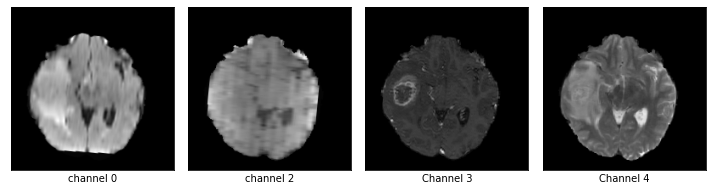

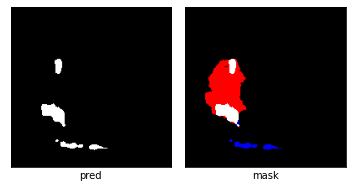

dice_loss : 0.06305170239596469



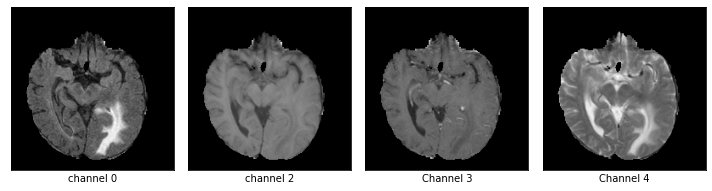

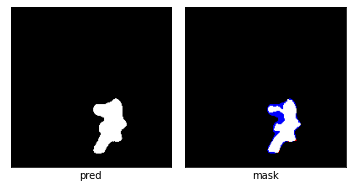

03/06 11:02:17 AM epoch 1 lr 2.483464e-02
03/06 11:02:17 AM genotype = Genotype(normal=[('sep_conv_3x3', 1), ('skip_connect', 0), ('skip_connect', 0), ('skip_connect', 2), ('skip_connect', 0), ('dil_conv_3x3', 1), ('skip_connect', 0), ('skip_connect', 4)], normal_concat=range(2, 6), reduce=[('skip_connect', 0), ('dil_conv_5x5', 1), ('dil_conv_3x3', 2), ('sep_conv_3x3', 1), ('dil_conv_3x3', 2), ('avg_pool_3x3', 1), ('sep_conv_3x3', 1), ('sep_conv_3x3', 0)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<39:17,  1.00s/it, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:01<38:47,  1.01it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:02<38:23,  1.02it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.0399, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:03<38:09,  1.03it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:04<37:52,  1.03it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:05<38:00,  1.03it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:06<38:06,  1.03it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:07<37:56,  1.03it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.4304, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:08<37:54,  1.03it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:09<37:44,  1.04it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:10<37:47,  1.03it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:11<37:46,  1.03it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:12<37:39,  1.04it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:13<37:28,  1.04it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.0319, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:14<37:15,  1.05it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:15<37:45,  1.03it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:16<37:36,  1.04it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.4911, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:17<37:31,  1.04it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.5475, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:18<37:18,  1.04it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:19<37:27,  1.04it/s, Acc=0.981, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:20<37:03,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.1789, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:21<37:18,  1.04it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.9208, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:22<37:02,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:23<37:04,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.1855, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:24<37:03,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.7388, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:25<37:02,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:25<36:55,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.3752, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:26<36:52,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:27<36:45,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:28<36:49,  1.05it/s, Acc=0.961, IoU=0.0758, Loss=0.859]

tensor(0.2536, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:29<37:01,  1.05it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:30<37:14,  1.04it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.2551, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:31<37:21,  1.04it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:32<37:51,  1.02it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:33<37:43,  1.02it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:34<37:32,  1.03it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.1234, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:35<37:26,  1.03it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.1500, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:36<37:19,  1.03it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.2239, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:37<37:39,  1.03it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:38<37:32,  1.03it/s, Acc=0.993, IoU=0.867, Loss=0.0725]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:39<37:25,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.3933, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:40<37:22,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:41<37:22,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:42<37:26,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.5548, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:43<37:14,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:44<37:15,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.2110, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:45<37:12,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.2119, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:46<37:20,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.2334, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:47<37:11,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:48<37:08,  1.03it/s, Acc=0.99, IoU=0.467, Loss=0.368]

tensor(0.9727, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:49<37:19,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.6682, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:50<37:23,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:51<37:25,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:52<37:12,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:53<36:59,  1.04it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1717, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:54<37:07,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0955, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:55<37:10,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.6448, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:56<37:09,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [00:56<37:08,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.7918, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [00:57<37:04,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [00:58<37:03,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [00:59<37:09,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:00<36:59,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.0487, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:01<36:59,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:02<37:04,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.2720, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:03<37:03,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:04<37:04,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:05<36:54,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:06<36:52,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:07<36:55,  1.03it/s, Acc=0.997, IoU=0.733, Loss=0.166]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:08<36:55,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:09<37:00,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:10<36:56,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:11<36:41,  1.04it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:12<36:43,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.0460, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:13<36:47,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.5542, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:14<36:42,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:15<36:47,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.1353, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:16<36:36,  1.04it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:17<36:38,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:18<36:30,  1.04it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:19<36:32,  1.04it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:20<36:29,  1.04it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.1572, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:21<36:44,  1.03it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:22<36:45,  1.03it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.2762, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:23<36:32,  1.03it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:24<36:29,  1.04it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.3813, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:25<36:31,  1.03it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:25<36:14,  1.04it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.9880, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:26<36:08,  1.04it/s, Acc=0.994, IoU=0.906, Loss=0.05]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:27<36:15,  1.04it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.2600, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:28<36:19,  1.04it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0409, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:29<36:15,  1.04it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:30<36:15,  1.04it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:31<36:19,  1.04it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1407, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:32<36:14,  1.04it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:33<36:23,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.3470, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:34<36:28,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:35<36:22,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.2890, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:36<36:36,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:37<36:23,  1.03it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:38<36:12,  1.04it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:39<36:17,  1.03it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:40<36:21,  1.03it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:41<35:58,  1.04it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:42<35:58,  1.04it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.0982, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:43<36:11,  1.04it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:44<36:38,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.6211, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:45<36:35,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.1120, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:46<36:31,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0826]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:47<36:31,  1.02it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:48<36:39,  1.02it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.9641, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:49<36:27,  1.02it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:50<36:26,  1.03it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:51<36:23,  1.03it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.4882, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:52<36:13,  1.03it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:53<36:07,  1.03it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [01:54<36:18,  1.03it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [01:55<36:17,  1.03it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.1391, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [01:56<36:32,  1.02it/s, Acc=0.982, IoU=0.432, Loss=0.399]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [01:57<36:28,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.6941, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [01:58<36:19,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.2228, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [01:59<36:19,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [01:59<36:04,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:00<36:04,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.6574, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:01<36:00,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.4051, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:02<35:53,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:03<35:57,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:04<35:53,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:05<35:42,  1.04it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:06<35:49,  1.03it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:07<35:55,  1.03it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:08<35:53,  1.03it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:09<35:43,  1.04it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:10<35:41,  1.04it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:11<35:27,  1.04it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:12<35:16,  1.05it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.2829, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:13<35:12,  1.05it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:14<35:19,  1.05it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.3598, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:15<35:25,  1.04it/s, Acc=0.995, IoU=0.874, Loss=0.0688]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:16<35:31,  1.04it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.1932, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:17<35:27,  1.04it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.2494, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:18<35:36,  1.04it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:19<35:34,  1.04it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.2207, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:20<35:45,  1.03it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:21<35:39,  1.03it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.1517, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:22<35:46,  1.03it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.9120, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:23<35:38,  1.03it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.1525, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:24<35:46,  1.03it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:25<35:41,  1.03it/s, Acc=0.994, IoU=0.654, Loss=0.22]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:26<35:40,  1.03it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.0468, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:27<35:44,  1.03it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:27<35:39,  1.03it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.2339, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:28<35:31,  1.03it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.1765, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:29<35:26,  1.03it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.2716, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:30<35:20,  1.04it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.6009, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:31<35:30,  1.03it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:32<35:27,  1.03it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.4257, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:33<35:14,  1.04it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.1398, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:34<35:07,  1.04it/s, Acc=0.968, IoU=0.121, Loss=0.786]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:35<35:10,  1.04it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:36<35:05,  1.04it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.1715, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:37<35:12,  1.04it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.1461, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:38<34:55,  1.05it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:39<34:53,  1.05it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.9168, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:40<34:52,  1.05it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:41<35:04,  1.04it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:42<35:00,  1.04it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.3435, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:43<34:56,  1.04it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:44<34:46,  1.05it/s, Acc=0.992, IoU=0.896, Loss=0.0546]

tensor(0.3504, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:45<35:04,  1.04it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.7203, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:46<35:13,  1.03it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.1455, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:47<35:10,  1.03it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:48<34:59,  1.04it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.2448, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:49<35:01,  1.04it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:50<34:52,  1.04it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:51<34:41,  1.05it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [02:52<34:55,  1.04it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [02:52<35:05,  1.03it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9778, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [02:53<35:06,  1.03it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [02:54<35:01,  1.03it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [02:55<35:13,  1.03it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [02:56<34:52,  1.04it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [02:57<34:55,  1.04it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [02:58<34:40,  1.04it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.1789, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [02:59<34:42,  1.04it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:00<34:44,  1.04it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.1636, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:01<35:00,  1.03it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.1449, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:02<34:54,  1.03it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:03<34:45,  1.04it/s, Acc=0.981, IoU=0.805, Loss=0.108]

tensor(0.2303, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:04<34:40,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.7842, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:05<34:48,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:06<34:39,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:07<34:34,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:08<34:39,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:09<34:33,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:10<34:29,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.1148, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:11<34:30,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:12<34:41,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.1582, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:13<34:41,  1.04it/s, Acc=0.996, IoU=0.402, Loss=0.462]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:14<34:40,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:15<34:44,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.6797, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:16<34:38,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.6243, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:17<34:34,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.5770, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:18<34:34,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1806, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:19<34:26,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:19<34:14,  1.05it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0396, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:20<34:19,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1747, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:21<34:15,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.5971, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:22<34:23,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:23<34:16,  1.04it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:24<34:18,  1.04it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.5066, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:25<34:19,  1.04it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.1639, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:26<34:25,  1.04it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:27<34:35,  1.03it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:28<34:38,  1.03it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:29<34:14,  1.04it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:30<34:20,  1.04it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:31<34:25,  1.03it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.5151, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:32<34:29,  1.03it/s, Acc=0.991, IoU=0.663, Loss=0.202]

tensor(0.7692, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:33<34:41,  1.03it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:34<34:27,  1.03it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:35<34:10,  1.04it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:36<34:00,  1.04it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:37<33:50,  1.05it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:38<33:44,  1.05it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:39<33:52,  1.05it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:40<33:55,  1.04it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:41<33:57,  1.04it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.4743, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:42<33:54,  1.04it/s, Acc=0.962, IoU=0.333, Loss=0.501]

tensor(0.4201, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:43<33:58,  1.04it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.1680, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:44<33:53,  1.04it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:44<34:03,  1.04it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:45<34:03,  1.04it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.2293, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:46<33:49,  1.04it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:47<33:53,  1.04it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.1562, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:48<33:45,  1.05it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.7255, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [03:49<33:53,  1.04it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [03:50<33:42,  1.05it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [03:51<33:50,  1.04it/s, Acc=0.997, IoU=0.856, Loss=0.0788]

tensor(0.1775, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [03:52<33:58,  1.04it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.2454, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [03:53<33:59,  1.04it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.5798, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [03:54<33:46,  1.04it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [03:55<33:48,  1.04it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.0971, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [03:56<33:48,  1.04it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [03:57<33:35,  1.05it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [03:58<33:32,  1.05it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [03:59<33:44,  1.04it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.6436, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:00<33:50,  1.04it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:01<33:58,  1.03it/s, Acc=0.986, IoU=0, Loss=0.997]

tensor(0.1853, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:02<34:01,  1.03it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:03<33:59,  1.03it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:04<34:00,  1.03it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.3986, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:05<33:49,  1.04it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:06<33:42,  1.04it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.9619, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:07<33:59,  1.03it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.1189, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:08<33:48,  1.03it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:09<33:48,  1.03it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.3661, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:10<33:37,  1.04it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.2252, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:10<33:45,  1.03it/s, Acc=0.994, IoU=0.924, Loss=0.04]

tensor(0.2605, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:11<33:51,  1.03it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:12<33:44,  1.03it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:13<33:33,  1.04it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.1381, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:14<33:26,  1.04it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:15<33:17,  1.05it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.1512, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:16<33:08,  1.05it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:17<33:15,  1.05it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:18<33:12,  1.05it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:19<33:24,  1.04it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:20<33:23,  1.04it/s, Acc=0.997, IoU=0.348, Loss=0.494]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:21<33:18,  1.04it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.2322, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:22<33:24,  1.04it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:23<33:26,  1.04it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.1316, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:24<33:21,  1.04it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.5637, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:25<33:14,  1.04it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.3559, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:26<33:29,  1.03it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:27<33:31,  1.03it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:28<33:25,  1.04it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:29<33:15,  1.04it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:30<33:29,  1.03it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.1976, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:31<33:32,  1.03it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.6516, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:32<33:54,  1.02it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:33<33:51,  1.02it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.6105, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:34<33:58,  1.02it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:35<33:38,  1.03it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:36<33:30,  1.03it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:37<33:38,  1.02it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:38<33:20,  1.03it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.2455, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:39<33:31,  1.03it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.6976, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:39<33:30,  1.03it/s, Acc=0.996, IoU=0.909, Loss=0.0482]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:40<33:25,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:41<33:19,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:42<33:19,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:43<33:16,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:44<33:15,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:45<33:07,  1.04it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.3114, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:46<33:02,  1.04it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [04:47<33:00,  1.04it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [04:48<33:18,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [04:49<33:20,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.5855, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [04:50<33:25,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [04:51<33:35,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.6261, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [04:52<33:30,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [04:53<33:24,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [04:54<33:25,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [04:55<33:26,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [04:56<33:25,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [04:57<33:13,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [04:58<33:05,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [04:59<32:58,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:00<33:14,  1.03it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.0691, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:01<33:04,  1.03it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:02<33:22,  1.02it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.2992, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:03<33:27,  1.02it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.9677, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:04<33:26,  1.02it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:05<33:23,  1.02it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:06<33:14,  1.02it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:07<33:04,  1.03it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:08<33:06,  1.02it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:09<33:14,  1.02it/s, Acc=0.909, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:10<33:22,  1.02it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:11<33:31,  1.01it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:12<33:16,  1.02it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:13<33:24,  1.01it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:14<33:02,  1.02it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:15<32:56,  1.03it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:16<32:48,  1.03it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.3070, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:17<32:54,  1.03it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:18<32:43,  1.03it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.4558, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:18<32:40,  1.03it/s, Acc=0.957, IoU=0.0303, Loss=0.938]

tensor(0.3376, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:19<32:40,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:20<32:39,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:21<32:37,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:22<32:38,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:23<32:31,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:24<32:27,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:25<32:26,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6783, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:26<32:25,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6274, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:27<32:20,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:28<32:30,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:29<32:31,  1.03it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:30<32:40,  1.03it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.0959, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:31<32:42,  1.03it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:32<32:40,  1.03it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:33<32:41,  1.02it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:34<32:36,  1.03it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.4498, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:35<32:42,  1.02it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:36<32:36,  1.03it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.6521, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:37<33:03,  1.01it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:38<33:02,  1.01it/s, Acc=0.981, IoU=0.674, Loss=0.194]

tensor(0.3409, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:39<32:59,  1.01it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:40<33:05,  1.01it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:41<32:46,  1.02it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.6689, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:42<32:48,  1.02it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:43<32:58,  1.01it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:44<32:57,  1.01it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [05:45<32:48,  1.02it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.3552, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [05:46<32:31,  1.02it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [05:47<32:16,  1.03it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.4371, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [05:48<32:35,  1.02it/s, Acc=0.97, IoU=0.729, Loss=0.156]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [05:49<32:32,  1.02it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [05:50<32:34,  1.02it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.1343, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [05:51<32:31,  1.02it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.3689, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [05:52<32:18,  1.03it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.0432, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [05:53<32:09,  1.03it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.1326, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [05:54<32:08,  1.03it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.2646, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [05:55<32:08,  1.03it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [05:56<32:09,  1.03it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [05:57<31:48,  1.04it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.6985, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [05:57<31:45,  1.04it/s, Acc=0.963, IoU=0.00217, Loss=0.995]

tensor(0.0444, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [05:58<31:46,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [05:59<31:45,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.4134, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:00<31:39,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:01<31:30,  1.05it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.1813, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:02<31:47,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.1628, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:03<31:44,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.5789, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:04<31:38,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:05<31:41,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:06<31:35,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:07<31:39,  1.04it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:08<31:48,  1.03it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:09<31:51,  1.03it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:10<32:06,  1.02it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:11<32:06,  1.02it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.0402, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:12<31:58,  1.03it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.6867, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:13<31:54,  1.03it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:14<32:05,  1.02it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:15<31:56,  1.03it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:16<31:51,  1.03it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.5990, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:17<31:51,  1.03it/s, Acc=0.987, IoU=0.847, Loss=0.0834]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:18<31:47,  1.03it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:19<31:49,  1.03it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:20<31:52,  1.03it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:21<31:41,  1.03it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.7335, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:22<31:42,  1.03it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:23<31:45,  1.03it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.2909, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:24<32:42,  1.00s/it, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.8808, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:25<32:25,  1.01it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:26<32:07,  1.01it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.3993, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:27<31:56,  1.02it/s, Acc=0.995, IoU=0.169, Loss=0.726]

tensor(0.1882, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:28<31:49,  1.02it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:29<31:47,  1.02it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:30<31:30,  1.03it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:31<31:36,  1.03it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:31<31:37,  1.03it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.0384, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:32<31:24,  1.03it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:33<31:19,  1.04it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:34<31:15,  1.04it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:35<31:03,  1.04it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:36<31:01,  1.04it/s, Acc=0.993, IoU=0.793, Loss=0.117]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:37<31:07,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:38<31:02,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:39<30:54,  1.05it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:40<30:57,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.5719, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:41<31:02,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:42<31:11,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [06:43<31:03,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [06:44<30:58,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.5597, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [06:45<31:04,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [06:46<30:58,  1.04it/s, Acc=0.991, IoU=0.809, Loss=0.107]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [06:47<31:03,  1.04it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [06:48<31:03,  1.04it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [06:49<30:52,  1.04it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.3135, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [06:50<30:52,  1.04it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0453, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [06:51<30:51,  1.04it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1579, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [06:52<31:15,  1.03it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [06:53<31:06,  1.03it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [06:54<31:18,  1.03it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [06:55<31:31,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [06:56<31:29,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [06:57<31:32,  1.02it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [06:58<31:40,  1.01it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.3191, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [06:59<31:39,  1.01it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.6633, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:00<31:38,  1.01it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.6426, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:01<31:32,  1.01it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:02<31:27,  1.02it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:03<31:28,  1.02it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:03<31:16,  1.02it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:04<31:22,  1.02it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.9760, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:05<31:12,  1.02it/s, Acc=0.99, IoU=0.664, Loss=0.203]

tensor(0.1940, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:06<31:02,  1.03it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.6181, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:07<30:53,  1.03it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.9769, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:08<31:00,  1.03it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:09<31:19,  1.02it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:10<31:16,  1.02it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:11<31:06,  1.02it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:12<30:52,  1.03it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.9330, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:13<30:40,  1.04it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:14<30:54,  1.03it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:15<30:37,  1.04it/s, Acc=0.995, IoU=0.896, Loss=0.0563]

tensor(0.3568, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:16<30:37,  1.04it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:17<30:43,  1.03it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:18<30:52,  1.03it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.4399, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:19<30:49,  1.03it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.4223, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:20<30:44,  1.03it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.2876, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:21<30:37,  1.03it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:22<30:25,  1.04it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:23<30:25,  1.04it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.7225, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:24<30:46,  1.03it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:25<30:51,  1.02it/s, Acc=0.996, IoU=0.943, Loss=0.029]

tensor(0.8885, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:26<30:44,  1.03it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:27<30:40,  1.03it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:28<30:44,  1.03it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:29<30:26,  1.04it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:30<30:36,  1.03it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.0449, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:31<30:34,  1.03it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:32<30:53,  1.02it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.6047, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:33<30:48,  1.02it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:34<30:49,  1.02it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:35<30:40,  1.02it/s, Acc=0.994, IoU=0.643, Loss=0.221]

tensor(0.5334, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:36<30:21,  1.03it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:37<30:20,  1.03it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:37<30:09,  1.04it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:38<30:10,  1.04it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.4622, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:39<30:17,  1.03it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [07:40<30:07,  1.04it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.1155, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [07:41<30:28,  1.03it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [07:42<30:21,  1.03it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.2421, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [07:43<30:20,  1.03it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [07:44<30:12,  1.03it/s, Acc=0.975, IoU=0.428, Loss=0.405]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [07:45<30:09,  1.04it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [07:46<30:19,  1.03it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [07:47<30:17,  1.03it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.5550, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [07:48<30:06,  1.04it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.3997, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [07:49<30:18,  1.03it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [07:50<30:08,  1.03it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.2562, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [07:51<30:25,  1.02it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [07:52<30:01,  1.04it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [07:53<30:09,  1.03it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.6734, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [07:54<30:17,  1.03it/s, Acc=0.986, IoU=0.755, Loss=0.141]

tensor(0.7784, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [07:55<30:24,  1.02it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [07:56<30:18,  1.02it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.4619, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [07:57<30:14,  1.03it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.2711, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [07:58<30:18,  1.02it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [07:59<30:21,  1.02it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:00<30:21,  1.02it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:01<30:11,  1.03it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:02<29:54,  1.04it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:03<30:05,  1.03it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:04<29:54,  1.03it/s, Acc=0.995, IoU=0.916, Loss=0.0447]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:05<29:52,  1.03it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.4756, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:06<29:45,  1.04it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:07<29:48,  1.04it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:08<29:43,  1.04it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.4807, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:09<29:37,  1.04it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:09<29:48,  1.03it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.6363, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:10<29:35,  1.04it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:11<29:36,  1.04it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:12<29:45,  1.03it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:13<29:34,  1.04it/s, Acc=0.984, IoU=0.713, Loss=0.168]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:14<29:28,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:15<29:36,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:16<29:43,  1.03it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:17<29:32,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1521, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:18<29:31,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:19<29:24,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3870, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:20<29:24,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1731, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:21<29:22,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:22<29:35,  1.03it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:23<29:32,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.8856, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:24<29:30,  1.04it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.5485, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:25<29:34,  1.03it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:26<29:35,  1.03it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.1941, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:27<29:29,  1.03it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:28<29:17,  1.04it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:29<29:23,  1.04it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.9678, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:30<29:35,  1.03it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:31<29:31,  1.03it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:32<29:31,  1.03it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:33<29:44,  1.02it/s, Acc=0.981, IoU=0.232, Loss=0.628]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:34<29:31,  1.03it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:35<29:28,  1.03it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:36<29:41,  1.02it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.1591, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:37<29:38,  1.02it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.2867, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:38<29:37,  1.02it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [08:39<29:29,  1.03it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.1911, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [08:39<29:21,  1.03it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.8278, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [08:40<29:28,  1.03it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.1770, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [08:41<29:20,  1.03it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [08:42<29:22,  1.03it/s, Acc=0.99, IoU=0.884, Loss=0.0613]

tensor(0.8331, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [08:43<29:10,  1.04it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [08:44<29:14,  1.03it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [08:45<29:17,  1.03it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [08:46<29:03,  1.04it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [08:47<28:58,  1.04it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.9576, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [08:48<29:06,  1.04it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [08:49<29:12,  1.03it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [08:50<28:59,  1.04it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [08:51<29:12,  1.03it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.1959, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [08:52<29:01,  1.04it/s, Acc=0.991, IoU=0.895, Loss=0.0558]

tensor(0.3221, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [08:53<29:05,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [08:54<29:02,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [08:55<29:08,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.2652, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [08:56<29:08,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [08:57<28:55,  1.04it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [08:58<29:01,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.4033, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [08:59<28:50,  1.04it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.6645, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:00<28:43,  1.04it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.2522, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:01<28:42,  1.04it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.5830, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:02<28:48,  1.04it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.1474, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:03<28:51,  1.04it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:04<29:08,  1.03it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.7033, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:05<29:20,  1.02it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.4762, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:06<29:09,  1.02it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:07<29:02,  1.03it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.6114, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:08<28:46,  1.04it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.6251, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:08<28:46,  1.04it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.4141, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:09<28:39,  1.04it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.2129, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:10<28:37,  1.04it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:11<28:36,  1.04it/s, Acc=0.99, IoU=0.652, Loss=0.212]

tensor(0.3957, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:12<28:41,  1.04it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.2052, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:13<28:41,  1.04it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.6732, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:14<28:42,  1.03it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:15<28:37,  1.04it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:16<28:32,  1.04it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:17<28:20,  1.05it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:18<28:22,  1.04it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:19<28:21,  1.04it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.4013, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:20<28:36,  1.03it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.1522, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:21<28:31,  1.04it/s, Acc=0.971, IoU=0.442, Loss=0.388]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:22<28:38,  1.03it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:23<28:24,  1.04it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:24<28:39,  1.03it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:25<28:32,  1.03it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.0976, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:26<28:39,  1.03it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.3007, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:27<28:33,  1.03it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:28<28:22,  1.04it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.1335, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:29<28:17,  1.04it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:30<28:13,  1.04it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.1273, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:31<28:26,  1.03it/s, Acc=0.996, IoU=0.847, Loss=0.084]

tensor(0.4656, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:32<28:30,  1.03it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.2372, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:33<28:31,  1.03it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:34<28:31,  1.03it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.3822, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:35<28:36,  1.03it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [09:36<28:21,  1.03it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [09:36<28:23,  1.03it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [09:37<28:12,  1.04it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.2238, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [09:38<28:15,  1.04it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.4143, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [09:39<28:05,  1.04it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.1902, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [09:40<28:04,  1.04it/s, Acc=0.993, IoU=0.635, Loss=0.225]

tensor(0.1676, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [09:41<27:58,  1.05it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [09:42<27:55,  1.05it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [09:43<27:46,  1.05it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.9374, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [09:44<27:55,  1.04it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [09:45<28:06,  1.04it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.6027, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [09:46<28:05,  1.04it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [09:47<28:00,  1.04it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [09:48<27:50,  1.05it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.1596, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [09:49<27:53,  1.04it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [09:50<27:46,  1.05it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [09:51<27:38,  1.05it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [09:52<27:52,  1.04it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [09:53<27:45,  1.05it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [09:54<27:43,  1.05it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [09:55<27:57,  1.04it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.3892, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [09:56<27:46,  1.04it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.6383, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [09:57<27:45,  1.04it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [09:58<27:48,  1.04it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [09:59<27:39,  1.05it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [09:59<27:49,  1.04it/s, Acc=0.996, IoU=0.865, Loss=0.0719]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:00<27:48,  1.04it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:01<27:48,  1.04it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.1559, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:02<27:39,  1.04it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:03<27:35,  1.05it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.5112, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:04<27:37,  1.04it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:05<27:42,  1.04it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:06<27:47,  1.04it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.6005, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:07<27:33,  1.04it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.5324, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:08<27:28,  1.05it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:09<27:20,  1.05it/s, Acc=0.964, IoU=0.244, Loss=0.609]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:10<27:13,  1.06it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:11<27:20,  1.05it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.1209, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:12<27:28,  1.04it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.1983, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:13<27:29,  1.04it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:14<27:16,  1.05it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:15<27:24,  1.05it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:16<27:19,  1.05it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.6161, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:17<27:15,  1.05it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:18<27:16,  1.05it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.6399, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:19<27:15,  1.05it/s, Acc=0.996, IoU=0.794, Loss=0.117]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:20<27:15,  1.05it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.6200, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:21<27:17,  1.05it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:21<27:06,  1.05it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.3746, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:22<27:17,  1.05it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:23<27:16,  1.05it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:24<27:20,  1.04it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.4319, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:25<27:06,  1.05it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.8617, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:26<27:06,  1.05it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1602, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:27<27:17,  1.04it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.2212, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:28<27:16,  1.04it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:29<27:30,  1.03it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.6835, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:30<27:40,  1.03it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:31<27:35,  1.03it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:32<27:32,  1.03it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.1012, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [10:33<27:40,  1.02it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.4227, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [10:34<27:26,  1.03it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.2915, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [10:35<27:15,  1.04it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [10:36<27:10,  1.04it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [10:37<27:09,  1.04it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [10:38<27:14,  1.04it/s, Acc=0.967, IoU=0.731, Loss=0.154]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [10:39<27:08,  1.04it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.1676, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [10:40<27:09,  1.04it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.1296, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [10:41<26:57,  1.05it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [10:42<27:01,  1.04it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.6668, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [10:43<27:14,  1.03it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [10:44<27:25,  1.03it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [10:45<27:32,  1.02it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [10:46<27:21,  1.03it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [10:47<27:23,  1.03it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.1234, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [10:48<27:25,  1.02it/s, Acc=0.991, IoU=0.889, Loss=0.0594]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [10:49<27:29,  1.02it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.1514, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [10:50<27:19,  1.03it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [10:50<27:21,  1.02it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [10:51<27:03,  1.04it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [10:52<26:58,  1.04it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.2174, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [10:53<26:53,  1.04it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.3543, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [10:54<26:52,  1.04it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.5511, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [10:55<26:55,  1.04it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [10:56<26:51,  1.04it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.7271, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [10:57<27:01,  1.03it/s, Acc=0.976, IoU=0.723, Loss=0.161]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [10:58<27:09,  1.03it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [10:59<27:12,  1.02it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:00<26:53,  1.04it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.7645, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:01<26:44,  1.04it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.1304, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:02<26:38,  1.04it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.5305, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:03<26:49,  1.04it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:04<26:41,  1.04it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:05<26:35,  1.04it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:06<26:33,  1.05it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.6112, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:07<26:39,  1.04it/s, Acc=0.987, IoU=0.568, Loss=0.276]

tensor(0.0378, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:08<26:42,  1.04it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.3121, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:09<26:49,  1.03it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:10<26:46,  1.03it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.1608, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:11<26:40,  1.04it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:12<26:33,  1.04it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.0809, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:13<26:32,  1.04it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:14<26:35,  1.04it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:15<26:34,  1.04it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.1977, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:15<26:30,  1.04it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.3517, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:16<26:27,  1.04it/s, Acc=0.997, IoU=0.803, Loss=0.111]

tensor(0.0438, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:17<26:41,  1.03it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:18<26:47,  1.03it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.2262, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:19<26:42,  1.03it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:20<26:21,  1.04it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.2495, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:21<26:25,  1.04it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:22<26:29,  1.04it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:23<26:24,  1.04it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.2841, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:24<26:32,  1.03it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:25<26:29,  1.04it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:26<26:21,  1.04it/s, Acc=0.994, IoU=0.808, Loss=0.107]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:27<26:25,  1.04it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:28<26:31,  1.03it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.0579, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:29<26:21,  1.04it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:30<26:22,  1.04it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.4199, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [11:31<26:14,  1.04it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [11:32<26:14,  1.04it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [11:33<26:13,  1.04it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.1471, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [11:34<26:18,  1.04it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [11:35<26:21,  1.03it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.1834, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [11:36<26:10,  1.04it/s, Acc=0.996, IoU=0.741, Loss=0.15]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [11:37<26:01,  1.05it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [11:38<25:55,  1.05it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [11:39<25:59,  1.05it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [11:40<25:58,  1.05it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.2047, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [11:41<25:55,  1.05it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.1415, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [11:41<25:51,  1.05it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [11:42<25:54,  1.05it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.7340, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [11:43<25:58,  1.04it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [11:44<26:00,  1.04it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.7686, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [11:45<25:55,  1.05it/s, Acc=0.972, IoU=0.0374, Loss=0.927]

tensor(0.3702, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [11:46<25:58,  1.04it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.3142, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [11:47<26:02,  1.04it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.3109, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [11:48<26:12,  1.03it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.2287, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [11:49<26:05,  1.04it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [11:50<26:12,  1.03it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [11:51<26:04,  1.03it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.2956, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [11:52<26:05,  1.03it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [11:53<25:58,  1.04it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.3276, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [11:54<25:55,  1.04it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [11:55<25:45,  1.04it/s, Acc=0.995, IoU=0.449, Loss=0.388]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [11:56<25:51,  1.04it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.5255, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [11:57<25:45,  1.04it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.2503, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [11:58<25:48,  1.04it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [11:59<25:47,  1.04it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:00<25:36,  1.05it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:01<25:36,  1.05it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.4352, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:02<25:49,  1.04it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.7831, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:03<25:38,  1.04it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:04<25:36,  1.05it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:05<25:57,  1.03it/s, Acc=0.999, IoU=0.905, Loss=0.0536]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:06<26:09,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:07<26:11,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:08<26:01,  1.03it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.9624, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:08<26:06,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:09<26:09,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.3162, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:10<26:00,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:11<26:09,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:12<26:06,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:13<26:10,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:14<25:58,  1.02it/s, Acc=0.989, IoU=0.838, Loss=0.0898]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:15<26:01,  1.02it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.3429, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:16<25:55,  1.02it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:17<25:54,  1.02it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:18<25:41,  1.03it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:19<25:43,  1.03it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:20<25:38,  1.03it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:21<25:34,  1.04it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:22<25:48,  1.02it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.1522, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:23<25:47,  1.02it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:24<25:51,  1.02it/s, Acc=0.986, IoU=0.826, Loss=0.0961]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:25<25:46,  1.02it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.0309, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:26<25:43,  1.03it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.2743, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:27<25:31,  1.03it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [12:28<25:29,  1.03it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [12:29<25:15,  1.04it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [12:30<25:17,  1.04it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.7489, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [12:31<25:06,  1.05it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.1175, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [12:32<25:17,  1.04it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.1656, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [12:33<25:23,  1.03it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.4583, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [12:34<25:15,  1.04it/s, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [12:35<25:23,  1.03it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.8482, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [12:36<25:15,  1.04it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [12:37<25:17,  1.04it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [12:38<25:09,  1.04it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [12:39<25:05,  1.04it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.3050, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [12:39<24:59,  1.05it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [12:40<25:03,  1.04it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [12:41<25:00,  1.04it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.6054, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [12:42<25:02,  1.04it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.3005, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [12:43<24:55,  1.05it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [12:44<24:55,  1.05it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [12:45<25:06,  1.04it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.5887, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [12:46<25:08,  1.04it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.4293, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [12:47<24:53,  1.05it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.9665, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [12:48<24:54,  1.04it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [12:49<24:44,  1.05it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [12:50<24:44,  1.05it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [12:51<24:54,  1.04it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.6569, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [12:52<25:01,  1.04it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [12:53<25:03,  1.03it/s, Acc=0.994, IoU=0.831, Loss=0.0923]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [12:54<25:01,  1.03it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.2276, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [12:55<25:13,  1.03it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.4955, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [12:56<25:08,  1.03it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [12:57<24:52,  1.04it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.6622, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [12:58<24:46,  1.04it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [12:59<24:43,  1.04it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.6308, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:00<24:39,  1.05it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:01<24:42,  1.04it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.2792, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:02<24:34,  1.05it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:03<24:46,  1.04it/s, Acc=0.995, IoU=0.807, Loss=0.11]

tensor(0.1774, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:04<24:40,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:04<24:40,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:05<24:37,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:06<24:32,  1.05it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:07<24:38,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.6696, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:08<24:37,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:09<24:34,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9017, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:10<24:49,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:11<24:39,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.8744, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:12<24:32,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:13<24:35,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.5536, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:14<24:38,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.9664, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:15<24:32,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.6517, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:16<24:29,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:17<24:26,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:18<24:33,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.0963, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:19<24:32,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:20<24:22,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.0402, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:21<24:28,  1.04it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:22<24:19,  1.05it/s, Acc=0.975, IoU=0.504, Loss=0.331]

tensor(0.9591, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:23<24:24,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:24<24:22,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9234, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [13:25<24:19,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [13:26<24:16,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2474, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [13:27<24:18,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [13:28<24:22,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [13:28<24:23,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [13:29<24:17,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.7594, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [13:30<24:12,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [13:31<24:13,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1541, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [13:32<24:20,  1.04it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [13:33<24:27,  1.03it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [13:34<24:25,  1.03it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.6771, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [13:35<24:12,  1.04it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [13:36<24:05,  1.04it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [13:37<24:03,  1.05it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [13:38<23:52,  1.05it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [13:39<23:55,  1.05it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.3550, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [13:40<23:50,  1.05it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [13:41<23:49,  1.05it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [13:42<23:48,  1.05it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [13:43<23:50,  1.05it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [13:44<23:48,  1.05it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2397, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [13:45<23:49,  1.05it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [13:46<23:51,  1.05it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.6640, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [13:47<23:48,  1.05it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [13:48<23:46,  1.05it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [13:49<23:50,  1.05it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [13:50<24:01,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [13:50<23:59,  1.04it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3458, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [13:51<23:58,  1.04it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [13:52<23:57,  1.04it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [13:53<23:53,  1.04it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [13:54<23:52,  1.04it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [13:55<23:46,  1.04it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.3261, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [13:56<23:39,  1.05it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.6244, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [13:57<23:40,  1.05it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [13:58<23:39,  1.05it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [13:59<23:43,  1.04it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:00<23:55,  1.03it/s, Acc=0.998, IoU=0.761, Loss=0.14]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:01<23:57,  1.03it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.2016, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:02<23:45,  1.04it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:03<23:42,  1.04it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:04<23:37,  1.04it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:05<23:38,  1.04it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:06<23:37,  1.04it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9742, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:07<23:35,  1.04it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:08<23:31,  1.05it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.3661, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:09<23:31,  1.05it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:10<23:21,  1.05it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.3110, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:11<23:23,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.3670, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:12<23:25,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:13<23:23,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:13<23:23,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:14<23:37,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.6292, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:15<23:34,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:16<23:34,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:17<23:24,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:18<24:07,  1.01it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:19<23:52,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0675]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:20<23:41,  1.03it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.3861, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:21<23:29,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [14:22<23:21,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [14:23<23:18,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [14:24<23:22,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [14:25<23:27,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.6540, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [14:26<23:28,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [14:27<23:27,  1.03it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.3722, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [14:28<23:17,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [14:29<23:20,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.1366, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [14:30<23:19,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [14:31<23:17,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [14:32<23:28,  1.03it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.6061, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [14:33<23:28,  1.03it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [14:34<23:23,  1.03it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [14:35<23:21,  1.03it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [14:36<23:24,  1.03it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [14:37<23:13,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [14:38<23:17,  1.03it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [14:39<23:13,  1.04it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [14:40<23:05,  1.04it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.6877, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [14:41<23:05,  1.04it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.6997, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [14:41<23:07,  1.04it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.1154, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [14:42<23:01,  1.04it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.3885, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [14:43<22:57,  1.05it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [14:44<22:54,  1.05it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.4329, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [14:45<22:48,  1.05it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [14:46<22:54,  1.05it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [14:47<22:52,  1.05it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [14:48<22:52,  1.05it/s, Acc=0.998, IoU=0.909, Loss=0.0489]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [14:49<23:01,  1.04it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.3931, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [14:50<23:04,  1.04it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [14:51<22:57,  1.04it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.7637, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [14:52<22:55,  1.04it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [14:53<22:56,  1.04it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [14:54<23:06,  1.03it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0486, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [14:55<23:05,  1.03it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.1153, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [14:56<23:04,  1.03it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [14:57<23:06,  1.03it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [14:58<23:05,  1.03it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [14:59<22:57,  1.03it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.1791, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:00<22:51,  1.04it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:01<22:52,  1.04it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:02<22:52,  1.04it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.3485, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:03<22:59,  1.03it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:04<22:53,  1.03it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.3139, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:05<22:51,  1.03it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:06<22:51,  1.03it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:07<23:04,  1.02it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:08<22:51,  1.03it/s, Acc=0.995, IoU=0.925, Loss=0.0397]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:08<22:39,  1.04it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.2821, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:09<22:41,  1.04it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:10<22:48,  1.03it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:11<22:40,  1.04it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:12<22:44,  1.03it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:13<22:41,  1.03it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:14<22:38,  1.04it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:15<22:30,  1.04it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:16<22:25,  1.05it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:17<22:25,  1.04it/s, Acc=0.993, IoU=0.592, Loss=0.259]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:18<22:23,  1.04it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.1374, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:19<22:19,  1.05it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [15:20<22:21,  1.05it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [15:21<22:31,  1.04it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [15:22<22:29,  1.04it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [15:23<22:19,  1.04it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [15:24<22:23,  1.04it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.6637, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [15:25<22:29,  1.04it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [15:26<22:21,  1.04it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [15:27<22:23,  1.04it/s, Acc=0.994, IoU=0.848, Loss=0.0821]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [15:28<22:23,  1.04it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.7322, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [15:29<22:24,  1.04it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [15:30<22:21,  1.04it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.2686, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [15:31<22:16,  1.04it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.1694, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [15:32<22:32,  1.03it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [15:33<22:31,  1.03it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [15:34<22:38,  1.02it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [15:35<22:29,  1.03it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.0561, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [15:36<22:41,  1.02it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [15:37<22:40,  1.02it/s, Acc=0.999, IoU=0.649, Loss=0.288]

tensor(0.1897, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [15:37<22:34,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [15:38<22:24,  1.03it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.7217, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [15:39<22:28,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [15:40<22:24,  1.03it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.1677, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [15:41<22:24,  1.03it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.2460, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [15:42<22:29,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.3249, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [15:43<22:24,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [15:44<22:32,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.5868, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [15:45<22:23,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.9001, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [15:46<22:24,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0417]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [15:47<22:25,  1.02it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [15:48<22:38,  1.01it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [15:49<22:35,  1.01it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [15:50<22:30,  1.02it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.1529, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [15:51<22:28,  1.02it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [15:52<22:19,  1.02it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [15:53<22:16,  1.02it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [15:54<22:10,  1.03it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [15:55<22:04,  1.03it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [15:56<22:05,  1.03it/s, Acc=0.986, IoU=0.768, Loss=0.131]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [15:57<22:05,  1.03it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [15:58<22:00,  1.03it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [15:59<22:09,  1.02it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.3044, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:00<22:02,  1.03it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:01<21:57,  1.03it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:02<21:49,  1.04it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:03<21:47,  1.04it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.2008, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:04<21:53,  1.03it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.3001, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:05<21:59,  1.03it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:06<21:56,  1.03it/s, Acc=0.996, IoU=0.0613, Loss=0.9]

tensor(0.3306, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:07<22:06,  1.02it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.1778, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:08<22:01,  1.02it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:09<22:14,  1.01it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:10<22:05,  1.02it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:11<22:03,  1.02it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:12<21:58,  1.02it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.1826, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:13<21:48,  1.03it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:14<21:53,  1.03it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:15<21:46,  1.03it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:16<21:45,  1.03it/s, Acc=0.98, IoU=0.601, Loss=0.249]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:16<21:41,  1.03it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [16:17<21:43,  1.03it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.2476, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [16:18<21:33,  1.04it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.1956, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [16:19<21:38,  1.03it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.6230, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [16:20<21:37,  1.03it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [16:21<21:31,  1.04it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [16:22<21:27,  1.04it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [16:23<21:27,  1.04it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.1755, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [16:24<21:26,  1.04it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [16:25<21:25,  1.04it/s, Acc=0.982, IoU=0.82, Loss=0.0989]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [16:26<21:22,  1.04it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [16:27<21:25,  1.04it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.5926, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [16:28<21:32,  1.03it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [16:29<21:23,  1.04it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [16:30<21:17,  1.04it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [16:31<21:18,  1.04it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [16:32<21:30,  1.03it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [16:33<21:24,  1.03it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [16:34<21:31,  1.03it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [16:35<21:20,  1.03it/s, Acc=0.99, IoU=0.796, Loss=0.114]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [16:36<21:32,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [16:37<21:29,  1.03it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.9794, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [16:38<21:27,  1.03it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [16:39<21:29,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [16:40<21:30,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.9242, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [16:41<21:27,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.1464, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [16:42<21:31,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.7217, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [16:43<21:27,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.1304, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [16:44<21:17,  1.03it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [16:45<21:16,  1.03it/s, Acc=0.994, IoU=0.931, Loss=0.0362]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [16:46<21:28,  1.02it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [16:47<21:35,  1.01it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [16:48<21:22,  1.02it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [16:48<21:06,  1.03it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.4466, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [16:49<21:16,  1.03it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.5958, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [16:50<21:18,  1.02it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [16:51<21:09,  1.03it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [16:52<21:06,  1.03it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [16:53<20:56,  1.04it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.6887, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [16:54<21:12,  1.03it/s, Acc=0.995, IoU=0.861, Loss=0.076]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [16:55<21:05,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.3943, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [16:56<20:55,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [16:57<21:03,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [16:58<20:57,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.7134, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [16:59<20:46,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:00<20:42,  1.05it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:01<20:55,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:02<20:53,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:03<20:48,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.1567, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:04<20:44,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0657]

tensor(0.2064, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:05<20:36,  1.05it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:06<20:34,  1.05it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:07<20:34,  1.05it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:08<20:43,  1.04it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:09<20:45,  1.04it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.8243, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:10<20:57,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:11<20:50,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:12<20:47,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:13<20:47,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3374, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:14<20:41,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2482, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:15<20:38,  1.04it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:16<20:55,  1.02it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [17:17<20:56,  1.02it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [17:18<20:46,  1.03it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.2324, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [17:18<20:47,  1.03it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [17:19<20:40,  1.03it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [17:20<20:52,  1.02it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.1982, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [17:21<20:54,  1.02it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.1956, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [17:22<20:52,  1.02it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.3395, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [17:23<20:39,  1.03it/s, Acc=0.983, IoU=0.109, Loss=0.802]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [17:24<20:42,  1.03it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [17:25<20:43,  1.02it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.2749, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [17:26<20:36,  1.03it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [17:27<20:23,  1.04it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [17:28<20:15,  1.04it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.2699, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [17:29<20:07,  1.05it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [17:30<20:17,  1.04it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.9384, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [17:31<20:14,  1.04it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.9472, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [17:32<20:25,  1.03it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.4285, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [17:33<20:21,  1.04it/s, Acc=0.992, IoU=0.846, Loss=0.0839]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [17:34<20:24,  1.03it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.8526, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [17:35<20:08,  1.04it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [17:36<20:06,  1.05it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [17:37<19:59,  1.05it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [17:38<19:55,  1.05it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [17:39<19:47,  1.06it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [17:40<19:50,  1.06it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [17:41<19:49,  1.06it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.1337, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [17:42<19:56,  1.05it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.1497, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [17:43<20:05,  1.04it/s, Acc=0.993, IoU=0, Loss=0.997]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [17:44<20:13,  1.03it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.3438, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [17:44<20:15,  1.03it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [17:45<20:07,  1.04it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.2605, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [17:46<20:02,  1.04it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [17:47<19:55,  1.05it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.1789, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [17:48<19:53,  1.05it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.3592, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [17:49<20:00,  1.04it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [17:50<19:56,  1.04it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.4637, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [17:51<19:58,  1.04it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.1719, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [17:52<19:52,  1.04it/s, Acc=0.99, IoU=0.858, Loss=0.0763]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [17:53<19:47,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.4935, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [17:54<19:46,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.1079, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [17:55<19:45,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.2072, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [17:56<19:36,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [17:57<19:43,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [17:58<19:41,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [17:59<19:37,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:00<19:33,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.2955, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:01<19:36,  1.05it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.3136, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:02<19:44,  1.04it/s, Acc=0.984, IoU=0.784, Loss=0.122]

tensor(0.4051, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:03<19:35,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:04<19:39,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.4323, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:05<19:37,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:05<19:40,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:06<19:38,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:07<19:34,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:08<19:29,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:09<19:30,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:10<19:28,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.4083, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:11<19:21,  1.05it/s, Acc=0.992, IoU=0.873, Loss=0.0691]

tensor(0.5225, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:12<19:26,  1.05it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:13<19:26,  1.05it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:14<19:18,  1.05it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [18:15<19:22,  1.05it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [18:16<19:20,  1.05it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [18:17<19:24,  1.05it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.4467, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [18:18<19:26,  1.04it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.3063, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [18:19<19:21,  1.05it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [18:20<19:23,  1.04it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.1121, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [18:21<19:21,  1.05it/s, Acc=0.983, IoU=0.738, Loss=0.152]

tensor(0.5593, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [18:22<19:28,  1.04it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [18:23<19:24,  1.04it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.1581, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [18:24<19:21,  1.04it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [18:25<19:17,  1.05it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.1485, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [18:26<19:23,  1.04it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [18:27<19:21,  1.04it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [18:27<19:18,  1.04it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [18:28<19:13,  1.05it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.4900, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [18:29<19:18,  1.04it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.1709, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [18:30<19:17,  1.04it/s, Acc=0.993, IoU=0.884, Loss=0.0611]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [18:31<19:22,  1.04it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [18:32<19:24,  1.03it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.7086, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [18:33<19:18,  1.04it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [18:34<19:20,  1.04it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [18:35<19:25,  1.03it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.4608, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [18:36<19:21,  1.03it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.2701, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [18:37<19:14,  1.04it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [18:38<19:08,  1.04it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [18:39<19:05,  1.04it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [18:40<19:03,  1.05it/s, Acc=0.99, IoU=0.861, Loss=0.0745]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [18:41<19:01,  1.05it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [18:42<19:08,  1.04it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.6021, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [18:43<18:59,  1.05it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [18:44<18:59,  1.05it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.1586, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [18:45<18:57,  1.05it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [18:46<19:00,  1.04it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [18:47<18:54,  1.05it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [18:48<18:55,  1.05it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [18:49<18:58,  1.04it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [18:50<18:58,  1.04it/s, Acc=0.964, IoU=0.161, Loss=0.722]

tensor(0.6202, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [18:51<18:59,  1.04it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [18:52<19:10,  1.03it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [18:52<19:04,  1.03it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [18:53<19:06,  1.03it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [18:54<19:08,  1.03it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.7084, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [18:55<19:10,  1.03it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [18:56<19:12,  1.02it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.2063, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [18:57<19:10,  1.02it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.4070, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [18:58<18:57,  1.03it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.7908, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [18:59<18:54,  1.04it/s, Acc=0.94, IoU=0.0224, Loss=0.955]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:00<18:48,  1.04it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.2073, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:01<18:49,  1.04it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.8530, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:02<18:51,  1.04it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:03<18:51,  1.03it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:04<18:49,  1.04it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.5183, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:05<18:48,  1.04it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.1245, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:06<18:46,  1.04it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.6224, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:07<18:54,  1.03it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.3403, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:08<18:54,  1.03it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:09<18:53,  1.03it/s, Acc=0.996, IoU=0.809, Loss=0.105]

tensor(0.0570, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:10<18:55,  1.03it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:11<19:02,  1.02it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.3671, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:12<18:53,  1.03it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.3671, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [19:13<19:10,  1.01it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.6595, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [19:14<19:09,  1.01it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [19:15<19:15,  1.00it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [19:16<19:21,  1.00s/it, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [19:17<19:15,  1.00it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.2903, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [19:18<19:14,  1.00it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.7272, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [19:19<19:12,  1.00it/s, Acc=0.991, IoU=0.852, Loss=0.0796]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [19:20<19:17,  1.00s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [19:21<19:23,  1.01s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.1167, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [19:22<19:33,  1.02s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [19:23<19:23,  1.01s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [19:24<19:30,  1.02s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.4556, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [19:25<19:34,  1.02s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [19:26<19:31,  1.02s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [19:27<19:41,  1.03s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [19:28<19:44,  1.03s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.1330, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [19:29<19:38,  1.03s/it, Acc=0.984, IoU=0.732, Loss=0.154]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [19:30<19:45,  1.04s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.4341, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [19:31<19:42,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [19:32<19:33,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [19:33<19:19,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.8928, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [19:34<19:32,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1542, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [19:35<19:20,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [19:36<18:54,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.3687, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [19:37<18:56,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.7829, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [19:38<18:53,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0964, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [19:39<18:54,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [19:40<18:52,  1.00it/s, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.3577, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [19:41<18:39,  1.01it/s, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.6505, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [19:42<18:39,  1.01it/s, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [19:43<18:33,  1.02it/s, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [19:44<18:38,  1.01it/s, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [19:45<18:44,  1.00it/s, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.6725, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [19:46<18:41,  1.01it/s, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.1079, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [19:47<18:44,  1.00it/s, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.1589, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [19:48<18:54,  1.01s/it, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [19:49<18:54,  1.01s/it, Acc=0.988, IoU=0.544, Loss=0.297]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [19:50<19:02,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.2381, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [19:51<19:01,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [19:52<18:50,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.8992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [19:53<18:41,  1.00s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.1530, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [19:54<18:37,  1.00it/s, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [19:55<18:43,  1.00s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.1167, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [19:56<18:45,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [19:57<18:45,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [19:58<18:44,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.4781, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [19:59<18:50,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0872]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:00<18:51,  1.02s/it, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.9857, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:01<18:48,  1.01s/it, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.1133, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:02<18:49,  1.02s/it, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:03<18:36,  1.01s/it, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:04<18:29,  1.00it/s, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.2040, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:05<18:27,  1.00it/s, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.1436, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:06<18:19,  1.01it/s, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:07<18:09,  1.02it/s, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:08<18:09,  1.02it/s, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:09<18:08,  1.02it/s, Acc=0.996, IoU=0.934, Loss=0.034]

tensor(0.9502, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:10<18:18,  1.01it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:11<18:16,  1.01it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:12<18:15,  1.01it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.1608, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:13<18:19,  1.00it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.1989, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [20:14<18:08,  1.01it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [20:15<18:04,  1.01it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.3242, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [20:16<18:03,  1.01it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [20:17<17:54,  1.02it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [20:18<18:00,  1.01it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.1633, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [20:19<17:58,  1.01it/s, Acc=0.992, IoU=0.362, Loss=0.481]

tensor(0.6675, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [20:20<18:01,  1.01it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [20:21<17:51,  1.02it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.6174, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [20:22<17:44,  1.03it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [20:23<17:49,  1.02it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [20:24<17:55,  1.01it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.1619, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [20:25<17:55,  1.01it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.5862, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [20:26<17:54,  1.01it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.3525, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [20:27<17:44,  1.02it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [20:28<17:35,  1.03it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.5000, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [20:29<17:26,  1.04it/s, Acc=0.985, IoU=0.845, Loss=0.0842]

tensor(0.4879, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [20:30<17:25,  1.04it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.1609, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [20:31<17:28,  1.03it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.2622, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [20:32<17:29,  1.03it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [20:33<17:32,  1.03it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [20:34<17:37,  1.02it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [20:35<17:33,  1.02it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.1868, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [20:36<17:37,  1.02it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.2897, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [20:37<17:40,  1.02it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.0983, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [20:38<17:51,  1.00it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.7710, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [20:39<17:46,  1.01it/s, Acc=0.994, IoU=0.576, Loss=0.275]

tensor(0.1012, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [20:40<17:35,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [20:41<17:34,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [20:42<17:38,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [20:43<17:39,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [20:44<17:37,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [20:45<17:38,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [20:46<17:37,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.6087, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [20:47<17:23,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1866, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [20:48<17:15,  1.03it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1252, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [20:49<17:14,  1.03it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.4807, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [20:50<17:21,  1.02it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [20:51<17:23,  1.02it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [20:52<17:27,  1.01it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.3242, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [20:53<17:26,  1.01it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.3644, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [20:54<17:28,  1.01it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [20:55<17:33,  1.01it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [20:56<17:28,  1.01it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [20:57<17:32,  1.00it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [20:58<17:30,  1.01it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [20:59<17:28,  1.01it/s, Acc=0.987, IoU=0.884, Loss=0.0622]

tensor(0.6755, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:00<17:28,  1.01it/s, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:01<17:34,  1.00s/it, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:02<17:48,  1.02s/it, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.1605, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:03<17:44,  1.01s/it, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.5097, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:04<17:27,  1.00it/s, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:05<17:31,  1.00s/it, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:06<17:26,  1.00it/s, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.0392, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:07<17:27,  1.00s/it, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:08<17:21,  1.00it/s, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:09<17:14,  1.01it/s, Acc=0.992, IoU=0.737, Loss=0.153]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:10<17:21,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:11<17:27,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:12<17:33,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:13<17:35,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [21:14<17:29,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [21:15<17:24,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [21:16<17:31,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.2451, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [21:17<17:25,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [21:18<17:22,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.3990, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [21:19<17:10,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [21:20<17:00,  1.01it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [21:21<17:04,  1.01it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [21:22<17:02,  1.01it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [21:23<17:04,  1.01it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1532, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [21:24<17:09,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [21:25<17:14,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [21:26<17:15,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1792, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [21:27<17:08,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [21:28<17:00,  1.01it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.4382, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [21:29<17:06,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.2083, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [21:30<17:13,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [21:31<17:11,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [21:32<17:15,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.1445, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [21:33<17:14,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.2073, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [21:34<17:12,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [21:35<17:08,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [21:36<16:58,  1.00s/it, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.1965, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [21:37<16:54,  1.00it/s, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [21:38<16:47,  1.01it/s, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [21:39<16:39,  1.02it/s, Acc=0.996, IoU=0.845, Loss=0.086]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [21:40<16:47,  1.01it/s, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [21:41<16:52,  1.00it/s, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [21:42<17:02,  1.01s/it, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [21:43<16:50,  1.00it/s, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [21:44<16:45,  1.00it/s, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.3780, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [21:45<16:35,  1.01it/s, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [21:46<16:38,  1.01it/s, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.5429, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [21:47<16:45,  1.00it/s, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.1707, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [21:48<16:40,  1.01it/s, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.1529, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [21:49<16:48,  1.00s/it, Acc=0.951, IoU=0.523, Loss=0.314]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [21:50<16:45,  1.00s/it, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [21:51<16:49,  1.01s/it, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.0445, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [21:52<16:46,  1.00s/it, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [21:53<16:42,  1.00s/it, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [21:54<16:44,  1.00s/it, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [21:55<16:38,  1.00it/s, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.5089, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [21:56<16:26,  1.01it/s, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [21:57<16:22,  1.02it/s, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.1917, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [21:58<16:32,  1.00it/s, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.1074, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [21:59<16:22,  1.01it/s, Acc=0.976, IoU=0.552, Loss=0.288]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:00<16:30,  1.00it/s, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:01<16:26,  1.01it/s, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.1391, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:02<16:17,  1.01it/s, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:03<16:20,  1.01it/s, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.5941, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:04<16:28,  1.00it/s, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:05<16:26,  1.00it/s, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.3795, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:06<16:28,  1.00s/it, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:07<16:28,  1.00s/it, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:08<16:23,  1.00it/s, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:09<16:21,  1.00it/s, Acc=0.99, IoU=0.856, Loss=0.0777]

tensor(0.2277, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:10<16:28,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:11<16:28,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0485, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:12<16:26,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:13<16:25,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [22:14<16:24,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [22:15<16:31,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [22:16<16:32,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.6781, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [22:17<16:34,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.4574, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [22:18<16:26,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [22:19<16:14,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1515, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [22:20<16:40,  1.03s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.2226, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [22:21<16:36,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.1891, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [22:22<16:26,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [22:23<16:26,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [22:24<16:25,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [22:25<16:19,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.8144, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [22:26<16:20,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [22:27<16:21,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.6436, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [22:28<16:21,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.4453, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [22:29<16:18,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0672]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [22:30<16:11,  1.01s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [22:31<16:03,  1.00s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [22:32<16:01,  1.00it/s, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.1525, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [22:33<16:05,  1.00s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [22:34<16:04,  1.00s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [22:35<16:06,  1.01s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [22:36<16:05,  1.01s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [22:37<16:11,  1.01s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [22:38<16:13,  1.02s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [22:39<16:13,  1.02s/it, Acc=0.986, IoU=0.749, Loss=0.142]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [22:40<16:10,  1.02s/it, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.6531, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [22:41<16:08,  1.02s/it, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.8282, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [22:42<15:57,  1.01s/it, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.1330, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [22:43<15:48,  1.00it/s, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [22:44<15:41,  1.01it/s, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [22:45<15:44,  1.00it/s, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [22:46<15:48,  1.00s/it, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [22:47<15:49,  1.00s/it, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.0430, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [22:48<15:46,  1.00s/it, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [22:49<15:44,  1.00it/s, Acc=0.989, IoU=0.642, Loss=0.221]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [22:50<15:37,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [22:51<15:33,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [22:52<15:35,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [22:53<15:31,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.0506, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [22:54<15:30,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.1622, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [22:55<15:29,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.9832, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [22:56<15:30,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [22:57<15:28,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [22:58<15:27,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.1744, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [22:59<15:26,  1.01it/s, Acc=0.992, IoU=0.876, Loss=0.0662]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:00<15:28,  1.01it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:01<15:32,  1.00it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:02<15:30,  1.00it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:03<15:15,  1.02it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.1095, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:04<15:18,  1.01it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:05<15:18,  1.01it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:06<15:13,  1.02it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:07<15:17,  1.01it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.6596, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:08<15:19,  1.01it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:09<15:22,  1.00it/s, Acc=0.991, IoU=0.845, Loss=0.0846]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:10<15:20,  1.00it/s, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.2523, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:11<15:18,  1.00it/s, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:12<15:16,  1.01it/s, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:13<15:23,  1.00s/it, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.3744, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [23:14<15:27,  1.01s/it, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.9890, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [23:15<15:30,  1.01s/it, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.0513, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [23:16<15:32,  1.02s/it, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.1528, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [23:17<15:22,  1.01s/it, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [23:18<15:16,  1.00s/it, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [23:19<15:12,  1.00it/s, Acc=0.996, IoU=0.913, Loss=0.0456]

tensor(0.4429, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [23:20<15:03,  1.01it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [23:21<15:09,  1.00it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [23:22<15:10,  1.00it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.1549, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [23:23<15:07,  1.00it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.9452, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [23:24<15:06,  1.00it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.6670, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [23:25<15:03,  1.01it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [23:26<15:00,  1.01it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [23:27<14:57,  1.01it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [23:28<14:59,  1.01it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [23:29<15:03,  1.00it/s, Acc=0.993, IoU=0.866, Loss=0.0721]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [23:30<15:00,  1.00it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [23:31<14:53,  1.01it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [23:32<15:01,  1.00it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [23:33<15:03,  1.00s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [23:34<15:02,  1.00s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [23:35<15:03,  1.01s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.3284, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [23:36<14:55,  1.00it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [23:37<14:54,  1.00it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0365, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [23:38<14:53,  1.00it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.3471, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [23:39<14:54,  1.00it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [23:40<14:56,  1.00s/it, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [23:41<14:46,  1.01it/s, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.5310, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [23:42<14:49,  1.00it/s, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.1549, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [23:43<14:49,  1.00it/s, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [23:44<14:50,  1.00s/it, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.6866, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [23:45<14:50,  1.00s/it, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [23:46<14:48,  1.00s/it, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.5092, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [23:47<14:52,  1.01s/it, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.3386, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [23:48<14:51,  1.01s/it, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [23:49<14:56,  1.01s/it, Acc=0.971, IoU=0.105, Loss=0.812]

tensor(0.3496, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [23:50<14:55,  1.01s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [23:51<14:56,  1.02s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [23:52<14:53,  1.01s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.0468, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [23:53<14:46,  1.01s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [23:54<14:46,  1.01s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [23:55<14:41,  1.00s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.4824, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [23:56<14:43,  1.01s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [23:57<14:38,  1.00s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.1609, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [23:58<14:44,  1.01s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.3546, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [23:59<14:41,  1.01s/it, Acc=0.99, IoU=0.819, Loss=0.101]

tensor(0.1815, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:00<14:34,  1.00s/it, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.3406, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:01<14:34,  1.00s/it, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:02<14:38,  1.01s/it, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.3123, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:03<14:27,  1.00it/s, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.1816, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:04<14:25,  1.00it/s, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:05<14:29,  1.00s/it, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:06<14:25,  1.00it/s, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.7121, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:07<14:21,  1.01it/s, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:08<14:17,  1.01it/s, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:09<14:21,  1.00it/s, Acc=0.99, IoU=0.596, Loss=0.255]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:10<14:21,  1.00it/s, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.6217, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:11<14:16,  1.01it/s, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:12<14:13,  1.01it/s, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [24:13<14:20,  1.00it/s, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.2046, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [24:14<14:16,  1.00it/s, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [24:15<14:18,  1.00it/s, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.4020, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [24:16<14:18,  1.00s/it, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [24:17<14:10,  1.01it/s, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.3363, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [24:18<14:17,  1.00s/it, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [24:19<14:13,  1.00it/s, Acc=0.977, IoU=0, Loss=0.998]

tensor(0.0439, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [24:20<14:13,  1.00it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1369, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [24:21<14:18,  1.01s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [24:22<14:23,  1.01s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [24:23<14:20,  1.01s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.3109, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [24:24<14:23,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [24:25<14:26,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [24:26<14:23,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [24:27<14:22,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.2995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [24:28<14:13,  1.01s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [24:29<14:09,  1.01s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1516, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [24:30<14:05,  1.00s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.3535, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [24:31<14:02,  1.00it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.0964, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [24:32<14:00,  1.00it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [24:33<14:02,  1.00s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1238, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [24:34<14:05,  1.01s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [24:35<14:01,  1.00s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [24:36<13:59,  1.00s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [24:37<13:55,  1.00it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9236, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [24:38<13:53,  1.00it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [24:39<13:47,  1.01it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [24:40<13:43,  1.01it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [24:41<13:47,  1.01it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [24:42<13:47,  1.01it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [24:43<13:43,  1.01it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [24:44<13:47,  1.00it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [24:45<13:46,  1.00it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [24:46<13:41,  1.01it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [24:47<13:47,  1.00s/it, Acc=0.936, IoU=0, Loss=1]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [24:48<13:42,  1.00it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.7934, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [24:49<13:41,  1.00it/s, Acc=0.936, IoU=0, Loss=1]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [24:50<13:43,  1.00it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3062, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [24:51<13:48,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3471, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [24:52<13:47,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [24:53<13:46,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2611, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [24:54<13:42,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.6414, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [24:55<13:40,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [24:56<13:36,  1.00it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1142, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [24:57<13:31,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [24:58<13:23,  1.02it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [24:59<13:22,  1.02it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:00<13:26,  1.01it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:01<13:30,  1.00it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.7314, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:02<13:37,  1.01s/it, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.1809, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:03<13:29,  1.00it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.3450, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:04<13:27,  1.00it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:05<13:18,  1.01it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:06<13:16,  1.01it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:07<13:13,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.1026, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:08<13:15,  1.01it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.6359, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:09<13:15,  1.01it/s, Acc=0.99, IoU=0.885, Loss=0.0609]

tensor(0.1468, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:10<13:15,  1.01it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:11<13:12,  1.01it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.7513, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:12<13:07,  1.02it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.7101, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [25:13<13:06,  1.02it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.9337, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [25:14<13:06,  1.02it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [25:15<13:06,  1.02it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.2688, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [25:16<13:02,  1.02it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.2792, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [25:16<12:56,  1.03it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.9024, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [25:17<12:56,  1.02it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.1969, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [25:18<12:51,  1.03it/s, Acc=0.971, IoU=0.706, Loss=0.172]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [25:19<12:59,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [25:20<12:59,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [25:21<12:55,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.5067, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [25:22<12:56,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.0980, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [25:23<12:54,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [25:24<12:51,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.5960, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [25:25<12:50,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.2065, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [25:26<12:52,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [25:27<12:53,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [25:28<12:49,  1.02it/s, Acc=0.925, IoU=0, Loss=1]

tensor(0.1120, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [25:29<12:44,  1.03it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [25:30<12:43,  1.03it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [25:31<12:45,  1.02it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [25:32<12:47,  1.02it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.3872, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [25:33<12:44,  1.02it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [25:34<12:49,  1.01it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.1626, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [25:35<12:52,  1.01it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [25:36<12:48,  1.01it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [25:37<12:51,  1.01it/s, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.2542, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [25:38<12:56,  1.00s/it, Acc=0.997, IoU=0.841, Loss=0.0879]

tensor(0.2063, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [25:39<13:06,  1.02s/it, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.9096, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [25:40<13:07,  1.02s/it, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [25:41<13:00,  1.01s/it, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [25:42<12:59,  1.01s/it, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [25:43<13:00,  1.01s/it, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [25:44<12:58,  1.01s/it, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [25:45<12:51,  1.00s/it, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [25:46<12:41,  1.01it/s, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.8141, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [25:47<12:46,  1.00s/it, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [25:48<12:43,  1.00it/s, Acc=0.987, IoU=0.637, Loss=0.221]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [25:49<12:47,  1.00s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [25:50<12:51,  1.01s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [25:51<12:49,  1.01s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.6337, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [25:52<12:44,  1.00s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [25:53<12:46,  1.01s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.4875, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [25:54<12:52,  1.02s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.1239, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [25:55<12:46,  1.01s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.1533, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [25:56<12:40,  1.00s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [25:57<12:37,  1.00s/it, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [25:58<12:32,  1.00it/s, Acc=0.99, IoU=0.847, Loss=0.0832]

tensor(0.1340, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [25:59<12:40,  1.01s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.6644, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:00<12:36,  1.00s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:01<12:39,  1.01s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:02<12:36,  1.01s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.3769, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:03<12:37,  1.01s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.1961, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:04<12:36,  1.01s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:05<12:43,  1.02s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:06<12:47,  1.03s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:07<12:42,  1.02s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:09<12:40,  1.02s/it, Acc=0.971, IoU=0.0278, Loss=0.938]

tensor(0.1534, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:10<12:41,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:11<12:38,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.4460, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [26:12<12:39,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [26:13<12:36,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [26:14<12:32,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.2949, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [26:15<12:31,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [26:16<12:33,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [26:17<12:31,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [26:18<12:30,  1.02s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.3117, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [26:19<12:23,  1.01s/it, Acc=0.985, IoU=0.524, Loss=0.313]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [26:20<12:27,  1.02s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [26:21<12:33,  1.03s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [26:22<12:31,  1.03s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.2296, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [26:23<12:32,  1.03s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [26:24<12:30,  1.03s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [26:25<12:28,  1.03s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.1255, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [26:26<12:23,  1.02s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [26:27<12:21,  1.02s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.1312, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [26:28<12:22,  1.02s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [26:29<12:21,  1.02s/it, Acc=0.978, IoU=0.0473, Loss=0.91]

tensor(0.7026, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [26:30<12:20,  1.02s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.5735, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [26:31<12:26,  1.03s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.7066, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [26:32<12:27,  1.03s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.2799, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [26:33<12:29,  1.04s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.4713, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [26:34<12:28,  1.04s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [26:35<12:24,  1.04s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [26:36<12:18,  1.03s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [26:37<12:18,  1.03s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [26:38<12:13,  1.02s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [26:39<12:09,  1.02s/it, Acc=0.942, IoU=0, Loss=1]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [26:40<12:16,  1.03s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0389, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [26:41<12:20,  1.04s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [26:42<12:13,  1.03s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.2128, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [26:43<12:08,  1.03s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [26:44<12:01,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1333, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [26:45<11:56,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [26:46<12:01,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [26:47<12:02,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.8056, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [26:48<11:58,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [26:50<12:03,  1.03s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.6731, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [26:51<12:01,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [26:52<11:57,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [26:53<11:57,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [26:54<11:54,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [26:55<11:51,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.2447, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [26:56<11:53,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [26:57<11:51,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [26:58<11:48,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.0384, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [26:59<11:51,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:00<11:48,  1.02s/it, Acc=0.992, IoU=0.873, Loss=0.0676]

tensor(0.4377, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:01<11:46,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.4545, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:02<11:45,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:03<11:50,  1.03s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.4489, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:04<11:47,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:05<11:42,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:06<11:45,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:07<11:39,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:08<11:42,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.3555, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:09<11:39,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:10<11:39,  1.02s/it, Acc=0.994, IoU=0.775, Loss=0.126]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:11<11:38,  1.02s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:12<11:39,  1.02s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.5431, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [27:13<11:38,  1.02s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [27:14<11:32,  1.02s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [27:15<11:27,  1.01s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [27:16<11:27,  1.01s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [27:17<11:36,  1.03s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [27:18<11:30,  1.02s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.5619, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [27:19<11:30,  1.02s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [27:20<11:30,  1.02s/it, Acc=0.993, IoU=0.868, Loss=0.0694]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [27:21<11:32,  1.03s/it, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.1423, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [27:22<11:33,  1.03s/it, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [27:23<11:22,  1.02s/it, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.9622, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [27:24<11:18,  1.01s/it, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.6923, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [27:25<11:12,  1.00s/it, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [27:26<11:09,  1.00s/it, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [27:27<11:07,  1.00it/s, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [27:28<11:06,  1.00it/s, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.1373, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [27:29<11:05,  1.00it/s, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [27:30<11:02,  1.00it/s, Acc=0.994, IoU=0.849, Loss=0.0828]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [27:31<11:04,  1.00s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.9809, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [27:32<11:06,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.4250, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [27:33<11:08,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.2483, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [27:34<11:05,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [27:35<11:06,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [27:36<11:03,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [27:37<11:05,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.1297, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [27:38<11:08,  1.02s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.1599, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [27:39<11:13,  1.03s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.3293, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [27:40<11:13,  1.03s/it, Acc=0.994, IoU=0.848, Loss=0.0824]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [27:41<11:09,  1.02s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [27:42<11:08,  1.02s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.3998, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [27:43<11:11,  1.03s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.2925, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [27:44<11:05,  1.02s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.6679, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [27:45<10:57,  1.01s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.1570, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [27:46<10:59,  1.02s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [27:47<11:02,  1.02s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.6262, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [27:48<10:58,  1.02s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.2873, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [27:49<10:57,  1.02s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [27:50<10:51,  1.01s/it, Acc=0.984, IoU=0.745, Loss=0.147]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [27:51<10:50,  1.01s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [27:53<10:52,  1.02s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.3138, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [27:54<10:47,  1.01s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.1189, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [27:55<10:44,  1.01s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [27:56<10:42,  1.00s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [27:57<10:45,  1.01s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.9535, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [27:58<10:44,  1.01s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.6654, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [27:59<10:42,  1.01s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:00<10:44,  1.01s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:01<10:50,  1.02s/it, Acc=0.994, IoU=0.919, Loss=0.0432]

tensor(0.9466, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:02<10:47,  1.02s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:03<10:47,  1.02s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:04<10:44,  1.02s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:05<10:46,  1.02s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:06<10:45,  1.02s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:07<10:45,  1.03s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.6850, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:08<10:45,  1.03s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:09<10:44,  1.03s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:10<10:42,  1.03s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:11<10:39,  1.02s/it, Acc=0.989, IoU=0.602, Loss=0.25]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:12<10:38,  1.02s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:13<10:35,  1.02s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.4024, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [28:14<10:32,  1.02s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [28:15<10:33,  1.02s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [28:16<10:31,  1.02s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [28:17<10:29,  1.02s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.9366, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [28:18<10:22,  1.01s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.1497, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [28:19<10:24,  1.01s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [28:20<10:19,  1.01s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.6580, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [28:21<10:18,  1.01s/it, Acc=0.989, IoU=0.451, Loss=0.38]

tensor(0.8957, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [28:22<10:21,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [28:23<10:19,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [28:24<10:23,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [28:25<10:22,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9637, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [28:26<10:21,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2488, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [28:27<10:22,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [28:28<10:18,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.5523, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [28:29<10:12,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9877, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [28:30<10:10,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [28:31<10:09,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [28:32<10:06,  1.00s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [28:33<10:12,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [28:34<10:13,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [28:35<10:15,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [28:36<10:11,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [28:37<10:09,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [28:38<10:09,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [28:39<10:11,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.5751, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [28:40<10:07,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [28:41<10:05,  1.02s/it, Acc=0.996, IoU=0.857, Loss=0.0778]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [28:42<10:06,  1.02s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [28:43<10:03,  1.02s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.2837, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [28:44<10:06,  1.02s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [28:45<10:06,  1.03s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.1668, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [28:46<10:03,  1.02s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.1369, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [28:48<10:06,  1.03s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.1794, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [28:48<09:59,  1.02s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.5616, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [28:50<09:58,  1.02s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [28:51<10:01,  1.03s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [28:52<09:58,  1.02s/it, Acc=0.975, IoU=0.159, Loss=0.726]

tensor(0.3879, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [28:53<09:57,  1.02s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [28:54<10:01,  1.03s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [28:55<09:55,  1.02s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.9169, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [28:56<09:56,  1.03s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [28:57<09:53,  1.02s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [28:58<09:51,  1.02s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [28:59<09:48,  1.02s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:00<09:51,  1.02s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.0378, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:01<09:50,  1.02s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.2458, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:02<09:51,  1.03s/it, Acc=0.997, IoU=0.485, Loss=0.357]

tensor(0.2298, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:03<09:48,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:04<09:51,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1456, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:05<09:50,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5053, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:06<09:48,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2583, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:07<09:46,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1599, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:08<09:44,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2055, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:09<09:42,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5749, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:10<09:37,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:11<09:34,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:12<09:39,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:13<09:38,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:14<09:38,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.6047, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [29:15<09:38,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.2095, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [29:16<09:36,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [29:17<09:39,  1.04s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [29:18<09:33,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.8166, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [29:19<09:38,  1.04s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.1983, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [29:20<09:40,  1.04s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.1499, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [29:21<09:43,  1.05s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [29:22<09:36,  1.04s/it, Acc=0.995, IoU=0.847, Loss=0.0836]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [29:24<09:38,  1.04s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [29:25<09:35,  1.04s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [29:26<09:33,  1.04s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.4928, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [29:27<09:27,  1.03s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [29:28<09:25,  1.03s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [29:29<09:24,  1.03s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [29:30<09:21,  1.02s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [29:31<09:23,  1.03s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [29:32<09:22,  1.03s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [29:33<09:20,  1.03s/it, Acc=0.995, IoU=0.663, Loss=0.205]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [29:34<09:24,  1.04s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.6561, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [29:35<09:22,  1.04s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.4022, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [29:36<09:24,  1.04s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.9428, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [29:37<09:18,  1.03s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.5857, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [29:38<09:12,  1.02s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [29:39<09:11,  1.02s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [29:40<09:12,  1.03s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.2552, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [29:41<09:05,  1.02s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [29:42<09:02,  1.01s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.1372, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [29:43<09:01,  1.01s/it, Acc=0.985, IoU=0.76, Loss=0.136]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [29:44<08:53,  1.00it/s, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.2172, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [29:45<08:55,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.1593, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [29:46<08:54,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [29:47<08:52,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.2219, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [29:48<08:51,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.0955, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [29:49<08:47,  1.00it/s, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [29:50<08:39,  1.02it/s, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [29:51<08:42,  1.01it/s, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [29:52<08:43,  1.00it/s, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.5303, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [29:53<08:40,  1.01it/s, Acc=0.996, IoU=0.876, Loss=0.0671]

tensor(0.1298, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [29:54<08:35,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [29:55<08:38,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0324, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [29:56<08:32,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [29:57<08:28,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [29:58<08:28,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [29:59<08:27,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:00<08:25,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:01<08:25,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:02<08:25,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:03<08:24,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.3265, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:04<08:19,  1.03it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3963, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:05<08:20,  1.03it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3114, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:06<08:19,  1.03it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:07<08:19,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1468, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:08<08:19,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:09<08:19,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:10<08:16,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:10<08:15,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1979, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:11<08:13,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.8671, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:12<08:14,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:13<08:15,  1.02it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.1855, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:14<08:16,  1.01it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [30:15<08:15,  1.01it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.1657, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [30:16<08:16,  1.01it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [30:17<08:17,  1.01it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [30:18<08:15,  1.01it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [30:19<08:13,  1.01it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [30:20<08:16,  1.00it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [30:21<08:14,  1.00it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [30:22<08:12,  1.00it/s, Acc=0.988, IoU=0.711, Loss=0.17]

tensor(0.1744, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [30:23<08:07,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1083, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [30:24<08:09,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5498, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [30:25<08:10,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5633, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [30:26<08:09,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [30:27<08:08,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1666, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [30:28<08:06,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.3427, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [30:29<08:02,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [30:30<08:01,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5773, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [30:31<07:58,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [30:32<07:59,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5937, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [30:33<07:59,  1.01it/s, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.9329, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [30:34<08:01,  1.00it/s, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.6529, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [30:35<08:09,  1.01s/it, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [30:36<08:01,  1.00s/it, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [30:37<07:56,  1.01it/s, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.2671, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [30:38<07:52,  1.01it/s, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.7128, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [30:39<07:49,  1.02it/s, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [30:40<07:44,  1.03it/s, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [30:41<07:44,  1.03it/s, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [30:42<07:44,  1.02it/s, Acc=0.996, IoU=0.843, Loss=0.085]

tensor(0.1332, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [30:43<07:42,  1.02it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.1574, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [30:44<07:41,  1.02it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.6809, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [30:45<07:37,  1.03it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [30:46<07:34,  1.04it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.1558, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [30:47<07:33,  1.04it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [30:48<07:28,  1.04it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.6251, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [30:49<07:28,  1.04it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [30:50<07:24,  1.05it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.1540, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [30:51<07:24,  1.05it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.0354, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [30:52<07:22,  1.05it/s, Acc=0.997, IoU=0.935, Loss=0.0351]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [30:53<07:24,  1.04it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [30:54<07:23,  1.04it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [30:55<07:21,  1.05it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [30:56<07:21,  1.04it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.1045, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [30:57<07:18,  1.05it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.6794, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [30:57<07:17,  1.05it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [30:58<07:14,  1.05it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [30:59<07:16,  1.05it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.3183, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:00<07:16,  1.04it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:01<07:13,  1.05it/s, Acc=0.953, IoU=0.0277, Loss=0.946]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:02<07:13,  1.05it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.3389, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:03<07:15,  1.04it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [31:04<07:18,  1.03it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.5702, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [31:05<07:14,  1.04it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.4270, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:06<07:15,  1.03it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.5926, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:07<07:14,  1.03it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.1361, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:08<07:14,  1.03it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.7582, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:09<07:12,  1.03it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:10<07:14,  1.03it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:11<07:12,  1.03it/s, Acc=0.99, IoU=0.882, Loss=0.0634]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:12<07:10,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.4443, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:13<07:08,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.2836, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [31:14<07:06,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [31:15<07:07,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [31:16<07:06,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0329, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [31:17<07:04,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1962, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [31:18<07:03,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [31:19<07:00,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [31:20<06:57,  1.04it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [31:21<06:56,  1.05it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9161, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [31:22<06:57,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [31:23<06:56,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [31:24<06:57,  1.03it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [31:24<06:55,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.3137, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [31:25<06:55,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [31:26<06:55,  1.03it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.3879, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [31:27<06:53,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.8331, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [31:28<06:51,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.7577, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [31:29<06:48,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [31:30<06:48,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9304, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [31:31<06:47,  1.04it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [31:32<06:48,  1.04it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.6978, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [31:33<06:49,  1.03it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [31:34<06:49,  1.03it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [31:35<06:44,  1.04it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.6480, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [31:36<06:45,  1.03it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [31:37<06:43,  1.04it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.1182, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [31:38<06:42,  1.04it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [31:39<06:41,  1.04it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [31:40<06:39,  1.04it/s, Acc=0.98, IoU=0.703, Loss=0.173]

tensor(0.8764, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [31:41<06:38,  1.04it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [31:42<06:38,  1.04it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [31:43<06:38,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [31:44<06:39,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3756, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [31:45<06:40,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [31:46<06:40,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1599, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [31:47<06:38,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.4815, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [31:48<06:34,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [31:49<06:30,  1.04it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1237, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [31:50<06:27,  1.05it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [31:51<06:27,  1.04it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.1685, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [31:52<06:29,  1.04it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9196, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [31:53<06:29,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [31:53<06:27,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.3091, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [31:54<06:27,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [31:55<06:26,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [31:56<06:24,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.3181, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [31:57<06:22,  1.04it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [31:58<06:24,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [31:59<06:24,  1.03it/s, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:00<06:22,  1.03it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [32:01<06:21,  1.03it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.1649, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [32:02<06:22,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.0264, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [32:03<06:22,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [32:04<06:21,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:05<06:19,  1.03it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:06<06:16,  1.03it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.2589, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:07<06:15,  1.03it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:08<06:15,  1.03it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.4651, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:09<06:13,  1.03it/s, Acc=0.991, IoU=0.855, Loss=0.079]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:10<06:12,  1.03it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.3293, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:11<06:09,  1.04it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.2961, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [32:12<06:08,  1.04it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [32:13<06:05,  1.04it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.1450, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [32:14<06:05,  1.04it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [32:15<06:02,  1.04it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [32:16<06:03,  1.04it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [32:17<05:59,  1.05it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.5274, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [32:18<06:00,  1.04it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [32:19<05:58,  1.04it/s, Acc=0.992, IoU=0.851, Loss=0.0808]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [32:20<05:58,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [32:21<05:57,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [32:21<05:56,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [32:22<05:55,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [32:23<05:58,  1.03it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [32:24<05:57,  1.03it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [32:25<05:57,  1.03it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1251, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [32:26<05:53,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1279, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [32:27<05:53,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1621, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [32:28<05:49,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.4795, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [32:29<05:50,  1.04it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.6433, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [32:30<05:50,  1.04it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.3015, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [32:31<05:47,  1.04it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.1154, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [32:32<05:49,  1.03it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [32:33<05:50,  1.03it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [32:34<05:50,  1.02it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.1500, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [32:35<05:49,  1.02it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [32:36<05:47,  1.03it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [32:37<05:46,  1.03it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.8702, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [32:38<05:42,  1.04it/s, Acc=0.961, IoU=0.0675, Loss=0.873]

tensor(0.2257, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [32:39<05:41,  1.04it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [32:40<05:40,  1.04it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [32:41<05:41,  1.03it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.1731, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [32:42<05:41,  1.03it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.2321, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [32:43<05:39,  1.03it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.9705, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [32:44<05:38,  1.03it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [32:45<05:37,  1.03it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.4916, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [32:46<05:38,  1.03it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.6896, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [32:47<05:35,  1.03it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [32:48<05:38,  1.02it/s, Acc=0.989, IoU=0.803, Loss=0.109]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [32:49<05:37,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.6483, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [32:50<05:39,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [32:51<05:38,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [32:52<05:35,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [32:53<05:31,  1.03it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [32:54<05:33,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.5932, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [32:55<05:30,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.3184, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [32:56<05:31,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [32:57<05:31,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [32:58<05:32,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [32:59<05:30,  1.01it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [33:00<05:28,  1.01it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [33:01<05:27,  1.02it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [33:01<05:25,  1.02it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [33:02<05:22,  1.02it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [33:03<05:20,  1.03it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.6100, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:04<05:19,  1.03it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:05<05:19,  1.02it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:06<05:18,  1.02it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:07<05:18,  1.02it/s, Acc=0.994, IoU=0.658, Loss=0.21]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:08<05:16,  1.02it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:09<05:18,  1.01it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [33:10<05:15,  1.02it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [33:11<05:14,  1.02it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [33:12<05:12,  1.02it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [33:13<05:12,  1.02it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [33:14<05:10,  1.02it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.1899, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [33:15<05:10,  1.02it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [33:16<05:07,  1.03it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [33:17<05:07,  1.03it/s, Acc=0.995, IoU=0.911, Loss=0.0466]

tensor(0.1644, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [33:18<05:08,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.5466, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [33:19<05:07,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.2043, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [33:20<05:05,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [33:21<05:03,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [33:22<05:04,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [33:23<05:02,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.1576, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [33:24<05:02,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [33:25<05:00,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [33:26<05:00,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.1298, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [33:27<04:58,  1.02it/s, Acc=0.995, IoU=0.938, Loss=0.0321]

tensor(0.5850, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [33:28<04:58,  1.02it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.6360, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [33:29<04:57,  1.02it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.1331, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [33:30<04:55,  1.02it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.4356, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [33:31<04:54,  1.02it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [33:32<04:52,  1.03it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [33:33<04:50,  1.03it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [33:34<04:48,  1.03it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [33:35<04:45,  1.04it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [33:36<04:42,  1.05it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [33:37<04:41,  1.05it/s, Acc=0.995, IoU=0.936, Loss=0.0325]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [33:38<04:40,  1.05it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.2571, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [33:38<04:40,  1.04it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [33:39<04:43,  1.03it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [33:41<04:45,  1.02it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.9295, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [33:41<04:45,  1.02it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [33:42<04:43,  1.02it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [33:43<04:42,  1.02it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [33:44<04:40,  1.02it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [33:45<04:39,  1.02it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [33:46<04:37,  1.03it/s, Acc=0.997, IoU=0.899, Loss=0.0542]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [33:47<04:34,  1.03it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.0460, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [33:48<04:36,  1.02it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [33:49<04:33,  1.03it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [33:50<04:32,  1.03it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.1493, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [33:51<04:31,  1.03it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.1691, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [33:52<04:31,  1.03it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [33:53<04:30,  1.03it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [33:54<04:26,  1.04it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [33:55<04:23,  1.05it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.1967, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [33:56<04:23,  1.04it/s, Acc=0.984, IoU=0.655, Loss=0.21]

tensor(0.4136, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [33:57<04:24,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.5884, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [33:58<04:24,  1.03it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [33:59<04:23,  1.03it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [34:00<04:21,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [34:01<04:20,  1.04it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [34:02<04:21,  1.03it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [34:03<04:24,  1.01it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [34:04<04:23,  1.01it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:05<04:23,  1.01it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:06<04:20,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.068]

tensor(0.1148, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:07<04:19,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:08<04:18,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [34:09<04:18,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1450, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [34:10<04:16,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [34:11<04:15,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1733, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [34:12<04:15,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9560, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [34:13<04:15,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.3931, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [34:14<04:13,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.5883, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [34:15<04:11,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [34:16<04:11,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.4495, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [34:17<04:10,  1.01it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [34:18<04:07,  1.02it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [34:19<04:05,  1.03it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [34:20<04:03,  1.03it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [34:20<04:02,  1.03it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [34:21<04:00,  1.03it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.3675, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [34:22<04:01,  1.03it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [34:23<04:01,  1.02it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.6024, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [34:24<03:58,  1.03it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.4530, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [34:25<04:00,  1.02it/s, Acc=0.987, IoU=0.822, Loss=0.0968]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [34:26<03:57,  1.03it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [34:27<03:57,  1.02it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [34:28<03:57,  1.02it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.5751, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [34:29<03:57,  1.02it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [34:30<03:55,  1.02it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [34:31<03:54,  1.02it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.1132, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [34:32<03:53,  1.02it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.4882, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [34:33<03:54,  1.01it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [34:34<03:53,  1.01it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.4725, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [34:35<03:52,  1.01it/s, Acc=0.995, IoU=0.913, Loss=0.0457]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [34:36<03:50,  1.01it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [34:37<03:49,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [34:38<03:47,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [34:39<03:48,  1.01it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.0896, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [34:40<03:46,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [34:41<03:46,  1.01it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.3004, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [34:42<03:46,  1.01it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [34:43<03:43,  1.01it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [34:44<03:43,  1.01it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.0987, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [34:45<03:44,  1.00it/s, Acc=0.997, IoU=0.958, Loss=0.0221]

tensor(0.1665, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [34:46<03:43,  1.00it/s, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [34:47<03:42,  1.00it/s, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [34:48<03:42,  1.00s/it, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [34:49<03:41,  1.00s/it, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [34:50<03:40,  1.00s/it, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [34:51<03:39,  1.00s/it, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [34:52<03:38,  1.00s/it, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.1838, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [34:53<03:36,  1.00it/s, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [34:54<03:35,  1.00it/s, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.3542, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [34:55<03:34,  1.00it/s, Acc=0.996, IoU=0.718, Loss=0.169]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [34:56<03:32,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.1024, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [34:57<03:30,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.5227, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [34:58<03:28,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.2686, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [34:59<03:27,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.4984, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [35:00<03:24,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.6568, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [35:01<03:24,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.6711, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [35:02<03:22,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [35:03<03:21,  1.03it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [35:04<03:19,  1.03it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:05<03:17,  1.04it/s, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.3028, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:06<03:17,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.6478, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [35:07<03:17,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [35:08<03:15,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1521, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [35:09<03:14,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [35:10<03:13,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1475, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [35:11<03:10,  1.04it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [35:12<03:10,  1.04it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [35:13<03:10,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.7065, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [35:14<03:09,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [35:15<03:09,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [35:16<03:07,  1.03it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [35:16<03:06,  1.04it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [35:17<03:04,  1.04it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [35:18<03:04,  1.04it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [35:19<03:02,  1.04it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.1300, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [35:20<03:03,  1.03it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.1695, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [35:21<03:01,  1.04it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [35:22<03:01,  1.03it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.2618, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [35:23<03:01,  1.02it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [35:24<03:00,  1.02it/s, Acc=0.982, IoU=0.778, Loss=0.125]

tensor(0.6290, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [35:25<02:59,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.3670, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [35:26<02:59,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.2071, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [35:27<02:57,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [35:28<02:57,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.1351, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [35:29<02:56,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.4948, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [35:30<02:56,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [35:31<02:53,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [35:32<02:51,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [35:33<02:51,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [35:34<02:50,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [35:35<02:49,  1.03it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [35:36<02:49,  1.02it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [35:37<02:49,  1.02it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.2126, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [35:38<02:46,  1.03it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [35:39<02:45,  1.03it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.2827, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [35:40<02:45,  1.02it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.4100, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [35:41<02:43,  1.03it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [35:42<02:41,  1.04it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [35:43<02:40,  1.03it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [35:44<02:38,  1.04it/s, Acc=0.983, IoU=0.762, Loss=0.134]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [35:45<02:37,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [35:46<02:36,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.2189, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [35:47<02:34,  1.05it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [35:48<02:33,  1.05it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1843, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [35:48<02:33,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.2787, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [35:49<02:33,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [35:50<02:33,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [35:51<02:31,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.3576, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [35:52<02:30,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1296, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [35:53<02:30,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [35:54<02:29,  1.03it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [35:55<02:30,  1.02it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [35:56<02:28,  1.02it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.2304, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [35:57<02:27,  1.02it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.6407, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [35:58<02:26,  1.02it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [35:59<02:23,  1.04it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [36:00<02:23,  1.03it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.5423, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [36:01<02:22,  1.03it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [36:02<02:21,  1.03it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [36:03<02:20,  1.03it/s, Acc=0.995, IoU=0.882, Loss=0.0639]

tensor(0.2756, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:04<02:19,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.2179, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [36:05<02:19,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3326, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [36:06<02:17,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3259, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [36:07<02:17,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [36:08<02:15,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.2205, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [36:09<02:15,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1734, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [36:10<02:15,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [36:11<02:13,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [36:12<02:12,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.4687, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [36:13<02:11,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [36:14<02:10,  1.03it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [36:15<02:10,  1.02it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.2170, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [36:16<02:09,  1.02it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.0519, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [36:17<02:07,  1.02it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.6103, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [36:18<02:06,  1.03it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.4837, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [36:19<02:04,  1.03it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.5340, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [36:20<02:03,  1.03it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.5942, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [36:21<02:02,  1.03it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.2540, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [36:22<02:01,  1.04it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.1317, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [36:23<02:01,  1.03it/s, Acc=0.991, IoU=0.722, Loss=0.163]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [36:23<01:59,  1.04it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.5107, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [36:24<01:59,  1.03it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.1353, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [36:25<01:58,  1.03it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.2312, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [36:26<01:57,  1.03it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [36:27<01:55,  1.04it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.3772, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [36:28<01:54,  1.04it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.1599, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [36:29<01:54,  1.03it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [36:30<01:52,  1.04it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.4631, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [36:31<01:52,  1.04it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.1464, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [36:32<01:50,  1.04it/s, Acc=0.995, IoU=0.848, Loss=0.0829]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [36:33<01:50,  1.04it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.1858, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [36:34<01:50,  1.02it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [36:35<01:49,  1.03it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.4318, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [36:36<01:47,  1.03it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.1603, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [36:37<01:46,  1.04it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.9658, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [36:38<01:44,  1.04it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [36:39<01:44,  1.03it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.3295, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [36:40<01:43,  1.03it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [36:41<01:41,  1.04it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [36:42<01:40,  1.05it/s, Acc=0.992, IoU=0.853, Loss=0.0809]

tensor(0.2466, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [36:43<01:39,  1.05it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.4885, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [36:44<01:38,  1.04it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [36:45<01:38,  1.04it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [36:46<01:36,  1.05it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3109, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [36:47<01:35,  1.04it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [36:48<01:34,  1.05it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [36:49<01:33,  1.05it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [36:49<01:33,  1.04it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [36:50<01:32,  1.04it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [36:51<01:31,  1.04it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [36:52<01:29,  1.05it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [36:53<01:28,  1.05it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [36:54<01:27,  1.05it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.0456, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [36:55<01:26,  1.05it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.1287, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [36:56<01:25,  1.06it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [36:57<01:24,  1.05it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.2519, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [36:58<01:23,  1.05it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.2042, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [36:59<01:23,  1.05it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.1251, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [37:00<01:22,  1.04it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [37:01<01:21,  1.04it/s, Acc=0.991, IoU=0.912, Loss=0.0465]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [37:02<01:20,  1.05it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.4485, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [37:03<01:18,  1.05it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [37:04<01:18,  1.04it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [37:05<01:18,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [37:06<01:17,  1.04it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [37:07<01:16,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.4129, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [37:08<01:16,  1.02it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [37:09<01:15,  1.02it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [37:10<01:13,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.3089, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [37:11<01:13,  1.02it/s, Acc=0.995, IoU=0.863, Loss=0.0752]

tensor(0.6709, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [37:12<01:11,  1.03it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [37:13<01:10,  1.04it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [37:14<01:09,  1.04it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.6698, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [37:14<01:08,  1.04it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.5489, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [37:15<01:07,  1.04it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.2048, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [37:16<01:06,  1.04it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [37:17<01:05,  1.04it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [37:18<01:04,  1.05it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [37:19<01:03,  1.05it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [37:20<01:02,  1.05it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.4149, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [37:21<01:01,  1.04it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [37:22<01:00,  1.04it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [37:23<00:59,  1.04it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [37:24<00:58,  1.04it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [37:25<00:57,  1.04it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.7128, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [37:26<00:57,  1.03it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [37:27<00:56,  1.03it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [37:28<00:54,  1.04it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [37:29<00:53,  1.04it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.2572, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [37:30<00:52,  1.04it/s, Acc=0.996, IoU=0.934, Loss=0.0343]

tensor(0.7601, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [37:31<00:51,  1.05it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.7639, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [37:32<00:50,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.5204, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [37:33<00:49,  1.05it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [37:34<00:48,  1.05it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [37:35<00:47,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [37:36<00:46,  1.05it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [37:37<00:45,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.4619, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [37:38<00:45,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.8310, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [37:38<00:44,  1.04it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [37:39<00:42,  1.05it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1928, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [37:40<00:42,  1.04it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [37:41<00:41,  1.04it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.1817, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [37:42<00:40,  1.05it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [37:43<00:38,  1.05it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [37:44<00:38,  1.05it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [37:45<00:37,  1.04it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.0514, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [37:46<00:36,  1.04it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [37:47<00:35,  1.04it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.5465, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [37:48<00:34,  1.05it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.4270, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [37:49<00:33,  1.05it/s, Acc=0.985, IoU=0.743, Loss=0.149]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [37:50<00:32,  1.05it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.2489, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [37:51<00:31,  1.04it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [37:52<00:30,  1.04it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [37:53<00:29,  1.04it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.5339, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [37:54<00:28,  1.04it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.6726, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [37:55<00:27,  1.05it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1835, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [37:56<00:26,  1.05it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [37:57<00:25,  1.04it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [37:58<00:25,  1.04it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.2935, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [37:59<00:24,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [38:00<00:23,  1.01it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [38:01<00:22,  1.01it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [38:02<00:21,  1.01it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [38:03<00:20,  1.02it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [38:04<00:19,  1.02it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.6461, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [38:05<00:18,  1.03it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [38:06<00:17,  1.03it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [38:06<00:16,  1.03it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.5297, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [38:07<00:15,  1.03it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.1876, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [38:08<00:14,  1.03it/s, Acc=0.986, IoU=0.865, Loss=0.0728]

tensor(0.2033, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [38:09<00:13,  1.03it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.2955, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [38:10<00:12,  1.03it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [38:11<00:11,  1.03it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [38:12<00:10,  1.04it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.6626, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [38:13<00:09,  1.04it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [38:14<00:08,  1.04it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [38:15<00:07,  1.04it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [38:16<00:06,  1.05it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.1706, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [38:17<00:05,  1.05it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [38:18<00:04,  1.05it/s, Acc=0.993, IoU=0.869, Loss=0.0718]

tensor(0.1647, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [38:19<00:03,  1.05it/s, Acc=0.995, IoU=0.934, Loss=0.0342]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [38:20<00:02,  1.04it/s, Acc=0.995, IoU=0.934, Loss=0.0342]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [38:21<00:01,  1.05it/s, Acc=0.995, IoU=0.934, Loss=0.0342]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [38:22<00:00,  1.05it/s, Acc=0.995, IoU=0.934, Loss=0.0342]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [38:23<00:00,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0342]

03/06 11:40:40 AM Final Train Acc 0.993354
03/06 11:40:40 AM Final Train mIoU 0.591932



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:33<00:00,  5.06it/s, Acc=0.984, IoU=0.849, Loss=0.082]

03/06 11:44:17 AM Final Valid Acc 0.640354
03/06 11:44:17 AM Final Valid mIoU 0.165342



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


Writing the computed genotype tp .final_model/final_genotype.py
dice_loss: 0.21507771268096645



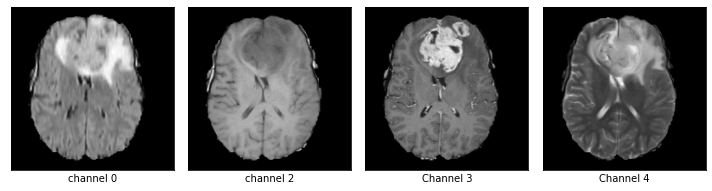

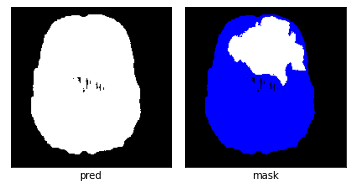

dice_loss : 0.1276855096754533



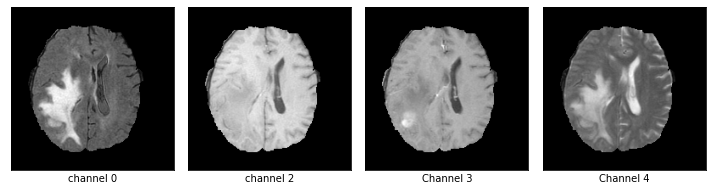

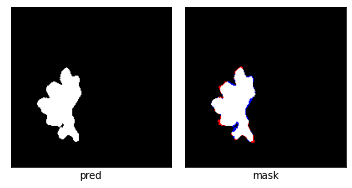

03/06 11:44:18 AM epoch 2 lr 2.467010e-02
03/06 11:44:18 AM genotype = Genotype(normal=[('sep_conv_3x3', 1), ('skip_connect', 0), ('skip_connect', 0), ('skip_connect', 2), ('skip_connect', 0), ('dil_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('skip_connect', 0), ('dil_conv_3x3', 2), ('sep_conv_3x3', 1), ('sep_conv_5x5', 2), ('skip_connect', 1), ('sep_conv_3x3', 1), ('skip_connect', 4)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<40:53,  1.04s/it, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<40:05,  1.02s/it, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:02<39:31,  1.01s/it, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:03<39:13,  1.00s/it, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.2365, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:04<38:50,  1.01it/s, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.2132, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:05<38:27,  1.02it/s, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.2449, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:06<38:20,  1.02it/s, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.2640, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:07<38:29,  1.02it/s, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:08<38:16,  1.02it/s, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:09<38:25,  1.02it/s, Acc=0.991, IoU=0.876, Loss=0.0671]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:10<38:03,  1.03it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.8934, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:11<37:56,  1.03it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.1729, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:12<38:03,  1.03it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.6060, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:13<37:54,  1.03it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.0368, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:14<37:37,  1.04it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:15<37:54,  1.03it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:16<38:03,  1.02it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.6657, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:17<37:50,  1.03it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.9693, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:18<37:41,  1.03it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:19<37:59,  1.02it/s, Acc=0.995, IoU=0.89, Loss=0.0583]

tensor(0.6805, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:20<37:55,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.6146, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:21<37:49,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:22<37:42,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.1142, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:23<37:52,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:24<37:40,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:25<37:31,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.4936, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:26<37:23,  1.04it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.0394, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:27<37:40,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.5055, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:28<37:41,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:29<37:41,  1.03it/s, Acc=0.995, IoU=0.885, Loss=0.0604]

tensor(0.2900, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:30<37:46,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:31<37:31,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.2240, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:32<37:30,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:33<37:48,  1.02it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.2055, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:34<37:45,  1.02it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.2092, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:35<37:40,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:36<37:39,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:37<37:22,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:38<37:36,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.1929, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:38<37:42,  1.02it/s, Acc=0.995, IoU=0.85, Loss=0.0824]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:39<37:42,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:40<37:55,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:41<37:54,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.9526, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:42<37:31,  1.03it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:43<37:29,  1.03it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.7702, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:44<37:49,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:45<37:51,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:46<37:36,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:47<37:32,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:48<37:29,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0728]

tensor(0.6825, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:49<37:26,  1.03it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.5651, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:50<37:27,  1.02it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.8728, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:51<37:44,  1.02it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.9020, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:52<37:34,  1.02it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.9918, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:53<37:29,  1.02it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:54<37:26,  1.02it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:55<37:10,  1.03it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:56<36:56,  1.04it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [00:57<37:05,  1.03it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.3318, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [00:58<37:06,  1.03it/s, Acc=0.996, IoU=0.787, Loss=0.121]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [00:59<36:58,  1.03it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.3248, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:00<36:49,  1.04it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.3054, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:01<37:04,  1.03it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.9157, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:02<37:13,  1.03it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:03<37:07,  1.03it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:04<37:03,  1.03it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:05<37:11,  1.03it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:06<37:18,  1.02it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.2810, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:07<37:09,  1.03it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:08<37:11,  1.02it/s, Acc=0.995, IoU=0.854, Loss=0.0801]

tensor(0.3634, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:09<37:44,  1.01it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.4776, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:10<37:50,  1.01it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.0437, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:11<37:51,  1.00it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.3014, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:12<37:34,  1.01it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.3034, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:13<37:24,  1.02it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:14<37:25,  1.01it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:15<37:16,  1.02it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:16<37:08,  1.02it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:17<37:11,  1.02it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:18<37:15,  1.02it/s, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:19<37:04,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.2558, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:20<37:07,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:21<37:17,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:22<37:15,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:23<37:06,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.9825, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:24<37:11,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:24<37:02,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:25<37:01,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.1262, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:26<37:01,  1.02it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.0971, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:27<36:48,  1.03it/s, Acc=0.988, IoU=0.79, Loss=0.118]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:28<37:01,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:29<36:53,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:30<36:52,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:31<36:49,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:32<37:04,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:33<37:26,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:34<37:21,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:35<37:03,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1589, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:36<37:11,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:37<37:11,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:38<37:00,  1.01it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:39<37:11,  1.01it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.1000, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:40<36:59,  1.01it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:41<37:19,  1.01it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:42<37:19,  1.00it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.3332, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:43<37:02,  1.01it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.4102, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:44<36:59,  1.01it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.2654, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:45<36:50,  1.02it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:46<36:45,  1.02it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:47<36:24,  1.03it/s, Acc=0.998, IoU=0.858, Loss=0.0793]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:48<36:22,  1.03it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:49<36:40,  1.02it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:50<36:16,  1.03it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:51<36:23,  1.03it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:52<36:22,  1.03it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:53<36:32,  1.02it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:54<36:45,  1.01it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.5730, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [01:55<36:39,  1.02it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [01:56<36:25,  1.02it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [01:57<36:17,  1.03it/s, Acc=0.984, IoU=0.83, Loss=0.0928]

tensor(0.1371, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [01:58<36:00,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [01:59<36:09,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2243, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:00<36:09,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:01<36:15,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.3054, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:02<36:10,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:03<36:15,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:04<36:35,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:05<36:33,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2964, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:06<36:30,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:07<36:16,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:08<36:18,  1.02it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:09<36:24,  1.02it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:10<36:29,  1.01it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:11<36:11,  1.02it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:12<35:55,  1.03it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.4399, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:13<36:10,  1.02it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:14<36:21,  1.02it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.3374, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:15<36:10,  1.02it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.9307, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:15<36:04,  1.02it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.9382, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:16<36:09,  1.02it/s, Acc=0.991, IoU=0.741, Loss=0.151]

tensor(0.1677, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:17<36:06,  1.02it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.1287, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:18<36:00,  1.02it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.1763, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:19<35:46,  1.03it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:20<35:51,  1.03it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:21<35:44,  1.03it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.1615, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:22<35:59,  1.02it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:23<35:52,  1.03it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:24<35:47,  1.03it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:25<35:35,  1.03it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:26<35:47,  1.03it/s, Acc=0.997, IoU=0.747, Loss=0.147]

tensor(0.1496, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:27<35:47,  1.03it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.4582, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:28<35:43,  1.03it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:29<35:47,  1.03it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:30<35:46,  1.03it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.3647, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:31<35:45,  1.03it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.4289, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:32<35:55,  1.02it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.1671, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:33<36:00,  1.02it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.2442, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:34<36:08,  1.01it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.1071, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:35<35:55,  1.02it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.1914, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:36<35:43,  1.02it/s, Acc=0.991, IoU=0.498, Loss=0.332]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:37<35:55,  1.02it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.1653, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:38<36:04,  1.01it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:39<36:01,  1.01it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:40<35:41,  1.02it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.3303, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:41<35:21,  1.03it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:42<35:09,  1.04it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:43<35:37,  1.02it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:44<35:25,  1.03it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:45<36:35,  1.00s/it, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:46<36:07,  1.01it/s, Acc=0.994, IoU=0.888, Loss=0.0595]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:47<35:56,  1.01it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.7963, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:48<36:03,  1.01it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:49<36:02,  1.01it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.7833, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:50<35:56,  1.01it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:51<35:40,  1.02it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:52<35:23,  1.03it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:53<35:31,  1.02it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.1941, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [02:54<35:25,  1.02it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [02:55<35:12,  1.03it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [02:56<35:19,  1.03it/s, Acc=0.951, IoU=0, Loss=0.999]

tensor(0.8158, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [02:57<35:17,  1.03it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [02:58<35:17,  1.03it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [02:59<35:09,  1.03it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.8625, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [02:59<34:50,  1.04it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:00<34:49,  1.04it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.7880, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:01<34:47,  1.04it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:02<34:39,  1.04it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:03<34:47,  1.04it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:04<34:59,  1.03it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.7100, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:05<35:11,  1.03it/s, Acc=0.997, IoU=0.909, Loss=0.0488]

tensor(0.7270, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:06<35:05,  1.03it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.6834, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:07<35:22,  1.02it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:08<35:25,  1.02it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:09<35:11,  1.02it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:10<35:19,  1.02it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:11<35:11,  1.02it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:12<35:08,  1.02it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:13<35:14,  1.02it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.3096, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:14<35:26,  1.01it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:15<35:18,  1.02it/s, Acc=0.996, IoU=0.822, Loss=0.0994]

tensor(0.3305, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:16<35:35,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:17<35:36,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.1436, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:18<35:37,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:19<35:17,  1.02it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.6295, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:20<35:20,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:21<35:38,  1.00it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:22<35:51,  1.00s/it, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.8631, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:23<35:42,  1.00it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.1506, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:24<35:13,  1.02it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:25<35:10,  1.02it/s, Acc=0.995, IoU=0.918, Loss=0.0431]

tensor(0.0435, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:26<35:03,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:27<35:07,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:28<35:00,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:29<34:59,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:30<34:46,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:31<35:03,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:32<34:57,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:33<34:56,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:34<34:57,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0449, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:35<35:08,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:36<34:42,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:37<34:49,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:38<34:32,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:39<34:31,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:40<34:23,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:41<34:28,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.3108, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:42<34:24,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1951, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:43<34:25,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:44<34:26,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:45<34:19,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0404, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:45<34:15,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:46<34:27,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:47<34:44,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:48<34:47,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:49<34:31,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:50<34:20,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:51<34:19,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.4854, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [03:52<34:08,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [03:53<33:55,  1.04it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1341, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [03:54<34:08,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [03:55<34:17,  1.03it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.1495, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [03:56<34:27,  1.02it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.7551, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [03:57<34:15,  1.03it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [03:58<34:22,  1.02it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.1878, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [03:59<34:00,  1.03it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.2031, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:00<33:50,  1.04it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.3281, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:01<33:54,  1.04it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:02<33:49,  1.04it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.4841, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:03<33:45,  1.04it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.4356, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:04<33:45,  1.04it/s, Acc=0.996, IoU=0.945, Loss=0.029]

tensor(0.7540, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:05<33:46,  1.04it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.9865, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:06<33:57,  1.03it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:07<33:52,  1.03it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.1374, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:08<34:06,  1.03it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.6678, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:09<33:54,  1.03it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.9874, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:10<33:49,  1.03it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.1680, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:11<33:42,  1.04it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.1377, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:12<33:35,  1.04it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.9900, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:13<33:38,  1.04it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.4853, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:14<33:37,  1.04it/s, Acc=0.995, IoU=0.624, Loss=0.234]

tensor(0.1958, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:15<33:37,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:16<33:58,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:17<33:49,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:17<33:52,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:18<34:00,  1.02it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:19<33:59,  1.02it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:20<34:02,  1.02it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:21<33:49,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:22<33:40,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:23<33:41,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2186, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:24<33:59,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:25<34:03,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:26<33:58,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:27<33:45,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:28<33:46,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.3055, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:29<33:46,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9018, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:30<33:40,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:31<33:25,  1.04it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:32<33:28,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:33<33:41,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:34<33:21,  1.04it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:35<33:23,  1.03it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.4098, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:36<33:24,  1.03it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:37<33:11,  1.04it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:38<33:07,  1.04it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.1503, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:39<33:05,  1.04it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:40<33:08,  1.04it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.2981, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:41<32:58,  1.04it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.0468, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:42<32:57,  1.04it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:43<33:07,  1.04it/s, Acc=0.997, IoU=0.864, Loss=0.0748]

tensor(0.1489, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:44<32:51,  1.05it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.5040, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:45<33:01,  1.04it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.0405, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:46<33:05,  1.04it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:46<32:57,  1.04it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:47<32:52,  1.04it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.3618, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:48<33:00,  1.04it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:49<32:54,  1.04it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [04:50<32:55,  1.04it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [04:51<32:56,  1.04it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [04:52<33:05,  1.03it/s, Acc=0.917, IoU=0, Loss=1]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [04:53<33:07,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.1490, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [04:54<33:07,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [04:55<33:14,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.9100, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [04:56<33:10,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [04:57<33:02,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.1259, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [04:58<33:14,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.2032, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [04:59<33:14,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.5121, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:00<33:15,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:01<33:21,  1.02it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.1189, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:02<33:14,  1.03it/s, Acc=0.996, IoU=0.881, Loss=0.0624]

tensor(0.1259, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:03<33:05,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:04<33:06,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:05<32:57,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:06<32:41,  1.04it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:07<33:06,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:08<33:12,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1630, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:09<32:56,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:10<32:46,  1.04it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:11<32:47,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.3317, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:12<32:41,  1.04it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:13<32:53,  1.03it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:14<32:55,  1.03it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.1612, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:15<32:52,  1.03it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:16<32:49,  1.03it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:17<32:51,  1.03it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.4529, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:18<32:40,  1.03it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:18<32:28,  1.04it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.1658, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:19<32:37,  1.04it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.9853, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:20<32:48,  1.03it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:21<32:42,  1.03it/s, Acc=0.999, IoU=0.66, Loss=0.21]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:22<32:45,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:23<33:03,  1.02it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.9891, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:24<32:59,  1.02it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:25<32:41,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.6910, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:26<32:25,  1.04it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:27<32:41,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:28<32:38,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:29<32:37,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:30<32:47,  1.02it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.9534, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:31<32:43,  1.03it/s, Acc=0.995, IoU=0.863, Loss=0.0746]

tensor(0.3269, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:32<32:53,  1.02it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.9855, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:33<32:57,  1.02it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.8981, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:34<32:47,  1.02it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.1298, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:35<32:31,  1.03it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:36<32:26,  1.03it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:37<32:38,  1.03it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.1436, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:38<32:13,  1.04it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:39<32:21,  1.03it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.0378, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:40<32:19,  1.03it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.7393, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:41<32:20,  1.03it/s, Acc=0.974, IoU=0.245, Loss=0.607]

tensor(0.1755, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:42<32:14,  1.04it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:43<32:21,  1.03it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.0975, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:44<32:26,  1.03it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:45<32:23,  1.03it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.6560, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:46<32:34,  1.02it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:47<32:30,  1.02it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [05:48<32:20,  1.03it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.9895, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [05:49<32:33,  1.02it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.1142, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [05:50<32:40,  1.02it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [05:51<32:20,  1.03it/s, Acc=1, IoU=0, Loss=0.914]

tensor(0.6254, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [05:52<32:21,  1.03it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.5845, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [05:53<32:13,  1.03it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [05:53<32:13,  1.03it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [05:54<32:13,  1.03it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [05:55<32:29,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [05:56<32:24,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.0943, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [05:57<32:30,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [05:58<32:37,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [05:59<32:21,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:00<32:17,  1.02it/s, Acc=0.997, IoU=0.958, Loss=0.022]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:01<32:16,  1.02it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:02<32:09,  1.03it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.6379, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:03<32:06,  1.03it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:04<32:07,  1.03it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.4726, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:05<31:59,  1.03it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.1799, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:06<32:02,  1.03it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:07<32:02,  1.03it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.4445, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:08<32:07,  1.03it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.6502, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:09<32:08,  1.02it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:10<32:11,  1.02it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:11<31:59,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:12<32:09,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.6445, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:13<32:06,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.3321, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:14<32:01,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:15<31:48,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:16<31:51,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:17<32:02,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.5537, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:18<31:47,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:19<32:12,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.3503, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:20<32:09,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:21<32:21,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.2651, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:22<32:15,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:23<32:24,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.3675, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:24<32:24,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:25<32:17,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:26<32:22,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:27<32:16,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:28<32:08,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.5064, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:29<32:25,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:30<32:28,  1.00it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.3748, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:31<32:06,  1.01it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.1084, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:32<31:58,  1.02it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.2228, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:33<32:18,  1.01it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:34<32:02,  1.01it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:35<32:03,  1.01it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:36<32:01,  1.01it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.9798, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:37<31:40,  1.03it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.5795, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:38<31:30,  1.03it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:39<31:52,  1.02it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.6224, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:40<31:55,  1.02it/s, Acc=0.995, IoU=0.939, Loss=0.0321]

tensor(0.9786, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:41<31:54,  1.02it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:42<31:38,  1.02it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:43<31:37,  1.02it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:43<31:16,  1.03it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:44<31:12,  1.04it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.1618, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:45<31:07,  1.04it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.0196, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [06:46<31:00,  1.04it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [06:47<30:58,  1.04it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.1360, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [06:48<31:00,  1.04it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.0355, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [06:49<30:57,  1.04it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.1965, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [06:50<30:58,  1.04it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.5258, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [06:51<31:07,  1.03it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.0126, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [06:52<31:05,  1.04it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [06:53<31:09,  1.03it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.4954, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [06:54<30:53,  1.04it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.2396, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [06:55<30:51,  1.04it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.9674, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [06:56<30:46,  1.04it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.0468, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [06:57<30:55,  1.04it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [06:58<30:50,  1.04it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.2697, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [06:59<30:39,  1.05it/s, Acc=0.992, IoU=0.858, Loss=0.0759]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:00<30:54,  1.04it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:01<31:03,  1.03it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.4616, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:02<31:07,  1.03it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:03<31:10,  1.03it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:04<30:58,  1.03it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.2779, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:05<31:12,  1.02it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:06<31:13,  1.02it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:07<31:03,  1.03it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:08<30:58,  1.03it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.2015, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:09<31:01,  1.03it/s, Acc=0.996, IoU=0.912, Loss=0.0474]

tensor(0.9882, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:10<31:05,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:11<31:00,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.5564, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:11<30:57,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3835, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:12<31:04,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1632, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:13<30:57,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:14<30:54,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.2353, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:15<30:45,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3306, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:16<30:50,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.5230, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:17<30:43,  1.03it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:18<30:33,  1.04it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:19<30:44,  1.03it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.9716, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:20<30:44,  1.03it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:21<30:48,  1.03it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:22<30:39,  1.03it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:23<30:36,  1.03it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.1588, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:24<30:28,  1.04it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.1596, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:25<30:29,  1.04it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:26<30:43,  1.03it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.6677, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:27<30:32,  1.03it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.1673, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:28<30:32,  1.03it/s, Acc=0.995, IoU=0.677, Loss=0.197]

tensor(0.0378, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:29<30:44,  1.03it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:30<30:50,  1.02it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:31<30:39,  1.03it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.1533, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:32<30:48,  1.02it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.5951, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:33<31:01,  1.02it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:34<30:50,  1.02it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:35<30:38,  1.03it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:36<30:52,  1.02it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.3973, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:37<30:43,  1.02it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:38<30:33,  1.03it/s, Acc=0.98, IoU=0.764, Loss=0.133]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:39<30:23,  1.03it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:40<30:28,  1.03it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.1132, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:41<30:31,  1.03it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.3581, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:42<30:24,  1.03it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:43<30:13,  1.04it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.9529, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [07:44<30:20,  1.03it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [07:44<30:14,  1.04it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.7005, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [07:45<30:25,  1.03it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.2805, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [07:46<30:19,  1.03it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.1413, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [07:47<30:13,  1.03it/s, Acc=0.986, IoU=0.8, Loss=0.113]

tensor(0.4136, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [07:48<30:22,  1.03it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [07:49<30:18,  1.03it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [07:50<30:27,  1.02it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.2132, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [07:51<30:34,  1.02it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [07:52<30:27,  1.02it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.2840, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [07:53<30:09,  1.03it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.4556, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [07:54<30:08,  1.03it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [07:55<29:54,  1.04it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.9327, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [07:56<29:50,  1.04it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [07:57<29:59,  1.04it/s, Acc=0.991, IoU=0.82, Loss=0.0996]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [07:58<29:51,  1.04it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [07:59<29:57,  1.04it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:00<29:55,  1.04it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.2955, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:01<30:01,  1.03it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.9578, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:02<29:57,  1.03it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:03<29:53,  1.04it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.4648, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:04<29:53,  1.04it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:05<29:40,  1.04it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.2992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:06<29:37,  1.04it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.6129, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:07<29:43,  1.04it/s, Acc=0.995, IoU=0.676, Loss=0.192]

tensor(0.3303, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:08<29:48,  1.04it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1530, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:09<29:50,  1.03it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:10<29:46,  1.04it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:11<29:52,  1.03it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1421, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:12<29:38,  1.04it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.2480, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:12<29:30,  1.04it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.3439, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:13<29:27,  1.05it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.2596, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:14<29:19,  1.05it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:15<29:26,  1.04it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:16<29:21,  1.05it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1390, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:17<29:19,  1.05it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:18<29:39,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:19<29:35,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1333, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:20<29:25,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:21<29:24,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:22<29:36,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:23<29:28,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.2316, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:24<29:16,  1.05it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0433, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:25<29:26,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9866, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:26<29:21,  1.04it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:27<29:31,  1.04it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:28<29:36,  1.03it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:29<29:26,  1.04it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.2600, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:30<29:34,  1.03it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:31<29:34,  1.03it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:32<29:25,  1.04it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.3017, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:33<29:30,  1.03it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:34<29:38,  1.03it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:35<29:32,  1.03it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:36<29:22,  1.04it/s, Acc=0.989, IoU=0.886, Loss=0.0615]

tensor(0.2971, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:37<29:14,  1.04it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:38<29:31,  1.03it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:39<29:22,  1.03it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:39<29:16,  1.04it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:40<29:10,  1.04it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [08:41<29:02,  1.04it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.5745, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [08:42<29:05,  1.04it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [08:43<29:02,  1.04it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [08:44<29:04,  1.04it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.1523, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [08:45<29:04,  1.04it/s, Acc=0.996, IoU=0.923, Loss=0.0403]

tensor(0.3029, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [08:46<28:57,  1.04it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [08:47<28:59,  1.04it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [08:48<29:06,  1.04it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [08:49<28:56,  1.04it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [08:50<29:13,  1.03it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.1296, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [08:51<29:10,  1.03it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.5354, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [08:52<29:08,  1.03it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.2465, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [08:53<29:06,  1.03it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.9841, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [08:54<29:02,  1.04it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [08:55<28:59,  1.04it/s, Acc=1, IoU=0, Loss=0.0142]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [08:56<28:55,  1.04it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.0073, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [08:57<29:03,  1.03it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [08:58<28:56,  1.04it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.2404, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [08:59<29:00,  1.03it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:00<29:01,  1.03it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:01<28:57,  1.04it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:02<29:00,  1.03it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.6994, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:03<29:05,  1.03it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:04<28:54,  1.04it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:05<28:54,  1.03it/s, Acc=0.999, IoU=0.818, Loss=0.1]

tensor(0.0264, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:06<28:56,  1.03it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.2600, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:06<28:52,  1.03it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.1575, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:07<28:45,  1.04it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.2488, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:08<28:50,  1.04it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:09<28:33,  1.04it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.9872, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:10<28:27,  1.05it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:11<28:31,  1.04it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:12<28:39,  1.04it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.2400, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:13<28:42,  1.04it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.0074, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:14<28:54,  1.03it/s, Acc=0.993, IoU=0.906, Loss=0.0494]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:15<28:49,  1.03it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.3098, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:16<28:54,  1.03it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:17<28:46,  1.03it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.6475, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:18<28:51,  1.03it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:19<28:54,  1.03it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.1868, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:20<29:02,  1.02it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:21<29:00,  1.02it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:22<28:49,  1.03it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:23<29:00,  1.02it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.8871, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:24<29:28,  1.00it/s, Acc=0.995, IoU=0.92, Loss=0.0431]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:25<29:09,  1.01it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.6699, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:26<29:02,  1.02it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.5513, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:27<29:03,  1.02it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:28<28:56,  1.02it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:29<28:57,  1.02it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:30<29:08,  1.01it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.5154, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:31<28:58,  1.02it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:32<28:50,  1.02it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:33<28:46,  1.02it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.0963, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:34<28:39,  1.03it/s, Acc=0.995, IoU=0.842, Loss=0.086]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:35<28:37,  1.03it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:36<28:28,  1.03it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.5116, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:37<28:14,  1.04it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:38<28:13,  1.04it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [09:39<28:06,  1.04it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [09:40<28:06,  1.04it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.5076, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [09:41<28:18,  1.04it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [09:41<28:14,  1.04it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [09:42<28:10,  1.04it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.1391, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [09:43<28:03,  1.04it/s, Acc=0.991, IoU=0.66, Loss=0.206]

tensor(0.2758, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [09:44<27:59,  1.04it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [09:45<28:12,  1.04it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.5547, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [09:46<28:15,  1.03it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [09:47<28:05,  1.04it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [09:48<28:05,  1.04it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.3036, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [09:49<28:00,  1.04it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.6961, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [09:50<28:05,  1.04it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.9912, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [09:51<28:15,  1.03it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.3355, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [09:52<28:15,  1.03it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [09:53<28:21,  1.03it/s, Acc=0.992, IoU=0.365, Loss=0.463]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [09:54<28:06,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [09:55<28:05,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [09:56<28:04,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [09:57<28:17,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [09:58<28:09,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.0063, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [09:59<28:05,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.1221, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:00<27:59,  1.04it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:01<28:02,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.3345, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:02<28:00,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:03<28:01,  1.03it/s, Acc=0.986, IoU=0.772, Loss=0.127]

tensor(0.4222, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:04<28:07,  1.03it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.0069, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:05<28:10,  1.03it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:06<28:10,  1.02it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.9158, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:07<28:09,  1.02it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:08<27:49,  1.04it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:09<28:00,  1.03it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.3488, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:10<28:08,  1.02it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:11<28:02,  1.03it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:12<27:58,  1.03it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.1651, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:12<27:54,  1.03it/s, Acc=0.984, IoU=0.751, Loss=0.144]

tensor(0.5001, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:13<27:43,  1.04it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:14<27:55,  1.03it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.6260, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:15<27:52,  1.03it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.2193, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:16<27:51,  1.03it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:17<27:55,  1.03it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.7145, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:18<27:49,  1.03it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:19<27:50,  1.03it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.4798, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:20<27:43,  1.03it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:21<27:54,  1.02it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.5679, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:22<27:44,  1.03it/s, Acc=0.986, IoU=0.793, Loss=0.117]

tensor(0.0511, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:23<27:54,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.4437, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:24<27:56,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:25<27:54,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:26<27:48,  1.03it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:27<27:37,  1.03it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.0534, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:28<27:35,  1.03it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.8475, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:29<27:24,  1.04it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.1917, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:30<27:17,  1.04it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.1519, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:31<27:27,  1.04it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.7725, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:32<27:24,  1.04it/s, Acc=0.994, IoU=0.92, Loss=0.0421]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:33<27:36,  1.03it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:34<27:38,  1.03it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.1695, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:35<27:32,  1.03it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:36<27:19,  1.04it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.1536, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [10:37<27:21,  1.04it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.6491, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [10:38<27:16,  1.04it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.2446, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [10:39<27:08,  1.04it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.1340, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [10:40<27:14,  1.04it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [10:41<27:05,  1.04it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [10:42<27:18,  1.03it/s, Acc=0.994, IoU=0.764, Loss=0.133]

tensor(0.7256, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [10:43<27:50,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1656, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [10:44<27:42,  1.02it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [10:45<27:37,  1.02it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.4571, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [10:45<27:30,  1.02it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [10:46<27:29,  1.02it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.5259, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [10:47<27:17,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [10:48<27:13,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9093, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [10:49<27:14,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.4403, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [10:50<27:10,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.6409, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [10:51<27:14,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [10:52<27:13,  1.03it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [10:53<27:22,  1.02it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.0981, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [10:54<27:09,  1.03it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.2900, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [10:55<27:02,  1.04it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.3133, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [10:56<27:04,  1.03it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [10:57<27:09,  1.03it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [10:58<27:07,  1.03it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.8976, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [10:59<26:54,  1.04it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:00<27:08,  1.03it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:01<26:57,  1.04it/s, Acc=0.969, IoU=0.594, Loss=0.253]

tensor(0.0744, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:02<27:02,  1.03it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.4880, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:03<27:19,  1.02it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:04<27:16,  1.02it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:05<27:09,  1.03it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.3031, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:06<26:52,  1.04it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.7089, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:07<26:49,  1.04it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.3664, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:08<26:49,  1.04it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:09<26:58,  1.03it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.5360, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:10<26:58,  1.03it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.1765, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:11<26:53,  1.03it/s, Acc=0.984, IoU=0.741, Loss=0.152]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:12<26:44,  1.04it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.1255, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:13<26:34,  1.04it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:14<26:42,  1.04it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.6015, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:15<26:49,  1.03it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:16<27:05,  1.02it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:16<26:52,  1.03it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.1488, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:17<26:49,  1.03it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.1600, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:18<27:00,  1.02it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.2866, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:19<27:08,  1.02it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.4020, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:20<26:57,  1.02it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:21<26:46,  1.03it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:22<26:43,  1.03it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.8898, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:23<26:53,  1.02it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:24<26:43,  1.03it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:25<26:32,  1.04it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:26<26:31,  1.04it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:27<26:26,  1.04it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.2978, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:28<26:27,  1.04it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.6845, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:29<26:31,  1.03it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.4402, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:30<27:01,  1.01it/s, Acc=0.99, IoU=0.695, Loss=0.181]

tensor(0.9568, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:31<27:02,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:32<27:11,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:33<27:01,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:34<26:56,  1.02it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [11:35<26:46,  1.02it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [11:36<26:42,  1.02it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.2760, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [11:37<26:47,  1.02it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [11:38<27:03,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [11:39<26:54,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.4718, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [11:40<27:07,  1.00it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [11:41<26:51,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [11:42<26:45,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0468, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [11:43<26:41,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [11:44<26:35,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [11:45<26:31,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9683, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [11:46<26:19,  1.03it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [11:47<26:18,  1.03it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [11:48<26:28,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [11:49<26:23,  1.03it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.3033, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [11:50<26:18,  1.03it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [11:51<26:10,  1.03it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [11:52<26:21,  1.03it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0276, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [11:53<26:23,  1.02it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.3967, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [11:54<26:22,  1.02it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [11:55<26:16,  1.03it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [11:56<26:07,  1.03it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [11:57<26:00,  1.04it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.2778, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [11:57<25:57,  1.04it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [11:58<26:09,  1.03it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.2571, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [11:59<26:06,  1.03it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:00<25:55,  1.04it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.3294, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:01<26:05,  1.03it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:02<26:17,  1.02it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:03<26:18,  1.02it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:04<26:11,  1.02it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.2225, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:05<26:08,  1.03it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:06<25:52,  1.04it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:07<25:54,  1.03it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.1690, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:08<25:48,  1.04it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:09<26:05,  1.03it/s, Acc=0.971, IoU=0.15, Loss=0.74]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:10<26:03,  1.03it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:11<26:05,  1.02it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:12<26:20,  1.01it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:13<26:14,  1.02it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.4553, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:14<26:10,  1.02it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.0397, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:15<25:59,  1.03it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:16<26:13,  1.02it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.1565, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:17<26:12,  1.02it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.0222, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:18<26:06,  1.02it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:19<26:07,  1.02it/s, Acc=0.998, IoU=0.78, Loss=0.123]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:20<26:06,  1.02it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:21<26:04,  1.02it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.1355, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:22<26:10,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:23<26:10,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:24<26:03,  1.02it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.1255, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:25<26:10,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:26<26:04,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:27<25:50,  1.02it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:28<25:40,  1.03it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:29<25:49,  1.02it/s, Acc=0.997, IoU=0.862, Loss=0.0753]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:30<25:53,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.4912, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:31<25:48,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:32<25:49,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [12:33<25:41,  1.03it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.1707, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [12:34<25:52,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [12:35<26:00,  1.01it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.1489, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [12:36<25:57,  1.01it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [12:37<25:41,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.0745, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [12:38<25:30,  1.03it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.1402, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [12:39<25:38,  1.02it/s, Acc=0.994, IoU=0.931, Loss=0.0357]

tensor(0.7006, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [12:40<25:40,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [12:41<26:06,  1.00it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.5381, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [12:42<26:16,  1.00s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [12:43<26:29,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [12:44<26:09,  1.00it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [12:45<25:59,  1.01it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [12:46<25:50,  1.01it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [12:47<25:42,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [12:48<25:28,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9021, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [12:49<25:31,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1622, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [12:50<25:38,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.7854, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [12:50<25:29,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.9898, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [12:51<25:28,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.9691, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [12:52<25:24,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [12:53<25:24,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [12:54<25:23,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [12:55<25:23,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.6603, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [12:56<25:31,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.1678, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [12:57<25:20,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.5238, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [12:58<25:11,  1.03it/s, Acc=0.995, IoU=0.928, Loss=0.039]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [12:59<25:15,  1.03it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.0356, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:00<25:25,  1.02it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.6102, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:01<25:15,  1.02it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:02<25:04,  1.03it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.0106, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:03<25:03,  1.03it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:04<25:18,  1.02it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.1717, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:05<25:07,  1.03it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:06<25:16,  1.02it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.4071, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:07<25:16,  1.02it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:08<25:08,  1.02it/s, Acc=0.994, IoU=0.55, Loss=0.291]

tensor(0.3508, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:09<25:12,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.4938, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:10<25:03,  1.03it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.7695, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:11<24:54,  1.03it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.0202, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:12<25:07,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:13<24:59,  1.03it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.0490, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:14<25:13,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.3455, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:15<25:16,  1.01it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:16<25:07,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:17<25:11,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:18<25:16,  1.01it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.9688, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:19<25:08,  1.02it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:20<25:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:21<25:27,  1.00it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:22<25:22,  1.01it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.0451, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:23<25:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:24<25:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:25<24:51,  1.02it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.9015, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:26<24:58,  1.02it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.9552, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:27<24:52,  1.02it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:28<24:46,  1.03it/s, Acc=1, IoU=0, Loss=0.00362]

tensor(0.4205, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:29<24:39,  1.03it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.1631, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:30<24:36,  1.03it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [13:31<24:38,  1.03it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.3094, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [13:32<24:43,  1.03it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [13:33<24:50,  1.02it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [13:34<25:12,  1.00it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [13:35<25:17,  1.00it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [13:36<25:05,  1.01it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.9886, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [13:37<25:12,  1.00it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [13:38<24:56,  1.01it/s, Acc=0.991, IoU=0.769, Loss=0.133]

tensor(0.6561, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [13:39<24:53,  1.01it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [13:40<24:53,  1.01it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.9832, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [13:41<25:03,  1.01it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.8051, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [13:42<24:59,  1.01it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [13:43<24:48,  1.01it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.4749, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [13:43<24:45,  1.02it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.1832, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [13:44<24:46,  1.01it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.1892, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [13:45<24:34,  1.02it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [13:46<24:29,  1.02it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.7653, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [13:47<24:32,  1.02it/s, Acc=0.994, IoU=0.56, Loss=0.283]

tensor(0.1765, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [13:48<24:37,  1.02it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [13:49<24:36,  1.02it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [13:50<24:23,  1.03it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [13:51<24:10,  1.04it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [13:52<24:22,  1.03it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [13:53<24:21,  1.03it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [13:54<24:25,  1.02it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.7020, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [13:55<24:30,  1.02it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.2854, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [13:56<24:26,  1.02it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [13:57<24:29,  1.02it/s, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [13:58<24:42,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.7546, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [13:59<24:45,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:00<24:46,  1.00it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:01<24:35,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.6981, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:02<24:36,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:03<24:34,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:04<24:28,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.0955, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:05<24:34,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.6786, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:06<24:29,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:07<24:26,  1.01it/s, Acc=0.988, IoU=0.371, Loss=0.458]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:08<24:11,  1.02it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.0334, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:09<24:11,  1.02it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:10<24:17,  1.02it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:11<24:15,  1.02it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.2429, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:12<24:25,  1.01it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.1874, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:13<24:29,  1.01it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.0328, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:14<24:24,  1.01it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:15<24:11,  1.02it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.3766, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:16<24:15,  1.01it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:17<24:21,  1.01it/s, Acc=0.99, IoU=0.812, Loss=0.103]

tensor(0.1440, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:18<24:18,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:19<24:18,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1451, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:20<24:10,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1683, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:21<24:20,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.7292, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:22<24:04,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:23<23:54,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:24<24:07,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.2910, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:25<23:53,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:26<23:53,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:27<23:56,  1.02it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.7013, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:28<23:59,  1.02it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:29<24:06,  1.01it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.1614, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [14:30<24:10,  1.01it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [14:31<24:09,  1.01it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [14:32<24:08,  1.01it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [14:33<23:58,  1.01it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.0431, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [14:34<24:11,  1.00it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.4536, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [14:35<24:25,  1.01s/it, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [14:36<24:09,  1.00it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [14:37<24:06,  1.01it/s, Acc=0.991, IoU=0.837, Loss=0.0907]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [14:38<24:01,  1.01it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.2079, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [14:39<23:45,  1.02it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [14:40<23:38,  1.02it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.0388, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [14:41<23:52,  1.01it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [14:42<23:38,  1.02it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [14:43<23:33,  1.03it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [14:44<23:27,  1.03it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [14:45<23:30,  1.03it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.2225, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [14:45<23:22,  1.03it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [14:46<23:22,  1.03it/s, Acc=0.992, IoU=0.838, Loss=0.0884]

tensor(0.5191, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [14:47<23:20,  1.03it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.1438, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [14:48<23:28,  1.02it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.1552, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [14:49<23:29,  1.02it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.7319, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [14:50<23:29,  1.02it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.2894, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [14:51<23:29,  1.02it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.1399, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [14:52<23:24,  1.02it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.0896, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [14:53<23:19,  1.03it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [14:54<23:25,  1.02it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [14:55<23:23,  1.02it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [14:56<23:21,  1.02it/s, Acc=0.964, IoU=0, Loss=0.999]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [14:57<23:21,  1.02it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [14:58<23:24,  1.02it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [14:59<23:26,  1.02it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:00<23:18,  1.02it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.1596, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:01<23:15,  1.02it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.1387, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:02<23:05,  1.03it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.6573, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:03<23:06,  1.03it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:04<23:07,  1.03it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:05<23:08,  1.03it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.1606, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:06<23:02,  1.03it/s, Acc=1, IoU=0, Loss=0.00653]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:07<23:04,  1.03it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1481, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:08<23:17,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.6410, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:09<23:10,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:10<23:17,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:11<23:10,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.6387, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:12<23:18,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:13<23:09,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.2009, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:14<23:00,  1.03it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0408, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:15<23:08,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.2321, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:16<23:14,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:17<23:00,  1.02it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:18<23:14,  1.01it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.2945, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:19<23:14,  1.01it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:20<23:07,  1.02it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:21<23:08,  1.02it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:22<23:11,  1.01it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:23<23:16,  1.01it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.2973, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:24<23:14,  1.01it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:25<23:12,  1.01it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:26<23:18,  1.00it/s, Acc=0.995, IoU=0.815, Loss=0.102]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:27<23:18,  1.00it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:28<23:21,  1.00it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [15:29<23:05,  1.01it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [15:30<22:57,  1.02it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [15:31<22:47,  1.02it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [15:32<22:44,  1.03it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [15:33<22:47,  1.02it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.5338, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [15:34<22:53,  1.02it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [15:35<22:46,  1.02it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [15:36<22:44,  1.02it/s, Acc=0.988, IoU=0.868, Loss=0.0716]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [15:36<22:46,  1.02it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [15:37<22:49,  1.02it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.9898, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [15:38<22:38,  1.02it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.6813, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [15:39<22:37,  1.02it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.1705, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [15:40<22:44,  1.02it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [15:41<22:29,  1.03it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.4749, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [15:42<22:30,  1.03it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [15:43<22:29,  1.03it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.6723, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [15:44<22:35,  1.02it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [15:45<22:31,  1.02it/s, Acc=0.994, IoU=0.564, Loss=0.279]

tensor(0.2497, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [15:46<22:29,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [15:47<22:38,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0506, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [15:48<22:37,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [15:49<22:29,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [15:50<22:27,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.8560, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [15:51<22:18,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [15:52<22:13,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [15:53<22:20,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [15:54<22:24,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [15:55<22:18,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [15:56<22:18,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.5491, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [15:57<22:16,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1862, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [15:58<22:21,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1882, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [15:59<22:14,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:00<22:28,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1427, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:01<22:28,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:02<22:33,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:03<22:32,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:04<22:26,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:05<22:22,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.5209, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:06<22:17,  1.02it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.3410, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:07<22:03,  1.03it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.2039, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:08<21:58,  1.03it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.1179, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:09<21:54,  1.04it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:10<21:56,  1.03it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:11<21:52,  1.04it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:12<21:42,  1.04it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:13<21:50,  1.04it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.9480, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:14<22:04,  1.02it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.0416, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:15<21:54,  1.03it/s, Acc=0.992, IoU=0.814, Loss=0.103]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:15<21:55,  1.03it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:16<22:02,  1.02it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:17<22:02,  1.02it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:18<21:56,  1.03it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:19<21:46,  1.03it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:20<21:43,  1.03it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:21<21:46,  1.03it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.5237, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:22<22:01,  1.02it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:23<21:56,  1.02it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.2719, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:24<22:02,  1.02it/s, Acc=0.992, IoU=0.904, Loss=0.0516]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:25<21:47,  1.03it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [16:26<21:50,  1.02it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.0260, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [16:27<22:01,  1.02it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [16:28<21:50,  1.02it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [16:29<21:56,  1.02it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [16:30<21:58,  1.02it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [16:31<21:50,  1.02it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [16:32<21:51,  1.02it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.2859, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [16:33<21:55,  1.02it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.4940, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [16:34<22:02,  1.01it/s, Acc=0.99, IoU=0.473, Loss=0.359]

tensor(0.6503, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [16:35<22:00,  1.01it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.2691, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [16:36<21:47,  1.02it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.3153, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [16:37<21:49,  1.02it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.4227, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [16:38<21:43,  1.02it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [16:39<21:41,  1.02it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [16:40<21:45,  1.02it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [16:41<22:09,  1.00s/it, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.2415, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [16:42<21:50,  1.01it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [16:43<22:03,  1.00it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [16:44<21:49,  1.01it/s, Acc=0.991, IoU=0.898, Loss=0.0536]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [16:45<21:38,  1.02it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.2717, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [16:46<21:42,  1.02it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [16:47<21:37,  1.02it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [16:48<21:41,  1.02it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.2702, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [16:49<21:39,  1.02it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.6252, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [16:50<21:45,  1.01it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.1639, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [16:51<21:54,  1.00it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [16:52<21:39,  1.01it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.3644, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [16:53<21:36,  1.02it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [16:54<21:28,  1.02it/s, Acc=0.985, IoU=0.114, Loss=0.795]

tensor(0.2999, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [16:55<21:25,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [16:56<21:29,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [16:57<21:27,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [16:58<21:28,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [16:59<21:34,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:00<21:33,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0981, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:01<21:27,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.2678, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:02<21:31,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:03<21:23,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.2568, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:04<21:27,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3020, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:05<21:22,  1.02it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:06<21:32,  1.01it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:07<21:28,  1.01it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:08<21:17,  1.02it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:09<21:06,  1.03it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.2525, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:10<21:10,  1.02it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:11<21:15,  1.02it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:12<21:13,  1.02it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.5174, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:13<21:07,  1.02it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:13<21:02,  1.03it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:14<21:04,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:15<21:11,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.2462, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:16<21:02,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.1370, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:17<20:54,  1.03it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:18<20:52,  1.03it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0375, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:19<20:49,  1.03it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:20<20:50,  1.03it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0627, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:21<21:01,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.5174, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:22<21:02,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:23<21:04,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.4685, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:24<20:55,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:25<20:47,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [17:26<20:37,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1318, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [17:27<20:37,  1.04it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [17:28<20:42,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.5278, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [17:29<20:40,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1606, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [17:30<20:44,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.3911, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [17:31<20:49,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.2499, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [17:32<20:49,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [17:33<21:00,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [17:34<20:56,  1.01it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.1644, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [17:35<20:56,  1.01it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [17:36<21:00,  1.01it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [17:37<20:49,  1.02it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [17:38<20:43,  1.02it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [17:39<20:39,  1.02it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.2819, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [17:40<20:41,  1.02it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.0431, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [17:41<20:32,  1.03it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.1123, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [17:42<20:30,  1.03it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [17:43<20:28,  1.03it/s, Acc=0.997, IoU=0.845, Loss=0.0871]

tensor(0.3018, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [17:44<20:20,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.6234, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [17:45<20:28,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [17:46<20:26,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2918, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [17:47<20:21,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [17:48<20:19,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0826, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [17:49<20:18,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [17:50<20:22,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [17:51<20:15,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [17:51<20:12,  1.04it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [17:52<20:13,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [17:53<20:20,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [17:54<20:11,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.5540, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [17:55<20:02,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.4177, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [17:56<20:05,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2634, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [17:57<20:06,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.5715, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [17:58<20:06,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [17:59<19:59,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:00<19:56,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:01<20:01,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:02<20:01,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:03<20:11,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1702, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:04<20:22,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.6774, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:05<20:16,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:06<20:11,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9767, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:07<20:03,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.3027, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:08<19:53,  1.04it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:09<19:56,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.5190, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:10<20:04,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1505, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:11<19:51,  1.04it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0419, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:12<19:47,  1.04it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:13<20:05,  1.02it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:14<20:04,  1.02it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:15<19:58,  1.03it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:16<19:49,  1.03it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:17<19:50,  1.03it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:18<19:47,  1.04it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.2291, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:19<19:48,  1.03it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.1105, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:20<19:46,  1.03it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.2421, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:21<19:45,  1.03it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:21<19:40,  1.04it/s, Acc=0.973, IoU=0.0149, Loss=0.969]

tensor(0.6782, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:22<19:49,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1499, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:23<19:54,  1.02it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.2767, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:24<19:46,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.5360, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [18:25<19:41,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.2050, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [18:26<19:46,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [18:27<19:49,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.5306, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [18:28<19:39,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [18:29<19:40,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [18:30<19:40,  1.03it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.6284, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [18:31<19:32,  1.04it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [18:32<19:33,  1.03it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.1543, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [18:33<19:45,  1.02it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [18:34<19:52,  1.02it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.2390, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [18:35<19:45,  1.02it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [18:36<19:34,  1.03it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [18:37<19:33,  1.03it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [18:38<19:33,  1.03it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.1450, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [18:39<19:28,  1.03it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [18:40<19:24,  1.04it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [18:41<19:39,  1.02it/s, Acc=0.996, IoU=0.748, Loss=0.143]

tensor(0.2859, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [18:42<19:46,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [18:43<19:45,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [18:44<20:12,  1.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1561, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [18:45<20:03,  1.00s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1794, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [18:46<19:49,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.5408, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [18:47<19:36,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1632, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [18:48<19:45,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [18:49<19:35,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.5949, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [18:50<19:35,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1744, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [18:51<19:29,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [18:52<19:27,  1.02it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [18:53<19:24,  1.02it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.2310, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [18:54<19:25,  1.02it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [18:55<19:20,  1.03it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [18:56<19:19,  1.03it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [18:57<19:17,  1.03it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [18:58<19:13,  1.03it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [18:59<19:09,  1.03it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.0992, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:00<19:08,  1.03it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:01<19:07,  1.03it/s, Acc=0.994, IoU=0.868, Loss=0.0711]

tensor(0.2848, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:02<19:10,  1.03it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.4163, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:03<19:10,  1.03it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:03<19:10,  1.03it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.0181, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:04<19:04,  1.03it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:05<19:16,  1.02it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.0791, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:06<19:09,  1.03it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.2120, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:07<19:04,  1.03it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:08<19:23,  1.01it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.8242, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:09<19:22,  1.01it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:10<19:22,  1.01it/s, Acc=0.987, IoU=0.813, Loss=0.104]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:11<19:17,  1.01it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:12<19:16,  1.01it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.6898, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:13<19:14,  1.02it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:14<19:09,  1.02it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:15<19:02,  1.02it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.3666, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:16<18:58,  1.03it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:17<18:57,  1.03it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.1392, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:18<19:10,  1.01it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.4576, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:19<19:10,  1.01it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:20<19:05,  1.02it/s, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.1351, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:21<19:02,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:22<19:07,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:23<19:04,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.2660, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [19:24<19:10,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9784, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [19:25<19:06,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [19:26<19:04,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1385, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [19:27<19:02,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [19:28<18:48,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.2751, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [19:29<18:54,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.2915, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [19:30<18:44,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [19:31<18:44,  1.03it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.0503, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [19:32<18:46,  1.02it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.1483, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [19:33<18:47,  1.02it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.1464, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [19:34<18:44,  1.02it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [19:35<18:54,  1.01it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.2444, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [19:36<18:44,  1.02it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.6011, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [19:37<18:39,  1.03it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.3275, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [19:38<18:50,  1.01it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [19:39<18:41,  1.02it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.9331, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [19:40<18:43,  1.02it/s, Acc=0.989, IoU=0.87, Loss=0.0712]

tensor(0.2807, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [19:41<18:35,  1.03it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.1542, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [19:42<18:45,  1.02it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [19:43<18:55,  1.01it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.0061, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [19:44<18:55,  1.00it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.1438, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [19:45<18:53,  1.01it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.1388, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [19:46<18:42,  1.02it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.4186, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [19:47<18:34,  1.02it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.6955, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [19:48<18:34,  1.02it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.0224, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [19:49<18:30,  1.02it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.8381, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [19:50<18:30,  1.02it/s, Acc=0.968, IoU=0.726, Loss=0.158]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [19:51<18:29,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3531, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [19:52<18:22,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.6674, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [19:53<18:20,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0103, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [19:54<18:18,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.7965, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [19:55<18:25,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2106, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [19:56<18:24,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0216, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [19:56<18:23,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3600, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [19:57<18:21,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9819, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [19:58<18:10,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [19:59<18:17,  1.03it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3343, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:00<18:11,  1.03it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.2827, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:01<18:12,  1.03it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:02<18:17,  1.02it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:03<18:08,  1.03it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.0136, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:04<18:07,  1.03it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.9757, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:05<18:08,  1.03it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.4249, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:06<18:06,  1.03it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:07<17:59,  1.03it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.5101, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:08<18:04,  1.03it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.3220, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:09<17:55,  1.04it/s, Acc=0.992, IoU=0.755, Loss=0.141]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:10<17:57,  1.03it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:11<17:53,  1.04it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.4294, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:12<18:01,  1.03it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.7159, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:13<17:56,  1.03it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.3520, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:14<18:00,  1.03it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:15<17:55,  1.03it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:16<17:56,  1.03it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.6059, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:17<17:53,  1.03it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:18<17:47,  1.04it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.0323, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:19<17:57,  1.03it/s, Acc=1, IoU=0.444, Loss=0.33]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:20<17:59,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:21<18:01,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:22<17:54,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:23<17:57,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [20:24<17:57,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [20:25<17:49,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [20:26<17:44,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [20:27<17:43,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4031, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [20:28<17:40,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4689, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [20:29<17:51,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [20:30<17:48,  1.02it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.1536, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [20:31<17:52,  1.02it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [20:32<17:50,  1.02it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.4560, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [20:32<17:50,  1.02it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.3210, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [20:33<17:52,  1.02it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.3903, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [20:34<17:55,  1.01it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.5037, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [20:35<17:54,  1.01it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [20:36<17:55,  1.01it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.1414, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [20:37<17:51,  1.01it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.1550, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [20:38<17:44,  1.02it/s, Acc=0.993, IoU=0.828, Loss=0.0942]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [20:39<17:47,  1.01it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [20:40<17:54,  1.01it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [20:41<17:45,  1.02it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.6278, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [20:42<17:45,  1.01it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [20:43<17:36,  1.02it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [20:44<17:43,  1.01it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.7841, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [20:45<17:44,  1.01it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [20:46<17:53,  1.00it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.4038, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [20:47<17:49,  1.01it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.2716, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [20:48<17:44,  1.01it/s, Acc=0.999, IoU=0.898, Loss=0.0546]

tensor(0.3853, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [20:49<17:38,  1.01it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [20:50<17:35,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.3211, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [20:51<17:39,  1.01it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.3263, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [20:52<17:35,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [20:53<17:37,  1.01it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0425, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [20:54<17:25,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.5188, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [20:55<17:24,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.6156, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [20:56<17:27,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [20:57<17:22,  1.02it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.5524, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [20:58<17:30,  1.01it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [20:59<17:29,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:00<17:35,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:01<17:33,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1241, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:02<17:31,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:03<17:27,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:04<17:25,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:05<17:19,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:06<17:18,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.2298, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:07<17:18,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:08<17:18,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.4537, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:09<17:17,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:10<17:13,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.5461, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:11<17:14,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:12<17:05,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:13<17:08,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:14<17:10,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1751, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:15<17:13,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:16<17:06,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:17<17:01,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:18<17:00,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1490, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:19<17:00,  1.02it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.5756, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:20<16:55,  1.03it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:21<17:03,  1.02it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:22<16:57,  1.02it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [21:23<16:51,  1.03it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.6293, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [21:24<16:51,  1.03it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [21:25<16:54,  1.02it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [21:26<16:50,  1.03it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [21:27<16:46,  1.03it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [21:28<16:44,  1.03it/s, Acc=0.994, IoU=0.904, Loss=0.0497]

tensor(0.5348, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [21:28<16:42,  1.03it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [21:29<16:46,  1.03it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [21:30<16:48,  1.02it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [21:31<16:46,  1.02it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.3118, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [21:32<16:47,  1.02it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [21:33<16:44,  1.02it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [21:34<16:46,  1.02it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [21:35<16:37,  1.03it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [21:36<16:35,  1.03it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [21:37<16:34,  1.03it/s, Acc=0.997, IoU=0.0809, Loss=0.844]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [21:38<16:38,  1.03it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.9831, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [21:39<16:34,  1.03it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.1139, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [21:40<16:41,  1.02it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.4293, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [21:41<16:37,  1.02it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [21:42<16:36,  1.02it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.5242, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [21:43<16:30,  1.03it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.1531, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [21:44<16:33,  1.02it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [21:45<16:29,  1.03it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.6193, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [21:46<16:27,  1.03it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [21:47<16:27,  1.03it/s, Acc=0.983, IoU=0.818, Loss=0.102]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [21:48<16:24,  1.03it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [21:49<16:25,  1.03it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [21:50<16:19,  1.03it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [21:51<16:16,  1.04it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.6934, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [21:52<16:32,  1.02it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [21:53<16:33,  1.02it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [21:54<16:28,  1.02it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.3070, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [21:55<16:28,  1.02it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.0431, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [21:56<16:30,  1.02it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.9844, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [21:57<16:31,  1.01it/s, Acc=0.99, IoU=0.855, Loss=0.0787]

tensor(0.2507, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [21:58<16:28,  1.02it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [21:59<16:21,  1.02it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:00<16:18,  1.02it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.2077, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:01<16:23,  1.02it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.1616, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:02<16:24,  1.02it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.7081, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:03<16:30,  1.01it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:04<16:27,  1.01it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:05<16:21,  1.02it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:06<16:19,  1.02it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.0048, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:07<16:21,  1.01it/s, Acc=0.992, IoU=0.781, Loss=0.123]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:08<16:09,  1.03it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:09<16:02,  1.03it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.6973, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:10<16:03,  1.03it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.1539, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:10<15:51,  1.04it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:11<15:48,  1.04it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.3350, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:12<15:51,  1.04it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.0055, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:13<15:44,  1.05it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:14<15:54,  1.03it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.1999, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:15<15:54,  1.03it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.0105, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:16<15:42,  1.05it/s, Acc=0.99, IoU=0.813, Loss=0.103]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:17<15:39,  1.05it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.1490, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:18<15:41,  1.04it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.9182, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:19<15:40,  1.04it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.0091, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:20<15:52,  1.03it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [22:21<15:47,  1.03it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [22:22<15:49,  1.03it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [22:23<15:41,  1.04it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [22:24<15:37,  1.04it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.8850, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [22:25<15:32,  1.05it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [22:26<15:35,  1.04it/s, Acc=0.999, IoU=0.765, Loss=0.13]

tensor(0.6751, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [22:27<15:31,  1.05it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.0303, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [22:28<15:31,  1.04it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [22:29<15:36,  1.04it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [22:30<15:39,  1.03it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [22:31<15:46,  1.02it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [22:32<15:47,  1.02it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.9912, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [22:33<15:46,  1.02it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [22:34<15:55,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [22:35<15:55,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.1443, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [22:36<15:51,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0371]

tensor(0.1108, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [22:37<15:44,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [22:38<15:49,  1.01it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [22:39<15:48,  1.01it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [22:40<15:45,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [22:41<15:36,  1.03it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.3379, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [22:42<15:34,  1.03it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [22:43<15:35,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.2639, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [22:43<15:32,  1.03it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.7119, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [22:44<15:32,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.1714, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [22:45<15:30,  1.03it/s, Acc=0.988, IoU=0.874, Loss=0.0681]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [22:46<15:29,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [22:47<15:31,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [22:48<15:24,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [22:49<15:26,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [22:50<15:24,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [22:51<15:15,  1.04it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [22:52<15:14,  1.04it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [22:53<15:19,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.5284, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [22:54<15:26,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [22:55<15:28,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [22:56<15:24,  1.02it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.4705, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [22:57<15:14,  1.03it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.7654, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [22:58<15:04,  1.04it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [22:59<15:08,  1.04it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.0368, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:00<15:05,  1.04it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:01<15:12,  1.03it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.1561, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:02<15:15,  1.03it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.3206, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:03<15:14,  1.02it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.3525, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:04<15:11,  1.03it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.7667, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:05<15:10,  1.03it/s, Acc=0.966, IoU=0.011, Loss=0.979]

tensor(0.3511, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:06<15:06,  1.03it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:07<15:11,  1.02it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.0339, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:08<15:04,  1.03it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.2540, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:09<15:06,  1.03it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:10<15:07,  1.02it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:11<15:05,  1.03it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:12<14:57,  1.03it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:13<14:53,  1.04it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:14<14:55,  1.03it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:15<14:55,  1.03it/s, Acc=0.992, IoU=0.827, Loss=0.0953]

tensor(0.4985, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:16<14:56,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:16<14:49,  1.04it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:17<14:52,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1327, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:18<14:46,  1.04it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [23:19<14:42,  1.04it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [23:20<14:44,  1.04it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1528, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [23:21<14:39,  1.04it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [23:22<14:48,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [23:23<14:47,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [23:24<14:45,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3232, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [23:25<14:39,  1.04it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.2858, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [23:26<14:44,  1.03it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [23:27<14:53,  1.02it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.2399, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [23:28<14:45,  1.03it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0445, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [23:29<14:42,  1.03it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [23:30<14:39,  1.03it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1922, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [23:31<14:41,  1.03it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [23:32<14:37,  1.03it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.6600, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [23:33<14:38,  1.03it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [23:34<14:38,  1.03it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [23:35<14:40,  1.03it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [23:36<14:43,  1.02it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.7728, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [23:37<14:45,  1.02it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.2575, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [23:38<14:47,  1.01it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [23:39<14:49,  1.01it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [23:40<14:52,  1.01it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [23:41<14:49,  1.01it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.5959, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [23:42<14:42,  1.02it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.1081, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [23:43<14:42,  1.02it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [23:44<14:39,  1.02it/s, Acc=0.99, IoU=0.782, Loss=0.123]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [23:45<14:37,  1.02it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.5491, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [23:46<14:42,  1.01it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [23:47<14:37,  1.02it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.4790, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [23:48<14:35,  1.02it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [23:49<14:31,  1.02it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [23:50<14:28,  1.02it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [23:51<14:19,  1.03it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [23:52<14:30,  1.02it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.2060, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [23:53<14:26,  1.02it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [23:54<14:27,  1.02it/s, Acc=0.998, IoU=0.816, Loss=0.0982]

tensor(0.9074, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [23:55<14:27,  1.02it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [23:56<14:25,  1.02it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [23:56<14:15,  1.03it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.0338, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [23:57<14:14,  1.03it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [23:58<14:13,  1.03it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [23:59<14:17,  1.02it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.9636, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:00<14:15,  1.03it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.9690, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:01<14:10,  1.03it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.3697, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:02<14:04,  1.04it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:03<14:04,  1.04it/s, Acc=0.991, IoU=0.691, Loss=0.181]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:04<14:08,  1.03it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.9513, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:05<14:09,  1.03it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.0215, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:06<14:15,  1.02it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.0082, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:07<14:12,  1.02it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:08<14:07,  1.03it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.2486, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:09<14:07,  1.03it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:10<14:07,  1.02it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.4929, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:11<14:12,  1.02it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.0087, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:12<14:07,  1.02it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.0430, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:13<14:03,  1.03it/s, Acc=1, IoU=0, Loss=0.0217]

tensor(0.0060, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:14<14:01,  1.03it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.0355, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:15<14:08,  1.02it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:16<14:14,  1.01it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.4980, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [24:17<14:06,  1.02it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [24:18<14:01,  1.02it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.1771, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [24:19<13:56,  1.03it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.0051, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [24:20<13:55,  1.03it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.7419, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [24:21<13:58,  1.02it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [24:22<13:49,  1.03it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.0102, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [24:23<13:47,  1.03it/s, Acc=0.999, IoU=0.0444, Loss=0.896]

tensor(0.1897, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [24:24<13:47,  1.03it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [24:25<13:52,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.1846, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [24:26<13:52,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [24:27<13:49,  1.03it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [24:28<13:52,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [24:29<13:49,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [24:30<13:45,  1.03it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [24:31<13:43,  1.03it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0062, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [24:32<13:39,  1.03it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.1560, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [24:33<13:44,  1.03it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.9291, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [24:34<13:48,  1.02it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.2166, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [24:35<13:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.8628, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [24:36<13:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.5672, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [24:37<13:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0062, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [24:38<13:45,  1.02it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [24:39<13:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.1320, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [24:39<13:43,  1.02it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0060, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [24:41<13:55,  1.00it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.3593, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [24:42<13:55,  1.00it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [24:43<13:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [24:43<13:48,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.2241, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [24:45<13:51,  1.00it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [24:45<13:46,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [24:46<13:34,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [24:47<13:29,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [24:48<13:32,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [24:49<13:31,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.3655, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [24:50<13:31,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0809, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [24:51<13:29,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [24:52<13:30,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [24:53<13:25,  1.02it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.9790, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [24:54<13:20,  1.03it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.1310, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [24:55<13:20,  1.03it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [24:56<13:18,  1.03it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [24:57<13:12,  1.04it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.4585, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [24:58<13:12,  1.03it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.5086, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [24:59<13:11,  1.03it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:00<13:19,  1.02it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:01<13:22,  1.02it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.4357, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:02<13:18,  1.02it/s, Acc=0.978, IoU=0.653, Loss=0.215]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:03<13:19,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:04<13:15,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:05<13:17,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.0426, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:06<13:16,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.1988, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:07<13:12,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:08<13:11,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:09<13:11,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:10<13:08,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.8745, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:11<13:04,  1.03it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.2567, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:12<13:05,  1.02it/s, Acc=0.986, IoU=0.78, Loss=0.124]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:13<13:03,  1.03it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.5656, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:14<13:05,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.7982, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:15<13:11,  1.01it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.3376, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [25:16<13:02,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [25:17<13:00,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [25:18<12:55,  1.03it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.4968, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [25:19<12:50,  1.04it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [25:20<12:54,  1.03it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.1372, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [25:21<12:57,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.4310, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [25:22<13:05,  1.01it/s, Acc=0.992, IoU=0.867, Loss=0.0716]

tensor(0.2763, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [25:23<13:04,  1.01it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [25:24<12:59,  1.02it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.0051, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [25:25<12:50,  1.03it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [25:26<12:54,  1.02it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.6877, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [25:26<12:50,  1.03it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [25:27<12:48,  1.03it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [25:28<12:48,  1.03it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.2211, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [25:29<12:43,  1.03it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [25:30<12:40,  1.03it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.5537, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [25:31<12:41,  1.03it/s, Acc=0.993, IoU=0.843, Loss=0.0835]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [25:32<12:45,  1.02it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [25:33<12:42,  1.03it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [25:34<12:41,  1.03it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.8586, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [25:35<12:46,  1.02it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [25:36<12:43,  1.02it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.6285, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [25:37<12:37,  1.03it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.6319, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [25:38<12:39,  1.02it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [25:39<12:39,  1.02it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.1669, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [25:40<12:42,  1.02it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.9352, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [25:41<12:43,  1.02it/s, Acc=1, IoU=0, Loss=0.00485]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [25:42<12:38,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [25:43<12:44,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.4195, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [25:44<12:41,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [25:45<12:39,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [25:46<12:35,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [25:47<12:36,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [25:48<12:38,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [25:49<12:40,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [25:50<12:39,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [25:51<12:37,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.4494, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [25:52<12:32,  1.02it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [25:53<12:32,  1.01it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [25:54<12:29,  1.02it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.1557, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [25:55<12:36,  1.01it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.0089, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [25:56<12:32,  1.01it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.3286, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [25:57<12:29,  1.01it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.9755, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [25:58<12:24,  1.02it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [25:59<12:22,  1.02it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:00<12:22,  1.02it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.1639, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:01<12:24,  1.01it/s, Acc=0.99, IoU=0.775, Loss=0.131]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:02<12:18,  1.02it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.0773, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:03<12:20,  1.02it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:04<12:20,  1.02it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.0865, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:05<12:25,  1.01it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:06<12:19,  1.01it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.6569, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:07<12:19,  1.01it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:08<12:16,  1.02it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:09<12:11,  1.02it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.2334, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:10<12:09,  1.02it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:11<12:09,  1.02it/s, Acc=0.991, IoU=0.785, Loss=0.123]

tensor(0.2338, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:12<12:07,  1.02it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.1318, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:13<12:01,  1.03it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.0061, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [26:14<12:02,  1.03it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.1679, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [26:15<12:04,  1.02it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.1346, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [26:16<12:03,  1.02it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.1827, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [26:17<12:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [26:18<12:02,  1.02it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [26:19<12:02,  1.02it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.1070, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [26:19<12:00,  1.02it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.9890, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [26:20<12:03,  1.02it/s, Acc=1, IoU=0, Loss=0.00421]

tensor(0.4821, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [26:21<11:57,  1.02it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.6502, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [26:22<11:58,  1.02it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [26:23<12:00,  1.02it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.1740, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [26:24<12:00,  1.01it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.0047, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [26:25<11:57,  1.02it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [26:26<11:51,  1.02it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [26:27<11:52,  1.02it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [26:28<11:56,  1.01it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [26:29<11:51,  1.02it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.1193, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [26:30<11:55,  1.01it/s, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.7711, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [26:31<11:48,  1.02it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [26:32<11:55,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.5046, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [26:33<11:57,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.0438, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [26:34<11:52,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.1706, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [26:35<11:54,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.2645, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [26:36<11:55,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [26:37<11:51,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [26:38<11:51,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [26:39<11:50,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.1724, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [26:40<11:47,  1.01it/s, Acc=0.997, IoU=0.741, Loss=0.156]

tensor(0.7068, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [26:41<11:46,  1.01it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [26:42<11:39,  1.02it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.1570, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [26:43<11:38,  1.02it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.5255, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [26:44<11:38,  1.02it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.3122, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [26:45<11:54,  1.01s/it, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.9674, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [26:46<11:48,  1.00it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [26:47<11:37,  1.02it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [26:48<11:34,  1.02it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.5839, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [26:49<11:32,  1.02it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.6952, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [26:50<11:25,  1.03it/s, Acc=0.992, IoU=0.889, Loss=0.062]

tensor(0.2392, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [26:51<11:29,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [26:52<11:31,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [26:53<11:30,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0457, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [26:54<11:26,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1481, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [26:55<11:25,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [26:56<11:28,  1.01it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0503, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [26:57<11:27,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1919, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [26:58<11:24,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1259, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [26:59<11:15,  1.03it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:00<11:17,  1.03it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:01<11:19,  1.02it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:02<11:32,  1.00it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1589, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:03<11:32,  1.00s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:04<11:32,  1.00s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1169, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:05<11:28,  1.00it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.4967, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:06<11:24,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.6524, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:07<11:24,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:08<11:17,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.4688, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:09<11:20,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:10<11:24,  1.00it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:11<11:21,  1.00it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:12<11:21,  1.00it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.4238, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [27:13<11:18,  1.00it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [27:14<11:16,  1.01it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [27:15<11:08,  1.02it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.2508, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [27:16<11:09,  1.01it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.4453, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [27:17<11:10,  1.01it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.7573, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [27:18<11:06,  1.02it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [27:19<11:06,  1.01it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [27:20<11:02,  1.02it/s, Acc=0.992, IoU=0.874, Loss=0.0668]

tensor(0.3385, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [27:21<11:00,  1.02it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [27:22<10:55,  1.03it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [27:23<10:59,  1.02it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.4137, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [27:24<11:00,  1.02it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.2891, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [27:25<11:00,  1.02it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [27:26<10:52,  1.03it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [27:27<10:52,  1.02it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [27:28<10:50,  1.03it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [27:29<10:54,  1.02it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [27:30<10:53,  1.02it/s, Acc=0.979, IoU=0.253, Loss=0.597]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [27:31<11:02,  1.00it/s, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.6821, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [27:32<10:58,  1.01it/s, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [27:33<10:59,  1.00it/s, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [27:34<10:58,  1.00it/s, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [27:35<11:01,  1.00s/it, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [27:36<11:05,  1.01s/it, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.6558, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [27:37<11:00,  1.00s/it, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [27:38<10:53,  1.01it/s, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [27:39<10:56,  1.00s/it, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [27:40<10:51,  1.01it/s, Acc=0.967, IoU=0.729, Loss=0.156]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [27:41<10:47,  1.01it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.1642, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [27:42<10:51,  1.00it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.0627, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [27:43<10:49,  1.00it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [27:43<10:45,  1.01it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.2768, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [27:44<10:46,  1.00it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.6410, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [27:45<10:42,  1.01it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [27:46<10:43,  1.01it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.4059, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [27:47<10:43,  1.01it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [27:48<10:41,  1.01it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.2951, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [27:49<10:37,  1.01it/s, Acc=0.998, IoU=0.912, Loss=0.0458]

tensor(0.6065, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [27:50<10:31,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2445, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [27:51<10:37,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1377, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [27:52<10:37,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.8228, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [27:53<10:38,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [27:54<10:40,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.7851, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [27:55<10:35,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [27:56<10:29,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [27:57<10:30,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.7144, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [27:58<10:26,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2937, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [27:59<10:25,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:00<10:25,  1.01it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:01<10:21,  1.02it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.2766, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:02<10:20,  1.02it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:03<10:23,  1.01it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:04<10:17,  1.02it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.6337, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:05<10:15,  1.02it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:06<10:15,  1.02it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.1595, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:07<10:14,  1.02it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.6700, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:08<10:13,  1.02it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:09<10:11,  1.02it/s, Acc=1, IoU=0, Loss=0.0036]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:10<10:05,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:11<10:06,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [28:12<10:04,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.2883, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [28:13<10:02,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [28:14<10:02,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.7516, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [28:15<09:55,  1.04it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [28:16<10:00,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.1708, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [28:17<10:01,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.1475, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [28:18<09:59,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [28:19<09:57,  1.03it/s, Acc=1, IoU=0, Loss=0.00897]

tensor(0.1512, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [28:20<09:56,  1.03it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [28:21<09:55,  1.03it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.2856, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [28:22<09:54,  1.03it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [28:23<09:52,  1.03it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.5011, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [28:24<09:50,  1.03it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.2750, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [28:25<09:45,  1.04it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.1971, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [28:26<09:46,  1.04it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.1399, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [28:27<09:43,  1.04it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [28:28<09:41,  1.04it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.6501, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [28:28<09:44,  1.03it/s, Acc=0.994, IoU=0.94, Loss=0.0333]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [28:29<09:49,  1.03it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [28:30<09:48,  1.02it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.6132, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [28:31<09:51,  1.02it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [28:32<09:51,  1.02it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.7725, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [28:33<09:50,  1.02it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [28:34<09:49,  1.02it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [28:35<09:54,  1.01it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [28:36<09:51,  1.01it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.1079, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [28:37<09:50,  1.01it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [28:38<09:47,  1.01it/s, Acc=0.994, IoU=0.536, Loss=0.302]

tensor(0.4654, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [28:39<09:49,  1.01it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [28:40<09:47,  1.01it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.5348, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [28:41<09:45,  1.01it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.1768, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [28:42<09:41,  1.02it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [28:43<09:36,  1.02it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [28:44<09:35,  1.02it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.3537, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [28:45<09:35,  1.02it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [28:46<09:34,  1.02it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [28:47<09:39,  1.01it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [28:48<09:38,  1.01it/s, Acc=0.995, IoU=0.857, Loss=0.0779]

tensor(0.1724, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [28:49<09:36,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [28:50<09:33,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [28:51<09:35,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [28:52<09:32,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [28:53<09:31,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.3228, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [28:54<09:26,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [28:55<09:25,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [28:56<09:24,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.3371, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [28:57<09:19,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [28:58<09:20,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [28:59<09:20,  1.02it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:00<09:22,  1.02it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.0426, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:01<09:21,  1.02it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.5447, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:02<09:22,  1.01it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:03<09:22,  1.01it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:04<09:25,  1.01it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.3478, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:05<09:25,  1.00it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.0447, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:06<09:20,  1.01it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:07<09:19,  1.01it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:08<09:19,  1.01it/s, Acc=0.995, IoU=0.66, Loss=0.206]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:09<09:19,  1.01it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:10<09:17,  1.01it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [29:11<09:16,  1.01it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.1994, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [29:12<09:13,  1.01it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [29:13<09:11,  1.02it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [29:14<09:08,  1.02it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [29:15<09:11,  1.01it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.1012, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [29:16<09:08,  1.02it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [29:17<09:04,  1.02it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.1137, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [29:18<09:00,  1.03it/s, Acc=1, IoU=0, Loss=0.0109]

tensor(0.7479, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [29:19<08:57,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [29:20<08:54,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0948, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [29:21<08:50,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [29:22<08:51,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9187, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [29:23<08:53,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [29:24<08:56,  1.02it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.5238, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [29:25<08:55,  1.02it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3190, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [29:26<08:55,  1.02it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [29:26<08:48,  1.03it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.6609, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [29:27<08:44,  1.04it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [29:28<08:44,  1.04it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [29:29<08:46,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [29:30<08:49,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [29:31<08:45,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [29:32<08:44,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [29:33<08:42,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [29:34<08:42,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.7708, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [29:35<08:44,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.6759, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [29:36<08:45,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [29:37<08:42,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.2308, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [29:38<08:41,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.0434, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [29:39<08:40,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.1097, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [29:40<08:41,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [29:41<08:41,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [29:42<08:35,  1.03it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [29:43<08:34,  1.03it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [29:44<08:32,  1.03it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [29:45<08:36,  1.02it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.1859, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [29:46<08:40,  1.01it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [29:47<08:42,  1.01it/s, Acc=0.988, IoU=0.874, Loss=0.0688]

tensor(0.0048, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [29:48<08:38,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.3694, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [29:49<08:39,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [29:50<08:36,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [29:51<08:37,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [29:52<08:32,  1.02it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [29:53<08:31,  1.02it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [29:54<08:28,  1.02it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1788, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [29:55<08:26,  1.02it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [29:56<08:24,  1.02it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [29:57<08:23,  1.02it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [29:58<08:20,  1.03it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [29:59<08:21,  1.02it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:00<08:22,  1.02it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.6246, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:01<08:21,  1.02it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.4725, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:02<08:20,  1.02it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.9844, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:03<08:17,  1.02it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.9755, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:04<08:17,  1.02it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.1587, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:05<08:13,  1.03it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:06<08:17,  1.02it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:07<08:14,  1.02it/s, Acc=0.984, IoU=0.832, Loss=0.0929]

tensor(0.1044, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:08<08:11,  1.02it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.9669, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:09<08:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [30:10<08:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [30:11<08:11,  1.02it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.2170, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [30:12<08:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [30:13<08:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [30:14<08:10,  1.02it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.0419, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [30:14<08:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [30:15<08:06,  1.02it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.1092, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [30:16<08:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00586]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [30:17<08:04,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [30:18<08:00,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.7416, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [30:19<08:00,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [30:20<07:59,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [30:21<07:57,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0058, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [30:22<07:54,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [30:23<07:52,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0362, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [30:24<07:54,  1.03it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [30:25<07:54,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [30:26<07:54,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.1804, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [30:27<07:49,  1.03it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [30:28<07:52,  1.02it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.2146, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [30:29<07:52,  1.02it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.2204, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [30:30<07:50,  1.02it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [30:31<07:47,  1.03it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.1861, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [30:32<07:50,  1.02it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [30:33<07:49,  1.02it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [30:34<07:45,  1.02it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [30:35<07:44,  1.03it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.6287, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [30:36<07:42,  1.03it/s, Acc=0.985, IoU=0.293, Loss=0.548]

tensor(0.1529, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [30:37<07:37,  1.04it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [30:38<07:39,  1.03it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [30:39<07:37,  1.03it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [30:40<07:34,  1.04it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [30:41<07:33,  1.04it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.0498, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [30:42<07:30,  1.04it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.0451, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [30:43<07:32,  1.03it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [30:44<07:32,  1.03it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [30:45<07:33,  1.03it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [30:46<07:32,  1.03it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9893, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [30:47<07:32,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [30:48<07:30,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.3342, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [30:49<07:26,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [30:49<07:26,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.2481, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [30:50<07:23,  1.04it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [30:51<07:25,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1487, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [30:52<07:27,  1.02it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.8003, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [30:53<07:23,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [30:54<07:23,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [30:55<07:21,  1.03it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [30:56<07:19,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.9811, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [30:57<07:18,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [30:58<07:17,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [30:59<07:13,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.1261, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:00<07:11,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:01<07:12,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:02<07:11,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.2712, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:03<07:10,  1.04it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.1616, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:04<07:14,  1.03it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.1050, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:05<07:14,  1.02it/s, Acc=0.994, IoU=0.879, Loss=0.0656]

tensor(0.5309, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:06<07:11,  1.03it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:07<07:12,  1.02it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [31:08<07:10,  1.03it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [31:09<07:10,  1.03it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.3395, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [31:10<07:09,  1.03it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [31:11<07:05,  1.03it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.0066, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [31:12<07:08,  1.02it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.5558, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [31:13<07:06,  1.03it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [31:14<07:01,  1.03it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [31:15<07:02,  1.03it/s, Acc=0.994, IoU=0.903, Loss=0.0524]

tensor(0.4520, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [31:16<06:59,  1.03it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [31:17<06:55,  1.04it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.9321, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [31:18<06:55,  1.04it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.3631, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [31:19<06:55,  1.04it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.2279, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [31:20<06:53,  1.04it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.0120, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [31:20<06:51,  1.04it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.1903, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [31:21<06:52,  1.04it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.9335, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [31:22<06:48,  1.04it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.4006, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [31:23<06:49,  1.04it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [31:24<06:52,  1.03it/s, Acc=0.995, IoU=0.921, Loss=0.0406]

tensor(0.0174, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [31:25<06:53,  1.03it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.2597, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [31:26<06:50,  1.03it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.2626, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [31:27<06:52,  1.02it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.0153, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [31:28<06:53,  1.02it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.2888, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [31:29<06:53,  1.02it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.0117, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [31:30<06:49,  1.02it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.0131, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [31:31<06:44,  1.03it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.1978, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [31:32<06:47,  1.02it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [31:33<06:47,  1.02it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.9886, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [31:34<06:43,  1.03it/s, Acc=0.983, IoU=0.755, Loss=0.141]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [31:35<06:43,  1.03it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.0047, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [31:36<06:41,  1.03it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [31:37<06:39,  1.03it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.2622, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [31:38<06:36,  1.04it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [31:39<06:39,  1.03it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.9655, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [31:40<06:38,  1.03it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.6744, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [31:41<06:37,  1.03it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.3805, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [31:42<06:37,  1.02it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.0744, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [31:43<06:34,  1.03it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.0065, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [31:44<06:33,  1.03it/s, Acc=1, IoU=0, Loss=0.00317]

tensor(0.1860, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [31:45<06:36,  1.02it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [31:46<06:33,  1.02it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.1703, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [31:47<06:32,  1.02it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [31:48<06:33,  1.02it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [31:49<06:32,  1.02it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [31:50<06:33,  1.01it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.0362, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [31:51<06:31,  1.02it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [31:52<06:30,  1.02it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [31:53<06:30,  1.01it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [31:54<06:29,  1.01it/s, Acc=0.976, IoU=0.792, Loss=0.115]

tensor(0.1661, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [31:55<06:30,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [31:56<06:29,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0943, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [31:57<06:30,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [31:58<06:28,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [31:59<06:22,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1287, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:00<06:26,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:01<06:21,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:02<06:18,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:03<06:17,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:04<06:16,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:05<06:14,  1.03it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.1707, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:05<06:14,  1.02it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [32:06<06:13,  1.02it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [32:07<06:10,  1.03it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [32:08<06:09,  1.03it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [32:09<06:09,  1.03it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.1121, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [32:10<06:07,  1.03it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [32:11<06:07,  1.03it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.4117, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [32:12<06:06,  1.02it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.0042, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [32:13<06:13,  1.00it/s, Acc=0.987, IoU=0.705, Loss=0.173]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [32:14<06:10,  1.01it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [32:15<06:09,  1.01it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [32:16<06:11,  1.00it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.5841, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [32:17<06:06,  1.01it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [32:18<06:06,  1.01it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.1550, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [32:19<06:04,  1.01it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [32:20<06:03,  1.01it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.7607, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [32:21<06:00,  1.02it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.1613, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [32:22<05:59,  1.02it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.1474, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [32:23<06:01,  1.01it/s, Acc=0.998, IoU=0.931, Loss=0.0363]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [32:24<05:59,  1.01it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [32:25<06:01,  1.00it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [32:26<06:00,  1.00it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [32:27<06:00,  1.00it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [32:28<05:57,  1.01it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [32:29<05:52,  1.02it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.0350, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [32:30<05:52,  1.01it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.2376, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [32:31<05:54,  1.01it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [32:32<05:53,  1.01it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.3499, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [32:33<05:49,  1.02it/s, Acc=0.991, IoU=0.902, Loss=0.0523]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [32:34<05:46,  1.02it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.1499, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [32:35<05:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [32:36<05:48,  1.01it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.0773, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [32:37<05:46,  1.01it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [32:38<05:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [32:39<05:47,  1.00it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [32:40<05:43,  1.01it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [32:41<05:39,  1.02it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.2489, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [32:42<05:35,  1.03it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.2597, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [32:43<05:34,  1.03it/s, Acc=1, IoU=0, Loss=0.00215]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [32:44<05:35,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [32:45<05:36,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9852, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [32:46<05:34,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [32:47<05:32,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [32:48<05:31,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [32:49<05:30,  1.03it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.5110, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [32:50<05:27,  1.03it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [32:51<05:27,  1.03it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [32:52<05:29,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1719, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [32:53<05:30,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.2314, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [32:54<05:31,  1.01it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.5523, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [32:55<05:27,  1.02it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [32:56<05:27,  1.01it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [32:57<05:24,  1.02it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [32:58<05:24,  1.02it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [32:59<05:22,  1.02it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.7334, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:00<05:20,  1.02it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:01<05:18,  1.03it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.4537, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:02<05:16,  1.03it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:03<05:16,  1.03it/s, Acc=0.981, IoU=0.00556, Loss=0.988]

tensor(0.1942, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:04<05:18,  1.02it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:05<05:17,  1.02it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [33:05<05:17,  1.01it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [33:06<05:17,  1.01it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.1740, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [33:07<05:14,  1.02it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [33:08<05:11,  1.02it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [33:09<05:09,  1.03it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.7313, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [33:10<05:09,  1.02it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [33:11<05:10,  1.02it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [33:12<05:10,  1.01it/s, Acc=0.979, IoU=0.465, Loss=0.366]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [33:13<05:09,  1.02it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.1994, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [33:14<05:09,  1.01it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.2621, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [33:15<05:05,  1.02it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [33:16<05:02,  1.03it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.4214, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [33:17<05:02,  1.02it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [33:18<04:58,  1.03it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [33:19<04:57,  1.04it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [33:20<04:57,  1.03it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [33:21<04:57,  1.03it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [33:22<04:55,  1.03it/s, Acc=0.997, IoU=0.82, Loss=0.0992]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [33:23<04:55,  1.03it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.2344, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [33:24<04:55,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [33:25<04:55,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9371, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [33:26<04:55,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [33:27<04:54,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [33:28<04:53,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [33:29<04:54,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.5637, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [33:30<04:52,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [33:31<04:52,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [33:32<04:50,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [33:33<04:50,  1.01it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [33:34<04:49,  1.01it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.9339, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [33:35<04:51,  1.00it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [33:36<04:50,  1.00it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.4351, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [33:37<04:48,  1.01it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.2166, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [33:38<04:47,  1.01it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.4227, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [33:39<04:43,  1.01it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [33:40<04:42,  1.02it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [33:41<04:42,  1.01it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [33:42<04:40,  1.01it/s, Acc=0.986, IoU=0.717, Loss=0.168]

tensor(0.3916, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [33:43<04:42,  1.01it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.0323, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [33:44<04:41,  1.01it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [33:45<04:40,  1.01it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [33:46<04:37,  1.01it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [33:47<04:34,  1.02it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.0328, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [33:48<04:32,  1.02it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [33:49<04:32,  1.02it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [33:50<04:30,  1.02it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [33:51<04:29,  1.03it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [33:52<04:26,  1.03it/s, Acc=0.99, IoU=0.765, Loss=0.133]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [33:53<04:25,  1.03it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [33:54<04:26,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [33:55<04:26,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [33:56<04:26,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [33:57<04:23,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.3414, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [33:58<04:24,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [33:58<04:22,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.7812, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [33:59<04:21,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:00<04:19,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:01<04:20,  1.02it/s, Acc=0.942, IoU=0, Loss=1]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:02<04:18,  1.02it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:03<04:17,  1.02it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [34:04<04:14,  1.03it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [34:05<04:12,  1.03it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.1177, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [34:06<04:11,  1.03it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.9221, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [34:07<04:13,  1.02it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [34:08<04:12,  1.02it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.9047, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [34:09<04:10,  1.03it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [34:10<04:13,  1.01it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [34:11<04:09,  1.02it/s, Acc=0.997, IoU=0.794, Loss=0.116]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [34:12<04:08,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [34:13<04:06,  1.03it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.3939, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [34:14<04:07,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [34:15<04:05,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1959, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [34:16<04:03,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.7862, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [34:17<04:02,  1.03it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [34:18<04:02,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [34:19<04:02,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [34:20<03:59,  1.03it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.6399, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [34:21<03:59,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [34:22<03:58,  1.02it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.8247, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [34:23<03:58,  1.02it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.5856, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [34:24<03:56,  1.02it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.9175, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [34:25<03:57,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [34:26<03:56,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [34:27<03:56,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [34:28<03:55,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [34:29<03:54,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [34:30<03:52,  1.02it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.2560, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [34:31<03:50,  1.02it/s, Acc=0.993, IoU=0.902, Loss=0.052]

tensor(0.1293, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [34:32<03:51,  1.01it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [34:33<03:51,  1.01it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [34:34<03:49,  1.01it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [34:35<03:49,  1.01it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.1366, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [34:36<03:46,  1.01it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [34:37<03:45,  1.02it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.0371, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [34:38<03:44,  1.02it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.6712, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [34:39<03:43,  1.02it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.2761, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [34:40<03:41,  1.02it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [34:41<03:39,  1.03it/s, Acc=0.991, IoU=0.735, Loss=0.154]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [34:42<03:38,  1.03it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.7237, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [34:43<03:37,  1.03it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.1464, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [34:44<03:37,  1.02it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [34:45<03:35,  1.02it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [34:46<03:35,  1.02it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.3750, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [34:47<03:34,  1.02it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [34:48<03:40,  1.01s/it, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [34:49<03:36,  1.00it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [34:50<03:34,  1.01it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [34:51<03:31,  1.02it/s, Acc=0.986, IoU=0.811, Loss=0.104]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [34:52<03:33,  1.00it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [34:53<03:31,  1.01it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.5593, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [34:54<03:29,  1.01it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [34:55<03:28,  1.01it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [34:55<03:27,  1.01it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.4552, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [34:56<03:26,  1.01it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [34:57<03:27,  1.00it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.1514, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [34:58<03:26,  1.00it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.0545, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [34:59<03:24,  1.01it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.0394, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:00<03:21,  1.02it/s, Acc=0.995, IoU=0.942, Loss=0.03]

tensor(0.5328, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:01<03:19,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1481, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [35:02<03:18,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [35:03<03:18,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [35:04<03:16,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [35:05<03:16,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.4267, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [35:06<03:15,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.2361, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [35:07<03:15,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.2599, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [35:08<03:14,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [35:09<03:12,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [35:10<03:10,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.6571, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [35:11<03:09,  1.02it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.7421, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [35:12<03:10,  1.01it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [35:13<03:10,  1.01it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.2257, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [35:14<03:08,  1.01it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [35:15<03:08,  1.01it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [35:16<03:07,  1.01it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.7037, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [35:17<03:06,  1.01it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.1984, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [35:18<03:06,  1.00it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.8343, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [35:19<03:05,  1.00it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [35:20<03:04,  1.00it/s, Acc=0.986, IoU=0.866, Loss=0.0723]

tensor(0.5783, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [35:21<03:03,  1.00it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [35:22<03:01,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [35:23<03:00,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9743, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [35:24<02:58,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9816, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [35:25<02:56,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1042, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [35:26<02:55,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.8816, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [35:27<02:53,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [35:28<02:52,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [35:29<02:50,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1452, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [35:30<02:49,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [35:31<02:48,  1.03it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.1567, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [35:32<02:47,  1.03it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.5847, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [35:33<02:47,  1.03it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [35:34<02:47,  1.02it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.1265, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [35:35<02:46,  1.02it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [35:36<02:45,  1.02it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [35:37<02:45,  1.02it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.1483, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [35:38<02:44,  1.01it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.3265, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [35:39<02:44,  1.01it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [35:40<02:43,  1.01it/s, Acc=0.983, IoU=0.784, Loss=0.122]

tensor(0.0560, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [35:41<02:41,  1.02it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [35:42<02:39,  1.02it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.3654, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [35:43<02:37,  1.03it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.1673, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [35:44<02:38,  1.02it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.7078, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [35:45<02:37,  1.02it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [35:46<02:36,  1.02it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.5659, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [35:47<02:35,  1.01it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [35:48<02:35,  1.01it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [35:49<02:33,  1.01it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [35:50<02:32,  1.02it/s, Acc=0.991, IoU=0.909, Loss=0.0478]

tensor(0.1937, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [35:51<02:30,  1.02it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.3283, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [35:52<02:29,  1.02it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.4548, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [35:53<02:29,  1.01it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [35:54<02:28,  1.02it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.5796, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [35:55<02:26,  1.02it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [35:55<02:24,  1.03it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [35:56<02:23,  1.03it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.6140, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [35:57<02:22,  1.03it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.1816, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [35:58<02:20,  1.04it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.3015, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [35:59<02:19,  1.04it/s, Acc=0.991, IoU=0.887, Loss=0.0607]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:00<02:18,  1.04it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [36:01<02:17,  1.04it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [36:02<02:16,  1.04it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [36:03<02:16,  1.03it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.2593, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [36:04<02:15,  1.04it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [36:05<02:13,  1.04it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [36:06<02:12,  1.04it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.2840, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [36:07<02:11,  1.04it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.4392, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [36:08<02:11,  1.03it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [36:09<02:11,  1.03it/s, Acc=0.981, IoU=0.569, Loss=0.275]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [36:10<02:10,  1.03it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [36:11<02:08,  1.03it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [36:12<02:08,  1.03it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.2066, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [36:13<02:07,  1.03it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [36:14<02:07,  1.02it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [36:15<02:06,  1.02it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [36:16<02:05,  1.02it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [36:17<02:04,  1.02it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [36:18<02:03,  1.02it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.3608, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [36:19<02:01,  1.03it/s, Acc=0.995, IoU=0.715, Loss=0.165]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [36:20<02:00,  1.03it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [36:21<02:00,  1.02it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [36:22<01:58,  1.03it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.1686, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [36:23<01:57,  1.03it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [36:24<01:56,  1.03it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [36:25<01:55,  1.03it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.1672, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [36:26<01:54,  1.03it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.5841, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [36:26<01:52,  1.04it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [36:27<01:51,  1.04it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.4198, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [36:28<01:51,  1.03it/s, Acc=0.991, IoU=0.811, Loss=0.105]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [36:29<01:49,  1.04it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1581, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [36:30<01:49,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [36:31<01:48,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [36:32<01:48,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5185, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [36:33<01:47,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [36:34<01:46,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [36:35<01:44,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [36:36<01:43,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1559, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [36:37<01:43,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1360, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [36:38<01:42,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5240, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [36:39<01:41,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0428, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [36:40<01:40,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1269, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [36:41<01:39,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.5683, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [36:42<01:38,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.6412, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [36:43<01:37,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [36:44<01:36,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [36:45<01:36,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [36:46<01:35,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [36:47<01:34,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [36:48<01:32,  1.03it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1602, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [36:49<01:31,  1.03it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [36:50<01:31,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [36:51<01:30,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [36:52<01:29,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.2785, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [36:53<01:28,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [36:54<01:27,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1817, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [36:55<01:26,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [36:56<01:25,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1403, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [36:57<01:25,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [36:58<01:24,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [36:59<01:23,  1.01it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.0320, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [37:00<01:22,  1.01it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [37:01<01:20,  1.01it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [37:02<01:19,  1.02it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [37:03<01:18,  1.02it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.0374, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [37:04<01:17,  1.02it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.5739, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [37:05<01:16,  1.02it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.6447, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [37:06<01:15,  1.03it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [37:07<01:14,  1.02it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.9567, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [37:08<01:13,  1.02it/s, Acc=0.927, IoU=0, Loss=1]

tensor(0.2081, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [37:09<01:12,  1.02it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [37:10<01:11,  1.02it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [37:11<01:10,  1.02it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.4256, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [37:12<01:10,  1.01it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.1681, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [37:13<01:08,  1.02it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.4293, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [37:14<01:07,  1.03it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [37:14<01:06,  1.03it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [37:15<01:05,  1.03it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.6362, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [37:16<01:04,  1.03it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.6004, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [37:17<01:03,  1.03it/s, Acc=0.96, IoU=0.0307, Loss=0.94]

tensor(0.4558, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [37:18<01:02,  1.03it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [37:19<01:01,  1.03it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.8776, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [37:20<01:00,  1.03it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.2328, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [37:21<00:59,  1.03it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [37:22<00:58,  1.03it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [37:23<00:57,  1.02it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [37:24<00:57,  1.00it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [37:25<00:56,  1.01it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.2855, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [37:26<00:55,  1.01it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.1604, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [37:27<00:54,  1.01it/s, Acc=0.991, IoU=0.864, Loss=0.0755]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [37:28<00:53,  1.01it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.3442, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [37:29<00:52,  1.00it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [37:30<00:51,  1.01it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [37:31<00:50,  1.01it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [37:32<00:49,  1.01it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.1902, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [37:33<00:48,  1.00it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.3436, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [37:34<00:47,  1.00it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [37:35<00:46,  1.00it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [37:36<00:45,  1.01it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [37:37<00:44,  1.02it/s, Acc=0.997, IoU=0.823, Loss=0.101]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [37:38<00:42,  1.03it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.5528, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [37:39<00:41,  1.03it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.5285, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [37:40<00:41,  1.02it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [37:41<00:40,  1.02it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.2256, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [37:42<00:39,  1.02it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.6239, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [37:43<00:38,  1.01it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [37:44<00:37,  1.02it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [37:45<00:36,  1.01it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.5461, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [37:46<00:35,  1.02it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.4612, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [37:47<00:34,  1.02it/s, Acc=0.995, IoU=0.908, Loss=0.0487]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [37:48<00:33,  1.01it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [37:49<00:32,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [37:50<00:31,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.2381, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [37:51<00:30,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [37:52<00:29,  1.03it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.3482, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [37:53<00:28,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.6429, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [37:54<00:27,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.3408, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [37:55<00:26,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.5747, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [37:56<00:25,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [37:57<00:24,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.129]

tensor(0.4467, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [37:58<00:23,  1.02it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [37:59<00:22,  1.02it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [38:00<00:21,  1.02it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.2866, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [38:01<00:20,  1.01it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [38:02<00:19,  1.01it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [38:03<00:18,  1.02it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [38:04<00:17,  1.02it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [38:05<00:16,  1.02it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9796, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [38:06<00:15,  1.02it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [38:07<00:14,  1.02it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.3475, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [38:08<00:13,  1.02it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [38:09<00:12,  1.01it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [38:10<00:11,  1.02it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [38:11<00:10,  1.02it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [38:11<00:09,  1.03it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [38:12<00:08,  1.03it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [38:13<00:07,  1.03it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.4185, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [38:14<00:06,  1.03it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.2328, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [38:15<00:05,  1.03it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [38:16<00:04,  1.03it/s, Acc=0.995, IoU=0.873, Loss=0.0732]

tensor(0.9142, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [38:17<00:03,  1.03it/s, Acc=0.975, IoU=0.133, Loss=0.763]

tensor(0.0441, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [38:18<00:02,  1.03it/s, Acc=0.975, IoU=0.133, Loss=0.763]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [38:19<00:01,  1.03it/s, Acc=0.975, IoU=0.133, Loss=0.763]

tensor(0.1749, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [38:20<00:00,  1.03it/s, Acc=0.975, IoU=0.133, Loss=0.763]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [38:21<00:00,  1.02it/s, Acc=0.975, IoU=0.133, Loss=0.763]

03/06 12:22:40 PM Final Train Acc 0.992839
03/06 12:22:40 PM Final Train mIoU 0.659994



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:37<00:00,  4.97it/s, Acc=0.709, IoU=0.00102, Loss=0.998]

03/06 12:26:21 PM Final Valid Acc 0.998834
03/06 12:26:21 PM Final Valid mIoU 0.215579



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


Writing the computed genotype tp .final_model/final_genotype.py
dice_loss: 0.0



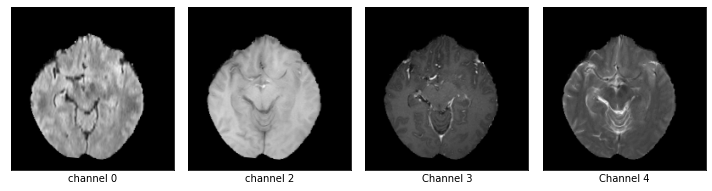

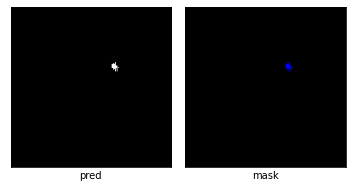

dice_loss : 0.04445387512598801



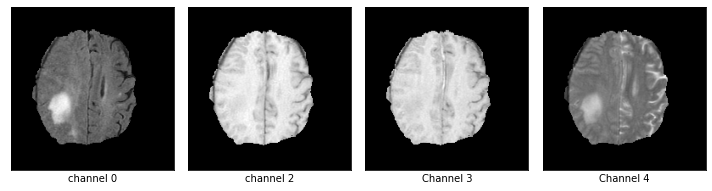

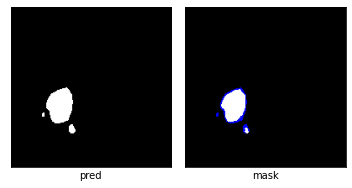

03/06 12:26:22 PM epoch 3 lr 2.445969e-02
03/06 12:26:22 PM genotype = Genotype(normal=[('skip_connect', 0), ('sep_conv_3x3', 1), ('skip_connect', 0), ('skip_connect', 2), ('skip_connect', 0), ('dil_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('skip_connect', 0), ('dil_conv_3x3', 2), ('dil_conv_5x5', 1), ('sep_conv_5x5', 2), ('skip_connect', 1), ('max_pool_3x3', 4), ('max_pool_3x3', 3)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<41:16,  1.05s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.2463, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<40:45,  1.04s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<40:06,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.1370, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<39:23,  1.01s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.5277, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:04<38:56,  1.01it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.0418, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:05<38:48,  1.01it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:06<38:50,  1.01it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:07<38:54,  1.01it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:08<38:50,  1.01it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:09<38:52,  1.01it/s, Acc=0.944, IoU=0, Loss=1]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:10<38:59,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.2051, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:11<38:57,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.5458, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:12<38:44,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:13<38:27,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:14<38:22,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.3902, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:15<38:21,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:16<38:38,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:17<38:33,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:18<38:21,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.3517, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:19<38:01,  1.02it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.4424, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:20<38:35,  1.01it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:21<38:43,  1.00it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.2460, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:22<38:22,  1.01it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:23<37:58,  1.02it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:24<37:47,  1.03it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:25<37:58,  1.02it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:26<38:03,  1.02it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.2621, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:27<38:09,  1.02it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:28<38:14,  1.01it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:29<38:01,  1.02it/s, Acc=0.979, IoU=0.157, Loss=0.729]

tensor(0.1662, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:30<38:01,  1.02it/s, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:31<38:39,  1.00it/s, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.3157, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:32<38:40,  1.00it/s, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.1728, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:33<38:52,  1.00s/it, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:34<38:45,  1.00s/it, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:35<38:45,  1.00s/it, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:36<38:45,  1.00s/it, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.6505, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:37<38:36,  1.00it/s, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:38<38:19,  1.01it/s, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.5164, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:39<38:04,  1.01it/s, Acc=0.987, IoU=0.842, Loss=0.0863]

tensor(0.3751, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:40<38:09,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9801, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:41<38:32,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:42<38:17,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.3673, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:43<38:16,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:44<37:59,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:45<38:06,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:46<37:52,  1.02it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1369, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:47<37:46,  1.02it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:48<37:31,  1.02it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.4861, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:49<37:46,  1.02it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:50<37:33,  1.02it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:51<37:51,  1.01it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.1990, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:52<37:55,  1.01it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:53<37:49,  1.01it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.3161, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:54<37:55,  1.01it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.2232, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:55<37:47,  1.01it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:56<38:01,  1.01it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.3129, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:57<37:43,  1.02it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.2927, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [00:58<37:24,  1.02it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [00:59<37:14,  1.03it/s, Acc=0.991, IoU=0.884, Loss=0.0621]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:00<37:09,  1.03it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:01<37:10,  1.03it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:02<37:23,  1.02it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.5184, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:03<37:27,  1.02it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:04<37:09,  1.03it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.3247, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:05<37:18,  1.02it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:06<36:57,  1.03it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:07<37:05,  1.03it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:08<37:16,  1.02it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:09<37:14,  1.02it/s, Acc=0.993, IoU=0.763, Loss=0.133]

tensor(0.8282, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:10<36:59,  1.03it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.2320, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:11<37:29,  1.01it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:12<37:08,  1.02it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.1639, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:12<37:03,  1.03it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:13<37:07,  1.02it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:14<37:01,  1.03it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:15<37:09,  1.02it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.2873, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:16<37:04,  1.02it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.6500, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:17<37:07,  1.02it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.4000, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:18<37:10,  1.02it/s, Acc=0.994, IoU=0.896, Loss=0.0565]

tensor(0.9198, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:19<37:20,  1.02it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.7224, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:20<37:35,  1.01it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:21<37:40,  1.01it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.2155, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:22<37:34,  1.01it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.6815, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:23<37:15,  1.02it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.7939, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:24<37:17,  1.01it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.2739, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:25<37:01,  1.02it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:26<36:54,  1.02it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.6746, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:27<36:47,  1.03it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.3161, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:28<36:57,  1.02it/s, Acc=0.998, IoU=0.915, Loss=0.0439]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:29<37:11,  1.01it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:30<37:20,  1.01it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.3608, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:31<37:11,  1.01it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:32<37:19,  1.01it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.6768, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:33<37:17,  1.01it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.6672, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:34<37:14,  1.01it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:35<36:58,  1.02it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.3984, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:36<37:01,  1.02it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.1079, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:37<37:06,  1.01it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:38<37:00,  1.02it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:39<36:57,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.3068, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:40<36:53,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1964, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:41<36:52,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1713, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:42<36:51,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:43<36:52,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:44<36:45,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:45<36:42,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:46<36:40,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.3211, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:47<36:29,  1.03it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:48<36:42,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:49<36:57,  1.01it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:50<36:57,  1.01it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:51<36:55,  1.01it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:52<36:37,  1.02it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:53<36:44,  1.02it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:54<36:49,  1.01it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:55<36:49,  1.01it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.6368, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [01:56<36:34,  1.02it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [01:57<36:36,  1.02it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.1927, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [01:58<36:13,  1.03it/s, Acc=0.987, IoU=0.799, Loss=0.112]

tensor(0.6052, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [01:59<36:19,  1.03it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:00<36:32,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9255, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:01<36:27,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:02<36:33,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:03<36:20,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1995, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:04<36:22,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:05<36:17,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1421, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:06<36:14,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.7367, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:07<36:22,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:08<36:21,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9132, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:08<36:03,  1.03it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.0983, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:09<36:16,  1.02it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:10<36:08,  1.02it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.3867, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:11<36:11,  1.02it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.1552, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:12<36:22,  1.02it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:13<36:08,  1.02it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:14<36:02,  1.03it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.7145, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:15<36:03,  1.02it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:16<36:03,  1.02it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:17<36:12,  1.02it/s, Acc=0.974, IoU=0.785, Loss=0.121]

tensor(0.0124, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:18<35:58,  1.03it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:19<36:15,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.1545, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:20<36:08,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.6503, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:21<36:12,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:22<36:13,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:23<36:08,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:24<36:04,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:25<36:02,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:26<36:14,  1.01it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:27<36:08,  1.02it/s, Acc=0.99, IoU=0.885, Loss=0.0606]

tensor(0.6901, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:28<36:19,  1.01it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.6283, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:29<36:16,  1.01it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:30<36:10,  1.01it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.0115, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:31<36:43,  1.00s/it, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.8835, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:32<36:37,  1.00it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:33<36:20,  1.01it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:34<36:18,  1.01it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:35<36:13,  1.01it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:36<36:00,  1.02it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.2826, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:37<35:54,  1.02it/s, Acc=0.999, IoU=0, Loss=0.968]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:38<35:59,  1.02it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.1579, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:39<36:01,  1.01it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:40<36:03,  1.01it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:41<36:15,  1.01it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.2835, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:42<36:28,  1.00it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:43<36:03,  1.01it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:44<35:58,  1.01it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.9494, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:45<35:57,  1.01it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.3991, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:46<35:39,  1.02it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:47<35:52,  1.02it/s, Acc=0.992, IoU=0.649, Loss=0.212]

tensor(0.0061, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:48<35:46,  1.02it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.5971, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:49<35:42,  1.02it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:50<35:19,  1.03it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.1661, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:51<35:11,  1.03it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.6627, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:52<35:17,  1.03it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.0041, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:53<35:32,  1.02it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:54<35:26,  1.02it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [02:55<35:18,  1.03it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [02:56<35:14,  1.03it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [02:57<35:11,  1.03it/s, Acc=0.969, IoU=0.383, Loss=0.446]

tensor(0.1785, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [02:58<35:53,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1574, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [02:59<35:49,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:00<35:43,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0314, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:01<36:00,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.4674, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:02<36:00,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:03<36:17,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:04<35:58,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:05<35:40,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:06<35:16,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.2932, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:07<35:30,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:08<35:33,  1.01it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.9802, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:09<35:52,  1.01it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.5121, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:10<35:40,  1.01it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:11<35:41,  1.01it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.0991, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:11<35:28,  1.01it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:12<35:25,  1.02it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:13<35:11,  1.02it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:14<34:56,  1.03it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.2829, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:15<35:04,  1.02it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:16<34:58,  1.03it/s, Acc=0.983, IoU=0.613, Loss=0.24]

tensor(0.3446, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:17<35:01,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0398, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:18<35:09,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:19<35:25,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9918, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:20<35:13,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:21<35:12,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.3312, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:22<34:59,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1790, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:23<34:44,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.2026, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:24<34:57,  1.02it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.2291, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:25<34:41,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:26<34:47,  1.03it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:27<34:58,  1.02it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.3185, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:28<35:00,  1.02it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:29<35:01,  1.02it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.5870, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:30<35:05,  1.02it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.1727, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:31<35:08,  1.02it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:32<35:19,  1.01it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:33<35:02,  1.02it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:34<34:56,  1.02it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.1822, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:35<34:39,  1.03it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.9851, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:36<34:52,  1.02it/s, Acc=0.996, IoU=0.957, Loss=0.0229]

tensor(0.0482, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:37<35:02,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:38<34:59,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:39<35:04,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.8119, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:40<34:52,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.1326, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:41<34:54,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.2652, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:42<34:36,  1.03it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.0092, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:43<34:45,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:44<34:37,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:45<34:49,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.1715, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:46<34:55,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0579]

tensor(0.0217, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:47<34:50,  1.02it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.1282, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:48<34:42,  1.02it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:49<34:36,  1.02it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:50<34:38,  1.02it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.3825, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:51<34:25,  1.03it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:52<34:25,  1.03it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.5060, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:53<34:13,  1.03it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.2751, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [03:54<34:14,  1.03it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.0134, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [03:55<34:13,  1.03it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.2345, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [03:56<34:18,  1.03it/s, Acc=0.994, IoU=0.909, Loss=0.0477]

tensor(0.2357, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [03:57<34:21,  1.03it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.9389, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [03:58<34:42,  1.01it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.3093, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [03:58<34:34,  1.02it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.0095, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [03:59<34:25,  1.02it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.6745, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:00<34:14,  1.03it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.9050, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:01<34:10,  1.03it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:02<34:21,  1.02it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.7734, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:03<34:15,  1.03it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:04<34:18,  1.02it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.1430, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:05<34:23,  1.02it/s, Acc=0.992, IoU=0.906, Loss=0.0496]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:06<34:23,  1.02it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:07<34:36,  1.01it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:08<34:18,  1.02it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.3608, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:09<34:18,  1.02it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:10<34:31,  1.01it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.9178, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:11<34:32,  1.01it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:12<34:36,  1.01it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.0064, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:13<34:22,  1.02it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.0102, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:14<34:23,  1.02it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.0065, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:15<34:11,  1.02it/s, Acc=0.992, IoU=0.452, Loss=0.379]

tensor(0.4546, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:16<34:00,  1.03it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:17<33:58,  1.03it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.8397, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:18<33:59,  1.03it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0041, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:19<34:12,  1.02it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:20<34:02,  1.02it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.6367, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:21<34:08,  1.02it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.9696, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:22<34:00,  1.02it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.7493, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:23<34:03,  1.02it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:24<33:42,  1.03it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0068, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:25<33:46,  1.03it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:26<33:42,  1.03it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.1731, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:27<33:57,  1.02it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:28<34:08,  1.02it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:29<34:29,  1.01it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:30<34:19,  1.01it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:31<34:19,  1.01it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:32<34:17,  1.01it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:33<33:59,  1.02it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.0084, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:34<34:06,  1.01it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.1521, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:35<33:58,  1.02it/s, Acc=0.99, IoU=0.842, Loss=0.0875]

tensor(0.3685, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:36<34:06,  1.01it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:37<34:14,  1.01it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.0142, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:38<33:58,  1.02it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:39<34:14,  1.01it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:40<34:05,  1.01it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:41<33:56,  1.02it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:42<33:45,  1.02it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:43<33:50,  1.02it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.1783, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:44<33:48,  1.02it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:45<33:25,  1.03it/s, Acc=0.991, IoU=0.588, Loss=0.259]

tensor(0.6783, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:46<33:43,  1.02it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:47<33:46,  1.02it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.1158, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:48<33:26,  1.03it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:49<33:44,  1.02it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:49<33:33,  1.02it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.0129, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:50<33:17,  1.03it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:51<33:17,  1.03it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [04:52<33:23,  1.03it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.4878, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [04:53<33:29,  1.02it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.6026, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [04:54<33:31,  1.02it/s, Acc=0.992, IoU=0.864, Loss=0.0743]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [04:55<33:37,  1.02it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [04:56<33:31,  1.02it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [04:57<33:23,  1.02it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [04:58<33:15,  1.03it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.0037, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [04:59<33:02,  1.03it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:00<33:01,  1.03it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.2035, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:01<33:12,  1.03it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:02<33:04,  1.03it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.2142, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:03<33:22,  1.02it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:04<33:15,  1.02it/s, Acc=0.988, IoU=0.798, Loss=0.114]

tensor(0.2001, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:05<33:27,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:06<33:32,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:07<33:35,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:08<33:35,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:09<33:14,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.5420, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:10<33:14,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:11<33:25,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:12<33:15,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:13<33:09,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:14<33:13,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:15<33:03,  1.03it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:16<33:04,  1.02it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.0072, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:17<32:48,  1.03it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:18<32:59,  1.03it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.2225, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:19<32:47,  1.03it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.4627, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:20<32:34,  1.04it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.2864, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:21<32:28,  1.04it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:22<32:38,  1.04it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:23<32:27,  1.04it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:24<32:40,  1.03it/s, Acc=0.987, IoU=0.377, Loss=0.452]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:25<32:30,  1.04it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:26<32:51,  1.03it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.6311, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:27<33:00,  1.02it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:27<32:43,  1.03it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.1044, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:28<32:47,  1.03it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:29<32:53,  1.02it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.6154, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:30<32:41,  1.03it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:31<33:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.1373, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:32<33:04,  1.02it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:33<33:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.4838, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:34<32:55,  1.02it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.2240, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:35<33:02,  1.02it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:36<32:42,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.0067, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:37<32:36,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.0072, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:38<32:27,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.2086, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:39<32:40,  1.02it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.2229, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:40<32:28,  1.03it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.0065, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:41<32:40,  1.02it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:42<33:20,  1.00it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:43<33:09,  1.01it/s, Acc=0.963, IoU=0, Loss=0.999]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:44<33:15,  1.00it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:45<33:12,  1.01it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.1894, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:46<32:54,  1.01it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.6362, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:47<32:49,  1.02it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.1977, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:48<32:49,  1.02it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.8248, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:49<32:46,  1.02it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.0970, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [05:50<32:43,  1.02it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.4583, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [05:51<32:45,  1.02it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.6268, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [05:52<32:53,  1.01it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [05:53<32:36,  1.02it/s, Acc=0.994, IoU=0.878, Loss=0.0657]

tensor(0.0089, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [05:54<32:36,  1.02it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [05:55<32:39,  1.02it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.0059, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [05:56<32:31,  1.02it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [05:57<32:23,  1.02it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [05:58<32:10,  1.03it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.0158, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [05:59<32:13,  1.03it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.7638, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:00<32:12,  1.03it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:01<32:12,  1.03it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:02<32:08,  1.03it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:03<32:02,  1.03it/s, Acc=1, IoU=0, Loss=0.922]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:04<32:04,  1.03it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:05<31:57,  1.03it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.1249, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:06<32:01,  1.03it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.9583, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:07<32:02,  1.03it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:08<31:58,  1.03it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:09<32:03,  1.03it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:10<31:44,  1.04it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.3005, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:11<31:45,  1.04it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.4131, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:11<31:44,  1.04it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.0103, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:12<32:00,  1.03it/s, Acc=1, IoU=0, Loss=0.0126]

tensor(0.5613, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:13<32:02,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0139, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:14<31:57,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.2152, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:15<31:47,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:16<31:41,  1.04it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0057, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:17<31:41,  1.04it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1249, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:18<31:58,  1.03it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0050, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:19<32:07,  1.02it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.6056, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:20<32:21,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:21<32:15,  1.02it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:22<32:31,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.3496, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:23<32:28,  1.01it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:24<32:28,  1.01it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:25<32:33,  1.00it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.4152, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:26<32:28,  1.01it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.6763, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:27<32:25,  1.01it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.5220, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:28<32:30,  1.00it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.3352, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:29<32:34,  1.00it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.1709, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:30<32:29,  1.00it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:31<32:17,  1.01it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.0101, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:32<32:18,  1.01it/s, Acc=0.996, IoU=0.94, Loss=0.0331]

tensor(0.3103, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:33<32:06,  1.01it/s, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.0097, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:34<32:28,  1.00it/s, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:35<32:23,  1.00it/s, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.1225, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:36<32:22,  1.00it/s, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.0122, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:37<31:54,  1.02it/s, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:38<31:38,  1.03it/s, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.5654, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:39<31:43,  1.02it/s, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.7858, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:40<32:24,  1.00it/s, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.0066, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:41<32:34,  1.00s/it, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:42<32:33,  1.00s/it, Acc=0.991, IoU=0.901, Loss=0.054]

tensor(0.8574, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:43<32:40,  1.01s/it, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:44<32:35,  1.01s/it, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.6785, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:45<32:28,  1.00s/it, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:46<32:34,  1.01s/it, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.0535, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:47<32:27,  1.00s/it, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.1798, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:48<32:13,  1.00it/s, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.7942, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [06:49<32:29,  1.01s/it, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [06:50<32:28,  1.01s/it, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.5545, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [06:51<32:20,  1.00s/it, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [06:52<32:07,  1.00it/s, Acc=0.993, IoU=0.258, Loss=0.585]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [06:53<32:14,  1.00s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.1478, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [06:54<32:32,  1.01s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.5936, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [06:55<32:12,  1.00s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [06:56<32:12,  1.00s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.2051, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [06:57<32:10,  1.00s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.1761, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [06:58<31:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00279]

tensor(0.6998, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [06:59<32:00,  1.00it/s, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:00<32:04,  1.00it/s, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:01<31:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9013, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:02<31:58,  1.00it/s, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:03<32:02,  1.00it/s, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.3434, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:04<32:06,  1.00s/it, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:05<32:03,  1.00s/it, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.2094, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:06<31:45,  1.01it/s, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:07<31:59,  1.00it/s, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:08<32:07,  1.00s/it, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.2367, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:09<32:04,  1.00s/it, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:10<31:53,  1.00it/s, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.3024, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:11<32:08,  1.01s/it, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:12<32:11,  1.01s/it, Acc=0.991, IoU=0.855, Loss=0.0777]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:13<32:12,  1.01s/it, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.1857, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:14<32:12,  1.01s/it, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.4073, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:15<32:05,  1.01s/it, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:16<32:02,  1.01s/it, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:17<32:03,  1.01s/it, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:18<31:58,  1.01s/it, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:19<32:06,  1.01s/it, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.4145, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:20<31:55,  1.00s/it, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:21<31:43,  1.00it/s, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.3101, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:22<31:34,  1.01it/s, Acc=0.979, IoU=0.00259, Loss=0.994]

tensor(0.0490, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:23<31:27,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.8019, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:24<31:17,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:25<31:19,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:26<31:36,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:27<31:47,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:28<31:45,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.7643, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:29<31:50,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:30<31:47,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:31<31:28,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:32<31:37,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:33<31:29,  1.00it/s, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.1238, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:34<31:30,  1.00it/s, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:35<31:18,  1.01it/s, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:36<31:05,  1.01it/s, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.7285, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:37<31:10,  1.01it/s, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.3633, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:38<31:22,  1.00it/s, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:39<31:26,  1.00it/s, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:40<31:29,  1.00s/it, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:41<31:18,  1.00it/s, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:42<31:25,  1.00s/it, Acc=0.995, IoU=0.828, Loss=0.0937]

tensor(0.7170, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:43<31:13,  1.01it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:44<31:19,  1.00it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:45<31:23,  1.00s/it, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.5685, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:46<31:03,  1.01it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:47<30:50,  1.02it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [07:48<30:42,  1.02it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.3521, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [07:49<30:45,  1.02it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [07:50<30:57,  1.01it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [07:51<31:14,  1.00it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [07:52<30:54,  1.01it/s, Acc=0.992, IoU=0.554, Loss=0.287]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [07:53<31:48,  1.02s/it, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.1692, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [07:54<31:32,  1.01s/it, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.0545, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [07:55<31:12,  1.00s/it, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [07:56<31:02,  1.00it/s, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [07:57<30:49,  1.01it/s, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [07:58<30:46,  1.01it/s, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.6767, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [07:59<30:49,  1.01it/s, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:00<30:47,  1.01it/s, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:01<30:45,  1.01it/s, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:02<31:01,  1.00it/s, Acc=0.995, IoU=0.866, Loss=0.0733]

tensor(0.5663, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:03<31:07,  1.00s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:04<31:23,  1.01s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:05<31:15,  1.01s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.3682, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:06<31:31,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.6048, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:07<31:12,  1.01s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9703, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:08<31:08,  1.01s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:09<30:57,  1.00it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0865, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:10<31:00,  1.00s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:11<31:06,  1.01s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:12<30:54,  1.00it/s, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:13<31:08,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:14<30:44,  1.00it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.3562, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:15<30:40,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.5497, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:16<30:24,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9714, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:17<30:27,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:18<30:37,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.5175, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:19<30:34,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.6024, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:20<30:22,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:21<30:26,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1411, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:22<30:06,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.5754, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:23<30:06,  1.02it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.1925, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:24<30:16,  1.01it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:25<30:10,  1.02it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:26<30:03,  1.02it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.1527, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:27<29:46,  1.03it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:28<29:43,  1.03it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:29<29:35,  1.04it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:30<29:35,  1.03it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.4517, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:31<29:46,  1.03it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.5182, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:32<30:27,  1.00it/s, Acc=0.989, IoU=0.822, Loss=0.0985]

tensor(0.1914, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:33<30:23,  1.01it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.6334, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:34<30:26,  1.00it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.1420, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:35<30:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:36<30:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.8025, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:37<29:54,  1.02it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.8335, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:38<29:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:39<29:41,  1.03it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.0042, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:40<29:40,  1.03it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:41<29:44,  1.02it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:42<29:54,  1.02it/s, Acc=1, IoU=0, Loss=0.00334]

tensor(0.9852, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:43<30:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00297]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:44<30:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00297]

tensor(0.7577, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:45<29:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00297]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:46<29:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00297]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:47<30:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00297]

tensor(0.3283, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [08:48<30:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00297]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [08:49<30:14,  1.00it/s, Acc=1, IoU=0, Loss=0.00297]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [08:50<30:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00297]

tensor(0.1917, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [08:51<30:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00297]

tensor(0.4480, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [08:52<30:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00297]

tensor(0.1572, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [08:53<30:25,  1.01s/it, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.0424, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [08:54<30:38,  1.01s/it, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [08:55<30:30,  1.01s/it, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [08:56<30:17,  1.00s/it, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.3335, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [08:57<30:11,  1.00s/it, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.4832, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [08:58<30:01,  1.00it/s, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [08:59<30:05,  1.00it/s, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.4388, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:00<30:01,  1.00it/s, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.5881, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:01<30:00,  1.00it/s, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.4887, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:02<29:58,  1.00it/s, Acc=0.996, IoU=0.711, Loss=0.169]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:03<29:50,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.4285, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:04<29:56,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.7131, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:05<29:50,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5733, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:06<29:51,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:07<29:38,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:08<29:53,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:09<29:50,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.7573, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:10<29:43,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.2132, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:11<29:46,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5294, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:12<29:47,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:12<29:36,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:14<30:18,  1.01s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:15<30:05,  1.01s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1731, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:16<29:49,  1.00it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1307, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:17<29:45,  1.00it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.4482, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:17<29:31,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:18<29:16,  1.02it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.2336, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:19<29:25,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1514, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:20<29:30,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:21<29:23,  1.01it/s, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:22<29:14,  1.02it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.6767, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:23<29:17,  1.01it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.6949, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:24<29:09,  1.02it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:25<28:57,  1.02it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:26<28:55,  1.03it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:27<28:59,  1.02it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:28<28:58,  1.02it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:29<29:10,  1.01it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.9872, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:30<29:01,  1.02it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:31<28:56,  1.02it/s, Acc=0.983, IoU=0.715, Loss=0.168]

tensor(0.5976, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:32<28:46,  1.03it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.5545, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:33<29:03,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:34<29:07,  1.01it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.5120, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:35<29:07,  1.01it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.6654, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:36<29:00,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:37<28:51,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:38<28:45,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:39<28:56,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:40<29:06,  1.01it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.9884, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:41<29:21,  1.00it/s, Acc=0.997, IoU=0.906, Loss=0.0491]

tensor(0.3814, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:42<29:26,  1.00s/it, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:43<29:20,  1.00it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:44<29:06,  1.01it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:45<29:05,  1.01it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [09:46<29:01,  1.01it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [09:47<28:50,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [09:48<28:36,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [09:49<28:41,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.1785, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [09:50<28:43,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [09:51<28:37,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0773]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [09:52<28:41,  1.02it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [09:53<28:36,  1.02it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.5831, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [09:54<28:35,  1.02it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [09:55<28:37,  1.02it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.4159, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [09:56<28:47,  1.01it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [09:57<28:43,  1.01it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [09:58<28:42,  1.01it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [09:59<28:40,  1.02it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.2728, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:00<28:47,  1.01it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:01<28:41,  1.01it/s, Acc=1, IoU=0, Loss=0.0197]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:02<28:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.4361, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:03<29:00,  1.00it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:04<28:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.3147, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:05<28:44,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:06<28:51,  1.00it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:07<28:48,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:08<28:48,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:09<28:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.5719, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:10<28:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.5995, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:11<28:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:12<28:33,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1825, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:13<28:38,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:14<28:30,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1583, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:15<28:29,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.4423, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:16<28:27,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9853, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:17<28:20,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:18<28:24,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:19<28:22,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:20<28:20,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.3189, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:21<28:08,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:22<28:07,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.7144, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:23<28:19,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:24<28:24,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:24<28:04,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:25<27:53,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:26<27:56,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:27<27:58,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1662, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:28<27:44,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:29<27:53,  1.03it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:30<28:05,  1.02it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:31<28:03,  1.02it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.2197, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:32<28:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.1735, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:33<28:03,  1.02it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.7895, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:34<27:46,  1.03it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.2625, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:35<27:42,  1.03it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.6831, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:36<27:53,  1.02it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.4664, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:37<27:53,  1.02it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:38<27:45,  1.02it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.2143, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:39<27:49,  1.02it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.4313, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:40<27:41,  1.03it/s, Acc=1, IoU=0, Loss=0.00359]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:41<27:33,  1.03it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:42<27:53,  1.02it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.7959, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:43<27:47,  1.02it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:44<27:46,  1.02it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [10:45<27:38,  1.03it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.9902, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [10:46<27:31,  1.03it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [10:47<27:41,  1.02it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.9840, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [10:48<27:40,  1.02it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [10:49<27:24,  1.03it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [10:50<27:21,  1.03it/s, Acc=0.998, IoU=0.791, Loss=0.121]

tensor(0.1477, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [10:51<27:39,  1.02it/s, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [10:52<27:45,  1.02it/s, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.2036, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [10:53<28:20,  1.01s/it, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.9836, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [10:54<28:16,  1.00s/it, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.6216, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [10:55<28:01,  1.01it/s, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [10:56<28:06,  1.00it/s, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [10:57<28:00,  1.00it/s, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.1562, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [10:58<27:58,  1.00it/s, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.2385, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [10:59<27:51,  1.01it/s, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:00<27:39,  1.02it/s, Acc=0.994, IoU=0.853, Loss=0.0817]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:01<27:43,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:02<27:49,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:03<28:05,  1.00s/it, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:04<28:04,  1.00s/it, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.4668, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:05<27:46,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.2488, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:06<27:33,  1.02it/s, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.1628, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:07<27:24,  1.02it/s, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:08<27:30,  1.02it/s, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:09<27:25,  1.02it/s, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.2229, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:10<27:34,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0881]

tensor(0.6991, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:11<27:17,  1.02it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:12<27:18,  1.02it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:13<27:24,  1.02it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.1031, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:14<27:29,  1.01it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:15<27:34,  1.01it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.3162, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:16<27:26,  1.01it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.8932, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:17<27:24,  1.01it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:18<27:32,  1.01it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:19<27:35,  1.01it/s, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:20<27:54,  1.01s/it, Acc=0.981, IoU=0.703, Loss=0.175]

tensor(0.9743, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:21<27:56,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:22<28:03,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:23<28:03,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:24<27:53,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:25<27:49,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:26<27:37,  1.00it/s, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:27<27:53,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:28<27:51,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:29<27:56,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.2319, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:30<27:55,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0668]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:31<27:47,  1.01s/it, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.7161, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:32<27:50,  1.01s/it, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:33<27:48,  1.01s/it, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.7646, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:34<27:34,  1.00s/it, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:35<27:34,  1.00s/it, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:36<27:36,  1.00s/it, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:37<27:30,  1.00s/it, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:38<27:23,  1.00it/s, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:39<27:19,  1.00it/s, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:40<27:31,  1.00s/it, Acc=0.987, IoU=0.85, Loss=0.0846]

tensor(0.0102, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:41<27:17,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:42<27:17,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:43<27:20,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.1839, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:44<27:08,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.2513, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [11:45<26:55,  1.02it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [11:46<26:50,  1.02it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.0462, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [11:47<26:53,  1.02it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [11:48<27:09,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [11:49<27:03,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.2838, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [11:50<27:10,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0409]

tensor(0.9728, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [11:51<27:17,  1.00s/it, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [11:52<27:15,  1.00s/it, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [11:53<26:56,  1.01it/s, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [11:54<26:44,  1.02it/s, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.1649, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [11:55<27:00,  1.01it/s, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [11:56<26:55,  1.01it/s, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [11:57<26:43,  1.02it/s, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.0560, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [11:58<26:46,  1.01it/s, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [11:59<27:00,  1.00it/s, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:00<27:00,  1.00it/s, Acc=0.991, IoU=0.888, Loss=0.0613]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:01<27:15,  1.01s/it, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.9295, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:02<27:14,  1.01s/it, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.3935, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:03<26:58,  1.00it/s, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.1158, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:04<27:01,  1.00s/it, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.1571, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:05<27:07,  1.00s/it, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.1674, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:06<27:00,  1.00s/it, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:07<26:44,  1.01it/s, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.0114, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:08<26:35,  1.01it/s, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.0072, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:09<26:37,  1.01it/s, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.5592, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:10<26:36,  1.01it/s, Acc=0.991, IoU=0.682, Loss=0.188]

tensor(0.0222, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:11<26:34,  1.01it/s, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.1759, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:12<26:26,  1.02it/s, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.1762, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:13<26:39,  1.01it/s, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:14<26:39,  1.01it/s, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:15<26:45,  1.00it/s, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:16<26:41,  1.00it/s, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:17<26:51,  1.00s/it, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:18<26:45,  1.00it/s, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:19<26:47,  1.00s/it, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.4526, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:20<27:08,  1.01s/it, Acc=0.989, IoU=0.64, Loss=0.219]

tensor(0.1996, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:21<27:10,  1.02s/it, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:22<26:57,  1.01s/it, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:23<26:55,  1.01s/it, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:24<26:49,  1.01s/it, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.1189, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:25<26:51,  1.01s/it, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:26<26:38,  1.00it/s, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.1838, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:27<26:46,  1.01s/it, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:28<26:43,  1.00s/it, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:29<26:16,  1.01it/s, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:30<26:13,  1.01it/s, Acc=0.994, IoU=0.88, Loss=0.0637]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:31<26:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.7975, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:32<26:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:33<26:19,  1.01it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:33<26:01,  1.02it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:34<26:12,  1.01it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:35<26:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:36<26:05,  1.01it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.8024, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:37<25:49,  1.02it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.1108, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:38<25:48,  1.02it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.1514, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:39<25:49,  1.02it/s, Acc=1, IoU=0, Loss=0.00295]

tensor(0.1092, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:40<25:59,  1.02it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.1621, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:41<25:57,  1.02it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.6833, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:42<26:02,  1.01it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [12:43<26:12,  1.01it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.7469, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [12:44<26:09,  1.01it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.6026, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [12:45<25:57,  1.01it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.9437, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [12:46<25:54,  1.02it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [12:47<25:50,  1.02it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.8229, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [12:48<25:46,  1.02it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [12:49<25:40,  1.02it/s, Acc=0.992, IoU=0.00357, Loss=0.987]

tensor(0.8302, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [12:50<25:44,  1.02it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [12:51<25:58,  1.01it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [12:52<25:53,  1.01it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [12:53<25:45,  1.02it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [12:54<25:50,  1.01it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [12:55<25:51,  1.01it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.1682, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [12:56<25:46,  1.01it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [12:57<25:55,  1.01it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.1421, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [12:58<25:41,  1.02it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [12:59<25:39,  1.02it/s, Acc=0.994, IoU=0.526, Loss=0.319]

tensor(0.7096, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:00<25:30,  1.02it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.1410, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:01<25:37,  1.02it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.9772, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:02<25:36,  1.02it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:03<25:28,  1.02it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:04<25:16,  1.03it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:05<25:20,  1.03it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.1899, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:06<25:24,  1.02it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:07<25:24,  1.02it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:08<25:17,  1.03it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:09<25:41,  1.01it/s, Acc=0.987, IoU=0.778, Loss=0.126]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:10<25:34,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:11<25:34,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.2022, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:12<25:29,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.9464, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:13<25:28,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:14<25:38,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:15<25:21,  1.02it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.6424, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:16<25:18,  1.02it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:17<25:05,  1.03it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:18<25:15,  1.02it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:19<25:23,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:20<25:08,  1.02it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.2018, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:21<25:14,  1.02it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:22<25:10,  1.02it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:23<25:00,  1.03it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:24<25:02,  1.03it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.1893, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:25<25:00,  1.03it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:26<25:09,  1.02it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:27<25:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.0397, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:28<25:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:29<25:06,  1.02it/s, Acc=1, IoU=0, Loss=0.00158]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:30<25:17,  1.01it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:31<25:13,  1.01it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.1238, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:32<25:08,  1.02it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:33<25:26,  1.00it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.1437, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:34<25:13,  1.01it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.1576, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:35<25:13,  1.01it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:35<24:59,  1.02it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:36<25:09,  1.01it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:37<25:07,  1.01it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:38<24:57,  1.02it/s, Acc=0.993, IoU=0.903, Loss=0.0508]

tensor(0.7367, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:39<24:50,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.5846, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:40<24:59,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1405, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [13:41<24:57,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.4081, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [13:42<24:54,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.4146, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [13:43<24:53,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.7051, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [13:44<24:58,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [13:45<24:57,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [13:46<24:46,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [13:47<24:48,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9062, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [13:48<24:54,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [13:49<24:52,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.1406, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [13:50<24:59,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.1327, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [13:51<24:44,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.4266, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [13:52<24:43,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.1304, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [13:53<24:36,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [13:54<24:34,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [13:55<24:46,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [13:56<24:41,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [13:57<24:44,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.9846, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [13:58<24:32,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0446]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [13:59<24:34,  1.02it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:00<24:31,  1.02it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:01<24:32,  1.02it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:02<24:36,  1.02it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:03<24:21,  1.03it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:04<24:21,  1.03it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:05<24:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.2776, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:06<24:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.1602, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:07<24:22,  1.02it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.1272, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:08<24:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00306]

tensor(0.3717, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:09<24:31,  1.02it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:10<24:22,  1.02it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.4032, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:11<24:07,  1.03it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:12<24:10,  1.03it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:13<24:04,  1.03it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.1346, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:14<23:58,  1.03it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:15<24:07,  1.03it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:16<24:16,  1.02it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.2269, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:17<24:05,  1.03it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:18<24:15,  1.02it/s, Acc=0.961, IoU=0.618, Loss=0.236]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:19<24:11,  1.02it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:20<24:17,  1.02it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:21<24:19,  1.02it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.9832, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:22<24:07,  1.02it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:23<24:02,  1.03it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:24<24:00,  1.03it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.2239, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:25<24:10,  1.02it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:25<24:01,  1.02it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:26<24:01,  1.02it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:27<23:55,  1.03it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.7573, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:28<23:56,  1.03it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:29<24:17,  1.01it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:30<24:20,  1.01it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:31<24:14,  1.01it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.2008, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:32<24:08,  1.01it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:33<23:58,  1.02it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:34<23:48,  1.03it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:35<23:48,  1.03it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:36<23:48,  1.03it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.2044, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:37<23:45,  1.03it/s, Acc=0.99, IoU=0.828, Loss=0.0943]

tensor(0.1556, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:38<23:44,  1.03it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:39<23:53,  1.02it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [14:40<23:44,  1.03it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [14:41<23:51,  1.02it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [14:42<23:41,  1.03it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [14:43<23:41,  1.03it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.0314, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [14:44<23:37,  1.03it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [14:45<23:39,  1.03it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [14:46<23:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [14:47<23:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000778]

tensor(0.1181, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [14:48<23:33,  1.03it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [14:49<23:30,  1.03it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [14:50<23:25,  1.03it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [14:51<23:38,  1.02it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.5229, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [14:52<23:32,  1.03it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.3118, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [14:53<23:26,  1.03it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.2044, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [14:54<23:21,  1.03it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [14:55<23:11,  1.04it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [14:56<23:08,  1.04it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [14:57<23:25,  1.03it/s, Acc=0.991, IoU=0.801, Loss=0.113]

tensor(0.1012, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [14:58<23:29,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [14:59<23:39,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.3048, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:00<23:34,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1095, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:01<23:38,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:02<23:44,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:03<23:37,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:04<23:26,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:05<23:20,  1.03it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:06<23:34,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:07<23:41,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:07<23:29,  1.02it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.1274, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:08<23:26,  1.02it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.2406, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:09<23:30,  1.02it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:10<23:30,  1.01it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:11<23:26,  1.02it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.2803, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:12<23:27,  1.02it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:13<23:19,  1.02it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.9821, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:14<23:08,  1.03it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:15<23:09,  1.03it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:16<22:55,  1.04it/s, Acc=1, IoU=0, Loss=0.00216]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:17<22:54,  1.04it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1414, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:18<23:05,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:19<23:06,  1.03it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:20<23:08,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:21<23:29,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:22<23:15,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3874, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:23<23:10,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2818, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:24<23:05,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1827, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:25<23:10,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:26<23:12,  1.02it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:27<23:09,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1698, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:28<23:06,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:29<23:05,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:30<23:00,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:31<23:11,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1726, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:32<23:00,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:33<23:10,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:34<23:25,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2478, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:35<23:12,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3813, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:36<23:14,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1844, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:37<23:18,  1.00it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:38<23:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [15:39<23:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [15:40<22:57,  1.02it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.0425, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [15:41<22:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [15:42<23:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [15:43<23:05,  1.01it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [15:44<22:56,  1.02it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [15:45<22:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [15:46<23:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00531]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [15:47<23:07,  1.00it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [15:48<23:11,  1.00it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [15:49<23:04,  1.01it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [15:50<22:44,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [15:51<22:44,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [15:52<22:29,  1.03it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [15:53<22:38,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.1367, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [15:54<22:30,  1.03it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [15:55<22:40,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [15:56<22:33,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0946]

tensor(0.1564, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [15:57<22:26,  1.03it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.1951, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [15:58<22:21,  1.03it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.5213, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [15:59<22:22,  1.03it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.9629, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:00<22:16,  1.03it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:00<22:12,  1.04it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.1182, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:01<22:14,  1.03it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:02<22:04,  1.04it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:03<22:17,  1.03it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.6088, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:04<22:30,  1.02it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:05<22:29,  1.02it/s, Acc=0.995, IoU=0.913, Loss=0.0464]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:06<22:30,  1.02it/s, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:07<22:27,  1.02it/s, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.4001, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:08<22:22,  1.02it/s, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:09<22:34,  1.01it/s, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:10<23:18,  1.02s/it, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.4960, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:11<23:13,  1.02s/it, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:12<23:14,  1.02s/it, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.6503, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:13<23:14,  1.02s/it, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:15<23:24,  1.03s/it, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:16<23:17,  1.02s/it, Acc=0.991, IoU=0.543, Loss=0.292]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:17<22:50,  1.00s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.4391, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:17<22:41,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:18<22:24,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:19<22:30,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:20<22:30,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:21<22:23,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1528, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:22<22:06,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:23<22:05,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.5233, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:24<22:10,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:25<22:11,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1646, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:26<22:12,  1.02it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:27<21:59,  1.03it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.5976, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:28<21:56,  1.03it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:29<21:57,  1.03it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.0497, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:30<21:53,  1.03it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:31<21:54,  1.03it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:32<21:55,  1.02it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:33<22:03,  1.02it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:34<22:09,  1.01it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.1353, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:35<22:19,  1.00it/s, Acc=0.995, IoU=0.946, Loss=0.0291]

tensor(0.3535, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:36<22:17,  1.00it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.6427, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [16:37<22:20,  1.00it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [16:38<22:12,  1.01it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [16:39<22:01,  1.01it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [16:40<21:55,  1.02it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.9864, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [16:41<21:43,  1.03it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.4369, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [16:42<21:42,  1.03it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.7130, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [16:43<21:50,  1.02it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [16:44<21:49,  1.02it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.4050, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [16:45<22:01,  1.01it/s, Acc=0.994, IoU=0.35, Loss=0.478]

tensor(0.6033, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [16:46<21:54,  1.01it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [16:47<21:57,  1.01it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [16:48<21:57,  1.01it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [16:49<21:44,  1.02it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [16:50<21:40,  1.02it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [16:51<21:33,  1.03it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.6149, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [16:52<21:28,  1.03it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.3927, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [16:53<21:36,  1.02it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [16:54<21:40,  1.02it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.2382, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [16:55<21:35,  1.02it/s, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.5568, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [16:56<21:52,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [16:57<21:54,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0311, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [16:58<21:39,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [16:59<21:32,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.2700, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:00<21:25,  1.03it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:01<21:21,  1.03it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:02<21:20,  1.03it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:03<21:11,  1.04it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:04<21:11,  1.04it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:05<21:17,  1.03it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:05<21:08,  1.04it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:06<21:14,  1.03it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:07<21:12,  1.03it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:08<21:02,  1.04it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:09<21:08,  1.03it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:10<21:03,  1.04it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.1986, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:11<21:08,  1.03it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:12<21:11,  1.03it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:13<21:15,  1.02it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:14<21:14,  1.02it/s, Acc=0.99, IoU=0.496, Loss=0.338]

tensor(0.0560, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:15<21:06,  1.03it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:16<21:22,  1.02it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:17<21:17,  1.02it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:18<21:13,  1.02it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.3857, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:19<21:05,  1.03it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.9611, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:20<20:55,  1.03it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:21<20:54,  1.03it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.1267, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:22<20:54,  1.03it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:23<20:45,  1.04it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.5046, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:24<20:55,  1.03it/s, Acc=0.988, IoU=0.887, Loss=0.0626]

tensor(0.1924, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:25<21:06,  1.02it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.5547, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:26<20:58,  1.03it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:27<20:50,  1.03it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.9434, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:28<20:58,  1.03it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:29<20:53,  1.03it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.9892, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:30<20:47,  1.03it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.5367, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:31<20:41,  1.04it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:32<20:44,  1.03it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.3207, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:33<20:47,  1.03it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.6209, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:34<20:39,  1.04it/s, Acc=0.998, IoU=0.465, Loss=0.363]

tensor(0.6418, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:35<20:42,  1.03it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:36<20:34,  1.04it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [17:37<20:47,  1.03it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [17:38<20:54,  1.02it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [17:38<20:40,  1.03it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [17:39<20:39,  1.03it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [17:40<20:37,  1.03it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [17:41<20:42,  1.03it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [17:42<20:47,  1.02it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [17:43<20:35,  1.03it/s, Acc=0.997, IoU=0.93, Loss=0.0353]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [17:44<20:31,  1.03it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [17:45<20:41,  1.03it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [17:46<20:45,  1.02it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [17:47<20:46,  1.02it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [17:48<20:48,  1.02it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.7021, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [17:49<20:47,  1.02it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [17:50<20:42,  1.02it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [17:51<20:31,  1.03it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [17:52<20:28,  1.03it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [17:53<20:27,  1.03it/s, Acc=0.993, IoU=0.875, Loss=0.0664]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [17:54<20:33,  1.02it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.2206, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [17:55<20:27,  1.03it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [17:56<20:32,  1.02it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [17:57<20:43,  1.01it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.2988, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [17:58<20:46,  1.01it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.6994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [17:59<20:46,  1.01it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:00<20:37,  1.02it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:01<20:26,  1.02it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.4658, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:02<20:36,  1.02it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:03<20:34,  1.02it/s, Acc=0.959, IoU=0.181, Loss=0.694]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:04<20:26,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1372, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:05<20:34,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.2713, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:06<20:28,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1888, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:07<20:32,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1402, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:08<20:23,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:09<20:23,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.4721, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:10<20:21,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:11<20:22,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1937, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:12<20:18,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9344, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:13<20:19,  1.02it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.3092, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:14<20:29,  1.01it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:15<20:38,  1.00it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:16<20:41,  1.00it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:17<20:32,  1.01it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:18<20:31,  1.01it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:19<20:27,  1.01it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.9610, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:20<20:35,  1.00it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:21<20:28,  1.01it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.4333, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:22<20:15,  1.02it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:23<20:08,  1.02it/s, Acc=0.997, IoU=0.871, Loss=0.0694]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:24<20:09,  1.02it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:25<20:14,  1.02it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:26<20:10,  1.02it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:27<19:58,  1.03it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:28<19:52,  1.03it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:28<19:44,  1.04it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:29<19:56,  1.03it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.9097, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:30<20:06,  1.02it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.1635, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:31<20:11,  1.01it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:32<20:06,  1.02it/s, Acc=0.992, IoU=0.784, Loss=0.12]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:33<20:07,  1.01it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.9867, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:34<20:08,  1.01it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.8176, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:35<20:01,  1.02it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [18:36<20:11,  1.01it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.9789, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [18:37<20:06,  1.01it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [18:38<20:12,  1.01it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.2829, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [18:39<20:11,  1.01it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.7447, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [18:40<19:52,  1.02it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [18:41<19:48,  1.02it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [18:42<19:53,  1.02it/s, Acc=1, IoU=0, Loss=0.779]

tensor(0.1541, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [18:43<19:57,  1.01it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.6495, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [18:44<19:47,  1.02it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.6052, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [18:45<19:56,  1.01it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.1175, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [18:46<19:59,  1.01it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [18:47<19:51,  1.02it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [18:48<19:46,  1.02it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.3889, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [18:49<19:50,  1.01it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.8846, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [18:50<19:55,  1.01it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [18:51<20:02,  1.00it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [18:52<20:00,  1.00it/s, Acc=0.989, IoU=0.746, Loss=0.147]

tensor(0.7550, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [18:53<19:56,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [18:54<19:54,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [18:55<19:53,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9851, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [18:56<20:06,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.2931, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [18:57<20:04,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1512, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [18:58<20:01,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1633, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [18:59<20:03,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:00<20:03,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:01<20:00,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:02<20:03,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0421, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:03<20:00,  1.01s/it, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.6114, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:04<20:01,  1.01s/it, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:05<19:54,  1.00s/it, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.9318, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:06<19:52,  1.00s/it, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:07<19:46,  1.00it/s, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:08<19:50,  1.00s/it, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:09<19:41,  1.01it/s, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:10<19:28,  1.02it/s, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:11<19:35,  1.01it/s, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:12<19:32,  1.01it/s, Acc=0.99, IoU=0.336, Loss=0.504]

tensor(0.9163, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:13<19:30,  1.01it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:14<19:24,  1.02it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:15<19:18,  1.02it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:16<19:17,  1.02it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:17<19:20,  1.02it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:18<19:16,  1.02it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.5964, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:19<19:34,  1.00it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.7292, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:20<19:31,  1.00it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.8636, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:21<19:25,  1.01it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:22<19:24,  1.01it/s, Acc=0.997, IoU=0.91, Loss=0.0495]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:23<19:34,  1.00s/it, Acc=1, IoU=0, Loss=0.282]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:24<19:26,  1.01it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.9787, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:25<19:22,  1.01it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.1179, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:26<19:16,  1.01it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:27<19:18,  1.01it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:28<19:15,  1.01it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:29<19:15,  1.01it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.8572, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:30<19:10,  1.01it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:31<19:05,  1.02it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.2250, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:32<18:59,  1.02it/s, Acc=1, IoU=0, Loss=0.282]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:33<19:09,  1.01it/s, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.1310, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:34<19:14,  1.01it/s, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:35<19:08,  1.01it/s, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.6865, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [19:36<19:23,  1.00s/it, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.1548, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [19:37<19:21,  1.00s/it, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [19:38<19:18,  1.00it/s, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [19:39<19:12,  1.00it/s, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.1620, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [19:40<19:06,  1.01it/s, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [19:41<19:01,  1.01it/s, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [19:42<18:58,  1.01it/s, Acc=0.951, IoU=0.129, Loss=0.772]

tensor(0.6664, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [19:43<18:57,  1.01it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1390, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [19:44<18:50,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.6125, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [19:45<18:53,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1024, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [19:46<18:51,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [19:47<18:42,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [19:48<18:42,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.2601, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [19:49<18:41,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [19:50<18:47,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.6643, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [19:51<18:48,  1.02it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1741, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [19:52<18:49,  1.01it/s, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.2963, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [19:53<18:56,  1.01it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.5119, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [19:54<19:02,  1.00it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.1613, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [19:55<18:52,  1.01it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [19:56<18:47,  1.01it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.4695, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [19:57<18:55,  1.00it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [19:58<18:47,  1.01it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [19:59<18:45,  1.01it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.2458, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:00<18:50,  1.01it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0506, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:01<18:53,  1.00it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.3362, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:02<18:52,  1.00it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:03<18:46,  1.01it/s, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.3072, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:04<18:51,  1.00it/s, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.6499, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:05<18:50,  1.00it/s, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.6022, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:06<18:38,  1.01it/s, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.3493, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:07<18:36,  1.01it/s, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.5203, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:08<18:38,  1.01it/s, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.5608, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:09<18:36,  1.01it/s, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.1781, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:10<18:47,  1.00s/it, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:11<18:46,  1.00s/it, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:12<18:41,  1.00it/s, Acc=0.989, IoU=0.728, Loss=0.16]

tensor(0.1452, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:13<18:50,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:14<18:46,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1360, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:15<18:48,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3877, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:16<18:40,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:17<18:43,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:18<18:32,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3957, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:19<18:34,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:20<18:25,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:21<18:31,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:22<18:34,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:23<18:29,  1.00it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:24<18:27,  1.00it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.1054, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:25<18:24,  1.01it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.2814, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:26<18:28,  1.00it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:27<18:17,  1.01it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:28<18:12,  1.02it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:29<18:14,  1.01it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:30<18:18,  1.01it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.1442, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:30<18:08,  1.02it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:32<18:16,  1.01it/s, Acc=0.99, IoU=0.555, Loss=0.286]

tensor(0.1471, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:32<18:13,  1.01it/s, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:34<18:19,  1.00it/s, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.9818, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:35<18:27,  1.00s/it, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:36<18:27,  1.01s/it, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [20:37<18:21,  1.00s/it, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [20:38<18:25,  1.01s/it, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [20:39<18:24,  1.01s/it, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [20:40<18:31,  1.01s/it, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.3467, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [20:41<18:24,  1.01s/it, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [20:42<18:14,  1.00it/s, Acc=0.997, IoU=0.696, Loss=0.181]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [20:43<18:14,  1.00s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [20:44<18:20,  1.01s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.2139, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [20:45<18:19,  1.01s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.8427, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [20:46<18:12,  1.00s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.2623, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [20:47<18:14,  1.00s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [20:48<18:09,  1.00s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.2981, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [20:49<18:14,  1.01s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [20:50<18:17,  1.01s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.0129, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [20:51<18:20,  1.01s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [20:52<18:07,  1.00s/it, Acc=0.986, IoU=0.821, Loss=0.0985]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [20:53<18:07,  1.00s/it, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [20:54<18:04,  1.00s/it, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [20:55<18:03,  1.00s/it, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [20:56<18:06,  1.01s/it, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [20:57<18:02,  1.00s/it, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [20:58<17:54,  1.00it/s, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.4354, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [20:59<17:42,  1.01it/s, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:00<17:49,  1.01it/s, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:01<17:46,  1.01it/s, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:02<17:41,  1.01it/s, Acc=0.991, IoU=0.665, Loss=0.2]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:03<17:36,  1.02it/s, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:04<17:45,  1.01it/s, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:05<17:49,  1.00it/s, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.3790, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:06<17:43,  1.01it/s, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:07<17:47,  1.00it/s, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:08<17:42,  1.01it/s, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:09<17:45,  1.00it/s, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.2331, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:10<17:42,  1.00it/s, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:11<17:49,  1.00s/it, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.0406, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:12<17:50,  1.01s/it, Acc=0.995, IoU=0.866, Loss=0.0723]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:13<17:46,  1.00s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.9261, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:14<17:46,  1.00s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:15<17:58,  1.02s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:16<18:11,  1.03s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:17<18:05,  1.02s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:18<18:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:19<17:53,  1.01s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:20<17:40,  1.00s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:21<17:42,  1.01s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:22<17:44,  1.01s/it, Acc=1, IoU=0, Loss=0.00326]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:23<17:39,  1.01s/it, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:24<17:39,  1.01s/it, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:25<17:45,  1.01s/it, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:26<17:40,  1.01s/it, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.5951, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:27<17:32,  1.00s/it, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.1668, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:28<17:34,  1.00s/it, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:29<17:25,  1.00it/s, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.2212, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:30<17:20,  1.01it/s, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.1139, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:31<17:24,  1.00it/s, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.5197, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:32<17:25,  1.00s/it, Acc=0.993, IoU=0.903, Loss=0.0523]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:33<17:37,  1.01s/it, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:34<17:38,  1.02s/it, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:35<17:40,  1.02s/it, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.2722, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:36<17:29,  1.01s/it, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.3749, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [21:37<17:25,  1.00s/it, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.9847, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [21:38<17:13,  1.01it/s, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.4325, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [21:39<17:09,  1.01it/s, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [21:40<17:11,  1.01it/s, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.3197, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [21:41<17:03,  1.01it/s, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [21:42<17:01,  1.01it/s, Acc=0.997, IoU=0.445, Loss=0.384]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [21:43<16:56,  1.02it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.9877, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [21:44<17:04,  1.01it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.1553, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [21:45<17:02,  1.01it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [21:46<17:05,  1.01it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [21:47<17:16,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.5034, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [21:48<17:17,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.9705, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [21:49<17:19,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.2181, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [21:50<17:15,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.3226, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [21:51<17:00,  1.01it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [21:52<16:48,  1.02it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.8576, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [21:53<16:51,  1.01it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.1163, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [21:54<16:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.1081, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [21:55<16:45,  1.02it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [21:56<16:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [21:57<16:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [21:58<16:43,  1.02it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [21:59<16:52,  1.01it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.9837, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:00<16:46,  1.01it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:01<16:48,  1.01it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:02<16:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00769]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:03<16:51,  1.00it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:04<16:47,  1.01it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:05<16:44,  1.01it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:06<16:39,  1.01it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:07<16:38,  1.01it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:07<16:29,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:08<16:31,  1.02it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.0409, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:09<16:37,  1.01it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.3222, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:10<16:36,  1.01it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.5291, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:11<16:33,  1.01it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:12<16:27,  1.02it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:13<16:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:14<16:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:15<16:36,  1.00it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:16<16:38,  1.00it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.2289, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:17<16:29,  1.01it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:18<16:22,  1.02it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:19<16:26,  1.01it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.2054, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:20<16:24,  1.01it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:21<16:30,  1.00it/s, Acc=1, IoU=0, Loss=0.00204]

tensor(0.0826, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:22<16:28,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.6468, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:23<16:24,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.4105, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:24<16:22,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:25<16:17,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.1241, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:26<16:16,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.2108, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:27<16:21,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:28<16:17,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:29<16:10,  1.02it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.1769, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:30<16:14,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:31<16:12,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0327]

tensor(0.0360, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:32<16:12,  1.01it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.8172, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:33<16:21,  1.00it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:34<16:14,  1.01it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.6806, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:35<16:06,  1.01it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [22:36<16:16,  1.00it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [22:37<16:14,  1.00it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.2804, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [22:38<16:12,  1.01it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.6340, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [22:39<16:03,  1.01it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.5836, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [22:40<16:10,  1.01it/s, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [22:41<16:16,  1.00s/it, Acc=0.995, IoU=0.747, Loss=0.144]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [22:42<16:11,  1.00it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [22:43<16:11,  1.00it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [22:44<16:03,  1.01it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.7247, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [22:45<16:01,  1.01it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [22:46<16:01,  1.01it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.0288, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [22:47<15:53,  1.02it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.2597, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [22:48<15:53,  1.02it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [22:49<15:58,  1.01it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.6743, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [22:50<16:01,  1.01it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [22:51<15:59,  1.01it/s, Acc=0.995, IoU=0.806, Loss=0.109]

tensor(0.2156, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [22:52<15:54,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [22:53<15:49,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [22:54<15:48,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [22:55<15:53,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [22:56<15:53,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [22:57<15:53,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [22:58<15:42,  1.02it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.2308, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [22:59<15:44,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:00<15:41,  1.02it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.1574, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:01<15:50,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:02<15:55,  1.00s/it, Acc=1, IoU=0, Loss=0.00313]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:03<15:51,  1.00it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.2576, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:04<15:55,  1.00s/it, Acc=1, IoU=0, Loss=0.00313]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:05<15:49,  1.00it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:06<15:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:07<15:30,  1.02it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:08<15:30,  1.02it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.2329, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:09<15:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.4954, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:10<15:30,  1.02it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:11<15:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:12<15:36,  1.01it/s, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:13<15:34,  1.01it/s, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:14<15:31,  1.01it/s, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.3771, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:15<15:31,  1.01it/s, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.4724, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:16<15:30,  1.01it/s, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.1849, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:17<15:30,  1.01it/s, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:18<15:32,  1.01it/s, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:19<15:31,  1.01it/s, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.8524, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:20<15:41,  1.01s/it, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:21<15:42,  1.01s/it, Acc=0.997, IoU=0.804, Loss=0.114]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:22<15:41,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.4019, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:23<15:43,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:24<15:38,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.4906, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:25<15:37,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:26<15:36,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:27<15:34,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:28<15:34,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.4204, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:29<15:28,  1.00s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.2041, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:30<15:31,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:31<15:23,  1.00it/s, Acc=0.993, IoU=0.925, Loss=0.04]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:32<15:18,  1.01it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.3469, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:33<15:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.6843, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:34<15:16,  1.01it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:35<15:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [23:36<15:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.1511, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [23:37<15:01,  1.02it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [23:38<15:01,  1.02it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [23:39<15:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.2596, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [23:40<15:02,  1.02it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.1778, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [23:41<14:56,  1.02it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [23:42<15:06,  1.01it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [23:43<15:04,  1.01it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [23:44<15:09,  1.00it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [23:45<15:01,  1.01it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [23:46<15:03,  1.01it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [23:47<15:02,  1.01it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [23:48<15:04,  1.00it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [23:49<14:58,  1.01it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.4409, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [23:50<14:55,  1.01it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [23:51<14:59,  1.01it/s, Acc=0.991, IoU=0.839, Loss=0.0879]

tensor(0.4527, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [23:52<15:05,  1.00s/it, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [23:53<14:58,  1.00it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.9471, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [23:54<14:51,  1.01it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [23:55<14:47,  1.02it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [23:56<14:44,  1.02it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.8689, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [23:57<14:41,  1.02it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.5196, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [23:58<14:41,  1.02it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [23:59<14:38,  1.02it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.4782, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:00<14:37,  1.02it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.5927, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:01<14:51,  1.00it/s, Acc=0.998, IoU=0.939, Loss=0.0321]

tensor(0.1106, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:02<14:51,  1.00it/s, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.5429, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:03<14:54,  1.00s/it, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:04<14:52,  1.00s/it, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.3905, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:05<14:50,  1.00it/s, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:06<14:38,  1.01it/s, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:07<14:36,  1.01it/s, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:08<14:31,  1.02it/s, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:08<14:31,  1.02it/s, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:10<14:40,  1.01it/s, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:11<14:39,  1.01it/s, Acc=0.996, IoU=0.777, Loss=0.125]

tensor(0.9074, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:11<14:35,  1.01it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:12<14:33,  1.01it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.0902, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:13<14:37,  1.01it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.3750, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:14<14:35,  1.01it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.3036, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:15<14:27,  1.01it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:16<14:27,  1.01it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.3778, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:17<14:24,  1.02it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:18<14:27,  1.01it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:19<14:27,  1.01it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:20<14:20,  1.02it/s, Acc=0.994, IoU=0.179, Loss=0.695]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:21<14:24,  1.01it/s, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:22<14:22,  1.01it/s, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:23<14:22,  1.01it/s, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.2853, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:24<14:22,  1.01it/s, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:25<14:22,  1.01it/s, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:26<14:16,  1.01it/s, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.4529, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:27<14:17,  1.01it/s, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:28<14:13,  1.02it/s, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:29<14:36,  1.01s/it, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.2786, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:30<14:30,  1.01s/it, Acc=0.998, IoU=0.81, Loss=0.104]

tensor(0.6625, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:31<14:27,  1.00s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:32<14:17,  1.01it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:33<14:20,  1.00it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.1120, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [24:34<14:17,  1.00it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [24:35<14:17,  1.00it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.3797, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [24:36<14:14,  1.01it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.5513, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [24:37<14:13,  1.01it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [24:38<14:02,  1.02it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.2920, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [24:39<13:57,  1.02it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [24:40<13:56,  1.02it/s, Acc=1, IoU=0, Loss=0.0017]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [24:41<13:57,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [24:42<14:11,  1.00it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.2498, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [24:43<14:15,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [24:44<14:12,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [24:45<14:09,  1.00it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [24:46<14:04,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [24:47<13:58,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [24:48<13:57,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [24:49<13:56,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [24:50<13:54,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [24:51<13:52,  1.01it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [24:52<13:46,  1.02it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [24:53<13:45,  1.02it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [24:54<13:49,  1.01it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [24:55<13:50,  1.01it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.2734, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [24:56<13:45,  1.02it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.9611, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [24:57<13:47,  1.01it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.6966, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [24:58<13:46,  1.01it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [24:59<13:41,  1.02it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.3581, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:00<13:35,  1.02it/s, Acc=0.993, IoU=0.924, Loss=0.0396]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:01<13:35,  1.02it/s, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.6062, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:02<13:33,  1.02it/s, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:03<13:29,  1.03it/s, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:04<13:32,  1.02it/s, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:05<13:38,  1.01it/s, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:06<13:49,  1.00s/it, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:07<13:44,  1.00it/s, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.8434, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:08<13:49,  1.00s/it, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:09<13:45,  1.00it/s, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:10<13:44,  1.00it/s, Acc=0.988, IoU=0.769, Loss=0.133]

tensor(0.0328, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:11<13:43,  1.00it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9902, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:12<13:38,  1.01it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0791, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:13<13:25,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:14<13:27,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:15<13:27,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.5890, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:16<13:32,  1.01it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.5335, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:17<13:22,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.2715, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:18<13:20,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:19<13:22,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:20<13:28,  1.01it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:21<13:23,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:22<13:20,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:23<13:20,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:24<13:24,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.5103, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:25<13:12,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:26<13:11,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:27<13:13,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.7846, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:28<13:14,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:29<13:16,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0140, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:30<13:12,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:31<13:13,  1.01it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.1886, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:32<13:15,  1.01it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.7311, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:33<13:05,  1.02it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [25:34<13:05,  1.02it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.9889, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [25:35<13:15,  1.01it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.6034, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [25:36<13:18,  1.00it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [25:37<13:13,  1.01it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.2500, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [25:38<13:14,  1.00it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.6688, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [25:39<13:13,  1.00it/s, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [25:40<13:17,  1.00s/it, Acc=0.993, IoU=0.825, Loss=0.0978]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [25:41<13:15,  1.00s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [25:42<13:14,  1.00s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.5466, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [25:43<13:13,  1.00s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [25:44<13:08,  1.00it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [25:45<13:08,  1.00it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [25:46<13:00,  1.01it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [25:47<12:58,  1.01it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.7114, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [25:47<12:58,  1.01it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.1369, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [25:48<12:55,  1.01it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.2330, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [25:49<12:53,  1.02it/s, Acc=1, IoU=0, Loss=0.875]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [25:50<12:44,  1.03it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [25:51<12:46,  1.02it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.2709, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [25:52<12:46,  1.02it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.1154, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [25:53<12:40,  1.03it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.1437, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [25:54<12:39,  1.03it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [25:55<12:34,  1.03it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [25:56<12:37,  1.03it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [25:57<12:33,  1.03it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [25:58<12:39,  1.02it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.9006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [25:59<12:43,  1.01it/s, Acc=0.992, IoU=0.832, Loss=0.0957]

tensor(0.1181, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:00<12:37,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.6512, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:01<12:39,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1945, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:02<12:36,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.4505, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:03<12:41,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:04<12:48,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3327, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:05<12:48,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:06<12:45,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:07<12:43,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:08<12:42,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:09<12:44,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:10<12:44,  1.00s/it, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:11<12:43,  1.00s/it, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.7019, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:12<12:42,  1.00s/it, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.0466, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:13<12:43,  1.00s/it, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:14<12:39,  1.00it/s, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:15<12:35,  1.00it/s, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:16<12:33,  1.01it/s, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [26:17<12:26,  1.01it/s, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:18<12:22,  1.02it/s, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:19<12:17,  1.02it/s, Acc=0.985, IoU=0.684, Loss=0.189]

tensor(0.0483, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:20<12:18,  1.02it/s, Acc=1, IoU=0, Loss=0.000817]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:21<12:21,  1.02it/s, Acc=1, IoU=0, Loss=0.000817]

tensor(0.1406, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:22<12:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000817]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:23<12:22,  1.01it/s, Acc=1, IoU=0, Loss=0.000817]

tensor(0.1289, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:24<12:23,  1.01it/s, Acc=1, IoU=0, Loss=0.000817]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:25<12:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000817]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:26<12:30,  1.00s/it, Acc=1, IoU=0, Loss=0.000817]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:27<12:38,  1.02s/it, Acc=1, IoU=0, Loss=0.000817]

tensor(0.4955, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:28<12:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000817]

tensor(0.5868, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:29<12:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000817]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:30<12:24,  1.00s/it, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.2377, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:31<12:22,  1.00it/s, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.1071, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [26:32<12:20,  1.00it/s, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [26:33<12:20,  1.00it/s, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [26:34<12:16,  1.00it/s, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.3970, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [26:35<12:11,  1.01it/s, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.2761, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [26:36<12:17,  1.00it/s, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [26:37<12:17,  1.00s/it, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [26:38<12:14,  1.00it/s, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.2142, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [26:39<12:05,  1.01it/s, Acc=0.991, IoU=0.742, Loss=0.148]

tensor(0.5784, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [26:40<12:12,  1.00it/s, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [26:41<12:17,  1.01s/it, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [26:42<12:18,  1.01s/it, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [26:43<12:18,  1.01s/it, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [26:44<12:14,  1.01s/it, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.2218, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [26:45<12:14,  1.01s/it, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.3689, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [26:46<12:09,  1.00s/it, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.9391, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [26:47<12:04,  1.00it/s, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [26:48<11:59,  1.01it/s, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.1251, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [26:49<11:52,  1.02it/s, Acc=0.99, IoU=0.856, Loss=0.0792]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [26:50<11:49,  1.02it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [26:51<11:57,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.2378, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [26:52<11:49,  1.02it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [26:53<11:50,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.3995, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [26:54<11:47,  1.02it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.5520, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [26:55<11:51,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [26:56<11:49,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.0401, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [26:57<11:52,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [26:58<11:50,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [26:59<11:50,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0397]

tensor(0.0440, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:00<11:53,  1.00it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.5167, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:01<11:52,  1.00it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.3939, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:02<11:45,  1.01it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:03<11:45,  1.01it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:04<11:42,  1.01it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:05<11:46,  1.00it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.2951, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:06<11:37,  1.01it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.1627, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:07<11:39,  1.01it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:08<11:37,  1.01it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.2849, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:09<11:38,  1.01it/s, Acc=0.99, IoU=0.488, Loss=0.34]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:10<11:37,  1.01it/s, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:11<11:39,  1.01it/s, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.1179, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:12<11:39,  1.00it/s, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:13<11:39,  1.00it/s, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:14<11:45,  1.01s/it, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:15<11:43,  1.01s/it, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:16<11:37,  1.00it/s, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:17<11:33,  1.00it/s, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.4366, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [27:18<11:34,  1.00it/s, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:19<11:35,  1.00s/it, Acc=0.997, IoU=0.872, Loss=0.0718]

tensor(0.4407, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:20<11:30,  1.00it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:21<11:29,  1.01it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:22<11:27,  1.01it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.9124, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:23<11:23,  1.01it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:24<11:19,  1.02it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:25<11:17,  1.02it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:26<11:15,  1.02it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.7031, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:27<11:13,  1.02it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:28<11:12,  1.02it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:29<11:07,  1.03it/s, Acc=0.991, IoU=0.88, Loss=0.0639]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:30<11:14,  1.01it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.5184, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:31<11:10,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [27:32<11:10,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.2472, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [27:33<11:09,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [27:34<11:15,  1.01it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [27:35<11:07,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [27:36<11:01,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0309, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [27:36<11:00,  1.03it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0311, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [27:37<11:02,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0560, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [27:38<10:59,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [27:39<10:54,  1.03it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [27:40<10:53,  1.03it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.6766, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [27:41<10:53,  1.03it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.1407, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [27:42<10:51,  1.03it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [27:43<10:52,  1.03it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [27:44<10:52,  1.02it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.9857, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [27:45<10:54,  1.02it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.3253, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [27:46<10:52,  1.02it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [27:47<10:51,  1.02it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [27:48<10:48,  1.03it/s, Acc=0.984, IoU=0.697, Loss=0.178]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [27:49<10:50,  1.02it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [27:50<10:49,  1.02it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [27:51<10:51,  1.02it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.1643, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [27:52<10:50,  1.02it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [27:53<10:55,  1.01it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.6872, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [27:54<10:50,  1.01it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [27:55<10:43,  1.02it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [27:56<10:44,  1.02it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [27:57<10:45,  1.02it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.4426, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [27:58<10:36,  1.03it/s, Acc=0.998, IoU=0.796, Loss=0.11]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [27:59<10:40,  1.02it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.1368, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:00<10:38,  1.02it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:01<10:37,  1.02it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.7963, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:02<10:34,  1.03it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.0865, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:03<10:37,  1.02it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.6113, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:04<10:35,  1.02it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.2494, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:05<10:29,  1.03it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:06<10:25,  1.03it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:07<10:28,  1.03it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:08<10:29,  1.03it/s, Acc=0.988, IoU=0.785, Loss=0.119]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:09<10:30,  1.02it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.8551, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:10<10:29,  1.02it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.6815, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:11<10:26,  1.02it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:12<10:24,  1.03it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:13<10:18,  1.04it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.6043, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:14<10:17,  1.03it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.2741, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:15<10:17,  1.03it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:16<10:17,  1.03it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.6655, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:17<10:19,  1.03it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:17<10:18,  1.03it/s, Acc=0.997, IoU=0.918, Loss=0.044]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:18<10:20,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:19<10:20,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1955, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:20<10:19,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0809, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:21<10:21,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.2803, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:22<10:23,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.3982, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:23<10:22,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:24<10:19,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:25<10:27,  1.00s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:26<10:20,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1158, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:27<10:18,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:28<10:11,  1.02it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:29<10:10,  1.02it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [28:30<10:15,  1.01it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [28:31<10:09,  1.02it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [28:32<10:08,  1.02it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1374, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [28:33<10:05,  1.02it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [28:34<10:10,  1.01it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [28:35<10:03,  1.02it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [28:36<10:04,  1.02it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.2953, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [28:37<10:03,  1.02it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [28:38<10:04,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.0975, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [28:39<10:02,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [28:40<09:59,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [28:41<09:56,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [28:42<09:57,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [28:43<09:58,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [28:44<09:58,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [28:45<09:59,  1.01it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.1137, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [28:46<09:56,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [28:47<09:52,  1.02it/s, Acc=0.968, IoU=0.0357, Loss=0.931]

tensor(0.3409, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [28:48<09:52,  1.02it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.0392, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [28:49<09:55,  1.01it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.1895, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [28:50<09:51,  1.02it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [28:51<09:51,  1.02it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.5941, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [28:52<09:55,  1.01it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.4739, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [28:53<09:53,  1.01it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.3549, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [28:54<09:56,  1.00it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.3600, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [28:55<09:53,  1.01it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [28:56<09:49,  1.01it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [28:57<09:49,  1.01it/s, Acc=0.981, IoU=0.727, Loss=0.157]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [28:58<09:51,  1.00it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.1346, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [28:59<09:44,  1.02it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.1965, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:00<09:42,  1.02it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:01<09:37,  1.02it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:02<09:37,  1.02it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.0424, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:03<09:39,  1.02it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:04<09:37,  1.02it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:05<09:39,  1.01it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.2212, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:06<09:40,  1.01it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.2434, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:07<09:35,  1.02it/s, Acc=0.993, IoU=0.89, Loss=0.0588]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:08<09:33,  1.02it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.6165, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:09<09:29,  1.02it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:10<09:29,  1.02it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:11<09:23,  1.03it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:12<09:21,  1.03it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.0463, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:13<09:24,  1.03it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.6860, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:14<09:25,  1.02it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.0485, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:15<09:21,  1.03it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:16<09:21,  1.03it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.1339, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:17<09:22,  1.02it/s, Acc=0.987, IoU=0.846, Loss=0.0836]

tensor(0.0354, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:17<09:22,  1.02it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.9772, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:18<09:22,  1.02it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:19<09:20,  1.02it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.6855, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:20<09:17,  1.02it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.1293, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:21<09:14,  1.03it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:22<09:18,  1.02it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.1340, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:23<09:17,  1.02it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:24<09:12,  1.03it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.6861, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:25<09:19,  1.01it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:26<09:16,  1.01it/s, Acc=0.976, IoU=0.112, Loss=0.799]

tensor(0.0387, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:27<09:16,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0809, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:28<09:09,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [29:29<09:07,  1.03it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.5426, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [29:30<09:07,  1.03it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [29:31<09:09,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [29:32<09:07,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0063, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [29:33<09:09,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.3652, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [29:34<09:10,  1.01it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [29:35<09:06,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [29:36<09:05,  1.02it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1788, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [29:37<09:06,  1.01it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [29:38<09:10,  1.00it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [29:39<09:08,  1.01it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.9853, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [29:40<09:04,  1.01it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [29:41<08:59,  1.02it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.1179, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [29:42<08:57,  1.02it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [29:43<08:58,  1.02it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [29:44<08:56,  1.02it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [29:45<08:54,  1.02it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.1898, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [29:46<08:58,  1.01it/s, Acc=0.997, IoU=0.861, Loss=0.0769]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [29:47<08:55,  1.02it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [29:48<08:57,  1.01it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [29:49<08:52,  1.02it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.1707, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [29:50<08:54,  1.01it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [29:51<08:54,  1.01it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [29:52<08:50,  1.02it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.8531, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [29:53<08:53,  1.01it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.6629, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [29:54<08:50,  1.01it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [29:55<08:51,  1.01it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.2314, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [29:56<08:54,  1.00it/s, Acc=0.995, IoU=0.738, Loss=0.151]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [29:57<08:54,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [29:58<08:49,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [29:59<08:43,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3770, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:00<08:41,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:01<08:37,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.5802, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:02<08:35,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:03<08:34,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:04<08:36,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3282, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:05<08:33,  1.03it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.6810, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:06<08:35,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:07<08:37,  1.01it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:08<08:38,  1.01it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:09<08:32,  1.02it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:10<08:31,  1.02it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.1736, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:11<08:33,  1.01it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:12<08:36,  1.01it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:13<08:31,  1.01it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:14<08:32,  1.01it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.4174, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:15<08:24,  1.02it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.9857, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:16<08:27,  1.02it/s, Acc=0.995, IoU=0.869, Loss=0.0699]

tensor(0.1476, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:17<08:26,  1.01it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.6414, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:18<08:22,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:18<08:21,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:19<08:21,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1339, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:20<08:19,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.5416, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:21<08:18,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.2959, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:22<08:16,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.2112, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:23<08:15,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1929, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:24<08:17,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:25<08:14,  1.02it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:26<08:15,  1.02it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:27<08:16,  1.01it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.1665, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [30:28<08:16,  1.01it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [30:29<08:12,  1.02it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [30:30<08:10,  1.02it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.0414, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [30:31<08:08,  1.02it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.5900, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [30:32<08:07,  1.02it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.1305, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [30:33<08:09,  1.02it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.1657, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [30:34<08:08,  1.02it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [30:35<08:06,  1.02it/s, Acc=0.99, IoU=0.742, Loss=0.15]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [30:36<08:06,  1.01it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [30:37<08:06,  1.01it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [30:38<08:03,  1.02it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.2950, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [30:39<08:05,  1.01it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [30:40<07:59,  1.02it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.0405, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [30:41<07:55,  1.03it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.6165, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [30:42<07:53,  1.03it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [30:43<07:55,  1.02it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [30:44<07:57,  1.02it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [30:45<07:56,  1.02it/s, Acc=0.981, IoU=0.185, Loss=0.688]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [30:46<07:56,  1.02it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [30:47<07:56,  1.01it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [30:48<07:53,  1.02it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [30:49<07:54,  1.01it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [30:50<07:50,  1.02it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.1719, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [30:51<07:53,  1.01it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.3953, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [30:52<07:48,  1.02it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.1095, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [30:53<07:44,  1.03it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.2521, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [30:54<07:44,  1.02it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [30:55<07:44,  1.02it/s, Acc=0.989, IoU=0.659, Loss=0.206]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [30:56<07:46,  1.02it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [30:57<07:46,  1.01it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [30:58<07:47,  1.01it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [30:59<07:46,  1.01it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:00<07:43,  1.01it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.6160, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:01<07:40,  1.02it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.5400, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:02<07:37,  1.02it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:03<07:40,  1.01it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:04<07:42,  1.01it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:05<07:42,  1.01it/s, Acc=0.964, IoU=0.353, Loss=0.48]

tensor(0.1683, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:06<07:38,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:07<07:36,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:08<07:38,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:09<07:37,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:10<07:35,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:11<07:37,  1.00it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.6601, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:12<07:34,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:13<07:29,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.2061, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:14<07:26,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:15<07:23,  1.03it/s, Acc=0.995, IoU=0.852, Loss=0.0797]

tensor(0.6627, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:16<07:24,  1.02it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:17<07:25,  1.02it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.0400, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [31:17<07:20,  1.03it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [31:18<07:20,  1.02it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:19<07:21,  1.02it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:20<07:19,  1.02it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:21<07:20,  1.02it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:22<07:21,  1.01it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.4726, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:23<07:19,  1.01it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:24<07:15,  1.02it/s, Acc=0.998, IoU=0.886, Loss=0.0578]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:25<07:13,  1.02it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:26<07:16,  1.02it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [31:27<07:14,  1.02it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.7015, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [31:28<07:16,  1.01it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [31:29<07:16,  1.01it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [31:30<07:14,  1.01it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.5761, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [31:31<07:09,  1.02it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [31:32<07:12,  1.01it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.6602, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [31:33<07:14,  1.00it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.5638, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [31:34<07:12,  1.01it/s, Acc=0.993, IoU=0.839, Loss=0.0876]

tensor(0.2851, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [31:35<07:07,  1.01it/s, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [31:36<07:09,  1.01it/s, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.2263, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [31:37<07:13,  1.00s/it, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [31:38<07:12,  1.00s/it, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.6628, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [31:39<07:11,  1.00s/it, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [31:40<07:11,  1.01s/it, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.1751, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [31:41<07:10,  1.01s/it, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [31:42<07:11,  1.01s/it, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [31:43<07:09,  1.01s/it, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.6493, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [31:44<07:08,  1.01s/it, Acc=0.982, IoU=0.811, Loss=0.104]

tensor(0.1209, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [31:45<07:04,  1.00s/it, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.5151, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [31:46<07:06,  1.01s/it, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.6377, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [31:47<07:06,  1.01s/it, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [31:48<07:04,  1.01s/it, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.1657, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [31:49<07:01,  1.00s/it, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.5236, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [31:50<06:57,  1.00it/s, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [31:51<06:55,  1.01it/s, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.2472, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [31:52<06:53,  1.01it/s, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.6193, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [31:53<06:51,  1.01it/s, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [31:54<06:51,  1.01it/s, Acc=0.986, IoU=0.775, Loss=0.127]

tensor(0.6499, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [31:55<06:50,  1.01it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [31:56<06:46,  1.02it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.0313, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [31:57<06:45,  1.02it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.4787, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [31:58<06:44,  1.02it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.6322, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [31:59<06:42,  1.02it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:00<06:39,  1.02it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:01<06:40,  1.02it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:02<06:37,  1.02it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.1316, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:03<06:33,  1.03it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.1639, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:04<06:33,  1.03it/s, Acc=0.996, IoU=0.817, Loss=0.102]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:05<06:36,  1.02it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:06<06:38,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.5799, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:07<06:38,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.2642, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:08<06:35,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:09<06:32,  1.02it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:10<06:33,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.3078, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:11<06:30,  1.02it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [32:12<06:29,  1.02it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [32:13<06:28,  1.02it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [32:14<06:27,  1.02it/s, Acc=0.988, IoU=0.811, Loss=0.107]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:15<06:27,  1.02it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.3126, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [32:16<06:28,  1.01it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.1346, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [32:17<06:28,  1.01it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.6541, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [32:18<06:26,  1.01it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.6530, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [32:19<06:22,  1.02it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.3159, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:20<06:19,  1.03it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:21<06:21,  1.02it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:22<06:19,  1.02it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.9395, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:23<06:18,  1.02it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:24<06:15,  1.03it/s, Acc=0.989, IoU=0.714, Loss=0.167]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:25<06:17,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2501, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:26<06:19,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [32:27<06:19,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [32:28<06:14,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [32:29<06:13,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [32:30<06:14,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.8602, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [32:31<06:12,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [32:32<06:09,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [32:33<06:09,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [32:34<06:11,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2936, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [32:35<06:11,  1.01it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [32:36<06:10,  1.01it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [32:37<06:12,  1.00s/it, Acc=1, IoU=0, Loss=0.944]

tensor(0.6717, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [32:38<06:09,  1.00it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.0561, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [32:39<06:06,  1.01it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [32:40<06:03,  1.01it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [32:41<06:04,  1.01it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [32:42<06:01,  1.01it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [32:43<05:59,  1.02it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [32:43<05:58,  1.02it/s, Acc=1, IoU=0, Loss=0.944]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [32:44<05:58,  1.02it/s, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.2065, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [32:45<05:59,  1.01it/s, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [32:47<06:06,  1.01s/it, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [32:48<06:00,  1.00it/s, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.8355, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [32:49<06:00,  1.00s/it, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.4901, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [32:50<05:58,  1.00it/s, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.6078, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [32:50<05:53,  1.01it/s, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.1830, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [32:51<05:53,  1.01it/s, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [32:52<05:52,  1.01it/s, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [32:53<05:52,  1.01it/s, Acc=0.996, IoU=0.739, Loss=0.148]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [32:54<05:53,  1.00it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [32:55<05:53,  1.00s/it, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [32:56<05:50,  1.01it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [32:57<05:48,  1.01it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.0745, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [32:58<05:47,  1.01it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [32:59<05:41,  1.02it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:00<05:38,  1.03it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:01<05:38,  1.03it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.0396, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:02<05:36,  1.03it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:03<05:35,  1.03it/s, Acc=0.996, IoU=0.579, Loss=0.271]

tensor(0.6152, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:04<05:33,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:05<05:33,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:06<05:33,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.2411, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:07<05:31,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5807, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:08<05:30,  1.03it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:09<05:30,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:10<05:31,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.2091, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [33:11<05:30,  1.02it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1679, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [33:12<05:32,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.4632, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [33:13<05:30,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1296, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [33:14<05:26,  1.02it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [33:15<05:24,  1.03it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [33:16<05:24,  1.02it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [33:17<05:27,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.9732, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [33:18<05:25,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [33:19<05:25,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.1744, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:20<05:26,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:21<05:24,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.3455, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:22<05:22,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:23<05:21,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.0824]

tensor(0.6342, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:24<05:21,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:25<05:17,  1.02it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.9863, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [33:26<05:15,  1.02it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [33:27<05:15,  1.02it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.2830, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [33:28<05:13,  1.02it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.2916, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [33:29<05:14,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.1189, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [33:30<05:13,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.2948, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [33:31<05:13,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [33:32<05:13,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.0343, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [33:33<05:13,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0431]

tensor(0.2022, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [33:34<05:14,  1.00s/it, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [33:35<05:11,  1.00it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [33:36<05:11,  1.00it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [33:37<05:09,  1.01it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [33:38<05:09,  1.00it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [33:39<05:05,  1.01it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.2628, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [33:40<05:03,  1.01it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [33:41<05:04,  1.01it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.4038, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [33:42<05:01,  1.01it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.6711, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [33:43<05:02,  1.01it/s, Acc=0.99, IoU=0.789, Loss=0.119]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [33:44<05:00,  1.01it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.2766, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [33:45<04:59,  1.01it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.9805, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [33:46<04:58,  1.01it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [33:47<04:57,  1.01it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.1980, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [33:48<04:55,  1.01it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [33:49<04:52,  1.02it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.0128, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [33:50<04:52,  1.02it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.0091, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [33:51<04:52,  1.02it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.6357, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [33:52<04:50,  1.02it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [33:53<04:46,  1.03it/s, Acc=0.993, IoU=0.901, Loss=0.0527]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [33:54<04:45,  1.03it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [33:55<04:47,  1.02it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.3454, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [33:56<04:47,  1.02it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [33:56<04:45,  1.02it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [33:57<04:46,  1.01it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.6265, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [33:58<04:44,  1.02it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [33:59<04:42,  1.02it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.2355, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:00<04:39,  1.03it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.4772, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:01<04:38,  1.03it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.1474, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:02<04:37,  1.03it/s, Acc=0.992, IoU=0.836, Loss=0.0893]

tensor(0.2021, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:03<04:36,  1.03it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:04<04:37,  1.02it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.6713, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:05<04:34,  1.03it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:06<04:32,  1.03it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.3919, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:07<04:33,  1.02it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:08<04:36,  1.01it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [34:09<04:33,  1.02it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.3015, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [34:10<04:31,  1.02it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [34:11<04:28,  1.03it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [34:12<04:27,  1.03it/s, Acc=0.992, IoU=0.808, Loss=0.108]

tensor(0.4786, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [34:13<04:28,  1.02it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.2732, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [34:14<04:28,  1.02it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [34:15<04:29,  1.01it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [34:16<04:27,  1.01it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [34:17<04:24,  1.02it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.3200, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [34:18<04:23,  1.02it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [34:19<04:22,  1.02it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.2074, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [34:20<04:20,  1.02it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.0219, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:21<04:18,  1.03it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.0066, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:22<04:17,  1.03it/s, Acc=0.987, IoU=0.589, Loss=0.258]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:23<04:19,  1.02it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.1460, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:24<04:18,  1.02it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [34:25<04:18,  1.01it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.3211, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [34:26<04:16,  1.02it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.9778, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [34:27<04:15,  1.02it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [34:28<04:15,  1.01it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.3066, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [34:29<04:17,  1.00it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.1738, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [34:30<04:17,  1.00s/it, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.0451, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [34:31<04:13,  1.01it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [34:32<04:11,  1.02it/s, Acc=0.99, IoU=0.237, Loss=0.614]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [34:33<04:09,  1.02it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [34:34<04:11,  1.00it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [34:35<04:09,  1.01it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.2040, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [34:36<04:09,  1.01it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.0090, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [34:37<04:07,  1.01it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.0068, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [34:38<04:05,  1.01it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.0970, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [34:39<04:05,  1.01it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [34:40<04:03,  1.01it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.7849, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [34:41<04:01,  1.02it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [34:42<04:00,  1.02it/s, Acc=0.984, IoU=0.831, Loss=0.0926]

tensor(0.6587, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [34:43<03:59,  1.02it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.5080, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [34:44<03:58,  1.02it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.6516, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [34:45<03:57,  1.02it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [34:46<03:55,  1.02it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.1490, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [34:47<03:54,  1.02it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.5266, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [34:48<03:54,  1.02it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [34:49<03:54,  1.02it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [34:50<03:55,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [34:51<03:53,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [34:52<03:51,  1.02it/s, Acc=0.996, IoU=0.955, Loss=0.0234]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [34:53<03:50,  1.02it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [34:54<03:49,  1.01it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [34:55<03:50,  1.01it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [34:55<03:47,  1.02it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [34:56<03:45,  1.02it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [34:57<03:45,  1.01it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.9497, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [34:58<03:46,  1.01it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [34:59<03:45,  1.01it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.6381, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:00<03:45,  1.00it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:01<03:43,  1.01it/s, Acc=0.996, IoU=0.776, Loss=0.129]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:02<03:42,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:03<03:41,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0048, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:04<03:40,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:05<03:40,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3073, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:06<03:38,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5424, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:07<03:38,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [35:08<03:35,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [35:09<03:33,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [35:10<03:33,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1293, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [35:11<03:32,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9632, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [35:12<03:31,  1.01it/s, Acc=1, IoU=0, Loss=0.0106]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [35:13<03:32,  1.00it/s, Acc=1, IoU=0, Loss=0.0106]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [35:14<03:30,  1.01it/s, Acc=1, IoU=0, Loss=0.0106]

tensor(0.4739, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [35:15<03:29,  1.01it/s, Acc=1, IoU=0, Loss=0.0106]

tensor(0.2207, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [35:16<03:27,  1.01it/s, Acc=1, IoU=0, Loss=0.0106]

tensor(0.4274, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [35:17<03:27,  1.01it/s, Acc=1, IoU=0, Loss=0.0106]

tensor(0.4154, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [35:18<03:28,  1.00s/it, Acc=1, IoU=0, Loss=0.0106]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [35:19<03:30,  1.02s/it, Acc=1, IoU=0, Loss=0.0106]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [35:20<03:28,  1.01s/it, Acc=1, IoU=0, Loss=0.0106]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:21<03:26,  1.01s/it, Acc=1, IoU=0, Loss=0.0106]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:22<03:22,  1.01it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [35:23<03:19,  1.02it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.0507, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [35:24<03:18,  1.02it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.4436, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [35:25<03:18,  1.01it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [35:26<03:16,  1.02it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [35:27<03:14,  1.02it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.7522, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [35:28<03:14,  1.02it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [35:29<03:12,  1.02it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [35:30<03:12,  1.02it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.5781, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [35:31<03:11,  1.02it/s, Acc=0.984, IoU=0.846, Loss=0.0831]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [35:32<03:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [35:33<03:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.3416, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [35:34<03:09,  1.02it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [35:35<03:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [35:36<03:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [35:37<03:06,  1.02it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.5470, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [35:38<03:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [35:39<03:06,  1.00it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [35:40<03:06,  1.00s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.1916, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [35:41<03:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [35:42<03:02,  1.01it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [35:43<03:01,  1.01it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.6335, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [35:44<02:59,  1.01it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.1251, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [35:45<02:57,  1.02it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [35:46<02:55,  1.02it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.0051, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [35:47<02:55,  1.02it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [35:48<02:53,  1.02it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.6894, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [35:49<02:52,  1.02it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.2080, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [35:50<02:52,  1.02it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.5109, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [35:51<02:52,  1.02it/s, Acc=0.998, IoU=0.524, Loss=0.323]

tensor(0.5553, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [35:52<02:50,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [35:53<02:50,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [35:54<02:48,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [35:55<02:48,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.1209, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [35:56<02:47,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [35:57<02:46,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [35:58<02:44,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [35:59<02:43,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.8751, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:00<02:43,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.2712, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:01<02:42,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:02<02:41,  1.01it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:03<02:41,  1.01it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:04<02:40,  1.01it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.6773, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:05<02:38,  1.01it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.1062, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:06<02:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.7600, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:07<02:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [36:08<02:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [36:09<02:37,  1.00s/it, Acc=1, IoU=0, Loss=0.00145]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [36:10<02:35,  1.00it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.0514, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [36:11<02:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00145]

tensor(0.1624, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [36:12<02:31,  1.01it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [36:13<02:31,  1.01it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [36:14<02:29,  1.02it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.1193, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [36:15<02:29,  1.01it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [36:16<02:27,  1.02it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.1450, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [36:17<02:26,  1.02it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [36:17<02:24,  1.03it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.3114, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [36:18<02:23,  1.03it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [36:19<02:23,  1.02it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [36:20<02:21,  1.02it/s, Acc=0.993, IoU=0.897, Loss=0.0541]

tensor(0.3041, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:21<02:21,  1.02it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [36:22<02:19,  1.02it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [36:23<02:17,  1.03it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.2385, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [36:24<02:17,  1.02it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [36:25<02:16,  1.02it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [36:26<02:15,  1.03it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.7406, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [36:27<02:14,  1.03it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [36:28<02:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [36:29<02:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [36:30<02:12,  1.02it/s, Acc=1, IoU=0, Loss=0.00189]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [36:31<02:12,  1.01it/s, Acc=1, IoU=0, Loss=0.000856]

tensor(0.0979, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [36:32<02:12,  1.01it/s, Acc=1, IoU=0, Loss=0.000856]

tensor(0.2939, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [36:33<02:11,  1.01it/s, Acc=1, IoU=0, Loss=0.000856]

tensor(0.6150, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [36:34<02:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000856]

tensor(0.6031, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [36:35<02:10,  1.00s/it, Acc=1, IoU=0, Loss=0.000856]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [36:36<02:09,  1.00s/it, Acc=1, IoU=0, Loss=0.000856]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [36:37<02:07,  1.00it/s, Acc=1, IoU=0, Loss=0.000856]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [36:38<02:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000856]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [36:39<02:04,  1.01it/s, Acc=1, IoU=0, Loss=0.000856]

tensor(0.3913, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [36:40<02:04,  1.01it/s, Acc=1, IoU=0, Loss=0.000856]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [36:41<02:02,  1.01it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [36:42<02:01,  1.01it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.1068, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [36:43<02:01,  1.00it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [36:44<02:00,  1.00it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [36:45<01:59,  1.00it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.9634, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [36:46<01:58,  1.00it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.1767, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [36:47<01:57,  1.00it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [36:48<01:57,  1.00s/it, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [36:49<01:54,  1.01it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [36:50<01:53,  1.02it/s, Acc=0.996, IoU=0.645, Loss=0.22]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [36:51<01:52,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [36:52<01:52,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [36:53<01:52,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [36:54<01:51,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [36:55<01:51,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [36:56<01:50,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9337, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [36:57<01:49,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0541, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [36:58<01:48,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2387, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [36:59<01:46,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9902, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:00<01:45,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:01<01:43,  1.01it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.2019, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:02<01:42,  1.00it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:03<01:41,  1.00it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:04<01:40,  1.01it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:05<01:38,  1.01it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.0335, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:06<01:37,  1.01it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.1529, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [37:07<01:35,  1.02it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.2577, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [37:08<01:34,  1.02it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [37:09<01:33,  1.03it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [37:10<01:33,  1.02it/s, Acc=0.983, IoU=0.047, Loss=0.91]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [37:11<01:31,  1.02it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [37:12<01:30,  1.02it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [37:13<01:30,  1.02it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [37:14<01:29,  1.01it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [37:15<01:28,  1.02it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [37:16<01:27,  1.02it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [37:17<01:27,  1.01it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [37:18<01:26,  1.00it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [37:19<01:26,  1.00s/it, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [37:20<01:23,  1.01it/s, Acc=0.992, IoU=0.766, Loss=0.134]

tensor(0.1797, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [37:21<01:22,  1.02it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [37:22<01:22,  1.01it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [37:23<01:20,  1.02it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [37:24<01:20,  1.01it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.3092, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [37:25<01:18,  1.02it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.2547, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [37:26<01:17,  1.02it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.1420, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [37:27<01:16,  1.01it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [37:28<01:16,  1.01it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [37:29<01:14,  1.01it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [37:30<01:13,  1.02it/s, Acc=0.992, IoU=0.72, Loss=0.163]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [37:31<01:12,  1.02it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.6543, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [37:32<01:11,  1.02it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [37:33<01:11,  1.01it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.5339, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [37:34<01:10,  1.01it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [37:35<01:09,  1.01it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [37:36<01:07,  1.01it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [37:37<01:07,  1.01it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [37:38<01:06,  1.01it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [37:39<01:05,  1.01it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [37:40<01:04,  1.01it/s, Acc=0.995, IoU=0.729, Loss=0.155]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [37:41<01:03,  1.01it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [37:42<01:03,  1.00s/it, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [37:43<01:01,  1.01it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [37:44<01:00,  1.00it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.8686, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [37:45<00:59,  1.01it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [37:46<00:58,  1.01it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [37:47<00:57,  1.01it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [37:48<00:56,  1.01it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.8686, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [37:49<00:55,  1.01it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [37:50<00:54,  1.02it/s, Acc=0.99, IoU=0.905, Loss=0.0498]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [37:51<00:52,  1.02it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.9732, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [37:52<00:52,  1.02it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [37:53<00:51,  1.01it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [37:54<00:50,  1.02it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [37:54<00:49,  1.02it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [37:55<00:47,  1.02it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [37:56<00:47,  1.01it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.6337, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [37:57<00:46,  1.02it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [37:58<00:45,  1.02it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.1171, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [37:59<00:44,  1.02it/s, Acc=0.987, IoU=0.716, Loss=0.166]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:00<00:43,  1.02it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:01<00:42,  1.02it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.0945, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:02<00:41,  1.01it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:03<00:40,  1.02it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:04<00:39,  1.02it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:05<00:38,  1.01it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.1310, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [38:06<00:37,  1.01it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [38:07<00:36,  1.02it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [38:08<00:35,  1.02it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [38:09<00:34,  1.02it/s, Acc=0.985, IoU=0.812, Loss=0.103]

tensor(0.6917, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [38:10<00:33,  1.02it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.3796, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [38:11<00:32,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.2132, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [38:12<00:31,  1.02it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0487, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [38:13<00:30,  1.02it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [38:14<00:29,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [38:15<00:28,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [38:16<00:27,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1817, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [38:17<00:26,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [38:18<00:25,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [38:19<00:24,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.4599, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [38:20<00:23,  1.01it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.5265, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [38:21<00:22,  1.01it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.5207, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [38:22<00:21,  1.01it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [38:23<00:20,  1.02it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [38:24<00:19,  1.02it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.1497, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [38:25<00:18,  1.02it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [38:26<00:17,  1.01it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [38:27<00:16,  1.01it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.1341, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [38:28<00:15,  1.01it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.7146, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [38:29<00:14,  1.01it/s, Acc=1, IoU=0, Loss=0.0026]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [38:30<00:13,  1.01it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [38:31<00:12,  1.01it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [38:32<00:11,  1.02it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [38:33<00:10,  1.02it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [38:34<00:09,  1.02it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [38:35<00:08,  1.02it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.3186, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [38:36<00:07,  1.00it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.9874, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [38:37<00:06,  1.00it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.5133, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [38:38<00:05,  1.01it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [38:39<00:04,  1.01it/s, Acc=0.99, IoU=0.232, Loss=0.622]

tensor(0.4012, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [38:40<00:03,  1.00it/s, Acc=0.988, IoU=0.668, Loss=0.197]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [38:41<00:02,  1.00it/s, Acc=0.988, IoU=0.668, Loss=0.197]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [38:42<00:01,  1.01it/s, Acc=0.988, IoU=0.668, Loss=0.197]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [38:43<00:00,  1.01it/s, Acc=0.988, IoU=0.668, Loss=0.197]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [38:44<00:00,  1.01it/s, Acc=0.988, IoU=0.668, Loss=0.197]

03/06 01:05:07 PM Final Train Acc 0.998155
03/06 01:05:07 PM Final Train mIoU 0.692360



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:41<00:00,  4.87it/s, Acc=0.961, IoU=0.0352, Loss=0.93]

03/06 01:08:52 PM Final Valid Acc 0.783637
03/06 01:08:52 PM Final Valid mIoU 0.259301



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


Writing the computed genotype tp .final_model/final_genotype.py
dice_loss: 0.033185722669796726



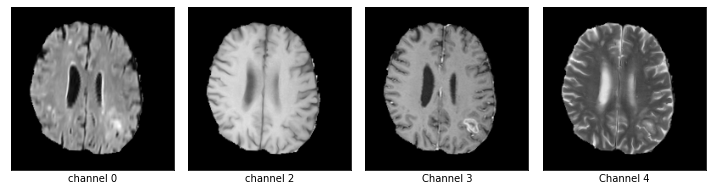

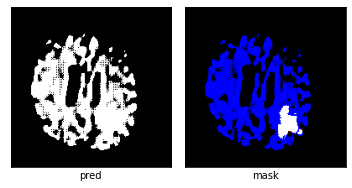

dice_loss : 0.011275051924581232



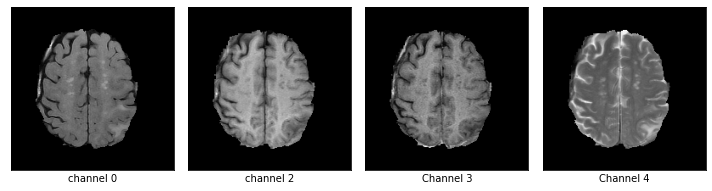

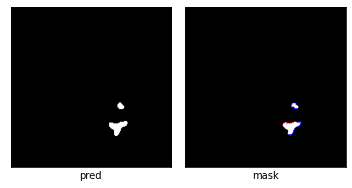

03/06 01:08:54 PM epoch 4 lr 2.420423e-02
03/06 01:08:54 PM genotype = Genotype(normal=[('skip_connect', 0), ('sep_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('skip_connect', 0), ('dil_conv_3x3', 3), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('skip_connect', 0), ('dil_conv_3x3', 2), ('dil_conv_5x5', 1), ('sep_conv_5x5', 2), ('sep_conv_5x5', 3), ('max_pool_3x3', 4), ('max_pool_3x3', 3)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.3105, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<41:30,  1.06s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.0373, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<41:08,  1.05s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<40:43,  1.04s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.5700, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<40:19,  1.03s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<40:19,  1.03s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.0388, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<40:14,  1.03s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<39:35,  1.01s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.1062, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<39:10,  1.00s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.6166, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<39:17,  1.00s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<40:03,  1.03s/it, Acc=0.987, IoU=0.854, Loss=0.0807]

tensor(0.1959, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<40:20,  1.03s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.4808, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<40:29,  1.04s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.1500, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<40:17,  1.03s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<40:22,  1.04s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<40:14,  1.03s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.0383, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<40:03,  1.03s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<39:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<39:20,  1.01s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:19<39:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.5697, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:20<39:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00234]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:21<39:23,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.0393, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:22<39:18,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.1229, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:23<39:13,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:24<39:12,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:25<39:01,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.0381, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:26<38:39,  1.00it/s, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:27<38:35,  1.01it/s, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:28<38:37,  1.00it/s, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:29<38:29,  1.01it/s, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.0401, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:30<38:45,  1.00s/it, Acc=0.995, IoU=0.906, Loss=0.05]

tensor(0.4459, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:31<38:34,  1.00it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:32<38:41,  1.00it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:33<38:41,  1.00it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:34<38:36,  1.00it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.8338, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:35<38:26,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.0393, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:36<38:30,  1.00it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:37<38:24,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.9788, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:38<38:07,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:39<38:14,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.2349, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:40<38:12,  1.01it/s, Acc=0.997, IoU=0.938, Loss=0.0332]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:41<38:19,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1070, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:42<38:41,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:43<38:46,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:44<38:44,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:45<38:31,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1189, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:46<38:13,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0320, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:47<38:07,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:48<38:11,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:49<38:23,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1777, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:50<38:45,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9805, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:51<38:25,  1.00s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:52<38:41,  1.01s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:53<38:40,  1.01s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:54<38:39,  1.01s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:55<38:38,  1.01s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:56<38:20,  1.00s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:57<38:18,  1.00s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:58<38:21,  1.00s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [00:59<38:39,  1.01s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.8502, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:00<38:39,  1.01s/it, Acc=0.988, IoU=0.766, Loss=0.133]

tensor(0.0380, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:01<38:21,  1.00s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:02<38:33,  1.01s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:03<38:27,  1.01s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:04<38:35,  1.01s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.5120, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:05<38:35,  1.01s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:06<38:30,  1.01s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:07<38:17,  1.00s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:08<38:11,  1.00s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:09<38:26,  1.01s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:10<39:07,  1.03s/it, Acc=0.985, IoU=0.834, Loss=0.0912]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:11<39:09,  1.03s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:12<39:06,  1.03s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:13<39:20,  1.03s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0497, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:14<39:08,  1.03s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.5906, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:15<39:25,  1.04s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:16<39:21,  1.04s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:17<38:59,  1.03s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:18<38:56,  1.03s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:19<38:46,  1.02s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:20<38:57,  1.03s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:21<38:45,  1.02s/it, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:22<38:53,  1.03s/it, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:23<38:47,  1.02s/it, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:24<38:25,  1.02s/it, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:25<38:18,  1.01s/it, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.1382, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:26<38:09,  1.01s/it, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:27<38:08,  1.01s/it, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.5392, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:28<37:53,  1.00s/it, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.2150, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:29<37:29,  1.01it/s, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:30<37:33,  1.00it/s, Acc=0.973, IoU=0.0921, Loss=0.831]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:31<37:23,  1.01it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:32<37:37,  1.00it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.2194, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:33<37:32,  1.00it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:34<37:38,  1.00it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:35<37:29,  1.00it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.3334, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:36<37:17,  1.01it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:37<37:09,  1.01it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:38<37:16,  1.01it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:39<37:23,  1.01it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.0431, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:40<37:29,  1.00it/s, Acc=0.982, IoU=0.737, Loss=0.151]

tensor(0.9887, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:41<37:09,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:42<37:15,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:43<37:34,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.8263, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:44<37:42,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:45<37:37,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9200, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:46<37:30,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:47<37:49,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1155, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:48<37:36,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:49<37:39,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:50<37:35,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:51<37:36,  1.01s/it, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:52<37:35,  1.01s/it, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:53<37:34,  1.01s/it, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.9395, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:54<37:27,  1.00s/it, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:55<37:28,  1.00s/it, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:56<37:22,  1.00s/it, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.0464, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:57<37:33,  1.01s/it, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [01:58<37:12,  1.00it/s, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.5563, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [01:59<37:12,  1.00it/s, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.9185, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:00<37:07,  1.00it/s, Acc=0.99, IoU=0.766, Loss=0.132]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:01<36:53,  1.01it/s, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.0519, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:02<37:00,  1.01it/s, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.6868, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:03<37:28,  1.01s/it, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.8601, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:04<37:18,  1.00s/it, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:05<37:16,  1.00s/it, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.5539, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:06<37:05,  1.00it/s, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.1526, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:07<36:48,  1.01it/s, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:08<36:47,  1.01it/s, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:09<36:44,  1.01it/s, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.0581, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:10<36:43,  1.01it/s, Acc=0.995, IoU=0.935, Loss=0.0341]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:11<36:48,  1.01it/s, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:12<37:09,  1.00s/it, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.7639, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:13<37:19,  1.01s/it, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:14<37:48,  1.02s/it, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.0744, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:15<37:19,  1.01s/it, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.6889, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:16<37:02,  1.00s/it, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:17<36:56,  1.00it/s, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.0057, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:18<36:57,  1.00s/it, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.8740, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:19<37:03,  1.00s/it, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:20<36:59,  1.00s/it, Acc=0.985, IoU=0.0598, Loss=0.884]

tensor(0.9393, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:21<36:36,  1.01it/s, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.2441, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:22<36:56,  1.00s/it, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:23<37:12,  1.01s/it, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:24<37:02,  1.01s/it, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:25<36:53,  1.00s/it, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.1532, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:26<36:53,  1.00s/it, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:27<37:04,  1.01s/it, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.8909, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:28<36:59,  1.01s/it, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:29<36:45,  1.00it/s, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:30<36:38,  1.00it/s, Acc=0.981, IoU=0.755, Loss=0.139]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:31<36:49,  1.00s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.9831, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:32<36:41,  1.00it/s, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.1547, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:33<36:59,  1.01s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:34<36:54,  1.01s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:35<36:59,  1.01s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:36<36:58,  1.01s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:37<36:51,  1.01s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:38<36:27,  1.00it/s, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0457, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:39<36:33,  1.00it/s, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:40<36:29,  1.00it/s, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:41<36:30,  1.00it/s, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.1683, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:42<36:37,  1.00s/it, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.1387, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:43<36:15,  1.01it/s, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:44<36:20,  1.00it/s, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:45<36:24,  1.00it/s, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.2005, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:46<36:26,  1.00it/s, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.6489, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:47<36:30,  1.00s/it, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.7091, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:48<36:26,  1.00it/s, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:49<36:24,  1.00it/s, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:50<36:20,  1.00it/s, Acc=0.996, IoU=0.758, Loss=0.14]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:51<36:12,  1.01it/s, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:52<36:20,  1.00it/s, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:53<36:25,  1.00s/it, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.2844, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:54<36:22,  1.00s/it, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:55<36:20,  1.00s/it, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:56<36:33,  1.01s/it, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:57<36:44,  1.01s/it, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [02:58<36:33,  1.01s/it, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.5095, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [02:59<36:25,  1.00s/it, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:00<36:25,  1.00s/it, Acc=0.997, IoU=0.922, Loss=0.0413]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:01<36:20,  1.00s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:02<36:25,  1.01s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:03<36:21,  1.00s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:04<36:07,  1.00it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1132, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:05<35:52,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.5568, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:06<35:58,  1.00it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:07<35:54,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:08<35:51,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:09<35:57,  1.00it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:10<36:08,  1.00s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:11<35:57,  1.00it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:12<35:58,  1.00it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.4147, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:13<35:56,  1.00it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:14<36:00,  1.00it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:15<35:51,  1.00it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.3305, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:16<35:41,  1.01it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.6716, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:17<35:55,  1.00it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.6352, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:18<35:53,  1.00it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.5640, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:19<35:34,  1.01it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.2867, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:20<35:47,  1.00it/s, Acc=0.985, IoU=0.628, Loss=0.228]

tensor(0.7202, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:21<35:47,  1.00it/s, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:22<36:03,  1.00s/it, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.5533, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:23<35:37,  1.01it/s, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.5901, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:24<35:47,  1.00it/s, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:25<35:38,  1.01it/s, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:26<35:42,  1.00it/s, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:27<35:44,  1.00it/s, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.3304, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:28<35:47,  1.00s/it, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:29<35:45,  1.00it/s, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.2226, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:30<35:39,  1.00it/s, Acc=0.994, IoU=0.681, Loss=0.189]

tensor(0.7248, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:31<35:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00208]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:32<35:53,  1.00s/it, Acc=1, IoU=0, Loss=0.00208]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:33<35:39,  1.00it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.1297, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:34<35:39,  1.00it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.4068, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:35<35:33,  1.00it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:36<35:20,  1.01it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:37<35:17,  1.01it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:38<35:19,  1.01it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:39<35:35,  1.00it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:40<35:39,  1.00s/it, Acc=1, IoU=0, Loss=0.00208]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:41<35:15,  1.01it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.4106, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:42<35:26,  1.00it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:43<35:27,  1.00it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.2358, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:44<35:26,  1.00it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:45<35:19,  1.01it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:46<35:17,  1.01it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.1105, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:47<35:20,  1.00it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:48<35:20,  1.00it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.8584, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:49<35:08,  1.01it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:50<35:11,  1.01it/s, Acc=0.992, IoU=0.764, Loss=0.133]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:51<35:15,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:52<35:24,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:53<35:29,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:54<35:32,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0407, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:55<35:19,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:56<35:17,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:57<35:18,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.4305, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [03:58<35:07,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.8728, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [03:59<35:15,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:00<35:22,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9563, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:01<35:22,  1.00s/it, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.9523, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:02<35:23,  1.01s/it, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.6804, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:03<35:25,  1.01s/it, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:04<35:00,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.9690, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:05<34:58,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.6981, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:06<34:36,  1.02it/s, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.0460, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:07<34:30,  1.02it/s, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:08<34:41,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:09<34:51,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.1509, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:10<34:47,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0342]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:11<34:48,  1.01it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:12<35:11,  1.00s/it, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.1560, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:13<34:59,  1.00it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:14<34:46,  1.01it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:15<34:39,  1.01it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.3150, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:16<34:36,  1.01it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:17<34:34,  1.01it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.5591, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:18<34:29,  1.01it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:19<34:24,  1.02it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.1841, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:20<34:30,  1.01it/s, Acc=0.999, IoU=0.932, Loss=0.0353]

tensor(0.6593, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:21<34:14,  1.02it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:22<34:26,  1.01it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.6583, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:23<34:19,  1.02it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:24<34:24,  1.01it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:25<34:12,  1.02it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:26<34:13,  1.02it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.1026, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:27<34:28,  1.01it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.6573, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:28<34:28,  1.01it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:29<34:36,  1.00it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:30<34:38,  1.00it/s, Acc=0.991, IoU=0.864, Loss=0.0752]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:31<34:40,  1.00it/s, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:32<34:47,  1.00s/it, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:33<34:39,  1.00it/s, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:34<34:40,  1.00it/s, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.0865, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:35<34:49,  1.00s/it, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:36<34:36,  1.00it/s, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.1181, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:37<34:40,  1.00s/it, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:38<35:23,  1.02s/it, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:39<35:34,  1.03s/it, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.0360, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:40<35:23,  1.02s/it, Acc=0.99, IoU=0.857, Loss=0.0791]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:41<35:08,  1.02s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.6879, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:42<34:41,  1.00s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:43<34:23,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:44<34:33,  1.00s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:45<34:22,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:46<34:20,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:47<34:36,  1.00s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0791, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:48<34:41,  1.01s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:49<34:16,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.3745, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:50<33:59,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:51<34:09,  1.01it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.1860, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:52<34:17,  1.00it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.7079, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:53<34:14,  1.00it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:54<34:05,  1.01it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:55<34:01,  1.01it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:56<34:05,  1.01it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:57<34:12,  1.00it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [04:58<34:08,  1.00it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [04:59<33:45,  1.01it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:00<34:03,  1.01it/s, Acc=0.997, IoU=0.932, Loss=0.0365]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:01<33:51,  1.01it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:02<34:00,  1.01it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.9713, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:03<34:08,  1.00it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.6448, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:04<33:59,  1.01it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:05<33:57,  1.01it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:06<34:00,  1.00it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:07<33:49,  1.01it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:08<34:01,  1.00it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:09<33:45,  1.01it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:10<33:40,  1.01it/s, Acc=0.999, IoU=0.799, Loss=0.111]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:11<33:21,  1.02it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.1456, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:12<33:33,  1.01it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.1593, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:13<33:32,  1.01it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.3970, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:14<33:48,  1.01it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:15<33:33,  1.01it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:16<33:17,  1.02it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:17<33:21,  1.02it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:18<33:31,  1.01it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.1721, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:19<33:27,  1.01it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:20<33:25,  1.01it/s, Acc=0.993, IoU=0.735, Loss=0.153]

tensor(0.2844, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:21<33:25,  1.01it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:22<33:29,  1.01it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.6867, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:23<33:34,  1.01it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.3349, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:24<33:31,  1.01it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:25<33:18,  1.02it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.5775, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:26<33:10,  1.02it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:27<33:10,  1.02it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:28<33:08,  1.02it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:29<33:16,  1.01it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.1555, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:30<33:22,  1.01it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:31<33:38,  1.00it/s, Acc=1, IoU=0, Loss=0.00086]

tensor(0.2783, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:32<33:39,  1.00it/s, Acc=1, IoU=0, Loss=0.00086]

tensor(0.1177, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:33<33:41,  1.00it/s, Acc=1, IoU=0, Loss=0.00086]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:34<33:46,  1.00s/it, Acc=1, IoU=0, Loss=0.00086]

tensor(0.3796, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:35<33:29,  1.01it/s, Acc=1, IoU=0, Loss=0.00086]

tensor(0.8223, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:36<33:22,  1.01it/s, Acc=1, IoU=0, Loss=0.00086]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:37<34:00,  1.01s/it, Acc=1, IoU=0, Loss=0.00086]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:38<33:36,  1.00it/s, Acc=1, IoU=0, Loss=0.00086]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:39<33:30,  1.00it/s, Acc=1, IoU=0, Loss=0.00086]

tensor(0.5990, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:40<33:22,  1.01it/s, Acc=1, IoU=0, Loss=0.00086]

tensor(0.4774, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:41<33:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.6387, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:42<33:20,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:43<33:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:44<33:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:45<33:24,  1.00it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.8284, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:46<33:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.7958, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:47<33:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.2095, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:48<33:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:49<33:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.1631, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:50<33:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0510, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:51<33:03,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.2715, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:52<33:10,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.1450, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:53<33:12,  1.00it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:54<33:14,  1.00it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:55<33:21,  1.00s/it, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:56<33:13,  1.00it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.6943, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [05:57<33:00,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [05:58<32:51,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [05:59<32:53,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.2246, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:00<32:41,  1.02it/s, Acc=0.995, IoU=0.917, Loss=0.0429]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:00<32:40,  1.02it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.3818, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:01<32:47,  1.01it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.6987, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:02<32:43,  1.01it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:03<32:59,  1.01it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.0157, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:05<33:12,  1.00s/it, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.4874, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:05<32:57,  1.01it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:06<32:53,  1.01it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.0485, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:07<33:00,  1.00it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.6281, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:08<32:55,  1.01it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:09<32:59,  1.00it/s, Acc=0.995, IoU=0.878, Loss=0.0658]

tensor(0.8907, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:10<33:12,  1.00s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.0983, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:11<33:15,  1.01s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:13<33:14,  1.01s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:14<33:18,  1.01s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.1503, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:15<33:35,  1.02s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.4928, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:16<33:44,  1.02s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:17<33:43,  1.02s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:18<33:28,  1.02s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.2237, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:19<33:14,  1.01s/it, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:20<32:45,  1.00it/s, Acc=0.955, IoU=0.0551, Loss=0.895]

tensor(0.4683, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:21<32:57,  1.00s/it, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:22<33:06,  1.01s/it, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:23<32:52,  1.00s/it, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:24<32:39,  1.01it/s, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.4396, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:25<32:43,  1.00it/s, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.7797, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:26<32:29,  1.01it/s, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:27<32:27,  1.01it/s, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:28<32:20,  1.01it/s, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:29<32:44,  1.00it/s, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.1270, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:30<32:44,  1.00it/s, Acc=0.998, IoU=0.951, Loss=0.0271]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:31<32:49,  1.00s/it, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:32<32:33,  1.01it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.3374, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:32<32:10,  1.02it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:33<32:12,  1.01it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:34<32:06,  1.02it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:35<32:24,  1.01it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:36<32:17,  1.01it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.0062, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:37<32:23,  1.01it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:38<32:28,  1.00it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:39<32:31,  1.00it/s, Acc=0.986, IoU=0.878, Loss=0.0657]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:40<32:22,  1.01it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.1865, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:41<32:35,  1.00s/it, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:42<32:24,  1.00it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:43<32:16,  1.01it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:44<32:21,  1.00it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:45<32:08,  1.01it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.6996, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:46<32:13,  1.01it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.8055, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:47<32:17,  1.00it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.5839, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:48<31:55,  1.02it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:49<32:03,  1.01it/s, Acc=0.994, IoU=0.888, Loss=0.0611]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:50<31:49,  1.02it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:51<31:58,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:52<31:54,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:53<31:52,  1.02it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0410, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:54<31:38,  1.02it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:55<31:27,  1.03it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [06:56<31:41,  1.02it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [06:57<31:40,  1.02it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.1750, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [06:58<31:48,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [06:59<31:50,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.3826, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:00<31:47,  1.01it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.1830, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:01<31:46,  1.01it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:02<31:55,  1.01it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.1373, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:03<31:46,  1.01it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:04<31:57,  1.01it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.4747, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:05<32:02,  1.00it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.9764, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:06<31:49,  1.01it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:07<31:51,  1.01it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.1774, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:08<32:02,  1.00it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:09<31:48,  1.01it/s, Acc=0.995, IoU=0.812, Loss=0.104]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:10<31:35,  1.01it/s, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.2671, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:11<31:47,  1.01it/s, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:12<31:53,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:13<32:03,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:14<31:57,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.4120, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:15<32:01,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:16<31:47,  1.01it/s, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.1552, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:17<32:02,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.2852, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:18<32:01,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.0372, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:19<31:47,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0707]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:20<31:49,  1.00it/s, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:21<31:51,  1.00it/s, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.9305, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:22<32:01,  1.01s/it, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:23<32:05,  1.01s/it, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:24<32:05,  1.01s/it, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.3749, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:25<31:33,  1.01it/s, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:26<31:33,  1.01it/s, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:27<31:27,  1.01it/s, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.0433, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:28<31:27,  1.01it/s, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:29<31:11,  1.02it/s, Acc=0.997, IoU=0.694, Loss=0.18]

tensor(0.2096, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:30<31:14,  1.02it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:31<31:15,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:32<31:21,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:33<31:32,  1.00it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.4909, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:34<31:21,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:35<31:30,  1.00it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.2942, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:36<31:19,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:37<31:10,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:38<31:14,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.4310, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:39<31:33,  1.00it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9889, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:40<31:16,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:41<31:20,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:42<31:08,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.5036, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:43<31:25,  1.00it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:44<31:06,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:45<31:01,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:46<31:05,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:47<31:10,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:48<30:56,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:49<31:04,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:50<31:04,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:51<30:56,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:52<30:48,  1.02it/s, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.7026, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:53<30:55,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:54<30:47,  1.02it/s, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9452, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [07:55<30:53,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [07:56<31:17,  1.00it/s, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [07:57<31:18,  1.00s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [07:58<31:05,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [07:59<31:20,  1.00s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:00<31:16,  1.00s/it, Acc=1, IoU=0, Loss=0.00664]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:01<31:05,  1.00it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:02<30:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.2176, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:03<30:48,  1.01it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:04<30:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.4994, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:05<30:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:06<30:51,  1.01it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.0074, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:07<30:40,  1.01it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.0772, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:08<30:28,  1.02it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.1964, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:09<30:36,  1.02it/s, Acc=1, IoU=0, Loss=0.00664]

tensor(0.5159, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:10<30:44,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.5798, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:11<30:51,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:12<30:52,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.5980, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:13<30:47,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1318, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:14<30:44,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:15<30:50,  1.00it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:16<30:47,  1.01it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9692, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:17<31:00,  1.00s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0987, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:18<31:00,  1.00s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:19<30:51,  1.00it/s, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:20<30:50,  1.00it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.6331, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:21<30:48,  1.00it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:22<30:32,  1.01it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:23<30:29,  1.01it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:24<30:40,  1.01it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:25<30:28,  1.01it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.5891, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:26<30:24,  1.01it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.6194, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:27<30:41,  1.00it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:28<30:35,  1.01it/s, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:29<30:46,  1.00s/it, Acc=0.994, IoU=0.917, Loss=0.0446]

tensor(0.5953, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:30<30:45,  1.00s/it, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:31<30:40,  1.00it/s, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.0297, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:32<30:41,  1.00it/s, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:33<30:45,  1.00s/it, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.6141, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:34<30:42,  1.00s/it, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:35<30:27,  1.01it/s, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:36<30:27,  1.01it/s, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.5138, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:37<30:26,  1.01it/s, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.0047, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:38<30:22,  1.01it/s, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.1447, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:39<30:21,  1.01it/s, Acc=0.997, IoU=0.942, Loss=0.0315]

tensor(0.5581, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:40<30:29,  1.00it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:41<30:29,  1.00it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:42<30:16,  1.01it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:42<30:10,  1.01it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:43<30:02,  1.02it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:44<30:01,  1.02it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:45<30:03,  1.01it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.4854, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:46<30:07,  1.01it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:47<30:04,  1.01it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:48<30:12,  1.01it/s, Acc=0.997, IoU=0.926, Loss=0.039]

tensor(0.4278, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:49<30:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.5529, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:50<30:18,  1.00it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.8623, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:51<30:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.5517, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:52<30:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:53<30:17,  1.00it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [08:54<30:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.4667, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [08:55<30:18,  1.00s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [08:56<30:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.1839, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [08:57<29:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [08:58<29:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00201]

tensor(0.1344, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [08:59<29:48,  1.01it/s, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.3304, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:00<29:59,  1.01it/s, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.4634, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:01<30:05,  1.00it/s, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:02<30:14,  1.00s/it, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.5452, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:03<30:28,  1.01s/it, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.6241, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:04<30:18,  1.01s/it, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:05<30:15,  1.00s/it, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.1521, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:06<30:20,  1.01s/it, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.4818, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:07<30:00,  1.00it/s, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:08<30:02,  1.00it/s, Acc=0.994, IoU=0.839, Loss=0.0861]

tensor(0.0491, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:09<30:04,  1.00s/it, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.8045, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:10<30:07,  1.00s/it, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:11<30:18,  1.01s/it, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:12<30:17,  1.01s/it, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.6072, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:13<30:03,  1.00s/it, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.2530, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:14<29:50,  1.00it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.5097, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:15<29:45,  1.01it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:16<29:40,  1.01it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:17<29:39,  1.01it/s, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:18<29:55,  1.00s/it, Acc=0.992, IoU=0.695, Loss=0.183]

tensor(0.1352, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:19<29:40,  1.01it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:20<29:40,  1.01it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:21<29:48,  1.00it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:22<29:53,  1.00s/it, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:23<29:41,  1.00it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:24<29:30,  1.01it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:25<29:34,  1.01it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:26<29:23,  1.01it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:27<29:33,  1.01it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:28<29:36,  1.00it/s, Acc=0.988, IoU=0.846, Loss=0.0836]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:29<29:36,  1.00it/s, Acc=1, IoU=0, Loss=0.000905]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:30<29:40,  1.00it/s, Acc=1, IoU=0, Loss=0.000905]

tensor(0.6289, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:31<29:40,  1.00it/s, Acc=1, IoU=0, Loss=0.000905]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:32<29:45,  1.00s/it, Acc=1, IoU=0, Loss=0.000905]

tensor(0.2154, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:33<29:47,  1.00s/it, Acc=1, IoU=0, Loss=0.000905]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:34<29:31,  1.00it/s, Acc=1, IoU=0, Loss=0.000905]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:35<29:19,  1.01it/s, Acc=1, IoU=0, Loss=0.000905]

tensor(0.5183, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:36<29:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000905]

tensor(0.1852, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:37<29:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000905]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:38<29:19,  1.01it/s, Acc=1, IoU=0, Loss=0.000905]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:39<29:18,  1.01it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.2589, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:40<29:19,  1.01it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:41<29:31,  1.00it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.3014, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:42<29:08,  1.01it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:43<29:17,  1.01it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0402, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:44<29:07,  1.01it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:45<29:01,  1.02it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:46<28:37,  1.03it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9878, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:47<28:51,  1.02it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:48<28:52,  1.02it/s, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:49<29:42,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:50<29:37,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:51<29:33,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.6362, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:52<29:30,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [09:53<29:33,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [09:54<29:27,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [09:55<29:25,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [09:56<29:28,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [09:57<29:29,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.6359, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [09:58<29:17,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1315, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [09:59<29:26,  1.01s/it, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:00<29:26,  1.01s/it, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:01<29:19,  1.00s/it, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:02<29:09,  1.00it/s, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:03<29:14,  1.00s/it, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:04<29:17,  1.00s/it, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.4856, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:05<29:05,  1.00it/s, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:06<29:16,  1.01s/it, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:07<28:59,  1.00it/s, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.2443, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:08<28:44,  1.01it/s, Acc=0.998, IoU=0.819, Loss=0.101]

tensor(0.2267, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:09<28:40,  1.01it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.0482, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:10<28:40,  1.01it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.2621, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:11<28:36,  1.01it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.1297, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:12<28:40,  1.01it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:13<28:28,  1.02it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.1553, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:14<28:37,  1.01it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:15<28:40,  1.01it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.9029, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:16<28:48,  1.00it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:17<28:46,  1.01it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:18<28:50,  1.00it/s, Acc=0.989, IoU=0.88, Loss=0.066]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:19<28:46,  1.00it/s, Acc=1, IoU=0, Loss=0.00111]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:20<28:53,  1.00s/it, Acc=1, IoU=0, Loss=0.00111]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:21<28:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00111]

tensor(0.5195, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:22<28:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00111]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:23<28:51,  1.00s/it, Acc=1, IoU=0, Loss=0.00111]

tensor(0.6902, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:24<28:53,  1.00s/it, Acc=1, IoU=0, Loss=0.00111]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:25<28:40,  1.00it/s, Acc=1, IoU=0, Loss=0.00111]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:26<28:34,  1.01it/s, Acc=1, IoU=0, Loss=0.00111]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:27<28:24,  1.01it/s, Acc=1, IoU=0, Loss=0.00111]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:28<28:34,  1.01it/s, Acc=1, IoU=0, Loss=0.00111]

tensor(0.6068, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:29<28:43,  1.00it/s, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:30<28:30,  1.01it/s, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:31<28:26,  1.01it/s, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:32<28:23,  1.01it/s, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:33<28:33,  1.00it/s, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.1539, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:34<28:31,  1.00it/s, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:35<28:52,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:36<28:56,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:37<28:48,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.1461, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:38<28:29,  1.00it/s, Acc=0.995, IoU=0.933, Loss=0.0347]

tensor(0.3064, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:39<28:33,  1.00it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:40<28:27,  1.00it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.4021, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:41<28:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:42<28:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:43<28:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:44<28:09,  1.01it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.1390, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:45<28:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:46<28:14,  1.01it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.2732, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:47<28:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.5397, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:48<28:22,  1.00it/s, Acc=1, IoU=0, Loss=0.000719]

tensor(0.2108, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:49<28:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000547]

tensor(0.3451, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:50<28:13,  1.01it/s, Acc=1, IoU=0, Loss=0.000547]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:51<28:09,  1.01it/s, Acc=1, IoU=0, Loss=0.000547]

tensor(0.2145, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:52<28:03,  1.01it/s, Acc=1, IoU=0, Loss=0.000547]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [10:53<28:22,  1.00s/it, Acc=1, IoU=0, Loss=0.000547]

tensor(0.5915, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [10:54<28:15,  1.00it/s, Acc=1, IoU=0, Loss=0.000547]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [10:55<28:03,  1.01it/s, Acc=1, IoU=0, Loss=0.000547]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [10:56<28:00,  1.01it/s, Acc=1, IoU=0, Loss=0.000547]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [10:57<28:21,  1.00s/it, Acc=1, IoU=0, Loss=0.000547]

tensor(0.2219, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [10:58<28:23,  1.01s/it, Acc=1, IoU=0, Loss=0.000547]

tensor(0.1879, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [10:59<28:12,  1.00it/s, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.5258, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:00<28:27,  1.01s/it, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.7763, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:01<28:23,  1.01s/it, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.0451, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:02<28:07,  1.00it/s, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:03<28:01,  1.01it/s, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.0054, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:04<28:10,  1.00s/it, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:05<28:11,  1.00s/it, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:06<28:16,  1.01s/it, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:07<28:10,  1.00s/it, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:08<28:12,  1.00s/it, Acc=0.995, IoU=0.737, Loss=0.15]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:09<28:12,  1.01s/it, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.1331, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:10<28:08,  1.00s/it, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.3479, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:11<28:01,  1.00it/s, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:12<27:59,  1.00it/s, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:13<27:58,  1.00it/s, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.5217, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:14<27:52,  1.00it/s, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.8896, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:15<27:37,  1.01it/s, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:16<27:34,  1.01it/s, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:17<27:28,  1.02it/s, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:18<27:23,  1.02it/s, Acc=0.991, IoU=0.696, Loss=0.18]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:19<27:18,  1.02it/s, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:20<27:37,  1.01it/s, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.2874, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:21<28:02,  1.01s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:22<28:07,  1.01s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:23<28:10,  1.01s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:24<27:45,  1.00it/s, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.5072, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:25<27:48,  1.00s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:26<27:49,  1.00s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:27<27:47,  1.00s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:28<27:54,  1.01s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:29<27:52,  1.01s/it, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:30<27:49,  1.00s/it, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:31<27:53,  1.01s/it, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.8821, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:32<27:39,  1.00it/s, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:33<27:27,  1.01it/s, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.2954, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:34<27:27,  1.01it/s, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:35<27:24,  1.01it/s, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.3028, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:36<27:19,  1.01it/s, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.1838, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:37<27:19,  1.01it/s, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:38<27:38,  1.00s/it, Acc=0.996, IoU=0.537, Loss=0.301]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:39<27:31,  1.00it/s, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:40<27:28,  1.00it/s, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.1589, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:41<27:34,  1.00s/it, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.3964, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:42<27:26,  1.00it/s, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:43<27:15,  1.01it/s, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.1837, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:44<27:27,  1.00it/s, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.9298, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:45<27:31,  1.00s/it, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:46<27:22,  1.00it/s, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.2971, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:47<27:09,  1.01it/s, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.1527, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:48<27:19,  1.00it/s, Acc=0.977, IoU=0.627, Loss=0.229]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:49<27:07,  1.01it/s, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:50<27:22,  1.00it/s, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.5942, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:51<27:38,  1.01s/it, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:52<27:26,  1.00s/it, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [11:53<27:26,  1.00s/it, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [11:54<27:17,  1.00it/s, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [11:55<27:12,  1.00it/s, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [11:56<27:20,  1.00s/it, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [11:57<27:36,  1.01s/it, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [11:58<27:22,  1.00s/it, Acc=0.991, IoU=0.824, Loss=0.0981]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [11:59<27:14,  1.00s/it, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:00<27:18,  1.00s/it, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:01<27:12,  1.00s/it, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.1370, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:02<26:57,  1.01it/s, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:03<27:03,  1.00it/s, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.1377, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:04<27:06,  1.00it/s, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:05<26:56,  1.01it/s, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.6047, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:06<27:02,  1.00it/s, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:07<26:46,  1.01it/s, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.4022, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:08<26:46,  1.01it/s, Acc=0.987, IoU=0.796, Loss=0.114]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:09<26:29,  1.02it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:10<26:37,  1.02it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:11<26:40,  1.01it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:12<27:00,  1.00it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.2345, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:13<26:45,  1.01it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:14<26:33,  1.02it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.2026, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:15<26:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.1489, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:16<26:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.1613, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:17<26:52,  1.00it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:18<26:53,  1.00it/s, Acc=1, IoU=0, Loss=0.00237]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:19<26:36,  1.01it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.6647, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:20<26:35,  1.01it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:21<26:25,  1.02it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.9887, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:22<26:34,  1.01it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:23<26:38,  1.01it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:24<26:25,  1.01it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.1684, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:25<26:17,  1.02it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.1699, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:26<26:21,  1.02it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.2510, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:27<26:20,  1.02it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.4940, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:28<26:14,  1.02it/s, Acc=0.988, IoU=0.569, Loss=0.275]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:29<26:12,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.9789, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:30<26:19,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.3831, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:31<26:15,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:31<26:15,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.3275, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:32<26:11,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:33<26:11,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:34<26:11,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:35<26:07,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.2299, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:36<26:00,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.1420, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:37<25:58,  1.02it/s, Acc=0.991, IoU=0.853, Loss=0.0799]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:38<26:09,  1.02it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:39<26:14,  1.01it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:40<26:06,  1.02it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:41<26:14,  1.01it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:42<26:23,  1.00it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.5034, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:43<26:19,  1.01it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:44<26:18,  1.01it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:45<26:12,  1.01it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:46<26:10,  1.01it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:47<26:12,  1.01it/s, Acc=0.998, IoU=0.631, Loss=0.223]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:48<26:14,  1.01it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:49<26:14,  1.01it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:50<26:15,  1.00it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [12:51<26:17,  1.00it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [12:52<26:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000658]

tensor(0.9060, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [12:53<26:16,  1.00it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.2192, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [12:54<26:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.2964, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [12:55<26:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [12:56<26:14,  1.00it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [12:57<26:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000658]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [12:58<26:16,  1.00s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.1940, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [12:59<26:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00202]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:00<26:08,  1.00it/s, Acc=1, IoU=0, Loss=0.00202]

tensor(0.3742, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:01<26:08,  1.00it/s, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:02<26:02,  1.00it/s, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:03<26:15,  1.00s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.1712, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:04<25:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:05<25:48,  1.01it/s, Acc=1, IoU=0, Loss=0.00202]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:06<25:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:07<25:52,  1.01it/s, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:08<25:44,  1.01it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:09<25:41,  1.01it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.3434, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:10<25:41,  1.01it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.1602, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:11<25:44,  1.01it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.2646, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:12<25:52,  1.00it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.3588, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:13<25:44,  1.01it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:14<25:44,  1.01it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:15<25:44,  1.01it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.1635, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:16<25:49,  1.00it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:17<25:54,  1.00it/s, Acc=0.997, IoU=0.922, Loss=0.0422]

tensor(0.0085, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:18<25:59,  1.00s/it, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:19<25:48,  1.00it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:20<25:51,  1.00it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:21<25:44,  1.00it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.3321, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:22<25:40,  1.01it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.3894, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:23<25:39,  1.01it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:24<25:38,  1.01it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.2115, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:25<25:29,  1.01it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:26<25:31,  1.01it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.3972, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:27<25:35,  1.01it/s, Acc=0.997, IoU=0.868, Loss=0.072]

tensor(0.0047, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:28<25:27,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.3422, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:29<25:30,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:30<25:28,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.0445, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:31<25:36,  1.00it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:32<25:36,  1.00it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:33<25:27,  1.01it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.0464, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:34<25:15,  1.02it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.3605, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:35<25:05,  1.02it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.3130, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:36<25:07,  1.02it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:37<25:04,  1.02it/s, Acc=1, IoU=0, Loss=0.0117]

tensor(0.5357, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:38<25:03,  1.02it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.6252, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:39<25:20,  1.01it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:40<25:22,  1.01it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.6735, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:41<25:08,  1.01it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.1521, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:42<25:12,  1.01it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:43<25:16,  1.01it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.7034, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:44<25:13,  1.01it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.8852, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:45<25:13,  1.01it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:46<25:16,  1.01it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:47<25:20,  1.00it/s, Acc=1, IoU=0, Loss=0.929]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:48<25:28,  1.00s/it, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:49<25:19,  1.00it/s, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.2442, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [13:50<25:14,  1.01it/s, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [13:51<25:15,  1.00it/s, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.4301, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [13:52<25:19,  1.00it/s, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [13:53<25:15,  1.00it/s, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [13:54<25:18,  1.00s/it, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [13:55<25:14,  1.00it/s, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.4419, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [13:56<25:09,  1.00it/s, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [13:57<25:21,  1.00s/it, Acc=0.991, IoU=0.846, Loss=0.0837]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [13:58<25:50,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [13:59<25:39,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1330, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:00<25:26,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:01<24:57,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.3433, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:02<25:03,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5820, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:03<24:53,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:04<24:54,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0579, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:05<24:45,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:06<24:47,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:07<24:55,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:08<24:45,  1.01it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.9826, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:09<24:41,  1.01it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:10<24:32,  1.02it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.1931, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:11<24:31,  1.02it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.4680, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:12<24:29,  1.02it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:13<24:35,  1.02it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:14<24:29,  1.02it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.6381, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:15<24:38,  1.01it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:16<24:29,  1.02it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.0554, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:17<24:16,  1.03it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.9809, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:18<24:12,  1.03it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.6828, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:19<24:21,  1.02it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.0154, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:20<24:24,  1.02it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:21<24:23,  1.02it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:22<24:16,  1.02it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.9899, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:23<24:17,  1.02it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.5761, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:24<24:22,  1.02it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.0206, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:25<24:29,  1.01it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:26<24:37,  1.01it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:27<24:32,  1.01it/s, Acc=0.993, IoU=0.918, Loss=0.043]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:28<24:31,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:29<24:32,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.2969, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:30<24:32,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.1274, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:31<24:39,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:31<24:28,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.6146, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:32<24:34,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.3891, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:33<24:31,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:34<24:22,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:35<24:19,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.0465, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:36<24:23,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.2267, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:37<24:17,  1.01it/s, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.1788, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:38<24:25,  1.00it/s, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:39<24:38,  1.00s/it, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:40<24:40,  1.01s/it, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:41<24:38,  1.01s/it, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:42<24:28,  1.00it/s, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.1685, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:43<24:33,  1.00s/it, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:44<24:27,  1.00s/it, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:45<24:20,  1.00it/s, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:46<24:29,  1.00s/it, Acc=0.994, IoU=0.898, Loss=0.054]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:47<24:26,  1.00s/it, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.6248, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:48<24:28,  1.00s/it, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [14:50<24:30,  1.01s/it, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [14:50<24:25,  1.00s/it, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.2687, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [14:52<24:24,  1.00s/it, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.2337, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [14:52<24:08,  1.01it/s, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.9872, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [14:53<23:59,  1.01it/s, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [14:54<23:59,  1.01it/s, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [14:55<24:08,  1.01it/s, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [14:56<24:19,  1.00s/it, Acc=0.997, IoU=0.738, Loss=0.15]

tensor(0.0917, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [14:57<24:18,  1.00s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [14:58<24:18,  1.00s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.9775, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [14:59<24:19,  1.01s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:01<24:33,  1.02s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.0426, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:02<24:26,  1.01s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:03<24:31,  1.02s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.5147, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:04<24:38,  1.02s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:05<24:35,  1.02s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:06<24:34,  1.02s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.6430, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:07<24:26,  1.02s/it, Acc=0.99, IoU=0.579, Loss=0.267]

tensor(0.6085, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:08<24:14,  1.01s/it, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:09<24:08,  1.00s/it, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:10<24:00,  1.00it/s, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:11<24:01,  1.00s/it, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:12<23:55,  1.00it/s, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:13<23:52,  1.00it/s, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:14<23:47,  1.01it/s, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:15<23:53,  1.00it/s, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.8234, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:16<23:47,  1.01it/s, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:17<23:36,  1.01it/s, Acc=0.988, IoU=0.826, Loss=0.0943]

tensor(0.1593, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:18<23:34,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:19<23:37,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.6235, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:20<23:34,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0401, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:20<23:36,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.8828, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:21<23:40,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:22<23:37,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.1599, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:23<23:29,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:24<23:26,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:25<23:26,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:26<23:22,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:27<23:27,  1.01it/s, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:28<23:43,  1.00s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:29<23:43,  1.00s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:30<23:44,  1.00s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:31<23:30,  1.01it/s, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:32<23:37,  1.00it/s, Acc=1, IoU=0, Loss=0.00121]

tensor(0.1098, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:33<23:35,  1.00it/s, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:34<23:33,  1.00it/s, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:35<23:41,  1.00s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.7284, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:36<23:35,  1.00s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.9794, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:37<23:24,  1.01it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.1664, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:38<23:24,  1.01it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:39<23:25,  1.00it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:40<23:16,  1.01it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:41<23:16,  1.01it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:42<23:10,  1.01it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.5947, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:43<23:19,  1.01it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.0345, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:44<23:11,  1.01it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:45<23:00,  1.02it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:46<23:00,  1.02it/s, Acc=0.988, IoU=0.798, Loss=0.113]

tensor(0.6707, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:47<22:57,  1.02it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:48<22:55,  1.02it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.5614, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [15:49<22:54,  1.02it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.1940, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [15:50<23:02,  1.01it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.3693, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [15:51<23:03,  1.01it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.7860, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [15:52<22:53,  1.02it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [15:53<22:46,  1.02it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [15:54<23:01,  1.01it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.1179, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [15:55<23:03,  1.01it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [15:56<23:09,  1.00it/s, Acc=0.996, IoU=0.871, Loss=0.0694]

tensor(0.2211, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [15:57<23:14,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9095, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [15:58<23:22,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [15:59<23:22,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.4520, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:00<23:22,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:01<23:10,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:02<23:05,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:03<23:05,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:04<22:56,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1333, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:05<22:49,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:06<22:49,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9777, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:07<22:43,  1.02it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.8452, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:08<22:34,  1.02it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.9449, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:09<22:40,  1.02it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.9863, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:10<22:45,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:11<22:43,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:12<22:42,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:13<22:40,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:14<22:34,  1.02it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:15<22:36,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:16<22:40,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0542]

tensor(0.6211, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:17<22:39,  1.01it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:18<22:42,  1.01it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:19<22:35,  1.01it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:20<22:20,  1.02it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.0042, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:21<22:28,  1.02it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:22<22:30,  1.01it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:23<22:22,  1.02it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:24<22:20,  1.02it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:25<22:25,  1.02it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.6969, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:26<22:43,  1.00it/s, Acc=0.984, IoU=0.847, Loss=0.0848]

tensor(0.1875, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:27<22:57,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.5505, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:28<23:01,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:29<22:44,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:30<22:42,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:31<22:40,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:32<22:42,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.8926, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:33<22:32,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:34<22:25,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3607, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:35<22:24,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:36<22:17,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.5612, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:37<22:05,  1.02it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:38<22:22,  1.01it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:39<22:27,  1.00it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:40<22:26,  1.00it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.4975, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:41<22:15,  1.01it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.1316, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:42<22:16,  1.01it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:43<22:21,  1.01it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:44<22:19,  1.01it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.2520, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:45<22:11,  1.01it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.2386, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:46<22:07,  1.01it/s, Acc=0.998, IoU=0.799, Loss=0.113]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:47<22:09,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [16:48<22:12,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [16:49<22:06,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.2189, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [16:50<21:59,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [16:51<21:53,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1944, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [16:52<22:01,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [16:53<22:03,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1192, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [16:54<21:59,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [16:55<22:02,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [16:56<21:50,  1.02it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [16:57<21:57,  1.01it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.8474, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [16:58<21:58,  1.01it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [16:59<22:01,  1.01it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.5957, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:00<21:58,  1.01it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:01<21:46,  1.02it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.2119, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:02<21:36,  1.03it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:03<21:38,  1.02it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.5736, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:03<21:26,  1.03it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:04<21:45,  1.02it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.2725, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:05<21:51,  1.01it/s, Acc=0.995, IoU=0.648, Loss=0.213]

tensor(0.6411, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:06<21:51,  1.01it/s, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.7275, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:07<21:57,  1.00it/s, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:08<21:51,  1.01it/s, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.4536, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:09<21:39,  1.02it/s, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.2091, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:10<21:37,  1.02it/s, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:11<21:39,  1.02it/s, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.4083, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:12<21:40,  1.01it/s, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:13<21:46,  1.01it/s, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:14<21:57,  1.00s/it, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.5694, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:15<21:59,  1.00s/it, Acc=0.995, IoU=0.84, Loss=0.0873]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:16<21:58,  1.00s/it, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:17<21:57,  1.00s/it, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:18<21:51,  1.00it/s, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:19<21:41,  1.01it/s, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.2175, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:20<21:37,  1.01it/s, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:21<21:33,  1.01it/s, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.2895, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:22<21:37,  1.01it/s, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:23<21:32,  1.01it/s, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:24<21:27,  1.01it/s, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.9481, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:25<21:32,  1.01it/s, Acc=0.989, IoU=0.877, Loss=0.0656]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:26<21:26,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.1732, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:27<21:19,  1.02it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:28<21:19,  1.02it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.1665, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:29<21:16,  1.02it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:30<21:13,  1.02it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0385, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:31<21:23,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:32<21:24,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0631, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:33<21:22,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:34<21:24,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:35<21:18,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.3819, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:36<21:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:37<21:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:38<21:10,  1.02it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:39<21:10,  1.02it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.1500, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:40<21:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:41<21:19,  1.01it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:42<21:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:43<21:22,  1.00it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:44<21:19,  1.00it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:45<21:19,  1.00it/s, Acc=1, IoU=0, Loss=0.000831]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:46<21:12,  1.01it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.6489, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:47<21:17,  1.00it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [17:48<21:08,  1.01it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [17:49<21:11,  1.01it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [17:50<21:12,  1.01it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.6641, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [17:51<21:08,  1.01it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [17:52<21:13,  1.00it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [17:53<21:09,  1.01it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.2845, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [17:54<21:03,  1.01it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.1695, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [17:55<20:52,  1.02it/s, Acc=0.995, IoU=0.587, Loss=0.261]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [17:56<21:07,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [17:57<21:06,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0305, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [17:58<21:15,  1.00s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.5532, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [17:59<21:05,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0948, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:00<21:01,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.3425, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:01<20:49,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:02<20:48,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:03<20:54,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:04<21:04,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1946, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:05<20:59,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:06<20:47,  1.01it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.7185, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:07<20:57,  1.00it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:08<20:54,  1.01it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:09<20:44,  1.01it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:10<20:36,  1.02it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:11<20:42,  1.01it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.4369, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:12<20:36,  1.02it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.3616, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:13<20:44,  1.01it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.4544, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:14<20:36,  1.02it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.1634, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:15<20:43,  1.01it/s, Acc=0.994, IoU=0.939, Loss=0.0324]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:16<20:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:17<20:36,  1.01it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.3918, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:18<20:30,  1.02it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:19<20:38,  1.01it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.1743, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:20<20:38,  1.01it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:21<20:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.7590, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:22<20:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:23<20:39,  1.01it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:24<20:32,  1.01it/s, Acc=1, IoU=0, Loss=0.000677]

tensor(0.1452, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:25<20:45,  1.00s/it, Acc=1, IoU=0, Loss=0.000677]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:26<20:41,  1.00it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.1267, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:27<20:41,  1.00it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:28<20:33,  1.01it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:29<20:33,  1.01it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.4046, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:30<20:30,  1.01it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:31<20:39,  1.00s/it, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.6845, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:32<20:31,  1.01it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.5129, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:33<20:29,  1.01it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.4067, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:34<20:19,  1.01it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:35<20:20,  1.01it/s, Acc=0.973, IoU=0.589, Loss=0.26]

tensor(0.1789, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:36<20:30,  1.00it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:37<20:31,  1.00it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.9761, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:38<20:28,  1.00it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:39<20:27,  1.00it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.2423, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:40<20:26,  1.00it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:41<20:22,  1.01it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:42<20:19,  1.01it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:43<20:23,  1.00it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:44<20:13,  1.01it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.1503, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:45<20:10,  1.01it/s, Acc=0.993, IoU=0.639, Loss=0.223]

tensor(0.0436, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:46<20:21,  1.00it/s, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:47<20:24,  1.00s/it, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:48<20:23,  1.00s/it, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [18:49<20:20,  1.00it/s, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.9522, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [18:50<20:17,  1.00it/s, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [18:51<20:17,  1.00it/s, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [18:52<20:14,  1.00it/s, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [18:53<20:13,  1.00it/s, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.2066, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [18:54<20:18,  1.00s/it, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [18:55<20:06,  1.01it/s, Acc=0.995, IoU=0.878, Loss=0.065]

tensor(0.2912, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [18:56<20:12,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [18:57<20:10,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [18:58<20:13,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.3582, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [18:59<20:12,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:00<20:11,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1071, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:01<20:04,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.6543, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:02<20:05,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:03<20:04,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:04<20:00,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:05<20:09,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4813, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:06<20:11,  1.01s/it, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:07<20:03,  1.00s/it, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.6413, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:08<20:05,  1.00s/it, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.2431, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:09<20:02,  1.00s/it, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.5135, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:10<20:04,  1.00s/it, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:11<19:54,  1.00it/s, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:12<19:59,  1.00s/it, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:13<19:54,  1.00it/s, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.2539, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:14<19:53,  1.00it/s, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:15<19:49,  1.00it/s, Acc=0.995, IoU=0.81, Loss=0.104]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:16<19:35,  1.02it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.4101, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:17<19:49,  1.00it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:18<19:49,  1.00it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.1817, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:19<19:50,  1.00it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:20<19:48,  1.00it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:21<19:51,  1.00s/it, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:22<19:42,  1.00it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:23<19:32,  1.01it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.2428, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:24<19:26,  1.02it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.1474, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:25<19:31,  1.01it/s, Acc=0.996, IoU=0.874, Loss=0.0668]

tensor(0.0963, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:26<19:31,  1.01it/s, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.5863, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:27<19:35,  1.01it/s, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:28<19:40,  1.00it/s, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.1770, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:29<19:42,  1.00s/it, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:30<19:36,  1.00it/s, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.1640, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:31<19:30,  1.01it/s, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.1785, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:32<19:35,  1.00it/s, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:33<19:29,  1.01it/s, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:34<19:37,  1.00s/it, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:35<19:27,  1.01it/s, Acc=0.995, IoU=0.925, Loss=0.0404]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:35<19:19,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:36<19:25,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:38<19:35,  1.00s/it, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.2676, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:39<19:27,  1.00it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:39<19:24,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:40<19:16,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.1511, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:41<19:10,  1.02it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:42<19:03,  1.02it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:43<18:59,  1.02it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.5316, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:44<18:53,  1.03it/s, Acc=0.993, IoU=0.92, Loss=0.0421]

tensor(0.2820, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:45<19:01,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:46<19:11,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:47<19:09,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4206, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [19:48<19:05,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [19:49<18:58,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0971, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [19:50<19:02,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1252, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [19:51<19:05,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [19:52<19:08,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [19:53<19:07,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.2760, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [19:54<19:08,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [19:55<19:02,  1.01it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.2785, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [19:56<19:08,  1.00it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.6624, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [19:57<18:58,  1.01it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [19:58<18:54,  1.01it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.5453, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [19:59<19:04,  1.01it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:00<19:06,  1.00it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:01<18:55,  1.01it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.3386, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:02<18:47,  1.02it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.1409, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:03<18:50,  1.01it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:04<18:49,  1.01it/s, Acc=0.998, IoU=0.784, Loss=0.123]

tensor(0.3772, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:05<18:44,  1.02it/s, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.9223, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:06<18:49,  1.01it/s, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.1265, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:07<18:51,  1.01it/s, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.1495, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:08<18:53,  1.01it/s, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:09<18:46,  1.01it/s, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.4129, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:10<18:39,  1.02it/s, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:11<18:53,  1.00it/s, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:12<18:51,  1.00it/s, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:13<19:01,  1.00s/it, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:14<18:58,  1.00s/it, Acc=0.982, IoU=0.501, Loss=0.334]

tensor(0.9237, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:15<19:09,  1.01s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.2774, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:16<19:04,  1.01s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:17<18:50,  1.00it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:18<18:49,  1.00it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:19<18:44,  1.00it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.5762, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:20<18:42,  1.01it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.2908, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:21<18:50,  1.00s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.0077, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:22<18:41,  1.00it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:23<18:35,  1.01it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.8957, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:24<18:29,  1.01it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:25<18:36,  1.01it/s, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.5079, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:26<18:32,  1.01it/s, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:27<18:32,  1.01it/s, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.2951, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:28<18:38,  1.00it/s, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.5793, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:29<18:44,  1.00s/it, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:30<18:43,  1.00s/it, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.9796, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:31<18:45,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.3737, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:32<18:36,  1.00it/s, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.4857, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:33<18:23,  1.01it/s, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:34<18:20,  1.01it/s, Acc=0.994, IoU=0.901, Loss=0.0526]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:35<18:24,  1.01it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:36<18:32,  1.00it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.5536, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:37<18:24,  1.01it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:38<18:22,  1.01it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.6674, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:39<18:21,  1.01it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:40<18:23,  1.00it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:41<18:20,  1.01it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:42<18:25,  1.00it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:43<18:16,  1.01it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:44<18:20,  1.00it/s, Acc=0.992, IoU=0.864, Loss=0.0754]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:45<18:15,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.6496, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:46<18:23,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9421, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:47<18:21,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1998, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:48<18:12,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [20:49<18:10,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.5174, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [20:50<18:10,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [20:51<17:56,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [20:52<17:48,  1.03it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.8526, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [20:53<17:57,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [20:54<17:58,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [20:55<17:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [20:56<17:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [20:57<17:52,  1.02it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.2236, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [20:58<18:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [20:59<18:06,  1.00it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:00<17:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:01<17:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.4691, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:02<17:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.6657, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:03<17:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:04<17:42,  1.02it/s, Acc=1, IoU=0, Loss=0.00214]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:05<17:47,  1.02it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.1902, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:06<17:57,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:07<17:59,  1.00it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.5297, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:08<17:50,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:09<17:49,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.8557, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:10<17:42,  1.02it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:11<17:39,  1.02it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.7082, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:12<17:44,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.7222, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:13<17:42,  1.01it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.9903, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:14<17:36,  1.02it/s, Acc=0.993, IoU=0.816, Loss=0.1]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:15<17:32,  1.02it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:16<17:37,  1.01it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:17<17:39,  1.01it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.2039, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:18<17:37,  1.01it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:19<17:39,  1.01it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:20<17:37,  1.01it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.0982, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:21<17:29,  1.02it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:22<17:36,  1.01it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.4927, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:23<17:40,  1.01it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:24<17:34,  1.01it/s, Acc=0.998, IoU=0.595, Loss=0.255]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:24<17:31,  1.01it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.6768, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:26<17:44,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.2205, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:27<17:45,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:28<17:37,  1.00it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:29<17:35,  1.00it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:30<17:42,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:31<17:37,  1.00it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0845, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:32<17:32,  1.00it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.3157, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:33<17:37,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:33<17:29,  1.00it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:35<17:32,  1.00it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1622, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:35<17:23,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:37<17:35,  1.00s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0421, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:38<17:36,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:39<17:28,  1.00it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:39<17:17,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:40<17:17,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:41<17:25,  1.00it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:42<17:23,  1.00it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1018, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:43<17:23,  1.00it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:44<17:18,  1.01it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.2286, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:45<17:21,  1.00it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.5686, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:46<17:15,  1.01it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:47<17:15,  1.01it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [21:48<17:18,  1.00it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [21:49<17:11,  1.01it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.0468, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [21:50<17:08,  1.01it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [21:51<17:10,  1.01it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.6617, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [21:52<17:07,  1.01it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [21:53<16:58,  1.02it/s, Acc=0.99, IoU=0.839, Loss=0.0873]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [21:54<17:02,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0044, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [21:55<17:02,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [21:56<16:55,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [21:57<16:54,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.3880, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [21:58<16:52,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [21:59<16:45,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.2829, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:00<16:48,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:01<16:49,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:02<16:44,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:03<16:49,  1.02it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:04<16:51,  1.01it/s, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:05<17:05,  1.00s/it, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.3906, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:06<16:54,  1.01it/s, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.4150, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:07<16:55,  1.01it/s, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:08<16:56,  1.00it/s, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.1715, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:09<16:49,  1.01it/s, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.1537, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:10<16:46,  1.01it/s, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:11<16:55,  1.00it/s, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:12<16:50,  1.01it/s, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:13<16:55,  1.00s/it, Acc=0.991, IoU=0.106, Loss=0.806]

tensor(0.5730, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:14<16:54,  1.00s/it, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:15<16:56,  1.00s/it, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:16<16:51,  1.00it/s, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:17<16:48,  1.00it/s, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:18<17:22,  1.03s/it, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.9738, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:19<17:03,  1.01s/it, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:20<16:49,  1.00s/it, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:21<16:40,  1.01it/s, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:22<16:33,  1.01it/s, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.7059, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:23<16:39,  1.01it/s, Acc=0.988, IoU=0.81, Loss=0.106]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:24<16:42,  1.00it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:25<16:41,  1.00it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.3260, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:26<16:39,  1.00it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.8431, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:27<16:30,  1.01it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:28<16:31,  1.01it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.0404, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:29<16:28,  1.01it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:30<16:18,  1.02it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:31<16:19,  1.02it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.7974, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:32<16:20,  1.02it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.1232, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:33<16:26,  1.01it/s, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.6759, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:34<16:25,  1.01it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.1552, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:35<16:31,  1.00it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:36<16:25,  1.01it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.1423, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:37<16:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:38<16:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.7751, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:39<16:25,  1.00it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:40<16:27,  1.00it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.1767, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:41<16:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.1413, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:42<16:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.8760, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:43<16:11,  1.01it/s, Acc=1, IoU=0, Loss=0.000982]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:44<16:12,  1.01it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.2028, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:45<16:18,  1.00it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.1600, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:46<16:27,  1.01s/it, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.6955, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:47<16:18,  1.00it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [22:48<16:17,  1.00it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [22:49<16:09,  1.01it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.5133, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [22:50<16:00,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [22:51<16:05,  1.01it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [22:52<16:00,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.1521, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [22:53<16:04,  1.01it/s, Acc=0.994, IoU=0.886, Loss=0.0617]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [22:54<16:00,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.5246, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [22:55<16:00,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [22:56<15:57,  1.02it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.2715, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [22:57<15:54,  1.02it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.1537, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [22:58<16:03,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.4873, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [22:59<16:03,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.6908, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:00<16:02,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.2328, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:01<15:54,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:02<15:54,  1.01it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:03<15:46,  1.02it/s, Acc=0.997, IoU=0.862, Loss=0.0746]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:04<15:44,  1.02it/s, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.8494, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:05<15:53,  1.01it/s, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.2784, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:06<15:59,  1.00it/s, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:07<15:57,  1.00it/s, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.6423, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:08<15:56,  1.00it/s, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:09<15:58,  1.00it/s, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.1148, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:10<16:01,  1.00s/it, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:11<15:58,  1.00s/it, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:12<15:50,  1.01it/s, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.0328, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:13<15:43,  1.01it/s, Acc=0.991, IoU=0.609, Loss=0.242]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:14<15:46,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.3950, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:15<15:47,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:16<15:40,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.4655, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:17<15:32,  1.02it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:18<15:30,  1.02it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:19<15:43,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.4408, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:20<15:45,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:21<15:44,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:22<15:43,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:23<15:42,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.6329, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:24<15:34,  1.01it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:25<15:36,  1.01it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.4459, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:26<15:38,  1.00it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:27<15:36,  1.00it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:28<15:41,  1.00s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.2676, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:29<15:35,  1.00it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.4257, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:30<15:31,  1.01it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.9882, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:31<15:21,  1.02it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.9831, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:32<15:25,  1.01it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:33<15:22,  1.01it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.4023, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:34<15:28,  1.01it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.2340, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:35<15:24,  1.01it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:36<15:11,  1.02it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.8930, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:37<15:21,  1.01it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:38<15:22,  1.01it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.9260, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:39<15:14,  1.02it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:40<15:09,  1.02it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:40<15:07,  1.02it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:41<15:12,  1.02it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.1193, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:42<15:19,  1.01it/s, Acc=0.985, IoU=0.831, Loss=0.0927]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:43<15:12,  1.01it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:44<15:04,  1.02it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.1759, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:45<15:09,  1.01it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:46<15:06,  1.02it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [23:47<15:04,  1.02it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [23:48<15:07,  1.01it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.1758, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [23:49<15:09,  1.01it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.0900, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [23:50<15:17,  1.00s/it, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.2259, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [23:51<15:13,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.4122, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [23:52<15:12,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0301]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [23:53<15:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.1449, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [23:54<15:20,  1.01s/it, Acc=1, IoU=0, Loss=0.00101]

tensor(0.9538, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [23:55<15:16,  1.01s/it, Acc=1, IoU=0, Loss=0.00101]

tensor(0.4999, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [23:56<15:07,  1.00it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.3218, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [23:57<14:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.9716, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [23:58<14:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.1796, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [23:59<14:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:00<15:06,  1.00it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:01<15:10,  1.00s/it, Acc=1, IoU=0, Loss=0.00101]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:02<15:08,  1.00s/it, Acc=1, IoU=0, Loss=0.00101]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:03<15:04,  1.00s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:04<15:14,  1.01s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:05<15:06,  1.00s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.3411, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:06<15:04,  1.00s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.4607, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:07<15:01,  1.00s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:08<15:01,  1.00s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.4782, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:09<15:09,  1.01s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.1595, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:10<15:01,  1.01s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.3821, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:11<15:00,  1.00s/it, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:12<14:52,  1.00it/s, Acc=0.989, IoU=0.787, Loss=0.119]

tensor(0.5216, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:13<14:49,  1.00it/s, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:14<14:55,  1.00s/it, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:15<14:50,  1.00it/s, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:16<14:50,  1.00it/s, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.6979, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:17<14:44,  1.01it/s, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:18<14:47,  1.00it/s, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:19<14:48,  1.00s/it, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:20<14:45,  1.00it/s, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:21<14:47,  1.00s/it, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.1155, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:22<14:44,  1.00it/s, Acc=0.992, IoU=0.868, Loss=0.0712]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:23<14:42,  1.00it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:24<14:45,  1.00s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.8697, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:25<14:43,  1.00s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.3028, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:26<14:43,  1.00s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:27<14:40,  1.00s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:28<14:31,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:29<14:32,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:30<14:36,  1.00it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:31<14:38,  1.00s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:32<14:41,  1.01s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:33<14:38,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:34<14:39,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:35<14:36,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:36<14:29,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:37<14:25,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2407, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:38<14:29,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5544, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:39<14:27,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:40<14:20,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:41<14:22,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:42<14:17,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1847, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:43<14:17,  1.01it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:44<14:19,  1.00it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.8501, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:45<14:20,  1.00it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [24:46<14:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000562]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [24:47<14:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000562]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [24:48<14:20,  1.00s/it, Acc=1, IoU=0, Loss=0.000562]

tensor(0.1460, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [24:49<14:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [24:50<14:12,  1.01it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.1575, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [24:51<14:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [24:52<14:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.6646, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [24:53<14:02,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.6731, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [24:54<14:03,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0067, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [24:55<14:04,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.3142, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [24:56<14:08,  1.00it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [24:57<14:10,  1.00s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.9804, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [24:58<14:00,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [24:59<13:56,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:00<13:54,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:01<13:48,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:02<13:44,  1.03it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.2971, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:03<13:52,  1.01it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.8019, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:04<13:56,  1.01it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:05<14:00,  1.00it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:06<13:56,  1.01it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.0039, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:07<13:54,  1.01it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:08<13:51,  1.01it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.3309, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:09<13:52,  1.01it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:10<13:52,  1.01it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:11<13:48,  1.01it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:12<13:54,  1.00it/s, Acc=0.997, IoU=0.752, Loss=0.14]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:13<13:46,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.6288, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:14<13:45,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:15<13:46,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:16<13:45,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0406, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:17<13:38,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.3726, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:18<13:35,  1.02it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:19<13:35,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:20<13:40,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:21<13:40,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.8320, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:22<13:51,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.1544, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:23<13:50,  1.01s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:24<13:51,  1.01s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:25<13:50,  1.01s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:26<13:47,  1.01s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:27<13:53,  1.02s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.6237, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:28<13:49,  1.01s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.2524, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:29<13:49,  1.01s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.0370, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:30<13:47,  1.01s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.2172, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:31<13:50,  1.02s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:32<13:46,  1.01s/it, Acc=0.992, IoU=0.843, Loss=0.0866]

tensor(0.8209, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:33<13:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000795]

tensor(0.5942, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:34<13:44,  1.01s/it, Acc=1, IoU=0, Loss=0.000795]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:35<13:33,  1.00s/it, Acc=1, IoU=0, Loss=0.000795]

tensor(0.5108, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:36<13:32,  1.00s/it, Acc=1, IoU=0, Loss=0.000795]

tensor(0.6603, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:37<13:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000795]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:38<13:28,  1.00it/s, Acc=1, IoU=0, Loss=0.000795]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:39<13:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000795]

tensor(0.6317, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:40<13:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000795]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:41<13:23,  1.00it/s, Acc=1, IoU=0, Loss=0.000795]

tensor(0.6976, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:42<13:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000795]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:43<13:25,  1.00s/it, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:44<13:25,  1.00s/it, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.6148, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:45<13:20,  1.00it/s, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [25:46<13:12,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [25:47<13:09,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [25:48<13:13,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.1801, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [25:49<13:09,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [25:50<13:10,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.1615, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [25:51<13:07,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [25:52<13:09,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0357]

tensor(0.1296, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [25:53<13:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [25:54<13:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.5735, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [25:55<13:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [25:56<12:57,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [25:57<12:52,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.1264, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [25:58<12:55,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [25:59<12:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.8365, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:00<12:50,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:01<12:53,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:02<12:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.1511, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:03<12:58,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.4703, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:04<13:06,  1.00s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:05<13:13,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:06<13:01,  1.00s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1772, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:07<13:00,  1.00s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1171, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:08<12:54,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.3970, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:09<12:47,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1804, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:10<12:42,  1.02it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:11<12:47,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:12<12:47,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:13<12:49,  1.01it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:14<12:51,  1.00it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:15<12:46,  1.01it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:16<12:48,  1.00it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:17<12:47,  1.00it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:18<12:43,  1.01it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:19<12:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.2541, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:20<12:34,  1.02it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:21<12:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.2504, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:22<12:42,  1.00it/s, Acc=1, IoU=0, Loss=0.000971]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:23<12:40,  1.00it/s, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:24<12:42,  1.00it/s, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:25<12:49,  1.01s/it, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:26<12:42,  1.00s/it, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:27<12:41,  1.00s/it, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:28<12:40,  1.00s/it, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:29<12:43,  1.01s/it, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.1692, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [26:30<12:47,  1.01s/it, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.0434, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:31<12:44,  1.01s/it, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:32<12:37,  1.00s/it, Acc=0.995, IoU=0.671, Loss=0.196]

tensor(0.0975, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:33<12:38,  1.01s/it, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.1652, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:34<12:37,  1.01s/it, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.1759, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:35<12:31,  1.00it/s, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:36<12:29,  1.00it/s, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.1924, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:37<12:25,  1.01it/s, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:38<12:34,  1.01s/it, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.2070, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:39<12:27,  1.00it/s, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:40<12:20,  1.01it/s, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:41<12:15,  1.01it/s, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:42<12:14,  1.01it/s, Acc=0.996, IoU=0.754, Loss=0.141]

tensor(0.7440, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:43<12:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00118]

tensor(0.1171, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:44<12:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.1545, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [26:45<12:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [26:46<12:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [26:47<12:19,  1.00it/s, Acc=1, IoU=0, Loss=0.00118]

tensor(0.4667, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [26:48<12:12,  1.01it/s, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [26:49<12:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0971, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [26:50<12:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00118]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [26:51<12:04,  1.02it/s, Acc=1, IoU=0, Loss=0.00118]

tensor(0.6242, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [26:52<12:03,  1.02it/s, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [26:53<12:04,  1.01it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.1346, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [26:54<11:59,  1.02it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.6245, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [26:55<11:58,  1.02it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [26:56<11:55,  1.02it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.9757, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [26:57<11:52,  1.02it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.1793, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [26:58<11:48,  1.03it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [26:59<11:49,  1.03it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:00<11:55,  1.02it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.8570, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:01<11:54,  1.02it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.2836, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:02<11:56,  1.01it/s, Acc=0.991, IoU=0.645, Loss=0.213]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:03<12:02,  1.00it/s, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.1580, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:04<12:01,  1.00it/s, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:05<12:02,  1.00s/it, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.1557, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:06<12:00,  1.00it/s, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.1360, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:07<12:01,  1.00s/it, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.0378, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:08<11:54,  1.01it/s, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.1751, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:09<11:55,  1.00it/s, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:10<11:52,  1.01it/s, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:11<11:49,  1.01it/s, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.7867, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [27:12<11:45,  1.01it/s, Acc=0.996, IoU=0.77, Loss=0.129]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:13<11:45,  1.01it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:14<11:47,  1.01it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.2620, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:15<11:48,  1.00it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.2067, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:16<11:41,  1.01it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:17<11:43,  1.01it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.9703, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:18<11:42,  1.01it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.4169, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:19<11:39,  1.01it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.3424, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:20<11:35,  1.02it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:21<11:39,  1.01it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.1799, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:22<11:37,  1.01it/s, Acc=0.997, IoU=0.886, Loss=0.061]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:22<11:34,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:23<11:36,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2278, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:24<11:32,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2938, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:25<11:37,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.4693, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:26<11:37,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:27<11:34,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.7032, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:28<11:32,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:29<11:31,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [27:30<11:34,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:31<11:34,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:32<11:36,  1.00s/it, Acc=1, IoU=0, Loss=0.9]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:33<11:34,  1.00s/it, Acc=1, IoU=0, Loss=0.9]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:34<11:33,  1.00s/it, Acc=1, IoU=0, Loss=0.9]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:35<11:27,  1.01it/s, Acc=1, IoU=0, Loss=0.9]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:36<11:28,  1.00it/s, Acc=1, IoU=0, Loss=0.9]

tensor(0.0088, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:37<11:19,  1.01it/s, Acc=1, IoU=0, Loss=0.9]

tensor(0.9195, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:38<11:24,  1.01it/s, Acc=1, IoU=0, Loss=0.9]

tensor(0.1617, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:39<11:20,  1.01it/s, Acc=1, IoU=0, Loss=0.9]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:40<11:20,  1.01it/s, Acc=1, IoU=0, Loss=0.9]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:41<11:15,  1.01it/s, Acc=1, IoU=0, Loss=0.9]

tensor(0.2922, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:42<11:16,  1.01it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:43<11:19,  1.01it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [27:44<11:21,  1.00it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [27:45<11:16,  1.01it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [27:46<11:14,  1.01it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [27:47<11:16,  1.00it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.0389, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [27:48<11:15,  1.00it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [27:49<11:07,  1.01it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [27:50<11:04,  1.02it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [27:51<11:07,  1.01it/s, Acc=0.995, IoU=0.642, Loss=0.217]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [27:52<11:08,  1.01it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.5478, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [27:53<11:06,  1.01it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.4079, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [27:54<10:58,  1.02it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.1953, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [27:55<10:55,  1.02it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.4329, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [27:56<10:55,  1.02it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.0407, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [27:57<11:00,  1.01it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.2121, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [27:58<10:59,  1.01it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [27:59<10:58,  1.01it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.1540, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:00<10:57,  1.01it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:01<11:01,  1.00it/s, Acc=0.991, IoU=0.895, Loss=0.0567]

tensor(0.1245, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:02<10:59,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.1437, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:03<11:00,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:04<10:55,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:05<10:58,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.2619, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:06<10:57,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:07<10:55,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:08<10:55,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.5147, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:09<10:54,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [28:10<10:55,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.3132, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [28:11<10:52,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0502]

tensor(0.0348, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [28:12<10:50,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:13<10:44,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:14<10:40,  1.02it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:15<10:46,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.1636, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:16<10:47,  1.00it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:17<10:48,  1.00it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:18<10:45,  1.00it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.3050, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:19<10:43,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.2458, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:20<10:38,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.3156, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:21<10:39,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.128]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:22<10:38,  1.01it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:23<10:36,  1.01it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:24<10:31,  1.02it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:25<10:27,  1.02it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:26<10:28,  1.02it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:27<10:26,  1.02it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:28<10:27,  1.02it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:29<10:25,  1.02it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:30<10:23,  1.02it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:31<10:26,  1.01it/s, Acc=0.995, IoU=0.835, Loss=0.0906]

tensor(0.0865, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:32<10:28,  1.01it/s, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:33<10:35,  1.00s/it, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.9895, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:34<10:31,  1.00it/s, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:35<10:31,  1.00s/it, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.0845, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:36<10:28,  1.00it/s, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.1453, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:37<10:24,  1.01it/s, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:38<10:19,  1.01it/s, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:39<10:14,  1.02it/s, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.1252, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:40<10:10,  1.03it/s, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.2742, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:41<10:09,  1.03it/s, Acc=0.989, IoU=0.674, Loss=0.193]

tensor(0.0367, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:42<10:09,  1.02it/s, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:43<10:11,  1.02it/s, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.1252, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [28:44<10:17,  1.01it/s, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [28:45<10:15,  1.01it/s, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [28:46<10:18,  1.00it/s, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.1048, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [28:47<10:18,  1.00it/s, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [28:48<10:20,  1.00s/it, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.1274, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [28:49<10:20,  1.01s/it, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [28:50<10:18,  1.00s/it, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [28:51<10:18,  1.01s/it, Acc=0.997, IoU=0.77, Loss=0.131]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [28:52<10:12,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0865, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [28:53<10:11,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [28:54<10:11,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1690, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [28:55<10:11,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [28:56<10:11,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [28:57<10:04,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [28:58<10:02,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [28:59<09:59,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:00<10:07,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:01<10:00,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:02<09:59,  1.01it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:03<10:00,  1.00it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:04<09:56,  1.01it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.5958, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:05<09:57,  1.01it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.1651, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:06<09:51,  1.01it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:07<09:48,  1.02it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.2701, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:08<09:49,  1.01it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.1483, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [29:09<09:50,  1.01it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.9881, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [29:10<09:50,  1.01it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [29:11<09:51,  1.01it/s, Acc=0.994, IoU=0.758, Loss=0.137]

tensor(0.3095, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [29:12<09:56,  1.00s/it, Acc=1, IoU=0, Loss=0.869]

tensor(0.2204, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [29:13<09:58,  1.01s/it, Acc=1, IoU=0, Loss=0.869]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:14<09:54,  1.00s/it, Acc=1, IoU=0, Loss=0.869]

tensor(0.1802, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:15<09:55,  1.01s/it, Acc=1, IoU=0, Loss=0.869]

tensor(0.2189, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:16<09:53,  1.01s/it, Acc=1, IoU=0, Loss=0.869]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:17<09:50,  1.00s/it, Acc=1, IoU=0, Loss=0.869]

tensor(0.1439, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:18<09:48,  1.00s/it, Acc=1, IoU=0, Loss=0.869]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:19<09:46,  1.00it/s, Acc=1, IoU=0, Loss=0.869]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:20<09:41,  1.01it/s, Acc=1, IoU=0, Loss=0.869]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:21<09:38,  1.01it/s, Acc=1, IoU=0, Loss=0.869]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:22<09:41,  1.00it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:23<09:41,  1.00it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:24<09:41,  1.00it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.6530, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:25<09:40,  1.00it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:26<09:38,  1.00it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.8749, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:27<09:36,  1.00it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:28<09:38,  1.00s/it, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.2461, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:29<09:36,  1.00it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:30<09:33,  1.00it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:31<09:29,  1.01it/s, Acc=0.994, IoU=0.911, Loss=0.0478]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:32<09:31,  1.00it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.3635, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:33<09:32,  1.00it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:34<09:26,  1.01it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:35<09:22,  1.01it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.1499, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:36<09:17,  1.02it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:36<09:15,  1.03it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:38<09:20,  1.01it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.8434, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:38<09:15,  1.02it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:39<09:17,  1.01it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:40<09:19,  1.01it/s, Acc=0.991, IoU=0.863, Loss=0.0743]

tensor(0.9893, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:41<09:22,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:42<09:21,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.5210, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [29:43<09:16,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1494, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [29:44<09:16,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.4343, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [29:45<09:15,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0955, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [29:46<09:18,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0070, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [29:47<09:16,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.3389, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [29:48<09:11,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.3947, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [29:49<09:09,  1.01it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0826, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [29:50<09:13,  1.00it/s, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.5322, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [29:51<09:12,  1.00it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [29:52<09:06,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.1686, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [29:53<09:05,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [29:54<09:04,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [29:55<09:05,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.1767, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [29:56<09:06,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.0387, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [29:57<09:03,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.6494, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [29:58<09:01,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.2583, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [29:59<09:02,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.4727, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:00<08:57,  1.01it/s, Acc=0.98, IoU=0.694, Loss=0.18]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:01<08:53,  1.02it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.2805, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:02<08:53,  1.02it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.0059, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:03<08:55,  1.01it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:04<08:55,  1.01it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:05<08:54,  1.01it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.5015, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:06<08:55,  1.01it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.0165, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:07<08:58,  1.00s/it, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [30:08<08:54,  1.00it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [30:09<08:53,  1.00it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [30:10<08:50,  1.01it/s, Acc=0.996, IoU=0.848, Loss=0.0815]

tensor(0.2006, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [30:11<08:45,  1.02it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.0485, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [30:12<08:45,  1.01it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.2047, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [30:13<08:45,  1.01it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.0064, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:14<08:43,  1.01it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.1492, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:15<08:43,  1.01it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.1276, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:16<08:44,  1.01it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:17<08:42,  1.01it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.8153, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:18<08:46,  1.00it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.0073, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:19<08:42,  1.01it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.0126, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:20<08:41,  1.01it/s, Acc=0.99, IoU=0.783, Loss=0.123]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:21<08:40,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:22<08:35,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:23<08:37,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.1368, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:24<08:38,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.1254, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:25<08:35,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:26<08:31,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:27<08:38,  1.00s/it, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.6102, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:28<08:38,  1.00s/it, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:29<08:36,  1.00s/it, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.2428, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:30<08:35,  1.00s/it, Acc=0.995, IoU=0.936, Loss=0.0355]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:31<08:28,  1.01it/s, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.2709, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:32<08:29,  1.01it/s, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.1000, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:33<08:30,  1.00it/s, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.9862, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:34<08:33,  1.01s/it, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.1588, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:35<08:31,  1.00s/it, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:36<08:31,  1.00s/it, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.3090, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:37<08:28,  1.00s/it, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:38<08:27,  1.00s/it, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:39<08:39,  1.03s/it, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.1405, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:40<08:34,  1.02s/it, Acc=0.99, IoU=0.808, Loss=0.106]

tensor(0.1545, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:41<08:31,  1.02s/it, Acc=1, IoU=0, Loss=0.00151]

tensor(0.1739, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:42<08:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00151]

tensor(0.0408, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [30:43<08:32,  1.02s/it, Acc=1, IoU=0, Loss=0.00151]

tensor(0.5610, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [30:44<08:29,  1.02s/it, Acc=1, IoU=0, Loss=0.00151]

tensor(0.5751, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [30:45<08:27,  1.02s/it, Acc=1, IoU=0, Loss=0.00151]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [30:46<08:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00151]

tensor(0.7301, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [30:47<08:17,  1.00it/s, Acc=1, IoU=0, Loss=0.00151]

tensor(0.2280, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [30:48<08:15,  1.00it/s, Acc=1, IoU=0, Loss=0.00151]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [30:49<08:14,  1.00it/s, Acc=1, IoU=0, Loss=0.00151]

tensor(0.5255, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [30:50<08:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00151]

tensor(0.9302, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [30:51<08:09,  1.01it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.9566, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [30:52<08:09,  1.01it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [30:53<08:07,  1.01it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [30:54<08:03,  1.01it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [30:55<08:04,  1.01it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [30:56<08:00,  1.02it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [30:57<07:59,  1.02it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [30:58<07:57,  1.02it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [30:59<07:58,  1.02it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.1571, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:00<07:57,  1.02it/s, Acc=1, IoU=0, Loss=0.501]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:01<07:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00209]

tensor(0.0320, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:02<07:54,  1.02it/s, Acc=1, IoU=0, Loss=0.00209]

tensor(0.1631, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:03<07:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00209]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:04<07:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00209]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:05<08:02,  1.00s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:06<07:57,  1.00it/s, Acc=1, IoU=0, Loss=0.00209]

tensor(0.0070, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [31:07<07:59,  1.00s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [31:08<07:58,  1.00s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [31:09<07:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00209]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [31:10<07:53,  1.00it/s, Acc=1, IoU=0, Loss=0.00209]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [31:11<07:52,  1.00it/s, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [31:12<07:55,  1.01s/it, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [31:13<07:54,  1.01s/it, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [31:14<07:49,  1.00it/s, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:15<07:47,  1.01it/s, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:16<07:47,  1.00it/s, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:17<07:46,  1.00it/s, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.1714, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:18<07:42,  1.01it/s, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:19<07:37,  1.02it/s, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:20<07:34,  1.02it/s, Acc=0.991, IoU=0.705, Loss=0.176]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:21<07:36,  1.02it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.9035, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:22<07:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:23<07:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:24<07:34,  1.02it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.6260, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:25<07:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:26<07:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.9336, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:27<07:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.0375, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:28<07:31,  1.01it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:29<07:30,  1.01it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.1852, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:30<07:33,  1.00it/s, Acc=1, IoU=0, Loss=0.00116]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:31<07:36,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.6538, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:32<07:37,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.4886, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [31:33<07:35,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.2371, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [31:34<07:36,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.3905, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:35<07:33,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:36<07:32,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:37<07:31,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:38<07:26,  1.00it/s, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:39<07:22,  1.01it/s, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:40<07:22,  1.01it/s, Acc=0.992, IoU=0.723, Loss=0.162]

tensor(0.2515, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:41<07:21,  1.01it/s, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:42<07:27,  1.01s/it, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [31:43<07:27,  1.01s/it, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.1757, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [31:44<07:23,  1.01s/it, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [31:45<07:22,  1.01s/it, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [31:46<07:21,  1.01s/it, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [31:47<07:23,  1.01s/it, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.5056, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [31:48<07:19,  1.01s/it, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [31:49<07:15,  1.00it/s, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [31:50<07:14,  1.00it/s, Acc=0.991, IoU=0.887, Loss=0.06]

tensor(0.3316, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [31:51<07:14,  1.00s/it, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.1909, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [31:52<07:12,  1.00it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [31:53<07:08,  1.01it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [31:54<07:06,  1.01it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [31:55<07:04,  1.01it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [31:56<07:06,  1.01it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [31:57<07:04,  1.01it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.1648, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [31:58<07:00,  1.02it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [31:59<06:58,  1.02it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.6351, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:00<07:01,  1.01it/s, Acc=0.997, IoU=0.864, Loss=0.0731]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:01<07:06,  1.01s/it, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.6596, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:02<07:07,  1.01s/it, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.0791, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:03<07:02,  1.00s/it, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:04<06:59,  1.00it/s, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.1722, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:05<07:01,  1.00s/it, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [32:06<06:58,  1.00it/s, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [32:07<06:56,  1.00it/s, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.5417, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [32:08<06:55,  1.00it/s, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [32:09<06:55,  1.00it/s, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.0971, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [32:10<06:54,  1.00it/s, Acc=0.989, IoU=0.0644, Loss=0.873]

tensor(0.1042, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [32:11<06:56,  1.00s/it, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.6406, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [32:12<06:55,  1.01s/it, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.6803, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [32:13<06:53,  1.00s/it, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [32:14<06:49,  1.00it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.1234, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [32:15<06:45,  1.01it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:16<06:42,  1.02it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:17<06:42,  1.01it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.9576, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:18<06:41,  1.01it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:19<06:40,  1.01it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:20<06:40,  1.01it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.5852, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:21<06:40,  1.01it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:22<06:37,  1.01it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:23<06:38,  1.01it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:24<06:36,  1.01it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.1139, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:25<06:36,  1.01it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:26<06:34,  1.01it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:27<06:30,  1.02it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.2725, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [32:28<06:28,  1.02it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.1250, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [32:29<06:30,  1.01it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.2649, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [32:30<06:29,  1.01it/s, Acc=0.988, IoU=0.871, Loss=0.07]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:31<06:28,  1.01it/s, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [32:32<06:29,  1.01it/s, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [32:33<06:29,  1.01it/s, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [32:34<06:30,  1.00it/s, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [32:35<06:32,  1.01s/it, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.1579, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:36<06:31,  1.01s/it, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:37<06:27,  1.00it/s, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:38<06:26,  1.00it/s, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:39<06:21,  1.01it/s, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.4106, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:40<06:18,  1.02it/s, Acc=0.979, IoU=0.126, Loss=0.776]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:41<06:19,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:42<06:20,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [32:43<06:19,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [32:44<06:18,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [32:45<06:12,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [32:46<06:13,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [32:47<06:13,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1306, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [32:48<06:11,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.3266, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [32:49<06:08,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2614, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [32:49<06:07,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.6702, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [32:50<06:08,  1.01it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [32:51<06:10,  1.01it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.9848, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [32:52<06:07,  1.01it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [32:53<06:07,  1.01it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.5265, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [32:54<06:05,  1.01it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.7572, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [32:55<06:04,  1.01it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [32:56<06:03,  1.01it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [32:57<06:01,  1.02it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [32:58<05:59,  1.02it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.1182, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [32:59<06:00,  1.01it/s, Acc=0.988, IoU=0.827, Loss=0.095]

tensor(0.8584, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:00<05:57,  1.02it/s, Acc=1, IoU=0, Loss=0.00197]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:01<05:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00197]

tensor(0.1788, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:02<05:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00197]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [33:03<06:01,  1.00s/it, Acc=1, IoU=0, Loss=0.00197]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [33:04<06:01,  1.00s/it, Acc=1, IoU=0, Loss=0.00197]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [33:05<06:01,  1.01s/it, Acc=1, IoU=0, Loss=0.00197]

tensor(0.7408, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [33:06<05:58,  1.00s/it, Acc=1, IoU=0, Loss=0.00197]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [33:07<05:56,  1.00it/s, Acc=1, IoU=0, Loss=0.00197]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [33:08<05:57,  1.00s/it, Acc=1, IoU=0, Loss=0.00197]

tensor(0.5342, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [33:09<05:55,  1.00s/it, Acc=1, IoU=0, Loss=0.00197]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [33:10<05:52,  1.00it/s, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [33:11<05:51,  1.00it/s, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.2173, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [33:12<05:51,  1.00it/s, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [33:13<05:51,  1.00s/it, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [33:14<05:52,  1.01s/it, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [33:15<05:49,  1.00s/it, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:16<05:46,  1.00it/s, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:17<05:43,  1.01it/s, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:18<05:42,  1.01it/s, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:19<05:42,  1.01it/s, Acc=0.995, IoU=0.745, Loss=0.149]

tensor(0.6090, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:20<05:42,  1.01it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.0268, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:21<05:41,  1.00it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.6880, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:22<05:36,  1.01it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:23<05:35,  1.02it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:24<05:36,  1.01it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:25<05:36,  1.01it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.2677, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:26<05:34,  1.01it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.6647, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [33:27<05:33,  1.01it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.3821, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [33:28<05:33,  1.01it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [33:29<05:31,  1.01it/s, Acc=0.99, IoU=0.889, Loss=0.061]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [33:30<05:30,  1.01it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [33:31<05:29,  1.01it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [33:32<05:27,  1.01it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.0047, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [33:33<05:27,  1.01it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [33:34<05:26,  1.01it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.1376, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [33:35<05:26,  1.01it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:36<05:21,  1.02it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:37<05:20,  1.02it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:38<05:18,  1.02it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:39<05:18,  1.02it/s, Acc=0.983, IoU=0.821, Loss=0.0989]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:40<05:18,  1.02it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.4350, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:41<05:19,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [33:42<05:17,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.3638, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [33:43<05:15,  1.02it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.2259, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [33:44<05:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.1638, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [33:45<05:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.9824, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [33:46<05:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [33:47<05:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [33:48<05:12,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.9368, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [33:49<05:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [33:50<05:13,  1.00it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [33:51<05:11,  1.00it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [33:52<05:08,  1.01it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [33:53<05:08,  1.01it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [33:54<05:07,  1.01it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.3590, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [33:55<05:05,  1.01it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.6367, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [33:56<05:04,  1.01it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.5176, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [33:57<05:02,  1.02it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [33:58<05:01,  1.02it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [33:59<05:01,  1.01it/s, Acc=0.987, IoU=0.698, Loss=0.179]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:00<04:58,  1.02it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.9284, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:01<04:56,  1.02it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [34:02<04:54,  1.02it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.2205, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [34:03<04:56,  1.01it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [34:04<04:55,  1.01it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [34:05<04:54,  1.02it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.3618, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [34:06<04:57,  1.00it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [34:07<04:55,  1.01it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [34:08<04:53,  1.01it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.1487, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [34:09<04:52,  1.01it/s, Acc=0.992, IoU=0.812, Loss=0.103]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [34:10<04:50,  1.01it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [34:11<04:48,  1.01it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [34:12<04:48,  1.01it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.9583, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [34:13<04:46,  1.02it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.0975, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [34:14<04:44,  1.02it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [34:15<04:45,  1.01it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.1518, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [34:16<04:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.7144, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:17<04:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.6404, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:18<04:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:19<04:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000823]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:20<04:44,  1.00s/it, Acc=1, IoU=0, Loss=0.00143]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:21<04:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00143]

tensor(0.9334, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:22<04:43,  1.01s/it, Acc=1, IoU=0, Loss=0.00143]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:23<04:41,  1.00s/it, Acc=1, IoU=0, Loss=0.00143]

tensor(0.1532, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:24<04:38,  1.01it/s, Acc=1, IoU=0, Loss=0.00143]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:25<04:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00143]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [34:26<04:34,  1.01it/s, Acc=1, IoU=0, Loss=0.00143]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [34:27<04:34,  1.01it/s, Acc=1, IoU=0, Loss=0.00143]

tensor(0.0114, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [34:28<04:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00143]

tensor(0.6184, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [34:29<04:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00143]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [34:30<04:31,  1.01it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [34:31<04:30,  1.01it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [34:32<04:28,  1.01it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.2260, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [34:33<04:27,  1.01it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.4827, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [34:33<04:25,  1.02it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.7655, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [34:34<04:24,  1.02it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [34:35<04:23,  1.02it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [34:36<04:24,  1.01it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:37<04:23,  1.01it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.6152, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:38<04:21,  1.01it/s, Acc=0.989, IoU=0.896, Loss=0.0562]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:39<04:20,  1.01it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:40<04:21,  1.01it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.0409, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [34:41<04:18,  1.01it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [34:42<04:17,  1.01it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [34:43<04:17,  1.01it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.9599, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [34:44<04:15,  1.01it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [34:45<04:13,  1.02it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [34:46<04:14,  1.01it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [34:47<04:14,  1.00it/s, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.1031, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [34:48<04:15,  1.00s/it, Acc=0.996, IoU=0.787, Loss=0.117]

tensor(0.8922, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [34:49<04:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.1662, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [34:50<04:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [34:51<04:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [34:52<04:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [34:53<04:06,  1.02it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [34:54<04:04,  1.02it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [34:55<04:06,  1.00it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [34:56<04:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.3695, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [34:57<04:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [34:58<04:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00136]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [34:59<04:01,  1.01it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.3239, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [35:00<03:59,  1.01it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [35:01<03:58,  1.01it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [35:02<03:57,  1.02it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.2350, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [35:03<03:54,  1.02it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [35:04<03:53,  1.02it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [35:05<03:55,  1.01it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.9317, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [35:06<03:55,  1.01it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [35:07<03:53,  1.01it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [35:08<03:52,  1.01it/s, Acc=0.994, IoU=0.903, Loss=0.0516]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [35:09<03:53,  1.00it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [35:10<03:51,  1.01it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [35:11<03:49,  1.01it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [35:12<03:47,  1.01it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [35:13<03:46,  1.02it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [35:14<03:47,  1.01it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.2529, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [35:15<03:47,  1.00it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [35:16<03:44,  1.01it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.1772, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:17<03:45,  1.00it/s, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.1458, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:18<03:45,  1.00s/it, Acc=0.996, IoU=0.908, Loss=0.0488]

tensor(0.5397, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:19<03:44,  1.00s/it, Acc=1, IoU=0, Loss=0.00101]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:20<03:44,  1.01s/it, Acc=1, IoU=0, Loss=0.00101]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:21<03:43,  1.00s/it, Acc=1, IoU=0, Loss=0.00101]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:22<03:40,  1.00it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:23<03:39,  1.00it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.1179, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:24<03:39,  1.00s/it, Acc=1, IoU=0, Loss=0.00101]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [35:25<03:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [35:26<03:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [35:27<03:34,  1.01it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.0535, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [35:28<03:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00101]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [35:29<03:32,  1.01it/s, Acc=1, IoU=0, Loss=0.000539]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [35:30<03:33,  1.00s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [35:31<03:32,  1.00s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [35:32<03:30,  1.00it/s, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [35:33<03:28,  1.01it/s, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [35:34<03:26,  1.01it/s, Acc=1, IoU=0, Loss=0.000539]

tensor(0.1861, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [35:35<03:24,  1.02it/s, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [35:36<03:23,  1.02it/s, Acc=1, IoU=0, Loss=0.000539]

tensor(0.3578, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [35:37<03:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000539]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:38<03:23,  1.01it/s, Acc=1, IoU=0, Loss=0.000539]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:39<03:22,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [35:40<03:22,  1.00it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [35:41<03:20,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [35:42<03:19,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1509, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [35:43<03:19,  1.00it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [35:44<03:19,  1.00s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [35:45<03:18,  1.00s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [35:46<03:18,  1.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [35:47<03:17,  1.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [35:48<03:14,  1.00it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.8550, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [35:49<03:14,  1.00s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.4291, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [35:50<03:15,  1.01s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [35:51<03:13,  1.01s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [35:52<03:13,  1.01s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.2516, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [35:53<03:12,  1.02s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [35:54<03:11,  1.01s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [35:55<03:08,  1.00s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [35:56<03:08,  1.01s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.5914, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [35:57<03:06,  1.00s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [35:58<03:05,  1.00s/it, Acc=0.993, IoU=0.933, Loss=0.0352]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [35:59<03:03,  1.00it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [36:00<03:02,  1.00it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [36:01<03:00,  1.01it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [36:02<02:58,  1.02it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [36:03<02:57,  1.01it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [36:04<02:56,  1.02it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.2289, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [36:05<02:53,  1.03it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [36:06<02:54,  1.02it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [36:07<02:53,  1.01it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.8101, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [36:08<02:53,  1.01it/s, Acc=0.996, IoU=0.676, Loss=0.193]

tensor(0.4717, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [36:09<02:53,  1.00it/s, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [36:10<02:52,  1.00it/s, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.6624, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [36:11<02:51,  1.00it/s, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [36:12<02:49,  1.01it/s, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.1068, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [36:13<02:49,  1.01it/s, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.7226, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [36:14<02:48,  1.00it/s, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.0545, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [36:15<02:47,  1.00it/s, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [36:16<02:47,  1.00s/it, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:17<02:46,  1.00s/it, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:18<02:45,  1.00s/it, Acc=0.992, IoU=0.877, Loss=0.0665]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:19<02:43,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:20<02:42,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:21<02:42,  1.00s/it, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:22<02:40,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:23<02:40,  1.00s/it, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.7409, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:24<02:38,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [36:25<02:38,  1.00s/it, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [36:26<02:35,  1.01it/s, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.6900, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [36:27<02:34,  1.01it/s, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.2119, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [36:28<02:33,  1.01it/s, Acc=0.992, IoU=0.853, Loss=0.0804]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [36:29<02:32,  1.01it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [36:30<02:32,  1.00it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [36:31<02:30,  1.01it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [36:32<02:30,  1.00it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [36:33<02:29,  1.01it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.0498, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [36:34<02:28,  1.01it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [36:35<02:26,  1.01it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [36:36<02:24,  1.02it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [36:37<02:23,  1.02it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [36:38<02:22,  1.02it/s, Acc=0.988, IoU=0.372, Loss=0.461]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:39<02:22,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [36:40<02:21,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [36:41<02:20,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [36:42<02:19,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.1828, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [36:43<02:18,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.6603, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [36:44<02:17,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [36:45<02:16,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [36:46<02:15,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [36:47<02:14,  1.01it/s, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [36:48<02:15,  1.00s/it, Acc=0.992, IoU=0.819, Loss=0.099]

tensor(0.2139, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [36:49<02:14,  1.00s/it, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [36:50<02:13,  1.00s/it, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [36:51<02:12,  1.00s/it, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [36:52<02:11,  1.00s/it, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [36:53<02:09,  1.00it/s, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [36:54<02:07,  1.01it/s, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.9678, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [36:55<02:05,  1.02it/s, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [36:56<02:05,  1.02it/s, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [36:57<02:03,  1.02it/s, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [36:58<02:03,  1.02it/s, Acc=0.986, IoU=0.767, Loss=0.131]

tensor(0.4867, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [36:59<02:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [37:00<02:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [37:01<02:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.6094, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [37:02<02:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.9739, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [37:03<01:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [37:04<01:59,  1.00s/it, Acc=1, IoU=0, Loss=0.00449]

tensor(0.5243, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [37:05<01:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [37:06<01:56,  1.00it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.1495, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [37:07<01:56,  1.00s/it, Acc=1, IoU=0, Loss=0.00449]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [37:08<01:54,  1.00it/s, Acc=1, IoU=0, Loss=0.00449]

tensor(0.0398, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [37:09<01:53,  1.01it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.5985, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [37:10<01:51,  1.01it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [37:11<01:50,  1.01it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [37:11<01:48,  1.02it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.5232, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [37:12<01:47,  1.03it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.1249, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [37:13<01:47,  1.02it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [37:14<01:46,  1.01it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [37:15<01:45,  1.02it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [37:16<01:44,  1.01it/s, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.2647, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:17<01:45,  1.00s/it, Acc=0.996, IoU=0.889, Loss=0.0591]

tensor(0.6080, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:18<01:44,  1.00s/it, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.9814, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:19<01:43,  1.00s/it, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:20<01:41,  1.00it/s, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.4816, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:21<01:40,  1.00it/s, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:22<01:39,  1.01it/s, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.1822, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:23<01:38,  1.01it/s, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [37:24<01:37,  1.00it/s, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.1225, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [37:25<01:36,  1.01it/s, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [37:26<01:35,  1.01it/s, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [37:27<01:33,  1.01it/s, Acc=0.987, IoU=0.85, Loss=0.0817]

tensor(0.5969, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [37:28<01:33,  1.01it/s, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.7951, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [37:29<01:32,  1.00it/s, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [37:30<01:31,  1.01it/s, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [37:31<01:30,  1.01it/s, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [37:32<01:30,  1.00s/it, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [37:33<01:29,  1.00s/it, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.2448, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [37:34<01:28,  1.01s/it, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [37:35<01:27,  1.00s/it, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [37:36<01:26,  1.00s/it, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [37:37<01:24,  1.00it/s, Acc=0.994, IoU=0.865, Loss=0.0733]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [37:38<01:23,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.5465, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [37:39<01:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [37:40<01:21,  1.00it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0971, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [37:41<01:20,  1.00it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [37:42<01:19,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [37:43<01:18,  1.00it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [37:44<01:18,  1.00s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [37:45<01:16,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [37:46<01:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [37:47<01:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [37:48<01:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [37:49<01:12,  1.01it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [37:50<01:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.5139, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [37:51<01:10,  1.00it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.6526, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [37:52<01:08,  1.02it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [37:53<01:07,  1.02it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [37:54<01:06,  1.02it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [37:55<01:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.3322, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [37:56<01:04,  1.02it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [37:57<01:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [37:58<01:02,  1.02it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.6787, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [37:59<01:02,  1.00it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [38:00<01:02,  1.00s/it, Acc=1, IoU=0, Loss=0.000562]

tensor(0.1403, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [38:01<01:00,  1.00it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [38:02<00:59,  1.01it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [38:03<00:58,  1.01it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [38:04<00:57,  1.01it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [38:05<00:56,  1.01it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [38:06<00:55,  1.00it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [38:07<00:54,  1.00it/s, Acc=1, IoU=0, Loss=0.000562]

tensor(0.9904, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [38:08<00:53,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [38:09<00:53,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0412, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [38:10<00:51,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [38:11<00:51,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.2283, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [38:12<00:49,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [38:13<00:48,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [38:14<00:47,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.8388, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [38:15<00:46,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [38:16<00:45,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [38:17<00:44,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:18<00:44,  1.00s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:19<00:42,  1.00it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:20<00:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:21<00:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:22<00:39,  1.02it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0443, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:23<00:38,  1.02it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [38:24<00:37,  1.01it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [38:25<00:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.8163, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [38:26<00:35,  1.02it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [38:27<00:34,  1.02it/s, Acc=1, IoU=0, Loss=0.000517]

tensor(0.1540, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [38:28<00:33,  1.02it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [38:29<00:32,  1.01it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [38:30<00:31,  1.01it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [38:31<00:30,  1.01it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [38:32<00:29,  1.02it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [38:33<00:28,  1.02it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [38:34<00:27,  1.02it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [38:35<00:26,  1.02it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [38:36<00:25,  1.01it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.6488, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [38:37<00:24,  1.00it/s, Acc=1, IoU=0, Loss=0.000835]

tensor(0.1733, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [38:38<00:24,  1.00s/it, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.1018, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [38:39<00:22,  1.00it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [38:40<00:21,  1.01it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [38:41<00:20,  1.02it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [38:42<00:19,  1.02it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [38:43<00:18,  1.01it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [38:44<00:17,  1.01it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.8564, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [38:45<00:16,  1.02it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.1747, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [38:46<00:15,  1.02it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [38:47<00:14,  1.02it/s, Acc=0.997, IoU=0.809, Loss=0.108]

tensor(0.4430, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [38:48<00:13,  1.01it/s, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [38:49<00:12,  1.01it/s, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.1519, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [38:50<00:11,  1.01it/s, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [38:51<00:10,  1.00it/s, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.1725, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [38:52<00:10,  1.01s/it, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [38:53<00:09,  1.01s/it, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [38:54<00:08,  1.01s/it, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.1360, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [38:55<00:07,  1.01s/it, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [38:56<00:06,  1.01s/it, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.0460, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [38:57<00:05,  1.02s/it, Acc=0.987, IoU=0.541, Loss=0.298]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [38:58<00:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000846]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [38:59<00:03,  1.00s/it, Acc=1, IoU=0, Loss=0.000846]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [39:00<00:02,  1.03s/it, Acc=1, IoU=0, Loss=0.000846]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [39:01<00:01,  1.01s/it, Acc=1, IoU=0, Loss=0.000846]

tensor(0.1471, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [39:02<00:00,  1.01it/s, Acc=1, IoU=0, Loss=0.000846]

03/06 01:47:56 PM Final Train Acc 1.000000
03/06 01:47:56 PM Final Train mIoU 0.740455



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:41<00:00,  4.87it/s, Acc=0.982, IoU=0.245, Loss=0.613]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use 

03/06 01:51:41 PM Final Valid Acc 1.000000
03/06 01:51:41 PM Final Valid mIoU 0.310066
Writing the computed genotype tp .final_model/final_genotype.py
dice_loss: 0.0



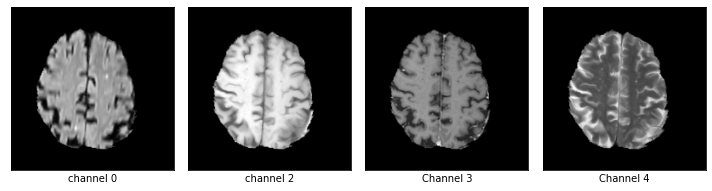

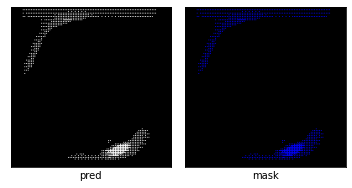

dice_loss : 0.0



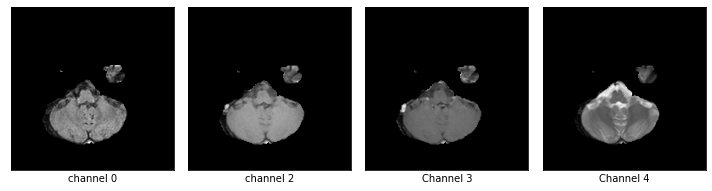

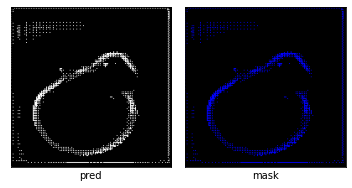

03/06 01:51:42 PM epoch 5 lr 2.390474e-02
03/06 01:51:42 PM genotype = Genotype(normal=[('skip_connect', 0), ('sep_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('dil_conv_3x3', 3), ('skip_connect', 0), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('skip_connect', 0), ('dil_conv_3x3', 2), ('dil_conv_5x5', 1), ('sep_conv_5x5', 2), ('sep_conv_5x5', 3), ('max_pool_3x3', 3), ('max_pool_3x3', 4)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.4479, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<41:58,  1.07s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.3565, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<41:06,  1.05s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<40:44,  1.04s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<40:23,  1.03s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1225, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<39:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1564, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<40:00,  1.02s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<39:34,  1.01s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1352, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<39:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<39:41,  1.02s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.9548, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<39:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1947, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<39:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<39:40,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1312, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<39:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<39:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<39:19,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<38:55,  1.00it/s, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<38:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1092, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<39:00,  1.00s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:19<39:00,  1.00s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1772, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:20<39:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1388, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:21<38:56,  1.00s/it, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:22<39:05,  1.01s/it, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.6038, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:23<38:55,  1.00s/it, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:24<38:44,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.1764, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:25<38:37,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:26<38:41,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.1781, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:27<38:49,  1.00s/it, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:28<38:47,  1.00s/it, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.1608, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:29<38:37,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:30<38:44,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:31<38:37,  1.00it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:32<38:26,  1.01it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:33<38:40,  1.00it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:34<38:26,  1.01it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:35<38:19,  1.01it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:36<38:12,  1.01it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:37<38:10,  1.01it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:38<38:19,  1.01it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.9812, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:39<37:56,  1.02it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:40<38:06,  1.01it/s, Acc=0.987, IoU=0.826, Loss=0.0969]

tensor(0.1995, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:41<38:10,  1.01it/s, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:42<38:23,  1.00it/s, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:43<38:24,  1.00it/s, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:44<38:22,  1.00it/s, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:45<38:24,  1.00it/s, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:46<38:41,  1.01s/it, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:47<38:35,  1.00s/it, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:48<38:40,  1.01s/it, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:49<38:33,  1.00s/it, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:50<38:32,  1.00s/it, Acc=0.995, IoU=0.708, Loss=0.171]

tensor(0.8012, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:51<38:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000556]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:52<38:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000556]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:53<38:41,  1.01s/it, Acc=1, IoU=0, Loss=0.000556]

tensor(0.4212, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:54<38:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000556]

tensor(0.1349, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:55<38:19,  1.00it/s, Acc=1, IoU=0, Loss=0.000556]

tensor(0.1335, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:56<38:18,  1.00it/s, Acc=1, IoU=0, Loss=0.000556]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:57<38:16,  1.00it/s, Acc=1, IoU=0, Loss=0.000556]

tensor(0.1167, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:58<38:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000556]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [00:59<38:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000556]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:00<38:21,  1.00s/it, Acc=1, IoU=0, Loss=0.000556]

tensor(0.1491, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:01<38:22,  1.00s/it, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:02<38:15,  1.00s/it, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.0483, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:03<38:07,  1.00it/s, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.7721, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:04<38:11,  1.00s/it, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:05<38:09,  1.00it/s, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:06<38:02,  1.00it/s, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:07<38:08,  1.00s/it, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:08<38:06,  1.00it/s, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:09<38:14,  1.00s/it, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:10<38:09,  1.00s/it, Acc=0.994, IoU=0.869, Loss=0.0711]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:11<38:05,  1.00s/it, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:12<38:05,  1.00s/it, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:13<37:57,  1.00it/s, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:14<37:44,  1.01it/s, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:15<37:35,  1.01it/s, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:16<37:21,  1.02it/s, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:17<37:26,  1.01it/s, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:18<37:52,  1.00it/s, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:19<38:08,  1.01s/it, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.2117, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:20<38:14,  1.01s/it, Acc=0.995, IoU=0.695, Loss=0.178]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:21<38:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:22<38:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:23<38:12,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.8095, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:24<38:19,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.2721, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:25<38:20,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.1225, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:26<38:18,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.9476, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:27<37:58,  1.00s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:28<37:59,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.3083, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:29<38:00,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:30<37:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:31<37:56,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.8964, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:32<38:11,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:33<38:05,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.0745, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:34<37:52,  1.00s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:35<37:56,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.3257, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:36<38:02,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:37<37:51,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:38<37:47,  1.00s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:39<37:42,  1.00s/it, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.1309, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:40<37:24,  1.00it/s, Acc=0.995, IoU=0.887, Loss=0.0609]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:41<37:28,  1.00it/s, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.1414, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:42<37:43,  1.00s/it, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.4434, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:43<37:49,  1.01s/it, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:44<37:49,  1.01s/it, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.0449, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:45<37:19,  1.00it/s, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:46<37:12,  1.01it/s, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:47<37:19,  1.00it/s, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.1874, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:48<37:32,  1.00s/it, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:49<37:29,  1.00s/it, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.1457, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:50<37:10,  1.01it/s, Acc=0.993, IoU=0.779, Loss=0.127]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:51<37:17,  1.00it/s, Acc=1, IoU=0, Loss=0.000666]

tensor(0.4546, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:52<37:24,  1.00s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.3358, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:53<37:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.1791, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:54<37:29,  1.00s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:55<37:16,  1.00it/s, Acc=1, IoU=0, Loss=0.000666]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:56<37:14,  1.00it/s, Acc=1, IoU=0, Loss=0.000666]

tensor(0.5860, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:57<37:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000666]

tensor(0.6049, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [01:58<37:17,  1.00s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [01:59<37:09,  1.00it/s, Acc=1, IoU=0, Loss=0.000666]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:00<37:03,  1.01it/s, Acc=1, IoU=0, Loss=0.000666]

tensor(0.2947, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:01<36:59,  1.01it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:02<36:58,  1.01it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:03<36:59,  1.01it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:04<37:09,  1.00it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:05<37:01,  1.00it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:06<36:46,  1.01it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.5220, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:07<36:47,  1.01it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:08<36:36,  1.01it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:09<36:44,  1.01it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:10<36:47,  1.01it/s, Acc=0.994, IoU=0.909, Loss=0.0487]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:11<36:45,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:12<36:48,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:13<36:42,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:14<36:49,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.2705, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:15<37:05,  1.00s/it, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:16<37:26,  1.01s/it, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:17<37:12,  1.01s/it, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.6920, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:18<37:16,  1.01s/it, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:19<37:12,  1.01s/it, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:20<37:07,  1.01s/it, Acc=0.995, IoU=0.917, Loss=0.0446]

tensor(0.5882, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:21<36:58,  1.00s/it, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:22<37:12,  1.01s/it, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.0093, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:23<37:07,  1.01s/it, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:24<36:51,  1.00s/it, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.0964, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:25<36:36,  1.01it/s, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.2137, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:26<36:49,  1.00s/it, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:27<36:44,  1.00it/s, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:28<36:29,  1.01it/s, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:29<36:29,  1.01it/s, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:30<36:19,  1.01it/s, Acc=0.985, IoU=0.694, Loss=0.18]

tensor(0.1382, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:31<36:35,  1.00it/s, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.4645, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:32<36:36,  1.00it/s, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:33<36:41,  1.00it/s, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:34<36:51,  1.00s/it, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:35<36:42,  1.00s/it, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:36<36:35,  1.00it/s, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.4562, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:37<37:49,  1.03s/it, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:38<37:04,  1.01s/it, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:39<36:55,  1.01s/it, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:40<36:41,  1.00s/it, Acc=0.995, IoU=0.876, Loss=0.0654]

tensor(0.1783, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:41<36:40,  1.00s/it, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.1373, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:42<36:45,  1.01s/it, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.1465, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:43<36:36,  1.00s/it, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:44<36:51,  1.01s/it, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.1479, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:45<36:45,  1.01s/it, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:46<36:43,  1.01s/it, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:47<36:27,  1.00it/s, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:48<36:18,  1.00it/s, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.1510, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:49<36:15,  1.00it/s, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:50<36:12,  1.01it/s, Acc=0.993, IoU=0.912, Loss=0.0474]

tensor(0.3403, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:51<36:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00112]

tensor(0.1409, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:52<36:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00112]

tensor(0.0541, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:53<36:15,  1.00it/s, Acc=1, IoU=0, Loss=0.00112]

tensor(0.1276, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:54<36:17,  1.00it/s, Acc=1, IoU=0, Loss=0.00112]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:55<36:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00112]

tensor(0.4499, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:56<36:17,  1.00it/s, Acc=1, IoU=0, Loss=0.00112]

tensor(0.6976, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:57<36:11,  1.00it/s, Acc=1, IoU=0, Loss=0.00112]

tensor(0.3244, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [02:58<36:18,  1.00s/it, Acc=1, IoU=0, Loss=0.00112]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [02:59<36:17,  1.00s/it, Acc=1, IoU=0, Loss=0.00112]

tensor(0.0333, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:00<36:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00112]

tensor(0.1672, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:01<36:10,  1.00it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.3233, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:02<36:13,  1.00s/it, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:03<35:54,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.1591, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:04<35:51,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.8765, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:05<35:49,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:06<35:38,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.3684, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:07<35:36,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.3985, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:08<35:46,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.5770, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:09<35:51,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:10<35:35,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0436]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:11<35:34,  1.01it/s, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:12<35:49,  1.01it/s, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.1987, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:13<35:31,  1.01it/s, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.5418, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:14<35:27,  1.02it/s, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.1276, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:14<35:25,  1.02it/s, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.1524, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:16<35:47,  1.01it/s, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:17<36:15,  1.01s/it, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.1581, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:18<36:24,  1.01s/it, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.1148, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:19<36:12,  1.01s/it, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:20<36:18,  1.01s/it, Acc=0.973, IoU=0.568, Loss=0.276]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:21<36:14,  1.01s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:22<36:18,  1.01s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:23<36:17,  1.01s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:24<36:24,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.1441, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:25<36:27,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:26<36:22,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:27<36:20,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:28<36:06,  1.01s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:29<36:07,  1.01s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:30<36:10,  1.01s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:31<35:59,  1.01s/it, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.5724, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:32<35:39,  1.00it/s, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:33<35:50,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:34<35:45,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.3348, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:35<35:43,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:36<35:40,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.5027, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:37<35:38,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.7199, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:38<35:31,  1.00it/s, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.0469, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:39<35:25,  1.00it/s, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:40<35:14,  1.01it/s, Acc=0.993, IoU=0.915, Loss=0.0462]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:41<35:10,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:42<35:08,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:43<35:08,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.8570, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:44<35:23,  1.00it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:45<35:06,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.2069, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:46<35:12,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.1512, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:47<35:14,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.5115, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:48<35:03,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.6985, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:49<35:07,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.6903, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:50<34:58,  1.01it/s, Acc=0.992, IoU=0.678, Loss=0.192]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:51<34:51,  1.02it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:52<34:48,  1.02it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.8589, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:52<34:40,  1.02it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1350, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:53<34:38,  1.02it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:54<34:52,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.6021, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:55<35:03,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:56<34:51,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0037, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [03:57<34:50,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.3706, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [03:58<35:00,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [03:59<35:09,  1.00it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:00<35:06,  1.00it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:01<35:08,  1.00it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:02<35:04,  1.00it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:03<34:56,  1.01it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:04<34:54,  1.01it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:05<34:56,  1.01it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:06<34:36,  1.01it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:07<34:24,  1.02it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:08<34:34,  1.02it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:09<34:38,  1.01it/s, Acc=0.996, IoU=0.805, Loss=0.109]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:10<34:30,  1.02it/s, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.0458, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:11<34:58,  1.00it/s, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:12<34:59,  1.00it/s, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.4220, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:13<35:06,  1.00s/it, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.3028, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:14<35:09,  1.00s/it, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:15<35:12,  1.01s/it, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.3823, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:16<35:01,  1.00s/it, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:17<35:11,  1.01s/it, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.3968, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:18<35:04,  1.00s/it, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:19<34:39,  1.01it/s, Acc=0.982, IoU=0.715, Loss=0.166]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:20<34:30,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.0317, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:21<34:50,  1.00it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:22<34:39,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:23<34:39,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:24<34:36,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.1748, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:25<34:25,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:26<34:26,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:27<34:32,  1.01it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.1546, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:28<34:36,  1.00it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.9256, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:29<34:43,  1.00it/s, Acc=0.993, IoU=0.902, Loss=0.0519]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:30<34:31,  1.01it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:31<34:26,  1.01it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:32<34:20,  1.01it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:33<34:09,  1.02it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.5141, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:34<34:07,  1.02it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.3677, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:35<34:06,  1.02it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:36<33:55,  1.02it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.1243, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:37<34:05,  1.02it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.1305, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:38<34:01,  1.02it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.9864, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:39<33:55,  1.02it/s, Acc=0.941, IoU=0, Loss=1]

tensor(0.1488, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:40<34:00,  1.02it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.2686, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:41<34:22,  1.01it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:42<34:37,  1.00s/it, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:43<34:30,  1.00it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:44<34:27,  1.00it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.0865, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:45<34:24,  1.00it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:46<34:00,  1.01it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:47<33:50,  1.02it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:48<34:05,  1.01it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:49<34:08,  1.01it/s, Acc=0.995, IoU=0.896, Loss=0.0552]

tensor(0.5945, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:50<34:09,  1.01it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.1405, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:51<34:01,  1.01it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:52<34:02,  1.01it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:53<33:48,  1.02it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.5483, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:54<33:49,  1.01it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:55<34:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:56<34:11,  1.00it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.4252, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [04:57<34:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [04:58<34:04,  1.01it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [04:59<34:14,  1.00it/s, Acc=1, IoU=0, Loss=0.000854]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:00<33:49,  1.01it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:01<33:58,  1.01it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:02<33:47,  1.01it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:03<33:37,  1.02it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.6914, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:04<33:43,  1.01it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.8561, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:05<33:56,  1.01it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:06<34:00,  1.00it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:07<33:57,  1.00it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:08<33:53,  1.01it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.7528, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:09<33:48,  1.01it/s, Acc=0.996, IoU=0.904, Loss=0.0519]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:10<33:55,  1.00it/s, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:11<34:06,  1.00s/it, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:12<34:11,  1.00s/it, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.3087, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:13<34:15,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:14<34:09,  1.00s/it, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:15<33:58,  1.00it/s, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:16<34:01,  1.00s/it, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:17<34:10,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:18<34:07,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:19<34:09,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0595]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:20<33:56,  1.00s/it, Acc=1, IoU=0, Loss=0.00192]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:21<33:31,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.4755, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:22<33:24,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0390, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:23<33:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:24<33:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:25<33:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:26<33:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.5586, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:27<33:26,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.1484, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:28<33:31,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.8170, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:29<33:26,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0372, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:30<33:14,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:31<33:28,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:32<33:13,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:33<33:05,  1.02it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.7418, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:34<33:14,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:35<33:27,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.1490, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:36<33:36,  1.00it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:37<33:49,  1.01s/it, Acc=0.929, IoU=0, Loss=1]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:38<33:45,  1.00s/it, Acc=0.929, IoU=0, Loss=1]

tensor(0.5588, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:39<33:40,  1.00s/it, Acc=0.929, IoU=0, Loss=1]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:40<33:45,  1.01s/it, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:41<33:53,  1.01s/it, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:42<33:53,  1.01s/it, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:43<33:38,  1.00s/it, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.6119, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:44<33:39,  1.00s/it, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:45<33:48,  1.01s/it, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:46<33:30,  1.00s/it, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.2855, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:47<33:15,  1.01it/s, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:48<33:16,  1.00it/s, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:49<33:15,  1.00it/s, Acc=0.986, IoU=0.882, Loss=0.0631]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:50<33:17,  1.00it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.1519, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:51<33:21,  1.00it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:52<33:28,  1.00s/it, Acc=1, IoU=0, Loss=0.00177]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:53<33:19,  1.00it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:54<32:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:55<33:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.8521, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [05:56<32:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [05:57<32:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [05:58<32:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.1349, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [05:59<32:52,  1.01it/s, Acc=1, IoU=0, Loss=0.00177]

tensor(0.5160, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:00<32:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:01<33:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.2781, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:02<33:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:03<32:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:04<32:32,  1.02it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:05<32:32,  1.02it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:06<32:41,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.1206, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:07<32:45,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:08<32:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:09<32:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.6846, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:10<32:42,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:11<32:50,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.1406, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:12<32:48,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.4415, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:13<33:04,  1.00s/it, Acc=0.935, IoU=0, Loss=1]

tensor(0.6383, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:14<32:48,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:15<32:55,  1.00it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:16<33:01,  1.00s/it, Acc=0.935, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:17<32:50,  1.00it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:18<32:37,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:19<32:39,  1.01it/s, Acc=0.935, IoU=0, Loss=1]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:20<32:40,  1.01it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.2569, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:21<32:47,  1.00it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:22<32:44,  1.00it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.6009, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:23<32:56,  1.00s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:24<32:35,  1.01it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0052, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:25<32:32,  1.01it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.1274, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:26<32:31,  1.01it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:27<32:28,  1.01it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:28<32:26,  1.01it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.9308, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:29<32:31,  1.01it/s, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:30<32:44,  1.00s/it, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:31<32:55,  1.01s/it, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:32<32:39,  1.00it/s, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.1553, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:33<32:19,  1.01it/s, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.7008, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:34<32:21,  1.01it/s, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.3972, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:35<32:14,  1.01it/s, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:36<32:21,  1.01it/s, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:37<32:31,  1.00it/s, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.0506, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:38<32:41,  1.00s/it, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.4203, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:39<32:37,  1.00s/it, Acc=0.992, IoU=0.796, Loss=0.117]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:40<32:22,  1.01it/s, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.9898, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:41<32:26,  1.00it/s, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.1787, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:42<32:31,  1.00it/s, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:42<32:07,  1.01it/s, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:43<32:07,  1.01it/s, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:44<32:13,  1.01it/s, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.2143, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:46<32:30,  1.00s/it, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.1606, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:47<32:40,  1.01s/it, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.1869, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:48<32:38,  1.01s/it, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.7766, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:49<32:38,  1.01s/it, Acc=0.989, IoU=0.236, Loss=0.618]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:50<32:33,  1.00s/it, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.2320, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:51<32:44,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.3491, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:52<32:39,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.1796, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:53<32:36,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.3052, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:54<32:30,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:55<32:14,  1.00it/s, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [06:56<32:19,  1.00s/it, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.4409, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [06:57<32:27,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.3025, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [06:58<32:20,  1.00s/it, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.9108, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [06:59<32:09,  1.00it/s, Acc=0.991, IoU=0.844, Loss=0.0841]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:00<32:24,  1.01s/it, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:01<32:29,  1.01s/it, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:02<32:23,  1.01s/it, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:03<32:12,  1.00s/it, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.6321, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:04<32:02,  1.00it/s, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.1453, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:05<31:51,  1.01it/s, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:06<32:02,  1.00it/s, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.2133, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:07<32:17,  1.01s/it, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:08<32:19,  1.01s/it, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:09<32:22,  1.01s/it, Acc=0.992, IoU=0.836, Loss=0.0898]

tensor(0.1707, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:10<32:03,  1.00it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.6460, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:11<31:53,  1.00it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:12<31:42,  1.01it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.9855, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:13<31:36,  1.01it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:14<31:32,  1.01it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.1105, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:15<31:41,  1.01it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:15<31:29,  1.01it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:16<31:36,  1.01it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:18<31:51,  1.00it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.2808, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:19<31:53,  1.00it/s, Acc=0.996, IoU=0.878, Loss=0.0655]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:20<32:14,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:21<32:17,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.1600, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:22<32:19,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:23<31:54,  1.00s/it, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:24<31:53,  1.00s/it, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:25<31:46,  1.00it/s, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.9286, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:26<31:33,  1.01it/s, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:27<31:30,  1.01it/s, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.7518, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:28<31:44,  1.00it/s, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:29<31:57,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.105]

tensor(0.6472, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:30<32:02,  1.01s/it, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:31<31:58,  1.01s/it, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:32<31:55,  1.01s/it, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:33<31:42,  1.00s/it, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:34<31:29,  1.01it/s, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.3283, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:35<31:22,  1.01it/s, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.4447, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:36<31:12,  1.01it/s, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.4067, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:37<31:21,  1.01it/s, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:38<31:40,  1.00s/it, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:39<31:45,  1.01s/it, Acc=0.992, IoU=0.813, Loss=0.103]

tensor(0.1919, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:40<31:43,  1.01s/it, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:41<31:34,  1.00s/it, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:42<31:21,  1.01it/s, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.3126, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:43<31:31,  1.00s/it, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:44<31:26,  1.00it/s, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.5948, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:45<31:21,  1.00it/s, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:46<31:14,  1.01it/s, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.4714, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:47<31:14,  1.01it/s, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:48<31:24,  1.00it/s, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:49<31:17,  1.00it/s, Acc=0.963, IoU=0.644, Loss=0.217]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:50<31:20,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:51<31:28,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:52<31:23,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.8391, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:53<31:30,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:54<31:19,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2927, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [07:55<31:22,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [07:56<31:17,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1181, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [07:57<31:14,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [07:58<31:27,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [07:59<31:19,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:00<31:22,  1.00s/it, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:01<31:15,  1.00s/it, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.5809, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:02<31:17,  1.00s/it, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.5489, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:03<30:57,  1.01it/s, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.6186, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:04<30:52,  1.01it/s, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:05<30:59,  1.00it/s, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:06<31:06,  1.00it/s, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:07<30:55,  1.01it/s, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:08<31:10,  1.00s/it, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:09<31:15,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0926]

tensor(0.2262, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:10<31:02,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:10<30:49,  1.01it/s, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:12<30:55,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:13<30:55,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.6526, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:13<30:49,  1.01it/s, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.8058, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:15<30:58,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:16<31:05,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:17<31:17,  1.01s/it, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.8618, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:18<31:19,  1.01s/it, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:19<31:23,  1.02s/it, Acc=0.988, IoU=0.87, Loss=0.0692]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:20<31:14,  1.01s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:21<31:19,  1.01s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:22<31:05,  1.01s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.2868, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:23<31:20,  1.02s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:24<31:21,  1.02s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.6020, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:25<31:12,  1.01s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:26<31:09,  1.01s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:27<31:15,  1.02s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:28<31:29,  1.02s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.2379, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:29<31:24,  1.02s/it, Acc=0.988, IoU=0.355, Loss=0.474]

tensor(0.1839, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:30<31:10,  1.01s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:31<31:23,  1.02s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.4638, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:32<31:31,  1.03s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.7273, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:33<31:28,  1.03s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:34<31:23,  1.02s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:35<31:13,  1.02s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.7899, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:36<31:21,  1.02s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.1522, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:37<31:31,  1.03s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.5577, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:38<31:12,  1.02s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:39<30:49,  1.01s/it, Acc=0.994, IoU=0.861, Loss=0.0731]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:40<30:29,  1.00it/s, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:41<30:21,  1.01it/s, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:42<30:18,  1.01it/s, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:43<30:35,  1.00s/it, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:44<30:27,  1.00it/s, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.0959, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:45<30:26,  1.00it/s, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:46<30:29,  1.00s/it, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.6353, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:47<30:18,  1.00it/s, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.4545, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:48<30:26,  1.00s/it, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:49<30:22,  1.00it/s, Acc=0.997, IoU=0.538, Loss=0.301]

tensor(0.7169, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:50<30:19,  1.00it/s, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:51<30:20,  1.00it/s, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.1278, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:52<30:15,  1.00it/s, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:53<30:24,  1.00s/it, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.2345, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:54<30:28,  1.00s/it, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.7850, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [08:55<30:39,  1.01s/it, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.1808, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [08:56<30:25,  1.00s/it, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [08:57<30:28,  1.01s/it, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [08:58<30:27,  1.01s/it, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.9213, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [08:59<30:34,  1.01s/it, Acc=0.997, IoU=0.889, Loss=0.0602]

tensor(0.7411, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:00<30:32,  1.01s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.0039, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:01<30:34,  1.01s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.6769, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:02<30:28,  1.01s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.9887, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:03<30:27,  1.01s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.0367, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:04<30:18,  1.00s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.0360, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:05<30:22,  1.01s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:06<30:36,  1.02s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:07<30:45,  1.02s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:08<30:50,  1.02s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:09<30:37,  1.02s/it, Acc=0.997, IoU=0.83, Loss=0.0931]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:10<30:28,  1.01s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:11<30:40,  1.02s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.3244, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:12<30:46,  1.02s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.1676, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:13<30:33,  1.02s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.7620, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:14<30:22,  1.01s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:15<30:21,  1.01s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.9813, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:16<30:33,  1.02s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.1488, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:17<30:23,  1.01s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.2687, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:18<30:41,  1.03s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.5578, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:19<30:45,  1.03s/it, Acc=0.999, IoU=0, Loss=0.963]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:20<30:39,  1.03s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:21<30:27,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1479, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:22<30:23,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:23<30:06,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:24<30:09,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:25<30:11,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:26<30:17,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.3625, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:27<30:13,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9216, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:28<30:13,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:29<30:25,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:30<30:01,  1.01s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:31<30:11,  1.02s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.1246, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:32<30:10,  1.02s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:34<30:10,  1.02s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:35<30:02,  1.01s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.3067, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:36<30:11,  1.02s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:37<29:58,  1.01s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:38<30:01,  1.01s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.3326, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:39<29:58,  1.01s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.1539, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:40<30:00,  1.01s/it, Acc=0.999, IoU=0, Loss=0.982]

tensor(0.2930, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:41<29:41,  1.00s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:42<29:44,  1.01s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:43<29:29,  1.00it/s, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.2404, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:44<29:34,  1.00s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.3890, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:45<29:49,  1.01s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.7502, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:46<29:57,  1.02s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:47<29:51,  1.01s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:48<29:49,  1.01s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:49<29:33,  1.00s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.6794, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:50<29:36,  1.01s/it, Acc=0.997, IoU=0.935, Loss=0.0337]

tensor(0.9517, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:51<29:31,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.2510, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:52<29:28,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1163, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:53<29:27,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.7797, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:54<29:34,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.2122, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [09:55<29:45,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9704, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [09:56<29:45,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1835, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [09:57<29:41,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [09:58<29:28,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [09:59<29:22,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:00<29:21,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:01<29:15,  1.00s/it, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:02<29:17,  1.00s/it, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.1267, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:03<29:15,  1.00s/it, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:04<29:08,  1.00it/s, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:05<29:05,  1.00it/s, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.9781, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:06<28:57,  1.01it/s, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:07<29:05,  1.00it/s, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.0975, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:08<29:02,  1.00it/s, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:09<29:07,  1.00s/it, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.1079, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:10<29:02,  1.00it/s, Acc=0.994, IoU=0.875, Loss=0.0666]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:11<29:05,  1.00s/it, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.9230, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:12<29:10,  1.00s/it, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.9716, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:13<29:10,  1.00s/it, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:14<29:04,  1.00s/it, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:15<29:08,  1.01s/it, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.9150, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:16<28:48,  1.01it/s, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.0423, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:17<28:44,  1.01it/s, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.9834, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:18<28:54,  1.00it/s, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.0106, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:19<28:59,  1.00s/it, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:20<28:56,  1.00s/it, Acc=0.996, IoU=0.747, Loss=0.143]

tensor(0.5726, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:21<28:43,  1.01it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:22<28:45,  1.00it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:23<28:40,  1.01it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.7868, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:24<28:35,  1.01it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.0095, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:25<28:28,  1.01it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:26<28:25,  1.01it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:27<28:24,  1.01it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:28<28:52,  1.00s/it, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.1538, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:29<28:34,  1.01it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.6724, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:30<28:28,  1.01it/s, Acc=0.985, IoU=0.861, Loss=0.0748]

tensor(0.8618, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:31<28:27,  1.01it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:32<28:29,  1.01it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:33<28:24,  1.01it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:34<28:13,  1.02it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.9166, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:35<28:27,  1.01it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.1406, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:36<28:09,  1.02it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.5150, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:37<28:22,  1.01it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:38<28:27,  1.01it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:39<28:37,  1.00s/it, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:40<28:30,  1.00it/s, Acc=0.978, IoU=0.731, Loss=0.155]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:41<28:24,  1.01it/s, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.4286, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:42<28:22,  1.01it/s, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.5583, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:43<28:28,  1.00it/s, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.6174, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:43<28:17,  1.01it/s, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:44<28:02,  1.02it/s, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:46<28:46,  1.01s/it, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:47<28:54,  1.02s/it, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.9804, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:48<28:44,  1.01s/it, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.9899, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:49<28:35,  1.01s/it, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.2369, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:50<28:24,  1.00it/s, Acc=0.995, IoU=0.945, Loss=0.0291]

tensor(0.8263, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:51<28:30,  1.00s/it, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:52<28:36,  1.01s/it, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.1704, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:53<28:26,  1.00s/it, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:54<28:21,  1.00s/it, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.0328, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [10:55<28:16,  1.00it/s, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [10:56<28:03,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [10:57<27:56,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.0123, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [10:58<28:02,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.8149, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [10:58<28:01,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.2047, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:00<28:11,  1.00it/s, Acc=0.996, IoU=0.882, Loss=0.0624]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:01<28:50,  1.02s/it, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:02<28:49,  1.02s/it, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:03<28:34,  1.01s/it, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:04<28:29,  1.01s/it, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.5903, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:05<28:14,  1.00s/it, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.1611, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:06<27:56,  1.01it/s, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.1167, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:07<27:57,  1.01it/s, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.5458, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:08<27:57,  1.01it/s, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.0361, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:09<28:06,  1.00s/it, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:10<28:07,  1.00s/it, Acc=0.994, IoU=0.915, Loss=0.0451]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:11<28:03,  1.00it/s, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.3434, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:12<28:03,  1.00s/it, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.2414, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:13<27:45,  1.01it/s, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.2271, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:14<27:49,  1.01it/s, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:15<27:44,  1.01it/s, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:16<27:54,  1.00it/s, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.3576, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:17<27:51,  1.00it/s, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.5572, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:18<27:56,  1.00it/s, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:19<28:03,  1.00s/it, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:20<27:59,  1.00s/it, Acc=0.991, IoU=0.735, Loss=0.156]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:21<27:49,  1.00it/s, Acc=1, IoU=0, Loss=0.00446]

tensor(0.2109, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:22<27:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00446]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:23<27:55,  1.00s/it, Acc=1, IoU=0, Loss=0.00446]

tensor(0.8434, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:24<27:42,  1.01it/s, Acc=1, IoU=0, Loss=0.00446]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:25<27:38,  1.01it/s, Acc=1, IoU=0, Loss=0.00446]

tensor(0.2584, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:25<27:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00446]

tensor(0.4876, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:26<27:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00446]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:28<27:48,  1.00s/it, Acc=1, IoU=0, Loss=0.00446]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:29<27:48,  1.00s/it, Acc=1, IoU=0, Loss=0.00446]

tensor(0.4885, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:29<27:37,  1.00it/s, Acc=1, IoU=0, Loss=0.00446]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:31<27:40,  1.00it/s, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.5174, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:32<27:53,  1.01s/it, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.0099, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:33<27:53,  1.01s/it, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.1951, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:33<27:27,  1.01it/s, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:34<27:31,  1.01it/s, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:36<27:46,  1.00s/it, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.9852, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:37<27:49,  1.01s/it, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:38<27:52,  1.01s/it, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:39<27:37,  1.00s/it, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.7193, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:40<27:33,  1.00it/s, Acc=0.996, IoU=0.706, Loss=0.171]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:41<27:32,  1.00it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.0402, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:42<27:38,  1.00s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:43<27:44,  1.01s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.3036, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:44<27:45,  1.01s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:45<27:58,  1.02s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:46<27:46,  1.01s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.5961, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:47<27:40,  1.01s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:48<27:29,  1.00s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.6004, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:49<27:18,  1.00it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.0945, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:50<27:19,  1.00it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:51<27:31,  1.00s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.3742, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:52<27:45,  1.01s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:53<27:40,  1.01s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.2526, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:54<27:32,  1.01s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [11:55<27:22,  1.00s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [11:56<27:33,  1.01s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.9786, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [11:57<27:38,  1.01s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.6155, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [11:58<27:31,  1.01s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [11:59<27:23,  1.00s/it, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:00<27:12,  1.00it/s, Acc=0.99, IoU=0.803, Loss=0.108]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:01<27:14,  1.00s/it, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:02<27:15,  1.00s/it, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:03<27:05,  1.00it/s, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.9821, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:04<27:04,  1.00it/s, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.6023, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:05<26:51,  1.01it/s, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.1097, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:06<27:02,  1.00it/s, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.6302, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:07<27:10,  1.00s/it, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.2717, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:08<27:10,  1.00s/it, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:09<27:01,  1.00it/s, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:10<27:07,  1.00s/it, Acc=0.996, IoU=0.219, Loss=0.632]

tensor(0.6880, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:11<26:57,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:12<26:48,  1.01it/s, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.1435, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:13<26:56,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.1289, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:14<27:03,  1.00s/it, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:15<27:12,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.3273, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:16<27:10,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.3344, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:17<27:13,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:18<26:59,  1.00s/it, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.5791, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:19<26:57,  1.00s/it, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:20<26:59,  1.00s/it, Acc=0.996, IoU=0.942, Loss=0.0306]

tensor(0.0421, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:21<26:49,  1.00it/s, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:22<26:51,  1.00it/s, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.7390, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:23<27:00,  1.01s/it, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:24<26:59,  1.01s/it, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.4560, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:25<27:03,  1.01s/it, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.1022, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:26<26:53,  1.00s/it, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.8312, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:27<26:46,  1.00it/s, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:28<26:30,  1.01it/s, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:29<26:27,  1.01it/s, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.6793, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:30<26:27,  1.01it/s, Acc=0.988, IoU=0.705, Loss=0.172]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:31<26:29,  1.01it/s, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:32<26:44,  1.00s/it, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.3280, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:33<26:47,  1.00s/it, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.2798, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:34<26:50,  1.01s/it, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.8424, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:35<26:41,  1.00s/it, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:36<26:26,  1.01it/s, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.2307, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:37<26:19,  1.01it/s, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.7807, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:38<26:26,  1.01it/s, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.9687, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:39<26:28,  1.00it/s, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.5242, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:40<26:38,  1.00s/it, Acc=0.984, IoU=0.0664, Loss=0.872]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:41<26:23,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:42<26:15,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.8501, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:43<26:18,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0434, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:44<26:32,  1.00s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.6669, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:45<26:42,  1.01s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:46<26:43,  1.01s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:47<26:37,  1.01s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:48<26:46,  1.01s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.5713, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:49<26:58,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1763, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:50<27:03,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:51<26:52,  1.02s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:52<27:08,  1.03s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:53<27:14,  1.03s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [12:54<27:27,  1.04s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.7834, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [12:55<27:16,  1.04s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.0059, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [12:56<27:07,  1.03s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [12:57<27:03,  1.03s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [12:58<27:09,  1.03s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [12:59<27:07,  1.03s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:00<27:14,  1.04s/it, Acc=0.998, IoU=0.853, Loss=0.0797]

tensor(0.3977, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:01<27:12,  1.04s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.3051, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:02<27:03,  1.03s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:03<26:42,  1.02s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:04<26:37,  1.02s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.2159, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:05<26:41,  1.02s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:06<26:19,  1.01s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:07<26:21,  1.01s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:08<26:25,  1.01s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.5636, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:09<26:33,  1.02s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:10<26:23,  1.01s/it, Acc=0.987, IoU=0.863, Loss=0.0733]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:11<26:20,  1.01s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:12<26:28,  1.02s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:13<26:33,  1.02s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.4702, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:14<26:31,  1.02s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:15<26:38,  1.02s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:16<26:46,  1.03s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:17<26:39,  1.03s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.5343, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:18<26:38,  1.03s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:19<26:39,  1.03s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:20<26:55,  1.04s/it, Acc=0.995, IoU=0.756, Loss=0.137]

tensor(0.8217, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:22<26:50,  1.04s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:23<26:52,  1.04s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:24<26:31,  1.03s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:25<26:30,  1.03s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:26<26:18,  1.02s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:27<26:13,  1.02s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:28<26:28,  1.03s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.4758, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:29<26:22,  1.02s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:30<26:10,  1.02s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.4565, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:31<26:15,  1.02s/it, Acc=0.999, IoU=0.952, Loss=0.0251]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:32<26:24,  1.03s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.3828, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:33<26:32,  1.03s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:34<26:44,  1.04s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:35<26:30,  1.03s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:36<26:43,  1.04s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:37<26:32,  1.03s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:38<26:53,  1.05s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:39<26:51,  1.05s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.1083, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:40<26:58,  1.05s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:41<26:47,  1.05s/it, Acc=0.991, IoU=0.753, Loss=0.143]

tensor(0.1106, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:42<26:54,  1.05s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:43<26:54,  1.05s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.5739, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:44<27:05,  1.06s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.0061, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:45<26:58,  1.06s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:46<26:36,  1.04s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:47<26:38,  1.05s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.1232, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:48<26:28,  1.04s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.0054, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:50<26:30,  1.04s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.2767, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:51<26:22,  1.04s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.6358, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:52<26:17,  1.03s/it, Acc=0.99, IoU=0.834, Loss=0.0915]

tensor(0.7111, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:53<26:16,  1.03s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.0222, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:54<26:09,  1.03s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.3459, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [13:55<26:07,  1.03s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [13:56<26:01,  1.03s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.2394, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [13:57<25:53,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.1494, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [13:58<25:43,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.8543, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [13:59<25:54,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.1833, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:00<26:01,  1.03s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.1817, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:01<25:56,  1.03s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.8614, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:02<25:44,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0865]

tensor(0.0037, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:03<25:38,  1.02s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:04<25:37,  1.02s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:05<25:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.2952, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:06<25:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.2406, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:07<25:31,  1.01s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.6711, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:08<25:32,  1.02s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:09<25:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:10<25:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:11<25:16,  1.01s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:12<25:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00731]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:13<25:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:14<25:16,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:15<25:06,  1.00s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:16<25:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.1387, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:17<25:12,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:18<25:01,  1.00s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.9405, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:19<24:58,  1.00s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:20<25:20,  1.02s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:21<25:24,  1.02s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:22<25:22,  1.02s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:23<25:23,  1.02s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.1595, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:24<25:23,  1.02s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.1572, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:25<25:26,  1.02s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.1083, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:26<25:14,  1.02s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.1580, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:27<25:04,  1.01s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.1031, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:28<24:54,  1.00s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.2462, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:29<24:54,  1.00s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:30<24:58,  1.01s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:31<25:00,  1.01s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.6743, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:32<25:05,  1.01s/it, Acc=0.983, IoU=0.78, Loss=0.124]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:33<24:44,  1.00s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:34<24:57,  1.01s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:35<24:48,  1.00s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:36<24:47,  1.00s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.5210, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:37<24:46,  1.00s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.8849, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:38<24:46,  1.01s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:39<24:39,  1.00s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:40<24:24,  1.01it/s, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:41<24:44,  1.01s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:42<24:53,  1.01s/it, Acc=0.996, IoU=0.938, Loss=0.0339]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:43<24:47,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.4128, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:44<24:51,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:45<24:49,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:46<24:46,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.3489, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:47<24:49,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:48<24:41,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.1546, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:49<24:33,  1.00s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:50<24:44,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:51<24:39,  1.01s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:52<24:52,  1.02s/it, Acc=0.995, IoU=0.933, Loss=0.0359]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:53<24:42,  1.01s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:54<24:45,  1.02s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.1318, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [14:55<24:40,  1.01s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.1331, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [14:56<24:41,  1.01s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [14:57<24:31,  1.01s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.1681, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [14:58<24:40,  1.01s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.1815, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [14:59<24:38,  1.01s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:00<24:42,  1.02s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:01<24:38,  1.02s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:02<24:45,  1.02s/it, Acc=0.993, IoU=0.922, Loss=0.0411]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:04<25:01,  1.03s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.2150, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:05<25:04,  1.04s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.9610, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:06<25:09,  1.04s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.9761, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:07<24:56,  1.03s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.7051, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:08<24:45,  1.02s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.5430, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:09<24:41,  1.02s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.1674, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:10<24:31,  1.02s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:11<24:25,  1.01s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.2582, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:12<24:18,  1.01s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.3301, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:13<24:18,  1.01s/it, Acc=0.982, IoU=0.739, Loss=0.151]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:14<24:18,  1.01s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:15<24:16,  1.01s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.3944, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:16<24:09,  1.01s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:17<24:03,  1.00s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:18<24:11,  1.01s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:19<24:09,  1.01s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:20<24:06,  1.01s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:21<24:06,  1.01s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:22<24:03,  1.01s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.5129, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:23<24:00,  1.00s/it, Acc=0.996, IoU=0.812, Loss=0.103]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:24<23:59,  1.00s/it, Acc=1, IoU=0, Loss=0.00058]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:25<23:57,  1.00s/it, Acc=1, IoU=0, Loss=0.00058]

tensor(0.2096, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:26<23:56,  1.00s/it, Acc=1, IoU=0, Loss=0.00058]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:27<23:49,  1.00it/s, Acc=1, IoU=0, Loss=0.00058]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:28<23:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00058]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:29<23:40,  1.01it/s, Acc=1, IoU=0, Loss=0.00058]

tensor(0.9725, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:30<23:43,  1.00it/s, Acc=1, IoU=0, Loss=0.00058]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:31<23:51,  1.00s/it, Acc=1, IoU=0, Loss=0.00058]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:32<23:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00058]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:33<23:50,  1.00s/it, Acc=1, IoU=0, Loss=0.00058]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:34<23:48,  1.00s/it, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.1584, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:35<23:42,  1.00it/s, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:36<23:36,  1.00it/s, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:37<23:34,  1.00it/s, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.2113, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:38<23:30,  1.01it/s, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.2065, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:39<23:29,  1.01it/s, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:40<23:35,  1.00it/s, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:41<23:37,  1.00s/it, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:42<23:22,  1.01it/s, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.1310, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:43<23:27,  1.00it/s, Acc=0.996, IoU=0.895, Loss=0.0563]

tensor(0.0074, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:44<23:26,  1.01it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:45<23:35,  1.00s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.1763, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:46<23:34,  1.00s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.3010, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:47<23:30,  1.00it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:48<23:26,  1.00it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:49<23:21,  1.01it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:50<23:36,  1.01s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:51<23:28,  1.00s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:52<23:22,  1.00it/s, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:53<23:28,  1.00s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0328, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:54<23:29,  1.00s/it, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:55<23:27,  1.00s/it, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [15:56<23:22,  1.00s/it, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [15:57<23:19,  1.00it/s, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [15:58<23:13,  1.00it/s, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.8817, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [15:59<23:18,  1.00it/s, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.1686, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [16:00<23:19,  1.00s/it, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:01<23:20,  1.00s/it, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.2206, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:02<23:24,  1.01s/it, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:03<23:28,  1.01s/it, Acc=0.991, IoU=0.668, Loss=0.198]

tensor(0.3539, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:04<23:19,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:05<23:23,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:06<23:36,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:07<23:32,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.5312, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:08<23:34,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1098, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:09<23:13,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.2041, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:10<22:57,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:11<22:52,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.6521, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:12<23:00,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1350, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:13<23:03,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:14<22:57,  1.00it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:15<22:59,  1.00it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:16<23:02,  1.00s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0541, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:17<22:50,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:18<23:06,  1.00s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:19<23:23,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:20<23:20,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:21<23:31,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:22<23:21,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:23<23:19,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:24<23:17,  1.02s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:25<23:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.9641, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:26<23:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:27<22:51,  1.00s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.1620, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:28<22:45,  1.00it/s, Acc=1, IoU=0, Loss=0.00088]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:29<22:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:30<22:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.3146, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:31<22:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.2087, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:32<22:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:33<22:49,  1.00s/it, Acc=1, IoU=0, Loss=0.00088]

tensor(0.1298, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:34<22:46,  1.00s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:35<22:48,  1.00s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.2669, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:36<22:48,  1.00s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.5535, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:37<22:53,  1.01s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:38<22:45,  1.00s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:39<22:41,  1.00s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:40<22:40,  1.00s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:41<22:46,  1.01s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:42<22:45,  1.01s/it, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:43<22:29,  1.00it/s, Acc=0.984, IoU=0.797, Loss=0.114]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:44<22:21,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:45<22:26,  1.00it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:46<22:30,  1.00it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:47<22:22,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9789, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:48<22:24,  1.00it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:49<22:10,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.2255, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:50<22:09,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6173, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:51<21:59,  1.02it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:52<21:59,  1.02it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1693, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:53<22:07,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:54<22:05,  1.01it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.2824, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [16:55<22:13,  1.01it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [16:56<22:13,  1.01it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [16:57<21:57,  1.02it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.5609, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [16:58<21:50,  1.02it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.0401, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [16:59<21:56,  1.02it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [17:00<22:04,  1.01it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.0487, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:01<22:12,  1.00it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:02<21:59,  1.01it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:03<22:00,  1.01it/s, Acc=0.994, IoU=0.726, Loss=0.158]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:04<22:04,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:05<22:00,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:06<21:58,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.7103, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:07<21:56,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.1957, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:08<21:46,  1.02it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:09<21:47,  1.02it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:10<21:49,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:11<21:58,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:12<21:55,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:13<21:53,  1.01it/s, Acc=0.996, IoU=0.772, Loss=0.131]

tensor(0.8428, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:14<21:51,  1.01it/s, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:15<22:05,  1.00s/it, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.1506, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:16<22:03,  1.00s/it, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:17<22:09,  1.01s/it, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:18<22:05,  1.00s/it, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.2309, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:19<22:08,  1.01s/it, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:20<22:08,  1.01s/it, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:21<22:10,  1.01s/it, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.2585, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:22<21:52,  1.00it/s, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:23<21:50,  1.00it/s, Acc=0.999, IoU=0.902, Loss=0.0542]

tensor(0.8998, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:24<21:52,  1.00it/s, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.9868, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:25<22:02,  1.01s/it, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:26<21:54,  1.00s/it, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:27<21:51,  1.00s/it, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.1994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:28<21:42,  1.01it/s, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:29<21:47,  1.00it/s, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:30<21:48,  1.00s/it, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.1304, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:31<21:47,  1.00s/it, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:32<21:39,  1.00it/s, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.1653, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:33<21:34,  1.01it/s, Acc=0.995, IoU=0.896, Loss=0.0558]

tensor(0.3553, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:34<21:45,  1.00s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.3596, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:35<21:55,  1.01s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:36<21:54,  1.01s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:37<21:49,  1.01s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:38<21:41,  1.00s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:39<21:47,  1.01s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.4966, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:40<21:49,  1.01s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:41<21:57,  1.02s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.6606, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:42<22:03,  1.02s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:43<21:55,  1.02s/it, Acc=0.996, IoU=0.893, Loss=0.0569]

tensor(0.0631, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:44<21:48,  1.01s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:45<21:43,  1.01s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1818, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:46<21:56,  1.02s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:47<21:42,  1.01s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:48<21:35,  1.00s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:49<21:18,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:50<21:21,  1.00it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.4064, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:51<21:29,  1.00s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:52<21:31,  1.00s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:53<21:27,  1.00s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1925, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:54<21:20,  1.00it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.1672, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:55<21:20,  1.00it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [17:56<21:21,  1.00it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.6408, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [17:57<21:25,  1.00s/it, Acc=0.929, IoU=0, Loss=1]

tensor(0.3276, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [17:58<21:17,  1.00it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.3791, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [17:59<21:12,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [18:00<20:59,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:01<20:52,  1.02it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:02<20:54,  1.02it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.3051, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:03<20:48,  1.02it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:04<20:43,  1.02it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:05<20:44,  1.02it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:06<20:52,  1.02it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:07<21:06,  1.00it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.2173, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:08<21:10,  1.00s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:09<21:02,  1.01it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:10<21:06,  1.00it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.9482, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:11<21:14,  1.01s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:12<21:17,  1.01s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:13<20:59,  1.00it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:14<21:05,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:15<21:12,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.6463, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:16<21:12,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:17<21:10,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:18<21:05,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1801, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:19<21:08,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:20<21:10,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3007, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:21<20:56,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:22<20:56,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:23<20:54,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:24<20:57,  1.00s/it, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.2666, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:25<20:57,  1.00s/it, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.5715, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:26<20:52,  1.00s/it, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.5423, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:27<20:58,  1.01s/it, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:28<20:49,  1.00it/s, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.5847, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:29<20:39,  1.01it/s, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.6931, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:30<20:44,  1.00it/s, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:31<20:43,  1.00it/s, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:32<20:46,  1.00s/it, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:33<20:46,  1.00s/it, Acc=0.989, IoU=0.87, Loss=0.0704]

tensor(0.7099, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:34<20:40,  1.00it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1421, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:35<20:35,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:36<20:33,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:37<20:32,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:38<20:35,  1.00it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.2301, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:39<20:41,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:40<20:31,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.3521, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:41<20:27,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:42<20:26,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.3377, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:43<20:24,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:44<20:29,  1.00it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.3545, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:45<20:31,  1.00it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1392, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:46<20:35,  1.00s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1801, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:47<20:39,  1.01s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0318, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:48<20:39,  1.01s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:49<20:54,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1270, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:50<20:49,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.3134, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:51<20:46,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:52<20:47,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.7030, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:53<20:48,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:54<20:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:55<20:58,  1.03s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.2120, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:56<20:55,  1.03s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.0980, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [18:57<20:45,  1.02s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [18:58<20:42,  1.02s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [18:59<20:48,  1.02s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:00<20:43,  1.02s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:01<20:48,  1.03s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.3146, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:02<20:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:03<20:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000349]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:04<20:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000516]

tensor(0.0368, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:05<20:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000516]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:06<20:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000516]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:07<20:15,  1.00s/it, Acc=1, IoU=0, Loss=0.000516]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:08<20:09,  1.00it/s, Acc=1, IoU=0, Loss=0.000516]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:09<20:07,  1.00it/s, Acc=1, IoU=0, Loss=0.000516]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:10<20:03,  1.00it/s, Acc=1, IoU=0, Loss=0.000516]

tensor(0.5719, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:11<19:59,  1.01it/s, Acc=1, IoU=0, Loss=0.000516]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:12<19:56,  1.01it/s, Acc=1, IoU=0, Loss=0.000516]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:13<20:01,  1.00it/s, Acc=1, IoU=0, Loss=0.000516]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:14<20:02,  1.00it/s, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:15<20:05,  1.00s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:16<20:02,  1.00s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.5499, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:17<20:05,  1.00s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:18<20:06,  1.01s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.5782, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:19<20:13,  1.01s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:20<20:19,  1.02s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:21<20:02,  1.00s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:22<20:03,  1.01s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:23<19:56,  1.00s/it, Acc=0.998, IoU=0.946, Loss=0.0288]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:24<19:56,  1.00s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.6009, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:25<20:00,  1.01s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:26<20:07,  1.01s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.3378, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:27<20:00,  1.01s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:28<20:26,  1.03s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:29<20:25,  1.03s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:30<20:13,  1.02s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.1132, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:31<20:10,  1.02s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:32<19:58,  1.01s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.4350, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:33<19:52,  1.01s/it, Acc=0.968, IoU=0.36, Loss=0.475]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:34<19:49,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:35<19:48,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.6755, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:36<19:39,  1.00it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.6252, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:37<19:45,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:38<19:44,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0325, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:39<19:32,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:40<19:41,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2683, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:41<19:29,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:42<19:34,  1.00it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:43<19:35,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:44<19:33,  1.00it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.4873, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:45<19:33,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:46<19:33,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.3997, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:47<19:42,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:48<19:39,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:49<19:35,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.4002, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:50<19:34,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:51<19:27,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:52<19:20,  1.00it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1791, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:53<19:08,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.5918, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:54<19:23,  1.00it/s, Acc=1, IoU=0, Loss=0.733]

tensor(0.3147, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:55<19:23,  1.00s/it, Acc=1, IoU=0, Loss=0.733]

tensor(0.8097, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:56<19:24,  1.00s/it, Acc=1, IoU=0, Loss=0.733]

tensor(0.6207, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [19:57<19:13,  1.01it/s, Acc=1, IoU=0, Loss=0.733]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [19:58<19:11,  1.01it/s, Acc=1, IoU=0, Loss=0.733]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [19:59<19:19,  1.00s/it, Acc=1, IoU=0, Loss=0.733]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:00<19:19,  1.00s/it, Acc=1, IoU=0, Loss=0.733]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:01<19:21,  1.00s/it, Acc=1, IoU=0, Loss=0.733]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:02<19:20,  1.00s/it, Acc=1, IoU=0, Loss=0.733]

tensor(0.8093, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:03<19:10,  1.00it/s, Acc=1, IoU=0, Loss=0.733]

tensor(0.9306, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:04<19:09,  1.00it/s, Acc=1, IoU=0, Loss=0.00193]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:05<19:13,  1.00s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.3157, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:06<19:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.1298, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:07<19:19,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.3001, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:08<19:17,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:09<19:18,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.1766, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:10<19:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00193]

tensor(0.5413, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:11<19:02,  1.00it/s, Acc=1, IoU=0, Loss=0.00193]

tensor(0.1182, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:12<19:01,  1.00it/s, Acc=1, IoU=0, Loss=0.00193]

tensor(0.1677, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:13<18:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00193]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:14<18:53,  1.01it/s, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:15<18:55,  1.01it/s, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:16<19:03,  1.00s/it, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.0375, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:17<19:07,  1.01s/it, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.6540, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:18<19:09,  1.01s/it, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.3299, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:19<19:07,  1.01s/it, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:20<19:03,  1.00s/it, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.6655, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:21<18:56,  1.00it/s, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:22<18:57,  1.00s/it, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.2826, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:23<19:03,  1.01s/it, Acc=0.99, IoU=0.847, Loss=0.0858]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:24<19:04,  1.01s/it, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:25<19:01,  1.01s/it, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:26<18:55,  1.00s/it, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:27<18:43,  1.01it/s, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:28<18:41,  1.01it/s, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:29<18:46,  1.00it/s, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.3978, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:30<18:49,  1.00s/it, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.3872, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:31<18:52,  1.00s/it, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:32<18:54,  1.01s/it, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:33<18:57,  1.01s/it, Acc=0.996, IoU=0.738, Loss=0.151]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:34<18:54,  1.01s/it, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.5322, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:35<18:44,  1.00s/it, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:36<18:52,  1.01s/it, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.9842, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:37<18:50,  1.01s/it, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:38<18:37,  1.00it/s, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:39<18:49,  1.01s/it, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.9841, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:40<18:37,  1.00it/s, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:41<18:30,  1.01it/s, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:42<18:31,  1.00it/s, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:43<18:35,  1.00s/it, Acc=0.996, IoU=0.891, Loss=0.0589]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:44<18:37,  1.00s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:45<18:34,  1.00s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:46<18:39,  1.01s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.5159, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:47<18:38,  1.01s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:48<18:37,  1.01s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.1044, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:49<18:38,  1.01s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.1894, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:50<18:36,  1.01s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:51<18:33,  1.01s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.1142, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:52<18:29,  1.00s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:53<18:32,  1.01s/it, Acc=0.986, IoU=0.517, Loss=0.319]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:54<18:34,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.8015, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:55<18:35,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.4924, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:56<18:31,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.6108, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:57<18:35,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [20:58<18:37,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1756, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [20:59<18:28,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3139, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [21:00<18:29,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:01<18:33,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:02<18:28,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:03<18:20,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:04<18:18,  1.00s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1606, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:05<18:22,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:06<18:23,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:07<18:23,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1847, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:08<18:23,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:09<18:23,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:10<18:18,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:12<18:21,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:13<18:26,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:14<18:26,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0311, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:15<18:23,  1.02s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.6154, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:16<18:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:17<18:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:18<18:04,  1.00s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:19<17:58,  1.00it/s, Acc=1, IoU=0, Loss=0.000738]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:20<18:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.1482, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:21<18:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:22<18:06,  1.01s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.0131, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:23<18:03,  1.01s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.3185, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:24<17:58,  1.00s/it, Acc=1, IoU=0, Loss=0.000738]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:25<18:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000613]

tensor(0.1936, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:26<18:07,  1.01s/it, Acc=1, IoU=0, Loss=0.000613]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:27<17:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000613]

tensor(0.2287, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:28<17:49,  1.00it/s, Acc=1, IoU=0, Loss=0.000613]

tensor(0.3937, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:29<17:39,  1.01it/s, Acc=1, IoU=0, Loss=0.000613]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:30<17:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000613]

tensor(0.5769, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:31<17:42,  1.00it/s, Acc=1, IoU=0, Loss=0.000613]

tensor(0.3011, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:32<17:48,  1.00s/it, Acc=1, IoU=0, Loss=0.000613]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:33<17:48,  1.00s/it, Acc=1, IoU=0, Loss=0.000613]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:34<17:48,  1.00s/it, Acc=1, IoU=0, Loss=0.000613]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:35<17:45,  1.00s/it, Acc=1, IoU=0, Loss=0.000811]

tensor(0.4579, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:36<17:41,  1.00it/s, Acc=1, IoU=0, Loss=0.000811]

tensor(0.1619, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:37<17:39,  1.00it/s, Acc=1, IoU=0, Loss=0.000811]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:38<17:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000811]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:39<17:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000811]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:40<17:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000811]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:41<17:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000811]

tensor(0.3910, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:42<17:44,  1.01s/it, Acc=1, IoU=0, Loss=0.000811]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:43<17:41,  1.01s/it, Acc=1, IoU=0, Loss=0.000811]

tensor(0.4357, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:44<17:39,  1.00s/it, Acc=1, IoU=0, Loss=0.000811]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:45<17:45,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.6531, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:46<17:49,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.2339, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:47<17:46,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:48<17:40,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1341, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:49<17:44,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:50<17:38,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1291, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:51<17:45,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:52<17:43,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:53<17:38,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:54<17:30,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:55<17:30,  1.01s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:56<17:31,  1.01s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.1679, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:57<17:26,  1.00s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.5286, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:58<17:29,  1.01s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [21:59<17:23,  1.00s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [22:00<17:11,  1.01it/s, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [22:01<17:19,  1.00s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [22:02<17:23,  1.01s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:03<17:20,  1.00s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.3558, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:04<17:16,  1.00s/it, Acc=0.986, IoU=0.845, Loss=0.0857]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:05<17:12,  1.00it/s, Acc=1, IoU=0, Loss=0.00155]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:06<17:15,  1.00s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:07<17:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9657, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:08<17:20,  1.01s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:09<17:12,  1.00s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:10<17:08,  1.00it/s, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:11<17:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:12<17:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00155]

tensor(0.2863, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:13<17:07,  1.00s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:14<17:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:15<17:04,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:16<17:06,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:17<17:01,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:18<17:02,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:19<17:10,  1.01s/it, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:20<17:05,  1.01s/it, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.5316, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:21<17:01,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:22<17:02,  1.01s/it, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:23<16:54,  1.00it/s, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:24<16:56,  1.00s/it, Acc=0.988, IoU=0.87, Loss=0.0697]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:25<17:04,  1.01s/it, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.2110, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:26<17:06,  1.01s/it, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:27<17:07,  1.02s/it, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:28<17:02,  1.01s/it, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.2132, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:29<16:56,  1.01s/it, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:30<16:50,  1.00s/it, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.3081, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:31<16:48,  1.00s/it, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.6476, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:32<16:45,  1.00it/s, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.5811, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:33<16:44,  1.00it/s, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.6300, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:34<16:48,  1.00s/it, Acc=0.992, IoU=0.901, Loss=0.0528]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:35<16:47,  1.00s/it, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:36<16:43,  1.00s/it, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:37<16:41,  1.00it/s, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.0955, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:38<16:38,  1.00it/s, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.4940, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:39<16:48,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:40<16:42,  1.00s/it, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:41<16:42,  1.00s/it, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:42<16:41,  1.00s/it, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:43<16:44,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:44<16:41,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0357]

tensor(0.8019, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:45<16:40,  1.01s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:46<16:42,  1.01s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.3825, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:47<16:34,  1.00s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:48<16:39,  1.01s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:49<16:40,  1.01s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:50<16:39,  1.01s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:51<16:37,  1.01s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.1120, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:52<16:31,  1.01s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:53<16:33,  1.01s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.4175, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:54<16:26,  1.00s/it, Acc=0.996, IoU=0.95, Loss=0.0263]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:55<16:19,  1.00it/s, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:56<16:28,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.7621, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:57<16:21,  1.00it/s, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:58<16:30,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.0424, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [22:59<16:31,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.3160, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [23:00<16:26,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [23:01<16:23,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.3999, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [23:02<16:20,  1.00s/it, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.7579, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [23:03<16:26,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:04<16:27,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0615]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:05<16:28,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:06<16:26,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:07<16:26,  1.02s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:08<16:18,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:09<16:20,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:10<16:15,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.4524, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:11<16:09,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.5844, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:12<16:13,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1563, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:13<16:15,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:14<16:19,  1.02s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:15<16:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:16<16:11,  1.01s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:17<16:04,  1.00s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:18<16:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.6062, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:19<16:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.1532, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:20<16:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:21<16:07,  1.01s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:22<16:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:23<16:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:24<16:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000432]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:25<16:05,  1.01s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:26<16:08,  1.02s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.4082, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:27<16:05,  1.01s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:28<16:01,  1.01s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.7032, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:29<16:00,  1.01s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:30<16:00,  1.01s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:31<15:57,  1.01s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:32<15:52,  1.01s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:33<15:47,  1.00s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:34<15:51,  1.01s/it, Acc=0.99, IoU=0.787, Loss=0.119]

tensor(0.1282, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:35<15:49,  1.01s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:36<15:59,  1.02s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:37<15:57,  1.02s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:39<15:58,  1.02s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:40<15:52,  1.01s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:41<15:53,  1.02s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:42<15:50,  1.01s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:43<15:46,  1.01s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:44<15:53,  1.02s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:45<15:53,  1.02s/it, Acc=0.998, IoU=0.93, Loss=0.0356]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:46<15:55,  1.02s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.5389, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:47<15:51,  1.02s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:48<15:44,  1.01s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.1561, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:49<15:45,  1.02s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.5128, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:50<15:45,  1.02s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:51<15:42,  1.02s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:52<15:41,  1.01s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:53<15:39,  1.01s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:54<15:34,  1.01s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.8736, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:55<15:31,  1.01s/it, Acc=0.992, IoU=0.829, Loss=0.0938]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:56<15:35,  1.01s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:57<15:38,  1.02s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.9477, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:58<15:37,  1.02s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:59<15:39,  1.02s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [24:00<15:47,  1.03s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0773, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [24:01<15:45,  1.03s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.1603, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [24:02<15:39,  1.02s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [24:03<15:44,  1.03s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [24:04<15:31,  1.02s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [24:05<15:31,  1.02s/it, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:06<15:35,  1.02s/it, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:07<15:26,  1.01s/it, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:08<15:33,  1.02s/it, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:09<15:35,  1.03s/it, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.5188, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:10<15:24,  1.02s/it, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:11<15:16,  1.01s/it, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.1269, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:12<15:08,  1.00s/it, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:13<15:08,  1.00s/it, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:14<15:05,  1.00it/s, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.5183, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:15<15:04,  1.00it/s, Acc=0.98, IoU=0.811, Loss=0.104]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:16<15:08,  1.00s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9888, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:17<15:07,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.8949, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:18<15:02,  1.00s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:19<15:04,  1.00s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:20<15:15,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1411, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:21<15:12,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:22<15:09,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:23<15:07,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2776, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:24<15:04,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0826, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:25<15:04,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:26<14:58,  1.00s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.0482, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:27<15:10,  1.02s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:28<15:10,  1.02s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:29<14:59,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.1074, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:30<14:50,  1.00s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:31<15:00,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:32<14:52,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:33<14:48,  1.00s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:34<14:50,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.3282, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:35<14:54,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:36<14:57,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:37<14:54,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:38<14:49,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.1398, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:39<14:50,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:40<14:51,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:41<14:47,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.1341, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:42<14:47,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:43<14:45,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.1911, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:44<14:39,  1.00s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:45<14:45,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0624]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:46<14:45,  1.01s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:47<14:51,  1.02s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:48<14:46,  1.02s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:49<14:45,  1.02s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:50<14:39,  1.01s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:51<14:38,  1.01s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.9226, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:52<14:37,  1.01s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.2225, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:53<14:32,  1.01s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.1507, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:54<14:32,  1.01s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:55<14:29,  1.00s/it, Acc=0.991, IoU=0.885, Loss=0.061]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:56<14:28,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:57<14:35,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.1719, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:59<14:35,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [25:00<14:32,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [25:01<14:35,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.3958, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [25:02<14:36,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.5362, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [25:03<14:33,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [25:04<14:32,  1.02s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [25:05<14:28,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.1887, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [25:06<14:24,  1.01s/it, Acc=0.994, IoU=0.874, Loss=0.0679]

tensor(0.0498, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [25:07<14:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [25:08<14:16,  1.00s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:09<14:12,  1.00s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:10<14:07,  1.00it/s, Acc=1, IoU=0, Loss=0.00178]

tensor(0.3765, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:11<14:17,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.9344, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:12<14:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:13<14:13,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:14<14:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:15<14:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:16<14:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:17<14:07,  1.00s/it, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:18<13:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:19<13:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:20<14:01,  1.00s/it, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:21<14:04,  1.01s/it, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:22<14:03,  1.00s/it, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:23<14:04,  1.01s/it, Acc=1, IoU=0, Loss=0.00149]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:24<14:01,  1.01s/it, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:25<13:51,  1.01it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:26<13:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:27<13:53,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:28<14:00,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:29<14:06,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.5414, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:30<14:05,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.8492, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:31<13:59,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:32<14:01,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:33<14:06,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:34<14:01,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:35<13:57,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.5939, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:36<14:02,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0303]

tensor(0.5261, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:37<14:01,  1.02s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:38<14:04,  1.03s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:39<13:59,  1.02s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.9799, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:40<14:04,  1.03s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.4193, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:41<14:06,  1.03s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.5646, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:42<13:52,  1.02s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:43<13:43,  1.01s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:44<13:46,  1.01s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.5597, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:45<13:42,  1.01s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.4443, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:46<13:45,  1.01s/it, Acc=0.995, IoU=0.735, Loss=0.152]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:47<13:43,  1.01s/it, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.6770, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:48<13:45,  1.02s/it, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:49<13:39,  1.01s/it, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:50<13:44,  1.02s/it, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:51<13:39,  1.01s/it, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.2424, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:52<13:34,  1.01s/it, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.1562, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:53<13:32,  1.01s/it, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.5703, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:54<13:23,  1.00it/s, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:55<13:20,  1.01it/s, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:56<13:26,  1.00s/it, Acc=0.999, IoU=0.752, Loss=0.143]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:57<13:27,  1.00s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.8953, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:58<13:24,  1.00s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:59<13:26,  1.01s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [26:00<13:31,  1.01s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.5099, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [26:01<13:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [26:02<13:26,  1.01s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.5941, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [26:03<13:21,  1.00s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [26:04<13:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [26:05<13:18,  1.00s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [26:06<13:17,  1.00s/it, Acc=1, IoU=0, Loss=0.00175]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [26:07<13:17,  1.00s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.1538, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [26:08<13:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [26:09<13:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:10<13:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:11<13:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:12<13:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:13<13:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.4527, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:14<13:22,  1.02s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:15<13:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.3744, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:16<13:18,  1.02s/it, Acc=1, IoU=0, Loss=0.000364]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:17<13:14,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3359, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:18<13:15,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:19<13:16,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.6977, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:20<13:11,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:21<13:07,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:22<13:08,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:23<13:02,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:24<12:57,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:25<13:00,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:26<12:55,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:27<12:53,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1546, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:28<12:57,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:29<13:01,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:30<12:59,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:31<13:02,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:32<12:59,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:33<12:52,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1994, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:34<12:50,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:35<12:57,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:36<12:54,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:37<12:55,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9333, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:39<13:01,  1.02s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:40<12:59,  1.02s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:41<13:02,  1.03s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:42<12:56,  1.02s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:43<12:52,  1.02s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:44<12:50,  1.02s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9849, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [26:45<12:43,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:46<12:42,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:47<12:38,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:48<12:32,  1.00it/s, Acc=1, IoU=0, Loss=0.000322]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:49<12:28,  1.01it/s, Acc=1, IoU=0, Loss=0.000322]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:50<12:32,  1.00s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:51<12:30,  1.00it/s, Acc=1, IoU=0, Loss=0.000322]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:52<12:26,  1.00it/s, Acc=1, IoU=0, Loss=0.000322]

tensor(0.0449, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:53<12:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000322]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:54<12:25,  1.00it/s, Acc=1, IoU=0, Loss=0.000322]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:55<12:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:56<12:26,  1.00s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:57<12:22,  1.00it/s, Acc=1, IoU=0, Loss=0.000322]

tensor(0.1246, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:58<12:13,  1.01it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:59<12:17,  1.01it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1403, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [27:00<12:19,  1.00it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [27:01<12:21,  1.00s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1774, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [27:02<12:25,  1.01s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [27:03<12:23,  1.01s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [27:04<12:23,  1.01s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [27:05<12:25,  1.01s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [27:06<12:26,  1.01s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [27:07<12:28,  1.02s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0513, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [27:08<12:27,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.4243, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [27:09<12:28,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [27:10<12:25,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:11<12:26,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1437, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:12<12:20,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.2191, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:13<12:16,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:14<12:17,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:15<12:14,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:16<12:04,  1.00it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:17<12:07,  1.00s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.5691, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:18<12:09,  1.01s/it, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:19<12:08,  1.01s/it, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:20<12:07,  1.01s/it, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:21<12:05,  1.01s/it, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:22<12:02,  1.00s/it, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.4224, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:23<11:53,  1.01it/s, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.5743, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:24<11:52,  1.01it/s, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.3669, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:25<11:49,  1.01it/s, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:26<11:45,  1.02it/s, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.0959, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [27:27<11:47,  1.01it/s, Acc=0.985, IoU=0.646, Loss=0.214]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:28<11:47,  1.01it/s, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:29<11:49,  1.00it/s, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:30<11:52,  1.00s/it, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:31<11:53,  1.00s/it, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:32<11:52,  1.00s/it, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.2804, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:33<11:52,  1.00s/it, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.1282, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:34<11:48,  1.00s/it, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:35<11:47,  1.00s/it, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:36<11:42,  1.01it/s, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:37<11:38,  1.01it/s, Acc=0.995, IoU=0.772, Loss=0.128]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:38<11:38,  1.01it/s, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:39<11:42,  1.00it/s, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.1522, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:40<11:42,  1.00s/it, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.9436, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:41<11:42,  1.00s/it, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:42<11:46,  1.01s/it, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:43<11:37,  1.00it/s, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:44<11:37,  1.00it/s, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:45<11:37,  1.00s/it, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.9890, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [27:46<11:33,  1.00it/s, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:47<11:35,  1.00s/it, Acc=0.995, IoU=0.904, Loss=0.0527]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:48<11:32,  1.00it/s, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.6985, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:49<11:33,  1.00s/it, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:50<11:32,  1.00s/it, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:51<11:32,  1.00s/it, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.4670, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:52<11:26,  1.01it/s, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:53<11:28,  1.00it/s, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.6594, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:54<11:25,  1.00it/s, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:55<11:23,  1.00it/s, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:56<11:40,  1.02s/it, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.3253, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:57<11:35,  1.02s/it, Acc=0.994, IoU=0.803, Loss=0.108]

tensor(0.1550, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:58<11:30,  1.01s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:59<11:28,  1.01s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [28:00<11:25,  1.00s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [28:01<11:25,  1.01s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.6744, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [28:02<11:25,  1.01s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.1624, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [28:03<11:23,  1.01s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [28:04<11:19,  1.00s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.3733, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [28:05<11:15,  1.00it/s, Acc=1, IoU=0, Loss=0.0009]

tensor(0.6770, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [28:06<11:16,  1.00s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.0980, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [28:07<11:16,  1.00s/it, Acc=1, IoU=0, Loss=0.0009]

tensor(0.2776, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [28:08<11:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.2947, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [28:09<11:15,  1.00s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.6718, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [28:10<11:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [28:11<11:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.9632, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:12<11:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.3058, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:13<11:09,  1.00s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:14<11:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:15<11:10,  1.01s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:16<11:09,  1.00s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:17<11:07,  1.00s/it, Acc=1, IoU=0, Loss=0.000822]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:18<11:07,  1.01s/it, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:19<11:04,  1.00s/it, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:20<11:07,  1.01s/it, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:21<11:00,  1.00it/s, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:22<10:54,  1.01it/s, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:23<10:56,  1.00it/s, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:24<10:53,  1.01it/s, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.1690, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:25<10:51,  1.01it/s, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.1699, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [28:26<10:54,  1.00it/s, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [28:27<10:53,  1.00it/s, Acc=0.998, IoU=0.826, Loss=0.0963]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [28:28<10:52,  1.00it/s, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:29<10:53,  1.00s/it, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:30<10:52,  1.00s/it, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:31<10:52,  1.00s/it, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.0627, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:32<10:50,  1.00s/it, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:33<10:47,  1.00it/s, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.7470, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:34<10:45,  1.00it/s, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:35<10:40,  1.01it/s, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:36<10:41,  1.01it/s, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:37<10:39,  1.01it/s, Acc=0.986, IoU=0.415, Loss=0.418]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:38<10:42,  1.00it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.2475, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:39<10:44,  1.00s/it, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.0097, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:40<10:39,  1.00it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.1265, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:41<10:32,  1.01it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:42<10:29,  1.02it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.3269, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:43<10:33,  1.01it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:44<10:30,  1.01it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:45<10:33,  1.01it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:46<10:29,  1.01it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.2467, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:47<10:27,  1.01it/s, Acc=0.998, IoU=0.373, Loss=0.448]

tensor(0.1708, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:48<10:24,  1.02it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:49<10:29,  1.01it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:50<10:25,  1.01it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.5295, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:51<10:28,  1.00it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:52<10:28,  1.00it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.4416, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:53<10:25,  1.00it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.1620, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:54<10:20,  1.01it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.5978, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:55<10:22,  1.01it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.1193, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:56<10:24,  1.00it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.1546, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:57<10:23,  1.00it/s, Acc=0.991, IoU=0.918, Loss=0.044]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:58<10:21,  1.00it/s, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.6673, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:59<10:24,  1.00s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [29:00<10:23,  1.00s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.1269, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [29:01<10:25,  1.01s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [29:02<10:20,  1.00s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.0464, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [29:03<10:14,  1.01it/s, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [29:04<10:08,  1.02it/s, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.1320, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [29:05<10:04,  1.02it/s, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.2261, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [29:06<10:05,  1.02it/s, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [29:07<10:04,  1.02it/s, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [29:08<10:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000894]

tensor(0.3588, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [29:09<10:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000894]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [29:10<10:13,  1.00s/it, Acc=1, IoU=0, Loss=0.000894]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [29:11<10:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000894]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [29:12<10:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000894]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:13<10:10,  1.00s/it, Acc=1, IoU=0, Loss=0.000894]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:14<10:10,  1.00s/it, Acc=1, IoU=0, Loss=0.000894]

tensor(0.3094, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:15<10:04,  1.00it/s, Acc=1, IoU=0, Loss=0.000894]

tensor(0.9747, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:16<10:06,  1.00s/it, Acc=1, IoU=0, Loss=0.000894]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:17<10:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000894]

tensor(0.7476, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:18<10:08,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.9842, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:19<10:15,  1.02s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:20<10:17,  1.03s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:21<10:14,  1.02s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.1452, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:22<10:07,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.9903, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:23<10:05,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:24<10:05,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [29:25<10:05,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [29:26<10:05,  1.02s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.5607, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [29:27<09:58,  1.01s/it, Acc=0.994, IoU=0.848, Loss=0.0847]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [29:28<09:58,  1.01s/it, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.1192, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [29:29<10:02,  1.02s/it, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:30<10:00,  1.01s/it, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.9358, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:31<09:55,  1.01s/it, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:32<09:55,  1.01s/it, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.2845, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:33<09:50,  1.00s/it, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:34<09:49,  1.00s/it, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.2606, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:35<09:45,  1.00it/s, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:36<09:43,  1.00it/s, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:37<09:48,  1.01s/it, Acc=0.991, IoU=0.666, Loss=0.2]

tensor(0.6194, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:38<09:52,  1.01s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.4742, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:39<09:54,  1.02s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:40<09:50,  1.01s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:41<09:51,  1.02s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:42<09:48,  1.02s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.0437, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:43<09:47,  1.01s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:44<09:45,  1.01s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.2375, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:45<09:44,  1.01s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:46<09:43,  1.01s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.1458, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:47<09:41,  1.01s/it, Acc=0.99, IoU=0.731, Loss=0.155]

tensor(0.3754, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:48<09:43,  1.02s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:49<09:40,  1.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:50<09:37,  1.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.7176, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:51<09:35,  1.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:52<09:33,  1.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:53<09:33,  1.01s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.5563, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:54<09:27,  1.00it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:55<09:23,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.4378, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:56<09:21,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:57<09:25,  1.00s/it, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:58<09:23,  1.00it/s, Acc=0.943, IoU=0, Loss=1]

tensor(0.0976, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:59<09:23,  1.00s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [30:00<09:24,  1.00s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [30:01<09:24,  1.01s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.6653, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [30:02<09:25,  1.01s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.0341, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [30:03<09:22,  1.01s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [30:04<09:21,  1.01s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.6956, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [30:05<09:18,  1.00s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.5714, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [30:06<09:18,  1.01s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.9764, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [30:07<09:16,  1.00s/it, Acc=0.943, IoU=0, Loss=1]

tensor(0.2294, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [30:08<09:10,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [30:09<09:09,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.2238, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [30:10<09:12,  1.00s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [30:11<09:12,  1.00s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [30:12<09:12,  1.00s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.1583, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [30:13<09:05,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.8012, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:14<09:03,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.1798, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:15<09:01,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:16<09:02,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:17<09:02,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.5850, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:18<08:57,  1.01it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:19<08:57,  1.01it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:20<09:00,  1.00it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.1120, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:21<08:57,  1.01it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.9744, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:22<08:55,  1.01it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:23<08:53,  1.01it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.1310, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:24<08:52,  1.01it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [30:25<08:52,  1.01it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.2197, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [30:26<08:51,  1.01it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [30:27<08:52,  1.00it/s, Acc=0.994, IoU=0.789, Loss=0.115]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [30:28<08:49,  1.01it/s, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.0519, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [30:29<08:54,  1.00s/it, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [30:30<08:53,  1.00s/it, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:31<08:49,  1.00it/s, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.0483, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:32<08:46,  1.01it/s, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.1522, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:33<08:47,  1.00it/s, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.6688, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:34<08:49,  1.00s/it, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.8046, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:35<08:45,  1.00it/s, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.1779, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:36<08:42,  1.01it/s, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.3709, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:37<08:41,  1.01it/s, Acc=0.988, IoU=0.845, Loss=0.0849]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:38<08:36,  1.02it/s, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:39<08:39,  1.01it/s, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.1280, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:40<08:43,  1.00s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:41<08:43,  1.00s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.1414, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:42<08:40,  1.00s/it, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.2056, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:43<08:36,  1.00it/s, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.0570, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:44<08:37,  1.00it/s, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:45<08:35,  1.00it/s, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.1668, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:46<08:31,  1.01it/s, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:47<08:29,  1.01it/s, Acc=0.995, IoU=0.875, Loss=0.0667]

tensor(0.2321, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:48<08:31,  1.00it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:49<08:29,  1.01it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:50<08:25,  1.01it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:51<08:25,  1.01it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.2325, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:52<08:20,  1.02it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:53<08:24,  1.01it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.1487, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:54<08:23,  1.01it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:55<08:22,  1.01it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:56<08:24,  1.00it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:57<08:20,  1.01it/s, Acc=0.991, IoU=0.834, Loss=0.0908]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:58<08:17,  1.01it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:59<08:14,  1.02it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.6931, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [31:00<08:16,  1.01it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [31:01<08:16,  1.01it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.9606, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [31:02<08:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [31:03<08:12,  1.01it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [31:04<08:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.3507, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [31:05<08:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [31:06<08:14,  1.00it/s, Acc=1, IoU=0, Loss=0.00221]

tensor(0.9801, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [31:07<08:16,  1.00s/it, Acc=1, IoU=0, Loss=0.00221]

tensor(0.3852, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [31:08<08:15,  1.00s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [31:09<08:14,  1.00s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.1617, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [31:10<08:17,  1.01s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [31:11<08:19,  1.02s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [31:12<08:14,  1.01s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [31:13<08:11,  1.01s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:14<08:08,  1.00s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:15<08:07,  1.00s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:16<08:08,  1.00s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:17<08:05,  1.00s/it, Acc=0.992, IoU=0.826, Loss=0.0953]

tensor(0.8664, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:18<08:03,  1.00it/s, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:19<08:05,  1.00s/it, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:20<08:04,  1.01s/it, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:21<08:00,  1.00it/s, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.2616, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:22<07:56,  1.01it/s, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:23<07:55,  1.01it/s, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [31:24<07:52,  1.01it/s, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [31:25<07:49,  1.02it/s, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.1826, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [31:26<07:51,  1.01it/s, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [31:27<07:49,  1.01it/s, Acc=0.963, IoU=0.404, Loss=0.425]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [31:28<07:51,  1.01it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [31:29<07:50,  1.01it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.4489, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [31:30<07:51,  1.00it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [31:31<07:50,  1.00it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:32<07:51,  1.00s/it, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.6127, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:33<07:47,  1.00it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:34<07:46,  1.00it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:35<07:45,  1.00it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:36<07:43,  1.01it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:37<07:42,  1.01it/s, Acc=0.995, IoU=0.818, Loss=0.0988]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:38<07:42,  1.00it/s, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:39<07:43,  1.00s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:40<07:46,  1.01s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:41<07:44,  1.01s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:42<07:40,  1.00s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:43<07:37,  1.00it/s, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0409, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:44<07:39,  1.00s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:45<07:40,  1.01s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:46<07:38,  1.00s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.8721, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:47<07:35,  1.00s/it, Acc=0.996, IoU=0.933, Loss=0.0355]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:48<07:34,  1.00s/it, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.9825, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:49<07:34,  1.00s/it, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.9632, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [31:50<07:32,  1.00s/it, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.0772, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [31:51<07:28,  1.01it/s, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:52<07:27,  1.01it/s, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:53<07:26,  1.01it/s, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.1474, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:54<07:27,  1.00it/s, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.2792, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:55<07:23,  1.01it/s, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:56<07:23,  1.01it/s, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:57<07:23,  1.00it/s, Acc=0.997, IoU=0.898, Loss=0.0541]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:58<07:19,  1.01it/s, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:59<07:20,  1.01it/s, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.4789, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [32:00<07:19,  1.00it/s, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [32:01<07:21,  1.00s/it, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [32:02<07:19,  1.00it/s, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.2180, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [32:03<07:20,  1.00s/it, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [32:04<07:17,  1.00it/s, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.6124, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [32:05<07:18,  1.00s/it, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.6994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [32:06<07:16,  1.00s/it, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.0438, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [32:07<07:16,  1.00s/it, Acc=0.988, IoU=0.876, Loss=0.0671]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [32:08<07:14,  1.00s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.1746, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [32:09<07:13,  1.00s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.4824, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [32:10<07:15,  1.01s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.2091, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [32:11<07:12,  1.00s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [32:12<07:13,  1.01s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [32:13<07:16,  1.02s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.6897, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [32:14<07:15,  1.02s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [32:15<07:11,  1.01s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.1383, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:16<07:12,  1.02s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.0418, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:17<07:07,  1.01s/it, Acc=0.989, IoU=0.879, Loss=0.0657]

tensor(0.5070, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:18<07:03,  1.00it/s, Acc=1, IoU=0, Loss=0.0151]

tensor(0.9269, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:19<07:05,  1.00s/it, Acc=1, IoU=0, Loss=0.0151]

tensor(0.0350, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:20<07:04,  1.01s/it, Acc=1, IoU=0, Loss=0.0151]

tensor(0.0323, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:21<07:01,  1.00s/it, Acc=1, IoU=0, Loss=0.0151]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:22<07:02,  1.01s/it, Acc=1, IoU=0, Loss=0.0151]

tensor(0.7659, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [32:23<07:01,  1.01s/it, Acc=1, IoU=0, Loss=0.0151]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [32:24<07:00,  1.01s/it, Acc=1, IoU=0, Loss=0.0151]

tensor(0.6279, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [32:25<06:56,  1.00it/s, Acc=1, IoU=0, Loss=0.0151]

tensor(0.1869, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [32:26<06:56,  1.00s/it, Acc=1, IoU=0, Loss=0.0151]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [32:27<06:56,  1.00s/it, Acc=1, IoU=0, Loss=0.0151]

tensor(0.1467, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [32:28<06:59,  1.01s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [32:29<07:00,  1.02s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.0963, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [32:30<06:58,  1.02s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [32:31<06:54,  1.01s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.8576, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [32:32<06:53,  1.01s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:33<06:50,  1.00s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.1054, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:34<06:47,  1.00it/s, Acc=1, IoU=0, Loss=0.0797]

tensor(0.0420, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:35<06:50,  1.01s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.2783, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:36<06:52,  1.02s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:37<06:51,  1.02s/it, Acc=1, IoU=0, Loss=0.0797]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:38<06:51,  1.02s/it, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:39<06:50,  1.02s/it, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:40<06:44,  1.01s/it, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.4168, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:41<06:43,  1.01s/it, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:42<06:37,  1.01it/s, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.1370, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:43<06:38,  1.00it/s, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.3419, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:44<06:33,  1.01it/s, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.0475, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [32:45<06:31,  1.01it/s, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [32:46<06:31,  1.01it/s, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.6332, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [32:47<06:35,  1.00s/it, Acc=0.991, IoU=0.36, Loss=0.471]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:48<06:35,  1.00s/it, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [32:49<06:36,  1.01s/it, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [32:50<06:37,  1.01s/it, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [32:51<06:34,  1.01s/it, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [32:52<06:33,  1.01s/it, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.3969, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:53<06:29,  1.00s/it, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:54<06:23,  1.01it/s, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.3002, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:55<06:24,  1.01it/s, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:56<06:23,  1.01it/s, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:57<06:23,  1.00it/s, Acc=0.989, IoU=0.885, Loss=0.0634]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:58<06:19,  1.01it/s, Acc=1, IoU=0, Loss=0.00105]

tensor(0.2881, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:59<06:21,  1.00it/s, Acc=1, IoU=0, Loss=0.00105]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [33:00<06:18,  1.01it/s, Acc=1, IoU=0, Loss=0.00105]

tensor(0.5660, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [33:01<06:16,  1.01it/s, Acc=1, IoU=0, Loss=0.00105]

tensor(0.7699, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [33:02<06:16,  1.01it/s, Acc=1, IoU=0, Loss=0.00105]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [33:03<06:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00105]

tensor(0.1638, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [33:04<06:17,  1.00it/s, Acc=1, IoU=0, Loss=0.00105]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [33:05<06:17,  1.00s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.5029, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [33:06<06:16,  1.00s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [33:07<06:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00105]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [33:08<06:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00203]

tensor(0.3072, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [33:09<06:13,  1.00s/it, Acc=1, IoU=0, Loss=0.00203]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [33:10<06:12,  1.00s/it, Acc=1, IoU=0, Loss=0.00203]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [33:11<06:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00203]

tensor(0.3529, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [33:12<06:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00203]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [33:13<06:09,  1.00s/it, Acc=1, IoU=0, Loss=0.00203]

tensor(0.9824, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [33:14<06:09,  1.00s/it, Acc=1, IoU=0, Loss=0.00203]

tensor(0.2248, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [33:15<06:05,  1.00it/s, Acc=1, IoU=0, Loss=0.00203]

tensor(0.5704, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [33:16<06:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00203]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:17<06:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00203]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:18<06:02,  1.00it/s, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.1106, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:19<06:07,  1.01s/it, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.2720, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:20<06:04,  1.01s/it, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [33:21<06:04,  1.01s/it, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [33:22<06:02,  1.01s/it, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [33:23<05:59,  1.00s/it, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [33:24<05:55,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [33:25<05:52,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.3341, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [33:26<05:52,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.5476, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [33:27<05:51,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0757]

tensor(0.1071, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [33:28<05:52,  1.00it/s, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [33:29<05:51,  1.00it/s, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.6840, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [33:30<05:52,  1.00s/it, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.3829, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [33:31<05:52,  1.00s/it, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.1569, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [33:32<05:52,  1.01s/it, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.8404, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [33:33<05:50,  1.00s/it, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:34<05:49,  1.00s/it, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.9827, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:35<05:50,  1.01s/it, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.2603, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:36<05:49,  1.01s/it, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:37<05:46,  1.01s/it, Acc=0.972, IoU=0.764, Loss=0.134]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:38<05:44,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.8798, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:39<05:44,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:40<05:41,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:41<05:41,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:42<05:40,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:43<05:36,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:44<05:35,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9691, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [33:45<05:39,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.2351, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [33:46<05:38,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [33:47<05:37,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1542, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [33:48<05:34,  1.00s/it, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [33:49<05:35,  1.01s/it, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.1177, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [33:50<05:32,  1.00s/it, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.9853, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [33:51<05:31,  1.00s/it, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.3076, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [33:52<05:29,  1.00it/s, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.6703, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [33:53<05:29,  1.00s/it, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.3463, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:54<05:26,  1.00it/s, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.1515, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:55<05:25,  1.01it/s, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.1561, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:56<05:25,  1.00it/s, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:57<05:24,  1.00it/s, Acc=0.998, IoU=0.669, Loss=0.204]

tensor(0.1807, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:58<05:22,  1.00it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:59<05:22,  1.00it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [34:00<05:18,  1.01it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.2483, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [34:01<05:17,  1.01it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [34:02<05:13,  1.02it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.1234, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [34:03<05:14,  1.01it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [34:04<05:13,  1.02it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.0386, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [34:05<05:12,  1.01it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.2844, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [34:06<05:12,  1.01it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [34:07<05:12,  1.01it/s, Acc=0.984, IoU=0.851, Loss=0.081]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [34:08<05:10,  1.01it/s, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [34:09<05:11,  1.01it/s, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.2312, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [34:10<05:10,  1.00it/s, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.1484, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [34:11<05:10,  1.00it/s, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [34:12<05:12,  1.01s/it, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.1706, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [34:13<05:11,  1.01s/it, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [34:14<05:09,  1.00s/it, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [34:15<05:09,  1.01s/it, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [34:16<05:08,  1.01s/it, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [34:17<05:07,  1.01s/it, Acc=0.982, IoU=0.344, Loss=0.488]

tensor(0.2326, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:18<05:04,  1.00s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:19<05:05,  1.01s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.9822, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [34:20<05:04,  1.01s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [34:21<05:08,  1.03s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [34:22<05:08,  1.03s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.5701, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [34:23<05:08,  1.03s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.3191, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [34:24<05:05,  1.03s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.1385, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [34:25<05:04,  1.02s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [34:26<05:02,  1.02s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.1057, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [34:27<05:03,  1.03s/it, Acc=0.99, IoU=0.79, Loss=0.118]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [34:28<05:00,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [34:29<05:01,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [34:30<04:59,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9842, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [34:31<04:58,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1405, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [34:32<04:55,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.6948, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [34:33<04:54,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [34:34<04:48,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:35<04:46,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1430, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:36<04:45,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:37<04:45,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:38<04:44,  1.00s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.1608, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:39<04:45,  1.01s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:40<04:44,  1.01s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.8009, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:41<04:42,  1.01s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.9760, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:42<04:43,  1.01s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:43<04:41,  1.01s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [34:44<04:40,  1.01s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [34:45<04:40,  1.01s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [34:46<04:37,  1.00s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [34:47<04:38,  1.01s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [34:48<04:36,  1.01s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [34:49<04:35,  1.01s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [34:50<04:34,  1.01s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.5255, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [34:51<04:30,  1.00it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [34:52<04:30,  1.00s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [34:53<04:28,  1.00it/s, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [34:54<04:29,  1.01s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [34:55<04:29,  1.01s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:56<04:27,  1.01s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.9307, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:57<04:27,  1.01s/it, Acc=0.967, IoU=0, Loss=0.999]

tensor(0.1177, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:58<04:25,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:59<04:25,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0382, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [35:00<04:21,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [35:01<04:20,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2457, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [35:02<04:18,  1.01it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [35:03<04:16,  1.01it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [35:04<04:14,  1.01it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.4044, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [35:05<04:16,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3028, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [35:06<04:15,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [35:07<04:15,  1.00s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [35:08<04:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00063]

tensor(0.1879, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [35:09<04:13,  1.00s/it, Acc=1, IoU=0, Loss=0.00063]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [35:10<04:13,  1.01s/it, Acc=1, IoU=0, Loss=0.00063]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [35:11<04:10,  1.00it/s, Acc=1, IoU=0, Loss=0.00063]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [35:12<04:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00063]

tensor(0.9001, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [35:13<04:08,  1.00it/s, Acc=1, IoU=0, Loss=0.00063]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [35:14<04:09,  1.01s/it, Acc=1, IoU=0, Loss=0.00063]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [35:15<04:07,  1.00s/it, Acc=1, IoU=0, Loss=0.00063]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [35:16<04:06,  1.00s/it, Acc=1, IoU=0, Loss=0.00063]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [35:17<04:04,  1.00it/s, Acc=1, IoU=0, Loss=0.00063]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [35:18<04:03,  1.00it/s, Acc=1, IoU=0, Loss=0.000784]

tensor(0.9293, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [35:19<04:02,  1.00it/s, Acc=1, IoU=0, Loss=0.000784]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [35:20<04:03,  1.00s/it, Acc=1, IoU=0, Loss=0.000784]

tensor(0.9333, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [35:21<04:00,  1.00it/s, Acc=1, IoU=0, Loss=0.000784]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [35:22<03:57,  1.01it/s, Acc=1, IoU=0, Loss=0.000784]

tensor(0.5834, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [35:23<03:55,  1.01it/s, Acc=1, IoU=0, Loss=0.000784]

tensor(0.1273, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [35:24<03:56,  1.01it/s, Acc=1, IoU=0, Loss=0.000784]

tensor(0.4874, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [35:25<03:57,  1.00s/it, Acc=1, IoU=0, Loss=0.000784]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [35:26<03:57,  1.00s/it, Acc=1, IoU=0, Loss=0.000784]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [35:27<03:55,  1.00s/it, Acc=1, IoU=0, Loss=0.000784]

tensor(0.0371, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [35:28<03:53,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [35:29<03:52,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [35:30<03:51,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [35:31<03:49,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [35:32<03:48,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [35:33<03:48,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [35:34<03:48,  1.00s/it, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [35:35<03:44,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:36<03:44,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:37<03:42,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0242]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:38<03:42,  1.01it/s, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:39<03:41,  1.00it/s, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.7006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:40<03:41,  1.00it/s, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:41<03:41,  1.00s/it, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.0744, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:42<03:40,  1.00s/it, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:43<03:40,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [35:44<03:39,  1.00s/it, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.6546, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [35:45<03:38,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [35:46<03:38,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.2481, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [35:47<03:36,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.025]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [35:48<03:34,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1627, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [35:49<03:33,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [35:50<03:31,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3469, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [35:51<03:31,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9859, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [35:52<03:31,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.6403, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [35:53<03:30,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [35:54<03:29,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3898, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [35:55<03:28,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [35:56<03:27,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.4731, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:57<03:25,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.8056, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:58<03:25,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [35:59<03:25,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [36:00<03:22,  1.00s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [36:01<03:21,  1.00s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [36:02<03:21,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.1757, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [36:03<03:21,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [36:04<03:18,  1.00s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [36:05<03:16,  1.00it/s, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [36:06<03:16,  1.00s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [36:07<03:15,  1.00s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [36:08<03:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [36:09<03:12,  1.00it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.6607, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [36:10<03:11,  1.00it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9834, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [36:11<03:10,  1.00it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [36:12<03:10,  1.00s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [36:13<03:09,  1.00s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [36:14<03:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [36:15<03:07,  1.00s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0428, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [36:16<03:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9789, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [36:17<03:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [36:18<03:04,  1.00s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [36:19<03:03,  1.00s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [36:20<03:06,  1.02s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [36:21<03:03,  1.01s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.3585, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [36:22<03:01,  1.01s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [36:23<03:00,  1.01s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.1316, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [36:24<02:59,  1.01s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.2313, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [36:25<02:59,  1.01s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [36:26<02:57,  1.01s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [36:27<02:57,  1.02s/it, Acc=0.998, IoU=0.814, Loss=0.107]

tensor(0.0351, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [36:28<02:56,  1.02s/it, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.6302, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [36:29<02:55,  1.02s/it, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.0353, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [36:30<02:54,  1.01s/it, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.2703, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [36:31<02:52,  1.01s/it, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [36:32<02:51,  1.01s/it, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.9813, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [36:33<02:49,  1.00s/it, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.1813, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [36:34<02:48,  1.00s/it, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [36:35<02:46,  1.00it/s, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.4414, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:36<02:45,  1.00it/s, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:37<02:44,  1.00it/s, Acc=0.982, IoU=0.741, Loss=0.15]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:38<02:43,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:39<02:43,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:40<02:42,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:41<02:39,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.6154, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:42<02:38,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:43<02:36,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1603, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [36:44<02:35,  1.02it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [36:45<02:33,  1.02it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1587, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [36:46<02:32,  1.03it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.6022, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [36:47<02:31,  1.02it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [36:48<02:31,  1.01it/s, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [36:49<02:33,  1.00s/it, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [36:50<02:31,  1.00it/s, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [36:51<02:29,  1.01it/s, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [36:52<02:30,  1.00s/it, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.4109, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [36:53<02:28,  1.01it/s, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [36:54<02:27,  1.00it/s, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [36:55<02:27,  1.00s/it, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.0991, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [36:56<02:26,  1.01s/it, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [36:57<02:26,  1.01s/it, Acc=0.994, IoU=0.838, Loss=0.087]

tensor(0.2948, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:58<02:25,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9446, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [36:59<02:23,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [37:00<02:22,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [37:01<02:19,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.2458, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [37:02<02:18,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [37:03<02:18,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1775, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [37:04<02:17,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [37:05<02:16,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.6382, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [37:06<02:14,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [37:07<02:13,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.6443, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [37:08<02:12,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.1810, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [37:09<02:12,  1.00it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [37:10<02:11,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.3209, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [37:11<02:09,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [37:12<02:08,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [37:13<02:08,  1.00it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [37:14<02:07,  1.00it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.3970, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [37:15<02:06,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [37:16<02:04,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [37:17<02:04,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0449]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [37:18<02:03,  1.01it/s, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [37:19<02:02,  1.00it/s, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.9886, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [37:20<02:02,  1.00s/it, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [37:21<02:01,  1.00s/it, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.0497, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [37:22<01:59,  1.00it/s, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [37:23<01:58,  1.01it/s, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [37:24<01:56,  1.01it/s, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [37:25<01:54,  1.02it/s, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.3247, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [37:26<01:54,  1.01it/s, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [37:27<01:53,  1.01it/s, Acc=0.995, IoU=0.727, Loss=0.162]

tensor(0.6919, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [37:28<01:52,  1.01it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.1664, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [37:29<01:51,  1.01it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [37:30<01:50,  1.01it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [37:31<01:50,  1.01it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.2950, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [37:32<01:49,  1.01it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [37:33<01:48,  1.00it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [37:34<01:47,  1.00it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [37:35<01:46,  1.01it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.9893, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [37:36<01:45,  1.00it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:37<01:44,  1.00it/s, Acc=0.993, IoU=0.878, Loss=0.0653]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:38<01:43,  1.01it/s, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:39<01:42,  1.00it/s, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.3457, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:40<01:41,  1.00it/s, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.1989, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:41<01:41,  1.00s/it, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:42<01:40,  1.00s/it, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.1819, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:43<01:39,  1.00s/it, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [37:44<01:38,  1.00s/it, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.2924, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [37:45<01:36,  1.00it/s, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [37:46<01:34,  1.01it/s, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [37:47<01:33,  1.02it/s, Acc=0.992, IoU=0.907, Loss=0.0483]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [37:48<01:32,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.4128, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [37:49<01:31,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [37:50<01:31,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [37:51<01:30,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.1460, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [37:52<01:29,  1.00it/s, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.6473, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [37:53<01:29,  1.00s/it, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [37:54<01:27,  1.00it/s, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [37:55<01:26,  1.00it/s, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.9887, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [37:56<01:26,  1.00s/it, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [37:57<01:25,  1.00s/it, Acc=0.995, IoU=0.893, Loss=0.0574]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [37:58<01:24,  1.00s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [37:59<01:23,  1.00s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [38:00<01:21,  1.00it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [38:01<01:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [38:02<01:19,  1.01it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [38:03<01:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [38:04<01:17,  1.01it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [38:05<01:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [38:06<01:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [38:07<01:14,  1.01it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.2654, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [38:08<01:13,  1.01it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.9785, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [38:09<01:12,  1.01it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.3762, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [38:10<01:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.1734, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [38:11<01:09,  1.02it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [38:12<01:09,  1.01it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [38:13<01:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.1537, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [38:14<01:07,  1.00it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.9340, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [38:15<01:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [38:16<01:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [38:17<01:04,  1.01it/s, Acc=1, IoU=0, Loss=0.000619]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [38:18<01:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [38:19<01:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.3576, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [38:20<01:00,  1.02it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.4396, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [38:21<01:01,  1.00s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.1388, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [38:22<00:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.7007, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [38:23<00:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [38:24<00:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [38:25<00:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [38:26<00:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.9714, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [38:27<00:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00089]

tensor(0.4456, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [38:28<00:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [38:29<00:52,  1.01it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [38:30<00:51,  1.02it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.2067, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [38:31<00:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [38:32<00:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.2683, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [38:33<00:48,  1.01it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.2497, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [38:34<00:47,  1.00it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.2078, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [38:35<00:46,  1.00it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.0963, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [38:36<00:45,  1.01it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.8968, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [38:37<00:44,  1.01it/s, Acc=1, IoU=0, Loss=0.00091]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:38<00:43,  1.01it/s, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:39<00:43,  1.00s/it, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:40<00:42,  1.00s/it, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.1652, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:41<00:40,  1.00it/s, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:42<00:40,  1.00s/it, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.4552, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:43<00:38,  1.00it/s, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [38:44<00:38,  1.00s/it, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [38:45<00:37,  1.01s/it, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [38:46<00:36,  1.01s/it, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [38:47<00:35,  1.01s/it, Acc=0.996, IoU=0.928, Loss=0.0393]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [38:48<00:34,  1.01s/it, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [38:49<00:33,  1.01s/it, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.1670, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [38:50<00:31,  1.00it/s, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.1960, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [38:51<00:30,  1.00it/s, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.9912, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [38:52<00:29,  1.01it/s, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [38:53<00:28,  1.01it/s, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.1892, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [38:54<00:27,  1.00it/s, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [38:55<00:26,  1.01it/s, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.1105, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [38:56<00:25,  1.01it/s, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [38:57<00:24,  1.01it/s, Acc=0.994, IoU=0.842, Loss=0.0884]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [38:58<00:23,  1.00it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [38:59<00:22,  1.00it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.2357, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [39:00<00:21,  1.01it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [39:01<00:20,  1.01it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [39:02<00:19,  1.01it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [39:03<00:18,  1.01it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [39:03<00:17,  1.01it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [39:04<00:16,  1.01it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.2260, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [39:05<00:15,  1.01it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.2274, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [39:06<00:14,  1.01it/s, Acc=0.995, IoU=0.576, Loss=0.274]

tensor(0.9882, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [39:07<00:13,  1.01it/s, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [39:08<00:12,  1.01it/s, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [39:09<00:12,  1.00s/it, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [39:11<00:11,  1.02s/it, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.1148, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [39:12<00:10,  1.01s/it, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.3962, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [39:12<00:08,  1.01it/s, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [39:13<00:07,  1.00it/s, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [39:14<00:06,  1.00it/s, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.0055, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [39:15<00:05,  1.01it/s, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [39:16<00:04,  1.01it/s, Acc=0.99, IoU=0.877, Loss=0.066]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [39:17<00:03,  1.00it/s, Acc=0.99, IoU=0.693, Loss=0.181]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [39:18<00:02,  1.00it/s, Acc=0.99, IoU=0.693, Loss=0.181]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [39:19<00:01,  1.01it/s, Acc=0.99, IoU=0.693, Loss=0.181]

tensor(0.8248, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [39:20<00:00,  1.01it/s, Acc=0.99, IoU=0.693, Loss=0.181]

tensor(0.9856, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [39:21<00:00,  1.00s/it, Acc=0.99, IoU=0.693, Loss=0.181]

03/06 02:31:04 PM Final Train Acc 0.991645
03/06 02:31:04 PM Final Train mIoU 0.735530



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:42<00:00,  4.85it/s, Acc=1, IoU=0, Loss=0.668]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item()

03/06 02:34:50 PM Final Valid Acc 0.991428
03/06 02:34:50 PM Final Valid mIoU 0.205232
dice_loss: 0.11577091160009201



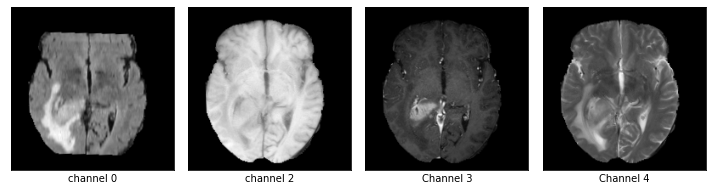

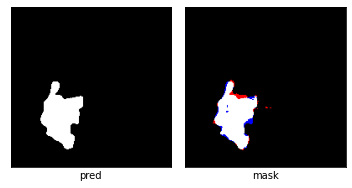

dice_loss : 0.012508087125296528



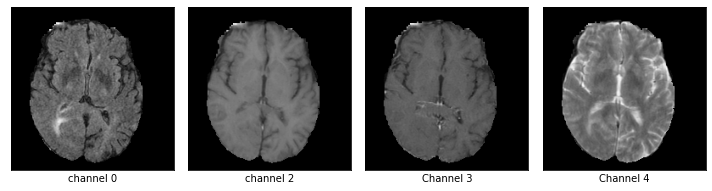

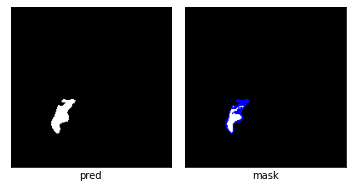

03/06 02:34:51 PM epoch 6 lr 2.356240e-02
03/06 02:34:51 PM genotype = Genotype(normal=[('skip_connect', 0), ('sep_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('skip_connect', 0), ('dil_conv_3x3', 2), ('dil_conv_5x5', 1), ('sep_conv_5x5', 3), ('sep_conv_5x5', 2), ('max_pool_3x3', 3), ('max_pool_3x3', 4)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.9082, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<41:39,  1.06s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.0312, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<41:14,  1.05s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.1460, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<40:48,  1.04s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<40:08,  1.02s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<40:02,  1.02s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.3841, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<39:35,  1.01s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.5210, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<39:14,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<39:22,  1.01s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<39:14,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.9877, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<39:07,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.0443]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<38:52,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1366, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<39:06,  1.00s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<39:03,  1.00s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<38:42,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<38:52,  1.00it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1381, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<38:26,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<38:25,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9633, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<38:36,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:19<38:37,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:19<38:31,  1.01it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:20<38:34,  1.01it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:21<38:35,  1.01it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:22<38:13,  1.02it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:23<38:26,  1.01it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:24<38:27,  1.01it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.1083, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:25<38:43,  1.00it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.2812, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:26<38:41,  1.00it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.3439, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:27<38:37,  1.00it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:28<38:32,  1.01it/s, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:29<38:46,  1.00s/it, Acc=0.988, IoU=0.737, Loss=0.152]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:30<38:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000471]

tensor(0.5223, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:31<38:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000471]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:32<38:46,  1.00s/it, Acc=1, IoU=0, Loss=0.000471]

tensor(0.5622, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:33<38:41,  1.00s/it, Acc=1, IoU=0, Loss=0.000471]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:34<38:23,  1.01it/s, Acc=1, IoU=0, Loss=0.000471]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:35<38:33,  1.00it/s, Acc=1, IoU=0, Loss=0.000471]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:36<38:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000471]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:37<38:26,  1.00it/s, Acc=1, IoU=0, Loss=0.000471]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:38<38:30,  1.00it/s, Acc=1, IoU=0, Loss=0.000471]

tensor(0.1297, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:39<38:49,  1.01s/it, Acc=1, IoU=0, Loss=0.000471]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:40<38:43,  1.00s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.9895, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:41<38:46,  1.01s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:42<38:44,  1.01s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:43<38:40,  1.00s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.1946, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:44<38:36,  1.00s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:45<38:25,  1.00it/s, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:46<38:40,  1.01s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.1513, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:47<38:35,  1.00s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:48<38:30,  1.00s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.9549, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:49<38:38,  1.01s/it, Acc=0.994, IoU=0.82, Loss=0.1]

tensor(0.1123, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:50<38:34,  1.00s/it, Acc=1, IoU=0, Loss=0.00348]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:51<38:25,  1.00s/it, Acc=1, IoU=0, Loss=0.00348]

tensor(0.1937, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:52<38:10,  1.00it/s, Acc=1, IoU=0, Loss=0.00348]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:53<38:20,  1.00it/s, Acc=1, IoU=0, Loss=0.00348]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:54<38:17,  1.00it/s, Acc=1, IoU=0, Loss=0.00348]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:55<38:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00348]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:56<38:08,  1.00it/s, Acc=1, IoU=0, Loss=0.00348]

tensor(0.0453, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:57<38:19,  1.00s/it, Acc=1, IoU=0, Loss=0.00348]

tensor(0.7502, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [00:58<38:22,  1.00s/it, Acc=1, IoU=0, Loss=0.00348]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [00:59<38:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00348]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:01<38:37,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.1364, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:02<38:33,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:03<38:30,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:04<38:41,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0037, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:05<38:39,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:06<38:27,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:07<38:28,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0056, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:08<38:13,  1.00s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:09<38:05,  1.00it/s, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0064, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:10<38:17,  1.01s/it, Acc=0.996, IoU=0.931, Loss=0.0365]

tensor(0.0943, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:11<38:48,  1.02s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.2224, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:12<38:38,  1.02s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:13<38:39,  1.02s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:14<38:17,  1.01s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:15<38:17,  1.01s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:16<38:23,  1.01s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.1282, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:17<38:30,  1.01s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:18<38:40,  1.02s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:19<38:40,  1.02s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.9865, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:20<38:12,  1.01s/it, Acc=0.995, IoU=0.656, Loss=0.204]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:21<38:14,  1.01s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:22<38:03,  1.00s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:23<38:04,  1.01s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:24<38:08,  1.01s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:25<38:16,  1.01s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:26<38:12,  1.01s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:27<38:14,  1.01s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.5516, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:28<38:23,  1.02s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:29<38:25,  1.02s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:30<38:25,  1.02s/it, Acc=0.994, IoU=0.93, Loss=0.0367]

tensor(0.2264, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:31<38:27,  1.02s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.6771, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:32<38:23,  1.02s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.2016, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:33<38:35,  1.02s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9704, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:34<38:43,  1.03s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1444, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:35<38:27,  1.02s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:36<38:40,  1.03s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.5752, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:37<38:40,  1.03s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.6786, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:38<38:52,  1.03s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:39<38:43,  1.03s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:40<38:33,  1.03s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9892, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:41<38:33,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:42<38:17,  1.02s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.5611, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:43<38:26,  1.02s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.2000, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:44<39:00,  1.04s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:45<38:39,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:46<38:52,  1.04s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:47<38:48,  1.04s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.0268, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:48<38:30,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:49<38:21,  1.02s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:50<38:26,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.109]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:51<38:12,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:52<38:04,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:53<38:03,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:54<38:14,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.1786, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:56<38:01,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:57<37:53,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:58<37:54,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [01:59<37:52,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [02:00<37:35,  1.01s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:01<37:49,  1.02s/it, Acc=0.996, IoU=0.924, Loss=0.04]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:02<37:43,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:03<37:36,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.6238, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:04<37:37,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:05<37:27,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:06<37:39,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.5871, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:07<37:41,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:08<37:38,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:09<37:30,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:10<37:34,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:11<37:33,  1.01s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:12<37:32,  1.01s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:13<37:55,  1.02s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:14<37:52,  1.02s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:15<37:49,  1.02s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.1580, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:16<37:43,  1.02s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:17<37:52,  1.02s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:18<37:31,  1.02s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:19<37:32,  1.02s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:20<37:21,  1.01s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:21<37:17,  1.01s/it, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:22<37:12,  1.01s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.7547, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:23<37:31,  1.02s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:24<37:33,  1.02s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.1531, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:25<37:19,  1.01s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.2793, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:26<37:17,  1.01s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.9840, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:27<37:22,  1.02s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.3584, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:28<37:24,  1.02s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.2603, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:29<37:11,  1.01s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.3478, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:30<36:57,  1.01s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:31<37:02,  1.01s/it, Acc=0.993, IoU=0.833, Loss=0.0905]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:32<37:25,  1.02s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:33<37:15,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.4943, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:34<37:25,  1.02s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1098, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:35<37:13,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:36<37:23,  1.02s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:37<37:06,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:38<38:17,  1.05s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.5730, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:39<37:49,  1.03s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:40<37:34,  1.03s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2119, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:41<37:22,  1.02s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:42<37:18,  1.02s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:43<37:09,  1.02s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.1206, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:44<37:31,  1.03s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:45<37:25,  1.02s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:46<37:30,  1.03s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:47<37:10,  1.02s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.1262, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:48<36:56,  1.01s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:49<36:42,  1.01s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:50<36:30,  1.00s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:51<36:42,  1.01s/it, Acc=0.994, IoU=0.869, Loss=0.0698]

tensor(0.1443, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:52<36:29,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:53<36:37,  1.01s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:54<36:30,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:55<36:30,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0396, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:56<36:25,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:57<36:29,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:58<36:30,  1.01s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.2023, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [02:59<36:20,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [03:00<36:21,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:01<36:25,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.3700, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:02<36:37,  1.01s/it, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.2930, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:03<36:26,  1.01s/it, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.2586, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:04<36:05,  1.00it/s, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:05<36:10,  1.00it/s, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:06<35:54,  1.01it/s, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.3325, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:07<36:00,  1.00it/s, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:08<36:29,  1.01s/it, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:09<36:22,  1.01s/it, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.1448, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:10<36:16,  1.01s/it, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.2924, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:11<36:20,  1.01s/it, Acc=0.995, IoU=0.903, Loss=0.052]

tensor(0.4502, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:12<36:23,  1.01s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.3265, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:13<36:43,  1.02s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.2462, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:15<36:47,  1.02s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.4537, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:16<36:32,  1.01s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:17<36:16,  1.01s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.3165, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:18<36:16,  1.01s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:19<36:35,  1.02s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:20<36:29,  1.01s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:21<36:38,  1.02s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.0415, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:22<36:28,  1.02s/it, Acc=0.99, IoU=0.691, Loss=0.183]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:23<36:33,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:24<36:31,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:25<36:32,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9714, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:26<36:33,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:27<36:07,  1.01s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:28<35:59,  1.00s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.2326, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:29<35:54,  1.00s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:30<35:59,  1.01s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:31<36:28,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:32<36:20,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:33<36:10,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.2991, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:34<36:24,  1.02s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0384, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:35<36:18,  1.02s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:36<36:19,  1.02s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:37<36:17,  1.02s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:38<35:55,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:39<35:43,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:40<35:46,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:41<35:50,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:42<35:34,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:43<35:26,  1.00it/s, Acc=1, IoU=0, Loss=0.000937]

tensor(0.2816, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:44<35:31,  1.00it/s, Acc=1, IoU=0, Loss=0.000937]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:45<35:29,  1.00it/s, Acc=1, IoU=0, Loss=0.000937]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:46<35:41,  1.00s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.7962, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:47<35:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.1171, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:48<36:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.7932, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:49<35:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.1163, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:50<35:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:51<35:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.0367, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:52<35:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:53<36:03,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:54<36:15,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:55<36:11,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1702, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:56<35:45,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:57<35:51,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:58<36:06,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.2635, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:59<35:31,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [04:00<35:11,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1191, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [04:01<35:28,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:02<35:20,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:03<35:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:04<35:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:05<35:33,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:06<35:32,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:07<35:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:08<35:39,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.5421, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:09<35:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:10<35:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.0073, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:11<35:22,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.2328, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:12<35:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:13<35:16,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:14<35:16,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:15<35:26,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:16<35:24,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:17<35:35,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:18<35:40,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:19<35:31,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2936, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:20<35:26,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:21<35:11,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:22<35:25,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:23<35:24,  1.01s/it, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:24<35:04,  1.01s/it, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.3624, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:25<34:58,  1.00s/it, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:26<35:09,  1.01s/it, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:27<35:01,  1.01s/it, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:28<34:54,  1.00s/it, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:29<35:03,  1.01s/it, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:30<35:02,  1.01s/it, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:31<34:39,  1.00it/s, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.1440, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:32<34:30,  1.01it/s, Acc=0.995, IoU=0.86, Loss=0.0743]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:33<34:35,  1.00it/s, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:34<34:35,  1.00it/s, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.7566, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:35<34:36,  1.00it/s, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:36<34:35,  1.00it/s, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:37<34:33,  1.00it/s, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:38<34:23,  1.01it/s, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:39<34:27,  1.01it/s, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.1518, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:40<34:43,  1.00s/it, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.4062, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:41<34:38,  1.00s/it, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:42<34:38,  1.00s/it, Acc=0.992, IoU=0.693, Loss=0.181]

tensor(0.1492, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:43<34:43,  1.00s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:44<34:52,  1.01s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.3789, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:45<34:41,  1.00s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:46<34:44,  1.01s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1591, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:47<34:46,  1.01s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:48<34:38,  1.00s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:49<34:50,  1.01s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:50<34:34,  1.00s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:51<34:39,  1.01s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.7225, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:52<34:57,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:53<34:56,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.4987, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:54<34:58,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.2666, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:55<35:01,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:56<34:39,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.1801, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:57<34:41,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.3726, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:58<34:46,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:59<34:39,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [05:00<34:48,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.4474, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [05:02<35:03,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:02<34:37,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0643]

tensor(0.1448, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:03<34:17,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.2904, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:04<34:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:05<34:23,  1.01s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.2227, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:07<34:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:08<34:16,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:09<34:19,  1.01s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.3918, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:10<34:10,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.1390, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:11<34:09,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.1192, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:12<34:09,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.5496, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:13<34:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:14<34:29,  1.01s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:15<34:36,  1.02s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.3789, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:16<34:46,  1.02s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:17<34:33,  1.02s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:18<34:07,  1.00s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.5109, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:19<34:19,  1.01s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:20<34:32,  1.02s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:21<34:29,  1.02s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:22<34:25,  1.01s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:23<34:14,  1.01s/it, Acc=0.988, IoU=0.831, Loss=0.0922]

tensor(0.0205, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:24<34:17,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:25<34:07,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:26<34:20,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:27<33:56,  1.00s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.3669, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:28<34:08,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:29<34:07,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.1296, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:30<33:51,  1.00s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:31<34:12,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:32<34:08,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.1554, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:33<34:20,  1.02s/it, Acc=0.993, IoU=0.885, Loss=0.0606]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:34<34:25,  1.02s/it, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.9804, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:35<34:35,  1.03s/it, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.5538, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:36<34:19,  1.02s/it, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.6016, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:37<33:53,  1.01s/it, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:38<33:46,  1.00s/it, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.1293, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:39<33:38,  1.00it/s, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.0383, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:40<33:41,  1.00s/it, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:41<33:34,  1.00it/s, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:42<33:37,  1.00s/it, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.3387, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:43<33:49,  1.01s/it, Acc=0.991, IoU=0.646, Loss=0.215]

tensor(0.1519, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:44<33:56,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.8851, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:45<33:53,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0809, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:46<33:35,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5623, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:47<33:36,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:48<33:37,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:49<33:47,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:50<33:39,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:51<33:39,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:52<33:27,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:53<33:27,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.6871, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:54<33:14,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:55<33:21,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:56<33:12,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:57<33:15,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3089, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:58<33:15,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3990, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:59<33:15,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [06:00<33:22,  1.00s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0561, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [06:01<33:21,  1.00s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3960, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [06:02<33:30,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2413, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:03<33:45,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:04<33:40,  1.01s/it, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:05<33:31,  1.01s/it, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.5286, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:06<33:24,  1.01s/it, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:07<33:24,  1.01s/it, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:08<33:43,  1.02s/it, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.6827, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:09<33:35,  1.01s/it, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:10<33:31,  1.01s/it, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:11<33:23,  1.01s/it, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:12<33:04,  1.00it/s, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:13<32:56,  1.00it/s, Acc=0.988, IoU=0.787, Loss=0.12]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:14<33:16,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:15<33:22,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:16<33:01,  1.00it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0436, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:17<32:46,  1.01it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:18<32:41,  1.01it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:19<32:46,  1.01it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:20<32:44,  1.01it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.3838, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:21<32:44,  1.01it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:22<32:53,  1.00it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:23<32:46,  1.00it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:24<32:42,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:25<32:28,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.2116, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:26<32:28,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:27<32:31,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:28<32:33,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:29<32:21,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:30<32:03,  1.02it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:31<32:21,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1779, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:32<32:28,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1465, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:33<32:33,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.3439, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:34<32:49,  1.00s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:35<33:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:36<33:05,  1.01s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:37<33:17,  1.02s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.1391, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:38<33:11,  1.02s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:39<33:02,  1.01s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.9814, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:40<33:01,  1.01s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:41<32:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.7381, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:42<32:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.5588, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:43<32:53,  1.01s/it, Acc=1, IoU=0, Loss=0.00158]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:44<32:57,  1.01s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.8921, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:45<33:23,  1.03s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.1488, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:46<33:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.0983, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:47<33:15,  1.02s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:48<32:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.3523, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:49<33:09,  1.02s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.3967, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:50<33:16,  1.02s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.7440, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:51<33:09,  1.02s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.5624, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:52<32:57,  1.02s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:53<32:59,  1.02s/it, Acc=1, IoU=0, Loss=0.00262]

tensor(0.4113, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:54<32:53,  1.02s/it, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.5887, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:55<32:40,  1.01s/it, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.2186, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:56<32:39,  1.01s/it, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:57<32:43,  1.01s/it, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.9775, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:58<32:32,  1.01s/it, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.9800, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:59<32:29,  1.01s/it, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.1491, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [07:00<32:22,  1.00s/it, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [07:01<32:16,  1.00it/s, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.9684, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [07:02<32:09,  1.00it/s, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:03<32:24,  1.00s/it, Acc=0.986, IoU=0.849, Loss=0.0828]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:04<32:12,  1.00it/s, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:05<32:24,  1.01s/it, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.2861, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:06<32:18,  1.00s/it, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:07<32:20,  1.01s/it, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:08<32:12,  1.00s/it, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:09<32:12,  1.00s/it, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:10<32:14,  1.00s/it, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:11<32:08,  1.00s/it, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:12<31:48,  1.01it/s, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.3625, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:13<31:59,  1.00it/s, Acc=0.981, IoU=0.688, Loss=0.182]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:14<32:03,  1.00it/s, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:15<32:15,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:16<32:18,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.5580, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:17<32:22,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:18<32:28,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:19<32:31,  1.02s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:20<32:25,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.3004, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:21<32:25,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:22<31:59,  1.00s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.1084, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:23<31:55,  1.00s/it, Acc=0.993, IoU=0.57, Loss=0.276]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:24<31:38,  1.01it/s, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.3575, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:25<31:56,  1.00s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.1483, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:26<31:55,  1.00s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:27<31:50,  1.00it/s, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:28<31:47,  1.00it/s, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.1167, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:29<31:50,  1.00s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:30<31:54,  1.00s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:31<31:55,  1.00s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:32<31:52,  1.00s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.2881, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:33<31:51,  1.00s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:34<31:35,  1.00it/s, Acc=1, IoU=0, Loss=0.000898]

tensor(0.8148, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:35<31:56,  1.01s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:36<32:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.1284, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:37<32:05,  1.01s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.2447, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:38<31:56,  1.01s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:39<31:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:40<31:42,  1.00s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:41<31:44,  1.00s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:42<31:40,  1.00s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:43<31:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000898]

tensor(0.1261, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:44<31:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.0975, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:45<32:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:46<31:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.9246, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:47<31:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.0510, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:49<32:17,  1.03s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.4767, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:50<32:19,  1.03s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:51<32:02,  1.02s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:52<31:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.3378, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:53<31:45,  1.01s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.1603, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:54<31:40,  1.01s/it, Acc=1, IoU=0, Loss=0.000798]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:55<31:29,  1.00s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.7033, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:56<31:39,  1.01s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.1092, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:57<31:37,  1.01s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.1636, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:58<31:44,  1.01s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:59<31:57,  1.02s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.9832, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [08:00<31:59,  1.02s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [08:01<31:54,  1.02s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [08:02<31:52,  1.02s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [08:03<31:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [08:04<31:47,  1.02s/it, Acc=1, IoU=0, Loss=0.00202]

tensor(0.0341, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:05<31:24,  1.01s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.4193, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:06<31:29,  1.01s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:07<31:15,  1.00s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.2311, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:08<31:18,  1.00s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.9233, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:09<31:26,  1.01s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.6073, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:10<31:20,  1.01s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.0444, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:11<31:18,  1.01s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:12<31:18,  1.01s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:13<31:17,  1.01s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.3650, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:14<31:20,  1.01s/it, Acc=0.998, IoU=0.838, Loss=0.0893]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:15<31:26,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.5077, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:16<31:29,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:17<31:26,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:18<31:19,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:19<31:16,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.1494, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:20<31:10,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:21<31:23,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.5519, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:22<31:26,  1.02s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:23<31:16,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:24<31:21,  1.01s/it, Acc=0.994, IoU=0.812, Loss=0.103]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:25<31:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:26<31:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:27<31:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.7334, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:28<31:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:29<31:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.8427, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:30<31:19,  1.02s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.3636, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:31<31:06,  1.01s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:32<31:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:33<31:11,  1.01s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.2608, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:34<31:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000653]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:35<31:06,  1.01s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.4222, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:36<31:17,  1.02s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:37<31:02,  1.01s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.5961, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:38<31:01,  1.01s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:39<31:06,  1.01s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.2947, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:40<31:00,  1.01s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:41<31:06,  1.02s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.1523, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:42<31:12,  1.02s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:43<31:21,  1.02s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.9029, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:44<31:23,  1.03s/it, Acc=0.991, IoU=0.908, Loss=0.0493]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:45<31:05,  1.02s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:46<31:02,  1.02s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.4293, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:47<30:56,  1.01s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.9746, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:48<31:04,  1.02s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.1658, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:49<30:57,  1.01s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.7211, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:50<31:17,  1.03s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.9835, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:51<30:58,  1.02s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:52<30:46,  1.01s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.4191, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:53<30:54,  1.02s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:54<30:40,  1.01s/it, Acc=1, IoU=0, Loss=0.8]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:55<30:44,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.1606, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:56<30:55,  1.02s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:57<30:50,  1.02s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.8512, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:58<30:44,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.9895, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:59<30:39,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [09:00<30:43,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [09:01<30:27,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [09:02<30:22,  1.00s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.1000, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [09:03<30:20,  1.00s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [09:04<30:10,  1.00it/s, Acc=1, IoU=0, Loss=0.5]

tensor(0.4752, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:05<30:09,  1.00it/s, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:06<30:08,  1.00it/s, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.9651, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:07<30:09,  1.00it/s, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:08<30:21,  1.01s/it, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:09<30:07,  1.00it/s, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:10<30:05,  1.00it/s, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.2441, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:11<30:12,  1.00s/it, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:12<30:13,  1.00s/it, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:13<30:21,  1.01s/it, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.1664, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:14<30:07,  1.00s/it, Acc=0.996, IoU=0.865, Loss=0.0731]

tensor(0.0980, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:15<30:14,  1.01s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:16<30:30,  1.02s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:18<30:30,  1.02s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:19<30:55,  1.03s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.1380, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:20<30:43,  1.02s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.0048, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:21<30:28,  1.02s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.5587, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:22<30:11,  1.01s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.6470, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:23<30:02,  1.00s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.9719, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:24<29:57,  1.00s/it, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:25<29:44,  1.01it/s, Acc=0.997, IoU=0.552, Loss=0.292]

tensor(0.5615, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:26<29:52,  1.00it/s, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.8502, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:27<30:08,  1.01s/it, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:28<29:55,  1.00s/it, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.1722, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:29<30:00,  1.01s/it, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.5805, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:30<29:58,  1.00s/it, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:31<29:49,  1.00s/it, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.8202, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:32<29:58,  1.01s/it, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:33<29:44,  1.00it/s, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.2714, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:34<29:37,  1.00it/s, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:35<29:36,  1.00it/s, Acc=0.987, IoU=0.841, Loss=0.0863]

tensor(0.4291, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:36<29:54,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:37<29:53,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:38<29:54,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.2438, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:39<29:47,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1654, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:40<29:56,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.3152, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:41<29:40,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:42<29:37,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:43<29:42,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.3619, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:44<29:37,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.3867, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:45<29:51,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:46<29:49,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:47<29:52,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:48<30:02,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:49<30:02,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.4500, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:50<29:45,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.7998, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:51<29:38,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.5212, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:52<29:40,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1723, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:53<29:25,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:54<29:04,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:55<29:17,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:56<29:29,  1.00s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.3648, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:57<29:38,  1.01s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.5699, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:58<29:36,  1.01s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.4574, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:59<29:37,  1.01s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.2872, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [10:00<29:55,  1.02s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.0964, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [10:01<29:59,  1.02s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [10:02<29:48,  1.02s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.3764, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [10:03<29:42,  1.01s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [10:04<29:48,  1.02s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.6514, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:05<29:39,  1.01s/it, Acc=0.995, IoU=0.932, Loss=0.0363]

tensor(0.5442, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:06<29:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000705]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:07<29:11,  1.00it/s, Acc=1, IoU=0, Loss=0.000705]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:08<29:18,  1.00s/it, Acc=1, IoU=0, Loss=0.000705]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:09<29:02,  1.00it/s, Acc=1, IoU=0, Loss=0.000705]

tensor(0.0896, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:10<29:07,  1.00it/s, Acc=1, IoU=0, Loss=0.000705]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:11<29:03,  1.00it/s, Acc=1, IoU=0, Loss=0.000705]

tensor(0.0323, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:12<28:58,  1.01it/s, Acc=1, IoU=0, Loss=0.000705]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:13<29:08,  1.00s/it, Acc=1, IoU=0, Loss=0.000705]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:14<29:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000705]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:15<29:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000705]

tensor(0.1057, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:16<29:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000405]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:17<29:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000405]

tensor(0.5662, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:18<29:05,  1.00s/it, Acc=1, IoU=0, Loss=0.000405]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:19<28:54,  1.00it/s, Acc=1, IoU=0, Loss=0.000405]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:20<28:57,  1.00it/s, Acc=1, IoU=0, Loss=0.000405]

tensor(0.3906, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:21<29:00,  1.00s/it, Acc=1, IoU=0, Loss=0.000405]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:22<28:47,  1.01it/s, Acc=1, IoU=0, Loss=0.000405]

tensor(0.2551, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:23<28:54,  1.00it/s, Acc=1, IoU=0, Loss=0.000405]

tensor(0.1517, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:24<28:59,  1.00s/it, Acc=1, IoU=0, Loss=0.000405]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:25<29:07,  1.01s/it, Acc=1, IoU=0, Loss=0.000405]

tensor(0.8859, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:26<29:06,  1.01s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:27<28:59,  1.00s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:28<29:06,  1.01s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:29<29:10,  1.01s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.1445, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:30<28:53,  1.00s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:31<28:48,  1.00it/s, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.4012, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:32<28:51,  1.00s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:33<28:47,  1.00s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:34<28:46,  1.00s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.7987, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:35<28:46,  1.00s/it, Acc=0.992, IoU=0.872, Loss=0.0718]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:36<28:49,  1.00s/it, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:37<28:51,  1.01s/it, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:38<28:50,  1.01s/it, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:39<29:01,  1.01s/it, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.1182, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:40<29:02,  1.01s/it, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:41<28:36,  1.00it/s, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.0365, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:42<28:21,  1.01it/s, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.0917, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:43<28:24,  1.01it/s, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:44<28:31,  1.00it/s, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.0065, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:45<28:27,  1.00it/s, Acc=0.993, IoU=0.672, Loss=0.2]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:46<28:33,  1.00it/s, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:47<28:38,  1.00s/it, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.3318, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:48<28:36,  1.00s/it, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:49<28:32,  1.00s/it, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:50<28:27,  1.00it/s, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:51<28:49,  1.01s/it, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:52<28:44,  1.01s/it, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:53<28:27,  1.00s/it, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:54<28:33,  1.00s/it, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:55<28:19,  1.00it/s, Acc=0.987, IoU=0.843, Loss=0.0855]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:56<28:22,  1.00it/s, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.0304, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:57<28:29,  1.00s/it, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.2256, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:58<28:18,  1.00it/s, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:59<28:16,  1.00it/s, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.9622, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [11:00<28:13,  1.00it/s, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.3149, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [11:01<28:13,  1.00it/s, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [11:02<28:17,  1.00it/s, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [11:03<28:22,  1.00s/it, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.1267, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [11:04<28:27,  1.01s/it, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.6135, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:05<28:16,  1.00s/it, Acc=0.994, IoU=0.863, Loss=0.0752]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:06<29:01,  1.03s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:07<28:54,  1.02s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1654, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:08<28:44,  1.02s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:09<28:48,  1.02s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:10<28:25,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1702, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:11<28:04,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:12<28:01,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:13<28:00,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.8824, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:14<27:54,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:15<27:41,  1.01it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.7722, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:16<27:52,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:17<27:39,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:18<27:51,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:19<27:56,  1.00it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.6147, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:20<27:59,  1.00it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:21<28:02,  1.00s/it, Acc=1, IoU=0, Loss=0.0016]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:22<28:08,  1.01s/it, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0458, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:23<27:50,  1.00it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.1497, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:24<27:46,  1.01it/s, Acc=1, IoU=0, Loss=0.0016]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:25<27:59,  1.00s/it, Acc=1, IoU=0, Loss=0.0016]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:26<28:00,  1.00s/it, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:27<28:07,  1.01s/it, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:28<28:10,  1.01s/it, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.6033, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:29<27:53,  1.00s/it, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:30<27:37,  1.01it/s, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:31<27:45,  1.00it/s, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:32<27:37,  1.01it/s, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.2856, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:33<27:58,  1.01s/it, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:34<28:07,  1.01s/it, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.1381, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:35<28:13,  1.02s/it, Acc=0.988, IoU=0.853, Loss=0.0808]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:36<28:07,  1.01s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:37<28:07,  1.01s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.2635, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:38<28:02,  1.01s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.0384, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:39<28:10,  1.02s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:40<27:59,  1.01s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.1822, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:41<27:57,  1.01s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.1121, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:42<27:58,  1.01s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.0458, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:43<27:56,  1.01s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.1706, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:44<27:51,  1.01s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.0514, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:45<28:02,  1.02s/it, Acc=0.995, IoU=0.902, Loss=0.051]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:46<27:44,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.2063, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:47<27:45,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:48<27:35,  1.00s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:49<27:49,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:50<27:50,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.7029, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:51<27:47,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:52<27:47,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:53<27:45,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.3901, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:54<27:57,  1.02s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.1246, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:55<27:59,  1.02s/it, Acc=0.995, IoU=0.905, Loss=0.0514]

tensor(0.1668, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:56<28:05,  1.03s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.8257, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:57<27:50,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:58<27:54,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:59<27:57,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.2627, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [12:00<27:55,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.2736, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [12:01<27:53,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [12:02<28:06,  1.03s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.1068, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [12:03<28:10,  1.03s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [12:05<28:15,  1.04s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.3034, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:06<28:04,  1.03s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.1133, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:07<27:54,  1.02s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:08<27:47,  1.02s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.2721, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:09<27:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.5780, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:10<27:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.5554, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:11<27:29,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.5095, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:12<27:40,  1.02s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.1269, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:13<27:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:14<27:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.9375, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:15<27:25,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:16<27:18,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.2158, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:17<27:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.5239, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:18<27:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.2179, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:19<27:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:20<27:26,  1.02s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.1831, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:21<27:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.6028, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:22<27:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:23<27:19,  1.01s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:24<26:58,  1.00s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:25<27:02,  1.00s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:26<26:58,  1.00s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:27<27:06,  1.01s/it, Acc=1, IoU=0, Loss=0.000551]

tensor(0.6233, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:28<27:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000551]

tensor(0.1327, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:29<27:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000551]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:30<27:18,  1.02s/it, Acc=1, IoU=0, Loss=0.000551]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:31<27:11,  1.01s/it, Acc=1, IoU=0, Loss=0.000551]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:32<27:15,  1.02s/it, Acc=1, IoU=0, Loss=0.000551]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:33<26:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000551]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:34<26:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000551]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:35<26:42,  1.00it/s, Acc=1, IoU=0, Loss=0.000551]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:36<26:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000551]

tensor(0.2446, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:37<26:50,  1.00s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:38<26:56,  1.01s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:39<26:59,  1.01s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.1493, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:40<27:07,  1.02s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:41<26:59,  1.01s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:42<26:59,  1.01s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:43<27:00,  1.01s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:44<26:52,  1.01s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:45<26:53,  1.01s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:46<26:51,  1.01s/it, Acc=0.995, IoU=0.911, Loss=0.0468]

tensor(0.1163, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:47<27:01,  1.02s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:48<27:01,  1.02s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.9614, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:49<26:55,  1.01s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:50<26:57,  1.02s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.1232, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:51<26:58,  1.02s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.1998, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:52<27:03,  1.02s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.2108, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:53<27:01,  1.02s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:54<26:56,  1.02s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.8227, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:55<27:02,  1.02s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:56<26:47,  1.01s/it, Acc=0.998, IoU=0.569, Loss=0.285]

tensor(0.3530, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:57<26:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:58<26:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.1306, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:59<26:38,  1.01s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [13:00<26:45,  1.02s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [13:01<26:24,  1.00s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [13:02<26:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.1652, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [13:03<26:46,  1.02s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [13:04<26:36,  1.01s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.2943, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [13:05<26:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.1704, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:06<26:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000251]

tensor(0.1989, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:07<26:53,  1.03s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:08<26:54,  1.03s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:09<26:53,  1.03s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.9918, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:10<26:50,  1.03s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:11<26:42,  1.02s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:12<26:33,  1.02s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:13<26:40,  1.02s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:14<26:35,  1.02s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:15<26:36,  1.02s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:16<26:17,  1.01s/it, Acc=1, IoU=0, Loss=0.0464]

tensor(0.6964, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:17<26:23,  1.01s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:18<26:19,  1.01s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.2807, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:20<26:22,  1.01s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:21<26:13,  1.01s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.1884, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:22<26:30,  1.02s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.5134, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:23<26:30,  1.02s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:24<26:24,  1.02s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:25<26:10,  1.01s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:26<26:03,  1.00s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:27<26:01,  1.00s/it, Acc=0.988, IoU=0.81, Loss=0.105]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:28<26:10,  1.01s/it, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.4565, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:29<25:55,  1.00s/it, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:30<25:46,  1.00it/s, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.9820, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:31<25:48,  1.00it/s, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:32<25:54,  1.00s/it, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:33<25:49,  1.00s/it, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:34<25:49,  1.00s/it, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.1496, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:35<25:50,  1.00s/it, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.4253, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:36<25:55,  1.01s/it, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:37<25:53,  1.01s/it, Acc=0.995, IoU=0.941, Loss=0.032]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:38<25:51,  1.00s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.2527, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:39<26:05,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:40<26:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.8241, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:41<25:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.5487, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:42<25:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.6020, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:43<25:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:44<25:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:45<25:49,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.5553, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:46<25:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.3136, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:47<25:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:48<25:49,  1.01s/it, Acc=1, IoU=0, Loss=0.000687]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:49<25:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000687]

tensor(0.3458, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:50<25:38,  1.00s/it, Acc=1, IoU=0, Loss=0.000687]

tensor(0.9888, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:51<25:34,  1.00s/it, Acc=1, IoU=0, Loss=0.000687]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:52<25:41,  1.01s/it, Acc=1, IoU=0, Loss=0.000687]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:53<25:42,  1.01s/it, Acc=1, IoU=0, Loss=0.000687]

tensor(0.9858, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:54<25:26,  1.00it/s, Acc=1, IoU=0, Loss=0.000687]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:55<25:24,  1.00it/s, Acc=1, IoU=0, Loss=0.000687]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:56<25:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000687]

tensor(0.5149, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:57<25:30,  1.00s/it, Acc=1, IoU=0, Loss=0.000687]

tensor(0.9867, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:58<25:30,  1.00s/it, Acc=1, IoU=0, Loss=0.000759]

tensor(0.7188, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:59<25:21,  1.00it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.1339, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [14:00<25:21,  1.00it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.0992, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [14:01<25:11,  1.01it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.0286, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [14:02<25:04,  1.01it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [14:03<25:16,  1.00it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [14:04<25:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:05<25:10,  1.00it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:06<25:10,  1.00it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:07<24:59,  1.01it/s, Acc=1, IoU=0, Loss=0.000759]

tensor(0.1561, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:08<24:53,  1.01it/s, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:09<24:52,  1.01it/s, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:10<24:50,  1.01it/s, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:11<24:59,  1.01it/s, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.3011, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:12<24:54,  1.01it/s, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.1920, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:13<25:03,  1.00it/s, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.1517, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:14<25:21,  1.01s/it, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:15<25:22,  1.01s/it, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:16<25:17,  1.01s/it, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:17<25:24,  1.01s/it, Acc=0.998, IoU=0.865, Loss=0.0715]

tensor(0.3545, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:18<25:26,  1.01s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:19<25:29,  1.02s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:20<25:32,  1.02s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.3749, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:21<25:20,  1.01s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:22<25:25,  1.02s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:23<25:27,  1.02s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.0057, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:24<25:29,  1.02s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:25<25:20,  1.02s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.0487, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:26<25:12,  1.01s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.2450, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:27<25:13,  1.01s/it, Acc=0.974, IoU=0.629, Loss=0.227]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:28<25:08,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:29<25:17,  1.02s/it, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.1589, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:30<25:12,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:31<25:03,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.2135, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:32<25:03,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:33<24:58,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.4651, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:34<25:03,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:35<24:48,  1.00s/it, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:36<24:36,  1.01it/s, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:37<24:44,  1.00it/s, Acc=0.992, IoU=0.912, Loss=0.0457]

tensor(0.4530, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:38<24:52,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:39<24:52,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:40<24:47,  1.00s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:41<24:41,  1.00s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.9447, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:42<24:41,  1.00s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.6289, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:43<24:46,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:44<24:31,  1.00it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:45<24:31,  1.00it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:46<24:37,  1.00s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:47<24:42,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:48<24:37,  1.00s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:49<24:41,  1.01s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:50<24:49,  1.01s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:51<24:42,  1.01s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:52<24:38,  1.01s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:53<24:36,  1.00s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.4871, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:54<24:29,  1.00s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:55<24:39,  1.01s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.0581, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:56<24:44,  1.01s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.1714, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:57<24:39,  1.01s/it, Acc=0.991, IoU=0.609, Loss=0.241]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:58<24:40,  1.01s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:59<24:38,  1.01s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.9918, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [15:00<24:45,  1.02s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [15:01<24:51,  1.02s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.3326, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [15:02<24:49,  1.02s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.3811, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [15:03<24:42,  1.02s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [15:04<24:33,  1.01s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:05<24:41,  1.02s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.4311, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:06<24:30,  1.01s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:07<24:30,  1.01s/it, Acc=0.983, IoU=0.752, Loss=0.141]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:08<24:29,  1.01s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.3328, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:09<24:33,  1.01s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.1182, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:10<24:23,  1.01s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:11<24:19,  1.01s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:12<24:25,  1.01s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.3187, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:13<24:30,  1.02s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:14<24:27,  1.01s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.1863, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:15<24:22,  1.01s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:16<24:28,  1.02s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.9778, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:17<24:24,  1.01s/it, Acc=0.997, IoU=0.779, Loss=0.125]

tensor(0.1415, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:18<24:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:19<24:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:20<24:19,  1.01s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:21<24:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.0413, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:22<24:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.2999, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:23<24:22,  1.02s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:24<24:19,  1.02s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.1820, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:25<24:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.1726, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:26<24:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.1870, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:27<24:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000666]

tensor(0.6569, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:28<24:17,  1.02s/it, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:29<24:09,  1.01s/it, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:30<24:06,  1.01s/it, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:31<24:05,  1.01s/it, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:32<24:02,  1.01s/it, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:33<23:48,  1.00it/s, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.6371, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:34<23:38,  1.01it/s, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.1276, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:35<23:41,  1.00it/s, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:36<23:35,  1.01it/s, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:37<23:32,  1.01it/s, Acc=0.982, IoU=0.786, Loss=0.12]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:38<23:43,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:39<23:54,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1377, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:40<23:40,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:41<23:38,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:42<23:34,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1881, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:43<23:41,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.6810, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:44<23:48,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:45<23:38,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5157, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:46<23:45,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:47<23:45,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1620, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:48<23:46,  1.01s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:50<23:57,  1.02s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.2467, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:51<23:54,  1.02s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:52<23:41,  1.01s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:53<23:33,  1.00s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:54<23:39,  1.01s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:55<23:39,  1.01s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.8290, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:56<23:38,  1.01s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:57<23:23,  1.00it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0498, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:58<23:14,  1.01it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:58<23:13,  1.01it/s, Acc=1, IoU=0, Loss=0.000445]

tensor(0.5825, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:59<23:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000445]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [16:00<23:14,  1.01it/s, Acc=1, IoU=0, Loss=0.000445]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [16:01<23:11,  1.01it/s, Acc=1, IoU=0, Loss=0.000445]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [16:02<23:23,  1.00s/it, Acc=1, IoU=0, Loss=0.000445]

tensor(0.1390, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [16:04<23:36,  1.01s/it, Acc=1, IoU=0, Loss=0.000445]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [16:05<23:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000445]

tensor(0.1683, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:06<23:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000445]

tensor(0.1389, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:07<23:23,  1.01s/it, Acc=1, IoU=0, Loss=0.000445]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:08<23:08,  1.00it/s, Acc=1, IoU=0, Loss=0.000445]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:09<23:12,  1.00it/s, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:10<23:15,  1.00s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.0413, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:11<23:14,  1.00s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:12<23:21,  1.01s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:13<23:16,  1.00s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.6361, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:14<23:15,  1.00s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.2292, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:15<23:18,  1.01s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:16<23:23,  1.01s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:17<23:18,  1.01s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:18<23:06,  1.00s/it, Acc=0.998, IoU=0.808, Loss=0.108]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:19<23:03,  1.00it/s, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:20<23:04,  1.00s/it, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:21<23:00,  1.00it/s, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:22<22:56,  1.00it/s, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.9798, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:23<22:53,  1.00it/s, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:24<22:57,  1.00it/s, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.1529, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:25<23:00,  1.00s/it, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:26<23:01,  1.00s/it, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:27<23:05,  1.01s/it, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:28<23:14,  1.01s/it, Acc=0.969, IoU=0.0723, Loss=0.864]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:29<23:17,  1.02s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:30<23:11,  1.01s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:31<23:03,  1.01s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:32<23:03,  1.01s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:33<23:03,  1.01s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:34<23:07,  1.01s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.1633, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:35<23:06,  1.01s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:36<23:11,  1.02s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.7444, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:37<23:10,  1.02s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.9661, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:38<23:04,  1.01s/it, Acc=0.99, IoU=0.159, Loss=0.721]

tensor(0.8063, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:39<23:01,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1332, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:40<23:04,  1.02s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.6424, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:41<22:52,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:42<22:44,  1.00s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0276, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:43<22:43,  1.00s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:44<22:38,  1.00it/s, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1867, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:45<22:50,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1436, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:46<22:47,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1492, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:47<22:47,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:48<22:42,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:49<22:41,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:50<22:52,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:51<22:54,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.2130, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:52<22:51,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.9828, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:53<22:39,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.3928, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:54<22:42,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:55<22:43,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.0068, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:56<22:46,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:57<22:38,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.9832, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:58<22:37,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0536]

tensor(0.2281, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:59<22:24,  1.00s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [17:00<22:51,  1.02s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.2063, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [17:01<22:45,  1.02s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.3106, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [17:02<22:28,  1.01s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.9749, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [17:03<22:24,  1.00s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [17:04<22:44,  1.02s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.1320, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [17:05<22:40,  1.02s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.5140, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:06<22:41,  1.02s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:07<23:11,  1.04s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:08<23:08,  1.04s/it, Acc=0.965, IoU=0.695, Loss=0.18]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:09<23:01,  1.04s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:10<23:01,  1.04s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.5427, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:11<23:00,  1.04s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.9404, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:12<22:59,  1.04s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.0979, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:13<22:56,  1.03s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:14<22:45,  1.03s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:15<22:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.1335, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:16<22:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:17<22:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.1588, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:18<22:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000741]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:19<22:16,  1.01s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:20<22:14,  1.01s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.1279, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:21<22:03,  1.00s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.1910, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:22<21:50,  1.01it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.6692, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:23<21:59,  1.00it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:24<22:10,  1.01s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:25<22:15,  1.01s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:26<22:05,  1.01s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.2131, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:27<22:10,  1.01s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:28<22:13,  1.01s/it, Acc=0.938, IoU=0, Loss=1]

tensor(0.5404, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:29<22:07,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:30<22:04,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.2798, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:31<21:59,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:33<22:05,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.8044, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:34<22:11,  1.02s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:35<22:03,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.2274, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:36<22:09,  1.02s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.3855, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:37<22:05,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:38<22:03,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.2009, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:39<22:03,  1.01s/it, Acc=0.991, IoU=0.83, Loss=0.0921]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:40<22:03,  1.02s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:41<22:09,  1.02s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.2628, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:42<22:03,  1.02s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.1403, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:43<21:55,  1.01s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.1427, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:44<21:55,  1.01s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:45<21:44,  1.00s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.1726, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:46<21:42,  1.00s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:47<21:40,  1.00s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.1727, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:48<21:41,  1.00s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.4683, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:49<21:35,  1.00s/it, Acc=0.99, IoU=0.732, Loss=0.156]

tensor(0.8892, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:50<21:33,  1.00it/s, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.2793, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:51<21:33,  1.00s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:52<21:29,  1.00it/s, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:53<21:34,  1.00s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.2476, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:54<21:31,  1.00s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:55<21:34,  1.00s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:56<21:36,  1.01s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:57<21:35,  1.01s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.2399, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:58<21:32,  1.00s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:59<21:43,  1.01s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [18:00<21:46,  1.02s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.1343, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [18:01<21:44,  1.02s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [18:02<21:33,  1.01s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [18:03<21:36,  1.01s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.3819, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [18:04<21:42,  1.02s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [18:05<21:29,  1.01s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.8315, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [18:06<21:20,  1.00s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.3048, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:07<21:17,  1.00s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:08<21:19,  1.00s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.9707, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:09<21:25,  1.01s/it, Acc=0.991, IoU=0.649, Loss=0.213]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:10<21:21,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.7025, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:11<21:23,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:12<21:20,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.3846, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:13<21:22,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.6428, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:14<21:28,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:15<21:33,  1.02s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:16<21:14,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.1510, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:17<21:15,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.4775, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:18<21:13,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.1928, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:19<21:11,  1.01s/it, Acc=0.99, IoU=0.82, Loss=0.103]

tensor(0.1232, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:20<21:06,  1.00s/it, Acc=1, IoU=0, Loss=0.000794]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:21<20:57,  1.00it/s, Acc=1, IoU=0, Loss=0.000794]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:22<21:02,  1.00s/it, Acc=1, IoU=0, Loss=0.000794]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:23<20:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000794]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:24<20:51,  1.01it/s, Acc=1, IoU=0, Loss=0.000794]

tensor(0.6156, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:25<20:57,  1.00it/s, Acc=1, IoU=0, Loss=0.000794]

tensor(0.6469, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:26<20:59,  1.00s/it, Acc=1, IoU=0, Loss=0.000794]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:27<20:53,  1.00it/s, Acc=1, IoU=0, Loss=0.000794]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:28<20:56,  1.00s/it, Acc=1, IoU=0, Loss=0.000794]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:29<20:47,  1.01it/s, Acc=1, IoU=0, Loss=0.000794]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:30<20:52,  1.00it/s, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:31<20:58,  1.00s/it, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:32<20:59,  1.01s/it, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.4273, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:33<20:54,  1.00s/it, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:34<20:54,  1.00s/it, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.2341, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:35<20:56,  1.01s/it, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:36<20:50,  1.00s/it, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:37<20:46,  1.00it/s, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:38<20:58,  1.01s/it, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:39<20:58,  1.01s/it, Acc=0.988, IoU=0.588, Loss=0.262]

tensor(0.0491, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:40<20:56,  1.01s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.4299, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:41<20:58,  1.01s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1745, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:42<20:57,  1.01s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:43<20:48,  1.01s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:44<20:54,  1.01s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1809, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:45<21:08,  1.02s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.9733, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:46<20:54,  1.01s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.7188, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:47<20:53,  1.01s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.1607, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:48<21:03,  1.02s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:49<20:53,  1.02s/it, Acc=0.983, IoU=0, Loss=0.998]

tensor(0.2641, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:50<20:44,  1.01s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.1780, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:51<20:51,  1.02s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:52<20:53,  1.02s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:53<20:53,  1.02s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.1516, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:54<20:42,  1.01s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:55<20:37,  1.01s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:56<20:36,  1.01s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:57<20:36,  1.01s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.3237, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:58<20:35,  1.01s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.1272, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:59<20:34,  1.01s/it, Acc=0.991, IoU=0.921, Loss=0.0434]

tensor(0.0336, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [19:00<20:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [19:01<20:39,  1.01s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [19:02<20:41,  1.02s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [19:03<20:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [19:04<20:26,  1.01s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.1497, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [19:05<20:18,  1.00it/s, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0366, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:06<20:22,  1.00s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:07<20:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00106]

tensor(0.4060, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:08<20:22,  1.01s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:09<20:18,  1.00s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:10<20:23,  1.01s/it, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.3590, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:11<20:30,  1.01s/it, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:12<20:20,  1.01s/it, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:13<20:23,  1.01s/it, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:14<20:26,  1.01s/it, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.4381, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:15<20:20,  1.01s/it, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:16<20:04,  1.00it/s, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:17<19:56,  1.01it/s, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:18<19:48,  1.01it/s, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:19<19:46,  1.02it/s, Acc=0.986, IoU=0.877, Loss=0.0675]

tensor(0.2737, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:20<19:57,  1.01it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:21<19:57,  1.00it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:22<19:57,  1.00it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:23<19:48,  1.01it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.4420, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:24<19:43,  1.01it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.5186, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:25<19:45,  1.01it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:26<19:41,  1.01it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:27<19:47,  1.01it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:28<19:41,  1.01it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:29<19:41,  1.01it/s, Acc=0.989, IoU=0.813, Loss=0.105]

tensor(0.0330, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:30<19:48,  1.00it/s, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:31<20:00,  1.01s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:32<19:56,  1.00s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:33<19:52,  1.00s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.2039, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:34<20:13,  1.02s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.5361, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:35<20:08,  1.02s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.3819, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:36<19:59,  1.01s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.1148, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:37<19:58,  1.01s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:38<19:56,  1.01s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:39<19:59,  1.01s/it, Acc=0.99, IoU=0.903, Loss=0.0515]

tensor(0.5992, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:40<19:50,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:41<19:55,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:42<19:55,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.9868, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:43<19:55,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:44<19:47,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:45<19:45,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.6581, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:46<19:50,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.3102, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:47<19:43,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:48<19:47,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:49<19:39,  1.00s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:50<19:44,  1.01s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.7869, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:51<19:46,  1.01s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:52<19:47,  1.01s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:53<19:51,  1.02s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.8692, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:54<19:47,  1.01s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:55<19:46,  1.01s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:56<19:46,  1.02s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:57<19:45,  1.02s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.3908, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:58<19:44,  1.02s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:59<19:46,  1.02s/it, Acc=0.984, IoU=0.677, Loss=0.192]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [20:00<19:37,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [20:01<19:35,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [20:02<19:30,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [20:03<19:23,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9836, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [20:04<19:22,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1685, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [20:06<19:33,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.7464, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:07<19:29,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:08<19:34,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:09<19:26,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:10<19:25,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:11<19:17,  1.00s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.1737, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:12<19:17,  1.00s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:13<19:17,  1.00s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:14<19:19,  1.01s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.6356, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:15<19:20,  1.01s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:16<19:17,  1.01s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:17<19:25,  1.01s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.3700, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:18<19:23,  1.01s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:19<19:26,  1.02s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.0561, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:20<19:27,  1.02s/it, Acc=0.996, IoU=0.813, Loss=0.103]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:21<19:20,  1.01s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:22<19:13,  1.01s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.0981, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:23<19:12,  1.01s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:24<19:12,  1.01s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.4413, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:25<19:07,  1.01s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:26<19:05,  1.01s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.4395, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:27<19:09,  1.01s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:28<19:14,  1.01s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.5883, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:29<19:14,  1.02s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:30<18:58,  1.00s/it, Acc=0.995, IoU=0.894, Loss=0.0566]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:31<18:54,  1.00s/it, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:32<18:54,  1.00s/it, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:33<18:48,  1.00it/s, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.1840, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:34<18:49,  1.00it/s, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.8794, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:35<18:55,  1.00s/it, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.3396, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:36<18:51,  1.00s/it, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.7613, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:37<18:42,  1.00it/s, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:38<18:35,  1.01it/s, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:39<18:41,  1.00it/s, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:40<18:43,  1.00it/s, Acc=0.949, IoU=0.0613, Loss=0.883]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:41<18:37,  1.01it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:42<18:44,  1.00s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:43<18:41,  1.00it/s, Acc=0.931, IoU=0, Loss=1]

tensor(0.4170, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:44<18:43,  1.00s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.6172, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:45<18:43,  1.00s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:46<18:46,  1.01s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.1824, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:47<18:45,  1.01s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:48<18:51,  1.01s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.4014, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:49<18:50,  1.01s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:50<18:47,  1.01s/it, Acc=0.931, IoU=0, Loss=1]

tensor(0.5438, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:51<18:51,  1.02s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:52<18:48,  1.01s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:53<18:51,  1.02s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:54<18:50,  1.02s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:55<18:43,  1.01s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.2525, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:56<18:36,  1.01s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.1377, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:57<18:43,  1.01s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:58<18:39,  1.01s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.4609, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:59<18:37,  1.01s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [21:00<18:35,  1.01s/it, Acc=0.997, IoU=0.897, Loss=0.054]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [21:01<18:30,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.3375, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [21:02<18:30,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [21:03<18:26,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4325, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [21:04<18:26,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [21:05<18:15,  1.00it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4559, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [21:06<18:11,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [21:07<18:10,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:08<18:11,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.2488, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:09<18:13,  1.00it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.3717, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:10<18:09,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:11<18:08,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:12<18:20,  1.01s/it, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:13<18:07,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.0486, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:14<18:09,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.5607, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:15<18:12,  1.00s/it, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:16<18:17,  1.01s/it, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.7325, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:17<18:06,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:18<18:15,  1.01s/it, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.5403, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:19<18:17,  1.01s/it, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.1552, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:20<18:09,  1.00s/it, Acc=0.996, IoU=0.955, Loss=0.0237]

tensor(0.1139, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:21<18:10,  1.01s/it, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.5022, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:22<18:11,  1.01s/it, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:23<18:03,  1.00s/it, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:24<18:05,  1.00s/it, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:25<17:58,  1.00it/s, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:26<17:54,  1.00it/s, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:27<17:55,  1.00it/s, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:28<18:02,  1.01s/it, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:29<18:00,  1.00s/it, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:30<17:55,  1.00s/it, Acc=0.998, IoU=0.675, Loss=0.189]

tensor(0.1426, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:31<17:55,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:32<18:16,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:33<18:13,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:34<18:07,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:35<18:06,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:36<18:03,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:37<18:05,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:38<18:07,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.6968, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:39<18:06,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:40<18:04,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1459, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:41<18:00,  1.02s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1699, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:42<17:54,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:43<17:42,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0401, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:44<17:40,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0959, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:45<17:44,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:46<17:40,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:47<17:37,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:48<17:34,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:49<17:37,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:50<17:33,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.4930, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:51<17:31,  1.00it/s, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:52<17:35,  1.00s/it, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.1727, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:53<17:35,  1.00s/it, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.0943, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:54<17:38,  1.01s/it, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:55<17:36,  1.01s/it, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:56<17:31,  1.00s/it, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.2909, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:57<17:34,  1.01s/it, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:58<17:30,  1.00s/it, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:59<17:21,  1.00it/s, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [22:00<17:30,  1.01s/it, Acc=0.982, IoU=0.769, Loss=0.13]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [22:01<17:31,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.7836, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [22:02<17:34,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [22:03<17:31,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [22:04<17:32,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.2121, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [22:05<17:44,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1618, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [22:06<17:36,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1397, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [22:07<17:35,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [22:08<17:35,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.8779, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:09<17:33,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:10<17:34,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:11<17:32,  1.02s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.6684, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:12<17:32,  1.02s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.9609, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:13<17:34,  1.02s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.0071, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:14<17:27,  1.02s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:15<17:28,  1.02s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.1494, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:16<17:32,  1.02s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.1672, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:18<17:34,  1.03s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:19<17:30,  1.02s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.0365, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:20<17:17,  1.01s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:21<17:21,  1.02s/it, Acc=0.994, IoU=0.857, Loss=0.076]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:22<17:22,  1.02s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.2265, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:23<17:23,  1.02s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.1719, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:24<17:19,  1.02s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.0772, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:25<17:19,  1.02s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:26<17:27,  1.03s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.2114, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:27<17:22,  1.02s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.2017, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:28<17:37,  1.04s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.2814, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:29<17:30,  1.03s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.1234, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:30<17:32,  1.04s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.5920, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:31<17:23,  1.03s/it, Acc=1, IoU=0, Loss=0.00634]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:32<17:20,  1.03s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:33<17:20,  1.03s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:34<17:08,  1.02s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.0368, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:35<17:03,  1.01s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.5501, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:36<17:05,  1.01s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.3952, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:37<17:04,  1.02s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:38<17:04,  1.02s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:39<17:07,  1.02s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:40<17:16,  1.03s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:41<17:09,  1.02s/it, Acc=0.987, IoU=0.828, Loss=0.0947]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:42<17:03,  1.02s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:43<17:07,  1.02s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:44<16:52,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:45<16:51,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:46<16:54,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.4049, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:47<16:58,  1.02s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.2370, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:48<16:55,  1.02s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.3460, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:49<16:53,  1.02s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.3786, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:50<16:50,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:51<16:41,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0866]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:52<16:44,  1.01s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.8434, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:53<16:42,  1.01s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.1284, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:54<16:38,  1.01s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.3184, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:55<16:35,  1.00s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:56<16:37,  1.01s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:57<16:32,  1.00s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.0365, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:58<16:33,  1.01s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.0364, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:59<16:39,  1.01s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.0041, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [23:00<16:50,  1.02s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [23:01<16:44,  1.02s/it, Acc=0.984, IoU=0.447, Loss=0.381]

tensor(0.1888, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [23:02<16:34,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [23:03<16:37,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.5641, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [23:04<16:34,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.2028, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [23:05<16:32,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.0041, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [23:06<16:37,  1.02s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.1460, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [23:07<16:32,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [23:08<16:29,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [23:09<16:34,  1.02s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [23:10<16:33,  1.02s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.1458, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:11<16:26,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0638]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:12<16:26,  1.01s/it, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:13<16:26,  1.01s/it, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:14<16:24,  1.01s/it, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:15<16:16,  1.01s/it, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:16<16:14,  1.00s/it, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.1475, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:17<16:16,  1.01s/it, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.4361, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:18<16:08,  1.00s/it, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:19<16:07,  1.00s/it, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:20<15:56,  1.01it/s, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:21<15:57,  1.01it/s, Acc=0.988, IoU=0.41, Loss=0.421]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:22<16:02,  1.00it/s, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.9835, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:23<16:09,  1.01s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:24<16:02,  1.00s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.5981, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:25<16:07,  1.01s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:26<16:02,  1.00s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:27<16:02,  1.00s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:28<16:04,  1.01s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:29<16:09,  1.01s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:30<16:01,  1.01s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:31<16:02,  1.01s/it, Acc=0.994, IoU=0.872, Loss=0.0691]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:32<16:01,  1.01s/it, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:34<16:07,  1.01s/it, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:35<16:08,  1.02s/it, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:36<16:12,  1.02s/it, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:37<16:07,  1.02s/it, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.8275, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:38<16:03,  1.02s/it, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:39<16:02,  1.01s/it, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:40<15:51,  1.00s/it, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:41<15:45,  1.00it/s, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.1445, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:42<15:43,  1.00it/s, Acc=0.993, IoU=0.838, Loss=0.0872]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:43<15:47,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.2717, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:44<15:55,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.2453, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:45<15:52,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0456, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:46<15:48,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1340, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:47<15:54,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.2430, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:48<15:57,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.6305, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:49<16:00,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0057, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:50<16:02,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:51<15:56,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.2543, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:52<15:46,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:53<15:50,  1.02s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:54<15:56,  1.02s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.3939, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:55<15:50,  1.02s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.3140, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:56<15:41,  1.01s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.1648, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:57<15:41,  1.01s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.0091, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:58<15:39,  1.01s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.2456, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:59<15:37,  1.01s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [24:00<15:35,  1.01s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [24:01<15:31,  1.01s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.1494, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [24:02<15:30,  1.01s/it, Acc=0.997, IoU=0.894, Loss=0.0567]

tensor(0.9879, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [24:03<15:32,  1.01s/it, Acc=1, IoU=0, Loss=0.00263]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [24:04<15:33,  1.01s/it, Acc=1, IoU=0, Loss=0.00263]

tensor(0.2088, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [24:05<15:26,  1.00s/it, Acc=1, IoU=0, Loss=0.00263]

tensor(0.6313, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [24:06<15:17,  1.00it/s, Acc=1, IoU=0, Loss=0.00263]

tensor(0.0064, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [24:07<15:18,  1.00it/s, Acc=1, IoU=0, Loss=0.00263]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [24:08<15:26,  1.01s/it, Acc=1, IoU=0, Loss=0.00263]

tensor(0.9605, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [24:09<15:31,  1.01s/it, Acc=1, IoU=0, Loss=0.00263]

tensor(0.6469, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [24:10<15:29,  1.01s/it, Acc=1, IoU=0, Loss=0.00263]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [24:11<15:32,  1.02s/it, Acc=1, IoU=0, Loss=0.00263]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [24:12<15:33,  1.02s/it, Acc=1, IoU=0, Loss=0.00263]

tensor(0.9883, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:13<15:28,  1.02s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.9810, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:14<15:33,  1.02s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:15<15:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:16<15:27,  1.02s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:17<15:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.4984, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:18<15:25,  1.02s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.2273, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:19<15:28,  1.02s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.1158, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:20<15:30,  1.03s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:21<15:18,  1.01s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.5022, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:22<15:12,  1.01s/it, Acc=1, IoU=0, Loss=0.00216]

tensor(0.9001, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:23<15:08,  1.00s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.0057, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:24<15:08,  1.01s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:25<15:04,  1.00s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:26<15:09,  1.01s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:27<15:13,  1.02s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:28<15:07,  1.01s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:29<15:04,  1.01s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:30<15:02,  1.01s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:31<15:07,  1.01s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.0434, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:32<15:03,  1.01s/it, Acc=0.985, IoU=0.861, Loss=0.0762]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:33<14:55,  1.00s/it, Acc=1, IoU=0, Loss=0.00096]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:34<14:56,  1.00s/it, Acc=1, IoU=0, Loss=0.00096]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:35<14:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00096]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:36<14:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00096]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:37<14:47,  1.00it/s, Acc=1, IoU=0, Loss=0.00096]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:38<14:42,  1.01it/s, Acc=1, IoU=0, Loss=0.00096]

tensor(0.5349, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:39<14:50,  1.00s/it, Acc=1, IoU=0, Loss=0.00096]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:40<14:47,  1.00s/it, Acc=1, IoU=0, Loss=0.00096]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:41<14:50,  1.00s/it, Acc=1, IoU=0, Loss=0.00096]

tensor(0.8455, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:42<14:53,  1.01s/it, Acc=1, IoU=0, Loss=0.00096]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:43<14:53,  1.01s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:44<14:57,  1.02s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.1050, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:45<14:50,  1.01s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:46<14:43,  1.00s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:47<14:41,  1.00s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.4820, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:48<14:45,  1.01s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:49<14:42,  1.00s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:50<14:49,  1.01s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.2921, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:51<14:51,  1.02s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:52<14:55,  1.02s/it, Acc=0.992, IoU=0.764, Loss=0.134]

tensor(0.4286, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:53<14:49,  1.02s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.1613, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:54<14:47,  1.02s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:55<14:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.3911, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:56<14:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.9316, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:57<14:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:58<14:32,  1.00s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.6170, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:59<14:36,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.3139, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [25:00<14:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.8756, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [25:01<14:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [25:02<14:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00193]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [25:03<14:29,  1.01s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [25:05<14:30,  1.01s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.7426, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [25:06<14:32,  1.01s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.9891, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [25:07<14:34,  1.02s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1125, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [25:08<14:34,  1.02s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.4099, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [25:09<14:32,  1.02s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.3499, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [25:10<14:33,  1.02s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.1625, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [25:11<14:30,  1.02s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [25:12<14:25,  1.01s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.5264, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [25:13<14:29,  1.02s/it, Acc=0.968, IoU=0, Loss=0.999]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [25:14<14:26,  1.02s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.1453, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [25:15<14:34,  1.03s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:16<14:31,  1.02s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:17<14:20,  1.01s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:18<14:21,  1.01s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:19<14:13,  1.01s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:20<14:10,  1.00s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:21<14:12,  1.01s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.2617, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:22<14:10,  1.00s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.6447, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:23<14:07,  1.00s/it, Acc=0.992, IoU=0.9, Loss=0.0534]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:24<14:06,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.7530, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:25<14:13,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.2487, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:26<14:06,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0350, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:27<14:02,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:28<14:02,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:29<14:07,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:30<13:58,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:31<14:02,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:32<13:56,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:33<13:56,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:34<13:55,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.2423, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:35<13:59,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.5091, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:36<14:03,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:37<14:02,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0441, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:38<13:58,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:39<13:52,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.7416, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:40<13:56,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:41<13:53,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.8691, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:42<13:51,  1.01s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:43<13:46,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.2682, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:44<13:43,  1.00it/s, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:45<13:52,  1.01s/it, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.1642, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:46<13:51,  1.01s/it, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:47<13:51,  1.01s/it, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.5909, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:48<13:50,  1.01s/it, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:49<13:47,  1.01s/it, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.7981, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:50<13:37,  1.00it/s, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:51<13:38,  1.00s/it, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:52<13:40,  1.01s/it, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.0434, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:53<13:41,  1.01s/it, Acc=0.995, IoU=0.833, Loss=0.0927]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:54<13:40,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:55<13:38,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:56<13:36,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:57<13:42,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.5303, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:58<13:40,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:59<13:42,  1.02s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [26:00<13:37,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [26:01<13:37,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.0374, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [26:02<13:32,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [26:03<13:30,  1.01s/it, Acc=0.998, IoU=0.965, Loss=0.018]

tensor(0.9762, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [26:04<13:22,  1.00it/s, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.5355, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [26:05<13:25,  1.00s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [26:06<13:29,  1.01s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [26:07<13:29,  1.01s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [26:08<13:25,  1.01s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [26:09<13:23,  1.01s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [26:10<13:22,  1.01s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.3614, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [26:11<13:22,  1.01s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.2842, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [26:12<13:19,  1.00s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [26:13<13:12,  1.00it/s, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.9870, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [26:14<13:25,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5857, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [26:15<13:24,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [26:16<13:23,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.3469, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:17<13:21,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:18<13:22,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:19<13:22,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:20<13:17,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:21<13:12,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:22<13:06,  1.00s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:23<13:07,  1.00s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:24<13:13,  1.01s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:25<13:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:26<13:05,  1.00s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:27<13:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:28<13:09,  1.01s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:29<13:12,  1.02s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:30<13:19,  1.03s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:31<13:13,  1.02s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:32<13:11,  1.02s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:33<13:07,  1.02s/it, Acc=1, IoU=0, Loss=0.00155]

tensor(0.2116, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:34<13:01,  1.01s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:35<12:56,  1.00s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:36<13:03,  1.02s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.1280, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:37<13:02,  1.02s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:38<13:03,  1.02s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:39<13:00,  1.01s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:40<12:52,  1.01s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:41<12:49,  1.00s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:42<12:48,  1.00s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:43<12:52,  1.01s/it, Acc=0.987, IoU=0, Loss=0.995]

tensor(0.3283, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:44<12:49,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:45<12:52,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:47<12:51,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:48<12:53,  1.02s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:49<12:49,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:50<12:47,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.7684, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:51<12:47,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.1821, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [26:52<12:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:53<12:40,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:54<12:37,  1.00s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.4065, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:55<12:35,  1.00s/it, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.4363, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:56<12:31,  1.00it/s, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.4485, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:57<12:25,  1.01it/s, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.2864, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:58<12:28,  1.00it/s, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.0316, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:59<12:25,  1.01it/s, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.1459, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [27:00<12:24,  1.01it/s, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [27:01<12:27,  1.00it/s, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [27:02<12:26,  1.00it/s, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [27:03<12:27,  1.00s/it, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [27:04<12:25,  1.00s/it, Acc=0.996, IoU=0.771, Loss=0.131]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [27:05<12:20,  1.00it/s, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [27:05<12:17,  1.01it/s, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.5704, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [27:07<12:20,  1.00it/s, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [27:08<12:24,  1.00s/it, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [27:09<12:27,  1.01s/it, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [27:10<12:31,  1.02s/it, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.5479, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [27:11<12:32,  1.02s/it, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.4840, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [27:12<12:33,  1.02s/it, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [27:13<12:35,  1.03s/it, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [27:14<12:26,  1.02s/it, Acc=0.994, IoU=0.87, Loss=0.0689]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [27:15<12:27,  1.02s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [27:16<12:31,  1.03s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [27:17<12:30,  1.02s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.1279, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:18<12:23,  1.02s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:19<12:18,  1.01s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:20<12:15,  1.01s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:21<12:16,  1.01s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.9819, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:22<12:11,  1.01s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.1377, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:23<12:15,  1.01s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:24<12:20,  1.02s/it, Acc=0.996, IoU=0.79, Loss=0.119]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:25<12:15,  1.02s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:26<12:16,  1.02s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:27<12:14,  1.02s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.4121, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:28<12:15,  1.02s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:29<12:27,  1.04s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.3944, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:30<12:23,  1.03s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.8871, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:31<12:21,  1.03s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:32<12:16,  1.03s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.2130, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:33<12:08,  1.02s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [27:34<12:08,  1.02s/it, Acc=0.986, IoU=0.884, Loss=0.0635]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:35<12:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:36<12:07,  1.02s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:37<12:10,  1.03s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:38<12:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:39<12:03,  1.02s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.9744, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:40<11:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:41<11:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:42<11:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:43<11:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.1652, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:44<11:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.4423, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:45<11:46,  1.00s/it, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:46<11:39,  1.01it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.8816, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:47<11:40,  1.00it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.8934, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:48<11:39,  1.00it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.4975, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:49<11:38,  1.00it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:50<11:38,  1.00it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:51<11:37,  1.00it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.5931, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:52<11:34,  1.00it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.4823, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [27:53<11:30,  1.01it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.3335, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:54<11:25,  1.01it/s, Acc=0.994, IoU=0.739, Loss=0.151]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:55<11:29,  1.01it/s, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.6041, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:56<11:39,  1.01s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:57<11:45,  1.02s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:58<11:43,  1.02s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:59<11:43,  1.02s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [28:00<11:37,  1.01s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [28:01<11:36,  1.01s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.0348, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [28:02<11:32,  1.01s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [28:03<11:48,  1.03s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [28:04<11:40,  1.02s/it, Acc=0.996, IoU=0.951, Loss=0.0261]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [28:05<11:32,  1.01s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [28:06<11:28,  1.01s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [28:07<11:26,  1.01s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [28:08<11:21,  1.00s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [28:09<11:25,  1.01s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.2500, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [28:10<11:25,  1.01s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [28:11<11:27,  1.01s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [28:12<11:28,  1.02s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [28:13<11:25,  1.01s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [28:14<11:24,  1.01s/it, Acc=0.983, IoU=0.841, Loss=0.0845]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [28:15<11:21,  1.01s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.7672, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [28:16<11:25,  1.02s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [28:18<11:23,  1.02s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [28:19<11:24,  1.02s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:20<11:21,  1.02s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.0397, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:21<11:13,  1.01s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.0094, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:22<11:10,  1.00s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.0441, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:23<11:12,  1.01s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:24<11:08,  1.00s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:25<11:11,  1.01s/it, Acc=0.997, IoU=0.946, Loss=0.0298]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:26<11:09,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:27<11:10,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.1785, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:28<11:09,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:29<11:07,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.1310, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:30<11:05,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:31<11:02,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.3370, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:32<10:59,  1.00s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:33<11:03,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [28:34<10:58,  1.00s/it, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.1907, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [28:35<10:54,  1.00it/s, Acc=0.993, IoU=0.819, Loss=0.101]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [28:36<10:49,  1.01it/s, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.1430, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:37<10:46,  1.01it/s, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:38<10:51,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:39<10:47,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.1652, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:40<10:47,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.2509, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:41<10:46,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.6748, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:42<10:50,  1.00s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:43<10:50,  1.01s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:44<10:48,  1.00s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:45<10:43,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0436, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:46<10:43,  1.00it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1619, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:47<10:48,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:48<10:45,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:49<10:41,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.3597, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:50<10:41,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:51<10:40,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:52<10:42,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:53<10:41,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1372, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:54<10:37,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1181, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:55<10:35,  1.00s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:56<10:35,  1.00s/it, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:57<10:36,  1.01s/it, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:58<10:33,  1.00s/it, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:59<10:34,  1.01s/it, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [29:00<10:33,  1.01s/it, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [29:01<10:33,  1.01s/it, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [29:02<10:27,  1.00it/s, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [29:03<10:26,  1.00it/s, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [29:04<10:30,  1.01s/it, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.3586, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [29:05<10:29,  1.01s/it, Acc=0.987, IoU=0.57, Loss=0.275]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [29:06<10:31,  1.01s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.7749, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [29:07<10:33,  1.02s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [29:08<10:38,  1.03s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [29:09<10:36,  1.02s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [29:10<10:33,  1.02s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.4749, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [29:11<10:33,  1.02s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.2585, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [29:12<10:28,  1.02s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.9769, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [29:13<10:26,  1.02s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.5515, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [29:14<10:28,  1.02s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.5972, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [29:15<10:32,  1.03s/it, Acc=0.987, IoU=0.804, Loss=0.109]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [29:16<10:28,  1.02s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [29:17<10:25,  1.02s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [29:18<10:25,  1.02s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.0514, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [29:19<10:22,  1.02s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [29:20<10:22,  1.02s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.0330, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:21<10:19,  1.02s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.1647, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:22<10:19,  1.02s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:23<10:15,  1.01s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.2340, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:24<10:08,  1.00s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.1071, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:25<10:08,  1.01s/it, Acc=0.998, IoU=0.637, Loss=0.223]

tensor(0.3989, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:26<10:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.8764, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:27<10:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.5818, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:28<10:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:29<10:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.5794, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:30<10:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.3151, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:31<10:13,  1.02s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.3380, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:32<10:09,  1.02s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.0457, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [29:33<10:07,  1.02s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.3396, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [29:34<10:07,  1.02s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.3692, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [29:35<10:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00113]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [29:36<10:02,  1.01s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [29:37<09:59,  1.01s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:38<10:01,  1.02s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:39<09:57,  1.01s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.1267, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:40<09:54,  1.01s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.2429, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:41<09:54,  1.01s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.0300, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:42<09:54,  1.01s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:43<09:51,  1.01s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:44<09:52,  1.01s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:45<09:55,  1.02s/it, Acc=1, IoU=0, Loss=0.875]

tensor(0.3163, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:46<09:56,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:47<09:56,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:48<09:55,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.9761, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:49<09:53,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:50<09:53,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:51<09:50,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:52<09:47,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.1526, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:54<09:46,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.1142, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:55<09:44,  1.01s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:56<09:44,  1.02s/it, Acc=0.989, IoU=0.865, Loss=0.0725]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:57<09:41,  1.01s/it, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.3853, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:58<09:40,  1.01s/it, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:59<09:36,  1.01s/it, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [30:00<09:33,  1.00s/it, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [30:01<09:33,  1.01s/it, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [30:02<09:33,  1.01s/it, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [30:03<09:33,  1.01s/it, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [30:04<09:26,  1.00it/s, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.5110, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [30:05<09:24,  1.00it/s, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [30:06<09:26,  1.00s/it, Acc=0.995, IoU=0.333, Loss=0.498]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [30:07<09:26,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.1357, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [30:08<09:27,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [30:09<09:27,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.7435, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [30:10<09:25,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.8179, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [30:11<09:27,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [30:12<09:24,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.2425, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [30:13<09:25,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.1337, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [30:14<09:24,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [30:15<09:23,  1.01s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [30:16<09:25,  1.02s/it, Acc=0.971, IoU=0.302, Loss=0.533]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [30:17<09:23,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.1353, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [30:18<09:24,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.6828, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [30:19<09:21,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [30:20<09:20,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.2499, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [30:21<09:17,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [30:22<09:16,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.9772, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:23<09:13,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.9868, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:24<09:12,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.7955, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:25<09:12,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:26<09:13,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0877]

tensor(0.8767, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:27<09:11,  1.01s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.1965, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:28<09:12,  1.02s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:29<09:09,  1.01s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.7232, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:30<09:03,  1.00s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.9199, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:31<09:03,  1.01s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:32<09:01,  1.00s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:33<09:02,  1.01s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [30:34<08:58,  1.00s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [30:35<08:57,  1.00s/it, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.5650, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [30:36<08:53,  1.00it/s, Acc=0.989, IoU=0.759, Loss=0.142]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [30:37<08:55,  1.00s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.3175, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [30:38<08:53,  1.00s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [30:39<08:58,  1.01s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.2731, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:40<08:57,  1.01s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:41<08:54,  1.01s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.0456, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:42<08:57,  1.02s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:43<08:55,  1.02s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:44<08:55,  1.02s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:45<08:52,  1.01s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.9574, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:46<08:56,  1.02s/it, Acc=0.995, IoU=0.877, Loss=0.0671]

tensor(0.1307, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:47<08:55,  1.02s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:48<08:53,  1.02s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:49<08:54,  1.02s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.1634, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:50<08:54,  1.03s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.3142, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:51<08:51,  1.02s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:52<08:49,  1.02s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.1132, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:53<08:46,  1.02s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.4561, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:54<08:42,  1.01s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:55<08:41,  1.01s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:56<08:39,  1.01s/it, Acc=0.992, IoU=0.875, Loss=0.0667]

tensor(0.3007, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:57<08:41,  1.02s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:58<08:34,  1.00s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.3477, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:59<08:35,  1.01s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.2533, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [31:00<08:36,  1.01s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [31:01<08:31,  1.00s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.5875, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [31:02<08:31,  1.01s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.2279, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [31:03<08:30,  1.01s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [31:04<08:31,  1.01s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [31:05<08:31,  1.01s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.2966, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [31:06<08:30,  1.01s/it, Acc=0.994, IoU=0.748, Loss=0.146]

tensor(0.9256, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [31:07<08:29,  1.01s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [31:08<08:34,  1.02s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [31:09<08:31,  1.02s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [31:10<08:34,  1.03s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.4977, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [31:11<08:29,  1.02s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.1339, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [31:12<08:29,  1.02s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.9626, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [31:13<08:23,  1.01s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [31:14<08:20,  1.01s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [31:15<08:20,  1.01s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.9597, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [31:16<08:20,  1.01s/it, Acc=0.995, IoU=0.658, Loss=0.209]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [31:17<08:17,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [31:18<08:19,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.0075, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [31:19<08:15,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.9500, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [31:20<08:15,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [31:21<08:13,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [31:23<08:13,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.1684, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:24<08:14,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:25<08:12,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:26<08:10,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.1929, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:27<08:11,  1.01s/it, Acc=0.996, IoU=0.84, Loss=0.0851]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:28<08:12,  1.02s/it, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:29<08:13,  1.02s/it, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.0051, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:30<08:10,  1.02s/it, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.9429, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:31<08:04,  1.01s/it, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.1776, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:32<08:00,  1.00s/it, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:33<07:58,  1.00it/s, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.6642, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [31:34<07:53,  1.01it/s, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [31:35<07:55,  1.00it/s, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [31:36<07:51,  1.01it/s, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.9766, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [31:37<07:50,  1.01it/s, Acc=0.988, IoU=0.849, Loss=0.0814]

tensor(0.1597, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [31:38<07:54,  1.00s/it, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [31:39<07:55,  1.00s/it, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.9459, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [31:40<07:58,  1.01s/it, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [31:41<07:53,  1.01s/it, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:42<07:51,  1.00s/it, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.5070, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:43<07:48,  1.00it/s, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:44<07:49,  1.00s/it, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:45<07:49,  1.00s/it, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.5511, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:46<07:43,  1.01it/s, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:47<07:42,  1.01it/s, Acc=0.996, IoU=0.851, Loss=0.0814]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:48<07:43,  1.00it/s, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.5131, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:49<07:43,  1.00s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:50<07:43,  1.00s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:51<07:47,  1.01s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:52<07:42,  1.01s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:53<07:44,  1.01s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.3841, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:54<07:43,  1.01s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.2132, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:55<07:43,  1.01s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.2214, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:56<07:43,  1.02s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:57<07:38,  1.01s/it, Acc=0.992, IoU=0.915, Loss=0.0453]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:58<07:35,  1.00s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.2442, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:59<07:37,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.2583, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [32:00<07:35,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.2363, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [32:01<07:33,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.1416, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [32:02<07:34,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [32:03<07:33,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.2835, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [32:04<07:32,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [32:05<07:29,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [32:06<07:30,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.1368, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [32:07<07:27,  1.00s/it, Acc=0.989, IoU=0.831, Loss=0.0925]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [32:08<07:27,  1.01s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.2326, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [32:09<07:25,  1.01s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [32:10<07:23,  1.00s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.4166, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [32:11<07:24,  1.01s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [32:12<07:25,  1.01s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [32:13<07:25,  1.01s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [32:14<07:24,  1.02s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.4534, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [32:15<07:20,  1.01s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.3228, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [32:16<07:22,  1.01s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.9545, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [32:17<07:18,  1.01s/it, Acc=0.985, IoU=0.86, Loss=0.0752]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [32:18<07:20,  1.01s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.1942, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [32:19<07:15,  1.01s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.3083, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [32:20<07:19,  1.02s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [32:21<07:22,  1.03s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [32:22<07:21,  1.03s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.4036, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [32:23<07:18,  1.02s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.7609, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [32:24<07:16,  1.02s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [32:25<07:13,  1.01s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.2051, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:26<07:13,  1.02s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.1042, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:27<07:09,  1.01s/it, Acc=0.995, IoU=0.893, Loss=0.0573]

tensor(0.9633, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:28<07:07,  1.01s/it, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.7896, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:29<07:07,  1.01s/it, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:30<07:07,  1.01s/it, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.5977, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:31<07:03,  1.01s/it, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:32<07:03,  1.01s/it, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [32:33<07:03,  1.01s/it, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.3159, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [32:34<07:01,  1.01s/it, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.1791, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [32:35<06:56,  1.00it/s, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [32:36<06:54,  1.00it/s, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [32:37<06:55,  1.00s/it, Acc=0.995, IoU=0.913, Loss=0.0455]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [32:38<06:52,  1.00it/s, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [32:39<06:53,  1.00s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.2592, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [32:40<06:59,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [32:41<06:58,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.1403, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [32:42<06:55,  1.01s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.2343, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:43<06:58,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.1783, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:44<06:56,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.9256, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:45<06:56,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:46<06:55,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:47<06:53,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0738]

tensor(0.7149, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:48<06:54,  1.03s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9797, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:49<06:54,  1.03s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:50<06:54,  1.03s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:51<06:50,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.5424, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:52<06:48,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9383, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:53<06:47,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:54<06:45,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [32:55<06:42,  1.01s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9467, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [32:56<06:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9870, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [32:57<06:39,  1.01s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:58<06:38,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0390, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [33:00<06:41,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [33:01<06:37,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [33:02<06:37,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [33:03<06:36,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4633, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [33:04<06:30,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [33:05<06:31,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [33:06<06:28,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [33:07<06:27,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [33:08<06:26,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [33:09<06:25,  1.00s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [33:10<06:26,  1.01s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.1603, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [33:11<06:25,  1.01s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [33:12<06:22,  1.00s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.1068, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [33:13<06:22,  1.01s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [33:14<06:24,  1.01s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [33:15<06:26,  1.02s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [33:16<06:26,  1.02s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [33:17<06:23,  1.02s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [33:18<06:18,  1.01s/it, Acc=0.987, IoU=0.826, Loss=0.0982]

tensor(0.5753, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [33:19<06:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [33:20<06:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [33:21<06:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [33:22<06:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [33:23<06:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [33:24<06:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [33:25<06:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.9857, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [33:26<06:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [33:27<06:12,  1.02s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:28<06:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:29<06:11,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0983, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:30<06:11,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:31<06:11,  1.03s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [33:32<06:07,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9729, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [33:33<06:03,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [33:34<06:06,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.2081, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [33:35<06:06,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [33:36<06:06,  1.03s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [33:37<06:03,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5302, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [33:38<06:01,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [33:39<05:59,  1.02s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.4720, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [33:40<05:58,  1.02s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.7449, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [33:41<06:02,  1.03s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.1297, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [33:42<06:00,  1.03s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.9490, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [33:43<05:56,  1.02s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [33:44<05:54,  1.02s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.2093, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:45<05:56,  1.03s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:46<05:53,  1.02s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:47<05:52,  1.02s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:48<05:51,  1.02s/it, Acc=0.987, IoU=0.775, Loss=0.126]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:49<05:50,  1.02s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:50<05:47,  1.01s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.6786, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:51<05:48,  1.02s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:52<05:47,  1.02s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:53<05:45,  1.02s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:54<05:44,  1.02s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:55<05:42,  1.01s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [33:56<05:40,  1.01s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [33:57<05:40,  1.01s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [33:58<05:39,  1.01s/it, Acc=0.983, IoU=0.761, Loss=0.135]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [33:59<05:37,  1.01s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [34:00<05:36,  1.01s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [34:01<05:36,  1.01s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [34:02<05:37,  1.02s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [34:03<05:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.1241, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [34:04<05:35,  1.02s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [34:05<05:32,  1.01s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [34:06<05:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [34:08<05:31,  1.02s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [34:09<05:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00279]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [34:10<05:24,  1.00s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.2346, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [34:11<05:27,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.7239, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [34:12<05:25,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.1485, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [34:13<05:25,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.8751, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [34:14<05:23,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.4476, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [34:15<05:23,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.6095, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [34:16<05:21,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [34:17<05:20,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.9830, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [34:18<05:18,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [34:19<05:18,  1.01s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.5101, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [34:20<05:18,  1.01s/it, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.6479, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [34:21<05:17,  1.01s/it, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [34:22<05:15,  1.01s/it, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [34:23<05:15,  1.01s/it, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.9796, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [34:24<05:11,  1.01s/it, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.1495, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [34:25<05:10,  1.00s/it, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [34:26<05:07,  1.00it/s, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.7299, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [34:27<05:06,  1.00it/s, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [34:28<05:05,  1.00it/s, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.9664, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [34:29<05:06,  1.00s/it, Acc=0.991, IoU=0.364, Loss=0.468]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:30<05:03,  1.00it/s, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:31<05:06,  1.01s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [34:32<05:04,  1.01s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.1307, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [34:33<05:06,  1.02s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [34:34<05:05,  1.02s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [34:35<05:05,  1.02s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [34:36<05:06,  1.03s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.0991, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [34:37<05:07,  1.04s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [34:38<05:08,  1.04s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.3352, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [34:39<05:10,  1.05s/it, Acc=0.992, IoU=0.763, Loss=0.133]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [34:40<05:11,  1.06s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.1346, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [34:41<05:10,  1.06s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.0363, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [34:42<05:07,  1.05s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [34:43<05:03,  1.04s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.8066, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [34:44<05:00,  1.04s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [34:45<04:57,  1.03s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [34:46<04:55,  1.03s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.8473, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:47<04:55,  1.03s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.0389, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:48<04:52,  1.02s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:49<04:47,  1.01s/it, Acc=1, IoU=0, Loss=0.00029]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:50<04:47,  1.01s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:51<04:47,  1.02s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.0541, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:52<04:46,  1.02s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.1660, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:53<04:44,  1.01s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:54<04:43,  1.01s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:55<04:43,  1.02s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.9846, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [34:56<04:43,  1.02s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [34:57<04:41,  1.02s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [34:58<04:39,  1.01s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [34:59<04:37,  1.01s/it, Acc=0.997, IoU=0.952, Loss=0.0248]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [35:00<04:35,  1.01s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [35:01<04:34,  1.01s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.6566, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [35:02<04:35,  1.01s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.3813, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [35:03<04:33,  1.01s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.0057, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [35:04<04:31,  1.01s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [35:05<04:30,  1.01s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [35:07<04:32,  1.02s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.5077, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [35:08<04:32,  1.02s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [35:09<04:33,  1.03s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [35:10<04:35,  1.04s/it, Acc=0.995, IoU=0.766, Loss=0.134]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [35:11<04:31,  1.03s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [35:12<04:31,  1.03s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.4367, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [35:13<04:30,  1.03s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [35:14<04:29,  1.03s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [35:15<04:27,  1.03s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [35:16<04:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [35:17<04:23,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [35:18<04:23,  1.03s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.2421, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [35:19<04:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [35:20<04:20,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [35:21<04:16,  1.01s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [35:22<04:16,  1.01s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [35:23<04:14,  1.01s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [35:24<04:14,  1.01s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [35:25<04:14,  1.02s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [35:26<04:13,  1.02s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [35:27<04:12,  1.02s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.8608, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [35:28<04:09,  1.01s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.4364, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [35:29<04:07,  1.00s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [35:30<04:05,  1.00s/it, Acc=0.993, IoU=0.749, Loss=0.144]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [35:31<04:04,  1.00s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.2356, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [35:32<04:04,  1.00s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [35:33<04:04,  1.01s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.6532, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [35:34<04:04,  1.01s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.5079, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [35:35<04:03,  1.01s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [35:36<04:01,  1.01s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [35:37<03:59,  1.00s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [35:38<03:57,  1.00s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [35:39<03:57,  1.01s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.9644, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [35:40<03:57,  1.01s/it, Acc=0.991, IoU=0.889, Loss=0.0597]

tensor(0.6573, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [35:41<03:55,  1.01s/it, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.0370, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [35:42<03:55,  1.01s/it, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.3854, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [35:43<03:51,  1.00it/s, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [35:44<03:50,  1.00it/s, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [35:45<03:49,  1.00it/s, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.1333, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [35:46<03:47,  1.01it/s, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.0439, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [35:47<03:45,  1.01it/s, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [35:48<03:45,  1.01it/s, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.5983, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:49<03:46,  1.00s/it, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.4722, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:50<03:44,  1.00it/s, Acc=0.99, IoU=0.42, Loss=0.409]

tensor(0.7817, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:51<03:45,  1.01s/it, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.9236, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:52<03:45,  1.01s/it, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:53<03:45,  1.02s/it, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:54<03:43,  1.01s/it, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:55<03:40,  1.00s/it, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:56<03:39,  1.00s/it, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [35:57<03:37,  1.00it/s, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [35:58<03:38,  1.01s/it, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.4682, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [35:59<03:35,  1.00it/s, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.4658, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [36:00<03:35,  1.00s/it, Acc=0.996, IoU=0.808, Loss=0.106]

tensor(0.9833, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [36:01<03:34,  1.00s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [36:02<03:34,  1.01s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [36:03<03:36,  1.02s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.3978, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [36:04<03:35,  1.02s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.5582, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [36:05<03:33,  1.02s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.1680, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [36:06<03:31,  1.01s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [36:07<03:31,  1.02s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.1369, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [36:08<03:31,  1.02s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [36:09<03:30,  1.02s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [36:10<03:28,  1.02s/it, Acc=0.994, IoU=0.923, Loss=0.04]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [36:11<03:26,  1.01s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.2040, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [36:12<03:25,  1.01s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.1793, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [36:13<03:24,  1.01s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [36:14<03:23,  1.01s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [36:15<03:23,  1.02s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [36:16<03:22,  1.02s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.2095, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [36:17<03:20,  1.01s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.4708, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [36:18<03:17,  1.01s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.5462, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [36:19<03:17,  1.01s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.2881, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [36:20<03:15,  1.00s/it, Acc=0.997, IoU=0.769, Loss=0.131]

tensor(0.1456, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [36:21<03:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.2700, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [36:22<03:13,  1.00s/it, Acc=1, IoU=0, Loss=0.000343]

tensor(0.8601, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [36:23<03:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000343]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [36:24<03:11,  1.00s/it, Acc=1, IoU=0, Loss=0.000343]

tensor(0.6594, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [36:25<03:09,  1.00it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.4505, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [36:26<03:10,  1.01s/it, Acc=1, IoU=0, Loss=0.000343]

tensor(0.3569, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [36:27<03:08,  1.00s/it, Acc=1, IoU=0, Loss=0.000343]

tensor(0.4005, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [36:28<03:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000343]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [36:29<03:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000343]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [36:30<03:06,  1.01s/it, Acc=1, IoU=0, Loss=0.000343]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [36:31<03:04,  1.00s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [36:32<03:03,  1.00s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [36:33<03:06,  1.03s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [36:34<03:04,  1.02s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [36:36<03:04,  1.02s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.3386, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [36:37<03:02,  1.02s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.6400, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [36:38<03:00,  1.01s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.2582, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [36:39<02:58,  1.01s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [36:40<02:57,  1.01s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [36:41<02:56,  1.01s/it, Acc=0.985, IoU=0.766, Loss=0.133]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [36:42<02:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [36:43<02:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [36:44<02:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [36:45<02:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.1250, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [36:46<02:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [36:47<02:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.1300, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [36:48<02:51,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.2629, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [36:49<02:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:50<02:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:51<02:47,  1.02s/it, Acc=1, IoU=0, Loss=0.000816]

tensor(0.0507, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:52<02:45,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:53<02:45,  1.02s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:54<02:44,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:55<02:43,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.2503, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:56<02:41,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.7132, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:57<02:40,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [36:58<02:40,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [36:59<02:38,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [37:00<02:37,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [37:01<02:36,  1.01s/it, Acc=0.997, IoU=0.882, Loss=0.0616]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [37:02<02:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [37:03<02:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [37:04<02:35,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [37:05<02:34,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [37:06<02:32,  1.02s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [37:07<02:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [37:08<02:28,  1.00s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [37:09<02:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [37:10<02:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [37:11<02:26,  1.01s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.3113, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [37:12<02:25,  1.01s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.8301, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [37:13<02:24,  1.01s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [37:14<02:22,  1.00s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [37:15<02:22,  1.01s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [37:16<02:22,  1.02s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [37:17<02:22,  1.02s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [37:18<02:20,  1.02s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [37:19<02:19,  1.02s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [37:20<02:17,  1.01s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [37:21<02:18,  1.02s/it, Acc=0.993, IoU=0.511, Loss=0.319]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [37:22<02:18,  1.03s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.2450, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [37:23<02:17,  1.04s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [37:24<02:15,  1.03s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [37:25<02:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [37:26<02:14,  1.03s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [37:27<02:12,  1.03s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.1523, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [37:28<02:11,  1.03s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [37:29<02:10,  1.03s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [37:30<02:09,  1.03s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.2198, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [37:31<02:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000433]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [37:32<02:06,  1.02s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [37:33<02:05,  1.02s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [37:34<02:03,  1.02s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.6452, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [37:35<02:02,  1.01s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.2424, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [37:36<02:01,  1.01s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.2323, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [37:38<02:00,  1.01s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [37:39<01:59,  1.01s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.3222, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [37:40<01:58,  1.02s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [37:41<01:56,  1.00s/it, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [37:42<01:54,  1.00it/s, Acc=0.986, IoU=0.802, Loss=0.111]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [37:43<01:54,  1.00s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.6826, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [37:44<01:54,  1.02s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [37:45<01:53,  1.01s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.5252, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [37:46<01:51,  1.01s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.1153, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [37:47<01:50,  1.01s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [37:48<01:50,  1.01s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [37:49<01:48,  1.00s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.8554, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [37:50<01:48,  1.01s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.2118, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [37:51<01:48,  1.03s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.9904, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:52<01:47,  1.03s/it, Acc=0.986, IoU=0.78, Loss=0.123]

tensor(0.3449, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:53<01:47,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:54<01:46,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:55<01:44,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.1062, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:56<01:43,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:57<01:43,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:58<01:42,  1.04s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [37:59<01:41,  1.04s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [38:00<01:39,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.4538, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [38:01<01:38,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [38:02<01:37,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0495]

tensor(0.3230, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [38:03<01:36,  1.03s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [38:04<01:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [38:05<01:34,  1.03s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [38:06<01:33,  1.02s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.2115, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [38:07<01:32,  1.02s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.7646, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [38:08<01:30,  1.02s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.3785, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [38:09<01:30,  1.02s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0631, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [38:10<01:28,  1.02s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0536, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [38:11<01:26,  1.01s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.2726, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [38:12<01:25,  1.01s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.1380, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [38:13<01:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [38:14<01:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [38:15<01:23,  1.02s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [38:16<01:22,  1.02s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.5372, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [38:17<01:21,  1.02s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [38:18<01:19,  1.01s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0809, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [38:19<01:18,  1.00s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.4766, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [38:20<01:17,  1.01s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [38:21<01:16,  1.01s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.0826, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [38:22<01:15,  1.00s/it, Acc=1, IoU=0, Loss=0.00104]

tensor(0.1387, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [38:23<01:14,  1.01s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.1613, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [38:24<01:13,  1.01s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.6709, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [38:25<01:12,  1.01s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [38:26<01:11,  1.01s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.8034, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [38:27<01:11,  1.02s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.0581, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [38:28<01:10,  1.02s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.0319, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [38:29<01:09,  1.02s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [38:30<01:08,  1.02s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [38:31<01:06,  1.01s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [38:32<01:05,  1.01s/it, Acc=0.945, IoU=0, Loss=1]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [38:33<01:04,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [38:34<01:03,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [38:35<01:02,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [38:36<01:01,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [38:37<01:00,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [38:38<00:59,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.6828, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [38:40<00:58,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [38:41<00:57,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [38:42<00:56,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [38:43<00:56,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [38:44<00:54,  1.02s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [38:45<00:53,  1.01s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [38:46<00:52,  1.01s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [38:47<00:51,  1.01s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [38:48<00:50,  1.00s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [38:49<00:49,  1.01s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [38:50<00:48,  1.01s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [38:51<00:47,  1.01s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.2806, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [38:52<00:46,  1.01s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [38:53<00:45,  1.01s/it, Acc=0.991, IoU=0.861, Loss=0.0752]

tensor(0.9872, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:54<00:44,  1.00s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:55<00:43,  1.00s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:56<00:42,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.0491, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:57<00:41,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:58<00:40,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.6708, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:59<00:39,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.0364, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [39:00<00:38,  1.02s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.9702, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [39:01<00:37,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [39:02<00:36,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [39:03<00:35,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0353]

tensor(0.3983, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [39:04<00:34,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [39:05<00:33,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.2106, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [39:06<00:32,  1.00s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [39:07<00:31,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [39:08<00:30,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.0414, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [39:09<00:29,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [39:10<00:28,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [39:11<00:27,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.1423, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [39:12<00:26,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [39:13<00:25,  1.01s/it, Acc=0.995, IoU=0.927, Loss=0.039]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [39:14<00:24,  1.00s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [39:15<00:23,  1.01s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [39:16<00:22,  1.01s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [39:17<00:21,  1.01s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [39:18<00:20,  1.00s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [39:19<00:19,  1.00s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [39:20<00:18,  1.00s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.4497, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [39:21<00:17,  1.00s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.1349, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [39:22<00:16,  1.00s/it, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [39:23<00:14,  1.00it/s, Acc=0.985, IoU=0.759, Loss=0.138]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [39:24<00:13,  1.00it/s, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [39:25<00:12,  1.00it/s, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.6012, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [39:26<00:12,  1.00s/it, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [39:27<00:10,  1.00it/s, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [39:28<00:10,  1.00s/it, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.1519, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [39:29<00:09,  1.00s/it, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [39:30<00:08,  1.01s/it, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.1379, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [39:31<00:07,  1.01s/it, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [39:32<00:06,  1.01s/it, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.5947, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [39:33<00:05,  1.01s/it, Acc=0.986, IoU=0.734, Loss=0.154]

tensor(0.1567, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [39:34<00:04,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3665, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [39:35<00:03,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [39:36<00:02,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3522, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [39:37<00:01,  1.00s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1461, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [39:38<00:00,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

03/06 03:14:29 PM Final Train Acc 0.995144
03/06 03:14:29 PM Final Train mIoU 0.752901



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:48<00:00,  4.73it/s, Acc=0.976, IoU=0.358, Loss=0.473]

03/06 03:18:21 PM Final Valid Acc 0.992866
03/06 03:18:21 PM Final Valid mIoU 0.218005



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


dice_loss: 0.1230142566191446



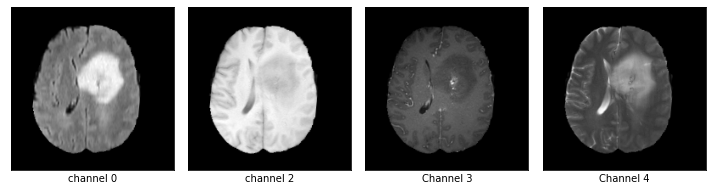

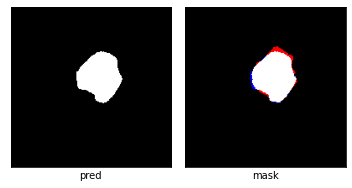

dice_loss : 0.1334210992683359



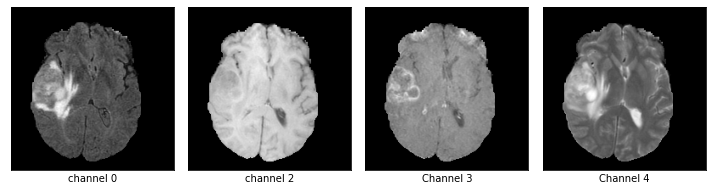

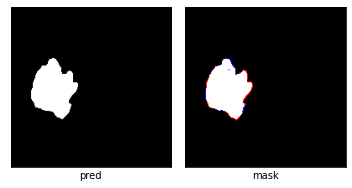

03/06 03:18:21 PM epoch 7 lr 2.317856e-02
03/06 03:18:21 PM genotype = Genotype(normal=[('skip_connect', 0), ('dil_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('skip_connect', 0), ('dil_conv_5x5', 1), ('dil_conv_3x3', 2), ('sep_conv_5x5', 3), ('sep_conv_5x5', 2), ('max_pool_3x3', 3), ('max_pool_3x3', 4)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<42:03,  1.07s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.0845, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<42:12,  1.08s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<41:47,  1.07s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<41:18,  1.05s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<40:49,  1.04s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.5789, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<40:25,  1.03s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<40:21,  1.03s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.1899, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<40:12,  1.03s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.0453, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<40:07,  1.03s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<40:13,  1.03s/it, Acc=0.99, IoU=0.778, Loss=0.123]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<40:23,  1.03s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<39:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<39:57,  1.02s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<39:49,  1.02s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<39:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<39:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<39:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.1545, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<39:05,  1.00s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:19<39:01,  1.00s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:20<39:11,  1.01s/it, Acc=1, IoU=0, Loss=0.000593]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:21<38:53,  1.00it/s, Acc=1, IoU=0, Loss=0.000302]

tensor(0.6007, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:22<38:46,  1.00it/s, Acc=1, IoU=0, Loss=0.000302]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:23<38:58,  1.00s/it, Acc=1, IoU=0, Loss=0.000302]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:24<38:48,  1.00it/s, Acc=1, IoU=0, Loss=0.000302]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:25<39:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000302]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:26<38:33,  1.01it/s, Acc=1, IoU=0, Loss=0.000302]

tensor(0.4174, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:27<38:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000302]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:28<38:37,  1.00it/s, Acc=1, IoU=0, Loss=0.000302]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:29<38:49,  1.00s/it, Acc=1, IoU=0, Loss=0.000302]

tensor(0.6043, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:30<38:56,  1.00s/it, Acc=1, IoU=0, Loss=0.000302]

tensor(0.5207, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:31<39:00,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:32<39:13,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:33<39:15,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:34<39:13,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.1380, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:35<38:57,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:36<38:44,  1.00s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.4181, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:37<38:57,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:38<38:56,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.1696, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:39<39:00,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.4283, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:40<39:08,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0282]

tensor(0.1312, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:41<38:56,  1.01s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:42<39:12,  1.02s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.9697, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:43<39:22,  1.02s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:44<39:22,  1.02s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:45<39:30,  1.03s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:46<39:10,  1.02s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.4979, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:47<39:14,  1.02s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:48<39:20,  1.02s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:49<39:08,  1.02s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:50<38:50,  1.01s/it, Acc=0.994, IoU=0.882, Loss=0.0624]

tensor(0.2875, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:51<39:03,  1.02s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.1492, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:52<39:18,  1.02s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:53<39:15,  1.02s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.5677, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:54<38:46,  1.01s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:55<38:59,  1.02s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:56<39:12,  1.02s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:57<39:21,  1.03s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.1564, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:58<39:10,  1.02s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [00:59<39:05,  1.02s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.0396, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:00<39:11,  1.02s/it, Acc=0.979, IoU=0.787, Loss=0.12]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:01<39:07,  1.02s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:03<39:19,  1.03s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.1435, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:04<39:36,  1.04s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:05<39:35,  1.04s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.1551, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:06<39:11,  1.03s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.2659, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:07<39:10,  1.03s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:08<38:58,  1.02s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.6694, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:09<38:44,  1.02s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.4026, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:10<39:03,  1.03s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:11<39:22,  1.03s/it, Acc=0.994, IoU=0.927, Loss=0.0378]

tensor(0.4465, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:12<39:16,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:13<39:08,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:14<39:09,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.9814, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:15<39:09,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.1045, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:16<38:53,  1.02s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.6639, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:17<39:00,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:18<38:54,  1.02s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.0392, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:19<38:42,  1.02s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:20<38:24,  1.01s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:21<38:24,  1.01s/it, Acc=0.993, IoU=0.915, Loss=0.0458]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:22<38:16,  1.01s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:23<38:34,  1.02s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:24<38:24,  1.01s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.9881, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:25<38:24,  1.01s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:26<38:22,  1.01s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:27<38:15,  1.01s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.3459, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:28<38:22,  1.02s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.6431, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:29<38:10,  1.01s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:30<38:11,  1.01s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:31<38:08,  1.01s/it, Acc=0.99, IoU=0.844, Loss=0.086]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:32<38:21,  1.02s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.0353, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:33<38:35,  1.02s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:34<38:53,  1.03s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:35<39:19,  1.04s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:36<39:18,  1.04s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:37<38:56,  1.03s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:38<38:28,  1.02s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.5304, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:39<38:15,  1.02s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.9666, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:40<38:06,  1.01s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:41<38:13,  1.02s/it, Acc=0.993, IoU=0.916, Loss=0.0452]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:42<38:19,  1.02s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:43<37:57,  1.01s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.9321, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:44<38:10,  1.02s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.2358, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:45<38:12,  1.02s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:46<37:55,  1.01s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:47<37:57,  1.01s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.6127, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:48<37:49,  1.01s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:49<38:00,  1.01s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:50<37:59,  1.01s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:51<37:52,  1.01s/it, Acc=0.991, IoU=0.914, Loss=0.0455]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:53<37:54,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:54<37:40,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:55<37:40,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.1286, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:56<37:37,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.6562, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:57<37:30,  1.00s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:58<37:40,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:59<37:42,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [02:00<37:43,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [02:01<37:37,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:02<37:27,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0498]

tensor(0.1947, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:03<37:41,  1.01s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.8703, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:04<37:37,  1.01s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:05<37:25,  1.01s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.1155, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:06<37:43,  1.01s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:07<37:37,  1.01s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:08<37:36,  1.01s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.1741, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:09<37:40,  1.01s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.8631, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:10<37:51,  1.02s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.7370, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:11<37:39,  1.02s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.2709, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:12<37:52,  1.02s/it, Acc=0.999, IoU=0.877, Loss=0.0669]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:13<37:31,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.8861, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:14<37:36,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.8288, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:15<37:37,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:16<37:54,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:17<37:53,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:18<37:44,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:19<37:30,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.2803, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:20<37:20,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:21<37:26,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.6545, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:22<37:08,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:23<37:11,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.4859, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:24<37:20,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.0332, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:25<37:23,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:26<37:16,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:27<37:13,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:28<37:15,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:29<37:19,  1.01s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.1603, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:30<37:22,  1.02s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.9832, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:31<37:32,  1.02s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.6482, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:32<37:34,  1.02s/it, Acc=0.993, IoU=0.889, Loss=0.0593]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:33<37:26,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.2663, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:34<37:25,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:35<37:27,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.1873, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:36<37:27,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:37<37:28,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.3848, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:38<37:26,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.2399, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:39<38:39,  1.06s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:40<38:12,  1.04s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.1688, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:41<37:48,  1.03s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.7171, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:42<37:21,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0453]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:43<37:09,  1.02s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:44<37:03,  1.01s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:45<37:02,  1.01s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.3436, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:46<37:07,  1.02s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:47<37:17,  1.02s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:48<37:10,  1.02s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.2733, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:49<37:11,  1.02s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:50<37:01,  1.02s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:51<37:10,  1.02s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:53<37:13,  1.02s/it, Acc=0.986, IoU=0.691, Loss=0.183]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:54<36:56,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1262, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:55<37:05,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.4005, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:56<36:54,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:57<36:58,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0037, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:58<36:54,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:59<36:59,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1421, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [03:00<36:44,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.7274, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [03:01<36:50,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.8162, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [03:02<36:44,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1455, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:03<36:39,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.5978, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:04<36:37,  1.01s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:05<36:44,  1.01s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.3388, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:06<36:39,  1.01s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:07<36:59,  1.02s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.4857, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:08<37:04,  1.03s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:09<37:05,  1.03s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.3097, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:10<36:57,  1.02s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:11<37:03,  1.03s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:12<36:59,  1.02s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.9847, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:13<36:43,  1.02s/it, Acc=0.995, IoU=0.629, Loss=0.226]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:14<36:36,  1.01s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:15<36:28,  1.01s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:16<36:30,  1.01s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.9584, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:17<36:13,  1.01s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:18<36:01,  1.00s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.2359, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:19<36:30,  1.01s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:20<36:48,  1.02s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:21<36:45,  1.02s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:22<36:32,  1.02s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.1655, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:23<36:19,  1.01s/it, Acc=0.991, IoU=0.417, Loss=0.412]

tensor(0.9466, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:24<36:13,  1.01s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:25<36:17,  1.01s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.2657, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:26<36:22,  1.01s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:27<36:00,  1.00s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:28<35:49,  1.00it/s, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.9787, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:29<35:59,  1.00s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.1239, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:30<35:51,  1.00s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:31<35:56,  1.00s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:32<36:22,  1.02s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.4723, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:33<36:41,  1.03s/it, Acc=0.993, IoU=0.854, Loss=0.0795]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:34<36:34,  1.02s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.3048, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:35<36:33,  1.02s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.1748, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:36<36:21,  1.02s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.0982, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:37<36:15,  1.02s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.1548, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:38<35:55,  1.01s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.4014, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:39<35:58,  1.01s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:40<36:03,  1.01s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:41<36:18,  1.02s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:42<36:32,  1.03s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.6370, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:43<36:40,  1.03s/it, Acc=0.989, IoU=0.829, Loss=0.0931]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:44<36:17,  1.02s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.2929, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:45<36:12,  1.02s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:46<36:17,  1.02s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.1482, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:47<36:11,  1.02s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:48<35:54,  1.01s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:49<36:05,  1.02s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:50<35:51,  1.01s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:51<36:00,  1.02s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.2642, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:52<35:38,  1.01s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:53<35:51,  1.01s/it, Acc=0.992, IoU=0.736, Loss=0.157]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:54<35:49,  1.01s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:55<35:46,  1.01s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:56<35:22,  1.00s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.5140, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:57<35:30,  1.00s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.2988, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:58<35:24,  1.00s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.2277, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:59<35:22,  1.00s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [04:00<35:13,  1.00it/s, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.3427, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [04:01<35:28,  1.01s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [04:02<35:30,  1.01s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:03<35:43,  1.01s/it, Acc=0.992, IoU=0.914, Loss=0.0477]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:05<35:58,  1.02s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:06<35:59,  1.02s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.9879, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:07<35:49,  1.02s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:08<35:39,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:09<35:38,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.4285, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:10<35:37,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:11<35:19,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:12<35:18,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.1545, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:13<35:25,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:14<35:36,  1.02s/it, Acc=0.991, IoU=0.905, Loss=0.0506]

tensor(0.2466, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:15<35:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:16<35:38,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.3041, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:17<35:45,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.9875, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:18<35:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:19<35:38,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.2804, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:20<35:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:21<35:29,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:22<35:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:23<35:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:24<35:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:25<35:36,  1.02s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.3233, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:26<35:43,  1.02s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:27<35:28,  1.02s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:28<35:22,  1.01s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:29<35:12,  1.01s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.5063, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:30<35:05,  1.01s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.8191, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:31<35:20,  1.02s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:32<35:29,  1.02s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:33<35:26,  1.02s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:34<35:19,  1.02s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:35<35:14,  1.01s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.1906, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:36<35:23,  1.02s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:37<35:21,  1.02s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:38<35:17,  1.02s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:39<35:16,  1.02s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:40<35:16,  1.02s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:41<35:29,  1.02s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.7193, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:42<35:32,  1.03s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.9022, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:43<35:17,  1.02s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:44<35:24,  1.02s/it, Acc=0.997, IoU=0.764, Loss=0.133]

tensor(0.3105, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:45<35:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:46<35:32,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.1108, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:47<35:36,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:48<35:25,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.7096, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:49<35:28,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:50<35:24,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:51<35:35,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.1387, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:52<35:21,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:53<35:35,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.4021, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:54<35:21,  1.03s/it, Acc=1, IoU=0, Loss=0.000882]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:55<35:07,  1.02s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.6674, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:56<35:04,  1.02s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:57<34:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.2083, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:59<35:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [05:00<34:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.7710, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [05:00<34:39,  1.01s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [05:01<34:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.2274, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [05:03<34:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [05:03<34:21,  1.00s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:05<34:21,  1.00s/it, Acc=1, IoU=0, Loss=0.000654]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:06<34:33,  1.01s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:07<34:19,  1.00s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:08<34:34,  1.01s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.5167, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:09<34:46,  1.02s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.0482, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:10<34:43,  1.02s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.1476, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:11<34:51,  1.02s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:12<34:54,  1.02s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:13<35:00,  1.03s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.1596, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:14<35:05,  1.03s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.5743, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:15<35:11,  1.03s/it, Acc=1, IoU=0, Loss=0.93]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:16<35:05,  1.03s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.6147, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:17<34:44,  1.02s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.1823, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:18<34:54,  1.03s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.1048, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:19<34:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.0039, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:20<34:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.4797, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:21<34:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:22<34:22,  1.01s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:23<34:32,  1.02s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.6844, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:24<34:32,  1.02s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:25<34:40,  1.02s/it, Acc=1, IoU=0, Loss=0.00146]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:26<34:54,  1.03s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:27<34:53,  1.03s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:28<34:48,  1.03s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.2641, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:29<34:36,  1.02s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:30<34:21,  1.02s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:31<34:08,  1.01s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.1915, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:32<34:27,  1.02s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:33<34:26,  1.02s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.2391, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:34<34:25,  1.02s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.2478, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:35<34:13,  1.01s/it, Acc=0.997, IoU=0.872, Loss=0.068]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:36<34:06,  1.01s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:37<34:13,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.0390, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:38<34:06,  1.01s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.6344, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:39<34:16,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.1272, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:40<34:09,  1.01s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:41<34:18,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.7378, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:42<34:12,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:43<34:21,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.2629, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:44<34:20,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:45<34:15,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0523]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:46<34:03,  1.01s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.0299, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:47<34:21,  1.02s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.8321, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:48<34:14,  1.02s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:49<34:15,  1.02s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:50<33:59,  1.01s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.5707, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:51<33:37,  1.00s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.2555, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:52<33:23,  1.00it/s, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:53<33:32,  1.00s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.0489, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:54<33:31,  1.00s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:55<33:30,  1.00s/it, Acc=0.998, IoU=0.847, Loss=0.0831]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:56<33:46,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:57<33:59,  1.02s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:58<33:47,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:59<33:54,  1.02s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.6330, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [06:00<33:55,  1.02s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [06:02<34:06,  1.02s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.0463, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [06:03<33:46,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.1541, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [06:04<34:02,  1.02s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [06:05<33:45,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:06<33:44,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0347]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:07<33:40,  1.01s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:08<33:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:09<33:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:10<33:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:11<33:42,  1.02s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.1760, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:12<33:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:13<33:17,  1.00s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:14<33:07,  1.00s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.2491, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:15<33:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:16<33:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000369]

tensor(0.4774, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:17<33:19,  1.01s/it, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.9864, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:18<33:17,  1.01s/it, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:19<33:01,  1.00it/s, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.6135, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:20<33:11,  1.01s/it, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.0691, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:21<33:09,  1.00s/it, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:22<33:11,  1.01s/it, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.6068, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:23<33:08,  1.01s/it, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:24<32:55,  1.00it/s, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.0952, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:25<32:58,  1.00s/it, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:26<33:07,  1.01s/it, Acc=0.987, IoU=0.857, Loss=0.0769]

tensor(0.2587, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:27<33:23,  1.01s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.1105, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:28<33:23,  1.02s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:29<33:29,  1.02s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:30<33:25,  1.02s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:31<33:22,  1.02s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:32<33:38,  1.03s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:33<33:27,  1.02s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.3985, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:34<33:35,  1.02s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:35<33:21,  1.02s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.5582, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:36<33:10,  1.01s/it, Acc=0.988, IoU=0.776, Loss=0.128]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:37<33:10,  1.01s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:38<33:17,  1.02s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:39<33:04,  1.01s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:40<33:15,  1.02s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.1739, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:41<32:48,  1.00s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:42<32:57,  1.01s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.2119, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:43<32:55,  1.01s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:44<33:02,  1.01s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:45<33:00,  1.01s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:46<33:14,  1.02s/it, Acc=0.989, IoU=0.864, Loss=0.0734]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:47<33:01,  1.01s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:48<33:06,  1.02s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.1968, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:49<32:55,  1.01s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:50<33:04,  1.02s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.1315, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:51<32:56,  1.01s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.5353, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:52<32:57,  1.01s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:53<32:52,  1.01s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:54<32:46,  1.01s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:55<32:49,  1.01s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:56<32:45,  1.01s/it, Acc=0.996, IoU=0.682, Loss=0.191]

tensor(0.0369, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:57<32:44,  1.01s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:58<32:59,  1.02s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.0981, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:59<32:59,  1.02s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.0413, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [07:00<32:54,  1.02s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.1744, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [07:01<32:46,  1.01s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [07:02<32:49,  1.02s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [07:03<32:49,  1.02s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.2582, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [07:04<33:02,  1.02s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.2202, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [07:05<32:51,  1.02s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:06<32:48,  1.02s/it, Acc=0.989, IoU=0.849, Loss=0.0831]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:07<32:35,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.1570, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:08<32:38,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.0404, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:09<32:51,  1.02s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.2586, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:10<32:56,  1.02s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:11<32:54,  1.02s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:12<32:56,  1.02s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:13<32:42,  1.02s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.6024, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:14<32:29,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.3022, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:15<32:33,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:17<32:38,  1.02s/it, Acc=0.993, IoU=0.799, Loss=0.113]

tensor(0.3903, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:18<32:29,  1.01s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.3034, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:19<32:36,  1.02s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:20<32:29,  1.01s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:21<32:29,  1.01s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.3349, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:22<32:33,  1.02s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.9006, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:23<32:14,  1.01s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:24<32:05,  1.00s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.9912, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:25<32:10,  1.01s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:26<32:12,  1.01s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:27<32:13,  1.01s/it, Acc=0.979, IoU=0.651, Loss=0.213]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:28<32:08,  1.01s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.6137, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:29<32:25,  1.02s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.8657, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:30<32:16,  1.01s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:31<32:22,  1.02s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:32<32:25,  1.02s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:33<32:13,  1.01s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:34<32:01,  1.01s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.4394, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:35<32:17,  1.02s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:36<32:22,  1.02s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.1731, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:37<32:14,  1.02s/it, Acc=0.995, IoU=0.789, Loss=0.119]

tensor(0.1598, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:38<32:26,  1.02s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:39<32:28,  1.02s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:40<32:24,  1.02s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:41<32:22,  1.02s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:42<32:14,  1.02s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:43<32:00,  1.01s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.6370, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:44<32:04,  1.01s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.2187, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:45<31:57,  1.01s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.2829, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:46<32:12,  1.02s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.3072, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:47<32:09,  1.02s/it, Acc=0.987, IoU=0.734, Loss=0.153]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:48<31:53,  1.01s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.9059, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:49<31:56,  1.01s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.0458, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:50<31:58,  1.01s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:51<32:02,  1.02s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:52<32:13,  1.02s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:53<32:00,  1.02s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.7517, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:54<31:49,  1.01s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:55<31:58,  1.02s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.1767, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:56<31:59,  1.02s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.4163, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:57<31:53,  1.02s/it, Acc=0.964, IoU=0.231, Loss=0.625]

tensor(0.2149, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:58<31:46,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.5308, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:59<31:46,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.0389, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [08:00<31:46,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [08:01<31:32,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.2869, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [08:02<31:50,  1.02s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [08:03<31:46,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.0292, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [08:04<31:43,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [08:05<31:28,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.4458, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [08:06<31:24,  1.00s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.8148, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [08:07<31:43,  1.02s/it, Acc=0.993, IoU=0.92, Loss=0.0427]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:08<31:52,  1.02s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:09<31:48,  1.02s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:10<31:45,  1.02s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:11<31:42,  1.02s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.0278, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:12<31:43,  1.02s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.2892, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:13<31:39,  1.02s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:14<31:27,  1.01s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:15<31:16,  1.01s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.6938, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:16<31:27,  1.01s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.5298, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:17<31:25,  1.01s/it, Acc=0.989, IoU=0.713, Loss=0.168]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:18<31:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.4029, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:19<31:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.0826, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:20<31:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:21<31:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:22<31:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.0243, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:23<31:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:24<31:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:25<31:11,  1.01s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:26<31:05,  1.01s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.3015, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:27<31:11,  1.01s/it, Acc=1, IoU=0, Loss=0.000664]

tensor(0.3797, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:28<31:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:29<31:17,  1.01s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:30<31:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:31<31:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:32<31:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:34<31:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.8500, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:35<30:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:35<30:47,  1.00s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:36<30:45,  1.00it/s, Acc=1, IoU=0, Loss=0.00164]

tensor(0.3727, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:38<30:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00164]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:39<30:54,  1.01s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:40<31:09,  1.01s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:41<31:09,  1.01s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:42<30:54,  1.01s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:43<30:39,  1.00it/s, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:44<30:46,  1.00s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.9349, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:45<30:49,  1.01s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:46<30:59,  1.01s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.9530, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:47<30:39,  1.00s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.5985, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:48<30:50,  1.01s/it, Acc=0.996, IoU=0.809, Loss=0.104]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:49<31:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:50<31:19,  1.03s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1534, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:51<31:04,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:52<31:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1472, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:53<30:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.7965, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:54<30:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:55<30:57,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1374, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:56<30:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.7273, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:57<30:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:58<30:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:59<30:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [09:00<30:43,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.2941, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [09:01<30:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.4754, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [09:02<30:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.2392, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [09:03<30:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [09:04<30:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [09:05<30:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [09:06<30:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [09:07<30:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [09:08<30:45,  1.02s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.5364, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:09<30:42,  1.02s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.8774, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:10<30:29,  1.01s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.5071, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:11<30:41,  1.02s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:12<30:47,  1.02s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.3223, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:13<30:42,  1.02s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:14<30:34,  1.01s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:15<30:46,  1.02s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0975, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:16<30:25,  1.01s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1383, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:17<30:19,  1.01s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.6557, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:18<30:23,  1.01s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:19<30:17,  1.01s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:20<30:28,  1.01s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:21<30:37,  1.02s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.1680, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:22<30:22,  1.01s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.0359, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:23<30:36,  1.02s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:24<30:32,  1.02s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:25<30:15,  1.01s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:26<30:25,  1.02s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.7932, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:27<30:25,  1.02s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:28<30:17,  1.01s/it, Acc=0.986, IoU=0.8, Loss=0.111]

tensor(0.2237, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:29<30:21,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.1477, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:30<30:42,  1.03s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.1416, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:31<30:36,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.1673, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:32<30:30,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:33<30:18,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:34<30:14,  1.01s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.6964, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:35<30:16,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:36<30:15,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.2996, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:37<30:15,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:38<30:22,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0375]

tensor(0.3822, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:39<30:01,  1.01s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.0298, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:40<30:09,  1.01s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:41<29:57,  1.01s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.4365, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:42<30:05,  1.01s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:43<30:21,  1.02s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.1496, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:44<30:31,  1.03s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:46<30:35,  1.03s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:47<30:30,  1.03s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.1407, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:48<30:34,  1.03s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:49<30:15,  1.02s/it, Acc=0.992, IoU=0.847, Loss=0.0832]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:50<30:19,  1.03s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:51<30:15,  1.02s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:52<30:18,  1.03s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.3951, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:53<30:28,  1.03s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.5295, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:54<30:22,  1.03s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.1975, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:55<30:31,  1.04s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.8882, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:56<30:17,  1.03s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.5403, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:57<30:13,  1.03s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:58<30:15,  1.03s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:59<30:19,  1.03s/it, Acc=0.99, IoU=0.823, Loss=0.0977]

tensor(0.3499, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [10:00<30:14,  1.03s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [10:01<30:26,  1.04s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [10:02<30:27,  1.04s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [10:03<30:28,  1.04s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [10:04<30:10,  1.03s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [10:05<30:05,  1.03s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [10:06<29:59,  1.02s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [10:07<29:50,  1.02s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.1598, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [10:08<29:42,  1.01s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.2357, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:09<29:39,  1.01s/it, Acc=0.992, IoU=0.865, Loss=0.0729]

tensor(0.1891, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:10<29:44,  1.02s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.2738, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:11<29:48,  1.02s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.1528, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:12<29:43,  1.02s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.9883, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:13<29:28,  1.01s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:14<29:27,  1.01s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.4364, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:15<29:18,  1.01s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.8631, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:16<29:34,  1.01s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:17<29:45,  1.02s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.9872, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:18<29:52,  1.03s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.0249, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:19<29:57,  1.03s/it, Acc=0.997, IoU=0.949, Loss=0.026]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:20<30:02,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:21<30:03,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1154, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:22<30:09,  1.04s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:23<29:53,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:24<29:27,  1.02s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:25<29:31,  1.02s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:26<29:30,  1.02s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:27<29:22,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:29<29:30,  1.02s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.2679, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:30<29:28,  1.02s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9881, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:31<29:16,  1.01s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:32<29:24,  1.02s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.0360, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:33<29:30,  1.02s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:34<29:30,  1.02s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.2583, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:35<29:19,  1.02s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:36<29:21,  1.02s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:37<29:14,  1.02s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:38<28:55,  1.00s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:39<29:02,  1.01s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.3271, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:40<29:03,  1.01s/it, Acc=0.992, IoU=0.844, Loss=0.0847]

tensor(0.1663, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:41<29:02,  1.01s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:42<28:55,  1.01s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:43<28:58,  1.01s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:44<28:50,  1.01s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.2548, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:45<28:47,  1.00s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:46<29:01,  1.01s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.8723, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:47<29:03,  1.01s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:48<29:03,  1.02s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.0979, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:49<28:49,  1.01s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.3596, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:50<28:56,  1.01s/it, Acc=0.979, IoU=0.799, Loss=0.112]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:51<28:49,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:52<28:52,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.6790, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:53<28:56,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:54<28:49,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:55<28:57,  1.02s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:56<28:41,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:57<28:41,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:58<28:36,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:59<28:42,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.1082, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [11:00<28:40,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.057]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [11:01<28:56,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [11:02<29:12,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0450, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [11:03<29:01,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [11:04<28:46,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [11:05<28:39,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [11:06<28:46,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [11:07<28:52,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [11:08<28:35,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [11:09<28:20,  1.00s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:10<28:14,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1916, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:11<29:05,  1.03s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:12<29:02,  1.03s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.3218, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:13<28:41,  1.02s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:14<28:33,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:15<28:27,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:16<28:16,  1.00s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:17<28:19,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:18<28:00,  1.00it/s, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.4717, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:19<28:02,  1.00it/s, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.8864, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:20<27:57,  1.00it/s, Acc=0.993, IoU=0.902, Loss=0.0518]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:21<28:03,  1.00it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.2586, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:22<28:07,  1.00s/it, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:23<27:56,  1.00it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:24<27:54,  1.00it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:25<28:00,  1.00s/it, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.9636, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:26<28:02,  1.00s/it, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:27<27:51,  1.00it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:28<27:56,  1.00it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.1706, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:29<28:12,  1.01s/it, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:30<28:09,  1.01s/it, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.8843, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:31<27:58,  1.00s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.5525, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:32<28:16,  1.01s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:33<28:00,  1.00s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.9700, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:34<28:05,  1.01s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.1803, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:35<28:05,  1.01s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:36<27:59,  1.01s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.9813, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:37<27:59,  1.01s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:38<28:05,  1.01s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.0503, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:39<28:03,  1.01s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:40<28:07,  1.01s/it, Acc=0.994, IoU=0.834, Loss=0.0919]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:41<28:01,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.1667, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:42<28:07,  1.02s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.4612, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:43<28:05,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.1607, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:44<28:02,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:45<27:59,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:46<28:09,  1.02s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.4781, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:47<28:02,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.1121, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:48<27:58,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.0330, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:49<27:53,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.3111, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:50<27:52,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.047]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:51<28:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:52<28:09,  1.02s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:53<27:59,  1.02s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.0482, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:54<27:58,  1.02s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:55<27:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:56<27:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:57<27:44,  1.01s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:58<27:43,  1.01s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.1192, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:59<27:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.2088, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [12:01<27:53,  1.02s/it, Acc=1, IoU=0, Loss=0.00249]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [12:02<27:41,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [12:03<27:36,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.1717, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [12:04<27:31,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.2160, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [12:05<27:26,  1.00s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [12:06<27:25,  1.00s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.0388, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [12:07<27:22,  1.00s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.7034, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [12:08<27:21,  1.00s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.1297, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [12:09<27:22,  1.00s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [12:10<27:41,  1.02s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.9892, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:11<27:32,  1.01s/it, Acc=0.996, IoU=0.845, Loss=0.0845]

tensor(0.1797, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:12<27:47,  1.02s/it, Acc=1, IoU=0, Loss=0.735]

tensor(0.8358, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:13<27:38,  1.02s/it, Acc=1, IoU=0, Loss=0.735]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:14<27:47,  1.02s/it, Acc=1, IoU=0, Loss=0.735]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:15<27:28,  1.01s/it, Acc=1, IoU=0, Loss=0.735]

tensor(0.9189, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:16<27:21,  1.01s/it, Acc=1, IoU=0, Loss=0.735]

tensor(0.5329, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:17<27:11,  1.00s/it, Acc=1, IoU=0, Loss=0.735]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:18<27:05,  1.00it/s, Acc=1, IoU=0, Loss=0.735]

tensor(0.4570, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:19<27:01,  1.00it/s, Acc=1, IoU=0, Loss=0.735]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:20<27:03,  1.00it/s, Acc=1, IoU=0, Loss=0.735]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:21<27:09,  1.00s/it, Acc=1, IoU=0, Loss=0.735]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:22<27:13,  1.01s/it, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:23<27:14,  1.01s/it, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.1657, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:24<27:04,  1.00s/it, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.1461, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:25<27:06,  1.00s/it, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:26<26:56,  1.00it/s, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.1376, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:27<26:48,  1.01it/s, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:28<26:54,  1.00it/s, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:29<26:55,  1.00it/s, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:30<27:04,  1.01s/it, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.9707, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:31<27:09,  1.01s/it, Acc=0.993, IoU=0.774, Loss=0.127]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:32<27:03,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:33<26:57,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:34<26:59,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:35<27:04,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1982, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:36<27:07,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.2111, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:37<27:05,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.4496, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:38<26:55,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:39<26:46,  1.00it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:40<26:46,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:41<26:55,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:42<26:49,  1.00s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:43<26:49,  1.00s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.9871, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:44<26:51,  1.01s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.5634, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:45<26:49,  1.01s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:46<26:52,  1.01s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.7416, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:47<26:51,  1.01s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.0445, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:48<26:57,  1.01s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:49<26:52,  1.01s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.0361, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:50<27:00,  1.02s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:51<27:00,  1.02s/it, Acc=0.986, IoU=0.733, Loss=0.154]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:52<26:42,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:53<26:49,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.7307, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:54<26:56,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4238, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:55<26:53,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.3450, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:56<26:32,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.5305, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:57<26:24,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1703, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:58<26:15,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:59<26:25,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [13:00<26:19,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [13:01<26:25,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [13:02<26:18,  1.00it/s, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [13:03<26:33,  1.01s/it, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [13:04<26:37,  1.01s/it, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.1666, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [13:05<26:19,  1.00it/s, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.2579, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [13:06<26:44,  1.02s/it, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [13:07<27:08,  1.03s/it, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.4372, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [13:08<26:56,  1.02s/it, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [13:09<26:55,  1.02s/it, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [13:10<26:45,  1.02s/it, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:11<26:41,  1.02s/it, Acc=0.937, IoU=0.0143, Loss=0.971]

tensor(0.1354, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:12<26:36,  1.01s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.3148, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:13<26:26,  1.01s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:14<26:44,  1.02s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.9413, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:15<26:41,  1.02s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.5346, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:16<26:47,  1.02s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.8416, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:17<26:40,  1.02s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.5048, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:18<26:16,  1.01s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.0404, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:19<26:22,  1.01s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.6414, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:20<26:23,  1.01s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:21<26:15,  1.01s/it, Acc=0.974, IoU=0.058, Loss=0.89]

tensor(0.5277, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:22<26:07,  1.00s/it, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:23<26:00,  1.00it/s, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.9800, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:24<26:22,  1.01s/it, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:25<26:12,  1.01s/it, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.6954, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:26<25:53,  1.00it/s, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.9890, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:27<26:00,  1.00s/it, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:28<25:58,  1.00s/it, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.9553, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:29<25:51,  1.00it/s, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:30<25:54,  1.00it/s, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.1279, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:31<25:40,  1.01it/s, Acc=0.987, IoU=0.829, Loss=0.0921]

tensor(0.1440, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:32<26:01,  1.00s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.5500, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:33<26:14,  1.01s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.9184, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:34<26:11,  1.01s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.6850, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:35<26:01,  1.01s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.2977, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:36<25:48,  1.00it/s, Acc=1, IoU=0, Loss=0.115]

tensor(0.0466, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:37<25:55,  1.00s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:38<26:00,  1.01s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:39<26:07,  1.01s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.9200, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:40<25:53,  1.00s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.7913, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:41<26:06,  1.01s/it, Acc=1, IoU=0, Loss=0.115]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:42<25:59,  1.01s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:43<26:00,  1.01s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:44<26:00,  1.01s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:45<25:57,  1.01s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:46<26:04,  1.02s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:47<26:14,  1.02s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:48<26:12,  1.02s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.1818, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:49<26:02,  1.02s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:50<26:10,  1.02s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:51<26:00,  1.02s/it, Acc=0.997, IoU=0.61, Loss=0.241]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:52<25:49,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:53<26:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:54<25:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:55<25:49,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.9483, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:56<25:36,  1.00s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:57<25:28,  1.00it/s, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:58<25:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:59<25:38,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [14:00<25:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [14:01<25:38,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.8494, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [14:02<25:45,  1.01s/it, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [14:03<25:45,  1.01s/it, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.2019, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [14:04<25:37,  1.01s/it, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.4540, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [14:05<25:27,  1.00s/it, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [14:06<25:06,  1.01it/s, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.1306, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [14:07<25:00,  1.01it/s, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [14:08<25:02,  1.01it/s, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:09<25:17,  1.00s/it, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.1670, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:10<25:18,  1.00s/it, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.1989, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:11<25:24,  1.01s/it, Acc=0.98, IoU=0.475, Loss=0.355]

tensor(0.1439, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:13<25:57,  1.03s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.2004, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:14<26:07,  1.04s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:15<25:56,  1.03s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:16<25:52,  1.03s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:17<26:00,  1.03s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:18<26:06,  1.04s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.9673, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:19<25:54,  1.03s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.0436, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:20<25:59,  1.03s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.1447, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:21<25:54,  1.03s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:22<25:41,  1.02s/it, Acc=0.98, IoU=0.189, Loss=0.684]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:23<25:35,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.2447, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:24<25:49,  1.03s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:25<25:28,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:26<25:15,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:27<25:00,  1.00s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:28<24:49,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.6924, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:29<25:01,  1.00s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1536, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:30<25:02,  1.00s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0387, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:31<25:15,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.7881, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:32<25:22,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:33<25:28,  1.02s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.1665, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:34<25:25,  1.02s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:35<25:26,  1.02s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:36<25:22,  1.02s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.3623, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:37<25:13,  1.02s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:38<25:07,  1.01s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:39<24:58,  1.01s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:40<24:52,  1.00s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:41<24:56,  1.01s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:42<24:54,  1.01s/it, Acc=0.976, IoU=0.297, Loss=0.543]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:43<25:03,  1.01s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:44<25:10,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.5974, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:45<25:10,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:46<25:11,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:47<25:13,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:48<25:07,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:49<25:14,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:50<25:13,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:51<25:11,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.5863, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:52<25:11,  1.02s/it, Acc=0.995, IoU=0.849, Loss=0.0846]

tensor(0.7425, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:53<25:11,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9688, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:54<24:57,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3152, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:55<24:44,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9852, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:56<24:53,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2618, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:57<24:45,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3236, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:58<24:28,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2401, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:59<24:30,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [15:00<24:26,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.6902, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [15:01<24:28,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.6357, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [15:02<24:32,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [15:03<25:11,  1.03s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [15:04<25:11,  1.03s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [15:06<25:18,  1.04s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [15:07<25:01,  1.03s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.4295, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [15:08<24:50,  1.02s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [15:09<24:50,  1.02s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.5502, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [15:10<24:41,  1.02s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:11<24:40,  1.02s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.1407, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:12<24:32,  1.01s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:13<24:48,  1.02s/it, Acc=0.993, IoU=0.853, Loss=0.08]

tensor(0.5360, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:14<25:01,  1.03s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.1426, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:15<24:45,  1.02s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:16<24:39,  1.02s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.5919, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:17<24:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:18<24:40,  1.02s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.9834, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:19<24:45,  1.03s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.2301, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:20<24:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:21<24:25,  1.01s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:22<24:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:23<24:25,  1.01s/it, Acc=1, IoU=0, Loss=0.000644]

tensor(0.0060, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:24<24:21,  1.01s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:25<24:12,  1.01s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:26<24:21,  1.01s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.6829, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:27<24:19,  1.01s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:28<24:15,  1.01s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.0195, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:29<24:12,  1.01s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:30<24:15,  1.01s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.5262, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:31<24:02,  1.00s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:32<24:08,  1.01s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.1606, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:33<24:01,  1.00s/it, Acc=0.986, IoU=0.867, Loss=0.0728]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:34<24:02,  1.01s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.5484, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:35<24:05,  1.01s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:36<24:03,  1.01s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.9831, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:37<24:11,  1.01s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:38<24:11,  1.01s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:39<23:56,  1.01s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:40<23:53,  1.00s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:41<23:57,  1.01s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.2390, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:42<23:52,  1.00s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.4167, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:43<23:45,  1.00s/it, Acc=0.994, IoU=0.776, Loss=0.129]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:44<23:50,  1.00s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:45<23:47,  1.00s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.9847, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:46<23:49,  1.01s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:47<23:47,  1.00s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.7828, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:48<23:51,  1.01s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.1330, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:49<24:00,  1.01s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.0900, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:50<24:08,  1.02s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:51<24:05,  1.02s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.5828, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:52<23:55,  1.01s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.1639, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:53<23:47,  1.01s/it, Acc=0.998, IoU=0.939, Loss=0.0312]

tensor(0.4679, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:54<23:39,  1.00s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.6661, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:55<23:44,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:56<23:41,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:57<23:47,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.1074, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:58<24:01,  1.02s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:59<24:03,  1.02s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [16:00<24:10,  1.03s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.9805, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [16:01<24:09,  1.03s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [16:02<23:59,  1.02s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [16:03<23:52,  1.02s/it, Acc=0.993, IoU=0.914, Loss=0.0467]

tensor(0.2729, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [16:04<23:44,  1.01s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [16:05<23:47,  1.02s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [16:06<23:43,  1.02s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.2440, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [16:07<23:40,  1.01s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [16:08<23:40,  1.01s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.8071, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [16:09<23:46,  1.02s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.7128, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [16:10<23:41,  1.02s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.3635, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:11<23:36,  1.01s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:12<23:43,  1.02s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.7840, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:13<23:32,  1.01s/it, Acc=0.992, IoU=0.876, Loss=0.0657]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:14<23:37,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.7264, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:15<23:40,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.2227, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:16<23:41,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1070, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:17<23:40,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:18<23:36,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.6276, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:19<23:25,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:20<23:20,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9389, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:21<23:05,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1939, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:22<23:09,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:24<23:15,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.3468, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:25<23:21,  1.01s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.4165, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:26<23:28,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:27<23:28,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:28<23:29,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.1743, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:29<23:33,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:30<23:36,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.5685, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:31<23:24,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:32<23:34,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.9592, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:33<23:25,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.1458, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:34<23:10,  1.01s/it, Acc=0.99, IoU=0.882, Loss=0.0635]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:35<22:59,  1.00s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:36<23:05,  1.01s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.3824, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:37<23:00,  1.01s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:38<23:04,  1.01s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:39<23:02,  1.01s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:40<23:07,  1.01s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:41<23:08,  1.01s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:42<23:27,  1.03s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:43<23:19,  1.02s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.6470, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:44<23:12,  1.02s/it, Acc=0.987, IoU=0.473, Loss=0.356]

tensor(0.4253, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:45<23:00,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:46<22:54,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:47<23:07,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:48<23:00,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9601, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:49<22:47,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:50<22:41,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:51<22:44,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:52<22:40,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:53<22:36,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:54<22:30,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0482, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:55<22:36,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:56<22:45,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.5298, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:57<22:45,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1165, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:58<22:37,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:59<22:42,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [17:00<22:39,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [17:01<22:49,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.6347, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [17:02<22:42,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [17:03<22:44,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9902, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [17:04<22:49,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.5372, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [17:05<22:42,  1.01s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.9865, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [17:06<22:37,  1.01s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [17:07<22:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [17:08<22:52,  1.02s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.0344, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [17:09<22:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [17:10<22:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.9874, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [17:11<22:41,  1.02s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:12<22:37,  1.02s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:13<22:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.9763, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:14<22:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00181]

tensor(0.1673, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:15<22:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:16<22:35,  1.02s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.7152, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:17<22:43,  1.02s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:18<22:50,  1.03s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.9482, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:19<22:52,  1.03s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:20<22:47,  1.03s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:21<22:31,  1.02s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.6244, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:22<22:22,  1.01s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:23<22:13,  1.01s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.1543, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:24<22:09,  1.00s/it, Acc=1, IoU=0, Loss=0.00106]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:25<22:07,  1.00s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.1556, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:26<22:08,  1.00s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:27<22:17,  1.01s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:28<22:13,  1.01s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.9390, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:29<22:10,  1.01s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:30<22:13,  1.01s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:31<22:15,  1.01s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:32<22:16,  1.01s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:33<22:12,  1.01s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.3048, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:34<22:04,  1.01s/it, Acc=1, IoU=0, Loss=0.948]

tensor(0.0291, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:35<22:07,  1.01s/it, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.3823, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:36<22:05,  1.01s/it, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:37<21:48,  1.00it/s, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:38<21:53,  1.00s/it, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:39<21:43,  1.01it/s, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:40<21:56,  1.01s/it, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.7413, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:41<21:54,  1.01s/it, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:42<22:01,  1.01s/it, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.1068, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:44<22:06,  1.02s/it, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:45<22:03,  1.01s/it, Acc=0.996, IoU=0.408, Loss=0.421]

tensor(0.1414, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:46<22:04,  1.02s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:47<22:12,  1.02s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.7558, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:48<22:13,  1.02s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:49<22:08,  1.02s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:50<22:06,  1.02s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.4101, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:51<22:01,  1.02s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:52<22:05,  1.02s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:53<21:52,  1.01s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:54<21:43,  1.01s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.9333, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:55<21:47,  1.01s/it, Acc=0.994, IoU=0.852, Loss=0.0813]

tensor(0.2300, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:56<21:47,  1.01s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:57<21:46,  1.01s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:58<21:38,  1.01s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:59<21:36,  1.00s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [18:00<21:35,  1.00s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [18:01<21:28,  1.00it/s, Acc=1, IoU=0, Loss=0.0233]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [18:02<21:39,  1.01s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [18:03<21:36,  1.01s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [18:04<21:35,  1.01s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.9708, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [18:05<21:36,  1.01s/it, Acc=1, IoU=0, Loss=0.0233]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [18:06<21:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [18:07<21:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.3173, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [18:08<21:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.1070, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [18:09<21:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.1842, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [18:10<21:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.3358, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [18:11<21:38,  1.02s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [18:12<21:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:13<21:46,  1.02s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:14<21:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:15<21:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000466]

tensor(0.1530, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:16<21:31,  1.01s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:17<21:31,  1.01s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:18<21:30,  1.01s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.6896, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:19<21:28,  1.01s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.0383, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:20<21:15,  1.00s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:21<21:09,  1.00s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:22<21:18,  1.01s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.0396, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:23<21:17,  1.01s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.1637, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:24<21:08,  1.00s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:25<21:14,  1.01s/it, Acc=0.989, IoU=0.168, Loss=0.718]

tensor(0.6988, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:26<21:04,  1.00s/it, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:27<20:55,  1.01it/s, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.1356, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:28<20:50,  1.01it/s, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.5533, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:29<20:56,  1.00it/s, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:30<20:51,  1.01it/s, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:31<20:56,  1.00it/s, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:32<20:56,  1.00it/s, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:33<20:57,  1.00s/it, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:34<21:04,  1.01s/it, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:35<21:01,  1.01s/it, Acc=0.996, IoU=0.958, Loss=0.0248]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:36<21:00,  1.00s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.5548, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:37<21:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.1350, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:38<21:16,  1.02s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:39<21:11,  1.02s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:40<21:02,  1.01s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:41<21:02,  1.01s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:42<21:00,  1.01s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.9331, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:43<21:01,  1.01s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:44<21:13,  1.02s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.1924, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:45<21:19,  1.03s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:46<21:10,  1.02s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.0987, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:47<21:12,  1.02s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:48<20:56,  1.01s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:49<20:56,  1.01s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.0077, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:50<20:51,  1.01s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:51<20:43,  1.00s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.6223, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:52<20:47,  1.01s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:53<20:40,  1.00s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:54<20:39,  1.00s/it, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.2530, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:55<20:31,  1.00it/s, Acc=0.987, IoU=0.805, Loss=0.11]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:56<20:32,  1.00it/s, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:57<20:37,  1.00s/it, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:58<20:32,  1.00s/it, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:59<20:21,  1.01it/s, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.4374, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [19:00<20:36,  1.01s/it, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.7777, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [19:01<20:49,  1.02s/it, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [19:02<20:47,  1.02s/it, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.9740, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [19:03<20:48,  1.02s/it, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.8146, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [19:04<20:38,  1.01s/it, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [19:05<20:35,  1.01s/it, Acc=0.996, IoU=0.701, Loss=0.176]

tensor(0.9655, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [19:06<20:34,  1.01s/it, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.6215, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [19:07<20:33,  1.01s/it, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [19:08<20:29,  1.01s/it, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [19:09<20:31,  1.01s/it, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [19:10<20:19,  1.00it/s, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.0377, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [19:11<20:22,  1.00s/it, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:12<20:23,  1.00s/it, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.1229, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:13<20:31,  1.01s/it, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:14<20:23,  1.01s/it, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.4482, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:15<20:12,  1.00it/s, Acc=0.988, IoU=0.862, Loss=0.074]

tensor(0.3100, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:16<20:07,  1.01it/s, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:17<20:16,  1.00s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:18<20:29,  1.01s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:19<20:32,  1.02s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.0389, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:20<20:27,  1.01s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.5662, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:21<20:32,  1.02s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:22<20:22,  1.01s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.3417, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:23<20:29,  1.02s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:24<20:22,  1.01s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:25<20:15,  1.01s/it, Acc=0.996, IoU=0.892, Loss=0.0576]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:26<20:25,  1.02s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:27<20:22,  1.02s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:28<20:15,  1.01s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0415, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:30<20:26,  1.02s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.2211, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:31<20:24,  1.02s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:32<20:24,  1.02s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:33<20:11,  1.01s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.2041, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:34<19:59,  1.00s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.2851, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:35<19:52,  1.00it/s, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:36<20:07,  1.01s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:37<20:03,  1.01s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.1565, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:38<20:03,  1.01s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:39<19:57,  1.00s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:40<20:05,  1.01s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.1655, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:41<20:32,  1.04s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.1239, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:42<20:21,  1.03s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:43<20:19,  1.03s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.2086, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:44<20:09,  1.02s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:45<20:14,  1.02s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:46<19:57,  1.01s/it, Acc=0.997, IoU=0.906, Loss=0.0497]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:47<20:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.5440, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:48<19:56,  1.01s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:49<19:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:50<19:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:51<19:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.1747, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:52<19:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:53<19:37,  1.00it/s, Acc=1, IoU=0, Loss=0.000875]

tensor(0.9561, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:54<19:38,  1.00s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:55<19:40,  1.00s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.0076, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:56<19:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000875]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:57<19:50,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.9714, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:58<19:47,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.2189, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:59<19:45,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [20:00<19:45,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [20:01<19:39,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [20:02<19:36,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [20:03<19:28,  1.00s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.8381, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [20:04<19:39,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [20:05<19:35,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.7505, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [20:06<19:33,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.0473]

tensor(0.2572, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [20:07<19:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.1723, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [20:08<19:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.3024, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [20:09<19:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [20:10<19:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [20:11<19:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [20:12<19:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:13<19:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:14<19:53,  1.03s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.1376, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:15<19:54,  1.03s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:16<19:48,  1.03s/it, Acc=1, IoU=0, Loss=0.000688]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:17<19:45,  1.03s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.1309, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:18<19:52,  1.03s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:19<19:40,  1.02s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.7986, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:20<19:37,  1.02s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.4952, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:21<19:48,  1.03s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.2563, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:22<19:44,  1.03s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:23<19:53,  1.04s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.0374, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:24<19:45,  1.03s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:25<19:40,  1.03s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:26<19:28,  1.02s/it, Acc=0.993, IoU=0.88, Loss=0.0636]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:27<19:28,  1.02s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.0437, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:28<19:30,  1.02s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:29<19:27,  1.02s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:30<19:15,  1.01s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.9417, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:31<19:18,  1.02s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:32<19:23,  1.02s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:34<19:18,  1.02s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.9804, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:35<19:12,  1.01s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:36<19:10,  1.01s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:37<19:02,  1.01s/it, Acc=0.996, IoU=0.852, Loss=0.0807]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:38<19:03,  1.01s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.4369, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:39<19:03,  1.01s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:40<18:55,  1.00s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:41<18:54,  1.00s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:42<18:58,  1.01s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:43<19:01,  1.01s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:44<18:59,  1.01s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.6852, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:45<19:06,  1.02s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:46<18:59,  1.01s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:47<19:03,  1.02s/it, Acc=0.994, IoU=0.922, Loss=0.0411]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:48<19:04,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:49<18:57,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.5017, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:50<18:55,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3519, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:51<18:56,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:52<18:57,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:53<19:00,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3167, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:54<18:59,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:55<18:55,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.7622, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:56<19:03,  1.03s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:57<19:06,  1.03s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:58<19:09,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:59<18:57,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [21:00<18:48,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0490, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [21:01<18:49,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [21:02<18:48,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.5561, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [21:03<18:47,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1241, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [21:04<18:39,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [21:05<18:33,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [21:06<18:42,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [21:07<18:43,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [21:08<18:36,  1.01s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [21:09<18:37,  1.01s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [21:10<18:38,  1.02s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.9059, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [21:11<18:39,  1.02s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.2867, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [21:12<18:36,  1.01s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [21:13<18:34,  1.01s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [21:14<18:24,  1.01s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.1484, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:15<18:20,  1.00s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:16<18:13,  1.00it/s, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:17<18:16,  1.00s/it, Acc=0.984, IoU=0.675, Loss=0.194]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:18<18:20,  1.01s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:19<18:30,  1.02s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.6715, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:20<18:26,  1.01s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.0510, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:21<18:29,  1.02s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:22<18:23,  1.01s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:23<18:21,  1.01s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:24<18:20,  1.01s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:25<18:24,  1.02s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:26<18:14,  1.01s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:27<18:15,  1.01s/it, Acc=0.985, IoU=0.778, Loss=0.126]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:28<18:18,  1.01s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:29<18:19,  1.01s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.5308, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:30<18:20,  1.02s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:31<18:15,  1.01s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:32<18:16,  1.01s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.3956, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:33<18:10,  1.01s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.2191, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:34<18:03,  1.00s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:35<18:07,  1.01s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:36<18:07,  1.01s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:37<18:05,  1.01s/it, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:38<17:59,  1.00s/it, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:39<17:56,  1.00s/it, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.2838, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:40<18:01,  1.01s/it, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:41<18:00,  1.01s/it, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:42<17:49,  1.00it/s, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:43<17:48,  1.00it/s, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:44<17:50,  1.00s/it, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:45<17:51,  1.00s/it, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:46<17:50,  1.00s/it, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:47<18:04,  1.02s/it, Acc=0.997, IoU=0.891, Loss=0.0575]

tensor(0.5796, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:48<18:03,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1986, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:49<17:59,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:50<17:51,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:51<17:46,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.3825, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:52<17:47,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.4346, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:53<17:44,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0449, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:54<17:51,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1958, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:55<17:52,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:56<17:56,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.2714, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:58<17:55,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:58<17:46,  1.01s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [22:00<17:56,  1.02s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [22:01<18:01,  1.03s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.1908, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [22:02<17:53,  1.02s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [22:03<17:54,  1.02s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.1210, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [22:04<17:50,  1.02s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.6165, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [22:05<17:56,  1.03s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.1289, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [22:06<17:50,  1.02s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [22:07<17:50,  1.02s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [22:08<17:39,  1.01s/it, Acc=0.993, IoU=0.908, Loss=0.0489]

tensor(0.1489, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [22:09<17:31,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.4112, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [22:10<17:39,  1.02s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1261, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [22:11<17:40,  1.02s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [22:12<17:34,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [22:13<17:26,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.4824, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [22:14<17:29,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [22:15<17:34,  1.02s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [22:16<17:24,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:17<17:25,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:18<17:27,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:19<17:22,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.4140, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:20<17:17,  1.00s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:21<17:21,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:22<17:27,  1.02s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.4890, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:23<17:23,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.4307, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:24<17:22,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:25<17:24,  1.02s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.8882, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:26<17:18,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:27<17:10,  1.00s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.5331, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:28<17:10,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0635]

tensor(0.6201, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:29<17:18,  1.01s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:30<17:11,  1.01s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:31<17:15,  1.01s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.2362, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:32<17:21,  1.02s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.7659, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:33<17:17,  1.02s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.5805, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:34<17:09,  1.01s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:35<17:08,  1.01s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:36<17:13,  1.02s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.1434, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:37<17:03,  1.01s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:38<17:08,  1.01s/it, Acc=0.991, IoU=0.831, Loss=0.0914]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:39<17:08,  1.01s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:40<17:07,  1.01s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:41<16:59,  1.01s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.6716, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:42<17:00,  1.01s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.6683, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:43<17:02,  1.01s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:44<17:10,  1.02s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:45<17:11,  1.02s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:46<17:14,  1.03s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.1463, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:47<17:21,  1.03s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:48<17:14,  1.03s/it, Acc=0.994, IoU=0.805, Loss=0.111]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:49<17:07,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:50<17:03,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:51<17:04,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:52<17:03,  1.02s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.1284, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:53<16:53,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:54<16:50,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.1354, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:55<16:50,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:56<16:43,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.1374, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:57<16:44,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.4826, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:58<16:47,  1.01s/it, Acc=0.998, IoU=0.841, Loss=0.0848]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:59<16:47,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.4960, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [23:00<16:49,  1.02s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0302, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [23:01<16:52,  1.02s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [23:02<16:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.9857, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [23:03<16:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [23:04<16:36,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [23:05<16:40,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [23:07<16:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [23:08<16:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.1367, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [23:09<16:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00142]

tensor(0.4500, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [23:10<16:38,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.5857, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [23:11<16:38,  1.02s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.4822, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [23:12<16:38,  1.02s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [23:13<16:34,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.1290, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [23:14<16:34,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.1753, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [23:15<16:26,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.0438, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [23:16<16:21,  1.00s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [23:17<16:26,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.3645, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [23:18<16:21,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:19<16:20,  1.01s/it, Acc=0.992, IoU=0.723, Loss=0.161]

tensor(0.0376, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:20<16:18,  1.00s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:21<16:20,  1.01s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.3980, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:22<16:14,  1.00s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.6965, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:23<16:11,  1.00s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:24<16:18,  1.01s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:25<16:21,  1.01s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0324, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:26<16:19,  1.01s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:27<16:08,  1.00s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:28<16:05,  1.00it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9181, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:29<16:06,  1.00s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:30<16:07,  1.00s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:31<16:15,  1.01s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:32<16:04,  1.00s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.3950, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:33<16:15,  1.02s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:34<16:10,  1.01s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:35<16:12,  1.01s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.0056, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:36<16:09,  1.01s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.6664, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:37<16:14,  1.02s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.1081, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:38<16:17,  1.02s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.6541, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:39<16:15,  1.02s/it, Acc=1, IoU=0, Loss=0.0021]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:40<16:16,  1.02s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.1729, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:41<16:13,  1.02s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:42<16:14,  1.02s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:43<16:06,  1.02s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:44<16:07,  1.02s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:45<16:00,  1.01s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:46<16:02,  1.02s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:47<16:06,  1.02s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.1448, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:48<15:52,  1.01s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:49<15:57,  1.01s/it, Acc=0.985, IoU=0.786, Loss=0.121]

tensor(0.6058, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:50<16:00,  1.02s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.6820, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:51<15:58,  1.02s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:52<15:59,  1.02s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:53<15:55,  1.02s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.8557, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:54<15:50,  1.01s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.1842, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:55<15:50,  1.01s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:56<15:50,  1.01s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.5230, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:57<15:50,  1.01s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:58<15:50,  1.02s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.2973, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:59<15:49,  1.02s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.4398, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [24:00<15:43,  1.01s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.2873, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [24:01<15:38,  1.01s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.6840, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [24:02<15:41,  1.01s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.9883, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [24:03<15:46,  1.02s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [24:04<15:45,  1.02s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [24:05<15:44,  1.02s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [24:06<15:41,  1.02s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [24:07<15:42,  1.02s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [24:08<15:43,  1.02s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.6357, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [24:09<15:37,  1.01s/it, Acc=0.965, IoU=0.529, Loss=0.309]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [24:10<15:30,  1.01s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [24:11<15:36,  1.01s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.6203, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [24:12<15:28,  1.01s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [24:13<15:30,  1.01s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.4814, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [24:14<15:29,  1.01s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [24:15<15:30,  1.01s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [24:16<15:34,  1.02s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.3444, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [24:17<15:32,  1.02s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [24:18<15:26,  1.01s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [24:19<15:26,  1.01s/it, Acc=0.989, IoU=0.883, Loss=0.0637]

tensor(0.1605, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:20<15:26,  1.01s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:21<15:35,  1.02s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.0145, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:22<15:29,  1.02s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:24<15:36,  1.03s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.5471, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:25<15:35,  1.03s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:26<15:33,  1.03s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.1604, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:27<15:32,  1.03s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:28<15:36,  1.03s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.2473, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:29<15:35,  1.03s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.0408, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:30<15:29,  1.03s/it, Acc=0.986, IoU=0.693, Loss=0.181]

tensor(0.1528, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:31<15:25,  1.02s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.2239, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:32<15:20,  1.02s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:33<15:14,  1.01s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.1062, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:34<15:13,  1.01s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.2024, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:35<15:15,  1.02s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:36<15:09,  1.01s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.9848, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:37<15:14,  1.02s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:38<15:21,  1.03s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.5102, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:39<15:11,  1.02s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:40<15:10,  1.02s/it, Acc=0.995, IoU=0.764, Loss=0.134]

tensor(0.0433, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:41<15:03,  1.01s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:42<15:06,  1.01s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.5254, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:43<15:02,  1.01s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:44<15:03,  1.01s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:45<15:03,  1.02s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.9433, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:46<15:02,  1.02s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:47<14:54,  1.01s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.7612, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:48<14:50,  1.00s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.2021, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:49<14:51,  1.01s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:50<14:48,  1.00s/it, Acc=0.996, IoU=0.837, Loss=0.0886]

tensor(0.5238, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:51<14:50,  1.01s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.8741, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:52<14:55,  1.01s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:53<14:46,  1.01s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:54<14:39,  1.00it/s, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:55<14:42,  1.00s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:56<14:42,  1.00s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.9175, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:57<14:43,  1.01s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.4585, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:58<14:44,  1.01s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:59<14:44,  1.01s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [25:00<14:40,  1.01s/it, Acc=0.991, IoU=0.153, Loss=0.734]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [25:01<14:36,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.7662, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [25:02<14:38,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [25:03<14:37,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.5716, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [25:04<14:38,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [25:05<14:35,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1163, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [25:06<14:38,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9000, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [25:07<14:44,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [25:08<14:41,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [25:09<14:40,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0316, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [25:10<14:41,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [25:11<14:43,  1.02s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.9530, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [25:12<14:40,  1.02s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [25:13<14:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [25:14<14:34,  1.02s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.5156, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [25:15<14:37,  1.02s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.1740, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [25:16<14:45,  1.03s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [25:17<14:46,  1.03s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [25:18<14:38,  1.02s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [25:19<14:33,  1.02s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [25:20<14:37,  1.03s/it, Acc=1, IoU=0, Loss=0.00137]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [25:21<14:34,  1.02s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [25:22<14:41,  1.03s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.2276, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:23<14:32,  1.02s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:24<14:19,  1.01s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:25<14:23,  1.02s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:26<14:18,  1.01s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:28<14:23,  1.02s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:29<14:22,  1.02s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:30<14:21,  1.02s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.6259, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:31<14:20,  1.02s/it, Acc=0.961, IoU=0, Loss=0.999]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:32<14:28,  1.03s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:33<14:27,  1.03s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:34<14:26,  1.03s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:35<14:23,  1.03s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:36<14:21,  1.03s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:37<14:12,  1.02s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.1035, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:38<14:11,  1.02s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:39<14:08,  1.01s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:40<14:07,  1.01s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:41<14:04,  1.01s/it, Acc=0.993, IoU=0.788, Loss=0.118]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:42<14:02,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.6844, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:43<14:02,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:44<13:59,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:45<13:57,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:46<13:55,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:47<13:54,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:48<13:52,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:49<13:52,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:50<13:51,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:51<13:57,  1.01s/it, Acc=0.976, IoU=0.705, Loss=0.175]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:52<14:01,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:53<13:59,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:54<13:58,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.8708, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:55<13:51,  1.01s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:56<13:52,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:57<13:52,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:58<13:51,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:59<13:52,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [26:00<13:54,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [26:01<13:50,  1.02s/it, Acc=0.998, IoU=0.816, Loss=0.103]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [26:02<13:46,  1.02s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [26:03<13:39,  1.01s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.2110, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [26:04<13:39,  1.01s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.2074, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [26:05<13:38,  1.01s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.9874, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [26:06<13:37,  1.01s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.1181, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [26:07<13:33,  1.01s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [26:08<13:33,  1.01s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.2731, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [26:09<13:31,  1.01s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [26:10<13:29,  1.00s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [26:11<13:26,  1.00s/it, Acc=0.993, IoU=0.8, Loss=0.112]

tensor(0.7920, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [26:12<13:31,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [26:13<13:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.1108, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [26:14<13:32,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.9576, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [26:15<13:33,  1.02s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.3311, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [26:16<13:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.3038, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [26:17<13:29,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [26:18<13:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [26:19<13:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.4251, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [26:20<13:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [26:21<13:20,  1.01s/it, Acc=1, IoU=0, Loss=0.00134]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [26:22<13:19,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0382, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [26:23<13:21,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [26:24<13:19,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9026, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:25<13:11,  1.00s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:26<13:13,  1.00s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:27<13:17,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3851, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:28<13:18,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:29<13:16,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:30<13:13,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:31<13:14,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1759, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:32<13:24,  1.03s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:33<13:17,  1.02s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.2463, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:34<13:16,  1.02s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.3410, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:35<13:16,  1.02s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.6432, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:36<13:13,  1.02s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:37<13:11,  1.02s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:38<13:06,  1.01s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.7450, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:39<13:06,  1.01s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:40<13:03,  1.01s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:41<13:02,  1.01s/it, Acc=0.993, IoU=0.587, Loss=0.258]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:42<12:59,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.4931, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:43<13:00,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.5908, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:44<12:59,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:46<13:02,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1181, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:47<13:03,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.6669, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:48<12:58,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9294, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:49<12:55,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1691, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:50<12:55,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:51<12:57,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:52<12:53,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:53<12:58,  1.02s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:54<12:57,  1.02s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:55<13:00,  1.02s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:56<12:56,  1.02s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.0201, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:57<12:47,  1.01s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:58<12:41,  1.00s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:59<12:40,  1.00s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.5116, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [27:00<12:43,  1.01s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [27:01<12:44,  1.01s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [27:02<12:39,  1.01s/it, Acc=0.991, IoU=0.8, Loss=0.109]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [27:03<12:32,  1.00it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [27:04<12:29,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.0108, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [27:05<12:27,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [27:06<12:25,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [27:07<12:25,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.4972, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [27:08<12:20,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [27:09<12:20,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [27:10<12:18,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [27:11<12:19,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [27:12<12:17,  1.01it/s, Acc=0.993, IoU=0.6, Loss=0.25]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [27:13<12:17,  1.01it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [27:14<12:13,  1.01it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.3018, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [27:14<12:05,  1.02it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.1452, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [27:15<12:02,  1.03it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [27:16<12:04,  1.02it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [27:17<12:07,  1.02it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.5563, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [27:18<12:07,  1.01it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.7058, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [27:19<12:07,  1.01it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.4945, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [27:20<12:09,  1.01it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [27:21<12:06,  1.01it/s, Acc=0.973, IoU=0.0778, Loss=0.85]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [27:22<12:06,  1.01it/s, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [27:23<12:11,  1.00it/s, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.0413, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [27:24<12:13,  1.00s/it, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:25<12:12,  1.00s/it, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:26<12:12,  1.00s/it, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.7153, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:27<12:09,  1.00s/it, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:28<12:13,  1.01s/it, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.5356, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:29<12:07,  1.00s/it, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:30<12:09,  1.00s/it, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.1955, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:31<12:03,  1.00it/s, Acc=0.995, IoU=0.945, Loss=0.0304]

tensor(0.0460, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:32<11:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.9758, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:33<11:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.9702, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:34<11:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:35<11:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.1877, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:36<11:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.0955, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:37<11:51,  1.01it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.9893, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:38<11:46,  1.02it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:39<11:43,  1.02it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.9731, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:40<11:44,  1.02it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [27:41<11:48,  1.01it/s, Acc=1, IoU=0, Loss=0.00095]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:42<11:42,  1.02it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.1158, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:43<11:46,  1.01it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:44<11:47,  1.01it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:45<11:41,  1.01it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.9131, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:46<11:45,  1.01it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.6020, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:47<11:46,  1.00it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:48<11:44,  1.00it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.3013, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:49<11:40,  1.01it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:50<11:38,  1.01it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:51<11:37,  1.01it/s, Acc=0.992, IoU=0.736, Loss=0.153]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:52<11:34,  1.01it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:53<11:36,  1.01it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:54<11:32,  1.01it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.5369, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:55<11:34,  1.01it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:56<11:31,  1.01it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.1647, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:57<11:25,  1.02it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:58<11:26,  1.02it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:59<11:28,  1.01it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [28:00<11:28,  1.01it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.1608, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [28:01<11:29,  1.01it/s, Acc=0.996, IoU=0.897, Loss=0.0548]

tensor(0.0399, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [28:02<11:29,  1.01it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1553, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [28:03<11:26,  1.01it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [28:04<11:23,  1.01it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.4312, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [28:05<11:26,  1.01it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [28:06<11:28,  1.00it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [28:07<11:22,  1.01it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [28:08<11:18,  1.01it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [28:09<11:21,  1.01it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9886, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [28:10<11:33,  1.01s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [28:11<11:29,  1.01s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.3034, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [28:12<11:28,  1.01s/it, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [28:13<11:21,  1.00it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.5210, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [28:14<11:19,  1.00it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.0943, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [28:15<11:11,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.0352, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [28:16<11:06,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.5197, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [28:17<11:06,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [28:18<11:05,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.4770, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [28:19<11:06,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [28:20<11:08,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [28:21<11:10,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0564]

tensor(0.5263, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [28:22<11:03,  1.02it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [28:23<11:00,  1.02it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.9652, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [28:24<11:04,  1.01it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.9797, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [28:25<11:00,  1.02it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.9818, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:26<10:59,  1.02it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:27<11:01,  1.01it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:28<11:00,  1.01it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:29<11:00,  1.01it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.0440, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:30<10:55,  1.02it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:31<10:58,  1.01it/s, Acc=0.996, IoU=0.545, Loss=0.295]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:32<10:53,  1.02it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:33<10:50,  1.02it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:34<10:48,  1.02it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.6822, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:35<10:41,  1.03it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:36<10:41,  1.03it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:37<10:43,  1.02it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.2745, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:38<10:43,  1.02it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:39<10:45,  1.02it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.2338, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [28:40<10:45,  1.02it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [28:41<10:45,  1.02it/s, Acc=0.991, IoU=0.749, Loss=0.146]

tensor(0.9874, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [28:42<10:39,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.2914, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:43<10:38,  1.02it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:44<10:42,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:45<10:46,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.8844, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:46<10:46,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:47<10:43,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:48<10:47,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:49<10:49,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:50<10:47,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0441, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:51<10:40,  1.01it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9016, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:52<10:40,  1.01it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.2174, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:53<10:46,  1.00s/it, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:54<10:41,  1.00it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:55<10:37,  1.00it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:56<10:33,  1.01it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.2311, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:56<10:31,  1.01it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:57<10:31,  1.01it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.2520, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:58<10:29,  1.01it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.4109, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:59<10:27,  1.01it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [29:00<10:22,  1.02it/s, Acc=0.995, IoU=0.709, Loss=0.169]

tensor(0.4866, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [29:01<10:20,  1.02it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [29:02<10:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.1360, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [29:03<10:23,  1.01it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.1241, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [29:04<10:23,  1.01it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.7186, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [29:05<10:19,  1.02it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [29:06<10:19,  1.02it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [29:07<10:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [29:08<10:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.8769, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [29:09<10:22,  1.01it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [29:10<10:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000773]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [29:11<10:14,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9260, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [29:12<10:18,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [29:13<10:19,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.4934, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [29:14<10:16,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [29:15<10:18,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1672, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [29:16<10:14,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [29:17<10:13,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [29:18<10:14,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [29:19<10:15,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1505, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [29:20<10:16,  1.00s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.6045, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [29:21<10:13,  1.00it/s, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.6306, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [29:22<10:15,  1.00s/it, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.9808, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [29:23<10:16,  1.01s/it, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [29:24<10:11,  1.00s/it, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.8673, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [29:25<10:05,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:26<10:06,  1.00it/s, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:27<10:08,  1.00s/it, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:28<10:11,  1.01s/it, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:29<10:08,  1.00s/it, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:30<10:06,  1.00s/it, Acc=0.994, IoU=0.89, Loss=0.0573]

tensor(0.4120, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:31<10:05,  1.00s/it, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.5673, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:32<10:01,  1.00it/s, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.0044, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:33<10:00,  1.00it/s, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.2954, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:34<10:06,  1.01s/it, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:35<10:04,  1.01s/it, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.6376, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:36<10:08,  1.02s/it, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:37<10:07,  1.02s/it, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [29:38<09:57,  1.00s/it, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.5522, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [29:39<09:55,  1.00it/s, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [29:40<09:54,  1.00it/s, Acc=0.998, IoU=0.799, Loss=0.109]

tensor(0.1282, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [29:41<09:54,  1.00s/it, Acc=1, IoU=0, Loss=0.000521]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [29:42<09:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000521]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:43<09:51,  1.00it/s, Acc=1, IoU=0, Loss=0.000521]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:44<09:52,  1.00s/it, Acc=1, IoU=0, Loss=0.000521]

tensor(0.1343, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:45<09:50,  1.00s/it, Acc=1, IoU=0, Loss=0.000521]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:46<09:45,  1.01it/s, Acc=1, IoU=0, Loss=0.000521]

tensor(0.0627, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:47<09:43,  1.01it/s, Acc=1, IoU=0, Loss=0.000521]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:48<09:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000521]

tensor(0.1570, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:49<09:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000521]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:50<09:43,  1.00it/s, Acc=1, IoU=0, Loss=0.000521]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:51<09:47,  1.01s/it, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:52<09:42,  1.00it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:53<09:38,  1.01it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:54<09:34,  1.01it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:55<09:33,  1.01it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.3122, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:56<09:34,  1.01it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:57<09:35,  1.00it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:58<09:30,  1.01it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:59<09:31,  1.01it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [30:00<09:30,  1.01it/s, Acc=0.984, IoU=0.731, Loss=0.156]

tensor(0.1872, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [30:01<09:29,  1.01it/s, Acc=1, IoU=0, Loss=0.000274]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [30:02<09:32,  1.00it/s, Acc=1, IoU=0, Loss=0.000274]

tensor(0.8250, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [30:03<09:30,  1.00it/s, Acc=1, IoU=0, Loss=0.000274]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [30:04<09:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000274]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [30:05<09:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000274]

tensor(0.8241, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [30:06<09:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000274]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [30:07<09:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000274]

tensor(0.2211, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [30:08<09:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000274]

tensor(0.8599, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [30:09<09:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000274]

tensor(0.6167, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [30:10<09:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000274]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [30:11<09:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0357, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [30:12<09:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.1491, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [30:13<09:26,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.1409, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [30:14<09:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [30:15<09:22,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.3134, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [30:16<09:22,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [30:17<09:20,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [30:18<09:14,  1.00it/s, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [30:19<09:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [30:20<09:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [30:21<09:09,  1.01it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.7128, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [30:22<09:07,  1.01it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.5429, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [30:23<09:05,  1.01it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.1287, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [30:24<08:59,  1.02it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [30:25<09:03,  1.01it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.2821, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [30:26<09:04,  1.01it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.2737, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:27<09:03,  1.01it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.9759, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:28<09:01,  1.01it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.4043, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:29<09:02,  1.01it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:30<09:04,  1.00it/s, Acc=0.998, IoU=0.888, Loss=0.0579]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:31<09:02,  1.00it/s, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:32<09:00,  1.00it/s, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:33<08:56,  1.01it/s, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.0744, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:34<08:53,  1.01it/s, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:35<08:55,  1.01it/s, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:36<09:02,  1.01s/it, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:37<09:04,  1.01s/it, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.3267, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [30:38<09:03,  1.01s/it, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [30:39<09:01,  1.01s/it, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [30:40<09:03,  1.02s/it, Acc=0.992, IoU=0.897, Loss=0.0534]

tensor(0.9219, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [30:41<09:04,  1.02s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [30:42<09:03,  1.02s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [30:43<08:58,  1.01s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:44<09:02,  1.02s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:45<08:59,  1.02s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:46<08:58,  1.02s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:47<08:58,  1.02s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.5361, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:48<08:55,  1.02s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:49<08:52,  1.01s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:50<08:51,  1.01s/it, Acc=0.989, IoU=0.767, Loss=0.133]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:51<08:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:52<08:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:53<08:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:54<08:42,  1.00s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:55<08:38,  1.00it/s, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:56<08:39,  1.00s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:57<08:37,  1.00it/s, Acc=1, IoU=0, Loss=0.000906]

tensor(0.3482, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:58<08:35,  1.00it/s, Acc=1, IoU=0, Loss=0.000906]

tensor(0.5781, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:59<08:35,  1.00it/s, Acc=1, IoU=0, Loss=0.000906]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [31:00<08:32,  1.01it/s, Acc=1, IoU=0, Loss=0.000906]

tensor(0.9874, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [31:01<08:33,  1.00it/s, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.8877, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [31:02<08:38,  1.01s/it, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [31:03<08:36,  1.01s/it, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [31:04<08:33,  1.01s/it, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.1911, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [31:05<08:29,  1.00it/s, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [31:06<08:27,  1.00it/s, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.3474, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [31:07<08:26,  1.00it/s, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [31:08<08:27,  1.00s/it, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [31:09<08:27,  1.00s/it, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [31:10<08:24,  1.00it/s, Acc=0.995, IoU=0.855, Loss=0.079]

tensor(0.1681, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [31:11<08:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000341]

tensor(0.9254, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [31:12<08:23,  1.00s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.7802, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [31:13<08:25,  1.01s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [31:14<08:22,  1.00s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [31:15<08:21,  1.00s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.3607, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [31:16<08:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [31:17<08:19,  1.00s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.3813, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [31:18<08:16,  1.00it/s, Acc=1, IoU=0, Loss=0.000341]

tensor(0.3701, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [31:19<08:16,  1.00s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [31:20<08:16,  1.00s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [31:21<08:14,  1.00s/it, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [31:22<08:12,  1.00it/s, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.1785, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [31:23<08:14,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.9483, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [31:25<08:16,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.8266, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [31:25<08:10,  1.00s/it, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.3057, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [31:27<08:09,  1.00s/it, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:28<08:10,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.3876, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:29<08:07,  1.00s/it, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:30<08:06,  1.00s/it, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.3739, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:31<08:04,  1.00it/s, Acc=0.996, IoU=0.909, Loss=0.048]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:32<08:03,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:33<08:07,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:34<08:03,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9623, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:35<08:05,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1158, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:36<08:00,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:37<07:59,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [31:38<08:00,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [31:39<07:55,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4769, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [31:40<07:54,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [31:40<07:48,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [31:41<07:47,  1.01it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.1171, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [31:42<07:50,  1.01it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [31:43<07:51,  1.00it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [31:44<07:49,  1.00it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:45<07:48,  1.00it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.9227, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:46<07:45,  1.01it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.3384, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:47<07:45,  1.01it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:48<07:43,  1.01it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:49<07:43,  1.00it/s, Acc=0.94, IoU=0, Loss=1]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:51<07:51,  1.01s/it, Acc=0.94, IoU=0, Loss=1]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:52<07:50,  1.01s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.4666, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:53<07:53,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:54<07:51,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:55<07:49,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.5149, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:56<07:47,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:57<07:45,  1.01s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:58<07:42,  1.01s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.5295, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:59<07:39,  1.01s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [32:00<07:40,  1.01s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.1856, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [32:01<07:39,  1.01s/it, Acc=0.994, IoU=0.908, Loss=0.0492]

tensor(0.4329, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [32:02<07:38,  1.01s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.6674, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [32:03<07:40,  1.02s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.2033, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [32:04<07:38,  1.01s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [32:05<07:33,  1.01s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [32:06<07:37,  1.02s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.1280, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [32:07<07:34,  1.01s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [32:08<07:31,  1.01s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [32:09<07:31,  1.01s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.1436, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [32:10<07:28,  1.01s/it, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [32:11<07:24,  1.00it/s, Acc=0.993, IoU=0.817, Loss=0.102]

tensor(0.2578, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [32:12<07:22,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [32:13<07:34,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1000, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [32:14<07:32,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.3376, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [32:15<07:27,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [32:16<07:26,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [32:17<07:24,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9633, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [32:18<07:22,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [32:19<07:22,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [32:20<07:25,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [32:21<07:25,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [32:22<07:23,  1.02s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [32:23<07:22,  1.02s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [32:24<07:20,  1.02s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [32:25<07:20,  1.02s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [32:26<07:19,  1.02s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [32:27<07:16,  1.02s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.1846, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [32:28<07:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [32:29<07:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.6892, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:30<07:08,  1.00s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:31<07:06,  1.00s/it, Acc=1, IoU=0, Loss=0.000483]

tensor(0.7650, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:32<07:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:33<07:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.7901, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:34<07:05,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.1800, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:35<07:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:36<07:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [32:37<07:02,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [32:38<07:00,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [32:39<07:00,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.2856, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [32:40<06:58,  1.00s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.5332, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [32:41<06:59,  1.01s/it, Acc=1, IoU=0, Loss=0.00319]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [32:42<07:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [32:43<07:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.5137, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [32:44<07:03,  1.03s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [32:45<06:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [32:46<06:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:47<06:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:48<06:58,  1.03s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:49<06:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:50<06:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:51<06:55,  1.03s/it, Acc=1, IoU=0, Loss=0.000517]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:52<06:56,  1.03s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.4246, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:53<06:55,  1.03s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.3129, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:54<06:52,  1.03s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:55<06:50,  1.02s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:57<06:51,  1.03s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:58<06:51,  1.03s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:59<06:48,  1.03s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.3477, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [33:00<06:44,  1.02s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [33:01<06:46,  1.03s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [33:02<06:44,  1.02s/it, Acc=0.984, IoU=0.251, Loss=0.599]

tensor(0.2965, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [33:03<06:45,  1.03s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.5196, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [33:04<06:48,  1.04s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.8473, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [33:05<06:46,  1.04s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.2170, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [33:06<06:44,  1.03s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [33:07<06:42,  1.03s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.1683, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [33:08<06:36,  1.02s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [33:09<06:35,  1.02s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [33:10<06:32,  1.01s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [33:11<06:31,  1.01s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [33:12<06:30,  1.02s/it, Acc=0.995, IoU=0.929, Loss=0.038]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [33:13<06:29,  1.01s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [33:14<06:27,  1.01s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [33:15<06:24,  1.01s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [33:16<06:26,  1.01s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [33:17<06:20,  1.00s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [33:18<06:20,  1.00s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [33:19<06:20,  1.01s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [33:20<06:19,  1.01s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.9664, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [33:21<06:18,  1.01s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.3914, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [33:22<06:19,  1.01s/it, Acc=0.997, IoU=0.753, Loss=0.142]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [33:23<06:20,  1.02s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [33:24<06:19,  1.02s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [33:25<06:16,  1.01s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [33:26<06:13,  1.01s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [33:27<06:14,  1.01s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.2806, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [33:28<06:14,  1.01s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.6499, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [33:29<06:14,  1.02s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [33:30<06:12,  1.02s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.3395, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [33:31<06:10,  1.01s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.0486, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:32<06:09,  1.01s/it, Acc=1, IoU=0, Loss=0.941]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:33<06:08,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.9869, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:34<06:09,  1.02s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:35<06:04,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [33:36<06:01,  1.00s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.2903, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [33:37<06:03,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [33:38<06:01,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [33:39<05:55,  1.01it/s, Acc=1, IoU=0, Loss=0.5]

tensor(0.1420, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [33:40<05:54,  1.01it/s, Acc=1, IoU=0, Loss=0.5]

tensor(0.8708, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [33:41<05:49,  1.02it/s, Acc=1, IoU=0, Loss=0.5]

tensor(0.3913, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [33:42<05:49,  1.02it/s, Acc=1, IoU=0, Loss=0.5]

tensor(0.1357, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [33:43<05:49,  1.01it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [33:44<05:49,  1.01it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [33:45<05:48,  1.01it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.1616, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [33:46<05:48,  1.01it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.6532, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [33:47<05:48,  1.00it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [33:48<05:49,  1.00s/it, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.4879, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:49<05:49,  1.00s/it, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.1210, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:50<05:49,  1.01s/it, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:51<05:45,  1.00it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.1722, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:52<05:47,  1.01s/it, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:53<05:44,  1.00s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.1550, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:54<05:42,  1.00it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.5475, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:55<05:40,  1.00it/s, Acc=1, IoU=0, Loss=0.917]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:56<05:41,  1.00s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.3771, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:57<05:43,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.1596, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:58<05:42,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.1490, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:59<05:42,  1.01s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.1651, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [34:00<05:43,  1.02s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.6010, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [34:01<05:43,  1.02s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [34:02<05:42,  1.02s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.1489, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [34:03<05:39,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1923, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [34:04<05:39,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [34:05<05:39,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [34:06<05:38,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.5130, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [34:07<05:37,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0489, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [34:08<05:35,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [34:09<05:32,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [34:10<05:29,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [34:11<05:28,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [34:12<05:25,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [34:13<05:24,  1.00s/it, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.3195, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [34:14<05:23,  1.00s/it, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [34:15<05:21,  1.00it/s, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.9820, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [34:16<05:20,  1.00it/s, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.1095, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [34:17<05:18,  1.01it/s, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [34:18<05:18,  1.00it/s, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [34:19<05:17,  1.00it/s, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.7335, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [34:20<05:15,  1.00it/s, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.1953, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [34:21<05:14,  1.00it/s, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [34:22<05:15,  1.00s/it, Acc=0.994, IoU=0.854, Loss=0.0767]

tensor(0.9305, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [34:23<05:15,  1.00s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [34:24<05:15,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [34:25<05:16,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [34:26<05:14,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [34:27<05:12,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0056, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [34:28<05:12,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1956, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [34:29<05:11,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.2062, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [34:30<05:08,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.6340, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [34:31<05:09,  1.01s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0140, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [34:32<05:11,  1.02s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.5386, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:33<05:08,  1.01s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:34<05:10,  1.03s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [34:35<05:06,  1.02s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [34:37<05:07,  1.02s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.3892, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [34:37<05:03,  1.01s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.8534, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [34:39<05:03,  1.02s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.3712, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [34:40<05:02,  1.02s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.5319, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [34:41<05:02,  1.02s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [34:42<04:57,  1.01s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.2026, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [34:43<04:58,  1.01s/it, Acc=0.997, IoU=0.313, Loss=0.525]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [34:44<04:57,  1.01s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [34:45<04:55,  1.01s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [34:46<04:52,  1.00s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [34:47<04:52,  1.00s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.3136, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [34:48<04:50,  1.00s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [34:49<04:49,  1.00s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [34:50<04:49,  1.01s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.1379, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:51<04:49,  1.01s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:52<04:48,  1.01s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:53<04:47,  1.01s/it, Acc=0.991, IoU=0.854, Loss=0.0801]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:54<04:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:55<04:43,  1.00s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:56<04:43,  1.00s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:57<04:41,  1.00s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:58<04:38,  1.01it/s, Acc=1, IoU=0, Loss=0.000767]

tensor(0.0425, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:59<04:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000767]

tensor(0.6444, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [35:00<04:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000767]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [35:01<04:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000767]

tensor(0.6794, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [35:02<04:34,  1.01it/s, Acc=1, IoU=0, Loss=0.000767]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [35:03<04:34,  1.00it/s, Acc=1, IoU=0, Loss=0.000767]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [35:04<04:33,  1.00it/s, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [35:05<04:33,  1.00s/it, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.2429, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [35:06<04:32,  1.00s/it, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [35:07<04:30,  1.00it/s, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [35:08<04:27,  1.01it/s, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.1348, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [35:09<04:28,  1.00it/s, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.4048, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [35:10<04:28,  1.00s/it, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [35:11<04:28,  1.00s/it, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.3382, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [35:12<04:29,  1.01s/it, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [35:13<04:27,  1.01s/it, Acc=0.996, IoU=0.906, Loss=0.0501]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [35:14<04:26,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.8816, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [35:15<04:25,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [35:16<04:25,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [35:17<04:23,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [35:18<04:20,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [35:19<04:18,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1609, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [35:20<04:16,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.7016, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [35:21<04:15,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3290, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [35:22<04:13,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [35:23<04:11,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [35:24<04:11,  1.01it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.4291, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [35:25<04:12,  1.00it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.0561, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [35:26<04:11,  1.00it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.9805, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [35:27<04:09,  1.01it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.4399, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [35:28<04:05,  1.02it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [35:29<04:06,  1.01it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.7842, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [35:30<04:05,  1.01it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [35:31<04:04,  1.01it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [35:32<04:03,  1.01it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.0381, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [35:32<04:02,  1.01it/s, Acc=0.99, IoU=0.801, Loss=0.112]

tensor(0.0047, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [35:33<04:02,  1.01it/s, Acc=1, IoU=0, Loss=0.000614]

tensor(0.2158, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [35:34<04:00,  1.01it/s, Acc=1, IoU=0, Loss=0.000614]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [35:35<04:01,  1.00it/s, Acc=1, IoU=0, Loss=0.000614]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [35:37<04:01,  1.00s/it, Acc=1, IoU=0, Loss=0.000614]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [35:38<04:01,  1.01s/it, Acc=1, IoU=0, Loss=0.000614]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [35:39<04:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000614]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [35:40<03:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000614]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [35:41<03:57,  1.00s/it, Acc=1, IoU=0, Loss=0.000614]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [35:41<03:54,  1.01it/s, Acc=1, IoU=0, Loss=0.000614]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [35:42<03:53,  1.00it/s, Acc=1, IoU=0, Loss=0.000614]

tensor(0.5990, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [35:43<03:53,  1.00it/s, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.6141, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [35:44<03:52,  1.00it/s, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [35:45<03:50,  1.00it/s, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [35:47<03:53,  1.01s/it, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.5215, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [35:48<03:52,  1.01s/it, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.5923, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [35:49<03:53,  1.02s/it, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.8015, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [35:50<03:51,  1.02s/it, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [35:51<03:49,  1.01s/it, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.0046, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:52<03:48,  1.01s/it, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.4264, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:53<03:47,  1.01s/it, Acc=0.994, IoU=0.72, Loss=0.166]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:54<03:46,  1.01s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.3131, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:55<03:45,  1.01s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:56<03:47,  1.02s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.4606, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:57<03:47,  1.03s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:58<03:43,  1.01s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.5763, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:59<03:41,  1.01s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [36:00<03:38,  1.00s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [36:01<03:37,  1.00s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [36:02<03:36,  1.00s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [36:03<03:34,  1.00it/s, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [36:04<03:33,  1.00it/s, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.1443, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [36:05<03:33,  1.00s/it, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.9665, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [36:06<03:32,  1.00s/it, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.3192, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [36:07<03:31,  1.00s/it, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [36:08<03:29,  1.00it/s, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.3231, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [36:09<03:28,  1.00it/s, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [36:10<03:27,  1.00it/s, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [36:11<03:26,  1.00it/s, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.3941, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [36:12<03:26,  1.00s/it, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [36:13<03:25,  1.00s/it, Acc=0.988, IoU=0.605, Loss=0.246]

tensor(0.5675, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [36:14<03:25,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4186, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [36:15<03:25,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4176, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [36:16<03:23,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [36:17<03:21,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [36:18<03:18,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4613, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [36:19<03:17,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [36:20<03:15,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.5729, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [36:21<03:15,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [36:22<03:17,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1504, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [36:23<03:16,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [36:24<03:15,  1.01s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [36:25<03:13,  1.00s/it, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [36:26<03:11,  1.00it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [36:27<03:09,  1.01it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.1312, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [36:28<03:08,  1.01it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.4010, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [36:29<03:08,  1.00it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [36:30<03:07,  1.00it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [36:31<03:06,  1.00it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.5308, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [36:32<03:05,  1.00it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.0627, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [36:33<03:03,  1.01it/s, Acc=0.946, IoU=0, Loss=0.999]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [36:34<03:02,  1.01it/s, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [36:35<03:01,  1.01it/s, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.5824, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [36:36<03:04,  1.01s/it, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [36:37<03:01,  1.00s/it, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.0060, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [36:38<03:00,  1.00s/it, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [36:39<02:58,  1.00it/s, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.2281, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [36:40<02:58,  1.00s/it, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [36:41<02:56,  1.00it/s, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [36:42<02:56,  1.00s/it, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.6802, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [36:43<02:55,  1.00s/it, Acc=0.99, IoU=0.0258, Loss=0.949]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [36:44<02:52,  1.01it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.4574, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [36:45<02:51,  1.01it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.1538, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [36:46<02:50,  1.01it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.9606, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [36:47<02:50,  1.00it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [36:48<02:49,  1.00it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [36:49<02:48,  1.00it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [36:50<02:46,  1.01it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [36:51<02:46,  1.00it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.1449, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:52<02:46,  1.01s/it, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:53<02:44,  1.00it/s, Acc=0.988, IoU=0.829, Loss=0.0937]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:54<02:44,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:55<02:44,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:56<02:44,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3145, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:57<02:42,  1.01s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:58<02:40,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:59<02:39,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.5375, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [37:00<02:37,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1898, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [37:01<02:37,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0359, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [37:02<02:35,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [37:03<02:34,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3516, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [37:04<02:32,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0465, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [37:05<02:31,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [37:06<02:30,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [37:07<02:29,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [37:08<02:28,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [37:09<02:27,  1.01it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [37:10<02:27,  1.00it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1758, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [37:11<02:26,  1.00it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [37:12<02:26,  1.00s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [37:13<02:24,  1.00it/s, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1975, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [37:14<02:23,  1.00it/s, Acc=1, IoU=0, Loss=0.00084]

tensor(0.9793, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [37:15<02:22,  1.00it/s, Acc=1, IoU=0, Loss=0.00084]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [37:16<02:21,  1.00it/s, Acc=1, IoU=0, Loss=0.00084]

tensor(0.3295, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [37:17<02:22,  1.01s/it, Acc=1, IoU=0, Loss=0.00084]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [37:18<02:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00084]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [37:19<02:19,  1.00s/it, Acc=1, IoU=0, Loss=0.00084]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [37:20<02:18,  1.00s/it, Acc=1, IoU=0, Loss=0.00084]

tensor(0.7249, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [37:21<02:16,  1.00it/s, Acc=1, IoU=0, Loss=0.00084]

tensor(0.2995, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [37:22<02:17,  1.01s/it, Acc=1, IoU=0, Loss=0.00084]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [37:23<02:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00084]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [37:24<02:13,  1.00it/s, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.1784, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [37:25<02:12,  1.00it/s, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [37:26<02:12,  1.00s/it, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [37:27<02:11,  1.00s/it, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [37:28<02:10,  1.00s/it, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [37:29<02:10,  1.01s/it, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.0435, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [37:30<02:09,  1.01s/it, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.1678, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [37:31<02:08,  1.01s/it, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.0456, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [37:32<02:06,  1.00s/it, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [37:33<02:05,  1.00s/it, Acc=0.996, IoU=0.869, Loss=0.0676]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [37:34<02:04,  1.00s/it, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.2650, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [37:35<02:02,  1.00it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [37:36<02:01,  1.00it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.2333, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [37:37<02:00,  1.00it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.2798, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [37:38<01:59,  1.00it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [37:39<01:58,  1.01it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.4608, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [37:40<01:57,  1.01it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.0309, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [37:41<01:55,  1.01it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.5324, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [37:42<01:54,  1.01it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.5444, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [37:43<01:52,  1.02it/s, Acc=0.994, IoU=0.884, Loss=0.0612]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [37:44<01:51,  1.02it/s, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [37:45<01:51,  1.02it/s, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.1730, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [37:46<01:50,  1.01it/s, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.5500, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [37:47<01:50,  1.01it/s, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.3610, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [37:48<01:50,  1.00s/it, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [37:49<01:48,  1.00it/s, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [37:50<01:48,  1.00s/it, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.1919, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [37:51<01:47,  1.00s/it, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.9784, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [37:52<01:46,  1.00s/it, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:53<01:45,  1.00s/it, Acc=0.987, IoU=0.78, Loss=0.124]

tensor(0.8133, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:54<01:44,  1.00s/it, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:55<01:42,  1.00it/s, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.4031, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:56<01:41,  1.01it/s, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:57<01:40,  1.00it/s, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:58<01:39,  1.00it/s, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:59<01:37,  1.01it/s, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [38:00<01:37,  1.00it/s, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.5417, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [38:01<01:37,  1.00s/it, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [38:02<01:36,  1.01s/it, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [38:03<01:35,  1.01s/it, Acc=0.998, IoU=0.581, Loss=0.264]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [38:04<01:35,  1.01s/it, Acc=1, IoU=0, Loss=0.959]

tensor(0.0433, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [38:05<01:34,  1.02s/it, Acc=1, IoU=0, Loss=0.959]

tensor(0.1501, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [38:06<01:33,  1.01s/it, Acc=1, IoU=0, Loss=0.959]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [38:07<01:31,  1.01s/it, Acc=1, IoU=0, Loss=0.959]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [38:08<01:29,  1.00it/s, Acc=1, IoU=0, Loss=0.959]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [38:09<01:28,  1.01it/s, Acc=1, IoU=0, Loss=0.959]

tensor(0.1927, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [38:10<01:27,  1.00it/s, Acc=1, IoU=0, Loss=0.959]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [38:11<01:26,  1.00it/s, Acc=1, IoU=0, Loss=0.959]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [38:12<01:25,  1.00it/s, Acc=1, IoU=0, Loss=0.959]

tensor(0.1139, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [38:13<01:24,  1.01it/s, Acc=1, IoU=0, Loss=0.959]

tensor(0.2618, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [38:14<01:23,  1.01it/s, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [38:15<01:23,  1.01s/it, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [38:16<01:21,  1.00it/s, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [38:17<01:20,  1.01it/s, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.2374, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [38:18<01:19,  1.00it/s, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [38:19<01:18,  1.00it/s, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [38:20<01:17,  1.01it/s, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.2285, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [38:21<01:16,  1.00it/s, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [38:22<01:16,  1.00s/it, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [38:23<01:15,  1.00s/it, Acc=0.988, IoU=0.865, Loss=0.074]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [38:24<01:13,  1.01it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.1895, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [38:25<01:12,  1.01it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [38:26<01:11,  1.01it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [38:27<01:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [38:28<01:09,  1.01it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.2580, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [38:29<01:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [38:29<01:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.1035, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [38:30<01:05,  1.02it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [38:31<01:04,  1.02it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.0378, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [38:32<01:04,  1.01it/s, Acc=1, IoU=0, Loss=0.000782]

tensor(0.7796, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [38:33<01:03,  1.00it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [38:34<01:02,  1.01it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.2106, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [38:35<01:01,  1.01it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.1079, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [38:36<01:00,  1.01it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [38:37<00:59,  1.01it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.7549, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [38:38<00:58,  1.01it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [38:39<00:56,  1.02it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [38:40<00:56,  1.02it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [38:41<00:55,  1.02it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.1449, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [38:42<00:54,  1.01it/s, Acc=0.99, IoU=0.602, Loss=0.249]

tensor(0.4498, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [38:43<00:53,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [38:44<00:52,  1.00it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [38:45<00:51,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.6363, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [38:46<00:50,  1.00it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [38:47<00:49,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.8062, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [38:48<00:48,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [38:49<00:47,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [38:50<00:47,  1.00s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9149, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [38:51<00:45,  1.00it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [38:52<00:44,  1.01it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.3209, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:53<00:43,  1.00it/s, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.2632, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:54<00:43,  1.00s/it, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:55<00:42,  1.00s/it, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.5739, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:56<00:40,  1.00it/s, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:57<00:39,  1.01it/s, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:58<00:38,  1.01it/s, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [38:59<00:37,  1.00it/s, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.6713, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [39:00<00:36,  1.00it/s, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.6381, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [39:01<00:35,  1.01it/s, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.6127, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [39:02<00:34,  1.01it/s, Acc=0.994, IoU=0.196, Loss=0.671]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [39:03<00:33,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.9881, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [39:04<00:32,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [39:05<00:31,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.2954, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [39:06<00:30,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.5796, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [39:07<00:29,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.2046, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [39:08<00:28,  1.01it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [39:09<00:27,  1.02it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [39:10<00:26,  1.02it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.1576, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [39:11<00:25,  1.02it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.3320, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [39:12<00:24,  1.02it/s, Acc=0.996, IoU=0.929, Loss=0.0409]

tensor(0.4738, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [39:13<00:23,  1.02it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.4671, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [39:14<00:22,  1.01it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [39:15<00:21,  1.01it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.6509, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [39:16<00:20,  1.01it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.3788, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [39:17<00:19,  1.02it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.0326, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [39:18<00:18,  1.02it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [39:19<00:17,  1.02it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.8949, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [39:20<00:16,  1.01it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [39:21<00:15,  1.01it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [39:22<00:14,  1.01it/s, Acc=0.989, IoU=0.252, Loss=0.598]

tensor(0.9822, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [39:23<00:13,  1.01it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [39:24<00:12,  1.02it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [39:25<00:11,  1.02it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.0446, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [39:26<00:10,  1.03it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.4000, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [39:27<00:09,  1.03it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [39:28<00:08,  1.02it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [39:29<00:07,  1.02it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [39:30<00:06,  1.01it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.2409, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [39:31<00:05,  1.01it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.2023, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [39:32<00:04,  1.01it/s, Acc=0.992, IoU=0.793, Loss=0.113]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [39:33<00:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00188]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [39:34<00:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00188]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [39:35<00:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00188]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [39:36<00:00,  1.00it/s, Acc=1, IoU=0, Loss=0.00188]

tensor(0.8080, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [39:37<00:00,  1.01s/it, Acc=1, IoU=0, Loss=0.00188]

03/06 03:57:59 PM Final Train Acc 0.982747
03/06 03:57:59 PM Final Train mIoU 0.750779



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:45<00:00,  4.79it/s, Acc=1, IoU=0, Loss=0.263]

03/06 04:01:47 PM Final Valid Acc 0.920383
03/06 04:01:47 PM Final Valid mIoU 0.210256



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


dice_loss: 0.14749114299354255



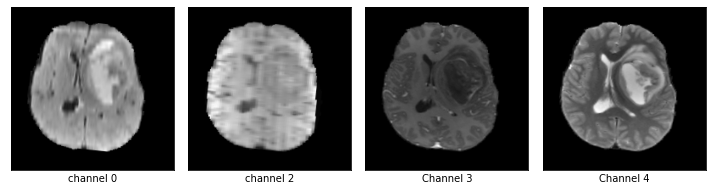

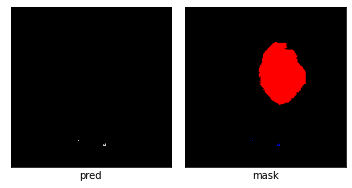

dice_loss : 0.14067031498247295



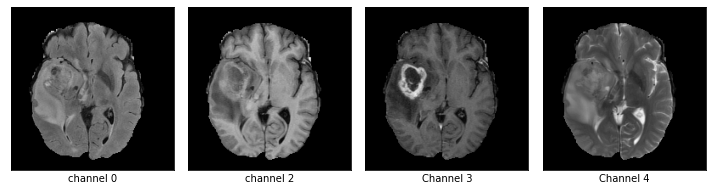

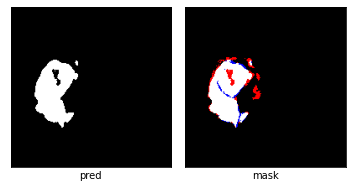

03/06 04:01:48 PM epoch 8 lr 2.275473e-02
03/06 04:01:48 PM genotype = Genotype(normal=[('skip_connect', 0), ('dil_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('skip_connect', 0), ('dil_conv_5x5', 1), ('dil_conv_5x5', 2), ('sep_conv_5x5', 3), ('sep_conv_5x5', 2), ('max_pool_3x3', 3), ('max_pool_3x3', 4)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.5421, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<42:53,  1.09s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<42:24,  1.08s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<41:57,  1.07s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9304, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<41:23,  1.06s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<40:51,  1.04s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<40:31,  1.04s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<40:26,  1.03s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1544, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<39:47,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<39:39,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<39:31,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<39:26,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<39:31,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.6045, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<39:29,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<39:07,  1.00s/it, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.6350, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<39:17,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<39:07,  1.00s/it, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<38:53,  1.00it/s, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.9753, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<38:47,  1.00it/s, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.2159, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:19<38:44,  1.00it/s, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:20<39:05,  1.00s/it, Acc=0.993, IoU=0.878, Loss=0.0669]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:21<38:49,  1.00it/s, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:22<39:10,  1.01s/it, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:23<39:27,  1.02s/it, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:24<39:18,  1.01s/it, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.0064, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:25<39:00,  1.00s/it, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:26<38:55,  1.00s/it, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:27<38:50,  1.00s/it, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:28<38:20,  1.01it/s, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:29<38:26,  1.01it/s, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:30<38:22,  1.01it/s, Acc=0.989, IoU=0.575, Loss=0.27]

tensor(0.1189, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:31<38:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000707]

tensor(0.9350, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:32<38:44,  1.00s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:33<38:42,  1.00s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:34<38:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.1154, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:35<39:05,  1.01s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0079, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:36<39:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:37<39:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:38<39:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:39<39:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:40<39:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.1917, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:41<38:47,  1.01s/it, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:42<38:43,  1.00s/it, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:43<38:34,  1.00s/it, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:44<38:32,  1.00s/it, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:45<38:31,  1.00s/it, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.0079, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:46<38:21,  1.00it/s, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:47<38:10,  1.01it/s, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:48<38:11,  1.01it/s, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:49<38:28,  1.00s/it, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:50<38:26,  1.00s/it, Acc=0.997, IoU=0.959, Loss=0.0227]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:51<38:32,  1.00s/it, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:52<38:55,  1.01s/it, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:53<38:51,  1.01s/it, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.3760, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:54<38:34,  1.01s/it, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:55<38:20,  1.00s/it, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:56<38:25,  1.00s/it, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:57<38:33,  1.01s/it, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:58<38:31,  1.01s/it, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [00:59<38:11,  1.00it/s, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:00<38:07,  1.00it/s, Acc=0.997, IoU=0.782, Loss=0.121]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:01<38:08,  1.00it/s, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:02<38:17,  1.00s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:03<38:14,  1.00s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0332, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:04<38:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.3850, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:05<38:47,  1.02s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0773, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:06<38:45,  1.02s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:07<38:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:08<38:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:09<38:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:10<38:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.3317, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:11<38:07,  1.00s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:12<38:08,  1.00s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.7089, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:13<38:17,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:14<38:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:15<38:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.2798, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:16<38:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:17<38:44,  1.02s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:18<38:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:19<38:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:20<38:49,  1.02s/it, Acc=1, IoU=0, Loss=0.00114]

tensor(0.9377, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:21<38:39,  1.02s/it, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:22<38:40,  1.02s/it, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:23<38:39,  1.02s/it, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:24<38:16,  1.01s/it, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:25<37:55,  1.00s/it, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:26<37:39,  1.00it/s, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:27<37:46,  1.00it/s, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.1718, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:28<37:55,  1.00s/it, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:29<37:41,  1.00it/s, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.0845, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:30<37:52,  1.00s/it, Acc=0.976, IoU=0.799, Loss=0.112]

tensor(0.2500, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:31<37:55,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:32<37:50,  1.00s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:33<37:56,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:34<38:08,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.3107, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:35<37:55,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:36<37:55,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:37<38:01,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:38<37:59,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:39<37:58,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:40<37:57,  1.01s/it, Acc=0.988, IoU=0.759, Loss=0.137]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:41<37:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000293]

tensor(0.4763, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:42<37:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000293]

tensor(0.1505, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:43<38:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000293]

tensor(0.1464, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:44<37:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000293]

tensor(0.1376, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:45<37:44,  1.01s/it, Acc=1, IoU=0, Loss=0.000293]

tensor(0.4398, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:46<37:35,  1.00s/it, Acc=1, IoU=0, Loss=0.000293]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:47<37:29,  1.00s/it, Acc=1, IoU=0, Loss=0.000293]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:48<37:16,  1.00it/s, Acc=1, IoU=0, Loss=0.000293]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:49<37:21,  1.00it/s, Acc=1, IoU=0, Loss=0.000293]

tensor(0.3766, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:50<37:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000293]

tensor(0.8573, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:51<37:04,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:52<37:21,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.0405, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:53<37:19,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:54<37:26,  1.00s/it, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.4640, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:55<37:11,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:56<37:09,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:57<37:00,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [01:58<37:05,  1.00it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.4457, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [01:59<37:04,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:00<36:59,  1.01it/s, Acc=0.996, IoU=0.955, Loss=0.0246]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:01<36:56,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1688, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:02<36:53,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:03<36:58,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:04<36:51,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:05<36:46,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1229, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:06<36:57,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:07<37:05,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:08<36:58,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:09<37:16,  1.00s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:10<36:56,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:11<36:44,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:12<36:55,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:13<36:44,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:14<36:47,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:15<36:50,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:16<36:42,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.2026, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:17<36:46,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:18<36:54,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:19<36:54,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.4166, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:20<36:52,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1785, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:21<37:03,  1.00s/it, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:22<37:10,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:23<37:19,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:24<37:19,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.3291, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:25<37:16,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.1871, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:26<37:01,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:27<36:50,  1.00s/it, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.4905, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:28<36:54,  1.00s/it, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.6186, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:29<36:33,  1.01it/s, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:30<36:37,  1.00it/s, Acc=0.992, IoU=0.86, Loss=0.0754]

tensor(0.6439, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:31<36:43,  1.00it/s, Acc=1, IoU=0, Loss=0.00323]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:32<36:43,  1.00s/it, Acc=1, IoU=0, Loss=0.00323]

tensor(0.1243, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:33<36:30,  1.01it/s, Acc=1, IoU=0, Loss=0.00323]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:34<36:20,  1.01it/s, Acc=1, IoU=0, Loss=0.00323]

tensor(0.8096, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:35<36:06,  1.02it/s, Acc=1, IoU=0, Loss=0.00323]

tensor(0.2255, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:36<36:12,  1.01it/s, Acc=1, IoU=0, Loss=0.00323]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:37<37:27,  1.02s/it, Acc=1, IoU=0, Loss=0.00323]

tensor(0.9161, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:38<36:54,  1.01s/it, Acc=1, IoU=0, Loss=0.00323]

tensor(0.1797, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:39<36:43,  1.00s/it, Acc=1, IoU=0, Loss=0.00323]

tensor(0.9572, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:40<36:35,  1.00s/it, Acc=1, IoU=0, Loss=0.00323]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:41<37:09,  1.02s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.0033, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:42<37:07,  1.02s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:43<37:22,  1.02s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:44<37:11,  1.02s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.1747, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:45<37:12,  1.02s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:46<36:56,  1.01s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.6705, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:47<36:55,  1.01s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.9266, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:48<36:48,  1.01s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.1442, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:49<36:39,  1.01s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.1467, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:50<36:25,  1.00s/it, Acc=0.988, IoU=0.681, Loss=0.188]

tensor(0.1830, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:51<36:34,  1.00s/it, Acc=1, IoU=0, Loss=0.00256]

tensor(0.8653, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:52<36:32,  1.00s/it, Acc=1, IoU=0, Loss=0.00256]

tensor(0.3099, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:53<36:33,  1.01s/it, Acc=1, IoU=0, Loss=0.00256]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:54<36:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00256]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:55<36:27,  1.00s/it, Acc=1, IoU=0, Loss=0.00256]

tensor(0.2047, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:56<36:24,  1.00s/it, Acc=1, IoU=0, Loss=0.00256]

tensor(0.2785, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:57<36:09,  1.00it/s, Acc=1, IoU=0, Loss=0.00256]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [02:58<36:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00256]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [02:59<35:46,  1.01it/s, Acc=1, IoU=0, Loss=0.00256]

tensor(0.4901, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:00<35:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00256]

tensor(0.8054, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:01<36:00,  1.01it/s, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:02<36:11,  1.00it/s, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:03<36:29,  1.01s/it, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:04<36:17,  1.00s/it, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.1374, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:05<36:22,  1.01s/it, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.1379, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:06<36:10,  1.00s/it, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:07<36:08,  1.00s/it, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.0391, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:08<36:08,  1.00s/it, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.1574, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:09<35:48,  1.01it/s, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:10<35:44,  1.01it/s, Acc=0.984, IoU=0.685, Loss=0.187]

tensor(0.0483, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:11<35:36,  1.01it/s, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:12<36:09,  1.00s/it, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.3762, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:13<36:09,  1.00s/it, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:14<36:17,  1.01s/it, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:15<36:31,  1.01s/it, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:16<36:22,  1.01s/it, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.0030, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:17<35:54,  1.00it/s, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:18<35:48,  1.00it/s, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.6137, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:19<35:46,  1.00it/s, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:20<35:50,  1.00it/s, Acc=0.994, IoU=0.837, Loss=0.09]

tensor(0.2858, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:21<35:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000937]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:22<36:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:23<36:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:24<36:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:25<35:58,  1.00s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:26<35:48,  1.00it/s, Acc=1, IoU=0, Loss=0.000937]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:27<35:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000937]

tensor(0.0534, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:28<35:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000937]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:29<35:39,  1.00it/s, Acc=1, IoU=0, Loss=0.000937]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:30<35:50,  1.00s/it, Acc=1, IoU=0, Loss=0.000937]

tensor(0.7865, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:31<36:00,  1.01s/it, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:32<36:02,  1.01s/it, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:33<35:46,  1.00s/it, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.1639, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:34<35:59,  1.01s/it, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.2879, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:35<35:39,  1.00it/s, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.9462, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:36<35:29,  1.00it/s, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:37<35:16,  1.01it/s, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.1523, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:38<35:24,  1.01it/s, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:39<35:18,  1.01it/s, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:40<35:01,  1.02it/s, Acc=0.99, IoU=0.761, Loss=0.134]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:41<34:57,  1.02it/s, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:42<34:58,  1.02it/s, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:43<35:02,  1.01it/s, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.9196, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:44<35:17,  1.01it/s, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:45<35:11,  1.01it/s, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:46<35:15,  1.01it/s, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.5991, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:47<35:27,  1.00it/s, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.6617, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:48<35:28,  1.00s/it, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.7164, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:49<35:30,  1.00s/it, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:50<35:28,  1.00s/it, Acc=0.99, IoU=0.579, Loss=0.268]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:51<35:24,  1.00s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:52<35:30,  1.00s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:53<35:25,  1.00s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0945, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:54<35:30,  1.00s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.4024, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:55<35:18,  1.00it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:56<35:26,  1.00s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.4229, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:57<35:16,  1.00it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.9789, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [03:58<35:02,  1.01it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0109, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [03:59<35:07,  1.00it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0435, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:00<34:55,  1.01it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:01<34:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:02<34:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.8253, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:03<35:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:04<34:44,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:05<34:43,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.3162, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:06<34:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:07<34:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:08<34:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:09<34:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:10<34:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.1264, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:11<34:44,  1.01it/s, Acc=1, IoU=0, Loss=0.000529]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:12<34:46,  1.01it/s, Acc=1, IoU=0, Loss=0.000529]

tensor(0.2121, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:13<34:31,  1.01it/s, Acc=1, IoU=0, Loss=0.000529]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:14<34:44,  1.01it/s, Acc=1, IoU=0, Loss=0.000529]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:15<34:42,  1.01it/s, Acc=1, IoU=0, Loss=0.000529]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:16<35:00,  1.00s/it, Acc=1, IoU=0, Loss=0.000529]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:17<35:07,  1.00s/it, Acc=1, IoU=0, Loss=0.000529]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:18<34:54,  1.00it/s, Acc=1, IoU=0, Loss=0.000529]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:19<34:39,  1.01it/s, Acc=1, IoU=0, Loss=0.000529]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:20<34:51,  1.00it/s, Acc=1, IoU=0, Loss=0.000529]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:21<34:51,  1.00it/s, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:22<35:12,  1.01s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:23<35:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:24<34:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:25<34:43,  1.00it/s, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:26<34:43,  1.00it/s, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0489, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:27<34:45,  1.00it/s, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:28<34:47,  1.00s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:29<34:51,  1.00s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:30<35:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:31<34:48,  1.00s/it, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.9912, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:32<34:49,  1.00s/it, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.8931, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:33<34:38,  1.00it/s, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:34<34:42,  1.00s/it, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:35<34:51,  1.01s/it, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.8617, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:36<34:45,  1.00s/it, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:37<34:44,  1.00s/it, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:38<34:41,  1.00s/it, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:39<34:44,  1.00s/it, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:40<34:29,  1.00it/s, Acc=0.989, IoU=0.712, Loss=0.169]

tensor(0.3099, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:41<34:25,  1.00it/s, Acc=1, IoU=0, Loss=0.5]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:42<34:25,  1.00it/s, Acc=1, IoU=0, Loss=0.5]

tensor(0.5034, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:43<34:28,  1.00it/s, Acc=1, IoU=0, Loss=0.5]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:44<34:32,  1.00s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.5613, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:45<34:48,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:46<34:36,  1.00s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:47<34:44,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.0491, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:48<34:35,  1.00s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:49<34:40,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.3558, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:50<34:46,  1.01s/it, Acc=1, IoU=0, Loss=0.5]

tensor(0.4981, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:51<34:46,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:52<34:52,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.1616, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:53<34:56,  1.02s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:54<34:39,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.2545, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:55<34:42,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:56<34:45,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:57<34:45,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.1877, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [04:58<34:39,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [04:59<34:37,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:00<34:40,  1.01s/it, Acc=0.998, IoU=0.933, Loss=0.0358]

tensor(0.4919, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:01<34:25,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:02<34:22,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:03<34:20,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1715, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:04<33:50,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:05<33:55,  1.01it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0304, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:06<34:08,  1.00it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1971, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:07<34:08,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1293, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:08<34:19,  1.01s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:09<34:10,  1.00s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.5709, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:10<34:02,  1.00it/s, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:11<34:06,  1.00s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:12<34:15,  1.01s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:13<34:08,  1.00s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:14<34:03,  1.00s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:15<33:49,  1.01it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:16<33:55,  1.00it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:17<34:02,  1.00s/it, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:18<33:56,  1.00it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:19<33:53,  1.00it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:20<33:39,  1.01it/s, Acc=0.999, IoU=0, Loss=0.971]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:21<33:42,  1.01it/s, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:22<34:11,  1.01s/it, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:23<34:28,  1.02s/it, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:24<34:05,  1.01s/it, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.0809, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:25<33:46,  1.00it/s, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:26<33:54,  1.00s/it, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.1604, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:27<33:56,  1.00s/it, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.2950, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:28<33:46,  1.00it/s, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:29<33:51,  1.00s/it, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:30<33:49,  1.00s/it, Acc=0.995, IoU=0.869, Loss=0.0707]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:31<33:49,  1.00s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.3944, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:32<33:52,  1.00s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:33<33:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.3271, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:34<34:05,  1.01s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:35<33:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.3000, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:36<33:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.1254, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:38<33:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.4283, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:39<33:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:40<33:42,  1.00s/it, Acc=1, IoU=0, Loss=0.000567]

tensor(0.9787, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:40<33:29,  1.00it/s, Acc=1, IoU=0, Loss=0.000567]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:42<33:44,  1.01s/it, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.6925, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:43<33:53,  1.01s/it, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.2911, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:44<33:40,  1.00s/it, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:45<33:28,  1.00it/s, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:46<33:31,  1.00s/it, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:47<33:29,  1.00s/it, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.3432, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:47<33:20,  1.00it/s, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:48<33:13,  1.01it/s, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.1487, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:49<33:18,  1.00it/s, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:50<33:13,  1.01it/s, Acc=0.986, IoU=0.848, Loss=0.083]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:51<33:05,  1.01it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.9520, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:52<33:19,  1.00it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:53<33:21,  1.00it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:54<33:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:55<33:14,  1.00it/s, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0419, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:56<33:19,  1.00s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [05:58<33:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [05:58<33:26,  1.00s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.1074, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [06:00<33:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.1438, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:01<33:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:02<33:45,  1.02s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:03<33:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.0279, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:04<34:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:05<33:53,  1.02s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:06<33:39,  1.02s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:07<33:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.3303, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:08<33:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.1054, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:09<33:41,  1.02s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:10<33:38,  1.02s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:11<33:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000632]

tensor(0.1357, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:12<33:28,  1.01s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:13<33:24,  1.01s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.1031, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:14<33:24,  1.01s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.2459, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:15<33:14,  1.01s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:16<33:09,  1.00s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:17<33:00,  1.00s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:18<33:09,  1.01s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:19<33:08,  1.01s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:20<33:18,  1.01s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:21<33:01,  1.00s/it, Acc=0.984, IoU=0.827, Loss=0.0934]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:22<33:08,  1.01s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.9584, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:23<33:35,  1.02s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:24<33:29,  1.02s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:25<33:20,  1.02s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.0067, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:26<33:05,  1.01s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:27<33:12,  1.01s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.1819, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:28<33:07,  1.01s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.5244, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:29<33:07,  1.01s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:30<32:56,  1.01s/it, Acc=1, IoU=0, Loss=0.0015]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:31<32:33,  1.01it/s, Acc=1, IoU=0, Loss=0.0015]

tensor(0.6249, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:32<32:40,  1.00it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:33<32:40,  1.00it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.5759, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:34<32:31,  1.01it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.4611, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:35<32:35,  1.00it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:36<32:28,  1.01it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:37<32:21,  1.01it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:38<32:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.3416, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:39<32:19,  1.01it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.6070, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:40<32:16,  1.01it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.9747, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:41<32:20,  1.01it/s, Acc=1, IoU=0, Loss=0.00316]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:42<32:30,  1.00it/s, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:43<32:34,  1.00s/it, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:44<32:36,  1.00s/it, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:45<32:31,  1.00s/it, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:46<31:59,  1.02it/s, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:47<32:11,  1.01it/s, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.1873, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:48<32:17,  1.01it/s, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.1340, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:49<32:19,  1.00it/s, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:50<32:08,  1.01it/s, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:51<32:12,  1.01it/s, Acc=0.987, IoU=0.373, Loss=0.458]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:52<32:20,  1.00it/s, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:53<32:11,  1.01it/s, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.2056, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:54<32:12,  1.00it/s, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:55<32:08,  1.01it/s, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:56<32:09,  1.01it/s, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.0436, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:57<32:09,  1.01it/s, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.0416, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [06:58<32:24,  1.00s/it, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.8748, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [06:59<32:26,  1.01s/it, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [07:00<32:27,  1.01s/it, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.2940, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:01<32:26,  1.01s/it, Acc=0.997, IoU=0.808, Loss=0.107]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:02<32:24,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.1349, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:03<32:31,  1.01s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:04<32:14,  1.00s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:05<32:14,  1.00s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:06<32:11,  1.00s/it, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:07<31:53,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:08<31:52,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:09<31:43,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:10<32:02,  1.00it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:11<31:45,  1.01it/s, Acc=0.999, IoU=0, Loss=0.957]

tensor(0.0971, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:12<31:41,  1.01it/s, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:13<31:50,  1.01it/s, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.5042, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:14<31:42,  1.01it/s, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:15<31:40,  1.01it/s, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:16<31:33,  1.01it/s, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:17<31:39,  1.01it/s, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.1799, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:18<31:59,  1.00s/it, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:19<32:14,  1.01s/it, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:20<32:28,  1.02s/it, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:21<32:07,  1.01s/it, Acc=0.998, IoU=0.72, Loss=0.164]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:22<31:57,  1.00s/it, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.3001, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:23<32:10,  1.01s/it, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:24<32:02,  1.01s/it, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.6410, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:25<32:02,  1.01s/it, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:26<31:45,  1.00it/s, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:27<31:45,  1.00it/s, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:28<31:52,  1.00s/it, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:29<31:59,  1.01s/it, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:30<31:47,  1.00s/it, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:31<31:44,  1.00it/s, Acc=0.997, IoU=0.92, Loss=0.0416]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:32<31:44,  1.00s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:33<31:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:34<32:07,  1.01s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:35<31:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:36<31:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:37<32:08,  1.02s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:38<32:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:39<31:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.1981, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:40<31:45,  1.01s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.1125, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:41<31:40,  1.00s/it, Acc=1, IoU=0, Loss=0.000372]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:42<31:50,  1.01s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.6410, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:43<32:02,  1.02s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:44<31:52,  1.01s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.2707, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:45<31:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:46<31:33,  1.00s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:47<31:33,  1.00s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:48<31:53,  1.01s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.2117, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:49<31:52,  1.01s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:50<31:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:51<31:33,  1.00s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.4016, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:52<31:38,  1.01s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0329, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:53<32:15,  1.03s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.1409, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:54<32:20,  1.03s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:55<32:28,  1.04s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:56<32:16,  1.03s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0975, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [07:57<32:10,  1.03s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [07:58<31:47,  1.02s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.2058, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [07:59<31:36,  1.01s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [08:00<31:45,  1.02s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.8159, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [08:01<31:44,  1.02s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.6742, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:02<31:39,  1.01s/it, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:03<31:43,  1.02s/it, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:04<31:26,  1.01s/it, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:05<31:15,  1.00s/it, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:06<31:17,  1.00s/it, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:07<31:10,  1.00s/it, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:08<31:03,  1.00it/s, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.3646, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:09<31:05,  1.00it/s, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.2759, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:10<31:05,  1.00it/s, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.2788, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:11<31:11,  1.00s/it, Acc=0.991, IoU=0.894, Loss=0.056]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:12<30:55,  1.00it/s, Acc=1, IoU=0, Loss=0.933]

tensor(0.9262, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:13<30:57,  1.00it/s, Acc=1, IoU=0, Loss=0.933]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:14<31:04,  1.00s/it, Acc=1, IoU=0, Loss=0.933]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:15<31:00,  1.00it/s, Acc=1, IoU=0, Loss=0.933]

tensor(0.1163, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:16<30:59,  1.00it/s, Acc=1, IoU=0, Loss=0.933]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:17<30:59,  1.00s/it, Acc=1, IoU=0, Loss=0.933]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:18<31:09,  1.01s/it, Acc=1, IoU=0, Loss=0.933]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:19<30:49,  1.00it/s, Acc=1, IoU=0, Loss=0.933]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:20<30:37,  1.01it/s, Acc=1, IoU=0, Loss=0.933]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:21<30:49,  1.00it/s, Acc=1, IoU=0, Loss=0.933]

tensor(0.0510, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:22<31:10,  1.01s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:23<31:11,  1.01s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:24<30:59,  1.00s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:25<30:56,  1.00s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.1517, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:26<30:59,  1.01s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:27<30:56,  1.00s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:28<30:43,  1.00it/s, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:29<30:45,  1.00it/s, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.3217, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:30<30:40,  1.00it/s, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:31<30:49,  1.00s/it, Acc=0.974, IoU=0, Loss=0.999]

tensor(0.5741, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:32<31:01,  1.01s/it, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.2749, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:33<31:01,  1.01s/it, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.9708, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:34<30:55,  1.01s/it, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.2229, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:35<30:29,  1.01it/s, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:36<30:29,  1.01it/s, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:37<30:34,  1.00it/s, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.1354, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:38<30:41,  1.00s/it, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:39<30:37,  1.00s/it, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.3671, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:40<30:43,  1.00s/it, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:41<30:48,  1.01s/it, Acc=0.994, IoU=0.879, Loss=0.0646]

tensor(0.6203, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:42<30:48,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:43<30:53,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:44<30:46,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:45<30:45,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:46<30:42,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:47<30:44,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:48<30:45,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:49<30:38,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:50<30:46,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:51<30:49,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0236]

tensor(0.9296, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:52<30:36,  1.01s/it, Acc=1, IoU=0, Loss=0.00065]

tensor(0.3277, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:53<30:47,  1.01s/it, Acc=1, IoU=0, Loss=0.00065]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:54<30:42,  1.01s/it, Acc=1, IoU=0, Loss=0.00065]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:55<30:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00065]

tensor(0.5753, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:56<30:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00065]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [08:57<30:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00065]

tensor(0.5756, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [08:58<30:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00065]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [08:59<30:24,  1.00s/it, Acc=1, IoU=0, Loss=0.00065]

tensor(0.4066, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [09:00<30:12,  1.00it/s, Acc=1, IoU=0, Loss=0.00065]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [09:01<30:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00065]

tensor(0.1350, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:02<29:53,  1.01it/s, Acc=0.928, IoU=0, Loss=1]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:03<30:15,  1.00s/it, Acc=0.928, IoU=0, Loss=1]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:04<30:21,  1.01s/it, Acc=0.928, IoU=0, Loss=1]

tensor(0.0294, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:05<30:07,  1.00it/s, Acc=0.928, IoU=0, Loss=1]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:06<29:56,  1.01it/s, Acc=0.928, IoU=0, Loss=1]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:07<29:53,  1.01it/s, Acc=0.928, IoU=0, Loss=1]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:08<29:59,  1.00it/s, Acc=0.928, IoU=0, Loss=1]

tensor(0.1382, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:09<30:04,  1.00it/s, Acc=0.928, IoU=0, Loss=1]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:10<30:01,  1.00it/s, Acc=0.928, IoU=0, Loss=1]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:11<29:50,  1.01it/s, Acc=0.928, IoU=0, Loss=1]

tensor(0.1813, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:12<29:47,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:13<29:42,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:14<29:52,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:15<29:47,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:16<29:45,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:17<29:47,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:18<29:54,  1.00it/s, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.3424, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:19<30:06,  1.01s/it, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.1331, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:20<30:04,  1.00s/it, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:21<30:00,  1.00s/it, Acc=0.996, IoU=0.911, Loss=0.0459]

tensor(0.5459, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:22<30:20,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.5365, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:23<30:20,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:24<30:09,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:25<30:16,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.6179, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:26<30:12,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:27<30:05,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:28<29:55,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1081, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:29<29:42,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:30<29:29,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.2406, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:31<29:39,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:32<29:31,  1.01it/s, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:33<29:41,  1.00it/s, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:34<29:58,  1.01s/it, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:35<30:03,  1.01s/it, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:36<29:39,  1.00it/s, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:37<29:28,  1.01it/s, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.4756, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:38<29:29,  1.00it/s, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:39<29:41,  1.00s/it, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:40<29:30,  1.00it/s, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:41<29:41,  1.00s/it, Acc=0.993, IoU=0.829, Loss=0.094]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:42<29:40,  1.00s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.6145, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:43<29:39,  1.00s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:44<29:44,  1.01s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:45<29:52,  1.01s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:46<29:50,  1.01s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:47<29:45,  1.01s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.1747, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:48<29:40,  1.01s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:49<29:29,  1.00s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:50<29:39,  1.01s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:51<29:41,  1.01s/it, Acc=0.983, IoU=0.809, Loss=0.106]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:52<29:36,  1.01s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.2097, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:53<29:28,  1.00s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:54<29:25,  1.00s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:55<29:31,  1.01s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.5386, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [09:56<29:20,  1.00s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [09:57<29:33,  1.01s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.1941, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [09:58<29:42,  1.01s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.1948, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [09:59<29:27,  1.01s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [10:00<29:29,  1.01s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.2685, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:01<29:27,  1.01s/it, Acc=0.984, IoU=0.683, Loss=0.187]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:02<29:23,  1.01s/it, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.3815, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:03<29:12,  1.00it/s, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:04<29:19,  1.00s/it, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.3929, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:05<29:21,  1.01s/it, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.2020, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:06<29:09,  1.00it/s, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.9829, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:07<28:55,  1.01it/s, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:08<28:50,  1.01it/s, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:09<28:55,  1.01it/s, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:10<28:48,  1.01it/s, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:11<28:54,  1.01it/s, Acc=0.982, IoU=0.772, Loss=0.13]

tensor(0.2434, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:12<28:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00115]

tensor(0.1245, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:13<29:05,  1.00s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:14<29:07,  1.00s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:15<29:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:16<29:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:18<29:28,  1.02s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0498, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:19<29:19,  1.01s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.1841, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:20<29:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.1915, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:20<29:00,  1.00s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:22<29:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:23<29:06,  1.01s/it, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:24<29:14,  1.01s/it, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:25<29:11,  1.01s/it, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:26<29:11,  1.01s/it, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.3861, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:27<29:06,  1.01s/it, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.8131, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:28<28:49,  1.00s/it, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:29<28:41,  1.00it/s, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.6649, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:30<28:35,  1.01it/s, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:31<28:49,  1.00s/it, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:32<28:49,  1.00s/it, Acc=0.996, IoU=0.816, Loss=0.0998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:33<28:50,  1.00s/it, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.1753, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:34<28:52,  1.01s/it, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:35<28:51,  1.01s/it, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:36<28:51,  1.01s/it, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.2536, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:37<28:37,  1.00it/s, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.9353, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:38<28:40,  1.00s/it, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:39<28:36,  1.00it/s, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:40<28:30,  1.00it/s, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:41<28:29,  1.00it/s, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.1511, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:42<28:26,  1.01it/s, Acc=0.993, IoU=0.887, Loss=0.0598]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:43<28:27,  1.00it/s, Acc=1, IoU=0, Loss=0.000231]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:44<28:36,  1.00s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.3585, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:45<28:33,  1.00s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.1352, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:46<28:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:47<28:45,  1.01s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.1000, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:48<28:29,  1.00s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:49<28:24,  1.00it/s, Acc=1, IoU=0, Loss=0.000231]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:50<28:12,  1.01it/s, Acc=1, IoU=0, Loss=0.000231]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:51<28:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000231]

tensor(0.0407, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:52<28:22,  1.00it/s, Acc=1, IoU=0, Loss=0.000231]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:53<28:16,  1.00it/s, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.4687, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:54<28:28,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.6101, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:55<28:28,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.6564, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:56<28:28,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [10:57<28:22,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.2561, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [10:58<28:23,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [10:59<28:26,  1.01s/it, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [11:00<28:24,  1.00s/it, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [11:01<28:25,  1.01s/it, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:02<28:09,  1.00it/s, Acc=0.996, IoU=0.876, Loss=0.0657]

tensor(0.3428, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:03<28:55,  1.02s/it, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:04<28:38,  1.01s/it, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.0979, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:05<28:58,  1.03s/it, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:06<28:52,  1.02s/it, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:07<28:40,  1.02s/it, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.2162, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:08<28:10,  1.00s/it, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:09<28:05,  1.00it/s, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:10<28:08,  1.00s/it, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.2907, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:11<27:57,  1.01it/s, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.3103, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:12<28:16,  1.01s/it, Acc=0.993, IoU=0.865, Loss=0.0738]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:13<28:11,  1.00s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.4219, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:14<28:03,  1.00s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:15<28:00,  1.00it/s, Acc=0.933, IoU=0, Loss=1]

tensor(0.1388, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:16<27:39,  1.01it/s, Acc=0.933, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:17<27:46,  1.01it/s, Acc=0.933, IoU=0, Loss=1]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:18<27:45,  1.01it/s, Acc=0.933, IoU=0, Loss=1]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:19<27:39,  1.01it/s, Acc=0.933, IoU=0, Loss=1]

tensor(0.9790, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:20<28:03,  1.00s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:21<27:59,  1.00s/it, Acc=0.933, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:22<27:51,  1.00it/s, Acc=0.933, IoU=0, Loss=1]

tensor(0.5036, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:23<28:11,  1.01s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:24<28:12,  1.01s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.3651, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:25<28:12,  1.01s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:26<28:14,  1.01s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:27<28:04,  1.01s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.1970, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:28<27:50,  1.00s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:29<28:09,  1.01s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.0983, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:30<28:24,  1.02s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.1715, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:31<28:23,  1.02s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:32<28:07,  1.01s/it, Acc=0.995, IoU=0.89, Loss=0.0592]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:33<28:12,  1.02s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:34<28:18,  1.02s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.1361, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:35<28:18,  1.02s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.2902, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:36<28:23,  1.03s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.5375, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:37<28:02,  1.01s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.6609, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:38<28:06,  1.02s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:39<27:51,  1.01s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.5336, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:40<27:38,  1.00s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.4558, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:41<27:56,  1.01s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:42<27:48,  1.01s/it, Acc=0.989, IoU=0.885, Loss=0.0632]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:43<27:33,  1.00it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.9878, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:44<27:30,  1.00it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:45<27:11,  1.01it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:46<27:10,  1.01it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:47<27:10,  1.01it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.4235, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:48<27:17,  1.01it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:49<27:07,  1.01it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:50<27:11,  1.01it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:51<27:04,  1.01it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.1250, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:52<27:07,  1.01it/s, Acc=0.993, IoU=0.874, Loss=0.0676]

tensor(0.6580, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:53<27:06,  1.01it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:54<27:07,  1.01it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:55<27:08,  1.01it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:56<27:15,  1.00it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.5354, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [11:57<27:21,  1.00s/it, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.5242, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [11:58<27:12,  1.00it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.2021, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [11:59<27:07,  1.01it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [12:00<27:06,  1.01it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.9062, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [12:01<27:04,  1.01it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:02<26:56,  1.01it/s, Acc=0.982, IoU=0.0956, Loss=0.822]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:03<26:57,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:04<27:14,  1.00s/it, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.6537, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:05<27:15,  1.00s/it, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.3227, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:06<27:29,  1.01s/it, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.7992, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:07<27:13,  1.00s/it, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:08<27:03,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:09<27:06,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:10<27:04,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:11<27:03,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.2302, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:12<27:09,  1.00s/it, Acc=0.996, IoU=0.925, Loss=0.0384]

tensor(0.4847, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:13<27:09,  1.00s/it, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:14<27:09,  1.00s/it, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:15<27:06,  1.00s/it, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.0353, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:16<26:54,  1.00it/s, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:17<26:39,  1.01it/s, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:18<26:36,  1.01it/s, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.6765, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:19<26:33,  1.02it/s, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:20<26:31,  1.02it/s, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.2936, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:21<26:41,  1.01it/s, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:22<26:43,  1.01it/s, Acc=0.989, IoU=0.784, Loss=0.124]

tensor(0.9172, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:23<27:06,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:24<27:11,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:25<27:04,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:26<27:01,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:27<26:49,  1.00it/s, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.5268, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:28<26:41,  1.00it/s, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.2187, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:29<26:41,  1.00it/s, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.1597, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:30<26:39,  1.00it/s, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.4140, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:31<26:32,  1.01it/s, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:32<26:39,  1.00it/s, Acc=0.995, IoU=0.906, Loss=0.0496]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:33<26:46,  1.00s/it, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.1953, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:34<26:49,  1.00s/it, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:35<26:55,  1.01s/it, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.7717, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:36<27:01,  1.01s/it, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:37<27:01,  1.01s/it, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:38<26:50,  1.01s/it, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:39<26:50,  1.01s/it, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.9886, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:40<26:41,  1.00s/it, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.9874, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:41<26:34,  1.00it/s, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:42<26:27,  1.01it/s, Acc=0.985, IoU=0.856, Loss=0.0782]

tensor(0.6398, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:43<26:22,  1.01it/s, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:44<26:26,  1.00it/s, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.9362, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:45<26:42,  1.01s/it, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:46<26:43,  1.01s/it, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:47<26:34,  1.00s/it, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:48<26:20,  1.01it/s, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:49<26:09,  1.01it/s, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:50<26:29,  1.00s/it, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:51<26:23,  1.00it/s, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.5652, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:52<26:38,  1.01s/it, Acc=0.997, IoU=0.878, Loss=0.0677]

tensor(0.5120, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:53<26:38,  1.01s/it, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:54<26:40,  1.01s/it, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:55<26:42,  1.01s/it, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [12:56<26:38,  1.01s/it, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [12:57<26:29,  1.01s/it, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [12:58<26:18,  1.00it/s, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.1447, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [12:59<26:19,  1.00s/it, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.2666, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [13:00<26:11,  1.00it/s, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.1595, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [13:01<26:17,  1.00s/it, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.4206, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:02<26:18,  1.00s/it, Acc=0.998, IoU=0.794, Loss=0.113]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:03<26:28,  1.01s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:04<26:42,  1.02s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:05<26:38,  1.02s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.2017, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:06<26:28,  1.01s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.1764, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:07<26:32,  1.01s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:08<26:24,  1.01s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.1315, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:09<26:17,  1.01s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:10<26:16,  1.01s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:11<26:18,  1.01s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.0535, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:12<26:22,  1.01s/it, Acc=0.998, IoU=0.761, Loss=0.133]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:13<26:45,  1.03s/it, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:14<26:34,  1.02s/it, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:15<26:20,  1.01s/it, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.9798, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:16<26:26,  1.02s/it, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:17<26:30,  1.02s/it, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:18<26:08,  1.01s/it, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:19<25:49,  1.01it/s, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:20<25:46,  1.01it/s, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:21<25:48,  1.00it/s, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.3119, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:22<25:46,  1.01it/s, Acc=0.994, IoU=0.657, Loss=0.205]

tensor(0.8336, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:23<26:04,  1.01s/it, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:24<25:55,  1.00s/it, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:25<25:55,  1.00s/it, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:26<25:54,  1.00s/it, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.4149, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:27<25:52,  1.00s/it, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:28<25:50,  1.00s/it, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:29<25:35,  1.01it/s, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.3073, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:30<25:24,  1.01it/s, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:31<25:32,  1.01it/s, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:32<25:26,  1.01it/s, Acc=0.998, IoU=0.922, Loss=0.0413]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:33<25:38,  1.00it/s, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:34<25:48,  1.00s/it, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:35<25:46,  1.00s/it, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.2347, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:36<25:39,  1.00it/s, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:37<25:39,  1.00it/s, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.1659, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:38<25:32,  1.00it/s, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:39<25:45,  1.00s/it, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:40<25:49,  1.01s/it, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.2721, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:41<25:40,  1.00s/it, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:42<25:38,  1.00s/it, Acc=0.997, IoU=0.928, Loss=0.0402]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:43<25:38,  1.00s/it, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:44<25:54,  1.01s/it, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:45<25:50,  1.01s/it, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:46<25:48,  1.01s/it, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.2213, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:47<25:45,  1.01s/it, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.1355, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:48<25:27,  1.00it/s, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.3345, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:49<25:26,  1.00it/s, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:50<25:34,  1.01s/it, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:51<25:25,  1.00it/s, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:52<25:14,  1.01it/s, Acc=0.997, IoU=0.763, Loss=0.134]

tensor(0.1499, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:53<24:55,  1.02it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.3421, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:54<25:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [13:55<25:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [13:56<25:05,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.1697, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [13:57<25:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.1882, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [13:58<25:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [13:59<25:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:00<25:11,  1.00it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:01<25:21,  1.00s/it, Acc=1, IoU=0, Loss=0.00313]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:02<25:05,  1.01it/s, Acc=1, IoU=0, Loss=0.00313]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:03<24:48,  1.02it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.2523, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:04<24:51,  1.01it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:05<24:53,  1.01it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:06<24:43,  1.02it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:07<24:45,  1.02it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:08<24:36,  1.02it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:09<24:29,  1.03it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.1760, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:10<24:25,  1.03it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:11<24:35,  1.02it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.4957, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:12<24:40,  1.02it/s, Acc=0.994, IoU=0.766, Loss=0.134]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:13<24:42,  1.01it/s, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.1471, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:14<24:51,  1.01it/s, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:15<24:53,  1.01it/s, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:16<25:00,  1.00it/s, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.5302, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:17<25:13,  1.01s/it, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.2763, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:18<25:07,  1.01s/it, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.6799, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:19<25:04,  1.00s/it, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:20<25:07,  1.01s/it, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:21<25:04,  1.01s/it, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.2568, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:22<25:13,  1.01s/it, Acc=0.999, IoU=0.744, Loss=0.143]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:23<25:14,  1.01s/it, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:24<24:54,  1.00s/it, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.1933, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:25<24:47,  1.00it/s, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:26<24:39,  1.01it/s, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:27<24:27,  1.02it/s, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:28<24:16,  1.02it/s, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:29<24:18,  1.02it/s, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.3075, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:30<24:38,  1.01it/s, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.2620, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:31<24:43,  1.00it/s, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.5804, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:32<24:43,  1.00it/s, Acc=0.989, IoU=0.82, Loss=0.099]

tensor(0.3352, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:33<24:38,  1.00it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:34<24:41,  1.00it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:35<24:26,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:36<24:14,  1.02it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.2028, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:37<24:09,  1.02it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.7154, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:38<24:26,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.0385, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:39<24:16,  1.02it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:40<24:25,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:41<24:27,  1.01it/s, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.0428, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:42<24:35,  1.00s/it, Acc=0.995, IoU=0.917, Loss=0.0435]

tensor(0.1421, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:43<24:45,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:44<24:51,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.3924, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:45<24:45,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:46<24:42,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:47<24:31,  1.00s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:48<24:23,  1.00it/s, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:49<24:23,  1.00it/s, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.4081, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:50<24:21,  1.00it/s, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:51<24:21,  1.00it/s, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.9880, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:52<24:30,  1.00s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.0360, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:53<24:33,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:54<24:31,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [14:55<24:29,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [14:56<24:17,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.5467, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [14:57<24:22,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1551, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [14:58<24:10,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1206, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [14:59<24:07,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:00<24:12,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:01<24:01,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4216, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:02<24:21,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1993, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:03<24:22,  1.01s/it, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.2393, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:04<24:25,  1.01s/it, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.1565, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:05<24:26,  1.01s/it, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:06<24:23,  1.01s/it, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:07<24:03,  1.00it/s, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.0304, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:08<24:03,  1.00it/s, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:09<24:05,  1.00it/s, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:10<23:58,  1.01it/s, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.1541, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:11<23:58,  1.01it/s, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:12<24:10,  1.00s/it, Acc=0.984, IoU=0.846, Loss=0.084]

tensor(0.1383, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:13<24:10,  1.00s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.6784, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:14<24:07,  1.00s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.9703, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:15<24:03,  1.00s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:16<24:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.2431, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:17<24:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0379, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:18<23:59,  1.00s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:19<24:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.1305, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:20<24:22,  1.02s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.3328, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:21<24:17,  1.02s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.5963, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:22<24:38,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:23<24:47,  1.04s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.4508, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:24<24:40,  1.03s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:25<24:16,  1.02s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:26<24:12,  1.01s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.1626, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:27<24:12,  1.02s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:28<24:13,  1.02s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:29<24:07,  1.01s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:30<24:00,  1.01s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:31<23:49,  1.00s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:32<23:59,  1.01s/it, Acc=0.995, IoU=0.778, Loss=0.124]

tensor(0.0545, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:33<24:09,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2024, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:34<24:08,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:35<24:07,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0325, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:36<24:06,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:37<24:12,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2622, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:38<24:03,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9614, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:39<23:50,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9579, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:40<23:49,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:41<23:57,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:42<23:48,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:43<23:56,  1.02s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:44<23:53,  1.01s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.2626, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:45<23:50,  1.01s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.5847, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:46<23:41,  1.01s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.1529, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:47<23:36,  1.00s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.7190, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:48<23:37,  1.01s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:49<23:31,  1.00s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:50<23:27,  1.00s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.0065, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:51<23:19,  1.00it/s, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.3166, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:52<23:31,  1.00s/it, Acc=0.989, IoU=0.839, Loss=0.0885]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:53<23:25,  1.00s/it, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:54<23:27,  1.00s/it, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.2162, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [15:55<23:17,  1.00it/s, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.1789, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [15:56<23:14,  1.00it/s, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [15:57<23:13,  1.00it/s, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [15:58<23:14,  1.00it/s, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [15:59<23:12,  1.00it/s, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.6249, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:00<23:05,  1.01it/s, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:01<22:54,  1.02it/s, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:02<22:50,  1.02it/s, Acc=0.985, IoU=0.815, Loss=0.106]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:03<22:47,  1.02it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:04<23:16,  1.00s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:05<23:19,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:06<23:20,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9883, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:07<23:20,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.7663, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:08<23:23,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:09<23:20,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:10<23:12,  1.00s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:11<23:15,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.3250, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:12<23:17,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:13<23:14,  1.01s/it, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.1492, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:14<23:08,  1.00s/it, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:15<23:14,  1.01s/it, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:16<23:00,  1.00it/s, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.2491, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:17<22:58,  1.00it/s, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:18<22:59,  1.00s/it, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:19<23:10,  1.01s/it, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.1691, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:20<23:04,  1.01s/it, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:21<23:00,  1.00s/it, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:22<23:01,  1.00s/it, Acc=0.992, IoU=0.897, Loss=0.0553]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:23<23:02,  1.01s/it, Acc=1, IoU=0, Loss=0.00174]

tensor(0.1761, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:24<23:05,  1.01s/it, Acc=1, IoU=0, Loss=0.00174]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:25<23:04,  1.01s/it, Acc=1, IoU=0, Loss=0.00174]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:26<23:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00174]

tensor(0.0423, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:27<22:49,  1.00it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.6165, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:28<22:48,  1.00it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:29<22:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.7137, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:30<22:42,  1.00it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:31<22:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.0091, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:32<22:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00174]

tensor(0.1042, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:33<22:48,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.7783, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:34<23:01,  1.01s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:35<23:12,  1.02s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:36<23:06,  1.02s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.2396, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:37<22:52,  1.01s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:38<22:42,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:39<22:38,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.6426, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:40<22:37,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:41<22:38,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:42<22:38,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.5730, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:43<22:47,  1.01s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:44<22:54,  1.02s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:45<22:40,  1.01s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:46<22:40,  1.01s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:47<22:42,  1.01s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.6668, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:48<22:41,  1.01s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.2420, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:49<22:28,  1.00s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:50<22:17,  1.01it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:51<22:18,  1.01it/s, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.1219, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:52<22:26,  1.00s/it, Acc=0.995, IoU=0.9, Loss=0.0537]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:53<22:39,  1.01s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.3478, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [16:54<22:37,  1.01s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [16:55<22:28,  1.00s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [16:56<22:23,  1.00s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [16:57<22:23,  1.00s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.0456, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [16:58<22:26,  1.01s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.2868, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [16:59<22:31,  1.01s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:00<22:28,  1.01s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.6940, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:01<22:26,  1.01s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:02<22:28,  1.01s/it, Acc=0.997, IoU=0.744, Loss=0.145]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:03<22:34,  1.02s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:04<22:30,  1.01s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:05<22:17,  1.00s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:06<22:20,  1.01s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.2288, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:07<22:25,  1.01s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:08<22:27,  1.01s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.0419, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:09<22:24,  1.01s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:10<22:17,  1.01s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:11<22:17,  1.01s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.1554, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:13<22:17,  1.01s/it, Acc=0.998, IoU=0.853, Loss=0.0818]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:14<22:11,  1.01s/it, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.5889, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:15<22:16,  1.01s/it, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.2063, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:16<22:15,  1.01s/it, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:17<22:07,  1.00s/it, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:18<22:14,  1.01s/it, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:19<22:09,  1.01s/it, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:20<22:07,  1.01s/it, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.6877, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:21<21:55,  1.00it/s, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:22<21:54,  1.00it/s, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.1802, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:23<21:49,  1.00it/s, Acc=0.995, IoU=0.585, Loss=0.258]

tensor(0.3745, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:24<22:01,  1.01s/it, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.0433, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:25<22:00,  1.01s/it, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.1206, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:26<21:48,  1.00it/s, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:27<21:44,  1.00it/s, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.0438, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:28<21:39,  1.01it/s, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.5812, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:29<21:43,  1.00it/s, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.0357, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:30<21:45,  1.00it/s, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.9503, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:31<21:37,  1.01it/s, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.7625, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:31<21:38,  1.01it/s, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:32<21:39,  1.00it/s, Acc=0.997, IoU=0.808, Loss=0.111]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:33<21:34,  1.01it/s, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.1956, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:34<21:38,  1.00it/s, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.2205, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:36<21:47,  1.00s/it, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:37<21:40,  1.00it/s, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.4547, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:37<21:29,  1.01it/s, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:38<21:28,  1.01it/s, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:40<21:43,  1.00s/it, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.3360, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:41<21:48,  1.01s/it, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:42<21:52,  1.01s/it, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.4560, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:43<21:49,  1.01s/it, Acc=0.983, IoU=0.727, Loss=0.158]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:44<21:31,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2079, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:45<21:26,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0466, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:46<21:31,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1853, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:47<21:30,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:47<21:20,  1.01it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2362, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:48<21:15,  1.01it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2039, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:49<21:14,  1.01it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:50<21:15,  1.01it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:51<21:11,  1.01it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2628, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:52<21:18,  1.00it/s, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0826, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:53<21:18,  1.00it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.1668, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:54<21:12,  1.01it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [17:55<21:12,  1.01it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.6608, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [17:56<21:17,  1.00it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [17:57<21:20,  1.00s/it, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [17:58<21:17,  1.00it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [17:59<21:10,  1.01it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.1865, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:00<20:53,  1.02it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:01<20:51,  1.02it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.2785, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:02<20:59,  1.01it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:03<21:09,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:04<21:12,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.3536, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:05<21:16,  1.00s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.5661, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:06<21:17,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:07<21:15,  1.00s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:08<21:08,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:09<20:55,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:10<20:49,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.6393, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:11<20:53,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:12<20:53,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:13<21:07,  1.00s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:14<21:39,  1.03s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:15<21:36,  1.03s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.1705, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:16<21:31,  1.02s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.4397, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:17<21:18,  1.02s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.1245, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:18<21:12,  1.01s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.1434, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:20<21:23,  1.02s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:21<21:13,  1.01s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:22<21:16,  1.02s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:23<21:20,  1.02s/it, Acc=0.993, IoU=0.664, Loss=0.202]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:24<21:30,  1.03s/it, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:25<21:27,  1.03s/it, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:26<21:15,  1.02s/it, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:27<20:59,  1.01s/it, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:28<20:55,  1.00s/it, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:29<20:54,  1.00s/it, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:30<20:45,  1.00it/s, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:31<20:32,  1.01it/s, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:32<20:28,  1.01it/s, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.4571, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:33<20:34,  1.01it/s, Acc=0.984, IoU=0.713, Loss=0.169]

tensor(0.1515, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:34<20:33,  1.01it/s, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:35<20:33,  1.01it/s, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:36<20:31,  1.01it/s, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:37<20:39,  1.00it/s, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.2219, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:38<20:40,  1.00s/it, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:39<20:48,  1.01s/it, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.9902, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:40<20:37,  1.00it/s, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:41<20:39,  1.00s/it, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:42<20:43,  1.01s/it, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.3663, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:43<20:43,  1.01s/it, Acc=0.997, IoU=0.833, Loss=0.0924]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:44<20:41,  1.01s/it, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.7872, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:45<20:39,  1.01s/it, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:46<20:48,  1.01s/it, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:47<20:52,  1.02s/it, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.8224, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:48<20:49,  1.02s/it, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:49<20:42,  1.01s/it, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:50<20:35,  1.01s/it, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.1664, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:51<20:30,  1.00s/it, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:52<20:17,  1.01it/s, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:53<20:21,  1.00it/s, Acc=0.996, IoU=0.92, Loss=0.0424]

tensor(0.6229, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:54<20:22,  1.00it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:55<20:17,  1.00it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:56<20:18,  1.00it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.5075, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [18:57<20:19,  1.00it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.0346, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [18:58<20:12,  1.01it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [18:59<20:19,  1.00s/it, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:00<20:15,  1.00it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.2981, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:01<20:11,  1.00it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:02<20:14,  1.00it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:03<20:03,  1.01it/s, Acc=0.996, IoU=0.888, Loss=0.059]

tensor(0.5561, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:04<20:05,  1.01it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.3594, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:05<20:03,  1.01it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.9423, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:06<20:07,  1.00it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.9221, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:07<20:10,  1.00it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.0389, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:08<20:03,  1.01it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:09<19:59,  1.01it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.4728, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:10<19:52,  1.01it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:11<19:47,  1.02it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:12<19:48,  1.01it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:13<19:56,  1.01it/s, Acc=0.984, IoU=0.675, Loss=0.195]

tensor(0.3269, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:14<19:52,  1.01it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.1790, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:15<20:01,  1.00it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:16<20:05,  1.00s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:17<20:05,  1.00s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.1641, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:18<20:04,  1.00s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:19<20:03,  1.00s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:20<19:56,  1.00it/s, Acc=1, IoU=0, Loss=0.0012]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:21<20:02,  1.00s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:22<20:03,  1.01s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:23<19:57,  1.00s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.9423, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:24<20:10,  1.01s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:25<20:04,  1.01s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.0079, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:26<20:14,  1.02s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:27<20:06,  1.01s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:28<20:35,  1.04s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:29<20:24,  1.03s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:30<20:03,  1.01s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:31<19:54,  1.01s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.5478, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:32<19:55,  1.01s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:33<19:48,  1.00s/it, Acc=0.998, IoU=0.962, Loss=0.0214]

tensor(0.1319, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:34<19:39,  1.00it/s, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:35<19:33,  1.01it/s, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.5941, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:36<19:36,  1.00it/s, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:37<19:29,  1.01it/s, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:38<19:30,  1.01it/s, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:39<19:31,  1.01it/s, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:40<19:37,  1.00it/s, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:41<19:34,  1.00it/s, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.1524, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:42<19:36,  1.00s/it, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.2535, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:43<19:35,  1.00s/it, Acc=0.986, IoU=0.783, Loss=0.122]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:44<19:39,  1.00s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.7142, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:45<19:44,  1.01s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:46<19:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.4604, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:47<19:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:48<19:34,  1.00s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:49<19:25,  1.00it/s, Acc=1, IoU=0, Loss=0.00486]

tensor(0.0460, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:50<19:28,  1.00s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.5946, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:51<19:32,  1.00s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.2965, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:52<19:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:53<19:25,  1.00s/it, Acc=1, IoU=0, Loss=0.00486]

tensor(0.9803, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:54<19:29,  1.00s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:55<19:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:56<19:32,  1.01s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.3248, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [19:57<19:43,  1.02s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [19:58<19:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.0503, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [19:59<19:31,  1.01s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:00<19:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.3337, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:01<19:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.3623, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:02<19:21,  1.00s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.1379, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:03<19:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00159]

tensor(0.6148, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:04<19:15,  1.00s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:05<19:17,  1.00s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.2069, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:06<19:22,  1.01s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:07<19:32,  1.02s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.1579, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:08<19:24,  1.01s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:09<19:20,  1.01s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.3339, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:10<19:16,  1.01s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.3947, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:11<19:18,  1.01s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:12<19:16,  1.01s/it, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:13<19:02,  1.00it/s, Acc=0.962, IoU=0, Loss=0.999]

tensor(0.3393, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:14<18:53,  1.01it/s, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.6421, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:15<19:02,  1.00it/s, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.7256, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:16<19:03,  1.00s/it, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:17<19:11,  1.01s/it, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:18<19:07,  1.01s/it, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:19<19:08,  1.01s/it, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:20<19:11,  1.01s/it, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.2215, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:21<19:04,  1.01s/it, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:22<18:56,  1.00s/it, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:23<18:59,  1.00s/it, Acc=0.992, IoU=0.807, Loss=0.107]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:24<19:03,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:25<19:05,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:26<19:11,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:27<19:10,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:28<19:06,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.3427, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:29<19:13,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:30<19:04,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:31<18:57,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:32<18:49,  1.00s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:33<18:41,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:34<18:46,  1.00s/it, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:35<18:43,  1.00s/it, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.4834, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:36<18:41,  1.00it/s, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.9834, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:37<18:47,  1.01s/it, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.4113, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:38<18:50,  1.01s/it, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:39<18:47,  1.01s/it, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:40<18:39,  1.00s/it, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:41<18:34,  1.00it/s, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:42<18:35,  1.00it/s, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.3019, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:43<18:31,  1.00it/s, Acc=0.987, IoU=0.764, Loss=0.136]

tensor(0.4126, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:44<18:31,  1.00it/s, Acc=1, IoU=0, Loss=0.000558]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:45<18:36,  1.00s/it, Acc=1, IoU=0, Loss=0.000558]

tensor(0.0464, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:46<18:37,  1.00s/it, Acc=1, IoU=0, Loss=0.000558]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:47<18:28,  1.00it/s, Acc=1, IoU=0, Loss=0.000558]

tensor(0.5056, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:48<18:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000558]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:49<18:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000558]

tensor(0.6209, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:50<18:28,  1.00s/it, Acc=1, IoU=0, Loss=0.000558]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:51<18:23,  1.00it/s, Acc=1, IoU=0, Loss=0.000558]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:52<18:23,  1.00it/s, Acc=1, IoU=0, Loss=0.000558]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:53<18:19,  1.00it/s, Acc=1, IoU=0, Loss=0.000558]

tensor(0.7349, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:54<18:23,  1.00it/s, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.1541, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:55<18:29,  1.01s/it, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:56<18:26,  1.00s/it, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:57<18:35,  1.01s/it, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [20:58<18:32,  1.01s/it, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.4610, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [20:59<18:37,  1.02s/it, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [21:00<18:27,  1.01s/it, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.4868, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:01<18:21,  1.00s/it, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.1108, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:02<18:15,  1.00it/s, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.9822, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:03<18:19,  1.00s/it, Acc=0.985, IoU=0.0567, Loss=0.89]

tensor(0.4279, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:04<18:18,  1.00s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:05<18:27,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:06<18:26,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.8207, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:07<18:19,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:08<18:15,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0435, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:09<18:15,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:10<18:14,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.1488, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:11<18:02,  1.00it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:12<18:03,  1.00it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0989, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:13<18:00,  1.00it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:14<17:55,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:15<18:01,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:16<18:00,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:17<17:49,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:18<17:56,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.2116, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:19<17:56,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.4427, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:20<17:50,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:21<17:48,  1.01it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:22<17:53,  1.00it/s, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.4268, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:23<17:57,  1.00s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:24<17:54,  1.00s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:25<17:47,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:26<17:52,  1.00s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:27<17:43,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.3725, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:28<17:42,  1.01it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:29<17:45,  1.00it/s, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:30<17:49,  1.00s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:31<17:54,  1.01s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:32<17:56,  1.01s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.3373, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:33<17:51,  1.01s/it, Acc=0.947, IoU=0, Loss=0.999]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:34<17:45,  1.00s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:35<17:48,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:36<17:50,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:37<17:50,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:38<17:49,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.0691, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:39<18:00,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:40<18:04,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:41<17:54,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:42<17:52,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:43<17:46,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0634]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:44<17:46,  1.01s/it, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.8228, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:45<17:42,  1.01s/it, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:46<17:39,  1.01s/it, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:47<17:39,  1.01s/it, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:48<17:42,  1.01s/it, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.1153, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:49<17:39,  1.01s/it, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:50<17:42,  1.01s/it, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.5532, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:51<17:36,  1.01s/it, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.2856, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:52<17:24,  1.00it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:53<17:22,  1.00it/s, Acc=0.996, IoU=0.949, Loss=0.0268]

tensor(0.0319, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:54<17:17,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:55<17:16,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:56<17:11,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.0319, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:57<17:11,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [21:58<17:13,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.3289, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [21:59<17:15,  1.00it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [22:00<17:12,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [22:01<17:03,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:02<17:03,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:03<17:04,  1.01it/s, Acc=0.992, IoU=0.837, Loss=0.09]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:04<17:11,  1.00it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.1487, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:05<17:09,  1.00it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:06<17:09,  1.00it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.0060, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:07<17:16,  1.01s/it, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:08<17:08,  1.00it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.0432, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:09<17:01,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:10<16:58,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:11<16:56,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.4589, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:12<16:59,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.2526, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:13<16:51,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0469]

tensor(0.2067, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:14<16:52,  1.01it/s, Acc=1, IoU=0, Loss=0.000812]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:15<16:50,  1.01it/s, Acc=1, IoU=0, Loss=0.000812]

tensor(0.5215, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:16<16:47,  1.01it/s, Acc=1, IoU=0, Loss=0.000812]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:17<16:56,  1.00it/s, Acc=1, IoU=0, Loss=0.000812]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:18<17:00,  1.00s/it, Acc=1, IoU=0, Loss=0.000812]

tensor(0.2313, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:19<16:59,  1.00s/it, Acc=1, IoU=0, Loss=0.000812]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:20<16:57,  1.00it/s, Acc=1, IoU=0, Loss=0.000812]

tensor(0.1602, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:21<16:50,  1.01it/s, Acc=1, IoU=0, Loss=0.000812]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:22<16:59,  1.00s/it, Acc=1, IoU=0, Loss=0.000812]

tensor(0.2811, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:23<17:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000812]

tensor(0.2768, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:24<17:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:25<16:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:26<16:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.3751, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:27<16:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.4105, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:28<16:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.1442, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:29<17:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:30<17:01,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:31<16:56,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.3249, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:32<16:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.0410, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:33<16:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000641]

tensor(0.3383, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:34<16:47,  1.00s/it, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:35<16:48,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:36<16:53,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.8598, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:37<16:52,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:38<16:45,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:39<16:42,  1.00s/it, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:40<16:38,  1.00s/it, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.2327, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:41<16:31,  1.01it/s, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.9268, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:42<16:32,  1.00it/s, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:43<16:35,  1.00s/it, Acc=0.996, IoU=0.922, Loss=0.0447]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:44<16:31,  1.00it/s, Acc=0.912, IoU=0, Loss=1]

tensor(0.9878, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:45<16:34,  1.00s/it, Acc=0.912, IoU=0, Loss=1]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:46<16:34,  1.00s/it, Acc=0.912, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:47<16:27,  1.00it/s, Acc=0.912, IoU=0, Loss=1]

tensor(0.1221, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:48<16:30,  1.00s/it, Acc=0.912, IoU=0, Loss=1]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:49<16:25,  1.00it/s, Acc=0.912, IoU=0, Loss=1]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:50<16:27,  1.00it/s, Acc=0.912, IoU=0, Loss=1]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:51<16:25,  1.00it/s, Acc=0.912, IoU=0, Loss=1]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:52<16:21,  1.00it/s, Acc=0.912, IoU=0, Loss=1]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:53<16:23,  1.00it/s, Acc=0.912, IoU=0, Loss=1]

tensor(0.2938, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:54<16:26,  1.00s/it, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:55<16:24,  1.00s/it, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:56<16:12,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.2021, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:57<16:10,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [22:58<16:07,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.3080, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [22:59<16:09,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [23:00<16:11,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [23:01<16:10,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.1407, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [23:02<16:09,  1.01it/s, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:03<16:10,  1.00it/s, Acc=0.996, IoU=0.925, Loss=0.0402]

tensor(0.4840, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:04<16:09,  1.00it/s, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:05<16:12,  1.00it/s, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9571, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:06<16:13,  1.00s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:07<16:15,  1.00s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:08<16:14,  1.00s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:09<16:06,  1.00it/s, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.3579, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:10<16:14,  1.01s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:11<16:12,  1.01s/it, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:12<16:04,  1.00it/s, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:13<15:56,  1.01it/s, Acc=0.949, IoU=0, Loss=0.999]

tensor(0.2058, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:14<15:54,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:15<16:03,  1.00s/it, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:16<16:03,  1.00s/it, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.1229, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:17<15:57,  1.00it/s, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.6681, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:18<15:55,  1.00it/s, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.1315, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:19<15:51,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.0487, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:20<15:52,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.9590, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:21<15:53,  1.00it/s, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.9876, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:22<15:59,  1.00s/it, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.2177, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:23<16:02,  1.01s/it, Acc=0.996, IoU=0.901, Loss=0.0531]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:24<16:09,  1.02s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.5631, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:25<16:31,  1.04s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.2035, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:26<16:18,  1.03s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:27<16:20,  1.03s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:28<16:15,  1.03s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.6532, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:29<16:02,  1.01s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.2564, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:30<16:02,  1.02s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:31<16:04,  1.02s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:32<15:56,  1.01s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:33<16:05,  1.02s/it, Acc=0.981, IoU=0.756, Loss=0.139]

tensor(0.9250, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:34<16:04,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:36<16:06,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.1846, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:37<16:07,  1.03s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:38<16:03,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:39<15:57,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.2169, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:40<15:55,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:41<15:53,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.5380, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:42<15:51,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:43<15:50,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:44<15:51,  1.02s/it, Acc=0.998, IoU=0.716, Loss=0.166]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:45<15:45,  1.01s/it, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:46<15:50,  1.02s/it, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:47<15:50,  1.02s/it, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:48<15:43,  1.01s/it, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.2928, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:49<15:42,  1.01s/it, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.2628, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:50<15:39,  1.01s/it, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.2024, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:51<15:33,  1.01s/it, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:52<15:26,  1.00it/s, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.2726, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:53<15:33,  1.01s/it, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:54<15:24,  1.00it/s, Acc=0.996, IoU=0.818, Loss=0.0998]

tensor(0.2970, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:55<15:26,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.2588, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:56<15:25,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:57<15:31,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:58<15:19,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1541, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [23:59<15:09,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [24:00<15:07,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.5175, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [24:01<15:04,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [24:02<15:11,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [24:03<15:09,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [24:04<15:09,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:05<15:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:06<15:08,  1.00it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.2281, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:07<15:10,  1.00it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:08<15:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:09<15:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0429, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:10<15:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:11<15:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:12<15:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:13<14:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.2560, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:14<14:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:15<14:54,  1.01it/s, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:16<14:55,  1.01it/s, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:17<14:59,  1.00it/s, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:18<15:06,  1.01s/it, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:19<15:06,  1.01s/it, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:20<15:02,  1.00s/it, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:21<14:53,  1.01it/s, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.5589, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:22<14:53,  1.00it/s, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:23<14:55,  1.00it/s, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.1137, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:24<15:01,  1.01s/it, Acc=0.998, IoU=0.898, Loss=0.0534]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:25<14:56,  1.00s/it, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.1695, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:26<14:56,  1.00s/it, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.1092, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:27<14:54,  1.00s/it, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:28<14:51,  1.00s/it, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:29<14:46,  1.00it/s, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.1209, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:30<14:45,  1.00it/s, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.9387, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:31<14:51,  1.00s/it, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:32<14:53,  1.01s/it, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:33<14:48,  1.00s/it, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:34<14:48,  1.00s/it, Acc=0.988, IoU=0.68, Loss=0.192]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:35<14:49,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:36<14:55,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:37<14:47,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.9588, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:38<14:47,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.4070, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:39<14:50,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.1720, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:40<14:48,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:41<14:46,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:42<14:51,  1.02s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:43<14:43,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:44<14:39,  1.01s/it, Acc=0.997, IoU=0.826, Loss=0.0949]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:45<14:35,  1.00s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:46<14:32,  1.00it/s, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:47<14:34,  1.00s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:48<14:29,  1.00it/s, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.6189, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:49<14:37,  1.01s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:50<14:42,  1.02s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.3498, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:51<14:43,  1.02s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.3636, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:52<14:40,  1.02s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.3893, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:53<14:31,  1.01s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:54<14:21,  1.00it/s, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:55<14:24,  1.00s/it, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:56<14:27,  1.00s/it, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:57<14:25,  1.00s/it, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [24:58<14:26,  1.01s/it, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [24:59<14:17,  1.00it/s, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.3059, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [25:00<14:14,  1.01it/s, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [25:01<14:12,  1.01it/s, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.1616, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [25:02<14:16,  1.00it/s, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.2876, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [25:03<14:20,  1.00s/it, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.9674, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [25:04<14:20,  1.01s/it, Acc=0.994, IoU=0.78, Loss=0.124]

tensor(0.4785, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [25:05<14:28,  1.02s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.9570, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [25:06<14:34,  1.03s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:07<14:32,  1.02s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.3662, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:08<14:33,  1.03s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:09<14:29,  1.02s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.6121, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:10<14:17,  1.01s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.7423, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:11<14:11,  1.00s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:12<14:11,  1.01s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:13<14:11,  1.01s/it, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:14<14:04,  1.00it/s, Acc=0.979, IoU=0.676, Loss=0.193]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:15<14:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00457]

tensor(0.3037, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:16<14:06,  1.00s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:17<14:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.1481, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:18<14:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:19<14:14,  1.02s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:20<14:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.6022, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:21<14:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:22<14:00,  1.00s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:23<14:04,  1.01s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:24<14:12,  1.02s/it, Acc=1, IoU=0, Loss=0.00457]

tensor(0.1876, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:25<14:11,  1.02s/it, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.3211, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:26<13:55,  1.00s/it, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:27<13:47,  1.01it/s, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.6374, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:28<13:49,  1.00it/s, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:29<13:52,  1.00s/it, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:30<13:45,  1.00it/s, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:31<13:44,  1.00it/s, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:32<13:40,  1.01it/s, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:33<13:39,  1.01it/s, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:34<13:43,  1.00it/s, Acc=0.995, IoU=0.882, Loss=0.0618]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:35<13:46,  1.00s/it, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.2788, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:36<13:40,  1.00it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:37<13:38,  1.00it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:38<13:40,  1.00it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:39<13:35,  1.01it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:40<13:34,  1.01it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:41<13:33,  1.01it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.2021, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:42<13:28,  1.01it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:43<13:31,  1.00it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:44<13:25,  1.01it/s, Acc=0.99, IoU=0.895, Loss=0.0562]

tensor(0.4029, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:45<13:27,  1.01it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:46<13:30,  1.00it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.3403, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:47<13:28,  1.00it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:48<13:26,  1.01it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:49<13:27,  1.00it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:50<13:22,  1.01it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:51<13:23,  1.01it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.3761, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:52<13:25,  1.00it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.1548, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:53<13:21,  1.01it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.2812, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:54<13:16,  1.01it/s, Acc=0.99, IoU=0.844, Loss=0.0842]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:55<13:28,  1.01s/it, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.4519, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:56<13:22,  1.00it/s, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:57<13:23,  1.00s/it, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.6430, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [25:58<13:19,  1.00it/s, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [25:59<13:18,  1.00it/s, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [26:00<13:21,  1.00s/it, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [26:01<13:16,  1.00it/s, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.8712, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [26:02<13:14,  1.00it/s, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [26:03<13:12,  1.00it/s, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.5537, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [26:04<13:06,  1.01it/s, Acc=0.996, IoU=0.41, Loss=0.419]

tensor(0.0980, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [26:05<13:11,  1.00it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [26:06<13:18,  1.01s/it, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [26:07<13:20,  1.01s/it, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:08<13:25,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.8460, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:09<13:22,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:10<13:21,  1.02s/it, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:11<13:12,  1.01s/it, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:12<13:04,  1.00it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:13<13:06,  1.00s/it, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.4137, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:14<13:02,  1.00it/s, Acc=0.997, IoU=0.863, Loss=0.0725]

tensor(0.4519, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:15<12:57,  1.01it/s, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:16<13:02,  1.00it/s, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.6447, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:17<13:03,  1.00s/it, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:18<12:57,  1.01it/s, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.3208, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:19<12:51,  1.01it/s, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:20<12:56,  1.00it/s, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.2773, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:21<12:57,  1.00it/s, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.2714, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:22<13:00,  1.00s/it, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.5642, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:23<12:59,  1.00s/it, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:24<12:55,  1.00s/it, Acc=0.991, IoU=0.9, Loss=0.0538]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:25<12:53,  1.00it/s, Acc=1, IoU=0, Loss=0.00074]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:26<12:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00074]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:27<12:52,  1.00s/it, Acc=1, IoU=0, Loss=0.00074]

tensor(0.4480, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:28<12:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00074]

tensor(0.0350, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:29<12:55,  1.01s/it, Acc=1, IoU=0, Loss=0.00074]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:30<12:53,  1.01s/it, Acc=1, IoU=0, Loss=0.00074]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:31<12:53,  1.01s/it, Acc=1, IoU=0, Loss=0.00074]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:32<12:57,  1.01s/it, Acc=1, IoU=0, Loss=0.00074]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:33<12:45,  1.00it/s, Acc=1, IoU=0, Loss=0.00074]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:34<12:48,  1.00s/it, Acc=1, IoU=0, Loss=0.00074]

tensor(0.0744, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:35<12:44,  1.00s/it, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.0391, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:36<12:46,  1.00s/it, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:37<12:44,  1.00s/it, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:38<12:42,  1.00s/it, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:39<12:38,  1.00it/s, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.8537, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:40<12:36,  1.00it/s, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.3150, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:41<12:38,  1.00s/it, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [26:42<12:35,  1.00it/s, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.3547, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:43<12:32,  1.00it/s, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:44<12:37,  1.00s/it, Acc=0.993, IoU=0.794, Loss=0.116]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:45<12:50,  1.02s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:46<12:47,  1.02s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:47<12:43,  1.02s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:48<12:40,  1.01s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:49<12:41,  1.02s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:50<12:42,  1.02s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.2266, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:51<12:40,  1.02s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:52<12:32,  1.01s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:53<12:29,  1.00s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.1586, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:54<12:30,  1.01s/it, Acc=0.995, IoU=0.594, Loss=0.257]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:55<12:30,  1.01s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:56<12:31,  1.01s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [26:57<12:22,  1.00s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.2725, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [26:58<12:18,  1.00it/s, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.7894, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [26:59<12:24,  1.01s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.2134, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [27:00<12:26,  1.01s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [27:01<12:23,  1.01s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [27:02<12:20,  1.00s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.1614, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [27:03<12:20,  1.01s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [27:04<12:21,  1.01s/it, Acc=0.988, IoU=0.879, Loss=0.067]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [27:05<12:17,  1.01s/it, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [27:06<12:18,  1.01s/it, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [27:07<12:20,  1.01s/it, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:08<12:16,  1.01s/it, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.9793, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:09<12:10,  1.00s/it, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.4643, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:10<12:08,  1.00it/s, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.1316, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:11<12:05,  1.00it/s, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.2881, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:12<12:03,  1.00it/s, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:13<12:03,  1.00it/s, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:14<12:04,  1.00it/s, Acc=0.989, IoU=0.652, Loss=0.208]

tensor(0.9087, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:15<12:03,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:16<12:06,  1.00s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.3061, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:17<12:09,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1031, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:18<12:07,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1796, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:19<12:05,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:20<12:05,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:21<11:57,  1.00it/s, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:22<12:00,  1.00s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:23<12:02,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [27:24<12:09,  1.02s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:25<12:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:26<12:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:27<12:10,  1.03s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.4696, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:28<12:04,  1.02s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:29<12:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.1985, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:30<12:00,  1.02s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.2304, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:31<11:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:32<12:00,  1.02s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.9617, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:33<11:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:34<11:45,  1.00s/it, Acc=1, IoU=0, Loss=0.000978]

tensor(0.2353, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:35<11:42,  1.00it/s, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.0506, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:36<11:44,  1.00s/it, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:37<11:46,  1.01s/it, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:38<11:44,  1.01s/it, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:39<11:40,  1.00s/it, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.1360, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:40<11:38,  1.00it/s, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:41<11:34,  1.01it/s, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.2674, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:42<11:35,  1.00it/s, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [27:43<11:35,  1.00it/s, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.0437, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:44<11:32,  1.00it/s, Acc=0.993, IoU=0.666, Loss=0.201]

tensor(0.1154, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:45<11:30,  1.01it/s, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.1584, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:46<11:37,  1.01s/it, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:47<11:34,  1.00s/it, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.3257, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:48<11:29,  1.00it/s, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:49<11:30,  1.00s/it, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:50<11:31,  1.00s/it, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:51<11:34,  1.01s/it, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:52<11:28,  1.00s/it, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:54<11:46,  1.03s/it, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:55<11:38,  1.02s/it, Acc=0.996, IoU=0.865, Loss=0.0726]

tensor(0.9893, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:56<11:33,  1.01s/it, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:57<11:33,  1.02s/it, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.6222, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [27:58<11:30,  1.01s/it, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.0991, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [27:59<11:25,  1.01s/it, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [28:00<11:22,  1.00s/it, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.9912, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [28:01<11:20,  1.00s/it, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.2843, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [28:02<11:20,  1.00s/it, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [28:03<11:18,  1.00s/it, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [28:04<11:15,  1.00it/s, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.5376, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [28:05<11:13,  1.00it/s, Acc=0.995, IoU=0.92, Loss=0.0426]

tensor(0.5599, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [28:06<11:09,  1.01it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.2943, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [28:07<11:09,  1.01it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [28:08<11:14,  1.00s/it, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.9441, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [28:09<11:10,  1.00it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.9869, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:10<11:09,  1.00it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:10<10:59,  1.01it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.1522, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:11<11:01,  1.01it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.0390, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:13<11:02,  1.01it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:13<11:00,  1.01it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.5454, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:14<10:59,  1.01it/s, Acc=0.989, IoU=0.742, Loss=0.151]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:15<11:00,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:16<11:00,  1.00it/s, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:18<11:06,  1.01s/it, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:19<11:04,  1.01s/it, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.0472, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:20<11:04,  1.01s/it, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.6426, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:21<11:01,  1.00s/it, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:21<10:53,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:22<10:54,  1.00it/s, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [28:23<10:54,  1.00it/s, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [28:24<10:52,  1.00it/s, Acc=0.994, IoU=0.899, Loss=0.0541]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [28:25<10:54,  1.00s/it, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:26<10:51,  1.00it/s, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.2034, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:28<10:58,  1.01s/it, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:29<10:57,  1.01s/it, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:30<10:55,  1.01s/it, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:31<10:52,  1.01s/it, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.8581, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:32<10:50,  1.00s/it, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:33<10:48,  1.00s/it, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.9863, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:34<10:47,  1.00s/it, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:35<10:44,  1.00it/s, Acc=0.997, IoU=0.748, Loss=0.146]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:36<10:45,  1.00s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:37<10:44,  1.00s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.1766, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:38<10:43,  1.00s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:39<10:52,  1.02s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:40<10:50,  1.02s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:41<10:51,  1.02s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:42<10:58,  1.03s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:43<10:55,  1.03s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.2403, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:44<10:46,  1.02s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:45<10:48,  1.02s/it, Acc=0.989, IoU=0.578, Loss=0.268]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:46<10:51,  1.03s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.0970, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:47<10:43,  1.02s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.6799, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:48<10:41,  1.01s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:49<10:37,  1.01s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.9886, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:50<10:36,  1.01s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.2835, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:51<10:35,  1.01s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:52<10:40,  1.02s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.4744, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:53<10:39,  1.02s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:54<10:36,  1.02s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:55<10:25,  1.00s/it, Acc=0.985, IoU=0.746, Loss=0.146]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:56<10:21,  1.00it/s, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.0051, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:57<10:22,  1.00it/s, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [28:58<10:25,  1.01s/it, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [28:59<10:16,  1.01it/s, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [29:00<10:16,  1.00it/s, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [29:01<10:14,  1.01it/s, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.0463, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [29:02<10:13,  1.01it/s, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [29:03<10:13,  1.01it/s, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.1699, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [29:04<10:14,  1.00it/s, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [29:05<10:15,  1.00s/it, Acc=0.995, IoU=0.824, Loss=0.0979]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [29:06<10:15,  1.00s/it, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [29:07<10:11,  1.00it/s, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [29:08<10:06,  1.01it/s, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [29:09<10:07,  1.00it/s, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [29:10<10:10,  1.00s/it, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.4124, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:11<10:15,  1.01s/it, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:12<10:12,  1.01s/it, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:13<10:12,  1.01s/it, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:14<10:06,  1.00s/it, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.7307, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:15<09:59,  1.01it/s, Acc=0.976, IoU=0.684, Loss=0.189]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:16<09:58,  1.01it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.9819, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:17<10:00,  1.00it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:18<10:00,  1.00it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:19<09:57,  1.01it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:20<09:57,  1.00it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:21<09:53,  1.01it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:22<09:52,  1.01it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.0057, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [29:23<09:49,  1.01it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [29:24<09:52,  1.01it/s, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.1095, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [29:25<09:55,  1.00s/it, Acc=0.986, IoU=0.55, Loss=0.291]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [29:26<09:52,  1.00it/s, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [29:27<09:55,  1.00s/it, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.1296, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:28<09:50,  1.00it/s, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.4239, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:29<09:51,  1.00s/it, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:30<09:47,  1.01it/s, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:31<09:48,  1.00it/s, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.1074, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:32<09:47,  1.00it/s, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:33<09:45,  1.00it/s, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:34<09:43,  1.00it/s, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:35<09:41,  1.01it/s, Acc=0.996, IoU=0.792, Loss=0.117]

tensor(0.1712, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:36<09:39,  1.01it/s, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.8898, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:37<09:41,  1.00it/s, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:38<09:40,  1.00it/s, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.0041, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:39<09:39,  1.00it/s, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:40<09:40,  1.00s/it, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.5798, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:41<09:43,  1.01s/it, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:42<09:43,  1.01s/it, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.7776, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:43<09:39,  1.00s/it, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.4973, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:44<09:39,  1.01s/it, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.9817, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:45<09:37,  1.00s/it, Acc=0.995, IoU=0.851, Loss=0.0818]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:46<09:34,  1.00s/it, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:47<09:36,  1.01s/it, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:48<09:41,  1.02s/it, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:49<09:39,  1.02s/it, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.7256, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:50<09:33,  1.01s/it, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:51<09:27,  1.00it/s, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.8104, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:52<09:26,  1.00it/s, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:53<09:26,  1.00it/s, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:54<09:26,  1.00s/it, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:55<09:26,  1.00s/it, Acc=0.992, IoU=0.864, Loss=0.0732]

tensor(0.3219, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:56<09:21,  1.01it/s, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:57<09:21,  1.00it/s, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [29:58<09:23,  1.00s/it, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [29:59<09:20,  1.00it/s, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [30:00<09:19,  1.00it/s, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.6846, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [30:01<09:17,  1.00it/s, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [30:02<09:16,  1.00it/s, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [30:03<09:16,  1.00it/s, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [30:04<09:16,  1.00s/it, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [30:05<09:15,  1.00s/it, Acc=0.989, IoU=0.818, Loss=0.0999]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [30:06<09:13,  1.00it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [30:07<09:17,  1.01s/it, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [30:08<09:14,  1.00s/it, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [30:09<09:08,  1.00it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [30:10<09:05,  1.01it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [30:11<09:03,  1.01it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:12<09:07,  1.00it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:13<09:09,  1.00s/it, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.6688, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:14<09:05,  1.00it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.3481, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:15<09:02,  1.01it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:16<08:57,  1.01it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:17<08:57,  1.01it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:18<08:59,  1.00it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:19<09:00,  1.00it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:20<08:59,  1.00it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:21<09:00,  1.00s/it, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:22<08:57,  1.00it/s, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [30:23<08:58,  1.00s/it, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [30:24<08:59,  1.01s/it, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [30:25<08:56,  1.00s/it, Acc=0.997, IoU=0.646, Loss=0.215]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [30:26<08:51,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [30:27<08:52,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [30:28<08:51,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:29<08:53,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.2239, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:30<08:49,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:31<08:46,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:32<08:47,  1.00it/s, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.5352, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:33<08:47,  1.00s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.4002, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:34<08:50,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:35<08:49,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.4291, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:36<08:48,  1.01s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:37<08:47,  1.01s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:38<08:48,  1.01s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.0545, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:39<08:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:40<08:44,  1.01s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:41<08:44,  1.01s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:42<08:40,  1.00s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:43<08:37,  1.00s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:44<08:35,  1.00it/s, Acc=1, IoU=0, Loss=0.00184]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:45<08:40,  1.01s/it, Acc=1, IoU=0, Loss=0.00184]

tensor(0.1515, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:46<08:40,  1.01s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.2703, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:47<08:38,  1.01s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:48<08:44,  1.02s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:49<08:37,  1.01s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.4661, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:50<08:33,  1.01s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:51<08:32,  1.01s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.3979, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:52<08:30,  1.00s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:53<08:33,  1.01s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.2177, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:54<08:31,  1.01s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:55<08:26,  1.00s/it, Acc=0.998, IoU=0.788, Loss=0.118]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:56<08:26,  1.01s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:57<08:26,  1.01s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [30:58<08:23,  1.00s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [30:59<08:24,  1.01s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [31:00<08:25,  1.01s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [31:01<08:26,  1.02s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [31:02<08:23,  1.01s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [31:03<08:20,  1.01s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [31:04<08:19,  1.01s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [31:05<08:23,  1.02s/it, Acc=0.997, IoU=0.918, Loss=0.0437]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [31:06<08:22,  1.02s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.1661, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [31:07<08:21,  1.02s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.2077, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [31:08<08:20,  1.02s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [31:09<08:18,  1.02s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.5935, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [31:10<08:16,  1.01s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [31:11<08:15,  1.01s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:12<08:12,  1.01s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.0384, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:13<08:12,  1.01s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.6143, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:14<08:09,  1.01s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:15<08:10,  1.01s/it, Acc=0.992, IoU=0.859, Loss=0.0754]

tensor(0.0447, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:16<08:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:17<08:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:18<08:06,  1.01s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:19<08:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:20<08:03,  1.01s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.9592, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:21<08:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [31:22<08:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.2401, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [31:23<08:05,  1.02s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [31:24<07:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.3321, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [31:25<08:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000147]

tensor(0.4972, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [31:26<08:01,  1.02s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [31:27<07:58,  1.01s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.6775, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [31:28<07:58,  1.01s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [31:29<07:59,  1.02s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.1724, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:30<07:54,  1.01s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.5773, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:31<07:56,  1.02s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.9366, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:32<07:57,  1.02s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:33<07:57,  1.02s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:34<07:52,  1.01s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:35<07:50,  1.01s/it, Acc=0.993, IoU=0.901, Loss=0.0542]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:36<07:49,  1.01s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:38<07:52,  1.02s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:39<07:47,  1.01s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.3550, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:40<07:46,  1.01s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:41<07:44,  1.01s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:42<07:42,  1.01s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.3051, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:43<07:39,  1.00s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.2844, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:44<07:40,  1.01s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:45<07:41,  1.01s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.3743, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:46<07:38,  1.01s/it, Acc=0.994, IoU=0.822, Loss=0.0967]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:47<07:41,  1.02s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.7384, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:48<07:42,  1.02s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [31:49<07:43,  1.03s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.3123, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [31:50<07:44,  1.03s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:51<07:42,  1.03s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.3517, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:52<07:46,  1.04s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:53<07:45,  1.04s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.0985, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:54<07:44,  1.04s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:55<07:40,  1.03s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:56<07:41,  1.04s/it, Acc=0.998, IoU=0.928, Loss=0.0378]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:57<07:38,  1.03s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:58<07:37,  1.03s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [31:59<07:37,  1.04s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [32:00<07:35,  1.03s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [32:01<07:32,  1.03s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.9820, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [32:02<07:29,  1.02s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.3405, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [32:03<07:31,  1.03s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [32:04<07:29,  1.03s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.9500, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [32:05<07:25,  1.02s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.0050, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [32:06<07:19,  1.01s/it, Acc=0.994, IoU=0.899, Loss=0.0525]

tensor(0.3365, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [32:07<07:15,  1.00s/it, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [32:08<07:15,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [32:09<07:18,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.4629, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [32:10<07:17,  1.02s/it, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.3907, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [32:11<07:13,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [32:12<07:11,  1.01s/it, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.1255, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [32:13<07:07,  1.00it/s, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [32:14<07:02,  1.01it/s, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:15<07:00,  1.01it/s, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:16<06:58,  1.02it/s, Acc=0.992, IoU=0.891, Loss=0.0601]

tensor(0.1900, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:17<07:02,  1.00it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.7548, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:18<07:02,  1.00it/s, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:19<07:02,  1.00s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:20<07:04,  1.01s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.8484, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:21<07:04,  1.01s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.6600, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [32:22<07:00,  1.00s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [32:23<07:00,  1.01s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.0443, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [32:24<07:00,  1.01s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [32:25<06:59,  1.01s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [32:26<06:57,  1.01s/it, Acc=0.966, IoU=0, Loss=0.999]

tensor(0.3059, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [32:27<06:56,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [32:28<06:58,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [32:29<06:57,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [32:30<06:56,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.4868, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [32:31<06:55,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:32<06:53,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:33<06:52,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.4696, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:34<06:51,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:35<06:51,  1.01s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.4684, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:36<06:51,  1.02s/it, Acc=1, IoU=0, Loss=0.0596]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:37<06:51,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:38<06:50,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1518, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:39<06:49,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:40<06:46,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1614, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:41<06:45,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:42<06:42,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1850, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:43<06:43,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1464, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [32:44<06:40,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1364, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [32:45<06:37,  1.00s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [32:46<06:37,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1605, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:47<06:36,  1.01s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [32:48<06:36,  1.01s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.0498, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [32:50<06:36,  1.01s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.2124, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [32:51<06:39,  1.02s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [32:52<06:33,  1.01s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:53<06:33,  1.01s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.1846, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:54<06:34,  1.02s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:55<06:33,  1.02s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.4713, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:56<06:32,  1.02s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:57<06:28,  1.01s/it, Acc=0.991, IoU=0.789, Loss=0.119]

tensor(0.3286, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:58<06:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:59<06:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [33:00<06:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [33:01<06:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.2839, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [33:02<06:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.6876, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [33:03<06:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [33:04<06:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.2166, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [33:05<06:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [33:06<06:22,  1.02s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [33:07<06:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000564]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [33:08<06:17,  1.01s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [33:09<06:16,  1.01s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [33:10<06:15,  1.01s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [33:11<06:14,  1.01s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [33:12<06:12,  1.01s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [33:13<06:10,  1.00s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.3699, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [33:14<06:08,  1.00s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [33:15<06:10,  1.01s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [33:16<06:07,  1.00s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:17<06:07,  1.01s/it, Acc=0.998, IoU=0.879, Loss=0.0663]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:18<06:05,  1.00s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:19<06:05,  1.01s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.0497, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:20<06:05,  1.01s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.9715, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [33:21<06:05,  1.01s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.4252, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [33:22<06:03,  1.01s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [33:23<06:01,  1.01s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.1875, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [33:24<06:02,  1.01s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [33:25<05:58,  1.00s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.0440, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [33:26<05:56,  1.00s/it, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.4737, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [33:27<05:54,  1.00it/s, Acc=0.999, IoU=0, Loss=0.973]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [33:28<05:55,  1.00s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [33:29<05:54,  1.00s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [33:30<05:54,  1.01s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [33:31<05:54,  1.01s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.5064, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [33:32<05:54,  1.01s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [33:33<05:49,  1.00s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:34<05:47,  1.00it/s, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:35<05:48,  1.01s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:36<05:47,  1.00s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:37<05:45,  1.00s/it, Acc=0.996, IoU=0.943, Loss=0.0305]

tensor(0.6161, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:38<05:44,  1.00s/it, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:39<05:43,  1.00s/it, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.3718, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:40<05:41,  1.00it/s, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:41<05:39,  1.01it/s, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:42<05:39,  1.00it/s, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:43<05:41,  1.01s/it, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:44<05:37,  1.00it/s, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [33:45<05:37,  1.00s/it, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.1571, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [33:46<05:37,  1.00s/it, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [33:47<05:44,  1.03s/it, Acc=0.993, IoU=0.812, Loss=0.106]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [33:48<05:41,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [33:49<05:40,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1451, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [33:50<05:35,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [33:51<05:32,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [33:52<05:31,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [33:53<05:32,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.3986, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:54<05:30,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:55<05:30,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.3659, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:56<05:28,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1044, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:57<05:31,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:58<05:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:59<05:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [34:00<05:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [34:01<05:25,  1.01s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.2575, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [34:02<05:23,  1.01s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.3764, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [34:03<05:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [34:04<05:18,  1.00s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [34:05<05:18,  1.00s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [34:06<05:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000652]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [34:07<05:13,  1.01it/s, Acc=1, IoU=0, Loss=0.000652]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [34:08<05:13,  1.00it/s, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.7028, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [34:09<05:13,  1.00s/it, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [34:10<05:14,  1.01s/it, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.4712, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [34:11<05:15,  1.01s/it, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [34:12<05:11,  1.00s/it, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.4059, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [34:13<05:09,  1.00s/it, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [34:14<05:08,  1.00s/it, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.3739, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [34:15<05:11,  1.01s/it, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [34:16<05:06,  1.00s/it, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.4759, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [34:17<05:02,  1.01it/s, Acc=0.974, IoU=0.497, Loss=0.335]

tensor(0.4014, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:18<05:01,  1.01it/s, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:19<05:01,  1.01it/s, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.2022, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [34:20<05:01,  1.00it/s, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [34:21<04:56,  1.01it/s, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.3326, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [34:22<04:57,  1.01it/s, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.1698, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [34:23<04:56,  1.01it/s, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [34:24<05:00,  1.01s/it, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.0363, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [34:25<05:03,  1.02s/it, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [34:26<05:01,  1.02s/it, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [34:27<04:58,  1.01s/it, Acc=0.977, IoU=0.361, Loss=0.47]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [34:28<04:57,  1.01s/it, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.0392, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [34:29<04:58,  1.02s/it, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.5990, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [34:30<04:56,  1.01s/it, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.3891, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [34:31<04:53,  1.01s/it, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [34:32<04:51,  1.01s/it, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.0354, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [34:33<04:49,  1.00s/it, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [34:34<04:47,  1.00it/s, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:35<04:47,  1.00s/it, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:36<04:43,  1.01it/s, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:37<04:45,  1.00s/it, Acc=0.994, IoU=0.925, Loss=0.0389]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:38<04:44,  1.00s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:39<04:44,  1.00s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:40<04:43,  1.00s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:41<04:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.1801, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:42<04:41,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:43<04:41,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [34:44<04:39,  1.00s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [34:45<04:38,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [34:46<04:38,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [34:47<04:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [34:48<04:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000414]

tensor(0.6561, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [34:49<04:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000414]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [34:50<04:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000414]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [34:51<04:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000414]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [34:52<04:29,  1.00it/s, Acc=1, IoU=0, Loss=0.000414]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [34:53<04:27,  1.01it/s, Acc=1, IoU=0, Loss=0.000414]

tensor(0.1191, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [34:54<04:26,  1.00it/s, Acc=1, IoU=0, Loss=0.000414]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [34:55<04:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000414]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:56<04:25,  1.00it/s, Acc=1, IoU=0, Loss=0.000414]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:57<04:24,  1.00it/s, Acc=1, IoU=0, Loss=0.000414]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:58<04:24,  1.00s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:59<04:23,  1.00s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [35:00<04:21,  1.00it/s, Acc=1, IoU=0, Loss=0.000278]

tensor(0.5240, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [35:01<04:20,  1.00it/s, Acc=1, IoU=0, Loss=0.000278]

tensor(0.9808, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [35:02<04:18,  1.00it/s, Acc=1, IoU=0, Loss=0.000278]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [35:03<04:18,  1.00it/s, Acc=1, IoU=0, Loss=0.000278]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [35:04<04:19,  1.00s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [35:05<04:17,  1.00s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [35:06<04:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [35:07<04:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [35:08<04:15,  1.00s/it, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [35:09<04:14,  1.01s/it, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.9714, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [35:10<04:13,  1.01s/it, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [35:11<04:11,  1.00s/it, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [35:12<04:09,  1.00it/s, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [35:13<04:07,  1.01it/s, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.2149, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [35:14<04:06,  1.01it/s, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.9655, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [35:15<04:03,  1.01it/s, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [35:16<04:06,  1.00s/it, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [35:17<04:06,  1.00s/it, Acc=0.995, IoU=0.834, Loss=0.0901]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [35:18<04:04,  1.00s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [35:19<04:05,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.2081, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [35:20<04:02,  1.00s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [35:21<04:01,  1.00s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [35:22<03:59,  1.00it/s, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [35:23<03:59,  1.00s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.2801, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [35:24<03:59,  1.00s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [35:25<03:55,  1.00it/s, Acc=1, IoU=0, Loss=0.000534]

tensor(0.1875, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [35:26<03:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.7083, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [35:27<04:01,  1.03s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [35:28<03:58,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.0325, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [35:29<03:56,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [35:30<03:54,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.1531, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [35:32<03:54,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.0460, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [35:33<03:52,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.2121, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [35:34<03:51,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [35:35<03:49,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [35:36<03:49,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:37<03:48,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:38<03:45,  1.00s/it, Acc=0.997, IoU=0.899, Loss=0.0557]

tensor(0.2355, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:39<03:45,  1.01s/it, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:40<03:45,  1.01s/it, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:41<03:43,  1.01s/it, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:42<03:41,  1.00s/it, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:43<03:39,  1.00it/s, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:44<03:38,  1.00it/s, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [35:45<03:37,  1.00it/s, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [35:46<03:37,  1.00s/it, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [35:47<03:38,  1.01s/it, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [35:48<03:38,  1.01s/it, Acc=0.988, IoU=0.817, Loss=0.101]

tensor(0.1361, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [35:49<03:36,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0489, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [35:50<03:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [35:51<03:34,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [35:52<03:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [35:53<03:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [35:54<03:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.3480, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [35:55<03:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [35:56<03:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.1810, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [35:57<03:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:58<03:25,  1.00s/it, Acc=1, IoU=0, Loss=0.000534]

tensor(0.0357, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:59<03:24,  1.00s/it, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.2178, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [36:00<03:25,  1.01s/it, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [36:01<03:24,  1.01s/it, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.1951, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [36:02<03:21,  1.00s/it, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [36:03<03:19,  1.00it/s, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [36:04<03:18,  1.00it/s, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [36:05<03:18,  1.00s/it, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [36:06<03:18,  1.01s/it, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.3854, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [36:07<03:17,  1.01s/it, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [36:08<03:15,  1.00s/it, Acc=0.996, IoU=0.714, Loss=0.171]

tensor(0.2999, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [36:09<03:14,  1.00s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.1519, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [36:10<03:15,  1.01s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [36:11<03:14,  1.01s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [36:12<03:12,  1.01s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.0472, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [36:13<03:12,  1.01s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [36:14<03:10,  1.01s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [36:15<03:08,  1.00s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [36:16<03:06,  1.00it/s, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.3017, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [36:17<03:06,  1.00s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [36:18<03:05,  1.00s/it, Acc=0.995, IoU=0.949, Loss=0.0275]

tensor(0.9333, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [36:19<03:05,  1.01s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [36:20<03:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.3840, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [36:21<03:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.0460, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [36:22<03:03,  1.02s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.4910, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [36:23<03:03,  1.02s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [36:24<03:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.4484, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [36:25<03:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [36:26<02:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [36:27<03:00,  1.03s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [36:28<02:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000277]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [36:29<02:57,  1.02s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [36:30<02:56,  1.02s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.5748, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [36:31<02:55,  1.02s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.6459, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [36:32<02:53,  1.02s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.1018, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [36:33<02:53,  1.02s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [36:34<02:52,  1.02s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.2293, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [36:35<02:50,  1.01s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [36:36<02:49,  1.01s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:37<02:47,  1.01s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.1651, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:38<02:45,  1.00s/it, Acc=0.988, IoU=0.733, Loss=0.157]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:39<02:44,  1.00s/it, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:40<02:42,  1.01it/s, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:41<02:41,  1.01it/s, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:42<02:39,  1.01it/s, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.9672, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:43<02:39,  1.00it/s, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:44<02:38,  1.00it/s, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [36:45<02:37,  1.00it/s, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.1810, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [36:46<02:36,  1.01it/s, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [36:47<02:35,  1.00it/s, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [36:48<02:35,  1.00s/it, Acc=0.986, IoU=0.782, Loss=0.122]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [36:49<02:34,  1.00s/it, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [36:50<02:33,  1.00s/it, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [36:51<02:33,  1.01s/it, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.2409, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [36:52<02:32,  1.01s/it, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.1910, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [36:53<02:30,  1.01s/it, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [36:54<02:28,  1.00it/s, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.1048, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [36:55<02:28,  1.00s/it, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.2847, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [36:56<02:26,  1.00it/s, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [36:57<02:26,  1.00s/it, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [36:58<02:25,  1.00s/it, Acc=0.977, IoU=0.542, Loss=0.296]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:59<02:24,  1.00s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [37:00<02:25,  1.01s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [37:01<02:23,  1.01s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.1674, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [37:02<02:23,  1.01s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0378, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [37:03<02:21,  1.01s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [37:04<02:20,  1.01s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [37:05<02:19,  1.01s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.3468, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [37:06<02:18,  1.01s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [37:07<02:17,  1.01s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.3353, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [37:08<02:17,  1.02s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [37:09<02:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [37:10<02:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.5130, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [37:11<02:11,  1.00it/s, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [37:12<02:11,  1.00s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.4745, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [37:13<02:10,  1.01s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [37:14<02:10,  1.01s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [37:15<02:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [37:16<02:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.2048, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [37:17<02:08,  1.02s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [37:18<02:07,  1.02s/it, Acc=1, IoU=0, Loss=0.000708]

tensor(0.3000, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [37:19<02:06,  1.02s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [37:20<02:05,  1.02s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.5634, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [37:21<02:03,  1.01s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [37:22<02:02,  1.01s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.1179, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [37:23<02:01,  1.02s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.2481, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [37:24<02:01,  1.02s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [37:26<02:00,  1.02s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.6453, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [37:26<01:58,  1.01s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [37:28<01:57,  1.01s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [37:29<01:57,  1.02s/it, Acc=0.998, IoU=0.817, Loss=0.107]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [37:30<01:55,  1.01s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [37:31<01:54,  1.01s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [37:32<01:52,  1.00s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [37:33<01:51,  1.00s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [37:34<01:50,  1.00s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [37:35<01:49,  1.00s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [37:36<01:47,  1.00it/s, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [37:37<01:47,  1.01s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [37:38<01:47,  1.01s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:39<01:45,  1.01s/it, Acc=0.996, IoU=0.713, Loss=0.166]

tensor(0.1693, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:40<01:44,  1.01s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.1581, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:41<01:44,  1.01s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.3525, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:42<01:42,  1.01s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.0372, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:43<01:41,  1.00s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:44<01:40,  1.00s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:45<01:39,  1.01s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [37:46<01:39,  1.01s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.1562, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [37:47<01:37,  1.00s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.1350, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [37:48<01:36,  1.01s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [37:49<01:35,  1.00s/it, Acc=0.989, IoU=0.873, Loss=0.0691]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [37:50<01:34,  1.01s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [37:51<01:34,  1.01s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.1426, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [37:52<01:33,  1.02s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [37:53<01:32,  1.02s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.1554, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [37:54<01:31,  1.02s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [37:55<01:31,  1.02s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.4133, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [37:56<01:29,  1.01s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.3341, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [37:57<01:27,  1.01s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [37:58<01:27,  1.01s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [37:59<01:26,  1.01s/it, Acc=0.98, IoU=0.0201, Loss=0.955]

tensor(0.0408, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [38:00<01:25,  1.02s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.6122, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [38:01<01:24,  1.02s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [38:02<01:23,  1.01s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.2293, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [38:03<01:22,  1.02s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [38:04<01:20,  1.00s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.2970, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [38:05<01:19,  1.00s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [38:06<01:18,  1.00s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [38:07<01:18,  1.02s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [38:08<01:17,  1.02s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.6190, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [38:09<01:16,  1.02s/it, Acc=0.99, IoU=0.91, Loss=0.0477]

tensor(0.3591, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [38:10<01:15,  1.01s/it, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.7600, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [38:11<01:13,  1.01s/it, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.6296, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [38:12<01:12,  1.01s/it, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.1443, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [38:13<01:11,  1.01s/it, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.2609, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [38:14<01:10,  1.00s/it, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [38:15<01:09,  1.00s/it, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.3883, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [38:16<01:08,  1.01s/it, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.2910, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [38:17<01:06,  1.00it/s, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [38:18<01:05,  1.00it/s, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [38:19<01:04,  1.01it/s, Acc=0.995, IoU=0.726, Loss=0.157]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [38:20<01:02,  1.02it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [38:21<01:02,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.4119, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [38:22<01:01,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [38:23<01:01,  1.00s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.6204, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [38:24<01:00,  1.00s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.2666, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [38:25<00:59,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1556, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [38:26<00:58,  1.00s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0383, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [38:27<00:57,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [38:28<00:56,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.2050, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [38:29<00:55,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [38:30<00:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.6370, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [38:31<00:53,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [38:32<00:52,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [38:33<00:51,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [38:34<00:50,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [38:35<00:49,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.1651, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [38:36<00:48,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.1097, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [38:37<00:47,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.1108, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [38:38<00:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.9868, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [38:39<00:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00209]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:40<00:44,  1.00s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.6082, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:41<00:43,  1.00s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.9904, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:42<00:42,  1.00s/it, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.9850, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:43<00:40,  1.00it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:44<00:39,  1.00it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:45<00:38,  1.00it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.1045, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [38:46<00:37,  1.00it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.5704, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [38:47<00:36,  1.01it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [38:48<00:35,  1.01it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [38:49<00:34,  1.01it/s, Acc=0.998, IoU=0, Loss=0.986]

tensor(0.1526, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [38:50<00:33,  1.01it/s, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [38:51<00:32,  1.01it/s, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [38:52<00:31,  1.00it/s, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [38:53<00:30,  1.01it/s, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [38:54<00:29,  1.01it/s, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.5182, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [38:55<00:28,  1.00it/s, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.3456, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [38:56<00:27,  1.00it/s, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.5452, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [38:57<00:26,  1.00it/s, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [38:58<00:26,  1.01s/it, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [38:59<00:25,  1.02s/it, Acc=0.983, IoU=0.772, Loss=0.131]

tensor(0.4301, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [39:00<00:24,  1.02s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [39:01<00:23,  1.03s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.1658, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [39:02<00:22,  1.03s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [39:03<00:21,  1.02s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [39:04<00:20,  1.01s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.5861, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [39:05<00:19,  1.01s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [39:06<00:18,  1.01s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.1153, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [39:07<00:17,  1.02s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.3313, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [39:08<00:16,  1.03s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.1237, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [39:09<00:15,  1.02s/it, Acc=0.982, IoU=0.495, Loss=0.339]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [39:10<00:14,  1.01s/it, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [39:11<00:13,  1.02s/it, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.6851, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [39:12<00:12,  1.02s/it, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.6105, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [39:13<00:11,  1.02s/it, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [39:14<00:10,  1.01s/it, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.8654, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [39:15<00:08,  1.00it/s, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [39:16<00:08,  1.01s/it, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.8751, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [39:17<00:07,  1.01s/it, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [39:18<00:05,  1.00it/s, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.2669, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [39:19<00:05,  1.00s/it, Acc=0.993, IoU=0.874, Loss=0.0684]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [39:20<00:04,  1.00s/it, Acc=1, IoU=0, Loss=0.00192]

tensor(0.1774, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [39:21<00:02,  1.00it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [39:22<00:01,  1.00it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [39:23<00:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [39:24<00:00,  1.00s/it, Acc=1, IoU=0, Loss=0.00192]

03/06 04:41:13 PM Final Train Acc 0.993327
03/06 04:41:13 PM Final Train mIoU 0.779812



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:44<00:00,  4.80it/s, Acc=0.868, IoU=0.237, Loss=0.617]

03/06 04:45:02 PM Final Valid Acc 0.933811
03/06 04:45:02 PM Final Valid mIoU 0.214762



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


dice_loss: 0.12463753370300656



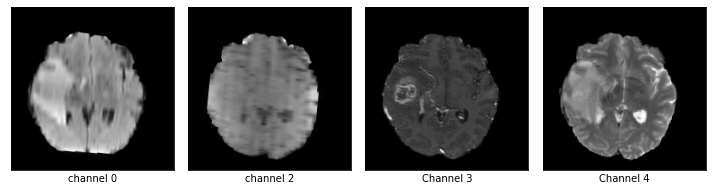

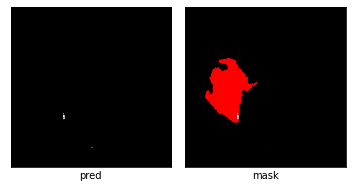

dice_loss : 0.1222015638132593



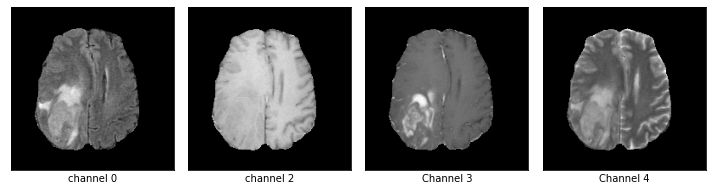

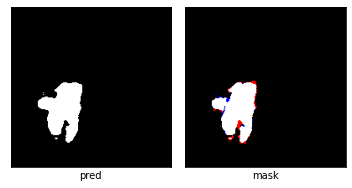

03/06 04:45:03 PM epoch 9 lr 2.229259e-02
03/06 04:45:03 PM genotype = Genotype(normal=[('skip_connect', 0), ('dil_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('sep_conv_5x5', 0), ('dil_conv_5x5', 1), ('dil_conv_5x5', 2), ('sep_conv_5x5', 3), ('sep_conv_5x5', 2), ('max_pool_3x3', 4), ('max_pool_3x3', 3)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.1905, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<41:04,  1.05s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.6813, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<40:42,  1.04s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.2327, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<40:27,  1.03s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<40:18,  1.03s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.8632, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<40:23,  1.03s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<40:30,  1.03s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<40:45,  1.04s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.0092, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<40:32,  1.04s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.0439, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<40:37,  1.04s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<40:33,  1.04s/it, Acc=0.98, IoU=0.791, Loss=0.116]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<40:56,  1.05s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<40:42,  1.04s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<40:44,  1.04s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<40:55,  1.05s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.2733, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<41:17,  1.06s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<41:02,  1.05s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<41:11,  1.06s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<41:05,  1.05s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:19<41:11,  1.06s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:20<40:50,  1.05s/it, Acc=0.997, IoU=0.902, Loss=0.0512]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:21<40:22,  1.04s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:22<40:02,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:23<40:02,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:24<40:03,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.1353, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:25<39:24,  1.01s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:26<39:24,  1.02s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.0489, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:28<39:39,  1.02s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.3282, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:28<39:19,  1.01s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.5070, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:29<39:01,  1.01s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.3492, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:30<39:02,  1.01s/it, Acc=0.996, IoU=0.948, Loss=0.0271]

tensor(0.9039, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:32<39:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00378]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:33<39:16,  1.01s/it, Acc=1, IoU=0, Loss=0.00378]

tensor(0.3746, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:34<38:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00378]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:35<38:37,  1.00it/s, Acc=1, IoU=0, Loss=0.00378]

tensor(0.2068, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:35<38:17,  1.01it/s, Acc=1, IoU=0, Loss=0.00378]

tensor(0.2612, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:36<38:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00378]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:37<38:25,  1.01it/s, Acc=1, IoU=0, Loss=0.00378]

tensor(0.3989, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:38<38:26,  1.00it/s, Acc=1, IoU=0, Loss=0.00378]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:39<38:41,  1.00s/it, Acc=1, IoU=0, Loss=0.00378]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:40<38:39,  1.00s/it, Acc=1, IoU=0, Loss=0.00378]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:42<38:48,  1.01s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.4648, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:43<39:00,  1.01s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:44<39:04,  1.01s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:45<38:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.0098, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:46<38:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:47<38:54,  1.01s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:48<38:54,  1.01s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:49<38:32,  1.00s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:50<38:33,  1.00s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.1865, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:51<38:33,  1.00s/it, Acc=1, IoU=0, Loss=0.00196]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:52<38:26,  1.00s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.1655, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:53<38:45,  1.01s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:54<39:00,  1.02s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:55<39:16,  1.02s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.1155, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:56<38:51,  1.01s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:57<38:42,  1.01s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:58<38:47,  1.01s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:59<38:29,  1.01s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [01:00<38:19,  1.00s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.5090, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:01<38:31,  1.01s/it, Acc=0.989, IoU=0.846, Loss=0.0872]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:02<38:40,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:03<38:42,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:04<38:37,  1.01s/it, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:05<38:53,  1.02s/it, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.5217, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:06<38:16,  1.00s/it, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:07<38:01,  1.00it/s, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.1802, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:08<37:55,  1.01it/s, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.5106, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:09<38:02,  1.00it/s, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:10<38:00,  1.00it/s, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:11<38:00,  1.00it/s, Acc=0.993, IoU=0.925, Loss=0.0389]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:12<38:20,  1.01s/it, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.6798, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:13<38:09,  1.00s/it, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:14<37:54,  1.00it/s, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:15<38:00,  1.00it/s, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:16<38:08,  1.00s/it, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:17<38:17,  1.01s/it, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:18<38:14,  1.01s/it, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.2243, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:19<38:08,  1.00s/it, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:20<38:04,  1.00s/it, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:21<37:55,  1.00s/it, Acc=0.988, IoU=0.865, Loss=0.0732]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:22<37:47,  1.00it/s, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.1510, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:23<38:03,  1.00s/it, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:24<37:51,  1.00it/s, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:25<37:55,  1.00s/it, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:26<37:52,  1.00s/it, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:27<37:58,  1.00s/it, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.3985, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:28<38:07,  1.01s/it, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:29<38:00,  1.01s/it, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:30<37:53,  1.00s/it, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:31<37:41,  1.00it/s, Acc=0.993, IoU=0.884, Loss=0.0633]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:32<37:31,  1.01it/s, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:33<37:43,  1.00s/it, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:34<37:43,  1.00s/it, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.9388, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:35<37:41,  1.00s/it, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:36<37:35,  1.00it/s, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.9509, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:37<37:11,  1.01it/s, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.4933, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:38<37:09,  1.01it/s, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:39<37:05,  1.01it/s, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:40<37:06,  1.01it/s, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.8821, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:41<37:01,  1.01it/s, Acc=0.993, IoU=0.818, Loss=0.101]

tensor(0.4774, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:42<37:09,  1.01it/s, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:43<37:26,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:44<37:28,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:45<37:28,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:46<37:30,  1.00s/it, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:47<37:17,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:48<37:22,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:49<37:31,  1.00s/it, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:50<37:24,  1.00it/s, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:51<37:29,  1.00s/it, Acc=0.992, IoU=0.853, Loss=0.0801]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:52<37:11,  1.01it/s, Acc=1, IoU=0, Loss=0.000429]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:53<37:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000429]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:54<37:25,  1.00s/it, Acc=1, IoU=0, Loss=0.000429]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:55<37:11,  1.00it/s, Acc=1, IoU=0, Loss=0.000429]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:56<37:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000429]

tensor(0.1505, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:57<37:26,  1.00s/it, Acc=1, IoU=0, Loss=0.000429]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:58<37:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000429]

tensor(0.1756, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [01:59<37:15,  1.00it/s, Acc=1, IoU=0, Loss=0.000429]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [02:00<37:01,  1.01it/s, Acc=1, IoU=0, Loss=0.000429]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:01<36:52,  1.01it/s, Acc=1, IoU=0, Loss=0.000429]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:02<36:54,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.0425, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:03<36:58,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:04<36:46,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:05<36:52,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.3933, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:06<37:06,  1.00it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:07<37:03,  1.00it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:08<36:59,  1.00it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:09<36:54,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:10<36:53,  1.01it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.1668, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:11<37:03,  1.00it/s, Acc=0.988, IoU=0.811, Loss=0.104]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:12<36:50,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:13<36:50,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:14<36:55,  1.00it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:15<36:51,  1.00it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.2895, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:16<36:44,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:17<36:37,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:18<36:30,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:19<36:30,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:19<36:35,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.5270, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:21<36:44,  1.00it/s, Acc=0.995, IoU=0.912, Loss=0.0462]

tensor(0.5519, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:22<36:50,  1.00it/s, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:23<36:57,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:23<36:41,  1.00it/s, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:24<36:38,  1.01it/s, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.1665, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:25<36:40,  1.00it/s, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.3610, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:26<36:43,  1.00it/s, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.1299, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:27<36:45,  1.00it/s, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0349, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:29<37:03,  1.01s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:30<36:46,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:31<36:48,  1.00s/it, Acc=0.995, IoU=0.919, Loss=0.0427]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:31<36:35,  1.00it/s, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:32<36:32,  1.00it/s, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:33<36:26,  1.01it/s, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.2726, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:34<36:29,  1.01it/s, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:35<36:37,  1.00it/s, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.6095, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:36<36:32,  1.00it/s, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.1513, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:38<37:38,  1.03s/it, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:39<36:51,  1.01s/it, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.6625, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:40<36:27,  1.00it/s, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:40<36:09,  1.01it/s, Acc=0.996, IoU=0.868, Loss=0.0735]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:41<36:14,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:42<36:18,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.6093, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:43<36:13,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:44<36:16,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:45<36:05,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:46<36:12,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:47<35:58,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:48<35:58,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:49<36:05,  1.01it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:50<36:20,  1.00it/s, Acc=0.993, IoU=0.0247, Loss=0.95]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:51<35:57,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.1126, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:52<35:58,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.6612, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:53<36:04,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:54<36:13,  1.00it/s, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.1415, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:55<36:31,  1.01s/it, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.1717, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:56<36:23,  1.00s/it, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:57<36:06,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [02:58<35:55,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [02:59<35:58,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.5737, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:00<36:02,  1.01it/s, Acc=0.996, IoU=0.882, Loss=0.062]

tensor(0.1278, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:01<35:50,  1.01it/s, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:02<36:28,  1.01s/it, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:03<36:19,  1.00s/it, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.7498, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:04<36:13,  1.00s/it, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:05<36:06,  1.00it/s, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:06<36:07,  1.00it/s, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:07<35:57,  1.00it/s, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.4903, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:08<36:04,  1.00it/s, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:09<36:21,  1.01s/it, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:10<36:30,  1.01s/it, Acc=0.998, IoU=0.669, Loss=0.198]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:11<36:08,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:12<36:18,  1.01s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:13<36:08,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:14<35:44,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.2566, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:15<35:49,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:16<35:50,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.9795, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:17<35:26,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:18<35:40,  1.01it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1918, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:19<35:53,  1.00it/s, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.1357, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:20<35:59,  1.00s/it, Acc=0.96, IoU=0, Loss=0.999]

tensor(0.8795, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:21<35:57,  1.00s/it, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.7073, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:22<36:05,  1.01s/it, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:23<36:02,  1.00s/it, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:24<35:47,  1.00it/s, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:25<35:47,  1.00it/s, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.7511, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:26<35:30,  1.01it/s, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.4952, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:27<35:36,  1.01it/s, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:28<35:36,  1.00it/s, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:29<35:32,  1.01it/s, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:30<35:29,  1.01it/s, Acc=0.999, IoU=0.808, Loss=0.112]

tensor(0.4718, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:31<35:31,  1.01it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.0952, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:32<35:25,  1.01it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.5990, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:33<35:51,  1.00s/it, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:34<35:35,  1.00it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.2144, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:35<35:33,  1.00it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.8482, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:36<35:23,  1.01it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:37<35:24,  1.01it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:38<35:20,  1.01it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.0535, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:39<35:07,  1.01it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.4771, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:40<35:10,  1.01it/s, Acc=0.997, IoU=0.825, Loss=0.0974]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:41<35:27,  1.00it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.2977, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:42<35:18,  1.01it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.5231, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:43<35:06,  1.01it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:44<35:06,  1.01it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:45<35:04,  1.01it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:46<35:12,  1.01it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.0462, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:47<35:19,  1.00it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:48<35:17,  1.00it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:49<35:13,  1.01it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.4083, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:50<35:11,  1.01it/s, Acc=0.996, IoU=0.935, Loss=0.0343]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:51<35:20,  1.00it/s, Acc=1, IoU=0, Loss=0.000424]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:52<35:28,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:53<35:30,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:54<35:28,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.2325, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:55<35:25,  1.00s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.2222, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:56<35:38,  1.01s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.2904, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:57<35:36,  1.01s/it, Acc=1, IoU=0, Loss=0.000424]

tensor(0.3122, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [03:58<35:02,  1.01it/s, Acc=1, IoU=0, Loss=0.000424]

tensor(0.8658, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [03:59<35:01,  1.01it/s, Acc=1, IoU=0, Loss=0.000424]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:00<35:10,  1.00it/s, Acc=1, IoU=0, Loss=0.000424]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:01<35:15,  1.00s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.3433, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:02<35:32,  1.01s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:03<35:33,  1.01s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.2133, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:04<35:13,  1.00s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:05<35:07,  1.00it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:06<35:04,  1.00it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.3400, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:07<35:09,  1.00s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.5078, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:08<35:26,  1.01s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:09<35:45,  1.02s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.1772, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:10<35:25,  1.01s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.8909, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:11<35:35,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.2269, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:12<35:33,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0380, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:13<35:12,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1084, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:14<34:53,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:15<34:45,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1770, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:16<34:47,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:17<34:34,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:18<34:55,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1137, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:19<34:51,  1.00it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:20<34:41,  1.01it/s, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:21<34:58,  1.00s/it, Acc=1, IoU=0, Loss=0.931]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:22<35:02,  1.00s/it, Acc=1, IoU=0, Loss=0.931]

tensor(0.6439, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:23<34:58,  1.00s/it, Acc=1, IoU=0, Loss=0.931]

tensor(0.9255, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:24<34:49,  1.00it/s, Acc=1, IoU=0, Loss=0.931]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:25<35:03,  1.01s/it, Acc=1, IoU=0, Loss=0.931]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:26<34:54,  1.00s/it, Acc=1, IoU=0, Loss=0.931]

tensor(0.1779, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:27<34:46,  1.00it/s, Acc=1, IoU=0, Loss=0.931]

tensor(0.6186, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:28<34:28,  1.01it/s, Acc=1, IoU=0, Loss=0.931]

tensor(0.5437, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:29<34:35,  1.01it/s, Acc=1, IoU=0, Loss=0.931]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:30<34:44,  1.00it/s, Acc=1, IoU=0, Loss=0.931]

tensor(0.2127, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:31<34:37,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:32<34:28,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.1691, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:33<34:30,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:34<34:32,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:35<34:31,  1.00it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:36<34:25,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:37<34:25,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:38<34:38,  1.00s/it, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:39<34:24,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:40<34:23,  1.01it/s, Acc=0.996, IoU=0.91, Loss=0.0476]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:41<34:29,  1.00it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.1591, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:42<34:24,  1.00it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.1370, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:43<34:28,  1.00it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:44<34:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.1272, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:45<34:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:46<34:19,  1.00it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:47<34:21,  1.00it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.0371, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:48<34:12,  1.01it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.4354, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:49<34:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.2355, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:50<34:22,  1.00it/s, Acc=1, IoU=0, Loss=0.00052]

tensor(0.3682, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:51<34:19,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:52<34:11,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1403, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:53<34:14,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.2974, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:54<34:26,  1.00s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:55<34:22,  1.00s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:56<34:06,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:57<34:01,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1341, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [04:58<33:56,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0361, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [04:59<34:07,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1633, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:00<34:01,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:01<34:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:02<34:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0368, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:03<33:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.1255, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:04<34:09,  1.00it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:05<33:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:06<33:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:07<33:57,  1.00it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.1381, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:08<34:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:09<34:06,  1.00s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:10<34:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.4555, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:11<34:25,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:12<34:27,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:13<34:26,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.1326, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:14<34:46,  1.02s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.9318, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:15<34:43,  1.02s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:16<34:30,  1.02s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:17<34:20,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:18<34:05,  1.00s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.1284, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:19<33:43,  1.01it/s, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:20<33:48,  1.00it/s, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.2680, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:21<33:43,  1.00it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:22<33:43,  1.00it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.1684, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:23<33:43,  1.00it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.7927, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:24<33:39,  1.01it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:25<33:44,  1.00it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.5549, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:26<33:36,  1.01it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.6358, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:27<33:28,  1.01it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:28<33:22,  1.01it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:29<33:33,  1.01it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:30<33:33,  1.01it/s, Acc=0.986, IoU=0.752, Loss=0.14]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:31<33:32,  1.01it/s, Acc=1, IoU=0, Loss=0.000646]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:32<33:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000646]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:33<33:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000646]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:34<33:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000646]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:35<33:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000646]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:36<33:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000646]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:37<33:07,  1.02it/s, Acc=1, IoU=0, Loss=0.000646]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:38<33:26,  1.01it/s, Acc=1, IoU=0, Loss=0.000646]

tensor(0.1566, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:39<33:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000646]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:40<33:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000646]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:41<33:48,  1.01s/it, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:42<33:43,  1.01s/it, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:43<33:36,  1.00s/it, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.9741, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:44<33:35,  1.00s/it, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:45<33:13,  1.01it/s, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:46<33:12,  1.01it/s, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.4708, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:47<33:35,  1.00s/it, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.5956, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:48<33:47,  1.01s/it, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:49<33:40,  1.01s/it, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:50<33:40,  1.01s/it, Acc=0.979, IoU=0.638, Loss=0.221]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:51<33:48,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.1169, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:52<33:43,  1.01s/it, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:53<33:24,  1.00s/it, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:54<33:09,  1.01it/s, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:55<33:06,  1.01it/s, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:56<33:06,  1.01it/s, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [05:57<32:49,  1.01it/s, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.2069, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [05:58<32:50,  1.01it/s, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.0364, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [05:59<32:53,  1.01it/s, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:00<32:51,  1.01it/s, Acc=0.995, IoU=0.905, Loss=0.0494]

tensor(0.2089, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:01<33:04,  1.00it/s, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:02<33:04,  1.00it/s, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.2663, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:03<33:14,  1.00s/it, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:04<33:08,  1.00it/s, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:05<33:31,  1.01s/it, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:06<33:31,  1.01s/it, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:07<33:36,  1.01s/it, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:08<33:24,  1.01s/it, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:09<33:21,  1.01s/it, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:10<33:28,  1.01s/it, Acc=0.989, IoU=0.871, Loss=0.0687]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:11<33:43,  1.02s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.0039, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:12<33:46,  1.02s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:13<33:53,  1.03s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:14<34:00,  1.03s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:15<33:53,  1.03s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:16<33:35,  1.02s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:17<33:31,  1.02s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:18<33:24,  1.01s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.2600, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:19<33:11,  1.01s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:20<33:02,  1.00s/it, Acc=0.998, IoU=0.937, Loss=0.0348]

tensor(0.0948, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:21<33:09,  1.01s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:22<32:58,  1.00s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:23<33:12,  1.01s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.1278, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:24<33:07,  1.01s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.8677, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:25<33:23,  1.02s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:26<33:00,  1.01s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:27<33:03,  1.01s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.9641, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:28<33:02,  1.01s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:29<32:45,  1.00it/s, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:30<32:52,  1.00s/it, Acc=0.994, IoU=0.854, Loss=0.0794]

tensor(0.3412, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:31<33:04,  1.01s/it, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.0418, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:32<33:07,  1.01s/it, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:33<32:56,  1.01s/it, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.1556, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:34<32:47,  1.00s/it, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:35<33:02,  1.01s/it, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:36<32:58,  1.01s/it, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:37<32:56,  1.01s/it, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.9516, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:38<32:45,  1.00s/it, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.1776, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:39<32:32,  1.00it/s, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.4151, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:40<32:29,  1.00it/s, Acc=0.994, IoU=0.916, Loss=0.0442]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:41<32:32,  1.00it/s, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:42<32:31,  1.00it/s, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.4539, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:43<32:30,  1.00it/s, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:44<32:44,  1.01s/it, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:45<32:44,  1.01s/it, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:46<32:46,  1.01s/it, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:47<32:44,  1.01s/it, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:48<32:30,  1.00s/it, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.1721, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:49<32:14,  1.01it/s, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.2265, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:50<32:32,  1.00s/it, Acc=0.993, IoU=0.67, Loss=0.197]

tensor(0.2248, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:51<32:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.2011, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:52<32:47,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:54<32:57,  1.02s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0400, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:55<33:04,  1.02s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.4770, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:56<32:55,  1.02s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:57<32:39,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.7411, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [06:58<32:20,  1.00s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [06:59<32:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.9891, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [07:00<32:18,  1.00s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.1455, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:01<32:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00121]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:02<32:19,  1.00s/it, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:03<32:07,  1.00it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:04<32:07,  1.00it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.4732, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:05<32:03,  1.00it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.8751, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:06<32:09,  1.00it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.3366, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:07<31:59,  1.01it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.0982, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:07<31:45,  1.01it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:08<31:46,  1.01it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.1310, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:09<31:35,  1.02it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:10<31:30,  1.02it/s, Acc=0.993, IoU=0.0396, Loss=0.911]

tensor(0.4093, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:11<31:57,  1.00it/s, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:13<32:23,  1.01s/it, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.9298, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:13<32:08,  1.00s/it, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.9471, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:14<31:59,  1.00it/s, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.4361, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:15<31:49,  1.01it/s, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:16<31:41,  1.01it/s, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:17<31:35,  1.01it/s, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:18<31:36,  1.01it/s, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.6403, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:19<31:41,  1.01it/s, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:20<31:43,  1.01it/s, Acc=0.992, IoU=0.785, Loss=0.123]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:21<31:53,  1.00it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:22<31:58,  1.00s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.5076, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:23<31:51,  1.00it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:24<31:47,  1.00it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:25<31:42,  1.00it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:26<31:53,  1.00s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1573, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:27<31:54,  1.00s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:28<31:57,  1.01s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:29<31:47,  1.00s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:30<31:42,  1.00it/s, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:31<31:47,  1.00s/it, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.0318, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:32<31:45,  1.00s/it, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:33<31:37,  1.00it/s, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.7103, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:34<31:47,  1.00s/it, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.6012, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:35<31:33,  1.00it/s, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:36<31:26,  1.01it/s, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.3144, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:37<31:21,  1.01it/s, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:38<31:13,  1.01it/s, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:39<31:21,  1.01it/s, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:40<31:29,  1.00it/s, Acc=0.979, IoU=0.655, Loss=0.208]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:41<31:16,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.5266, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:42<31:11,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1699, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:43<31:11,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:44<31:15,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:45<31:23,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.5339, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:46<31:23,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.7162, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:47<31:11,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0391, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:48<31:10,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:49<31:23,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2598, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:50<31:15,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:51<31:15,  1.00it/s, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.6331, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:52<31:36,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:53<31:34,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:54<31:36,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:55<31:30,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.8047, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [07:56<31:36,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.5870, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [07:57<31:49,  1.02s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [07:58<31:43,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.1693, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [07:59<31:42,  1.01s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [08:00<31:44,  1.02s/it, Acc=0.99, IoU=0.841, Loss=0.0878]

tensor(0.2459, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:01<31:43,  1.02s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:03<31:49,  1.02s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.2262, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:04<31:33,  1.01s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:05<31:34,  1.01s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.0970, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:06<31:32,  1.01s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:07<31:39,  1.02s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.5529, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:08<31:36,  1.02s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:09<31:31,  1.01s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.2176, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:10<31:35,  1.02s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.3928, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:11<31:26,  1.01s/it, Acc=0.995, IoU=0.863, Loss=0.0742]

tensor(0.1834, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:12<31:34,  1.02s/it, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.1508, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:13<31:22,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.0044, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:14<31:00,  1.00it/s, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.6174, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:15<30:57,  1.00it/s, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:16<30:54,  1.00it/s, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:17<31:08,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:18<30:52,  1.00it/s, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:19<30:54,  1.00it/s, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:20<30:46,  1.00it/s, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.8891, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:21<30:39,  1.01it/s, Acc=0.991, IoU=0.905, Loss=0.0509]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:22<30:48,  1.00it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.7021, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:23<30:49,  1.00it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:24<30:55,  1.00s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:25<30:57,  1.00s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:26<30:46,  1.00it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:27<30:36,  1.01it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:28<30:45,  1.00it/s, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.8742, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:29<30:58,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.6175, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:30<31:00,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.3037, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:31<30:56,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:32<30:58,  1.01s/it, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:33<31:18,  1.02s/it, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:34<31:20,  1.02s/it, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:35<31:11,  1.02s/it, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:36<31:03,  1.01s/it, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:37<30:46,  1.00s/it, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:38<30:38,  1.00s/it, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:39<30:36,  1.00it/s, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:40<30:29,  1.00it/s, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:41<30:36,  1.00s/it, Acc=0.996, IoU=0.55, Loss=0.292]

tensor(0.1791, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:42<30:26,  1.00it/s, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:43<30:24,  1.00it/s, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:44<30:30,  1.00it/s, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:45<30:35,  1.00s/it, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.3506, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:46<30:38,  1.00s/it, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.5744, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:47<30:43,  1.01s/it, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.4112, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:48<30:23,  1.00it/s, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:49<30:24,  1.00it/s, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:50<30:26,  1.00s/it, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:51<30:25,  1.00s/it, Acc=0.994, IoU=0.872, Loss=0.0685]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:52<30:25,  1.00s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:53<30:29,  1.00s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:54<30:28,  1.00s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.5585, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:55<30:22,  1.00s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.7228, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:56<30:12,  1.00it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.2651, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [08:57<30:17,  1.00it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0485, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [08:58<30:32,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9858, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [08:59<30:47,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [09:00<30:39,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [09:01<30:35,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:02<30:47,  1.02s/it, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:03<30:48,  1.02s/it, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:04<30:22,  1.01s/it, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.7016, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:05<30:04,  1.00it/s, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.4960, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:06<29:54,  1.01it/s, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:07<30:13,  1.00s/it, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:08<30:13,  1.00s/it, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.6266, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:09<30:22,  1.01s/it, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.2722, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:10<30:16,  1.01s/it, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:11<30:20,  1.01s/it, Acc=0.998, IoU=0.506, Loss=0.323]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:12<30:36,  1.02s/it, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:13<30:24,  1.01s/it, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:14<30:20,  1.01s/it, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:15<30:03,  1.00s/it, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.2713, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:16<30:05,  1.00s/it, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.6299, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:17<30:09,  1.01s/it, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:18<29:54,  1.00it/s, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.2728, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:19<29:55,  1.00it/s, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:20<30:04,  1.00s/it, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:21<30:07,  1.01s/it, Acc=0.992, IoU=0.805, Loss=0.107]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:22<30:06,  1.01s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:23<30:28,  1.02s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:24<30:17,  1.01s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:25<30:12,  1.01s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:26<30:26,  1.02s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:27<30:18,  1.02s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:28<30:03,  1.01s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:29<29:49,  1.00s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:30<29:42,  1.00it/s, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:31<29:46,  1.00s/it, Acc=0.998, IoU=0.65, Loss=0.218]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:32<29:50,  1.00s/it, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:33<29:54,  1.01s/it, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:34<29:42,  1.00s/it, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.7610, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:35<29:55,  1.01s/it, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:36<29:45,  1.00s/it, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:37<29:35,  1.00it/s, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.5093, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:38<29:30,  1.00it/s, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.1525, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:39<29:37,  1.00s/it, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.4678, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:40<29:50,  1.01s/it, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:41<29:59,  1.01s/it, Acc=0.982, IoU=0.8, Loss=0.112]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:42<29:55,  1.01s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:43<29:48,  1.01s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.0691, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:44<29:43,  1.01s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:45<31:28,  1.07s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:46<31:04,  1.05s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.1571, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:47<31:03,  1.05s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:48<30:59,  1.05s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.9304, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:49<30:46,  1.05s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:50<30:37,  1.04s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:51<30:47,  1.05s/it, Acc=0.989, IoU=0.889, Loss=0.0598]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:53<30:51,  1.05s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.5955, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:54<30:49,  1.05s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:55<31:07,  1.06s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:56<31:05,  1.06s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [09:57<31:06,  1.06s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.9334, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [09:58<30:50,  1.05s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [09:59<31:03,  1.06s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [10:00<30:57,  1.06s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.5608, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [10:01<31:07,  1.06s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:02<31:04,  1.06s/it, Acc=0.996, IoU=0.876, Loss=0.0677]

tensor(0.1931, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:03<31:14,  1.07s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.1332, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:04<31:20,  1.07s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:05<31:30,  1.08s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:06<31:20,  1.07s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.9888, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:07<31:06,  1.07s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.9443, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:09<31:14,  1.07s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:10<30:57,  1.06s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.7841, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:11<30:42,  1.05s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.1304, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:12<30:38,  1.05s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.1399, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:13<30:51,  1.06s/it, Acc=0.995, IoU=0.824, Loss=0.0973]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:14<30:49,  1.06s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:15<30:31,  1.05s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:16<30:23,  1.05s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.0981, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:17<30:06,  1.04s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:18<29:57,  1.03s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.1042, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:19<30:01,  1.04s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.4299, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:20<30:06,  1.04s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.1945, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:21<29:54,  1.03s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.8598, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:22<30:05,  1.04s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:23<29:55,  1.04s/it, Acc=0.992, IoU=0.911, Loss=0.048]

tensor(0.3575, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:24<29:47,  1.03s/it, Acc=1, IoU=0, Loss=0.000973]

tensor(0.6319, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:25<29:25,  1.02s/it, Acc=1, IoU=0, Loss=0.000973]

tensor(0.1607, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:26<29:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000973]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:27<29:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000973]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:28<28:55,  1.00s/it, Acc=1, IoU=0, Loss=0.000973]

tensor(0.3686, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:29<28:51,  1.00s/it, Acc=1, IoU=0, Loss=0.000973]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:30<28:46,  1.00it/s, Acc=1, IoU=0, Loss=0.000973]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:31<28:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000973]

tensor(0.6914, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:32<28:42,  1.00it/s, Acc=1, IoU=0, Loss=0.000973]

tensor(0.2594, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:33<29:10,  1.01s/it, Acc=1, IoU=0, Loss=0.000973]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:34<29:06,  1.01s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:35<29:18,  1.02s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:36<29:28,  1.03s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.0061, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:37<29:12,  1.02s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.2700, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:38<29:06,  1.02s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:39<28:55,  1.01s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.0390, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:40<28:54,  1.01s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:41<28:43,  1.00s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:42<28:35,  1.00it/s, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:43<28:40,  1.00s/it, Acc=0.994, IoU=0.925, Loss=0.0395]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:44<28:53,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.9287, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:45<28:59,  1.02s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.0451, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:46<29:08,  1.02s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.1461, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:47<29:00,  1.02s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:48<28:51,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:49<28:47,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:50<28:44,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.6469, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:51<28:41,  1.01s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.0423, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:52<28:31,  1.00s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.1348, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:53<28:29,  1.00s/it, Acc=0.992, IoU=0.904, Loss=0.0517]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:54<28:31,  1.00s/it, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:55<28:24,  1.00s/it, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:56<28:11,  1.01it/s, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:57<28:10,  1.01it/s, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.1132, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [10:58<28:12,  1.00it/s, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.1825, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [10:59<28:13,  1.00it/s, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.5593, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [11:00<28:04,  1.01it/s, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [11:01<28:11,  1.00it/s, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.8912, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [11:02<28:19,  1.00s/it, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:03<28:22,  1.00s/it, Acc=0.997, IoU=0.855, Loss=0.0801]

tensor(0.9459, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:04<29:08,  1.03s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.3475, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:05<28:46,  1.02s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:06<28:33,  1.01s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.1520, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:07<28:26,  1.01s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.1749, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:08<28:30,  1.01s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:09<28:28,  1.01s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.7722, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:10<28:27,  1.01s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.3105, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:11<28:20,  1.01s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.7353, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:12<28:30,  1.01s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.4145, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:13<28:24,  1.01s/it, Acc=0.997, IoU=0.929, Loss=0.0385]

tensor(0.1614, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:15<28:45,  1.02s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.0322, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:16<29:10,  1.04s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:17<29:04,  1.04s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:18<28:58,  1.03s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:19<29:04,  1.04s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:20<28:37,  1.02s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:21<28:38,  1.02s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:22<28:30,  1.02s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.4939, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:23<28:28,  1.02s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:24<28:26,  1.02s/it, Acc=0.982, IoU=0.699, Loss=0.179]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:25<28:28,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.1983, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:26<28:44,  1.03s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.2021, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:27<28:39,  1.03s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:28<28:33,  1.03s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:29<28:30,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:30<28:25,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.2960, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:31<28:22,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:32<28:16,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:33<28:12,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.5166, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:34<28:20,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.128]

tensor(0.3069, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:35<28:04,  1.01s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:36<28:06,  1.01s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.1544, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:37<27:58,  1.01s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.1791, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:38<28:02,  1.01s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:39<27:55,  1.01s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:40<27:52,  1.01s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.3107, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:41<28:12,  1.02s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.4121, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:42<28:18,  1.02s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:43<28:08,  1.02s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.1528, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:44<28:14,  1.02s/it, Acc=0.996, IoU=0.919, Loss=0.0421]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:45<28:21,  1.03s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:46<28:14,  1.03s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.2509, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:47<28:05,  1.02s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.2064, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:48<27:53,  1.01s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.1957, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:49<28:01,  1.02s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:50<27:49,  1.01s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:51<28:03,  1.02s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.7881, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:52<27:57,  1.02s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:53<27:58,  1.02s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:54<27:53,  1.02s/it, Acc=0.995, IoU=0.852, Loss=0.0811]

tensor(0.1139, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:55<27:52,  1.02s/it, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:56<27:43,  1.01s/it, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:57<27:35,  1.01s/it, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:58<27:31,  1.01s/it, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [11:59<27:22,  1.00s/it, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [12:00<27:12,  1.00it/s, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.1661, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [12:01<27:15,  1.00it/s, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.3641, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [12:02<27:14,  1.00it/s, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.0359, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [12:03<27:19,  1.00s/it, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:04<27:12,  1.00it/s, Acc=0.983, IoU=0.432, Loss=0.397]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:05<27:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.3918, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:06<27:48,  1.02s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.1647, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:07<27:43,  1.02s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:08<27:13,  1.00s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.9457, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:09<27:12,  1.00s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:10<27:07,  1.00it/s, Acc=1, IoU=0, Loss=0.000288]

tensor(0.6070, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:11<26:55,  1.01it/s, Acc=1, IoU=0, Loss=0.000288]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:12<26:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000288]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:13<26:56,  1.01it/s, Acc=1, IoU=0, Loss=0.000288]

tensor(0.8610, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:14<26:49,  1.01it/s, Acc=1, IoU=0, Loss=0.000288]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:15<26:44,  1.01it/s, Acc=1, IoU=0, Loss=0.000196]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:16<26:46,  1.01it/s, Acc=1, IoU=0, Loss=0.000196]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:17<26:59,  1.00it/s, Acc=1, IoU=0, Loss=0.000196]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:18<27:03,  1.00s/it, Acc=1, IoU=0, Loss=0.000196]

tensor(0.0902, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:19<27:05,  1.00s/it, Acc=1, IoU=0, Loss=0.000196]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:20<27:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000196]

tensor(0.2546, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:21<27:05,  1.00s/it, Acc=1, IoU=0, Loss=0.000196]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:22<27:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000196]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:23<27:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000196]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:24<26:56,  1.00s/it, Acc=1, IoU=0, Loss=0.000196]

tensor(0.8603, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:25<26:48,  1.00it/s, Acc=1, IoU=0, Loss=0.000344]

tensor(0.7507, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:26<26:39,  1.01it/s, Acc=1, IoU=0, Loss=0.000344]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:27<26:50,  1.00it/s, Acc=1, IoU=0, Loss=0.000344]

tensor(0.9280, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:28<26:49,  1.00it/s, Acc=1, IoU=0, Loss=0.000344]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:29<26:56,  1.00s/it, Acc=1, IoU=0, Loss=0.000344]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:30<26:49,  1.00s/it, Acc=1, IoU=0, Loss=0.000344]

tensor(0.2592, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:31<26:51,  1.00s/it, Acc=1, IoU=0, Loss=0.000344]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:32<26:50,  1.00s/it, Acc=1, IoU=0, Loss=0.000344]

tensor(0.9232, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:33<26:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000344]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:34<26:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000344]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:35<26:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.1304, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:36<26:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.1503, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:37<26:46,  1.00s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.4414, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:38<26:48,  1.00s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:39<26:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.0371, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:40<26:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:41<27:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:42<26:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:43<26:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.3281, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:45<26:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000767]

tensor(0.1171, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:46<27:03,  1.02s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:47<27:12,  1.02s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:48<27:05,  1.02s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.2879, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:49<27:05,  1.02s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:50<27:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:51<27:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.2240, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:52<26:54,  1.02s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0959, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:53<26:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:54<26:31,  1.00s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:55<26:24,  1.00it/s, Acc=1, IoU=0, Loss=0.00178]

tensor(0.3039, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:56<26:26,  1.00s/it, Acc=1, IoU=0, Loss=0.000691]

tensor(0.3200, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:57<26:24,  1.00s/it, Acc=1, IoU=0, Loss=0.000691]

tensor(0.1550, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:58<26:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000691]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [12:59<26:16,  1.00it/s, Acc=1, IoU=0, Loss=0.000691]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [13:00<26:15,  1.00it/s, Acc=1, IoU=0, Loss=0.000691]

tensor(0.0976, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [13:01<26:15,  1.00it/s, Acc=1, IoU=0, Loss=0.000691]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [13:02<26:03,  1.01it/s, Acc=1, IoU=0, Loss=0.000691]

tensor(0.5832, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [13:03<26:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000691]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [13:04<25:59,  1.01it/s, Acc=1, IoU=0, Loss=0.000691]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:05<25:51,  1.02it/s, Acc=1, IoU=0, Loss=0.000691]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:06<25:45,  1.02it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.6872, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:07<25:50,  1.01it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.4706, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:07<25:31,  1.03it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.1098, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:08<25:33,  1.02it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.3660, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:09<25:40,  1.02it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:10<25:44,  1.02it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:11<25:56,  1.01it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:12<26:09,  1.00s/it, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:13<26:00,  1.00it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.3678, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:14<25:36,  1.02it/s, Acc=0.993, IoU=0.872, Loss=0.0683]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:15<25:34,  1.02it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.5512, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:16<25:23,  1.03it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:17<25:26,  1.02it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:18<25:32,  1.02it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.4901, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:19<25:29,  1.02it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:20<25:22,  1.02it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.2191, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:21<25:36,  1.01it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:22<25:23,  1.02it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.9853, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:23<25:17,  1.03it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.2882, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:24<25:26,  1.02it/s, Acc=0.984, IoU=0.679, Loss=0.19]

tensor(0.6138, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:25<25:28,  1.02it/s, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:26<25:49,  1.00it/s, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.2867, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:27<25:43,  1.01it/s, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:28<25:33,  1.01it/s, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:29<25:39,  1.01it/s, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.8031, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:30<25:53,  1.00s/it, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:31<25:57,  1.01s/it, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:32<26:03,  1.01s/it, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:33<25:49,  1.00s/it, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.1506, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:34<25:46,  1.00s/it, Acc=0.994, IoU=0.75, Loss=0.143]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:35<25:33,  1.01it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:36<25:36,  1.00it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.4000, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:37<25:33,  1.01it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.3475, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:38<25:22,  1.01it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.0282, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:39<25:13,  1.02it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:40<25:10,  1.02it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:41<25:15,  1.01it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:42<25:32,  1.00it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:43<25:21,  1.01it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:44<25:15,  1.01it/s, Acc=0.985, IoU=0.856, Loss=0.077]

tensor(0.0902, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:45<25:07,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1579, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:46<25:03,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:47<24:52,  1.03it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.7641, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:48<25:01,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:49<25:07,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:50<25:01,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:51<25:08,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:52<24:59,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:53<24:52,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.4560, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:54<24:54,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1791, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:55<25:05,  1.01it/s, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:56<25:24,  1.00s/it, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.1506, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [13:57<25:21,  1.00it/s, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [13:58<25:18,  1.00it/s, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [13:59<25:18,  1.00it/s, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [14:00<25:05,  1.01it/s, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [14:01<24:59,  1.01it/s, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:02<25:00,  1.01it/s, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:03<25:15,  1.00it/s, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:04<25:29,  1.01s/it, Acc=0.993, IoU=0.855, Loss=0.0803]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:05<25:36,  1.01s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.5383, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:06<25:33,  1.01s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:07<25:22,  1.01s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:08<25:18,  1.00s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.1380, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:09<25:13,  1.00s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:10<25:09,  1.00s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.3317, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:11<25:17,  1.01s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.1209, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:12<25:13,  1.00s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9696, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:13<24:58,  1.00it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.6647, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:14<24:42,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:15<24:35,  1.02it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:16<24:57,  1.00it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:17<24:57,  1.00it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:18<24:57,  1.00it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.4501, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:19<24:48,  1.01it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.3469, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:20<24:46,  1.01it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:21<24:53,  1.00it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.6599, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:22<24:52,  1.00it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:23<24:47,  1.01it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.3381, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:24<24:44,  1.01it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:25<24:34,  1.01it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:26<24:34,  1.01it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:27<24:30,  1.01it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:28<24:26,  1.02it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.0483, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:29<24:25,  1.02it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:30<24:34,  1.01it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.1269, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:31<24:34,  1.01it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:32<24:28,  1.01it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:33<24:27,  1.01it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:34<24:29,  1.01it/s, Acc=0.998, IoU=0.965, Loss=0.0177]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:35<24:36,  1.01it/s, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:36<24:44,  1.00s/it, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:37<24:39,  1.00it/s, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.7281, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:38<24:54,  1.01s/it, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.1513, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:39<24:41,  1.00s/it, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:40<24:24,  1.01it/s, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:41<24:21,  1.01it/s, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:42<24:23,  1.01it/s, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.0497, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:43<24:18,  1.01it/s, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:44<24:19,  1.01it/s, Acc=0.988, IoU=0.814, Loss=0.104]

tensor(0.1381, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:45<24:36,  1.00s/it, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:46<24:40,  1.01s/it, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:47<24:25,  1.00it/s, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.6374, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:48<24:21,  1.01it/s, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:49<24:15,  1.01it/s, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:50<24:04,  1.02it/s, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.1210, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:51<23:54,  1.02it/s, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.0483, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:52<23:52,  1.02it/s, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.1930, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:53<23:56,  1.02it/s, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.2844, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:54<24:02,  1.02it/s, Acc=0.987, IoU=0.891, Loss=0.0578]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:55<24:12,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.1249, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:56<24:10,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [14:57<24:11,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [14:58<24:13,  1.00it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [14:59<24:07,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.3493, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [14:59<24:04,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [15:01<24:16,  1.00it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:02<24:14,  1.00it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:03<24:17,  1.00s/it, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:03<24:05,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0264]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:04<23:58,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.7615, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:05<24:07,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:06<24:06,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:07<23:56,  1.01it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.3299, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:08<24:04,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:09<24:14,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:10<24:16,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.3805, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:11<24:10,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:12<24:04,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.4643, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:13<24:06,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.7073, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:14<24:04,  1.00s/it, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:15<23:56,  1.00it/s, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.1640, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:16<24:03,  1.00s/it, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:17<24:03,  1.00s/it, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:18<23:52,  1.01it/s, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.6080, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:19<23:35,  1.02it/s, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:20<23:30,  1.02it/s, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:21<23:36,  1.01it/s, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:22<23:42,  1.01it/s, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:23<23:45,  1.01it/s, Acc=0.99, IoU=0.715, Loss=0.17]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:24<23:48,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:25<23:47,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9125, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:26<23:47,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:27<23:49,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:28<23:42,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.5400, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:29<23:40,  1.01it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:30<23:44,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.8663, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:31<23:48,  1.00s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:32<23:53,  1.01s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.5442, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:33<23:42,  1.00it/s, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:34<23:29,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:35<23:42,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.6049, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:36<23:37,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:37<23:28,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:38<23:33,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:39<23:28,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:40<23:12,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0291, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:41<23:25,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0368, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:42<23:25,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.8751, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:43<23:25,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.6170, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:44<23:21,  1.01it/s, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:45<23:18,  1.01it/s, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:46<23:17,  1.01it/s, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:47<23:46,  1.01s/it, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:48<23:40,  1.01s/it, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:49<23:26,  1.00it/s, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:50<23:29,  1.00s/it, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.9266, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:51<23:16,  1.01it/s, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.8324, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:52<23:18,  1.01it/s, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.2406, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:53<23:22,  1.00it/s, Acc=0.987, IoU=0.689, Loss=0.186]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:54<23:09,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:55<23:07,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.5413, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [15:56<22:55,  1.02it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.1679, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [15:57<22:50,  1.02it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [15:58<23:02,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [15:59<22:53,  1.02it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [16:00<22:52,  1.02it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.0534, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:01<23:07,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.4567, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:02<22:59,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:03<22:54,  1.01it/s, Acc=0.99, IoU=0.841, Loss=0.0872]

tensor(0.8501, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:04<22:54,  1.01it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:05<22:56,  1.01it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:06<23:10,  1.00it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:07<23:13,  1.00s/it, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:08<23:01,  1.01it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.2656, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:09<23:08,  1.00it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:10<22:58,  1.01it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:11<22:54,  1.01it/s, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.2755, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:12<23:07,  1.00s/it, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:13<23:05,  1.00s/it, Acc=0.996, IoU=0.952, Loss=0.0261]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:14<22:59,  1.00it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:15<23:03,  1.00s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:16<23:01,  1.00it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:17<22:55,  1.00it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:18<22:53,  1.00it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:19<22:44,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:20<22:41,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2969, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:21<22:40,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:22<22:39,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0480, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:23<22:40,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3361, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:24<22:40,  1.01it/s, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.0896, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:25<22:42,  1.01it/s, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:26<22:41,  1.01it/s, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.3305, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:27<23:01,  1.01s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:28<23:02,  1.01s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.1225, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:29<22:54,  1.00s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:30<22:44,  1.00it/s, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:31<22:41,  1.00it/s, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:32<22:52,  1.00s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.3176, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:33<22:43,  1.00it/s, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:34<22:41,  1.00it/s, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:35<22:26,  1.01it/s, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:36<22:26,  1.01it/s, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:37<22:44,  1.00s/it, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.0392, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:38<22:51,  1.01s/it, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.3712, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:39<22:47,  1.01s/it, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:40<22:37,  1.00it/s, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:41<22:21,  1.01it/s, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.3173, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:42<22:10,  1.02it/s, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.2671, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:43<22:07,  1.02it/s, Acc=0.997, IoU=0.504, Loss=0.326]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:44<22:14,  1.01it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:45<22:17,  1.01it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:46<22:07,  1.02it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.9648, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:47<22:10,  1.02it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.0051, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:48<22:24,  1.00it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.1587, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:49<22:17,  1.01it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.6786, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:50<22:21,  1.01it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:51<22:17,  1.01it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:52<22:04,  1.02it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:53<22:10,  1.01it/s, Acc=0.988, IoU=0.527, Loss=0.313]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:54<22:14,  1.01it/s, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.4915, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [16:55<22:23,  1.00s/it, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.6072, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [16:56<22:24,  1.00s/it, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [16:57<22:22,  1.00s/it, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [16:58<22:20,  1.00s/it, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.7938, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [16:59<22:20,  1.00s/it, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [17:00<22:10,  1.01it/s, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:01<21:57,  1.01it/s, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:02<22:01,  1.01it/s, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.4941, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:03<21:58,  1.01it/s, Acc=0.996, IoU=0.818, Loss=0.106]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:04<21:56,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:05<21:59,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:06<21:56,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.5258, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:07<21:56,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:08<21:45,  1.02it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:09<21:47,  1.02it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.5287, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:10<21:47,  1.02it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:11<21:49,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:12<21:51,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:13<21:56,  1.01it/s, Acc=0.996, IoU=0.901, Loss=0.054]

tensor(0.1510, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:14<21:58,  1.00it/s, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.2611, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:15<21:57,  1.00it/s, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:16<21:52,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.4003, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:17<21:48,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:18<21:44,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:19<21:46,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:20<21:52,  1.00it/s, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.3483, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:21<21:48,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:22<22:02,  1.00s/it, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:23<22:07,  1.01s/it, Acc=0.995, IoU=0.91, Loss=0.0482]

tensor(0.5732, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:24<22:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.6139, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:25<22:09,  1.01s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:26<22:09,  1.01s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.2305, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:27<22:01,  1.01s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:28<21:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:29<21:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:30<21:51,  1.00s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:31<21:45,  1.00it/s, Acc=1, IoU=0, Loss=0.00274]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:32<21:47,  1.00s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:33<21:52,  1.01s/it, Acc=1, IoU=0, Loss=0.00274]

tensor(0.0404, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:34<21:57,  1.01s/it, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:35<22:03,  1.02s/it, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.6072, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:36<21:54,  1.01s/it, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:37<21:41,  1.00s/it, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.9093, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:38<21:40,  1.00s/it, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:39<21:37,  1.00it/s, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:40<21:32,  1.00it/s, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.3029, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:41<21:29,  1.01it/s, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:42<21:36,  1.00s/it, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.6463, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:43<21:37,  1.00s/it, Acc=0.984, IoU=0.867, Loss=0.0715]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:44<21:33,  1.00it/s, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.0413, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:45<21:37,  1.00s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:46<21:45,  1.01s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.0445, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:47<21:46,  1.01s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:48<21:48,  1.01s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.1456, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:49<21:55,  1.02s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:50<21:51,  1.02s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:51<21:39,  1.01s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:52<21:50,  1.02s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.3286, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:53<21:44,  1.02s/it, Acc=0.989, IoU=0.884, Loss=0.0627]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:54<21:37,  1.01s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.2835, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:55<21:42,  1.02s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.1650, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [17:56<21:36,  1.01s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [17:57<21:40,  1.02s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.8957, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [17:58<21:37,  1.01s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [17:59<21:32,  1.01s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.4217, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [18:00<21:36,  1.01s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.4956, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:01<21:44,  1.02s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.2624, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:02<21:36,  1.02s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:03<21:40,  1.02s/it, Acc=0.993, IoU=0.855, Loss=0.0779]

tensor(0.4955, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:04<21:46,  1.03s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.3795, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:05<21:49,  1.03s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.3754, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:06<21:36,  1.02s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:07<21:27,  1.01s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:08<21:26,  1.01s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.5456, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:09<21:19,  1.01s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.1095, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:10<21:06,  1.00it/s, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.1461, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:11<21:09,  1.00s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.0751, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:12<21:10,  1.00s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.2547, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:13<21:11,  1.01s/it, Acc=0.989, IoU=0.843, Loss=0.0848]

tensor(0.5433, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:14<21:12,  1.01s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:15<21:21,  1.01s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:16<21:32,  1.02s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.0435, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:17<21:26,  1.02s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:18<21:26,  1.02s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:19<21:16,  1.01s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:20<21:19,  1.02s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:21<21:21,  1.02s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:22<21:08,  1.01s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.6516, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:23<21:10,  1.01s/it, Acc=0.994, IoU=0.0421, Loss=0.916]

tensor(0.3790, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:24<21:12,  1.01s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.2028, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:25<21:22,  1.02s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:26<21:24,  1.03s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:27<21:17,  1.02s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:28<21:13,  1.02s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.1801, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:29<21:17,  1.02s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.1859, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:30<21:15,  1.02s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.6917, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:32<21:17,  1.02s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:32<20:53,  1.01s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.4644, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:33<20:45,  1.00s/it, Acc=0.997, IoU=0.412, Loss=0.407]

tensor(0.2130, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:34<20:33,  1.01it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:35<20:27,  1.01it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:36<20:16,  1.02it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:37<20:15,  1.02it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.1687, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:38<20:08,  1.03it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.1337, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:39<20:08,  1.02it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:40<20:12,  1.02it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:41<20:23,  1.01it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:42<20:27,  1.01it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:43<20:20,  1.01it/s, Acc=0.997, IoU=0.874, Loss=0.069]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:44<20:10,  1.02it/s, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.2480, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:45<20:13,  1.02it/s, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.9863, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:46<20:14,  1.01it/s, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:47<20:10,  1.02it/s, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.0400, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:48<20:13,  1.01it/s, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.0561, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:49<20:15,  1.01it/s, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:50<20:24,  1.00it/s, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:51<20:23,  1.00it/s, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.2251, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:52<20:26,  1.00s/it, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.6202, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:53<20:27,  1.00s/it, Acc=0.994, IoU=0.833, Loss=0.0925]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:54<20:19,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:55<20:15,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:56<20:16,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [18:57<20:00,  1.02it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.6754, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [18:58<19:49,  1.03it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [18:59<19:53,  1.02it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:00<20:03,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.2451, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:01<19:57,  1.02it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:02<19:55,  1.02it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:03<20:04,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:04<20:17,  1.00s/it, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:05<20:24,  1.01s/it, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:06<20:16,  1.00s/it, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:07<20:18,  1.01s/it, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:08<20:21,  1.01s/it, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.2677, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:09<20:09,  1.00s/it, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.5096, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:10<19:57,  1.01it/s, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:11<19:51,  1.01it/s, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:12<19:50,  1.01it/s, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:13<20:04,  1.00it/s, Acc=0.992, IoU=0.902, Loss=0.052]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:14<20:03,  1.00it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:15<19:54,  1.01it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.6879, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:16<19:52,  1.01it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:17<19:50,  1.01it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:18<19:44,  1.01it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:19<19:47,  1.01it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:20<19:49,  1.01it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:21<19:39,  1.01it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.9709, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:22<19:32,  1.02it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:23<19:26,  1.02it/s, Acc=1, IoU=0, Loss=0.000474]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:24<19:38,  1.01it/s, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.4945, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:25<19:46,  1.01it/s, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.5618, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:26<19:41,  1.01it/s, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:27<19:35,  1.01it/s, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.1568, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:28<20:02,  1.01s/it, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.1643, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:29<19:53,  1.00s/it, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:30<19:48,  1.00s/it, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:31<19:48,  1.00s/it, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:32<19:42,  1.00it/s, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:33<19:42,  1.00it/s, Acc=0.997, IoU=0.916, Loss=0.0452]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:34<19:39,  1.00it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.1262, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:35<19:44,  1.00s/it, Acc=1, IoU=0, Loss=0.00222]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:36<19:38,  1.00it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:37<19:27,  1.01it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.1125, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:38<19:24,  1.01it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:39<19:24,  1.01it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:40<19:16,  1.02it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.1306, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:41<19:23,  1.01it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.1024, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:42<19:20,  1.01it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.5661, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:43<19:18,  1.01it/s, Acc=1, IoU=0, Loss=0.00222]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:44<19:11,  1.02it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:45<19:08,  1.02it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:46<19:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.1455, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:47<19:13,  1.01it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:48<19:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:49<19:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:50<19:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:51<19:09,  1.02it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:52<19:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.1743, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:53<19:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000523]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:54<19:09,  1.01it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.6878, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:55<19:14,  1.01it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:56<19:17,  1.00it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [19:57<19:16,  1.00it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [19:58<19:06,  1.01it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.3442, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [19:59<18:56,  1.02it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:00<18:58,  1.02it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:01<18:56,  1.02it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:02<18:52,  1.02it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.0061, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:02<18:53,  1.02it/s, Acc=0.98, IoU=0.801, Loss=0.11]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:03<18:52,  1.02it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:04<18:55,  1.02it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.2606, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:05<18:53,  1.02it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:06<19:01,  1.01it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:07<19:01,  1.01it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:08<18:56,  1.01it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:09<18:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:10<18:49,  1.02it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:11<18:42,  1.02it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.2373, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:12<18:51,  1.01it/s, Acc=1, IoU=0, Loss=0.000372]

tensor(0.2417, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:13<18:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:14<18:46,  1.02it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:15<18:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:16<18:42,  1.02it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:17<18:33,  1.02it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.3601, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:18<18:37,  1.02it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.1407, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:19<18:31,  1.02it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.6432, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:20<18:30,  1.02it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:21<18:36,  1.02it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:22<18:41,  1.01it/s, Acc=1, IoU=0, Loss=0.00198]

tensor(0.5693, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:23<18:32,  1.02it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:24<18:35,  1.02it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.2841, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:25<18:37,  1.01it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:26<18:31,  1.02it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.3776, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:27<18:29,  1.02it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.1607, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:28<18:31,  1.02it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:29<18:33,  1.01it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.2503, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:30<18:36,  1.01it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.9518, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:31<18:31,  1.01it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:32<18:26,  1.02it/s, Acc=0.989, IoU=0.783, Loss=0.123]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:33<18:23,  1.02it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.2439, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:34<18:24,  1.02it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:35<18:19,  1.02it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1881, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:36<18:23,  1.02it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:37<18:20,  1.02it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1044, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:38<18:11,  1.03it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:39<18:19,  1.02it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:40<18:19,  1.02it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.7017, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:41<18:16,  1.02it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:42<18:30,  1.00it/s, Acc=1, IoU=0, Loss=0.000227]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:43<18:28,  1.01it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:44<18:29,  1.00it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:45<18:29,  1.00it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.2605, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:46<18:21,  1.01it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.5809, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:47<18:14,  1.01it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:48<18:19,  1.01it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:49<18:23,  1.00it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:50<18:16,  1.01it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.3690, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:51<18:11,  1.01it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.3596, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:52<18:12,  1.01it/s, Acc=0.993, IoU=0.607, Loss=0.245]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:53<18:07,  1.02it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:54<18:07,  1.01it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:55<18:03,  1.02it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.0416, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:56<18:01,  1.02it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.3483, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [20:57<18:02,  1.02it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.9228, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [20:58<17:57,  1.02it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.8307, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [20:59<17:59,  1.02it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:00<17:52,  1.02it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.7588, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:01<17:46,  1.03it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.6591, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:02<18:03,  1.01it/s, Acc=0.988, IoU=0.812, Loss=0.104]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:03<18:01,  1.01it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:04<18:08,  1.00it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.1252, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:05<18:11,  1.00it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:06<17:55,  1.01it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:07<17:48,  1.02it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:08<17:42,  1.02it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:08<17:37,  1.03it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:09<17:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:10<17:39,  1.03it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.5066, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:11<17:34,  1.03it/s, Acc=1, IoU=0, Loss=0.000501]

tensor(0.0457, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:12<17:41,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:13<17:49,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:14<17:49,  1.01it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:15<17:41,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:16<17:40,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:17<17:38,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:18<17:38,  1.02it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:19<17:29,  1.03it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:20<17:20,  1.03it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.2368, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:21<17:24,  1.03it/s, Acc=0.996, IoU=0.948, Loss=0.0277]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:22<17:22,  1.03it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:23<17:28,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.4421, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:24<17:30,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.3508, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:25<17:29,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:26<17:25,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:27<17:26,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.3561, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:28<17:23,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:29<17:22,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:30<17:24,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:31<17:19,  1.02it/s, Acc=1, IoU=0, Loss=0.000283]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:32<17:13,  1.03it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.5410, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:33<17:11,  1.03it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:34<17:07,  1.03it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:35<17:06,  1.03it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:36<17:13,  1.03it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.6444, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:37<17:11,  1.03it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:38<17:36,  1.00it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.2097, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:39<17:32,  1.00it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:40<17:24,  1.01it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:41<17:23,  1.01it/s, Acc=0.997, IoU=0.767, Loss=0.135]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:42<17:21,  1.01it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:43<17:29,  1.00it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:44<17:19,  1.01it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:45<17:30,  1.00it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.1366, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:46<17:26,  1.00it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.5857, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:47<17:18,  1.01it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:48<17:24,  1.00it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:49<17:27,  1.00s/it, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.5372, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:50<17:19,  1.01it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.1439, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:51<17:10,  1.01it/s, Acc=0.996, IoU=0.92, Loss=0.0431]

tensor(0.4710, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:52<17:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.8660, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:53<17:05,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.3981, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:54<17:03,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:55<17:02,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [21:56<16:57,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [21:57<16:54,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.2543, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [21:58<16:59,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [21:59<17:03,  1.01it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.4819, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:00<17:00,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:01<16:55,  1.02it/s, Acc=1, IoU=0, Loss=0.000325]

tensor(0.9140, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:02<16:50,  1.02it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:03<16:55,  1.02it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:04<17:00,  1.01it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.0433, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:05<16:54,  1.02it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.1083, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:05<16:48,  1.02it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:06<16:41,  1.03it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.5622, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:07<16:45,  1.02it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.3164, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:08<16:45,  1.02it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.1380, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:09<16:44,  1.02it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:10<16:41,  1.02it/s, Acc=0.996, IoU=0.389, Loss=0.436]

tensor(0.1331, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:11<16:43,  1.02it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:12<17:01,  1.00it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:13<16:59,  1.00it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:14<16:51,  1.01it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:15<16:53,  1.01it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:16<16:51,  1.01it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:17<16:52,  1.01it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.2624, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:18<16:53,  1.00it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.9707, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:19<16:53,  1.00it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.0376, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:20<16:49,  1.01it/s, Acc=0.997, IoU=0.902, Loss=0.0531]

tensor(0.5881, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:21<16:44,  1.01it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:22<16:50,  1.00it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:23<16:49,  1.00it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:24<16:45,  1.01it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.1018, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:25<16:32,  1.02it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.6635, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:26<16:33,  1.02it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:27<16:37,  1.01it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.1452, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:28<16:33,  1.01it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.1196, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:29<16:23,  1.02it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:30<16:25,  1.02it/s, Acc=0.999, IoU=0.899, Loss=0.0535]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:31<16:30,  1.01it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.1300, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:32<16:28,  1.01it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:33<16:21,  1.02it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:34<16:22,  1.02it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.5221, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:35<16:18,  1.02it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:36<16:20,  1.02it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.5315, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:37<16:20,  1.02it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:38<16:14,  1.02it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:39<16:14,  1.02it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.8905, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:40<16:10,  1.03it/s, Acc=0.986, IoU=0.725, Loss=0.16]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:41<16:09,  1.03it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.6596, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:42<16:09,  1.02it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:43<16:18,  1.01it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:44<16:19,  1.01it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.1850, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:45<16:13,  1.02it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:46<16:15,  1.01it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.3521, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:47<16:11,  1.02it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:48<16:17,  1.01it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:49<16:14,  1.01it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:50<16:14,  1.01it/s, Acc=0.99, IoU=0.852, Loss=0.0804]

tensor(0.6755, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:51<16:17,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:52<16:18,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:53<16:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.3406, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:54<16:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0062, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [22:55<16:12,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [22:56<16:18,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [22:57<16:17,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [22:58<16:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.2579, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [22:59<16:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0981, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:00<16:07,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.1326, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:01<16:00,  1.01it/s, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:02<16:09,  1.00it/s, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.4918, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:03<16:16,  1.01s/it, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:04<16:11,  1.00s/it, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:05<16:03,  1.01it/s, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.0348, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:06<15:58,  1.01it/s, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:07<16:02,  1.01it/s, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.2530, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:08<15:56,  1.01it/s, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:09<15:51,  1.02it/s, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:10<15:41,  1.02it/s, Acc=0.988, IoU=0.783, Loss=0.122]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:11<15:43,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:12<15:37,  1.03it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.7479, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:13<15:41,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:14<15:41,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:15<15:38,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:16<15:39,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.3033, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:17<15:39,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.6836, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:18<15:38,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:19<15:40,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:19<15:37,  1.02it/s, Acc=0.997, IoU=0.776, Loss=0.129]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:20<15:33,  1.02it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.1068, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:21<15:32,  1.02it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:22<15:24,  1.03it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.8581, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:23<15:27,  1.03it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:24<15:22,  1.03it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.1549, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:25<15:28,  1.02it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:26<15:37,  1.01it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:27<15:33,  1.01it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:28<15:34,  1.01it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:29<15:25,  1.02it/s, Acc=0.998, IoU=0.92, Loss=0.042]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:30<15:21,  1.02it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.6595, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:31<15:23,  1.02it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:32<15:16,  1.03it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.2892, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:33<15:18,  1.02it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:34<15:22,  1.02it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.1611, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:35<15:28,  1.01it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:36<15:23,  1.02it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:37<15:24,  1.01it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:38<15:24,  1.01it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:39<15:17,  1.02it/s, Acc=0.99, IoU=0.524, Loss=0.313]

tensor(0.6684, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:40<15:16,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.1448, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:41<15:12,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.0369, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:42<15:12,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:43<15:14,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.0396, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:44<15:14,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:45<15:08,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.1520, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:46<15:07,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.8231, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:47<15:04,  1.03it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:48<15:06,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.5187, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:49<15:06,  1.02it/s, Acc=0.992, IoU=0.873, Loss=0.0673]

tensor(0.1315, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:50<15:07,  1.02it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:51<15:08,  1.02it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:52<15:11,  1.01it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.3834, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:53<15:03,  1.02it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [23:54<15:03,  1.02it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.6716, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [23:55<14:54,  1.03it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.0361, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [23:56<14:54,  1.03it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.3743, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [23:57<15:00,  1.02it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.7974, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [23:58<14:57,  1.02it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [23:59<14:52,  1.02it/s, Acc=0.99, IoU=0.894, Loss=0.0579]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:00<14:51,  1.03it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:01<14:49,  1.03it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:02<14:51,  1.02it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:03<14:50,  1.02it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.9904, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:04<14:50,  1.02it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:05<14:45,  1.03it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:06<14:44,  1.03it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:06<14:38,  1.03it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:07<14:40,  1.03it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:08<14:42,  1.03it/s, Acc=0.994, IoU=0.939, Loss=0.0322]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:09<14:43,  1.02it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:10<14:42,  1.02it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:11<14:37,  1.03it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.0943, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:12<14:40,  1.02it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.5679, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:13<14:55,  1.00it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.2062, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:14<14:50,  1.01it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:15<14:51,  1.01it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.6913, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:16<14:42,  1.02it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:17<14:37,  1.02it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.1720, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:18<14:41,  1.01it/s, Acc=0.997, IoU=0.954, Loss=0.0245]

tensor(0.6213, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:19<14:43,  1.01it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:20<14:42,  1.01it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:21<14:40,  1.01it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.3772, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:22<14:39,  1.01it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.6338, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:23<14:37,  1.01it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.6873, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:24<14:28,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:25<14:21,  1.03it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.1709, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:26<14:20,  1.03it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:27<14:25,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:28<14:31,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:29<14:23,  1.02it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:30<14:25,  1.02it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.1175, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:31<14:22,  1.02it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:32<14:16,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:33<14:14,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.2970, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:34<14:15,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.1800, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:35<14:12,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:36<14:18,  1.02it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:37<14:15,  1.02it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.5131, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:38<14:13,  1.03it/s, Acc=0.995, IoU=0.85, Loss=0.0822]

tensor(0.0383, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:39<14:09,  1.03it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.9040, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:40<14:10,  1.03it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:41<14:08,  1.03it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:42<14:09,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:43<14:10,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:44<14:12,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.1409, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:45<14:10,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:46<14:08,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:47<14:09,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.4065, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:48<14:09,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0382]

tensor(0.0347, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:49<14:05,  1.02it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:50<14:05,  1.02it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:51<14:05,  1.02it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [24:52<14:06,  1.02it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [24:52<13:58,  1.03it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [24:53<13:55,  1.03it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.2713, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [24:54<13:58,  1.02it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.6121, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [24:55<13:58,  1.02it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [24:56<13:56,  1.02it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [24:57<13:57,  1.02it/s, Acc=0.998, IoU=0.927, Loss=0.039]

tensor(0.5465, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [24:58<13:53,  1.02it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.1327, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [24:59<13:58,  1.02it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:00<13:56,  1.02it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.1993, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:01<13:56,  1.02it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.0845, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:02<13:51,  1.02it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.1270, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:03<13:55,  1.02it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:04<13:56,  1.01it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:05<13:43,  1.03it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:06<13:31,  1.04it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:07<13:29,  1.04it/s, Acc=0.989, IoU=0.608, Loss=0.245]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:08<13:34,  1.04it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.7762, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:09<13:40,  1.03it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:10<13:46,  1.02it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:11<13:47,  1.02it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:12<13:49,  1.01it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:13<13:53,  1.01it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:14<13:52,  1.01it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.1454, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:15<13:48,  1.01it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.1367, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:16<13:45,  1.01it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.1626, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:17<13:36,  1.02it/s, Acc=0.996, IoU=0.753, Loss=0.144]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:18<13:26,  1.03it/s, Acc=1, IoU=0, Loss=0.000881]

tensor(0.0444, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:19<13:22,  1.04it/s, Acc=1, IoU=0, Loss=0.000881]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:20<13:18,  1.04it/s, Acc=1, IoU=0, Loss=0.000881]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:21<13:35,  1.02it/s, Acc=1, IoU=0, Loss=0.000881]

tensor(0.1752, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:22<13:47,  1.00it/s, Acc=1, IoU=0, Loss=0.000881]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:23<14:05,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:24<14:05,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:25<13:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.4470, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:26<13:49,  1.00s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.1907, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:27<13:39,  1.01it/s, Acc=1, IoU=0, Loss=0.000881]

tensor(0.1941, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:28<13:33,  1.01it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.1273, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:29<13:29,  1.02it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:30<13:26,  1.02it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:31<13:27,  1.02it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.0663, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:32<13:23,  1.02it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.1847, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:33<13:20,  1.02it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:34<13:18,  1.02it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:35<13:15,  1.03it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:36<13:15,  1.03it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:37<13:14,  1.03it/s, Acc=0.994, IoU=0.898, Loss=0.0551]

tensor(0.3234, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:38<13:11,  1.03it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:39<13:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.3888, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:40<13:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:41<13:11,  1.02it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:42<13:11,  1.02it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1548, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:43<13:10,  1.02it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.4676, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:44<13:11,  1.02it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.3543, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:45<13:09,  1.02it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:45<13:04,  1.03it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:46<13:04,  1.03it/s, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:47<13:02,  1.03it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:48<13:03,  1.03it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.3991, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:49<13:07,  1.02it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.1381, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [25:50<13:07,  1.02it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.3034, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [25:51<13:06,  1.02it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [25:52<13:04,  1.02it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [25:53<13:06,  1.01it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.3130, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [25:54<13:05,  1.01it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [25:55<13:09,  1.01it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.0772, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [25:56<13:01,  1.02it/s, Acc=0.987, IoU=0.752, Loss=0.142]

tensor(0.8805, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [25:57<12:57,  1.02it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.2887, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [25:58<13:02,  1.01it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.3446, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [25:59<13:01,  1.01it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:00<12:58,  1.02it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:01<12:57,  1.02it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.3835, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:02<12:56,  1.02it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:03<12:53,  1.02it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:04<12:48,  1.02it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:05<12:51,  1.02it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:06<12:52,  1.02it/s, Acc=0.994, IoU=0.829, Loss=0.0944]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:07<12:53,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.0491, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:08<12:47,  1.02it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:09<12:44,  1.02it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:10<12:45,  1.02it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:11<12:42,  1.02it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:12<12:44,  1.02it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:13<12:50,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:14<12:49,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:15<12:49,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.0385, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:16<12:49,  1.01it/s, Acc=0.99, IoU=0.862, Loss=0.0741]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:17<12:44,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:18<12:40,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:19<12:39,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:20<12:37,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.2484, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:21<12:40,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:22<12:41,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0376, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:23<12:45,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:24<12:48,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:25<12:44,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:26<12:47,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:27<12:40,  1.00it/s, Acc=1, IoU=0, Loss=0.00253]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:28<12:41,  1.00it/s, Acc=1, IoU=0, Loss=0.00253]

tensor(0.1471, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:29<12:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00253]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:30<12:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00253]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:31<12:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00253]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:32<12:30,  1.01it/s, Acc=1, IoU=0, Loss=0.00253]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:33<12:28,  1.01it/s, Acc=1, IoU=0, Loss=0.00253]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [26:34<12:36,  1.00it/s, Acc=1, IoU=0, Loss=0.00253]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:35<12:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00253]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:36<12:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00253]

tensor(0.5774, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:37<12:35,  1.00s/it, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:38<12:31,  1.00it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:39<12:26,  1.01it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:40<12:18,  1.02it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.9477, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:41<12:18,  1.02it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:42<12:18,  1.01it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:43<12:25,  1.00it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.9093, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:44<12:22,  1.01it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:45<12:22,  1.01it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:46<12:13,  1.02it/s, Acc=0.999, IoU=0, Loss=0.981]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:47<12:08,  1.02it/s, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:48<12:09,  1.02it/s, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0385, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [26:49<12:25,  1.01s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.7729, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [26:50<12:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [26:51<12:23,  1.00s/it, Acc=1, IoU=0, Loss=0.00115]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [26:52<12:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0055, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [26:53<12:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00115]

tensor(0.1781, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [26:54<12:13,  1.01it/s, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [26:55<12:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00115]

tensor(0.4611, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [26:56<12:13,  1.00it/s, Acc=1, IoU=0, Loss=0.00115]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [26:57<12:17,  1.01s/it, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [26:58<12:14,  1.00s/it, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [26:59<12:11,  1.00it/s, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:00<12:09,  1.00it/s, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.3957, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:01<12:06,  1.01it/s, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:02<12:05,  1.01it/s, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:03<12:02,  1.01it/s, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:04<12:01,  1.01it/s, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.9869, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:05<11:58,  1.01it/s, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.1507, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:06<12:00,  1.01it/s, Acc=0.987, IoU=0.899, Loss=0.0536]

tensor(0.1928, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:07<12:01,  1.00it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:08<12:00,  1.00it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.1525, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:09<12:00,  1.00it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:10<11:58,  1.00it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.9794, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:11<11:53,  1.01it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.1414, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:12<11:52,  1.01it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:13<11:46,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.3777, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:14<11:43,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:15<11:42,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.2951, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [27:16<11:41,  1.02it/s, Acc=0.995, IoU=0.928, Loss=0.0377]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:17<11:41,  1.02it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.6494, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:18<11:42,  1.01it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.4542, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:19<11:35,  1.02it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.2582, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:19<11:30,  1.03it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.2008, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:20<11:29,  1.03it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:21<11:24,  1.04it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:22<11:26,  1.03it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.6238, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:23<11:25,  1.03it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:24<11:20,  1.04it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.6021, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:25<11:21,  1.03it/s, Acc=0.992, IoU=0.929, Loss=0.0375]

tensor(0.3159, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:26<11:29,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:27<11:31,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:28<11:25,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:29<11:26,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:30<11:26,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:31<11:23,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.5699, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:32<11:23,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.1779, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:33<11:24,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [27:34<11:21,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:35<11:24,  1.02it/s, Acc=0.998, IoU=0.733, Loss=0.154]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:36<11:26,  1.01it/s, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.2677, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:37<11:26,  1.01it/s, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:38<11:26,  1.01it/s, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:39<11:22,  1.01it/s, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:40<11:20,  1.01it/s, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.2507, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:41<11:25,  1.01it/s, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.6632, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:42<11:19,  1.01it/s, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.1574, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:43<11:16,  1.02it/s, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:44<11:33,  1.01s/it, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:45<11:29,  1.01s/it, Acc=0.994, IoU=0.938, Loss=0.0332]

tensor(0.2478, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:46<11:27,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:47<11:28,  1.01s/it, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.9548, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [27:48<11:22,  1.00s/it, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [27:49<11:20,  1.00it/s, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.5371, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [27:50<11:17,  1.00it/s, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [27:51<11:12,  1.01it/s, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.4257, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [27:52<11:06,  1.02it/s, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.2258, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [27:53<11:05,  1.02it/s, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.4125, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [27:54<11:09,  1.01it/s, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.7695, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [27:55<11:06,  1.01it/s, Acc=0.991, IoU=0.905, Loss=0.0497]

tensor(0.9181, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [27:56<11:04,  1.01it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.9194, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [27:57<11:00,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.2145, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [27:58<11:01,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.3242, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [27:59<11:06,  1.01it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.0958, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:00<11:01,  1.01it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.9888, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:01<11:04,  1.01it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:02<10:57,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:03<10:55,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.4180, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:04<10:52,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:05<10:55,  1.02it/s, Acc=0.997, IoU=0.906, Loss=0.05]

tensor(0.0463, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:06<10:56,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.1872, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:07<10:57,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.7115, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:08<10:53,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.1125, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:09<10:51,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:10<10:50,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.1571, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:11<10:50,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:12<10:49,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.9068, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:13<10:49,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.9840, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [28:14<10:47,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [28:15<10:48,  1.01it/s, Acc=0.991, IoU=0.756, Loss=0.14]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [28:16<10:43,  1.02it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:17<10:42,  1.02it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.0351, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:18<10:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:19<10:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.8049, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:20<10:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:21<10:38,  1.02it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:22<10:35,  1.02it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.9761, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:23<10:35,  1.02it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:24<10:35,  1.02it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:25<10:36,  1.01it/s, Acc=1, IoU=0, Loss=0.000425]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:26<10:30,  1.02it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:27<10:31,  1.02it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:28<10:33,  1.01it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:28<10:32,  1.01it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.4777, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:29<10:32,  1.01it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.4398, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:30<10:30,  1.01it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:31<10:27,  1.02it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:32<10:24,  1.02it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:33<10:21,  1.02it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:34<10:17,  1.03it/s, Acc=0.995, IoU=0.655, Loss=0.207]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:35<10:19,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:36<10:16,  1.03it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.2277, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:37<10:15,  1.03it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:38<10:14,  1.03it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:39<10:16,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.5067, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:40<10:21,  1.01it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:41<10:17,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:42<10:13,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:43<10:11,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:44<10:13,  1.02it/s, Acc=0.992, IoU=0.867, Loss=0.0728]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:45<10:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.6702, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:46<10:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [28:47<10:19,  1.00it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [28:48<10:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [28:49<10:06,  1.02it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [28:50<10:03,  1.03it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [28:51<10:04,  1.02it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.9430, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [28:52<10:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [28:53<10:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.8506, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [28:54<10:03,  1.02it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.6343, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [28:55<10:01,  1.02it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.4537, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [28:56<10:00,  1.02it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.1482, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [28:57<09:57,  1.02it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.5226, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [28:58<10:00,  1.02it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [28:59<10:02,  1.01it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.5184, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:00<10:00,  1.01it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.0347, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:01<09:58,  1.02it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:02<10:00,  1.01it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:03<09:57,  1.01it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:04<09:54,  1.02it/s, Acc=0.988, IoU=0.753, Loss=0.141]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:05<09:51,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:06<09:49,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.3000, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:07<09:48,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1809, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:08<09:50,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.6525, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:09<09:49,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.6061, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:10<09:50,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:11<09:46,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.6713, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [29:12<09:48,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1333, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [29:13<09:48,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [29:14<09:48,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [29:15<09:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [29:16<09:50,  1.00it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:17<09:45,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.1707, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:18<09:44,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.1488, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:19<09:50,  1.00s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:20<09:46,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:21<09:44,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:22<09:45,  1.00it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:23<09:45,  1.00it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.1137, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:24<09:41,  1.01it/s, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:25<09:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.3234, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:26<09:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.9865, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:27<09:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.4709, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:28<09:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:29<09:34,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:30<09:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.5778, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:31<09:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.8135, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:32<09:31,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:33<09:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:34<09:28,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:34<09:24,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:35<09:22,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0535, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:36<09:25,  1.01it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:37<09:24,  1.01it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9887, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:38<09:20,  1.02it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:39<09:22,  1.01it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:40<09:23,  1.01it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:41<09:23,  1.01it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:42<09:25,  1.00it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:43<09:23,  1.00it/s, Acc=0.952, IoU=0, Loss=0.999]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:44<09:18,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.2701, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:45<09:20,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [29:46<09:17,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [29:47<09:18,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [29:48<09:18,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0976, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [29:49<09:13,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.7029, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [29:50<09:08,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [29:51<09:10,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [29:52<09:08,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [29:53<09:03,  1.02it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.6920, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [29:54<09:05,  1.02it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [29:55<09:04,  1.02it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [29:56<09:03,  1.02it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.2514, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [29:57<09:02,  1.02it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.7016, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [29:58<09:02,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [29:59<09:03,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:00<09:03,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:01<09:00,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:02<09:00,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.9891, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:03<08:59,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0614]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:04<08:59,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:05<08:58,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.5582, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:06<08:58,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.1968, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:07<08:57,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.6037, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:08<08:57,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:09<08:51,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:10<08:44,  1.03it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [30:11<08:41,  1.03it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [30:12<08:43,  1.02it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.5530, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [30:13<08:48,  1.01it/s, Acc=0.993, IoU=0.92, Loss=0.0423]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [30:14<08:47,  1.01it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [30:15<08:43,  1.02it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [30:16<08:42,  1.02it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:17<08:39,  1.02it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.1535, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:18<08:37,  1.02it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:19<08:43,  1.01it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:20<08:40,  1.02it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:21<08:37,  1.02it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:22<08:35,  1.02it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:23<08:35,  1.02it/s, Acc=0.994, IoU=0.832, Loss=0.0919]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:24<08:34,  1.02it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.4631, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:25<08:36,  1.01it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:26<08:37,  1.01it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:27<08:32,  1.02it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.5858, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:28<08:31,  1.02it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:29<08:33,  1.01it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:30<08:28,  1.02it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:31<08:25,  1.02it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:32<08:26,  1.02it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.5991, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:33<08:24,  1.02it/s, Acc=0.992, IoU=0.907, Loss=0.0498]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:34<08:25,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.5321, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:35<08:23,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:36<08:20,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.2563, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:37<08:18,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.1376, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:38<08:16,  1.03it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:39<08:18,  1.02it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:40<08:13,  1.03it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:40<08:12,  1.03it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.2264, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:41<08:11,  1.03it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:42<08:07,  1.04it/s, Acc=1, IoU=0, Loss=0.00133]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:43<08:07,  1.03it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.0465, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:44<08:07,  1.03it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.2531, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [30:45<08:06,  1.03it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.1659, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [30:46<08:09,  1.02it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [30:47<08:09,  1.02it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.7379, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [30:48<08:09,  1.02it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.2157, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [30:49<08:07,  1.02it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [30:50<08:05,  1.02it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [30:51<08:05,  1.02it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [30:52<08:06,  1.02it/s, Acc=0.995, IoU=0.853, Loss=0.0796]

tensor(0.9583, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [30:53<08:05,  1.02it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [30:54<08:03,  1.02it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.2069, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [30:55<07:57,  1.03it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [30:56<07:58,  1.03it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [30:57<07:57,  1.03it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [30:58<07:57,  1.02it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.7361, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [30:59<07:51,  1.03it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:00<07:50,  1.03it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:01<07:52,  1.03it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.9587, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:02<07:53,  1.03it/s, Acc=0.987, IoU=0.855, Loss=0.0784]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:03<07:53,  1.02it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.7573, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:04<07:57,  1.01it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:05<07:53,  1.02it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.2463, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:06<07:53,  1.02it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:07<07:51,  1.02it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.8709, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:08<07:49,  1.02it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [31:09<07:48,  1.02it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [31:10<07:48,  1.02it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [31:11<07:46,  1.02it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [31:12<07:48,  1.01it/s, Acc=0.996, IoU=0.78, Loss=0.123]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [31:13<07:51,  1.00it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.1177, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [31:14<07:52,  1.00it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.1608, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [31:15<07:52,  1.00s/it, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.5934, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [31:16<07:49,  1.00it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:17<07:47,  1.01it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:18<07:45,  1.01it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:19<07:42,  1.01it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.6051, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:20<07:42,  1.01it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.2635, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:21<07:40,  1.01it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:22<07:38,  1.02it/s, Acc=0.976, IoU=0.805, Loss=0.108]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:23<07:37,  1.01it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.8480, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:24<07:33,  1.02it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:25<07:29,  1.03it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:26<07:28,  1.03it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:27<07:27,  1.03it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:28<07:26,  1.03it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:29<07:28,  1.02it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:30<07:25,  1.02it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:30<07:25,  1.02it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:31<07:25,  1.02it/s, Acc=1, IoU=0, Loss=0.000345]

tensor(0.6303, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:32<07:25,  1.02it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.0507, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:33<07:23,  1.02it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [31:34<07:25,  1.01it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [31:35<07:22,  1.02it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.6934, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:36<07:21,  1.02it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:37<07:18,  1.02it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:38<07:12,  1.03it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.6592, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:39<07:18,  1.02it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.3674, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:40<07:17,  1.02it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.2917, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:41<07:15,  1.02it/s, Acc=0.985, IoU=0.852, Loss=0.0824]

tensor(0.5642, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:42<07:16,  1.02it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:43<07:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [31:44<07:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [31:45<07:16,  1.01it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [31:46<07:12,  1.02it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.3369, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [31:47<07:11,  1.02it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.1848, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [31:48<07:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [31:49<07:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [31:50<07:14,  1.00it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0421, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [31:51<07:11,  1.01it/s, Acc=1, IoU=0, Loss=0.00032]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [31:52<07:08,  1.01it/s, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.3832, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [31:53<07:08,  1.01it/s, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [31:54<07:09,  1.01it/s, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.2945, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [31:55<07:08,  1.01it/s, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.4054, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [31:56<07:04,  1.01it/s, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [31:57<07:03,  1.01it/s, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.5459, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [31:58<07:04,  1.01it/s, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [31:59<07:05,  1.00it/s, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:00<07:10,  1.01s/it, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.4491, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:01<07:08,  1.01s/it, Acc=0.992, IoU=0.889, Loss=0.0595]

tensor(0.4398, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:02<07:09,  1.01s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:03<07:08,  1.01s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.4277, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:04<07:04,  1.01s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:05<07:06,  1.01s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:06<07:03,  1.01s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [32:07<07:00,  1.00s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [32:08<07:03,  1.01s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [32:09<06:59,  1.01s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.0428, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [32:10<06:56,  1.00s/it, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.2625, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [32:11<06:53,  1.00it/s, Acc=0.995, IoU=0.747, Loss=0.147]

tensor(0.2247, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [32:12<06:52,  1.00it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.3473, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [32:13<06:51,  1.00it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.3745, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [32:14<06:50,  1.00it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [32:15<06:48,  1.01it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [32:16<06:45,  1.01it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.0364, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:17<06:44,  1.01it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.1106, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:18<06:45,  1.01it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:19<06:46,  1.00it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.8635, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:20<06:43,  1.01it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.5133, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:21<06:38,  1.02it/s, Acc=0.996, IoU=0.227, Loss=0.631]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:22<06:34,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.7897, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:23<06:34,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:24<06:31,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:25<06:30,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:26<06:29,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.7622, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:27<06:26,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:28<06:26,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [32:29<06:25,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [32:30<06:25,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [32:31<06:26,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.0364]

tensor(0.1515, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:32<06:24,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.1605, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [32:33<06:24,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.4049, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [32:34<06:22,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [32:35<06:21,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.0397, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [32:36<06:22,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:37<06:20,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:38<06:20,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:39<06:21,  1.01it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.2088, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:40<06:19,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:41<06:18,  1.02it/s, Acc=0.988, IoU=0.567, Loss=0.277]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:42<06:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000528]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:43<06:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000528]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [32:44<06:16,  1.02it/s, Acc=1, IoU=0, Loss=0.000528]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [32:45<06:14,  1.02it/s, Acc=1, IoU=0, Loss=0.000528]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [32:46<06:14,  1.01it/s, Acc=1, IoU=0, Loss=0.000528]

tensor(0.8801, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [32:47<06:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000528]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [32:48<06:16,  1.00it/s, Acc=1, IoU=0, Loss=0.000528]

tensor(0.1568, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [32:49<06:17,  1.00s/it, Acc=1, IoU=0, Loss=0.000528]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [32:50<06:17,  1.00s/it, Acc=1, IoU=0, Loss=0.000528]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [32:51<06:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000528]

tensor(0.6020, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [32:52<06:12,  1.00it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.5796, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [32:53<06:10,  1.01it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.0441, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [32:54<06:05,  1.02it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [32:55<06:04,  1.02it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [32:55<06:01,  1.02it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [32:56<06:02,  1.02it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [32:57<06:01,  1.02it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.4794, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [32:58<06:03,  1.01it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [32:59<06:02,  1.01it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.5698, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:00<06:00,  1.01it/s, Acc=0.998, IoU=0.851, Loss=0.083]

tensor(0.1191, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:01<05:58,  1.02it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:02<06:00,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:03<05:59,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.5687, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [33:04<05:57,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.1098, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [33:05<05:57,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.3321, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [33:06<05:55,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.3278, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [33:07<05:54,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.3006, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [33:08<05:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.9904, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [33:09<05:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [33:10<05:52,  1.01it/s, Acc=1, IoU=0, Loss=0.000791]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [33:11<05:51,  1.01it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [33:12<05:50,  1.01it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.0391, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [33:13<05:49,  1.01it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.2855, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [33:14<05:44,  1.02it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [33:15<05:42,  1.02it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [33:16<05:40,  1.02it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:17<05:39,  1.02it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:18<05:41,  1.02it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.9572, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:19<05:38,  1.02it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.5322, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:20<05:37,  1.02it/s, Acc=0.993, IoU=0.895, Loss=0.0566]

tensor(0.5120, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:21<05:36,  1.02it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.8583, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:22<05:38,  1.01it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:23<05:36,  1.02it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:24<05:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.5792, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:25<05:31,  1.03it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.4888, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:26<05:29,  1.03it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:27<05:29,  1.02it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.3287, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [33:28<05:27,  1.03it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [33:29<05:27,  1.03it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.3735, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [33:30<05:24,  1.03it/s, Acc=1, IoU=0, Loss=0.00087]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [33:31<05:21,  1.04it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [33:32<05:22,  1.03it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [33:33<05:22,  1.03it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [33:34<05:24,  1.02it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [33:35<05:23,  1.02it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [33:36<05:22,  1.02it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:37<05:20,  1.02it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:38<05:19,  1.02it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:39<05:18,  1.02it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:40<05:19,  1.02it/s, Acc=0.992, IoU=0.916, Loss=0.0448]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:41<05:19,  1.01it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:42<05:19,  1.01it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.9603, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [33:43<05:18,  1.01it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.5687, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [33:44<05:16,  1.01it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [33:45<05:17,  1.01it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.6873, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [33:46<05:15,  1.01it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.1050, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [33:47<05:13,  1.02it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.4568, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [33:48<05:15,  1.01it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [33:49<05:12,  1.01it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [33:50<05:10,  1.02it/s, Acc=0.996, IoU=0.751, Loss=0.142]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [33:51<05:09,  1.02it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [33:52<05:08,  1.01it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.8381, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [33:53<05:08,  1.01it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [33:54<05:07,  1.01it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.9828, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [33:55<05:06,  1.01it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.1761, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [33:55<05:03,  1.02it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [33:56<05:03,  1.02it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [33:57<05:03,  1.01it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [33:58<04:59,  1.02it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [33:59<04:58,  1.02it/s, Acc=0.996, IoU=0.786, Loss=0.121]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:00<04:59,  1.02it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.3750, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:01<05:01,  1.01it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.2421, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [34:02<04:59,  1.01it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [34:03<04:54,  1.02it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.3560, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [34:04<04:53,  1.02it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.4027, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [34:05<04:54,  1.02it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.0359, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [34:06<04:54,  1.01it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.8422, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [34:07<04:54,  1.01it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.4671, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [34:08<04:52,  1.01it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.6967, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [34:09<04:50,  1.02it/s, Acc=0.996, IoU=0.867, Loss=0.0713]

tensor(0.1383, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [34:10<04:50,  1.01it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [34:11<04:52,  1.00it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [34:12<04:51,  1.00it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.4450, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [34:13<04:51,  1.00s/it, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.0381, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [34:14<04:49,  1.00it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.6043, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [34:15<04:47,  1.01it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [34:16<04:47,  1.00it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.1420, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:17<04:44,  1.01it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:18<04:42,  1.01it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:19<04:41,  1.01it/s, Acc=0.998, IoU=0.958, Loss=0.0224]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:20<04:39,  1.02it/s, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:21<04:38,  1.02it/s, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.4509, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:22<04:37,  1.02it/s, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:23<04:36,  1.02it/s, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.0351, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:24<04:38,  1.00it/s, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.2456, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:25<04:38,  1.00it/s, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.0225, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [34:26<04:38,  1.00s/it, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.3902, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [34:27<04:37,  1.00s/it, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [34:28<04:35,  1.00it/s, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.0294, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [34:29<04:34,  1.00it/s, Acc=0.993, IoU=0.891, Loss=0.0599]

tensor(0.5314, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [34:30<04:33,  1.00it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [34:31<04:32,  1.00it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [34:32<04:29,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [34:33<04:26,  1.02it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.1046, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [34:34<04:22,  1.03it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [34:35<04:21,  1.03it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.6240, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [34:36<04:21,  1.03it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [34:37<04:21,  1.02it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:38<04:19,  1.03it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.3320, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:39<04:17,  1.03it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.5465, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:40<04:16,  1.03it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:41<04:16,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [34:42<04:17,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.5520, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [34:43<04:16,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [34:44<04:15,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [34:45<04:14,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [34:46<04:12,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.1918, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [34:47<04:13,  1.02it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.2918, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [34:48<04:12,  1.01it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [34:49<04:11,  1.01it/s, Acc=0.957, IoU=0, Loss=0.999]

tensor(0.6087, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [34:50<04:10,  1.01it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [34:51<04:11,  1.00it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [34:52<04:09,  1.01it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [34:53<04:08,  1.01it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.0419, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [34:54<04:05,  1.02it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.1083, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [34:55<04:06,  1.01it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [34:56<04:05,  1.01it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.3235, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [34:57<04:05,  1.01it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.9428, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [34:58<04:05,  1.00it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.8559, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [34:59<04:02,  1.01it/s, Acc=0.99, IoU=0.459, Loss=0.369]

tensor(0.1510, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [35:00<04:00,  1.01it/s, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [35:01<04:00,  1.01it/s, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [35:02<03:59,  1.01it/s, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.1261, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [35:03<03:58,  1.01it/s, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [35:04<03:58,  1.01it/s, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [35:05<03:59,  1.00s/it, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.6269, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [35:06<03:58,  1.00s/it, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [35:07<03:57,  1.00s/it, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.1361, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [35:08<03:55,  1.00it/s, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.3720, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [35:09<03:52,  1.01it/s, Acc=0.995, IoU=0.22, Loss=0.64]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [35:10<03:51,  1.01it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.1235, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [35:11<03:51,  1.01it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.5627, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [35:12<03:49,  1.01it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.6405, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [35:13<03:47,  1.02it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [35:14<03:46,  1.02it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [35:15<03:44,  1.02it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [35:16<03:45,  1.01it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [35:17<03:44,  1.01it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:18<03:44,  1.00it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:19<03:43,  1.01it/s, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:20<03:43,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:21<03:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:22<03:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:23<03:39,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.1666, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:24<03:40,  1.00s/it, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:25<03:38,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [35:26<03:37,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [35:27<03:36,  1.00it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0325, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [35:27<03:34,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.2959, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [35:28<03:33,  1.01it/s, Acc=1, IoU=0, Loss=0.000749]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [35:29<03:31,  1.01it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [35:30<03:30,  1.01it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.1937, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [35:31<03:29,  1.01it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.2686, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [35:32<03:31,  1.00s/it, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.3275, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [35:33<03:28,  1.01it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.0065, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [35:34<03:24,  1.02it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [35:35<03:23,  1.02it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [35:36<03:22,  1.02it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [35:37<03:21,  1.02it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:38<03:20,  1.02it/s, Acc=0.995, IoU=0.881, Loss=0.0631]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:39<03:19,  1.02it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.1610, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [35:40<03:19,  1.02it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.3118, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [35:41<03:19,  1.01it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.1864, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [35:42<03:17,  1.02it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [35:43<03:16,  1.02it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.2035, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [35:44<03:14,  1.02it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.5622, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [35:45<03:14,  1.02it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.7646, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [35:46<03:14,  1.01it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [35:47<03:13,  1.01it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [35:48<03:12,  1.01it/s, Acc=0.993, IoU=0.928, Loss=0.0374]

tensor(0.1567, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [35:49<03:12,  1.01it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.2182, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [35:50<03:10,  1.02it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.9711, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [35:51<03:08,  1.02it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.4363, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [35:52<03:08,  1.01it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [35:53<03:07,  1.01it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [35:54<03:06,  1.02it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [35:55<03:05,  1.01it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.6988, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [35:56<03:05,  1.01it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.2004, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [35:57<03:05,  1.00it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.1465, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [35:58<03:03,  1.01it/s, Acc=0.991, IoU=0.722, Loss=0.162]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [35:59<03:02,  1.01it/s, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [36:00<03:01,  1.01it/s, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [36:01<03:03,  1.01s/it, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.1398, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [36:02<03:01,  1.00s/it, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.9123, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [36:03<02:58,  1.01it/s, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [36:04<02:56,  1.01it/s, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [36:05<02:55,  1.02it/s, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.1643, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [36:06<02:53,  1.02it/s, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.4042, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [36:07<02:53,  1.01it/s, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [36:08<02:53,  1.01it/s, Acc=0.998, IoU=0.746, Loss=0.15]

tensor(0.9617, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [36:09<02:52,  1.01it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [36:10<02:52,  1.01it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [36:11<02:49,  1.01it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [36:12<02:48,  1.02it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [36:13<02:45,  1.03it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.2037, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [36:14<02:44,  1.03it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [36:15<02:44,  1.02it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.5722, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [36:16<02:43,  1.02it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.2506, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:17<02:42,  1.02it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:18<02:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000472]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:19<02:40,  1.02it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.1966, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:20<02:39,  1.02it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:21<02:39,  1.02it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:22<02:38,  1.01it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:23<02:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.1883, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:24<02:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [36:25<02:36,  1.01it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.2026, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [36:26<02:34,  1.02it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [36:27<02:33,  1.02it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [36:28<02:32,  1.02it/s, Acc=1, IoU=0, Loss=0.000253]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [36:29<02:31,  1.02it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [36:30<02:30,  1.02it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [36:31<02:29,  1.02it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [36:32<02:28,  1.02it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [36:33<02:27,  1.02it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [36:33<02:25,  1.02it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [36:34<02:23,  1.03it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [36:35<02:21,  1.04it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.3085, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [36:36<02:22,  1.02it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.6580, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [36:37<02:21,  1.02it/s, Acc=0.993, IoU=0.874, Loss=0.0677]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:38<02:20,  1.02it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [36:39<02:19,  1.03it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [36:40<02:18,  1.03it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.6964, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [36:41<02:18,  1.02it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.6339, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [36:42<02:16,  1.03it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [36:43<02:16,  1.02it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.6066, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [36:44<02:15,  1.02it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [36:45<02:14,  1.02it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.1436, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [36:46<02:13,  1.02it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.9504, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [36:47<02:13,  1.01it/s, Acc=0.993, IoU=0.64, Loss=0.219]

tensor(0.0970, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [36:48<02:12,  1.01it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [36:49<02:10,  1.02it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.3355, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [36:50<02:10,  1.01it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [36:51<02:09,  1.01it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [36:52<02:07,  1.02it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [36:53<02:06,  1.02it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [36:54<02:06,  1.01it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [36:55<02:05,  1.01it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [36:56<02:04,  1.01it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.2951, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [36:57<02:03,  1.01it/s, Acc=0.993, IoU=0.936, Loss=0.0342]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [36:58<02:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00153]

tensor(0.1702, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [36:59<02:00,  1.02it/s, Acc=1, IoU=0, Loss=0.00153]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [37:00<01:59,  1.02it/s, Acc=1, IoU=0, Loss=0.00153]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [37:01<01:57,  1.03it/s, Acc=1, IoU=0, Loss=0.00153]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [37:02<01:57,  1.02it/s, Acc=1, IoU=0, Loss=0.00153]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [37:03<01:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00153]

tensor(0.2520, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [37:04<01:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00153]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [37:05<01:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00153]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [37:06<01:56,  1.00s/it, Acc=1, IoU=0, Loss=0.00153]

tensor(0.7149, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [37:07<01:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00153]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [37:08<01:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0497, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [37:09<01:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [37:10<01:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.6285, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [37:11<01:54,  1.03s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [37:12<01:53,  1.04s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [37:13<01:52,  1.03s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [37:14<01:51,  1.03s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.2586, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [37:15<01:48,  1.02s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.0414, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [37:16<01:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.5250, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:17<01:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000249]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:18<01:44,  1.01s/it, Acc=1, IoU=0, Loss=0.000682]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:19<01:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000682]

tensor(0.2364, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:20<01:42,  1.00s/it, Acc=1, IoU=0, Loss=0.000682]

tensor(0.3065, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:21<01:40,  1.00it/s, Acc=1, IoU=0, Loss=0.000682]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:22<01:39,  1.01it/s, Acc=1, IoU=0, Loss=0.000682]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:23<01:39,  1.00s/it, Acc=1, IoU=0, Loss=0.000682]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [37:24<01:37,  1.01it/s, Acc=1, IoU=0, Loss=0.000682]

tensor(0.5604, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [37:25<01:36,  1.01it/s, Acc=1, IoU=0, Loss=0.000682]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [37:26<01:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000682]

tensor(0.2548, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [37:27<01:34,  1.00it/s, Acc=1, IoU=0, Loss=0.000682]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [37:28<01:33,  1.01it/s, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.0631, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [37:29<01:33,  1.00s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.7223, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [37:30<01:32,  1.01s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [37:31<01:32,  1.02s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [37:32<01:31,  1.02s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [37:33<01:30,  1.01s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [37:34<01:29,  1.01s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [37:35<01:28,  1.01s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [37:36<01:27,  1.01s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [37:37<01:25,  1.01s/it, Acc=0.984, IoU=0.734, Loss=0.154]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [37:38<01:25,  1.01s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.1373, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [37:39<01:24,  1.02s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [37:40<01:24,  1.03s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.1083, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [37:41<01:23,  1.03s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.1293, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [37:42<01:23,  1.04s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.9918, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [37:44<01:23,  1.05s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [37:45<01:21,  1.05s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [37:46<01:19,  1.03s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.3442, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [37:47<01:18,  1.03s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [37:48<01:16,  1.02s/it, Acc=0.996, IoU=0.892, Loss=0.0583]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [37:49<01:15,  1.02s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [37:50<01:14,  1.02s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [37:51<01:13,  1.02s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [37:52<01:11,  1.01s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [37:53<01:10,  1.01s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [37:54<01:09,  1.01s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.1344, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [37:55<01:08,  1.01s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [37:56<01:07,  1.01s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [37:57<01:07,  1.03s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [37:58<01:06,  1.02s/it, Acc=0.989, IoU=0.836, Loss=0.0893]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [37:59<01:05,  1.02s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.2939, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [38:00<01:05,  1.03s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.2449, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [38:01<01:04,  1.03s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [38:02<01:02,  1.03s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.9635, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [38:03<01:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [38:04<00:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.1933, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [38:05<00:58,  1.00s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.5995, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [38:06<00:56,  1.00it/s, Acc=1, IoU=0, Loss=0.000635]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [38:07<00:56,  1.00s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.2090, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [38:08<00:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000635]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [38:09<00:55,  1.02s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.2434, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [38:10<00:54,  1.03s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [38:11<00:53,  1.03s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [38:12<00:52,  1.03s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [38:13<00:51,  1.03s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.2681, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [38:14<00:50,  1.04s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.2413, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [38:15<00:50,  1.04s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [38:16<00:48,  1.04s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.0087, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [38:17<00:47,  1.04s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [38:18<00:45,  1.01s/it, Acc=0.997, IoU=0.87, Loss=0.0707]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:19<00:44,  1.01s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.5380, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:20<00:43,  1.01s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.0980, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:21<00:42,  1.02s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:22<00:41,  1.02s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:23<00:41,  1.03s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:24<00:40,  1.03s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.0347, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [38:25<00:38,  1.02s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.0579, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [38:26<00:37,  1.02s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.8904, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [38:27<00:36,  1.02s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.9193, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [38:28<00:35,  1.01s/it, Acc=0.997, IoU=0.941, Loss=0.0303]

tensor(0.5832, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [38:29<00:34,  1.01s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.5685, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [38:30<00:33,  1.02s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [38:31<00:32,  1.02s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.6940, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [38:33<00:31,  1.03s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [38:34<00:30,  1.03s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.6893, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [38:35<00:29,  1.02s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [38:36<00:28,  1.01s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [38:37<00:27,  1.01s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.3097, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [38:38<00:26,  1.01s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.1447, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [38:39<00:25,  1.02s/it, Acc=0.992, IoU=0.697, Loss=0.179]

tensor(0.7249, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [38:40<00:24,  1.03s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [38:41<00:23,  1.02s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.8709, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [38:42<00:22,  1.01s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [38:43<00:21,  1.01s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [38:44<00:20,  1.00s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [38:45<00:19,  1.01s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [38:46<00:18,  1.01s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [38:47<00:17,  1.01s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [38:48<00:16,  1.01s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [38:49<00:15,  1.02s/it, Acc=0.997, IoU=0.871, Loss=0.0708]

tensor(0.9311, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [38:50<00:14,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.7319, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [38:51<00:13,  1.01s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.9761, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [38:52<00:12,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [38:53<00:11,  1.01s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.7255, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [38:54<00:09,  1.00it/s, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [38:55<00:09,  1.00s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [38:56<00:08,  1.00s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [38:57<00:07,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.9763, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [38:58<00:06,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.1232, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [38:59<00:05,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.0334]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [39:00<00:04,  1.02s/it, Acc=0.986, IoU=0.389, Loss=0.443]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [39:01<00:03,  1.01s/it, Acc=0.986, IoU=0.389, Loss=0.443]

tensor(0.6372, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [39:02<00:02,  1.01s/it, Acc=0.986, IoU=0.389, Loss=0.443]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [39:03<00:01,  1.01s/it, Acc=0.986, IoU=0.389, Loss=0.443]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [39:04<00:00,  1.00it/s, Acc=0.986, IoU=0.389, Loss=0.443]

03/06 05:24:07 PM Final Train Acc 0.993544
03/06 05:24:07 PM Final Train mIoU 0.780457



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:51<00:00,  4.66it/s, Acc=0.958, IoU=0.34, Loss=0.499]

03/06 05:28:02 PM Final Valid Acc 0.925429
03/06 05:28:02 PM Final Valid mIoU 0.207738



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


dice_loss: 0.0579496364977347



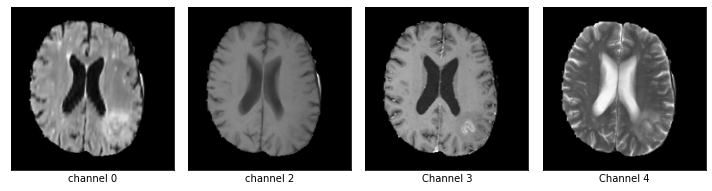

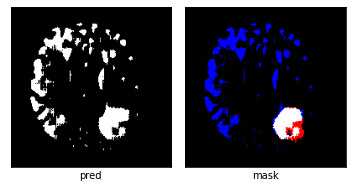

dice_loss : 0.0008676789587852494



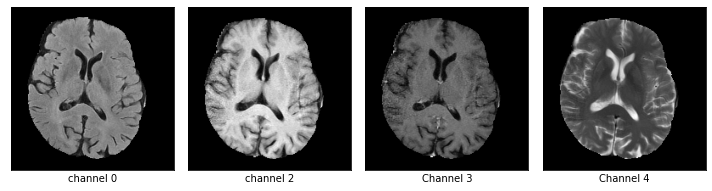

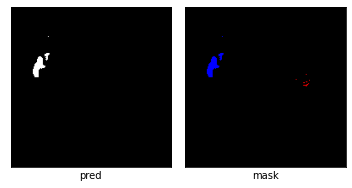

03/06 05:28:03 PM epoch 10 lr 2.179395e-02
03/06 05:28:03 PM genotype = Genotype(normal=[('dil_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('skip_connect', 0), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('max_pool_3x3', 0), ('dil_conv_5x5', 1), ('dil_conv_5x5', 2), ('sep_conv_5x5', 3), ('sep_conv_5x5', 2), ('max_pool_3x3', 4), ('max_pool_3x3', 3)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<42:28,  1.08s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.3102, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<42:16,  1.08s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<42:05,  1.07s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<42:01,  1.07s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<42:12,  1.08s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1606, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<42:08,  1.08s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<42:08,  1.08s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9039, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<42:01,  1.07s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1975, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<42:13,  1.08s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<41:48,  1.07s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<41:26,  1.06s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<41:08,  1.05s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.1426, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<41:02,  1.05s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<40:50,  1.05s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<40:47,  1.05s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.1314, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<40:51,  1.05s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.1097, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:18<41:04,  1.05s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:19<41:07,  1.06s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:20<41:25,  1.06s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:21<41:41,  1.07s/it, Acc=0.993, IoU=0.807, Loss=0.108]

tensor(0.1354, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:22<41:50,  1.08s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.0513, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:23<42:04,  1.08s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:24<41:41,  1.07s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:25<41:38,  1.07s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:26<41:58,  1.08s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.1137, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:27<41:44,  1.08s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.4099, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:28<41:32,  1.07s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.1627, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:29<41:35,  1.07s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.0084, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:30<41:19,  1.07s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.1459, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:32<41:41,  1.08s/it, Acc=1, IoU=0, Loss=0.000545]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:33<41:41,  1.08s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.1356, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:34<41:58,  1.08s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:35<41:40,  1.08s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:36<41:45,  1.08s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:37<41:34,  1.08s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:38<41:36,  1.08s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:39<41:42,  1.08s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:40<41:30,  1.07s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:41<41:29,  1.07s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:42<41:34,  1.08s/it, Acc=0.989, IoU=0.433, Loss=0.396]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:43<41:46,  1.08s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0383, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:45<41:50,  1.09s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.3227, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:46<41:34,  1.08s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:47<41:43,  1.08s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:48<41:39,  1.08s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9547, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:49<41:50,  1.09s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:50<41:50,  1.09s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1747, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:51<41:37,  1.08s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:52<41:22,  1.08s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0581, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:53<41:18,  1.08s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.1434, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:54<41:33,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:55<41:32,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:56<41:26,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:57<41:16,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.9895, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:59<41:30,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [01:00<41:27,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [01:01<41:28,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [01:02<41:11,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.5367, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [01:03<41:13,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.1930, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:04<41:18,  1.08s/it, Acc=0.992, IoU=0.435, Loss=0.391]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:05<41:07,  1.08s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.3621, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:06<41:15,  1.08s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:07<41:25,  1.08s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:08<41:45,  1.09s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.1289, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:09<41:50,  1.10s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:10<41:26,  1.09s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:12<41:20,  1.08s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:13<41:17,  1.08s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:14<41:20,  1.09s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.3111, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:15<41:12,  1.08s/it, Acc=0.994, IoU=0.935, Loss=0.0334]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:16<41:02,  1.08s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:17<40:42,  1.07s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.1169, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:18<40:48,  1.07s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:19<40:43,  1.07s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.1265, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:20<40:32,  1.07s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:21<40:15,  1.06s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:22<40:03,  1.06s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:23<40:07,  1.06s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:24<40:09,  1.06s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.1886, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:25<40:06,  1.06s/it, Acc=0.996, IoU=0.79, Loss=0.116]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:26<39:56,  1.05s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:27<39:51,  1.05s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.1092, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:29<39:38,  1.05s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:30<39:41,  1.05s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:31<39:33,  1.05s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.9497, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:32<39:28,  1.04s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:33<39:24,  1.04s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:34<39:31,  1.05s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:35<39:39,  1.05s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.4200, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:36<39:40,  1.05s/it, Acc=0.992, IoU=0.82, Loss=0.104]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:37<39:42,  1.05s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:38<39:53,  1.06s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.9082, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:39<39:34,  1.05s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.3853, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:40<39:47,  1.06s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:41<39:37,  1.05s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.2936, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:42<39:55,  1.06s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:43<39:39,  1.05s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.1097, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:44<39:20,  1.05s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.4390, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:45<38:59,  1.04s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:46<39:14,  1.04s/it, Acc=0.997, IoU=0.756, Loss=0.138]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:47<39:11,  1.04s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.1278, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:48<39:16,  1.05s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:49<39:12,  1.04s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:51<39:17,  1.05s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.1538, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:52<39:22,  1.05s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:53<39:35,  1.06s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.4122, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:54<39:17,  1.05s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.0506, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:55<38:55,  1.04s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:56<38:53,  1.04s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.3633, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:57<39:19,  1.05s/it, Acc=0.99, IoU=0.698, Loss=0.177]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:58<39:02,  1.04s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:59<39:18,  1.05s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.2313, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [02:00<39:20,  1.05s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [02:01<39:18,  1.05s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [02:02<38:53,  1.04s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [02:03<38:39,  1.04s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [02:04<38:34,  1.03s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.0945, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [02:05<38:29,  1.03s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [02:06<38:15,  1.03s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:07<38:21,  1.03s/it, Acc=0.996, IoU=0.859, Loss=0.0767]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:08<38:45,  1.04s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:09<39:08,  1.05s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:10<39:02,  1.05s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:11<39:02,  1.05s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:12<38:47,  1.04s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:14<38:52,  1.05s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.2685, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:15<38:45,  1.04s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.3357, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:16<38:55,  1.05s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.8413, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:17<38:54,  1.05s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.2748, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:18<38:38,  1.04s/it, Acc=1, IoU=0, Loss=0.00342]

tensor(0.1453, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:19<38:43,  1.04s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0851, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:20<38:53,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1675, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:21<38:40,  1.04s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1171, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:22<38:57,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:23<38:48,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:24<39:08,  1.06s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1245, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:25<39:04,  1.06s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1538, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:26<38:48,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:27<38:46,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1352, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:28<38:29,  1.04s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:29<38:18,  1.04s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.1719, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:30<38:32,  1.05s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:31<38:35,  1.05s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:32<38:35,  1.05s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.4210, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:33<38:33,  1.05s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:35<38:58,  1.06s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:36<38:40,  1.05s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:37<38:31,  1.05s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.7739, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:38<38:32,  1.05s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:39<38:30,  1.05s/it, Acc=0.993, IoU=0.842, Loss=0.0866]

tensor(0.2167, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:40<38:20,  1.04s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:41<38:35,  1.05s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:42<38:21,  1.05s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.2535, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:43<38:29,  1.05s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:44<38:29,  1.05s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:45<38:23,  1.05s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:46<39:46,  1.09s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:47<39:39,  1.08s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.2008, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:48<39:19,  1.07s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:49<39:01,  1.07s/it, Acc=0.997, IoU=0.89, Loss=0.0577]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:50<38:54,  1.06s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.3275, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:51<38:39,  1.06s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.4248, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:52<38:24,  1.05s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:54<38:31,  1.05s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:55<38:27,  1.05s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:56<38:17,  1.05s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:57<38:13,  1.05s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:58<38:20,  1.05s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:59<38:06,  1.05s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [03:00<38:10,  1.05s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [03:01<37:58,  1.04s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [03:02<37:57,  1.04s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.3135, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [03:03<37:51,  1.04s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.1356, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [03:04<38:02,  1.05s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [03:05<37:36,  1.03s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.0441, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [03:06<37:51,  1.04s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.0526, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [03:07<37:44,  1.04s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [03:08<37:26,  1.03s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.9881, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [03:09<38:04,  1.05s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:10<37:55,  1.05s/it, Acc=1, IoU=0, Loss=0.000289]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:11<37:56,  1.05s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:12<37:52,  1.05s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:13<37:34,  1.04s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:14<37:28,  1.04s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.0263, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:15<37:33,  1.04s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:16<37:16,  1.03s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.5896, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:17<37:14,  1.03s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:18<37:06,  1.03s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.8064, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:19<37:03,  1.03s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:21<37:08,  1.03s/it, Acc=0.996, IoU=0.398, Loss=0.431]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:22<37:26,  1.04s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.4785, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:23<37:22,  1.04s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.5461, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:24<37:17,  1.04s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:25<37:31,  1.04s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:26<37:32,  1.04s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:27<37:49,  1.05s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:28<37:49,  1.05s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.0039, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:29<37:52,  1.05s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:30<37:40,  1.05s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.5290, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:31<37:55,  1.06s/it, Acc=0.983, IoU=0.771, Loss=0.131]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:32<38:12,  1.06s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:33<38:13,  1.07s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:34<37:40,  1.05s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.2716, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:35<37:34,  1.05s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.1857, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:36<37:42,  1.05s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.3279, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:37<37:24,  1.04s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:38<37:17,  1.04s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:39<36:47,  1.03s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:40<36:50,  1.03s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:41<37:14,  1.04s/it, Acc=0.996, IoU=0.871, Loss=0.0695]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:43<37:22,  1.05s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.2492, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:44<37:15,  1.04s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:45<37:25,  1.05s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.4310, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:46<37:27,  1.05s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:47<37:32,  1.05s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:48<38:03,  1.07s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:49<37:57,  1.07s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.2004, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:50<37:43,  1.06s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.6383, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:51<37:36,  1.06s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:52<37:04,  1.04s/it, Acc=0.996, IoU=0.949, Loss=0.0264]

tensor(0.3934, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:53<37:11,  1.05s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:54<37:29,  1.05s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:55<37:26,  1.05s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.2146, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:56<37:10,  1.05s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:57<37:08,  1.05s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.3268, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:58<37:04,  1.04s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.0042, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:59<36:50,  1.04s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [04:00<36:56,  1.04s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [04:01<37:05,  1.05s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [04:02<37:12,  1.05s/it, Acc=1, IoU=0, Loss=0.000452]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [04:04<37:06,  1.05s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [04:05<36:57,  1.04s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [04:06<36:32,  1.03s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [04:07<36:16,  1.03s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.2136, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [04:08<36:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.4019, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [04:09<35:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [04:10<35:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [04:11<36:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.3774, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [04:12<36:07,  1.02s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.9623, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:13<35:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:14<35:46,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:15<35:51,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.1846, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:16<35:48,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:17<35:58,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.1538, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:18<36:01,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.5543, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:19<36:04,  1.03s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:20<35:45,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:21<35:39,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:22<35:33,  1.01s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.3415, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:23<35:17,  1.01s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.9348, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:24<35:20,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.4008, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:25<35:32,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:26<35:28,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:27<35:15,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.4827, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:28<35:28,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:29<35:28,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.9500, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:30<35:42,  1.02s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:31<35:30,  1.02s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.7165, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:32<35:21,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:33<35:39,  1.02s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:34<35:30,  1.02s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.1193, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:35<35:28,  1.02s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:36<35:32,  1.02s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:37<35:34,  1.02s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:38<35:29,  1.02s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.3383, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:39<35:49,  1.03s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.5836, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:40<35:54,  1.03s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:41<36:08,  1.04s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:42<36:13,  1.04s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:43<35:37,  1.03s/it, Acc=0.997, IoU=0.85, Loss=0.0796]

tensor(0.0511, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:44<35:30,  1.02s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.1352, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:45<35:15,  1.02s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.3676, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:46<35:21,  1.02s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:47<35:14,  1.02s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:48<35:12,  1.02s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.6040, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:49<35:07,  1.01s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.2664, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:50<34:45,  1.00s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.6198, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:51<35:17,  1.02s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:52<35:20,  1.02s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:53<35:20,  1.02s/it, Acc=0.991, IoU=0.837, Loss=0.0905]

tensor(0.3618, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:54<35:15,  1.02s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:55<35:23,  1.02s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.1225, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:57<35:29,  1.03s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.5596, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:58<35:28,  1.03s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.3381, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:59<35:19,  1.02s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.1656, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [05:00<35:14,  1.02s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.1320, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [05:01<34:56,  1.01s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [05:02<35:08,  1.02s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.5155, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [05:03<34:59,  1.02s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [05:04<34:50,  1.01s/it, Acc=0.998, IoU=0, Loss=0.942]

tensor(0.1562, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [05:05<34:56,  1.02s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [05:06<34:53,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [05:07<34:45,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [05:08<34:57,  1.02s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [05:09<34:44,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [05:10<34:50,  1.02s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.1673, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [05:11<34:37,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.1579, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [05:12<34:36,  1.01s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [05:13<34:18,  1.00s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.6803, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:14<34:25,  1.00s/it, Acc=0.995, IoU=0.934, Loss=0.0347]

tensor(0.6587, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:15<34:25,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:16<34:38,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:17<34:47,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.7197, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:18<34:39,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.6837, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:19<34:33,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.7162, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:20<34:22,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:21<34:29,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:22<34:31,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:23<34:38,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:24<34:42,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:25<34:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:26<34:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:27<34:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.2791, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:28<34:42,  1.02s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.0486, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:29<34:31,  1.02s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.0393, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:30<34:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.1948, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:31<34:10,  1.01s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:32<34:00,  1.00s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:33<34:01,  1.00s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:34<34:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000919]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:35<34:18,  1.01s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.3376, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:36<34:13,  1.01s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:37<34:12,  1.01s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.1380, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:38<34:15,  1.01s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.1305, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:39<34:10,  1.01s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.8460, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:40<33:55,  1.00s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.4640, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:41<33:54,  1.00s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:42<34:06,  1.01s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.3449, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:43<34:20,  1.02s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:44<34:22,  1.02s/it, Acc=0.955, IoU=0.0203, Loss=0.96]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:45<34:28,  1.02s/it, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:46<34:39,  1.03s/it, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.6870, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:47<34:32,  1.02s/it, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:48<33:59,  1.01s/it, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:49<33:43,  1.00s/it, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:50<33:40,  1.00s/it, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.1254, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:51<33:19,  1.01it/s, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.7404, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:52<33:04,  1.02it/s, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:53<32:42,  1.03it/s, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.7105, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:54<32:36,  1.03it/s, Acc=0.985, IoU=0.0248, Loss=0.949]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:55<32:36,  1.03it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:56<32:48,  1.02it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:57<32:58,  1.02it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:58<32:53,  1.02it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:59<32:49,  1.02it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [06:00<32:46,  1.02it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [06:01<33:01,  1.01it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.0371, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [06:02<33:18,  1.00it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [06:03<33:30,  1.00s/it, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [06:04<33:22,  1.00it/s, Acc=0.996, IoU=0.939, Loss=0.033]

tensor(0.4465, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [06:05<33:12,  1.01it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [06:06<33:24,  1.00s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [06:07<33:15,  1.00it/s, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [06:08<33:30,  1.00s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [06:09<33:28,  1.00s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.4933, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [06:10<33:28,  1.00s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [06:11<33:36,  1.01s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.3003, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [06:12<33:26,  1.00s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [06:13<33:21,  1.00s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:14<33:26,  1.01s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:15<33:29,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1261, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:16<33:15,  1.00s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:17<33:10,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1641, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:18<33:10,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:19<32:48,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:20<32:35,  1.02it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.7598, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:21<32:42,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.6836, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:22<32:47,  1.01it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.3050, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:23<33:00,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:24<33:00,  1.00it/s, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0439, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:25<33:04,  1.00s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0579, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:26<33:09,  1.00s/it, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0383, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:27<32:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:28<32:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00125]

tensor(0.3971, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:29<32:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:30<32:43,  1.01it/s, Acc=1, IoU=0, Loss=0.00125]

tensor(0.4278, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:31<32:27,  1.02it/s, Acc=1, IoU=0, Loss=0.00125]

tensor(0.1741, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:32<32:21,  1.02it/s, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:33<32:01,  1.03it/s, Acc=1, IoU=0, Loss=0.00125]

tensor(0.9817, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:34<31:56,  1.03it/s, Acc=1, IoU=0, Loss=0.00125]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:35<31:49,  1.03it/s, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.1573, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:36<31:58,  1.03it/s, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.5978, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:37<31:55,  1.03it/s, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:38<31:47,  1.03it/s, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.8277, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:39<31:53,  1.03it/s, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.2911, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:40<32:30,  1.01it/s, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:41<32:24,  1.01it/s, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:42<32:24,  1.01it/s, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.6565, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:43<32:52,  1.00s/it, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.0416, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:44<33:02,  1.01s/it, Acc=0.995, IoU=0.907, Loss=0.05]

tensor(0.1718, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:45<33:05,  1.01s/it, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:46<32:53,  1.01s/it, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:47<32:51,  1.00s/it, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:48<32:41,  1.00s/it, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:49<32:38,  1.00it/s, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.8997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:50<33:27,  1.02s/it, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:51<33:12,  1.02s/it, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:52<33:02,  1.01s/it, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:53<32:58,  1.01s/it, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:54<32:29,  1.00it/s, Acc=0.988, IoU=0.866, Loss=0.071]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:55<32:29,  1.00it/s, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:56<32:57,  1.01s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.9032, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:57<32:54,  1.01s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:58<32:52,  1.01s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:59<32:51,  1.01s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.1082, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [07:00<32:59,  1.02s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [07:01<32:57,  1.02s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.2490, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [07:02<32:57,  1.02s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.6741, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [07:03<33:00,  1.02s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [07:04<32:43,  1.01s/it, Acc=0.986, IoU=0.354, Loss=0.478]

tensor(0.5405, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [07:05<32:18,  1.00it/s, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.9544, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [07:06<32:13,  1.00it/s, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [07:07<32:07,  1.01it/s, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [07:08<32:00,  1.01it/s, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [07:09<32:09,  1.01it/s, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [07:10<32:23,  1.00s/it, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [07:11<32:40,  1.01s/it, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [07:12<32:48,  1.02s/it, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [07:13<32:22,  1.00s/it, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.1622, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:14<32:15,  1.00s/it, Acc=0.991, IoU=0.86, Loss=0.0758]

tensor(0.2641, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:15<32:32,  1.01s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:16<32:41,  1.01s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:17<32:51,  1.02s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.3190, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:18<32:32,  1.01s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.3498, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:19<32:07,  1.00it/s, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.6651, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:20<32:18,  1.00s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:21<32:26,  1.01s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:22<32:20,  1.01s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:23<32:37,  1.02s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.0631, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:24<32:32,  1.01s/it, Acc=0.984, IoU=0.803, Loss=0.111]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:25<32:23,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:26<32:29,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:27<32:08,  1.00s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:28<32:08,  1.00s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:29<31:59,  1.00it/s, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:30<32:00,  1.00s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:31<32:08,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:32<31:57,  1.00s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.6509, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:33<32:20,  1.01s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.0307, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:34<32:23,  1.02s/it, Acc=0.992, IoU=0.912, Loss=0.0474]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:35<32:12,  1.01s/it, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:36<32:15,  1.01s/it, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:37<32:12,  1.01s/it, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.8560, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:38<32:12,  1.01s/it, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.2319, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:39<32:09,  1.01s/it, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.3846, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:40<31:54,  1.00s/it, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.0444, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:41<31:52,  1.00s/it, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:42<31:37,  1.00it/s, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.6128, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:43<31:35,  1.01it/s, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.2233, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:44<31:27,  1.01it/s, Acc=0.99, IoU=0.897, Loss=0.0574]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:45<31:13,  1.02it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:46<31:14,  1.02it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.1737, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:47<31:26,  1.01it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.1476, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:48<31:13,  1.01it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:49<31:23,  1.01it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.3937, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:50<31:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:51<31:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:52<31:19,  1.01it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.3052, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:53<31:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:54<30:58,  1.02it/s, Acc=1, IoU=0, Loss=0.000522]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:55<31:16,  1.01it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.2233, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:56<31:15,  1.01it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:57<31:13,  1.01it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.3731, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:58<31:15,  1.01it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:59<31:11,  1.01it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.9275, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [08:00<31:20,  1.00it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [08:01<31:18,  1.01it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.6288, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [08:02<31:15,  1.01it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.1762, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [08:03<31:20,  1.00it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.1634, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [08:04<31:02,  1.01it/s, Acc=0.992, IoU=0.913, Loss=0.0456]

tensor(0.2528, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [08:05<30:46,  1.02it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.9737, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [08:06<31:05,  1.01it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [08:07<30:54,  1.01it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.5054, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [08:08<31:00,  1.01it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [08:09<31:24,  1.00s/it, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.2416, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [08:10<31:11,  1.00it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [08:11<31:00,  1.01it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [08:12<30:53,  1.01it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [08:13<30:57,  1.01it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [08:14<31:02,  1.01it/s, Acc=0.995, IoU=0.88, Loss=0.0658]

tensor(0.4966, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:15<30:49,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:16<30:47,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.1927, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:17<30:56,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:18<31:02,  1.00it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.9355, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:19<30:55,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:20<30:55,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:21<30:50,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.3075, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:22<30:49,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:23<30:51,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:24<30:54,  1.01it/s, Acc=0.994, IoU=0.772, Loss=0.126]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:25<30:54,  1.01it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.6981, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:26<30:54,  1.00it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:27<30:53,  1.00it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:28<30:36,  1.01it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:29<30:36,  1.01it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:30<30:44,  1.01it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:31<30:49,  1.00it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.9870, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:32<30:37,  1.01it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:33<30:32,  1.01it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:34<30:28,  1.01it/s, Acc=1, IoU=0, Loss=0.000746]

tensor(0.2653, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:34<30:23,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:35<30:26,  1.01it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:36<30:24,  1.01it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.0606, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:37<30:32,  1.01it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:38<30:23,  1.01it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:39<30:15,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.9531, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:40<30:14,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.1815, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:41<30:07,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:42<30:03,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.0320, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:43<30:02,  1.02it/s, Acc=0.991, IoU=0.855, Loss=0.0787]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:44<30:39,  1.00it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:45<30:24,  1.01it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:46<30:08,  1.02it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:47<29:53,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.1765, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:48<29:41,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.1243, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:49<29:38,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:50<29:49,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:51<29:46,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:52<29:56,  1.02it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:53<30:12,  1.01it/s, Acc=0.996, IoU=0.958, Loss=0.0227]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:54<30:08,  1.01it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:55<30:01,  1.02it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:56<30:07,  1.01it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:57<30:12,  1.01it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.3260, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:58<30:02,  1.02it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:59<30:03,  1.01it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.5093, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [09:00<29:52,  1.02it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [09:01<29:51,  1.02it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [09:02<30:01,  1.01it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.1491, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [09:03<30:03,  1.01it/s, Acc=0.993, IoU=0.896, Loss=0.0559]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [09:04<30:04,  1.01it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.1255, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [09:05<29:54,  1.02it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [09:06<29:58,  1.01it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.4240, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [09:07<29:50,  1.02it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [09:08<29:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [09:09<29:44,  1.02it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [09:10<29:38,  1.02it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [09:11<29:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [09:12<29:52,  1.01it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.2402, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [09:13<29:49,  1.01it/s, Acc=1, IoU=0, Loss=0.000267]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:14<29:37,  1.02it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:15<29:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:16<29:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.4546, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:17<29:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.4799, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:18<29:44,  1.01it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.1000, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:19<29:26,  1.02it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:20<29:25,  1.02it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:21<29:29,  1.02it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:22<29:23,  1.02it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:23<29:38,  1.01it/s, Acc=1, IoU=0, Loss=0.000723]

tensor(0.1484, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:24<29:43,  1.01it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:25<29:42,  1.01it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:26<29:51,  1.01it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:27<29:37,  1.01it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.1344, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:28<29:32,  1.02it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.8884, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:29<29:15,  1.02it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:29<29:05,  1.03it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.5018, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:30<28:55,  1.04it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:31<29:02,  1.03it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.3334, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:32<29:25,  1.02it/s, Acc=0.995, IoU=0.737, Loss=0.155]

tensor(0.0348, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:33<29:45,  1.01it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.2247, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:34<29:29,  1.01it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.5029, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:35<29:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:36<29:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:37<29:41,  1.01it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:38<29:26,  1.01it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.1044, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:39<29:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:40<29:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:41<29:41,  1.00it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:42<29:42,  1.00it/s, Acc=1, IoU=0, Loss=0.000343]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:43<30:00,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.3554, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:44<30:17,  1.02s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.1595, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:45<30:09,  1.02s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.6744, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:46<30:09,  1.02s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.1416, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:48<30:08,  1.02s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:49<29:57,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:50<29:56,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.1452, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:51<29:56,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.4532, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:52<30:01,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:53<29:53,  1.01s/it, Acc=0.993, IoU=0.914, Loss=0.0455]

tensor(0.2436, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:54<30:28,  1.03s/it, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:55<30:34,  1.03s/it, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.3379, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:56<30:10,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.3492, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:57<29:53,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.1795, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:58<29:26,  1.00it/s, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:59<29:11,  1.01it/s, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.3486, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [10:00<29:12,  1.01it/s, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [10:01<28:53,  1.02it/s, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [10:02<29:03,  1.01it/s, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [10:03<28:57,  1.02it/s, Acc=0.992, IoU=0.917, Loss=0.0426]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [10:03<28:52,  1.02it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [10:05<29:04,  1.01it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [10:06<29:26,  1.00s/it, Acc=1, IoU=0, Loss=0.000269]

tensor(0.1982, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [10:07<29:26,  1.00s/it, Acc=1, IoU=0, Loss=0.000269]

tensor(0.0393, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [10:08<29:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [10:09<29:18,  1.00it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.6457, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [10:10<29:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.1273, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [10:11<29:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.8946, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [10:11<28:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.4664, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:12<28:52,  1.01it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.5580, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:13<28:52,  1.01it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.0340, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:14<29:04,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.1595, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:15<29:07,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:16<29:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:17<29:07,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:18<29:07,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:19<29:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:20<29:02,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:21<28:58,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:22<28:47,  1.01it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:23<28:52,  1.01it/s, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.1871, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:24<29:06,  1.00s/it, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:25<29:08,  1.00s/it, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:26<29:06,  1.00s/it, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:27<28:57,  1.00it/s, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.1759, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:28<28:43,  1.01it/s, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:29<28:22,  1.02it/s, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.1571, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:30<28:10,  1.03it/s, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:31<28:06,  1.03it/s, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.7354, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:32<28:15,  1.02it/s, Acc=0.995, IoU=0.879, Loss=0.0656]

tensor(0.1556, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:33<28:21,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:34<28:22,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:35<28:36,  1.01it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:36<28:31,  1.01it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:37<28:28,  1.01it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:38<28:23,  1.01it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.6682, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:39<28:13,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:40<28:20,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:41<28:30,  1.01it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:42<28:08,  1.02it/s, Acc=0.993, IoU=0.832, Loss=0.0921]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:43<28:04,  1.02it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.1530, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:44<28:03,  1.02it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.5436, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:45<28:11,  1.02it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:46<28:07,  1.02it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:47<28:05,  1.02it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.1482, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:48<27:59,  1.02it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:49<27:41,  1.03it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.5736, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:50<27:47,  1.03it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:51<27:57,  1.02it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.0985, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:52<27:43,  1.03it/s, Acc=0.997, IoU=0.921, Loss=0.042]

tensor(0.2136, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:53<27:37,  1.03it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:54<27:49,  1.03it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:55<27:58,  1.02it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:56<28:14,  1.01it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:57<28:17,  1.01it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:58<28:20,  1.01it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:59<28:19,  1.01it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [11:00<28:10,  1.01it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.1603, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [11:01<28:03,  1.01it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [11:02<27:53,  1.02it/s, Acc=0.997, IoU=0.883, Loss=0.0617]

tensor(0.3521, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [11:03<27:58,  1.01it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [11:04<27:55,  1.02it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [11:05<27:56,  1.02it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.6797, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [11:06<28:01,  1.01it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [11:07<27:58,  1.01it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.3730, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [11:08<27:58,  1.01it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.1327, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [11:09<27:48,  1.02it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [11:10<27:54,  1.01it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [11:11<27:45,  1.02it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:12<27:42,  1.02it/s, Acc=0.982, IoU=0.755, Loss=0.143]

tensor(0.2903, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:13<28:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000897]

tensor(0.3583, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:14<28:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.7316, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:15<27:56,  1.01it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:16<27:54,  1.01it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:17<27:43,  1.02it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:18<27:31,  1.02it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:19<27:27,  1.02it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.3421, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:20<27:21,  1.03it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.5073, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:20<27:21,  1.03it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:21<27:16,  1.03it/s, Acc=1, IoU=0, Loss=0.000897]

tensor(0.7270, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:22<27:22,  1.03it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.2336, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:23<27:19,  1.03it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:24<27:26,  1.02it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.1623, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:25<27:24,  1.02it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.6589, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:26<27:40,  1.01it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:27<27:26,  1.02it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.6419, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:28<27:22,  1.02it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:29<27:10,  1.03it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.0283, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:30<27:10,  1.03it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:31<27:06,  1.03it/s, Acc=0.993, IoU=0.91, Loss=0.0485]

tensor(0.1670, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:32<27:07,  1.03it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:33<27:12,  1.02it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:34<27:00,  1.03it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.1610, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:35<26:56,  1.03it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:36<27:08,  1.03it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:37<27:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.1665, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:38<27:28,  1.01it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.1872, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:39<27:30,  1.01it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:40<27:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:41<27:30,  1.01it/s, Acc=1, IoU=0, Loss=0.000903]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:42<27:24,  1.01it/s, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:43<27:26,  1.01it/s, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:44<27:21,  1.01it/s, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:45<27:20,  1.01it/s, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.0446, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:46<27:43,  1.00s/it, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:47<27:45,  1.00s/it, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:48<27:34,  1.00it/s, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.1523, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:49<27:35,  1.00it/s, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:50<27:34,  1.00it/s, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:51<27:28,  1.00it/s, Acc=0.996, IoU=0.773, Loss=0.128]

tensor(0.8886, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:52<27:18,  1.01it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:53<27:10,  1.01it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.9398, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:54<26:57,  1.02it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:55<26:53,  1.02it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:56<26:54,  1.02it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:57<26:56,  1.02it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.2297, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:58<26:54,  1.02it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:59<27:06,  1.01it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [12:00<27:02,  1.01it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.2438, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [12:01<27:04,  1.01it/s, Acc=0.993, IoU=0.848, Loss=0.0826]

tensor(0.5623, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [12:02<27:07,  1.01it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.0113, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [12:03<27:08,  1.01it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [12:04<27:09,  1.01it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [12:05<26:54,  1.02it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.1864, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [12:06<26:46,  1.02it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [12:07<26:39,  1.02it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [12:08<26:58,  1.01it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [12:09<26:42,  1.02it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [12:10<26:42,  1.02it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:11<26:32,  1.03it/s, Acc=0.996, IoU=0.873, Loss=0.0677]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:12<26:26,  1.03it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:13<26:29,  1.03it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:14<26:32,  1.02it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:15<26:50,  1.01it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.1041, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:16<26:52,  1.01it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:17<26:54,  1.01it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:18<26:45,  1.01it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:19<26:55,  1.01it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:20<26:48,  1.01it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:21<26:38,  1.02it/s, Acc=0.999, IoU=0.737, Loss=0.153]

tensor(0.2487, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:21<26:30,  1.02it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.5295, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:22<26:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:23<26:35,  1.02it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:24<26:27,  1.02it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.1937, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:25<26:24,  1.02it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:26<26:19,  1.03it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.5250, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:27<26:12,  1.03it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.1356, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:28<26:23,  1.02it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:29<26:18,  1.02it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:30<26:11,  1.03it/s, Acc=1, IoU=0, Loss=0.000757]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:31<26:20,  1.02it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:32<26:31,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:33<26:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:34<26:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0627, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:35<26:19,  1.02it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:36<26:19,  1.02it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:37<26:11,  1.02it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.3094, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:38<26:18,  1.02it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:39<26:12,  1.02it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.2258, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:40<26:03,  1.03it/s, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:41<26:08,  1.02it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:42<26:27,  1.01it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:43<26:24,  1.01it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.2710, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:44<26:14,  1.02it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:45<26:14,  1.02it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:46<26:10,  1.02it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:47<26:07,  1.02it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:48<26:16,  1.01it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.0976, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:49<26:06,  1.02it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:50<26:04,  1.02it/s, Acc=0.983, IoU=0.747, Loss=0.145]

tensor(0.6415, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:51<26:00,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0475, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:52<26:02,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:53<26:07,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.1339, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:54<25:57,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0431, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:55<25:46,  1.03it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:56<25:38,  1.03it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:57<25:35,  1.03it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:58<25:48,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.4420, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:59<25:55,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.3569, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [13:00<25:53,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.122]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [13:01<25:59,  1.02it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [13:02<26:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [13:03<26:03,  1.01it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [13:04<26:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [13:05<25:48,  1.02it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.1412, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [13:06<25:48,  1.02it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [13:07<25:53,  1.02it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [13:08<25:56,  1.01it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.2601, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [13:09<25:40,  1.02it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:10<25:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000406]

tensor(0.3513, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:11<25:32,  1.03it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.2660, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:12<25:44,  1.02it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:13<25:51,  1.01it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:13<25:43,  1.02it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:14<25:50,  1.01it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.0330, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:15<26:01,  1.00it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.0318, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:16<25:58,  1.01it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:17<26:09,  1.00s/it, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.0329, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:18<26:01,  1.00it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:19<25:45,  1.01it/s, Acc=0.991, IoU=0.806, Loss=0.108]

tensor(0.1576, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:20<25:37,  1.02it/s, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.1906, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:21<25:55,  1.00it/s, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:22<25:55,  1.00it/s, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.3326, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:23<25:50,  1.01it/s, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:24<26:08,  1.01s/it, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.1959, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:25<26:07,  1.01s/it, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:26<25:54,  1.00it/s, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:27<25:38,  1.01it/s, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:28<25:38,  1.01it/s, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:29<25:27,  1.02it/s, Acc=0.991, IoU=0.856, Loss=0.079]

tensor(0.1050, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:30<25:30,  1.02it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.6920, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:31<25:49,  1.00it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:32<25:39,  1.01it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:33<25:35,  1.01it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:34<25:38,  1.01it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.4088, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:35<25:32,  1.01it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:36<25:26,  1.01it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:37<25:15,  1.02it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:38<25:24,  1.01it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:39<25:17,  1.02it/s, Acc=0.994, IoU=0.802, Loss=0.111]

tensor(0.1453, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:40<25:19,  1.02it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:41<25:24,  1.01it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.1747, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:42<25:30,  1.01it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.7424, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:43<25:23,  1.01it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.0486, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:44<25:23,  1.01it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:45<25:29,  1.01it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:46<25:39,  1.00s/it, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.3199, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:47<25:29,  1.00it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:48<25:08,  1.02it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.9570, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:49<25:09,  1.02it/s, Acc=0.991, IoU=0.894, Loss=0.0561]

tensor(0.4553, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:50<25:05,  1.02it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:51<25:17,  1.01it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.4643, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:52<25:18,  1.01it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.8151, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:53<25:25,  1.00it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:54<25:09,  1.01it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:55<25:07,  1.01it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.2672, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:56<25:02,  1.02it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:57<25:10,  1.01it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:58<25:15,  1.01it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:59<25:07,  1.01it/s, Acc=0.987, IoU=0.163, Loss=0.718]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [14:00<24:50,  1.02it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [14:01<24:48,  1.02it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [14:02<24:52,  1.02it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.4826, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [14:03<24:58,  1.02it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [14:04<25:03,  1.01it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.5247, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [14:05<25:01,  1.01it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [14:06<24:57,  1.01it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.4075, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:07<24:52,  1.02it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.3378, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:08<24:48,  1.02it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:09<24:56,  1.01it/s, Acc=0.994, IoU=0.841, Loss=0.0865]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:10<24:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:11<24:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:12<24:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:13<25:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:14<25:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:15<25:02,  1.00it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:16<25:14,  1.00s/it, Acc=1, IoU=0, Loss=0.00119]

tensor(0.5270, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:17<25:06,  1.00it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:18<24:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.4897, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:19<24:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00119]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:20<25:04,  1.00s/it, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:21<25:03,  1.00s/it, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:22<25:02,  1.00s/it, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.7464, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:23<25:02,  1.00s/it, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.0433, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:24<25:01,  1.00s/it, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:25<24:47,  1.01it/s, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:26<24:41,  1.01it/s, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.4051, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:27<24:43,  1.01it/s, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.7388, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:28<24:42,  1.01it/s, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:29<24:31,  1.02it/s, Acc=0.968, IoU=0.357, Loss=0.473]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:30<24:23,  1.02it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:31<24:29,  1.02it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:32<24:33,  1.01it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:33<24:34,  1.01it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:34<24:31,  1.01it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:35<24:24,  1.02it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:36<24:22,  1.02it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:37<24:22,  1.02it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.3236, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:38<24:30,  1.01it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:39<24:21,  1.02it/s, Acc=0.992, IoU=0.806, Loss=0.109]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:40<24:14,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0383, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:41<24:21,  1.01it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:42<24:26,  1.01it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:43<24:25,  1.01it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.6558, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:44<24:17,  1.02it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.7218, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:45<24:23,  1.01it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.2529, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:46<24:21,  1.01it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:47<24:32,  1.00it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.3649, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:48<24:35,  1.00it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:49<24:27,  1.00it/s, Acc=0.972, IoU=0, Loss=0.999]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:50<24:17,  1.01it/s, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:51<24:35,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.5906, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:52<24:34,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:53<24:39,  1.01s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:54<24:50,  1.01s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:55<24:51,  1.02s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.1191, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:56<24:46,  1.01s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:57<24:28,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.5374, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:58<24:32,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:59<24:29,  1.00s/it, Acc=0.993, IoU=0.915, Loss=0.045]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [15:00<24:30,  1.00s/it, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [15:01<24:38,  1.01s/it, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [15:02<24:28,  1.00s/it, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [15:03<24:23,  1.00s/it, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.0435, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [15:04<24:32,  1.01s/it, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [15:05<24:33,  1.01s/it, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.1335, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [15:06<24:15,  1.00it/s, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:07<24:21,  1.00s/it, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:08<24:16,  1.00s/it, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:09<24:10,  1.00it/s, Acc=0.99, IoU=0.767, Loss=0.131]

tensor(0.9494, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:10<24:11,  1.00it/s, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:11<24:22,  1.01s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.7086, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:12<24:22,  1.01s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:13<24:21,  1.01s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:14<24:15,  1.00s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:15<24:22,  1.01s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.0968, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:16<24:16,  1.01s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.9739, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:17<24:18,  1.01s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:18<24:16,  1.01s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.3740, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:19<24:11,  1.00s/it, Acc=0.994, IoU=0.653, Loss=0.209]

tensor(0.4505, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:20<24:01,  1.00it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.1357, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:21<24:09,  1.00s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:22<24:05,  1.00s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0945, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:23<24:05,  1.00s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9898, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:24<23:58,  1.00it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:25<23:59,  1.00s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:26<23:54,  1.00it/s, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.1382, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:27<24:04,  1.01s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.1239, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:28<24:09,  1.01s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.5310, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:29<24:01,  1.00s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:30<24:11,  1.01s/it, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.9891, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:31<24:08,  1.01s/it, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:32<23:59,  1.01s/it, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.2031, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:33<23:56,  1.00s/it, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.1932, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:34<23:53,  1.00s/it, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:35<23:57,  1.01s/it, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.1653, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:36<23:43,  1.00it/s, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:37<23:48,  1.00s/it, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.6444, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:38<23:48,  1.00s/it, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:39<23:41,  1.00it/s, Acc=0.978, IoU=0.79, Loss=0.118]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:40<23:40,  1.00it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.2585, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:41<23:46,  1.00s/it, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:42<23:39,  1.00it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.6944, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:43<23:25,  1.01it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:44<23:28,  1.01it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:45<23:26,  1.01it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:46<23:38,  1.00s/it, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:47<23:37,  1.00s/it, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.2184, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:48<23:38,  1.00s/it, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.7344, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:49<23:34,  1.00it/s, Acc=0.977, IoU=0.802, Loss=0.11]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:50<23:31,  1.00it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:51<23:30,  1.00it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.4722, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:52<23:18,  1.01it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:53<23:09,  1.02it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.1867, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:54<23:01,  1.02it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.1623, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:55<23:04,  1.02it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.1377, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:56<23:13,  1.01it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:57<23:14,  1.01it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.1529, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:58<23:11,  1.01it/s, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.3052, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:59<23:27,  1.00s/it, Acc=0.994, IoU=0.398, Loss=0.431]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [16:00<23:38,  1.01s/it, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [16:01<24:05,  1.03s/it, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [16:02<24:19,  1.04s/it, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.9229, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [16:03<24:17,  1.04s/it, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [16:04<23:59,  1.03s/it, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [16:05<23:40,  1.02s/it, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.6432, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [16:06<23:18,  1.00s/it, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.1451, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:07<23:09,  1.01it/s, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.1125, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:08<22:51,  1.02it/s, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.7075, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:09<22:47,  1.02it/s, Acc=0.997, IoU=0.88, Loss=0.0628]

tensor(0.1071, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:10<22:55,  1.01it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.2226, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:11<23:05,  1.01it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:12<23:05,  1.00it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:13<23:01,  1.01it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.9899, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:14<22:58,  1.01it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.9644, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:15<22:56,  1.01it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.9272, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:16<22:49,  1.01it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:17<22:39,  1.02it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.0466, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:18<22:42,  1.02it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.2097, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:19<22:38,  1.02it/s, Acc=0.992, IoU=0.884, Loss=0.0628]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:20<22:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:21<22:37,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.1467, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:22<22:37,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:23<22:37,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.9731, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:24<22:38,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.1600, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:24<22:23,  1.03it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:25<22:24,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:26<22:25,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:27<22:26,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.7080, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:28<22:34,  1.02it/s, Acc=1, IoU=0, Loss=0.000842]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:29<22:29,  1.02it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:30<22:29,  1.02it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.7283, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:31<22:23,  1.02it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.9483, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:32<22:14,  1.03it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.4773, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:33<22:15,  1.03it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:34<22:10,  1.03it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:35<22:10,  1.03it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.5002, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:36<22:14,  1.02it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:37<22:10,  1.03it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.0406, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:38<22:18,  1.02it/s, Acc=0.998, IoU=0.884, Loss=0.0621]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:39<22:16,  1.02it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.4418, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:40<22:24,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.1648, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:41<22:29,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:42<22:29,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:43<22:30,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:44<22:31,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:45<22:29,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:46<22:20,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:47<22:19,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:48<22:22,  1.01it/s, Acc=0.996, IoU=0.886, Loss=0.0601]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:49<22:13,  1.02it/s, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:50<22:20,  1.01it/s, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.8486, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:51<22:33,  1.00s/it, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.1204, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:52<22:30,  1.00it/s, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:53<22:26,  1.00it/s, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.2729, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:54<22:23,  1.00it/s, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.0414, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:55<22:32,  1.00s/it, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:56<22:33,  1.00s/it, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:57<22:15,  1.01it/s, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.2193, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:58<22:18,  1.00it/s, Acc=0.996, IoU=0.784, Loss=0.121]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:59<22:07,  1.01it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [17:00<22:10,  1.01it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [17:01<22:21,  1.00it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [17:02<22:17,  1.00it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [17:03<22:24,  1.00s/it, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [17:04<22:15,  1.00it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.6627, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [17:05<22:08,  1.01it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.0397, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:06<22:07,  1.01it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:07<22:11,  1.00it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.3126, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:08<22:09,  1.00it/s, Acc=0.997, IoU=0.779, Loss=0.126]

tensor(0.9777, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:09<22:16,  1.00s/it, Acc=1, IoU=0, Loss=0.00108]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:10<22:14,  1.00s/it, Acc=1, IoU=0, Loss=0.00108]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:11<22:12,  1.00s/it, Acc=1, IoU=0, Loss=0.00108]

tensor(0.3238, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:12<22:07,  1.00it/s, Acc=1, IoU=0, Loss=0.00108]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:13<22:13,  1.00s/it, Acc=1, IoU=0, Loss=0.00108]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:14<22:05,  1.00it/s, Acc=1, IoU=0, Loss=0.00108]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:15<22:01,  1.00it/s, Acc=1, IoU=0, Loss=0.00108]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:16<22:01,  1.00it/s, Acc=1, IoU=0, Loss=0.00108]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:17<22:02,  1.00it/s, Acc=1, IoU=0, Loss=0.00108]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:18<21:55,  1.01it/s, Acc=1, IoU=0, Loss=0.00108]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:19<21:46,  1.01it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.0314, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:20<21:45,  1.01it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:21<21:45,  1.01it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.1708, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:22<21:46,  1.01it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:23<21:52,  1.01it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:24<21:56,  1.00it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.0423, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:25<21:36,  1.02it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:26<21:37,  1.01it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:27<21:35,  1.02it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:28<21:36,  1.01it/s, Acc=0.991, IoU=0.672, Loss=0.193]

tensor(0.3045, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:29<21:36,  1.01it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:30<21:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.2003, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:31<21:28,  1.02it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.4233, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:32<21:20,  1.02it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:33<21:19,  1.02it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:34<21:15,  1.03it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.5650, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:35<21:17,  1.02it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.6464, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:36<21:15,  1.02it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:37<21:07,  1.03it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:38<21:21,  1.02it/s, Acc=1, IoU=0, Loss=0.000968]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:39<21:23,  1.02it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:40<21:25,  1.01it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.2557, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:41<21:26,  1.01it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.1137, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:42<21:25,  1.01it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:43<21:11,  1.02it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:44<21:18,  1.02it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.5207, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:45<21:15,  1.02it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.3532, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:46<21:24,  1.01it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:47<21:12,  1.02it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.1155, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:47<21:03,  1.02it/s, Acc=0.988, IoU=0.403, Loss=0.427]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:48<21:14,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.1811, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:49<21:09,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:50<21:10,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.6969, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:51<21:09,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.3686, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:52<21:04,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.2230, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:53<21:03,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.5061, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:54<21:07,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:55<21:07,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:56<21:00,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:57<21:01,  1.02it/s, Acc=0.989, IoU=0.43, Loss=0.395]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:58<21:00,  1.02it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:59<20:55,  1.02it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.4834, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [18:00<20:54,  1.02it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.5899, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [18:01<20:54,  1.02it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.6891, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [18:02<20:54,  1.02it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.7429, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [18:03<20:54,  1.02it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [18:04<20:51,  1.02it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:05<20:45,  1.03it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.3401, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:06<20:54,  1.02it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:07<20:57,  1.01it/s, Acc=0.994, IoU=0.932, Loss=0.0353]

tensor(0.4730, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:08<20:55,  1.01it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:09<21:04,  1.01it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:10<21:03,  1.01it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:11<21:08,  1.00it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.2416, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:12<21:03,  1.01it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:13<21:05,  1.00it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:14<20:59,  1.01it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.3559, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:15<21:00,  1.01it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:16<20:58,  1.01it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:17<20:48,  1.01it/s, Acc=0.986, IoU=0.857, Loss=0.0765]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:18<20:50,  1.01it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.1290, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:19<20:56,  1.00it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:20<20:51,  1.01it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.2096, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:21<20:40,  1.02it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:22<20:45,  1.01it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:23<20:54,  1.00it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0498, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:24<20:53,  1.00it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:25<20:41,  1.01it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:26<20:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:27<20:34,  1.02it/s, Acc=1, IoU=0, Loss=0.00219]

tensor(0.9230, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:28<20:21,  1.03it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.8783, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:29<20:36,  1.01it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:30<20:38,  1.01it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.2085, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:31<20:41,  1.01it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:32<20:40,  1.01it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.2082, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:33<20:33,  1.01it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:34<20:27,  1.02it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:35<20:26,  1.02it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:36<20:31,  1.01it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:37<20:25,  1.02it/s, Acc=0.997, IoU=0.869, Loss=0.0709]

tensor(0.5240, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:38<20:25,  1.01it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:39<20:27,  1.01it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.4835, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:40<20:18,  1.02it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:41<20:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.1468, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:42<20:10,  1.02it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:43<20:18,  1.02it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:44<20:14,  1.02it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:45<20:05,  1.03it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.9823, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:46<19:56,  1.03it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:47<19:53,  1.03it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:48<19:49,  1.04it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.3891, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:48<19:55,  1.03it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.5030, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:49<19:55,  1.03it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:50<20:01,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:51<20:05,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:52<20:08,  1.02it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.8960, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:53<20:10,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:54<20:09,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:55<20:17,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1887, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:56<20:14,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:57<20:11,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:58<20:04,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.5234, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:59<20:12,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [19:00<20:18,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [19:01<20:09,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [19:02<20:02,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:03<19:57,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:04<19:58,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0762, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:05<20:02,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:06<20:04,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:07<20:05,  1.01it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:08<20:16,  1.00s/it, Acc=1, IoU=0, Loss=0.00283]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:09<20:09,  1.00it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:10<19:58,  1.01it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:11<19:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:12<19:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.1351, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:13<19:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:14<19:41,  1.02it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:15<19:41,  1.02it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.5218, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:16<19:45,  1.02it/s, Acc=1, IoU=0, Loss=0.00283]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:17<19:43,  1.02it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.4163, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:18<19:57,  1.00it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.0068, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:19<20:07,  1.00s/it, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:20<19:59,  1.00it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:21<19:57,  1.00it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:22<19:54,  1.00it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:23<19:41,  1.01it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:24<19:46,  1.01it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.1690, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:25<19:45,  1.01it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:26<19:30,  1.02it/s, Acc=0.938, IoU=0.0704, Loss=0.867]

tensor(0.3528, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:27<19:22,  1.03it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.4736, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:28<19:24,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9095, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:29<19:36,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1934, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:30<19:37,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:31<20:07,  1.01s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:32<20:00,  1.01s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:33<19:44,  1.00it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:34<19:29,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:35<19:17,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:36<19:16,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9560, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:37<19:13,  1.03it/s, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:38<19:20,  1.02it/s, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:39<19:24,  1.02it/s, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.0029, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:40<19:24,  1.01it/s, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:41<19:36,  1.00it/s, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:42<19:40,  1.00s/it, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:43<19:45,  1.01s/it, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:44<19:33,  1.00it/s, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.9254, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:45<19:33,  1.00it/s, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:46<19:34,  1.00it/s, Acc=0.986, IoU=0.685, Loss=0.19]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:47<19:31,  1.00it/s, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:48<19:31,  1.00it/s, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:49<19:33,  1.00s/it, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.6274, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:50<19:35,  1.00s/it, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.1167, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:51<19:35,  1.00s/it, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:52<19:37,  1.01s/it, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.8735, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:53<19:37,  1.01s/it, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:54<19:32,  1.00s/it, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.9797, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:55<19:19,  1.01it/s, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.1381, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:56<19:22,  1.00it/s, Acc=0.995, IoU=0.754, Loss=0.14]

tensor(0.8618, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:57<19:15,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2928, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:58<19:15,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3645, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:59<19:08,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3930, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [20:00<19:05,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [20:01<19:05,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1611, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [20:02<18:58,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:03<19:06,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0377, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:04<19:03,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:05<19:21,  1.01s/it, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:06<19:14,  1.00it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0355, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:07<19:09,  1.00it/s, Acc=1, IoU=0, Loss=0.000959]

tensor(0.5987, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:08<19:07,  1.00it/s, Acc=1, IoU=0, Loss=0.000959]

tensor(0.9865, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:09<19:11,  1.00it/s, Acc=1, IoU=0, Loss=0.000959]

tensor(0.3380, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:10<19:14,  1.00s/it, Acc=1, IoU=0, Loss=0.000959]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:11<19:13,  1.00s/it, Acc=1, IoU=0, Loss=0.000959]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:12<19:07,  1.00it/s, Acc=1, IoU=0, Loss=0.000959]

tensor(0.5589, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:13<19:12,  1.00s/it, Acc=1, IoU=0, Loss=0.000959]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:14<19:08,  1.00s/it, Acc=1, IoU=0, Loss=0.000959]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:15<18:59,  1.01it/s, Acc=1, IoU=0, Loss=0.000959]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:16<18:56,  1.01it/s, Acc=1, IoU=0, Loss=0.000959]

tensor(0.1492, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:17<18:58,  1.00it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:18<18:51,  1.01it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.4768, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:19<18:46,  1.01it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:20<18:48,  1.01it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.4612, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:21<18:36,  1.02it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:22<18:33,  1.02it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.5467, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:23<18:41,  1.01it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:24<18:44,  1.01it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.1647, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:25<18:47,  1.01it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:26<18:41,  1.01it/s, Acc=0.998, IoU=0.932, Loss=0.0364]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:27<18:46,  1.01it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.7285, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:28<18:47,  1.00it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:29<18:42,  1.01it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:30<18:28,  1.02it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:31<18:24,  1.02it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.2186, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:32<18:23,  1.02it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.1092, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:33<18:18,  1.03it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.1405, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:34<18:20,  1.02it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.5037, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:35<18:27,  1.02it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:36<18:24,  1.02it/s, Acc=0.99, IoU=0.768, Loss=0.133]

tensor(0.3406, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:36<18:21,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:37<18:17,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:38<18:16,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:39<18:20,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:40<18:20,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.4593, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:41<18:17,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:42<18:14,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.9541, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:43<18:19,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.8967, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:44<18:26,  1.01it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.3383, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:45<18:15,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0897]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:46<18:14,  1.02it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:47<18:18,  1.01it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.1503, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:48<18:11,  1.02it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.2257, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:49<18:12,  1.02it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.1902, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:50<18:05,  1.02it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:51<18:12,  1.02it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.4647, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:52<18:09,  1.02it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:53<18:13,  1.01it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.1282, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:54<18:13,  1.01it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.6880, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:55<18:19,  1.00it/s, Acc=0.989, IoU=0.758, Loss=0.139]

tensor(0.4797, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:56<18:22,  1.00it/s, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:57<18:24,  1.00s/it, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.1979, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:58<18:26,  1.00s/it, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:59<18:25,  1.00s/it, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [21:00<18:14,  1.01it/s, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [21:01<18:08,  1.01it/s, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [21:02<18:02,  1.01it/s, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:03<18:00,  1.01it/s, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:04<18:05,  1.01it/s, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.2653, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:05<18:06,  1.01it/s, Acc=0.986, IoU=0.811, Loss=0.105]

tensor(0.6414, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:06<18:08,  1.00it/s, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:07<18:15,  1.00s/it, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.6407, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:08<18:17,  1.01s/it, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:09<18:07,  1.00it/s, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.5410, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:10<18:15,  1.00s/it, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:11<18:05,  1.00it/s, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:12<18:00,  1.01it/s, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.2259, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:13<17:53,  1.01it/s, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.0317, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:14<17:55,  1.01it/s, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.2381, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:15<17:48,  1.02it/s, Acc=0.999, IoU=0.556, Loss=0.284]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:16<17:38,  1.02it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.3117, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:17<17:41,  1.02it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.3875, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:18<17:42,  1.02it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:19<17:42,  1.02it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.1687, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:20<17:36,  1.02it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:21<17:36,  1.02it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:22<17:32,  1.02it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:23<17:32,  1.02it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.9795, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:24<17:25,  1.03it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.2509, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:25<17:20,  1.03it/s, Acc=1, IoU=0, Loss=0.0014]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:26<17:20,  1.03it/s, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:27<17:32,  1.02it/s, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.0684, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:28<17:38,  1.01it/s, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.1637, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:29<17:41,  1.01it/s, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.1368, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:30<17:39,  1.01it/s, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:31<17:43,  1.01it/s, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.2123, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:32<17:42,  1.01it/s, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.4940, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:33<17:47,  1.00s/it, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:34<17:48,  1.00s/it, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:35<17:42,  1.00it/s, Acc=0.995, IoU=0.778, Loss=0.128]

tensor(0.5589, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:36<17:42,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:37<17:45,  1.00s/it, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.3332, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:38<17:38,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.6024, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:39<17:33,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:40<17:31,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.1554, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:41<17:43,  1.00s/it, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:42<17:34,  1.00it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.1558, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:43<17:24,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:44<17:22,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:45<17:25,  1.01it/s, Acc=0.999, IoU=0, Loss=0.962]

tensor(0.2704, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:46<17:18,  1.02it/s, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:47<17:16,  1.02it/s, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.2571, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:48<17:24,  1.01it/s, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:49<17:29,  1.00it/s, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:50<17:32,  1.00s/it, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.6219, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:51<17:33,  1.00s/it, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:52<17:32,  1.00s/it, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:53<17:21,  1.00it/s, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:54<17:15,  1.01it/s, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:55<17:12,  1.01it/s, Acc=0.999, IoU=0.692, Loss=0.182]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:56<17:24,  1.00s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.9700, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:57<17:26,  1.00s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:58<17:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:59<17:24,  1.00s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.0391, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [22:00<17:22,  1.00s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.4977, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [22:01<17:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.0351, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [22:02<17:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [22:03<17:25,  1.01s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:04<17:19,  1.00s/it, Acc=1, IoU=0, Loss=0.000893]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:05<17:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000893]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:06<17:05,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:07<17:08,  1.00it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:08<17:05,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:09<16:58,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:10<16:57,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:11<17:03,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.1595, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:12<17:03,  1.00it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:13<16:48,  1.02it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:14<16:52,  1.01it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.7648, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:15<17:02,  1.00it/s, Acc=0.997, IoU=0.92, Loss=0.0419]

tensor(0.0410, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:16<17:02,  1.00it/s, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:17<17:01,  1.00it/s, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:18<16:56,  1.01it/s, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:19<16:54,  1.01it/s, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:20<16:50,  1.01it/s, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.7167, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:21<16:53,  1.01it/s, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.1753, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:22<16:54,  1.00it/s, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:23<17:00,  1.00s/it, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.1886, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:24<16:59,  1.00s/it, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:25<17:00,  1.01s/it, Acc=0.995, IoU=0.849, Loss=0.0827]

tensor(0.1458, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:26<16:58,  1.00s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:27<17:03,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.0082, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:28<16:53,  1.00s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:29<16:56,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:30<16:51,  1.00s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:31<16:44,  1.00it/s, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:32<16:53,  1.00s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:33<16:54,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.7599, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:34<16:52,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:35<16:51,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0335]

tensor(0.5559, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:36<16:45,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1209, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:37<16:44,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:38<16:45,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.5456, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:39<16:41,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:40<16:39,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.8979, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:41<16:39,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:42<16:35,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:43<16:34,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:44<16:30,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1751, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:45<16:24,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:46<16:36,  1.00s/it, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:47<16:34,  1.00s/it, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:48<16:26,  1.01it/s, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.3905, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:49<16:18,  1.01it/s, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.4355, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:50<16:21,  1.01it/s, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:51<16:19,  1.01it/s, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:52<16:16,  1.01it/s, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.3771, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:53<16:09,  1.02it/s, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:54<16:11,  1.02it/s, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:55<16:14,  1.01it/s, Acc=0.997, IoU=0.647, Loss=0.216]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:56<16:20,  1.00it/s, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.6918, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:57<16:17,  1.01it/s, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.2916, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:58<16:20,  1.00it/s, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.0064, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:59<16:19,  1.00it/s, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [23:00<16:21,  1.00s/it, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [23:01<16:25,  1.01s/it, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.6047, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [23:02<16:25,  1.01s/it, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [23:03<16:25,  1.01s/it, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [23:04<16:25,  1.01s/it, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.5379, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:05<16:18,  1.00s/it, Acc=0.998, IoU=0.91, Loss=0.0477]

tensor(0.5206, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:06<16:08,  1.01it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.3220, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:07<16:08,  1.00it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:08<16:08,  1.00it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:09<16:07,  1.00it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.1245, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:10<15:59,  1.01it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:11<16:04,  1.01it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:12<16:03,  1.00it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.2205, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:13<16:08,  1.00s/it, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:14<16:02,  1.00it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:15<15:54,  1.01it/s, Acc=0.999, IoU=0.833, Loss=0.0985]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:16<15:58,  1.01it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:17<15:57,  1.01it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:18<15:50,  1.01it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:19<15:51,  1.01it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:19<15:49,  1.01it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:20<15:51,  1.01it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.0535, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:21<15:53,  1.00it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:22<15:49,  1.01it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.5663, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:23<15:53,  1.00it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.5933, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:24<15:53,  1.00it/s, Acc=0.99, IoU=0.619, Loss=0.236]

tensor(0.1327, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:26<15:55,  1.00s/it, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.3902, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:26<15:53,  1.00s/it, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:27<15:49,  1.00it/s, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:28<15:42,  1.01it/s, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.5004, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:29<15:47,  1.00it/s, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.4642, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:30<15:42,  1.01it/s, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.8480, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:31<15:34,  1.01it/s, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.3682, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:32<15:29,  1.02it/s, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:33<15:31,  1.02it/s, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:34<15:37,  1.01it/s, Acc=0.991, IoU=0.873, Loss=0.0685]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:35<15:35,  1.01it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:36<15:35,  1.01it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.0462, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:37<15:31,  1.01it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.4018, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:38<15:32,  1.01it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.3049, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:39<15:29,  1.01it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:40<15:33,  1.01it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:41<15:28,  1.01it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.3725, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:42<15:32,  1.00it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.9127, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:43<15:36,  1.00s/it, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:44<15:23,  1.01it/s, Acc=0.994, IoU=0.733, Loss=0.152]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:45<15:27,  1.01it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:46<15:29,  1.00it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:47<15:21,  1.01it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.6405, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:48<15:23,  1.01it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.0354, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:49<15:15,  1.02it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.0063, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:50<15:20,  1.01it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.2375, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:51<15:17,  1.01it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:52<15:18,  1.01it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:53<15:17,  1.01it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.1317, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:54<15:17,  1.01it/s, Acc=0.99, IoU=0.88, Loss=0.0644]

tensor(0.4619, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:55<15:13,  1.01it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:56<15:11,  1.01it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.0272, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:57<15:12,  1.01it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.0376, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:58<15:06,  1.02it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.0342, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [23:59<15:04,  1.02it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [24:00<15:08,  1.01it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [24:01<14:58,  1.02it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [24:02<15:03,  1.02it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [24:03<15:00,  1.02it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.3635, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [24:04<15:00,  1.02it/s, Acc=0.985, IoU=0.855, Loss=0.0804]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:05<15:03,  1.01it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.5642, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:06<15:02,  1.01it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:07<15:02,  1.01it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:08<14:50,  1.02it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:09<14:46,  1.03it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:10<14:45,  1.03it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:11<14:49,  1.02it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:12<14:47,  1.02it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:13<14:46,  1.02it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.6895, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:14<14:51,  1.01it/s, Acc=0.964, IoU=0.309, Loss=0.527]

tensor(0.1070, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:15<14:50,  1.02it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:16<14:59,  1.00it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:17<14:57,  1.00it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.1676, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:18<14:53,  1.01it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.2593, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:19<14:53,  1.01it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.1704, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:20<14:57,  1.00it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:21<14:55,  1.00it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.8893, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:22<15:01,  1.00s/it, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:23<14:49,  1.01it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:24<14:45,  1.01it/s, Acc=0.996, IoU=0.744, Loss=0.146]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:25<14:41,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:26<14:46,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:27<14:45,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:28<14:55,  1.00s/it, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:29<14:45,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:30<14:38,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:31<14:39,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1788, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:32<14:35,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:33<14:37,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:34<14:31,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:35<14:27,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:36<14:27,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5957, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:37<14:25,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:38<14:27,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:39<14:32,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:40<14:33,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:41<14:34,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.4758, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:42<14:35,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5857, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:43<14:34,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:44<14:33,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:45<14:31,  1.00it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:46<14:31,  1.00it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:47<14:30,  1.00it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:48<14:25,  1.01it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:49<14:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:50<14:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:51<14:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:52<14:22,  1.01it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:53<14:23,  1.00it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:54<14:23,  1.00it/s, Acc=1, IoU=0, Loss=0.000822]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:55<14:24,  1.00s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.5826, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:56<14:25,  1.00s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:57<14:25,  1.00s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [24:58<14:29,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [24:59<14:25,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [25:00<14:25,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [25:01<14:24,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [25:02<14:26,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.2122, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [25:03<14:22,  1.01s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.3569, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [25:04<14:16,  1.00s/it, Acc=0.992, IoU=0.86, Loss=0.0751]

tensor(0.3589, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [25:05<14:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [25:06<14:04,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.2914, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:07<14:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:08<13:57,  1.02it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:09<14:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:10<14:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:11<14:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:12<14:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.1357, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:13<14:04,  1.00it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:14<14:01,  1.00it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:15<13:58,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:16<14:11,  1.01s/it, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:17<14:01,  1.00it/s, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:18<14:00,  1.00it/s, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.9924, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:19<14:01,  1.00s/it, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.7864, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:20<13:50,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:21<13:50,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:22<13:45,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:23<13:44,  1.01it/s, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:23<13:38,  1.02it/s, Acc=0.995, IoU=0.91, Loss=0.0481]

tensor(0.3946, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:24<13:44,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:26<13:57,  1.01s/it, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:27<13:57,  1.01s/it, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:28<13:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00161]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:29<13:51,  1.00s/it, Acc=1, IoU=0, Loss=0.00161]

tensor(0.4579, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:30<13:52,  1.00s/it, Acc=1, IoU=0, Loss=0.00161]

tensor(0.2718, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:31<13:51,  1.00s/it, Acc=1, IoU=0, Loss=0.00161]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:32<13:49,  1.00s/it, Acc=1, IoU=0, Loss=0.00161]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:33<13:43,  1.00it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.5425, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:34<13:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00161]

tensor(0.4006, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:35<13:38,  1.01it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:36<13:39,  1.00it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:37<13:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:37<13:31,  1.01it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:38<13:28,  1.01it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:39<13:26,  1.02it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:40<13:29,  1.01it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:41<13:28,  1.01it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.3031, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:42<13:25,  1.01it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.5518, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:43<13:21,  1.02it/s, Acc=1, IoU=0, Loss=0.000752]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:44<13:21,  1.02it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.4786, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:45<13:22,  1.01it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:46<13:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.8608, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:47<13:10,  1.03it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:48<13:15,  1.02it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.1611, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:49<13:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.4716, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:50<13:15,  1.02it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:51<13:21,  1.01it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:52<13:17,  1.01it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.0410, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:53<13:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00208]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:54<13:18,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.4931, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:55<13:13,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.1422, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:56<13:16,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [25:57<13:12,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [25:58<13:13,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [25:59<13:15,  1.00it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [26:00<13:08,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [26:01<13:07,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [26:02<13:04,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.4027, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [26:03<13:05,  1.01it/s, Acc=0.995, IoU=0.932, Loss=0.0372]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [26:04<13:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [26:05<13:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [26:06<13:00,  1.02it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:07<13:00,  1.01it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.1718, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:08<12:55,  1.02it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:09<12:49,  1.03it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:10<12:51,  1.02it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.1659, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:11<12:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.3070, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:12<12:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:13<12:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00255]

tensor(0.5143, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:14<12:53,  1.01it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.5650, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:15<12:54,  1.01it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:16<12:56,  1.01it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.4399, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:17<12:55,  1.01it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.4893, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:18<13:04,  1.01s/it, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.7329, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:19<12:54,  1.01it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.3945, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:20<12:44,  1.02it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:21<12:42,  1.02it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.4767, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:22<12:46,  1.01it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:23<12:40,  1.02it/s, Acc=0.996, IoU=0.764, Loss=0.134]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:24<12:37,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:25<12:40,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.1098, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:26<12:36,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:27<12:37,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:28<12:31,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.3896, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:29<12:30,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:30<12:32,  1.02it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:31<12:37,  1.01it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:32<12:38,  1.01it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.5260, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:33<12:34,  1.01it/s, Acc=0.994, IoU=0.886, Loss=0.0602]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:34<12:32,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.3230, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:35<12:40,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:36<12:37,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:37<12:35,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0080, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:38<12:36,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.2169, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:39<12:32,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:40<12:25,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [26:41<12:15,  1.03it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:42<12:10,  1.04it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.2059, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:42<12:10,  1.03it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:43<12:17,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:44<12:19,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.2092, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:45<12:17,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.2785, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:46<12:15,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.1410, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:47<12:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.1735, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:48<12:14,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:49<12:15,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.4892, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:50<12:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:51<12:13,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:52<12:11,  1.02it/s, Acc=1, IoU=0, Loss=0.00154]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:53<12:08,  1.02it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.0436, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:54<12:11,  1.02it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [26:55<12:13,  1.01it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [26:56<12:15,  1.01it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [26:57<12:14,  1.01it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [26:58<12:09,  1.01it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.1415, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [26:59<12:11,  1.01it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [27:00<12:08,  1.01it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [27:01<12:13,  1.00it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [27:02<12:10,  1.01it/s, Acc=0.998, IoU=0.916, Loss=0.0449]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [27:03<12:11,  1.00it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [27:04<12:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.1519, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [27:05<12:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:06<12:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0428, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:07<12:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:08<12:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:09<12:03,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0456, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:10<12:05,  1.00it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.5778, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:11<12:03,  1.00it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:12<11:59,  1.01it/s, Acc=1, IoU=0, Loss=0.00192]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:13<11:57,  1.01it/s, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.1891, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:14<12:03,  1.00s/it, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:15<12:08,  1.01s/it, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:16<12:06,  1.01s/it, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:17<11:53,  1.01it/s, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:18<11:46,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:19<11:44,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.0443, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:20<11:44,  1.02it/s, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.4243, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:21<11:46,  1.01it/s, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.4697, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [27:22<11:49,  1.01it/s, Acc=0.989, IoU=0.772, Loss=0.13]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:23<11:46,  1.01it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:24<11:42,  1.02it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:25<11:37,  1.02it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:26<11:37,  1.02it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0446, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:27<11:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.5021, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:28<11:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:29<11:33,  1.02it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:30<11:28,  1.03it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:31<11:23,  1.03it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:32<11:28,  1.02it/s, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0503, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:33<11:28,  1.02it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:34<11:32,  1.02it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:35<11:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:36<11:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.1547, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:37<11:36,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.4230, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:38<11:36,  1.00it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:39<11:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.3346, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:40<11:31,  1.01it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [27:41<11:26,  1.01it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:42<11:24,  1.02it/s, Acc=1, IoU=0, Loss=0.00117]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:43<11:21,  1.02it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:44<11:23,  1.01it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:45<11:22,  1.01it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:46<11:23,  1.01it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.1621, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:47<11:22,  1.01it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.0405, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:48<11:17,  1.02it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.4448, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:49<11:14,  1.02it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:50<11:11,  1.02it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:51<11:23,  1.00it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:52<11:21,  1.01it/s, Acc=0.994, IoU=0.926, Loss=0.0382]

tensor(0.4925, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:53<11:24,  1.00s/it, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:54<11:21,  1.00it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.2946, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [27:55<11:15,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [27:56<11:11,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [27:57<11:07,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [27:58<11:05,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.5322, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [27:59<11:06,  1.02it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [28:00<11:11,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.3067, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [28:01<11:11,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [28:02<11:09,  1.01it/s, Acc=0.998, IoU=0, Loss=0.989]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [28:03<11:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.1578, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [28:04<11:11,  1.00it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [28:05<11:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [28:06<11:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:07<11:00,  1.01it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:07<10:59,  1.01it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:08<11:00,  1.01it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.1097, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:09<10:58,  1.01it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:10<11:01,  1.01it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.1921, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:11<11:03,  1.00it/s, Acc=1, IoU=0, Loss=0.000569]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:12<11:00,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.5642, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:13<10:56,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:14<10:56,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:15<10:52,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.2808, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:16<10:53,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:17<10:51,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0631, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:18<10:51,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:19<10:47,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [28:20<10:44,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1935, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [28:21<10:38,  1.03it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [28:22<10:36,  1.03it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:23<10:37,  1.02it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:24<10:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.1389, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:25<10:38,  1.02it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.5394, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:26<10:33,  1.03it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:27<10:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:28<10:36,  1.02it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:29<10:35,  1.02it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:30<10:29,  1.03it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:31<10:30,  1.02it/s, Acc=1, IoU=0, Loss=0.000391]

tensor(0.1387, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:32<10:30,  1.02it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:33<10:33,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:34<10:33,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:35<10:34,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:36<10:33,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:37<10:33,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.3823, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:38<10:32,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.4945, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:39<10:25,  1.02it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:40<10:20,  1.02it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.4001, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:41<10:18,  1.03it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0342, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:42<10:11,  1.04it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:43<10:15,  1.03it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:44<10:17,  1.02it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:45<10:17,  1.02it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:46<10:17,  1.02it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:47<10:15,  1.02it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:48<10:11,  1.03it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.4077, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:49<10:10,  1.03it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:50<10:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:51<10:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000287]

tensor(0.2287, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:52<10:19,  1.01it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:53<10:17,  1.01it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [28:54<10:15,  1.01it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [28:55<10:12,  1.01it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [28:56<10:10,  1.02it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.2103, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [28:57<10:05,  1.02it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.1437, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [28:58<10:08,  1.02it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [28:59<10:04,  1.02it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [29:00<10:12,  1.01it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [29:01<10:08,  1.01it/s, Acc=0.994, IoU=0.747, Loss=0.145]

tensor(0.9858, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [29:02<10:03,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.2825, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [29:03<10:01,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.8333, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [29:04<09:57,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.1084, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [29:04<09:53,  1.03it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [29:05<09:53,  1.03it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:06<09:54,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:07<09:57,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:08<09:55,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:09<09:52,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:10<09:50,  1.02it/s, Acc=0.995, IoU=0.934, Loss=0.0354]

tensor(0.9655, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:11<09:56,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:12<09:56,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:13<09:56,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.5000, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:14<09:56,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:15<09:56,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:16<09:57,  1.00it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:17<09:58,  1.00s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [29:18<09:57,  1.00s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1460, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [29:19<09:52,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.5146, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [29:20<09:51,  1.01it/s, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [29:21<09:49,  1.01it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [29:22<09:50,  1.00it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:23<09:51,  1.00it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:24<09:50,  1.00it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.1458, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:25<09:52,  1.00s/it, Acc=1, IoU=0, Loss=0.00152]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:26<09:45,  1.01it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:27<09:40,  1.01it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:28<09:38,  1.01it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.5303, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:29<09:35,  1.02it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:30<09:33,  1.02it/s, Acc=1, IoU=0, Loss=0.00152]

tensor(0.0985, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:31<09:31,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.4976, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:32<09:30,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.6144, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:33<09:28,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:34<09:30,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:35<09:30,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.2010, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:36<09:31,  1.01it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:37<09:28,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:38<09:26,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:39<09:26,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:40<09:23,  1.02it/s, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.1249, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:41<09:23,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:42<09:25,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:43<09:20,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:44<09:22,  1.02it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:45<09:25,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:46<09:23,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.2441, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:47<09:23,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:48<09:24,  1.00it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.1305, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:49<09:20,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:50<09:20,  1.01it/s, Acc=0.993, IoU=0.916, Loss=0.0443]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:51<09:20,  1.01it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:52<09:22,  1.00it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [29:53<09:20,  1.00it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [29:54<09:15,  1.01it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [29:55<09:18,  1.00it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.5127, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [29:56<09:13,  1.01it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [29:57<09:12,  1.01it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [29:58<09:09,  1.01it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [29:59<09:10,  1.01it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [30:00<09:07,  1.01it/s, Acc=0.992, IoU=0.892, Loss=0.0567]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [30:01<09:13,  1.00it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [30:02<09:12,  1.00it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [30:03<09:11,  1.00it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [30:04<09:05,  1.01it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.7786, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [30:05<09:02,  1.01it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [30:06<09:02,  1.01it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:07<09:02,  1.01it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.3784, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:08<08:58,  1.02it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:09<08:54,  1.02it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.2405, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:10<08:57,  1.01it/s, Acc=0.993, IoU=0.934, Loss=0.0346]

tensor(0.1499, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:11<08:53,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:12<08:52,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:13<08:47,  1.03it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.4893, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:14<08:49,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.3427, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:15<08:49,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:16<08:52,  1.01it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.5412, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:17<08:55,  1.01it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [30:18<08:49,  1.02it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.1672, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [30:19<08:50,  1.01it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [30:20<08:49,  1.01it/s, Acc=1, IoU=0, Loss=0.889]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [30:21<08:55,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [30:22<08:52,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [30:23<08:53,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.4035, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:24<08:50,  1.00it/s, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:25<08:52,  1.00s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:26<08:54,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:27<09:01,  1.03s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.5354, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:28<08:57,  1.02s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:29<08:52,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:30<08:50,  1.01s/it, Acc=0.985, IoU=0, Loss=0.998]

tensor(0.7610, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:31<08:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000484]

tensor(0.8996, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:32<08:51,  1.02s/it, Acc=1, IoU=0, Loss=0.000484]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:33<08:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000484]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:34<08:41,  1.00s/it, Acc=1, IoU=0, Loss=0.000484]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:35<08:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000484]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:36<08:37,  1.00it/s, Acc=1, IoU=0, Loss=0.000484]

tensor(0.2753, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:37<08:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000484]

tensor(0.4395, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:38<08:39,  1.01s/it, Acc=1, IoU=0, Loss=0.000484]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:39<08:38,  1.00s/it, Acc=1, IoU=0, Loss=0.000484]

tensor(0.6081, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:40<08:37,  1.00s/it, Acc=1, IoU=0, Loss=0.000484]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:41<08:34,  1.00s/it, Acc=1, IoU=0, Loss=0.000361]

tensor(0.7472, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:42<08:32,  1.00it/s, Acc=1, IoU=0, Loss=0.000361]

tensor(0.0415, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:43<08:33,  1.00s/it, Acc=1, IoU=0, Loss=0.000361]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:44<08:30,  1.00it/s, Acc=1, IoU=0, Loss=0.000361]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:45<08:27,  1.00it/s, Acc=1, IoU=0, Loss=0.000361]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:46<08:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000361]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:47<08:22,  1.01it/s, Acc=1, IoU=0, Loss=0.000361]

tensor(0.9119, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:48<08:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000361]

tensor(0.9262, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:49<08:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000361]

tensor(0.1539, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:50<08:16,  1.02it/s, Acc=1, IoU=0, Loss=0.000361]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:51<08:12,  1.02it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.0992, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:52<08:15,  1.02it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.1844, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [30:53<08:15,  1.01it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [30:54<08:10,  1.02it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [30:55<08:11,  1.02it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [30:56<08:13,  1.01it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [30:57<08:12,  1.01it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.2778, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [30:58<08:09,  1.01it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [30:59<08:08,  1.02it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [31:00<08:05,  1.02it/s, Acc=0.997, IoU=0.795, Loss=0.117]

tensor(0.1565, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [31:00<08:03,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0845, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [31:01<08:04,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [31:02<08:04,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.3409, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [31:03<08:03,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [31:04<07:58,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [31:05<07:57,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:06<07:56,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:07<07:58,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.6246, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:08<07:55,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.4760, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:09<07:55,  1.02it/s, Acc=1, IoU=0, Loss=0.000729]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:10<08:00,  1.01it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.1414, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:11<07:57,  1.01it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:12<07:53,  1.02it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.2996, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:13<07:55,  1.01it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:14<07:52,  1.02it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.6735, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:15<07:51,  1.02it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.5121, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [31:16<07:54,  1.01it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.3200, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [31:17<07:54,  1.01it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.1507, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [31:18<07:50,  1.01it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.6492, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [31:19<07:47,  1.02it/s, Acc=0.99, IoU=0.838, Loss=0.0891]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [31:20<07:47,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.4419, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [31:21<07:48,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.1379, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [31:22<07:48,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.0373, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [31:23<07:49,  1.00it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:24<07:47,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:25<07:44,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:26<07:43,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:27<07:41,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.2532, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:28<07:41,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:29<07:40,  1.01it/s, Acc=0.995, IoU=0.918, Loss=0.0427]

tensor(0.0420, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:30<07:38,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.2763, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:31<07:38,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:32<07:34,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:33<07:32,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1847, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:34<07:31,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1261, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:35<07:36,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:36<07:36,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:37<07:29,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:38<07:25,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.4502, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:39<07:24,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:40<07:27,  1.01it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:41<07:29,  1.01it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [31:42<07:28,  1.01it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.2017, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [31:43<07:23,  1.02it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.5246, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:44<07:16,  1.03it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.1370, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:45<07:15,  1.03it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:46<07:16,  1.03it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:47<07:18,  1.02it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.1741, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:48<07:19,  1.02it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.3793, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:49<07:13,  1.03it/s, Acc=0.994, IoU=0.88, Loss=0.0664]

tensor(0.2429, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:50<07:13,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:51<07:16,  1.01it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.0270, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [31:52<07:13,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [31:53<07:10,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [31:54<07:12,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.1702, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [31:55<07:13,  1.01it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.1347, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [31:56<07:10,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [31:57<07:08,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [31:58<07:08,  1.02it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.5010, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [31:59<07:09,  1.01it/s, Acc=0.982, IoU=0.847, Loss=0.0817]

tensor(0.1026, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [32:00<07:12,  1.00it/s, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [32:01<07:15,  1.01s/it, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.1307, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [32:02<07:12,  1.00s/it, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [32:03<07:09,  1.00it/s, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.2683, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [32:04<07:04,  1.01it/s, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [32:05<07:04,  1.01it/s, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [32:06<06:58,  1.02it/s, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.0042, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [32:07<07:05,  1.00it/s, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:08<07:08,  1.00s/it, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.8189, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:09<07:10,  1.01s/it, Acc=0.996, IoU=0.358, Loss=0.471]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:10<07:08,  1.01s/it, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.0359, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:11<07:07,  1.01s/it, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:12<07:01,  1.00it/s, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.4055, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:13<07:01,  1.00s/it, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:14<07:00,  1.00s/it, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [32:15<06:56,  1.01it/s, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.3981, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [32:16<06:53,  1.01it/s, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.2083, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [32:17<06:56,  1.00it/s, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.1944, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [32:18<06:56,  1.00s/it, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.1381, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [32:19<06:52,  1.01it/s, Acc=0.995, IoU=0.823, Loss=0.0959]

tensor(0.5047, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [32:20<06:49,  1.01it/s, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [32:21<06:50,  1.01it/s, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [32:22<06:51,  1.00it/s, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [32:23<06:51,  1.00s/it, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.3201, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [32:24<06:51,  1.00s/it, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:25<06:50,  1.00s/it, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.9840, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:26<06:48,  1.00s/it, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:27<06:47,  1.00s/it, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.1783, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:28<06:46,  1.00s/it, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:29<06:42,  1.01it/s, Acc=0.995, IoU=0.903, Loss=0.0527]

tensor(0.1888, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:30<06:39,  1.01it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:31<06:41,  1.00it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:32<06:37,  1.01it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.1362, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:32<06:32,  1.02it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.3213, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:33<06:31,  1.02it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.6671, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:34<06:31,  1.02it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:35<06:32,  1.02it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [32:36<06:31,  1.01it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [32:37<06:28,  1.02it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [32:38<06:25,  1.02it/s, Acc=1, IoU=0, Loss=0.000605]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:39<06:22,  1.03it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.3141, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [32:40<06:25,  1.02it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.2779, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [32:41<06:28,  1.01it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [32:42<06:25,  1.02it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [32:43<06:24,  1.01it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:44<06:23,  1.01it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.1823, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:45<06:22,  1.01it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.4272, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:46<06:20,  1.02it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:47<06:17,  1.02it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:48<06:15,  1.02it/s, Acc=1, IoU=0, Loss=0.947]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:49<06:18,  1.02it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:50<06:16,  1.02it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [32:51<06:16,  1.02it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [32:52<06:14,  1.02it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [32:53<06:12,  1.02it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [32:54<06:09,  1.03it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [32:55<06:09,  1.02it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [32:56<06:08,  1.02it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [32:57<06:09,  1.02it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.4444, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [32:58<06:10,  1.01it/s, Acc=0.993, IoU=0.898, Loss=0.0539]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [32:59<06:09,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.2015, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [33:00<06:08,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.1245, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [33:01<06:09,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.1562, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [33:02<06:09,  1.00it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [33:03<06:09,  1.00it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.3739, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [33:04<06:07,  1.00it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.9146, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [33:05<06:07,  1.00it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [33:06<06:04,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [33:07<06:00,  1.02it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:08<05:57,  1.02it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:09<05:56,  1.02it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:10<05:56,  1.02it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.0581, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:11<05:55,  1.02it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [33:12<05:54,  1.02it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.9753, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [33:13<05:53,  1.02it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [33:14<05:54,  1.01it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.2032, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [33:15<05:53,  1.01it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.7296, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [33:16<05:51,  1.02it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [33:17<05:51,  1.01it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.1657, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [33:18<05:50,  1.01it/s, Acc=0.996, IoU=0.624, Loss=0.227]

tensor(0.4192, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [33:19<05:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00163]

tensor(0.3110, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [33:20<05:46,  1.02it/s, Acc=1, IoU=0, Loss=0.00163]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [33:21<05:46,  1.02it/s, Acc=1, IoU=0, Loss=0.00163]

tensor(0.2773, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [33:22<05:44,  1.02it/s, Acc=1, IoU=0, Loss=0.00163]

tensor(0.1742, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [33:23<05:45,  1.01it/s, Acc=1, IoU=0, Loss=0.00163]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [33:24<05:44,  1.01it/s, Acc=1, IoU=0, Loss=0.00163]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:25<05:48,  1.00s/it, Acc=1, IoU=0, Loss=0.00163]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:26<05:51,  1.01s/it, Acc=1, IoU=0, Loss=0.00163]

tensor(0.4302, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:27<05:45,  1.00it/s, Acc=1, IoU=0, Loss=0.00163]

tensor(0.6790, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:28<05:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00163]

tensor(0.5069, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:29<05:38,  1.02it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:30<05:38,  1.01it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.4011, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:31<05:36,  1.01it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.2506, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:32<05:34,  1.02it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:33<05:33,  1.02it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:34<05:32,  1.02it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:35<05:31,  1.02it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [33:36<05:32,  1.01it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.3534, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [33:37<05:32,  1.01it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.0332, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [33:38<05:31,  1.01it/s, Acc=0.998, IoU=0.921, Loss=0.0429]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [33:39<05:28,  1.02it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.4605, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [33:40<05:28,  1.01it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [33:41<05:26,  1.02it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [33:41<05:25,  1.02it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.5357, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [33:42<05:24,  1.02it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [33:43<05:24,  1.01it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:44<05:22,  1.02it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.1687, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:45<05:23,  1.01it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:46<05:22,  1.01it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:47<05:21,  1.01it/s, Acc=0.997, IoU=0.943, Loss=0.0293]

tensor(0.6170, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:48<05:16,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.5720, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:49<05:19,  1.01it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.0453, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [33:50<05:16,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [33:51<05:14,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [33:52<05:12,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.3494, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [33:53<05:10,  1.03it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [33:54<05:09,  1.03it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.6402, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [33:55<05:11,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.5348, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [33:56<05:09,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.3017, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [33:57<05:09,  1.02it/s, Acc=0.995, IoU=0.893, Loss=0.0566]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [33:58<05:08,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [33:59<05:07,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [34:00<05:04,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.1019, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [34:01<05:03,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [34:02<05:04,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [34:03<05:04,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.2787, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [34:04<05:03,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [34:05<05:03,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [34:06<05:01,  1.02it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [34:07<05:00,  1.01it/s, Acc=0.995, IoU=0.852, Loss=0.0801]

tensor(0.1269, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:08<04:59,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.6864, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:09<05:00,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.1012, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [34:10<04:57,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [34:11<04:54,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [34:12<04:52,  1.03it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.2952, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [34:13<04:52,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.4320, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [34:14<04:51,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [34:15<04:49,  1.03it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [34:16<04:51,  1.02it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [34:17<04:52,  1.01it/s, Acc=1, IoU=0, Loss=0.941]

tensor(0.4372, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [34:18<04:51,  1.01it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.8597, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [34:19<04:54,  1.01s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [34:20<04:54,  1.01s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.3580, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [34:21<04:51,  1.00s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [34:22<04:48,  1.00it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [34:23<04:46,  1.01it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.3091, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [34:24<04:45,  1.01it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:25<04:43,  1.01it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.6063, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:26<04:41,  1.01it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:27<04:39,  1.02it/s, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.1442, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:28<04:40,  1.01it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:29<04:37,  1.02it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.0404, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:30<04:36,  1.02it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:31<04:36,  1.02it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.6080, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:32<04:34,  1.02it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:33<04:32,  1.02it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.3181, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [34:34<04:30,  1.03it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.5201, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [34:35<04:29,  1.03it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.3019, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [34:36<04:29,  1.02it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.3630, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [34:37<04:31,  1.01it/s, Acc=0.985, IoU=0.763, Loss=0.135]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [34:38<04:31,  1.01it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.1655, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [34:39<04:32,  1.00it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.2140, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [34:40<04:29,  1.01it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [34:41<04:27,  1.01it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [34:42<04:28,  1.01it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.2156, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [34:43<04:27,  1.00it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [34:44<04:26,  1.01it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [34:45<04:23,  1.01it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.2478, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:46<04:22,  1.01it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:47<04:21,  1.01it/s, Acc=0.994, IoU=0.874, Loss=0.069]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:48<04:21,  1.01it/s, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:49<04:22,  1.00it/s, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [34:50<04:22,  1.00s/it, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [34:51<04:21,  1.00s/it, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [34:52<04:20,  1.00s/it, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.2166, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [34:53<04:21,  1.01s/it, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [34:54<04:16,  1.01it/s, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [34:55<04:16,  1.00it/s, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.1483, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [34:56<04:16,  1.00s/it, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [34:57<04:15,  1.00s/it, Acc=0.998, IoU=0.769, Loss=0.136]

tensor(0.2333, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [34:58<04:12,  1.01it/s, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.2202, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [34:59<04:13,  1.00s/it, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.7084, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [35:00<04:12,  1.00s/it, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [35:01<04:10,  1.00it/s, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [35:02<04:08,  1.01it/s, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [35:03<04:09,  1.00s/it, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.0119, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [35:04<04:06,  1.00it/s, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.1677, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [35:05<04:05,  1.01it/s, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [35:06<04:05,  1.00it/s, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.0061, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [35:07<04:04,  1.00it/s, Acc=0.977, IoU=0.781, Loss=0.123]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [35:08<04:02,  1.00it/s, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [35:09<04:04,  1.01s/it, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [35:10<04:02,  1.00s/it, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [35:11<04:01,  1.00s/it, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.1340, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [35:11<03:57,  1.01it/s, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [35:12<03:55,  1.01it/s, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.5603, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [35:13<03:54,  1.01it/s, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.0306, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [35:14<03:55,  1.01it/s, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [35:15<03:52,  1.01it/s, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [35:16<03:52,  1.01it/s, Acc=0.987, IoU=0.817, Loss=0.102]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [35:17<03:50,  1.01it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.9583, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [35:18<03:50,  1.01it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.7557, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [35:19<03:48,  1.02it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.6688, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [35:20<03:47,  1.02it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.1374, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [35:21<03:46,  1.01it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.2571, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [35:22<03:44,  1.02it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.9319, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [35:23<03:43,  1.02it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [35:24<03:42,  1.02it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:25<03:41,  1.02it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.5339, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:26<03:42,  1.01it/s, Acc=0.996, IoU=0.884, Loss=0.0629]

tensor(0.2114, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:27<03:42,  1.00it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:28<03:42,  1.00it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.6353, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:29<03:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:30<03:39,  1.00it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:31<03:39,  1.00it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.3786, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:32<03:38,  1.00it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [35:33<03:38,  1.00s/it, Acc=1, IoU=0, Loss=0.000713]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [35:34<03:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [35:35<03:31,  1.02it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.1251, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [35:36<03:30,  1.02it/s, Acc=1, IoU=0, Loss=0.000713]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [35:37<03:32,  1.01it/s, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [35:38<03:32,  1.00it/s, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [35:39<03:31,  1.00it/s, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.1316, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [35:40<03:28,  1.01it/s, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [35:41<03:28,  1.01it/s, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [35:42<03:28,  1.00it/s, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [35:43<03:28,  1.00s/it, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [35:44<03:28,  1.01s/it, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [35:45<03:27,  1.01s/it, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:46<03:25,  1.00s/it, Acc=0.989, IoU=0.548, Loss=0.291]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:47<03:24,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [35:48<03:23,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [35:49<03:20,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [35:50<03:19,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [35:51<03:17,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [35:52<03:16,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [35:53<03:14,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [35:54<03:13,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [35:55<03:13,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [35:56<03:13,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [35:57<03:13,  1.00it/s, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [35:58<03:13,  1.00s/it, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.4789, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [35:59<03:12,  1.00s/it, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [36:00<03:11,  1.00s/it, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.2098, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [36:01<03:09,  1.00it/s, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.5490, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [36:02<03:08,  1.00it/s, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.6988, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [36:03<03:07,  1.00it/s, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [36:04<03:07,  1.00s/it, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.1392, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [36:05<03:06,  1.00s/it, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.4043, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [36:06<03:05,  1.00s/it, Acc=0.994, IoU=0.921, Loss=0.0408]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [36:07<03:04,  1.00s/it, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [36:08<03:03,  1.00s/it, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [36:09<03:06,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [36:10<03:03,  1.02s/it, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.8620, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [36:11<03:01,  1.01s/it, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.1191, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [36:12<02:59,  1.00s/it, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [36:13<02:57,  1.01it/s, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.5457, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [36:14<02:55,  1.01it/s, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [36:15<02:52,  1.02it/s, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [36:16<02:53,  1.01it/s, Acc=0.994, IoU=0.863, Loss=0.0745]

tensor(0.3417, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [36:17<02:52,  1.01it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.2204, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [36:18<02:52,  1.00it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.7004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [36:19<02:51,  1.00it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [36:20<02:49,  1.01it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.3598, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [36:21<02:49,  1.00it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.6385, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [36:22<02:48,  1.00it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [36:23<02:47,  1.00it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [36:24<02:47,  1.00s/it, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:25<02:44,  1.01it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:26<02:43,  1.01it/s, Acc=0.992, IoU=0.871, Loss=0.0692]

tensor(0.7386, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:27<02:42,  1.01it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:28<02:42,  1.00it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.2560, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:29<02:41,  1.00it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:30<02:40,  1.00it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:31<02:39,  1.00it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:32<02:38,  1.00it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [36:33<02:37,  1.00it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.5181, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [36:34<02:35,  1.01it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [36:35<02:34,  1.01it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.5854, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [36:36<02:33,  1.01it/s, Acc=0.991, IoU=0.869, Loss=0.0703]

tensor(0.2585, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [36:37<02:32,  1.01it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.1045, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [36:38<02:31,  1.01it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.2576, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [36:39<02:31,  1.00it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [36:40<02:29,  1.01it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.1729, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [36:41<02:27,  1.02it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.1691, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [36:42<02:25,  1.02it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.1922, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [36:43<02:24,  1.02it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [36:44<02:24,  1.02it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [36:45<02:23,  1.02it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.6866, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [36:46<02:23,  1.01it/s, Acc=0.997, IoU=0.95, Loss=0.027]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:47<02:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [36:48<02:20,  1.02it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.5228, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [36:49<02:18,  1.02it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.1346, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [36:50<02:17,  1.02it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [36:51<02:17,  1.02it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [36:52<02:16,  1.02it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.9932, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [36:53<02:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [36:54<02:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.9722, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [36:55<02:14,  1.01it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.2404, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [36:56<02:12,  1.02it/s, Acc=1, IoU=0, Loss=0.000202]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [36:57<02:11,  1.02it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.3084, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [36:58<02:10,  1.02it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [36:59<02:09,  1.02it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [37:00<02:08,  1.02it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [37:01<02:07,  1.02it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [37:02<02:07,  1.01it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [37:03<02:06,  1.01it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [37:04<02:05,  1.01it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [37:05<02:05,  1.00it/s, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.5992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [37:06<02:06,  1.01s/it, Acc=0.996, IoU=0.926, Loss=0.0377]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [37:07<02:04,  1.01s/it, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.0380, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [37:08<02:03,  1.00s/it, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [37:09<02:01,  1.01it/s, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.4296, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [37:10<01:59,  1.01it/s, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.1309, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [37:11<01:58,  1.02it/s, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [37:12<01:57,  1.01it/s, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.2891, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [37:13<01:57,  1.01it/s, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [37:14<01:57,  1.00s/it, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [37:15<01:56,  1.00s/it, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [37:16<01:55,  1.00s/it, Acc=0.994, IoU=0.887, Loss=0.0596]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [37:17<01:54,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [37:18<01:54,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [37:19<01:52,  1.00s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2924, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [37:20<01:50,  1.00it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [37:21<01:49,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.4693, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [37:22<01:48,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1350, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [37:23<01:47,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [37:24<01:47,  1.00s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [37:25<01:45,  1.00it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.3908, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:26<01:44,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:27<01:43,  1.01it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:28<01:42,  1.00it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:29<01:40,  1.01it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.6394, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:29<01:39,  1.01it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.9471, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:30<01:38,  1.02it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.2312, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:31<01:37,  1.02it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.1050, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [37:32<01:36,  1.01it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [37:33<01:36,  1.01it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [37:34<01:34,  1.01it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.0286, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [37:35<01:34,  1.01it/s, Acc=0.998, IoU=0.939, Loss=0.031]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [37:36<01:33,  1.01it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.5908, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [37:37<01:32,  1.01it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [37:38<01:31,  1.00it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.5089, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [37:39<01:30,  1.01it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [37:40<01:28,  1.01it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [37:41<01:27,  1.01it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [37:42<01:26,  1.01it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.4747, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [37:43<01:25,  1.02it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.2177, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [37:44<01:24,  1.01it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [37:45<01:24,  1.01it/s, Acc=0.992, IoU=0.842, Loss=0.0869]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [37:46<01:22,  1.02it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [37:47<01:22,  1.01it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [37:48<01:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [37:49<01:20,  1.00it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [37:50<01:19,  1.01it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.1663, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [37:51<01:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [37:52<01:17,  1.01it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [37:53<01:16,  1.01it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [37:54<01:15,  1.01it/s, Acc=1, IoU=0, Loss=0.000481]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [37:55<01:15,  1.00s/it, Acc=1, IoU=0, Loss=0.000481]

tensor(0.6728, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [37:56<01:13,  1.00it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [37:57<01:12,  1.01it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.4794, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [37:58<01:11,  1.01it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.0237, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [37:59<01:10,  1.01it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.1435, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [38:00<01:09,  1.01it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.0991, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [38:01<01:07,  1.02it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.1330, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [38:02<01:07,  1.01it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [38:03<01:05,  1.02it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.1603, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [38:04<01:05,  1.01it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [38:05<01:04,  1.01it/s, Acc=0.989, IoU=0.793, Loss=0.117]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [38:06<01:02,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.1339, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [38:07<01:02,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [38:08<01:01,  1.01it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.4965, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [38:09<01:00,  1.01it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [38:10<00:59,  1.01it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.1585, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [38:11<00:58,  1.01it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [38:12<00:57,  1.01it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [38:13<00:56,  1.01it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.5074, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [38:14<00:54,  1.02it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [38:15<00:54,  1.01it/s, Acc=0.99, IoU=0.837, Loss=0.0886]

tensor(0.9857, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [38:16<00:53,  1.01it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [38:17<00:52,  1.00it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [38:18<00:51,  1.01it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.2372, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [38:19<00:50,  1.02it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.5249, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [38:20<00:49,  1.01it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [38:21<00:48,  1.02it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.9893, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [38:22<00:47,  1.01it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [38:23<00:46,  1.01it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.1522, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [38:24<00:45,  1.01it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.7036, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [38:25<00:44,  1.01it/s, Acc=0.999, IoU=0.926, Loss=0.0408]

tensor(0.0379, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:26<00:43,  1.01it/s, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(0.4598, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:27<00:43,  1.01s/it, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(0.1980, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:28<00:42,  1.01s/it, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:29<00:41,  1.00s/it, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:30<00:39,  1.00it/s, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:31<00:38,  1.01it/s, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(7.7248e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [38:32<00:37,  1.01it/s, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(9.5725e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [38:33<00:36,  1.01it/s, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [38:34<00:35,  1.01it/s, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [38:35<00:34,  1.01it/s, Acc=0.995, IoU=0.761, Loss=0.137]

tensor(0.3716, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [38:36<00:33,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [38:37<00:32,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [38:38<00:31,  1.00it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.0394, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [38:39<00:30,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.5173, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [38:40<00:29,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.4323, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [38:41<00:28,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.1399, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [38:42<00:27,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [38:43<00:26,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [38:44<00:25,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [38:45<00:24,  1.01it/s, Acc=0.982, IoU=0.779, Loss=0.125]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [38:46<00:23,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.4351, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [38:47<00:22,  1.00it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5391, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [38:48<00:21,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2486, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [38:49<00:20,  1.01it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [38:50<00:19,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1372, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [38:51<00:18,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [38:52<00:17,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [38:53<00:16,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.4844, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [38:54<00:15,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [38:55<00:14,  1.02it/s, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2352, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [38:56<00:13,  1.02it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.0952, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [38:57<00:12,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [38:58<00:11,  1.00it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.5305, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [38:59<00:11,  1.00s/it, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [39:00<00:09,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [39:01<00:08,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [39:02<00:07,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.6257, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [39:03<00:06,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [39:04<00:05,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [39:05<00:04,  1.01it/s, Acc=0.991, IoU=0.849, Loss=0.083]

tensor(0.5262, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [39:06<00:03,  1.01it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [39:07<00:02,  1.00it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.2549, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [39:08<00:01,  1.01it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [39:09<00:00,  1.01it/s, Acc=0.945, IoU=0, Loss=1]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [39:09<00:00,  1.00it/s, Acc=0.945, IoU=0, Loss=1]

03/06 06:07:13 PM Final Train Acc 1.000000
03/06 06:07:13 PM Final Train mIoU 0.771748



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:41<00:00,  4.88it/s, Acc=0.939, IoU=0.0141, Loss=0.972]


03/06 06:10:54 PM Final Valid Acc 0.933675
03/06 06:10:54 PM Final Valid mIoU 0.389713


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


Writing the computed genotype tp .final_model/final_genotype.py
dice_loss: 0.1821948212083847



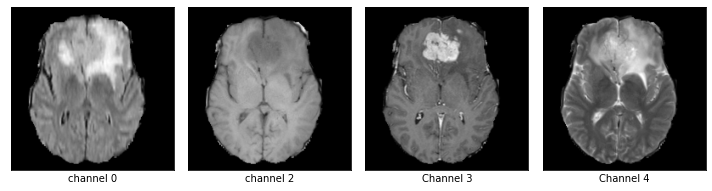

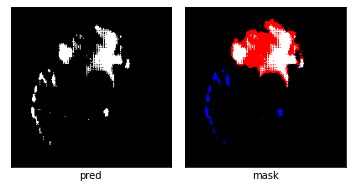

dice_loss : 0.0



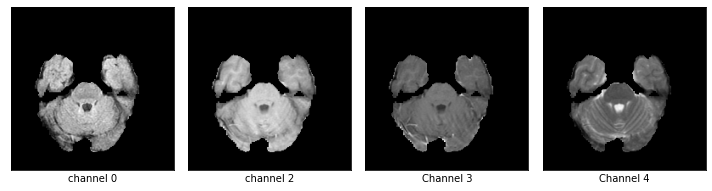

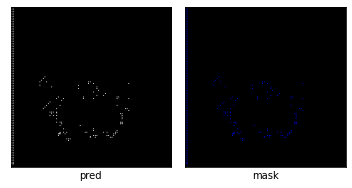

03/06 06:10:56 PM epoch 11 lr 2.126079e-02
03/06 06:10:56 PM genotype = Genotype(normal=[('dil_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('skip_connect', 0), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('sep_conv_5x5', 0), ('dil_conv_5x5', 1), ('dil_conv_5x5', 2), ('sep_conv_5x5', 3), ('sep_conv_5x5', 2), ('max_pool_3x3', 4), ('max_pool_3x3', 3)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<41:25,  1.06s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<40:47,  1.04s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<40:40,  1.04s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.4156, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<40:34,  1.04s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<40:25,  1.03s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.1852, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<40:26,  1.03s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.6335, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<40:11,  1.03s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.3343, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<40:08,  1.03s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.1198, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<39:50,  1.02s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.4342, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<39:54,  1.02s/it, Acc=1, IoU=0, Loss=0.011]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<39:50,  1.02s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<39:43,  1.02s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<39:55,  1.02s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.8675, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<39:44,  1.02s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<39:28,  1.01s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<39:56,  1.02s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<39:51,  1.02s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.3609, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<39:49,  1.02s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.0691, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:19<40:01,  1.03s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:20<39:44,  1.02s/it, Acc=0.989, IoU=0.751, Loss=0.145]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:21<39:45,  1.02s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:22<39:30,  1.02s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:23<39:46,  1.02s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:24<39:45,  1.02s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:25<40:12,  1.04s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.8513, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:26<40:08,  1.03s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:27<39:56,  1.03s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:28<39:32,  1.02s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.9649, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:29<39:55,  1.03s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:30<39:48,  1.03s/it, Acc=0.999, IoU=0, Loss=0.983]

tensor(0.5656, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:31<39:50,  1.03s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.1612, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:32<40:05,  1.04s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.3001, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:33<39:49,  1.03s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:34<39:31,  1.02s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.8312, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:35<39:21,  1.02s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:36<39:26,  1.02s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:37<39:13,  1.02s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.2110, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:38<39:33,  1.02s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.0511, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:39<39:29,  1.02s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.1420, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:40<39:46,  1.03s/it, Acc=0.997, IoU=0.905, Loss=0.051]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:42<39:56,  1.04s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:43<39:43,  1.03s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.2448, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:44<39:56,  1.04s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.3264, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:45<39:46,  1.03s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:46<39:26,  1.02s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:47<39:18,  1.02s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.2796, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:48<38:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:49<39:14,  1.02s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:50<39:25,  1.03s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.4874, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:51<39:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000288]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:52<39:26,  1.03s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.6536, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:53<39:15,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:54<39:19,  1.03s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:55<39:06,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:56<39:02,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9878, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:57<38:56,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:58<39:12,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [00:59<39:22,  1.03s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [01:00<39:08,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:01<39:11,  1.02s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:02<39:09,  1.02s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:03<38:50,  1.02s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:04<38:57,  1.02s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:05<38:56,  1.02s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:06<38:48,  1.02s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:07<38:58,  1.02s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:08<39:05,  1.03s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:09<39:02,  1.02s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.9010, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:10<39:08,  1.03s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.1442, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:11<39:30,  1.04s/it, Acc=0.989, IoU=0.81, Loss=0.104]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:12<39:08,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.2660, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:13<39:06,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:14<39:00,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.0396, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:15<39:05,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:16<39:17,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:17<39:24,  1.04s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.1727, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:18<38:58,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:19<38:54,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:20<39:01,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.9775, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:21<39:01,  1.03s/it, Acc=0.991, IoU=0.799, Loss=0.114]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:23<39:02,  1.03s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:24<38:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:25<39:00,  1.03s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:26<38:34,  1.02s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.1169, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:27<38:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:28<38:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:29<37:56,  1.00s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:30<38:02,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:31<38:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:32<38:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00195]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:33<38:04,  1.01s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:34<38:01,  1.01s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.9858, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:35<38:00,  1.01s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:36<38:03,  1.01s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:37<38:11,  1.01s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.3955, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:38<38:26,  1.02s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.1671, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:39<38:11,  1.01s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.1549, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:40<38:14,  1.02s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.4085, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:41<38:17,  1.02s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:42<38:17,  1.02s/it, Acc=0.985, IoU=0.814, Loss=0.105]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:43<38:26,  1.02s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:44<38:40,  1.03s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.1681, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:45<38:11,  1.02s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.5914, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:46<38:33,  1.03s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:47<38:26,  1.03s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:48<38:24,  1.02s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:49<38:30,  1.03s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.9826, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:50<38:14,  1.02s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:51<37:54,  1.01s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.1548, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:52<38:07,  1.02s/it, Acc=0.985, IoU=0.8, Loss=0.111]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:53<38:21,  1.03s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.7430, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:54<38:19,  1.03s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:55<38:13,  1.02s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.2831, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:56<37:49,  1.01s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:57<37:55,  1.02s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.1471, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [01:58<38:05,  1.02s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [01:59<38:12,  1.02s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.1695, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [02:00<38:30,  1.03s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [02:01<38:14,  1.03s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.4274, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:02<38:19,  1.03s/it, Acc=0.996, IoU=0.708, Loss=0.174]

tensor(0.1958, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:03<38:11,  1.03s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.1410, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:04<37:51,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:05<37:45,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.4707, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:06<37:53,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:07<38:06,  1.03s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:08<38:07,  1.03s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:09<37:47,  1.02s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2413, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:10<37:35,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:11<37:32,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.2991, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:12<37:21,  1.01s/it, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.4389, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:13<37:33,  1.01s/it, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.6997, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:14<37:32,  1.01s/it, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:15<37:03,  1.00s/it, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.4343, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:16<36:57,  1.00it/s, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.8426, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:17<36:48,  1.01it/s, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:18<36:37,  1.01it/s, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.9808, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:19<36:36,  1.01it/s, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:20<36:29,  1.01it/s, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:21<36:14,  1.02it/s, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.0425, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:22<36:23,  1.01it/s, Acc=0.984, IoU=0.479, Loss=0.354]

tensor(0.1585, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:23<36:27,  1.01it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:24<36:49,  1.00it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.2391, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:25<36:57,  1.00s/it, Acc=1, IoU=0, Loss=0.00103]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:26<36:43,  1.00it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.1346, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:27<36:44,  1.00it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.4661, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:28<36:40,  1.00it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:29<36:31,  1.01it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.1575, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:30<36:37,  1.00it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:31<36:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:32<36:18,  1.01it/s, Acc=1, IoU=0, Loss=0.00103]

tensor(0.3566, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:33<36:26,  1.01it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.3055, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:34<36:35,  1.00it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:35<36:28,  1.01it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:36<36:07,  1.02it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:37<36:01,  1.02it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:38<36:03,  1.02it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:39<36:17,  1.01it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:40<36:03,  1.02it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.1781, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:41<35:58,  1.02it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.3888, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:42<35:51,  1.02it/s, Acc=0.987, IoU=0.786, Loss=0.119]

tensor(0.4146, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:43<35:44,  1.02it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.1623, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:44<35:45,  1.02it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:45<35:45,  1.02it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:46<35:49,  1.02it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:47<35:51,  1.02it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.2673, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:48<36:06,  1.01it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.3676, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:49<35:56,  1.01it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.1246, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:50<36:04,  1.01it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:51<35:37,  1.02it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.5163, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:52<35:37,  1.02it/s, Acc=0.994, IoU=0.935, Loss=0.0347]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:53<35:41,  1.02it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:54<35:57,  1.01it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:55<35:45,  1.02it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [02:56<35:59,  1.01it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [02:57<36:00,  1.01it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [02:58<35:45,  1.02it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [02:59<35:40,  1.02it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [03:00<35:46,  1.01it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.1728, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [03:01<35:47,  1.01it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:02<35:54,  1.01it/s, Acc=0.973, IoU=0.0159, Loss=0.968]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:03<36:02,  1.01it/s, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:04<36:02,  1.00it/s, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.2657, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:05<35:56,  1.01it/s, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:06<36:24,  1.01s/it, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:07<37:04,  1.03s/it, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:08<36:44,  1.02s/it, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:09<36:44,  1.02s/it, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.9434, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:10<36:30,  1.01s/it, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.2630, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:11<36:16,  1.00s/it, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:12<35:55,  1.00it/s, Acc=0.999, IoU=0.68, Loss=0.194]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:13<35:44,  1.01it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.3459, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:14<35:37,  1.01it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:15<35:53,  1.00it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:16<35:35,  1.01it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:17<35:50,  1.00it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.2644, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:18<35:58,  1.00it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.9699, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:19<35:39,  1.01it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.5036, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:20<35:28,  1.01it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:21<35:20,  1.02it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.0745, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:22<35:31,  1.01it/s, Acc=0.994, IoU=0.862, Loss=0.0767]

tensor(0.1528, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:23<35:36,  1.01it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:24<35:45,  1.00it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.1142, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:25<35:36,  1.01it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:26<35:41,  1.00it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.2860, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:27<35:35,  1.01it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:28<35:19,  1.01it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.9892, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:29<35:12,  1.02it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.5314, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:30<35:19,  1.01it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:31<35:21,  1.01it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:32<35:17,  1.01it/s, Acc=0.99, IoU=0.73, Loss=0.156]

tensor(0.0579, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:33<35:15,  1.01it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:34<35:08,  1.02it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.1095, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:35<35:27,  1.01it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.5277, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:36<35:04,  1.02it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.1952, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:37<34:58,  1.02it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.7116, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:38<35:00,  1.02it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.3116, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:39<35:01,  1.02it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.1415, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:40<35:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:41<35:26,  1.00it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:42<35:24,  1.01it/s, Acc=1, IoU=0, Loss=0.00149]

tensor(0.1312, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:43<35:18,  1.01it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:44<35:10,  1.01it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:44<34:57,  1.02it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:45<35:06,  1.01it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:47<35:26,  1.00it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:47<35:11,  1.01it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:48<35:15,  1.01it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:49<35:19,  1.00it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:50<35:10,  1.01it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:51<35:14,  1.01it/s, Acc=0.998, IoU=0.801, Loss=0.112]

tensor(0.2268, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [03:52<35:15,  1.00it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [03:53<35:19,  1.00it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [03:54<35:14,  1.00it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.2059, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [03:55<35:02,  1.01it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.2100, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [03:56<34:48,  1.02it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [03:57<34:48,  1.01it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [03:58<34:52,  1.01it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.7835, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [03:59<34:58,  1.01it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [04:00<35:01,  1.01it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:01<34:47,  1.01it/s, Acc=0.992, IoU=0.252, Loss=0.595]

tensor(0.6745, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:02<34:47,  1.01it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.1548, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:03<34:37,  1.02it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:04<34:47,  1.01it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.3706, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:05<34:34,  1.02it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.7245, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:06<34:42,  1.01it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:07<34:38,  1.01it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:08<34:55,  1.01it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.1723, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:09<34:48,  1.01it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:10<34:47,  1.01it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:11<34:43,  1.01it/s, Acc=0.999, IoU=0.879, Loss=0.0647]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:12<34:35,  1.01it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.6289, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:13<34:29,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:14<34:13,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.3951, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:15<34:12,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.3195, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:16<34:14,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:17<34:16,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.9828, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:18<34:17,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:19<34:28,  1.01it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:20<34:38,  1.01it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:21<34:23,  1.02it/s, Acc=0.994, IoU=0.92, Loss=0.0414]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:22<34:29,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:23<34:35,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:24<34:29,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:25<34:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:26<34:29,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:27<34:28,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:28<34:19,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:29<34:23,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.6593, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:30<34:25,  1.01it/s, Acc=1, IoU=0, Loss=0.00681]

tensor(0.9843, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:31<34:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00681]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:32<34:59,  1.01s/it, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.2373, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:33<34:51,  1.00s/it, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.1120, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:34<34:34,  1.00it/s, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.2296, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:35<34:27,  1.01it/s, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.3637, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:36<34:43,  1.00s/it, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:37<34:42,  1.00s/it, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.1571, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:38<34:39,  1.00s/it, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:39<34:38,  1.00s/it, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.2494, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:40<34:59,  1.01s/it, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:41<34:45,  1.01s/it, Acc=0.998, IoU=0.932, Loss=0.0363]

tensor(0.3316, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:42<34:28,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0820, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:43<34:26,  1.00it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.6509, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:44<34:19,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:45<34:15,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:46<34:09,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:47<33:56,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:48<33:49,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [04:49<33:54,  1.02it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [04:50<33:57,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0489, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [04:51<34:02,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [04:52<33:57,  1.01it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.3091, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [04:53<34:06,  1.01it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.1282, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [04:54<34:05,  1.01it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [04:55<33:50,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [04:56<33:39,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [04:57<33:47,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [04:58<33:51,  1.01it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.9339, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [04:59<33:37,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.6718, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [05:00<33:31,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.7436, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:01<33:33,  1.02it/s, Acc=0.994, IoU=0.928, Loss=0.0386]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:02<33:35,  1.02it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:03<33:46,  1.01it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.3466, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:04<33:40,  1.02it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:05<33:32,  1.02it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:06<33:26,  1.02it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:07<33:25,  1.02it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.0963, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:08<33:24,  1.02it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:09<33:43,  1.01it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.0352, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:10<33:43,  1.01it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.3919, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:11<33:55,  1.00it/s, Acc=0.989, IoU=0.618, Loss=0.237]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:12<34:05,  1.00s/it, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.8618, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:13<34:06,  1.00s/it, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:14<33:44,  1.01it/s, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:15<33:34,  1.01it/s, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.9520, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:16<33:39,  1.01it/s, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:17<33:43,  1.01it/s, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:18<33:35,  1.01it/s, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.0426, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:19<33:44,  1.01it/s, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:20<33:44,  1.01it/s, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:21<33:38,  1.01it/s, Acc=0.98, IoU=0.81, Loss=0.105]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:22<33:33,  1.01it/s, Acc=0.895, IoU=0, Loss=1]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:23<33:38,  1.01it/s, Acc=0.895, IoU=0, Loss=1]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:24<33:40,  1.01it/s, Acc=0.895, IoU=0, Loss=1]

tensor(0.0582, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:25<33:44,  1.00it/s, Acc=0.895, IoU=0, Loss=1]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:26<34:12,  1.01s/it, Acc=0.895, IoU=0, Loss=1]

tensor(0.5501, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:27<34:13,  1.01s/it, Acc=0.895, IoU=0, Loss=1]

tensor(0.3925, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:28<33:55,  1.00s/it, Acc=0.895, IoU=0, Loss=1]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:29<33:49,  1.00s/it, Acc=0.895, IoU=0, Loss=1]

tensor(0.7971, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:30<33:52,  1.00s/it, Acc=0.895, IoU=0, Loss=1]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:31<33:36,  1.00it/s, Acc=0.895, IoU=0, Loss=1]

tensor(0.4301, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:32<33:23,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:33<33:25,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:34<33:27,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:35<33:22,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.9833, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:36<33:21,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:37<33:27,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:37<33:24,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.9893, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:38<33:04,  1.02it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.2084, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:39<33:24,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:40<33:14,  1.01it/s, Acc=0.996, IoU=0.907, Loss=0.0495]

tensor(0.6341, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:41<33:17,  1.01it/s, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.9775, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:42<33:28,  1.00it/s, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:43<33:26,  1.00it/s, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.5215, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:44<33:16,  1.01it/s, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:45<33:26,  1.00it/s, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:46<33:26,  1.00it/s, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [05:47<33:42,  1.01s/it, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [05:48<33:27,  1.00s/it, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.2776, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [05:49<33:27,  1.00s/it, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.1735, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [05:50<33:17,  1.00it/s, Acc=0.989, IoU=0.882, Loss=0.0625]

tensor(0.0406, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [05:51<33:22,  1.00it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.7478, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [05:52<33:18,  1.00it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.8111, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [05:53<32:42,  1.02it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [05:54<32:58,  1.01it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [05:55<32:56,  1.01it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [05:56<33:02,  1.01it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.4203, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [05:57<32:51,  1.01it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.3448, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [05:58<32:59,  1.01it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [05:59<33:07,  1.00it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:00<33:14,  1.00it/s, Acc=0.994, IoU=0.907, Loss=0.0503]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:01<32:58,  1.01it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:02<33:01,  1.01it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.8178, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:03<33:03,  1.00it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:04<32:59,  1.01it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.0341, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:05<32:51,  1.01it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:06<32:56,  1.01it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.3395, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:07<32:58,  1.00it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:08<33:06,  1.00it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:09<32:55,  1.01it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:10<32:51,  1.01it/s, Acc=0.904, IoU=0, Loss=1]

tensor(0.6547, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:11<32:46,  1.01it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.1501, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:12<32:41,  1.01it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:13<32:46,  1.01it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:14<32:50,  1.01it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.1444, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:15<32:48,  1.01it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:16<32:50,  1.00it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.2440, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:17<32:35,  1.01it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.4719, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:18<32:36,  1.01it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.1430, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:19<32:25,  1.02it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.6394, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:20<32:36,  1.01it/s, Acc=0.984, IoU=0.729, Loss=0.158]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:21<32:39,  1.01it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.6100, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:22<32:48,  1.00it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:23<32:32,  1.01it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.1721, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:24<32:27,  1.01it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:25<32:31,  1.01it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:26<32:36,  1.01it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.6387, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:27<32:34,  1.01it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:28<32:19,  1.01it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:29<32:13,  1.02it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.4045, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:30<32:18,  1.01it/s, Acc=0.995, IoU=0.929, Loss=0.0374]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:31<32:07,  1.02it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:32<32:07,  1.02it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.9824, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:33<32:25,  1.01it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.5702, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:34<32:31,  1.01it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.7800, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:35<32:38,  1.00it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:36<32:26,  1.01it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:37<32:28,  1.00it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:38<32:24,  1.01it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:39<32:15,  1.01it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:40<32:31,  1.00it/s, Acc=0.978, IoU=0.53, Loss=0.309]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:41<32:21,  1.01it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:42<32:22,  1.01it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.1388, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:43<32:22,  1.00it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:44<32:09,  1.01it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [06:45<32:09,  1.01it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.1652, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [06:46<32:01,  1.01it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [06:47<32:11,  1.01it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.6547, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [06:48<32:11,  1.01it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [06:49<31:58,  1.01it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.2580, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [06:50<31:53,  1.02it/s, Acc=0.995, IoU=0.874, Loss=0.0665]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [06:51<31:54,  1.02it/s, Acc=1, IoU=0, Loss=0.000679]

tensor(0.2411, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [06:52<32:09,  1.01it/s, Acc=1, IoU=0, Loss=0.000679]

tensor(0.1355, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [06:53<32:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000679]

tensor(0.1029, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [06:54<32:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000679]

tensor(0.2686, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [06:55<32:10,  1.00it/s, Acc=1, IoU=0, Loss=0.000679]

tensor(0.6242, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [06:56<32:20,  1.00s/it, Acc=1, IoU=0, Loss=0.000679]

tensor(0.1776, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [06:57<32:19,  1.00s/it, Acc=1, IoU=0, Loss=0.000679]

tensor(0.1887, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [06:58<32:15,  1.00it/s, Acc=1, IoU=0, Loss=0.000679]

tensor(0.4281, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [06:59<32:03,  1.01it/s, Acc=1, IoU=0, Loss=0.000679]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:00<31:53,  1.01it/s, Acc=1, IoU=0, Loss=0.000679]

tensor(0.1761, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:01<31:49,  1.01it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:02<31:40,  1.02it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.2241, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:03<31:45,  1.01it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.2210, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:04<31:48,  1.01it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.3662, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:05<31:55,  1.01it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:06<31:54,  1.01it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:07<31:37,  1.02it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:08<31:42,  1.01it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.6326, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:09<31:34,  1.02it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:10<31:34,  1.02it/s, Acc=0.992, IoU=0.91, Loss=0.0478]

tensor(0.4644, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:11<31:37,  1.01it/s, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:12<31:48,  1.01it/s, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.6179, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:13<31:47,  1.01it/s, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.2044, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:14<31:43,  1.01it/s, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.2785, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:15<31:33,  1.01it/s, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:16<31:33,  1.01it/s, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.1855, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:17<31:36,  1.01it/s, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:18<32:04,  1.00s/it, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.6275, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:19<32:03,  1.00s/it, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:20<31:41,  1.01it/s, Acc=0.993, IoU=0.684, Loss=0.19]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:21<31:39,  1.01it/s, Acc=1, IoU=0, Loss=0.00079]

tensor(0.3163, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:22<31:37,  1.01it/s, Acc=1, IoU=0, Loss=0.00079]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:23<31:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00079]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:24<31:42,  1.00it/s, Acc=1, IoU=0, Loss=0.00079]

tensor(0.3488, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:25<31:56,  1.00s/it, Acc=1, IoU=0, Loss=0.00079]

tensor(0.0441, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:26<31:42,  1.00it/s, Acc=1, IoU=0, Loss=0.00079]

tensor(0.2939, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:27<31:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00079]

tensor(0.1106, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:28<31:30,  1.01it/s, Acc=1, IoU=0, Loss=0.00079]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:29<31:49,  1.00s/it, Acc=1, IoU=0, Loss=0.00079]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:30<31:47,  1.00s/it, Acc=1, IoU=0, Loss=0.00079]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:31<31:32,  1.01it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.9881, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:32<31:15,  1.01it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.3095, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:33<31:04,  1.02it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:34<30:55,  1.02it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.1998, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:35<31:00,  1.02it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.1385, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:36<31:08,  1.02it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.8768, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:37<31:21,  1.01it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:37<30:58,  1.02it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.1618, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:38<30:50,  1.02it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:39<30:45,  1.03it/s, Acc=0.996, IoU=0.844, Loss=0.0849]

tensor(0.3779, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:40<30:51,  1.02it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:41<31:04,  1.02it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:42<31:09,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.0052, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [07:43<31:23,  1.00it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [07:44<31:18,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.6211, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [07:45<31:17,  1.01it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.0168, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [07:46<31:22,  1.00it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.4998, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [07:47<31:26,  1.00it/s, Acc=0.929, IoU=0, Loss=1]

tensor(0.1651, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [07:48<31:28,  1.00s/it, Acc=0.929, IoU=0, Loss=1]

tensor(0.5260, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [07:49<31:33,  1.00s/it, Acc=0.929, IoU=0, Loss=1]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [07:50<31:25,  1.00s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [07:51<31:19,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [07:52<31:09,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9098, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [07:53<31:02,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1521, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [07:54<31:17,  1.00it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9458, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [07:55<30:52,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0039, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [07:56<30:57,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.1406, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [07:57<31:03,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.2868, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [07:58<31:03,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0045, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [07:59<30:58,  1.01it/s, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:00<31:48,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9876, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:01<31:29,  1.01s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.7486, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:02<31:21,  1.01s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6357, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:03<31:17,  1.00s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6113, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:04<31:04,  1.00it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:05<30:52,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:06<30:44,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6231, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:07<30:41,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:08<30:34,  1.02it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.5070, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:09<30:43,  1.01it/s, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:10<30:29,  1.02it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:11<30:28,  1.02it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:12<30:23,  1.02it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:13<30:22,  1.02it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:14<30:18,  1.02it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.1905, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:15<30:19,  1.02it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.0952, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:16<30:22,  1.02it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:17<30:43,  1.01it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:18<30:55,  1.00it/s, Acc=1, IoU=0, Loss=0.0019]

tensor(0.7853, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:19<30:59,  1.00s/it, Acc=1, IoU=0, Loss=0.0019]

tensor(0.3289, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:20<31:10,  1.01s/it, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:21<31:18,  1.01s/it, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.6586, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:22<31:04,  1.01s/it, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.8823, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:23<30:56,  1.00s/it, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.9358, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:24<30:36,  1.01it/s, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:25<30:43,  1.00it/s, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:26<30:50,  1.00s/it, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:27<30:38,  1.00it/s, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:28<30:27,  1.01it/s, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.9898, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:29<30:12,  1.02it/s, Acc=0.989, IoU=0.75, Loss=0.144]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:30<30:27,  1.01it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:31<30:19,  1.01it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:32<30:16,  1.01it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.5144, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:33<30:04,  1.02it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:34<29:57,  1.02it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.2364, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:35<30:08,  1.02it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:36<30:14,  1.01it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.1412, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:37<30:02,  1.02it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:38<30:07,  1.02it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.4721, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:39<29:55,  1.02it/s, Acc=0.991, IoU=0.726, Loss=0.153]

tensor(0.1865, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:40<29:55,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.3618, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:41<30:02,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.0745, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [08:42<29:55,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.1713, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [08:43<29:45,  1.03it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [08:44<29:47,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.7950, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [08:45<29:48,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [08:46<29:45,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [08:47<29:52,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [08:48<29:44,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [08:49<29:43,  1.02it/s, Acc=0.983, IoU=0.682, Loss=0.191]

tensor(0.5005, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [08:50<29:41,  1.02it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.1469, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [08:51<29:54,  1.02it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [08:52<29:41,  1.02it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [08:53<29:47,  1.02it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [08:54<29:56,  1.01it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [08:55<29:51,  1.02it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.7551, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [08:56<29:57,  1.01it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [08:57<29:42,  1.02it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.2818, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [08:58<29:34,  1.02it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.0362, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [08:59<29:41,  1.02it/s, Acc=0.997, IoU=0.858, Loss=0.0781]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:00<29:54,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.5634, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:01<30:06,  1.00it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:02<30:13,  1.00s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:03<30:06,  1.00it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:04<30:08,  1.00it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1286, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:05<30:01,  1.00it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2918, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:06<29:52,  1.01it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.7015, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:07<29:36,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.5887, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:07<29:24,  1.02it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2811, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:08<29:20,  1.03it/s, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.6237, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:09<29:23,  1.02it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.7156, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:10<29:31,  1.02it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:11<29:29,  1.02it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.1045, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:12<29:43,  1.01it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:13<29:44,  1.01it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.1773, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:14<29:34,  1.01it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.1607, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:15<29:37,  1.01it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.1098, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:16<29:45,  1.01it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.2950, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:17<29:51,  1.00it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:18<29:47,  1.00it/s, Acc=0.976, IoU=0.335, Loss=0.497]

tensor(0.6900, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:19<29:43,  1.01it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:20<29:47,  1.00it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.1985, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:21<29:32,  1.01it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:22<29:32,  1.01it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:23<29:33,  1.01it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:24<29:44,  1.00it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:25<29:44,  1.00it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:26<29:51,  1.00s/it, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.6636, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:27<29:42,  1.00it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:28<29:33,  1.01it/s, Acc=0.974, IoU=0.651, Loss=0.21]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:29<29:38,  1.00it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.9903, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:30<29:33,  1.01it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:31<29:33,  1.00it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.3132, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:32<29:21,  1.01it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:33<29:18,  1.01it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.2207, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:34<29:10,  1.02it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:35<29:07,  1.02it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.2834, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:36<29:30,  1.00it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:37<29:40,  1.00s/it, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:38<29:32,  1.00it/s, Acc=0.997, IoU=0.789, Loss=0.12]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:39<29:22,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [09:40<29:13,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [09:41<29:22,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [09:42<29:19,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.1514, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [09:43<29:19,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [09:44<29:07,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [09:45<29:05,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [09:46<29:02,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.1746, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [09:47<29:12,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.0491, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [09:48<29:12,  1.01it/s, Acc=0.999, IoU=0.706, Loss=0.172]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [09:49<29:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.0991, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [09:50<29:01,  1.01it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.7869, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [09:51<29:00,  1.01it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [09:52<28:52,  1.02it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.2707, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [09:53<28:39,  1.02it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [09:54<28:20,  1.03it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.4259, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [09:55<28:26,  1.03it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.3762, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [09:56<28:32,  1.03it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [09:57<28:41,  1.02it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.9892, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [09:58<28:51,  1.01it/s, Acc=1, IoU=0, Loss=0.000492]

tensor(0.9755, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [09:59<28:54,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:00<28:56,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:01<28:57,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1607, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:02<28:49,  1.01it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9720, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:03<28:39,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.7121, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:04<28:41,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:05<28:24,  1.03it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:06<28:28,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.4969, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:07<28:31,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.2589, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:08<28:24,  1.02it/s, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:09<28:44,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.8676, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:10<28:52,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.9615, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:11<28:48,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:12<28:48,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:13<28:44,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.3595, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:14<28:46,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:15<28:48,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:16<28:55,  1.00it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.1318, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:17<28:36,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:18<28:31,  1.01it/s, Acc=0.971, IoU=0.491, Loss=0.341]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:19<28:18,  1.02it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:20<28:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.5483, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:21<28:38,  1.01it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.5275, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:22<28:43,  1.00it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.1817, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:23<28:44,  1.00it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.9481, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:24<28:36,  1.01it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.9473, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:25<28:32,  1.01it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.4784, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:26<28:38,  1.00it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:27<28:33,  1.01it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:28<28:19,  1.02it/s, Acc=1, IoU=0, Loss=0.00175]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:29<28:17,  1.02it/s, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:30<28:19,  1.01it/s, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:31<28:21,  1.01it/s, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.6070, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:32<28:33,  1.00it/s, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:33<28:44,  1.00s/it, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:34<28:40,  1.00s/it, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:35<28:32,  1.00it/s, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:36<28:24,  1.01it/s, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.6142, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:37<28:37,  1.00s/it, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.2324, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:38<28:43,  1.01s/it, Acc=0.995, IoU=0.887, Loss=0.0608]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:39<28:35,  1.00s/it, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.4116, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [10:40<28:31,  1.00it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.4298, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [10:41<28:25,  1.00it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [10:42<28:13,  1.01it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.1398, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [10:43<28:02,  1.02it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.6178, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [10:44<28:03,  1.02it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [10:44<27:57,  1.02it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [10:45<27:59,  1.02it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.8635, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [10:46<28:02,  1.01it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.1351, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [10:47<28:01,  1.01it/s, Acc=0.995, IoU=0.941, Loss=0.0307]

tensor(0.4204, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [10:48<28:03,  1.01it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [10:49<28:01,  1.01it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [10:50<27:51,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.3597, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [10:51<27:48,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.0323, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [10:52<27:49,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.9407, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [10:53<27:58,  1.01it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [10:54<27:48,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.6772, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [10:55<27:42,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.6990, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [10:56<27:45,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.7052, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [10:57<27:38,  1.02it/s, Acc=0.993, IoU=0.86, Loss=0.0761]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [10:58<27:31,  1.03it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3001, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [10:59<27:40,  1.02it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:00<27:38,  1.02it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.5589, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:01<27:42,  1.02it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:02<27:36,  1.02it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:03<27:31,  1.02it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.3936, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:04<27:33,  1.02it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:05<27:43,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:06<27:51,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:07<27:49,  1.01it/s, Acc=0.976, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:08<27:37,  1.02it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:09<27:46,  1.01it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:10<27:42,  1.01it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:11<27:43,  1.01it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:12<27:33,  1.02it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:13<27:33,  1.02it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:14<27:39,  1.01it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.2076, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:15<27:24,  1.02it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:16<27:35,  1.01it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.7004, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:17<27:23,  1.02it/s, Acc=0.996, IoU=0.83, Loss=0.0947]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:18<27:37,  1.01it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:19<27:31,  1.01it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:20<27:27,  1.01it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.1479, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:21<27:14,  1.02it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:22<27:20,  1.02it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:23<27:20,  1.02it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:24<27:20,  1.02it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:25<27:26,  1.01it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.2249, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:26<27:39,  1.00it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.6242, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:27<27:39,  1.00it/s, Acc=0.988, IoU=0.743, Loss=0.147]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:28<27:30,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.1286, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:29<27:31,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.5496, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:30<27:27,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:31<27:22,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.4018, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:32<27:24,  1.01it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.4288, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:33<27:14,  1.02it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:34<27:07,  1.02it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.9887, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:35<27:04,  1.02it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.5949, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:36<27:05,  1.02it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:37<27:10,  1.02it/s, Acc=0.993, IoU=0.914, Loss=0.0456]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [11:38<27:03,  1.02it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.0858, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [11:39<27:04,  1.02it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.3616, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [11:40<27:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.9240, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [11:41<27:12,  1.01it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.1951, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [11:42<27:14,  1.01it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.9768, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [11:43<27:03,  1.02it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.6328, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [11:44<27:07,  1.01it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.2186, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [11:45<27:02,  1.01it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.8222, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [11:46<26:49,  1.02it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.1701, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [11:47<27:06,  1.01it/s, Acc=1, IoU=0, Loss=0.00382]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [11:48<27:18,  1.00it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [11:49<27:31,  1.01s/it, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.8178, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [11:50<27:20,  1.00it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [11:51<27:13,  1.00it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [11:52<27:06,  1.01it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [11:53<27:11,  1.00it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [11:54<27:05,  1.01it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.5681, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [11:55<27:01,  1.01it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [11:56<26:51,  1.02it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.1042, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [11:57<27:04,  1.01it/s, Acc=0.992, IoU=0.848, Loss=0.0839]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [11:58<27:09,  1.00it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.8743, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [11:59<27:06,  1.00it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:00<26:54,  1.01it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:01<26:59,  1.01it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:02<27:09,  1.00it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.2193, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:02<26:53,  1.01it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.3598, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:03<26:52,  1.01it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.1738, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:04<26:47,  1.01it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.2882, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:05<26:40,  1.02it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.2774, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:06<26:36,  1.02it/s, Acc=0.993, IoU=0.799, Loss=0.114]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:07<26:45,  1.01it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.6404, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:08<26:39,  1.01it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.2206, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:09<26:36,  1.02it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.1932, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:10<26:33,  1.02it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:11<26:38,  1.01it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:12<26:36,  1.01it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.2091, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:13<26:34,  1.01it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:14<26:32,  1.02it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:15<26:30,  1.02it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:16<26:29,  1.02it/s, Acc=1, IoU=0, Loss=0.046]

tensor(0.5634, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:17<26:42,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:18<26:45,  1.00it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:19<26:40,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:20<26:42,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:21<26:35,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:22<26:35,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.3017, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:23<26:38,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:24<26:28,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:25<26:28,  1.01it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.1653, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:26<26:15,  1.02it/s, Acc=1, IoU=0, Loss=0.75]

tensor(0.2047, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:27<26:12,  1.02it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:28<26:07,  1.02it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:29<26:10,  1.02it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:30<26:20,  1.01it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.1532, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:31<26:19,  1.01it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.8738, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:32<26:12,  1.02it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.9333, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:33<26:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:34<26:13,  1.02it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [12:35<26:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [12:36<26:00,  1.02it/s, Acc=1, IoU=0, Loss=0.000609]

tensor(0.9830, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [12:37<26:07,  1.02it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.2462, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [12:38<26:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [12:39<26:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0896, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [12:40<26:05,  1.02it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.2074, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [12:41<26:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [12:42<25:58,  1.02it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [12:43<25:58,  1.02it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [12:44<25:57,  1.02it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [12:45<25:47,  1.02it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [12:46<25:45,  1.03it/s, Acc=1, IoU=0, Loss=0.00166]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [12:47<25:52,  1.02it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [12:48<26:02,  1.01it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.1026, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [12:49<25:47,  1.02it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [12:50<25:45,  1.02it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [12:51<25:52,  1.02it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [12:52<26:01,  1.01it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [12:53<26:01,  1.01it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [12:54<26:02,  1.01it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [12:55<25:55,  1.01it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [12:56<25:49,  1.02it/s, Acc=0.98, IoU=0.836, Loss=0.0899]

tensor(0.9767, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [12:57<25:48,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [12:58<25:48,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.6794, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [12:59<25:47,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:00<25:39,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:01<25:35,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:02<25:35,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:03<25:30,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.5157, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:04<25:28,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:04<25:31,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:05<25:34,  1.02it/s, Acc=0.992, IoU=0.86, Loss=0.075]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:06<25:40,  1.02it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:07<25:45,  1.01it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.9321, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:08<25:43,  1.01it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.9749, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:09<25:42,  1.01it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:10<25:46,  1.01it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:11<25:49,  1.01it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:12<25:44,  1.01it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:13<25:37,  1.01it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:14<25:52,  1.00it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.9896, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:15<25:45,  1.01it/s, Acc=1, IoU=0, Loss=0.000923]

tensor(0.5299, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:16<25:48,  1.00it/s, Acc=1, IoU=0, Loss=0.000454]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:17<25:53,  1.00s/it, Acc=1, IoU=0, Loss=0.000454]

tensor(0.8093, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:18<25:49,  1.00it/s, Acc=1, IoU=0, Loss=0.000454]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:19<25:58,  1.00s/it, Acc=1, IoU=0, Loss=0.000454]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:20<25:48,  1.00it/s, Acc=1, IoU=0, Loss=0.000454]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:21<25:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000454]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:22<25:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000454]

tensor(0.3005, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:23<25:46,  1.00it/s, Acc=1, IoU=0, Loss=0.000454]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:24<25:50,  1.00s/it, Acc=1, IoU=0, Loss=0.000454]

tensor(0.9864, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:25<25:52,  1.00s/it, Acc=1, IoU=0, Loss=0.000454]

tensor(0.5712, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:26<25:53,  1.01s/it, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:27<26:04,  1.01s/it, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.1412, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:29<26:10,  1.02s/it, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.5467, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:29<25:55,  1.01s/it, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:31<25:57,  1.01s/it, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.6339, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:32<25:47,  1.01s/it, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.1316, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:32<25:37,  1.00it/s, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [13:33<25:28,  1.01it/s, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [13:34<25:27,  1.01it/s, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [13:35<25:42,  1.00s/it, Acc=0.99, IoU=0.895, Loss=0.0564]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [13:37<25:40,  1.00s/it, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.9814, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [13:38<25:39,  1.00s/it, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [13:39<25:45,  1.01s/it, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.4681, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [13:40<25:37,  1.00s/it, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [13:41<25:28,  1.00it/s, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [13:41<25:17,  1.01it/s, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.6173, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [13:42<25:04,  1.02it/s, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.3521, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [13:43<25:05,  1.01it/s, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.0497, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [13:44<25:00,  1.02it/s, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [13:45<25:08,  1.01it/s, Acc=0.992, IoU=0.703, Loss=0.178]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [13:46<25:02,  1.01it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.2987, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [13:47<25:06,  1.01it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [13:48<25:01,  1.01it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [13:49<24:51,  1.02it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.8955, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [13:50<24:51,  1.02it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [13:51<24:51,  1.02it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [13:52<24:51,  1.02it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [13:53<24:54,  1.02it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [13:54<24:48,  1.02it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.0475, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [13:55<24:47,  1.02it/s, Acc=0.995, IoU=0.891, Loss=0.059]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [13:56<24:42,  1.02it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.5039, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [13:57<24:43,  1.02it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.0339, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [13:58<24:33,  1.03it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.3804, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [13:59<24:28,  1.03it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:00<24:46,  1.02it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.9788, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:01<24:54,  1.01it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:02<24:44,  1.02it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:03<24:34,  1.02it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:04<24:37,  1.02it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:05<24:34,  1.02it/s, Acc=0.995, IoU=0.83, Loss=0.0925]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:06<24:44,  1.01it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:07<24:45,  1.01it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.7116, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:08<24:32,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:09<24:24,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:10<24:20,  1.03it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.4709, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:11<24:27,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:12<24:33,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:13<24:30,  1.02it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0392, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:14<24:39,  1.01it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:15<24:47,  1.01it/s, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.5556, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:16<24:33,  1.01it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:17<24:29,  1.02it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:18<24:28,  1.02it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.3945, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:19<24:25,  1.02it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.5342, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:20<24:28,  1.01it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:21<24:25,  1.02it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:22<24:30,  1.01it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.1373, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:23<24:35,  1.01it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.9463, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:24<24:35,  1.01it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.7586, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:25<24:33,  1.01it/s, Acc=0.995, IoU=0.148, Loss=0.746]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:26<24:34,  1.01it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:27<24:39,  1.00it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.2901, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:28<24:37,  1.00it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:29<24:39,  1.00it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:30<24:29,  1.01it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [14:31<24:29,  1.01it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [14:32<24:19,  1.01it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [14:33<24:21,  1.01it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [14:34<24:10,  1.02it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [14:35<24:10,  1.02it/s, Acc=0.993, IoU=0.776, Loss=0.126]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [14:36<24:13,  1.01it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [14:37<24:00,  1.02it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.5347, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [14:38<24:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [14:39<24:10,  1.01it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [14:40<24:09,  1.01it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [14:41<24:06,  1.02it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [14:42<24:21,  1.00it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.1986, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [14:43<24:18,  1.01it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [14:44<24:06,  1.01it/s, Acc=1, IoU=0, Loss=0.000527]

tensor(0.9854, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [14:45<24:25,  1.00s/it, Acc=1, IoU=0, Loss=0.000527]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [14:46<24:24,  1.00s/it, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.4705, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [14:47<24:21,  1.00it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [14:48<24:13,  1.01it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [14:49<24:03,  1.01it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [14:50<23:53,  1.02it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [14:50<23:48,  1.02it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [14:51<23:49,  1.02it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [14:52<23:55,  1.01it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [14:53<23:47,  1.02it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [14:54<23:52,  1.02it/s, Acc=0.998, IoU=0.822, Loss=0.097]

tensor(0.6498, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [14:55<23:54,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.4361, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [14:56<24:06,  1.00it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [14:57<24:09,  1.00it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0436, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [14:58<24:05,  1.00it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [14:59<23:56,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:00<23:49,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.3561, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:01<23:47,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:02<23:38,  1.02it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:03<23:41,  1.02it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1550, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:04<23:46,  1.01it/s, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:05<23:53,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.3001, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:06<23:59,  1.00it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:07<23:51,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:08<23:47,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1265, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:09<23:51,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.6492, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:10<23:51,  1.00it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.3624, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:11<23:52,  1.00it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.5163, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:12<23:44,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:13<23:44,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:14<23:36,  1.01it/s, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.6487, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:15<23:27,  1.02it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.7553, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:16<23:38,  1.01it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.0401, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:17<23:40,  1.01it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:18<23:36,  1.01it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:19<23:25,  1.02it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:20<23:20,  1.02it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:21<23:30,  1.01it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:22<23:29,  1.01it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:23<23:25,  1.01it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.3143, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:24<23:17,  1.02it/s, Acc=1, IoU=0, Loss=0.000623]

tensor(0.6171, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:25<23:16,  1.02it/s, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.4770, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:26<23:36,  1.00it/s, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:27<23:49,  1.01s/it, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.9706, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:28<23:42,  1.00s/it, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.4488, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [15:29<23:41,  1.00s/it, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.0349, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [15:30<23:37,  1.00it/s, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.1761, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [15:31<23:27,  1.01it/s, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [15:32<23:21,  1.01it/s, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.6046, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [15:33<23:21,  1.01it/s, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [15:34<23:15,  1.01it/s, Acc=0.986, IoU=0.434, Loss=0.396]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [15:35<23:07,  1.02it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [15:36<23:05,  1.02it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [15:37<23:08,  1.02it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.6236, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [15:38<23:14,  1.01it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [15:39<23:01,  1.02it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [15:40<22:58,  1.02it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [15:41<23:17,  1.01it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.1189, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [15:42<23:22,  1.00it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.4544, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [15:43<23:24,  1.00it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [15:44<23:24,  1.00it/s, Acc=0.99, IoU=0.884, Loss=0.0629]

tensor(0.4968, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [15:45<23:19,  1.00it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.6038, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [15:46<23:15,  1.01it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.3708, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [15:47<23:09,  1.01it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.1534, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [15:48<23:10,  1.01it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.0475, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [15:49<23:15,  1.00it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [15:50<23:12,  1.00it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [15:51<23:13,  1.00it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.7023, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [15:52<23:09,  1.01it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [15:53<22:58,  1.01it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [15:54<22:52,  1.02it/s, Acc=0.984, IoU=0.752, Loss=0.142]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [15:55<22:49,  1.02it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.1154, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [15:56<22:54,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [15:57<22:55,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [15:58<22:49,  1.02it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.5044, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [15:59<22:43,  1.02it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:00<22:49,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.6459, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:01<22:48,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.0338, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:02<22:43,  1.02it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:03<22:58,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:04<22:50,  1.01it/s, Acc=0.995, IoU=0.922, Loss=0.0411]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:05<22:53,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:06<22:55,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:07<23:10,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:08<23:06,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:09<22:53,  1.00it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0391, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:10<22:57,  1.00it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:11<22:49,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1014, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:12<22:41,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.5352, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:13<22:32,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:14<22:29,  1.02it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:15<22:32,  1.02it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.5071, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:16<22:32,  1.02it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.4159, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:17<22:32,  1.01it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.9840, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:18<22:30,  1.02it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.5219, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:19<23:02,  1.01s/it, Acc=0.934, IoU=0, Loss=1]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:20<22:46,  1.00it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.2276, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:21<22:37,  1.01it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:22<22:28,  1.01it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:23<22:23,  1.02it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.3158, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:24<22:20,  1.02it/s, Acc=0.934, IoU=0, Loss=1]

tensor(0.0377, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:25<22:27,  1.01it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.2361, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:26<22:26,  1.01it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.9903, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:27<22:32,  1.01it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.6154, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [16:28<22:27,  1.01it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [16:28<22:11,  1.02it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.2164, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [16:29<22:02,  1.03it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [16:30<22:06,  1.02it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [16:31<22:11,  1.02it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.1678, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [16:32<22:15,  1.02it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [16:33<22:12,  1.02it/s, Acc=0.989, IoU=0.779, Loss=0.126]

tensor(0.9837, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [16:34<22:16,  1.01it/s, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [16:35<22:22,  1.01it/s, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [16:36<22:28,  1.00it/s, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [16:37<22:22,  1.01it/s, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [16:38<22:14,  1.01it/s, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.2139, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [16:39<22:09,  1.01it/s, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.2948, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [16:40<22:03,  1.02it/s, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.8477, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [16:41<22:11,  1.01it/s, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.4003, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [16:42<22:40,  1.01s/it, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [16:43<22:41,  1.01s/it, Acc=0.992, IoU=0.794, Loss=0.115]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [16:44<22:30,  1.01s/it, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [16:45<22:35,  1.01s/it, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [16:46<22:35,  1.01s/it, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [16:47<22:28,  1.01s/it, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [16:48<22:27,  1.01s/it, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [16:49<22:21,  1.00s/it, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.9918, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [16:50<22:08,  1.01it/s, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.6646, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [16:51<22:02,  1.01it/s, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.9783, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [16:52<22:03,  1.01it/s, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.6309, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [16:53<22:04,  1.01it/s, Acc=0.994, IoU=0.935, Loss=0.0341]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [16:54<22:06,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [16:55<22:15,  1.00s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [16:56<22:20,  1.01s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [16:57<22:18,  1.01s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [16:58<22:10,  1.00s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [16:59<22:11,  1.00s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1686, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:00<22:04,  1.00it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:01<22:01,  1.00it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1412, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:02<21:59,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:03<21:56,  1.01it/s, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.4562, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:04<21:46,  1.01it/s, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.6720, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:05<21:52,  1.01it/s, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:06<21:55,  1.00it/s, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:07<21:49,  1.01it/s, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:08<21:47,  1.01it/s, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.8769, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:09<21:45,  1.01it/s, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:10<21:55,  1.00it/s, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.0486, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:11<22:12,  1.01s/it, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:12<22:12,  1.01s/it, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:13<22:07,  1.01s/it, Acc=0.992, IoU=0.849, Loss=0.0818]

tensor(0.9875, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:14<22:00,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:15<21:54,  1.00s/it, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1715, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:16<21:50,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:17<21:45,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:18<21:38,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:19<21:48,  1.00it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:20<21:39,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:21<21:36,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:22<21:30,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:23<21:36,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:24<21:37,  1.01it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:25<21:34,  1.01it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [17:26<21:32,  1.01it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [17:27<21:28,  1.01it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [17:28<21:26,  1.01it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.8551, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [17:29<21:29,  1.01it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.3959, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [17:30<21:33,  1.00it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.0491, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [17:31<21:20,  1.01it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.9764, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [17:32<21:08,  1.02it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [17:33<21:12,  1.02it/s, Acc=0.994, IoU=0.873, Loss=0.0688]

tensor(0.8940, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [17:34<20:58,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.2080, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [17:35<21:00,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [17:36<20:57,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.7212, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [17:37<20:58,  1.03it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [17:38<21:07,  1.02it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [17:39<21:08,  1.02it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [17:40<21:05,  1.02it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.1990, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [17:41<21:05,  1.02it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [17:42<21:10,  1.01it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [17:43<21:09,  1.01it/s, Acc=0.996, IoU=0.958, Loss=0.0223]

tensor(0.6362, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [17:44<20:58,  1.02it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [17:45<20:59,  1.02it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [17:46<21:00,  1.02it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.1167, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [17:47<20:56,  1.02it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [17:48<20:56,  1.02it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [17:49<21:04,  1.01it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [17:50<21:04,  1.01it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.5258, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [17:51<21:04,  1.01it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.9826, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [17:52<21:08,  1.01it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [17:53<21:03,  1.01it/s, Acc=0.997, IoU=0.85, Loss=0.083]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [17:54<21:08,  1.00it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.1740, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [17:55<21:04,  1.01it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [17:56<21:00,  1.01it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.1412, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [17:57<20:50,  1.02it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.1614, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [17:58<20:46,  1.02it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.6750, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [17:59<20:53,  1.01it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.2016, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:00<20:46,  1.02it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:01<20:39,  1.02it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:02<20:36,  1.02it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:03<20:40,  1.02it/s, Acc=0.987, IoU=0.409, Loss=0.416]

tensor(0.3286, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:04<20:40,  1.02it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:05<20:48,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.7543, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:06<20:43,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:07<20:45,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:08<20:39,  1.02it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:09<20:41,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:10<20:47,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:11<20:43,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.2246, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:12<20:43,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.9618, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:13<20:39,  1.01it/s, Acc=0.994, IoU=0.89, Loss=0.0586]

tensor(0.9880, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:14<20:38,  1.01it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:15<20:50,  1.00it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:16<20:45,  1.01it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.9791, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:17<20:44,  1.01it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.9660, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:17<20:31,  1.01it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:18<20:26,  1.02it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.5364, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:19<20:22,  1.02it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:20<20:16,  1.02it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:21<20:18,  1.02it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.3577, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:22<20:21,  1.02it/s, Acc=0.979, IoU=0.0639, Loss=0.877]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:23<20:20,  1.02it/s, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.3658, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [18:24<20:21,  1.02it/s, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.4978, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [18:25<20:43,  1.00s/it, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.9694, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [18:26<20:49,  1.01s/it, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.2386, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [18:27<20:41,  1.00s/it, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.8782, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [18:28<20:32,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.2285, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [18:29<20:26,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.2753, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [18:30<20:26,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [18:31<20:29,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.5174, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [18:32<20:22,  1.01it/s, Acc=0.995, IoU=0.912, Loss=0.0469]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [18:33<20:23,  1.01it/s, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [18:34<20:25,  1.01it/s, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [18:35<20:24,  1.01it/s, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.8050, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [18:36<20:29,  1.00it/s, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.0393, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [18:37<20:26,  1.00it/s, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [18:38<20:26,  1.00it/s, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [18:39<20:47,  1.02s/it, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [18:40<20:38,  1.01s/it, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [18:41<20:44,  1.02s/it, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.1622, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [18:42<20:38,  1.01s/it, Acc=0.991, IoU=0.629, Loss=0.232]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [18:43<20:33,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [18:44<20:32,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.4502, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [18:45<20:29,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [18:46<20:41,  1.02s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [18:47<20:31,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.2481, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [18:48<20:27,  1.01s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.0934, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [18:49<20:21,  1.00s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.1339, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [18:50<20:22,  1.00s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [18:51<20:20,  1.00s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [18:52<20:15,  1.00s/it, Acc=0.993, IoU=0.819, Loss=0.0989]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [18:53<19:59,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3742, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [18:54<19:54,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2411, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [18:55<19:46,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [18:56<19:45,  1.02it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3404, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [18:57<19:59,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.2336, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [18:58<19:55,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.1719, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [18:59<19:54,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.0450, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:00<19:56,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:01<19:56,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:02<19:56,  1.01it/s, Acc=0.987, IoU=0, Loss=0.998]

tensor(0.3263, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:03<20:00,  1.00it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.3365, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:04<20:05,  1.00s/it, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.5961, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:05<20:01,  1.00it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.1575, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:06<19:48,  1.01it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.0979, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:07<19:48,  1.01it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:08<19:45,  1.01it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.5472, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:09<19:48,  1.01it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.9876, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:10<19:46,  1.01it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:11<19:47,  1.01it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:12<19:33,  1.02it/s, Acc=0.989, IoU=0.907, Loss=0.0505]

tensor(0.6068, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:13<19:24,  1.03it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.0623, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:14<19:22,  1.03it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:15<19:19,  1.03it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:16<19:16,  1.03it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:17<19:14,  1.03it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.4926, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:18<19:10,  1.03it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.0363, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:19<19:16,  1.03it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.6193, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:20<19:35,  1.01it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.1410, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:21<19:33,  1.01it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [19:22<19:35,  1.01it/s, Acc=0.988, IoU=0.833, Loss=0.0919]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [19:23<19:30,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [19:24<19:35,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.2207, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [19:25<19:36,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.5551, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [19:26<19:38,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [19:27<19:36,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [19:28<19:40,  1.00s/it, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [19:29<19:33,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.3184, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [19:30<19:27,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [19:31<19:30,  1.00it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [19:32<19:21,  1.01it/s, Acc=0.988, IoU=0, Loss=0.998]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [19:33<19:18,  1.01it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.3813, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [19:34<19:18,  1.01it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.3249, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [19:35<19:11,  1.02it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [19:36<19:03,  1.02it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [19:37<19:03,  1.02it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.4583, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [19:38<19:03,  1.02it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.7963, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [19:39<18:58,  1.03it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.4382, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [19:40<18:54,  1.03it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [19:41<18:46,  1.04it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.3328, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [19:42<18:39,  1.04it/s, Acc=0.973, IoU=0.0653, Loss=0.875]

tensor(0.0402, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [19:43<18:39,  1.04it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [19:44<18:49,  1.03it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.7059, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [19:45<18:55,  1.02it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.6075, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [19:46<18:59,  1.02it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [19:47<19:24,  1.00s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.1359, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [19:48<19:27,  1.01s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.9768, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [19:49<19:22,  1.00s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.8678, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [19:50<19:04,  1.01it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.4795, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [19:51<19:08,  1.01it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.6829, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [19:52<19:16,  1.00s/it, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.1633, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [19:53<19:23,  1.01s/it, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [19:54<19:19,  1.01s/it, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.1441, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [19:55<19:13,  1.00s/it, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [19:56<19:05,  1.00it/s, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.7172, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [19:57<18:55,  1.01it/s, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [19:58<18:51,  1.02it/s, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [19:59<18:46,  1.02it/s, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.5111, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:00<18:37,  1.03it/s, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.3995, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:00<18:40,  1.02it/s, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:01<18:43,  1.02it/s, Acc=0.98, IoU=0.757, Loss=0.137]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:02<18:39,  1.02it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.7937, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:03<18:47,  1.01it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:04<18:51,  1.01it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.4377, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:05<18:52,  1.01it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:06<18:48,  1.01it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:07<18:49,  1.01it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:08<18:48,  1.01it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:09<18:46,  1.01it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:10<18:38,  1.02it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:11<18:39,  1.01it/s, Acc=0.992, IoU=0.798, Loss=0.114]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:12<18:35,  1.02it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:13<18:44,  1.01it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.3255, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:14<18:34,  1.02it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:15<18:42,  1.01it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:16<18:34,  1.01it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:17<18:29,  1.02it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:18<18:34,  1.01it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [20:19<18:26,  1.02it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [20:20<18:31,  1.01it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.3871, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [20:21<18:28,  1.01it/s, Acc=0.955, IoU=0, Loss=0.999]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [20:22<18:26,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [20:23<18:29,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.5331, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [20:24<18:22,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.1620, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [20:25<18:21,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.7508, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [20:26<18:25,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [20:27<18:23,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.6294, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [20:28<18:21,  1.02it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [20:29<18:22,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [20:30<18:25,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.6885, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [20:31<18:23,  1.01it/s, Acc=0.954, IoU=0, Loss=0.999]

tensor(0.1727, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [20:32<18:31,  1.00it/s, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [20:33<18:33,  1.00s/it, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [20:34<18:30,  1.00it/s, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.1947, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [20:35<18:34,  1.00s/it, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [20:36<18:18,  1.01it/s, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [20:37<18:09,  1.02it/s, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.5534, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [20:38<18:16,  1.01it/s, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.1517, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [20:39<17:59,  1.03it/s, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.9510, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [20:40<17:56,  1.03it/s, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [20:41<17:55,  1.03it/s, Acc=0.997, IoU=0.725, Loss=0.16]

tensor(0.9853, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [20:42<17:57,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.2061, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [20:43<18:02,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [20:44<18:01,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [20:45<18:00,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.3352, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [20:46<17:57,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9912, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [20:47<18:00,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.3970, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [20:48<18:05,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.4656, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [20:49<17:57,  1.02it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [20:50<18:00,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [20:51<18:02,  1.01it/s, Acc=0.994, IoU=0, Loss=0.995]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [20:52<17:57,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.9138, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [20:53<17:56,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.9691, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [20:54<17:48,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.5774, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [20:55<17:46,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.9779, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [20:56<17:47,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.1526, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [20:57<17:42,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [20:58<17:42,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.2455, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [20:59<17:38,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.1915, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:00<17:45,  1.02it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:01<17:36,  1.03it/s, Acc=0.997, IoU=0.931, Loss=0.039]

tensor(0.1155, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:02<17:45,  1.02it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:03<17:53,  1.01it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:04<17:53,  1.01it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.6954, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:05<17:51,  1.01it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:06<17:47,  1.01it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.0385, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:07<17:41,  1.02it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.4148, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:08<17:37,  1.02it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:08<17:30,  1.02it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.1175, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:10<17:48,  1.01it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:10<17:41,  1.01it/s, Acc=0.938, IoU=0, Loss=1]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:11<17:43,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1611, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:12<17:41,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:13<17:44,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1070, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:14<17:40,  1.01it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:15<17:30,  1.02it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.4659, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:16<17:30,  1.02it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [21:17<17:26,  1.02it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.2116, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [21:18<17:25,  1.02it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [21:19<17:25,  1.02it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.2659, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [21:20<17:21,  1.02it/s, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1371, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [21:21<17:20,  1.02it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.1175, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [21:22<17:29,  1.01it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.0981, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [21:23<17:28,  1.01it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [21:24<17:31,  1.01it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.1084, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [21:25<17:27,  1.01it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.3261, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [21:26<17:29,  1.01it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.1352, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [21:27<17:22,  1.02it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [21:28<17:19,  1.02it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [21:29<17:25,  1.01it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [21:30<17:23,  1.01it/s, Acc=0.951, IoU=0.0461, Loss=0.912]

tensor(0.0891, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [21:31<17:29,  1.00it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.5306, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [21:32<17:26,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [21:33<17:19,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0391, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [21:34<17:16,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.2016, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [21:35<17:18,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [21:36<17:15,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [21:37<17:15,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.1720, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [21:38<17:14,  1.01it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.7428, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [21:39<17:06,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.2036, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [21:40<17:04,  1.02it/s, Acc=0.989, IoU=0, Loss=0.998]

tensor(0.8643, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [21:41<17:09,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [21:42<17:09,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [21:43<17:11,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1736, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [21:44<17:06,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [21:45<17:12,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.8752, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [21:46<17:12,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1362, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [21:47<17:09,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [21:48<17:13,  1.00it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.7058, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [21:49<17:03,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [21:50<17:07,  1.01it/s, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.7581, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [21:51<17:01,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [21:52<17:05,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.1683, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [21:53<16:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [21:54<16:57,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [21:55<16:54,  1.02it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.3455, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [21:56<16:54,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [21:57<16:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [21:58<16:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.9714, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [21:59<16:53,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.8361, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:00<16:56,  1.01it/s, Acc=1, IoU=0, Loss=0.00426]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:01<17:01,  1.00it/s, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:02<17:09,  1.01s/it, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:03<17:01,  1.00it/s, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:04<17:03,  1.00s/it, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:05<16:51,  1.01it/s, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.3343, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:06<16:44,  1.01it/s, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.2546, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:07<16:45,  1.01it/s, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:08<16:48,  1.01it/s, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.1362, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:09<16:53,  1.00it/s, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.3369, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:10<16:55,  1.00s/it, Acc=0.981, IoU=0.672, Loss=0.196]

tensor(0.1729, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:11<16:44,  1.01it/s, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:12<16:50,  1.00it/s, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.1625, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:13<16:49,  1.00it/s, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:14<16:53,  1.00s/it, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:15<16:50,  1.00s/it, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [22:16<16:42,  1.01it/s, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [22:17<16:32,  1.02it/s, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.1348, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [22:18<16:25,  1.02it/s, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [22:19<16:26,  1.02it/s, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.2142, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [22:20<16:26,  1.02it/s, Acc=0.989, IoU=0.751, Loss=0.144]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [22:21<16:22,  1.02it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [22:22<16:25,  1.02it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.0579, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [22:23<16:25,  1.02it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.0100, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [22:24<16:29,  1.01it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.0044, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [22:25<16:28,  1.01it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [22:26<16:29,  1.01it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.0026, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [22:27<16:35,  1.00it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [22:28<16:33,  1.00it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [22:29<16:31,  1.00it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [22:30<16:22,  1.01it/s, Acc=1, IoU=0, Loss=0.0135]

tensor(0.0331, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [22:31<16:26,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.1544, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [22:32<16:26,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.9893, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [22:33<16:21,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.1287, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [22:34<16:22,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.2542, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [22:35<16:19,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [22:36<16:19,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [22:37<16:21,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [22:38<16:20,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [22:39<16:13,  1.01it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.3947, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [22:40<16:07,  1.02it/s, Acc=0.998, IoU=0, Loss=0.987]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [22:41<16:15,  1.01it/s, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [22:42<16:22,  1.00it/s, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [22:43<16:18,  1.00it/s, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.9583, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [22:44<16:14,  1.01it/s, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.2834, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [22:45<16:15,  1.00it/s, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0284, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [22:46<16:19,  1.00s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [22:47<16:18,  1.00s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [22:48<16:17,  1.00s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.1357, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [22:49<16:18,  1.00s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [22:50<16:18,  1.00s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [22:51<16:17,  1.00s/it, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [22:52<16:21,  1.01s/it, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.5828, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [22:53<16:18,  1.01s/it, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [22:54<16:11,  1.00s/it, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.1558, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [22:55<16:09,  1.00it/s, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [22:56<16:07,  1.00it/s, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [22:57<16:02,  1.01it/s, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [22:58<16:02,  1.00it/s, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.1350, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [22:59<16:02,  1.00it/s, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.6319, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:00<16:01,  1.00it/s, Acc=0.992, IoU=0.671, Loss=0.196]

tensor(0.6834, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:01<16:06,  1.00s/it, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:02<15:57,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0412, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:02<15:53,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:03<15:49,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:04<15:49,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:05<15:45,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:06<15:46,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:07<15:46,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.1559, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:08<15:47,  1.01it/s, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:10<16:12,  1.02s/it, Acc=0.999, IoU=0, Loss=0.97]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:10<15:59,  1.01s/it, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.1800, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:12<16:02,  1.01s/it, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:13<15:58,  1.01s/it, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:14<15:57,  1.01s/it, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [23:15<15:55,  1.01s/it, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [23:15<15:43,  1.01it/s, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [23:17<15:51,  1.00s/it, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [23:17<15:41,  1.01it/s, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [23:18<15:41,  1.00it/s, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.1834, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [23:19<15:43,  1.00it/s, Acc=0.988, IoU=0.472, Loss=0.359]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [23:20<15:37,  1.01it/s, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.6153, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [23:22<15:56,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [23:23<15:56,  1.02s/it, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [23:24<15:42,  1.00s/it, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [23:25<15:40,  1.00s/it, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.2619, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [23:26<15:35,  1.00it/s, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [23:27<15:42,  1.00s/it, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [23:28<15:43,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [23:29<15:39,  1.00s/it, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [23:30<15:40,  1.01s/it, Acc=0.995, IoU=0.906, Loss=0.0507]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [23:31<15:39,  1.01s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.5394, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [23:32<15:39,  1.01s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.1477, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [23:33<15:35,  1.00s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [23:34<15:30,  1.00it/s, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.2493, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [23:35<15:33,  1.00s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.5833, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [23:36<15:35,  1.01s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [23:37<15:35,  1.01s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [23:38<15:35,  1.01s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.0561, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [23:39<15:41,  1.02s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.1550, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [23:40<15:43,  1.02s/it, Acc=0.995, IoU=0.872, Loss=0.0677]

tensor(0.1193, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [23:41<15:33,  1.01s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [23:42<15:34,  1.01s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [23:43<15:25,  1.00s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.6788, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [23:44<15:17,  1.00it/s, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [23:45<15:20,  1.00s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.8520, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [23:46<15:25,  1.01s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [23:47<15:25,  1.01s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [23:48<15:23,  1.01s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [23:49<15:20,  1.01s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [23:50<15:27,  1.01s/it, Acc=0.991, IoU=0.716, Loss=0.168]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [23:51<15:31,  1.02s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [23:52<15:35,  1.02s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.1265, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [23:53<15:29,  1.02s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.1196, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [23:54<15:32,  1.02s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.0417, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [23:55<15:30,  1.02s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [23:56<15:34,  1.03s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [23:57<15:27,  1.02s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.1669, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [23:58<15:25,  1.02s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [23:59<15:22,  1.02s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:00<15:10,  1.01s/it, Acc=0.979, IoU=0.67, Loss=0.198]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:01<15:11,  1.01s/it, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.2379, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:02<15:15,  1.01s/it, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.0791, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:03<15:07,  1.01s/it, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.0581, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:04<15:02,  1.00s/it, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:05<14:56,  1.00it/s, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:06<14:58,  1.00it/s, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:07<14:55,  1.00it/s, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:08<14:57,  1.00s/it, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:09<14:56,  1.00s/it, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.1824, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:10<14:53,  1.00it/s, Acc=0.991, IoU=0.88, Loss=0.0655]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:11<14:55,  1.00s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:12<14:58,  1.01s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:13<14:48,  1.00it/s, Acc=1, IoU=0, Loss=0.667]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [24:14<14:41,  1.01it/s, Acc=1, IoU=0, Loss=0.667]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [24:15<14:42,  1.01it/s, Acc=1, IoU=0, Loss=0.667]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [24:16<14:43,  1.01it/s, Acc=1, IoU=0, Loss=0.667]

tensor(0.5101, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [24:17<14:43,  1.00it/s, Acc=1, IoU=0, Loss=0.667]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [24:18<14:46,  1.00it/s, Acc=1, IoU=0, Loss=0.667]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [24:19<14:44,  1.00it/s, Acc=1, IoU=0, Loss=0.667]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [24:20<14:44,  1.00it/s, Acc=1, IoU=0, Loss=0.667]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [24:21<14:40,  1.00it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.2138, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [24:22<14:48,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [24:23<14:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [24:24<14:42,  1.00s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.4506, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [24:25<14:42,  1.00s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [24:26<14:41,  1.00s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [24:27<14:41,  1.00s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [24:28<14:45,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [24:29<14:42,  1.01s/it, Acc=1, IoU=0, Loss=0.00162]

tensor(0.3792, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [24:30<14:30,  1.00it/s, Acc=1, IoU=0, Loss=0.00162]

tensor(0.0465, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [24:31<14:32,  1.00it/s, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.2366, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [24:32<14:29,  1.00it/s, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [24:33<14:20,  1.01it/s, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [24:34<14:19,  1.01it/s, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.5363, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [24:35<14:24,  1.01it/s, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [24:36<14:24,  1.00it/s, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.1022, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [24:37<14:19,  1.01it/s, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [24:38<14:16,  1.01it/s, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.1629, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [24:39<14:37,  1.01s/it, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.3463, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [24:40<14:37,  1.01s/it, Acc=0.996, IoU=0.775, Loss=0.127]

tensor(0.7491, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [24:41<14:29,  1.01s/it, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [24:42<14:31,  1.01s/it, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [24:43<14:26,  1.01s/it, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [24:44<14:22,  1.00s/it, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [24:45<14:20,  1.00s/it, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [24:46<14:13,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.4877, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [24:47<14:14,  1.00it/s, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.0900, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [24:48<14:07,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.4108, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [24:49<14:07,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.6644, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [24:50<14:03,  1.01it/s, Acc=0.994, IoU=0.934, Loss=0.0339]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [24:51<14:08,  1.01it/s, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [24:52<14:10,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [24:53<14:11,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [24:54<14:05,  1.01it/s, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.5228, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [24:55<14:10,  1.00s/it, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.9788, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [24:56<14:13,  1.00s/it, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.3931, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [24:57<14:08,  1.00s/it, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.3954, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [24:58<14:05,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [24:59<14:03,  1.00it/s, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:00<13:59,  1.01it/s, Acc=0.994, IoU=0.922, Loss=0.0424]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:01<13:59,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:02<13:56,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.3143, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:03<13:55,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:04<13:54,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:05<13:50,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:06<13:51,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.3710, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:07<13:50,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.6532, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:08<13:47,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:09<13:50,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:10<13:48,  1.01it/s, Acc=0.997, IoU=0, Loss=0.991]

tensor(0.3144, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:11<13:46,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:12<13:44,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.1356, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [25:13<13:46,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [25:14<13:45,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.1620, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [25:15<13:43,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [25:16<13:41,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [25:17<13:47,  1.00it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [25:18<13:47,  1.00s/it, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.4305, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [25:19<13:42,  1.00it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [25:20<13:39,  1.01it/s, Acc=0.996, IoU=0.911, Loss=0.0479]

tensor(0.4368, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [25:21<13:38,  1.01it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [25:22<13:39,  1.00it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [25:23<13:35,  1.01it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [25:24<13:33,  1.01it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [25:25<13:33,  1.01it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.1967, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [25:26<13:35,  1.00it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [25:27<13:41,  1.00s/it, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.7276, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [25:28<13:36,  1.00it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [25:29<13:26,  1.01it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.1154, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [25:30<13:27,  1.01it/s, Acc=0.995, IoU=0.686, Loss=0.186]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [25:31<13:26,  1.01it/s, Acc=1, IoU=0, Loss=0.000195]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [25:32<13:29,  1.00it/s, Acc=1, IoU=0, Loss=0.000195]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [25:33<13:24,  1.01it/s, Acc=1, IoU=0, Loss=0.000195]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [25:34<13:21,  1.01it/s, Acc=1, IoU=0, Loss=0.000195]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [25:35<13:29,  1.00it/s, Acc=1, IoU=0, Loss=0.000195]

tensor(0.4331, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [25:36<13:29,  1.00s/it, Acc=1, IoU=0, Loss=0.000195]

tensor(0.1608, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [25:37<13:28,  1.00s/it, Acc=1, IoU=0, Loss=0.000195]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [25:38<13:29,  1.00s/it, Acc=1, IoU=0, Loss=0.000195]

tensor(0.1789, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [25:39<13:22,  1.00it/s, Acc=1, IoU=0, Loss=0.000195]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [25:40<13:23,  1.00it/s, Acc=1, IoU=0, Loss=0.000195]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [25:41<13:22,  1.00it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [25:42<13:22,  1.00it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [25:43<13:22,  1.00s/it, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.0760, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [25:44<13:13,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.0405, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [25:45<13:14,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [25:46<13:15,  1.00it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.0346, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [25:47<13:17,  1.00it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [25:48<13:10,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [25:49<13:09,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [25:50<13:10,  1.01it/s, Acc=0.994, IoU=0.899, Loss=0.0529]

tensor(0.5115, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [25:51<13:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000386]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [25:52<13:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000386]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [25:53<13:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000386]

tensor(0.2589, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [25:54<13:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000386]

tensor(0.4073, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [25:55<13:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000386]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [25:56<13:20,  1.02s/it, Acc=1, IoU=0, Loss=0.000386]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [25:57<13:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000386]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [25:58<13:10,  1.00s/it, Acc=1, IoU=0, Loss=0.000386]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [25:59<13:05,  1.00it/s, Acc=1, IoU=0, Loss=0.000386]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:00<12:57,  1.01it/s, Acc=1, IoU=0, Loss=0.000386]

tensor(0.1807, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:01<12:52,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.6743, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:02<12:50,  1.02it/s, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.7571, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:03<12:53,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.6923, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:04<12:52,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:05<12:53,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.6918, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:06<12:53,  1.01it/s, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.1704, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:07<13:06,  1.01s/it, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.1973, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:08<13:09,  1.02s/it, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:09<13:00,  1.01s/it, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:10<12:57,  1.00s/it, Acc=0.995, IoU=0.936, Loss=0.0341]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:11<12:52,  1.00it/s, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [26:12<12:48,  1.01it/s, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [26:13<12:55,  1.00s/it, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [26:14<12:53,  1.00s/it, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [26:15<12:59,  1.01s/it, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [26:16<12:54,  1.01s/it, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.7176, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [26:17<12:56,  1.01s/it, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [26:18<12:50,  1.01s/it, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [26:19<12:51,  1.01s/it, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.1965, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [26:20<12:51,  1.01s/it, Acc=0.983, IoU=0.75, Loss=0.142]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [26:21<12:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [26:22<12:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [26:23<12:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.1338, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [26:24<12:45,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.6351, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [26:25<12:43,  1.00s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [26:26<12:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.1889, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [26:27<12:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.8246, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [26:28<12:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [26:29<12:45,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [26:30<12:40,  1.01s/it, Acc=1, IoU=0, Loss=0.000541]

tensor(0.9296, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [26:31<12:36,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [26:32<12:31,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1367, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [26:33<12:36,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [26:34<12:35,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [26:35<12:32,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [26:36<12:27,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9837, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [26:37<12:28,  1.00s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0388, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [26:38<12:33,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [26:39<12:24,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1132, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [26:40<12:23,  1.00it/s, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.6382, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [26:41<12:20,  1.00it/s, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [26:42<12:18,  1.01it/s, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [26:43<12:17,  1.01it/s, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.6940, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [26:44<12:19,  1.00it/s, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [26:45<12:24,  1.01s/it, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.3324, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [26:46<12:17,  1.00it/s, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.8928, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [26:47<12:17,  1.00it/s, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [26:48<12:19,  1.00s/it, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.8101, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [26:49<12:18,  1.00s/it, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.0503, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [26:50<12:20,  1.01s/it, Acc=0.995, IoU=0.908, Loss=0.0497]

tensor(0.1368, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [26:51<12:16,  1.00s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [26:52<12:14,  1.00s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [26:53<12:12,  1.00s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [26:54<12:13,  1.00s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.0604, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [26:55<12:18,  1.01s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.8725, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [26:56<12:22,  1.02s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [26:57<12:20,  1.02s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [26:58<12:22,  1.02s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [26:59<12:19,  1.02s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:00<12:18,  1.02s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.5301, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:01<12:22,  1.03s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:02<12:20,  1.02s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:03<12:23,  1.03s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:04<12:19,  1.03s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.1973, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:05<12:18,  1.03s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:06<12:11,  1.02s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.2801, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:07<12:10,  1.02s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:08<12:09,  1.02s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:09<12:09,  1.02s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.4908, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [27:10<12:11,  1.02s/it, Acc=0.979, IoU=0, Loss=0.999]

tensor(0.5177, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [27:11<12:05,  1.02s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [27:12<12:08,  1.02s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [27:13<12:05,  1.02s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.4454, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [27:14<12:08,  1.02s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.2778, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [27:15<12:06,  1.02s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.5200, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [27:16<12:02,  1.02s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [27:17<11:57,  1.01s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [27:18<11:54,  1.01s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [27:19<11:59,  1.02s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [27:20<11:57,  1.02s/it, Acc=0.999, IoU=0.667, Loss=0.191]

tensor(0.1450, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [27:21<11:53,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.4872, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [27:22<11:48,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [27:23<11:46,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [27:24<11:46,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.8224, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [27:25<11:46,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.0463, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [27:26<11:50,  1.02s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.1513, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [27:27<11:48,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.0489, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [27:28<11:46,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [27:29<11:42,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [27:30<11:44,  1.01s/it, Acc=0.983, IoU=0.7, Loss=0.177]

tensor(0.9856, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [27:31<11:44,  1.02s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.1560, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [27:32<11:41,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.5183, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [27:33<11:40,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [27:34<11:40,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.3460, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [27:35<11:39,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [27:36<11:35,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.9621, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [27:37<11:34,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [27:38<11:34,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.3133, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [27:39<11:32,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [27:40<11:28,  1.01s/it, Acc=0.985, IoU=0.432, Loss=0.403]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [27:42<11:29,  1.01s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [27:43<11:33,  1.01s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [27:44<11:31,  1.01s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.2504, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [27:45<11:31,  1.02s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [27:46<11:32,  1.02s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [27:47<11:30,  1.02s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [27:48<11:25,  1.01s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.1280, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [27:49<11:18,  1.00s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.6438, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [27:50<11:20,  1.01s/it, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [27:51<11:14,  1.00it/s, Acc=0.972, IoU=0.113, Loss=0.794]

tensor(0.2105, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [27:52<11:13,  1.00it/s, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [27:53<11:15,  1.00s/it, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [27:54<11:10,  1.00it/s, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [27:55<11:13,  1.00s/it, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [27:56<11:12,  1.00s/it, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.9756, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [27:57<11:14,  1.01s/it, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [27:58<11:06,  1.00it/s, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [27:59<11:18,  1.02s/it, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:00<11:14,  1.01s/it, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:01<11:12,  1.01s/it, Acc=0.995, IoU=0.806, Loss=0.107]

tensor(0.1259, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:02<11:09,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:03<11:13,  1.02s/it, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.5953, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:04<11:06,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:05<11:02,  1.00s/it, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.1000, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:06<11:04,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:07<10:58,  1.00it/s, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.5278, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:08<10:55,  1.00it/s, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.2004, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:09<10:57,  1.00s/it, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.0791, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [28:10<11:02,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [28:11<11:02,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0734]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [28:12<11:03,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [28:13<11:06,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [28:14<11:06,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [28:15<11:01,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [28:16<10:58,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2179, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [28:17<10:55,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [28:18<10:56,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1880, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [28:19<10:58,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [28:20<10:53,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [28:21<10:50,  1.01s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [28:22<10:47,  1.01s/it, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [28:23<10:47,  1.01s/it, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.2424, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [28:24<10:45,  1.01s/it, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.2288, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [28:25<10:42,  1.00s/it, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [28:26<10:38,  1.00it/s, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.6885, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [28:27<10:42,  1.01s/it, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [28:28<10:41,  1.01s/it, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [28:29<10:38,  1.00s/it, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.1402, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [28:30<10:38,  1.00s/it, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [28:31<10:34,  1.00it/s, Acc=0.975, IoU=0.498, Loss=0.334]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [28:32<10:36,  1.00s/it, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.4792, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [28:33<10:41,  1.01s/it, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.4679, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [28:34<10:42,  1.02s/it, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [28:35<10:39,  1.01s/it, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [28:36<10:34,  1.01s/it, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [28:37<10:28,  1.00it/s, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.5149, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [28:38<10:23,  1.01it/s, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.1730, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [28:39<10:24,  1.00it/s, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.4596, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [28:40<10:23,  1.00it/s, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.1951, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [28:41<10:20,  1.01it/s, Acc=0.988, IoU=0.872, Loss=0.0691]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [28:42<10:22,  1.00it/s, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.0341, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [28:43<10:24,  1.00s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [28:44<10:28,  1.01s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.1544, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [28:45<10:25,  1.01s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [28:46<10:31,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.1459, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [28:47<10:32,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.4354, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [28:48<10:32,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [28:49<10:29,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [28:50<10:24,  1.01s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.2306, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [28:51<10:24,  1.02s/it, Acc=0.995, IoU=0.938, Loss=0.032]

tensor(0.0845, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [28:52<10:23,  1.02s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.0486, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [28:53<10:20,  1.01s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.3304, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [28:54<10:15,  1.01s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [28:55<10:15,  1.01s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.2637, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [28:56<10:16,  1.01s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [28:57<10:18,  1.02s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [28:58<10:18,  1.02s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [28:59<10:13,  1.01s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.8632, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:00<10:08,  1.00s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:01<10:17,  1.02s/it, Acc=0.988, IoU=0.385, Loss=0.442]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:02<10:18,  1.02s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.1821, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:03<10:21,  1.03s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:04<10:19,  1.03s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.1179, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:05<10:15,  1.02s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:06<10:11,  1.02s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.9329, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:07<10:08,  1.02s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:08<10:05,  1.01s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [29:09<10:06,  1.02s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.0075, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [29:10<10:05,  1.02s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.4005, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [29:11<10:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00617]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [29:12<10:01,  1.01s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.8773, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [29:13<09:57,  1.01s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.0037, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [29:14<09:56,  1.01s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [29:15<09:55,  1.01s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [29:16<10:01,  1.02s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.1399, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [29:17<10:01,  1.02s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.6099, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [29:19<09:59,  1.02s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [29:20<10:00,  1.02s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.1024, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [29:21<09:56,  1.02s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.0745, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [29:22<09:54,  1.02s/it, Acc=0.996, IoU=0.727, Loss=0.157]

tensor(0.5975, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [29:23<09:56,  1.02s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [29:24<09:54,  1.02s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [29:25<09:49,  1.01s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [29:26<09:49,  1.01s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [29:27<09:47,  1.01s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.1057, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [29:28<09:48,  1.02s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [29:29<09:46,  1.01s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [29:30<09:42,  1.01s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [29:31<09:43,  1.01s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [29:32<09:42,  1.01s/it, Acc=1, IoU=0, Loss=0.927]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [29:33<09:44,  1.02s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [29:34<09:39,  1.01s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [29:35<09:42,  1.02s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [29:36<09:39,  1.01s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [29:37<09:36,  1.01s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [29:38<09:34,  1.01s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [29:39<09:29,  1.00s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [29:40<09:29,  1.00s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [29:41<09:28,  1.00s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.1466, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [29:42<09:25,  1.00s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.2500, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [29:43<09:26,  1.00s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.1322, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [29:44<09:28,  1.01s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.2540, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [29:45<09:28,  1.01s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.6987, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [29:46<09:25,  1.01s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.1453, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [29:47<09:30,  1.02s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.1452, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [29:48<09:29,  1.02s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [29:49<09:25,  1.01s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.1617, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [29:50<09:23,  1.01s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [29:51<09:21,  1.01s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [29:52<09:18,  1.01s/it, Acc=0.998, IoU=0.674, Loss=0.209]

tensor(0.9416, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [29:53<09:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [29:54<09:19,  1.01s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [29:55<09:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [29:56<09:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.1592, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [29:57<09:20,  1.02s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.2630, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [29:58<09:19,  1.02s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [29:59<09:22,  1.03s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.2016, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:00<09:19,  1.02s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:01<09:18,  1.02s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:02<09:16,  1.02s/it, Acc=1, IoU=0, Loss=0.000579]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:03<09:15,  1.02s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.6951, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:04<09:11,  1.02s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:05<09:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.3220, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:06<09:01,  1.00s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.3750, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:07<08:59,  1.00it/s, Acc=1, IoU=0, Loss=0.00588]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:08<09:00,  1.00s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:09<09:01,  1.01s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [30:10<09:02,  1.01s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [30:11<09:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.1754, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [30:12<08:58,  1.01s/it, Acc=1, IoU=0, Loss=0.00588]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [30:13<08:53,  1.00it/s, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.3365, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [30:14<08:55,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [30:15<08:54,  1.00s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [30:16<08:52,  1.00s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0519, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [30:17<08:50,  1.00s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [30:18<08:50,  1.00s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [30:19<08:51,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [30:20<08:50,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [30:21<08:51,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [30:22<08:50,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [30:23<08:47,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [30:24<08:47,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [30:25<08:44,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1411, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [30:26<08:42,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [30:27<08:45,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [30:28<08:41,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.5998, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [30:29<08:35,  1.00it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [30:30<08:31,  1.01it/s, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [30:31<08:36,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1308, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [30:32<08:35,  1.00s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0485, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [30:33<08:34,  1.00s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [30:34<08:32,  1.00it/s, Acc=1, IoU=0, Loss=0.000335]

tensor(0.7059, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [30:35<08:33,  1.00s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.1626, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [30:36<08:33,  1.00s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [30:37<08:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [30:38<08:31,  1.00s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [30:39<08:29,  1.00s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.0554, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [30:40<08:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [30:41<08:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [30:42<08:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000335]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [30:43<08:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [30:44<08:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [30:45<08:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.1720, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [30:46<08:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.1958, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [30:47<08:23,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.6138, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [30:48<08:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [30:49<08:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [30:50<08:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [30:51<08:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [30:52<08:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000449]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [30:53<08:23,  1.02s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [30:54<08:27,  1.03s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [30:56<08:26,  1.03s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.0991, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [30:57<08:29,  1.04s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.4450, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [30:58<08:25,  1.03s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [30:59<08:23,  1.03s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:00<08:21,  1.03s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.1921, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:01<08:18,  1.02s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:02<08:16,  1.02s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:03<08:15,  1.02s/it, Acc=0.994, IoU=0.699, Loss=0.176]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:04<08:16,  1.03s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.2138, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:05<08:16,  1.03s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.0570, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:06<08:14,  1.03s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:07<08:15,  1.03s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.1361, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:08<08:12,  1.03s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:09<08:13,  1.03s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.0234, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [31:10<08:09,  1.02s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [31:11<08:09,  1.03s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.2291, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [31:12<08:05,  1.02s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.1427, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [31:13<08:03,  1.02s/it, Acc=1, IoU=0, Loss=0.667]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [31:14<08:02,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [31:15<08:04,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [31:16<08:05,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.7835, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [31:17<07:59,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [31:18<08:00,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [31:19<08:00,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [31:20<08:01,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.7551, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [31:21<08:03,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [31:22<08:00,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.3378, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [31:23<08:01,  1.03s/it, Acc=0.995, IoU=0.908, Loss=0.0485]

tensor(0.1581, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [31:24<07:58,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1773, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [31:25<07:53,  1.02s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.8695, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [31:26<07:55,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9818, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [31:27<07:55,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.3149, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [31:28<07:52,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.9875, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [31:29<07:52,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.5210, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [31:30<07:52,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.4777, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [31:31<07:50,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [31:33<07:51,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.1819, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [31:34<07:50,  1.03s/it, Acc=0.984, IoU=0, Loss=0.998]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [31:35<07:49,  1.03s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [31:36<07:48,  1.03s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [31:37<07:45,  1.03s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.8907, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [31:38<07:49,  1.04s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [31:39<07:45,  1.04s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [31:40<07:44,  1.03s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.4260, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [31:41<07:41,  1.03s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [31:42<07:40,  1.03s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.1022, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [31:43<07:37,  1.03s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.3450, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [31:44<07:33,  1.02s/it, Acc=0.995, IoU=0.915, Loss=0.0446]

tensor(0.4456, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [31:45<07:33,  1.02s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.8659, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [31:46<07:33,  1.02s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.1870, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [31:47<07:31,  1.02s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.0404, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [31:48<07:32,  1.03s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [31:49<07:35,  1.04s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [31:50<07:35,  1.04s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.4819, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [31:51<07:33,  1.04s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.9902, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [31:52<07:35,  1.04s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.2184, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [31:53<07:31,  1.03s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [31:54<07:26,  1.03s/it, Acc=0.991, IoU=0.875, Loss=0.0674]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [31:55<07:26,  1.03s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [31:56<07:27,  1.03s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [31:57<07:23,  1.03s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.6981, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [31:58<07:20,  1.02s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [31:59<07:25,  1.03s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [32:00<07:25,  1.04s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [32:01<07:28,  1.05s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.2949, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [32:02<07:26,  1.04s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:04<07:25,  1.05s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:05<07:23,  1.04s/it, Acc=0.991, IoU=0.873, Loss=0.0682]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:06<07:20,  1.04s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:07<07:22,  1.05s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.5299, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:08<07:22,  1.05s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:09<07:17,  1.04s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.0284, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:10<07:15,  1.04s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [32:11<07:11,  1.03s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [32:12<07:08,  1.03s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.2333, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [32:13<07:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.6462, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [32:14<07:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [32:15<07:06,  1.03s/it, Acc=1, IoU=0, Loss=0.000786]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [32:16<07:06,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [32:17<07:08,  1.04s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [32:18<07:05,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.4545, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [32:19<07:02,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.8951, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [32:20<06:57,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9805, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [32:21<06:56,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [32:22<06:56,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.3036, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [32:23<06:57,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [32:24<06:55,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.2343, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [32:25<06:52,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [32:26<06:51,  1.02s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.0336, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [32:27<06:51,  1.02s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.3076, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [32:28<06:51,  1.02s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.9131, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [32:29<06:46,  1.01s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.8927, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [32:30<06:49,  1.02s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.4869, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [32:31<06:49,  1.03s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [32:32<06:51,  1.03s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.6550, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [32:33<06:49,  1.03s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.1491, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [32:34<06:47,  1.03s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [32:35<06:46,  1.03s/it, Acc=0.993, IoU=0.926, Loss=0.0399]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [32:36<06:50,  1.04s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.5482, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [32:37<06:50,  1.04s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.6098, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [32:38<06:47,  1.04s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [32:40<06:44,  1.03s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [32:41<06:41,  1.03s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.2685, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [32:42<06:41,  1.03s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.0426, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [32:43<06:39,  1.03s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [32:44<06:36,  1.02s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [32:45<06:33,  1.02s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [32:46<06:33,  1.02s/it, Acc=0.989, IoU=0.599, Loss=0.251]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [32:47<06:33,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1649, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [32:48<06:29,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [32:49<06:28,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.6194, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [32:50<06:26,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [32:51<06:25,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [32:52<06:24,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1399, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [32:53<06:22,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [32:54<06:21,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.3415, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [32:55<06:20,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1196, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [32:56<06:19,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.5170, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [32:57<06:19,  1.01s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.5416, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [32:58<06:19,  1.02s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [32:59<06:17,  1.01s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.7417, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [33:00<06:17,  1.02s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [33:01<06:16,  1.02s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [33:02<06:14,  1.01s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.3398, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [33:03<06:11,  1.01s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [33:04<06:10,  1.01s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [33:05<06:10,  1.01s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.1246, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:06<06:10,  1.01s/it, Acc=1, IoU=0, Loss=0.0012]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:07<06:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:08<06:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:09<06:19,  1.05s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [33:10<06:16,  1.04s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [33:11<06:12,  1.03s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [33:12<06:10,  1.03s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [33:13<06:09,  1.03s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [33:14<06:08,  1.03s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [33:15<06:07,  1.03s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [33:16<06:05,  1.03s/it, Acc=1, IoU=0, Loss=0.000496]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [33:17<06:05,  1.03s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [33:18<06:04,  1.03s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [33:19<06:02,  1.03s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.1243, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [33:20<06:02,  1.03s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [33:21<06:00,  1.03s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [33:22<05:59,  1.03s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [33:24<06:00,  1.04s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [33:25<05:55,  1.03s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [33:26<05:52,  1.02s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [33:27<05:49,  1.01s/it, Acc=1, IoU=0, Loss=0.00178]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [33:28<05:51,  1.02s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [33:29<05:54,  1.03s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.1931, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [33:30<05:50,  1.02s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.1511, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [33:31<05:48,  1.02s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.6636, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [33:32<05:47,  1.02s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.2444, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [33:33<05:46,  1.02s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [33:34<05:43,  1.02s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.1649, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [33:35<05:43,  1.02s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [33:36<05:43,  1.02s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [33:37<05:43,  1.03s/it, Acc=0.995, IoU=0.874, Loss=0.0677]

tensor(0.0068, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [33:38<05:45,  1.03s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [33:39<05:45,  1.04s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.2756, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [33:40<05:42,  1.03s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [33:41<05:42,  1.04s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [33:42<05:40,  1.03s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [33:43<05:40,  1.04s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.6728, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [33:44<05:39,  1.04s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.1331, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [33:45<05:39,  1.04s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [33:46<05:38,  1.04s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.5023, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [33:47<05:37,  1.04s/it, Acc=1, IoU=0, Loss=0.000539]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [33:48<05:34,  1.03s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.4377, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [33:49<05:34,  1.04s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0812, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [33:50<05:30,  1.03s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1424, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [33:51<05:29,  1.03s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [33:52<05:30,  1.03s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0976, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [33:53<05:28,  1.03s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.2253, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [33:54<05:27,  1.03s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [33:55<05:25,  1.03s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.1908, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [33:56<05:27,  1.04s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [33:57<05:27,  1.04s/it, Acc=0.977, IoU=0, Loss=0.999]

tensor(0.7094, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [33:59<05:25,  1.04s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.1091, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [34:00<05:24,  1.04s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [34:01<05:21,  1.03s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [34:02<05:19,  1.03s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [34:03<05:19,  1.03s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.0393, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [34:04<05:21,  1.04s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [34:05<05:20,  1.04s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [34:06<05:18,  1.04s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [34:07<05:15,  1.03s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [34:08<05:11,  1.02s/it, Acc=0.988, IoU=0.67, Loss=0.199]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:09<05:12,  1.03s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:10<05:11,  1.03s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.1238, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [34:11<05:11,  1.03s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.1218, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [34:12<05:12,  1.04s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.2607, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [34:13<05:11,  1.04s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [34:14<05:09,  1.03s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [34:15<05:07,  1.03s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.1974, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [34:16<05:10,  1.05s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [34:17<05:09,  1.05s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.3879, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [34:18<05:10,  1.05s/it, Acc=0.983, IoU=0.789, Loss=0.12]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [34:19<05:09,  1.05s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.1584, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [34:20<05:06,  1.05s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.1494, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [34:21<05:08,  1.06s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [34:22<05:05,  1.05s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [34:23<05:02,  1.04s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [34:24<04:56,  1.03s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.1675, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [34:25<04:53,  1.02s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [34:26<04:50,  1.01s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [34:27<04:50,  1.01s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.1593, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [34:28<04:47,  1.01s/it, Acc=0.988, IoU=0.638, Loss=0.221]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [34:29<04:49,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [34:31<04:50,  1.03s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [34:32<04:48,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [34:33<04:45,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [34:34<04:46,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [34:35<04:44,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.4634, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [34:36<04:42,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [34:37<04:43,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [34:38<04:39,  1.01s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [34:39<04:39,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [34:40<04:39,  1.02s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.0536, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [34:41<04:40,  1.03s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [34:42<04:37,  1.02s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [34:43<04:37,  1.02s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [34:44<04:36,  1.02s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [34:45<04:35,  1.02s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [34:46<04:33,  1.02s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.1133, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [34:47<04:34,  1.03s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.1040, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [34:48<04:35,  1.03s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [34:49<04:35,  1.04s/it, Acc=0.996, IoU=0.646, Loss=0.215]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [34:50<04:34,  1.04s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.1291, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [34:51<04:33,  1.04s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [34:52<04:31,  1.04s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [34:53<04:29,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [34:54<04:28,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.0338, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [34:55<04:27,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.5842, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [34:56<04:25,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.2220, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [34:57<04:23,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [34:58<04:22,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [34:59<04:21,  1.03s/it, Acc=0.996, IoU=0.948, Loss=0.0272]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [35:00<04:20,  1.02s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [35:01<04:18,  1.02s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.3125, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [35:02<04:17,  1.02s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [35:03<04:18,  1.03s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.2682, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [35:04<04:18,  1.03s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [35:05<04:16,  1.03s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [35:06<04:14,  1.03s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.0392, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [35:08<04:16,  1.04s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.9109, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [35:09<04:13,  1.03s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [35:10<04:13,  1.03s/it, Acc=0.986, IoU=0.845, Loss=0.0851]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [35:11<04:12,  1.04s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [35:12<04:12,  1.04s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [35:13<04:10,  1.03s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [35:14<04:07,  1.03s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [35:15<04:04,  1.02s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.4354, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [35:16<04:04,  1.02s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [35:17<04:04,  1.03s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [35:18<04:04,  1.03s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [35:19<04:03,  1.03s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [35:20<04:02,  1.03s/it, Acc=0.995, IoU=0.658, Loss=0.204]

tensor(0.5214, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [35:21<04:01,  1.03s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [35:22<04:01,  1.04s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [35:23<04:00,  1.04s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [35:24<04:01,  1.05s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [35:25<03:58,  1.04s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [35:26<03:55,  1.03s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [35:27<03:54,  1.03s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.1582, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [35:28<03:54,  1.03s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [35:29<03:52,  1.03s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [35:30<03:52,  1.03s/it, Acc=0.99, IoU=0.831, Loss=0.0941]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [35:31<03:51,  1.03s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [35:32<03:51,  1.04s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [35:33<03:49,  1.03s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [35:34<03:48,  1.03s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [35:35<03:45,  1.02s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [35:36<03:44,  1.03s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [35:37<03:42,  1.02s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [35:38<03:42,  1.03s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.0060, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [35:39<03:41,  1.03s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.4849, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [35:40<03:40,  1.02s/it, Acc=0.992, IoU=0.858, Loss=0.0766]

tensor(0.1512, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [35:42<03:39,  1.03s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [35:43<03:39,  1.03s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [35:44<03:38,  1.03s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [35:45<03:37,  1.03s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [35:46<03:35,  1.03s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [35:47<03:35,  1.03s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [35:48<03:34,  1.03s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [35:49<03:32,  1.02s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [35:50<03:30,  1.02s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.3672, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [35:51<03:29,  1.02s/it, Acc=0.99, IoU=0.824, Loss=0.0974]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [35:52<03:29,  1.03s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.8385, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [35:53<03:30,  1.04s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [35:54<03:29,  1.04s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [35:55<03:27,  1.03s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [35:56<03:24,  1.02s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [35:57<03:23,  1.02s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [35:58<03:21,  1.02s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [35:59<03:20,  1.02s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.6534, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [36:00<03:19,  1.02s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [36:01<03:19,  1.02s/it, Acc=1, IoU=0, Loss=0.929]

tensor(0.5605, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [36:02<03:18,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [36:03<03:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.1393, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [36:04<03:15,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [36:05<03:14,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [36:06<03:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [36:07<03:12,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.9259, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [36:08<03:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [36:09<03:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [36:10<03:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.8679, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [36:11<03:07,  1.01s/it, Acc=1, IoU=0, Loss=0.000268]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [36:12<03:05,  1.01s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [36:13<03:05,  1.01s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [36:14<03:06,  1.02s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [36:15<03:05,  1.02s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [36:16<03:03,  1.02s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.1279, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [36:17<03:03,  1.02s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [36:18<03:02,  1.02s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [36:19<03:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [36:20<02:59,  1.02s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.1238, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [36:21<02:59,  1.02s/it, Acc=1, IoU=0, Loss=0.00258]

tensor(0.1400, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [36:22<02:59,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [36:23<02:58,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [36:25<02:56,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [36:26<02:53,  1.02s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.1316, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [36:27<02:51,  1.01s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [36:28<02:52,  1.02s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [36:29<02:53,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [36:30<02:51,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.0403, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [36:31<02:51,  1.03s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [36:32<02:48,  1.02s/it, Acc=0.995, IoU=0.805, Loss=0.108]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [36:33<02:48,  1.03s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [36:34<02:47,  1.03s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [36:35<02:46,  1.02s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [36:36<02:44,  1.02s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [36:37<02:43,  1.02s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.2646, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [36:38<02:43,  1.03s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [36:39<02:42,  1.03s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [36:40<02:41,  1.03s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.0255, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [36:41<02:39,  1.02s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [36:42<02:37,  1.02s/it, Acc=0.996, IoU=0.831, Loss=0.0946]

tensor(0.9581, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [36:43<02:36,  1.02s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.1352, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [36:44<02:35,  1.02s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [36:45<02:33,  1.01s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [36:46<02:33,  1.01s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.9690, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [36:47<02:32,  1.02s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [36:48<02:31,  1.02s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [36:49<02:31,  1.02s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [36:50<02:30,  1.03s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.8991, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [36:51<02:29,  1.03s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.6325, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [36:52<02:28,  1.02s/it, Acc=0.992, IoU=0.744, Loss=0.146]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [36:53<02:27,  1.02s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.4146, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [36:54<02:25,  1.02s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [36:55<02:24,  1.02s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.1605, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [36:56<02:23,  1.02s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.4162, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [36:57<02:22,  1.02s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.2236, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [36:58<02:21,  1.02s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [36:59<02:19,  1.01s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.3894, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [37:00<02:18,  1.01s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.2707, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [37:01<02:17,  1.01s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [37:02<02:16,  1.01s/it, Acc=0.997, IoU=0.908, Loss=0.0492]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [37:03<02:16,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [37:04<02:15,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.2981, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [37:05<02:15,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [37:06<02:13,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [37:07<02:12,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [37:08<02:11,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.3162, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [37:09<02:10,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [37:10<02:10,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [37:11<02:09,  1.03s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.3070, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [37:13<02:08,  1.03s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.9594, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [37:14<02:06,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [37:15<02:07,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4713, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [37:16<02:06,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [37:17<02:04,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [37:18<02:03,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.5030, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [37:19<02:02,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [37:20<01:59,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4777, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [37:21<01:58,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [37:22<01:57,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.3793, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [37:23<01:55,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [37:24<01:54,  1.00s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.3700, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [37:25<01:54,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [37:26<01:53,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [37:27<01:51,  1.00s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [37:28<01:50,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [37:29<01:49,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [37:30<01:48,  1.00s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [37:31<01:47,  1.00s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9631, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [37:32<01:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [37:33<01:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.3337, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [37:34<01:45,  1.01s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [37:35<01:43,  1.01s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [37:36<01:43,  1.02s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.8056, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [37:37<01:43,  1.02s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [37:38<01:42,  1.02s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [37:39<01:41,  1.03s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.3146, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [37:40<01:40,  1.02s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [37:41<01:39,  1.02s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.4525, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [37:42<01:37,  1.01s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [37:43<01:36,  1.01s/it, Acc=0.981, IoU=0.754, Loss=0.142]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [37:44<01:34,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [37:45<01:34,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [37:46<01:33,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.2067, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [37:47<01:31,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [37:48<01:30,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.8891, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [37:49<01:29,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [37:50<01:28,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.2031, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [37:51<01:27,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [37:52<01:26,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [37:53<01:25,  1.01s/it, Acc=0.996, IoU=0.874, Loss=0.0662]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [37:54<01:24,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [37:55<01:24,  1.02s/it, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [37:56<01:23,  1.02s/it, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [37:57<01:21,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [37:58<01:20,  1.00s/it, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.2664, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [37:59<01:19,  1.00s/it, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [38:00<01:18,  1.01s/it, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [38:01<01:16,  1.00it/s, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.0954, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [38:02<01:15,  1.00it/s, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [38:03<01:15,  1.00s/it, Acc=0.995, IoU=0.882, Loss=0.0634]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [38:04<01:14,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.7390, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [38:05<01:13,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [38:06<01:12,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [38:07<01:11,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.4011, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [38:08<01:10,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [38:09<01:10,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.3807, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [38:10<01:09,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [38:11<01:07,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.1569, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [38:12<01:06,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.0445, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [38:13<01:05,  1.01s/it, Acc=0.99, IoU=0.839, Loss=0.0875]

tensor(0.6124, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [38:14<01:05,  1.02s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.0925, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [38:15<01:04,  1.02s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [38:16<01:03,  1.02s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [38:17<01:02,  1.02s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.4075, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [38:18<01:00,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.1907, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [38:19<00:59,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.1099, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [38:20<00:58,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [38:21<00:57,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [38:22<00:56,  1.01s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.0560, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [38:23<00:55,  1.00s/it, Acc=0.993, IoU=0.885, Loss=0.0611]

tensor(0.7294, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [38:24<00:54,  1.00s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [38:25<00:53,  1.00s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [38:26<00:52,  1.01s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [38:27<00:51,  1.01s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [38:28<00:50,  1.01s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [38:29<00:49,  1.01s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.2748, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [38:30<00:48,  1.01s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [38:31<00:47,  1.02s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [38:32<00:46,  1.02s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [38:33<00:45,  1.02s/it, Acc=0.983, IoU=0.775, Loss=0.127]

tensor(0.7280, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [38:35<00:45,  1.02s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [38:36<00:43,  1.02s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [38:37<00:42,  1.02s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.6483, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [38:38<00:41,  1.02s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.9583, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [38:39<00:40,  1.00s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [38:40<00:39,  1.00s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [38:41<00:38,  1.01s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [38:42<00:37,  1.01s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.9755, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [38:43<00:36,  1.02s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [38:44<00:35,  1.01s/it, Acc=0.99, IoU=0.884, Loss=0.0637]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [38:45<00:34,  1.01s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [38:46<00:33,  1.02s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [38:47<00:32,  1.01s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [38:48<00:31,  1.02s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.3292, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [38:49<00:30,  1.02s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.6163, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [38:50<00:29,  1.03s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [38:51<00:28,  1.02s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.5344, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [38:52<00:27,  1.01s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.5575, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [38:53<00:26,  1.01s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.9900, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [38:54<00:25,  1.01s/it, Acc=0.99, IoU=0.831, Loss=0.0922]

tensor(0.9588, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [38:55<00:24,  1.01s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [38:56<00:23,  1.01s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [38:57<00:22,  1.01s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [38:58<00:21,  1.01s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [38:59<00:20,  1.02s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.4265, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [39:00<00:19,  1.02s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.1193, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [39:01<00:18,  1.02s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [39:02<00:17,  1.02s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [39:03<00:16,  1.02s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.1048, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [39:04<00:15,  1.02s/it, Acc=0.996, IoU=0.911, Loss=0.047]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [39:05<00:14,  1.01s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.2200, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [39:06<00:13,  1.02s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [39:07<00:12,  1.01s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [39:08<00:11,  1.01s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.4478, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [39:09<00:10,  1.01s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.2370, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [39:10<00:09,  1.01s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.6469, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [39:11<00:08,  1.01s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [39:12<00:07,  1.02s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [39:13<00:06,  1.02s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.3284, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [39:14<00:05,  1.01s/it, Acc=0.998, IoU=0.926, Loss=0.0396]

tensor(0.1546, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [39:15<00:04,  1.01s/it, Acc=0.992, IoU=0.906, Loss=0.0502]

tensor(0.1465, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [39:16<00:03,  1.01s/it, Acc=0.992, IoU=0.906, Loss=0.0502]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [39:17<00:01,  1.00it/s, Acc=0.992, IoU=0.906, Loss=0.0502]

tensor(0.2226, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [39:18<00:01,  1.01s/it, Acc=0.992, IoU=0.906, Loss=0.0502]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [39:19<00:00,  1.00s/it, Acc=0.992, IoU=0.906, Loss=0.0502]

03/06 06:50:15 PM Final Train Acc 0.978082
03/06 06:50:15 PM Final Train mIoU 0.755966



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:46<00:00,  4.76it/s, Acc=0.989, IoU=0.804, Loss=0.109]

03/06 06:54:02 PM Final Valid Acc 0.977403
03/06 06:54:02 PM Final Valid mIoU 0.313305



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


dice_loss: 0.07589122605563965



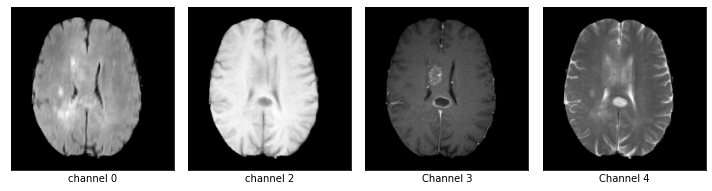

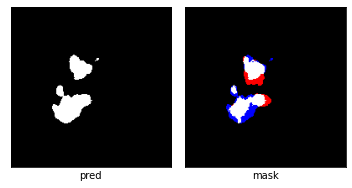

dice_loss : 0.051585623678646934



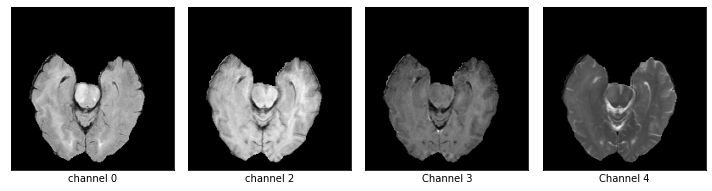

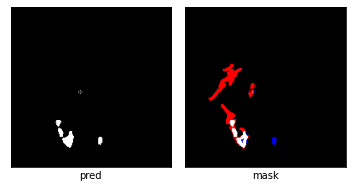

03/06 06:54:03 PM epoch 12 lr 2.069520e-02
03/06 06:54:03 PM genotype = Genotype(normal=[('dil_conv_3x3', 1), ('skip_connect', 0), ('sep_conv_3x3', 2), ('skip_connect', 0), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('skip_connect', 0), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('sep_conv_5x5', 0), ('dil_conv_5x5', 2), ('dil_conv_5x5', 1), ('sep_conv_5x5', 3), ('sep_conv_5x5', 2), ('max_pool_3x3', 4), ('max_pool_3x3', 3)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<42:41,  1.09s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<42:13,  1.08s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.9030, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<42:07,  1.07s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.1081, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<42:25,  1.08s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.1012, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<42:14,  1.08s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.2230, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<41:48,  1.07s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.9158, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<41:38,  1.06s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.2143, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<41:29,  1.06s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<41:00,  1.05s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.1602, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<41:00,  1.05s/it, Acc=0.998, IoU=0.727, Loss=0.159]

tensor(0.1481, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<40:40,  1.04s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.9875, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<40:48,  1.05s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.5055, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<40:54,  1.05s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<41:16,  1.06s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<41:06,  1.05s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.1082, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<41:11,  1.06s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.1291, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<41:04,  1.05s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:19<41:03,  1.05s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.8886, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:20<41:09,  1.06s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:21<41:05,  1.06s/it, Acc=1, IoU=0, Loss=0.00105]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:22<41:12,  1.06s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:23<41:08,  1.06s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:24<41:08,  1.06s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:25<40:52,  1.05s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:26<40:56,  1.05s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:27<41:01,  1.06s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.2247, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:28<40:47,  1.05s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.3224, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:29<40:37,  1.05s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:30<40:33,  1.05s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:31<40:31,  1.05s/it, Acc=0.99, IoU=0.674, Loss=0.195]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:32<40:51,  1.05s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:33<40:51,  1.06s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:34<40:55,  1.06s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.6259, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:35<41:09,  1.06s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.1413, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:36<40:47,  1.06s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.2881, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:38<40:42,  1.05s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.5717, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:39<40:53,  1.06s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.2729, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:40<40:43,  1.05s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:41<40:53,  1.06s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:42<40:44,  1.06s/it, Acc=0.992, IoU=0.778, Loss=0.125]

tensor(0.1962, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:43<40:59,  1.06s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:44<41:05,  1.07s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.1745, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:45<41:02,  1.07s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:46<41:02,  1.07s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:47<40:48,  1.06s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:48<40:37,  1.06s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:49<40:38,  1.06s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:50<40:31,  1.05s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:51<40:26,  1.05s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:52<40:35,  1.06s/it, Acc=0.992, IoU=0.835, Loss=0.0899]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:53<40:29,  1.05s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:54<40:26,  1.05s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:55<40:20,  1.05s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.3770, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:57<40:15,  1.05s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.1714, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:58<40:24,  1.05s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:59<40:57,  1.07s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.2142, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [01:00<40:47,  1.06s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [01:01<40:42,  1.06s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [01:02<40:33,  1.06s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:03<40:35,  1.06s/it, Acc=1, IoU=0, Loss=0.00242]

tensor(0.5733, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:04<40:36,  1.06s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:05<40:40,  1.06s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:06<40:49,  1.07s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:07<40:41,  1.07s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:08<40:42,  1.07s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:09<40:38,  1.07s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.2872, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:10<40:31,  1.06s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.3602, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:11<40:22,  1.06s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:12<40:16,  1.06s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:14<40:07,  1.05s/it, Acc=0.991, IoU=0.855, Loss=0.0774]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:15<40:16,  1.06s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:16<40:15,  1.06s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:17<40:26,  1.06s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:18<40:18,  1.06s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:19<40:04,  1.05s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:20<39:57,  1.05s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:21<40:03,  1.06s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:22<40:17,  1.06s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.1952, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:23<40:04,  1.06s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:24<40:02,  1.06s/it, Acc=1, IoU=0, Loss=0.000236]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:25<39:53,  1.05s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.1404, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:26<40:36,  1.07s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.1521, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:27<40:50,  1.08s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:28<40:50,  1.08s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.9800, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:30<40:55,  1.08s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.4696, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:31<40:49,  1.08s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.3860, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:32<40:38,  1.08s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:33<40:29,  1.07s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:34<40:17,  1.07s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:35<40:14,  1.07s/it, Acc=0.989, IoU=0.876, Loss=0.0671]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:36<40:02,  1.06s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.1318, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:37<40:18,  1.07s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:38<40:05,  1.06s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:39<40:03,  1.06s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:40<39:44,  1.06s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:41<39:41,  1.05s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:42<39:36,  1.05s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:43<39:58,  1.06s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:44<39:59,  1.06s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:45<39:34,  1.05s/it, Acc=1, IoU=0, Loss=0.00102]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:46<39:29,  1.05s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:48<39:34,  1.05s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:49<39:02,  1.04s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:50<39:03,  1.04s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:51<38:55,  1.04s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:52<38:53,  1.04s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:53<39:12,  1.05s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.1581, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:54<39:06,  1.04s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:55<38:51,  1.04s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.2588, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:56<39:01,  1.04s/it, Acc=0.99, IoU=0.844, Loss=0.0871]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:57<39:21,  1.05s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:58<39:11,  1.05s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.2933, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:59<39:09,  1.05s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [02:00<39:01,  1.04s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [02:01<39:08,  1.05s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [02:02<39:00,  1.05s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.6202, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [02:03<38:59,  1.05s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.4702, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [02:04<38:51,  1.04s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.1054, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [02:05<39:11,  1.05s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:06<39:39,  1.06s/it, Acc=0.996, IoU=0.897, Loss=0.0579]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:07<39:27,  1.06s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.4656, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:08<39:24,  1.06s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:10<39:17,  1.06s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.1373, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:11<39:28,  1.06s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.4178, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:12<39:32,  1.06s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.1667, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:13<39:21,  1.06s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.9320, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:14<39:14,  1.06s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:15<39:02,  1.05s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.0618, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:16<38:46,  1.05s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:17<38:40,  1.04s/it, Acc=0.989, IoU=0.755, Loss=0.14]

tensor(0.5203, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:18<38:40,  1.04s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1722, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:19<38:36,  1.04s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:20<38:19,  1.03s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0468, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:21<38:51,  1.05s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:22<39:02,  1.06s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.4271, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:23<39:02,  1.06s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:24<38:59,  1.05s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0041, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:25<38:41,  1.05s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1208, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:26<38:38,  1.05s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.4012, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:27<38:35,  1.05s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1615, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:28<38:23,  1.04s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:29<38:11,  1.04s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:31<38:50,  1.05s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.5504, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:32<38:55,  1.06s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:33<38:44,  1.05s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:34<38:36,  1.05s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:35<38:26,  1.04s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:36<38:17,  1.04s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.8696, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:37<38:14,  1.04s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:38<38:19,  1.04s/it, Acc=0.996, IoU=0.628, Loss=0.228]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:39<38:16,  1.04s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.0869, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:40<38:20,  1.04s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:41<38:27,  1.05s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:42<38:21,  1.05s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:43<38:37,  1.05s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.4783, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:44<38:31,  1.05s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.1487, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:45<38:32,  1.05s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:46<38:24,  1.05s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:47<38:11,  1.04s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.8709, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:48<38:13,  1.04s/it, Acc=0.996, IoU=0.937, Loss=0.0322]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:49<38:24,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:50<38:23,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:51<38:22,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.1137, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:52<38:12,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:54<38:10,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:55<38:21,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:56<38:17,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:57<38:19,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:58<38:20,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.6104, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:59<38:11,  1.05s/it, Acc=1, IoU=0, Loss=0.000531]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [03:00<38:24,  1.05s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [03:01<38:00,  1.04s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [03:02<38:02,  1.05s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [03:03<38:01,  1.05s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [03:04<37:54,  1.04s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.6300, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [03:05<37:46,  1.04s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.2454, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [03:06<37:41,  1.04s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [03:07<37:44,  1.04s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.3726, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [03:08<37:48,  1.04s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:09<37:56,  1.05s/it, Acc=0.987, IoU=0.785, Loss=0.12]

tensor(0.3345, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:10<37:55,  1.05s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:11<38:21,  1.06s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:12<38:05,  1.05s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.1506, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:13<38:04,  1.05s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:15<38:11,  1.06s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:16<38:18,  1.06s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:17<37:54,  1.05s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:18<38:06,  1.05s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.0699, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:19<37:53,  1.05s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.1177, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:20<37:57,  1.05s/it, Acc=0.997, IoU=0.711, Loss=0.168]

tensor(0.4314, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:21<37:55,  1.05s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:22<37:53,  1.05s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:23<37:50,  1.05s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.9229, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:24<37:38,  1.05s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:25<37:36,  1.04s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.0789, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:26<37:26,  1.04s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.3322, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:27<37:29,  1.04s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.5123, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:28<37:15,  1.04s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.3942, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:29<36:53,  1.03s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.7281, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:30<36:35,  1.02s/it, Acc=1, IoU=0, Loss=0.00241]

tensor(0.1772, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:31<36:27,  1.02s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:32<36:36,  1.02s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.4310, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:33<36:38,  1.02s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:34<36:27,  1.02s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:35<36:19,  1.01s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.8804, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:36<36:23,  1.02s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:37<36:16,  1.01s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.9854, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:38<36:13,  1.01s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.6779, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:39<36:11,  1.01s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.4152, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:40<36:17,  1.02s/it, Acc=0.993, IoU=0.903, Loss=0.0517]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:41<36:20,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:42<36:27,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.1435, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:43<36:33,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.7721, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:44<36:32,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.5566, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:45<36:34,  1.03s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.5105, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:46<36:25,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:47<36:17,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.9666, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:48<36:20,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.1445, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:49<36:14,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:50<36:08,  1.02s/it, Acc=0.996, IoU=0.939, Loss=0.0331]

tensor(0.2355, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:51<36:07,  1.02s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:52<36:03,  1.01s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.7751, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:54<36:11,  1.02s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.0713, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:55<36:17,  1.02s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:56<36:14,  1.02s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:57<36:10,  1.02s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.9891, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:58<36:10,  1.02s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:59<36:11,  1.02s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.5688, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [04:00<35:55,  1.01s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.3049, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [04:01<35:58,  1.02s/it, Acc=0.993, IoU=0.93, Loss=0.0371]

tensor(0.3624, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [04:02<36:28,  1.03s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [04:03<36:51,  1.04s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [04:04<37:02,  1.05s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.5164, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [04:05<36:50,  1.04s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [04:06<37:00,  1.05s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [04:07<36:53,  1.04s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [04:08<36:43,  1.04s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [04:09<36:41,  1.04s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [04:10<36:28,  1.03s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:11<36:13,  1.03s/it, Acc=0.991, IoU=0.878, Loss=0.0656]

tensor(0.2884, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:12<36:17,  1.03s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:13<36:20,  1.03s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.0425, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:14<36:25,  1.03s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.6174, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:15<36:21,  1.03s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.0570, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:16<36:28,  1.04s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.2304, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:17<36:23,  1.04s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:18<36:23,  1.04s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:19<36:33,  1.04s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:20<36:33,  1.04s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:21<36:41,  1.05s/it, Acc=0.997, IoU=0.918, Loss=0.0441]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:23<36:34,  1.04s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.1913, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:24<36:41,  1.05s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:25<36:35,  1.04s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.3228, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:26<36:31,  1.04s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.1828, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:27<36:26,  1.04s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:28<36:34,  1.05s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:29<36:33,  1.05s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:30<36:22,  1.04s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:31<36:24,  1.04s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:32<36:14,  1.04s/it, Acc=0.997, IoU=0.948, Loss=0.0273]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:33<36:16,  1.04s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:34<36:03,  1.03s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:35<35:43,  1.02s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:36<35:57,  1.03s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:37<35:52,  1.03s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:38<35:54,  1.03s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.1650, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:39<35:55,  1.03s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:40<35:52,  1.03s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.7130, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:41<35:51,  1.03s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:42<35:50,  1.03s/it, Acc=1, IoU=0, Loss=0.000627]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:43<36:05,  1.04s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.9900, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:44<36:09,  1.04s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.3478, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:45<36:06,  1.04s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:46<35:58,  1.04s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:47<36:06,  1.04s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:48<36:22,  1.05s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:50<36:12,  1.05s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.1661, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:51<36:15,  1.05s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.5510, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:52<36:07,  1.04s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:53<36:11,  1.05s/it, Acc=0.991, IoU=0.881, Loss=0.0651]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:54<36:22,  1.05s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:55<36:33,  1.06s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.7164, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:56<36:25,  1.05s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:57<36:25,  1.06s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.3800, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:58<36:19,  1.05s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.6791, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:59<36:26,  1.06s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.4888, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [05:00<36:32,  1.06s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [05:01<36:18,  1.05s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.9035, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [05:02<35:56,  1.04s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.3142, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [05:03<35:44,  1.04s/it, Acc=0.985, IoU=0.788, Loss=0.116]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [05:04<35:51,  1.04s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [05:05<35:55,  1.05s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [05:06<35:57,  1.05s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [05:07<35:57,  1.05s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [05:08<35:51,  1.04s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.0554, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [05:09<35:51,  1.04s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [05:11<36:08,  1.05s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [05:12<36:06,  1.05s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.8543, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [05:13<35:52,  1.05s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:14<35:53,  1.05s/it, Acc=0.994, IoU=0.712, Loss=0.171]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:15<36:10,  1.06s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:16<36:08,  1.06s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:17<35:49,  1.05s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:18<35:43,  1.05s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:19<35:31,  1.04s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:20<35:32,  1.04s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:21<35:35,  1.04s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.0426, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:22<35:24,  1.04s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:23<35:32,  1.04s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:24<35:31,  1.04s/it, Acc=0.988, IoU=0.828, Loss=0.0957]

tensor(0.5734, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:25<35:23,  1.04s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.7651, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:26<35:22,  1.04s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.0581, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:27<35:20,  1.04s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.4265, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:28<35:17,  1.04s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.4211, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:29<34:58,  1.03s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.7220, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:30<34:56,  1.03s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:31<34:52,  1.03s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:32<34:47,  1.02s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:33<34:47,  1.03s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:34<34:45,  1.02s/it, Acc=0.999, IoU=0.675, Loss=0.202]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:35<34:41,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:36<34:30,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.0798, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:37<34:32,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:38<34:43,  1.03s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:39<34:36,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.0402, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:40<34:25,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:42<34:20,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:43<34:30,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:44<34:30,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:45<34:16,  1.02s/it, Acc=0.99, IoU=0.875, Loss=0.0686]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:46<34:13,  1.01s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:47<34:10,  1.01s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:48<34:08,  1.01s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.4455, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:49<34:10,  1.01s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:50<34:06,  1.01s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:51<34:17,  1.02s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.5301, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:52<34:17,  1.02s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.3391, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:53<34:20,  1.02s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.3994, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:54<34:23,  1.02s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.1715, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:55<34:08,  1.02s/it, Acc=0.98, IoU=0.527, Loss=0.311]

tensor(0.4098, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:56<34:18,  1.02s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:57<34:19,  1.02s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:58<34:19,  1.02s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:59<34:21,  1.03s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.6732, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [06:00<34:35,  1.03s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.8018, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [06:01<34:30,  1.03s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.9798, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [06:02<34:28,  1.03s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.3690, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [06:03<34:12,  1.02s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.5711, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [06:04<33:57,  1.02s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [06:05<33:52,  1.01s/it, Acc=0.996, IoU=0.801, Loss=0.111]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [06:06<33:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [06:07<34:07,  1.02s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [06:08<34:05,  1.02s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.2047, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [06:09<33:49,  1.01s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [06:10<33:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [06:11<34:08,  1.02s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.7073, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [06:12<34:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.8485, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [06:13<33:49,  1.02s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.4617, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [06:14<33:47,  1.02s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:15<33:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000353]

tensor(0.0449, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:16<33:51,  1.02s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:17<33:55,  1.02s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:18<33:45,  1.02s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:19<34:05,  1.03s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:20<33:52,  1.02s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0320, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:21<34:01,  1.03s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:22<34:05,  1.03s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:23<34:05,  1.03s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:24<33:52,  1.02s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.0415, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:25<34:18,  1.04s/it, Acc=0.99, IoU=0.851, Loss=0.0812]

tensor(0.5289, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:26<34:13,  1.04s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:28<34:08,  1.03s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.0440, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:29<34:22,  1.04s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.5073, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:30<34:10,  1.03s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:31<33:56,  1.03s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:32<33:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.0450, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:33<33:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.5111, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:34<33:31,  1.02s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:35<33:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:36<33:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000203]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:37<33:46,  1.03s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.9476, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:38<34:04,  1.04s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:39<34:00,  1.03s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:40<33:38,  1.02s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:41<33:43,  1.03s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:42<33:49,  1.03s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.9622, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:43<34:11,  1.04s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:44<34:18,  1.05s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.5785, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:45<34:09,  1.04s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.7104, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:46<34:02,  1.04s/it, Acc=0.996, IoU=0.877, Loss=0.0679]

tensor(0.1423, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:47<34:04,  1.04s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:48<34:22,  1.05s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.1595, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:49<34:01,  1.04s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:50<33:48,  1.03s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:51<33:40,  1.03s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.9855, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:52<33:21,  1.02s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.8504, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:53<33:20,  1.02s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:54<33:05,  1.01s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:55<33:03,  1.01s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:56<33:00,  1.01s/it, Acc=0.984, IoU=0.862, Loss=0.0754]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:57<33:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:58<33:02,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:59<32:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [07:00<33:02,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [07:01<32:56,  1.01s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [07:02<33:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0913, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [07:03<33:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [07:04<33:04,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.2089, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [07:05<33:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.3335, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [07:06<33:16,  1.03s/it, Acc=1, IoU=0, Loss=0.000707]

tensor(0.4287, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [07:08<33:17,  1.03s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [07:09<33:20,  1.03s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.1783, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [07:10<33:12,  1.03s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [07:11<33:00,  1.02s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [07:12<33:10,  1.03s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [07:13<33:03,  1.02s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.7710, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [07:14<33:18,  1.03s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [07:15<33:20,  1.03s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [07:16<33:15,  1.03s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.1489, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:17<33:28,  1.04s/it, Acc=0.99, IoU=0.883, Loss=0.0633]

tensor(0.0291, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:18<33:34,  1.04s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:19<33:23,  1.04s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:20<32:58,  1.02s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.1584, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:21<33:11,  1.03s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.1332, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:22<33:01,  1.03s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.4088, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:23<33:08,  1.03s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:24<32:59,  1.03s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:25<33:13,  1.03s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:26<33:15,  1.04s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.3584, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:27<32:57,  1.03s/it, Acc=0.998, IoU=0.87, Loss=0.0725]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:28<33:01,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.4316, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:29<32:51,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.5036, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:30<32:46,  1.02s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:31<32:45,  1.02s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:32<32:43,  1.02s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:33<32:39,  1.02s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:34<32:27,  1.02s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:35<32:32,  1.02s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:36<32:37,  1.02s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0497, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:37<32:35,  1.02s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.4181, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:38<32:34,  1.02s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:39<32:35,  1.02s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.9008, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:40<32:46,  1.03s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.7215, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:41<32:30,  1.02s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:42<32:10,  1.01s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:43<32:12,  1.01s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:44<32:15,  1.01s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.1637, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:45<32:26,  1.02s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:46<32:25,  1.02s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:47<32:12,  1.01s/it, Acc=0.988, IoU=0.304, Loss=0.533]

tensor(0.2875, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:48<32:10,  1.01s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.1271, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:50<32:18,  1.02s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.1959, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:51<32:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0038, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:52<32:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:53<32:01,  1.01s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.6385, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:54<32:03,  1.01s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:55<32:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:56<32:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.1567, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:57<32:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.5370, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:58<32:15,  1.02s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:59<32:22,  1.03s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [08:00<32:26,  1.03s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [08:01<32:25,  1.03s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0466, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [08:02<32:59,  1.05s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.5924, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [08:03<33:00,  1.05s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1324, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [08:04<32:58,  1.05s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [08:05<33:20,  1.06s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.7967, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [08:06<33:11,  1.06s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1348, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [08:07<33:02,  1.05s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [08:08<32:38,  1.04s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.3460, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [08:09<32:03,  1.02s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [08:10<32:12,  1.03s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [08:11<32:12,  1.03s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.0448, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [08:12<32:05,  1.02s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [08:13<31:58,  1.02s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [08:14<31:57,  1.02s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [08:15<31:50,  1.02s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.5049, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [08:16<31:50,  1.02s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [08:17<31:55,  1.02s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [08:18<31:54,  1.02s/it, Acc=0.994, IoU=0.936, Loss=0.033]

tensor(0.2058, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:19<32:34,  1.04s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.4235, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:20<32:18,  1.04s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.9589, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:21<32:14,  1.03s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.5656, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:22<32:11,  1.03s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.1540, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:23<32:05,  1.03s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:24<31:49,  1.02s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.2708, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:25<31:33,  1.01s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:27<31:35,  1.02s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:28<31:35,  1.02s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:29<31:36,  1.02s/it, Acc=0.993, IoU=0.82, Loss=0.0994]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:30<31:32,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:31<31:37,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:32<31:36,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.6357, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:33<31:17,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:34<31:15,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:35<31:21,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:36<31:18,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.3854, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:37<31:24,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:38<31:10,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:39<31:23,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0444]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:40<31:21,  1.01s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:41<31:33,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:42<31:22,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.5682, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:43<31:32,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:44<31:35,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:45<31:26,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:46<31:21,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:47<31:30,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:48<31:21,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:49<31:24,  1.02s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:50<31:20,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.1132, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:51<31:26,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.0696, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:52<31:24,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:53<31:07,  1.01s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:54<31:13,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:55<31:12,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:56<31:13,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:57<31:15,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.3973, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:58<31:15,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.1283, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:59<31:17,  1.02s/it, Acc=0.988, IoU=0.898, Loss=0.0549]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [09:00<31:08,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [09:01<31:12,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [09:02<31:12,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [09:03<31:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [09:04<30:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.8166, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [09:05<30:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.3021, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [09:06<30:39,  1.01s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [09:07<30:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.4281, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [09:08<30:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [09:09<30:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [09:10<30:41,  1.01s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.2807, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [09:11<30:46,  1.01s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [09:12<30:58,  1.02s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.4905, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [09:13<30:58,  1.02s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.1994, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [09:14<30:56,  1.02s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [09:15<30:41,  1.01s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [09:16<30:48,  1.02s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [09:17<31:06,  1.03s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.9157, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [09:18<31:00,  1.02s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [09:19<31:00,  1.02s/it, Acc=0.999, IoU=0.871, Loss=0.0676]

tensor(0.1989, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:20<30:58,  1.02s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.1889, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:21<30:58,  1.03s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.1274, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:22<30:29,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:23<30:32,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:24<30:30,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:25<30:23,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.1515, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:27<30:31,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.5464, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:28<30:34,  1.02s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.4405, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:29<30:28,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.6641, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:30<30:24,  1.01s/it, Acc=0.994, IoU=0.678, Loss=0.194]

tensor(0.1117, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:31<30:21,  1.01s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:32<30:27,  1.01s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.1513, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:33<30:21,  1.01s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:34<30:27,  1.01s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:35<30:43,  1.02s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.0382, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:36<30:44,  1.03s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.0978, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:37<30:42,  1.02s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:38<30:39,  1.02s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:39<30:38,  1.02s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.2250, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:40<30:40,  1.03s/it, Acc=0.997, IoU=0.816, Loss=0.103]

tensor(0.2697, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:41<30:34,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:42<30:40,  1.03s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:43<30:17,  1.01s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:44<30:27,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4255, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:45<30:37,  1.03s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:46<30:32,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:47<30:25,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.4839, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:48<30:21,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.2498, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:49<30:17,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.1232, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:50<30:18,  1.02s/it, Acc=0.986, IoU=0, Loss=0.998]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:51<30:11,  1.02s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:52<30:28,  1.03s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.2258, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:53<30:31,  1.03s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.0536, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:54<30:20,  1.02s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:55<30:09,  1.02s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:56<30:10,  1.02s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:57<30:03,  1.01s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:58<30:04,  1.02s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:59<29:52,  1.01s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.5626, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [10:00<29:55,  1.01s/it, Acc=0.988, IoU=0.559, Loss=0.284]

tensor(0.5077, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [10:01<30:01,  1.02s/it, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.0450, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [10:02<29:52,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [10:03<29:47,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.5418, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [10:04<29:24,  1.00it/s, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.0456, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [10:05<29:29,  1.00it/s, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [10:06<29:24,  1.00it/s, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.4623, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [10:07<29:32,  1.00s/it, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [10:08<29:37,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.6407, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [10:09<29:51,  1.01s/it, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.0080, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [10:10<29:56,  1.02s/it, Acc=0.991, IoU=0.866, Loss=0.0723]

tensor(0.1855, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [10:11<29:57,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.4415, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [10:12<30:01,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.3170, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [10:13<29:47,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [10:14<29:50,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [10:15<30:07,  1.03s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [10:16<29:56,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.2355, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [10:17<29:52,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.5319, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [10:18<29:44,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.0673, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [10:19<29:54,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:20<29:54,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0265]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:21<29:52,  1.02s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:22<30:02,  1.03s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.0628, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:24<30:01,  1.03s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:25<29:55,  1.03s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.0507, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:26<29:58,  1.03s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:27<29:51,  1.02s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.1451, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:28<29:40,  1.02s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:29<29:48,  1.02s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.5176, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:30<29:54,  1.03s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.3863, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:31<29:48,  1.03s/it, Acc=0.992, IoU=0.729, Loss=0.159]

tensor(0.6502, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:32<30:00,  1.03s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:33<30:01,  1.03s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.4189, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:34<29:44,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.2014, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:35<29:31,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.2570, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:36<29:35,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:37<29:35,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.4720, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:38<29:39,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:39<29:38,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1220, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:40<29:44,  1.03s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.4880, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:41<29:42,  1.03s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0855, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:42<29:46,  1.03s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.1717, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:43<29:39,  1.03s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:44<29:33,  1.02s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.4877, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:45<29:31,  1.02s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:46<29:33,  1.02s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.3176, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:47<29:40,  1.03s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:48<29:32,  1.03s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:49<29:27,  1.02s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:50<29:22,  1.02s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.5584, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:51<29:23,  1.02s/it, Acc=0.949, IoU=0.359, Loss=0.473]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:52<29:29,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:53<29:37,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:54<29:28,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.6886, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:55<29:27,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.6653, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:56<29:26,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:57<29:25,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0877, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:58<29:27,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:59<29:24,  1.03s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [11:00<29:11,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.2562, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [11:01<28:56,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [11:02<29:04,  1.02s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.3231, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [11:03<29:12,  1.02s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [11:05<29:15,  1.03s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0348, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [11:06<28:57,  1.02s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.4858, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [11:07<29:04,  1.02s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.5604, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [11:08<29:09,  1.02s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.1136, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [11:09<29:12,  1.03s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.7281, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [11:10<29:07,  1.02s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0337, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [11:11<28:57,  1.02s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.4857, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [11:12<29:03,  1.02s/it, Acc=0.95, IoU=0, Loss=0.999]

tensor(0.0348, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [11:13<28:59,  1.02s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [11:14<28:55,  1.02s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [11:15<28:54,  1.02s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.5038, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [11:16<28:44,  1.01s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.7521, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [11:17<29:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [11:18<28:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [11:19<28:39,  1.01s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.0313, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [11:20<28:44,  1.02s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [11:21<28:43,  1.02s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:22<28:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00353]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:23<28:49,  1.02s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:24<28:56,  1.03s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:25<28:56,  1.03s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:26<28:59,  1.03s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.1737, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:27<28:57,  1.03s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:28<28:53,  1.03s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:29<28:42,  1.02s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.9826, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:30<29:01,  1.03s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:31<28:43,  1.02s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.5679, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:32<28:34,  1.02s/it, Acc=0.996, IoU=0.925, Loss=0.0391]

tensor(0.4644, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:33<28:46,  1.03s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.3332, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:34<28:43,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9654, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:35<28:42,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9874, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:36<28:24,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1856, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:37<28:26,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:38<28:31,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:39<28:16,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.6041, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:40<28:04,  1.00s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:41<28:04,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0388, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:42<28:07,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:43<28:06,  1.01s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:44<28:02,  1.01s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:45<27:59,  1.00s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.0736, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:46<28:05,  1.01s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:47<27:59,  1.01s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:48<28:34,  1.03s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.6253, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:49<28:42,  1.03s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:50<28:40,  1.03s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:51<28:48,  1.04s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:52<28:46,  1.04s/it, Acc=0.994, IoU=0.692, Loss=0.183]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:54<28:49,  1.04s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:55<28:39,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1050, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:56<28:44,  1.04s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0387, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:57<28:38,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.5987, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:58<28:35,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:59<28:38,  1.04s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [12:00<28:36,  1.04s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [12:01<28:31,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9855, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [12:02<28:25,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [12:03<28:20,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [12:04<28:22,  1.03s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [12:05<28:29,  1.03s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [12:06<28:15,  1.03s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.1162, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [12:07<27:53,  1.01s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.2259, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [12:08<27:49,  1.01s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [12:09<27:50,  1.01s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [12:10<27:54,  1.02s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.0519, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [12:11<27:47,  1.01s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [12:12<27:34,  1.00s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [12:13<27:35,  1.01s/it, Acc=0.994, IoU=0.671, Loss=0.199]

tensor(0.1375, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [12:14<27:42,  1.01s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [12:15<27:52,  1.02s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.6702, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [12:16<28:02,  1.02s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [12:17<28:19,  1.04s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [12:18<28:22,  1.04s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [12:19<28:08,  1.03s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [12:20<28:11,  1.03s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [12:21<28:13,  1.03s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [12:22<28:11,  1.03s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:23<28:02,  1.03s/it, Acc=0.996, IoU=0.955, Loss=0.024]

tensor(0.1878, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:24<28:02,  1.03s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:25<27:45,  1.02s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.0541, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:26<27:50,  1.02s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.9900, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:27<27:38,  1.02s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.2880, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:28<27:28,  1.01s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.9871, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:29<27:24,  1.01s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:30<27:45,  1.02s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:31<27:55,  1.03s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:32<27:48,  1.03s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:33<27:52,  1.03s/it, Acc=0.998, IoU=0.743, Loss=0.146]

tensor(0.0534, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:35<27:51,  1.03s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.9394, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:36<27:57,  1.03s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.3481, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:37<27:48,  1.03s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.3648, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:38<27:36,  1.02s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.9786, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:39<27:37,  1.02s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:40<27:34,  1.02s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.9849, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:41<27:25,  1.02s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.9695, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:42<27:27,  1.02s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:43<27:31,  1.02s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:44<27:30,  1.02s/it, Acc=0.992, IoU=0.916, Loss=0.0447]

tensor(0.7218, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:45<27:21,  1.02s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.0377, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:46<27:18,  1.02s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.0399, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:47<27:19,  1.02s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:48<27:14,  1.01s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.1272, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:49<27:11,  1.01s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:50<27:09,  1.01s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:51<26:58,  1.01s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:52<27:02,  1.01s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.0639, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:53<26:58,  1.01s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:54<26:53,  1.01s/it, Acc=0.992, IoU=0.886, Loss=0.0608]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:55<27:01,  1.01s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:56<27:12,  1.02s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:57<27:14,  1.02s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:58<27:11,  1.02s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:59<27:11,  1.02s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [13:00<27:08,  1.02s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [13:01<26:55,  1.01s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.3406, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [13:02<26:53,  1.01s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [13:03<26:52,  1.01s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.1133, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [13:04<26:52,  1.01s/it, Acc=0.995, IoU=0.834, Loss=0.0914]

tensor(0.7625, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [13:05<26:52,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [13:06<26:57,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.6080, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [13:07<26:54,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [13:08<27:02,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [13:09<27:15,  1.03s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9850, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [13:10<27:13,  1.03s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.3553, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [13:11<27:22,  1.03s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [13:12<27:06,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [13:13<27:05,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.3277, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [13:14<27:14,  1.03s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0457, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [13:15<27:27,  1.04s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [13:16<27:18,  1.04s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [13:17<27:07,  1.03s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.0848, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [13:18<27:00,  1.02s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [13:19<26:53,  1.02s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [13:20<26:51,  1.02s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.5973, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [13:21<26:52,  1.02s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.4126, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [13:22<26:44,  1.02s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.0425, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [13:23<26:49,  1.02s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:24<26:46,  1.02s/it, Acc=0.999, IoU=0.574, Loss=0.283]

tensor(0.2117, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:25<26:57,  1.03s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:27<26:54,  1.03s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:28<26:56,  1.03s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:29<26:59,  1.03s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.1688, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:30<26:49,  1.03s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:31<26:50,  1.03s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:32<26:41,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:33<26:31,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:34<26:36,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.2418, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:35<26:34,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.5215, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:36<26:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:37<26:46,  1.03s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:38<26:34,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.1125, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:39<26:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:40<26:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:41<26:25,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:42<26:26,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:43<26:31,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.2164, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:44<26:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.3791, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:45<26:22,  1.02s/it, Acc=1, IoU=0, Loss=0.000974]

tensor(0.5865, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:46<26:16,  1.01s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.0465, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:47<26:20,  1.02s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:48<26:19,  1.02s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:49<26:34,  1.03s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.0561, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:50<26:25,  1.02s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:51<26:22,  1.02s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:52<26:33,  1.03s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:53<26:28,  1.03s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:54<26:32,  1.03s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.2636, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:55<26:32,  1.03s/it, Acc=0.991, IoU=0.86, Loss=0.075]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:56<26:42,  1.04s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:57<26:30,  1.03s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.1057, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:58<26:18,  1.02s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:59<26:14,  1.02s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.8794, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [14:00<26:15,  1.02s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.1500, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [14:01<26:11,  1.02s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [14:02<26:17,  1.03s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.2199, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [14:03<26:20,  1.03s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.5840, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [14:04<26:08,  1.02s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [14:05<26:22,  1.03s/it, Acc=0.999, IoU=0.848, Loss=0.0882]

tensor(0.1291, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [14:06<26:10,  1.02s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.1173, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [14:07<26:04,  1.02s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.4286, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [14:08<26:12,  1.03s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [14:09<26:04,  1.02s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [14:10<25:52,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.6592, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [14:11<25:51,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.7364, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [14:13<25:53,  1.02s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.8879, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [14:14<25:45,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [14:15<25:46,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.5678, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [14:16<25:44,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0622]

tensor(0.1923, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [14:17<25:45,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.5276, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [14:18<26:02,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [14:19<25:54,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [14:20<25:58,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1629, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [14:21<26:03,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [14:22<25:59,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.5755, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [14:23<25:55,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:24<25:54,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0899, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:25<25:53,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1467, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:26<25:51,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:27<25:46,  1.02s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.6410, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:28<25:58,  1.03s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.0044, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:29<25:58,  1.03s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:30<25:55,  1.03s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:31<25:48,  1.03s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.0985, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:32<26:00,  1.03s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.1285, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:33<25:44,  1.02s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:34<25:37,  1.02s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.2900, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:35<25:39,  1.02s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.0845, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:36<25:38,  1.02s/it, Acc=0.991, IoU=0.655, Loss=0.211]

tensor(0.8571, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:37<25:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.3911, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:38<25:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:39<25:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:40<25:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:41<25:05,  1.00s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.6136, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:42<25:06,  1.00s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:43<25:01,  1.00s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.1022, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:44<25:01,  1.00s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.5594, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:45<25:06,  1.01s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.1774, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:46<25:06,  1.01s/it, Acc=1, IoU=0, Loss=0.000283]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:47<25:10,  1.01s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:48<25:34,  1.03s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:49<25:26,  1.02s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:50<25:16,  1.02s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:51<25:15,  1.02s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:52<25:20,  1.02s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.1243, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:53<25:25,  1.03s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:54<25:28,  1.03s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:55<25:26,  1.03s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.0754, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:56<25:26,  1.03s/it, Acc=0.992, IoU=0.909, Loss=0.0488]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:57<25:21,  1.03s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:58<25:12,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:59<25:07,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.0467, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [15:00<25:13,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(8.4758e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [15:01<25:07,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [15:03<25:10,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [15:04<25:03,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [15:05<25:05,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.5034, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [15:06<25:08,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [15:07<25:00,  1.02s/it, Acc=0.985, IoU=0.817, Loss=0.103]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [15:08<24:51,  1.01s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.6387, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [15:09<24:54,  1.01s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.1757, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [15:10<24:54,  1.02s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [15:11<24:58,  1.02s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [15:12<24:49,  1.01s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [15:13<24:37,  1.01s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [15:14<24:32,  1.00s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [15:15<24:37,  1.01s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [15:16<24:32,  1.00s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [15:17<24:29,  1.00s/it, Acc=1, IoU=0, Loss=7.52e-5]

tensor(0.1388, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [15:18<24:38,  1.01s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.7112, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [15:19<24:46,  1.02s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [15:20<24:44,  1.02s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [15:21<24:35,  1.01s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [15:22<24:53,  1.02s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.6150, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [15:23<24:48,  1.02s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.1905, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [15:24<24:44,  1.02s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:25<24:40,  1.02s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:26<24:38,  1.02s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:27<24:42,  1.02s/it, Acc=0.979, IoU=0.724, Loss=0.161]

tensor(0.1641, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:28<24:38,  1.02s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.1045, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:29<24:40,  1.02s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:30<24:28,  1.01s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.1357, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:31<24:25,  1.01s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:32<24:24,  1.01s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.3808, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:33<24:23,  1.01s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.1518, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:34<24:25,  1.01s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:35<24:22,  1.01s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:36<24:09,  1.00s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.6657, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:37<24:13,  1.01s/it, Acc=0.997, IoU=0.812, Loss=0.102]

tensor(0.0950, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:38<24:07,  1.00s/it, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.0057, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:39<24:04,  1.00s/it, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:40<23:58,  1.00it/s, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:41<23:57,  1.00it/s, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:42<24:04,  1.00s/it, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:43<24:02,  1.00s/it, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:44<24:07,  1.01s/it, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:45<24:06,  1.01s/it, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.3768, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:46<24:12,  1.01s/it, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:47<24:22,  1.02s/it, Acc=0.99, IoU=0.914, Loss=0.0455]

tensor(0.1419, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:48<24:16,  1.02s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:49<24:39,  1.03s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.6234, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:50<24:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.1879, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:51<24:32,  1.03s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.7251, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:52<24:26,  1.03s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.0481, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:53<24:21,  1.02s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:54<24:21,  1.02s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:55<24:22,  1.02s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:56<24:28,  1.03s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.4859, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:57<24:15,  1.02s/it, Acc=1, IoU=0, Loss=0.00019]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:58<24:14,  1.02s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:59<24:13,  1.02s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [16:00<24:00,  1.01s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [16:01<23:51,  1.01s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [16:02<23:50,  1.01s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.4232, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [16:03<23:59,  1.01s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.2264, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [16:04<24:03,  1.02s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.3549, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [16:05<24:03,  1.02s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [16:06<23:58,  1.02s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.1315, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [16:07<24:05,  1.02s/it, Acc=0.992, IoU=0.913, Loss=0.0473]

tensor(0.9800, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [16:08<24:00,  1.02s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.1293, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [16:09<23:54,  1.01s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [16:10<23:39,  1.01s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [16:11<23:38,  1.01s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.2389, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [16:12<23:34,  1.00s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.7627, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [16:13<23:35,  1.00s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [16:14<23:43,  1.01s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.0917, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [16:15<23:50,  1.02s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [16:16<23:46,  1.01s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [16:17<23:37,  1.01s/it, Acc=0.997, IoU=0.91, Loss=0.0474]

tensor(0.4894, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [16:18<23:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.9003, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [16:20<23:47,  1.02s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.0073, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [16:21<23:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [16:22<23:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.1643, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [16:23<23:43,  1.02s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [16:24<23:40,  1.02s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [16:25<23:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.7533, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:26<23:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.1318, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:27<23:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.0916, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:28<23:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00156]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:29<23:43,  1.02s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.8289, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:30<23:46,  1.02s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:31<23:40,  1.02s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:32<23:34,  1.02s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:33<23:24,  1.01s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.2241, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:34<23:34,  1.02s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:35<23:34,  1.02s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.2661, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:36<23:30,  1.02s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:37<23:21,  1.01s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:38<23:22,  1.01s/it, Acc=0.99, IoU=0.895, Loss=0.0554]

tensor(0.0779, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:39<23:11,  1.01s/it, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.3413, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:40<23:10,  1.01s/it, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:41<22:55,  1.00it/s, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.5152, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:42<22:57,  1.00it/s, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.6080, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:43<23:01,  1.00s/it, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.1378, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:44<23:04,  1.00s/it, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:45<23:00,  1.00s/it, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.5910, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:46<23:05,  1.01s/it, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.1255, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:47<23:03,  1.01s/it, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:48<23:01,  1.00s/it, Acc=0.995, IoU=0.924, Loss=0.04]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:49<23:03,  1.01s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.1938, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:50<22:59,  1.00s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:51<22:54,  1.00s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.2871, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:52<22:53,  1.00s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:53<23:25,  1.03s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:54<23:13,  1.02s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:55<23:03,  1.01s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.5030, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:56<23:14,  1.02s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:57<23:15,  1.02s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:58<23:10,  1.02s/it, Acc=0.984, IoU=0.428, Loss=0.399]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:59<23:32,  1.04s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.6260, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [17:00<23:28,  1.03s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [17:01<23:30,  1.04s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.5319, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [17:02<23:35,  1.04s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [17:03<23:37,  1.04s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [17:04<23:33,  1.04s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.1403, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [17:05<23:33,  1.04s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [17:06<23:40,  1.05s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.9875, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [17:07<23:29,  1.04s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [17:08<23:20,  1.03s/it, Acc=0.994, IoU=0.825, Loss=0.0976]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [17:09<23:22,  1.04s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [17:10<23:14,  1.03s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.2546, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [17:12<23:10,  1.03s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [17:13<23:01,  1.02s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [17:14<23:01,  1.02s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [17:15<22:40,  1.01s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [17:16<22:47,  1.01s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.7770, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [17:17<22:51,  1.02s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [17:18<22:42,  1.01s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.1523, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [17:19<22:48,  1.02s/it, Acc=0.991, IoU=0.75, Loss=0.143]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [17:20<22:48,  1.02s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.2397, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [17:21<23:00,  1.03s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.0477, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [17:22<23:05,  1.03s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [17:23<23:07,  1.03s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [17:24<23:07,  1.04s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.5377, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [17:25<23:03,  1.03s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.1031, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [17:26<23:01,  1.03s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:27<23:00,  1.03s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:28<23:02,  1.03s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(0.2335, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:29<22:51,  1.03s/it, Acc=0.991, IoU=0.838, Loss=0.0899]

tensor(8.0943e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:30<23:01,  1.04s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:31<22:55,  1.03s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:32<22:49,  1.03s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:33<22:48,  1.03s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.1459, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:34<22:48,  1.03s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:35<22:55,  1.04s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:36<22:53,  1.03s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:37<22:40,  1.03s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:38<22:34,  1.02s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:39<22:37,  1.02s/it, Acc=0.998, IoU=0.487, Loss=0.351]

tensor(0.7924, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:40<22:39,  1.03s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.1281, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:41<22:27,  1.02s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:42<22:23,  1.02s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.0381, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:43<22:20,  1.01s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.1280, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:44<22:22,  1.02s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:45<22:33,  1.03s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:46<22:25,  1.02s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:47<22:19,  1.02s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:48<22:18,  1.02s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:49<22:17,  1.02s/it, Acc=0.992, IoU=0.816, Loss=0.103]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:50<22:06,  1.01s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.3074, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:51<22:06,  1.01s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:52<22:07,  1.01s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:53<22:07,  1.01s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.0132, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:54<22:06,  1.01s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.0511, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:55<22:08,  1.01s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.2162, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:56<22:05,  1.01s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:57<22:05,  1.01s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:59<22:07,  1.02s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [18:00<22:20,  1.03s/it, Acc=0.979, IoU=0.779, Loss=0.124]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [18:01<22:18,  1.03s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.7112, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [18:02<22:15,  1.03s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [18:03<22:10,  1.02s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.0534, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [18:04<21:56,  1.01s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.4981, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [18:05<21:58,  1.01s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.1009, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [18:06<21:59,  1.02s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [18:07<21:57,  1.02s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [18:08<22:01,  1.02s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.2186, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [18:09<22:09,  1.03s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [18:10<22:07,  1.03s/it, Acc=0.987, IoU=0.726, Loss=0.16]

tensor(0.2604, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [18:11<22:07,  1.03s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.9501, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [18:12<22:02,  1.02s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [18:13<22:02,  1.02s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [18:14<21:57,  1.02s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [18:15<21:54,  1.02s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [18:16<21:44,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [18:17<21:39,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [18:18<21:34,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.1987, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [18:19<21:36,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [18:20<21:32,  1.01s/it, Acc=0.995, IoU=0.946, Loss=0.0299]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [18:21<21:39,  1.01s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.2034, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [18:22<21:48,  1.02s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.4973, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [18:23<21:40,  1.01s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [18:24<21:41,  1.02s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [18:25<21:34,  1.01s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.6519, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [18:26<21:36,  1.01s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.9208, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [18:27<21:28,  1.01s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:28<21:33,  1.01s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:29<21:39,  1.02s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:30<21:38,  1.02s/it, Acc=0.994, IoU=0.896, Loss=0.0567]

tensor(0.0343, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:31<21:37,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:32<21:33,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:33<21:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:34<21:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:35<21:39,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:36<21:35,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.6833, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:37<21:31,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:38<21:30,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:39<21:26,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:40<21:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:41<21:21,  1.01s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:42<21:16,  1.01s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:43<21:28,  1.02s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.4112, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:44<21:24,  1.02s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.0984, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:45<21:25,  1.02s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:46<21:13,  1.01s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.0280, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:47<21:18,  1.02s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:48<21:22,  1.02s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.2370, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:49<21:24,  1.02s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.8664, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:50<21:22,  1.02s/it, Acc=0.99, IoU=0.811, Loss=0.103]

tensor(0.5313, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:51<21:23,  1.02s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:52<21:20,  1.02s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:53<21:13,  1.02s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.9650, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:54<21:06,  1.01s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.1958, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:55<21:03,  1.01s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.9848, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:56<20:59,  1.01s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.3905, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:58<21:14,  1.02s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:59<21:11,  1.02s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.1638, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [19:00<21:02,  1.01s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [19:01<21:06,  1.02s/it, Acc=0.989, IoU=0.887, Loss=0.0604]

tensor(0.2060, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [19:02<21:05,  1.02s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.1616, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [19:03<21:06,  1.02s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.0545, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [19:04<21:05,  1.02s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [19:05<21:01,  1.02s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.1574, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [19:06<20:58,  1.02s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.2643, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [19:07<20:58,  1.02s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [19:08<21:08,  1.02s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [19:09<21:19,  1.03s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [19:10<21:09,  1.03s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.1799, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [19:11<21:09,  1.03s/it, Acc=0.991, IoU=0.879, Loss=0.0647]

tensor(0.7844, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [19:12<21:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.2673, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [19:13<21:03,  1.02s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [19:14<20:58,  1.02s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.9489, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [19:15<21:01,  1.02s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [19:16<20:49,  1.02s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.4151, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [19:17<20:48,  1.02s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [19:18<20:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.1479, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [19:19<20:42,  1.01s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.4831, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [19:20<20:43,  1.01s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.6052, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [19:21<20:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00822]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [19:22<20:41,  1.01s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.4717, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [19:23<20:48,  1.02s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.1901, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [19:24<20:45,  1.02s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [19:25<20:54,  1.03s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.4339, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [19:26<20:54,  1.03s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [19:27<20:54,  1.03s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:28<20:46,  1.02s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.5591, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:29<20:39,  1.02s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.9119, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:30<20:40,  1.02s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:31<20:53,  1.03s/it, Acc=0.967, IoU=0.012, Loss=0.976]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:32<20:45,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:33<20:43,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.2469, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:34<20:48,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:35<20:42,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.4878, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:36<20:43,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.3097, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:37<20:42,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:38<20:44,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:39<20:47,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:40<20:51,  1.04s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.5448, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:42<20:46,  1.03s/it, Acc=1, IoU=0, Loss=0.000971]

tensor(0.4232, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:43<20:32,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3497, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:44<20:35,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.6999, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:45<20:34,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:46<20:24,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:47<20:26,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:48<20:26,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.4416, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:49<20:34,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:50<20:28,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:51<20:12,  1.01s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:52<20:14,  1.02s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:53<20:16,  1.02s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:54<20:15,  1.02s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:55<20:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:56<20:14,  1.02s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.1564, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:57<20:08,  1.02s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.0432, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:58<20:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:59<20:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [20:00<20:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.1340, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [20:01<19:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [20:02<19:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000577]

tensor(0.5728, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [20:03<19:57,  1.01s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.9611, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [20:04<20:06,  1.02s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.3790, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [20:05<20:09,  1.02s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.2844, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [20:06<20:13,  1.03s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [20:07<20:01,  1.02s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.2147, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [20:08<20:05,  1.02s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [20:09<20:06,  1.02s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [20:10<20:07,  1.03s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.0465, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [20:11<20:06,  1.03s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [20:12<19:57,  1.02s/it, Acc=0.994, IoU=0.818, Loss=0.101]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [20:13<20:05,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [20:14<20:09,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [20:15<20:08,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1534, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [20:16<20:04,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [20:17<20:01,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [20:18<20:04,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0225, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [20:19<20:01,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.7157, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [20:20<19:59,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.5340, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [20:21<19:54,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [20:22<19:58,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [20:23<19:53,  1.03s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [20:24<19:54,  1.03s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [20:25<19:45,  1.02s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.4825, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [20:27<20:04,  1.04s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.5757, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [20:28<20:07,  1.04s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.5178, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [20:29<19:56,  1.03s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:30<19:52,  1.03s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.9877, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:31<19:47,  1.03s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(6.4135e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:32<19:39,  1.02s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:33<19:32,  1.01s/it, Acc=0.996, IoU=0.946, Loss=0.0284]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:34<19:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.2282, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:35<19:31,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.1209, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:36<19:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:37<19:27,  1.01s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:38<19:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(9.0003e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:39<19:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:40<19:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:41<19:36,  1.03s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:42<19:35,  1.03s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:43<19:39,  1.03s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.0510, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:44<19:37,  1.03s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.1975, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:45<19:41,  1.03s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:46<19:42,  1.04s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:47<19:45,  1.04s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:48<20:33,  1.08s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:49<20:30,  1.08s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:50<20:07,  1.06s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:51<20:05,  1.06s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:52<19:53,  1.05s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:53<19:51,  1.05s/it, Acc=1, IoU=0, Loss=0.000555]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:54<19:44,  1.04s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:56<19:50,  1.05s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:57<19:49,  1.05s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.2491, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:58<19:48,  1.05s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.2132, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:59<19:52,  1.06s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.9884, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [21:00<19:56,  1.06s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.3815, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [21:01<19:57,  1.06s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [21:02<19:51,  1.06s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [21:03<19:34,  1.04s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.5418, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [21:04<19:24,  1.04s/it, Acc=0.994, IoU=0.86, Loss=0.0755]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [21:05<19:17,  1.03s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [21:06<19:18,  1.03s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9887, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [21:07<19:09,  1.02s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [21:08<19:07,  1.02s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [21:09<19:23,  1.04s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0203, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [21:10<19:27,  1.04s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9778, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [21:11<19:26,  1.04s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [21:12<19:20,  1.04s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [21:13<19:17,  1.04s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [21:14<19:10,  1.03s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [21:15<19:28,  1.05s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.2328, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [21:16<19:40,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.2500, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [21:17<19:37,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.2900, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [21:19<19:37,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.8713, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [21:20<19:42,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [21:21<19:34,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [21:22<19:33,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [21:23<19:33,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [21:24<19:33,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [21:25<19:28,  1.06s/it, Acc=1, IoU=0, Loss=0.00021]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [21:26<19:24,  1.06s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [21:27<19:27,  1.06s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [21:28<19:20,  1.05s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1728, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [21:29<19:16,  1.05s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [21:30<19:11,  1.05s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1206, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [21:31<19:20,  1.06s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [21:32<19:16,  1.05s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0510, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:33<19:09,  1.05s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1618, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:34<19:07,  1.05s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:35<19:04,  1.05s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:36<19:02,  1.04s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:37<19:09,  1.05s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:38<18:54,  1.04s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:39<18:41,  1.03s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:41<18:39,  1.03s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1417, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:42<18:28,  1.02s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.2361, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:43<18:19,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:44<18:17,  1.01s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.1640, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:45<18:09,  1.00s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:46<18:07,  1.00s/it, Acc=0.965, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:47<18:09,  1.00s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:48<18:11,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:49<18:12,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0499, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:50<18:18,  1.02s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:51<18:11,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.3737, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:52<18:10,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:53<18:07,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:54<18:06,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:55<18:01,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.1363, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:56<18:02,  1.01s/it, Acc=0.999, IoU=0, Loss=0.977]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:57<18:05,  1.01s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.0474, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:58<18:08,  1.01s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:59<17:57,  1.00s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.2164, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [22:00<18:00,  1.01s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.7243, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [22:01<18:07,  1.02s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [22:02<18:09,  1.02s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.1794, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [22:03<18:12,  1.02s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [22:04<17:57,  1.01s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.3897, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [22:05<17:58,  1.01s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.4421, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [22:06<17:57,  1.01s/it, Acc=0.988, IoU=0.859, Loss=0.077]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [22:07<17:56,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.4594, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [22:08<18:02,  1.02s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.2248, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [22:09<17:57,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.2238, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [22:10<18:08,  1.03s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [22:11<18:12,  1.03s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [22:12<18:13,  1.03s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [22:13<18:06,  1.03s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.1612, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [22:14<18:07,  1.03s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [22:15<18:08,  1.03s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [22:16<18:04,  1.03s/it, Acc=0.993, IoU=0.92, Loss=0.0451]

tensor(0.9714, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [22:17<18:04,  1.03s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [22:18<18:03,  1.03s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.5434, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [22:19<17:56,  1.02s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.9903, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [22:20<17:58,  1.03s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [22:21<17:54,  1.02s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.1238, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [22:22<17:48,  1.02s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [22:23<17:45,  1.02s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [22:24<17:44,  1.02s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [22:25<17:36,  1.01s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.4329, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [22:26<17:37,  1.01s/it, Acc=1, IoU=0, Loss=9.67e-5]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [22:27<17:41,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [22:28<17:47,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.2910, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [22:29<17:42,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [22:30<17:38,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.1054, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [22:31<17:41,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [22:32<17:41,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [22:33<17:38,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [22:34<17:33,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:35<17:32,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(7.1406e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:36<17:35,  1.02s/it, Acc=0.995, IoU=0.887, Loss=0.0611]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:37<17:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:38<17:33,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.5145, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:39<17:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0824, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:40<17:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.7044, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:42<17:31,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:43<17:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:44<17:26,  1.02s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:45<17:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:46<17:19,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:47<17:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000285]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:48<17:12,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:49<17:11,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.0519, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:50<17:16,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.9195, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:51<17:03,  1.00s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:52<17:03,  1.00s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.5302, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:53<16:52,  1.01it/s, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:54<16:59,  1.00s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.5908, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:55<17:02,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.5219, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:56<17:01,  1.01s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:57<16:57,  1.00s/it, Acc=0.994, IoU=0.885, Loss=0.0635]

tensor(0.1149, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:58<16:55,  1.00s/it, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.6870, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:59<16:58,  1.01s/it, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.0634, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [23:00<16:57,  1.01s/it, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.8479, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [23:01<17:01,  1.01s/it, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [23:02<16:57,  1.01s/it, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.1491, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [23:03<16:46,  1.00it/s, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.5522, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [23:04<16:44,  1.00it/s, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [23:05<16:51,  1.00s/it, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.1389, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [23:06<16:52,  1.01s/it, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [23:07<16:56,  1.01s/it, Acc=0.978, IoU=0.813, Loss=0.104]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [23:08<16:57,  1.01s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [23:09<16:56,  1.01s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [23:10<16:58,  1.02s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [23:11<16:55,  1.01s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [23:12<16:59,  1.02s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [23:13<16:56,  1.02s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [23:14<16:48,  1.01s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [23:15<16:40,  1.00s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.1784, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [23:16<16:39,  1.00s/it, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [23:17<16:29,  1.01it/s, Acc=0.995, IoU=0.864, Loss=0.0761]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [23:18<16:29,  1.00it/s, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.0090, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [23:19<16:42,  1.01s/it, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.4197, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [23:20<16:40,  1.01s/it, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [23:21<16:37,  1.01s/it, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [23:22<16:37,  1.01s/it, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.0482, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [23:23<16:40,  1.01s/it, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [23:24<16:35,  1.01s/it, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.4677, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [23:25<16:29,  1.00s/it, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.4015, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [23:26<16:25,  1.00it/s, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [23:27<16:18,  1.01it/s, Acc=0.995, IoU=0.914, Loss=0.0451]

tensor(0.1188, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [23:28<16:27,  1.00s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.5234, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [23:29<16:31,  1.01s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [23:30<16:27,  1.01s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.2672, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [23:31<16:20,  1.00it/s, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.5175, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [23:32<16:21,  1.00s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.1354, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [23:33<16:21,  1.00s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [23:34<16:21,  1.00s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.4448, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [23:35<16:19,  1.00s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.2484, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [23:36<16:19,  1.00s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:37<16:22,  1.01s/it, Acc=0.978, IoU=0.645, Loss=0.219]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:38<16:21,  1.01s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:39<16:33,  1.02s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.5939, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:40<16:32,  1.02s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:41<16:29,  1.02s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.0967, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:42<16:26,  1.02s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:43<16:26,  1.02s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:44<16:29,  1.02s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:45<16:19,  1.01s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.9867, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:46<16:23,  1.02s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.0952, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:47<16:26,  1.02s/it, Acc=1, IoU=0, Loss=0.0011]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:48<16:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:49<16:28,  1.03s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.4388, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:50<16:32,  1.03s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.4879, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:51<16:25,  1.03s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.2616, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:52<16:25,  1.03s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.5144, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:53<16:29,  1.03s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:54<16:24,  1.03s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.1356, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:55<16:37,  1.04s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.3463, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:56<16:31,  1.04s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:57<16:27,  1.03s/it, Acc=1, IoU=0, Loss=0.000371]

tensor(0.5146, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:58<16:25,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:59<16:25,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [24:00<16:22,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.5731, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [24:02<16:19,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.4655, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [24:03<16:16,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [24:04<16:18,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [24:05<16:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [24:06<16:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [24:07<16:07,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [24:08<16:08,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.9892, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [24:09<16:07,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.3405, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [24:10<16:01,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.5408, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [24:11<15:52,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [24:12<15:57,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [24:13<15:55,  1.02s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [24:14<15:50,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [24:15<15:51,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.5290, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [24:16<15:45,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [24:17<15:45,  1.01s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.3393, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [24:18<15:37,  1.00s/it, Acc=0.969, IoU=0, Loss=0.999]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [24:19<15:36,  1.00s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [24:20<15:39,  1.01s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.5949, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [24:21<15:36,  1.00s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [24:22<15:36,  1.01s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [24:23<15:41,  1.01s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.5793, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [24:24<15:42,  1.01s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [24:25<15:37,  1.01s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [24:26<15:39,  1.01s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.0359, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [24:27<15:36,  1.01s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [24:28<15:31,  1.01s/it, Acc=0.99, IoU=0.851, Loss=0.0808]

tensor(0.0647, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [24:29<15:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000269]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [24:30<15:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000269]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [24:31<15:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000269]

tensor(0.4942, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [24:32<15:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000269]

tensor(0.0079, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [24:33<15:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000269]

tensor(0.4728, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [24:34<15:15,  1.00it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [24:35<15:08,  1.01it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.4960, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [24:36<15:09,  1.01it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [24:37<15:05,  1.01it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.6586, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [24:38<15:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000269]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:39<15:17,  1.00s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:40<15:27,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:41<15:32,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.0744, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:42<15:29,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.6301, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:43<15:28,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.0062, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:44<15:26,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.2350, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:45<15:23,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:46<15:21,  1.02s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.5499, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:47<15:17,  1.01s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.1223, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:48<15:18,  1.01s/it, Acc=0.944, IoU=0, Loss=1]

tensor(0.5754, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:49<15:20,  1.02s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.9542, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:50<15:17,  1.02s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:51<15:22,  1.02s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.1801, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:52<15:21,  1.02s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:53<15:16,  1.02s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.1362, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:54<15:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:55<15:08,  1.01s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.9762, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:56<15:11,  1.02s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:57<15:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:58<15:08,  1.02s/it, Acc=1, IoU=0, Loss=0.00677]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:59<15:04,  1.01s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.1221, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [25:00<15:12,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [25:01<15:06,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [25:02<15:09,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.1477, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [25:03<15:08,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [25:04<15:03,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [25:05<15:00,  1.01s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.9163, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [25:06<15:00,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [25:07<14:51,  1.01s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.3273, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [25:08<14:52,  1.01s/it, Acc=0.99, IoU=0.882, Loss=0.062]

tensor(0.7560, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [25:09<14:48,  1.01s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.2209, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [25:10<14:52,  1.01s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.1413, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [25:11<14:55,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [25:12<14:56,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.9333, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [25:13<14:54,  1.02s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [25:14<14:45,  1.01s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [25:15<14:45,  1.01s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.3401, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [25:16<14:38,  1.00s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [25:17<14:41,  1.01s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.0935, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [25:18<14:47,  1.01s/it, Acc=0.993, IoU=0.778, Loss=0.126]

tensor(0.9840, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [25:19<14:46,  1.01s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.7625, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [25:20<14:47,  1.02s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [25:22<14:48,  1.02s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [25:23<14:48,  1.02s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.9092, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [25:24<14:45,  1.02s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.0872, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [25:25<14:45,  1.02s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.5309, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [25:26<14:40,  1.01s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.0370, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [25:27<14:37,  1.01s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [25:28<14:54,  1.03s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [25:29<14:52,  1.03s/it, Acc=0.99, IoU=0.873, Loss=0.0687]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [25:30<14:43,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [25:31<14:43,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [25:32<14:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [25:33<14:39,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.1371, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [25:34<14:39,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [25:35<14:40,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [25:36<14:41,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.9284, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [25:37<14:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [25:38<14:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [25:39<14:38,  1.03s/it, Acc=1, IoU=0, Loss=0.000706]

tensor(0.1527, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [25:40<14:35,  1.03s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.5451, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [25:41<14:38,  1.03s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:42<14:38,  1.03s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:43<14:30,  1.02s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:44<14:28,  1.02s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:45<14:23,  1.02s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.0781, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:46<14:18,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:47<14:18,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:48<14:09,  1.00s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:49<14:12,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0293]

tensor(0.7779, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:50<14:15,  1.01s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:51<14:20,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:52<14:14,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:53<14:14,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.0990, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:54<14:10,  1.01s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.0361, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:55<14:10,  1.01s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.1739, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:56<14:14,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:57<14:12,  1.02s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:58<14:07,  1.01s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.9235, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:59<14:06,  1.01s/it, Acc=0.995, IoU=0.908, Loss=0.0498]

tensor(0.1516, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [26:00<14:04,  1.01s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.1733, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [26:01<14:04,  1.01s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.2015, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [26:02<14:02,  1.01s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [26:03<14:05,  1.02s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.7731, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [26:04<13:59,  1.01s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [26:05<13:54,  1.01s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.1514, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [26:06<13:51,  1.00s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [26:07<13:53,  1.01s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.2119, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [26:08<13:53,  1.01s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [26:09<13:49,  1.01s/it, Acc=0.966, IoU=0.242, Loss=0.61]

tensor(0.2176, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [26:10<13:52,  1.01s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.2786, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [26:11<13:57,  1.02s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [26:12<13:57,  1.02s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [26:13<13:54,  1.02s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.0987, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [26:14<13:47,  1.01s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.8458, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [26:15<13:42,  1.00s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [26:16<13:41,  1.00s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [26:17<13:44,  1.01s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [26:18<13:40,  1.01s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [26:19<13:45,  1.01s/it, Acc=0.998, IoU=0.855, Loss=0.0781]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [26:20<13:47,  1.02s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.9871, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [26:21<13:48,  1.02s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.2176, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [26:23<13:52,  1.03s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.1050, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [26:24<13:48,  1.02s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [26:25<13:38,  1.01s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [26:26<13:33,  1.00s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [26:27<13:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.1701, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [26:28<13:34,  1.01s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [26:29<13:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [26:30<13:34,  1.01s/it, Acc=1, IoU=0, Loss=0.000326]

tensor(0.3756, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [26:31<13:33,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.6461, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [26:32<13:37,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.3060, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [26:33<13:32,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.1043, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [26:34<13:31,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0399, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [26:35<13:32,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0173, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [26:36<13:34,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [26:37<13:27,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [26:38<13:22,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.1836, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [26:39<13:26,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [26:40<13:24,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [26:41<13:21,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.1641, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [26:42<13:27,  1.02s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [26:43<13:30,  1.02s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.3368, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:44<13:21,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.1390, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:45<13:23,  1.02s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.9903, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:46<13:17,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:47<13:12,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.2783, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:48<13:10,  1.01s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.3182, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:49<13:08,  1.00s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:50<13:08,  1.00s/it, Acc=0.993, IoU=0.878, Loss=0.0644]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:51<13:11,  1.01s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:52<13:14,  1.01s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.4750, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:53<13:11,  1.01s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:54<13:14,  1.02s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:55<13:12,  1.02s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:56<13:14,  1.02s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:57<13:11,  1.02s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.0664, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:58<13:10,  1.02s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:59<13:10,  1.02s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [27:00<13:07,  1.02s/it, Acc=0.998, IoU=0.777, Loss=0.128]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [27:01<13:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [27:02<13:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.1210, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [27:03<13:08,  1.02s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [27:04<13:04,  1.02s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.2358, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [27:05<13:05,  1.02s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [27:06<13:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [27:07<12:51,  1.00s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [27:08<12:47,  1.00s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [27:09<12:46,  1.00s/it, Acc=1, IoU=0, Loss=0.000384]

tensor(0.1479, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [27:10<12:44,  1.00it/s, Acc=1, IoU=0, Loss=0.000384]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [27:11<12:46,  1.00s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [27:12<12:44,  1.00s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.1421, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [27:13<12:46,  1.01s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [27:14<12:49,  1.01s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [27:15<12:49,  1.01s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [27:16<12:54,  1.02s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.0553, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [27:17<12:50,  1.02s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.3002, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [27:18<12:49,  1.02s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.2361, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [27:19<12:44,  1.01s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.3087, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [27:20<12:43,  1.01s/it, Acc=0.996, IoU=0.921, Loss=0.0412]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [27:21<12:42,  1.01s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.3065, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [27:22<12:53,  1.03s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [27:23<12:56,  1.03s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [27:24<12:55,  1.03s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [27:25<12:55,  1.03s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [27:26<12:56,  1.04s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [27:27<12:52,  1.03s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.3369, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [27:28<12:49,  1.03s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [27:30<12:51,  1.03s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [27:31<12:50,  1.03s/it, Acc=0.992, IoU=0.854, Loss=0.0805]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [27:32<12:41,  1.02s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [27:33<12:46,  1.03s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [27:34<12:47,  1.03s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.1229, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [27:35<12:42,  1.03s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [27:36<12:38,  1.02s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [27:37<12:35,  1.02s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [27:38<12:41,  1.03s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [27:39<12:36,  1.03s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.1504, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [27:40<12:27,  1.02s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [27:41<12:28,  1.02s/it, Acc=0.998, IoU=0.628, Loss=0.23]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [27:42<12:22,  1.01s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.0894, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [27:43<12:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [27:44<12:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:45<12:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:46<12:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.2924, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:47<12:20,  1.02s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.1627, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:48<12:20,  1.02s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:49<12:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.9800, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:50<12:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:51<12:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000294]

tensor(0.4598, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:52<12:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:53<12:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.0449, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:54<12:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:55<12:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.6949, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:56<12:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:57<12:14,  1.02s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:58<12:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.0421, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:59<12:12,  1.02s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [28:00<12:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [28:01<12:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000303]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [28:02<12:03,  1.01s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.1513, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [28:03<12:07,  1.02s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.7534, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [28:04<12:09,  1.02s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [28:05<12:07,  1.02s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [28:06<12:09,  1.03s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [28:07<12:05,  1.02s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.3723, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [28:08<12:05,  1.02s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [28:09<12:07,  1.03s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [28:10<12:05,  1.03s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [28:11<12:04,  1.03s/it, Acc=0.998, IoU=0.904, Loss=0.0522]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [28:12<12:03,  1.03s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [28:13<12:00,  1.02s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.1410, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [28:14<11:58,  1.02s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [28:15<11:57,  1.02s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [28:16<11:53,  1.02s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [28:17<11:54,  1.02s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [28:19<11:52,  1.02s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.5550, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [28:20<11:55,  1.03s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [28:21<11:52,  1.02s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [28:22<11:47,  1.02s/it, Acc=0.989, IoU=0.875, Loss=0.0684]

tensor(0.1122, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [28:23<11:51,  1.03s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [28:24<12:00,  1.04s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [28:25<11:55,  1.03s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [28:26<11:51,  1.03s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.6309, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [28:27<11:50,  1.03s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [28:28<11:44,  1.02s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0067, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [28:29<11:46,  1.03s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [28:30<11:47,  1.03s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [28:31<11:46,  1.03s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0394, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [28:32<11:41,  1.02s/it, Acc=1, IoU=0, Loss=0.000906]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [28:33<11:39,  1.02s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [28:34<11:48,  1.04s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.2155, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [28:35<11:44,  1.03s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.2302, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [28:36<11:42,  1.03s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [28:37<11:39,  1.03s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.1984, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [28:38<11:35,  1.02s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.4495, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [28:39<11:38,  1.03s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [28:40<11:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.3080, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [28:41<11:34,  1.03s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.1433, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [28:42<11:32,  1.03s/it, Acc=1, IoU=0, Loss=0.00047]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [28:43<11:32,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [28:44<11:32,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.2758, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [28:45<11:30,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [28:46<11:26,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.5542, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:47<11:25,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:48<11:24,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:49<11:22,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:50<11:23,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:51<11:20,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.8134, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:52<11:14,  1.01s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.4753, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:53<11:12,  1.01s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:54<11:13,  1.02s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:55<11:14,  1.02s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:56<11:11,  1.02s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:57<11:10,  1.02s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.0472, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:58<11:07,  1.01s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:59<11:07,  1.01s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.3165, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [29:00<11:05,  1.01s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.4935, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [29:02<11:09,  1.02s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.9584, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [29:03<11:08,  1.02s/it, Acc=0.994, IoU=0.938, Loss=0.0326]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [29:04<11:10,  1.03s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [29:05<11:10,  1.03s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.1141, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [29:06<11:06,  1.02s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [29:07<10:59,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [29:08<10:58,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [29:09<10:55,  1.01s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.2189, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [29:10<11:02,  1.02s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.5734, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [29:11<10:59,  1.02s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [29:12<11:01,  1.02s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [29:13<11:01,  1.03s/it, Acc=0.993, IoU=0.57, Loss=0.275]

tensor(0.9933, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [29:14<10:59,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.0723, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [29:15<11:06,  1.04s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [29:16<11:00,  1.03s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.1405, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [29:17<10:54,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.6144, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [29:18<10:46,  1.01s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [29:19<10:43,  1.01s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.5611, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [29:20<10:43,  1.01s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [29:21<10:44,  1.01s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [29:22<10:44,  1.01s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [29:23<10:46,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0543]

tensor(0.5026, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [29:24<10:48,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.7617, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [29:25<10:51,  1.03s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [29:26<10:46,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.5845, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [29:27<10:40,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [29:28<10:39,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1392, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [29:29<10:37,  1.01s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [29:30<10:38,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.4721, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [29:31<10:38,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [29:32<10:39,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [29:33<10:40,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.5492, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [29:34<10:38,  1.02s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [29:35<10:42,  1.03s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [29:36<10:38,  1.03s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.1863, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [29:37<10:34,  1.02s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.4332, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [29:38<10:35,  1.02s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [29:39<10:36,  1.03s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [29:40<10:39,  1.03s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.1670, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [29:41<10:35,  1.03s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [29:42<10:32,  1.03s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [29:43<10:30,  1.02s/it, Acc=0.996, IoU=0.821, Loss=0.1]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [29:44<10:25,  1.02s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [29:45<10:29,  1.03s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [29:46<10:24,  1.02s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.5536, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [29:47<10:18,  1.01s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [29:48<10:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:49<10:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.1695, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:50<10:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:52<10:16,  1.02s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:53<10:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:54<10:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00228]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:55<10:15,  1.02s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:56<10:15,  1.02s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:57<10:14,  1.02s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.5296, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:58<10:09,  1.01s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.8871, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:59<10:04,  1.01s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.6923, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [30:00<10:01,  1.00s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.3700, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [30:01<10:02,  1.01s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [30:02<10:05,  1.01s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [30:03<10:03,  1.01s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.4538, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [30:04<10:06,  1.02s/it, Acc=0.991, IoU=0.616, Loss=0.236]

tensor(0.1183, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [30:05<10:07,  1.02s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.4124, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [30:06<10:10,  1.03s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.2802, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [30:07<10:11,  1.03s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.6340, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [30:08<10:07,  1.03s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.1210, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [30:09<10:02,  1.02s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [30:10<10:05,  1.03s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [30:11<10:05,  1.03s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.1062, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [30:12<10:02,  1.03s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [30:13<09:57,  1.02s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [30:14<09:53,  1.02s/it, Acc=0.991, IoU=0.865, Loss=0.0724]

tensor(0.9048, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [30:15<09:51,  1.01s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [30:16<09:56,  1.02s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.0773, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [30:17<09:57,  1.03s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [30:18<09:56,  1.03s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.4116, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [30:19<09:53,  1.02s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.9783, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [30:20<09:55,  1.03s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.2522, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [30:21<09:50,  1.02s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [30:22<09:47,  1.02s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.8737, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [30:23<09:47,  1.02s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [30:24<09:45,  1.02s/it, Acc=0.992, IoU=0.918, Loss=0.0428]

tensor(0.2549, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [30:25<09:44,  1.02s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [30:26<09:47,  1.02s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.6877, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [30:27<09:42,  1.02s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.0513, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [30:28<09:41,  1.02s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.3537, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [30:29<09:38,  1.01s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.7192, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [30:30<09:31,  1.00s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [30:31<09:29,  1.00s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [30:32<09:31,  1.01s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.1966, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [30:33<09:30,  1.01s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.0450, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [30:34<09:32,  1.01s/it, Acc=1, IoU=0, Loss=0.0104]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [30:35<09:32,  1.02s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [30:36<09:32,  1.02s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.6027, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [30:37<09:32,  1.02s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [30:38<09:33,  1.02s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [30:39<09:31,  1.02s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.1124, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [30:40<09:28,  1.02s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [30:41<09:20,  1.00s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.6225, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [30:42<09:20,  1.01s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [30:43<09:18,  1.01s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.1641, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [30:44<09:18,  1.01s/it, Acc=0.995, IoU=0.868, Loss=0.0724]

tensor(0.1849, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [30:45<09:19,  1.01s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [30:46<09:20,  1.01s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [30:47<09:24,  1.02s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.1601, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [30:48<09:19,  1.02s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [30:49<09:15,  1.01s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.0790, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [30:50<09:12,  1.01s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:51<09:13,  1.01s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.2974, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:53<09:13,  1.01s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:54<09:14,  1.02s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.0948, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:55<09:13,  1.02s/it, Acc=0.995, IoU=0.74, Loss=0.148]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:56<09:14,  1.02s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.3406, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:57<09:14,  1.02s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.1178, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:58<09:15,  1.03s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:59<09:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.6981, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [31:00<09:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [31:01<09:07,  1.02s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [31:02<09:05,  1.01s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [31:03<09:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.1492, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [31:04<09:00,  1.01s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [31:05<08:56,  1.00s/it, Acc=1, IoU=0, Loss=0.000606]

tensor(0.1478, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [31:06<08:53,  1.00it/s, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [31:07<08:53,  1.00s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [31:08<08:52,  1.00s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [31:09<08:54,  1.01s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.0680, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [31:10<08:52,  1.00s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [31:11<08:53,  1.01s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [31:12<08:53,  1.01s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [31:13<08:53,  1.01s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [31:14<08:53,  1.02s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.2417, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [31:15<08:54,  1.02s/it, Acc=0.994, IoU=0.924, Loss=0.0393]

tensor(0.1044, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [31:16<08:53,  1.02s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.0511, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [31:17<08:59,  1.03s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.1465, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [31:18<08:59,  1.03s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [31:19<08:55,  1.03s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [31:20<08:54,  1.03s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.1456, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [31:21<08:51,  1.02s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.1311, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [31:22<08:51,  1.03s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [31:23<08:51,  1.03s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [31:24<08:48,  1.02s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.2212, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [31:25<08:44,  1.02s/it, Acc=0.99, IoU=0.8, Loss=0.113]

tensor(0.5868, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [31:26<08:45,  1.02s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.1990, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [31:27<08:45,  1.02s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [31:28<08:40,  1.02s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [31:29<08:38,  1.01s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.0369, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [31:30<08:38,  1.02s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.9583, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [31:31<08:39,  1.02s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.1482, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [31:32<08:38,  1.02s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [31:33<08:38,  1.02s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.1554, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [31:34<08:35,  1.02s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.3338, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [31:35<08:31,  1.01s/it, Acc=0.989, IoU=0.815, Loss=0.102]

tensor(0.3619, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [31:36<08:27,  1.01s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [31:37<08:25,  1.00s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(5.6982e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [31:38<08:24,  1.01s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(9.4295e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [31:39<08:24,  1.01s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [31:40<08:26,  1.01s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(0.1251, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [31:41<08:28,  1.02s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(0.1523, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [31:42<08:24,  1.01s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(0.4929, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [31:43<08:23,  1.01s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [31:44<08:23,  1.02s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [31:45<08:19,  1.01s/it, Acc=0.998, IoU=0.713, Loss=0.171]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [31:46<08:20,  1.01s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.0859, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [31:47<08:22,  1.02s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.3762, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [31:48<08:25,  1.03s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [31:49<08:18,  1.02s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.9903, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [31:50<08:15,  1.01s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.5676, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [31:51<08:13,  1.01s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:52<08:13,  1.01s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:53<08:12,  1.01s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.5524, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:54<08:08,  1.01s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.9762, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:55<08:07,  1.00s/it, Acc=0.998, IoU=0.938, Loss=0.0329]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:56<08:06,  1.00s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:57<08:08,  1.01s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:58<08:09,  1.02s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.4907, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [32:00<08:08,  1.02s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.1406, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [32:01<08:07,  1.02s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [32:02<08:05,  1.01s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.4865, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [32:03<08:05,  1.01s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.0778, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [32:04<08:03,  1.01s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.8898, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [32:05<08:02,  1.01s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [32:06<08:04,  1.02s/it, Acc=0.995, IoU=0.922, Loss=0.0408]

tensor(0.5280, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [32:07<08:03,  1.02s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [32:08<08:06,  1.03s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [32:09<08:01,  1.02s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.1415, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [32:10<07:58,  1.02s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [32:11<07:56,  1.01s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.0832, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [32:12<07:56,  1.02s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [32:13<07:56,  1.02s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [32:14<07:58,  1.02s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [32:15<07:56,  1.02s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.4622, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [32:16<07:59,  1.03s/it, Acc=0.988, IoU=0.891, Loss=0.058]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [32:17<07:52,  1.02s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [32:18<07:50,  1.02s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [32:19<07:47,  1.01s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [32:20<07:45,  1.01s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.0709, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [32:21<07:45,  1.01s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.2036, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [32:22<07:47,  1.02s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [32:23<07:48,  1.02s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [32:24<07:48,  1.03s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [32:25<07:44,  1.02s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.2041, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [32:26<07:40,  1.01s/it, Acc=0.993, IoU=0.894, Loss=0.0562]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [32:27<07:40,  1.01s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [32:28<07:40,  1.02s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [32:29<07:44,  1.03s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [32:30<07:42,  1.02s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [32:31<07:45,  1.04s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [32:32<07:42,  1.03s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.1799, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [32:33<07:35,  1.02s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.1962, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [32:34<07:31,  1.01s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.1680, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [32:35<07:31,  1.01s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [32:36<07:34,  1.02s/it, Acc=0.985, IoU=0.734, Loss=0.155]

tensor(0.5050, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [32:37<07:34,  1.02s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [32:38<07:37,  1.03s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [32:39<07:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.7135, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [32:40<07:31,  1.02s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.4927, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [32:41<07:37,  1.04s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [32:42<07:34,  1.04s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [32:43<07:33,  1.04s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [32:44<07:29,  1.03s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [32:45<07:28,  1.03s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.4091, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [32:47<07:25,  1.02s/it, Acc=1, IoU=0, Loss=0.00037]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [32:48<07:23,  1.02s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [32:49<07:26,  1.03s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(9.2387e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [32:50<07:21,  1.02s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.6762, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [32:51<07:20,  1.02s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.0435, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [32:52<07:18,  1.02s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.1734, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [32:53<07:19,  1.03s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.7742, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [32:54<07:17,  1.02s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [32:55<07:16,  1.02s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:56<07:12,  1.01s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.0955, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:57<07:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00011]

tensor(0.2469, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:58<07:08,  1.01s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.4715, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:59<07:10,  1.02s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [33:00<07:07,  1.01s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [33:01<07:04,  1.01s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [33:02<07:05,  1.01s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(7.2598e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [33:03<07:05,  1.02s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [33:04<07:05,  1.02s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [33:05<07:07,  1.03s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [33:06<07:06,  1.02s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [33:07<07:03,  1.02s/it, Acc=0.99, IoU=0.638, Loss=0.222]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [33:08<07:00,  1.02s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [33:09<06:57,  1.01s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [33:10<06:56,  1.01s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [33:11<06:54,  1.01s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [33:12<06:50,  1.00s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.2770, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [33:13<06:48,  1.00it/s, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.5113, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [33:14<06:49,  1.00s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [33:15<06:51,  1.01s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.8194, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [33:16<06:49,  1.01s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [33:17<06:49,  1.01s/it, Acc=0.995, IoU=0.904, Loss=0.0513]

tensor(0.9906, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [33:18<06:47,  1.01s/it, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.2031, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [33:19<06:44,  1.00s/it, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [33:20<06:44,  1.01s/it, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [33:21<06:42,  1.00s/it, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.4987, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [33:22<06:37,  1.01it/s, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.6512, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [33:23<06:37,  1.00it/s, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(8.4877e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [33:24<06:36,  1.00it/s, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [33:25<06:36,  1.00it/s, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [33:26<06:37,  1.00s/it, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [33:27<06:34,  1.00it/s, Acc=0.985, IoU=0.75, Loss=0.143]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [33:28<06:36,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [33:29<06:37,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [33:30<06:36,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.5493, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [33:31<06:33,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [33:32<06:33,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.9401, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [33:33<06:34,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.1939, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [33:34<06:35,  1.02s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [33:35<06:31,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.5200, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [33:36<06:30,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [33:37<06:30,  1.01s/it, Acc=0.992, IoU=0.879, Loss=0.0642]

tensor(0.3841, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [33:38<06:31,  1.02s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [33:39<06:32,  1.02s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.0863, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [33:40<06:31,  1.02s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [33:41<06:32,  1.03s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [33:42<06:33,  1.04s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [33:43<06:32,  1.04s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [33:44<06:32,  1.04s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [33:45<06:30,  1.04s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.1770, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [33:46<06:27,  1.03s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [33:47<06:26,  1.03s/it, Acc=0.998, IoU=0.903, Loss=0.0507]

tensor(0.7940, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [33:48<06:24,  1.03s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.5372, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [33:49<06:24,  1.03s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.7503, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [33:50<06:20,  1.02s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.1344, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [33:51<06:18,  1.02s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [33:52<06:16,  1.02s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [33:54<06:16,  1.02s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.5434, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [33:55<06:17,  1.03s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(6.0678e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [33:56<06:17,  1.03s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [33:57<06:14,  1.02s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:58<06:11,  1.02s/it, Acc=0.989, IoU=0.71, Loss=0.171]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:59<06:09,  1.02s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.6912, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [34:00<06:09,  1.02s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [34:01<06:17,  1.04s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [34:02<06:11,  1.03s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.1025, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [34:03<06:08,  1.02s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [34:04<06:07,  1.02s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [34:05<06:05,  1.02s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [34:06<06:04,  1.02s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [34:07<06:02,  1.02s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [34:08<05:59,  1.01s/it, Acc=0.994, IoU=0.859, Loss=0.0758]

tensor(0.0985, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [34:09<05:56,  1.01s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [34:10<05:59,  1.02s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [34:11<05:59,  1.02s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [34:12<05:58,  1.02s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [34:13<05:55,  1.02s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [34:14<05:54,  1.01s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [34:15<05:54,  1.02s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [34:16<05:54,  1.02s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [34:17<05:50,  1.01s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(0.4552, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [34:18<05:49,  1.01s/it, Acc=0.994, IoU=0.734, Loss=0.156]

tensor(7.7605e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [34:19<05:49,  1.02s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(0.1391, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [34:20<05:48,  1.02s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(8.0228e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [34:21<05:45,  1.01s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [34:22<05:45,  1.01s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(0.2133, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [34:23<05:44,  1.01s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [34:24<05:44,  1.02s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [34:25<05:44,  1.02s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(9.9421e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [34:26<05:40,  1.01s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [34:27<05:40,  1.01s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [34:28<05:38,  1.01s/it, Acc=0.994, IoU=0.894, Loss=0.0566]

tensor(0.8029, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [34:29<05:37,  1.01s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.2030, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [34:30<05:37,  1.01s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [34:31<05:36,  1.01s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [34:32<05:36,  1.02s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [34:33<05:34,  1.01s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.6017, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [34:34<05:35,  1.02s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.4678, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [34:35<05:33,  1.02s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [34:36<05:31,  1.01s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.4376, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [34:37<05:30,  1.01s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.3188, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [34:38<05:27,  1.01s/it, Acc=1, IoU=0, Loss=0.938]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [34:39<05:27,  1.01s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [34:40<05:28,  1.02s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.0896, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [34:41<05:25,  1.01s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [34:42<05:27,  1.02s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.1493, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [34:43<05:26,  1.02s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.6404, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [34:44<05:23,  1.01s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.4504, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [34:45<05:23,  1.02s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [34:46<05:21,  1.02s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [34:47<05:20,  1.01s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.0447, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [34:48<05:18,  1.01s/it, Acc=0.997, IoU=0.739, Loss=0.151]

tensor(0.4405, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [34:49<05:15,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [34:50<05:17,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1539, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [34:51<05:15,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1090, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [34:52<05:13,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [34:53<05:11,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [34:54<05:09,  1.00s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [34:55<05:10,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.2424, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [34:56<05:10,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [34:58<05:09,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [34:59<05:08,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1022, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [35:00<05:07,  1.01s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.6175, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [35:01<05:05,  1.01s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [35:02<05:03,  1.01s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.3365, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [35:03<05:02,  1.00s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [35:04<04:59,  1.00it/s, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.1961, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [35:05<05:00,  1.00s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [35:06<05:00,  1.01s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [35:07<05:02,  1.02s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [35:08<05:00,  1.02s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.3778, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [35:09<04:58,  1.01s/it, Acc=0.983, IoU=0.852, Loss=0.0793]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [35:10<04:57,  1.01s/it, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.3664, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [35:11<04:58,  1.02s/it, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [35:12<04:56,  1.02s/it, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.2127, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [35:13<04:55,  1.02s/it, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.1325, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [35:14<04:52,  1.01s/it, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [35:15<04:49,  1.00s/it, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [35:16<04:49,  1.01s/it, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [35:17<04:47,  1.00s/it, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.5314, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [35:18<04:45,  1.00it/s, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [35:19<04:44,  1.00it/s, Acc=0.994, IoU=0.937, Loss=0.0323]

tensor(8.8930e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [35:20<04:47,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [35:21<04:47,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.5153, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [35:22<04:45,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [35:23<04:44,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.1209, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [35:24<04:43,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [35:25<04:40,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.1026, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [35:26<04:39,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.1304, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [35:27<04:39,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [35:28<04:36,  1.00s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.8930, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [35:29<04:36,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0876]

tensor(0.8036, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [35:30<04:36,  1.01s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [35:31<04:37,  1.02s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [35:32<04:36,  1.02s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.6429, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [35:33<04:34,  1.01s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [35:34<04:35,  1.02s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [35:35<04:34,  1.02s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.1923, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [35:36<04:30,  1.01s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.0910, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [35:37<04:27,  1.00s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [35:38<04:27,  1.01s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [35:39<04:28,  1.01s/it, Acc=0.989, IoU=0.892, Loss=0.058]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [35:40<04:28,  1.02s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [35:41<04:29,  1.02s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.8950, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [35:42<04:25,  1.01s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [35:43<04:25,  1.02s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [35:44<04:24,  1.02s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [35:45<04:23,  1.02s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [35:46<04:22,  1.02s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.3276, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [35:47<04:22,  1.02s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [35:48<04:23,  1.03s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.7458, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [35:49<04:21,  1.03s/it, Acc=0.99, IoU=0.826, Loss=0.0968]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [35:50<04:21,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.4086, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [35:51<04:19,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [35:52<04:17,  1.02s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.4361, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [35:53<04:17,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.4123, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [35:54<04:16,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [35:55<04:16,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [35:56<04:14,  1.03s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [35:57<04:12,  1.02s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.4656, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [35:58<04:10,  1.02s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [35:59<04:07,  1.01s/it, Acc=0.995, IoU=0.847, Loss=0.0829]

tensor(0.1081, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [36:00<04:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0811, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [36:01<04:07,  1.02s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [36:02<04:07,  1.02s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0509, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [36:03<04:06,  1.02s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.5724, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [36:04<04:04,  1.02s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.3856, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [36:05<04:04,  1.02s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [36:06<04:02,  1.02s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [36:08<04:02,  1.02s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [36:09<03:59,  1.01s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0356, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [36:10<03:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00166]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [36:11<03:55,  1.01s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [36:12<03:57,  1.02s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [36:13<03:56,  1.02s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [36:14<03:54,  1.01s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [36:15<03:51,  1.01s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [36:16<03:51,  1.01s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.1161, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [36:17<03:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.3891, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [36:18<03:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.4217, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [36:19<03:50,  1.02s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [36:20<03:49,  1.02s/it, Acc=1, IoU=0, Loss=0.00036]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [36:21<03:49,  1.02s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.4825, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [36:22<03:49,  1.03s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.0731, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [36:23<03:49,  1.03s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [36:24<03:48,  1.04s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.1456, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [36:25<03:45,  1.03s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [36:26<03:43,  1.02s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [36:27<03:42,  1.02s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.8777, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [36:28<03:40,  1.02s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.5123, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [36:29<03:39,  1.01s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.6276, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [36:30<03:36,  1.01s/it, Acc=0.995, IoU=0.891, Loss=0.0594]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [36:31<03:35,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.6701, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [36:32<03:35,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [36:33<03:34,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [36:34<03:32,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.4328, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [36:35<03:32,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.2734, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [36:36<03:30,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [36:37<03:29,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.1387, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [36:38<03:29,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.1081, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [36:39<03:29,  1.02s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [36:40<03:27,  1.01s/it, Acc=0.986, IoU=0.714, Loss=0.166]

tensor(0.4713, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [36:41<03:26,  1.01s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [36:42<03:26,  1.02s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [36:43<03:24,  1.01s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [36:44<03:26,  1.03s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [36:45<03:24,  1.02s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [36:46<03:24,  1.03s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [36:47<03:22,  1.02s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [36:48<03:21,  1.02s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.0947, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [36:49<03:20,  1.02s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.5635, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [36:50<03:18,  1.02s/it, Acc=0.992, IoU=0.733, Loss=0.155]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [36:51<03:16,  1.01s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [36:52<03:14,  1.01s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.5809, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [36:53<03:12,  1.00s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [36:54<03:12,  1.01s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.4627, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [36:55<03:12,  1.01s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [36:56<03:12,  1.02s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.8961, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [36:57<03:11,  1.02s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.5676, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [36:58<03:10,  1.02s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.9901, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [36:59<03:09,  1.02s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [37:00<03:07,  1.01s/it, Acc=0.993, IoU=0.787, Loss=0.12]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [37:01<03:06,  1.01s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [37:02<03:06,  1.02s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [37:03<03:03,  1.01s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [37:04<03:03,  1.01s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.2204, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [37:05<03:02,  1.01s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [37:06<03:00,  1.01s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.9959, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [37:07<02:58,  1.01s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [37:08<02:57,  1.00s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [37:09<02:57,  1.01s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.3432, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [37:10<02:56,  1.01s/it, Acc=0.997, IoU=0.885, Loss=0.0604]

tensor(0.3437, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [37:11<02:55,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [37:12<02:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [37:13<02:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.5338, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [37:14<02:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.6089, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [37:15<02:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.0339, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [37:16<02:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.0924, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [37:17<02:49,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [37:19<02:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.1216, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [37:20<02:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.4555, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [37:21<02:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000134]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [37:22<02:46,  1.01s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [37:23<02:46,  1.02s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [37:24<02:45,  1.02s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [37:25<02:45,  1.03s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [37:26<02:44,  1.03s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.0861, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [37:27<02:43,  1.03s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [37:28<02:42,  1.03s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [37:29<02:40,  1.02s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.9037, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [37:30<02:37,  1.01s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.6808, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [37:31<02:36,  1.01s/it, Acc=0.994, IoU=0.912, Loss=0.0463]

tensor(0.0981, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [37:32<02:35,  1.01s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [37:33<02:33,  1.01s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.1018, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [37:34<02:32,  1.00s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [37:35<02:31,  1.00s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.2658, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [37:36<02:30,  1.01s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [37:37<02:30,  1.01s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [37:38<02:29,  1.01s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.6839, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [37:39<02:29,  1.02s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.1629, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [37:40<02:29,  1.02s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.2821, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [37:41<02:27,  1.02s/it, Acc=0.966, IoU=0.0814, Loss=0.849]

tensor(0.5848, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [37:42<02:27,  1.02s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [37:43<02:26,  1.03s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.0932, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [37:44<02:26,  1.03s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.9966, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [37:45<02:25,  1.03s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [37:46<02:24,  1.03s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [37:47<02:23,  1.03s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.1806, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [37:48<02:21,  1.03s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.1083, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [37:49<02:21,  1.03s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.1644, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [37:50<02:20,  1.04s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [37:51<02:19,  1.03s/it, Acc=1, IoU=0, Loss=0.000222]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [37:52<02:18,  1.03s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [37:53<02:18,  1.04s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [37:54<02:15,  1.02s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.5403, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [37:55<02:13,  1.02s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.1568, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [37:56<02:12,  1.02s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [37:57<02:10,  1.01s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [37:58<02:09,  1.01s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [37:59<02:08,  1.01s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [38:00<02:07,  1.01s/it, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.7641, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [38:01<02:04,  1.00it/s, Acc=0.988, IoU=0.775, Loss=0.126]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [38:02<02:02,  1.01it/s, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.2714, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [38:03<02:03,  1.00s/it, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [38:04<02:01,  1.00it/s, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [38:05<02:00,  1.00it/s, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [38:06<02:00,  1.00s/it, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.5541, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [38:07<01:59,  1.00s/it, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [38:08<01:59,  1.01s/it, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.5701, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [38:09<01:58,  1.01s/it, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.0469, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [38:10<01:57,  1.01s/it, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [38:11<01:56,  1.01s/it, Acc=0.991, IoU=0.701, Loss=0.177]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [38:12<01:55,  1.01s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.1150, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [38:13<01:54,  1.02s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [38:14<01:53,  1.01s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.3772, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [38:15<01:52,  1.02s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [38:16<01:51,  1.01s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [38:17<01:50,  1.01s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.4227, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [38:18<01:49,  1.01s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.6742, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [38:19<01:48,  1.01s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [38:20<01:47,  1.01s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [38:21<01:45,  1.01s/it, Acc=0.948, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [38:22<01:44,  1.00s/it, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [38:24<01:44,  1.01s/it, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [38:24<01:42,  1.00s/it, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.7102, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [38:25<01:40,  1.01it/s, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [38:26<01:39,  1.01it/s, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.6621, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [38:27<01:37,  1.01it/s, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [38:28<01:38,  1.00s/it, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [38:29<01:36,  1.00it/s, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [38:30<01:35,  1.00it/s, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [38:31<01:35,  1.00s/it, Acc=0.989, IoU=0.829, Loss=0.0942]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [38:32<01:34,  1.00s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [38:33<01:33,  1.00s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [38:34<01:32,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.1395, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [38:36<01:32,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.3829, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [38:37<01:30,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [38:38<01:29,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [38:39<01:28,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [38:40<01:28,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.6679, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [38:41<01:26,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [38:42<01:25,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0535]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [38:43<01:24,  1.01s/it, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.7653, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [38:44<01:23,  1.00s/it, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.3003, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [38:45<01:21,  1.01it/s, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [38:46<01:20,  1.01it/s, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [38:47<01:19,  1.00it/s, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.9900, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [38:48<01:19,  1.00s/it, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [38:49<01:18,  1.01s/it, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [38:50<01:17,  1.01s/it, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.7166, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [38:51<01:16,  1.01s/it, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.9779, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [38:52<01:15,  1.00s/it, Acc=0.995, IoU=0.793, Loss=0.119]

tensor(0.4269, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [38:53<01:13,  1.00it/s, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.9539, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [38:54<01:13,  1.01s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.8104, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [38:55<01:13,  1.02s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [38:56<01:12,  1.02s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [38:57<01:10,  1.01s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.4925, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [38:58<01:09,  1.00s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [38:59<01:08,  1.01s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.7426, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [39:00<01:07,  1.01s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.1257, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [39:01<01:06,  1.01s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [39:02<01:06,  1.02s/it, Acc=0.992, IoU=0.732, Loss=0.156]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [39:03<01:04,  1.01s/it, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.0931, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [39:04<01:04,  1.02s/it, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [39:05<01:01,  1.00it/s, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.2434, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [39:06<01:00,  1.00it/s, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.2156, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [39:07<01:00,  1.00s/it, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.9793, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [39:08<00:58,  1.00it/s, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.6539, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [39:09<00:57,  1.00it/s, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [39:10<00:56,  1.00it/s, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [39:11<00:56,  1.00s/it, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.6016, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [39:12<00:55,  1.00s/it, Acc=0.997, IoU=0.874, Loss=0.0669]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [39:13<00:54,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.1175, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [39:14<00:53,  1.00s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.5183, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [39:15<00:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [39:16<00:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [39:17<00:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.2035, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [39:18<00:49,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [39:19<00:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.0510, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [39:20<00:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.4871, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [39:21<00:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [39:22<00:45,  1.01s/it, Acc=1, IoU=0, Loss=0.000417]

tensor(0.5828, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [39:23<00:44,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.7022, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [39:24<00:43,  1.02s/it, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [39:25<00:42,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [39:26<00:41,  1.00s/it, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.6231, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [39:27<00:39,  1.00it/s, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.1186, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [39:28<00:38,  1.00it/s, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [39:29<00:37,  1.00it/s, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [39:30<00:37,  1.00s/it, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.6305, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [39:31<00:36,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [39:32<00:35,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.135]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [39:33<00:34,  1.01s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.3469, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [39:34<00:33,  1.02s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [39:35<00:32,  1.02s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [39:36<00:31,  1.02s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [39:37<00:30,  1.01s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.1888, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [39:38<00:29,  1.01s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [39:39<00:28,  1.01s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [39:40<00:27,  1.01s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [39:41<00:26,  1.02s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [39:42<00:25,  1.02s/it, Acc=0.996, IoU=0.902, Loss=0.0528]

tensor(0.3666, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [39:43<00:24,  1.02s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.0959, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [39:44<00:23,  1.02s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [39:45<00:22,  1.02s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [39:46<00:21,  1.01s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [39:47<00:20,  1.00s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.2880, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [39:48<00:19,  1.00s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [39:49<00:18,  1.00s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.6388, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [39:50<00:17,  1.00s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [39:51<00:15,  1.00it/s, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.1518, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [39:52<00:15,  1.01s/it, Acc=0.987, IoU=0.813, Loss=0.101]

tensor(0.0439, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [39:53<00:14,  1.01s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.2430, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [39:54<00:13,  1.01s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [39:55<00:12,  1.01s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.2814, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [39:56<00:11,  1.01s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [39:57<00:10,  1.00s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [39:58<00:09,  1.00s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [39:59<00:08,  1.00s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [40:00<00:07,  1.01s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [40:01<00:06,  1.01s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [40:02<00:05,  1.01s/it, Acc=0.996, IoU=0.741, Loss=0.148]

tensor(0.0852, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [40:03<00:04,  1.02s/it, Acc=0.995, IoU=0.78, Loss=0.124]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [40:04<00:03,  1.02s/it, Acc=0.995, IoU=0.78, Loss=0.124]

tensor(0.5180, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [40:05<00:02,  1.01s/it, Acc=0.995, IoU=0.78, Loss=0.124]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [40:06<00:01,  1.02s/it, Acc=0.995, IoU=0.78, Loss=0.124]

tensor(0.6463, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [40:07<00:00,  1.02s/it, Acc=0.995, IoU=0.78, Loss=0.124]

03/06 07:34:11 PM Final Train Acc 0.982313
03/06 07:34:11 PM Final Train mIoU 0.780090



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:44<00:00,  4.80it/s, Acc=0.988, IoU=0.91, Loss=0.0471]

03/06 07:37:56 PM Final Valid Acc 1.000000
03/06 07:37:56 PM Final Valid mIoU 0.197696



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


dice_loss: 0.0



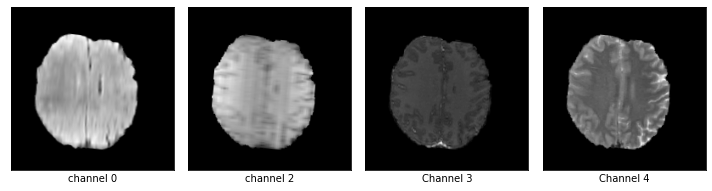

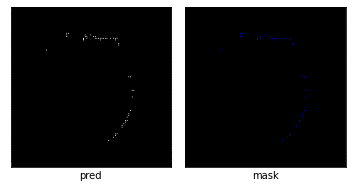

dice_loss : 0.18974661166764878



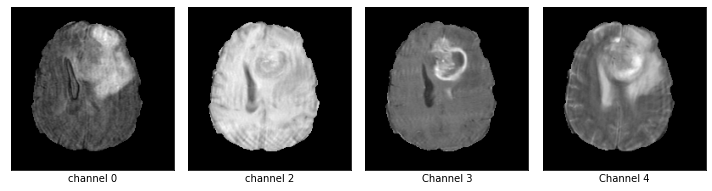

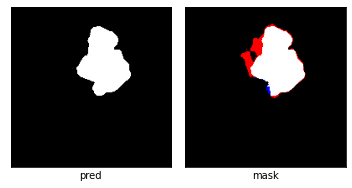

03/06 07:37:57 PM epoch 13 lr 2.009943e-02
03/06 07:37:57 PM genotype = Genotype(normal=[('dil_conv_3x3', 1), ('dil_conv_5x5', 0), ('sep_conv_3x3', 2), ('skip_connect', 0), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('sep_conv_3x3', 3), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('sep_conv_5x5', 0), ('dil_conv_5x5', 2), ('dil_conv_5x5', 1), ('sep_conv_5x5', 3), ('sep_conv_3x3', 0), ('max_pool_3x3', 4), ('max_pool_3x3', 3)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<43:01,  1.10s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.9815, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<42:06,  1.07s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.9757, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<41:57,  1.07s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<41:57,  1.07s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<41:26,  1.06s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<41:17,  1.05s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<41:02,  1.05s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<40:37,  1.04s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.3100, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<40:26,  1.03s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.9904, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<40:41,  1.04s/it, Acc=0.987, IoU=0.748, Loss=0.145]

tensor(0.1167, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<40:55,  1.05s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<40:40,  1.04s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<40:36,  1.04s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<40:50,  1.05s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.4172, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<40:44,  1.04s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.6236, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<40:46,  1.05s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.2966, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<40:53,  1.05s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<40:40,  1.04s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:19<40:24,  1.04s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.0633, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:20<40:26,  1.04s/it, Acc=0.99, IoU=0.732, Loss=0.155]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:21<40:12,  1.03s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.0518, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:22<40:15,  1.04s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.2162, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:23<40:19,  1.04s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.4058, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:25<40:09,  1.03s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:26<39:51,  1.03s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.2244, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:27<39:51,  1.03s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.1725, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:28<39:48,  1.03s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.2153, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:29<39:53,  1.03s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:30<40:27,  1.04s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.0426, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:31<40:15,  1.04s/it, Acc=0.982, IoU=0, Loss=0.999]

tensor(0.5494, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:32<40:16,  1.04s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.1401, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:33<40:09,  1.04s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:34<40:07,  1.04s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.9890, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:35<39:53,  1.03s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:36<39:54,  1.03s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.6082, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:37<39:51,  1.03s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.3330, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:38<39:53,  1.03s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:39<40:15,  1.04s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:40<40:30,  1.05s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.1335, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:41<40:22,  1.05s/it, Acc=0.993, IoU=0.916, Loss=0.0447]

tensor(0.4225, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:42<40:01,  1.04s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:43<40:11,  1.04s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0985, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:44<40:06,  1.04s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1273, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:45<39:54,  1.04s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.3044, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:46<39:52,  1.04s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.1712, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:47<39:27,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.5434, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:48<39:29,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:49<39:42,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:50<39:46,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:51<39:36,  1.03s/it, Acc=0.992, IoU=0, Loss=0.997]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:52<39:28,  1.03s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.1287, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:53<39:30,  1.03s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:55<39:31,  1.03s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:56<39:38,  1.03s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:57<39:29,  1.03s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:58<39:47,  1.04s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.6381, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:59<39:46,  1.04s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0434, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [01:00<39:46,  1.04s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.7139, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [01:01<39:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0403, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:02<39:46,  1.04s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.3065, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:03<39:51,  1.04s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1934, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:04<39:47,  1.04s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:05<39:52,  1.04s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9375, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:06<39:37,  1.04s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.5553, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:07<39:35,  1.04s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6801, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:08<39:30,  1.04s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:09<39:12,  1.03s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.3971, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:10<39:24,  1.03s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:11<39:32,  1.04s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:12<39:32,  1.04s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.2235, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:13<39:40,  1.04s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:14<39:36,  1.04s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.5766, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:15<39:52,  1.05s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:16<40:05,  1.05s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.3561, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:17<39:48,  1.05s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:18<39:43,  1.05s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:20<39:50,  1.05s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.8064, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:21<39:37,  1.04s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.2631, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:22<39:17,  1.04s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.9864, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:23<38:56,  1.03s/it, Acc=1, IoU=0, Loss=0.00135]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:24<39:08,  1.03s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.8252, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:25<39:16,  1.04s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.0529, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:26<39:13,  1.04s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.2941, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:27<39:11,  1.04s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.9878, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:28<39:24,  1.04s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:29<39:35,  1.05s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:30<39:21,  1.04s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.9446, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:31<39:15,  1.04s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:32<39:20,  1.04s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.4069, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:33<39:25,  1.04s/it, Acc=0.996, IoU=0.505, Loss=0.328]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:34<39:39,  1.05s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:35<39:39,  1.05s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.0626, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:36<39:39,  1.05s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.3895, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:37<39:36,  1.05s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:38<39:35,  1.05s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:39<39:12,  1.04s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:40<39:00,  1.04s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:41<38:58,  1.04s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.6742, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:42<38:57,  1.04s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.3301, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:43<38:51,  1.03s/it, Acc=0.994, IoU=0.63, Loss=0.229]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:44<39:01,  1.04s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:46<39:01,  1.04s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.1430, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:47<38:51,  1.04s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:48<39:05,  1.04s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:49<39:05,  1.04s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:50<39:13,  1.05s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.5676, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:51<38:51,  1.04s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.9889, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:52<38:58,  1.04s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.1689, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:53<38:34,  1.03s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:54<38:37,  1.03s/it, Acc=0.997, IoU=0.903, Loss=0.0523]

tensor(0.1899, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:55<38:38,  1.03s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:56<38:42,  1.04s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.1616, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:57<38:43,  1.04s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:58<38:45,  1.04s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.9920, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [01:59<38:49,  1.04s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [02:00<38:57,  1.04s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.1879, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [02:01<39:00,  1.05s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [02:02<38:57,  1.04s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.2092, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [02:03<38:50,  1.04s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.4944, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:04<38:47,  1.04s/it, Acc=0.995, IoU=0.87, Loss=0.0697]

tensor(0.4486, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:05<38:30,  1.03s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.0712, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:06<38:32,  1.04s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:07<38:40,  1.04s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.2250, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:08<38:35,  1.04s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:09<38:35,  1.04s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:10<38:31,  1.04s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:11<38:39,  1.04s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.0022, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:13<38:42,  1.04s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:14<38:34,  1.04s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.0451, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:15<38:19,  1.03s/it, Acc=0.996, IoU=0.855, Loss=0.0794]

tensor(0.5446, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:16<38:08,  1.03s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.0896, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:17<38:12,  1.03s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.6185, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:18<38:14,  1.03s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.0386, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:19<37:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:20<37:57,  1.03s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:21<37:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:22<38:21,  1.04s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:23<38:12,  1.03s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:24<38:19,  1.04s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:25<38:31,  1.04s/it, Acc=1, IoU=0, Loss=0.000895]

tensor(0.1102, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:26<38:56,  1.06s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:27<38:47,  1.05s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:28<38:42,  1.05s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.4051, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:29<38:36,  1.05s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.9597, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:30<38:32,  1.05s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:31<38:22,  1.04s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:32<38:03,  1.03s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:33<37:37,  1.02s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:34<37:54,  1.03s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.6650, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:35<37:45,  1.03s/it, Acc=1, IoU=0, Loss=0.0081]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:36<38:01,  1.04s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.3985, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:37<38:04,  1.04s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:38<37:51,  1.03s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:39<37:35,  1.02s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.6180, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:40<37:49,  1.03s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.2414, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:42<37:46,  1.03s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.1262, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:43<37:43,  1.03s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.3471, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:44<37:48,  1.03s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.0697, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:45<37:38,  1.03s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.6585, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:46<37:45,  1.03s/it, Acc=0.994, IoU=0.87, Loss=0.0712]

tensor(0.4331, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:47<37:56,  1.04s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:48<37:48,  1.03s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.5915, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:49<37:54,  1.04s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.2760, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:50<38:24,  1.05s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.4001, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:51<38:16,  1.05s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:52<38:20,  1.05s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.0884, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:53<38:07,  1.05s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:54<37:51,  1.04s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:55<37:43,  1.04s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.4930, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:56<38:09,  1.05s/it, Acc=0.998, IoU=0.916, Loss=0.0435]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:57<38:01,  1.04s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [02:58<38:02,  1.05s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [02:59<37:51,  1.04s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.0372, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [03:00<37:48,  1.04s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.4743, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [03:01<37:55,  1.04s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.4286, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [03:02<38:22,  1.06s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [03:03<38:06,  1.05s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [03:04<37:37,  1.04s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.7477, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [03:05<37:36,  1.04s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.9793, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:06<37:25,  1.03s/it, Acc=0.99, IoU=0.856, Loss=0.0791]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:08<37:15,  1.03s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.8277, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:09<37:19,  1.03s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:10<37:33,  1.04s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:11<37:39,  1.04s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:12<37:43,  1.04s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:13<37:43,  1.04s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:14<37:35,  1.04s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:15<37:29,  1.04s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:16<37:26,  1.04s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:17<37:34,  1.04s/it, Acc=0.99, IoU=0.737, Loss=0.153]

tensor(0.9886, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:18<37:41,  1.05s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:19<37:43,  1.05s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:20<38:00,  1.05s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:21<37:56,  1.05s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:22<38:20,  1.07s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.0771, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:23<38:07,  1.06s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.5654, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:24<38:03,  1.06s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:25<37:52,  1.05s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:26<37:58,  1.06s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.7201, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:27<37:53,  1.05s/it, Acc=1, IoU=0, Loss=0.000489]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:29<37:47,  1.05s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:30<37:37,  1.05s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.6160, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:31<38:01,  1.06s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:32<38:13,  1.07s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.5133, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:33<37:58,  1.06s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:34<37:41,  1.05s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.5309, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:35<37:33,  1.05s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.9861, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:36<37:16,  1.04s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.6218, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:37<37:13,  1.04s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.9677, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:38<37:17,  1.04s/it, Acc=0.99, IoU=0.887, Loss=0.0621]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:39<37:46,  1.06s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:40<37:49,  1.06s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1582, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:41<37:37,  1.05s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:42<37:44,  1.06s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.4021, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:43<37:40,  1.06s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:44<37:16,  1.05s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.3404, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:45<37:13,  1.04s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.6205, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:46<37:00,  1.04s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:47<37:18,  1.05s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.5453, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:48<37:16,  1.05s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:50<37:06,  1.04s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:51<37:14,  1.05s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:52<37:06,  1.04s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.1379, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:53<37:08,  1.05s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:54<37:21,  1.05s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:55<37:27,  1.06s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.2534, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:56<37:21,  1.05s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:57<37:13,  1.05s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:58<37:09,  1.05s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [03:59<37:05,  1.05s/it, Acc=0.996, IoU=0.798, Loss=0.111]

tensor(0.1328, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [04:00<37:26,  1.06s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [04:01<37:56,  1.07s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.5885, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [04:02<37:50,  1.07s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [04:03<37:55,  1.07s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [04:04<37:35,  1.06s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [04:05<37:38,  1.07s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.3857, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [04:06<37:29,  1.06s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.0473, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [04:08<37:22,  1.06s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [04:09<37:10,  1.05s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:10<37:36,  1.07s/it, Acc=0.991, IoU=0.745, Loss=0.147]

tensor(0.9342, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:11<37:42,  1.07s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:12<37:28,  1.06s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:13<37:43,  1.07s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0415, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:14<37:56,  1.08s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1822, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:15<37:51,  1.08s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.6236, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:16<37:37,  1.07s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.2980, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:17<37:32,  1.07s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0966, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:18<37:38,  1.07s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1441, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:19<37:41,  1.07s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:20<37:44,  1.08s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.2575, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:21<37:30,  1.07s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:22<37:00,  1.06s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:24<37:05,  1.06s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.2162, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:25<37:02,  1.06s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:26<37:03,  1.06s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:27<36:55,  1.06s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:28<36:53,  1.06s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:29<36:53,  1.06s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.0292, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:30<36:52,  1.06s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.1652, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:31<36:44,  1.05s/it, Acc=0.997, IoU=0.944, Loss=0.0289]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:32<36:37,  1.05s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:33<36:54,  1.06s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:34<37:01,  1.06s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:35<37:01,  1.06s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:36<36:54,  1.06s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0405, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:37<36:57,  1.06s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.2633, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:38<36:43,  1.06s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.5404, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:39<36:17,  1.04s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:40<36:06,  1.04s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:41<36:08,  1.04s/it, Acc=0.98, IoU=0, Loss=0.999]

tensor(0.6785, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:42<36:23,  1.05s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:44<36:26,  1.05s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.4316, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:45<36:26,  1.05s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:46<36:46,  1.06s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:47<36:49,  1.06s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:48<36:52,  1.06s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:49<36:28,  1.05s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.1085, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:50<36:29,  1.05s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.9114, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:51<36:35,  1.06s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.3334, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:52<36:31,  1.06s/it, Acc=1, IoU=0, Loss=0.000702]

tensor(0.4143, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:53<36:23,  1.05s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:54<36:28,  1.06s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:55<36:36,  1.06s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.1121, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:56<36:29,  1.06s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.6294, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:57<36:12,  1.05s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.0254, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:58<36:02,  1.05s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.5881, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [04:59<35:54,  1.04s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.0490, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [05:00<35:35,  1.03s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.5966, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [05:01<35:34,  1.03s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [05:02<35:44,  1.04s/it, Acc=1, IoU=0, Loss=0.00524]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [05:03<35:36,  1.04s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [05:05<35:38,  1.04s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.7122, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [05:06<35:34,  1.04s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.0442, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [05:07<35:45,  1.04s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [05:08<35:45,  1.04s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.6696, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [05:09<35:35,  1.04s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [05:10<35:13,  1.03s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.1382, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [05:11<34:47,  1.01s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [05:12<34:52,  1.02s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:13<34:37,  1.01s/it, Acc=0.996, IoU=0.0331, Loss=0.938]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:14<34:40,  1.01s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.1895, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:15<34:53,  1.02s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:16<34:59,  1.02s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:17<34:42,  1.02s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:18<34:44,  1.02s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:19<34:54,  1.02s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.6285, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:20<34:50,  1.02s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.3367, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:21<34:27,  1.01s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:22<34:33,  1.01s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.2341, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:23<34:29,  1.01s/it, Acc=0.997, IoU=0.923, Loss=0.0405]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:24<34:30,  1.01s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.1717, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:25<34:49,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:26<34:36,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.1811, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:27<34:43,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.0648, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:28<34:47,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.9900, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:29<34:44,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.1925, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:30<34:43,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:31<34:44,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:32<34:24,  1.01s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:33<34:16,  1.01s/it, Acc=0.991, IoU=0.909, Loss=0.0481]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:34<34:10,  1.01s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:35<34:22,  1.01s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.1163, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:36<34:18,  1.01s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.5097, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:37<34:13,  1.01s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:38<33:58,  1.00s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.1165, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:39<33:46,  1.00it/s, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:40<34:03,  1.01s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:41<34:06,  1.01s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.0627, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:42<34:03,  1.01s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:43<34:12,  1.01s/it, Acc=0.995, IoU=0.795, Loss=0.116]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:44<34:30,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.4699, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:45<34:37,  1.03s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.2589, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:46<34:18,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.4035, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:47<34:02,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.1655, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:48<34:01,  1.01s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.0047, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:49<34:11,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.0609, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:50<34:18,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.5179, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:51<34:27,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:52<34:09,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:53<34:08,  1.02s/it, Acc=0.997, IoU=0.899, Loss=0.0532]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:54<34:07,  1.02s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.0093, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:55<34:16,  1.02s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:56<34:17,  1.02s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.5266, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [05:57<34:08,  1.02s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.5329, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [05:58<33:58,  1.01s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [05:59<33:58,  1.01s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [06:00<34:01,  1.02s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [06:01<34:01,  1.02s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [06:02<34:16,  1.03s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [06:04<34:26,  1.03s/it, Acc=0.995, IoU=0.642, Loss=0.221]

tensor(0.5340, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [06:05<34:25,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [06:06<34:35,  1.04s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [06:07<34:30,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [06:08<34:21,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [06:09<34:20,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [06:10<34:17,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [06:11<34:15,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [06:12<34:27,  1.04s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1507, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [06:13<34:18,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0919, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:14<34:19,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1462, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:15<34:09,  1.03s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.0900, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:16<34:08,  1.03s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:17<33:51,  1.02s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.5040, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:18<33:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.1940, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:19<33:33,  1.01s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.1405, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:20<33:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:21<33:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:22<33:35,  1.01s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:23<33:34,  1.01s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:24<33:40,  1.02s/it, Acc=1, IoU=0, Loss=0.000328]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:25<33:42,  1.02s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:26<33:46,  1.02s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.2598, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:27<33:40,  1.02s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:28<33:39,  1.02s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.9770, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:29<33:43,  1.02s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:30<33:45,  1.02s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.2571, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:31<33:50,  1.03s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.1230, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:32<33:49,  1.03s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:33<33:35,  1.02s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.2466, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:34<33:22,  1.01s/it, Acc=0.992, IoU=0.656, Loss=0.211]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:35<33:25,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:36<33:45,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:37<33:39,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:38<33:29,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:39<33:23,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:40<33:12,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.6534, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:41<33:11,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.2573, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:42<33:13,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:43<33:10,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:44<33:23,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0846, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:45<33:20,  1.02s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:46<33:25,  1.02s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.6166, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:47<33:09,  1.01s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:48<33:01,  1.01s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:49<32:54,  1.01s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:50<33:00,  1.01s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:51<33:02,  1.01s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:52<33:04,  1.01s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:53<33:06,  1.02s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:55<32:58,  1.01s/it, Acc=0.994, IoU=0.856, Loss=0.0791]

tensor(0.1365, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:55<32:45,  1.01s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [06:57<32:55,  1.01s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.0765, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [06:58<32:48,  1.01s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.2633, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [06:59<32:49,  1.01s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.1001, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [07:00<33:02,  1.02s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.1125, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [07:01<33:01,  1.02s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [07:02<33:07,  1.02s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [07:03<32:53,  1.01s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [07:04<32:58,  1.02s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.0567, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [07:05<32:45,  1.01s/it, Acc=0.99, IoU=0.911, Loss=0.0461]

tensor(0.2855, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [07:06<32:39,  1.01s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.2370, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [07:07<33:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [07:08<32:53,  1.02s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [07:09<32:44,  1.01s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.2720, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [07:10<32:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [07:11<32:41,  1.01s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [07:12<32:53,  1.02s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.2884, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [07:13<32:57,  1.02s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.1721, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [07:14<32:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.1855, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:15<33:04,  1.03s/it, Acc=1, IoU=0, Loss=0.000719]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:16<32:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:17<33:06,  1.03s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:18<32:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.0032, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:19<32:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:20<32:51,  1.02s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:21<32:44,  1.02s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:22<32:48,  1.02s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:23<32:40,  1.02s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.8679, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:24<32:49,  1.02s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:25<32:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000197]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:26<32:35,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:27<32:36,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:28<32:27,  1.01s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:29<32:31,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:30<32:39,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0416, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:31<32:32,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:32<32:38,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:33<32:30,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.1605, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:34<32:25,  1.02s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:35<32:20,  1.01s/it, Acc=0.975, IoU=0, Loss=0.999]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:36<32:12,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.6745, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:37<32:35,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:38<32:22,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0507, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:39<32:18,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:40<32:34,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:41<32:26,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:42<32:24,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:43<32:28,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:44<32:15,  1.02s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:45<32:05,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.7103, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:46<32:19,  1.02s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:47<32:39,  1.03s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:48<32:25,  1.02s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:49<32:15,  1.02s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:50<32:09,  1.02s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.4088, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:52<32:24,  1.02s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:53<32:17,  1.02s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:54<32:16,  1.02s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:55<31:59,  1.01s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:56<32:01,  1.01s/it, Acc=0.986, IoU=0.00194, Loss=0.992]

tensor(0.1270, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:57<31:52,  1.01s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.1004, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [07:58<32:00,  1.01s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.1249, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [07:59<31:48,  1.01s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [08:00<31:57,  1.01s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [08:01<32:06,  1.02s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.4291, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [08:02<32:02,  1.02s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.8142, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [08:03<32:00,  1.02s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.0598, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [08:04<31:37,  1.01s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [08:05<31:30,  1.00s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [08:06<31:35,  1.01s/it, Acc=0.993, IoU=0.9, Loss=0.0539]

tensor(0.5935, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [08:07<31:54,  1.02s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [08:08<31:51,  1.01s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.5708, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [08:09<31:41,  1.01s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.4591, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [08:10<31:30,  1.01s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.0536, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [08:11<31:33,  1.01s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [08:12<31:46,  1.01s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [08:13<31:56,  1.02s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [08:14<31:57,  1.02s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [08:15<31:55,  1.02s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.1206, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [08:16<31:49,  1.02s/it, Acc=0.999, IoU=0.826, Loss=0.0998]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:17<32:34,  1.04s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:18<32:33,  1.04s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:19<32:16,  1.03s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.6462, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:20<32:09,  1.03s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:21<32:18,  1.04s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.2322, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:22<32:21,  1.04s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:23<31:58,  1.03s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:24<31:38,  1.02s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.1797, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:25<31:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.1708, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:26<31:53,  1.03s/it, Acc=1, IoU=0, Loss=0.00411]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:27<31:45,  1.02s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:28<31:45,  1.02s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:29<31:35,  1.02s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.3215, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:30<31:30,  1.02s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.2187, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:31<31:16,  1.01s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:32<31:06,  1.00s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.2109, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:33<31:19,  1.01s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:34<31:18,  1.01s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:35<31:04,  1.00s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.1221, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:36<31:03,  1.00s/it, Acc=0.997, IoU=0.547, Loss=0.297]

tensor(0.0835, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:37<31:06,  1.01s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:38<31:14,  1.01s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.8333, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:39<31:15,  1.01s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:40<31:15,  1.01s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:41<31:15,  1.01s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:42<31:11,  1.01s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:43<31:03,  1.01s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.1750, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:44<31:19,  1.02s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.9489, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:45<31:10,  1.01s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:46<31:20,  1.02s/it, Acc=0.997, IoU=0.837, Loss=0.0909]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:47<31:12,  1.02s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:48<31:22,  1.02s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.1441, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:49<31:11,  1.02s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.1056, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:50<31:24,  1.02s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:51<31:14,  1.02s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:53<31:16,  1.02s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:54<31:12,  1.02s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:55<31:03,  1.01s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:56<31:00,  1.01s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.3423, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:57<31:02,  1.02s/it, Acc=0.992, IoU=0.721, Loss=0.161]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [08:58<31:16,  1.02s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.1441, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [08:59<31:19,  1.03s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.0866, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [09:00<31:05,  1.02s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.5740, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [09:01<30:56,  1.01s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.6528, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [09:02<30:53,  1.01s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [09:03<31:00,  1.02s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [09:04<31:00,  1.02s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [09:05<30:45,  1.01s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [09:06<30:48,  1.01s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.3261, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [09:07<30:48,  1.01s/it, Acc=0.992, IoU=0.809, Loss=0.108]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [09:08<30:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.5147, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [09:09<31:03,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [09:10<30:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.4246, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [09:11<31:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [09:12<31:10,  1.03s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.2641, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [09:13<31:02,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.5488, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [09:14<30:46,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [09:15<30:49,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [09:16<30:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [09:17<30:49,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0468, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:18<30:46,  1.02s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:19<30:44,  1.02s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.0691, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:20<30:48,  1.02s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:21<30:54,  1.02s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.4291, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:22<30:58,  1.03s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:23<30:56,  1.03s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:24<31:14,  1.04s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.6036, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:25<31:14,  1.04s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.3745, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:26<31:19,  1.04s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.1031, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:27<30:59,  1.03s/it, Acc=0.992, IoU=0.886, Loss=0.0628]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:28<30:50,  1.03s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:29<30:51,  1.03s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.1158, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:30<30:44,  1.02s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.6151, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:31<30:33,  1.02s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:32<30:31,  1.02s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:33<30:33,  1.02s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:34<30:30,  1.02s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.1259, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:35<30:36,  1.02s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.7584, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:36<30:35,  1.02s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:37<30:31,  1.02s/it, Acc=0.991, IoU=0.781, Loss=0.124]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:38<30:09,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:39<30:07,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.0888, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:40<29:59,  1.00s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.6800, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:41<30:00,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:42<30:04,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:43<30:06,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:44<29:57,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.1383, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:45<29:58,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:46<29:56,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:47<29:54,  1.01s/it, Acc=0.99, IoU=0.422, Loss=0.41]

tensor(0.0666, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:48<30:07,  1.01s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:50<30:23,  1.02s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.4181, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:51<30:18,  1.02s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:52<30:12,  1.02s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0885, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:53<29:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:54<30:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:55<30:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.4030, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:56<30:16,  1.02s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [09:57<30:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.2946, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [09:58<30:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000341]

tensor(0.3082, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [09:59<30:10,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [10:00<30:12,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.2859, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [10:01<30:04,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0434, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [10:02<30:00,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [10:03<29:52,  1.01s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0358, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [10:04<29:56,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.1611, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [10:05<29:48,  1.01s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.3842, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [10:06<29:50,  1.01s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [10:07<29:42,  1.01s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [10:08<29:53,  1.02s/it, Acc=0.995, IoU=0.923, Loss=0.0404]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [10:09<30:02,  1.02s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [10:10<30:04,  1.02s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [10:11<29:50,  1.02s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [10:12<29:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1734, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [10:13<29:37,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0900, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [10:14<29:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [10:15<29:29,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [10:16<29:24,  1.00s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.2291, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [10:17<29:26,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0886, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:18<29:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00141]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:19<29:41,  1.02s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.1430, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:20<29:44,  1.02s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.9455, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:21<29:43,  1.02s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:22<29:37,  1.01s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:23<29:34,  1.01s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.2087, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:24<29:33,  1.01s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.4151, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:25<29:35,  1.02s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:26<29:29,  1.01s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:27<29:28,  1.01s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.3881, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:28<29:30,  1.01s/it, Acc=1, IoU=0, Loss=0.923]

tensor(0.7422, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:29<29:30,  1.01s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:30<29:45,  1.02s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:31<29:47,  1.03s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:32<29:33,  1.02s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:33<29:35,  1.02s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:34<29:35,  1.02s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:35<29:46,  1.03s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.0451, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:36<29:30,  1.02s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.2309, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:37<29:25,  1.02s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:38<29:26,  1.02s/it, Acc=0.988, IoU=0.848, Loss=0.0827]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:39<29:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000647]

tensor(0.4414, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:40<29:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000647]

tensor(0.6832, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:41<29:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000647]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:42<29:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000647]

tensor(0.5887, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:43<29:07,  1.01s/it, Acc=1, IoU=0, Loss=0.000647]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:44<28:57,  1.00s/it, Acc=1, IoU=0, Loss=0.000647]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:45<28:54,  1.00s/it, Acc=1, IoU=0, Loss=0.000647]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:46<28:39,  1.00it/s, Acc=1, IoU=0, Loss=0.000647]

tensor(0.0369, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:47<28:39,  1.00it/s, Acc=1, IoU=0, Loss=0.000647]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:48<28:35,  1.01it/s, Acc=1, IoU=0, Loss=0.000647]

tensor(0.1429, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:49<28:37,  1.00it/s, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:50<28:45,  1.00s/it, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:51<28:39,  1.00it/s, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:52<28:39,  1.00it/s, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.2608, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:53<28:45,  1.00s/it, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.2066, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:54<28:57,  1.01s/it, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.1634, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:55<28:58,  1.01s/it, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [10:56<28:58,  1.01s/it, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [10:57<28:49,  1.01s/it, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [10:58<28:46,  1.01s/it, Acc=0.989, IoU=0.902, Loss=0.0534]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [10:59<28:39,  1.00s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.1557, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [11:00<28:33,  1.00s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.9745, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [11:01<28:33,  1.00s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [11:02<28:39,  1.00s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [11:03<28:36,  1.00s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.0344, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [11:04<28:57,  1.02s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.0372, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [11:05<29:07,  1.02s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.3672, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [11:07<29:09,  1.03s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.3045, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [11:08<29:06,  1.02s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.2536, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [11:09<28:59,  1.02s/it, Acc=0.996, IoU=0.5, Loss=0.336]

tensor(0.0107, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [11:10<28:58,  1.02s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.1887, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [11:11<29:12,  1.03s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.4514, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [11:12<29:03,  1.02s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.5400, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [11:13<28:57,  1.02s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.0534, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [11:14<28:51,  1.02s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [11:15<28:47,  1.02s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [11:16<28:40,  1.01s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.9850, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [11:17<28:47,  1.02s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.6084, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [11:18<28:41,  1.01s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:19<28:45,  1.02s/it, Acc=0.994, IoU=0.654, Loss=0.21]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:20<28:52,  1.02s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:21<28:56,  1.03s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.1026, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:22<28:51,  1.02s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:23<28:49,  1.02s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:24<28:47,  1.02s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:25<28:47,  1.02s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:26<28:26,  1.01s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.3931, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:27<28:14,  1.00s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:28<28:18,  1.01s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:29<28:14,  1.01s/it, Acc=0.972, IoU=0.423, Loss=0.407]

tensor(0.4686, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:30<28:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.6390, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:31<28:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.2734, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:32<28:24,  1.01s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:33<28:20,  1.01s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:34<28:16,  1.01s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:35<28:25,  1.02s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:36<28:30,  1.02s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.0805, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:37<28:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:38<28:30,  1.02s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:39<28:28,  1.02s/it, Acc=1, IoU=0, Loss=0.00089]

tensor(0.5753, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:40<28:25,  1.02s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:41<28:29,  1.02s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:42<28:16,  1.01s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.5417, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:43<28:19,  1.02s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:44<28:06,  1.01s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.7529, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:45<27:54,  1.00s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:46<27:54,  1.00s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.5489, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:47<27:49,  1.00s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.9919, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:48<27:54,  1.00s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:49<27:58,  1.01s/it, Acc=0.973, IoU=0.571, Loss=0.274]

tensor(0.1465, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:50<27:56,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:51<28:13,  1.02s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:52<28:03,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.4277, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:53<27:54,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:54<28:06,  1.02s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.2773, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [11:55<28:04,  1.02s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [11:56<28:02,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.3067, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [11:57<28:06,  1.02s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [11:58<28:01,  1.02s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.6193, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [11:59<27:55,  1.01s/it, Acc=0.993, IoU=0.902, Loss=0.0524]

tensor(0.3771, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [12:00<27:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.2708, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [12:01<27:56,  1.01s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [12:02<28:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [12:03<28:10,  1.02s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.0829, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [12:04<27:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [12:05<28:08,  1.02s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.2263, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [12:06<28:12,  1.03s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.1778, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [12:07<28:15,  1.03s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.1426, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [12:09<28:26,  1.04s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [12:10<28:27,  1.04s/it, Acc=1, IoU=0, Loss=0.000832]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [12:11<28:24,  1.04s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [12:12<28:04,  1.03s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [12:13<27:53,  1.02s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.2104, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [12:14<27:54,  1.02s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [12:15<27:44,  1.01s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.6700, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [12:16<27:46,  1.02s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.5442, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [12:17<27:41,  1.01s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.9584, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [12:18<27:54,  1.02s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [12:19<27:55,  1.02s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:20<28:00,  1.03s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.0589, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:21<28:04,  1.03s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:22<28:01,  1.03s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:23<27:47,  1.02s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.0787, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:24<27:35,  1.02s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.1128, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:25<27:49,  1.02s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:26<27:38,  1.02s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.9756, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:27<27:46,  1.02s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:28<27:55,  1.03s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:29<28:04,  1.04s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.1439, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:30<28:01,  1.03s/it, Acc=0.996, IoU=0.835, Loss=0.0897]

tensor(0.0483, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:31<28:09,  1.04s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:32<28:03,  1.04s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:33<27:54,  1.03s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.5114, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:34<27:40,  1.02s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.1994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:35<27:41,  1.03s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:36<27:41,  1.03s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:37<27:33,  1.02s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:38<27:21,  1.02s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:39<27:26,  1.02s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:40<27:29,  1.02s/it, Acc=0.996, IoU=0.787, Loss=0.123]

tensor(0.5852, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:41<27:41,  1.03s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:42<27:41,  1.03s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.4155, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:43<27:45,  1.03s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.1922, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:44<27:26,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.4094, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:45<27:25,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.1042, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:46<27:20,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.1483, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:47<27:17,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.0476, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:48<27:16,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:50<27:19,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.7212, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:51<27:17,  1.02s/it, Acc=0.992, IoU=0.898, Loss=0.0542]

tensor(0.0430, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:52<27:17,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:53<27:11,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:54<27:16,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.1479, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:55<27:07,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:56<27:05,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [12:57<27:13,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [12:58<27:05,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [12:59<27:09,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.0840, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [13:00<27:15,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6798, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [13:01<27:10,  1.02s/it, Acc=0.97, IoU=0, Loss=0.999]

tensor(0.6205, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [13:02<27:10,  1.02s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [13:03<27:13,  1.03s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [13:04<27:07,  1.02s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [13:05<26:58,  1.02s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [13:06<26:59,  1.02s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.1788, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [13:07<27:03,  1.02s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.2020, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [13:08<27:00,  1.02s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.1232, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [13:09<26:50,  1.01s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.2421, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [13:10<26:57,  1.02s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [13:11<26:54,  1.02s/it, Acc=0.998, IoU=0.313, Loss=0.516]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [13:12<27:01,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.5193, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [13:13<27:19,  1.04s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [13:14<26:56,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [13:15<26:52,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.4846, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [13:16<26:50,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [13:17<27:00,  1.03s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.6058, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [13:18<27:03,  1.03s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.8428, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [13:19<26:56,  1.03s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [13:20<26:54,  1.02s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:21<27:09,  1.03s/it, Acc=1, IoU=0, Loss=0.00201]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:22<27:00,  1.03s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.1151, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:23<27:12,  1.04s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:24<27:12,  1.04s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:25<27:08,  1.04s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:26<27:07,  1.04s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:27<27:00,  1.03s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.9935, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:28<26:53,  1.03s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.4921, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:29<26:40,  1.02s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.5982, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:31<26:48,  1.03s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.1105, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:32<26:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00482]

tensor(0.1746, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:33<26:39,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:34<26:59,  1.04s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.7496, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:35<26:44,  1.03s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.9857, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:36<26:25,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:37<26:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:38<26:26,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:39<26:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.1471, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:40<26:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.2883, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:41<26:22,  1.02s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:42<26:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000881]

tensor(0.0992, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:43<26:11,  1.01s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.6416, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:44<26:30,  1.02s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:45<26:16,  1.02s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:46<26:20,  1.02s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.0490, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:47<26:24,  1.02s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:48<26:32,  1.03s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:49<26:29,  1.03s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.0700, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:50<26:37,  1.03s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.0905, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:51<26:35,  1.03s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:52<26:31,  1.03s/it, Acc=0.994, IoU=0.825, Loss=0.0994]

tensor(0.6572, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:53<26:32,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:54<26:26,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:55<26:24,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:56<26:24,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [13:57<26:17,  1.02s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.0576, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [13:58<26:17,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.1504, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [13:59<26:12,  1.02s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.0516, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [14:00<26:22,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.0277, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [14:01<26:21,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [14:02<26:28,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.0763]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [14:03<26:20,  1.03s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [14:04<26:15,  1.03s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.4639, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [14:05<26:09,  1.02s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [14:06<26:13,  1.03s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.3678, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [14:07<25:57,  1.02s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [14:08<25:47,  1.01s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.8934, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [14:09<25:47,  1.01s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [14:10<25:43,  1.01s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [14:11<26:04,  1.03s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.1546, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [14:13<26:21,  1.04s/it, Acc=0.986, IoU=0.818, Loss=0.103]

tensor(0.7141, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [14:14<26:25,  1.04s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [14:15<26:26,  1.04s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.6083, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [14:16<26:07,  1.03s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.0083, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [14:17<26:13,  1.03s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.5281, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [14:18<26:09,  1.03s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.0384, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [14:19<26:04,  1.03s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.5578, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [14:20<26:00,  1.03s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:21<26:04,  1.03s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:22<25:53,  1.03s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:23<25:50,  1.02s/it, Acc=0.997, IoU=0.602, Loss=0.249]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:24<25:44,  1.02s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.5001, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:25<25:57,  1.03s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:26<25:52,  1.03s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.6656, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:27<25:49,  1.03s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:28<25:42,  1.02s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:29<25:41,  1.02s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:30<25:46,  1.03s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:31<25:56,  1.03s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.6608, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:32<26:01,  1.04s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.0503, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:33<25:55,  1.03s/it, Acc=0.994, IoU=0.937, Loss=0.0349]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:34<25:59,  1.04s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:35<26:04,  1.04s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.2915, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:36<25:58,  1.04s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.1229, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:37<25:52,  1.03s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:38<25:39,  1.03s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:39<25:44,  1.03s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:40<25:33,  1.02s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:41<25:45,  1.03s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.8469, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:42<25:51,  1.04s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:43<25:38,  1.03s/it, Acc=0.946, IoU=0.0416, Loss=0.919]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:44<25:30,  1.02s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:45<25:27,  1.02s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:46<25:27,  1.02s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:48<25:29,  1.03s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:49<25:16,  1.02s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.1084, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:50<25:08,  1.01s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.4310, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:51<25:03,  1.01s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:52<25:01,  1.01s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:53<25:02,  1.01s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.0720, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:54<25:10,  1.02s/it, Acc=0.998, IoU=0.854, Loss=0.079]

tensor(0.1457, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:55<25:10,  1.02s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:56<25:19,  1.02s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.4333, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:57<25:26,  1.03s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.4658, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [14:58<25:16,  1.02s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.4013, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [14:59<25:12,  1.02s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [15:00<25:04,  1.02s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [15:01<24:46,  1.01s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [15:02<24:40,  1.00s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [15:03<24:54,  1.01s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [15:04<25:03,  1.02s/it, Acc=0.995, IoU=0.717, Loss=0.164]

tensor(0.6209, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [15:05<25:03,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1457, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [15:06<25:09,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [15:07<25:15,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [15:08<25:21,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0413, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [15:09<25:16,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [15:10<25:06,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.6631, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [15:11<24:50,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0772, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [15:12<24:47,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [15:13<24:46,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1427, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [15:14<24:46,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.5071, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [15:15<24:45,  1.01s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [15:16<24:45,  1.02s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [15:17<24:44,  1.02s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.1690, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [15:18<24:40,  1.01s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [15:19<24:42,  1.02s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.0283, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [15:20<24:37,  1.01s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [15:21<24:41,  1.02s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.3322, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:22<24:41,  1.02s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:23<24:37,  1.01s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.0031, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:24<24:31,  1.01s/it, Acc=0.983, IoU=0.776, Loss=0.128]

tensor(0.1232, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:25<24:41,  1.02s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:26<25:03,  1.03s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:27<25:02,  1.04s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:28<24:50,  1.03s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.0558, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:29<24:55,  1.03s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.4120, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:30<25:00,  1.04s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.1342, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:31<24:56,  1.03s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.3280, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:32<24:44,  1.03s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.2533, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:33<24:43,  1.03s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.1849, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:34<24:31,  1.02s/it, Acc=0.993, IoU=0.816, Loss=0.102]

tensor(0.1026, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:35<24:30,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:36<24:29,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:37<24:18,  1.01s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.2274, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:38<24:06,  1.00s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0528, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:39<24:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:40<24:21,  1.02s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.2678, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:41<24:13,  1.01s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:42<24:07,  1.01s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0462, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:43<24:09,  1.01s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:45<24:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00131]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:46<24:05,  1.01s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:47<24:12,  1.01s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:48<24:02,  1.01s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.1875, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:49<24:07,  1.01s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.1180, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:50<24:01,  1.01s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:51<23:57,  1.01s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.2399, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:52<24:03,  1.01s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:53<23:58,  1.01s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:54<23:49,  1.00s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:55<23:51,  1.00s/it, Acc=0.988, IoU=0.57, Loss=0.27]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:56<23:45,  1.00s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:57<23:56,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.0398, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [15:58<23:53,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.5448, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [15:59<23:55,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [16:00<23:54,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [16:01<23:49,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [16:02<23:52,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [16:03<23:55,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [16:04<24:01,  1.02s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.0957, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [16:05<23:52,  1.01s/it, Acc=0.993, IoU=0.92, Loss=0.0433]

tensor(0.6026, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [16:06<23:53,  1.01s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [16:07<23:58,  1.02s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [16:08<23:52,  1.01s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [16:09<23:56,  1.02s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.6258, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [16:10<23:57,  1.02s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [16:11<24:00,  1.02s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.2560, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [16:12<24:00,  1.02s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.2539, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [16:13<23:59,  1.02s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.0791, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [16:14<24:06,  1.03s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [16:15<24:02,  1.03s/it, Acc=0.985, IoU=0.836, Loss=0.0888]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [16:16<24:11,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [16:17<24:15,  1.04s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [16:18<24:07,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [16:19<23:59,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [16:20<23:53,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.3679, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [16:21<23:54,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0465, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [16:22<23:58,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.5536, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:23<23:57,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:24<23:57,  1.03s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:25<23:47,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4088, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:26<23:44,  1.02s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:27<24:04,  1.04s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.1411, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:28<24:07,  1.04s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:29<24:05,  1.04s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:30<23:56,  1.03s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:31<23:52,  1.03s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0945, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:32<24:07,  1.04s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.6037, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:34<23:57,  1.04s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:35<23:56,  1.04s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.2184, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:36<23:41,  1.03s/it, Acc=0.999, IoU=0, Loss=0.98]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:37<23:40,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:38<23:46,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.8360, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:39<23:42,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:40<23:41,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.1104, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:41<23:38,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:42<23:35,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:43<23:38,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:44<23:39,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:45<23:34,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.5680, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:46<23:32,  1.03s/it, Acc=0.993, IoU=0.919, Loss=0.0419]

tensor(0.9879, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:47<23:20,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:48<23:30,  1.03s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:49<23:24,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.3815, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:50<23:21,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.8618, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:51<23:50,  1.04s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.1764, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:52<23:38,  1.04s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.3718, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:53<23:31,  1.03s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.4413, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:54<23:20,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.6135, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:55<23:10,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:56<22:55,  1.01s/it, Acc=0.99, IoU=0.828, Loss=0.0934]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:57<22:51,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [16:58<23:09,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [16:59<22:57,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [17:00<22:58,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [17:01<22:47,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.7268, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [17:02<22:48,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9445, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [17:03<22:55,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.3821, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [17:04<22:56,  1.01s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [17:05<22:56,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [17:06<22:59,  1.02s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [17:07<22:53,  1.01s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [17:08<22:54,  1.02s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [17:09<22:49,  1.01s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.6242, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [17:10<22:49,  1.01s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [17:11<22:54,  1.02s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [17:12<22:48,  1.01s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [17:13<23:08,  1.03s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.8486, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [17:14<23:04,  1.03s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.8742, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [17:15<22:53,  1.02s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.6653, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [17:16<22:52,  1.02s/it, Acc=0.998, IoU=0, Loss=0.985]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [17:17<22:46,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.9208, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [17:18<22:47,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.6320, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [17:19<22:53,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [17:20<22:58,  1.03s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.2047, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [17:22<23:04,  1.03s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [17:23<22:59,  1.03s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [17:24<22:52,  1.03s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.5474, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:25<22:42,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.1087, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:26<22:44,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:27<22:45,  1.02s/it, Acc=0.984, IoU=0.724, Loss=0.161]

tensor(0.2623, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:28<22:40,  1.02s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:29<22:46,  1.03s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:30<22:52,  1.03s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.0541, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:31<22:40,  1.02s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:32<22:40,  1.02s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.8462, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:33<22:39,  1.02s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.1380, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:34<22:36,  1.02s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:35<22:37,  1.02s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.9658, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:36<22:38,  1.02s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:37<22:33,  1.02s/it, Acc=0.992, IoU=0.295, Loss=0.545]

tensor(0.2126, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:38<22:34,  1.02s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:39<22:43,  1.03s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:40<22:44,  1.03s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:41<22:39,  1.03s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.1276, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:42<22:44,  1.03s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:43<22:39,  1.03s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.3773, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:44<22:21,  1.02s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.0577, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:45<22:18,  1.02s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:46<22:22,  1.02s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.2215, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:47<22:18,  1.02s/it, Acc=0.991, IoU=0.876, Loss=0.0672]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:48<22:21,  1.02s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:49<22:24,  1.02s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.2004, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:50<22:17,  1.02s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.6613, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:51<22:20,  1.02s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:52<22:20,  1.02s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.5398, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:53<22:20,  1.02s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.0353, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:54<22:19,  1.02s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:55<22:09,  1.02s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.0995, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:56<22:01,  1.01s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:57<21:50,  1.00s/it, Acc=0.992, IoU=0.461, Loss=0.372]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [17:58<21:51,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [17:59<22:03,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.2500, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [18:00<22:00,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [18:01<21:47,  1.00s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.4869, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [18:02<21:43,  1.00s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [18:03<21:46,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [18:04<21:52,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [18:05<22:01,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.8617, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [18:06<21:55,  1.02s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [18:07<21:48,  1.01s/it, Acc=0.995, IoU=0.883, Loss=0.0633]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [18:08<21:43,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [18:09<21:45,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [18:10<21:46,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1371, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [18:11<21:50,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.5748, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [18:12<21:49,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.2157, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [18:13<21:55,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.2198, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [18:15<21:55,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [18:16<21:56,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.8551, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [18:17<21:42,  1.01s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [18:18<21:45,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [18:19<21:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [18:20<21:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [18:21<21:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [18:22<21:57,  1.03s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.2385, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [18:23<21:56,  1.03s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [18:24<21:52,  1.03s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.7972, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [18:25<21:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.9867, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:26<21:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.0572, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:27<21:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.1597, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:28<21:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000146]

tensor(0.1123, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:29<21:39,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:30<21:46,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0585, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:31<21:50,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.0653, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:32<21:47,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.2565, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:33<21:46,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.8619, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:34<21:46,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:35<21:44,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.2230, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:36<21:43,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1755, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:37<21:38,  1.03s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.9789, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:38<21:33,  1.02s/it, Acc=0.971, IoU=0, Loss=0.999]

tensor(0.1470, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:39<21:32,  1.02s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.0588, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:40<21:32,  1.02s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.5664, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:41<21:35,  1.03s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.1642, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:42<21:28,  1.02s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:43<21:19,  1.02s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.6226, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:44<21:10,  1.01s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:45<21:03,  1.00s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:46<21:08,  1.01s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.9703, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:47<21:16,  1.02s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:48<21:14,  1.02s/it, Acc=1, IoU=0, Loss=0.833]

tensor(0.1287, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:49<21:14,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:50<21:20,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:51<21:18,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:52<21:16,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.6633, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:53<21:11,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1780, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:54<21:18,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:55<21:11,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.1361, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:56<21:09,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [18:57<21:10,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [18:58<21:08,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [18:59<21:03,  1.02s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [19:00<21:16,  1.03s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [19:01<21:10,  1.02s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.6890, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [19:02<21:04,  1.02s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.1273, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [19:03<21:01,  1.02s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [19:05<21:02,  1.02s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [19:06<21:02,  1.02s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [19:07<21:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [19:08<20:58,  1.02s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [19:09<20:52,  1.01s/it, Acc=1, IoU=0, Loss=0.00148]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [19:10<20:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.1268, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [19:11<21:06,  1.03s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [19:12<21:03,  1.03s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.5743, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [19:13<20:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [19:14<20:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [19:15<20:49,  1.02s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [19:16<20:51,  1.02s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.2609, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [19:17<20:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [19:18<20:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.6126, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [19:19<20:57,  1.03s/it, Acc=1, IoU=0, Loss=0.000287]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [19:20<20:58,  1.03s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.9898, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [19:21<21:12,  1.04s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [19:22<21:05,  1.04s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [19:23<21:03,  1.03s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.9872, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [19:24<20:55,  1.03s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.2670, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [19:25<20:50,  1.03s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:26<20:48,  1.03s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:27<20:43,  1.02s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.1569, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:28<20:38,  1.02s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:29<20:49,  1.03s/it, Acc=0.998, IoU=0.71, Loss=0.172]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:30<20:42,  1.02s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.0294, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:31<20:45,  1.03s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:32<20:38,  1.02s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:33<20:25,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.1968, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:34<20:21,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.3595, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:35<20:16,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.1181, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:36<20:15,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.8792, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:37<20:16,  1.01s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:38<20:11,  1.00s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.6324, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:39<20:09,  1.00s/it, Acc=0.997, IoU=0.937, Loss=0.0335]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:40<20:12,  1.01s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.0773, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:41<20:22,  1.02s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.0792, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:42<20:26,  1.02s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.6447, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:43<20:22,  1.02s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.0862, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:44<20:22,  1.02s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:45<20:19,  1.02s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.1258, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:46<20:25,  1.02s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.5371, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:47<20:26,  1.03s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:48<20:34,  1.03s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:49<20:30,  1.03s/it, Acc=0.992, IoU=0.819, Loss=0.1]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:50<20:28,  1.03s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:52<20:33,  1.03s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.0681, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:53<20:46,  1.05s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:54<20:34,  1.04s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.1037, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:55<20:25,  1.03s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:56<20:25,  1.03s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:57<20:25,  1.03s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.2678, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [19:58<20:31,  1.04s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.0568, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [19:59<20:25,  1.03s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [20:00<20:21,  1.03s/it, Acc=0.998, IoU=0.723, Loss=0.161]

tensor(0.7483, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [20:01<20:14,  1.03s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [20:02<20:12,  1.03s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [20:03<20:15,  1.03s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [20:04<20:12,  1.03s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [20:05<20:17,  1.03s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [20:06<20:14,  1.03s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.9889, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [20:07<20:10,  1.03s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [20:08<20:09,  1.03s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [20:09<20:05,  1.02s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.4642, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [20:10<19:56,  1.02s/it, Acc=0.996, IoU=0.938, Loss=0.0316]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [20:11<19:53,  1.02s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [20:12<20:02,  1.03s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [20:13<19:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [20:14<19:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [20:15<19:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.2752, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [20:16<19:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.8231, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [20:17<19:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.9688, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [20:18<19:49,  1.02s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.1562, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [20:19<19:47,  1.02s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [20:20<19:41,  1.01s/it, Acc=1, IoU=0, Loss=0.000306]

tensor(0.2922, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [20:21<19:45,  1.02s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.2823, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [20:22<19:46,  1.02s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [20:23<19:44,  1.02s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [20:24<19:50,  1.03s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [20:25<19:55,  1.03s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.0554, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [20:26<19:53,  1.03s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:27<19:58,  1.04s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.1716, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:28<19:55,  1.03s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:29<19:52,  1.03s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:31<19:58,  1.04s/it, Acc=0.987, IoU=0.738, Loss=0.152]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:32<20:02,  1.04s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.0818, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:33<20:06,  1.05s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:34<19:58,  1.04s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.0767, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:35<19:44,  1.03s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:36<19:41,  1.03s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.0363, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:37<19:41,  1.03s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.3818, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:38<19:43,  1.03s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.1244, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:39<19:43,  1.03s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:40<19:49,  1.04s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.5009, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:41<19:46,  1.04s/it, Acc=0.994, IoU=0.917, Loss=0.0436]

tensor(0.9440, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:42<19:41,  1.03s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.0341, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:43<19:45,  1.04s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.6793, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:44<19:44,  1.04s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:45<19:38,  1.03s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.2582, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:46<19:33,  1.03s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.0513, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:47<19:35,  1.03s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:48<19:32,  1.03s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.1080, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:49<19:33,  1.03s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:50<19:31,  1.03s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.1253, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:51<19:32,  1.03s/it, Acc=0.988, IoU=0.862, Loss=0.0744]

tensor(0.8825, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:52<19:36,  1.04s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0719, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:53<19:48,  1.05s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.9658, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:54<19:39,  1.04s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:55<19:39,  1.04s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.5457, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:56<19:35,  1.04s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:57<19:31,  1.04s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.1512, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [20:59<19:32,  1.04s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.1502, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [21:00<19:28,  1.04s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [21:01<19:27,  1.04s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [21:02<19:20,  1.03s/it, Acc=0.996, IoU=0.867, Loss=0.0717]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [21:03<19:08,  1.02s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [21:04<19:16,  1.03s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [21:05<19:22,  1.04s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [21:06<19:25,  1.04s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [21:07<19:24,  1.04s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [21:08<19:22,  1.04s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0922, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [21:09<19:26,  1.04s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [21:10<19:24,  1.04s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [21:11<19:25,  1.04s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0645, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [21:12<19:19,  1.04s/it, Acc=0.993, IoU=0.923, Loss=0.0408]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [21:13<19:21,  1.04s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [21:14<19:08,  1.03s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.4900, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [21:15<18:58,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [21:16<18:58,  1.03s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [21:17<19:01,  1.03s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.0386, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [21:18<18:55,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.3885, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [21:19<18:51,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.1533, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [21:20<18:52,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [21:21<18:45,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.5243, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [21:22<18:37,  1.01s/it, Acc=0.997, IoU=0.927, Loss=0.039]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [21:23<18:32,  1.01s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.6361, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [21:24<18:31,  1.01s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [21:25<18:36,  1.01s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [21:26<18:32,  1.01s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.0377, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [21:27<18:37,  1.02s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [21:28<18:38,  1.02s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [21:29<18:33,  1.01s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:30<18:41,  1.02s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:31<18:45,  1.03s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:32<18:44,  1.03s/it, Acc=0.992, IoU=0.437, Loss=0.392]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:33<18:43,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.5138, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:34<18:45,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:35<18:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.9882, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:36<18:39,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.1169, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:38<18:42,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.4488, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:39<18:42,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.6791, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:40<18:40,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.5600, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:41<18:44,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:42<18:41,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:43<18:37,  1.03s/it, Acc=1, IoU=0, Loss=0.000322]

tensor(0.0395, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:44<18:33,  1.03s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:45<18:32,  1.03s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:46<18:28,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.0654, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:47<18:24,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.0721, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:48<18:23,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.1146, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:49<18:22,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.5129, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:50<18:13,  1.01s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.1114, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:51<18:19,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.9082, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:52<18:14,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:53<18:08,  1.01s/it, Acc=0.998, IoU=0.932, Loss=0.0378]

tensor(0.0797, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:54<18:09,  1.01s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.4912, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:55<18:11,  1.02s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.8405, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:56<18:12,  1.02s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.0815, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:57<18:16,  1.02s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:58<18:13,  1.02s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.2228, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [21:59<18:16,  1.03s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.1336, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [22:00<18:11,  1.02s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.0864, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [22:01<18:09,  1.02s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.2851, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [22:02<18:14,  1.03s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.9187, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [22:03<18:06,  1.02s/it, Acc=0.979, IoU=0.617, Loss=0.236]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [22:04<18:10,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [22:05<18:09,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [22:06<18:07,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0780, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [22:07<18:09,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [22:08<18:04,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [22:09<18:06,  1.03s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [22:10<17:56,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [22:11<17:51,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [22:12<17:52,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [22:13<17:47,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [22:14<17:47,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [22:15<17:46,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [22:16<17:37,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [22:17<17:42,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [22:18<17:37,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [22:19<17:35,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.8522, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [22:20<17:36,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [22:21<17:42,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.0810, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [22:22<17:40,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [22:23<17:39,  1.01s/it, Acc=0.984, IoU=0.764, Loss=0.134]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [22:24<17:34,  1.01s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [22:25<17:41,  1.02s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.9882, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [22:26<17:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.2226, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [22:27<17:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0857, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [22:28<17:25,  1.00s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [22:29<17:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [22:30<17:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.3812, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [22:31<17:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.1373, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:32<17:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.2822, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:34<17:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:35<17:25,  1.01s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.1909, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:36<17:29,  1.02s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:37<17:30,  1.02s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.6116, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:38<17:29,  1.02s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:39<17:24,  1.01s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.1143, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:40<17:21,  1.01s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:41<17:20,  1.01s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:42<17:19,  1.01s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(8.3447e-05, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:43<17:18,  1.01s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:44<17:20,  1.02s/it, Acc=0.997, IoU=0.845, Loss=0.0821]

tensor(0.1735, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:45<17:19,  1.02s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:46<17:22,  1.02s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:47<17:21,  1.02s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:48<17:15,  1.01s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:49<17:17,  1.02s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:50<17:13,  1.01s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.0726, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:51<17:13,  1.02s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:52<17:14,  1.02s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:53<17:08,  1.01s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:54<16:58,  1.00s/it, Acc=0.994, IoU=0.921, Loss=0.0419]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:55<17:03,  1.01s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:56<17:15,  1.02s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:57<17:09,  1.02s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.0524, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:58<17:10,  1.02s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.5977, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [22:59<17:11,  1.02s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [23:00<17:08,  1.02s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [23:01<17:04,  1.02s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [23:02<17:03,  1.02s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [23:03<17:00,  1.01s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.1157, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [23:04<16:59,  1.01s/it, Acc=0.995, IoU=0.783, Loss=0.123]

tensor(0.3508, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [23:05<17:11,  1.03s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [23:06<17:08,  1.03s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.9909, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [23:07<17:06,  1.02s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [23:08<17:04,  1.02s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [23:09<17:08,  1.03s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.1632, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [23:10<17:11,  1.03s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.4441, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [23:11<17:04,  1.03s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [23:12<17:07,  1.03s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.2300, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [23:13<17:03,  1.03s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [23:14<16:55,  1.02s/it, Acc=1, IoU=0, Loss=0.00023]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [23:15<16:56,  1.02s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.0960, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [23:16<16:54,  1.02s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.1411, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [23:17<16:53,  1.02s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.1558, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [23:18<16:47,  1.02s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [23:19<16:50,  1.02s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [23:20<16:52,  1.02s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [23:21<16:54,  1.03s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.5308, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [23:22<16:58,  1.03s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [23:23<16:53,  1.03s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [23:24<16:49,  1.03s/it, Acc=0.997, IoU=0.813, Loss=0.103]

tensor(0.5304, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [23:26<16:44,  1.02s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [23:27<16:49,  1.03s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.8861, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [23:28<16:46,  1.02s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.2588, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [23:29<16:47,  1.03s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.5689, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [23:30<16:40,  1.02s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [23:31<16:47,  1.03s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [23:32<16:55,  1.04s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [23:33<16:47,  1.03s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [23:34<16:40,  1.03s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:35<16:38,  1.02s/it, Acc=0.991, IoU=0.912, Loss=0.0459]

tensor(0.3633, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:36<16:32,  1.02s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:37<16:32,  1.02s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.4334, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:38<16:31,  1.02s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:39<16:31,  1.02s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.1082, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:40<16:30,  1.02s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:41<16:33,  1.03s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:42<16:32,  1.03s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.8365, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:43<16:31,  1.03s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.5678, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:44<16:35,  1.03s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.0369, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:45<16:30,  1.03s/it, Acc=1, IoU=0, Loss=0.000764]

tensor(0.1728, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:46<16:26,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:47<16:26,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:48<16:21,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.5068, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:49<16:20,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:50<16:22,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:51<16:19,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:52<16:16,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.2371, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:53<16:16,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.2323, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:54<16:14,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:55<16:10,  1.02s/it, Acc=0.988, IoU=0.802, Loss=0.11]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:56<16:01,  1.01s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:57<16:05,  1.01s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:58<16:09,  1.02s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.0512, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [23:59<16:09,  1.02s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [24:00<16:08,  1.02s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.1392, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [24:01<16:16,  1.03s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [24:02<16:11,  1.02s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.1497, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [24:03<16:07,  1.02s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [24:04<16:00,  1.02s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [24:05<16:00,  1.02s/it, Acc=0.996, IoU=0.918, Loss=0.0431]

tensor(0.2483, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [24:06<15:55,  1.01s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [24:07<16:03,  1.02s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [24:08<16:05,  1.02s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.0695, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [24:09<16:04,  1.03s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [24:11<16:05,  1.03s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [24:12<16:03,  1.03s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [24:13<16:03,  1.03s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [24:14<16:09,  1.04s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [24:15<16:03,  1.03s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.1698, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [24:16<16:06,  1.03s/it, Acc=0.995, IoU=0.671, Loss=0.198]

tensor(0.2646, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [24:17<15:58,  1.03s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [24:18<15:58,  1.03s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [24:19<15:55,  1.03s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.1804, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [24:20<15:52,  1.02s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.1772, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [24:21<15:46,  1.02s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [24:22<16:00,  1.03s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [24:23<16:01,  1.04s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.4583, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [24:24<15:59,  1.03s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.4543, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [24:25<15:54,  1.03s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [24:26<15:48,  1.03s/it, Acc=0.994, IoU=0.718, Loss=0.165]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [24:27<15:53,  1.03s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.9795, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [24:28<15:52,  1.03s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [24:29<15:39,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [24:30<15:29,  1.01s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.0590, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [24:31<15:32,  1.01s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.0870, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [24:32<15:32,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.5091, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [24:33<15:39,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [24:34<15:39,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.5054, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [24:35<15:36,  1.02s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [24:36<15:38,  1.03s/it, Acc=0.997, IoU=0.9, Loss=0.0535]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:37<15:31,  1.02s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.6942, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:38<15:35,  1.03s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.1205, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:39<15:30,  1.02s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.3409, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:40<15:29,  1.02s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:41<15:30,  1.02s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:42<15:26,  1.02s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:43<15:26,  1.02s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:44<15:24,  1.02s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:45<15:25,  1.02s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.9882, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:46<15:30,  1.03s/it, Acc=0.997, IoU=0.722, Loss=0.162]

tensor(0.6851, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:47<15:29,  1.03s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.5447, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:48<15:26,  1.03s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.8831, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:49<15:26,  1.03s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:50<15:27,  1.03s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.0814, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:52<15:33,  1.04s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.3523, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:53<15:41,  1.05s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.3081, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:54<15:43,  1.05s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:55<15:42,  1.05s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:56<15:34,  1.04s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.5680, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:57<15:36,  1.05s/it, Acc=0.992, IoU=0.703, Loss=0.172]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:58<15:34,  1.04s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.4207, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:59<15:32,  1.04s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.9860, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [25:00<15:26,  1.04s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [25:01<15:19,  1.03s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.1058, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [25:02<15:14,  1.03s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [25:03<15:16,  1.03s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.4711, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [25:04<15:08,  1.02s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.1934, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [25:05<15:05,  1.02s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [25:06<15:04,  1.02s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.2868, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [25:07<14:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000625]

tensor(0.0391, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [25:08<14:58,  1.02s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [25:09<14:57,  1.02s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.1889, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [25:10<14:58,  1.02s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [25:11<15:00,  1.02s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.1891, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [25:12<15:05,  1.03s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.5173, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [25:13<14:55,  1.02s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [25:14<14:51,  1.02s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [25:15<14:58,  1.03s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.6234, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [25:16<14:56,  1.02s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [25:17<14:54,  1.02s/it, Acc=0.976, IoU=0.136, Loss=0.759]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [25:18<14:52,  1.02s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.1669, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [25:19<15:02,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.5723, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [25:20<14:58,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [25:21<14:55,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.0452, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [25:22<14:46,  1.02s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [25:23<14:43,  1.02s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [25:24<14:40,  1.01s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.6912, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [25:25<14:43,  1.02s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [25:27<15:07,  1.05s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [25:28<14:56,  1.04s/it, Acc=0.994, IoU=0.868, Loss=0.0722]

tensor(0.6429, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [25:29<14:51,  1.03s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [25:30<14:57,  1.04s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [25:31<14:48,  1.03s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.9883, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [25:32<14:46,  1.03s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [25:33<14:49,  1.03s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [25:34<14:42,  1.03s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [25:35<14:33,  1.02s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [25:36<14:30,  1.02s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [25:37<14:22,  1.01s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.4082, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [25:38<14:22,  1.01s/it, Acc=0.996, IoU=0.673, Loss=0.197]

tensor(0.3026, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [25:39<14:27,  1.02s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.3067, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [25:40<14:34,  1.03s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:41<14:35,  1.03s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.1017, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:42<14:31,  1.02s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:43<14:26,  1.02s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.5052, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:44<14:24,  1.02s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:45<14:25,  1.02s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.2026, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:46<14:27,  1.02s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.0616, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:47<14:24,  1.02s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.0431, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:48<14:26,  1.03s/it, Acc=0.989, IoU=0.788, Loss=0.119]

tensor(0.5974, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:49<14:21,  1.02s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:50<14:17,  1.02s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:51<14:24,  1.03s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.0279, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:52<14:18,  1.02s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.8343, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:53<14:15,  1.02s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:54<14:21,  1.03s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:55<14:25,  1.03s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:56<14:21,  1.03s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:57<14:21,  1.03s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.3818, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:58<14:19,  1.03s/it, Acc=0.996, IoU=0.896, Loss=0.0548]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:59<14:12,  1.02s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.3537, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [26:00<14:17,  1.03s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.1507, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [26:01<14:17,  1.03s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [26:02<14:08,  1.02s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [26:03<13:59,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [26:04<13:58,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [26:05<13:58,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [26:06<14:01,  1.02s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.2352, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [26:07<14:02,  1.02s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.0458, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [26:08<14:03,  1.02s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.3264, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [26:09<14:07,  1.03s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.1111, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [26:11<14:13,  1.04s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.1265, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [26:12<14:08,  1.03s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [26:13<14:05,  1.03s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [26:14<14:05,  1.03s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.5673, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [26:15<14:02,  1.03s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.0496, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [26:16<13:55,  1.02s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [26:17<13:57,  1.02s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [26:18<13:52,  1.02s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [26:19<13:47,  1.02s/it, Acc=0.994, IoU=0.741, Loss=0.15]

tensor(0.3039, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [26:20<13:42,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.6202, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [26:21<13:44,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.1129, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [26:22<13:42,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.1592, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [26:23<13:41,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [26:24<13:47,  1.02s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [26:25<13:43,  1.02s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.8366, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [26:26<13:40,  1.02s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [26:27<13:31,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.1035, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [26:28<13:28,  1.00s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.0772, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [26:29<13:35,  1.01s/it, Acc=0.999, IoU=0, Loss=0.974]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [26:30<13:34,  1.01s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.0912, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [26:31<13:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [26:32<13:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [26:33<13:38,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [26:34<13:34,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [26:35<13:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.9929, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [26:36<13:34,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.1156, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [26:37<13:33,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.1737, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [26:38<13:31,  1.02s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.0907, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [26:39<13:26,  1.01s/it, Acc=1, IoU=0, Loss=0.000655]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [26:40<13:28,  1.02s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [26:41<13:34,  1.03s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [26:42<13:30,  1.02s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:43<13:27,  1.02s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:44<13:25,  1.02s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:45<13:18,  1.01s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:46<13:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:47<13:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:48<13:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:49<13:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00122]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:50<13:12,  1.01s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:51<13:17,  1.02s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.1020, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:52<13:14,  1.02s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.0480, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:53<13:13,  1.02s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.3609, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:54<13:12,  1.02s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:55<13:07,  1.01s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:56<13:07,  1.01s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.3078, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:57<13:07,  1.01s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.3299, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:58<13:10,  1.02s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.2710, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:59<13:09,  1.02s/it, Acc=0.992, IoU=0.832, Loss=0.0926]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [27:00<13:10,  1.02s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [27:01<13:21,  1.04s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [27:02<13:19,  1.04s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.1206, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [27:03<13:21,  1.04s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [27:05<13:16,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.7890, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [27:06<13:13,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.9416, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [27:07<13:11,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [27:08<13:10,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [27:09<13:09,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.0408, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [27:10<13:04,  1.03s/it, Acc=0.994, IoU=0.868, Loss=0.0709]

tensor(0.5108, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [27:11<12:56,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [27:12<13:02,  1.03s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [27:13<12:55,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0521, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [27:14<12:50,  1.01s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.4933, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [27:15<12:55,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [27:16<12:47,  1.01s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [27:17<12:46,  1.01s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9752, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [27:18<12:49,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [27:19<12:51,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [27:20<12:50,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.6229, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [27:21<12:44,  1.01s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.0363, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [27:22<12:48,  1.02s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.1888, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [27:23<12:45,  1.02s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.1900, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [27:24<12:45,  1.02s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [27:25<12:44,  1.02s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [27:26<12:41,  1.02s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [27:27<12:37,  1.01s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [27:28<12:36,  1.01s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.9185, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [27:29<12:40,  1.02s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [27:30<12:37,  1.02s/it, Acc=0.994, IoU=0.844, Loss=0.0863]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [27:31<12:34,  1.01s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.2590, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [27:32<12:45,  1.03s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [27:33<12:41,  1.03s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.2358, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [27:34<12:43,  1.03s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.9890, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [27:35<12:42,  1.03s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.1139, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [27:36<12:36,  1.02s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [27:37<12:32,  1.02s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [27:38<12:34,  1.02s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.0900, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [27:39<12:31,  1.02s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [27:40<12:24,  1.01s/it, Acc=0.981, IoU=0.763, Loss=0.136]

tensor(0.9215, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [27:41<12:22,  1.01s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [27:42<12:22,  1.01s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [27:43<12:27,  1.02s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:44<12:29,  1.03s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.3234, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:45<12:26,  1.02s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.0540, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:46<12:26,  1.02s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:47<12:23,  1.02s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:48<12:20,  1.02s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.6685, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:49<12:16,  1.02s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.1278, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:50<12:12,  1.01s/it, Acc=0.995, IoU=0.919, Loss=0.042]

tensor(0.1140, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:51<12:13,  1.01s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.2530, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:52<12:19,  1.02s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.2245, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:53<12:18,  1.02s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.2315, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:54<12:14,  1.02s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.0993, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:55<12:11,  1.02s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:56<12:10,  1.02s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.0743, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:58<12:08,  1.01s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.9899, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:59<12:04,  1.01s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.2465, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [28:00<12:00,  1.01s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.6421, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [28:01<12:03,  1.01s/it, Acc=0.995, IoU=0.802, Loss=0.111]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [28:02<12:00,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [28:03<12:04,  1.02s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.2597, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [28:04<12:06,  1.02s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.3643, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [28:05<12:04,  1.02s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [28:06<11:58,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.3008, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [28:07<11:53,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.8602, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [28:08<11:52,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [28:09<11:52,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [28:10<11:55,  1.01s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [28:11<11:55,  1.02s/it, Acc=0.995, IoU=0.939, Loss=0.0327]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [28:12<11:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [28:13<11:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.6306, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [28:14<11:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [28:15<11:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.2286, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [28:16<11:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [28:17<11:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [28:18<11:44,  1.01s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [28:19<11:47,  1.02s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.9894, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [28:20<11:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [28:21<11:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000633]

tensor(0.1989, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [28:22<11:40,  1.01s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [28:23<11:36,  1.00s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [28:24<11:34,  1.00s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [28:25<11:38,  1.01s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [28:26<11:43,  1.02s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [28:27<11:44,  1.02s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.0438, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [28:28<11:43,  1.02s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.0937, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [28:29<11:41,  1.02s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [28:30<11:36,  1.02s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [28:31<11:32,  1.01s/it, Acc=1, IoU=0, Loss=0.00126]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [28:32<11:31,  1.01s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [28:33<11:36,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [28:34<11:32,  1.01s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [28:35<11:31,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [28:36<11:29,  1.01s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [28:37<11:29,  1.01s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [28:38<11:31,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [28:39<11:30,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.2305, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [28:40<11:29,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.0488, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [28:41<11:25,  1.02s/it, Acc=0.997, IoU=0.927, Loss=0.0377]

tensor(0.0514, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [28:42<11:21,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [28:43<11:28,  1.02s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.1585, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [28:44<11:25,  1.02s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [28:45<11:21,  1.02s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.1628, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:46<11:20,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:47<11:21,  1.02s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.0977, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:48<11:19,  1.02s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:49<11:19,  1.02s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:50<11:19,  1.02s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:51<11:12,  1.01s/it, Acc=0.989, IoU=0.831, Loss=0.0936]

tensor(0.2679, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:52<11:08,  1.01s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0444, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:53<11:09,  1.01s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1212, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:54<11:07,  1.01s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.8565, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:55<11:11,  1.02s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1187, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:56<11:14,  1.02s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.5400, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:57<11:14,  1.02s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.1134, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:58<11:13,  1.02s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.0371, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:59<11:10,  1.02s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.6505, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [29:00<11:09,  1.02s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.5638, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [29:01<11:07,  1.02s/it, Acc=0.999, IoU=0, Loss=0.975]

tensor(0.6512, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [29:03<11:08,  1.02s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.5795, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [29:04<11:10,  1.03s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [29:05<11:10,  1.03s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.2059, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [29:06<11:04,  1.02s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [29:07<11:02,  1.02s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [29:08<11:03,  1.02s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.0527, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [29:09<11:04,  1.03s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.5092, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [29:10<11:04,  1.03s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.5785, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [29:11<11:04,  1.03s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.0755, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [29:12<11:08,  1.04s/it, Acc=0.996, IoU=0.903, Loss=0.0528]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [29:13<11:04,  1.03s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [29:14<11:05,  1.03s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.5522, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [29:15<11:00,  1.03s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.1276, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [29:16<10:55,  1.02s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.9953, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [29:17<10:49,  1.02s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.1145, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [29:18<10:49,  1.02s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [29:19<10:50,  1.02s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.7398, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [29:20<10:49,  1.02s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [29:21<10:57,  1.03s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [29:22<10:54,  1.03s/it, Acc=0.996, IoU=0.818, Loss=0.101]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [29:23<10:54,  1.03s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.7730, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [29:24<10:52,  1.03s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [29:25<10:50,  1.03s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.2434, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [29:26<10:46,  1.02s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [29:27<10:45,  1.02s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.2870, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [29:28<10:42,  1.02s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [29:29<10:43,  1.03s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.0847, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [29:30<10:40,  1.02s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [29:31<10:41,  1.02s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [29:32<10:44,  1.03s/it, Acc=0.998, IoU=0.926, Loss=0.0401]

tensor(0.1594, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [29:33<10:44,  1.03s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [29:34<10:46,  1.04s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [29:35<10:39,  1.03s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [29:36<10:35,  1.02s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.5458, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [29:37<10:27,  1.01s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.0432, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [29:38<10:25,  1.01s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.0386, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [29:39<10:25,  1.01s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.0889, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [29:40<10:22,  1.01s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [29:41<10:20,  1.01s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [29:42<10:20,  1.01s/it, Acc=0.986, IoU=0.884, Loss=0.0617]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [29:43<10:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [29:44<10:26,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [29:46<10:27,  1.03s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.9816, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [29:47<10:26,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [29:48<10:26,  1.03s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.0234, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:49<10:24,  1.03s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.9884, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:50<10:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.3503, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:51<10:20,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.5155, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:52<10:19,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.0461, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:53<10:15,  1.02s/it, Acc=1, IoU=0, Loss=0.000352]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:54<10:11,  1.01s/it, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.2401, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:55<10:17,  1.02s/it, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.2664, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:56<10:13,  1.02s/it, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:57<10:13,  1.02s/it, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:58<10:05,  1.01s/it, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:59<09:59,  1.00s/it, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.7338, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [30:00<09:56,  1.00it/s, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [30:01<09:54,  1.00it/s, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.1241, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [30:02<09:58,  1.00s/it, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [30:03<10:00,  1.01s/it, Acc=0.99, IoU=0.825, Loss=0.0967]

tensor(0.4928, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [30:04<10:05,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [30:05<10:03,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [30:06<10:00,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [30:07<09:59,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [30:08<09:59,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.1214, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [30:09<09:56,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.4481, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [30:10<09:55,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [30:11<09:55,  1.01s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.1464, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [30:12<09:56,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [30:13<09:56,  1.02s/it, Acc=0.992, IoU=0.917, Loss=0.0451]

tensor(0.6639, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [30:14<09:56,  1.02s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.4936, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [30:15<09:55,  1.02s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.9873, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [30:16<09:48,  1.01s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.0419, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [30:17<09:47,  1.01s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.5825, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [30:18<09:44,  1.01s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [30:19<09:44,  1.01s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [30:20<09:45,  1.01s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.5456, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [30:21<09:40,  1.01s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [30:22<09:37,  1.00s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.2905, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [30:23<09:38,  1.01s/it, Acc=0.996, IoU=0.707, Loss=0.173]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [30:24<09:35,  1.00s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.1303, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [30:25<09:33,  1.00s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.1011, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [30:26<09:32,  1.00s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.1261, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [30:27<09:36,  1.01s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.9179, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [30:28<09:32,  1.00s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.5858, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [30:29<09:31,  1.00s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.2324, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [30:30<09:28,  1.00s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.9141, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [30:31<09:28,  1.00s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [30:32<09:30,  1.01s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.1693, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [30:33<09:28,  1.01s/it, Acc=0.992, IoU=0.88, Loss=0.0643]

tensor(0.1227, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [30:34<09:33,  1.02s/it, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.0895, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [30:35<09:32,  1.02s/it, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.1159, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [30:36<09:27,  1.01s/it, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.2868, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [30:37<09:25,  1.01s/it, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.2472, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [30:38<09:17,  1.00it/s, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.2341, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [30:39<09:17,  1.00it/s, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [30:40<09:17,  1.00it/s, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.0874, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [30:41<09:17,  1.00s/it, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [30:42<09:16,  1.00s/it, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.0501, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [30:43<09:13,  1.00it/s, Acc=0.978, IoU=0.218, Loss=0.64]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [30:44<09:16,  1.00s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [30:45<09:22,  1.02s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.1921, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [30:46<09:21,  1.02s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [30:47<09:20,  1.02s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.6911, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [30:48<09:22,  1.02s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.1625, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [30:49<09:19,  1.02s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.1569, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:50<09:14,  1.01s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.1130, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:51<09:12,  1.01s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.4229, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:52<09:14,  1.02s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:53<09:13,  1.01s/it, Acc=0.984, IoU=0.766, Loss=0.135]

tensor(0.3481, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:54<09:08,  1.01s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:55<09:13,  1.02s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.5126, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:56<09:10,  1.02s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:57<09:09,  1.02s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.6374, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:58<09:15,  1.03s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:59<09:11,  1.02s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [31:00<09:08,  1.02s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.0979, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [31:01<09:00,  1.01s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.7549, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [31:02<08:58,  1.00s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [31:03<08:58,  1.01s/it, Acc=0.991, IoU=0.869, Loss=0.0701]

tensor(0.0368, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [31:04<08:56,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [31:05<09:01,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0741, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [31:06<08:58,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0377, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [31:07<08:57,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0487, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [31:08<08:53,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [31:09<08:48,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.5113, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [31:10<08:47,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1593, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [31:11<08:45,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [31:12<08:41,  1.01it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [31:13<08:43,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.2918, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [31:14<08:44,  1.00s/it, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.5058, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [31:15<08:47,  1.01s/it, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.6690, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [31:16<08:46,  1.01s/it, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [31:17<08:44,  1.01s/it, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [31:18<08:39,  1.00it/s, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [31:19<08:41,  1.01s/it, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [31:20<08:40,  1.00s/it, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [31:21<08:38,  1.00s/it, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.0303, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [31:22<08:37,  1.00s/it, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.1966, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [31:23<08:34,  1.00it/s, Acc=0.991, IoU=0.817, Loss=0.103]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [31:24<08:34,  1.00s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.0782, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [31:25<08:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.6673, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [31:26<08:36,  1.01s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [31:27<08:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [31:29<08:36,  1.01s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.0783, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [31:30<08:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [31:31<08:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [31:32<08:32,  1.01s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [31:33<08:27,  1.00s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [31:34<08:28,  1.01s/it, Acc=1, IoU=0, Loss=0.000286]

tensor(0.0522, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [31:35<08:25,  1.00s/it, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [31:36<08:27,  1.01s/it, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [31:37<08:23,  1.00s/it, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.2151, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [31:38<08:20,  1.00it/s, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [31:39<08:19,  1.00it/s, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [31:40<08:15,  1.01it/s, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [31:41<08:14,  1.01it/s, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [31:42<08:17,  1.00s/it, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.2649, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [31:43<08:14,  1.00it/s, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [31:44<08:15,  1.00s/it, Acc=0.99, IoU=0.639, Loss=0.223]

tensor(0.3383, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [31:45<08:10,  1.01it/s, Acc=1, IoU=0, Loss=0.00183]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [31:46<08:09,  1.01it/s, Acc=1, IoU=0, Loss=0.00183]

tensor(0.1386, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [31:46<08:08,  1.01it/s, Acc=1, IoU=0, Loss=0.00183]

tensor(0.3445, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [31:48<08:10,  1.00it/s, Acc=1, IoU=0, Loss=0.00183]

tensor(0.9597, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [31:49<08:09,  1.00it/s, Acc=1, IoU=0, Loss=0.00183]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [31:50<08:08,  1.00it/s, Acc=1, IoU=0, Loss=0.00183]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:51<08:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00183]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:52<08:12,  1.01s/it, Acc=1, IoU=0, Loss=0.00183]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:53<08:09,  1.01s/it, Acc=1, IoU=0, Loss=0.00183]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:54<08:05,  1.00s/it, Acc=1, IoU=0, Loss=0.00183]

tensor(0.9276, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:55<08:04,  1.00s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.1713, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:56<08:12,  1.02s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:57<08:09,  1.02s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:58<08:06,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.7553, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:59<08:05,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [32:00<08:06,  1.02s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [32:01<08:05,  1.02s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.7394, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [32:02<08:01,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.5390, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [32:03<07:58,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [32:04<07:58,  1.01s/it, Acc=0.999, IoU=0, Loss=0.978]

tensor(0.0532, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [32:05<07:58,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.0656, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [32:06<07:54,  1.00s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [32:07<07:52,  1.00s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [32:08<07:51,  1.00s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.1584, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [32:09<07:52,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [32:10<07:51,  1.00s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [32:11<07:49,  1.00s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.9943, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [32:12<07:49,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.9954, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [32:13<07:46,  1.00s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.2071, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [32:14<07:47,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.0232]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1891/2355 [32:15<07:47,  1.01s/it, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1892/2355 [32:16<07:45,  1.01s/it, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.0337, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1893/2355 [32:17<07:42,  1.00s/it, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1894/2355 [32:18<07:42,  1.00s/it, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.0546, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1895/2355 [32:19<07:41,  1.00s/it, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.3220, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1896/2355 [32:20<07:39,  1.00s/it, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1897/2355 [32:21<07:37,  1.00it/s, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.2155, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1898/2355 [32:22<07:36,  1.00it/s, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1899/2355 [32:23<07:37,  1.00s/it, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.3520, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1900/2355 [32:24<07:35,  1.00s/it, Acc=0.975, IoU=0.358, Loss=0.47]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1901/2355 [32:25<07:35,  1.00s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.3181, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1902/2355 [32:26<07:36,  1.01s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.9706, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1903/2355 [32:27<07:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1904/2355 [32:28<07:37,  1.01s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.7265, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1905/2355 [32:29<07:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.0466, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1906/2355 [32:30<07:38,  1.02s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.5212, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1907/2355 [32:31<07:38,  1.02s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1908/2355 [32:32<07:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.1280, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1909/2355 [32:33<07:40,  1.03s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1910/2355 [32:34<07:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000661]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1911/2355 [32:35<07:35,  1.03s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.7851, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1912/2355 [32:36<07:34,  1.03s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.1076, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████  | 1913/2355 [32:37<07:31,  1.02s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.2245, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1914/2355 [32:38<07:33,  1.03s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1915/2355 [32:39<07:29,  1.02s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1916/2355 [32:40<07:26,  1.02s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.6493, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1917/2355 [32:41<07:24,  1.01s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.1428, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1918/2355 [32:42<07:21,  1.01s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 81%|████████▏ | 1919/2355 [32:43<07:19,  1.01s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.0065, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1920/2355 [32:44<07:20,  1.01s/it, Acc=0.995, IoU=0.835, Loss=0.0914]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1921/2355 [32:45<07:20,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1922/2355 [32:46<07:22,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.1688, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1923/2355 [32:47<07:19,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1924/2355 [32:48<07:19,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1925/2355 [32:49<07:19,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.8520, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1926/2355 [32:50<07:17,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.2030, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1927/2355 [32:51<07:15,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.2016, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1928/2355 [32:52<07:17,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.3350, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1929/2355 [32:53<07:14,  1.02s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1930/2355 [32:54<07:10,  1.01s/it, Acc=0.997, IoU=0.221, Loss=0.639]

tensor(0.5645, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1931/2355 [32:55<07:12,  1.02s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.1088, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1932/2355 [32:56<07:14,  1.03s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.2022, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1933/2355 [32:57<07:13,  1.03s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1934/2355 [32:58<07:13,  1.03s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.2702, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1935/2355 [32:59<07:10,  1.02s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.1759, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1936/2355 [33:00<07:06,  1.02s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1937/2355 [33:01<07:01,  1.01s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.3345, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1938/2355 [33:02<07:00,  1.01s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1939/2355 [33:03<06:59,  1.01s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1940/2355 [33:04<07:02,  1.02s/it, Acc=0.994, IoU=0.886, Loss=0.0611]

tensor(0.1478, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1941/2355 [33:06<07:04,  1.03s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 82%|████████▏ | 1942/2355 [33:07<07:06,  1.03s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1943/2355 [33:08<07:04,  1.03s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.0804, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1944/2355 [33:09<07:00,  1.02s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.9616, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1945/2355 [33:10<06:54,  1.01s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1946/2355 [33:11<06:54,  1.01s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1947/2355 [33:12<06:55,  1.02s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1948/2355 [33:13<06:54,  1.02s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1949/2355 [33:14<06:52,  1.02s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.0583, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1950/2355 [33:15<06:51,  1.02s/it, Acc=0.992, IoU=0.882, Loss=0.0636]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1951/2355 [33:16<06:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.1295, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1952/2355 [33:17<06:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.2279, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1953/2355 [33:18<06:45,  1.01s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1954/2355 [33:19<06:44,  1.01s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1955/2355 [33:20<06:43,  1.01s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.6074, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1956/2355 [33:21<06:42,  1.01s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1957/2355 [33:22<06:42,  1.01s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1958/2355 [33:23<06:38,  1.00s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.4768, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1959/2355 [33:24<06:38,  1.01s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.5440, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1960/2355 [33:25<06:36,  1.00s/it, Acc=1, IoU=0, Loss=0.000899]

tensor(0.1736, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1961/2355 [33:26<06:36,  1.01s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.7652, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1962/2355 [33:27<06:37,  1.01s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9936, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1963/2355 [33:28<06:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1964/2355 [33:29<06:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.1027, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1965/2355 [33:30<06:35,  1.01s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.2501, device='cuda:0', grad_fn=<RsubBackward1>)


 83%|████████▎ | 1966/2355 [33:31<06:38,  1.02s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.5890, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1967/2355 [33:32<06:35,  1.02s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1968/2355 [33:33<06:34,  1.02s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1969/2355 [33:34<06:34,  1.02s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1970/2355 [33:35<06:34,  1.03s/it, Acc=1, IoU=0, Loss=0.00123]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1971/2355 [33:36<06:35,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.3210, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▎ | 1972/2355 [33:37<06:35,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1973/2355 [33:38<06:32,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.6550, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1974/2355 [33:39<06:33,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1975/2355 [33:40<06:30,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.9666, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1976/2355 [33:41<06:30,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0570, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1977/2355 [33:42<06:30,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0959, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1978/2355 [33:43<06:28,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1979/2355 [33:44<06:27,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.8130, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1980/2355 [33:45<06:27,  1.03s/it, Acc=0.998, IoU=0, Loss=0.984]

tensor(0.8355, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1981/2355 [33:46<06:24,  1.03s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1982/2355 [33:47<06:23,  1.03s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.8420, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1983/2355 [33:48<06:22,  1.03s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1984/2355 [33:49<06:18,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1985/2355 [33:50<06:15,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1010, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1986/2355 [33:51<06:13,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1987/2355 [33:52<06:13,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0985, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1988/2355 [33:53<06:13,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 84%|████████▍ | 1989/2355 [33:54<06:13,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0520, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1990/2355 [33:55<06:13,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1361, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1991/2355 [33:56<06:08,  1.01s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.0596, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1992/2355 [33:57<06:06,  1.01s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.0822, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1993/2355 [33:59<06:16,  1.04s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1994/2355 [34:00<06:14,  1.04s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.0470, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1995/2355 [34:01<06:10,  1.03s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.0683, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1996/2355 [34:02<06:06,  1.02s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.9889, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1997/2355 [34:03<06:03,  1.02s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.2916, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1998/2355 [34:04<06:04,  1.02s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 1999/2355 [34:05<06:05,  1.03s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.5556, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2000/2355 [34:06<06:04,  1.03s/it, Acc=0.994, IoU=0.83, Loss=0.0929]

tensor(0.0151, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▍ | 2001/2355 [34:07<06:04,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2002/2355 [34:08<06:04,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2003/2355 [34:09<06:02,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2004/2355 [34:10<06:01,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2005/2355 [34:11<05:58,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2006/2355 [34:12<05:58,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2007/2355 [34:13<05:56,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.4920, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2008/2355 [34:14<05:55,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2009/2355 [34:15<05:56,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.1406, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2010/2355 [34:16<05:53,  1.03s/it, Acc=1, IoU=0, Loss=0.00138]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2011/2355 [34:17<05:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.4919, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2012/2355 [34:18<05:55,  1.04s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.2585, device='cuda:0', grad_fn=<RsubBackward1>)


 85%|████████▌ | 2013/2355 [34:19<05:52,  1.03s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.8172, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2014/2355 [34:20<05:50,  1.03s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2015/2355 [34:21<05:48,  1.03s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2016/2355 [34:22<05:44,  1.02s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.0808, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2017/2355 [34:23<05:39,  1.01s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.2322, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2018/2355 [34:24<05:37,  1.00s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2019/2355 [34:25<05:35,  1.00it/s, Acc=1, IoU=0, Loss=0.000311]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2020/2355 [34:26<05:35,  1.00s/it, Acc=1, IoU=0, Loss=0.000311]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2021/2355 [34:27<05:34,  1.00s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.9759, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2022/2355 [34:28<05:37,  1.01s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2023/2355 [34:29<05:39,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2024/2355 [34:30<05:36,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2025/2355 [34:31<05:35,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.5099, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2026/2355 [34:32<05:34,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2027/2355 [34:33<05:33,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.0682, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2028/2355 [34:34<05:32,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.7232, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2029/2355 [34:35<05:31,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.0549, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2030/2355 [34:36<05:32,  1.02s/it, Acc=0.994, IoU=0.908, Loss=0.0493]

tensor(0.0414, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▌ | 2031/2355 [34:37<05:33,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2032/2355 [34:38<05:35,  1.04s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.1202, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2033/2355 [34:39<05:31,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.0893, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2034/2355 [34:40<05:31,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.2034, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2035/2355 [34:42<05:30,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2036/2355 [34:43<05:28,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.3029, device='cuda:0', grad_fn=<RsubBackward1>)


 86%|████████▋ | 2037/2355 [34:44<05:27,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.0940, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2038/2355 [34:45<05:26,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.5420, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2039/2355 [34:46<05:24,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2040/2355 [34:47<05:24,  1.03s/it, Acc=1, IoU=0, Loss=0.000187]

tensor(0.6192, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2041/2355 [34:48<05:23,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.0538, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2042/2355 [34:49<05:23,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.9914, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2043/2355 [34:50<05:21,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2044/2355 [34:51<05:20,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.5488, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2045/2355 [34:52<05:20,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2046/2355 [34:53<05:18,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2047/2355 [34:54<05:17,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.1575, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2048/2355 [34:55<05:15,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.1255, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2049/2355 [34:56<05:14,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2050/2355 [34:57<05:13,  1.03s/it, Acc=0.987, IoU=0.858, Loss=0.0763]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2051/2355 [34:58<05:13,  1.03s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2052/2355 [34:59<05:14,  1.04s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2053/2355 [35:00<05:13,  1.04s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.2247, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2054/2355 [35:01<05:10,  1.03s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2055/2355 [35:02<05:06,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2056/2355 [35:03<05:05,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.9582, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2057/2355 [35:04<05:05,  1.03s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.5050, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2058/2355 [35:05<05:03,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2059/2355 [35:06<05:01,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.0920, device='cuda:0', grad_fn=<RsubBackward1>)


 87%|████████▋ | 2060/2355 [35:07<04:59,  1.02s/it, Acc=0.996, IoU=0.942, Loss=0.0304]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2061/2355 [35:08<04:58,  1.01s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.1822, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2062/2355 [35:09<05:00,  1.03s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2063/2355 [35:10<04:58,  1.02s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2064/2355 [35:11<04:55,  1.02s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.1034, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2065/2355 [35:12<04:53,  1.01s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.1343, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2066/2355 [35:13<04:53,  1.01s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2067/2355 [35:14<04:55,  1.03s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2068/2355 [35:15<04:54,  1.03s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.0380, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2069/2355 [35:16<04:54,  1.03s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2070/2355 [35:17<04:52,  1.03s/it, Acc=0.989, IoU=0.872, Loss=0.0679]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2071/2355 [35:18<04:49,  1.02s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2072/2355 [35:19<04:51,  1.03s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.5635, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2073/2355 [35:21<04:49,  1.03s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2074/2355 [35:22<04:49,  1.03s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2075/2355 [35:23<04:49,  1.03s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2076/2355 [35:24<04:50,  1.04s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2077/2355 [35:25<04:51,  1.05s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2078/2355 [35:26<04:48,  1.04s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0732, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2079/2355 [35:27<04:44,  1.03s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0752, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2080/2355 [35:28<04:39,  1.02s/it, Acc=0.994, IoU=0.765, Loss=0.133]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2081/2355 [35:29<04:39,  1.02s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2082/2355 [35:30<04:38,  1.02s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2083/2355 [35:31<04:36,  1.02s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 88%|████████▊ | 2084/2355 [35:32<04:35,  1.02s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.0118, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2085/2355 [35:33<04:34,  1.02s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.0860, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2086/2355 [35:34<04:32,  1.01s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.5600, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2087/2355 [35:35<04:32,  1.02s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2088/2355 [35:36<04:31,  1.02s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2089/2355 [35:37<04:32,  1.02s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▊ | 2090/2355 [35:38<04:32,  1.03s/it, Acc=0.996, IoU=0.716, Loss=0.166]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2091/2355 [35:39<04:30,  1.03s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2092/2355 [35:40<04:29,  1.03s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.1166, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2093/2355 [35:41<04:27,  1.02s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.8750, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2094/2355 [35:42<04:27,  1.02s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2095/2355 [35:43<04:25,  1.02s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.1084, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2096/2355 [35:44<04:24,  1.02s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2097/2355 [35:45<04:24,  1.02s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.0956, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2098/2355 [35:46<04:21,  1.02s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2099/2355 [35:47<04:20,  1.02s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2100/2355 [35:48<04:20,  1.02s/it, Acc=0.995, IoU=0.871, Loss=0.0711]

tensor(0.1992, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2101/2355 [35:49<04:19,  1.02s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2102/2355 [35:50<04:21,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2103/2355 [35:51<04:18,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2104/2355 [35:52<04:18,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.1103, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2105/2355 [35:53<04:16,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2106/2355 [35:54<04:16,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 89%|████████▉ | 2107/2355 [35:55<04:16,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.0348, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2108/2355 [35:56<04:15,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2109/2355 [35:57<04:13,  1.03s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2110/2355 [35:58<04:10,  1.02s/it, Acc=0.993, IoU=0.915, Loss=0.0445]

tensor(0.5624, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2111/2355 [35:59<04:10,  1.03s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.7720, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2112/2355 [36:01<04:12,  1.04s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2113/2355 [36:02<04:09,  1.03s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2114/2355 [36:03<04:07,  1.03s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.2144, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2115/2355 [36:04<04:06,  1.03s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2116/2355 [36:05<04:05,  1.03s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.4274, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2117/2355 [36:06<04:04,  1.03s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.1593, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2118/2355 [36:07<04:03,  1.03s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.7326, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|████████▉ | 2119/2355 [36:08<04:01,  1.02s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.1169, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2120/2355 [36:09<04:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00244]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2121/2355 [36:10<03:59,  1.02s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2122/2355 [36:11<04:00,  1.03s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.1396, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2123/2355 [36:12<03:57,  1.02s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2124/2355 [36:13<03:55,  1.02s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2125/2355 [36:14<03:56,  1.03s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.1986, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2126/2355 [36:15<03:56,  1.03s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2127/2355 [36:16<03:53,  1.03s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2128/2355 [36:17<03:53,  1.03s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.2032, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2129/2355 [36:18<03:51,  1.02s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.0483, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2130/2355 [36:19<03:50,  1.02s/it, Acc=0.991, IoU=0.842, Loss=0.0858]

tensor(0.9922, device='cuda:0', grad_fn=<RsubBackward1>)


 90%|█████████ | 2131/2355 [36:20<03:49,  1.03s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2132/2355 [36:21<03:50,  1.04s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2133/2355 [36:22<03:48,  1.03s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2134/2355 [36:23<03:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2135/2355 [36:24<03:43,  1.02s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.0649, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2136/2355 [36:25<03:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2137/2355 [36:26<03:41,  1.02s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2138/2355 [36:27<03:41,  1.02s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2139/2355 [36:28<03:41,  1.03s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.9760, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2140/2355 [36:29<03:40,  1.02s/it, Acc=1, IoU=0, Loss=0.00296]

tensor(0.5864, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2141/2355 [36:30<03:37,  1.01s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.3396, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2142/2355 [36:31<03:35,  1.01s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2143/2355 [36:32<03:35,  1.01s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2144/2355 [36:33<03:34,  1.02s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2145/2355 [36:34<03:34,  1.02s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.4876, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2146/2355 [36:35<03:32,  1.02s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.3818, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2147/2355 [36:36<03:30,  1.01s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████ | 2148/2355 [36:37<03:30,  1.02s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.0948, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2149/2355 [36:38<03:28,  1.01s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.0619, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2150/2355 [36:39<03:26,  1.00s/it, Acc=0.983, IoU=0.702, Loss=0.174]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2151/2355 [36:40<03:25,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.3925, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2152/2355 [36:41<03:25,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0360, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2153/2355 [36:42<03:25,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1993, device='cuda:0', grad_fn=<RsubBackward1>)


 91%|█████████▏| 2154/2355 [36:43<03:24,  1.02s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0059, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2155/2355 [36:44<03:21,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2156/2355 [36:45<03:19,  1.00s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.2357, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2157/2355 [36:46<03:19,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.6487, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2158/2355 [36:47<03:18,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2159/2355 [36:48<03:17,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.1583, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2160/2355 [36:49<03:17,  1.01s/it, Acc=0.997, IoU=0, Loss=0.992]

tensor(0.0624, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2161/2355 [36:50<03:17,  1.02s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2162/2355 [36:52<03:18,  1.03s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2163/2355 [36:53<03:17,  1.03s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2164/2355 [36:54<03:15,  1.03s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.1098, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2165/2355 [36:55<03:15,  1.03s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2166/2355 [36:56<03:15,  1.03s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2167/2355 [36:57<03:12,  1.03s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.1384, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2168/2355 [36:58<03:10,  1.02s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.0951, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2169/2355 [36:59<03:10,  1.02s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.8730, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2170/2355 [37:00<03:09,  1.02s/it, Acc=0.99, IoU=0.573, Loss=0.272]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2171/2355 [37:01<03:07,  1.02s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2172/2355 [37:02<03:07,  1.03s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2173/2355 [37:03<03:05,  1.02s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.4863, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2174/2355 [37:04<03:03,  1.01s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.6372, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2175/2355 [37:05<03:02,  1.02s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.1837, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2176/2355 [37:06<03:03,  1.03s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.2813, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2177/2355 [37:07<03:02,  1.03s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 92%|█████████▏| 2178/2355 [37:08<03:02,  1.03s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2179/2355 [37:09<03:03,  1.04s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2180/2355 [37:10<03:00,  1.03s/it, Acc=0.997, IoU=0.463, Loss=0.366]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2181/2355 [37:11<02:58,  1.03s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2182/2355 [37:12<02:56,  1.02s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.5199, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2183/2355 [37:13<02:56,  1.02s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2184/2355 [37:14<02:54,  1.02s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.4872, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2185/2355 [37:15<02:54,  1.03s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2186/2355 [37:16<02:54,  1.03s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.8283, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2187/2355 [37:17<02:52,  1.03s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2188/2355 [37:18<02:51,  1.03s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2189/2355 [37:19<02:51,  1.04s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2190/2355 [37:20<02:50,  1.04s/it, Acc=0.994, IoU=0.893, Loss=0.0557]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2191/2355 [37:21<02:50,  1.04s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.2818, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2192/2355 [37:22<02:49,  1.04s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2193/2355 [37:23<02:47,  1.03s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2194/2355 [37:24<02:46,  1.04s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2195/2355 [37:25<02:46,  1.04s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2196/2355 [37:27<02:44,  1.04s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.9361, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2197/2355 [37:28<02:44,  1.04s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2198/2355 [37:29<02:44,  1.05s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.0309, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2199/2355 [37:30<02:43,  1.05s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2200/2355 [37:31<02:42,  1.05s/it, Acc=0.999, IoU=0.845, Loss=0.0849]

tensor(0.1231, device='cuda:0', grad_fn=<RsubBackward1>)


 93%|█████████▎| 2201/2355 [37:32<02:40,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.0730, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2202/2355 [37:33<02:39,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.1306, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2203/2355 [37:34<02:38,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.1435, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2204/2355 [37:35<02:37,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2205/2355 [37:36<02:35,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.1688, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2206/2355 [37:37<02:35,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▎| 2207/2355 [37:38<02:34,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.1032, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2208/2355 [37:39<02:32,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.1821, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2209/2355 [37:40<02:31,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.8695, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2210/2355 [37:41<02:30,  1.04s/it, Acc=0.997, IoU=0.876, Loss=0.0675]

tensor(0.2646, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2211/2355 [37:42<02:28,  1.03s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0053, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2212/2355 [37:43<02:28,  1.04s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9958, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2213/2355 [37:44<02:26,  1.03s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0257, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2214/2355 [37:45<02:25,  1.03s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0531, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2215/2355 [37:46<02:23,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.8398, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2216/2355 [37:47<02:21,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2217/2355 [37:48<02:20,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.1215, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2218/2355 [37:49<02:19,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2219/2355 [37:50<02:17,  1.01s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2220/2355 [37:51<02:17,  1.02s/it, Acc=0.998, IoU=0, Loss=0.983]

tensor(0.0796, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2221/2355 [37:52<02:16,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.0638, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2222/2355 [37:53<02:16,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2223/2355 [37:54<02:15,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.1250, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2224/2355 [37:55<02:14,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 94%|█████████▍| 2225/2355 [37:56<02:13,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.3466, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2226/2355 [37:57<02:11,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2227/2355 [37:58<02:11,  1.03s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.1764, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2228/2355 [37:59<02:10,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.1754, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2229/2355 [38:01<02:08,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.9718, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2230/2355 [38:02<02:07,  1.02s/it, Acc=0.998, IoU=0.812, Loss=0.104]

tensor(0.1078, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2231/2355 [38:03<02:07,  1.03s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.0621, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2232/2355 [38:04<02:07,  1.03s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2233/2355 [38:05<02:05,  1.03s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.2409, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2234/2355 [38:06<02:03,  1.02s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2235/2355 [38:07<02:03,  1.03s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.0056, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2236/2355 [38:08<02:02,  1.03s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.3345, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▍| 2237/2355 [38:09<02:01,  1.03s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.0471, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2238/2355 [38:10<02:00,  1.03s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.9937, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2239/2355 [38:11<01:58,  1.02s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2240/2355 [38:12<01:57,  1.02s/it, Acc=0.988, IoU=0.87, Loss=0.0704]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2241/2355 [38:13<01:56,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.1443, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2242/2355 [38:14<01:56,  1.03s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9606, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2243/2355 [38:15<01:54,  1.03s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.5567, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2244/2355 [38:16<01:54,  1.03s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0544, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2245/2355 [38:17<01:53,  1.04s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.1267, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2246/2355 [38:18<01:52,  1.04s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.2217, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2247/2355 [38:19<01:50,  1.03s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2248/2355 [38:20<01:49,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.0459, device='cuda:0', grad_fn=<RsubBackward1>)


 95%|█████████▌| 2249/2355 [38:21<01:48,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2250/2355 [38:22<01:47,  1.02s/it, Acc=0.999, IoU=0, Loss=0.967]

tensor(0.5038, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2251/2355 [38:23<01:46,  1.03s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2252/2355 [38:24<01:46,  1.03s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.0982, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2253/2355 [38:25<01:44,  1.03s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.0777, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2254/2355 [38:26<01:43,  1.02s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2255/2355 [38:27<01:41,  1.01s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.5439, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2256/2355 [38:28<01:40,  1.02s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.4655, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2257/2355 [38:29<01:39,  1.01s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.4211, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2258/2355 [38:30<01:38,  1.02s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2259/2355 [38:31<01:37,  1.02s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2260/2355 [38:32<01:37,  1.03s/it, Acc=0.994, IoU=0.914, Loss=0.0451]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2261/2355 [38:33<01:37,  1.04s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2262/2355 [38:34<01:37,  1.05s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.1333, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2263/2355 [38:35<01:35,  1.04s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.2562, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2264/2355 [38:36<01:34,  1.04s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2265/2355 [38:38<01:32,  1.03s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.0485, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▌| 2266/2355 [38:39<01:32,  1.04s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.2257, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2267/2355 [38:40<01:30,  1.02s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.1420, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2268/2355 [38:41<01:28,  1.02s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2269/2355 [38:42<01:27,  1.02s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2270/2355 [38:43<01:26,  1.01s/it, Acc=0.996, IoU=0, Loss=0.994]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2271/2355 [38:44<01:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 96%|█████████▋| 2272/2355 [38:45<01:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2273/2355 [38:46<01:23,  1.02s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.5121, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2274/2355 [38:47<01:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2275/2355 [38:48<01:20,  1.01s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2276/2355 [38:49<01:19,  1.01s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.1321, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2277/2355 [38:50<01:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2278/2355 [38:51<01:18,  1.02s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2279/2355 [38:52<01:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.9478, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2280/2355 [38:53<01:16,  1.02s/it, Acc=1, IoU=0, Loss=0.000934]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2281/2355 [38:54<01:15,  1.01s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.3740, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2282/2355 [38:55<01:14,  1.03s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.0429, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2283/2355 [38:56<01:13,  1.02s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.4553, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2284/2355 [38:57<01:12,  1.02s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.2983, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2285/2355 [38:58<01:10,  1.01s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2286/2355 [38:59<01:09,  1.01s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.4176, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2287/2355 [39:00<01:08,  1.01s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.5635, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2288/2355 [39:01<01:07,  1.00s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.6053, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2289/2355 [39:02<01:06,  1.01s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.6033, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2290/2355 [39:03<01:05,  1.01s/it, Acc=1, IoU=0, Loss=0.0017]

tensor(0.1196, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2291/2355 [39:04<01:04,  1.01s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.3854, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2292/2355 [39:05<01:04,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1006, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2293/2355 [39:06<01:02,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.3748, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2294/2355 [39:07<01:02,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2295/2355 [39:08<01:01,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0788, device='cuda:0', grad_fn=<RsubBackward1>)


 97%|█████████▋| 2296/2355 [39:09<01:00,  1.03s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2297/2355 [39:10<00:59,  1.03s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2298/2355 [39:11<00:58,  1.03s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2299/2355 [39:12<00:57,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.1858, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2300/2355 [39:13<00:55,  1.02s/it, Acc=0.992, IoU=0, Loss=0.996]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2301/2355 [39:14<00:55,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2302/2355 [39:15<00:54,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2303/2355 [39:16<00:53,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2304/2355 [39:17<00:51,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2305/2355 [39:18<00:51,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.6109, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2306/2355 [39:19<00:49,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.2480, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2307/2355 [39:20<00:49,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.3777, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2308/2355 [39:21<00:47,  1.02s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2309/2355 [39:22<00:47,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.1016, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2310/2355 [39:23<00:46,  1.03s/it, Acc=0.99, IoU=0, Loss=0.997]

tensor(0.4193, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2311/2355 [39:24<00:44,  1.01s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.4193, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2312/2355 [39:25<00:43,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.9336, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2313/2355 [39:26<00:43,  1.03s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2314/2355 [39:27<00:41,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2315/2355 [39:28<00:40,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.1477, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2316/2355 [39:29<00:40,  1.03s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.5363, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2317/2355 [39:30<00:38,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.0676, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2318/2355 [39:32<00:37,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 98%|█████████▊| 2319/2355 [39:33<00:36,  1.02s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2320/2355 [39:34<00:35,  1.03s/it, Acc=0.998, IoU=0.932, Loss=0.0355]

tensor(0.1501, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2321/2355 [39:35<00:34,  1.02s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.0602, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2322/2355 [39:36<00:33,  1.03s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2323/2355 [39:37<00:32,  1.03s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2324/2355 [39:38<00:32,  1.03s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▊| 2325/2355 [39:39<00:30,  1.03s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.4973, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2326/2355 [39:40<00:30,  1.04s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.9334, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2327/2355 [39:41<00:29,  1.05s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.0914, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2328/2355 [39:42<00:28,  1.04s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.0092, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2329/2355 [39:43<00:27,  1.04s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2330/2355 [39:44<00:25,  1.04s/it, Acc=0.991, IoU=0.771, Loss=0.13]

tensor(0.0801, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2331/2355 [39:45<00:24,  1.03s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2332/2355 [39:46<00:23,  1.03s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2333/2355 [39:47<00:22,  1.02s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2334/2355 [39:48<00:21,  1.02s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.5752, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2335/2355 [39:49<00:20,  1.02s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.3854, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2336/2355 [39:50<00:19,  1.02s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.3622, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2337/2355 [39:51<00:18,  1.02s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2338/2355 [39:52<00:17,  1.02s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.1033, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2339/2355 [39:53<00:16,  1.03s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2340/2355 [39:54<00:15,  1.02s/it, Acc=0.998, IoU=0.605, Loss=0.251]

tensor(0.9833, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2341/2355 [39:55<00:14,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.4726, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2342/2355 [39:56<00:13,  1.03s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.0909, device='cuda:0', grad_fn=<RsubBackward1>)


 99%|█████████▉| 2343/2355 [39:57<00:12,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.2520, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2344/2355 [39:58<00:11,  1.03s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.0669, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2345/2355 [39:59<00:10,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.1728, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2346/2355 [40:00<00:09,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2347/2355 [40:01<00:08,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.1854, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2348/2355 [40:02<00:07,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.0523, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2349/2355 [40:03<00:06,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.0533, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2350/2355 [40:04<00:05,  1.02s/it, Acc=0.991, IoU=0.909, Loss=0.0474]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2351/2355 [40:05<00:04,  1.01s/it, Acc=1, IoU=0, Loss=0.00086]

tensor(0.6407, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2352/2355 [40:06<00:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00086]

tensor(0.1671, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2353/2355 [40:07<00:02,  1.02s/it, Acc=1, IoU=0, Loss=0.00086]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


100%|█████████▉| 2354/2355 [40:08<00:01,  1.02s/it, Acc=1, IoU=0, Loss=0.00086]

tensor(0.5457, device='cuda:0', grad_fn=<RsubBackward1>)


100%|██████████| 2355/2355 [40:09<00:00,  1.02s/it, Acc=1, IoU=0, Loss=0.00086]

03/06 08:18:07 PM Final Train Acc 0.987630
03/06 08:18:07 PM Final Train mIoU 0.804248



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:120: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:121: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
100%|██████████| 1080/1080 [03:47<00:00,  4.76it/s, Acc=0.965, IoU=0.00917, Loss=0.974]

03/06 08:21:54 PM Final Valid Acc 0.930773
03/06 08:21:54 PM Final Valid mIoU 0.362132



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:142: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:143: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


dice_loss: 0.0033039945836154366



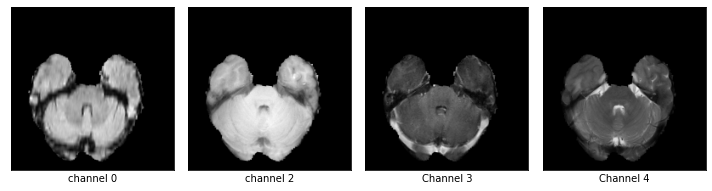

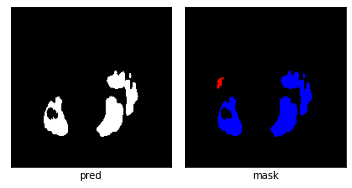

dice_loss : 0.046112259500715534



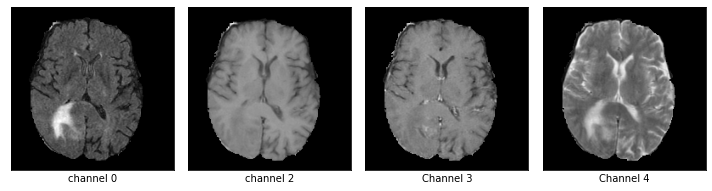

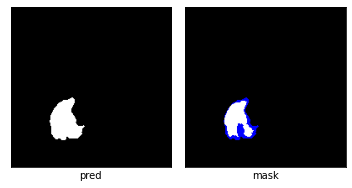

03/06 08:21:55 PM epoch 14 lr 1.947582e-02
03/06 08:21:55 PM genotype = Genotype(normal=[('dil_conv_3x3', 1), ('dil_conv_5x5', 0), ('sep_conv_3x3', 2), ('skip_connect', 0), ('dil_conv_3x3', 3), ('dil_conv_3x3', 2), ('sep_conv_3x3', 3), ('sep_conv_5x5', 2)], normal_concat=range(2, 6), reduce=[('dil_conv_5x5', 1), ('sep_conv_5x5', 0), ('dil_conv_5x5', 2), ('dil_conv_5x5', 1), ('sep_conv_5x5', 3), ('sep_conv_3x3', 0), ('max_pool_3x3', 4), ('max_pool_3x3', 3)], reduce_concat=range(2, 6))


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:509: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/2355 [00:00<?, ?it/s]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:219: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  0%|          | 1/2355 [00:01<41:30,  1.06s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 2/2355 [00:02<41:18,  1.05s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 3/2355 [00:03<41:26,  1.06s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 4/2355 [00:04<41:33,  1.06s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 5/2355 [00:05<41:11,  1.05s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.5153, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 6/2355 [00:06<41:36,  1.06s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 7/2355 [00:07<41:48,  1.07s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.5512, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 8/2355 [00:08<41:49,  1.07s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 9/2355 [00:09<41:38,  1.07s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 10/2355 [00:10<41:35,  1.06s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  0%|          | 11/2355 [00:11<41:19,  1.06s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 12/2355 [00:12<41:01,  1.05s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.6228, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 13/2355 [00:13<40:59,  1.05s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0759, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 14/2355 [00:14<40:58,  1.05s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 15/2355 [00:15<41:07,  1.05s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0955, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 16/2355 [00:16<40:54,  1.05s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 17/2355 [00:17<40:47,  1.05s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.1574, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 18/2355 [00:18<40:24,  1.04s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 19/2355 [00:20<40:28,  1.04s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.1544, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 20/2355 [00:21<40:39,  1.04s/it, Acc=1, IoU=0, Loss=0.917]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 21/2355 [00:22<40:31,  1.04s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.7647, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 22/2355 [00:23<40:25,  1.04s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.1254, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 23/2355 [00:24<40:41,  1.05s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 24/2355 [00:25<40:16,  1.04s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 25/2355 [00:26<40:09,  1.03s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.0685, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 26/2355 [00:27<40:18,  1.04s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.8243, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 27/2355 [00:28<40:22,  1.04s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.0503, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 28/2355 [00:29<40:20,  1.04s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.9910, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|          | 29/2355 [00:30<40:22,  1.04s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 30/2355 [00:31<40:43,  1.05s/it, Acc=0.996, IoU=0.85, Loss=0.0841]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 31/2355 [00:32<40:47,  1.05s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.0849, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 32/2355 [00:33<40:41,  1.05s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 33/2355 [00:34<40:22,  1.04s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.0936, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 34/2355 [00:35<40:42,  1.05s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.1358, device='cuda:0', grad_fn=<RsubBackward1>)


  1%|▏         | 35/2355 [00:36<40:32,  1.05s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 36/2355 [00:37<40:20,  1.04s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.0513, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 37/2355 [00:38<40:17,  1.04s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 38/2355 [00:39<40:16,  1.04s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.1119, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 39/2355 [00:40<40:25,  1.05s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 40/2355 [00:41<40:40,  1.05s/it, Acc=0.991, IoU=0.815, Loss=0.103]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 41/2355 [00:43<40:36,  1.05s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.4288, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 42/2355 [00:44<40:22,  1.05s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.9412, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 43/2355 [00:45<40:23,  1.05s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 44/2355 [00:46<40:47,  1.06s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.2846, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 45/2355 [00:47<40:47,  1.06s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.0943, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 46/2355 [00:48<40:50,  1.06s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.1211, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 47/2355 [00:49<40:40,  1.06s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.7109, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 48/2355 [00:50<40:30,  1.05s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 49/2355 [00:51<40:39,  1.06s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 50/2355 [00:52<40:37,  1.06s/it, Acc=0.995, IoU=0.877, Loss=0.066]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 51/2355 [00:53<40:33,  1.06s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 52/2355 [00:54<40:22,  1.05s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 53/2355 [00:55<40:14,  1.05s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.9941, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 54/2355 [00:56<40:32,  1.06s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.1631, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 55/2355 [00:57<40:20,  1.05s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.1318, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 56/2355 [00:58<40:21,  1.05s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.1794, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 57/2355 [00:59<40:25,  1.06s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


  2%|▏         | 58/2355 [01:00<40:30,  1.06s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 59/2355 [01:02<40:24,  1.06s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 60/2355 [01:03<40:24,  1.06s/it, Acc=0.998, IoU=0.928, Loss=0.0389]

tensor(0.9752, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 61/2355 [01:04<40:21,  1.06s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.1543, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 62/2355 [01:05<40:14,  1.05s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.1064, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 63/2355 [01:06<40:17,  1.05s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.0042, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 64/2355 [01:07<40:09,  1.05s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.0946, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 65/2355 [01:08<40:26,  1.06s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 66/2355 [01:09<40:20,  1.06s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.1077, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 67/2355 [01:10<40:22,  1.06s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 68/2355 [01:11<40:28,  1.06s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 69/2355 [01:12<40:22,  1.06s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 70/2355 [01:13<40:24,  1.06s/it, Acc=0.996, IoU=0.922, Loss=0.0417]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 71/2355 [01:14<40:25,  1.06s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 72/2355 [01:15<40:19,  1.06s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.1976, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 73/2355 [01:16<40:22,  1.06s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.0021, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 74/2355 [01:17<40:02,  1.05s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 75/2355 [01:18<40:02,  1.05s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.1065, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 76/2355 [01:19<39:50,  1.05s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.0535, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 77/2355 [01:21<39:39,  1.04s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.9212, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 78/2355 [01:22<39:38,  1.04s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 79/2355 [01:23<39:39,  1.05s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 80/2355 [01:24<39:30,  1.04s/it, Acc=1, IoU=0, Loss=0.000231]

tensor(0.9903, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 81/2355 [01:25<39:31,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


  3%|▎         | 82/2355 [01:26<39:25,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 83/2355 [01:27<39:33,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.0611, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 84/2355 [01:28<39:19,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 85/2355 [01:29<39:29,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.1238, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 86/2355 [01:30<39:29,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.6877, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 87/2355 [01:31<39:17,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▎         | 88/2355 [01:32<39:09,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 89/2355 [01:33<39:10,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 90/2355 [01:34<39:21,  1.04s/it, Acc=0.988, IoU=0.657, Loss=0.208]

tensor(0.9843, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 91/2355 [01:35<39:28,  1.05s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.4542, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 92/2355 [01:36<39:32,  1.05s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.3161, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 93/2355 [01:37<39:40,  1.05s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.4522, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 94/2355 [01:38<40:05,  1.06s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.0926, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 95/2355 [01:39<39:39,  1.05s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.0758, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 96/2355 [01:40<39:37,  1.05s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 97/2355 [01:41<39:59,  1.06s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.3144, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 98/2355 [01:43<39:58,  1.06s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 99/2355 [01:44<39:53,  1.06s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 100/2355 [01:45<39:55,  1.06s/it, Acc=0.996, IoU=0.926, Loss=0.0409]

tensor(0.0803, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 101/2355 [01:46<40:11,  1.07s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.6398, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 102/2355 [01:47<40:14,  1.07s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.0283, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 103/2355 [01:48<40:42,  1.08s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 104/2355 [01:49<40:20,  1.08s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


  4%|▍         | 105/2355 [01:50<40:15,  1.07s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.0547, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 106/2355 [01:51<40:09,  1.07s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 107/2355 [01:52<39:58,  1.07s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.3527, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 108/2355 [01:53<39:32,  1.06s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.3582, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 109/2355 [01:54<39:12,  1.05s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 110/2355 [01:55<38:57,  1.04s/it, Acc=0.995, IoU=0.864, Loss=0.0737]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 111/2355 [01:56<39:08,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.1441, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 112/2355 [01:57<39:16,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 113/2355 [01:58<39:11,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.4092, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 114/2355 [01:59<39:19,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.0319, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 115/2355 [02:01<39:07,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 116/2355 [02:02<38:56,  1.04s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▍         | 117/2355 [02:03<38:58,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.3281, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 118/2355 [02:04<39:09,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.2945, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 119/2355 [02:05<39:04,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 120/2355 [02:06<39:08,  1.05s/it, Acc=0.975, IoU=0.0766, Loss=0.857]

tensor(0.0883, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 121/2355 [02:07<39:00,  1.05s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 122/2355 [02:08<38:55,  1.05s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4307, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 123/2355 [02:09<39:13,  1.05s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0486, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 124/2355 [02:10<39:19,  1.06s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.2644, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 125/2355 [02:11<38:46,  1.04s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1531, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 126/2355 [02:12<38:33,  1.04s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.4516, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 127/2355 [02:13<38:30,  1.04s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 128/2355 [02:14<38:25,  1.04s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1576, device='cuda:0', grad_fn=<RsubBackward1>)


  5%|▌         | 129/2355 [02:15<38:49,  1.05s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 130/2355 [02:16<38:31,  1.04s/it, Acc=0.996, IoU=0, Loss=0.993]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 131/2355 [02:17<38:42,  1.04s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 132/2355 [02:18<38:40,  1.04s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.7430, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 133/2355 [02:19<39:10,  1.06s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.1484, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 134/2355 [02:20<38:56,  1.05s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 135/2355 [02:21<38:57,  1.05s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.0612, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 136/2355 [02:22<38:38,  1.04s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.0429, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 137/2355 [02:24<39:00,  1.06s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 138/2355 [02:25<38:46,  1.05s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.7337, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 139/2355 [02:26<38:46,  1.05s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 140/2355 [02:27<38:40,  1.05s/it, Acc=1, IoU=0, Loss=0.000395]

tensor(0.5098, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 141/2355 [02:28<38:45,  1.05s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 142/2355 [02:29<38:37,  1.05s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.1984, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 143/2355 [02:30<38:49,  1.05s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.1411, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 144/2355 [02:31<38:41,  1.05s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.1888, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 145/2355 [02:32<38:15,  1.04s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 146/2355 [02:33<38:16,  1.04s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.5106, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▌         | 147/2355 [02:34<38:17,  1.04s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.4178, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 148/2355 [02:35<38:14,  1.04s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.2068, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 149/2355 [02:36<38:20,  1.04s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.9235, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 150/2355 [02:37<38:44,  1.05s/it, Acc=0.99, IoU=0.816, Loss=0.102]

tensor(0.2089, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 151/2355 [02:38<38:21,  1.04s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.1960, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 152/2355 [02:39<38:14,  1.04s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.1727, device='cuda:0', grad_fn=<RsubBackward1>)


  6%|▋         | 153/2355 [02:40<38:15,  1.04s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 154/2355 [02:41<38:17,  1.04s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.3149, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 155/2355 [02:42<38:23,  1.05s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 156/2355 [02:43<38:38,  1.05s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.0517, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 157/2355 [02:44<38:27,  1.05s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.7900, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 158/2355 [02:46<38:24,  1.05s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.9623, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 159/2355 [02:47<38:22,  1.05s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.0508, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 160/2355 [02:48<38:09,  1.04s/it, Acc=0.986, IoU=0.547, Loss=0.291]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 161/2355 [02:49<37:51,  1.04s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 162/2355 [02:50<38:12,  1.05s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.2340, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 163/2355 [02:51<38:20,  1.05s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 164/2355 [02:52<38:14,  1.05s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.0747, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 165/2355 [02:53<37:56,  1.04s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 166/2355 [02:54<37:45,  1.04s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 167/2355 [02:55<37:43,  1.03s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 168/2355 [02:56<37:32,  1.03s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 169/2355 [02:57<37:23,  1.03s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.7514, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 170/2355 [02:58<37:30,  1.03s/it, Acc=0.993, IoU=0.908, Loss=0.0491]

tensor(0.0049, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 171/2355 [02:59<37:18,  1.02s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 172/2355 [03:00<37:28,  1.03s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.9838, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 173/2355 [03:01<37:33,  1.03s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.0841, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 174/2355 [03:02<37:34,  1.03s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.9266, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 175/2355 [03:03<37:36,  1.04s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


  7%|▋         | 176/2355 [03:04<37:34,  1.03s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 177/2355 [03:05<37:26,  1.03s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.5276, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 178/2355 [03:06<37:46,  1.04s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.2143, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 179/2355 [03:07<37:55,  1.05s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 180/2355 [03:08<37:45,  1.04s/it, Acc=0.987, IoU=0.321, Loss=0.513]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 181/2355 [03:09<37:47,  1.04s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.6037, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 182/2355 [03:10<37:44,  1.04s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 183/2355 [03:11<37:47,  1.04s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.1480, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 184/2355 [03:13<37:41,  1.04s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 185/2355 [03:14<37:58,  1.05s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.1096, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 186/2355 [03:15<37:34,  1.04s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.0875, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 187/2355 [03:16<37:01,  1.02s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.1376, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 188/2355 [03:17<37:05,  1.03s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.1248, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 189/2355 [03:18<37:02,  1.03s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.6973, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 190/2355 [03:19<37:05,  1.03s/it, Acc=0.994, IoU=0.916, Loss=0.0444]

tensor(0.2281, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 191/2355 [03:20<37:16,  1.03s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.9869, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 192/2355 [03:21<37:23,  1.04s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 193/2355 [03:22<37:33,  1.04s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 194/2355 [03:23<37:48,  1.05s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 195/2355 [03:24<37:46,  1.05s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.3692, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 196/2355 [03:25<37:52,  1.05s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.9917, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 197/2355 [03:26<37:48,  1.05s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.5080, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 198/2355 [03:27<37:41,  1.05s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.1092, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 199/2355 [03:28<37:20,  1.04s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.8545, device='cuda:0', grad_fn=<RsubBackward1>)


  8%|▊         | 200/2355 [03:29<37:17,  1.04s/it, Acc=0.985, IoU=0.697, Loss=0.18]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 201/2355 [03:30<37:27,  1.04s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.4642, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 202/2355 [03:31<37:17,  1.04s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 203/2355 [03:32<37:14,  1.04s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.0770, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 204/2355 [03:33<37:36,  1.05s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 205/2355 [03:34<37:34,  1.05s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.4408, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▊         | 206/2355 [03:35<37:38,  1.05s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 207/2355 [03:36<37:21,  1.04s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.0574, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 208/2355 [03:38<37:20,  1.04s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 209/2355 [03:39<37:19,  1.04s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.2339, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 210/2355 [03:40<37:22,  1.05s/it, Acc=0.991, IoU=0.834, Loss=0.0928]

tensor(0.0868, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 211/2355 [03:41<37:10,  1.04s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.5122, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 212/2355 [03:42<36:51,  1.03s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.1933, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 213/2355 [03:43<36:48,  1.03s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.2794, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 214/2355 [03:44<36:57,  1.04s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.6062, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 215/2355 [03:45<37:15,  1.04s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 216/2355 [03:46<37:26,  1.05s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 217/2355 [03:47<37:23,  1.05s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.6429, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 218/2355 [03:48<37:19,  1.05s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.1736, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 219/2355 [03:49<37:04,  1.04s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 220/2355 [03:50<37:05,  1.04s/it, Acc=0.992, IoU=0.853, Loss=0.0791]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 221/2355 [03:51<37:01,  1.04s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.2461, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 222/2355 [03:52<37:07,  1.04s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.0337, device='cuda:0', grad_fn=<RsubBackward1>)


  9%|▉         | 223/2355 [03:53<37:10,  1.05s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 224/2355 [03:54<37:17,  1.05s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 225/2355 [03:55<37:20,  1.05s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 226/2355 [03:56<37:18,  1.05s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 227/2355 [03:57<37:07,  1.05s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.9916, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 228/2355 [03:58<36:41,  1.03s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.6068, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 229/2355 [03:59<36:40,  1.04s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 230/2355 [04:00<36:41,  1.04s/it, Acc=1, IoU=0, Loss=0.000422]

tensor(0.9648, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 231/2355 [04:02<37:05,  1.05s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.0898, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 232/2355 [04:03<37:02,  1.05s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 233/2355 [04:04<37:12,  1.05s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.2445, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 234/2355 [04:05<37:08,  1.05s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.0270, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|▉         | 235/2355 [04:06<37:16,  1.06s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.0665, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 236/2355 [04:07<37:00,  1.05s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.1574, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 237/2355 [04:08<36:49,  1.04s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.1013, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 238/2355 [04:09<36:41,  1.04s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 239/2355 [04:10<36:45,  1.04s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.3607, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 240/2355 [04:11<36:29,  1.04s/it, Acc=0.993, IoU=0.87, Loss=0.0694]

tensor(0.3881, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 241/2355 [04:12<35:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 242/2355 [04:13<36:15,  1.03s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.9488, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 243/2355 [04:14<36:32,  1.04s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.0260, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 244/2355 [04:15<36:44,  1.04s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.0698, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 245/2355 [04:16<36:28,  1.04s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 246/2355 [04:17<36:24,  1.04s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.0603, device='cuda:0', grad_fn=<RsubBackward1>)


 10%|█         | 247/2355 [04:18<36:20,  1.03s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.4489, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 248/2355 [04:19<36:39,  1.04s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 249/2355 [04:20<36:58,  1.05s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.9693, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 250/2355 [04:21<37:05,  1.06s/it, Acc=1, IoU=0, Loss=0.000331]

tensor(0.0942, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 251/2355 [04:22<37:03,  1.06s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 252/2355 [04:23<36:46,  1.05s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 253/2355 [04:24<36:41,  1.05s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 254/2355 [04:26<36:44,  1.05s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 255/2355 [04:27<36:50,  1.05s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.2996, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 256/2355 [04:28<36:48,  1.05s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 257/2355 [04:29<36:48,  1.05s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.0678, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 258/2355 [04:30<36:48,  1.05s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.9454, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 259/2355 [04:31<36:50,  1.05s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 260/2355 [04:32<37:07,  1.06s/it, Acc=0.99, IoU=0.829, Loss=0.0934]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 261/2355 [04:33<37:01,  1.06s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 262/2355 [04:34<36:57,  1.06s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.4842, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 263/2355 [04:35<36:57,  1.06s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.1847, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█         | 264/2355 [04:36<37:05,  1.06s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.9348, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 265/2355 [04:37<36:54,  1.06s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 266/2355 [04:38<36:37,  1.05s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 267/2355 [04:39<36:34,  1.05s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 268/2355 [04:40<36:42,  1.06s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 269/2355 [04:41<36:24,  1.05s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 11%|█▏        | 270/2355 [04:42<36:17,  1.04s/it, Acc=0.99, IoU=0.579, Loss=0.266]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 271/2355 [04:43<36:27,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 272/2355 [04:44<36:16,  1.04s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 273/2355 [04:46<36:02,  1.04s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1293, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 274/2355 [04:47<36:22,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0040, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 275/2355 [04:48<36:36,  1.06s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0844, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 276/2355 [04:49<36:39,  1.06s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 277/2355 [04:50<36:47,  1.06s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 278/2355 [04:51<36:42,  1.06s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.6668, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 279/2355 [04:52<36:18,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.1061, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 280/2355 [04:53<36:08,  1.05s/it, Acc=0.991, IoU=0, Loss=0.997]

tensor(0.0028, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 281/2355 [04:54<36:04,  1.04s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.1897, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 282/2355 [04:55<35:56,  1.04s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.2401, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 283/2355 [04:56<35:44,  1.03s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.1832, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 284/2355 [04:57<36:03,  1.04s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.2091, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 285/2355 [04:58<36:06,  1.05s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 286/2355 [04:59<36:13,  1.05s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.0539, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 287/2355 [05:00<36:26,  1.06s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 288/2355 [05:01<36:38,  1.06s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.2325, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 289/2355 [05:02<36:28,  1.06s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.2320, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 290/2355 [05:03<36:13,  1.05s/it, Acc=1, IoU=0, Loss=0.00345]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 291/2355 [05:04<36:08,  1.05s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 292/2355 [05:06<36:16,  1.05s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.0776, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 293/2355 [05:07<36:16,  1.06s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.3572, device='cuda:0', grad_fn=<RsubBackward1>)


 12%|█▏        | 294/2355 [05:08<36:15,  1.06s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 295/2355 [05:09<36:06,  1.05s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 296/2355 [05:10<36:25,  1.06s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.1038, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 297/2355 [05:11<36:10,  1.05s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.2000, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 298/2355 [05:12<36:06,  1.05s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.5433, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 299/2355 [05:13<35:55,  1.05s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 300/2355 [05:14<35:42,  1.04s/it, Acc=0.991, IoU=0.825, Loss=0.0973]

tensor(0.3462, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 301/2355 [05:15<35:41,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.3319, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 302/2355 [05:16<35:26,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 303/2355 [05:17<35:37,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.1023, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 304/2355 [05:18<35:42,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 305/2355 [05:19<35:26,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.9500, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 306/2355 [05:20<35:24,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 307/2355 [05:21<35:18,  1.03s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.3188, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 308/2355 [05:22<35:22,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 309/2355 [05:23<35:28,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 310/2355 [05:24<35:22,  1.04s/it, Acc=1, IoU=0, Loss=0.00243]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 311/2355 [05:25<35:23,  1.04s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 312/2355 [05:26<35:19,  1.04s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.1221, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 313/2355 [05:27<35:24,  1.04s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 314/2355 [05:28<35:31,  1.04s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.1678, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 315/2355 [05:30<35:33,  1.05s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.0903, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 316/2355 [05:31<35:16,  1.04s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.9204, device='cuda:0', grad_fn=<RsubBackward1>)


 13%|█▎        | 317/2355 [05:32<35:08,  1.03s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.0542, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 318/2355 [05:33<35:20,  1.04s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 319/2355 [05:34<35:24,  1.04s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 320/2355 [05:35<35:22,  1.04s/it, Acc=0.994, IoU=0.862, Loss=0.0737]

tensor(0.2164, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 321/2355 [05:36<35:21,  1.04s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.0983, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 322/2355 [05:37<35:28,  1.05s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.0410, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▎        | 323/2355 [05:38<35:19,  1.04s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.4381, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 324/2355 [05:39<35:22,  1.04s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.0795, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 325/2355 [05:40<35:37,  1.05s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 326/2355 [05:41<35:53,  1.06s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.3769, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 327/2355 [05:42<35:53,  1.06s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 328/2355 [05:43<35:38,  1.06s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.1120, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 329/2355 [05:44<35:28,  1.05s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 330/2355 [05:45<35:10,  1.04s/it, Acc=0.998, IoU=0.706, Loss=0.174]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 331/2355 [05:46<35:18,  1.05s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.6974, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 332/2355 [05:47<34:55,  1.04s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.0834, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 333/2355 [05:48<34:48,  1.03s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.0189, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 334/2355 [05:49<34:52,  1.04s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.6969, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 335/2355 [05:50<35:24,  1.05s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 336/2355 [05:51<35:22,  1.05s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 337/2355 [05:53<35:16,  1.05s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.0873, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 338/2355 [05:54<35:11,  1.05s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 339/2355 [05:55<35:15,  1.05s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.3067, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 340/2355 [05:56<35:21,  1.05s/it, Acc=1, IoU=0, Loss=0.00035]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 14%|█▍        | 341/2355 [05:57<35:15,  1.05s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.1468, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 342/2355 [05:58<35:14,  1.05s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.0735, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 343/2355 [05:59<34:54,  1.04s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.1390, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 344/2355 [06:00<35:01,  1.04s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.1100, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 345/2355 [06:01<35:05,  1.05s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.0896, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 346/2355 [06:02<35:10,  1.05s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.9888, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 347/2355 [06:03<34:48,  1.04s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 348/2355 [06:04<34:25,  1.03s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 349/2355 [06:05<34:42,  1.04s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.2663, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 350/2355 [06:06<34:30,  1.03s/it, Acc=0.995, IoU=0.812, Loss=0.105]

tensor(0.1741, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 351/2355 [06:07<34:25,  1.03s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.3066, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 352/2355 [06:08<34:42,  1.04s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.0411, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▍        | 353/2355 [06:09<34:42,  1.04s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.1015, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 354/2355 [06:10<34:46,  1.04s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.6316, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 355/2355 [06:11<35:18,  1.06s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.2354, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 356/2355 [06:12<35:06,  1.05s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 357/2355 [06:13<34:51,  1.05s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 358/2355 [06:14<34:37,  1.04s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 359/2355 [06:15<34:29,  1.04s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.0388, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 360/2355 [06:17<34:32,  1.04s/it, Acc=0.994, IoU=0.923, Loss=0.0403]

tensor(0.0997, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 361/2355 [06:18<34:29,  1.04s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.0085, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 362/2355 [06:19<34:23,  1.04s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.0446, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 363/2355 [06:20<34:10,  1.03s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 364/2355 [06:21<34:20,  1.04s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.6955, device='cuda:0', grad_fn=<RsubBackward1>)


 15%|█▌        | 365/2355 [06:22<34:29,  1.04s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.0785, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 366/2355 [06:23<34:13,  1.03s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 367/2355 [06:24<34:31,  1.04s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 368/2355 [06:25<34:26,  1.04s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.4791, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 369/2355 [06:26<34:25,  1.04s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.8751, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 370/2355 [06:27<34:33,  1.04s/it, Acc=0.997, IoU=0.736, Loss=0.152]

tensor(0.2852, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 371/2355 [06:28<34:42,  1.05s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.8441, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 372/2355 [06:29<34:22,  1.04s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.2825, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 373/2355 [06:30<34:26,  1.04s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.4254, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 374/2355 [06:31<34:35,  1.05s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 375/2355 [06:32<34:43,  1.05s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 376/2355 [06:33<34:15,  1.04s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.4500, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 377/2355 [06:34<33:58,  1.03s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.1334, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 378/2355 [06:35<33:52,  1.03s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 379/2355 [06:36<33:57,  1.03s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.1131, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 380/2355 [06:37<34:05,  1.04s/it, Acc=0.995, IoU=0.697, Loss=0.179]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 381/2355 [06:38<34:01,  1.03s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▌        | 382/2355 [06:39<34:05,  1.04s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9615, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 383/2355 [06:40<33:51,  1.03s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1147, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 384/2355 [06:41<33:49,  1.03s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 385/2355 [06:42<33:35,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1039, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 386/2355 [06:43<33:29,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9956, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 387/2355 [06:44<33:34,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.0906, device='cuda:0', grad_fn=<RsubBackward1>)


 16%|█▋        | 388/2355 [06:45<33:15,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.1368, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 389/2355 [06:46<33:16,  1.02s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 390/2355 [06:47<33:13,  1.01s/it, Acc=0.981, IoU=0, Loss=0.999]

tensor(0.5447, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 391/2355 [06:49<33:49,  1.03s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.5596, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 392/2355 [06:50<33:50,  1.03s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 393/2355 [06:51<33:36,  1.03s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.3927, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 394/2355 [06:52<33:24,  1.02s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 395/2355 [06:53<33:27,  1.02s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.4840, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 396/2355 [06:54<33:13,  1.02s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.1052, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 397/2355 [06:55<33:18,  1.02s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.0753, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 398/2355 [06:56<33:25,  1.02s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 399/2355 [06:57<33:29,  1.03s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 400/2355 [06:58<33:20,  1.02s/it, Acc=0.994, IoU=0.731, Loss=0.155]

tensor(0.1197, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 401/2355 [06:59<33:20,  1.02s/it, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.1641, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 402/2355 [07:00<33:22,  1.03s/it, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.1069, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 403/2355 [07:01<33:10,  1.02s/it, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.9960, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 404/2355 [07:02<33:18,  1.02s/it, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.1203, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 405/2355 [07:03<33:03,  1.02s/it, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.1695, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 406/2355 [07:04<33:00,  1.02s/it, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.4754, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 407/2355 [07:05<32:51,  1.01s/it, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 408/2355 [07:06<32:40,  1.01s/it, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 409/2355 [07:07<32:25,  1.00it/s, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.1256, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 410/2355 [07:08<32:20,  1.00it/s, Acc=0.993, IoU=0.337, Loss=0.502]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 411/2355 [07:09<32:28,  1.00s/it, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.1054, device='cuda:0', grad_fn=<RsubBackward1>)


 17%|█▋        | 412/2355 [07:10<32:14,  1.00it/s, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.6603, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 413/2355 [07:11<32:14,  1.00it/s, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.1488, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 414/2355 [07:12<32:17,  1.00it/s, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 415/2355 [07:13<32:18,  1.00it/s, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 416/2355 [07:14<32:31,  1.01s/it, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.0025, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 417/2355 [07:15<32:26,  1.00s/it, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.1455, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 418/2355 [07:16<32:34,  1.01s/it, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 419/2355 [07:17<32:24,  1.00s/it, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.1123, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 420/2355 [07:18<32:32,  1.01s/it, Acc=0.99, IoU=0.518, Loss=0.319]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 421/2355 [07:19<32:20,  1.00s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.0941, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 422/2355 [07:20<32:39,  1.01s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.5564, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 423/2355 [07:21<32:33,  1.01s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.0569, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 424/2355 [07:22<32:41,  1.02s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.1240, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 425/2355 [07:23<32:35,  1.01s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 426/2355 [07:24<32:21,  1.01s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.3742, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 427/2355 [07:25<32:08,  1.00s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.7135, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 428/2355 [07:26<32:11,  1.00s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.3463, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 429/2355 [07:27<32:21,  1.01s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 430/2355 [07:28<32:11,  1.00s/it, Acc=0.992, IoU=0.669, Loss=0.199]

tensor(0.0773, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 431/2355 [07:29<31:55,  1.00it/s, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.9918, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 432/2355 [07:30<32:10,  1.00s/it, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.7359, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 433/2355 [07:31<32:16,  1.01s/it, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 434/2355 [07:32<32:29,  1.01s/it, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 18%|█▊        | 435/2355 [07:33<32:14,  1.01s/it, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 436/2355 [07:34<31:56,  1.00it/s, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.7274, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 437/2355 [07:35<32:07,  1.01s/it, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.0492, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 438/2355 [07:36<32:28,  1.02s/it, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.7770, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 439/2355 [07:37<32:24,  1.01s/it, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.3119, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 440/2355 [07:38<32:21,  1.01s/it, Acc=0.997, IoU=0.909, Loss=0.0484]

tensor(0.1513, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▊        | 441/2355 [07:39<32:17,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 442/2355 [07:40<32:28,  1.02s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.9915, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 443/2355 [07:41<32:09,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 444/2355 [07:42<32:06,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.3133, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 445/2355 [07:43<31:55,  1.00s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.1021, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 446/2355 [07:44<32:02,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 447/2355 [07:45<32:07,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 448/2355 [07:46<32:12,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.2286, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 449/2355 [07:47<32:13,  1.01s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.3080, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 450/2355 [07:48<32:15,  1.02s/it, Acc=0.996, IoU=0.956, Loss=0.024]

tensor(0.0969, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 451/2355 [07:49<32:13,  1.02s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 452/2355 [07:50<32:21,  1.02s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.1350, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 453/2355 [07:51<32:15,  1.02s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 454/2355 [07:52<32:13,  1.02s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 455/2355 [07:53<32:13,  1.02s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 456/2355 [07:54<32:09,  1.02s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.0595, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 457/2355 [07:55<32:05,  1.01s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.3219, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 458/2355 [07:56<32:14,  1.02s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.1224, device='cuda:0', grad_fn=<RsubBackward1>)


 19%|█▉        | 459/2355 [07:57<32:13,  1.02s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 460/2355 [07:58<32:23,  1.03s/it, Acc=0.994, IoU=0.898, Loss=0.0535]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 461/2355 [07:59<32:15,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.0930, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 462/2355 [08:00<32:11,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.2080, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 463/2355 [08:01<32:04,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 464/2355 [08:02<32:10,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 465/2355 [08:03<31:58,  1.02s/it, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.3097, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 466/2355 [08:04<31:41,  1.01s/it, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.7000, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 467/2355 [08:05<31:37,  1.01s/it, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 468/2355 [08:06<31:17,  1.01it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.5016, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 469/2355 [08:07<31:24,  1.00it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.1067, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|█▉        | 470/2355 [08:08<31:21,  1.00it/s, Acc=0.99, IoU=0.828, Loss=0.0938]

tensor(0.3110, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 471/2355 [08:09<31:16,  1.00it/s, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 472/2355 [08:10<31:31,  1.00s/it, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 473/2355 [08:11<31:40,  1.01s/it, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.9964, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 474/2355 [08:12<31:33,  1.01s/it, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.0343, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 475/2355 [08:13<31:29,  1.00s/it, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 476/2355 [08:14<31:17,  1.00it/s, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 477/2355 [08:15<31:17,  1.00it/s, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.0504, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 478/2355 [08:16<31:14,  1.00it/s, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.1664, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 479/2355 [08:17<31:25,  1.01s/it, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 480/2355 [08:18<31:32,  1.01s/it, Acc=0.994, IoU=0.692, Loss=0.182]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 481/2355 [08:20<32:23,  1.04s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 20%|██        | 482/2355 [08:21<32:00,  1.03s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.0823, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 483/2355 [08:22<31:33,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 484/2355 [08:23<31:20,  1.00s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 485/2355 [08:24<31:25,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 486/2355 [08:25<31:29,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.0690, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 487/2355 [08:26<31:26,  1.01s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.1217, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 488/2355 [08:27<31:09,  1.00s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 489/2355 [08:28<31:04,  1.00it/s, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.1392, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 490/2355 [08:29<31:06,  1.00s/it, Acc=0.991, IoU=0.844, Loss=0.086]

tensor(0.0550, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 491/2355 [08:30<31:04,  1.00s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 492/2355 [08:31<31:17,  1.01s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.0953, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 493/2355 [08:32<30:59,  1.00it/s, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.1928, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 494/2355 [08:33<31:04,  1.00s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.3444, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 495/2355 [08:34<31:46,  1.02s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.9905, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 496/2355 [08:35<31:50,  1.03s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.1284, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 497/2355 [08:36<31:42,  1.02s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.0450, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 498/2355 [08:37<31:29,  1.02s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 499/2355 [08:38<31:24,  1.02s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.1420, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██        | 500/2355 [08:39<31:37,  1.02s/it, Acc=0.996, IoU=0.796, Loss=0.114]

tensor(0.0880, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 501/2355 [08:40<31:27,  1.02s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.1752, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 502/2355 [08:41<31:35,  1.02s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.0530, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 503/2355 [08:42<31:30,  1.02s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 504/2355 [08:43<31:26,  1.02s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.1473, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 505/2355 [08:44<31:30,  1.02s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.9500, device='cuda:0', grad_fn=<RsubBackward1>)


 21%|██▏       | 506/2355 [08:45<31:24,  1.02s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.1260, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 507/2355 [08:46<31:20,  1.02s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.1008, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 508/2355 [08:47<31:09,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.0434, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 509/2355 [08:48<31:09,  1.01s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.3134, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 510/2355 [08:49<31:14,  1.02s/it, Acc=0.994, IoU=0.901, Loss=0.0527]

tensor(0.0774, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 511/2355 [08:50<31:32,  1.03s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.1135, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 512/2355 [08:51<31:35,  1.03s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 513/2355 [08:52<31:38,  1.03s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.0833, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 514/2355 [08:53<31:44,  1.03s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 515/2355 [08:54<31:27,  1.03s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.3624, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 516/2355 [08:55<31:16,  1.02s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.9930, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 517/2355 [08:56<31:33,  1.03s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.0828, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 518/2355 [08:57<31:21,  1.02s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 519/2355 [08:58<31:17,  1.02s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 520/2355 [08:59<31:13,  1.02s/it, Acc=0.996, IoU=0.665, Loss=0.198]

tensor(0.2033, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 521/2355 [09:00<31:28,  1.03s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 522/2355 [09:01<31:30,  1.03s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 523/2355 [09:02<31:10,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9971, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 524/2355 [09:03<31:14,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1002, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 525/2355 [09:04<31:17,  1.03s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 526/2355 [09:05<31:17,  1.03s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9804, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 527/2355 [09:06<31:08,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.1548, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 528/2355 [09:07<31:03,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 22%|██▏       | 529/2355 [09:08<31:08,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 530/2355 [09:09<31:09,  1.02s/it, Acc=0.998, IoU=0, Loss=0.988]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 531/2355 [09:10<30:52,  1.02s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.1277, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 532/2355 [09:11<30:55,  1.02s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.2348, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 533/2355 [09:12<30:58,  1.02s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.0600, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 534/2355 [09:14<30:54,  1.02s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.0948, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 535/2355 [09:15<30:41,  1.01s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.9923, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 536/2355 [09:16<30:40,  1.01s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.1072, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 537/2355 [09:17<30:41,  1.01s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.1297, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 538/2355 [09:18<30:27,  1.01s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 539/2355 [09:19<30:30,  1.01s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 540/2355 [09:20<30:39,  1.01s/it, Acc=0.999, IoU=0.806, Loss=0.107]

tensor(0.0991, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 541/2355 [09:21<30:44,  1.02s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 542/2355 [09:22<30:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.1737, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 543/2355 [09:23<30:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.0725, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 544/2355 [09:24<30:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.4209, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 545/2355 [09:25<30:56,  1.03s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.9908, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 546/2355 [09:26<31:04,  1.03s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.2337, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 547/2355 [09:27<30:57,  1.03s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.2283, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 548/2355 [09:28<30:44,  1.02s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 549/2355 [09:29<30:34,  1.02s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 550/2355 [09:30<30:36,  1.02s/it, Acc=1, IoU=0, Loss=0.000332]

tensor(0.3632, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 551/2355 [09:31<30:31,  1.02s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.9907, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 552/2355 [09:32<30:53,  1.03s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 23%|██▎       | 553/2355 [09:33<31:01,  1.03s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 554/2355 [09:34<31:00,  1.03s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 555/2355 [09:35<31:06,  1.04s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.2307, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 556/2355 [09:36<31:02,  1.04s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.0622, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 557/2355 [09:37<31:07,  1.04s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 558/2355 [09:38<30:50,  1.03s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.0756, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▎       | 559/2355 [09:39<30:41,  1.03s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 560/2355 [09:40<30:31,  1.02s/it, Acc=0.995, IoU=0.854, Loss=0.0776]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 561/2355 [09:41<30:41,  1.03s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.1288, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 562/2355 [09:42<30:44,  1.03s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.2202, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 563/2355 [09:43<30:39,  1.03s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.4935, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 564/2355 [09:44<30:34,  1.02s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 565/2355 [09:45<30:26,  1.02s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.3944, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 566/2355 [09:46<30:23,  1.02s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.0275, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 567/2355 [09:47<30:29,  1.02s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.0802, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 568/2355 [09:48<30:24,  1.02s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 569/2355 [09:49<30:19,  1.02s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.3584, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 570/2355 [09:50<29:55,  1.01s/it, Acc=0.993, IoU=0.928, Loss=0.0377]

tensor(0.9845, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 571/2355 [09:51<30:06,  1.01s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.5518, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 572/2355 [09:52<30:19,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.5664, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 573/2355 [09:53<30:22,  1.02s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 574/2355 [09:54<30:30,  1.03s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 575/2355 [09:55<30:40,  1.03s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 24%|██▍       | 576/2355 [09:57<30:51,  1.04s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 577/2355 [09:58<30:43,  1.04s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 578/2355 [09:59<30:40,  1.04s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 579/2355 [10:00<30:40,  1.04s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 580/2355 [10:01<30:36,  1.03s/it, Acc=0.997, IoU=0, Loss=0.99]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 581/2355 [10:02<30:25,  1.03s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 582/2355 [10:03<30:20,  1.03s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.0498, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 583/2355 [10:04<30:15,  1.02s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.0962, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 584/2355 [10:05<30:11,  1.02s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 585/2355 [10:06<30:06,  1.02s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.0973, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 586/2355 [10:07<30:12,  1.02s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 587/2355 [10:08<30:17,  1.03s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.1060, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▍       | 588/2355 [10:09<30:12,  1.03s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.5723, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 589/2355 [10:10<30:18,  1.03s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.1070, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 590/2355 [10:11<30:18,  1.03s/it, Acc=0.998, IoU=0.465, Loss=0.361]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 591/2355 [10:12<30:18,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.1577, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 592/2355 [10:13<30:23,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 593/2355 [10:14<30:25,  1.04s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.3970, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 594/2355 [10:15<30:16,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.9925, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 595/2355 [10:16<30:16,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 596/2355 [10:17<30:10,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 597/2355 [10:18<30:12,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.4282, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 598/2355 [10:19<30:20,  1.04s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.1839, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 599/2355 [10:20<30:05,  1.03s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 25%|██▌       | 600/2355 [10:21<29:51,  1.02s/it, Acc=0.99, IoU=0.882, Loss=0.0638]

tensor(0.9805, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 601/2355 [10:22<29:49,  1.02s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.2274, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 602/2355 [10:23<29:57,  1.03s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.0701, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 603/2355 [10:24<29:48,  1.02s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 604/2355 [10:25<29:53,  1.02s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.0614, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 605/2355 [10:26<30:05,  1.03s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 606/2355 [10:27<30:00,  1.03s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.4275, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 607/2355 [10:28<29:59,  1.03s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 608/2355 [10:29<29:56,  1.03s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 609/2355 [10:30<29:55,  1.03s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 610/2355 [10:31<30:07,  1.04s/it, Acc=0.995, IoU=0.67, Loss=0.194]

tensor(0.0878, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 611/2355 [10:33<30:00,  1.03s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 612/2355 [10:34<30:20,  1.04s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.9762, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 613/2355 [10:35<30:12,  1.04s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 614/2355 [10:36<30:12,  1.04s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.1005, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 615/2355 [10:37<30:07,  1.04s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 616/2355 [10:38<30:00,  1.04s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 617/2355 [10:39<30:00,  1.04s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.3017, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▌       | 618/2355 [10:40<29:47,  1.03s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.9813, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 619/2355 [10:41<29:33,  1.02s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.5573, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 620/2355 [10:42<29:18,  1.01s/it, Acc=0.994, IoU=0.928, Loss=0.0392]

tensor(0.3077, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 621/2355 [10:43<29:13,  1.01s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.0694, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 622/2355 [10:44<29:25,  1.02s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.1127, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 623/2355 [10:45<29:20,  1.02s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 26%|██▋       | 624/2355 [10:46<29:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.3976, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 625/2355 [10:47<29:14,  1.01s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.3214, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 626/2355 [10:48<29:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 627/2355 [10:49<29:16,  1.02s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 628/2355 [10:50<29:20,  1.02s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.0974, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 629/2355 [10:51<29:02,  1.01s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 630/2355 [10:52<28:56,  1.01s/it, Acc=1, IoU=0, Loss=0.00044]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 631/2355 [10:53<29:18,  1.02s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.3158, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 632/2355 [10:54<29:38,  1.03s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 633/2355 [10:55<29:19,  1.02s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.1543, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 634/2355 [10:56<29:46,  1.04s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.1068, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 635/2355 [10:57<29:56,  1.04s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.5136, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 636/2355 [10:58<30:00,  1.05s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 637/2355 [10:59<29:35,  1.03s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.2175, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 638/2355 [11:00<29:24,  1.03s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.5062, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 639/2355 [11:01<29:16,  1.02s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.0691, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 640/2355 [11:02<28:59,  1.01s/it, Acc=0.975, IoU=0.646, Loss=0.216]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 641/2355 [11:03<28:59,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1301, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 642/2355 [11:04<29:00,  1.02s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.3480, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 643/2355 [11:05<28:48,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 644/2355 [11:06<28:52,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 645/2355 [11:07<28:54,  1.01s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 646/2355 [11:08<28:55,  1.02s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.1809, device='cuda:0', grad_fn=<RsubBackward1>)


 27%|██▋       | 647/2355 [11:09<29:07,  1.02s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 648/2355 [11:10<29:05,  1.02s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.4243, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 649/2355 [11:11<29:08,  1.02s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 650/2355 [11:12<29:01,  1.02s/it, Acc=0.953, IoU=0, Loss=0.999]

tensor(0.4877, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 651/2355 [11:13<29:10,  1.03s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 652/2355 [11:14<29:13,  1.03s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.0613, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 653/2355 [11:15<29:00,  1.02s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 654/2355 [11:17<29:01,  1.02s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.0674, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 655/2355 [11:18<29:04,  1.03s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.0469, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 656/2355 [11:19<29:07,  1.03s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.3346, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 657/2355 [11:20<29:05,  1.03s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.4563, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 658/2355 [11:21<28:54,  1.02s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 659/2355 [11:22<29:07,  1.03s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.2937, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 660/2355 [11:23<29:02,  1.03s/it, Acc=0.995, IoU=0.856, Loss=0.0778]

tensor(0.0800, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 661/2355 [11:24<29:00,  1.03s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 662/2355 [11:25<29:03,  1.03s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 663/2355 [11:26<28:46,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.0552, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 664/2355 [11:27<28:48,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.3066, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 665/2355 [11:28<28:48,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 666/2355 [11:29<28:59,  1.03s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.0330, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 667/2355 [11:30<28:47,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 668/2355 [11:31<28:51,  1.03s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 669/2355 [11:32<28:53,  1.03s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 670/2355 [11:33<28:56,  1.03s/it, Acc=0.996, IoU=0.929, Loss=0.0369]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 28%|██▊       | 671/2355 [11:34<29:02,  1.03s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 672/2355 [11:35<29:13,  1.04s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.1302, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 673/2355 [11:36<28:59,  1.03s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.3148, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 674/2355 [11:37<28:49,  1.03s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.0599, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 675/2355 [11:38<28:49,  1.03s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.0668, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 676/2355 [11:39<29:00,  1.04s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▊       | 677/2355 [11:40<28:45,  1.03s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 678/2355 [11:41<28:37,  1.02s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.9881, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 679/2355 [11:42<28:20,  1.01s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.0456, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 680/2355 [11:43<28:29,  1.02s/it, Acc=0.994, IoU=0.91, Loss=0.047]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 681/2355 [11:44<28:13,  1.01s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.4949, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 682/2355 [11:45<28:17,  1.01s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.1042, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 683/2355 [11:46<28:19,  1.02s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 684/2355 [11:47<28:20,  1.02s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.1356, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 685/2355 [11:48<28:31,  1.03s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.4533, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 686/2355 [11:49<28:29,  1.02s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 687/2355 [11:50<28:44,  1.03s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.5411, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 688/2355 [11:51<28:36,  1.03s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 689/2355 [11:52<28:24,  1.02s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 690/2355 [11:53<28:21,  1.02s/it, Acc=0.986, IoU=0.473, Loss=0.359]

tensor(0.0830, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 691/2355 [11:54<28:21,  1.02s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.1634, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 692/2355 [11:55<28:24,  1.02s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 693/2355 [11:57<28:17,  1.02s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.3914, device='cuda:0', grad_fn=<RsubBackward1>)


 29%|██▉       | 694/2355 [11:58<28:10,  1.02s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.0058, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 695/2355 [11:59<28:01,  1.01s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 696/2355 [12:00<28:31,  1.03s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.3019, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 697/2355 [12:01<28:26,  1.03s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 698/2355 [12:02<28:19,  1.03s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 699/2355 [12:03<28:25,  1.03s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.2546, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 700/2355 [12:04<28:12,  1.02s/it, Acc=0.987, IoU=0.808, Loss=0.107]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 701/2355 [12:05<28:11,  1.02s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1275, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 702/2355 [12:06<28:35,  1.04s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0757, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 703/2355 [12:07<28:24,  1.03s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 704/2355 [12:08<28:27,  1.03s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.8091, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 705/2355 [12:09<28:15,  1.03s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.7917, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|██▉       | 706/2355 [12:10<28:26,  1.03s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 707/2355 [12:11<28:09,  1.03s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.0565, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 708/2355 [12:12<27:46,  1.01s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1884, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 709/2355 [12:13<27:47,  1.01s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.6672, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 710/2355 [12:14<27:38,  1.01s/it, Acc=0.994, IoU=0, Loss=0.996]

tensor(0.1170, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 711/2355 [12:15<27:41,  1.01s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 712/2355 [12:16<27:52,  1.02s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 713/2355 [12:17<27:50,  1.02s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.1352, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 714/2355 [12:18<27:40,  1.01s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 715/2355 [12:19<27:30,  1.01s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.1222, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 716/2355 [12:20<27:41,  1.01s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 717/2355 [12:21<27:56,  1.02s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.5834, device='cuda:0', grad_fn=<RsubBackward1>)


 30%|███       | 718/2355 [12:22<27:58,  1.03s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 719/2355 [12:23<27:54,  1.02s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.5377, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 720/2355 [12:24<27:47,  1.02s/it, Acc=0.992, IoU=0.689, Loss=0.186]

tensor(0.0856, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 721/2355 [12:25<27:44,  1.02s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 722/2355 [12:26<27:34,  1.01s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.1044, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 723/2355 [12:27<27:35,  1.01s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 724/2355 [12:28<27:26,  1.01s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 725/2355 [12:29<27:34,  1.02s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.2091, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 726/2355 [12:30<27:44,  1.02s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.3544, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 727/2355 [12:31<27:39,  1.02s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.0406, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 728/2355 [12:32<27:36,  1.02s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.1266, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 729/2355 [12:33<27:28,  1.01s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.0436, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 730/2355 [12:34<27:32,  1.02s/it, Acc=0.988, IoU=0.809, Loss=0.106]

tensor(0.2063, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 731/2355 [12:35<27:30,  1.02s/it, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.0965, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 732/2355 [12:36<27:44,  1.03s/it, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 733/2355 [12:37<27:31,  1.02s/it, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.9938, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 734/2355 [12:38<27:18,  1.01s/it, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.0772, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███       | 735/2355 [12:39<26:57,  1.00it/s, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 736/2355 [12:40<26:47,  1.01it/s, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 737/2355 [12:41<26:47,  1.01it/s, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 738/2355 [12:42<26:50,  1.00it/s, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.9883, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 739/2355 [12:43<27:09,  1.01s/it, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 740/2355 [12:44<27:13,  1.01s/it, Acc=0.996, IoU=0.941, Loss=0.0321]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 31%|███▏      | 741/2355 [12:45<27:14,  1.01s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 742/2355 [12:46<27:24,  1.02s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 743/2355 [12:47<27:14,  1.01s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.0715, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 744/2355 [12:48<27:10,  1.01s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.1221, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 745/2355 [12:49<27:07,  1.01s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.2652, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 746/2355 [12:50<27:21,  1.02s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.0831, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 747/2355 [12:51<27:26,  1.02s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 748/2355 [12:52<27:18,  1.02s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.1075, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 749/2355 [12:53<27:15,  1.02s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.1329, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 750/2355 [12:54<27:04,  1.01s/it, Acc=1, IoU=0, Loss=0.0003]

tensor(0.0996, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 751/2355 [12:55<27:08,  1.02s/it, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 752/2355 [12:57<27:09,  1.02s/it, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 753/2355 [12:58<27:05,  1.01s/it, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.9827, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 754/2355 [12:59<26:55,  1.01s/it, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 755/2355 [12:59<26:36,  1.00it/s, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.2783, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 756/2355 [13:00<26:31,  1.00it/s, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 757/2355 [13:01<26:31,  1.00it/s, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 758/2355 [13:02<26:38,  1.00s/it, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.1952, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 759/2355 [13:04<26:43,  1.00s/it, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.3492, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 760/2355 [13:05<26:43,  1.01s/it, Acc=0.991, IoU=0.91, Loss=0.0493]

tensor(0.5173, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 761/2355 [13:06<26:41,  1.00s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.0711, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 762/2355 [13:07<27:00,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.0806, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 763/2355 [13:08<27:00,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.5109, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 764/2355 [13:09<26:56,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.5680, device='cuda:0', grad_fn=<RsubBackward1>)


 32%|███▏      | 765/2355 [13:10<26:56,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.0660, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 766/2355 [13:11<26:55,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.0439, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 767/2355 [13:12<26:53,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 768/2355 [13:13<26:58,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.3058, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 769/2355 [13:14<27:01,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 770/2355 [13:15<26:59,  1.02s/it, Acc=0.994, IoU=0.887, Loss=0.0606]

tensor(0.0642, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 771/2355 [13:16<27:14,  1.03s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0651, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 772/2355 [13:17<26:59,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.6468, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 773/2355 [13:18<26:57,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 774/2355 [13:19<27:04,  1.03s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 775/2355 [13:20<26:53,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 776/2355 [13:21<26:46,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 777/2355 [13:22<26:58,  1.03s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 778/2355 [13:23<26:51,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 779/2355 [13:24<26:50,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.5409, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 780/2355 [13:25<26:50,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 781/2355 [13:26<26:41,  1.02s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0821, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 782/2355 [13:27<26:53,  1.03s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.5056, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 783/2355 [13:28<26:45,  1.02s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.9980, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 784/2355 [13:29<26:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 785/2355 [13:30<26:42,  1.02s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 786/2355 [13:31<26:37,  1.02s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 787/2355 [13:32<26:32,  1.02s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.1109, device='cuda:0', grad_fn=<RsubBackward1>)


 33%|███▎      | 788/2355 [13:33<26:29,  1.01s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 789/2355 [13:34<26:25,  1.01s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.3356, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 790/2355 [13:35<26:33,  1.02s/it, Acc=1, IoU=0, Loss=0.00219]

tensor(0.2037, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 791/2355 [13:36<26:37,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.4001, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 792/2355 [13:37<26:36,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 793/2355 [13:38<26:30,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0716, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▎      | 794/2355 [13:39<26:33,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 795/2355 [13:40<26:24,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.9088, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 796/2355 [13:41<26:28,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.4702, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 797/2355 [13:42<26:34,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 798/2355 [13:43<26:39,  1.03s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 799/2355 [13:44<26:30,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 800/2355 [13:45<26:23,  1.02s/it, Acc=0.992, IoU=0.87, Loss=0.0711]

tensor(0.9897, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 801/2355 [13:46<26:20,  1.02s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.9889, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 802/2355 [13:47<26:30,  1.02s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 803/2355 [13:48<26:14,  1.01s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.0737, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 804/2355 [13:49<26:05,  1.01s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 805/2355 [13:50<26:03,  1.01s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.1049, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 806/2355 [13:51<26:00,  1.01s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.1105, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 807/2355 [13:52<26:03,  1.01s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 808/2355 [13:53<26:06,  1.01s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 809/2355 [13:54<25:58,  1.01s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.0419, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 810/2355 [13:55<25:58,  1.01s/it, Acc=0.989, IoU=0.543, Loss=0.299]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 811/2355 [13:56<25:46,  1.00s/it, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 34%|███▍      | 812/2355 [13:57<25:59,  1.01s/it, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 813/2355 [13:58<26:03,  1.01s/it, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 814/2355 [13:59<25:56,  1.01s/it, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 815/2355 [14:00<25:38,  1.00it/s, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 816/2355 [14:01<25:37,  1.00it/s, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 817/2355 [14:02<25:42,  1.00s/it, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.0636, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 818/2355 [14:03<25:39,  1.00s/it, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.9820, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 819/2355 [14:04<25:33,  1.00it/s, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.6180, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 820/2355 [14:05<25:31,  1.00it/s, Acc=0.986, IoU=0.882, Loss=0.0622]

tensor(0.4246, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 821/2355 [14:06<25:38,  1.00s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 822/2355 [14:07<25:49,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.3460, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 823/2355 [14:08<25:43,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.7253, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▍      | 824/2355 [14:09<25:38,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.4118, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 825/2355 [14:11<25:50,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 826/2355 [14:12<25:51,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.2635, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 827/2355 [14:13<25:50,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.0944, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 828/2355 [14:14<25:47,  1.01s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.9777, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 829/2355 [14:15<25:29,  1.00s/it, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 830/2355 [14:16<25:22,  1.00it/s, Acc=0.996, IoU=0.909, Loss=0.0491]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 831/2355 [14:17<25:31,  1.00s/it, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.4110, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 832/2355 [14:18<25:40,  1.01s/it, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.1191, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 833/2355 [14:19<25:31,  1.01s/it, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.2155, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 834/2355 [14:20<25:39,  1.01s/it, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 835/2355 [14:21<25:40,  1.01s/it, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 35%|███▌      | 836/2355 [14:22<25:34,  1.01s/it, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 837/2355 [14:23<25:18,  1.00s/it, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.1226, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 838/2355 [14:24<25:23,  1.00s/it, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 839/2355 [14:25<25:13,  1.00it/s, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.0012, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 840/2355 [14:26<25:11,  1.00it/s, Acc=0.993, IoU=0.679, Loss=0.193]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 841/2355 [14:27<25:23,  1.01s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.0972, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 842/2355 [14:28<25:39,  1.02s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 843/2355 [14:29<25:45,  1.02s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 844/2355 [14:30<25:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.1094, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 845/2355 [14:31<25:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 846/2355 [14:32<25:21,  1.01s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 847/2355 [14:33<25:25,  1.01s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.1068, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 848/2355 [14:34<25:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.0364, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 849/2355 [14:35<25:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 850/2355 [14:36<25:19,  1.01s/it, Acc=1, IoU=0, Loss=0.000704]

tensor(0.0145, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 851/2355 [14:37<25:23,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 852/2355 [14:38<25:25,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.6287, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▌      | 853/2355 [14:39<25:15,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 854/2355 [14:40<25:19,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0020, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 855/2355 [14:41<25:16,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 856/2355 [14:42<25:17,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0502, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 857/2355 [14:43<25:11,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.6269, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 858/2355 [14:44<25:12,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 36%|███▋      | 859/2355 [14:45<25:14,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 860/2355 [14:46<25:06,  1.01s/it, Acc=1, IoU=0, Loss=0.75]

tensor(0.0493, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 861/2355 [14:47<25:03,  1.01s/it, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 862/2355 [14:48<25:11,  1.01s/it, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.0749, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 863/2355 [14:49<24:57,  1.00s/it, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 864/2355 [14:50<24:52,  1.00s/it, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.0580, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 865/2355 [14:51<24:46,  1.00it/s, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.9947, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 866/2355 [14:52<24:54,  1.00s/it, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.0816, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 867/2355 [14:53<24:57,  1.01s/it, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.0904, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 868/2355 [14:54<24:49,  1.00s/it, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.0556, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 869/2355 [14:55<24:51,  1.00s/it, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 870/2355 [14:56<24:37,  1.01it/s, Acc=0.985, IoU=0.676, Loss=0.193]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 871/2355 [14:57<24:29,  1.01it/s, Acc=1, IoU=0, Loss=0.000338]

tensor(0.2284, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 872/2355 [14:58<24:31,  1.01it/s, Acc=1, IoU=0, Loss=0.000338]

tensor(0.2431, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 873/2355 [14:59<24:27,  1.01it/s, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 874/2355 [15:00<24:36,  1.00it/s, Acc=1, IoU=0, Loss=0.000338]

tensor(0.1228, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 875/2355 [15:01<24:45,  1.00s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.4115, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 876/2355 [15:02<24:39,  1.00s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.5293, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 877/2355 [15:03<24:38,  1.00s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 878/2355 [15:04<24:39,  1.00s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.1164, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 879/2355 [15:05<24:52,  1.01s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 880/2355 [15:06<24:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000338]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 881/2355 [15:07<24:42,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 882/2355 [15:08<24:45,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 37%|███▋      | 883/2355 [15:09<24:40,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 884/2355 [15:10<24:39,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 885/2355 [15:11<24:38,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.0415, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 886/2355 [15:12<24:42,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 887/2355 [15:13<24:47,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.0739, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 888/2355 [15:14<24:54,  1.02s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.2685, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 889/2355 [15:15<24:47,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.0566, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 890/2355 [15:16<24:44,  1.01s/it, Acc=0.996, IoU=0.953, Loss=0.0257]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 891/2355 [15:17<24:45,  1.01s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 892/2355 [15:18<24:39,  1.01s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 893/2355 [15:19<24:47,  1.02s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 894/2355 [15:20<24:35,  1.01s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 895/2355 [15:21<24:40,  1.01s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 896/2355 [15:22<24:37,  1.01s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.0923, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 897/2355 [15:23<24:37,  1.01s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.3946, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 898/2355 [15:24<24:22,  1.00s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.0999, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 899/2355 [15:25<24:22,  1.00s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.1000, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 900/2355 [15:26<24:28,  1.01s/it, Acc=0.994, IoU=0.892, Loss=0.0587]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 901/2355 [15:27<24:23,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0631, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 902/2355 [15:28<24:29,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 903/2355 [15:29<24:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 904/2355 [15:30<24:27,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0035, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 905/2355 [15:31<24:31,  1.02s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.1007, device='cuda:0', grad_fn=<RsubBackward1>)


 38%|███▊      | 906/2355 [15:32<24:29,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0734, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 907/2355 [15:33<24:21,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.1414, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 908/2355 [15:34<24:15,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.1213, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 909/2355 [15:35<24:12,  1.00s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0988, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 910/2355 [15:36<24:18,  1.01s/it, Acc=1, IoU=0, Loss=0.00032]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 911/2355 [15:37<24:21,  1.01s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▊      | 912/2355 [15:38<24:34,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0640, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 913/2355 [15:39<24:27,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.2364, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 914/2355 [15:40<24:24,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0592, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 915/2355 [15:41<24:25,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.4287, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 916/2355 [15:42<24:25,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1609, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 917/2355 [15:43<24:25,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.1053, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 918/2355 [15:44<24:26,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 919/2355 [15:45<24:21,  1.02s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 920/2355 [15:46<24:15,  1.01s/it, Acc=0.973, IoU=0, Loss=0.999]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 921/2355 [15:47<24:16,  1.02s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 922/2355 [15:48<24:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.0389, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 923/2355 [15:49<24:19,  1.02s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.9729, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 924/2355 [15:50<24:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.2159, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 925/2355 [15:51<24:16,  1.02s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.2107, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 926/2355 [15:52<24:12,  1.02s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 927/2355 [15:53<24:08,  1.01s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.1095, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 928/2355 [15:55<24:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 929/2355 [15:56<24:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.8268, device='cuda:0', grad_fn=<RsubBackward1>)


 39%|███▉      | 930/2355 [15:57<24:23,  1.03s/it, Acc=1, IoU=0, Loss=0.000533]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 931/2355 [15:58<24:24,  1.03s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.2853, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 932/2355 [15:59<24:26,  1.03s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.0867, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 933/2355 [16:00<23:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.1026, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 934/2355 [16:01<23:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.6612, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 935/2355 [16:02<24:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.0670, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 936/2355 [16:03<24:16,  1.03s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.8609, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 937/2355 [16:04<24:21,  1.03s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.3236, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 938/2355 [16:05<24:13,  1.03s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 939/2355 [16:06<24:09,  1.02s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.1116, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 940/2355 [16:07<24:12,  1.03s/it, Acc=1, IoU=0, Loss=0.000172]

tensor(0.1113, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|███▉      | 941/2355 [16:08<24:15,  1.03s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 942/2355 [16:09<24:22,  1.04s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.0807, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 943/2355 [16:10<24:09,  1.03s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.0001, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 944/2355 [16:11<24:10,  1.03s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 945/2355 [16:12<24:00,  1.02s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.1126, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 946/2355 [16:13<23:51,  1.02s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 947/2355 [16:14<23:34,  1.00s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.1623, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 948/2355 [16:15<23:37,  1.01s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.4143, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 949/2355 [16:16<23:36,  1.01s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.6497, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 950/2355 [16:17<23:39,  1.01s/it, Acc=0.992, IoU=0.74, Loss=0.151]

tensor(0.1780, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 951/2355 [16:18<23:38,  1.01s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.0724, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 952/2355 [16:19<23:44,  1.02s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.1125, device='cuda:0', grad_fn=<RsubBackward1>)


 40%|████      | 953/2355 [16:20<23:48,  1.02s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.6670, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 954/2355 [16:21<23:46,  1.02s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.6535, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 955/2355 [16:22<23:47,  1.02s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.0469, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 956/2355 [16:23<23:46,  1.02s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.7786, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 957/2355 [16:24<23:42,  1.02s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.9417, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 958/2355 [16:25<23:42,  1.02s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.3737, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 959/2355 [16:26<23:52,  1.03s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 960/2355 [16:27<23:50,  1.03s/it, Acc=0.994, IoU=0.688, Loss=0.187]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 961/2355 [16:28<23:44,  1.02s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.4430, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 962/2355 [16:29<23:48,  1.03s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 963/2355 [16:30<23:45,  1.02s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 964/2355 [16:31<23:41,  1.02s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 965/2355 [16:32<23:38,  1.02s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.1148, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 966/2355 [16:33<23:43,  1.02s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.1121, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 967/2355 [16:34<23:36,  1.02s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.1534, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 968/2355 [16:35<23:27,  1.01s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 969/2355 [16:36<23:38,  1.02s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.1385, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 970/2355 [16:37<23:34,  1.02s/it, Acc=0.973, IoU=0.0573, Loss=0.89]

tensor(0.1871, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████      | 971/2355 [16:38<23:27,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 972/2355 [16:39<23:25,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 973/2355 [16:40<23:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.2686, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 974/2355 [16:41<23:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.0763, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 975/2355 [16:42<23:23,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.9858, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 976/2355 [16:44<23:24,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 41%|████▏     | 977/2355 [16:45<23:23,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 978/2355 [16:46<23:25,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.1705, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 979/2355 [16:47<23:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.9913, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 980/2355 [16:48<23:12,  1.01s/it, Acc=1, IoU=0, Loss=0.000333]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 981/2355 [16:49<23:11,  1.01s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9447, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 982/2355 [16:50<23:32,  1.03s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.1798, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 983/2355 [16:51<23:27,  1.03s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.3310, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 984/2355 [16:52<23:21,  1.02s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0897, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 985/2355 [16:53<23:52,  1.05s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9957, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 986/2355 [16:54<23:44,  1.04s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 987/2355 [16:55<23:34,  1.03s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0842, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 988/2355 [16:56<23:21,  1.03s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 989/2355 [16:57<23:15,  1.02s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.9892, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 990/2355 [16:58<23:14,  1.02s/it, Acc=0.996, IoU=0, Loss=0.992]

tensor(0.0718, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 991/2355 [16:59<23:14,  1.02s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 992/2355 [17:00<23:10,  1.02s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 993/2355 [17:01<23:07,  1.02s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.2590, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 994/2355 [17:02<22:59,  1.01s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 995/2355 [17:03<22:56,  1.01s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.0768, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 996/2355 [17:04<23:06,  1.02s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.1047, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 997/2355 [17:05<23:02,  1.02s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.7599, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 998/2355 [17:06<23:03,  1.02s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 999/2355 [17:07<23:06,  1.02s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.0672, device='cuda:0', grad_fn=<RsubBackward1>)


 42%|████▏     | 1000/2355 [17:08<23:03,  1.02s/it, Acc=0.995, IoU=0.844, Loss=0.0857]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1001/2355 [17:09<23:02,  1.02s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.9406, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1002/2355 [17:10<23:22,  1.04s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.4208, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1003/2355 [17:11<23:23,  1.04s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.0515, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1004/2355 [17:12<23:25,  1.04s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1005/2355 [17:13<23:25,  1.04s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.9921, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1006/2355 [17:14<23:20,  1.04s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1007/2355 [17:15<23:10,  1.03s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.1529, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1008/2355 [17:16<23:11,  1.03s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.0652, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1009/2355 [17:17<23:17,  1.04s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.1579, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1010/2355 [17:18<23:16,  1.04s/it, Acc=0.991, IoU=0.474, Loss=0.357]

tensor(0.0601, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1011/2355 [17:19<23:10,  1.03s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.0838, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1012/2355 [17:21<23:34,  1.05s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.0593, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1013/2355 [17:22<23:22,  1.05s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.0557, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1014/2355 [17:23<23:15,  1.04s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.1194, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1015/2355 [17:24<23:10,  1.04s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.2068, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1016/2355 [17:25<22:58,  1.03s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1017/2355 [17:26<22:58,  1.03s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.0545, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1018/2355 [17:27<22:50,  1.03s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1019/2355 [17:28<22:55,  1.03s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.2644, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1020/2355 [17:29<22:52,  1.03s/it, Acc=0.998, IoU=0.913, Loss=0.0458]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1021/2355 [17:30<22:48,  1.03s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.1003, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1022/2355 [17:31<22:50,  1.03s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.0551, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1023/2355 [17:32<22:49,  1.03s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.2557, device='cuda:0', grad_fn=<RsubBackward1>)


 43%|████▎     | 1024/2355 [17:33<22:41,  1.02s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.2594, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1025/2355 [17:34<22:31,  1.02s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.0986, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1026/2355 [17:35<22:27,  1.01s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1027/2355 [17:36<22:33,  1.02s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1028/2355 [17:37<22:38,  1.02s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.0708, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1029/2355 [17:38<22:40,  1.03s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.0506, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▎     | 1030/2355 [17:39<22:42,  1.03s/it, Acc=0.991, IoU=0.854, Loss=0.0794]

tensor(0.5722, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1031/2355 [17:40<22:44,  1.03s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1032/2355 [17:41<22:55,  1.04s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.5906, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1033/2355 [17:42<22:42,  1.03s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.6273, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1034/2355 [17:43<22:41,  1.03s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.2804, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1035/2355 [17:44<22:36,  1.03s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.1555, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1036/2355 [17:45<22:30,  1.02s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.1233, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1037/2355 [17:46<22:29,  1.02s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.4452, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1038/2355 [17:47<22:24,  1.02s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.8848, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1039/2355 [17:48<22:23,  1.02s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1040/2355 [17:49<22:21,  1.02s/it, Acc=0.998, IoU=0.563, Loss=0.279]

tensor(0.9846, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1041/2355 [17:50<22:27,  1.03s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1042/2355 [17:51<22:30,  1.03s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.7856, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1043/2355 [17:52<22:31,  1.03s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.3757, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1044/2355 [17:53<22:28,  1.03s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1045/2355 [17:54<22:21,  1.02s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1046/2355 [17:55<22:11,  1.02s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.3065, device='cuda:0', grad_fn=<RsubBackward1>)


 44%|████▍     | 1047/2355 [17:56<22:08,  1.02s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.0952, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1048/2355 [17:57<21:58,  1.01s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1049/2355 [17:58<21:54,  1.01s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.9592, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1050/2355 [17:59<21:49,  1.00s/it, Acc=0.994, IoU=0.939, Loss=0.0335]

tensor(0.0607, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1051/2355 [18:00<21:43,  1.00it/s, Acc=1, IoU=0, Loss=0.857]

tensor(0.2028, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1052/2355 [18:01<21:36,  1.00it/s, Acc=1, IoU=0, Loss=0.857]

tensor(0.4893, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1053/2355 [18:02<21:42,  1.00s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1054/2355 [18:03<21:49,  1.01s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.0769, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1055/2355 [18:04<21:49,  1.01s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1056/2355 [18:05<21:52,  1.01s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1057/2355 [18:06<21:53,  1.01s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.9939, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1058/2355 [18:07<21:54,  1.01s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▍     | 1059/2355 [18:09<21:58,  1.02s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.4510, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1060/2355 [18:10<22:03,  1.02s/it, Acc=1, IoU=0, Loss=0.857]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1061/2355 [18:11<22:06,  1.03s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1062/2355 [18:12<22:04,  1.02s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1063/2355 [18:13<21:59,  1.02s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1064/2355 [18:14<21:42,  1.01s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.4617, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1065/2355 [18:15<21:38,  1.01s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1066/2355 [18:16<21:36,  1.01s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.1498, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1067/2355 [18:17<21:38,  1.01s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.1565, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1068/2355 [18:18<21:36,  1.01s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1069/2355 [18:19<21:43,  1.01s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1070/2355 [18:20<21:52,  1.02s/it, Acc=0.99, IoU=0.858, Loss=0.0772]

tensor(0.1236, device='cuda:0', grad_fn=<RsubBackward1>)


 45%|████▌     | 1071/2355 [18:21<21:41,  1.01s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1072/2355 [18:22<21:47,  1.02s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1073/2355 [18:23<21:48,  1.02s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1074/2355 [18:24<21:52,  1.02s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1075/2355 [18:25<21:45,  1.02s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.0650, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1076/2355 [18:26<21:46,  1.02s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.9621, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1077/2355 [18:27<21:53,  1.03s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1078/2355 [18:28<21:44,  1.02s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.0571, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1079/2355 [18:29<21:40,  1.02s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1080/2355 [18:30<21:43,  1.02s/it, Acc=0.997, IoU=0.954, Loss=0.024]

tensor(0.8508, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1081/2355 [18:31<21:46,  1.03s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.2162, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1082/2355 [18:32<22:00,  1.04s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.5162, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1083/2355 [18:33<21:44,  1.03s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1084/2355 [18:34<21:38,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9885, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1085/2355 [18:35<21:29,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1086/2355 [18:36<21:30,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1087/2355 [18:37<21:34,  1.02s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.3697, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1088/2355 [18:38<21:39,  1.03s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▌     | 1089/2355 [18:39<21:40,  1.03s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.0879, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1090/2355 [18:40<21:43,  1.03s/it, Acc=0.995, IoU=0, Loss=0.995]

tensor(0.9945, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1091/2355 [18:41<21:29,  1.02s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.1366, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1092/2355 [18:42<21:32,  1.02s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1093/2355 [18:43<21:37,  1.03s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.1408, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1094/2355 [18:44<21:38,  1.03s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.1983, device='cuda:0', grad_fn=<RsubBackward1>)


 46%|████▋     | 1095/2355 [18:45<21:31,  1.02s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.1822, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1096/2355 [18:46<21:26,  1.02s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0385, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1097/2355 [18:47<21:24,  1.02s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1098/2355 [18:48<21:20,  1.02s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.0992, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1099/2355 [18:49<21:22,  1.02s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.9952, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1100/2355 [18:50<21:20,  1.02s/it, Acc=0.984, IoU=0.755, Loss=0.141]

tensor(0.3452, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1101/2355 [18:51<21:14,  1.02s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.1243, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1102/2355 [18:52<21:31,  1.03s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.9942, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1103/2355 [18:53<21:20,  1.02s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.0853, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1104/2355 [18:54<21:24,  1.03s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1105/2355 [18:56<21:27,  1.03s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.0548, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1106/2355 [18:57<21:29,  1.03s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.0887, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1107/2355 [18:58<21:17,  1.02s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.0794, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1108/2355 [18:59<21:19,  1.03s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1109/2355 [19:00<21:06,  1.02s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.0657, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1110/2355 [19:01<21:03,  1.01s/it, Acc=0.994, IoU=0.867, Loss=0.0716]

tensor(0.3613, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1111/2355 [19:02<21:05,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.5552, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1112/2355 [19:03<21:10,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.3486, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1113/2355 [19:04<21:09,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.2227, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1114/2355 [19:05<21:11,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.1267, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1115/2355 [19:06<21:09,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1116/2355 [19:07<21:03,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1117/2355 [19:08<21:01,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.5115, device='cuda:0', grad_fn=<RsubBackward1>)


 47%|████▋     | 1118/2355 [19:09<20:53,  1.01s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1119/2355 [19:10<20:57,  1.02s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.1294, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1120/2355 [19:11<20:45,  1.01s/it, Acc=0.996, IoU=0.929, Loss=0.0373]

tensor(0.0764, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1121/2355 [19:12<20:54,  1.02s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1122/2355 [19:13<20:59,  1.02s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.0915, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1123/2355 [19:14<20:56,  1.02s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1124/2355 [19:15<20:54,  1.02s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.1430, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1125/2355 [19:16<20:56,  1.02s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.1724, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1126/2355 [19:17<20:51,  1.02s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.6074, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1127/2355 [19:18<20:53,  1.02s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.0594, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1128/2355 [19:19<21:01,  1.03s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.9777, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1129/2355 [19:20<21:00,  1.03s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1130/2355 [19:21<21:01,  1.03s/it, Acc=0.989, IoU=0.632, Loss=0.23]

tensor(0.9115, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1131/2355 [19:22<20:49,  1.02s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.0500, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1132/2355 [19:23<20:56,  1.03s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.6816, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1133/2355 [19:24<20:51,  1.02s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1134/2355 [19:25<20:34,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1135/2355 [19:26<20:26,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.0630, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1136/2355 [19:27<20:18,  1.00it/s, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.0850, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1137/2355 [19:28<20:28,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.4865, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1138/2355 [19:29<20:27,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.2519, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1139/2355 [19:30<20:34,  1.02s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1140/2355 [19:31<20:31,  1.01s/it, Acc=0.996, IoU=0.922, Loss=0.0412]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1141/2355 [19:32<20:40,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.6913, device='cuda:0', grad_fn=<RsubBackward1>)


 48%|████▊     | 1142/2355 [19:33<20:44,  1.03s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1143/2355 [19:34<20:40,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.5670, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1144/2355 [19:35<20:28,  1.01s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.1073, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1145/2355 [19:36<20:29,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1146/2355 [19:37<20:25,  1.01s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.0644, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1147/2355 [19:38<20:16,  1.01s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▊     | 1148/2355 [19:39<20:25,  1.01s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1149/2355 [19:40<20:33,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.0928, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1150/2355 [19:41<20:31,  1.02s/it, Acc=0.995, IoU=0.842, Loss=0.0855]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1151/2355 [19:42<20:30,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1152/2355 [19:43<20:38,  1.03s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1153/2355 [19:44<20:35,  1.03s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1154/2355 [19:45<20:24,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1155/2355 [19:46<20:17,  1.01s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1156/2355 [19:47<20:13,  1.01s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.1024, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1157/2355 [19:48<20:16,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.1225, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1158/2355 [19:49<20:24,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.4598, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1159/2355 [19:51<20:22,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.1552, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1160/2355 [19:52<20:20,  1.02s/it, Acc=0.995, IoU=0.916, Loss=0.0458]

tensor(0.1796, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1161/2355 [19:53<20:22,  1.02s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.2992, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1162/2355 [19:54<20:33,  1.03s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.0392, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1163/2355 [19:55<20:29,  1.03s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.6446, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1164/2355 [19:56<20:21,  1.03s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 49%|████▉     | 1165/2355 [19:57<20:21,  1.03s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1166/2355 [19:58<20:19,  1.03s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1167/2355 [19:59<20:27,  1.03s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.1193, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1168/2355 [20:00<20:28,  1.03s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.1914, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1169/2355 [20:01<20:28,  1.04s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.7289, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1170/2355 [20:02<20:25,  1.03s/it, Acc=0.994, IoU=0.894, Loss=0.0573]

tensor(0.3895, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1171/2355 [20:03<20:19,  1.03s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1172/2355 [20:04<20:23,  1.03s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.0918, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1173/2355 [20:05<20:24,  1.04s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1174/2355 [20:06<20:25,  1.04s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1175/2355 [20:07<20:29,  1.04s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.4415, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1176/2355 [20:08<20:25,  1.04s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|████▉     | 1177/2355 [20:09<20:17,  1.03s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1178/2355 [20:10<20:07,  1.03s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1179/2355 [20:11<20:11,  1.03s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.1184, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1180/2355 [20:12<20:04,  1.02s/it, Acc=0.988, IoU=0.829, Loss=0.0952]

tensor(0.9950, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1181/2355 [20:13<20:01,  1.02s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.0655, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1182/2355 [20:14<20:14,  1.04s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.1249, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1183/2355 [20:15<20:00,  1.02s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.9862, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1184/2355 [20:16<19:44,  1.01s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1185/2355 [20:17<19:48,  1.02s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.1313, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1186/2355 [20:18<19:47,  1.02s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.2548, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1187/2355 [20:19<19:47,  1.02s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.0688, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1188/2355 [20:20<19:44,  1.01s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 50%|█████     | 1189/2355 [20:21<19:42,  1.01s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1190/2355 [20:22<19:35,  1.01s/it, Acc=0.956, IoU=0, Loss=0.999]

tensor(0.5024, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1191/2355 [20:23<19:33,  1.01s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.3541, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1192/2355 [20:24<19:43,  1.02s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.1824, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1193/2355 [20:25<19:44,  1.02s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.1798, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1194/2355 [20:26<19:42,  1.02s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.0705, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1195/2355 [20:27<19:39,  1.02s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.3616, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1196/2355 [20:28<19:36,  1.02s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.3370, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1197/2355 [20:29<19:40,  1.02s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.6084, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1198/2355 [20:30<19:37,  1.02s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.4431, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1199/2355 [20:31<19:35,  1.02s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.0578, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1200/2355 [20:32<19:29,  1.01s/it, Acc=0.995, IoU=0.948, Loss=0.0281]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1201/2355 [20:33<19:23,  1.01s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.1683, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1202/2355 [20:35<19:34,  1.02s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.0478, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1203/2355 [20:36<19:36,  1.02s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1204/2355 [20:37<19:35,  1.02s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.2511, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1205/2355 [20:38<19:29,  1.02s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.0133, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████     | 1206/2355 [20:39<19:26,  1.01s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.0911, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1207/2355 [20:40<19:23,  1.01s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1208/2355 [20:41<19:23,  1.01s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.7727, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1209/2355 [20:42<19:18,  1.01s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.1292, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1210/2355 [20:43<19:17,  1.01s/it, Acc=0.999, IoU=0.924, Loss=0.0381]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1211/2355 [20:44<19:16,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.0394, device='cuda:0', grad_fn=<RsubBackward1>)


 51%|█████▏    | 1212/2355 [20:45<19:23,  1.02s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1213/2355 [20:46<19:18,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.3160, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1214/2355 [20:47<19:05,  1.00s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.1658, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1215/2355 [20:48<19:01,  1.00s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.9944, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1216/2355 [20:49<19:14,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.1126, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1217/2355 [20:50<19:13,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1218/2355 [20:51<19:09,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.0400, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1219/2355 [20:52<19:12,  1.01s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.9940, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1220/2355 [20:53<19:17,  1.02s/it, Acc=0.991, IoU=0.765, Loss=0.134]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1221/2355 [20:54<19:19,  1.02s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1222/2355 [20:55<19:18,  1.02s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.9967, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1223/2355 [20:56<19:14,  1.02s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1224/2355 [20:57<19:16,  1.02s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.0510, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1225/2355 [20:58<19:19,  1.03s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.0541, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1226/2355 [20:59<19:10,  1.02s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.7236, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1227/2355 [21:00<19:10,  1.02s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1228/2355 [21:01<19:14,  1.02s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.0671, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1229/2355 [21:02<19:13,  1.02s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.5694, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1230/2355 [21:03<19:17,  1.03s/it, Acc=0.999, IoU=0, Loss=0.979]

tensor(0.2742, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1231/2355 [21:04<19:14,  1.03s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0432, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1232/2355 [21:05<19:25,  1.04s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1233/2355 [21:06<19:20,  1.03s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.1648, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1234/2355 [21:07<19:29,  1.04s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0019, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1235/2355 [21:08<19:11,  1.03s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.9968, device='cuda:0', grad_fn=<RsubBackward1>)


 52%|█████▏    | 1236/2355 [21:09<19:07,  1.03s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0742, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1237/2355 [21:10<19:10,  1.03s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.5008, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1238/2355 [21:11<19:12,  1.03s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.6883, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1239/2355 [21:12<19:17,  1.04s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.1270, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1240/2355 [21:13<19:09,  1.03s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.2794, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1241/2355 [21:14<19:04,  1.03s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.1155, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1242/2355 [21:15<18:59,  1.02s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.0427, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1243/2355 [21:16<18:58,  1.02s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1244/2355 [21:17<18:53,  1.02s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.8949, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1245/2355 [21:18<18:47,  1.02s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1246/2355 [21:19<18:40,  1.01s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1247/2355 [21:20<18:39,  1.01s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.0703, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1248/2355 [21:21<18:46,  1.02s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1249/2355 [21:23<18:46,  1.02s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1250/2355 [21:24<18:40,  1.01s/it, Acc=0.993, IoU=0.685, Loss=0.186]

tensor(0.0750, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1251/2355 [21:25<18:46,  1.02s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1252/2355 [21:26<18:49,  1.02s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1253/2355 [21:27<18:38,  1.02s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.6048, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1254/2355 [21:28<18:38,  1.02s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1255/2355 [21:29<18:39,  1.02s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.1199, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1256/2355 [21:30<18:49,  1.03s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.3450, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1257/2355 [21:31<18:53,  1.03s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.1788, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1258/2355 [21:32<18:43,  1.02s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.0573, device='cuda:0', grad_fn=<RsubBackward1>)


 53%|█████▎    | 1259/2355 [21:33<18:43,  1.02s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.1946, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1260/2355 [21:34<18:39,  1.02s/it, Acc=0.994, IoU=0.853, Loss=0.0803]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1261/2355 [21:35<18:35,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1262/2355 [21:36<18:35,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.1431, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1263/2355 [21:37<18:47,  1.03s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1264/2355 [21:38<18:42,  1.03s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.0425, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▎    | 1265/2355 [21:39<18:27,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1266/2355 [21:40<18:24,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1267/2355 [21:41<18:27,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.8251, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1268/2355 [21:42<18:34,  1.03s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.2822, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1269/2355 [21:43<18:29,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.6060, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1270/2355 [21:44<18:25,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.0875]

tensor(0.8491, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1271/2355 [21:45<18:19,  1.01s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.1305, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1272/2355 [21:46<18:23,  1.02s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1273/2355 [21:47<18:22,  1.02s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.2375, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1274/2355 [21:48<18:23,  1.02s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.2861, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1275/2355 [21:49<18:16,  1.02s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.2494, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1276/2355 [21:50<18:13,  1.01s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.7851, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1277/2355 [21:51<18:18,  1.02s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1278/2355 [21:52<18:14,  1.02s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1279/2355 [21:53<18:12,  1.01s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.0658, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1280/2355 [21:54<18:13,  1.02s/it, Acc=0.984, IoU=0.366, Loss=0.466]

tensor(0.1418, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1281/2355 [21:55<18:12,  1.02s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.2130, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1282/2355 [21:56<18:19,  1.02s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.0819, device='cuda:0', grad_fn=<RsubBackward1>)


 54%|█████▍    | 1283/2355 [21:57<18:13,  1.02s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.4063, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1284/2355 [21:58<18:08,  1.02s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.2370, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1285/2355 [21:59<18:15,  1.02s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.9160, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1286/2355 [22:00<18:10,  1.02s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1287/2355 [22:01<18:03,  1.01s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1288/2355 [22:02<18:02,  1.01s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.0620, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1289/2355 [22:03<18:02,  1.02s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.0939, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1290/2355 [22:04<18:13,  1.03s/it, Acc=0.996, IoU=0.932, Loss=0.0356]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1291/2355 [22:05<18:09,  1.02s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.9886, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1292/2355 [22:06<18:11,  1.03s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1293/2355 [22:07<18:11,  1.03s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.0662, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1294/2355 [22:08<18:06,  1.02s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.9926, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▍    | 1295/2355 [22:09<18:00,  1.02s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1296/2355 [22:10<17:55,  1.02s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.4212, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1297/2355 [22:11<17:52,  1.01s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.0641, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1298/2355 [22:12<17:53,  1.02s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1299/2355 [22:14<17:56,  1.02s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.1446, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1300/2355 [22:15<17:53,  1.02s/it, Acc=0.989, IoU=0.718, Loss=0.164]

tensor(0.9934, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1301/2355 [22:16<17:47,  1.01s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1302/2355 [22:17<17:54,  1.02s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1303/2355 [22:18<17:55,  1.02s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.2335, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1304/2355 [22:19<17:51,  1.02s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.3179, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1305/2355 [22:20<17:45,  1.01s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1306/2355 [22:21<17:36,  1.01s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.2452, device='cuda:0', grad_fn=<RsubBackward1>)


 55%|█████▌    | 1307/2355 [22:22<17:58,  1.03s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1308/2355 [22:23<17:56,  1.03s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1309/2355 [22:24<17:55,  1.03s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.1377, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1310/2355 [22:25<17:55,  1.03s/it, Acc=0.991, IoU=0.77, Loss=0.13]

tensor(0.1614, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1311/2355 [22:26<17:54,  1.03s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0453, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1312/2355 [22:27<17:59,  1.04s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1313/2355 [22:28<17:47,  1.02s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.2343, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1314/2355 [22:29<17:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.6721, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1315/2355 [22:30<17:34,  1.01s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0836, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1316/2355 [22:31<17:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1317/2355 [22:32<17:34,  1.02s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1318/2355 [22:33<17:33,  1.02s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1319/2355 [22:34<17:30,  1.01s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1320/2355 [22:35<17:28,  1.01s/it, Acc=1, IoU=0, Loss=0.00118]

tensor(0.0929, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1321/2355 [22:36<17:31,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.1284, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1322/2355 [22:37<17:40,  1.03s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1323/2355 [22:38<17:33,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.6389, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▌    | 1324/2355 [22:39<17:35,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1325/2355 [22:40<17:28,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1326/2355 [22:41<17:27,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.6768, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1327/2355 [22:42<17:27,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0775, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1328/2355 [22:43<17:26,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1329/2355 [22:44<17:26,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 56%|█████▋    | 1330/2355 [22:45<17:29,  1.02s/it, Acc=0.982, IoU=0, Loss=0.998]

tensor(0.5021, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1331/2355 [22:46<17:35,  1.03s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1332/2355 [22:47<17:32,  1.03s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.1158, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1333/2355 [22:48<17:19,  1.02s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1334/2355 [22:49<17:15,  1.01s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1335/2355 [22:50<17:08,  1.01s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1336/2355 [22:51<17:13,  1.01s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.0015, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1337/2355 [22:52<17:10,  1.01s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1338/2355 [22:53<17:06,  1.01s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.1405, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1339/2355 [22:54<17:06,  1.01s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.0813, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1340/2355 [22:55<17:07,  1.01s/it, Acc=1, IoU=0, Loss=0.207]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1341/2355 [22:56<17:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1342/2355 [22:57<17:15,  1.02s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1343/2355 [22:58<17:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1344/2355 [22:59<17:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1345/2355 [23:00<17:03,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.9949, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1346/2355 [23:01<16:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.1200, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1347/2355 [23:02<16:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.6155, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1348/2355 [23:03<16:56,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.1448, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1349/2355 [23:04<16:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.1448, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1350/2355 [23:05<16:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000571]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1351/2355 [23:06<17:04,  1.02s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1352/2355 [23:07<17:02,  1.02s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.0455, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1353/2355 [23:08<16:56,  1.01s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 57%|█████▋    | 1354/2355 [23:09<16:59,  1.02s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.1843, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1355/2355 [23:11<16:57,  1.02s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.1126, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1356/2355 [23:12<16:53,  1.01s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.1435, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1357/2355 [23:13<16:46,  1.01s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.0667, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1358/2355 [23:14<16:43,  1.01s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.5543, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1359/2355 [23:15<16:45,  1.01s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.8229, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1360/2355 [23:16<16:49,  1.01s/it, Acc=0.989, IoU=0.827, Loss=0.0953]

tensor(0.1803, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1361/2355 [23:17<16:51,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.3513, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1362/2355 [23:18<16:52,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.0635, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1363/2355 [23:19<16:52,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1364/2355 [23:20<16:51,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.0505, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1365/2355 [23:21<16:48,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.6281, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1366/2355 [23:22<16:54,  1.03s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.4938, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1367/2355 [23:23<16:56,  1.03s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1368/2355 [23:24<16:50,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.4352, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1369/2355 [23:25<16:42,  1.02s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1370/2355 [23:26<16:50,  1.03s/it, Acc=0.99, IoU=0.839, Loss=0.0905]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1371/2355 [23:27<16:43,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0617, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1372/2355 [23:28<16:42,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0890, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1373/2355 [23:29<16:40,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.4249, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1374/2355 [23:30<16:36,  1.02s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.2853, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1375/2355 [23:31<16:30,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1376/2355 [23:32<16:19,  1.00s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.5885, device='cuda:0', grad_fn=<RsubBackward1>)


 58%|█████▊    | 1377/2355 [23:33<16:14,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1063, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1378/2355 [23:34<16:13,  1.00it/s, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1379/2355 [23:35<16:21,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.1138, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1380/2355 [23:36<16:21,  1.01s/it, Acc=0.995, IoU=0, Loss=0.994]

tensor(0.0728, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1381/2355 [23:37<16:21,  1.01s/it, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.1421, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1382/2355 [23:38<16:16,  1.00s/it, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.7951, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▊    | 1383/2355 [23:39<16:11,  1.00it/s, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.3653, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1384/2355 [23:40<16:04,  1.01it/s, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.6514, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1385/2355 [23:41<16:04,  1.01it/s, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.2426, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1386/2355 [23:42<16:11,  1.00s/it, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1387/2355 [23:43<16:11,  1.00s/it, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1388/2355 [23:44<16:09,  1.00s/it, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.0702, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1389/2355 [23:45<16:07,  1.00s/it, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.0579, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1390/2355 [23:46<16:03,  1.00it/s, Acc=0.984, IoU=0.854, Loss=0.0792]

tensor(0.0575, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1391/2355 [23:47<16:10,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1392/2355 [23:48<16:14,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.1107, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1393/2355 [23:49<16:08,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1394/2355 [23:50<15:59,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.9675, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1395/2355 [23:51<15:57,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1396/2355 [23:52<16:03,  1.00s/it, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.4413, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1397/2355 [23:53<16:10,  1.01s/it, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1398/2355 [23:54<16:00,  1.00s/it, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1399/2355 [23:55<15:55,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.0892, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1400/2355 [23:56<15:53,  1.00it/s, Acc=0.996, IoU=0.942, Loss=0.0315]

tensor(0.1201, device='cuda:0', grad_fn=<RsubBackward1>)


 59%|█████▉    | 1401/2355 [23:57<15:53,  1.00it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.4068, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1402/2355 [23:58<15:56,  1.00s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1403/2355 [23:59<16:02,  1.01s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.3456, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1404/2355 [24:00<15:57,  1.01s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1405/2355 [24:01<15:59,  1.01s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.1152, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1406/2355 [24:02<16:00,  1.01s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.0043, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1407/2355 [24:03<15:59,  1.01s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.0608, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1408/2355 [24:04<15:48,  1.00s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.0876, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1409/2355 [24:05<15:42,  1.00it/s, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1410/2355 [24:06<15:46,  1.00s/it, Acc=0.958, IoU=0, Loss=0.999]

tensor(0.5276, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1411/2355 [24:07<15:43,  1.00it/s, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.2572, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|█████▉    | 1412/2355 [24:08<15:44,  1.00s/it, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.9985, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1413/2355 [24:09<15:43,  1.00s/it, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.0511, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1414/2355 [24:10<15:52,  1.01s/it, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.6586, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1415/2355 [24:11<15:48,  1.01s/it, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.4089, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1416/2355 [24:12<15:44,  1.01s/it, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.9836, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1417/2355 [24:13<15:37,  1.00it/s, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.4861, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1418/2355 [24:14<15:37,  1.00s/it, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.4034, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1419/2355 [24:15<15:34,  1.00it/s, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.1510, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1420/2355 [24:16<15:36,  1.00s/it, Acc=0.99, IoU=0.917, Loss=0.0444]

tensor(0.9977, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1421/2355 [24:17<15:36,  1.00s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.1190, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1422/2355 [24:18<15:42,  1.01s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.1855, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1423/2355 [24:19<15:43,  1.01s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.4500, device='cuda:0', grad_fn=<RsubBackward1>)


 60%|██████    | 1424/2355 [24:20<15:47,  1.02s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.6018, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1425/2355 [24:21<15:39,  1.01s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.6247, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1426/2355 [24:22<15:37,  1.01s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.0027, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1427/2355 [24:23<15:38,  1.01s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.1110, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1428/2355 [24:24<15:36,  1.01s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1429/2355 [24:25<15:31,  1.01s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.0740, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1430/2355 [24:26<15:27,  1.00s/it, Acc=0.995, IoU=0.797, Loss=0.115]

tensor(0.1144, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1431/2355 [24:27<15:36,  1.01s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.0018, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1432/2355 [24:28<15:40,  1.02s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1433/2355 [24:29<15:36,  1.02s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.5779, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1434/2355 [24:30<15:35,  1.02s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.0773, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1435/2355 [24:31<15:30,  1.01s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.1413, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1436/2355 [24:32<15:27,  1.01s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.0564, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1437/2355 [24:33<15:27,  1.01s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.1086, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1438/2355 [24:34<15:22,  1.01s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.2193, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1439/2355 [24:35<15:20,  1.01s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.3483, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1440/2355 [24:36<15:21,  1.01s/it, Acc=0.995, IoU=0.615, Loss=0.239]

tensor(0.0677, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1441/2355 [24:37<15:26,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.0534, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████    | 1442/2355 [24:38<15:24,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.6112, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1443/2355 [24:39<15:22,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.0011, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1444/2355 [24:40<15:26,  1.02s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.0023, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1445/2355 [24:41<15:25,  1.02s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1446/2355 [24:42<15:22,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1447/2355 [24:43<15:18,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.0584, device='cuda:0', grad_fn=<RsubBackward1>)


 61%|██████▏   | 1448/2355 [24:44<15:16,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.5690, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1449/2355 [24:45<15:20,  1.02s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.1030, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1450/2355 [24:46<15:15,  1.01s/it, Acc=0.99, IoU=0.818, Loss=0.101]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1451/2355 [24:47<15:10,  1.01s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.2994, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1452/2355 [24:48<15:13,  1.01s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.5537, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1453/2355 [24:49<15:09,  1.01s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.0597, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1454/2355 [24:50<15:13,  1.01s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.1118, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1455/2355 [24:51<15:14,  1.02s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.1895, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1456/2355 [24:52<15:13,  1.02s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1457/2355 [24:53<15:06,  1.01s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.2506, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1458/2355 [24:54<15:00,  1.00s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.9946, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1459/2355 [24:55<15:01,  1.01s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1460/2355 [24:56<14:57,  1.00s/it, Acc=0.999, IoU=0.662, Loss=0.205]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1461/2355 [24:57<14:52,  1.00it/s, Acc=1, IoU=0, Loss=0.00129]

tensor(0.5497, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1462/2355 [24:58<15:01,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.1112, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1463/2355 [24:59<14:57,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1464/2355 [25:00<14:55,  1.00s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.2821, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1465/2355 [25:01<14:54,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0404, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1466/2355 [25:02<15:00,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.5344, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1467/2355 [25:04<15:05,  1.02s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.1904, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1468/2355 [25:05<15:04,  1.02s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.0882, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1469/2355 [25:06<14:54,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.2542, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1470/2355 [25:07<14:51,  1.01s/it, Acc=1, IoU=0, Loss=0.00129]

tensor(0.1409, device='cuda:0', grad_fn=<RsubBackward1>)


 62%|██████▏   | 1471/2355 [25:08<14:50,  1.01s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.0479, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1472/2355 [25:09<14:48,  1.01s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.3181, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1473/2355 [25:10<14:46,  1.01s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1474/2355 [25:11<14:41,  1.00s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.9306, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1475/2355 [25:12<14:41,  1.00s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1476/2355 [25:13<14:40,  1.00s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.2360, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1477/2355 [25:14<14:42,  1.00s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1478/2355 [25:15<14:41,  1.01s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.5182, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1479/2355 [25:16<14:50,  1.02s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.0484, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1480/2355 [25:17<14:49,  1.02s/it, Acc=1, IoU=0, Loss=0.00368]

tensor(0.9983, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1481/2355 [25:18<14:39,  1.01s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.5297, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1482/2355 [25:19<14:39,  1.01s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1483/2355 [25:20<14:42,  1.01s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.0692, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1484/2355 [25:21<14:38,  1.01s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.1059, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1485/2355 [25:22<14:43,  1.02s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.9990, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1486/2355 [25:23<14:47,  1.02s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.9975, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1487/2355 [25:24<14:55,  1.03s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.0949, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1488/2355 [25:25<14:44,  1.02s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.2584, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1489/2355 [25:26<15:07,  1.05s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.5943, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1490/2355 [25:27<14:58,  1.04s/it, Acc=0.994, IoU=0.863, Loss=0.073]

tensor(0.9826, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1491/2355 [25:28<14:49,  1.03s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.5974, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1492/2355 [25:29<14:52,  1.03s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.2654, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1493/2355 [25:30<14:48,  1.03s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1494/2355 [25:31<14:35,  1.02s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 63%|██████▎   | 1495/2355 [25:32<14:30,  1.01s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.2088, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1496/2355 [25:33<14:34,  1.02s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1497/2355 [25:34<14:27,  1.01s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.1012, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1498/2355 [25:35<14:26,  1.01s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.0938, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1499/2355 [25:36<14:20,  1.01s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.2865, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1500/2355 [25:37<14:21,  1.01s/it, Acc=0.997, IoU=0.777, Loss=0.125]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▎   | 1501/2355 [25:38<14:13,  1.00it/s, Acc=1, IoU=0, Loss=0.000554]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1502/2355 [25:39<14:15,  1.00s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.6269, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1503/2355 [25:40<14:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.1323, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1504/2355 [25:41<14:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.1904, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1505/2355 [25:42<14:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1506/2355 [25:43<14:12,  1.00s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1507/2355 [25:44<14:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1508/2355 [25:45<14:18,  1.01s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.1297, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1509/2355 [25:46<14:22,  1.02s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.0871, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1510/2355 [25:47<14:21,  1.02s/it, Acc=1, IoU=0, Loss=0.000554]

tensor(0.9849, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1511/2355 [25:48<14:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.9883, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1512/2355 [25:49<14:14,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.1672, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1513/2355 [25:50<14:11,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1514/2355 [25:51<14:13,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.0693, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1515/2355 [25:52<14:07,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.7692, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1516/2355 [25:53<14:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.9962, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1517/2355 [25:54<14:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.0687, device='cuda:0', grad_fn=<RsubBackward1>)


 64%|██████▍   | 1518/2355 [25:55<14:06,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.2161, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1519/2355 [25:56<14:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1520/2355 [25:57<13:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000279]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1521/2355 [25:58<14:01,  1.01s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1522/2355 [25:59<14:15,  1.03s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.9976, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1523/2355 [26:00<14:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1524/2355 [26:01<14:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.9948, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1525/2355 [26:02<13:59,  1.01s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.9443, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1526/2355 [26:03<14:03,  1.02s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.9745, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1527/2355 [26:04<14:03,  1.02s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.2982, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1528/2355 [26:05<14:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.0717, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1529/2355 [26:06<13:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.0854, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▍   | 1530/2355 [26:07<13:59,  1.02s/it, Acc=1, IoU=0, Loss=0.000398]

tensor(0.0746, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1531/2355 [26:08<13:57,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.9876, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1532/2355 [26:09<13:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1533/2355 [26:10<13:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0013, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1534/2355 [26:11<13:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.9333, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1535/2355 [26:12<13:57,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.1425, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1536/2355 [26:13<13:54,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0784, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1537/2355 [26:14<13:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.3440, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1538/2355 [26:16<13:51,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1539/2355 [26:17<13:48,  1.02s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1540/2355 [26:18<13:56,  1.03s/it, Acc=1, IoU=0, Loss=0.000151]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1541/2355 [26:19<13:54,  1.02s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 65%|██████▌   | 1542/2355 [26:20<13:51,  1.02s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.5576, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1543/2355 [26:21<13:37,  1.01s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1544/2355 [26:22<13:32,  1.00s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.9955, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1545/2355 [26:23<13:38,  1.01s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.0839, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1546/2355 [26:24<13:37,  1.01s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.3203, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1547/2355 [26:25<13:36,  1.01s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1548/2355 [26:26<13:34,  1.01s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.0537, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1549/2355 [26:27<13:36,  1.01s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1550/2355 [26:28<13:36,  1.01s/it, Acc=0.984, IoU=0.822, Loss=0.099]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1551/2355 [26:29<13:31,  1.01s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.9688, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1552/2355 [26:30<13:37,  1.02s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.0591, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1553/2355 [26:31<13:34,  1.02s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.3068, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1554/2355 [26:32<13:33,  1.02s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.9840, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1555/2355 [26:33<13:32,  1.02s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.0710, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1556/2355 [26:34<13:33,  1.02s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.3120, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1557/2355 [26:35<13:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1558/2355 [26:36<13:39,  1.03s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.1549, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1559/2355 [26:37<13:44,  1.04s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▌   | 1560/2355 [26:38<13:36,  1.03s/it, Acc=1, IoU=0, Loss=0.000223]

tensor(0.0555, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1561/2355 [26:39<13:39,  1.03s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1562/2355 [26:40<13:44,  1.04s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1563/2355 [26:41<13:43,  1.04s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.1504, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1564/2355 [26:42<13:37,  1.03s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.1115, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1565/2355 [26:43<13:29,  1.02s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 66%|██████▋   | 1566/2355 [26:44<13:23,  1.02s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.1057, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1567/2355 [26:45<13:21,  1.02s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.9974, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1568/2355 [26:46<13:29,  1.03s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1569/2355 [26:47<13:25,  1.03s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1570/2355 [26:48<13:18,  1.02s/it, Acc=0.994, IoU=0.905, Loss=0.052]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1571/2355 [26:49<13:14,  1.01s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.9911, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1572/2355 [26:50<13:18,  1.02s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.0610, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1573/2355 [26:51<13:15,  1.02s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.9969, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1574/2355 [26:52<13:08,  1.01s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.2020, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1575/2355 [26:53<13:10,  1.01s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1576/2355 [26:54<13:08,  1.01s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1577/2355 [26:55<13:15,  1.02s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.0843, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1578/2355 [26:56<13:07,  1.01s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.2006, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1579/2355 [26:57<13:07,  1.01s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.1168, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1580/2355 [26:58<13:09,  1.02s/it, Acc=0.997, IoU=0.875, Loss=0.067]

tensor(0.3172, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1581/2355 [26:59<13:06,  1.02s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.0294, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1582/2355 [27:00<13:04,  1.01s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1583/2355 [27:01<13:02,  1.01s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.2093, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1584/2355 [27:02<12:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1585/2355 [27:03<12:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.9887, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1586/2355 [27:04<12:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.0422, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1587/2355 [27:05<12:58,  1.01s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1588/2355 [27:06<13:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.0827, device='cuda:0', grad_fn=<RsubBackward1>)


 67%|██████▋   | 1589/2355 [27:07<13:00,  1.02s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.6355, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1590/2355 [27:08<12:57,  1.02s/it, Acc=1, IoU=0, Loss=0.000505]

tensor(0.3046, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1591/2355 [27:09<12:56,  1.02s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1592/2355 [27:11<13:01,  1.02s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.5591, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1593/2355 [27:12<13:03,  1.03s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.0733, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1594/2355 [27:13<13:03,  1.03s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1595/2355 [27:14<12:58,  1.02s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.4173, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1596/2355 [27:15<12:53,  1.02s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1597/2355 [27:16<12:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.2004, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1598/2355 [27:17<12:48,  1.01s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.9899, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1599/2355 [27:18<12:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1600/2355 [27:19<12:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000592]

tensor(0.1778, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1601/2355 [27:20<12:41,  1.01s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1602/2355 [27:21<12:49,  1.02s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1603/2355 [27:22<12:35,  1.01s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.2449, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1604/2355 [27:23<12:38,  1.01s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1605/2355 [27:24<12:36,  1.01s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1606/2355 [27:25<12:38,  1.01s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.2817, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1607/2355 [27:26<12:33,  1.01s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.1873, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1608/2355 [27:27<12:28,  1.00s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.1432, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1609/2355 [27:28<12:30,  1.01s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.8733, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1610/2355 [27:29<12:36,  1.02s/it, Acc=0.99, IoU=0.8, Loss=0.111]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1611/2355 [27:30<12:35,  1.02s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1612/2355 [27:31<12:41,  1.02s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.4362, device='cuda:0', grad_fn=<RsubBackward1>)


 68%|██████▊   | 1613/2355 [27:32<12:47,  1.03s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.0014, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1614/2355 [27:33<12:39,  1.03s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.0998, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1615/2355 [27:34<12:32,  1.02s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.4228, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1616/2355 [27:35<12:43,  1.03s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.8092, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1617/2355 [27:36<12:50,  1.04s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.0587, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1618/2355 [27:37<12:55,  1.05s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▊   | 1619/2355 [27:38<12:51,  1.05s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1620/2355 [27:39<12:46,  1.04s/it, Acc=1, IoU=0, Loss=0.000504]

tensor(0.0825, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1621/2355 [27:40<12:42,  1.04s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.9773, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1622/2355 [27:41<12:47,  1.05s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.1572, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1623/2355 [27:42<12:50,  1.05s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.1700, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1624/2355 [27:43<12:45,  1.05s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.0881, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1625/2355 [27:44<12:43,  1.05s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.1477, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1626/2355 [27:45<12:45,  1.05s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.9640, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1627/2355 [27:46<12:38,  1.04s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.6064, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1628/2355 [27:47<12:25,  1.02s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.2240, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1629/2355 [27:48<12:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1630/2355 [27:49<12:19,  1.02s/it, Acc=1, IoU=0, Loss=0.000782]

tensor(0.2602, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1631/2355 [27:50<12:15,  1.02s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1632/2355 [27:52<12:22,  1.03s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1633/2355 [27:53<12:17,  1.02s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.1710, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1634/2355 [27:54<12:13,  1.02s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.8334, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1635/2355 [27:55<12:09,  1.01s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.1177, device='cuda:0', grad_fn=<RsubBackward1>)


 69%|██████▉   | 1636/2355 [27:56<12:11,  1.02s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0017, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1637/2355 [27:57<12:14,  1.02s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.2183, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1638/2355 [27:58<12:12,  1.02s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1639/2355 [27:59<12:14,  1.03s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0727, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1640/2355 [28:00<12:14,  1.03s/it, Acc=1, IoU=0, Loss=0.000407]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1641/2355 [28:01<12:11,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.3758, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1642/2355 [28:02<12:13,  1.03s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.6021, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1643/2355 [28:03<12:13,  1.03s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.4779, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1644/2355 [28:04<12:12,  1.03s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.1705, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1645/2355 [28:05<12:10,  1.03s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1646/2355 [28:06<12:05,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.2100, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1647/2355 [28:07<12:03,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.2102, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|██████▉   | 1648/2355 [28:08<12:03,  1.02s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.1650, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1649/2355 [28:09<11:55,  1.01s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1650/2355 [28:10<11:55,  1.01s/it, Acc=1, IoU=0, Loss=0.00056]

tensor(0.2274, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1651/2355 [28:11<11:55,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.5270, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1652/2355 [28:12<11:58,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.3051, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1653/2355 [28:13<12:01,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1465, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1654/2355 [28:14<12:00,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1655/2355 [28:15<11:59,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.9997, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1656/2355 [28:16<11:54,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0985, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1657/2355 [28:17<11:47,  1.01s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.0761, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1658/2355 [28:18<11:47,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1801, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1659/2355 [28:19<11:48,  1.02s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.1160, device='cuda:0', grad_fn=<RsubBackward1>)


 70%|███████   | 1660/2355 [28:20<11:52,  1.03s/it, Acc=0.993, IoU=0, Loss=0.996]

tensor(0.8587, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1661/2355 [28:21<11:53,  1.03s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1662/2355 [28:22<12:02,  1.04s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.4779, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1663/2355 [28:23<11:59,  1.04s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.0675, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1664/2355 [28:24<11:54,  1.03s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1665/2355 [28:25<11:44,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.0707, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1666/2355 [28:26<11:39,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1667/2355 [28:27<11:35,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.3930, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1668/2355 [28:28<11:35,  1.01s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.0722, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1669/2355 [28:29<11:41,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1670/2355 [28:30<11:41,  1.02s/it, Acc=0.992, IoU=0.84, Loss=0.089]

tensor(0.1320, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1671/2355 [28:31<11:36,  1.02s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.9998, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1672/2355 [28:32<11:41,  1.03s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.1616, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1673/2355 [28:33<11:39,  1.03s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.8846, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1674/2355 [28:34<11:34,  1.02s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.1048, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1675/2355 [28:35<11:29,  1.01s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1676/2355 [28:36<11:26,  1.01s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.9838, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████   | 1677/2355 [28:38<11:25,  1.01s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.0454, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1678/2355 [28:39<11:21,  1.01s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.1590, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1679/2355 [28:40<11:20,  1.01s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.5218, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1680/2355 [28:41<11:22,  1.01s/it, Acc=0.988, IoU=0.555, Loss=0.285]

tensor(0.5544, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1681/2355 [28:42<11:23,  1.01s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.1055, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1682/2355 [28:43<11:29,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.6387, device='cuda:0', grad_fn=<RsubBackward1>)


 71%|███████▏  | 1683/2355 [28:44<11:25,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.4468, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1684/2355 [28:45<11:23,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.1089, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1685/2355 [28:46<11:21,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.0994, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1686/2355 [28:47<11:22,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1687/2355 [28:48<11:20,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.3552, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1688/2355 [28:49<11:20,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1689/2355 [28:50<11:16,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.3444, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1690/2355 [28:51<11:16,  1.02s/it, Acc=0.991, IoU=0.877, Loss=0.0661]

tensor(0.9928, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1691/2355 [28:52<11:22,  1.03s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.9987, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1692/2355 [28:53<11:32,  1.04s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1693/2355 [28:54<11:25,  1.04s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.0416, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1694/2355 [28:55<11:28,  1.04s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1695/2355 [28:56<11:27,  1.04s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.9423, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1696/2355 [28:57<11:20,  1.03s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.9979, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1697/2355 [28:58<11:15,  1.03s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.6196, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1698/2355 [28:59<11:05,  1.01s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.2024, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1699/2355 [29:00<11:03,  1.01s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1700/2355 [29:01<10:58,  1.01s/it, Acc=0.995, IoU=0.015, Loss=0.946]

tensor(0.2746, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1701/2355 [29:02<11:02,  1.01s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.2033, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1702/2355 [29:03<11:13,  1.03s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1703/2355 [29:04<11:06,  1.02s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.4271, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1704/2355 [29:05<11:02,  1.02s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.9978, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1705/2355 [29:06<11:02,  1.02s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.9981, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1706/2355 [29:07<11:00,  1.02s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.1101, device='cuda:0', grad_fn=<RsubBackward1>)


 72%|███████▏  | 1707/2355 [29:08<10:57,  1.02s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.1242, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1708/2355 [29:09<10:51,  1.01s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.0034, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1709/2355 [29:10<10:48,  1.00s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.4257, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1710/2355 [29:11<10:48,  1.01s/it, Acc=0.989, IoU=0.716, Loss=0.167]

tensor(0.0625, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1711/2355 [29:12<10:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1712/2355 [29:13<10:55,  1.02s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1713/2355 [29:14<10:58,  1.03s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.9972, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1714/2355 [29:15<10:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1715/2355 [29:16<10:56,  1.03s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.0908, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1716/2355 [29:17<10:53,  1.02s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.0901, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1717/2355 [29:18<10:53,  1.02s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1718/2355 [29:19<10:52,  1.02s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.0637, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1719/2355 [29:20<10:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.1066, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1720/2355 [29:21<10:53,  1.03s/it, Acc=1, IoU=0, Loss=0.000763]

tensor(0.3123, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1721/2355 [29:22<10:55,  1.03s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.9986, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1722/2355 [29:24<11:01,  1.05s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0704, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1723/2355 [29:25<11:01,  1.05s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.3382, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1724/2355 [29:26<10:55,  1.04s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0563, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1725/2355 [29:27<10:48,  1.03s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.7291, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1726/2355 [29:28<10:41,  1.02s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.3480, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1727/2355 [29:29<10:38,  1.02s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.2493, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1728/2355 [29:30<10:41,  1.02s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1729/2355 [29:31<10:41,  1.02s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 73%|███████▎  | 1730/2355 [29:32<10:33,  1.01s/it, Acc=0.978, IoU=0, Loss=0.999]

tensor(0.8793, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1731/2355 [29:33<10:34,  1.02s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.3458, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1732/2355 [29:34<10:33,  1.02s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.0817, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1733/2355 [29:35<10:27,  1.01s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.3589, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1734/2355 [29:36<10:30,  1.02s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1735/2355 [29:37<10:27,  1.01s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▎  | 1736/2355 [29:38<10:25,  1.01s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.1394, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1737/2355 [29:39<10:21,  1.01s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.7746, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1738/2355 [29:40<10:25,  1.01s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.0729, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1739/2355 [29:41<10:22,  1.01s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.0927, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1740/2355 [29:42<10:20,  1.01s/it, Acc=0.993, IoU=0.847, Loss=0.085]

tensor(0.9566, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1741/2355 [29:43<10:18,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.2622, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1742/2355 [29:44<10:18,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.9927, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1743/2355 [29:45<10:20,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.0494, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1744/2355 [29:46<10:19,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1745/2355 [29:47<10:18,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.3648, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1746/2355 [29:48<10:19,  1.02s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1747/2355 [29:49<10:19,  1.02s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.3268, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1748/2355 [29:50<10:11,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.1169, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1749/2355 [29:51<10:14,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.5936, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1750/2355 [29:52<10:10,  1.01s/it, Acc=0.995, IoU=0.944, Loss=0.0308]

tensor(0.0605, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1751/2355 [29:53<10:10,  1.01s/it, Acc=1, IoU=0, Loss=0.00225]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1752/2355 [29:54<10:11,  1.01s/it, Acc=1, IoU=0, Loss=0.00225]

tensor(0.9839, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1753/2355 [29:55<10:03,  1.00s/it, Acc=1, IoU=0, Loss=0.00225]

tensor(0.0689, device='cuda:0', grad_fn=<RsubBackward1>)


 74%|███████▍  | 1754/2355 [29:56<10:06,  1.01s/it, Acc=1, IoU=0, Loss=0.00225]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1755/2355 [29:57<10:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00225]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1756/2355 [29:58<10:03,  1.01s/it, Acc=1, IoU=0, Loss=0.00225]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1757/2355 [29:59<09:58,  1.00s/it, Acc=1, IoU=0, Loss=0.00225]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1758/2355 [30:00<09:55,  1.00it/s, Acc=1, IoU=0, Loss=0.00225]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1759/2355 [30:01<09:55,  1.00it/s, Acc=1, IoU=0, Loss=0.00225]

tensor(0.9951, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1760/2355 [30:02<09:55,  1.00s/it, Acc=1, IoU=0, Loss=0.00225]

tensor(0.2592, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1761/2355 [30:03<09:54,  1.00s/it, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.1207, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1762/2355 [30:04<09:57,  1.01s/it, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1763/2355 [30:05<09:54,  1.00s/it, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.8060, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1764/2355 [30:06<09:50,  1.00it/s, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.1445, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1765/2355 [30:07<09:50,  1.00s/it, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.3750, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▍  | 1766/2355 [30:08<09:51,  1.00s/it, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.0799, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1767/2355 [30:09<09:47,  1.00it/s, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.0826, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1768/2355 [30:10<09:48,  1.00s/it, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.0559, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1769/2355 [30:11<09:47,  1.00s/it, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1770/2355 [30:12<09:44,  1.00it/s, Acc=0.996, IoU=0.68, Loss=0.192]

tensor(0.0002, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1771/2355 [30:13<09:45,  1.00s/it, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.0010, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1772/2355 [30:14<09:47,  1.01s/it, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.6181, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1773/2355 [30:15<09:40,  1.00it/s, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.0008, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1774/2355 [30:16<09:37,  1.01it/s, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.0525, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1775/2355 [30:17<09:36,  1.01it/s, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.1263, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1776/2355 [30:18<09:36,  1.00it/s, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.1694, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1777/2355 [30:19<09:38,  1.00s/it, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.9995, device='cuda:0', grad_fn=<RsubBackward1>)


 75%|███████▌  | 1778/2355 [30:20<09:37,  1.00s/it, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1779/2355 [30:21<09:34,  1.00it/s, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1780/2355 [30:22<09:35,  1.00s/it, Acc=0.996, IoU=0.725, Loss=0.161]

tensor(0.4554, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1781/2355 [30:23<09:34,  1.00s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.0793, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1782/2355 [30:24<09:40,  1.01s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.2032, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1783/2355 [30:25<09:39,  1.01s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.0024, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1784/2355 [30:26<09:42,  1.02s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.0036, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1785/2355 [30:27<09:38,  1.02s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.1319, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1786/2355 [30:28<09:35,  1.01s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.9474, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1787/2355 [30:29<09:35,  1.01s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.2269, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1788/2355 [30:30<09:31,  1.01s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1789/2355 [30:31<09:31,  1.01s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.9992, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1790/2355 [30:32<09:31,  1.01s/it, Acc=0.988, IoU=0.843, Loss=0.0865]

tensor(0.1028, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1791/2355 [30:33<09:29,  1.01s/it, Acc=1, IoU=0, Loss=0.000586]

tensor(0.0615, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1792/2355 [30:34<09:30,  1.01s/it, Acc=1, IoU=0, Loss=0.000586]

tensor(0.0646, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1793/2355 [30:35<09:25,  1.01s/it, Acc=1, IoU=0, Loss=0.000586]

tensor(0.0933, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1794/2355 [30:36<09:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000586]

tensor(0.3335, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▌  | 1795/2355 [30:37<09:29,  1.02s/it, Acc=1, IoU=0, Loss=0.000586]

tensor(0.9931, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1796/2355 [30:38<09:28,  1.02s/it, Acc=1, IoU=0, Loss=0.000586]

tensor(0.0009, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1797/2355 [30:39<09:24,  1.01s/it, Acc=1, IoU=0, Loss=0.000586]

tensor(0.1174, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1798/2355 [30:40<09:18,  1.00s/it, Acc=1, IoU=0, Loss=0.000586]

tensor(0.1176, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1799/2355 [30:41<09:12,  1.01it/s, Acc=1, IoU=0, Loss=0.000586]

tensor(0.1185, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1800/2355 [30:42<09:12,  1.00it/s, Acc=1, IoU=0, Loss=0.000586]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 76%|███████▋  | 1801/2355 [30:43<09:14,  1.00s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.0005, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1802/2355 [30:44<09:17,  1.01s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.2975, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1803/2355 [30:45<09:16,  1.01s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.1172, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1804/2355 [30:46<09:15,  1.01s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.1868, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1805/2355 [30:47<09:12,  1.00s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.0837, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1806/2355 [30:48<09:11,  1.00s/it, Acc=1, IoU=0, Loss=0.000278]

tensor(0.2838, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1807/2355 [30:49<09:07,  1.00it/s, Acc=1, IoU=0, Loss=0.000278]

tensor(0.9333, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1808/2355 [30:50<09:05,  1.00it/s, Acc=1, IoU=0, Loss=0.000278]

tensor(0.1372, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1809/2355 [30:51<09:02,  1.01it/s, Acc=1, IoU=0, Loss=0.000278]

tensor(0.3242, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1810/2355 [30:52<09:03,  1.00it/s, Acc=1, IoU=0, Loss=0.000278]

tensor(0.1108, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1811/2355 [30:53<09:04,  1.00s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0659, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1812/2355 [30:54<09:06,  1.01s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1813/2355 [30:55<09:03,  1.00s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0921, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1814/2355 [30:56<09:03,  1.00s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1815/2355 [30:57<09:05,  1.01s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1816/2355 [30:58<09:03,  1.01s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1817/2355 [30:59<09:06,  1.02s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0786, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1818/2355 [31:00<09:06,  1.02s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9970, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1819/2355 [31:01<09:05,  1.02s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1820/2355 [31:02<08:59,  1.01s/it, Acc=0.997, IoU=0, Loss=0.989]

tensor(0.9996, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1821/2355 [31:03<08:57,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.4331, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1822/2355 [31:04<08:55,  1.00s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.9334, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1823/2355 [31:05<08:54,  1.00s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.5117, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1824/2355 [31:06<08:51,  1.00s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 77%|███████▋  | 1825/2355 [31:07<08:51,  1.00s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0643, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1826/2355 [31:08<08:47,  1.00it/s, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1827/2355 [31:09<08:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0738, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1828/2355 [31:10<08:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.4369, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1829/2355 [31:11<08:53,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1830/2355 [31:12<08:51,  1.01s/it, Acc=1, IoU=0, Loss=0.000273]

tensor(0.0004, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1831/2355 [31:13<08:50,  1.01s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.9440, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1832/2355 [31:14<08:47,  1.01s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1833/2355 [31:15<08:44,  1.01s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.1036, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1834/2355 [31:16<08:46,  1.01s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.1195, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1835/2355 [31:17<08:51,  1.02s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.1459, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1836/2355 [31:18<08:50,  1.02s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.0338, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1837/2355 [31:19<08:52,  1.03s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.1760, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1838/2355 [31:21<08:51,  1.03s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.1093, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1839/2355 [31:22<08:51,  1.03s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.0629, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1840/2355 [31:23<08:51,  1.03s/it, Acc=1, IoU=0, Loss=0.000497]

tensor(0.1051, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1841/2355 [31:24<08:48,  1.03s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.0632, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1842/2355 [31:25<08:48,  1.03s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.0661, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1843/2355 [31:26<08:46,  1.03s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.0003, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1844/2355 [31:27<08:42,  1.02s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.0748, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1845/2355 [31:28<08:37,  1.02s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1846/2355 [31:29<08:35,  1.01s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.9856, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1847/2355 [31:30<08:39,  1.02s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.9651, device='cuda:0', grad_fn=<RsubBackward1>)


 78%|███████▊  | 1848/2355 [31:31<08:35,  1.02s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.0543, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1849/2355 [31:32<08:32,  1.01s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.9963, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1850/2355 [31:33<08:31,  1.01s/it, Acc=0.999, IoU=0.833, Loss=0.0966]

tensor(0.0562, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1851/2355 [31:34<08:29,  1.01s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.0006, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1852/2355 [31:35<08:29,  1.01s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.0714, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1853/2355 [31:36<08:30,  1.02s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.0449, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▊  | 1854/2355 [31:37<08:35,  1.03s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.0766, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1855/2355 [31:38<08:32,  1.02s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.9988, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1856/2355 [31:39<08:26,  1.01s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1857/2355 [31:40<08:22,  1.01s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.9991, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1858/2355 [31:41<08:21,  1.01s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.9993, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1859/2355 [31:42<08:18,  1.01s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.5091, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1860/2355 [31:43<08:19,  1.01s/it, Acc=0.994, IoU=0.933, Loss=0.0358]

tensor(0.0686, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1861/2355 [31:44<08:14,  1.00s/it, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.9167, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1862/2355 [31:45<08:16,  1.01s/it, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.2585, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1863/2355 [31:46<08:14,  1.00s/it, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.1247, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1864/2355 [31:47<08:13,  1.00s/it, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.9989, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1865/2355 [31:48<08:08,  1.00it/s, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.9982, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1866/2355 [31:49<08:06,  1.01it/s, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.5749, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1867/2355 [31:50<08:07,  1.00it/s, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.0961, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1868/2355 [31:51<08:07,  1.00s/it, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.9984, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1869/2355 [31:52<08:05,  1.00it/s, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.9757, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1870/2355 [31:53<08:08,  1.01s/it, Acc=0.98, IoU=0.548, Loss=0.293]

tensor(0.0007, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1871/2355 [31:54<08:07,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.5077, device='cuda:0', grad_fn=<RsubBackward1>)


 79%|███████▉  | 1872/2355 [31:55<08:09,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.7370, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1873/2355 [31:56<08:06,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.9961, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1874/2355 [31:57<08:03,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.9973, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1875/2355 [31:58<08:02,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.0865, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1876/2355 [31:59<08:00,  1.00s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.0495, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1877/2355 [32:00<08:03,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1878/2355 [32:01<08:03,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.9812, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1879/2355 [32:02<08:02,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.2217, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1880/2355 [32:03<07:59,  1.01s/it, Acc=0.993, IoU=0.799, Loss=0.112]

tensor(0.1728, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1881/2355 [32:04<08:01,  1.01s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.0679, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1882/2355 [32:05<08:02,  1.02s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.7432, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|███████▉  | 1883/2355 [32:06<08:02,  1.02s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.9994, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1884/2355 [32:07<08:05,  1.03s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.0443, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1885/2355 [32:08<08:02,  1.03s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.0706, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1886/2355 [32:09<07:57,  1.02s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.1345, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1887/2355 [32:10<07:56,  1.02s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.0016, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1888/2355 [32:11<07:55,  1.02s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.9965, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1889/2355 [32:12<07:54,  1.02s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.4358, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [32:13<07:50,  1.01s/it, Acc=0.995, IoU=0.912, Loss=0.0467]

tensor(0.0586, device='cuda:0', grad_fn=<RsubBackward1>)


 80%|████████  | 1890/2355 [32:14<07:50,  1.01s/it, Acc=0.996, IoU=0.712, Loss=0.169] 

In [ ]:

from torch.utils.data import Dataset
from torchvision import transforms
from natsort import natsorted
from torch.utils.data import TensorDataset, DataLoader


class BRATSDataset2D(Dataset):

    def __init__(self, input_path,gt_path, transform=None,binarise=True):
        input_paths=[os.path.join(input_path,folder) for folder in os.listdir(input_path) ]
        input_paths=natsorted(input_paths)
        label_paths=[os.path.join(gt_path,folder) for folder in os.listdir(gt_path) ]
        label_paths=natsorted(label_paths)
        #input_paths=[read_input_paths(subfolder)  for subfolder in subfolders]
        #label_paths=[read_label_paths(subfolder)  for subfolder in subfolders]
        self.binarise=True
        self.datastore = []
        for inps,lbl in zip(input_paths,label_paths):
          #im_inps=np.asarray(np.load(inps)) #for x in inps])
          #labels=np.asarray([np.load(y) for y in lbl])
          #for i in range(im_inps.shape[0]):
            #slc = im_inps[...,i]
            #slc = im_inps[i,:,:,:]
            #if slc.min() == 0 and slc.max() == 0:
            #  continue
            #datum = (inps, lbl, i)
            datum = (inps, lbl)
            self.datastore.append(datum)

        self.transform = transform

    def __len__(self):
        return len(self.datastore)

    def __getitem__(self, idx):
      datum = self.datastore[idx]
      im_inps=np.asarray(np.load(datum[0])) #for x in inps])
      labels=np.asarray(np.load(datum[1]))# for y in lbl])
      #seg_inps=labels
      #print(im_inps.shape)
      im_inps=np.transpose(im_inps,(2,0,1))
        #print(input.shape)
      seg_inps=np.expand_dims(labels,0)
      return im_inps, seg_inps 



def main(args):
    if not torch.cuda.is_available():
        logging.info('no gpu device available')
        sys.exit(1)

    np.random.seed(args.seed)
    torch.cuda.set_device(args.gpu)
    cudnn.benchmark = True
    torch.manual_seed(args.seed)
    cudnn.enabled = True
    torch.cuda.manual_seed(args.seed)
    logging.info('gpu device = %d' % args.gpu)
    logging.info("args = %s", args)

    criterion = DiceLoss()#nn.BCELoss()
    criterion = criterion#.cuda()
    model = Network(args.init_channels, CLASSES, args.layers, criterion)
    model = model.cuda()

    logging.info("param size = %fMB", utils.count_parameters_in_MB(model))

    optimizer = torch.optim.SGD(
        model.parameters(),
        args.learning_rate,
        momentum=args.momentum,
        weight_decay=args.weight_decay)
    my_dataset = BRATSDataset2D(input_path=train_x_path,gt_path=train_y_path,binarise=True)
    train_data = DataLoader(my_dataset,batch_size=1, shuffle=True)
    val_dataset = BRATSDataset2D(input_path=test_x_path,gt_path=test_y_path,binarise=True)
    val_data = DataLoader(val_dataset,batch_size=1,shuffle=True)
    
    
 

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, float(args.epochs), eta_min=args.learning_rate_min)

    architect = Architect(model, args)

    mIoUs = [0]
    train_iter_epoch=[]
    train_input=[]
    train_pred=[]
    train_gt=[]
    test_iter_epoch=[]
    test_input=[]
    test_pred=[]
    test_gt=[]
    for epoch in range(args.epochs):
        scheduler.step()
        lr = scheduler.get_lr()[0]
        logging.info('epoch %d lr %e', epoch, lr)

        genotype = model.genotype()
        logging.info('genotype = %s', genotype)

        # training
        train_acc, mIOU,acc_train,loss_epoch_train,train_iou,inputs_train,logits_train,target_train= train(
            train_data, val_data, model, architect, criterion, optimizer, lr,epoch)

        # here should be
        '''
        if(epoch>=0):
          train_iter_epoch.append(epoch)
          train_input.append(inputs_train)
          train_pred.append(logits_train)
          train_gt.append(target_train)
        '''
        final_accuracy=np.mean(np.asarray(acc_train))
        final_loss=np.mean(np.asarray(loss_epoch_train))
        final_iou=np.mean(np.asarray(train_iou))
        writer.add_scalars('data/scalar_group1', {'loss': np.asscalar(final_loss),
                                                  'iou': np.asscalar(final_iou),
                                                  'acc': np.asscalar(final_accuracy)}, epoch)
        logging.info('Final Train Acc %f', train_acc)
        logging.info('Final Train mIoU %f', mIOU)
       
 
       
        plot(genotype.reduce, filename='graphs/reduce'+str(epoch))
        plot(genotype.normal, filename='graphs/normal'+str(epoch))
        # validation
        valid_acc, valid_iou,acc_test,loss_epoch_test,test_iou,inputs_test,logits_test,target_test = infer(val_data, model, criterion,epoch)
        '''
        if(epoch>=0):
          test_iter_epoch.append(epoch)
          test_input.append(inputs_test)
          test_pred.append(logits_test)
          test_gt.append(target_test)
        '''
        final_accuracy_test=np.mean(np.asarray(acc_test))
        final_loss_test=np.mean(np.asarray(loss_epoch_test))
        final_iou_test=np.mean(np.asarray(test_iou))
        writer.add_scalars('data/scalar_group2', {'loss': np.asscalar(final_loss_test),
                                                  'iou': np.asscalar(final_iou_test),
                                                  'acc': np.asscalar(final_accuracy_test)}, epoch)
        logging.info('Final Valid Acc %f', valid_acc)
        logging.info('Final Valid mIoU %f', valid_iou)

        # save the final genotype
        if(max(mIoUs) < valid_iou):
            print("Writing the computed genotype tp .final_model/final_genotype.py")
            utils.write_genotype(genotype)
            utils.save(model,'darts_numpy_opt_weights.pt') #os.path.join(args.save, 'opt_weights.pt'))

        mIoUs.append(valid_iou)
        np.save(os.path.join(args.save, "mIoUs.npy"), mIoUs)
        plot_testoutputs(inputs_test,logits_test,target_test)
        plot_train_outputs(inputs_train,logits_train,target_train)
        writer.export_scalars_to_json("./all_scalars.json")

        writer.close()


def train(train_queue, valid_queue, model, architect, criterion, optimizer, lr,epoch):
    """Trains the network. Gradient step is performed here
    Args:
        train_queue (array): Train queue
        valid_queue (array): Validation queue
        model (Network): Network
        architect (Architect): the architechture of network
        criterion (fn): Loss function
        optimizer (Optimiser): Adam / SGD
        lr (float): Learning Rate
    Returns:
        (float, float): returns top1 avg and overall avg
    """
    # objs = utils.AvgrageMeter()
    # top1 = utils.AvgrageMeter()
    # top5 = utils.AvgrageMeter()
    tq = tqdm(train_queue)
    step = 0
    intersections = []
    unions = []
    loss_epoch=[]

    acc_train=[]
    train_iou=[]
    

    model.train()
    for (input, target) in tq:
        #input = torch.tensor(input).float()
        if torch.min(input) == 0 and torch.max(input) == 0:
          continue
        input=input.float()
        #target = torch.tensor(target)
        n = input.size(0)
        
        input = Variable(input, requires_grad=False).cuda()
        target = Variable(target, requires_grad=False).cuda()#.float()

        # get a random minibatch from the search queue with replacement
        input_search, target_search = next(iter(valid_queue))
        #input_search = torch.tensor(input_search).float()
        input_search=input_search.float()
        #target_search = torch.tensor(target_search).long()
        target_search=target_search.long()
        input_search = Variable(input_search, requires_grad=False).cuda()
        target_search = Variable(
            target_search, requires_grad=False).cuda()

        architect.step(input, target, input_search, target_search,
                       lr, optimizer, unrolled=args.unrolled)

        optimizer.zero_grad()
        logits = model(input)
        loss = criterion(logits, target)

        loss.backward()
        nn.utils.clip_grad_norm(model.parameters(), args.grad_clip)
        optimizer.step()

        acc = utils.accuracy(logits, target)
        iou, intersection, union = utils.iou(logits, target)

        intersections.append(intersection.item())
        unions.append(union.item())
        
        acc_train.append(acc.item())
        loss_epoch.append(loss.item())
        
        
        train_iou.append(iou.item())
        
        if step % args.report_freq == 0:
            tq.set_postfix({
                "Acc": acc.item(),
                "IoU": iou.item(),
                "Loss": loss.item()
            })
        step += 1

    # for removing all unions where union = 0
    
    unions = np.array(unions)
    intersections = np.array(intersections)
    non_zero_mask = unions != 0
    mIoU = np.mean(intersections[non_zero_mask]) / \
        (np.mean(unions[non_zero_mask]) + 1e-6)
    # return here mean iou
    #plot_train_outputs(train_iter_epoch)
    return acc, mIoU,acc_train,loss_epoch,train_iou,input,logits,target



def infer(valid_queue, model, criterion,epoch):
    # objs = utils.AvgrageMeter()
    # top1 = utils.AvgrageMeter()
    # top5 = utils.AvgrageMeter()
    model.eval()
    tq = tqdm(valid_queue)
    step = 0
    intersections = []
    loss_epoch=[]
    unions = []
    acc_test=[]
    test_iou=[]
    

    for (input, target) in tq:
        #input = torch.tensor(input).float()
        if torch.min(input) == 0 and torch.max(input) == 0:
          continue
        input=input.float()
        #target = torch.tensor(target)
        
        input = Variable(input).cuda()
        target = Variable(target).cuda()#.float()

        logits = model(input)
        loss = criterion(logits, target)

        acc = utils.accuracy(logits, target)
        iou, intersection, union = utils.iou(logits, target)
        acc_test.append(acc.item())
        loss_epoch.append(loss.item())
        
        intersections.append(intersection.item())
        unions.append(union.item())
        test_iou.append(iou.item())
        
        
        #writer.add_scalar('valid/Loss', loss.item(), epoch)
        #writer.add_scalar('valid/iou', iou.item(), epoch)
        #writer.add_scalar('valid/acc', acc.item(), epoch)
        #writer.flush()
        
        if step % args.report_freq == 0:
            tq.set_postfix({
                "Acc": acc.item(),
                "IoU": iou.item(),
                "Loss": loss.item()
            })
        step += 1

    # for removing all unions where union = 0
    
    
    
    
    unions = np.array(unions)
    intersections = np.array(intersections)
    non_zero_mask = unions != 0
    mIoU = np.mean(intersections[non_zero_mask]) / \
        (np.mean(unions[non_zero_mask]) + 1e-6)
    #plot_testoutputs(test_iter_epoch)
    return acc, mIoU,acc_test,loss_epoch,test_iou,input,logits,target


if __name__ == '__main__':
    
    args.save = 'search-{}-{}'.format(args.save,
                                      time.strftime("%Y%m%d-%H%M%S"))
    utils.create_exp_dir(args.save, scripts_to_save=glob.glob('*.py'))

    log_format = '%(asctime)s %(message)s'
    logging.basicConfig(stream=sys.stdout, level=logging.INFO,
                        format=log_format, datefmt='%m/%d %I:%M:%S %p')
    fh = logging.FileHandler(os.path.join(args.save, 'log.txt'))
    fh.setFormatter(logging.Formatter(log_format))
    logging.getLogger().addHandler(fh)
 #   tensorboard --logdir=path_to_joint_dir/ --port 6006

    main(args)

In [ ]:
#%load_ext tensorboard

In [ ]:
%tensorboard --logdir '/runs'

UsageError: Line magic function `%tensorboard` not found.
